### Tutorial 2
## Training 
In this Notebook, we show how one can train a learned correction for the forward operator in photon-counting CT. The code below reproduces some of the results presented in [1]. 


[1]: Photon-Counting CT Reconstruction with a Learned
Forward Operator. E.Ström, M.Persson, A.Eguizabal and O.Öktem. IEEE transactions on computational imaging, 2022.

In [1]:
# Import Session
from learned_reconstruction.learning_session import *
from learned_reconstruction.operator_modules import *
#from learned_reconstruction.plots import *
from tools.plots import *
from tools.logger import EventTracker
import matplotlib.pyplot as plt
import torch
import os

The training and evaluation is made using an instance of `FwdBwdSession`. Apart from hyper parameter settings, `FwdBwdSession` requires a number of session-specific variables:
* `detector_settings_path` Path to the detector settings file. The detector settings can be altered (see `TUT_detector_settings.ipynb`) the settings define the resolution of the phantoms and sinograms:
    * Phantoms are (1, M, W, H) pytorch tensors. M is number of basis materials, W is pixel width, H is height.
    * Sinograms are (1, B, D, A) pytorch tensors. B is number of energy bins, D is number of detectors, A is number of angles.
* `session_path` Path where data from the sessions is stored. This folder can require a lot of space if many checkpoints are made throughout training. The session will store training losses, current parameter values and the like. The session path itself requires a number of subfolders with specific names:
    * `data_test` contains phantoms named `phantom_test_N.Tensor`.
    * `data_init` contains phantoms named `phantom_N.Tensor` where `N` is a whole number.
    * `data_target` contains phantoms named `target_phantom_N.Tensor`, and sinograms named `target_sinogram_N.Tensor`.
    The phantom `phantom_N.Tensor` should be the initial guess in an iterative method that aims at reconstructing `target_phantom_N.Tensor` from the noisy measurement `target_sinogram_N.Tensor`. The test phantoms are unrelated.
* `data_loading_path` Path where the training data is stored for access during training, for example an SSD.

In the previous tutorial, we generated data. Now, it's time to train.

In [2]:
# Choose device to run training and testing on.
device = "cuda"

# Session directory
ses_path = "sessions/session_kits/"

# Directory for quick loading into working memory
data_path = "data/ct_session_data/"

In [3]:
ses = FwdBwdSession(session_name = "session_2021_03_28",
                    data_loading_path = data_path,
                    session_path = ses_path,
                    learning_rate=[1e-3, 1e-3],
                    num_data=80,
                    device=device,
                    verbose=True,
                    validate_every_n=100,
                    save_every_n=3,
                    batch_norm=(0, 0),
                    activations=(nn.LeakyReLU, nn.LeakyReLU),
                    in_ch=(8, 8),
                    bfgs_stepsize=1.0,
                    grad_clip=(0.002, 0.002),
                    reg_scale=1.4e-6)

Directory already exists! Loading session ...
Creating operators...


/home/emastr/anaconda3/envs/odl_torch/lib/python3.9/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")


Creating corrective nets...
Preparing data ...
Found 80 data points. Returning data object.
Loading closest checkpoint, 511
Done loading states.


In order to train, we use `ses.run_epochs()`. The function takes four arguments:
* `epochs`, the number of times that the stochastic descent algorithm used in training loops through the training data. 
* `forward`, boolean. Whether or not to train the forward operator
* `backward`, boolean. Whether or not to train the adjoint.
* `callback`, user specified callback function. Default is None.

Logs containing metrics like test and training loss are automatically saved during traing, but no images. The `ses.get_saving_callback()` can be used to save intermediate image data during training. It takes three arguments:
* `every_n`, for how many training steps to wait before saving.
* `capacity`, how many images to allow in the data folder (this can take up a lot of memory if too big)
* `path`, a path to the folder in which the image data will be saved.

In [3]:
callback=ses.get_saving_callback(every_n=21, capacity=10, path=ses.session_path + "output_img/")
ses.run_epochs(500, 
               forward=True, 
               backward=True,
               callback=callback)

Saved current state dicts..iter 0, fwd loss 2.9894169465933665e-06 - aim for 8.02818202624702e-07, bwd loss 4.631684043730606e-07 - aim for 2.7496709551415443e-07777
[1/500 Epochs done.] Total epochs: 7
[2/500 Epochs done.] Total epochs: 8wd loss 1.8413338029082021e-06 - aim for 8.050106723723559e-07, bwd loss 5.350590425542036e-06 - aim for 2.612251088163508e-07777
[3/500 Epochs done.] Total epochs: 9wd loss 4.723911873462483e-06 - aim for 1.38051263966773e-06, bwd loss 2.0098812288373405e-06 - aim for 2.790735246096803e-077777
Saved current state dicts..ter 0, fwd loss 3.517140366949049e-05 - aim for 9.417228360454061e-07, bwd loss 1.4295616865721847e-06 - aim for 2.854892951937117e-07-077
[4/500 Epochs done.] Total epochs: 10
[5/500 Epochs done.] Total epochs: 11d loss 6.164500882766307e-06 - aim for 8.297466343772363e-07, bwd loss 1.1326890710883396e-06 - aim for 2.1675396938502084e-077
[6/500 Epochs done.] Total epochs: 12d loss 1.276772507428509e-06 - aim for 8.921744593663143e-0

Saved current state dicts..iter 0, fwd loss 1.7402201954656755e-07 - aim for 1.38051263966773e-06, bwd loss 1.3198756728009735e-06 - aim for 2.2976369991109985e-0666
[91/500 Epochs done.] Total epochs: 97
[92/500 Epochs done.] Total epochs: 98 loss 9.271656775917193e-08 - aim for 1.1813211382164096e-06, bwd loss 1.0554574693000484e-06 - aim for 1.9153112229591284e-066
[93/500 Epochs done.] Total epochs: 99 loss 9.622965589912386e-08 - aim for 1.2873419774678617e-06, bwd loss 1.0431343499262602e-06 - aim for 1.9111357527705356e-066
Saved current state dicts..ter 0, fwd loss 1.1853058096047278e-07 - aim for 8.089415533078474e-07, bwd loss 8.163414643020944e-07 - aim for 1.3284352603197019e-06-06
[94/500 Epochs done.] Total epochs: 100
[95/500 Epochs done.] Total epochs: 101loss 8.841251899767965e-08 - aim for 1.1386963499046416e-06, bwd loss 1.207625515538828e-06 - aim for 1.882831876127141e-06066
[96/500 Epochs done.] Total epochs: 102loss 8.0161682691108e-08 - aim for 1.029193001229877

Saved current state dicts..iter 0, fwd loss 5.133343183297274e-08 - aim for 8.032064179638488e-07, bwd loss 3.909682244421492e-07 - aim for 1.4061011494936449e-0606
[181/500 Epochs done.] Total epochs: 187
[182/500 Epochs done.] Total epochs: 188oss 4.694255736434752e-08 - aim for 1.1572737912547263e-06, bwd loss 4.5788692124126953e-07 - aim for 1.983658464117668e-0666
[183/500 Epochs done.] Total epochs: 189oss 5.139309960644072e-08 - aim for 1.1084449465145963e-06, bwd loss 4.820480583169927e-07 - aim for 1.7709522729936738e-0666
Saved current state dicts..iter 0, fwd loss 4.493278868047056e-08 - aim for 8.297466343772363e-07, bwd loss 5.844373938600772e-07 - aim for 1.3547320611224181e-0606
[184/500 Epochs done.] Total epochs: 190
[185/500 Epochs done.] Total epochs: 191oss 3.551422813916335e-08 - aim for 1.5120940453335063e-06, bwd loss 6.85539230088028e-07 - aim for 2.5751947489251734e-06666
[186/500 Epochs done.] Total epochs: 192oss 3.2149810921105805e-08 - aim for 1.36372547672

Saved current state dicts..iter 0, fwd loss 7.248958602274255e-09 - aim for 9.813830550483517e-07, bwd loss 4.238933797315736e-07 - aim for 1.629742857706807e-066066
[271/500 Epochs done.] Total epochs: 277
[272/500 Epochs done.] Total epochs: 278oss 2.741411442386492e-08 - aim for 9.42850853992378e-07, bwd loss 3.5093129197633724e-07 - aim for 1.8055359927470352e-06066
[273/500 Epochs done.] Total epochs: 279oss 1.2840420824687084e-08 - aim for 1.4509230747458161e-06, bwd loss 4.27526859267323e-07 - aim for 2.6624032279954997e-0666
Saved current state dicts..iter 0, fwd loss 1.9386759706649584e-08 - aim for 1.3508930723809238e-06, bwd loss 3.77407863307783e-07 - aim for 2.3124573489471965e-0666
[274/500 Epochs done.] Total epochs: 280
[275/500 Epochs done.] Total epochs: 281oss 8.771880609586053e-09 - aim for 1.0001614054653248e-06, bwd loss 4.3971003486660394e-07 - aim for 1.6775834029095696e-066
[276/500 Epochs done.] Total epochs: 282oss 8.073630864324774e-09 - aim for 9.8836032685

Saved current state dicts..iter 0, fwd loss 6.1047261444542465e-09 - aim for 7.26502580665642e-07, bwd loss 3.010650888663383e-07 - aim for 1.2740447211811714e-06-06
[361/500 Epochs done.] Total epochs: 367
[362/500 Epochs done.] Total epochs: 368oss 1.7386790944760288e-08 - aim for 9.222774448647035e-07, bwd loss 2.5759939697511524e-07 - aim for 1.6768468532232406e-066
[363/500 Epochs done.] Total epochs: 369oss 1.3072888042610596e-08 - aim for 9.565015755481182e-07, bwd loss 3.175084837892097e-07 - aim for 1.5744828225350913e-0666
Saved current state dicts..iter 0, fwd loss 3.4355644442653184e-08 - aim for 8.032064179638488e-07, bwd loss 2.6401809921197284e-07 - aim for 1.4710589184243885e-066
[364/500 Epochs done.] Total epochs: 370
[365/500 Epochs done.] Total epochs: 371oss 4.6219570762339064e-08 - aim for 7.976382936578776e-07, bwd loss 2.9114924543230034e-07 - aim for 1.3614360405101468e-066
[366/500 Epochs done.] Total epochs: 372oss 5.9600616338135584e-09 - aim for 8.028182026

Saved current state dicts..ter 0, fwd loss 2.654987799136967e-09 - aim for 7.354518185395926e-07, bwd loss 3.8903183261633777e-07 - aim for 1.3124616677409547e-06666
[451/500 Epochs done.] Total epochs: 457
[452/500 Epochs done.] Total epochs: 458oss 3.1207820211219715e-08 - aim for 8.297466343772363e-07, bwd loss 1.696122179933114e-07 - aim for 1.3602576693366e-06e-066
[453/500 Epochs done.] Total epochs: 459ss 6.972790870785971e-09 - aim for 1.0402992296475904e-06, bwd loss 1.8984358862746136e-07 - aim for 1.730366535891671e-06066
Saved current state dicts..iter 0, fwd loss 3.6515867211916824e-09 - aim for 8.921744593663143e-07, bwd loss 1.5935076100523995e-07 - aim for 1.5223226573811878e-066
[454/500 Epochs done.] Total epochs: 460
[455/500 Epochs done.] Total epochs: 461oss 1.5221999565821906e-06 - aim for 1.7978264757461166e-06, bwd loss 3.353406740964223e-06 - aim for 2.3397604213425456e-066
[456/500 Epochs done.] Total epochs: 462oss 6.294265951603114e-08 - aim for 1.5117257824

Once training is done, we can obtain training metrics using `ses.get_log()`, or evaluate the model by accessing the learned forward operator function through the session object `ses`. The recursive training in particular will regularly output reconstructions during training which can be found in the `test_session/output_img` folder. These are overwritten in order to save storage space however, so the images will only show the current state of the learned forward operators.

,epoch,batch,phantom_id,loss_fwd,loss_bwd
0,1.0,0.0,50.0,0.028405,0.097949
1,1.0,1.0,27.0,0.027506,0.082812
2,1.0,2.0,30.0,0.026881,0.069966
3,1.0,3.0,77.0,0.026129,0.066548
4,1.0,4.0,45.0,0.025795,0.063219
5,1.0,5.0,71.0,0.025501,0.062712
6,1.0,6.0,66.0,0.025194,0.056766
7,1.0,7.0,68.0,0.024899,0.051066
8,1.0,8.0,48.0,0.024613,0.051588
9,1.0,9.0,69.0,0.024331,0.048831


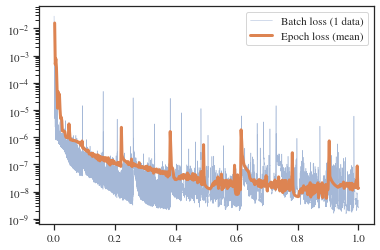

In [23]:
log = ses.get_log()
epoch_mean = log.groupby("epoch").mean()

plt.semilogy(log.index / len(log), log["loss_fwd"], linewidth=.5, alpha=.5, label="Batch loss (1 data)")
plt.semilogy(epoch_mean.index / len(epoch_mean), epoch_mean["loss_fwd"], linewidth=3, label="Epoch loss (mean)")
plt.legend()

log[["epoch", "batch", "phantom_id", "loss_fwd", "loss_bwd"]].iloc[0:10]

dict_keys(['x', 'y_acc', 'y_apx', 'y_corr', 'bwd_acc', 'bwd_apx', 'bwd_corr'])


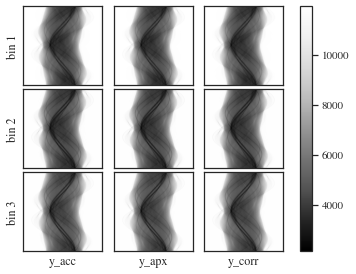

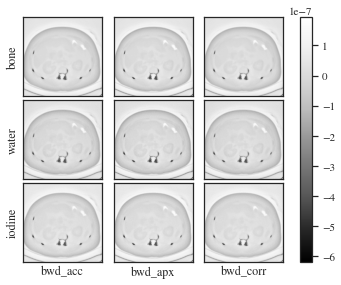

In [11]:
n = 0#2950#2000 #2950
state = torch.load(ses.session_path + f"/output_img/state_{n}.dict")



# Plot forward accurate operator, approximate forward operator and learned forward operator applied to test data
plot_image_channels([state[lab].detach().cpu().numpy() for lab in ["y_acc", "y_apx", "y_corr"]],
                    image_labels=["y_acc", "y_apx", "y_corr"],
                    channel_labels=["bin 1", "bin 2", "bin 3"],
                    cmap="Greys_r",
                    subset = [0,1,2])
        
    
# Plot adjoint for accurate model, approximate model and learned correction applied to test data.
plot_image_channels([state[lab].detach().cpu().numpy() for lab in ["bwd_acc", "bwd_apx", "bwd_corr"]],
                    image_labels=["bwd_acc", "bwd_apx", "bwd_corr"],
                    channel_labels=["bone", "water", "iodine"],
                    cmap="Greys_r")

print(state.keys())



We can also run recursive training. The training data in each epoch is then multiplied by the number of recursions taken during that epoch. Therefore, it is better to make checkpoints more often. Consider therefore changing `save_every_n`=1. This is as easy as reloading your session with a new parameter configuration. Settings from the previous checkpoint are stored and used as default arguments for the next time the session is started. If the recursions are very long, it is possible to make checkpoints inside each recursion by passing the `save_every_n_steps` argument to the `run_epochs_recursion` function.

In [ ]:
ses = FwdBwdSession.load_old_session(name = "session_2021_03_28", epoch=499, path=ses_path, save_every_n=10)
ses.run_epochs_recursion([1000, 3000]*3, train_every_n=10, save_every_n_steps=100, callback=None)

Directory already exists! Loading session ...
Creating operators...


/home/emastr/anaconda3/envs/odl_torch/lib/python3.9/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")


Creating corrective nets...
Preparing data ...
Found 80 data points. Returning data object.
Loading closest checkpoint, 505
Done loading states.
Done loading states.


/home/emastr/anaconda3/envs/odl_torch/lib/python3.9/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")


Saved current state dicts..
Batch [1/80], Recursion [0 / 1000]phantom 50, iter 0, fwd loss 2.1249409592506798e-08 - aim for 1.1572823915190386e-06, bwd loss 1.607082304819688e-06 - aim for 1.6307277486669681e-06
Batch [1/80], Recursion [10 / 1000]phantom 50, iter 0, fwd loss 7.95241576015949e-06 - aim for 1.1777249205284528e-06, bwd loss 2.6167319676689114e-05 - aim for 1.5878425530270963e-06
Batch [1/80], Recursion [20 / 1000]phantom 50, iter 0, fwd loss 6.284380930263128e-07 - aim for 1.1965231203974583e-06, bwd loss 1.8029310063643268e-05 - aim for 1.539460012503798e-06
Batch [1/80], Recursion [30 / 1000]phantom 50, iter 0, fwd loss 2.08462588351734e-06 - aim for 1.1912840874456536e-06, bwd loss 3.8034860845832653e-07 - aim for 1.5388521759699135e-06
Batch [1/80], Recursion [40 / 1000]phantom 50, iter 0, fwd loss 4.214062330660688e-06 - aim for 1.217824908583279e-06, bwd loss 1.1063664003836706e-06 - aim for 1.2683400859426065e-06
Batch [1/80], Recursion [50 / 1000]phantom 50, iter 

Batch [1/80], Recursion [440 / 1000]phantom 50, iter 0, fwd loss 4.894992081467055e-08 - aim for 1.3006113794083639e-06, bwd loss 5.349530377857414e-07 - aim for 5.310715270615185e-07
Batch [1/80], Recursion [450 / 1000]phantom 50, iter 0, fwd loss 2.6875940716762174e-08 - aim for 1.3015236077565418e-06, bwd loss 7.009242837376933e-07 - aim for 5.279844763276445e-07
Batch [1/80], Recursion [460 / 1000]phantom 50, iter 0, fwd loss 3.0337664076461216e-08 - aim for 1.305741086099485e-06, bwd loss 6.654286810112266e-07 - aim for 5.128214300867486e-07
Batch [1/80], Recursion [470 / 1000]phantom 50, iter 0, fwd loss 4.681647533740697e-08 - aim for 1.3396903668631182e-06, bwd loss 4.5854288040165926e-07 - aim for 4.214417894698035e-07
Batch [1/80], Recursion [480 / 1000]phantom 50, iter 0, fwd loss 4.386558820248214e-08 - aim for 1.3523215243418698e-06, bwd loss 2.6803558224385155e-07 - aim for 4.0191369097165873e-07
Batch [1/80], Recursion [490 / 1000]phantom 50, iter 0, fwd loss 2.726531342

Batch [1/80], Recursion [880 / 1000]phantom 50, iter 0, fwd loss 1.587579403864682e-08 - aim for 1.3843591117927426e-06, bwd loss 1.3730721303659278e-07 - aim for 3.3103798420433455e-07
Batch [1/80], Recursion [890 / 1000]phantom 50, iter 0, fwd loss 1.569123423059216e-08 - aim for 1.3831247194613104e-06, bwd loss 1.435185032775149e-07 - aim for 3.3175638662793874e-07
Saved current state dicts..
Batch [1/80], Recursion [900 / 1000]phantom 50, iter 0, fwd loss 1.5880125329433484e-08 - aim for 1.3836102895418397e-06, bwd loss 1.4576996402351675e-07 - aim for 3.3088387992186344e-07
Batch [1/80], Recursion [910 / 1000]phantom 50, iter 0, fwd loss 1.5801924516316944e-08 - aim for 1.3839880441699873e-06, bwd loss 1.4050650935979352e-07 - aim for 3.3027982296622155e-07
Batch [1/80], Recursion [920 / 1000]phantom 50, iter 0, fwd loss 1.5553855434526444e-08 - aim for 1.3861231237287637e-06, bwd loss 1.3587605739619573e-07 - aim for 3.2838983427716694e-07
Batch [1/80], Recursion [930 / 1000]phan

Batch [2/80], Recursion [320 / 1000]phantom 27, iter 0, fwd loss 9.240326562680035e-09 - aim for 1.0326305104319965e-06, bwd loss 1.2102240922004398e-07 - aim for 3.3636725360930026e-07
Batch [2/80], Recursion [330 / 1000]phantom 27, iter 0, fwd loss 9.25062728649654e-09 - aim for 1.0349669498829024e-06, bwd loss 1.1818991364260859e-07 - aim for 3.328472085781296e-07
Batch [2/80], Recursion [340 / 1000]phantom 27, iter 0, fwd loss 9.26837466746423e-09 - aim for 1.037508678075183e-06, bwd loss 1.1842987058587052e-07 - aim for 3.291922637469684e-07
Batch [2/80], Recursion [350 / 1000]phantom 27, iter 0, fwd loss 9.269968146916569e-09 - aim for 1.0388057499630787e-06, bwd loss 1.1689582848432202e-07 - aim for 3.2767831725898235e-07
Batch [2/80], Recursion [360 / 1000]phantom 27, iter 0, fwd loss 9.25186521792962e-09 - aim for 1.0391845502779405e-06, bwd loss 1.1707145021891676e-07 - aim for 3.272445787132994e-07
Batch [2/80], Recursion [370 / 1000]phantom 27, iter 0, fwd loss 9.2306423380

Batch [2/80], Recursion [760 / 1000]phantom 27, iter 0, fwd loss 9.392015107968445e-09 - aim for 1.0657336950315814e-06, bwd loss 1.1218346698011298e-07 - aim for 2.8401504433476547e-07
Batch [2/80], Recursion [770 / 1000]phantom 27, iter 0, fwd loss 9.399884318697262e-09 - aim for 1.066514650167787e-06, bwd loss 1.1216375160513723e-07 - aim for 2.837070097169856e-07
Batch [2/80], Recursion [780 / 1000]phantom 27, iter 0, fwd loss 9.403679733947171e-09 - aim for 1.066937993200416e-06, bwd loss 1.1205096406777582e-07 - aim for 2.833046232461561e-07
Batch [2/80], Recursion [790 / 1000]phantom 27, iter 0, fwd loss 9.405099829296437e-09 - aim for 1.0674146704505946e-06, bwd loss 1.121058698196695e-07 - aim for 2.8321727601422987e-07
Saved current state dicts..
Batch [2/80], Recursion [800 / 1000]phantom 27, iter 0, fwd loss 9.402531711072934e-09 - aim for 1.0676970377877742e-06, bwd loss 1.1202099209574117e-07 - aim for 2.8324284805602556e-07
Batch [2/80], Recursion [810 / 1000]phantom 27,

Saved current state dicts..
Batch [3/80], Recursion [200 / 1000]phantom 30, iter 0, fwd loss 1.9860451293378932e-08 - aim for 1.8501347133427645e-06, bwd loss 1.8358900394524218e-07 - aim for 4.7317492019955493e-07
Batch [3/80], Recursion [210 / 1000]phantom 30, iter 0, fwd loss 1.9852961156361293e-08 - aim for 1.8496551603060155e-06, bwd loss 1.7624792551440954e-07 - aim for 4.6929254392428516e-07
Batch [3/80], Recursion [220 / 1000]phantom 30, iter 0, fwd loss 1.9870972842101827e-08 - aim for 1.8499023633510025e-06, bwd loss 1.774167508647299e-07 - aim for 4.6380814751584563e-07
Batch [3/80], Recursion [230 / 1000]phantom 30, iter 0, fwd loss 1.986516701118081e-08 - aim for 1.8496423763761265e-06, bwd loss 1.8319088822188415e-07 - aim for 4.6041730716407496e-07
Batch [3/80], Recursion [240 / 1000]phantom 30, iter 0, fwd loss 1.9834343289934584e-08 - aim for 1.8488885183475536e-06, bwd loss 1.7737044432957867e-07 - aim for 4.5901439810475865e-07
Batch [3/80], Recursion [250 / 1000]pha

Batch [3/80], Recursion [640 / 1000]phantom 30, iter 0, fwd loss 2.103957567449439e-08 - aim for 1.9212343945621575e-06, bwd loss 1.6140724865056573e-07 - aim for 3.648356107055218e-07
Batch [3/80], Recursion [650 / 1000]phantom 30, iter 0, fwd loss 2.1037081604043234e-08 - aim for 1.921671207872389e-06, bwd loss 1.6106240418702988e-07 - aim for 3.652829535095965e-07
Batch [3/80], Recursion [660 / 1000]phantom 30, iter 0, fwd loss 2.1007814630993236e-08 - aim for 1.921156884671268e-06, bwd loss 1.6107332589985047e-07 - aim for 3.6413277623565476e-07
Batch [3/80], Recursion [670 / 1000]phantom 30, iter 0, fwd loss 2.1000750410233962e-08 - aim for 1.9214035353960723e-06, bwd loss 1.614240270734322e-07 - aim for 3.6437591585120627e-07
Batch [3/80], Recursion [680 / 1000]phantom 30, iter 0, fwd loss 2.0992280387909224e-08 - aim for 1.9214733797320197e-06, bwd loss 1.6076597851307229e-07 - aim for 3.6419242945905565e-07
Batch [3/80], Recursion [690 / 1000]phantom 30, iter 0, fwd loss 2.0965

Batch [4/80], Recursion [80 / 1000]phantom 77, iter 0, fwd loss 1.2139079245677238e-08 - aim for 1.588439681916497e-06, bwd loss 1.61530843075935e-07 - aim for 5.499923714305369e-07
Batch [4/80], Recursion [90 / 1000]phantom 77, iter 0, fwd loss 1.2193968916471212e-08 - aim for 1.5935940184242487e-06, bwd loss 1.7912325327491484e-07 - aim for 5.209392488545426e-07
Saved current state dicts..
Batch [4/80], Recursion [100 / 1000]phantom 77, iter 0, fwd loss 1.2246432240638042e-08 - aim for 1.598407381486524e-06, bwd loss 2.1113654802133636e-07 - aim for 4.979175940741718e-07
Batch [4/80], Recursion [110 / 1000]phantom 77, iter 0, fwd loss 1.2319135168013675e-08 - aim for 1.6043617397855854e-06, bwd loss 1.6407909757927313e-07 - aim for 4.769641448306305e-07
Batch [4/80], Recursion [120 / 1000]phantom 77, iter 0, fwd loss 1.239569999041442e-08 - aim for 1.6095574124143746e-06, bwd loss 1.5873827639463858e-07 - aim for 4.569513861483152e-07
Batch [4/80], Recursion [130 / 1000]phantom 77, i

Batch [4/80], Recursion [520 / 1000]phantom 77, iter 0, fwd loss 1.3238238650317227e-08 - aim for 1.6519343967331952e-06, bwd loss 1.3032126356819629e-07 - aim for 3.2835525219785503e-07
Batch [4/80], Recursion [530 / 1000]phantom 77, iter 0, fwd loss 1.3254737871982621e-08 - aim for 1.653759049503967e-06, bwd loss 1.3076411178304149e-07 - aim for 3.2629588371625386e-07
Batch [4/80], Recursion [540 / 1000]phantom 77, iter 0, fwd loss 1.3274566100153925e-08 - aim for 1.6559330466353985e-06, bwd loss 1.3064958781787673e-07 - aim for 3.2443795005804043e-07
Batch [4/80], Recursion [550 / 1000]phantom 77, iter 0, fwd loss 1.3296230192622068e-08 - aim for 1.6584335342121072e-06, bwd loss 1.2952633464397997e-07 - aim for 3.2231451580210976e-07
Batch [4/80], Recursion [560 / 1000]phantom 77, iter 0, fwd loss 1.3315306121899908e-08 - aim for 1.660627593239019e-06, bwd loss 1.2963913052268586e-07 - aim for 3.207595947207567e-07
Batch [4/80], Recursion [570 / 1000]phantom 77, iter 0, fwd loss 1.3

Batch [4/80], Recursion [960 / 1000]phantom 77, iter 0, fwd loss 1.377266292063276e-08 - aim for 1.6903252339103513e-06, bwd loss 1.2855883107973095e-07 - aim for 3.124200966804248e-07
Batch [4/80], Recursion [970 / 1000]phantom 77, iter 0, fwd loss 1.3767731742942109e-08 - aim for 1.6906155958456183e-06, bwd loss 1.2835615554637645e-07 - aim for 3.119981849651583e-07
Batch [4/80], Recursion [980 / 1000]phantom 77, iter 0, fwd loss 1.3762513535781581e-08 - aim for 1.6908300095439583e-06, bwd loss 1.2848867748811271e-07 - aim for 3.117202869148392e-07
Batch [4/80], Recursion [990 / 1000]phantom 77, iter 0, fwd loss 1.3757772960999066e-08 - aim for 1.6912770704443737e-06, bwd loss 1.2847728071221818e-07 - aim for 3.1140927567100587e-07
Saved current state dicts..
Batch [5/80], Recursion [0 / 1000]phantom 45, iter 0, fwd loss 1.562520569726121e-08 - aim for 1.2873544051162867e-06, bwd loss 2.8531836743958413e-07 - aim for 2.0048891848120016e-06
Batch [5/80], Recursion [10 / 1000]phantom 4

Saved current state dicts..
Batch [5/80], Recursion [400 / 1000]phantom 45, iter 0, fwd loss 1.8753159513684987e-08 - aim for 1.5351634666048954e-06, bwd loss 1.1474532508200258e-07 - aim for 2.9994534620648735e-07
Batch [5/80], Recursion [410 / 1000]phantom 45, iter 0, fwd loss 1.8770151512511466e-08 - aim for 1.5361554592250733e-06, bwd loss 1.1440218399489991e-07 - aim for 2.9832055952891993e-07
Batch [5/80], Recursion [420 / 1000]phantom 45, iter 0, fwd loss 1.87753105120173e-08 - aim for 1.5365370047879812e-06, bwd loss 1.1504430294478958e-07 - aim for 2.973083561048541e-07
Batch [5/80], Recursion [430 / 1000]phantom 45, iter 0, fwd loss 1.8780435425522204e-08 - aim for 1.5370550667629036e-06, bwd loss 1.1449748593821026e-07 - aim for 2.963672523107346e-07
Batch [5/80], Recursion [440 / 1000]phantom 45, iter 0, fwd loss 1.8784653146430888e-08 - aim for 1.5374951279521988e-06, bwd loss 1.1469193506763796e-07 - aim for 2.9556024698580344e-07
Batch [5/80], Recursion [450 / 1000]phant

Batch [5/80], Recursion [840 / 1000]phantom 45, iter 0, fwd loss 1.8451008882743774e-08 - aim for 1.5469073772888289e-06, bwd loss 1.1302078217195295e-07 - aim for 2.9297347689456385e-07
Batch [5/80], Recursion [850 / 1000]phantom 45, iter 0, fwd loss 1.845183511989757e-08 - aim for 1.5471768946672706e-06, bwd loss 1.128931008783058e-07 - aim for 2.927537253000388e-07
Batch [5/80], Recursion [860 / 1000]phantom 45, iter 0, fwd loss 1.8455066971562027e-08 - aim for 1.5476609236562352e-06, bwd loss 1.1302591077147413e-07 - aim for 2.926372873408766e-07
Batch [5/80], Recursion [870 / 1000]phantom 45, iter 0, fwd loss 1.8457085688492422e-08 - aim for 1.5482013325014397e-06, bwd loss 1.1282789235934932e-07 - aim for 2.923599896911207e-07
Batch [5/80], Recursion [880 / 1000]phantom 45, iter 0, fwd loss 1.8456974420577573e-08 - aim for 1.5487552281559268e-06, bwd loss 1.1291853217097765e-07 - aim for 2.919627131045524e-07
Batch [5/80], Recursion [890 / 1000]phantom 45, iter 0, fwd loss 1.8460

Batch [6/80], Recursion [280 / 1000]phantom 71, iter 0, fwd loss 1.4231799082322161e-08 - aim for 1.5398586742874337e-06, bwd loss 1.3589225469434902e-07 - aim for 3.5855473602072543e-07
Batch [6/80], Recursion [290 / 1000]phantom 71, iter 0, fwd loss 1.4310446322615505e-08 - aim for 1.5431552778800191e-06, bwd loss 1.2086015319657222e-07 - aim for 3.5355408764710897e-07
Saved current state dicts..
Batch [6/80], Recursion [300 / 1000]phantom 71, iter 0, fwd loss 1.4410888745334949e-08 - aim for 1.5478721888045843e-06, bwd loss 1.2173624910686975e-07 - aim for 3.476262895883536e-07
Batch [6/80], Recursion [310 / 1000]phantom 71, iter 0, fwd loss 1.4466985972097506e-08 - aim for 1.550874748221549e-06, bwd loss 1.2839975536196478e-07 - aim for 3.4150279522067184e-07
Batch [6/80], Recursion [320 / 1000]phantom 71, iter 0, fwd loss 1.4549513935500299e-08 - aim for 1.5556596243321435e-06, bwd loss 1.2015173659029707e-07 - aim for 3.3433832171912405e-07
Batch [6/80], Recursion [330 / 1000]pha

Batch [6/80], Recursion [720 / 1000]phantom 71, iter 0, fwd loss 1.517685800361888e-08 - aim for 1.5833299746790916e-06, bwd loss 1.1213235158375288e-07 - aim for 2.9380619380509467e-07
Batch [6/80], Recursion [730 / 1000]phantom 71, iter 0, fwd loss 1.516966403510435e-08 - aim for 1.5838419802274256e-06, bwd loss 1.1187824515361897e-07 - aim for 2.9357338104549513e-07
Batch [6/80], Recursion [740 / 1000]phantom 71, iter 0, fwd loss 1.5160272102264464e-08 - aim for 1.5842811111114323e-06, bwd loss 1.1190284008245962e-07 - aim for 2.932745558597891e-07
Batch [6/80], Recursion [750 / 1000]phantom 71, iter 0, fwd loss 1.5154452685668538e-08 - aim for 1.5847262009246288e-06, bwd loss 1.1218080264301647e-07 - aim for 2.9311848939775793e-07
Batch [6/80], Recursion [760 / 1000]phantom 71, iter 0, fwd loss 1.514473902654168e-08 - aim for 1.5850702631940657e-06, bwd loss 1.1184632012138305e-07 - aim for 2.9297818743197035e-07
Batch [6/80], Recursion [770 / 1000]phantom 71, iter 0, fwd loss 1.51

Batch [7/80], Recursion [160 / 1000]phantom 66, iter 0, fwd loss 7.8038183451432e-09 - aim for 1.1431948107066151e-06, bwd loss 1.2735283498953882e-07 - aim for 3.742546127190261e-07
Batch [7/80], Recursion [170 / 1000]phantom 66, iter 0, fwd loss 7.845631490382839e-09 - aim for 1.1462746395264061e-06, bwd loss 1.3570214409847107e-07 - aim for 3.668915711648658e-07
Batch [7/80], Recursion [180 / 1000]phantom 66, iter 0, fwd loss 7.898751853061254e-09 - aim for 1.1499847757708596e-06, bwd loss 1.3416528709724655e-07 - aim for 3.563406806382237e-07
Batch [7/80], Recursion [190 / 1000]phantom 66, iter 0, fwd loss 7.939066381545833e-09 - aim for 1.152384328411839e-06, bwd loss 1.2269296793724472e-07 - aim for 3.4908896633663516e-07
Saved current state dicts..
Batch [7/80], Recursion [200 / 1000]phantom 66, iter 0, fwd loss 7.985307566392233e-09 - aim for 1.1548757509317837e-06, bwd loss 1.306775699536506e-07 - aim for 3.42032527823953e-07
Batch [7/80], Recursion [210 / 1000]phantom 66, ite

Saved current state dicts..
Batch [7/80], Recursion [600 / 1000]phantom 66, iter 0, fwd loss 8.401763345385622e-09 - aim for 1.169420324132418e-06, bwd loss 1.1567519903606718e-07 - aim for 2.9420126360645675e-07
Batch [7/80], Recursion [610 / 1000]phantom 66, iter 0, fwd loss 8.401428850139212e-09 - aim for 1.1696760585430559e-06, bwd loss 1.1562772045599643e-07 - aim for 2.940139617573259e-07
Batch [7/80], Recursion [620 / 1000]phantom 66, iter 0, fwd loss 8.400305007916698e-09 - aim for 1.1698300289954955e-06, bwd loss 1.1560962182730985e-07 - aim for 2.9392920772225993e-07
Batch [7/80], Recursion [630 / 1000]phantom 66, iter 0, fwd loss 8.399745848483227e-09 - aim for 1.1700095040109083e-06, bwd loss 1.1556415907057364e-07 - aim for 2.939136811503328e-07
Batch [7/80], Recursion [640 / 1000]phantom 66, iter 0, fwd loss 8.399788528442893e-09 - aim for 1.170275961061417e-06, bwd loss 1.1563792303049352e-07 - aim for 2.9390735658275613e-07
Batch [7/80], Recursion [650 / 1000]phantom 66

Batch [8/80], Recursion [40 / 1000]phantom 68, iter 0, fwd loss 2.6801989656800356e-08 - aim for 2.001544397674705e-06, bwd loss 2.986810196439931e-07 - aim for 1.183777509218968e-06
Batch [8/80], Recursion [50 / 1000]phantom 68, iter 0, fwd loss 2.7486435295001368e-08 - aim for 2.025368387499798e-06, bwd loss 3.29371261488635e-07 - aim for 1.0434548579801358e-06
Batch [8/80], Recursion [60 / 1000]phantom 68, iter 0, fwd loss 2.7158765148415286e-08 - aim for 2.039025420419459e-06, bwd loss 2.4053297269601034e-07 - aim for 9.361028329740022e-07
Batch [8/80], Recursion [70 / 1000]phantom 68, iter 0, fwd loss 2.669445897752235e-08 - aim for 2.0515553297559058e-06, bwd loss 2.0290952673939328e-07 - aim for 8.19615106199659e-07
Batch [8/80], Recursion [80 / 1000]phantom 68, iter 0, fwd loss 2.6659883853639954e-08 - aim for 2.054172587371276e-06, bwd loss 2.625404239355071e-07 - aim for 7.854604446076121e-07
Batch [8/80], Recursion [90 / 1000]phantom 68, iter 0, fwd loss 2.6753559166000115e-

Batch [8/80], Recursion [480 / 1000]phantom 68, iter 0, fwd loss 2.5655804828247092e-08 - aim for 2.1593646726394173e-06, bwd loss 1.3935196395493959e-07 - aim for 3.597842168143198e-07
Batch [8/80], Recursion [490 / 1000]phantom 68, iter 0, fwd loss 2.5619084747505934e-08 - aim for 2.158934536360237e-06, bwd loss 1.3714254588186764e-07 - aim for 3.6028450360181444e-07
Saved current state dicts..
Batch [8/80], Recursion [500 / 1000]phantom 68, iter 0, fwd loss 2.5576864964680597e-08 - aim for 2.1586681243990416e-06, bwd loss 1.368126742878908e-07 - aim for 3.6095491275672446e-07
Batch [8/80], Recursion [510 / 1000]phantom 68, iter 0, fwd loss 2.5531959873980556e-08 - aim for 2.158941626261092e-06, bwd loss 1.3702434053961267e-07 - aim for 3.619899969214848e-07
Batch [8/80], Recursion [520 / 1000]phantom 68, iter 0, fwd loss 2.5495195622230704e-08 - aim for 2.1600616447934603e-06, bwd loss 1.3753842648851326e-07 - aim for 3.619978878722614e-07
Batch [8/80], Recursion [530 / 1000]phantom

Batch [8/80], Recursion [920 / 1000]phantom 68, iter 0, fwd loss 2.474512743061518e-08 - aim for 2.22238971823911e-06, bwd loss 1.3151888479668505e-07 - aim for 3.206921750227043e-07
Batch [8/80], Recursion [930 / 1000]phantom 68, iter 0, fwd loss 2.4692958137575735e-08 - aim for 2.2226131593897805e-06, bwd loss 1.3134171569253542e-07 - aim for 3.2022682211188227e-07
Batch [8/80], Recursion [940 / 1000]phantom 68, iter 0, fwd loss 2.4648889374479366e-08 - aim for 2.2231362162568526e-06, bwd loss 1.3136873663040762e-07 - aim for 3.1986591724857434e-07
Batch [8/80], Recursion [950 / 1000]phantom 68, iter 0, fwd loss 2.4603021300232326e-08 - aim for 2.2235980699070828e-06, bwd loss 1.3130683055281324e-07 - aim for 3.1944534279346326e-07
Batch [8/80], Recursion [960 / 1000]phantom 68, iter 0, fwd loss 2.4559568710548134e-08 - aim for 2.2239882772255237e-06, bwd loss 1.314351825215137e-07 - aim for 3.1911992922568015e-07
Batch [8/80], Recursion [970 / 1000]phantom 68, iter 0, fwd loss 2.451

Batch [9/80], Recursion [360 / 1000]phantom 48, iter 0, fwd loss 1.3052600222021736e-08 - aim for 1.7381139096131662e-06, bwd loss 1.258468697391565e-07 - aim for 3.405846857833339e-07
Batch [9/80], Recursion [370 / 1000]phantom 48, iter 0, fwd loss 1.3046162597530808e-08 - aim for 1.7381886058768875e-06, bwd loss 1.2488913878425846e-07 - aim for 3.4048076046922813e-07
Batch [9/80], Recursion [380 / 1000]phantom 48, iter 0, fwd loss 1.3078802096964465e-08 - aim for 1.7391725518989381e-06, bwd loss 1.265582082243453e-07 - aim for 3.3881356791535343e-07
Batch [9/80], Recursion [390 / 1000]phantom 48, iter 0, fwd loss 1.3131529941510433e-08 - aim for 1.740218453706742e-06, bwd loss 1.2472681885060028e-07 - aim for 3.369545990999198e-07
Saved current state dicts..
Batch [9/80], Recursion [400 / 1000]phantom 48, iter 0, fwd loss 1.3163834940461463e-08 - aim for 1.7409742264969803e-06, bwd loss 1.2534507532116913e-07 - aim for 3.367728342327217e-07
Batch [9/80], Recursion [410 / 1000]phantom

Saved current state dicts..
Batch [9/80], Recursion [800 / 1000]phantom 48, iter 0, fwd loss 1.3719134820823132e-08 - aim for 1.7740559117341698e-06, bwd loss 1.2218167980808735e-07 - aim for 3.108479042550983e-07
Batch [9/80], Recursion [810 / 1000]phantom 48, iter 0, fwd loss 1.37142370180127e-08 - aim for 1.7742197618005904e-06, bwd loss 1.2230740774111283e-07 - aim for 3.109510646436902e-07
Batch [9/80], Recursion [820 / 1000]phantom 48, iter 0, fwd loss 1.3707414616126007e-08 - aim for 1.7740995131914501e-06, bwd loss 1.222264593564224e-07 - aim for 3.111026148921154e-07
Batch [9/80], Recursion [830 / 1000]phantom 48, iter 0, fwd loss 1.3704096315856375e-08 - aim for 1.7742865700873817e-06, bwd loss 1.2225857851208207e-07 - aim for 3.1103149529606366e-07
Batch [9/80], Recursion [840 / 1000]phantom 48, iter 0, fwd loss 1.3698631063017267e-08 - aim for 1.774389814527087e-06, bwd loss 1.2226368001827716e-07 - aim for 3.1101195831967694e-07
Batch [9/80], Recursion [850 / 1000]phantom 

Batch [10/80], Recursion [240 / 1000]phantom 69, iter 0, fwd loss 6.515411406910622e-09 - aim for 9.349806336651685e-07, bwd loss 1.3464852227259084e-07 - aim for 3.553636637415132e-07
Batch [10/80], Recursion [250 / 1000]phantom 69, iter 0, fwd loss 6.559803800804922e-09 - aim for 9.383524323363436e-07, bwd loss 1.335932794093915e-07 - aim for 3.4768499734304847e-07
Batch [10/80], Recursion [260 / 1000]phantom 69, iter 0, fwd loss 6.579553836309818e-09 - aim for 9.398461403711044e-07, bwd loss 1.3520665263026246e-07 - aim for 3.441185506197111e-07
Batch [10/80], Recursion [270 / 1000]phantom 69, iter 0, fwd loss 6.5945149096074535e-09 - aim for 9.409807594492823e-07, bwd loss 1.3148895806412103e-07 - aim for 3.415906843640633e-07
Batch [10/80], Recursion [280 / 1000]phantom 69, iter 0, fwd loss 6.623456670559592e-09 - aim for 9.428817828869535e-07, bwd loss 1.3420818986342473e-07 - aim for 3.3798637347015596e-07
Batch [10/80], Recursion [290 / 1000]phantom 69, iter 0, fwd loss 6.65044

Batch [10/80], Recursion [680 / 1000]phantom 69, iter 0, fwd loss 6.867704173672773e-09 - aim for 9.60519991308448e-07, bwd loss 1.296377920910471e-07 - aim for 3.2443480562048706e-07
Batch [10/80], Recursion [690 / 1000]phantom 69, iter 0, fwd loss 6.864855680727134e-09 - aim for 9.60883603284727e-07, bwd loss 1.2974112156035156e-07 - aim for 3.242044439139898e-07
Saved current state dicts..
Batch [10/80], Recursion [700 / 1000]phantom 69, iter 0, fwd loss 6.862541065427999e-09 - aim for 9.612028216654644e-07, bwd loss 1.297228837530206e-07 - aim for 3.2405465808665793e-07
Batch [10/80], Recursion [710 / 1000]phantom 69, iter 0, fwd loss 6.8595802893545215e-09 - aim for 9.613557361442753e-07, bwd loss 1.2964314089039468e-07 - aim for 3.2402950572814745e-07
Batch [10/80], Recursion [720 / 1000]phantom 69, iter 0, fwd loss 6.857461029442881e-09 - aim for 9.616742579033362e-07, bwd loss 1.297344339413197e-07 - aim for 3.238561128987376e-07
Batch [10/80], Recursion [730 / 1000]phantom 69,

Batch [11/80], Recursion [120 / 1000]phantom 40, iter 0, fwd loss 1.1724134808498177e-08 - aim for 1.3712902271940162e-06, bwd loss 1.4458645993386022e-07 - aim for 3.983670916562455e-07
Batch [11/80], Recursion [130 / 1000]phantom 40, iter 0, fwd loss 1.1750096464579562e-08 - aim for 1.3715994258961889e-06, bwd loss 1.3442089853880047e-07 - aim for 3.919475062371382e-07
Batch [11/80], Recursion [140 / 1000]phantom 40, iter 0, fwd loss 1.1803662361938696e-08 - aim for 1.3726143021875011e-06, bwd loss 1.2871512058917093e-07 - aim for 3.860990664056589e-07
Batch [11/80], Recursion [150 / 1000]phantom 40, iter 0, fwd loss 1.1807930245425308e-08 - aim for 1.3723053505387143e-06, bwd loss 1.4694250597766102e-07 - aim for 3.763689612626458e-07
Batch [11/80], Recursion [160 / 1000]phantom 40, iter 0, fwd loss 1.1825728141151156e-08 - aim for 1.3723852611199822e-06, bwd loss 1.1980347709996282e-07 - aim for 3.7129343772237486e-07
Batch [11/80], Recursion [170 / 1000]phantom 40, iter 0, fwd los

Batch [11/80], Recursion [560 / 1000]phantom 40, iter 0, fwd loss 1.2673880964902781e-08 - aim for 1.4109129085179606e-06, bwd loss 1.1029737314913573e-07 - aim for 2.998170099666318e-07
Batch [11/80], Recursion [570 / 1000]phantom 40, iter 0, fwd loss 1.2714414005889252e-08 - aim for 1.4125675456083608e-06, bwd loss 1.098882267176895e-07 - aim for 2.976174828873073e-07
Batch [11/80], Recursion [580 / 1000]phantom 40, iter 0, fwd loss 1.2770326286990837e-08 - aim for 1.4149804490265455e-06, bwd loss 1.097044420572345e-07 - aim for 2.952885018624289e-07
Batch [11/80], Recursion [590 / 1000]phantom 40, iter 0, fwd loss 1.2806911830653866e-08 - aim for 1.4167266478687734e-06, bwd loss 1.0980684581668289e-07 - aim for 2.938813654782237e-07
Saved current state dicts..
Batch [11/80], Recursion [600 / 1000]phantom 40, iter 0, fwd loss 1.2843773966962582e-08 - aim for 1.4186385647990932e-06, bwd loss 1.0944082204230893e-07 - aim for 2.927898999728468e-07
Batch [11/80], Recursion [610 / 1000]ph

Saved current state dicts..
Batch [12/80], Recursion [0 / 1000]phantom 63, iter 0, fwd loss 1.0122064489958784e-08 - aim for 1.3226755713822362e-06, bwd loss 2.9802865078916355e-07 - aim for 2.2549686976173137e-06
Batch [12/80], Recursion [10 / 1000]phantom 63, iter 0, fwd loss 1.023491849334112e-08 - aim for 1.3851792929500882e-06, bwd loss 1.7854688922582829e-07 - aim for 1.423371574328782e-06
Batch [12/80], Recursion [20 / 1000]phantom 63, iter 0, fwd loss 1.0289608635008787e-08 - aim for 1.4109270841419002e-06, bwd loss 3.6297704180343754e-07 - aim for 1.2155245733266535e-06
Batch [12/80], Recursion [30 / 1000]phantom 63, iter 0, fwd loss 1.0353671599591163e-08 - aim for 1.4291885855212982e-06, bwd loss 1.6603709842813392e-07 - aim for 1.067505546625225e-06
Batch [12/80], Recursion [40 / 1000]phantom 63, iter 0, fwd loss 1.0453518305049373e-08 - aim for 1.4603604917758332e-06, bwd loss 2.3245697320790504e-07 - aim for 8.970311092386269e-07
Batch [12/80], Recursion [50 / 1000]phanto

Batch [12/80], Recursion [440 / 1000]phantom 63, iter 0, fwd loss 1.2005890090138659e-08 - aim for 1.5898608148462087e-06, bwd loss 1.2555945005823583e-07 - aim for 3.1926739396969776e-07
Batch [12/80], Recursion [450 / 1000]phantom 63, iter 0, fwd loss 1.2025771179428952e-08 - aim for 1.5917045645635128e-06, bwd loss 1.2406084241191183e-07 - aim for 3.174364971092455e-07
Batch [12/80], Recursion [460 / 1000]phantom 63, iter 0, fwd loss 1.2041184644947669e-08 - aim for 1.5930490461959152e-06, bwd loss 1.2509730141173515e-07 - aim for 3.1641107399659603e-07
Batch [12/80], Recursion [470 / 1000]phantom 63, iter 0, fwd loss 1.205846547436468e-08 - aim for 1.5945425118637098e-06, bwd loss 1.2433288770399412e-07 - aim for 3.1550400066797086e-07
Batch [12/80], Recursion [480 / 1000]phantom 63, iter 0, fwd loss 1.2072372054050354e-08 - aim for 1.5956412165076053e-06, bwd loss 1.24140063457454e-07 - aim for 3.1494017954747043e-07
Batch [12/80], Recursion [490 / 1000]phantom 63, iter 0, fwd los

Batch [12/80], Recursion [880 / 1000]phantom 63, iter 0, fwd loss 1.216302822904706e-08 - aim for 1.6099345798145467e-06, bwd loss 1.2282511138890707e-07 - aim for 3.1335935614324173e-07
Batch [12/80], Recursion [890 / 1000]phantom 63, iter 0, fwd loss 1.2162229048295205e-08 - aim for 1.6102376145229254e-06, bwd loss 1.2275308744551525e-07 - aim for 3.1315542163856304e-07
Saved current state dicts..
Batch [12/80], Recursion [900 / 1000]phantom 63, iter 0, fwd loss 1.2161108731070289e-08 - aim for 1.6104421067022256e-06, bwd loss 1.2270361592192296e-07 - aim for 3.1305190093554225e-07
Batch [12/80], Recursion [910 / 1000]phantom 63, iter 0, fwd loss 1.2160049466283533e-08 - aim for 1.6105944377554851e-06, bwd loss 1.2267538721725842e-07 - aim for 3.128958004777734e-07
Batch [12/80], Recursion [920 / 1000]phantom 63, iter 0, fwd loss 1.2157381420845683e-08 - aim for 1.6105120286149214e-06, bwd loss 1.2264437142951388e-07 - aim for 3.1290953185992585e-07
Batch [12/80], Recursion [930 / 10

Batch [13/80], Recursion [320 / 1000]phantom 2, iter 0, fwd loss 1.5089651217749363e-08 - aim for 1.1817596099406138e-06, bwd loss 1.2765932235658755e-07 - aim for 3.368690884535902e-07
Batch [13/80], Recursion [330 / 1000]phantom 2, iter 0, fwd loss 1.670372222542794e-08 - aim for 1.1803817597145008e-06, bwd loss 1.4403054970418138e-07 - aim for 3.3812767922538135e-07
Batch [13/80], Recursion [340 / 1000]phantom 2, iter 0, fwd loss 1.8763132986927218e-08 - aim for 1.1831615026199242e-06, bwd loss 1.3329342868640116e-07 - aim for 3.3621462894840164e-07
Batch [13/80], Recursion [350 / 1000]phantom 2, iter 0, fwd loss 2.1455792311401522e-08 - aim for 1.1801411691445187e-06, bwd loss 1.352570505591314e-07 - aim for 3.372694089574157e-07
Batch [13/80], Recursion [360 / 1000]phantom 2, iter 0, fwd loss 2.4222665981075362e-08 - aim for 1.1797779912555405e-06, bwd loss 1.3931508084316042e-07 - aim for 3.3694533404626655e-07
Batch [13/80], Recursion [370 / 1000]phantom 2, iter 0, fwd loss 2.74

Batch [13/80], Recursion [760 / 1000]phantom 2, iter 0, fwd loss 1.1323129636643479e-08 - aim for 1.1885081544397938e-06, bwd loss 1.1794294105542839e-07 - aim for 3.176018210075635e-07
Batch [13/80], Recursion [770 / 1000]phantom 2, iter 0, fwd loss 1.1218329326345771e-08 - aim for 1.1885455264455928e-06, bwd loss 1.1822341011502374e-07 - aim for 3.179285809110602e-07
Batch [13/80], Recursion [780 / 1000]phantom 2, iter 0, fwd loss 1.1091797354222954e-08 - aim for 1.188879186364569e-06, bwd loss 1.180639595192608e-07 - aim for 3.1728111305606136e-07
Batch [13/80], Recursion [790 / 1000]phantom 2, iter 0, fwd loss 1.0964394895686486e-08 - aim for 1.1887512765753482e-06, bwd loss 1.1800903855905532e-07 - aim for 3.175762466673518e-07
Saved current state dicts..
Batch [13/80], Recursion [800 / 1000]phantom 2, iter 0, fwd loss 1.0890725855827353e-08 - aim for 1.1887495477958673e-06, bwd loss 1.1797015219369382e-07 - aim for 3.1753590326591714e-07
Batch [13/80], Recursion [810 / 1000]phant

Saved current state dicts..
Batch [14/80], Recursion [200 / 1000]phantom 72, iter 0, fwd loss 8.06746569372026e-09 - aim for 1.3173390712115524e-06, bwd loss 1.2681388433159806e-07 - aim for 4.012422529423164e-07
Batch [14/80], Recursion [210 / 1000]phantom 72, iter 0, fwd loss 8.110382149028976e-09 - aim for 1.3191522811702968e-06, bwd loss 1.2739303836230417e-07 - aim for 3.9464448875755e-07
Batch [14/80], Recursion [220 / 1000]phantom 72, iter 0, fwd loss 8.13185686711231e-09 - aim for 1.320055539164708e-06, bwd loss 1.246010075102155e-07 - aim for 3.924366804904214e-07
Batch [14/80], Recursion [230 / 1000]phantom 72, iter 0, fwd loss 8.146870481862896e-09 - aim for 1.320681359676602e-06, bwd loss 1.2734292303619095e-07 - aim for 3.8813693075100097e-07
Batch [14/80], Recursion [240 / 1000]phantom 72, iter 0, fwd loss 8.184540982783327e-09 - aim for 1.3224778241439232e-06, bwd loss 1.2280783404556185e-07 - aim for 3.808865425136466e-07
Batch [14/80], Recursion [250 / 1000]phantom 72,

Batch [14/80], Recursion [640 / 1000]phantom 72, iter 0, fwd loss 1.1167390147763758e-08 - aim for 1.3455508626168654e-06, bwd loss 1.233701507139749e-07 - aim for 3.228261717221992e-07
Batch [14/80], Recursion [650 / 1000]phantom 72, iter 0, fwd loss 9.536472108112642e-09 - aim for 1.3452951002672741e-06, bwd loss 1.2167117600036238e-07 - aim for 3.2385553639004115e-07
Batch [14/80], Recursion [660 / 1000]phantom 72, iter 0, fwd loss 8.512341099967637e-09 - aim for 1.345960580526426e-06, bwd loss 1.2127113684217528e-07 - aim for 3.22276710367245e-07
Batch [14/80], Recursion [670 / 1000]phantom 72, iter 0, fwd loss 8.510378316591795e-09 - aim for 1.3470531248431379e-06, bwd loss 1.220780780817119e-07 - aim for 3.1999035753295664e-07
Batch [14/80], Recursion [680 / 1000]phantom 72, iter 0, fwd loss 9.234257480508198e-09 - aim for 1.3472484633010962e-06, bwd loss 1.2029333595081534e-07 - aim for 3.2083902923752416e-07
Batch [14/80], Recursion [690 / 1000]phantom 72, iter 0, fwd loss 9.98

Batch [15/80], Recursion [320 / 1000]phantom 52, iter 0, fwd loss 1.4501983579801195e-08 - aim for 1.5752154992278338e-06, bwd loss 1.319374693454228e-07 - aim for 4.037400245656596e-07
Batch [15/80], Recursion [330 / 1000]phantom 52, iter 0, fwd loss 1.454343181903523e-08 - aim for 1.5785775285726807e-06, bwd loss 1.3118608975128548e-07 - aim for 3.956102691672313e-07
Batch [15/80], Recursion [340 / 1000]phantom 52, iter 0, fwd loss 1.4575921071874707e-08 - aim for 1.5808907451366374e-06, bwd loss 1.32968846702802e-07 - aim for 3.916127835212366e-07
Batch [15/80], Recursion [350 / 1000]phantom 52, iter 0, fwd loss 1.4543933699383299e-08 - aim for 1.5775335384851627e-06, bwd loss 1.3048331630205486e-07 - aim for 3.8717999430120596e-07
Batch [15/80], Recursion [360 / 1000]phantom 52, iter 0, fwd loss 1.4586081047949842e-08 - aim for 1.5794996085099868e-06, bwd loss 1.3208843278436796e-07 - aim for 3.8224873715524817e-07
Batch [15/80], Recursion [370 / 1000]phantom 52, iter 0, fwd loss 1

Batch [15/80], Recursion [760 / 1000]phantom 52, iter 0, fwd loss 1.579880687782275e-08 - aim for 1.5899174316932071e-06, bwd loss 1.2651010914475437e-07 - aim for 3.403734925786195e-07
Batch [15/80], Recursion [770 / 1000]phantom 52, iter 0, fwd loss 1.6284263118864176e-08 - aim for 1.5905754252641898e-06, bwd loss 1.2686672303194492e-07 - aim for 3.3892298903930446e-07
Batch [15/80], Recursion [780 / 1000]phantom 52, iter 0, fwd loss 1.7069686908767014e-08 - aim for 1.591989485244176e-06, bwd loss 1.2640832778921596e-07 - aim for 3.3930585300762137e-07
Batch [15/80], Recursion [790 / 1000]phantom 52, iter 0, fwd loss 1.816280763449485e-08 - aim for 1.5917324827902218e-06, bwd loss 1.2671434605856168e-07 - aim for 3.384148539793527e-07
Saved current state dicts..
Batch [15/80], Recursion [800 / 1000]phantom 52, iter 0, fwd loss 1.991830675063819e-08 - aim for 1.5920191779734143e-06, bwd loss 1.2961602316154844e-07 - aim for 3.393103705712767e-07
Batch [15/80], Recursion [810 / 1000]ph

Saved current state dicts..
Batch [16/80], Recursion [200 / 1000]phantom 34, iter 0, fwd loss 6.394775315097623e-09 - aim for 7.321491721124337e-07, bwd loss 1.2082025977529903e-07 - aim for 4.037003474644977e-07
Batch [16/80], Recursion [210 / 1000]phantom 34, iter 0, fwd loss 6.28521846459391e-09 - aim for 7.390271607498904e-07, bwd loss 1.2181259146266888e-07 - aim for 3.855387953470161e-07
Batch [16/80], Recursion [220 / 1000]phantom 34, iter 0, fwd loss 5.831139959070126e-09 - aim for 7.376436169356868e-07, bwd loss 1.1916924783144167e-07 - aim for 3.8260096153614405e-07
Batch [16/80], Recursion [230 / 1000]phantom 34, iter 0, fwd loss 5.3384817942983e-09 - aim for 7.449858016610066e-07, bwd loss 1.2086155377090687e-07 - aim for 3.709022489438265e-07
Batch [16/80], Recursion [240 / 1000]phantom 34, iter 0, fwd loss 4.952440438744601e-09 - aim for 7.454155478960216e-07, bwd loss 1.1902027423902814e-07 - aim for 3.6853050579129e-07
Batch [16/80], Recursion [250 / 1000]phantom 34, it

Batch [16/80], Recursion [640 / 1000]phantom 34, iter 0, fwd loss 5.1392799557678754e-09 - aim for 7.567152603098084e-07, bwd loss 1.1594759373155747e-07 - aim for 3.116055340876047e-07
Batch [16/80], Recursion [650 / 1000]phantom 34, iter 0, fwd loss 5.149989209714781e-09 - aim for 7.569189409586977e-07, bwd loss 1.160277927284818e-07 - aim for 3.1219257072175254e-07
Batch [16/80], Recursion [660 / 1000]phantom 34, iter 0, fwd loss 5.157802193426871e-09 - aim for 7.568501365345327e-07, bwd loss 1.1598015026701121e-07 - aim for 3.091216428400266e-07
Batch [16/80], Recursion [670 / 1000]phantom 34, iter 0, fwd loss 5.1984106291968806e-09 - aim for 7.580137824501361e-07, bwd loss 1.1585073169513102e-07 - aim for 3.061239237197067e-07
Batch [16/80], Recursion [680 / 1000]phantom 34, iter 0, fwd loss 5.232821500475379e-09 - aim for 7.58113182621579e-07, bwd loss 1.1583357320384808e-07 - aim for 3.0499297107020215e-07
Batch [16/80], Recursion [690 / 1000]phantom 34, iter 0, fwd loss 5.28191

Batch [17/80], Recursion [80 / 1000]phantom 3, iter 0, fwd loss 5.194145804737945e-09 - aim for 7.895551207225258e-07, bwd loss 1.216572916637242e-07 - aim for 5.209907331327902e-07
Batch [17/80], Recursion [90 / 1000]phantom 3, iter 0, fwd loss 5.178325950737816e-09 - aim for 7.874264005227428e-07, bwd loss 1.2007355063442127e-07 - aim for 5.150973854170142e-07
Saved current state dicts..
Batch [17/80], Recursion [100 / 1000]phantom 3, iter 0, fwd loss 5.9056357575540555e-09 - aim for 7.935878138446971e-07, bwd loss 1.2254904922146514e-07 - aim for 4.849520925651405e-07
Batch [17/80], Recursion [110 / 1000]phantom 3, iter 0, fwd loss 6.841424748182236e-09 - aim for 7.89860767743855e-07, bwd loss 1.188934416726789e-07 - aim for 4.910235987358828e-07
Batch [17/80], Recursion [120 / 1000]phantom 3, iter 0, fwd loss 7.74774607936346e-09 - aim for 8.107708729830414e-07, bwd loss 1.2144361342619742e-07 - aim for 4.312636018595402e-07
Batch [17/80], Recursion [130 / 1000]phantom 3, iter 0, f

Batch [17/80], Recursion [520 / 1000]phantom 3, iter 0, fwd loss 8.44198063071555e-09 - aim for 8.368190484781363e-07, bwd loss 1.1282321312321793e-07 - aim for 3.1687564839430215e-07
Batch [17/80], Recursion [530 / 1000]phantom 3, iter 0, fwd loss 9.182886181004074e-09 - aim for 8.367256551894376e-07, bwd loss 1.1353529112773825e-07 - aim for 3.147934541183546e-07
Batch [17/80], Recursion [540 / 1000]phantom 3, iter 0, fwd loss 1.0186766023268186e-08 - aim for 8.362974007137117e-07, bwd loss 1.1419950735313573e-07 - aim for 3.1765459111375464e-07
Batch [17/80], Recursion [550 / 1000]phantom 3, iter 0, fwd loss 1.1416153566520606e-08 - aim for 8.367250177058865e-07, bwd loss 1.1247960084213048e-07 - aim for 3.1330812102587157e-07
Batch [17/80], Recursion [560 / 1000]phantom 3, iter 0, fwd loss 1.3039758729073457e-08 - aim for 8.38269532573657e-07, bwd loss 1.1328247295963744e-07 - aim for 3.122530060544248e-07
Batch [17/80], Recursion [570 / 1000]phantom 3, iter 0, fwd loss 1.475642288

Batch [17/80], Recursion [960 / 1000]phantom 3, iter 0, fwd loss 6.6736064094247695e-09 - aim for 8.385287370999978e-07, bwd loss 1.1135791801372744e-07 - aim for 3.070487711391713e-07
Batch [17/80], Recursion [970 / 1000]phantom 3, iter 0, fwd loss 5.888799582697669e-09 - aim for 8.38096750706955e-07, bwd loss 1.1124030873630991e-07 - aim for 3.073466224189774e-07
Batch [17/80], Recursion [980 / 1000]phantom 3, iter 0, fwd loss 5.491740828071847e-09 - aim for 8.384605661884158e-07, bwd loss 1.1127494839559944e-07 - aim for 3.067312489596416e-07
Batch [17/80], Recursion [990 / 1000]phantom 3, iter 0, fwd loss 5.400096688957183e-09 - aim for 8.384370378930636e-07, bwd loss 1.1123126906262989e-07 - aim for 3.0677632741131117e-07
Saved current state dicts..
Batch [18/80], Recursion [0 / 1000]phantom 22, iter 0, fwd loss 1.2264460428620642e-08 - aim for 7.494131708708902e-07, bwd loss 1.8650366354130184e-07 - aim for 1.146938888220803e-06
Batch [18/80], Recursion [10 / 1000]phantom 22, ite

Saved current state dicts..
Batch [18/80], Recursion [400 / 1000]phantom 22, iter 0, fwd loss 1.4318371402084676e-08 - aim for 8.379717132948267e-07, bwd loss 1.190619843356078e-07 - aim for 3.651083224836528e-07
Batch [18/80], Recursion [410 / 1000]phantom 22, iter 0, fwd loss 1.8013476316277672e-08 - aim for 8.381203209737792e-07, bwd loss 1.2357553678284816e-07 - aim for 3.6658135589288806e-07
Batch [18/80], Recursion [420 / 1000]phantom 22, iter 0, fwd loss 1.8950574913152377e-08 - aim for 8.378382600076978e-07, bwd loss 1.2059766083969514e-07 - aim for 3.6384758313338126e-07
Batch [18/80], Recursion [430 / 1000]phantom 22, iter 0, fwd loss 1.666481407513579e-08 - aim for 8.377002701988153e-07, bwd loss 1.2160537204602743e-07 - aim for 3.6594108387038847e-07
Batch [18/80], Recursion [440 / 1000]phantom 22, iter 0, fwd loss 1.329429711212799e-08 - aim for 8.376471455920933e-07, bwd loss 1.1812661699755771e-07 - aim for 3.6471473846138025e-07
Batch [18/80], Recursion [450 / 1000]phan

Batch [18/80], Recursion [840 / 1000]phantom 22, iter 0, fwd loss 1.193114116009513e-08 - aim for 8.637442697443377e-07, bwd loss 1.1609366456338421e-07 - aim for 3.06260415268562e-07
Batch [18/80], Recursion [850 / 1000]phantom 22, iter 0, fwd loss 1.193477432011694e-08 - aim for 8.645234356022963e-07, bwd loss 1.161738986943432e-07 - aim for 3.050198469550243e-07
Batch [18/80], Recursion [860 / 1000]phantom 22, iter 0, fwd loss 1.1899288201931141e-08 - aim for 8.643836531282838e-07, bwd loss 1.1608281404671616e-07 - aim for 3.051016715879654e-07
Batch [18/80], Recursion [870 / 1000]phantom 22, iter 0, fwd loss 1.1934532172757072e-08 - aim for 8.657006663454223e-07, bwd loss 1.1603776106035183e-07 - aim for 3.0366904956298374e-07
Batch [18/80], Recursion [880 / 1000]phantom 22, iter 0, fwd loss 1.1961437208362324e-08 - aim for 8.667161466492575e-07, bwd loss 1.1596587167404337e-07 - aim for 3.031544595583065e-07
Batch [18/80], Recursion [890 / 1000]phantom 22, iter 0, fwd loss 1.19749

Batch [19/80], Recursion [280 / 1000]phantom 7, iter 0, fwd loss 1.0886612897110057e-08 - aim for 9.276143318931789e-07, bwd loss 1.392372833596568e-07 - aim for 4.396444451471232e-07
Batch [19/80], Recursion [290 / 1000]phantom 7, iter 0, fwd loss 1.1007471713974615e-08 - aim for 9.316871263815144e-07, bwd loss 1.3836102211552373e-07 - aim for 4.234422144313813e-07
Saved current state dicts..
Batch [19/80], Recursion [300 / 1000]phantom 7, iter 0, fwd loss 1.0160718608336065e-08 - aim for 9.386978497881401e-07, bwd loss 1.382591665333129e-07 - aim for 4.023125703756417e-07
Batch [19/80], Recursion [310 / 1000]phantom 7, iter 0, fwd loss 8.73786826074284e-09 - aim for 9.415167500576568e-07, bwd loss 1.3721597649058358e-07 - aim for 3.9364704221366734e-07
Batch [19/80], Recursion [320 / 1000]phantom 7, iter 0, fwd loss 7.625590091509237e-09 - aim for 9.468514214842547e-07, bwd loss 1.3729618413782922e-07 - aim for 3.8164676213477865e-07
Batch [19/80], Recursion [330 / 1000]phantom 7, it

Batch [19/80], Recursion [720 / 1000]phantom 7, iter 0, fwd loss 7.427194841506898e-09 - aim for 9.62010547113425e-07, bwd loss 1.332934097672689e-07 - aim for 3.382021291533113e-07
Batch [19/80], Recursion [730 / 1000]phantom 7, iter 0, fwd loss 7.418128654836032e-09 - aim for 9.615636092878759e-07, bwd loss 1.3325930924504713e-07 - aim for 3.386623122186644e-07
Batch [19/80], Recursion [740 / 1000]phantom 7, iter 0, fwd loss 7.4170814787801784e-09 - aim for 9.61412934947354e-07, bwd loss 1.3322922621797427e-07 - aim for 3.3876437453518875e-07
Batch [19/80], Recursion [750 / 1000]phantom 7, iter 0, fwd loss 7.420301188154952e-09 - aim for 9.616688094645657e-07, bwd loss 1.3327560863587038e-07 - aim for 3.382535607759772e-07
Batch [19/80], Recursion [760 / 1000]phantom 7, iter 0, fwd loss 7.42600978808285e-09 - aim for 9.615346118644944e-07, bwd loss 1.332069233899706e-07 - aim for 3.380054687204483e-07
Batch [19/80], Recursion [770 / 1000]phantom 7, iter 0, fwd loss 7.434482654254409e

Batch [21/80], Recursion [60 / 1000]phantom 42, iter 0, fwd loss 5.064076239311705e-08 - aim for 9.891891049023032e-07, bwd loss 2.6416100849170274e-07 - aim for 8.205698725535995e-07
Batch [21/80], Recursion [70 / 1000]phantom 42, iter 0, fwd loss 6.159205464864774e-08 - aim for 9.90497526449172e-07, bwd loss 1.8524067062979833e-07 - aim for 8.324206241723243e-07
Batch [21/80], Recursion [80 / 1000]phantom 42, iter 0, fwd loss 6.0715704973092e-08 - aim for 1.018665662642017e-06, bwd loss 1.576624976718256e-07 - aim for 6.673992996357623e-07
Batch [21/80], Recursion [90 / 1000]phantom 42, iter 0, fwd loss 5.308140288999314e-08 - aim for 1.0259909992250567e-06, bwd loss 1.716887785178026e-07 - aim for 6.60606015796925e-07
Saved current state dicts..
Batch [21/80], Recursion [100 / 1000]phantom 42, iter 0, fwd loss 3.275905279864482e-08 - aim for 1.0231738835715304e-06, bwd loss 1.5025474690633068e-07 - aim for 6.608375164054571e-07
Batch [21/80], Recursion [110 / 1000]phantom 42, iter 0

Saved current state dicts..
Batch [21/80], Recursion [500 / 1000]phantom 42, iter 0, fwd loss 6.872051369829317e-09 - aim for 1.079825711249313e-06, bwd loss 1.2581296410159087e-07 - aim for 3.5453653278133005e-07
Batch [21/80], Recursion [510 / 1000]phantom 42, iter 0, fwd loss 7.0989502281554226e-09 - aim for 1.0789229496825693e-06, bwd loss 1.2641656869132336e-07 - aim for 3.5530104951875745e-07
Batch [21/80], Recursion [520 / 1000]phantom 42, iter 0, fwd loss 7.38686510299695e-09 - aim for 1.0803533255295496e-06, bwd loss 1.2499844301321349e-07 - aim for 3.525330328428963e-07
Batch [21/80], Recursion [530 / 1000]phantom 42, iter 0, fwd loss 7.560204507204672e-09 - aim for 1.082548276982348e-06, bwd loss 1.2480476416102089e-07 - aim for 3.496755120638299e-07
Batch [21/80], Recursion [540 / 1000]phantom 42, iter 0, fwd loss 7.51098753385646e-09 - aim for 1.0835266231911624e-06, bwd loss 1.2504365082154318e-07 - aim for 3.471639308064525e-07
Batch [21/80], Recursion [550 / 1000]phanto

Batch [21/80], Recursion [940 / 1000]phantom 42, iter 0, fwd loss 7.0895045986984315e-09 - aim for 1.1016409876662038e-06, bwd loss 1.22664642386888e-07 - aim for 3.1854720994319034e-07
Batch [21/80], Recursion [950 / 1000]phantom 42, iter 0, fwd loss 7.107083247840574e-09 - aim for 1.1028415827191533e-06, bwd loss 1.2260777737248842e-07 - aim for 3.173563953204655e-07
Batch [21/80], Recursion [960 / 1000]phantom 42, iter 0, fwd loss 7.115381418282637e-09 - aim for 1.1038466510739892e-06, bwd loss 1.2257627162428065e-07 - aim for 3.1570286969678305e-07
Batch [21/80], Recursion [970 / 1000]phantom 42, iter 0, fwd loss 7.128429873508752e-09 - aim for 1.1050239422719516e-06, bwd loss 1.2251324030106407e-07 - aim for 3.147435515877283e-07
Batch [21/80], Recursion [980 / 1000]phantom 42, iter 0, fwd loss 7.125284712868622e-09 - aim for 1.1050533532120616e-06, bwd loss 1.2237780946581545e-07 - aim for 3.1466583092105247e-07
Batch [21/80], Recursion [990 / 1000]phantom 42, iter 0, fwd loss 7.

Batch [22/80], Recursion [380 / 1000]phantom 38, iter 0, fwd loss 2.413263933471345e-08 - aim for 1.589364022410647e-06, bwd loss 1.727105168466446e-07 - aim for 3.6827035109108336e-07
Batch [22/80], Recursion [390 / 1000]phantom 38, iter 0, fwd loss 4.4341293199751946e-08 - aim for 1.584579355787904e-06, bwd loss 2.1031699147748844e-07 - aim for 3.886967120458445e-07
Saved current state dicts..
Batch [22/80], Recursion [400 / 1000]phantom 38, iter 0, fwd loss 6.492422538924857e-08 - aim for 1.5916489660883588e-06, bwd loss 1.9698219616286422e-07 - aim for 3.6284418512071016e-07
Batch [22/80], Recursion [410 / 1000]phantom 38, iter 0, fwd loss 8.340252773988722e-08 - aim for 1.59452919826778e-06, bwd loss 1.4682083990597605e-07 - aim for 3.706582417542282e-07
Batch [22/80], Recursion [420 / 1000]phantom 38, iter 0, fwd loss 8.161657841646306e-08 - aim for 1.590344814243964e-06, bwd loss 1.2721757443910454e-07 - aim for 3.664691820121334e-07
Batch [22/80], Recursion [430 / 1000]phantom 

Batch [22/80], Recursion [820 / 1000]phantom 38, iter 0, fwd loss 1.4449895445057957e-08 - aim for 1.6308756607301184e-06, bwd loss 1.1527874949900904e-07 - aim for 3.1198303308684857e-07
Batch [22/80], Recursion [830 / 1000]phantom 38, iter 0, fwd loss 1.4010977524909563e-08 - aim for 1.6316329813628402e-06, bwd loss 1.1485848915350673e-07 - aim for 3.1204553280731095e-07
Batch [22/80], Recursion [840 / 1000]phantom 38, iter 0, fwd loss 1.3826412515836484e-08 - aim for 1.631692686562976e-06, bwd loss 1.1520743014416452e-07 - aim for 3.119515943384965e-07
Batch [22/80], Recursion [850 / 1000]phantom 38, iter 0, fwd loss 1.3934126604633465e-08 - aim for 1.6311777474791903e-06, bwd loss 1.1477005066337556e-07 - aim for 3.1174387445239266e-07
Batch [22/80], Recursion [860 / 1000]phantom 38, iter 0, fwd loss 1.4212362532216392e-08 - aim for 1.6318525504392019e-06, bwd loss 1.1515185807373738e-07 - aim for 3.120191696319321e-07
Batch [22/80], Recursion [870 / 1000]phantom 38, iter 0, fwd lo

Batch [23/80], Recursion [260 / 1000]phantom 41, iter 0, fwd loss 8.141079874720448e-09 - aim for 1.211243460060948e-06, bwd loss 1.251057165357573e-07 - aim for 4.2125935640936985e-07
Batch [23/80], Recursion [270 / 1000]phantom 41, iter 0, fwd loss 8.144808723430213e-09 - aim for 1.2118246251913609e-06, bwd loss 1.2981524027469117e-07 - aim for 4.1724563935610267e-07
Batch [23/80], Recursion [280 / 1000]phantom 41, iter 0, fwd loss 8.253064924895003e-09 - aim for 1.2173773883184206e-06, bwd loss 1.2414579582410406e-07 - aim for 3.9361146784652114e-07
Batch [23/80], Recursion [290 / 1000]phantom 41, iter 0, fwd loss 8.335402384026273e-09 - aim for 1.222442623754858e-06, bwd loss 1.2574384989342131e-07 - aim for 3.807899987939851e-07
Saved current state dicts..
Batch [23/80], Recursion [300 / 1000]phantom 41, iter 0, fwd loss 8.357700979174092e-09 - aim for 1.2233148383192753e-06, bwd loss 1.2425427450804547e-07 - aim for 3.8013738163465266e-07
Batch [23/80], Recursion [310 / 1000]phan

Saved current state dicts..
Batch [23/80], Recursion [700 / 1000]phantom 41, iter 0, fwd loss 8.57535962694211e-09 - aim for 1.2343732568267454e-06, bwd loss 1.1924704802102566e-07 - aim for 3.2958689504499586e-07
Batch [23/80], Recursion [710 / 1000]phantom 41, iter 0, fwd loss 8.581874054279972e-09 - aim for 1.2340058892210185e-06, bwd loss 1.195440587004627e-07 - aim for 3.3034112225846594e-07
Batch [23/80], Recursion [720 / 1000]phantom 41, iter 0, fwd loss 8.598320812369813e-09 - aim for 1.2340120622346704e-06, bwd loss 1.1946764519243432e-07 - aim for 3.30862203289077e-07
Batch [23/80], Recursion [730 / 1000]phantom 41, iter 0, fwd loss 8.604680246823572e-09 - aim for 1.2340649307976639e-06, bwd loss 1.1949980740977828e-07 - aim for 3.3091786171998274e-07
Batch [23/80], Recursion [740 / 1000]phantom 41, iter 0, fwd loss 8.630270606210166e-09 - aim for 1.233630654319738e-06, bwd loss 1.1948234748705742e-07 - aim for 3.335431833646113e-07
Batch [23/80], Recursion [750 / 1000]phanto

Batch [24/80], Recursion [140 / 1000]phantom 79, iter 0, fwd loss 1.9538719927182838e-08 - aim for 8.753013253623447e-07, bwd loss 1.3510748780880575e-07 - aim for 5.800735879760695e-07
Batch [24/80], Recursion [150 / 1000]phantom 79, iter 0, fwd loss 2.0695562878757092e-08 - aim for 8.753526936876795e-07, bwd loss 1.4767948401209856e-07 - aim for 5.860668014498722e-07
Batch [24/80], Recursion [160 / 1000]phantom 79, iter 0, fwd loss 1.3557172460522073e-08 - aim for 8.752348684568247e-07, bwd loss 1.3271202955533466e-07 - aim for 5.862039180620048e-07
Batch [24/80], Recursion [170 / 1000]phantom 79, iter 0, fwd loss 6.637452113058169e-09 - aim for 8.766270973313779e-07, bwd loss 1.3823170561310725e-07 - aim for 5.742985060030069e-07
Batch [24/80], Recursion [180 / 1000]phantom 79, iter 0, fwd loss 6.8547156610536984e-09 - aim for 8.929556956610799e-07, bwd loss 1.3265749344499425e-07 - aim for 4.970402258966856e-07
Batch [24/80], Recursion [190 / 1000]phantom 79, iter 0, fwd loss 1.178

Batch [24/80], Recursion [580 / 1000]phantom 79, iter 0, fwd loss 5.769906331502099e-09 - aim for 9.330881325571813e-07, bwd loss 1.2402186582464156e-07 - aim for 3.3673525061324985e-07
Batch [24/80], Recursion [590 / 1000]phantom 79, iter 0, fwd loss 5.796463927420756e-09 - aim for 9.330306968937241e-07, bwd loss 1.2388786912782188e-07 - aim for 3.3619805262008125e-07
Saved current state dicts..
Batch [24/80], Recursion [600 / 1000]phantom 79, iter 0, fwd loss 5.7553569258001725e-09 - aim for 9.330027384303546e-07, bwd loss 1.2395350803038685e-07 - aim for 3.36621868362725e-07
Batch [24/80], Recursion [610 / 1000]phantom 79, iter 0, fwd loss 5.676828471378626e-09 - aim for 9.331770351393155e-07, bwd loss 1.2377861451626006e-07 - aim for 3.360568406959858e-07
Batch [24/80], Recursion [620 / 1000]phantom 79, iter 0, fwd loss 5.617756489723046e-09 - aim for 9.333998909383675e-07, bwd loss 1.2380670124653277e-07 - aim for 3.359264889288334e-07
Batch [24/80], Recursion [630 / 1000]phantom 

Batch [25/80], Recursion [20 / 1000]phantom 55, iter 0, fwd loss 1.9196570216634567e-08 - aim for 7.94610867149259e-07, bwd loss 1.0467638392762643e-07 - aim for 5.461021079503585e-07
Batch [25/80], Recursion [30 / 1000]phantom 55, iter 0, fwd loss 1.8742421663409865e-08 - aim for 8.050159079424475e-07, bwd loss 1.0966140866522316e-07 - aim for 4.750264181996815e-07
Batch [25/80], Recursion [40 / 1000]phantom 55, iter 0, fwd loss 1.8413968527416756e-08 - aim for 8.157896263256696e-07, bwd loss 9.532055477301053e-08 - aim for 4.078610149019952e-07
Batch [25/80], Recursion [50 / 1000]phantom 55, iter 0, fwd loss 1.827290789005229e-08 - aim for 8.225397170642482e-07, bwd loss 1.0301998423249953e-07 - aim for 3.7961528114846194e-07
Batch [25/80], Recursion [60 / 1000]phantom 55, iter 0, fwd loss 1.832146914858082e-08 - aim for 8.247493978200817e-07, bwd loss 9.418679579108766e-08 - aim for 3.6115426968695203e-07
Batch [25/80], Recursion [70 / 1000]phantom 55, iter 0, fwd loss 1.85545917641

Batch [25/80], Recursion [460 / 1000]phantom 55, iter 0, fwd loss 3.5429055342309996e-08 - aim for 8.315792642496536e-07, bwd loss 3.980093872809202e-07 - aim for 3.0721492524513105e-07
Batch [25/80], Recursion [470 / 1000]phantom 55, iter 0, fwd loss 3.385531209711213e-08 - aim for 8.318187297626297e-07, bwd loss 1.0078927154546085e-07 - aim for 3.059018411351039e-07
Batch [25/80], Recursion [480 / 1000]phantom 55, iter 0, fwd loss 2.1741608919876273e-08 - aim for 8.315761566430842e-07, bwd loss 2.574394382086969e-07 - aim for 3.065861437778487e-07
Batch [25/80], Recursion [490 / 1000]phantom 55, iter 0, fwd loss 1.8980748484484696e-08 - aim for 8.322114226999228e-07, bwd loss 1.1123292707855728e-07 - aim for 3.042470473831092e-07
Saved current state dicts..
Batch [25/80], Recursion [500 / 1000]phantom 55, iter 0, fwd loss 2.6708871760572734e-08 - aim for 8.325934984751601e-07, bwd loss 1.4267458467141493e-07 - aim for 3.0208427146026706e-07
Batch [25/80], Recursion [510 / 1000]phanto

Saved current state dicts..
Batch [25/80], Recursion [900 / 1000]phantom 55, iter 0, fwd loss 1.4585101115423665e-08 - aim for 8.459317628032676e-07, bwd loss 8.756115677861003e-08 - aim for 2.6320132307490064e-07
Batch [25/80], Recursion [910 / 1000]phantom 55, iter 0, fwd loss 1.4555765550870775e-08 - aim for 8.462738994993556e-07, bwd loss 8.8383904399324e-08 - aim for 2.62674676133569e-07
Batch [25/80], Recursion [920 / 1000]phantom 55, iter 0, fwd loss 1.4622252092863641e-08 - aim for 8.462984331191839e-07, bwd loss 8.716610565840526e-08 - aim for 2.622963186312173e-07
Batch [25/80], Recursion [930 / 1000]phantom 55, iter 0, fwd loss 1.4587108095756901e-08 - aim for 8.462648771300986e-07, bwd loss 8.912304400080966e-08 - aim for 2.621727192540072e-07
Batch [25/80], Recursion [940 / 1000]phantom 55, iter 0, fwd loss 1.4450754618138346e-08 - aim for 8.462245328505709e-07, bwd loss 8.726082811530992e-08 - aim for 2.622632285788877e-07
Batch [25/80], Recursion [950 / 1000]phantom 55, 

Batch [26/80], Recursion [340 / 1000]phantom 17, iter 0, fwd loss 8.71410913723579e-09 - aim for 1.3090953069347964e-06, bwd loss 1.3016162617920387e-07 - aim for 3.7577875779726117e-07
Batch [26/80], Recursion [350 / 1000]phantom 17, iter 0, fwd loss 8.707465546240277e-09 - aim for 1.3079285277328421e-06, bwd loss 1.2742031367452517e-07 - aim for 3.7440186933661367e-07
Batch [26/80], Recursion [360 / 1000]phantom 17, iter 0, fwd loss 8.746435829095414e-09 - aim for 1.3087315214408275e-06, bwd loss 1.2773086557787932e-07 - aim for 3.711712833357288e-07
Batch [26/80], Recursion [370 / 1000]phantom 17, iter 0, fwd loss 8.766408562302827e-09 - aim for 1.3100837961951484e-06, bwd loss 1.2746912629879248e-07 - aim for 3.6896299666305237e-07
Batch [26/80], Recursion [380 / 1000]phantom 17, iter 0, fwd loss 8.81113604515421e-09 - aim for 1.3127540399760134e-06, bwd loss 1.268208641157384e-07 - aim for 3.6666803702839563e-07
Batch [26/80], Recursion [390 / 1000]phantom 17, iter 0, fwd loss 8.8

Batch [26/80], Recursion [780 / 1000]phantom 17, iter 0, fwd loss 9.285670125242737e-09 - aim for 1.3573300139890931e-06, bwd loss 1.245227653983346e-07 - aim for 3.14151724501687e-07
Batch [26/80], Recursion [790 / 1000]phantom 17, iter 0, fwd loss 9.282386773236433e-09 - aim for 1.3574977917929275e-06, bwd loss 1.2459037487835851e-07 - aim for 3.1428270358802043e-07
Saved current state dicts..
Batch [26/80], Recursion [800 / 1000]phantom 17, iter 0, fwd loss 9.272484483066944e-09 - aim for 1.3570618928490558e-06, bwd loss 1.2472434383598862e-07 - aim for 3.149939476606367e-07
Batch [26/80], Recursion [810 / 1000]phantom 17, iter 0, fwd loss 9.265474666280344e-09 - aim for 1.3568083149798991e-06, bwd loss 1.2470131494871936e-07 - aim for 3.1564290611854797e-07
Batch [26/80], Recursion [820 / 1000]phantom 17, iter 0, fwd loss 9.251354075880836e-09 - aim for 1.3559939454145722e-06, bwd loss 1.2488144695993987e-07 - aim for 3.1738809152410176e-07
Batch [26/80], Recursion [830 / 1000]phan

Batch [27/80], Recursion [220 / 1000]phantom 60, iter 0, fwd loss 5.239781277222911e-09 - aim for 9.002694702371391e-07, bwd loss 1.2149013333758068e-07 - aim for 3.3912045227376696e-07
Batch [27/80], Recursion [230 / 1000]phantom 60, iter 0, fwd loss 5.251563730115415e-09 - aim for 9.016152919581693e-07, bwd loss 1.1778959305659155e-07 - aim for 3.339892698557086e-07
Batch [27/80], Recursion [240 / 1000]phantom 60, iter 0, fwd loss 5.260886483061371e-09 - aim for 9.023301201432563e-07, bwd loss 1.1907472693241156e-07 - aim for 3.2996318059415377e-07
Batch [27/80], Recursion [250 / 1000]phantom 60, iter 0, fwd loss 5.278106827934015e-09 - aim for 9.033400811102262e-07, bwd loss 1.1752224954958333e-07 - aim for 3.255757959526158e-07
Batch [27/80], Recursion [260 / 1000]phantom 60, iter 0, fwd loss 5.29622947834089e-09 - aim for 9.040525189594309e-07, bwd loss 1.1786942060440883e-07 - aim for 3.226179676182985e-07
Batch [27/80], Recursion [270 / 1000]phantom 60, iter 0, fwd loss 5.310324

Batch [27/80], Recursion [660 / 1000]phantom 60, iter 0, fwd loss 5.575159296736638e-09 - aim for 9.230981612068808e-07, bwd loss 1.1501592504023335e-07 - aim for 3.0232976479080116e-07
Batch [27/80], Recursion [670 / 1000]phantom 60, iter 0, fwd loss 5.5738315385503935e-09 - aim for 9.232894840965729e-07, bwd loss 1.1521405021079466e-07 - aim for 3.0237037686828883e-07
Batch [27/80], Recursion [680 / 1000]phantom 60, iter 0, fwd loss 5.571498000718311e-09 - aim for 9.234021024563599e-07, bwd loss 1.1503265786261763e-07 - aim for 3.0252624805712516e-07
Batch [27/80], Recursion [690 / 1000]phantom 60, iter 0, fwd loss 5.569862431669338e-09 - aim for 9.235701362111077e-07, bwd loss 1.1500491667927637e-07 - aim for 3.023394877950245e-07
Saved current state dicts..
Batch [27/80], Recursion [700 / 1000]phantom 60, iter 0, fwd loss 5.5675723758302755e-09 - aim for 9.237357731756079e-07, bwd loss 1.1488361555044916e-07 - aim for 3.023957070933434e-07
Batch [27/80], Recursion [710 / 1000]phant

Saved current state dicts..
Batch [28/80], Recursion [100 / 1000]phantom 62, iter 0, fwd loss 3.6460085657015824e-08 - aim for 6.880114684004402e-07, bwd loss 1.3351740024333474e-07 - aim for 5.936714251863737e-07
Batch [28/80], Recursion [110 / 1000]phantom 62, iter 0, fwd loss 2.526378740741185e-08 - aim for 6.86637405608729e-07, bwd loss 1.419293964704115e-07 - aim for 6.072210622073058e-07
Batch [28/80], Recursion [120 / 1000]phantom 62, iter 0, fwd loss 1.1487167522962712e-08 - aim for 6.870201940116057e-07, bwd loss 1.3293475154061954e-07 - aim for 5.788852959619157e-07
Batch [28/80], Recursion [130 / 1000]phantom 62, iter 0, fwd loss 4.7334421711101575e-09 - aim for 6.89245303145331e-07, bwd loss 1.3211867006090407e-07 - aim for 5.5603494785883e-07
Batch [28/80], Recursion [140 / 1000]phantom 62, iter 0, fwd loss 7.476941833207924e-09 - aim for 6.910172304907196e-07, bwd loss 1.3184661245012863e-07 - aim for 5.461902739387237e-07
Batch [28/80], Recursion [150 / 1000]phantom 62, 

Saved current state dicts..
Batch [29/80], Recursion [100 / 1000]phantom 6, iter 0, fwd loss 8.726854901666505e-09 - aim for 1.1411507730903736e-06, bwd loss 1.4166388061273054e-07 - aim for 7.05655207747997e-07
Batch [29/80], Recursion [110 / 1000]phantom 6, iter 0, fwd loss 8.8413586769391e-09 - aim for 1.1462998450476866e-06, bwd loss 1.377327235646504e-07 - aim for 6.843468100919961e-07
Batch [29/80], Recursion [120 / 1000]phantom 6, iter 0, fwd loss 8.850498379844135e-09 - aim for 1.1409234567824983e-06, bwd loss 1.4182680499470162e-07 - aim for 6.934616270786259e-07
Batch [29/80], Recursion [130 / 1000]phantom 6, iter 0, fwd loss 8.821631042325863e-09 - aim for 1.1444106460843334e-06, bwd loss 1.317039576052201e-07 - aim for 6.489405742295124e-07
Batch [29/80], Recursion [140 / 1000]phantom 6, iter 0, fwd loss 8.717167706108185e-09 - aim for 1.142948917285679e-06, bwd loss 1.2948807697561023e-07 - aim for 6.576014111575374e-07
Batch [29/80], Recursion [150 / 1000]phantom 6, iter 

Batch [29/80], Recursion [540 / 1000]phantom 6, iter 0, fwd loss 9.129853267387932e-09 - aim for 1.2189469106549183e-06, bwd loss 1.1161887818305422e-07 - aim for 3.1937168580884823e-07
Batch [29/80], Recursion [550 / 1000]phantom 6, iter 0, fwd loss 9.14911827579585e-09 - aim for 1.218690566848355e-06, bwd loss 1.1115530598491461e-07 - aim for 3.203297799122596e-07
Batch [29/80], Recursion [560 / 1000]phantom 6, iter 0, fwd loss 9.178635184695218e-09 - aim for 1.21929814177216e-06, bwd loss 1.1117801303935471e-07 - aim for 3.2166541708303876e-07
Batch [29/80], Recursion [570 / 1000]phantom 6, iter 0, fwd loss 9.168524411594036e-09 - aim for 1.219125485127637e-06, bwd loss 1.1155126081530362e-07 - aim for 3.2044971521240427e-07
Batch [29/80], Recursion [580 / 1000]phantom 6, iter 0, fwd loss 9.164030190363195e-09 - aim for 1.219248424187651e-06, bwd loss 1.1107134012012193e-07 - aim for 3.2005571463269315e-07
Batch [29/80], Recursion [590 / 1000]phantom 6, iter 0, fwd loss 9.1712084477

Batch [29/80], Recursion [980 / 1000]phantom 6, iter 0, fwd loss 1.657863653351525e-08 - aim for 1.2340244175804487e-06, bwd loss 1.1206190474739498e-07 - aim for 3.027508919459152e-07
Batch [29/80], Recursion [990 / 1000]phantom 6, iter 0, fwd loss 2.137230093081452e-08 - aim for 1.2364021775487824e-06, bwd loss 1.1018608809653516e-07 - aim for 3.0033489231303675e-07
Saved current state dicts..
Batch [30/80], Recursion [0 / 1000]phantom 56, iter 0, fwd loss 2.270830951950567e-08 - aim for 9.565122107098188e-07, bwd loss 2.2446734495569782e-07 - aim for 1.5667310167988461e-06
Batch [30/80], Recursion [10 / 1000]phantom 56, iter 0, fwd loss 1.81260523935921e-08 - aim for 9.883420160416445e-07, bwd loss 1.846149211544491e-07 - aim for 1.1091110232414302e-06
Batch [30/80], Recursion [20 / 1000]phantom 56, iter 0, fwd loss 1.2802440542487746e-08 - aim for 9.978322842048166e-07, bwd loss 1.537947205470023e-07 - aim for 1.0140856739140794e-06
Batch [30/80], Recursion [30 / 1000]phantom 56, i

Batch [30/80], Recursion [420 / 1000]phantom 56, iter 0, fwd loss 1.1872105700139857e-08 - aim for 1.115102205874776e-06, bwd loss 1.2242087850999236e-07 - aim for 3.3508130122930316e-07
Batch [30/80], Recursion [430 / 1000]phantom 56, iter 0, fwd loss 1.1835005864514782e-08 - aim for 1.1161133797523352e-06, bwd loss 1.216261725477688e-07 - aim for 3.3399113631052993e-07
Batch [30/80], Recursion [440 / 1000]phantom 56, iter 0, fwd loss 1.181376476405094e-08 - aim for 1.117232696093812e-06, bwd loss 1.214651325175586e-07 - aim for 3.3350397678958975e-07
Batch [30/80], Recursion [450 / 1000]phantom 56, iter 0, fwd loss 1.1782291028747814e-08 - aim for 1.1174835252430232e-06, bwd loss 1.2125491756408575e-07 - aim for 3.324626517097426e-07
Batch [30/80], Recursion [460 / 1000]phantom 56, iter 0, fwd loss 1.1765908950836466e-08 - aim for 1.1172069001614414e-06, bwd loss 1.21350906366031e-07 - aim for 3.32151945939175e-07
Batch [30/80], Recursion [470 / 1000]phantom 56, iter 0, fwd loss 1.17

Batch [30/80], Recursion [860 / 1000]phantom 56, iter 0, fwd loss 1.2113095673844178e-08 - aim for 1.1358645707894313e-06, bwd loss 1.2006454178348312e-07 - aim for 3.069677318441588e-07
Batch [30/80], Recursion [870 / 1000]phantom 56, iter 0, fwd loss 1.211355102269294e-08 - aim for 1.1347868549500898e-06, bwd loss 1.2013425910264575e-07 - aim for 3.0772694116181134e-07
Batch [30/80], Recursion [880 / 1000]phantom 56, iter 0, fwd loss 1.2125137211592055e-08 - aim for 1.1340525850861506e-06, bwd loss 1.2010216797680496e-07 - aim for 3.0850639590676703e-07
Batch [30/80], Recursion [890 / 1000]phantom 56, iter 0, fwd loss 1.2150738040741808e-08 - aim for 1.1336030094091921e-06, bwd loss 1.2028961015303798e-07 - aim for 3.0954665121476117e-07
Saved current state dicts..
Batch [30/80], Recursion [900 / 1000]phantom 56, iter 0, fwd loss 1.2194033815849086e-08 - aim for 1.1332864064799315e-06, bwd loss 1.2046790340909278e-07 - aim for 3.0969749624890105e-07
Batch [30/80], Recursion [910 / 10

Batch [31/80], Recursion [320 / 1000]phantom 73, iter 0, fwd loss 1.0022923970634918e-08 - aim for 1.5964130087126548e-06, bwd loss 1.212586856492628e-07 - aim for 3.904000880963656e-07
Batch [31/80], Recursion [330 / 1000]phantom 73, iter 0, fwd loss 1.3300624276809645e-08 - aim for 1.5949466588485697e-06, bwd loss 1.1798258749054488e-07 - aim for 3.9300073363636336e-07
Batch [31/80], Recursion [340 / 1000]phantom 73, iter 0, fwd loss 1.5352044655474022e-08 - aim for 1.603135623025091e-06, bwd loss 1.2642921973032184e-07 - aim for 3.8403754138511985e-07
Batch [31/80], Recursion [350 / 1000]phantom 73, iter 0, fwd loss 1.4487082174935017e-08 - aim for 1.5938973827185877e-06, bwd loss 1.1734767886278024e-07 - aim for 3.949771850217656e-07
Batch [31/80], Recursion [360 / 1000]phantom 73, iter 0, fwd loss 1.1742241307604082e-08 - aim for 1.6059366199301945e-06, bwd loss 1.186359494299534e-07 - aim for 3.7765403775271655e-07
Batch [31/80], Recursion [370 / 1000]phantom 73, iter 0, fwd loss

Batch [31/80], Recursion [760 / 1000]phantom 73, iter 0, fwd loss 9.35887563835585e-09 - aim for 1.6247721664959875e-06, bwd loss 1.1309894688928786e-07 - aim for 3.205292531905103e-07
Batch [31/80], Recursion [770 / 1000]phantom 73, iter 0, fwd loss 9.342742897567836e-09 - aim for 1.6247594732948491e-06, bwd loss 1.1322494883683098e-07 - aim for 3.204352848278998e-07
Batch [31/80], Recursion [780 / 1000]phantom 73, iter 0, fwd loss 9.345778767430515e-09 - aim for 1.6265255501293938e-06, bwd loss 1.130127684776182e-07 - aim for 3.1877154346084244e-07
Batch [31/80], Recursion [790 / 1000]phantom 73, iter 0, fwd loss 9.35659509527301e-09 - aim for 1.6288645700285202e-06, bwd loss 1.1310785215702248e-07 - aim for 3.1745078684340147e-07
Saved current state dicts..
Batch [31/80], Recursion [800 / 1000]phantom 73, iter 0, fwd loss 9.352150300893848e-09 - aim for 1.6302617137623909e-06, bwd loss 1.1275617451204006e-07 - aim for 3.1497254204395696e-07
Batch [31/80], Recursion [810 / 1000]phant

Saved current state dicts..
Batch [32/80], Recursion [200 / 1000]phantom 4, iter 0, fwd loss 5.023322933598192e-09 - aim for 9.253844181586841e-07, bwd loss 1.22205288951584e-07 - aim for 3.721657022181503e-07
Batch [32/80], Recursion [210 / 1000]phantom 4, iter 0, fwd loss 5.043818994627172e-09 - aim for 9.282516871120577e-07, bwd loss 1.2358208173463025e-07 - aim for 3.670021922460347e-07
Batch [32/80], Recursion [220 / 1000]phantom 4, iter 0, fwd loss 5.034834323441453e-09 - aim for 9.273629217549219e-07, bwd loss 1.2218770990028243e-07 - aim for 3.6795976768832197e-07
Batch [32/80], Recursion [230 / 1000]phantom 4, iter 0, fwd loss 5.025507844885957e-09 - aim for 9.26512508379556e-07, bwd loss 1.2258184581838926e-07 - aim for 3.688945390669363e-07
Batch [32/80], Recursion [240 / 1000]phantom 4, iter 0, fwd loss 5.020541580994476e-09 - aim for 9.263553678517881e-07, bwd loss 1.2071451470646838e-07 - aim for 3.6842483604760874e-07
Batch [32/80], Recursion [250 / 1000]phantom 4, iter 

Saved current state dicts..
Batch [33/80], Recursion [100 / 1000]phantom 33, iter 0, fwd loss 1.2917577392889674e-08 - aim for 1.1313389669383285e-06, bwd loss 1.1153629399418597e-07 - aim for 5.459085626616608e-07
Batch [33/80], Recursion [110 / 1000]phantom 33, iter 0, fwd loss 6.7270059188354905e-09 - aim for 1.130273336838484e-06, bwd loss 1.253075722872779e-07 - aim for 5.545773435655938e-07
Batch [33/80], Recursion [120 / 1000]phantom 33, iter 0, fwd loss 1.0629803430333577e-08 - aim for 1.133346228275885e-06, bwd loss 1.1345884767372356e-07 - aim for 4.909707936473116e-07
Batch [33/80], Recursion [130 / 1000]phantom 33, iter 0, fwd loss 2.0443942961404384e-08 - aim for 1.138764228909014e-06, bwd loss 1.1022842781672959e-07 - aim for 4.7432543960358113e-07
Batch [33/80], Recursion [140 / 1000]phantom 33, iter 0, fwd loss 3.19791361984509e-08 - aim for 1.1341941420269873e-06, bwd loss 1.1711137332240794e-07 - aim for 4.846039556813536e-07
Batch [33/80], Recursion [150 / 1000]phant

Batch [33/80], Recursion [540 / 1000]phantom 33, iter 0, fwd loss 7.720816601828414e-09 - aim for 1.1716330372149348e-06, bwd loss 1.0123555008012289e-07 - aim for 3.209277241985757e-07
Batch [33/80], Recursion [550 / 1000]phantom 33, iter 0, fwd loss 7.358655484524064e-09 - aim for 1.1712230862053597e-06, bwd loss 1.0140627276200095e-07 - aim for 3.2227782679660685e-07
Batch [33/80], Recursion [560 / 1000]phantom 33, iter 0, fwd loss 7.022919184098063e-09 - aim for 1.1737835436013064e-06, bwd loss 1.0107335337453868e-07 - aim for 3.1588894470815256e-07
Batch [33/80], Recursion [570 / 1000]phantom 33, iter 0, fwd loss 6.867308388471613e-09 - aim for 1.1781244101536603e-06, bwd loss 1.0095491928022111e-07 - aim for 3.071708118797209e-07
Batch [33/80], Recursion [580 / 1000]phantom 33, iter 0, fwd loss 6.904898263830633e-09 - aim for 1.1807521721028242e-06, bwd loss 1.0107899836112411e-07 - aim for 3.033497435472917e-07
Batch [33/80], Recursion [590 / 1000]phantom 33, iter 0, fwd loss 7.

Batch [33/80], Recursion [980 / 1000]phantom 33, iter 0, fwd loss 6.982295196133272e-09 - aim for 1.1876888591012003e-06, bwd loss 9.988199625562982e-08 - aim for 2.872170783948207e-07
Batch [33/80], Recursion [990 / 1000]phantom 33, iter 0, fwd loss 6.9763686250368744e-09 - aim for 1.1875144472032054e-06, bwd loss 9.992582868586566e-08 - aim for 2.8761630463908315e-07
Saved current state dicts..
Batch [34/80], Recursion [0 / 1000]phantom 53, iter 0, fwd loss 6.3209544834764e-09 - aim for 9.668054799742485e-07, bwd loss 2.345143187731308e-07 - aim for 1.8036496047360339e-06
Batch [34/80], Recursion [10 / 1000]phantom 53, iter 0, fwd loss 6.386696542027076e-09 - aim for 1.005966616107399e-06, bwd loss 2.1286629085261425e-07 - aim for 1.259756976343857e-06
Batch [34/80], Recursion [20 / 1000]phantom 53, iter 0, fwd loss 6.443062413172491e-09 - aim for 1.0280294886518712e-06, bwd loss 1.819065492751989e-07 - aim for 1.0734253737347822e-06
Batch [34/80], Recursion [30 / 1000]phantom 53, it

Batch [34/80], Recursion [420 / 1000]phantom 53, iter 0, fwd loss 1.0047712459365332e-08 - aim for 1.1583113568583575e-06, bwd loss 1.4393600443594498e-07 - aim for 3.899215978753361e-07
Batch [34/80], Recursion [430 / 1000]phantom 53, iter 0, fwd loss 1.1169059934110199e-08 - aim for 1.15672210889621e-06, bwd loss 1.4431088010209808e-07 - aim for 3.9025670432059865e-07
Batch [34/80], Recursion [440 / 1000]phantom 53, iter 0, fwd loss 1.2027060251767502e-08 - aim for 1.160913362847393e-06, bwd loss 1.444194187153161e-07 - aim for 3.8273697451677785e-07
Batch [34/80], Recursion [450 / 1000]phantom 53, iter 0, fwd loss 1.2462056983120934e-08 - aim for 1.1594218191476998e-06, bwd loss 1.4399646714405628e-07 - aim for 3.851680760310761e-07
Batch [34/80], Recursion [460 / 1000]phantom 53, iter 0, fwd loss 1.2287923943993109e-08 - aim for 1.161547661153845e-06, bwd loss 1.43745463007126e-07 - aim for 3.822189097841335e-07
Batch [34/80], Recursion [470 / 1000]phantom 53, iter 0, fwd loss 1.16

Batch [34/80], Recursion [860 / 1000]phantom 53, iter 0, fwd loss 7.56632305210589e-09 - aim for 1.1660406516764034e-06, bwd loss 1.413905597207627e-07 - aim for 3.600553135297638e-07
Batch [34/80], Recursion [870 / 1000]phantom 53, iter 0, fwd loss 7.598707423769485e-09 - aim for 1.1660416106115875e-06, bwd loss 1.413310552398734e-07 - aim for 3.5971890377227227e-07
Batch [34/80], Recursion [880 / 1000]phantom 53, iter 0, fwd loss 7.649666782764076e-09 - aim for 1.1659590241022487e-06, bwd loss 1.41430423141535e-07 - aim for 3.6008662437955337e-07
Batch [34/80], Recursion [890 / 1000]phantom 53, iter 0, fwd loss 7.715001354432492e-09 - aim for 1.1660972870657867e-06, bwd loss 1.4137041953156144e-07 - aim for 3.587911296074571e-07
Saved current state dicts..
Batch [34/80], Recursion [900 / 1000]phantom 53, iter 0, fwd loss 7.81308515822295e-09 - aim for 1.166044861235439e-06, bwd loss 1.4144334914263108e-07 - aim for 3.5929850660898405e-07
Batch [34/80], Recursion [910 / 1000]phantom 5

Saved current state dicts..
Batch [35/80], Recursion [300 / 1000]phantom 28, iter 0, fwd loss 1.790370217498961e-08 - aim for 1.713220174990816e-06, bwd loss 1.5387893437849426e-07 - aim for 4.851794369730339e-07
Batch [35/80], Recursion [310 / 1000]phantom 28, iter 0, fwd loss 2.594330840247388e-08 - aim for 1.7126981642706239e-06, bwd loss 1.5381561466464199e-07 - aim for 4.831918292691132e-07
Batch [35/80], Recursion [320 / 1000]phantom 28, iter 0, fwd loss 3.280365712856067e-08 - aim for 1.7142080749222282e-06, bwd loss 1.742839100030925e-07 - aim for 4.836236622525787e-07
Batch [35/80], Recursion [330 / 1000]phantom 28, iter 0, fwd loss 3.640541846115412e-08 - aim for 1.7143795131916625e-06, bwd loss 1.5872263570057493e-07 - aim for 4.841255866222914e-07
Batch [35/80], Recursion [340 / 1000]phantom 28, iter 0, fwd loss 3.367291271286915e-08 - aim for 1.7145481278136432e-06, bwd loss 1.539521636244474e-07 - aim for 4.895208302711274e-07
Batch [35/80], Recursion [350 / 1000]phantom 

Batch [35/80], Recursion [740 / 1000]phantom 28, iter 0, fwd loss 1.4232313655322328e-08 - aim for 1.7745843478768978e-06, bwd loss 1.4192800569912524e-07 - aim for 3.602772649794284e-07
Batch [35/80], Recursion [750 / 1000]phantom 28, iter 0, fwd loss 1.4147027836719854e-08 - aim for 1.7768786167943295e-06, bwd loss 1.4189546639909443e-07 - aim for 3.585990546890258e-07
Batch [35/80], Recursion [760 / 1000]phantom 28, iter 0, fwd loss 1.4002515253142184e-08 - aim for 1.777386497015841e-06, bwd loss 1.419383930716669e-07 - aim for 3.5788017205815624e-07
Batch [35/80], Recursion [770 / 1000]phantom 28, iter 0, fwd loss 1.3904991472377283e-08 - aim for 1.7787029059174185e-06, bwd loss 1.4208040406499612e-07 - aim for 3.5608714656656666e-07
Batch [35/80], Recursion [780 / 1000]phantom 28, iter 0, fwd loss 1.3839291230456187e-08 - aim for 1.778871323568082e-06, bwd loss 1.4213664896696018e-07 - aim for 3.556666283305433e-07
Batch [35/80], Recursion [790 / 1000]phantom 28, iter 0, fwd loss 

Batch [36/80], Recursion [180 / 1000]phantom 11, iter 0, fwd loss 5.696946022297604e-09 - aim for 9.85784455171892e-07, bwd loss 1.2519048900981613e-07 - aim for 3.890703379412739e-07
Batch [36/80], Recursion [190 / 1000]phantom 11, iter 0, fwd loss 5.701223545817366e-09 - aim for 9.91236202159563e-07, bwd loss 1.0821929343203555e-07 - aim for 3.803067793428474e-07
Saved current state dicts..
Batch [36/80], Recursion [200 / 1000]phantom 11, iter 0, fwd loss 5.709009826164496e-09 - aim for 9.952704319162457e-07, bwd loss 1.2362130109499615e-07 - aim for 3.7420728988350267e-07
Batch [36/80], Recursion [210 / 1000]phantom 11, iter 0, fwd loss 5.700723508677701e-09 - aim for 9.9457759705128e-07, bwd loss 1.109545123287694e-07 - aim for 3.6588900078242675e-07
Batch [36/80], Recursion [220 / 1000]phantom 11, iter 0, fwd loss 5.693067106662563e-09 - aim for 9.930891998180654e-07, bwd loss 1.1518678919608027e-07 - aim for 3.6612848631688474e-07
Batch [36/80], Recursion [230 / 1000]phantom 11, 

Batch [36/80], Recursion [620 / 1000]phantom 11, iter 0, fwd loss 1.253208225652336e-08 - aim for 1.0058032746377624e-06, bwd loss 1.131696218153776e-07 - aim for 3.1258835462091457e-07
Batch [36/80], Recursion [630 / 1000]phantom 11, iter 0, fwd loss 6.277644183511191e-09 - aim for 1.0048407840721844e-06, bwd loss 1.0589533293890748e-07 - aim for 3.1113955574134493e-07
Batch [36/80], Recursion [640 / 1000]phantom 11, iter 0, fwd loss 9.53233532438074e-09 - aim for 1.0058160851881552e-06, bwd loss 1.084212735113186e-07 - aim for 3.125650017682509e-07
Batch [36/80], Recursion [650 / 1000]phantom 11, iter 0, fwd loss 1.79024806547428e-08 - aim for 1.0061075948684995e-06, bwd loss 1.0517417975226324e-07 - aim for 3.038396658360395e-07
Batch [36/80], Recursion [660 / 1000]phantom 11, iter 0, fwd loss 2.55349024373582e-08 - aim for 1.0059547252220969e-06, bwd loss 1.1254534314351603e-07 - aim for 3.108452323274406e-07
Batch [36/80], Recursion [670 / 1000]phantom 11, iter 0, fwd loss 2.75900

Batch [37/80], Recursion [60 / 1000]phantom 57, iter 0, fwd loss 5.738476349487467e-09 - aim for 8.768681655921072e-07, bwd loss 1.501359923983209e-07 - aim for 7.05435761097936e-07
Batch [37/80], Recursion [70 / 1000]phantom 57, iter 0, fwd loss 5.817393851611514e-09 - aim for 8.701213305403048e-07, bwd loss 1.853518022397614e-07 - aim for 7.170965524408816e-07
Batch [37/80], Recursion [80 / 1000]phantom 57, iter 0, fwd loss 6.00236273976098e-09 - aim for 8.948302828851174e-07, bwd loss 1.5290486022806087e-07 - aim for 6.018000315023624e-07
Batch [37/80], Recursion [90 / 1000]phantom 57, iter 0, fwd loss 6.041441731063439e-09 - aim for 8.95657614981746e-07, bwd loss 1.6073546808882765e-07 - aim for 5.776580509188414e-07
Saved current state dicts..
Batch [37/80], Recursion [100 / 1000]phantom 57, iter 0, fwd loss 6.020260209917672e-09 - aim for 8.965024781878347e-07, bwd loss 1.6218472734103503e-07 - aim for 5.709651205136175e-07
Batch [37/80], Recursion [110 / 1000]phantom 57, iter 0,

Saved current state dicts..
Batch [37/80], Recursion [500 / 1000]phantom 57, iter 0, fwd loss 1.0120366191848395e-08 - aim for 9.455675526372074e-07, bwd loss 1.3451307243470025e-07 - aim for 3.606184727927753e-07
Batch [37/80], Recursion [510 / 1000]phantom 57, iter 0, fwd loss 1.1696926553494971e-08 - aim for 9.438940254451157e-07, bwd loss 1.339043582331858e-07 - aim for 3.6157295335825893e-07
Batch [37/80], Recursion [520 / 1000]phantom 57, iter 0, fwd loss 1.3991696299648294e-08 - aim for 9.464048895408896e-07, bwd loss 1.3481835795506118e-07 - aim for 3.6006475031585227e-07
Batch [37/80], Recursion [530 / 1000]phantom 57, iter 0, fwd loss 1.6909194378978523e-08 - aim for 9.455636620664101e-07, bwd loss 1.3607216062696892e-07 - aim for 3.580392566044943e-07
Batch [37/80], Recursion [540 / 1000]phantom 57, iter 0, fwd loss 2.086704520926513e-08 - aim for 9.470067564402322e-07, bwd loss 1.3703888807467565e-07 - aim for 3.601533578965887e-07
Batch [37/80], Recursion [550 / 1000]phant

Batch [37/80], Recursion [940 / 1000]phantom 57, iter 0, fwd loss 6.447150595810939e-09 - aim for 9.534489843897342e-07, bwd loss 1.3333596278533485e-07 - aim for 3.4462582425291644e-07
Batch [37/80], Recursion [950 / 1000]phantom 57, iter 0, fwd loss 6.3623830788974354e-09 - aim for 9.534222221946858e-07, bwd loss 1.3278655852716088e-07 - aim for 3.436108424070845e-07
Batch [37/80], Recursion [960 / 1000]phantom 57, iter 0, fwd loss 8.25273664845528e-09 - aim for 9.536557271152351e-07, bwd loss 1.3280988288217246e-07 - aim for 3.44076854311075e-07
Batch [37/80], Recursion [970 / 1000]phantom 57, iter 0, fwd loss 1.0938496782938155e-08 - aim for 9.533343471312724e-07, bwd loss 1.3259391619139587e-07 - aim for 3.432494610559948e-07
Batch [37/80], Recursion [980 / 1000]phantom 57, iter 0, fwd loss 1.355631925559039e-08 - aim for 9.53660810483763e-07, bwd loss 1.329661159246969e-07 - aim for 3.4465000615156276e-07
Batch [37/80], Recursion [990 / 1000]phantom 57, iter 0, fwd loss 1.5264998

Batch [38/80], Recursion [380 / 1000]phantom 23, iter 0, fwd loss 1.0867665289046527e-08 - aim for 1.5835898612530106e-06, bwd loss 1.1806893637517864e-07 - aim for 3.929164265171784e-07
Batch [38/80], Recursion [390 / 1000]phantom 23, iter 0, fwd loss 1.0711212771342208e-08 - aim for 1.5811531561003655e-06, bwd loss 1.1630654901375682e-07 - aim for 3.87820035679235e-07
Saved current state dicts..
Batch [38/80], Recursion [400 / 1000]phantom 23, iter 0, fwd loss 1.0674463514187773e-08 - aim for 1.581164079392709e-06, bwd loss 1.1683326245976464e-07 - aim for 3.847767577530528e-07
Batch [38/80], Recursion [410 / 1000]phantom 23, iter 0, fwd loss 1.0721936328431484e-08 - aim for 1.5834344970583803e-06, bwd loss 1.1707766768573207e-07 - aim for 3.7812290064354137e-07
Batch [38/80], Recursion [420 / 1000]phantom 23, iter 0, fwd loss 1.0801476172632402e-08 - aim for 1.5850776678601152e-06, bwd loss 1.1526227394176836e-07 - aim for 3.7483282061819656e-07
Batch [38/80], Recursion [430 / 1000]

Batch [38/80], Recursion [820 / 1000]phantom 23, iter 0, fwd loss 1.4793566183670906e-08 - aim for 1.6001591732720945e-06, bwd loss 1.1457753949358201e-07 - aim for 3.3757580073333285e-07
Batch [38/80], Recursion [830 / 1000]phantom 23, iter 0, fwd loss 1.638154394197829e-08 - aim for 1.6003126821576428e-06, bwd loss 1.1499344105113219e-07 - aim for 3.3871083201374284e-07
Batch [38/80], Recursion [840 / 1000]phantom 23, iter 0, fwd loss 1.7325064649760723e-08 - aim for 1.600104255033268e-06, bwd loss 1.1513700915654277e-07 - aim for 3.3646198084173875e-07
Batch [38/80], Recursion [850 / 1000]phantom 23, iter 0, fwd loss 1.7737616626460174e-08 - aim for 1.6001121520467835e-06, bwd loss 1.1505907891852534e-07 - aim for 3.382973575371947e-07
Batch [38/80], Recursion [860 / 1000]phantom 23, iter 0, fwd loss 1.7302493752747334e-08 - aim for 1.5993894661353836e-06, bwd loss 1.1450919570083035e-07 - aim for 3.363690825243899e-07
Batch [38/80], Recursion [870 / 1000]phantom 23, iter 0, fwd los

Batch [39/80], Recursion [260 / 1000]phantom 10, iter 0, fwd loss 1.288170706874317e-08 - aim for 1.2442816330093672e-06, bwd loss 1.155081141514634e-07 - aim for 3.691271444810644e-07
Batch [39/80], Recursion [270 / 1000]phantom 10, iter 0, fwd loss 1.349754777718314e-08 - aim for 1.2479148365822936e-06, bwd loss 1.1586236503843858e-07 - aim for 3.643001510601365e-07
Batch [39/80], Recursion [280 / 1000]phantom 10, iter 0, fwd loss 1.4294321387307117e-08 - aim for 1.2482061531008837e-06, bwd loss 1.1623043637202092e-07 - aim for 3.6496407723458067e-07
Batch [39/80], Recursion [290 / 1000]phantom 10, iter 0, fwd loss 1.5268628649181532e-08 - aim for 1.2470406132841289e-06, bwd loss 1.1614483513081693e-07 - aim for 3.6446893170606683e-07
Saved current state dicts..
Batch [39/80], Recursion [300 / 1000]phantom 10, iter 0, fwd loss 1.6683464632748852e-08 - aim for 1.2483376540027982e-06, bwd loss 1.160049056224592e-07 - aim for 3.631733971906037e-07
Batch [39/80], Recursion [310 / 1000]ph

Saved current state dicts..
Batch [39/80], Recursion [700 / 1000]phantom 10, iter 0, fwd loss 1.2868803476075673e-08 - aim for 1.2635026991364958e-06, bwd loss 1.1295350469927855e-07 - aim for 3.191646335341099e-07
Batch [39/80], Recursion [710 / 1000]phantom 10, iter 0, fwd loss 1.2794898656957176e-08 - aim for 1.2653731449078912e-06, bwd loss 1.1262128354204001e-07 - aim for 3.177826706498155e-07
Batch [39/80], Recursion [720 / 1000]phantom 10, iter 0, fwd loss 1.2673972315780698e-08 - aim for 1.266441497373948e-06, bwd loss 1.1295758371153635e-07 - aim for 3.165785402612056e-07
Batch [39/80], Recursion [730 / 1000]phantom 10, iter 0, fwd loss 1.2575418979280283e-08 - aim for 1.268600572285254e-06, bwd loss 1.124648796261733e-07 - aim for 3.162225734559636e-07
Batch [39/80], Recursion [740 / 1000]phantom 10, iter 0, fwd loss 1.2420832063265564e-08 - aim for 1.2690717617970044e-06, bwd loss 1.1246986589366861e-07 - aim for 3.1578478861592894e-07
Batch [39/80], Recursion [750 / 1000]ph

Batch [40/80], Recursion [140 / 1000]phantom 31, iter 0, fwd loss 1.7674822764603705e-08 - aim for 1.2684455923649507e-06, bwd loss 1.7845339731118244e-07 - aim for 5.838791374272244e-07
Batch [40/80], Recursion [150 / 1000]phantom 31, iter 0, fwd loss 1.8035097040027055e-08 - aim for 1.2686681766545017e-06, bwd loss 1.6648159965658918e-07 - aim for 5.75468978218107e-07
Batch [40/80], Recursion [160 / 1000]phantom 31, iter 0, fwd loss 1.6634868490527712e-08 - aim for 1.2731693549017567e-06, bwd loss 1.4922256757086892e-07 - aim for 5.557374823711675e-07
Batch [40/80], Recursion [170 / 1000]phantom 31, iter 0, fwd loss 1.442566906280454e-08 - aim for 1.2746187791027913e-06, bwd loss 1.8115141099637593e-07 - aim for 5.474444373394752e-07
Batch [40/80], Recursion [180 / 1000]phantom 31, iter 0, fwd loss 1.1820412703660089e-08 - aim for 1.2742318242182531e-06, bwd loss 1.312312174542659e-07 - aim for 5.487649749931507e-07
Batch [40/80], Recursion [190 / 1000]phantom 31, iter 0, fwd loss 9.

Batch [40/80], Recursion [580 / 1000]phantom 31, iter 0, fwd loss 9.341344060708198e-09 - aim for 1.344163500880341e-06, bwd loss 1.2070123530342162e-07 - aim for 3.331632316389458e-07
Batch [40/80], Recursion [590 / 1000]phantom 31, iter 0, fwd loss 9.485135414633158e-09 - aim for 1.3433396092447387e-06, bwd loss 1.208123471306448e-07 - aim for 3.3490015182642996e-07
Saved current state dicts..
Batch [40/80], Recursion [600 / 1000]phantom 31, iter 0, fwd loss 9.719108134766853e-09 - aim for 1.3484396327142765e-06, bwd loss 1.2047627714628553e-07 - aim for 3.2805375139350946e-07
Batch [40/80], Recursion [610 / 1000]phantom 31, iter 0, fwd loss 9.96724717398082e-09 - aim for 1.3480706517065564e-06, bwd loss 1.2391399990336805e-07 - aim for 3.28816209630853e-07
Batch [40/80], Recursion [620 / 1000]phantom 31, iter 0, fwd loss 1.0270830501851677e-08 - aim for 1.347026259679285e-06, bwd loss 1.214492375157557e-07 - aim for 3.2941346738043835e-07
Batch [40/80], Recursion [630 / 1000]phantom

Batch [41/80], Recursion [20 / 1000]phantom 43, iter 0, fwd loss 5.001897203312559e-09 - aim for 8.51193702654358e-07, bwd loss 1.329927992793964e-07 - aim for 7.433734358432355e-07
Batch [41/80], Recursion [30 / 1000]phantom 43, iter 0, fwd loss 5.235623468813581e-09 - aim for 8.630582749362218e-07, bwd loss 1.637259683153364e-07 - aim for 6.833396771007191e-07
Batch [41/80], Recursion [40 / 1000]phantom 43, iter 0, fwd loss 5.5048807481547e-09 - aim for 8.750913679511318e-07, bwd loss 1.3895575434522543e-07 - aim for 6.215285961531739e-07
Batch [41/80], Recursion [50 / 1000]phantom 43, iter 0, fwd loss 5.7597886210351984e-09 - aim for 8.741346684585059e-07, bwd loss 1.4625277887935233e-07 - aim for 6.195014495205048e-07
Batch [41/80], Recursion [60 / 1000]phantom 43, iter 0, fwd loss 6.022061960551775e-09 - aim for 8.765805731843801e-07, bwd loss 1.4976422676704277e-07 - aim for 5.751644189579053e-07
Batch [41/80], Recursion [70 / 1000]phantom 43, iter 0, fwd loss 6.251355906606652e-

Batch [41/80], Recursion [460 / 1000]phantom 43, iter 0, fwd loss 2.4358302793563164e-08 - aim for 9.301556566236143e-07, bwd loss 1.2449043308295653e-07 - aim for 3.479012138845855e-07
Batch [41/80], Recursion [470 / 1000]phantom 43, iter 0, fwd loss 2.545683431270117e-08 - aim for 9.329054394852873e-07, bwd loss 1.2411207163446623e-07 - aim for 3.4933346812170937e-07
Batch [41/80], Recursion [480 / 1000]phantom 43, iter 0, fwd loss 2.4582193639522726e-08 - aim for 9.295609139690125e-07, bwd loss 1.2299155251997125e-07 - aim for 3.48598014310479e-07
Batch [41/80], Recursion [490 / 1000]phantom 43, iter 0, fwd loss 2.2789047093333487e-08 - aim for 9.308638158881363e-07, bwd loss 1.2459225503602064e-07 - aim for 3.481847366633106e-07
Saved current state dicts..
Batch [41/80], Recursion [500 / 1000]phantom 43, iter 0, fwd loss 1.9257254880239458e-08 - aim for 9.264658871792048e-07, bwd loss 1.2331106305972363e-07 - aim for 3.474304874697318e-07
Batch [41/80], Recursion [510 / 1000]phanto

Saved current state dicts..
Batch [41/80], Recursion [900 / 1000]phantom 43, iter 0, fwd loss 8.571949669655592e-09 - aim for 9.266962274015192e-07, bwd loss 1.218214266593834e-07 - aim for 3.343960580205264e-07
Batch [41/80], Recursion [910 / 1000]phantom 43, iter 0, fwd loss 8.77301352464025e-09 - aim for 9.272783113145588e-07, bwd loss 1.2188590079980243e-07 - aim for 3.3458649399183023e-07
Batch [41/80], Recursion [920 / 1000]phantom 43, iter 0, fwd loss 8.93672342643716e-09 - aim for 9.272867969597716e-07, bwd loss 1.2154216425924333e-07 - aim for 3.3324052217997383e-07
Batch [41/80], Recursion [930 / 1000]phantom 43, iter 0, fwd loss 9.164829706999324e-09 - aim for 9.275453603022015e-07, bwd loss 1.216484331158051e-07 - aim for 3.3425577582129686e-07
Batch [41/80], Recursion [940 / 1000]phantom 43, iter 0, fwd loss 9.352512941783594e-09 - aim for 9.270540568223673e-07, bwd loss 1.2164581124376566e-07 - aim for 3.341319636524446e-07
Batch [41/80], Recursion [950 / 1000]phantom 43,

Batch [42/80], Recursion [340 / 1000]phantom 61, iter 0, fwd loss 7.68483008056492e-09 - aim for 7.012541328165502e-07, bwd loss 1.1152790773981622e-07 - aim for 3.445415051540814e-07
Batch [42/80], Recursion [350 / 1000]phantom 61, iter 0, fwd loss 6.59105391844151e-09 - aim for 7.029523784774582e-07, bwd loss 1.1244674762327197e-07 - aim for 3.420883616483529e-07
Batch [42/80], Recursion [360 / 1000]phantom 61, iter 0, fwd loss 5.7482122914752415e-09 - aim for 7.028557261995145e-07, bwd loss 1.1191813956486916e-07 - aim for 3.425379106075369e-07
Batch [42/80], Recursion [370 / 1000]phantom 61, iter 0, fwd loss 5.238758218447651e-09 - aim for 7.077170175814466e-07, bwd loss 1.1064341150761378e-07 - aim for 3.3355128267356516e-07
Batch [42/80], Recursion [380 / 1000]phantom 61, iter 0, fwd loss 4.914906403648584e-09 - aim for 7.076336027894359e-07, bwd loss 1.1198536911270425e-07 - aim for 3.326356813048413e-07
Batch [42/80], Recursion [390 / 1000]phantom 61, iter 0, fwd loss 4.8061442

Batch [42/80], Recursion [780 / 1000]phantom 61, iter 0, fwd loss 7.474986035834671e-09 - aim for 7.122444857986017e-07, bwd loss 1.0871735066098817e-07 - aim for 3.069076382709169e-07
Batch [42/80], Recursion [790 / 1000]phantom 61, iter 0, fwd loss 6.654395869883782e-09 - aim for 7.123665143563387e-07, bwd loss 1.0907061105914982e-07 - aim for 3.059864618971022e-07
Saved current state dicts..
Batch [42/80], Recursion [800 / 1000]phantom 61, iter 0, fwd loss 5.981481693952251e-09 - aim for 7.123213039351615e-07, bwd loss 1.0876734471706649e-07 - aim for 3.0643446698957713e-07
Batch [42/80], Recursion [810 / 1000]phantom 61, iter 0, fwd loss 5.480529889668942e-09 - aim for 7.121760126160947e-07, bwd loss 1.0874589486067526e-07 - aim for 3.066721626549611e-07
Batch [42/80], Recursion [820 / 1000]phantom 61, iter 0, fwd loss 5.160953959522192e-09 - aim for 7.122215917535749e-07, bwd loss 1.0881362703512697e-07 - aim for 3.0692774910335035e-07
Batch [42/80], Recursion [830 / 1000]phantom 

Batch [43/80], Recursion [220 / 1000]phantom 1, iter 0, fwd loss 1.0033150571145223e-08 - aim for 9.422706097417125e-07, bwd loss 1.4096173995652442e-07 - aim for 4.445905473430473e-07
Batch [43/80], Recursion [230 / 1000]phantom 1, iter 0, fwd loss 9.935902942290444e-09 - aim for 9.435240120773386e-07, bwd loss 1.3323228818000712e-07 - aim for 4.392453537962346e-07
Batch [43/80], Recursion [240 / 1000]phantom 1, iter 0, fwd loss 9.71160135278257e-09 - aim for 9.414882240777079e-07, bwd loss 1.364614716791826e-07 - aim for 4.457111998615021e-07
Batch [43/80], Recursion [250 / 1000]phantom 1, iter 0, fwd loss 9.277166770525773e-09 - aim for 9.43605549628119e-07, bwd loss 1.4586543342161144e-07 - aim for 4.389438342776354e-07
Batch [43/80], Recursion [260 / 1000]phantom 1, iter 0, fwd loss 8.840352547308074e-09 - aim for 9.458234579681858e-07, bwd loss 1.3891981944422294e-07 - aim for 4.298344559979484e-07
Batch [43/80], Recursion [270 / 1000]phantom 1, iter 0, fwd loss 8.305440232132648

Batch [44/80], Recursion [290 / 1000]phantom 32, iter 0, fwd loss 4.661160509882762e-09 - aim for 9.114788617898995e-07, bwd loss 1.2803361848832038e-07 - aim for 3.7400641393759375e-07
Saved current state dicts..
Batch [44/80], Recursion [300 / 1000]phantom 32, iter 0, fwd loss 5.022327467415585e-09 - aim for 9.150143533711959e-07, bwd loss 1.2775946711105309e-07 - aim for 3.654853382217421e-07
Batch [44/80], Recursion [310 / 1000]phantom 32, iter 0, fwd loss 5.533035138108158e-09 - aim for 9.132252947162101e-07, bwd loss 1.27554438159571e-07 - aim for 3.7017257582158893e-07
Batch [44/80], Recursion [320 / 1000]phantom 32, iter 0, fwd loss 6.371790153128555e-09 - aim for 9.186631553147793e-07, bwd loss 1.2782770288948034e-07 - aim for 3.591563715310715e-07
Batch [44/80], Recursion [330 / 1000]phantom 32, iter 0, fwd loss 7.632173156510666e-09 - aim for 9.175253715412104e-07, bwd loss 1.278397648623901e-07 - aim for 3.623566695814944e-07
Batch [44/80], Recursion [340 / 1000]phantom 32,

Batch [45/80], Recursion [50 / 1000]phantom 75, iter 0, fwd loss 1.8979186175944857e-08 - aim for 7.928177063265415e-07, bwd loss 1.3308431894369787e-07 - aim for 5.989251556329363e-07
Batch [45/80], Recursion [60 / 1000]phantom 75, iter 0, fwd loss 2.3104166947005152e-08 - aim for 7.899489490665993e-07, bwd loss 1.3448616176833255e-07 - aim for 6.159728466876726e-07
Batch [45/80], Recursion [70 / 1000]phantom 75, iter 0, fwd loss 2.2573700030213273e-08 - aim for 7.963655770213978e-07, bwd loss 1.318753781743074e-07 - aim for 5.831791958229729e-07
Batch [45/80], Recursion [80 / 1000]phantom 75, iter 0, fwd loss 1.6560110690161436e-08 - aim for 8.003091171435162e-07, bwd loss 1.4696439240075838e-07 - aim for 5.62284270398978e-07
Batch [45/80], Recursion [90 / 1000]phantom 75, iter 0, fwd loss 9.262267224858795e-09 - aim for 8.130267922267316e-07, bwd loss 1.2166283115020201e-07 - aim for 5.104669796293854e-07
Saved current state dicts..
Batch [45/80], Recursion [100 / 1000]phantom 75, i

Batch [45/80], Recursion [490 / 1000]phantom 75, iter 0, fwd loss 4.829443806326222e-09 - aim for 8.474546251898535e-07, bwd loss 1.187033656316919e-07 - aim for 3.330002072122374e-07
Saved current state dicts..
Batch [45/80], Recursion [500 / 1000]phantom 75, iter 0, fwd loss 4.829650890348282e-09 - aim for 8.475154954446943e-07, bwd loss 1.1792737487917255e-07 - aim for 3.3236056723233975e-07
Batch [45/80], Recursion [510 / 1000]phantom 75, iter 0, fwd loss 4.761882107750223e-09 - aim for 8.481093512802753e-07, bwd loss 1.1788240452920615e-07 - aim for 3.31611737849899e-07
Batch [45/80], Recursion [520 / 1000]phantom 75, iter 0, fwd loss 4.689632881563261e-09 - aim for 8.485667194359137e-07, bwd loss 1.178125994276725e-07 - aim for 3.305840943579869e-07
Batch [45/80], Recursion [530 / 1000]phantom 75, iter 0, fwd loss 4.640916732491175e-09 - aim for 8.490832792118705e-07, bwd loss 1.1794303196443021e-07 - aim for 3.30090225714701e-07
Batch [45/80], Recursion [540 / 1000]phantom 75, i

Batch [45/80], Recursion [930 / 1000]phantom 75, iter 0, fwd loss 4.740900798684438e-09 - aim for 8.55576491878261e-07, bwd loss 1.1653510682821011e-07 - aim for 3.150033040167913e-07
Batch [45/80], Recursion [940 / 1000]phantom 75, iter 0, fwd loss 4.739740706181188e-09 - aim for 8.554678363319917e-07, bwd loss 1.1654645901081099e-07 - aim for 3.154438795195484e-07
Batch [45/80], Recursion [950 / 1000]phantom 75, iter 0, fwd loss 4.739222523890821e-09 - aim for 8.554053315624672e-07, bwd loss 1.1655197983683398e-07 - aim for 3.150809699054107e-07
Batch [45/80], Recursion [960 / 1000]phantom 75, iter 0, fwd loss 4.738268083169253e-09 - aim for 8.551892745734182e-07, bwd loss 1.1659019786911185e-07 - aim for 3.1655662332850357e-07
Batch [45/80], Recursion [970 / 1000]phantom 75, iter 0, fwd loss 4.737990025283235e-09 - aim for 8.548949171392247e-07, bwd loss 1.1659758705631232e-07 - aim for 3.177515887443265e-07
Batch [45/80], Recursion [980 / 1000]phantom 75, iter 0, fwd loss 4.7379135

Batch [46/80], Recursion [370 / 1000]phantom 14, iter 0, fwd loss 9.849710292345263e-09 - aim for 1.6280528518169003e-06, bwd loss 1.2178260172920628e-07 - aim for 3.6079538246807917e-07
Batch [46/80], Recursion [380 / 1000]phantom 14, iter 0, fwd loss 1.034354910776272e-08 - aim for 1.6298415313762364e-06, bwd loss 1.2302295053600502e-07 - aim for 3.5789414076651793e-07
Batch [46/80], Recursion [390 / 1000]phantom 14, iter 0, fwd loss 1.1042285060679186e-08 - aim for 1.6279822483161255e-06, bwd loss 1.226018618764005e-07 - aim for 3.579320043829968e-07
Saved current state dicts..
Batch [46/80], Recursion [400 / 1000]phantom 14, iter 0, fwd loss 1.2173769241184919e-08 - aim for 1.6286860345595238e-06, bwd loss 1.4095479921283817e-07 - aim for 3.5903749912360487e-07
Batch [46/80], Recursion [410 / 1000]phantom 14, iter 0, fwd loss 1.385755584344826e-08 - aim for 1.6271062731362199e-06, bwd loss 1.3897494974831333e-07 - aim for 3.580568212024403e-07
Batch [46/80], Recursion [420 / 1000]p

Batch [46/80], Recursion [810 / 1000]phantom 14, iter 0, fwd loss 1.142293678505503e-08 - aim for 1.6147151219807766e-06, bwd loss 1.2075231933264198e-07 - aim for 3.560090082792999e-07
Batch [46/80], Recursion [820 / 1000]phantom 14, iter 0, fwd loss 1.2676822525539552e-08 - aim for 1.6144491251766436e-06, bwd loss 1.200422236214856e-07 - aim for 3.586907249511272e-07
Batch [46/80], Recursion [830 / 1000]phantom 14, iter 0, fwd loss 1.3122123140849406e-08 - aim for 1.6140089896960845e-06, bwd loss 1.1976353966129247e-07 - aim for 3.5677088981212675e-07
Batch [46/80], Recursion [840 / 1000]phantom 14, iter 0, fwd loss 1.2559018218829036e-08 - aim for 1.6147636081487025e-06, bwd loss 1.203628762333775e-07 - aim for 3.576906791595495e-07
Batch [46/80], Recursion [850 / 1000]phantom 14, iter 0, fwd loss 1.1157532244274107e-08 - aim for 1.6148354834957602e-06, bwd loss 1.2065259751848746e-07 - aim for 3.557980234611193e-07
Batch [46/80], Recursion [860 / 1000]phantom 14, iter 0, fwd loss 9

Batch [47/80], Recursion [250 / 1000]phantom 54, iter 0, fwd loss 8.655118753957688e-09 - aim for 1.3811282152464794e-06, bwd loss 1.0485742725165944e-07 - aim for 3.775973955547609e-07
Batch [47/80], Recursion [260 / 1000]phantom 54, iter 0, fwd loss 9.021424952391678e-09 - aim for 1.3811046763614012e-06, bwd loss 1.227532846356727e-07 - aim for 3.742679299126091e-07
Batch [47/80], Recursion [270 / 1000]phantom 54, iter 0, fwd loss 9.572183193983973e-09 - aim for 1.3807483016517147e-06, bwd loss 1.1157937611778735e-07 - aim for 3.7620347202871536e-07
Batch [47/80], Recursion [280 / 1000]phantom 54, iter 0, fwd loss 1.0428128055828766e-08 - aim for 1.380691856364748e-06, bwd loss 1.04060338207535e-07 - aim for 3.733910383044564e-07
Batch [47/80], Recursion [290 / 1000]phantom 54, iter 0, fwd loss 1.177252925656582e-08 - aim for 1.3783930432196044e-06, bwd loss 1.0573186884011446e-07 - aim for 3.806661590780063e-07
Saved current state dicts..
Batch [47/80], Recursion [300 / 1000]phantom

Batch [47/80], Recursion [690 / 1000]phantom 54, iter 0, fwd loss 1.0053253077293998e-08 - aim for 1.3992778889113453e-06, bwd loss 1.0066159494444269e-07 - aim for 3.097026473647825e-07
Saved current state dicts..
Batch [47/80], Recursion [700 / 1000]phantom 54, iter 0, fwd loss 1.0694092179823445e-08 - aim for 1.3986866991759e-06, bwd loss 1.0025178005070423e-07 - aim for 3.0785000759951925e-07
Batch [47/80], Recursion [710 / 1000]phantom 54, iter 0, fwd loss 1.0768701158825387e-08 - aim for 1.3989513253718053e-06, bwd loss 1.0058621255906722e-07 - aim for 3.0890216535037125e-07
Batch [47/80], Recursion [720 / 1000]phantom 54, iter 0, fwd loss 1.0276999799547456e-08 - aim for 1.3999732230446447e-06, bwd loss 1.004039493593889e-07 - aim for 3.066348232746648e-07
Batch [47/80], Recursion [730 / 1000]phantom 54, iter 0, fwd loss 9.509191582651095e-09 - aim for 1.4005647492202192e-06, bwd loss 1.01391339752737e-07 - aim for 3.066513458300147e-07
Batch [47/80], Recursion [740 / 1000]phant

Batch [48/80], Recursion [130 / 1000]phantom 19, iter 0, fwd loss 2.6364071846539e-08 - aim for 1.689565586291764e-06, bwd loss 2.342978306266635e-07 - aim for 7.88781299990682e-07
Batch [48/80], Recursion [140 / 1000]phantom 19, iter 0, fwd loss 4.094993947257099e-08 - aim for 1.6942236597127077e-06, bwd loss 2.3041303192772098e-07 - aim for 7.432011060357368e-07
Batch [48/80], Recursion [150 / 1000]phantom 19, iter 0, fwd loss 6.560899118445676e-08 - aim for 1.697536571835754e-06, bwd loss 2.160817934066785e-07 - aim for 7.608287482279672e-07
Batch [48/80], Recursion [160 / 1000]phantom 19, iter 0, fwd loss 1.0048035314397389e-07 - aim for 1.6921235698278224e-06, bwd loss 4.5852832567700027e-07 - aim for 7.479099191885213e-07
Batch [48/80], Recursion [170 / 1000]phantom 19, iter 0, fwd loss 1.3765258105074073e-07 - aim for 1.6747908869760596e-06, bwd loss 1.52372027799864e-07 - aim for 8.806858475441479e-07
Batch [48/80], Recursion [180 / 1000]phantom 19, iter 0, fwd loss 1.509344412

Batch [49/80], Recursion [270 / 1000]phantom 29, iter 0, fwd loss 1.806513124771857e-08 - aim for 1.5361700578702477e-06, bwd loss 3.0620765594125017e-07 - aim for 5.348537455854028e-07
Batch [49/80], Recursion [280 / 1000]phantom 29, iter 0, fwd loss 5.729154370742807e-08 - aim for 1.541574130966959e-06, bwd loss 8.497861110094409e-07 - aim for 5.26712081307981e-07
Batch [49/80], Recursion [290 / 1000]phantom 29, iter 0, fwd loss 2.6334703157548206e-08 - aim for 1.5486227490663298e-06, bwd loss 8.421963493339599e-07 - aim for 5.013937090884938e-07
Saved current state dicts..
Batch [49/80], Recursion [300 / 1000]phantom 29, iter 0, fwd loss 2.563775584807953e-08 - aim for 1.5618013286652071e-06, bwd loss 1.6284750256501237e-07 - aim for 4.643592941412998e-07
Batch [49/80], Recursion [310 / 1000]phantom 29, iter 0, fwd loss 4.7682221311467604e-08 - aim for 1.564718927527518e-06, bwd loss 4.0908743375772245e-07 - aim for 4.641920958364772e-07
Batch [49/80], Recursion [320 / 1000]phantom 

Batch [49/80], Recursion [710 / 1000]phantom 29, iter 0, fwd loss 1.0285864581347451e-08 - aim for 1.62282241483393e-06, bwd loss 1.1270256696836911e-07 - aim for 3.0614163602411203e-07
Batch [49/80], Recursion [720 / 1000]phantom 29, iter 0, fwd loss 1.0433209241081821e-08 - aim for 1.6231386504431786e-06, bwd loss 1.0807747351224346e-07 - aim for 3.01938373658574e-07
Batch [49/80], Recursion [730 / 1000]phantom 29, iter 0, fwd loss 1.0532946049388258e-08 - aim for 1.6247681953826556e-06, bwd loss 1.0471826843644374e-07 - aim for 3.012127038223978e-07
Batch [49/80], Recursion [740 / 1000]phantom 29, iter 0, fwd loss 1.015807970562887e-08 - aim for 1.626024639619521e-06, bwd loss 1.0734255306183649e-07 - aim for 3.008142126789443e-07
Batch [49/80], Recursion [750 / 1000]phantom 29, iter 0, fwd loss 1.038780803502544e-08 - aim for 1.6224019450636406e-06, bwd loss 1.0989890963442795e-07 - aim for 3.007446088934255e-07
Batch [49/80], Recursion [760 / 1000]phantom 29, iter 0, fwd loss 1.02

Batch [50/80], Recursion [150 / 1000]phantom 49, iter 0, fwd loss 8.934150774409938e-09 - aim for 9.841680166631538e-07, bwd loss 1.2020205904832448e-07 - aim for 4.2860930230295693e-07
Batch [50/80], Recursion [160 / 1000]phantom 49, iter 0, fwd loss 8.939152008484183e-09 - aim for 9.914785189980453e-07, bwd loss 1.2977629007298648e-07 - aim for 4.1921307404189577e-07
Batch [50/80], Recursion [170 / 1000]phantom 49, iter 0, fwd loss 8.898456113103725e-09 - aim for 9.87994602568596e-07, bwd loss 1.3738024358257702e-07 - aim for 4.1739526054108505e-07
Batch [50/80], Recursion [180 / 1000]phantom 49, iter 0, fwd loss 8.864696727186066e-09 - aim for 9.853748391632982e-07, bwd loss 1.1766525135349419e-07 - aim for 4.1212869417374403e-07
Batch [50/80], Recursion [190 / 1000]phantom 49, iter 0, fwd loss 8.88972262156599e-09 - aim for 9.92052477943911e-07, bwd loss 1.3254400607679788e-07 - aim for 3.9183924264631954e-07
Saved current state dicts..
Batch [50/80], Recursion [200 / 1000]phantom 

Batch [50/80], Recursion [590 / 1000]phantom 49, iter 0, fwd loss 8.324413875781624e-09 - aim for 1.0122959755581127e-06, bwd loss 1.1114538474146155e-07 - aim for 3.057599596068438e-07
Saved current state dicts..
Batch [50/80], Recursion [600 / 1000]phantom 49, iter 0, fwd loss 8.313263690911965e-09 - aim for 1.012524923539825e-06, bwd loss 1.1145470433893171e-07 - aim for 3.058182886049648e-07
Batch [50/80], Recursion [610 / 1000]phantom 49, iter 0, fwd loss 8.29283603474335e-09 - aim for 1.0125718491389182e-06, bwd loss 1.1117662345201306e-07 - aim for 3.048180317676762e-07
Batch [50/80], Recursion [620 / 1000]phantom 49, iter 0, fwd loss 8.276143662758379e-09 - aim for 1.0126967481568473e-06, bwd loss 1.112215635110454e-07 - aim for 3.0410421523877977e-07
Batch [50/80], Recursion [630 / 1000]phantom 49, iter 0, fwd loss 8.271925923746014e-09 - aim for 1.0134520924768584e-06, bwd loss 1.1123496800592318e-07 - aim for 3.028794117836183e-07
Batch [50/80], Recursion [640 / 1000]phantom

Batch [51/80], Recursion [30 / 1000]phantom 24, iter 0, fwd loss 2.753699121026271e-08 - aim for 1.055241087139539e-06, bwd loss 1.1787268976014111e-07 - aim for 6.557687192291894e-07
Batch [51/80], Recursion [40 / 1000]phantom 24, iter 0, fwd loss 2.7303735925546028e-08 - aim for 1.0608504507903295e-06, bwd loss 1.3957499973267797e-07 - aim for 6.409402640492464e-07
Batch [51/80], Recursion [50 / 1000]phantom 24, iter 0, fwd loss 2.704925529109322e-08 - aim for 1.0653495812267566e-06, bwd loss 1.1916611584057117e-07 - aim for 6.0071645757431e-07
Batch [51/80], Recursion [60 / 1000]phantom 24, iter 0, fwd loss 2.6880889070114385e-08 - aim for 1.0810437380419315e-06, bwd loss 1.1390588138201955e-07 - aim for 5.350245411733619e-07
Batch [51/80], Recursion [70 / 1000]phantom 24, iter 0, fwd loss 2.662707232927502e-08 - aim for 1.0852554570584668e-06, bwd loss 1.109011734544689e-07 - aim for 4.93282495607105e-07
Batch [51/80], Recursion [80 / 1000]phantom 24, iter 0, fwd loss 2.64850590566

Batch [51/80], Recursion [470 / 1000]phantom 24, iter 0, fwd loss 2.450689939465101e-08 - aim for 1.1408648551439309e-06, bwd loss 8.61652812110246e-08 - aim for 2.6928644156223226e-07
Batch [51/80], Recursion [480 / 1000]phantom 24, iter 0, fwd loss 2.4474425817578565e-08 - aim for 1.1417442044922687e-06, bwd loss 8.656877959231027e-08 - aim for 2.674008685485915e-07
Batch [51/80], Recursion [490 / 1000]phantom 24, iter 0, fwd loss 2.4431359914847663e-08 - aim for 1.1421511638576325e-06, bwd loss 8.591869335663318e-08 - aim for 2.6702222962590976e-07
Saved current state dicts..
Batch [51/80], Recursion [500 / 1000]phantom 24, iter 0, fwd loss 2.4443070166166826e-08 - aim for 1.1442103056713968e-06, bwd loss 8.63515409398481e-08 - aim for 2.6559641386431793e-07
Batch [51/80], Recursion [510 / 1000]phantom 24, iter 0, fwd loss 2.4414248191151238e-08 - aim for 1.1449013040902254e-06, bwd loss 8.759082362096496e-08 - aim for 2.648309747525983e-07
Batch [51/80], Recursion [520 / 1000]phant

Batch [51/80], Recursion [910 / 1000]phantom 24, iter 0, fwd loss 2.2915795209442848e-08 - aim for 1.1533993092242092e-06, bwd loss 8.521293318736878e-08 - aim for 2.589868759291822e-07
Batch [51/80], Recursion [920 / 1000]phantom 24, iter 0, fwd loss 2.2876970117505242e-08 - aim for 1.1533567669582068e-06, bwd loss 8.503793072978724e-08 - aim for 2.589134571323755e-07
Batch [51/80], Recursion [930 / 1000]phantom 24, iter 0, fwd loss 2.2841565144305632e-08 - aim for 1.1535379459241862e-06, bwd loss 8.498646204880442e-08 - aim for 2.58707052947965e-07
Batch [51/80], Recursion [940 / 1000]phantom 24, iter 0, fwd loss 2.2804497890444272e-08 - aim for 1.1536033272673464e-06, bwd loss 8.509544411830883e-08 - aim for 2.586117968190057e-07
Batch [51/80], Recursion [950 / 1000]phantom 24, iter 0, fwd loss 2.277185296230574e-08 - aim for 1.1539413451316137e-06, bwd loss 8.494489030664437e-08 - aim for 2.5838646409402273e-07
Batch [51/80], Recursion [960 / 1000]phantom 24, iter 0, fwd loss 2.273

Batch [52/80], Recursion [350 / 1000]phantom 35, iter 0, fwd loss 6.05037110645557e-09 - aim for 1.1021033355611567e-06, bwd loss 1.4385971923725092e-07 - aim for 4.2750799789397327e-07
Batch [52/80], Recursion [360 / 1000]phantom 35, iter 0, fwd loss 6.498044478089615e-09 - aim for 1.1064016280435382e-06, bwd loss 1.5078095101396266e-07 - aim for 4.196682820163303e-07
Batch [52/80], Recursion [370 / 1000]phantom 35, iter 0, fwd loss 7.000889839817331e-09 - aim for 1.1069207983225622e-06, bwd loss 1.4892390867685228e-07 - aim for 4.177579316429249e-07
Batch [52/80], Recursion [380 / 1000]phantom 35, iter 0, fwd loss 7.545206903372505e-09 - aim for 1.1096425215217947e-06, bwd loss 1.4708171152384824e-07 - aim for 4.132454267019657e-07
Batch [52/80], Recursion [390 / 1000]phantom 35, iter 0, fwd loss 8.004482266436243e-09 - aim for 1.11239098088613e-06, bwd loss 1.461406809293077e-07 - aim for 4.0807761745711274e-07
Saved current state dicts..
Batch [52/80], Recursion [400 / 1000]phantom

Batch [54/80], Recursion [80 / 1000]phantom 0, iter 0, fwd loss 6.485379843337225e-09 - aim for 9.378611934885388e-07, bwd loss 1.1440856307204429e-07 - aim for 5.974504905384658e-07
Batch [54/80], Recursion [90 / 1000]phantom 0, iter 0, fwd loss 6.480103479909328e-09 - aim for 9.363634404516924e-07, bwd loss 1.1565643765646232e-07 - aim for 5.99839958560069e-07
Saved current state dicts..
Batch [54/80], Recursion [100 / 1000]phantom 0, iter 0, fwd loss 6.518684478896566e-09 - aim for 9.444149304515448e-07, bwd loss 1.1401197181007322e-07 - aim for 5.638833772306543e-07
Batch [54/80], Recursion [110 / 1000]phantom 0, iter 0, fwd loss 6.5704091522901546e-09 - aim for 9.560441864014678e-07, bwd loss 1.1557681524537267e-07 - aim for 5.326727569056045e-07
Batch [54/80], Recursion [120 / 1000]phantom 0, iter 0, fwd loss 6.64298308642434e-09 - aim for 9.65628576920525e-07, bwd loss 1.0989108310699896e-07 - aim for 4.806255753471803e-07
Batch [54/80], Recursion [130 / 1000]phantom 0, iter 0, 

Batch [54/80], Recursion [520 / 1000]phantom 0, iter 0, fwd loss 7.216781671067319e-09 - aim for 1.0024063593422134e-06, bwd loss 1.0366622315335035e-07 - aim for 3.0448119112742284e-07
Batch [54/80], Recursion [530 / 1000]phantom 0, iter 0, fwd loss 7.249504110248117e-09 - aim for 1.0026167538358162e-06, bwd loss 1.0395633118863146e-07 - aim for 3.0474790899803516e-07
Batch [54/80], Recursion [540 / 1000]phantom 0, iter 0, fwd loss 7.292760520134141e-09 - aim for 1.0029081437712618e-06, bwd loss 1.0351373498788e-07 - aim for 3.0383602161380297e-07
Batch [54/80], Recursion [550 / 1000]phantom 0, iter 0, fwd loss 7.351685912115169e-09 - aim for 1.0025809148618625e-06, bwd loss 1.0352775453913216e-07 - aim for 3.0411913290019536e-07
Batch [54/80], Recursion [560 / 1000]phantom 0, iter 0, fwd loss 7.428628331668076e-09 - aim for 1.0022258117658294e-06, bwd loss 1.04496533301878e-07 - aim for 3.041328081600252e-07
Batch [54/80], Recursion [570 / 1000]phantom 0, iter 0, fwd loss 7.541595621

Batch [54/80], Recursion [960 / 1000]phantom 0, iter 0, fwd loss 7.639668794366784e-09 - aim for 1.0066562739543272e-06, bwd loss 1.0348334012141691e-07 - aim for 2.9991012925798997e-07
Batch [54/80], Recursion [970 / 1000]phantom 0, iter 0, fwd loss 7.197159688302535e-09 - aim for 1.0067254707111935e-06, bwd loss 1.033690798473217e-07 - aim for 2.997177624842024e-07
Batch [54/80], Recursion [980 / 1000]phantom 0, iter 0, fwd loss 7.634954153679875e-09 - aim for 1.0069344631424273e-06, bwd loss 1.0370698840260803e-07 - aim for 2.998199099586696e-07
Batch [54/80], Recursion [990 / 1000]phantom 0, iter 0, fwd loss 8.493542453310189e-09 - aim for 1.0066778734161199e-06, bwd loss 1.0315677279785285e-07 - aim for 2.994201592676464e-07
Saved current state dicts..
Batch [55/80], Recursion [0 / 1000]phantom 78, iter 0, fwd loss 1.064851126630482e-08 - aim for 1.4509360496702074e-06, bwd loss 3.2780612363815043e-07 - aim for 2.6574144339789824e-06
Batch [55/80], Recursion [10 / 1000]phantom 78,

Saved current state dicts..
Batch [55/80], Recursion [400 / 1000]phantom 78, iter 0, fwd loss 9.784047053850121e-09 - aim for 1.7539404413510563e-06, bwd loss 1.2642734459958778e-07 - aim for 3.8046083741749584e-07
Batch [55/80], Recursion [410 / 1000]phantom 78, iter 0, fwd loss 9.792923079549143e-09 - aim for 1.754701026974152e-06, bwd loss 1.2649082766647718e-07 - aim for 3.7890755291455646e-07
Batch [55/80], Recursion [420 / 1000]phantom 78, iter 0, fwd loss 9.784891866751384e-09 - aim for 1.7550769664779375e-06, bwd loss 1.2623109791496628e-07 - aim for 3.787033357263671e-07
Batch [55/80], Recursion [430 / 1000]phantom 78, iter 0, fwd loss 9.778581274817459e-09 - aim for 1.7545049382493659e-06, bwd loss 1.2600418669255813e-07 - aim for 3.777200698292917e-07
Batch [55/80], Recursion [440 / 1000]phantom 78, iter 0, fwd loss 9.801203186156868e-09 - aim for 1.7552221547111247e-06, bwd loss 1.2665836491757077e-07 - aim for 3.778898197168314e-07
Batch [55/80], Recursion [450 / 1000]phan

Batch [55/80], Recursion [840 / 1000]phantom 78, iter 0, fwd loss 1.0169076538289869e-08 - aim for 1.7753859377513181e-06, bwd loss 1.23807904096555e-07 - aim for 3.43772947172976e-07
Batch [55/80], Recursion [850 / 1000]phantom 78, iter 0, fwd loss 1.0165774812396512e-08 - aim for 1.7756344995804078e-06, bwd loss 1.238336926710745e-07 - aim for 3.432405451725932e-07
Batch [55/80], Recursion [860 / 1000]phantom 78, iter 0, fwd loss 1.0208023128475418e-08 - aim for 1.7779388773422363e-06, bwd loss 1.2370562795435076e-07 - aim for 3.4270096977127785e-07
Batch [55/80], Recursion [870 / 1000]phantom 78, iter 0, fwd loss 1.0251518297533467e-08 - aim for 1.7799969289878793e-06, bwd loss 1.237023764198191e-07 - aim for 3.431643915058007e-07
Batch [55/80], Recursion [880 / 1000]phantom 78, iter 0, fwd loss 1.0239501296333662e-08 - aim for 1.7799569105585495e-06, bwd loss 1.237041847307996e-07 - aim for 3.420375860861734e-07
Batch [55/80], Recursion [890 / 1000]phantom 78, iter 0, fwd loss 1.02

Batch [56/80], Recursion [280 / 1000]phantom 15, iter 0, fwd loss 1.1204582141866955e-08 - aim for 7.462917125992201e-07, bwd loss 1.035766176403415e-07 - aim for 3.360182515010715e-07
Batch [56/80], Recursion [290 / 1000]phantom 15, iter 0, fwd loss 1.6747676922287373e-08 - aim for 7.475066182145716e-07, bwd loss 1.0288330287175885e-07 - aim for 3.2076000559798423e-07
Saved current state dicts..
Batch [56/80], Recursion [300 / 1000]phantom 15, iter 0, fwd loss 3.370918258661678e-08 - aim for 7.469503778216951e-07, bwd loss 1.363187707625977e-07 - aim for 3.244949260662856e-07
Batch [56/80], Recursion [310 / 1000]phantom 15, iter 0, fwd loss 4.019259686990703e-08 - aim for 7.480992051054762e-07, bwd loss 1.1358765692722396e-07 - aim for 3.1579610201900276e-07
Batch [56/80], Recursion [320 / 1000]phantom 15, iter 0, fwd loss 3.028103927231776e-08 - aim for 7.477391339536716e-07, bwd loss 1.0918441487548552e-07 - aim for 3.188678571135631e-07
Batch [56/80], Recursion [330 / 1000]phantom 

Batch [56/80], Recursion [720 / 1000]phantom 15, iter 0, fwd loss 9.413104119456391e-09 - aim for 7.621571286911521e-07, bwd loss 8.684396561107524e-08 - aim for 2.7449371531790946e-07
Batch [56/80], Recursion [730 / 1000]phantom 15, iter 0, fwd loss 9.321838199193336e-09 - aim for 7.621088007268863e-07, bwd loss 8.606387784333324e-08 - aim for 2.7387463280405034e-07
Batch [56/80], Recursion [740 / 1000]phantom 15, iter 0, fwd loss 9.40598882179311e-09 - aim for 7.644767848210374e-07, bwd loss 8.624237269447511e-08 - aim for 2.693327614849629e-07
Batch [56/80], Recursion [750 / 1000]phantom 15, iter 0, fwd loss 9.53971666778764e-09 - aim for 7.648825451989278e-07, bwd loss 8.575510530576128e-08 - aim for 2.6850804174779086e-07
Batch [56/80], Recursion [760 / 1000]phantom 15, iter 0, fwd loss 9.613342506361505e-09 - aim for 7.641177065995558e-07, bwd loss 8.586822661488882e-08 - aim for 2.681403984576827e-07
Batch [56/80], Recursion [770 / 1000]phantom 15, iter 0, fwd loss 9.58276194679

Batch [57/80], Recursion [160 / 1000]phantom 5, iter 0, fwd loss 6.171087582499139e-09 - aim for 1.0957040799886188e-06, bwd loss 1.4669988394981612e-07 - aim for 5.148971522302471e-07
Batch [57/80], Recursion [170 / 1000]phantom 5, iter 0, fwd loss 6.040353928498287e-09 - aim for 1.0956916760165136e-06, bwd loss 1.4946238063256955e-07 - aim for 5.06373246746105e-07
Batch [57/80], Recursion [180 / 1000]phantom 5, iter 0, fwd loss 5.94188237724881e-09 - aim for 1.0980495935398835e-06, bwd loss 1.445280648712029e-07 - aim for 5.011679909530946e-07
Batch [57/80], Recursion [190 / 1000]phantom 5, iter 0, fwd loss 5.862278324326959e-09 - aim for 1.097712949288216e-06, bwd loss 1.4645831791886604e-07 - aim for 4.878350366722327e-07
Saved current state dicts..
Batch [57/80], Recursion [200 / 1000]phantom 5, iter 0, fwd loss 5.797994097358137e-09 - aim for 1.0993025851571085e-06, bwd loss 1.448782695229253e-07 - aim for 4.873910523586957e-07
Batch [57/80], Recursion [210 / 1000]phantom 5, iter

Batch [58/80], Recursion [240 / 1000]phantom 59, iter 0, fwd loss 1.0986340948970847e-08 - aim for 1.6474081661007316e-06, bwd loss 1.1471278526784167e-07 - aim for 4.879001763416975e-07
Batch [58/80], Recursion [250 / 1000]phantom 59, iter 0, fwd loss 1.1890953745886637e-08 - aim for 1.6444094927943513e-06, bwd loss 1.1353480837639641e-07 - aim for 4.824607165692749e-07
Batch [58/80], Recursion [260 / 1000]phantom 59, iter 0, fwd loss 1.2756157443818635e-08 - aim for 1.6524435176022453e-06, bwd loss 1.1850646089157889e-07 - aim for 4.704477020894585e-07
Batch [58/80], Recursion [270 / 1000]phantom 59, iter 0, fwd loss 1.3223214242759212e-08 - aim for 1.6670175165618089e-06, bwd loss 1.1115888886126012e-07 - aim for 4.1322468095538315e-07
Batch [58/80], Recursion [280 / 1000]phantom 59, iter 0, fwd loss 1.325392454393022e-08 - aim for 1.672375625532336e-06, bwd loss 1.1588781275930628e-07 - aim for 4.087248002554826e-07
Batch [58/80], Recursion [290 / 1000]phantom 59, iter 0, fwd loss 

Batch [58/80], Recursion [680 / 1000]phantom 59, iter 0, fwd loss 1.021885224679184e-08 - aim for 1.706641058328003e-06, bwd loss 1.0776979532152852e-07 - aim for 3.2413032648820395e-07
Batch [58/80], Recursion [690 / 1000]phantom 59, iter 0, fwd loss 1.0312322777223757e-08 - aim for 1.70810861083982e-06, bwd loss 1.0768836241475432e-07 - aim for 3.225971502711525e-07
Saved current state dicts..
Batch [58/80], Recursion [700 / 1000]phantom 59, iter 0, fwd loss 1.0468801638283205e-08 - aim for 1.7132872224356538e-06, bwd loss 1.0730797518454971e-07 - aim for 3.177385980903127e-07
Batch [58/80], Recursion [710 / 1000]phantom 59, iter 0, fwd loss 1.0547296836679462e-08 - aim for 1.7113762667040346e-06, bwd loss 1.0713064681727751e-07 - aim for 3.1880862567466727e-07
Batch [58/80], Recursion [720 / 1000]phantom 59, iter 0, fwd loss 1.0728274092325635e-08 - aim for 1.714661313802748e-06, bwd loss 1.0727385250219507e-07 - aim for 3.1603537546018884e-07
Batch [58/80], Recursion [730 / 1000]ph

Batch [59/80], Recursion [120 / 1000]phantom 16, iter 0, fwd loss 6.7693413588772e-09 - aim for 1.2629586491621215e-06, bwd loss 1.2915287339664836e-07 - aim for 5.181366679293384e-07
Batch [59/80], Recursion [130 / 1000]phantom 16, iter 0, fwd loss 7.051422395867565e-09 - aim for 1.265031605210768e-06, bwd loss 1.1304629790291675e-07 - aim for 4.968577182508401e-07
Batch [59/80], Recursion [140 / 1000]phantom 16, iter 0, fwd loss 7.300367075543839e-09 - aim for 1.2672998373093693e-06, bwd loss 1.3611071913506547e-07 - aim for 4.903694554549496e-07
Batch [59/80], Recursion [150 / 1000]phantom 16, iter 0, fwd loss 7.448830497134718e-09 - aim for 1.2625442693845036e-06, bwd loss 1.0652158918240071e-07 - aim for 4.863197267598757e-07
Batch [59/80], Recursion [160 / 1000]phantom 16, iter 0, fwd loss 7.537153179274162e-09 - aim for 1.2637992382550017e-06, bwd loss 1.288513012570052e-07 - aim for 4.780177183003237e-07
Batch [59/80], Recursion [170 / 1000]phantom 16, iter 0, fwd loss 7.561084

Batch [60/80], Recursion [20 / 1000]phantom 51, iter 0, fwd loss 1.1534661572070076e-08 - aim for 8.982945090614391e-07, bwd loss 1.7382131094752329e-07 - aim for 9.382168604692369e-07
Batch [60/80], Recursion [30 / 1000]phantom 51, iter 0, fwd loss 1.2440129373835558e-08 - aim for 9.061518671231674e-07, bwd loss 1.3102603022339846e-07 - aim for 8.787961791658509e-07
Batch [60/80], Recursion [40 / 1000]phantom 51, iter 0, fwd loss 1.3721932816860373e-08 - aim for 9.31324650932759e-07, bwd loss 1.2816600847187844e-07 - aim for 6.771029372613859e-07
Batch [60/80], Recursion [50 / 1000]phantom 51, iter 0, fwd loss 1.5551894183362323e-08 - aim for 9.36103535764402e-07, bwd loss 1.2682387039012408e-07 - aim for 6.687031936317149e-07
Batch [60/80], Recursion [60 / 1000]phantom 51, iter 0, fwd loss 1.800789289709639e-08 - aim for 9.369602820334096e-07, bwd loss 1.3215548869944583e-07 - aim for 6.446654811046853e-07
Batch [60/80], Recursion [70 / 1000]phantom 51, iter 0, fwd loss 2.17322866325

Batch [60/80], Recursion [460 / 1000]phantom 51, iter 0, fwd loss 9.325923955025127e-09 - aim for 9.96827261472745e-07, bwd loss 1.1094839928855002e-07 - aim for 3.337023022376564e-07
Batch [60/80], Recursion [470 / 1000]phantom 51, iter 0, fwd loss 1.1256451165979984e-08 - aim for 1.0019919041113829e-06, bwd loss 1.0817715571500053e-07 - aim for 3.271962502149351e-07
Batch [60/80], Recursion [480 / 1000]phantom 51, iter 0, fwd loss 1.3654059782105559e-08 - aim for 1.0025401494066162e-06, bwd loss 1.1072320693541068e-07 - aim for 3.262021247823789e-07
Batch [60/80], Recursion [490 / 1000]phantom 51, iter 0, fwd loss 1.5532207872336534e-08 - aim for 1.0021073635222295e-06, bwd loss 1.0818172899596609e-07 - aim for 3.2617829816641163e-07
Saved current state dicts..
Batch [60/80], Recursion [500 / 1000]phantom 51, iter 0, fwd loss 1.6226005543194322e-08 - aim for 1.0061978936124712e-06, bwd loss 1.0916919392483205e-07 - aim for 3.219704003927935e-07
Batch [60/80], Recursion [510 / 1000]ph

Batch [61/80], Recursion [370 / 1000]phantom 20, iter 0, fwd loss 7.2330401332004495e-09 - aim for 1.431575457225518e-06, bwd loss 1.2297082251361702e-07 - aim for 3.6468340698424347e-07
Batch [61/80], Recursion [380 / 1000]phantom 20, iter 0, fwd loss 7.308232556145407e-09 - aim for 1.4322540413370728e-06, bwd loss 1.227382686009032e-07 - aim for 3.645172148588038e-07
Batch [61/80], Recursion [390 / 1000]phantom 20, iter 0, fwd loss 7.38369942210695e-09 - aim for 1.4331587061370995e-06, bwd loss 1.2261068594178116e-07 - aim for 3.607437421788427e-07
Saved current state dicts..
Batch [61/80], Recursion [400 / 1000]phantom 20, iter 0, fwd loss 7.389427800678104e-09 - aim for 1.4308375979233576e-06, bwd loss 1.2324432979440252e-07 - aim for 3.6249943136694444e-07
Batch [61/80], Recursion [410 / 1000]phantom 20, iter 0, fwd loss 7.452426108298065e-09 - aim for 1.4332842755484355e-06, bwd loss 1.2256377105265602e-07 - aim for 3.580582693546718e-07
Batch [61/80], Recursion [420 / 1000]phant

Batch [61/80], Recursion [810 / 1000]phantom 20, iter 0, fwd loss 7.284518254558985e-09 - aim for 1.4443866383484657e-06, bwd loss 1.210905205448003e-07 - aim for 3.328444391141469e-07
Batch [61/80], Recursion [820 / 1000]phantom 20, iter 0, fwd loss 7.276665243088667e-09 - aim for 1.4429804619288745e-06, bwd loss 1.2120639759393634e-07 - aim for 3.3318567954024246e-07
Batch [61/80], Recursion [830 / 1000]phantom 20, iter 0, fwd loss 7.281925171140309e-09 - aim for 1.4432934044241998e-06, bwd loss 1.2118001707182618e-07 - aim for 3.329707830432246e-07
Batch [61/80], Recursion [840 / 1000]phantom 20, iter 0, fwd loss 7.3173219848459274e-09 - aim for 1.4460869639248222e-06, bwd loss 1.2110964461660955e-07 - aim for 3.3106248132750894e-07
Batch [61/80], Recursion [850 / 1000]phantom 20, iter 0, fwd loss 7.36048709580334e-09 - aim for 1.4491287624992465e-06, bwd loss 1.2109753619048072e-07 - aim for 3.3185720398629175e-07
Batch [61/80], Recursion [860 / 1000]phantom 20, iter 0, fwd loss 7.

Batch [63/80], Recursion [130 / 1000]phantom 8, iter 0, fwd loss 8.042725494375041e-09 - aim for 9.634435874997581e-07, bwd loss 1.2768422230479528e-07 - aim for 4.498790176459595e-07
Batch [63/80], Recursion [140 / 1000]phantom 8, iter 0, fwd loss 1.3489731603923666e-08 - aim for 9.58548066773025e-07, bwd loss 1.193725257042392e-07 - aim for 4.593754993758711e-07
Batch [63/80], Recursion [150 / 1000]phantom 8, iter 0, fwd loss 1.7524599729081073e-08 - aim for 9.54804191988909e-07, bwd loss 1.2579349269265283e-07 - aim for 4.686423329857795e-07
Batch [63/80], Recursion [160 / 1000]phantom 8, iter 0, fwd loss 1.9196718091481424e-08 - aim for 9.646166834352145e-07, bwd loss 1.1870778614548672e-07 - aim for 4.434825192366056e-07
Batch [63/80], Recursion [170 / 1000]phantom 8, iter 0, fwd loss 1.6854106690472917e-08 - aim for 9.61546294870941e-07, bwd loss 1.220318211554751e-07 - aim for 4.5260020097826376e-07
Batch [63/80], Recursion [180 / 1000]phantom 8, iter 0, fwd loss 1.2255843813802

Batch [63/80], Recursion [570 / 1000]phantom 8, iter 0, fwd loss 4.340710217873021e-09 - aim for 9.957570451637245e-07, bwd loss 1.1443291506580739e-07 - aim for 3.228748040790646e-07
Batch [63/80], Recursion [580 / 1000]phantom 8, iter 0, fwd loss 4.3173847881340645e-09 - aim for 9.956441407325023e-07, bwd loss 1.1428624463751765e-07 - aim for 3.2242860566056603e-07
Batch [63/80], Recursion [590 / 1000]phantom 8, iter 0, fwd loss 4.259691827260003e-09 - aim for 9.950917898932225e-07, bwd loss 1.1435022640848345e-07 - aim for 3.230990555108653e-07
Saved current state dicts..
Batch [63/80], Recursion [600 / 1000]phantom 8, iter 0, fwd loss 4.184667887014296e-09 - aim for 9.947446288295668e-07, bwd loss 1.1429299433681283e-07 - aim for 3.231496668522767e-07
Batch [63/80], Recursion [610 / 1000]phantom 8, iter 0, fwd loss 4.120016025437371e-09 - aim for 9.940698296224837e-07, bwd loss 1.1441447758077941e-07 - aim for 3.2423071170215005e-07
Batch [63/80], Recursion [620 / 1000]phantom 8, i

Batch [64/80], Recursion [180 / 1000]phantom 13, iter 0, fwd loss 4.433216882530997e-09 - aim for 9.526509307617478e-07, bwd loss 1.0515588907864231e-07 - aim for 3.7918636392071093e-07
Batch [64/80], Recursion [190 / 1000]phantom 13, iter 0, fwd loss 4.435529103394357e-09 - aim for 9.507783066851157e-07, bwd loss 1.0849417872458342e-07 - aim for 3.769693055665285e-07
Saved current state dicts..
Batch [64/80], Recursion [200 / 1000]phantom 13, iter 0, fwd loss 4.476397315216503e-09 - aim for 9.537984656815053e-07, bwd loss 1.0866074277796407e-07 - aim for 3.635599034733947e-07
Batch [64/80], Recursion [210 / 1000]phantom 13, iter 0, fwd loss 4.50142778493846e-09 - aim for 9.514748514504719e-07, bwd loss 1.0966879723813902e-07 - aim for 3.5663888348235945e-07
Batch [64/80], Recursion [220 / 1000]phantom 13, iter 0, fwd loss 4.544082090079236e-09 - aim for 9.517921971245536e-07, bwd loss 1.0533390302095714e-07 - aim for 3.5338329616019193e-07
Batch [64/80], Recursion [230 / 1000]phantom 

Batch [64/80], Recursion [620 / 1000]phantom 13, iter 0, fwd loss 2.0018831007606632e-08 - aim for 9.492177288431204e-07, bwd loss 1.2895639757757302e-07 - aim for 3.344691047956731e-07
Batch [64/80], Recursion [630 / 1000]phantom 13, iter 0, fwd loss 8.817333700187867e-09 - aim for 9.497411599983726e-07, bwd loss 1.1000049249026912e-07 - aim for 3.320332009899593e-07
Batch [64/80], Recursion [640 / 1000]phantom 13, iter 0, fwd loss 4.709800692556794e-09 - aim for 9.495754466785312e-07, bwd loss 1.325083787838055e-07 - aim for 3.3192794762569117e-07
Batch [64/80], Recursion [650 / 1000]phantom 13, iter 0, fwd loss 8.916050400275231e-09 - aim for 9.496666842922395e-07, bwd loss 1.1600250236344094e-07 - aim for 3.332616223019264e-07
Batch [64/80], Recursion [660 / 1000]phantom 13, iter 0, fwd loss 1.4369543604667718e-08 - aim for 9.489942013725793e-07, bwd loss 1.486771636030032e-07 - aim for 3.332878327081541e-07
Batch [64/80], Recursion [670 / 1000]phantom 13, iter 0, fwd loss 1.425428

Batch [65/80], Recursion [60 / 1000]phantom 25, iter 0, fwd loss 2.9074732124006313e-09 - aim for 6.526815348720968e-07, bwd loss 1.2602708399670886e-07 - aim for 4.868113563989085e-07
Batch [65/80], Recursion [70 / 1000]phantom 25, iter 0, fwd loss 2.893276195422625e-09 - aim for 6.522760160109582e-07, bwd loss 1.209923450583677e-07 - aim for 4.835463609001892e-07
Batch [65/80], Recursion [80 / 1000]phantom 25, iter 0, fwd loss 2.8525707435511838e-09 - aim for 6.614860420174807e-07, bwd loss 1.226478354708435e-07 - aim for 4.4126007101041545e-07
Batch [65/80], Recursion [90 / 1000]phantom 25, iter 0, fwd loss 2.7731743961138017e-09 - aim for 6.599554776630296e-07, bwd loss 1.2033919075949384e-07 - aim for 4.3088195891221855e-07
Saved current state dicts..
Batch [65/80], Recursion [100 / 1000]phantom 25, iter 0, fwd loss 2.736657966671061e-09 - aim for 6.675046979754497e-07, bwd loss 1.2312486976247422e-07 - aim for 4.134637080332845e-07
Batch [65/80], Recursion [110 / 1000]phantom 25,

Saved current state dicts..
Batch [65/80], Recursion [500 / 1000]phantom 25, iter 0, fwd loss 2.918399111074767e-09 - aim for 6.867900687445242e-07, bwd loss 1.1652345237484455e-07 - aim for 3.2060018030069385e-07
Batch [65/80], Recursion [510 / 1000]phantom 25, iter 0, fwd loss 2.9152619283976066e-09 - aim for 6.867868964953701e-07, bwd loss 1.1669537543272863e-07 - aim for 3.20480466937161e-07
Batch [65/80], Recursion [520 / 1000]phantom 25, iter 0, fwd loss 2.912465545512063e-09 - aim for 6.87534955733116e-07, bwd loss 1.1631066704299061e-07 - aim for 3.182461495909136e-07
Batch [65/80], Recursion [530 / 1000]phantom 25, iter 0, fwd loss 2.925327660099039e-09 - aim for 6.883938043136601e-07, bwd loss 1.1632221935594671e-07 - aim for 3.1718318193470285e-07
Batch [65/80], Recursion [540 / 1000]phantom 25, iter 0, fwd loss 2.945670170423916e-09 - aim for 6.892950947658483e-07, bwd loss 1.1614962830285441e-07 - aim for 3.1707826997886886e-07
Batch [65/80], Recursion [550 / 1000]phantom 

Batch [65/80], Recursion [940 / 1000]phantom 25, iter 0, fwd loss 9.026516920691718e-09 - aim for 6.877156985746519e-07, bwd loss 1.1672667809364168e-07 - aim for 3.235451285566172e-07
Batch [65/80], Recursion [950 / 1000]phantom 25, iter 0, fwd loss 1.2257993847278419e-08 - aim for 6.887235334147694e-07, bwd loss 1.1823997149756059e-07 - aim for 3.2140200723836665e-07
Batch [65/80], Recursion [960 / 1000]phantom 25, iter 0, fwd loss 1.709815925568231e-08 - aim for 6.875277808586996e-07, bwd loss 1.2465839183719206e-07 - aim for 3.2443527568032053e-07
Batch [65/80], Recursion [970 / 1000]phantom 25, iter 0, fwd loss 2.376317887752329e-08 - aim for 6.896007043846921e-07, bwd loss 1.1900754347493456e-07 - aim for 3.230835131488922e-07
Batch [65/80], Recursion [980 / 1000]phantom 25, iter 0, fwd loss 3.262470276126142e-08 - aim for 6.881148461386709e-07, bwd loss 1.170949984084378e-07 - aim for 3.247592949659904e-07
Batch [65/80], Recursion [990 / 1000]phantom 25, iter 0, fwd loss 4.19067

Batch [66/80], Recursion [380 / 1000]phantom 37, iter 0, fwd loss 1.3456900050560714e-08 - aim for 1.4472963465768004e-06, bwd loss 1.1575322948032451e-07 - aim for 4.0474899740528937e-07
Batch [66/80], Recursion [390 / 1000]phantom 37, iter 0, fwd loss 1.5029336965767967e-08 - aim for 1.4465738942633212e-06, bwd loss 1.1564310941785353e-07 - aim for 4.0696639452940416e-07
Saved current state dicts..
Batch [66/80], Recursion [400 / 1000]phantom 37, iter 0, fwd loss 1.5734965926122416e-08 - aim for 1.4466557136388812e-06, bwd loss 1.1516418227476897e-07 - aim for 4.0752143078314976e-07
Batch [66/80], Recursion [410 / 1000]phantom 37, iter 0, fwd loss 1.5271386218495473e-08 - aim for 1.448163068878858e-06, bwd loss 1.1474764416041479e-07 - aim for 4.057604119108326e-07
Batch [66/80], Recursion [420 / 1000]phantom 37, iter 0, fwd loss 1.4077591901417952e-08 - aim for 1.4495606918335883e-06, bwd loss 1.1536962670950776e-07 - aim for 4.00058727272948e-07
Batch [66/80], Recursion [430 / 1000

Batch [67/80], Recursion [260 / 1000]phantom 46, iter 0, fwd loss 1.0967581972089998e-08 - aim for 1.7812588002210502e-06, bwd loss 1.1676412881678655e-07 - aim for 4.02938742133295e-07
Batch [67/80], Recursion [270 / 1000]phantom 46, iter 0, fwd loss 1.0960843355154796e-08 - aim for 1.7813375443783792e-06, bwd loss 1.0883634956130484e-07 - aim for 3.99669716295847e-07
Batch [67/80], Recursion [280 / 1000]phantom 46, iter 0, fwd loss 1.0900775107772067e-08 - aim for 1.7781870783826576e-06, bwd loss 1.1609635932779778e-07 - aim for 3.9706774018767916e-07
Batch [67/80], Recursion [290 / 1000]phantom 46, iter 0, fwd loss 1.094562896336104e-08 - aim for 1.781188124702418e-06, bwd loss 1.0788957218400853e-07 - aim for 3.944186423368167e-07
Saved current state dicts..
Batch [67/80], Recursion [300 / 1000]phantom 46, iter 0, fwd loss 1.0957425158672538e-08 - aim for 1.7824761907321163e-06, bwd loss 1.1356876344312631e-07 - aim for 3.9123635481879934e-07
Batch [67/80], Recursion [310 / 1000]ph

Saved current state dicts..
Batch [67/80], Recursion [700 / 1000]phantom 46, iter 0, fwd loss 1.5075219215677264e-08 - aim for 1.79664434493827e-06, bwd loss 1.0446574284695185e-07 - aim for 3.376380259364041e-07
Batch [67/80], Recursion [710 / 1000]phantom 46, iter 0, fwd loss 2.079471812076461e-08 - aim for 1.7977426712083187e-06, bwd loss 1.0379444777722919e-07 - aim for 3.416121737828652e-07
Batch [67/80], Recursion [720 / 1000]phantom 46, iter 0, fwd loss 2.5071369260303083e-08 - aim for 1.7960270418961896e-06, bwd loss 1.0451509853469235e-07 - aim for 3.373367210235121e-07
Batch [67/80], Recursion [730 / 1000]phantom 46, iter 0, fwd loss 2.6770019143876077e-08 - aim for 1.7980666524996115e-06, bwd loss 1.0606279929605285e-07 - aim for 3.403858352510274e-07
Batch [67/80], Recursion [740 / 1000]phantom 46, iter 0, fwd loss 2.3594552883700924e-08 - aim for 1.796210330766424e-06, bwd loss 1.0516812685230243e-07 - aim for 3.371813002125294e-07
Batch [67/80], Recursion [750 / 1000]phan

Batch [68/80], Recursion [140 / 1000]phantom 39, iter 0, fwd loss 7.776374609514966e-09 - aim for 8.966188174712154e-07, bwd loss 1.0826094315929493e-07 - aim for 4.0215749524812535e-07
Batch [68/80], Recursion [150 / 1000]phantom 39, iter 0, fwd loss 7.805271222274634e-09 - aim for 8.971157415772776e-07, bwd loss 1.0900719729957081e-07 - aim for 3.929065244823435e-07
Batch [68/80], Recursion [160 / 1000]phantom 39, iter 0, fwd loss 8.032305599256322e-09 - aim for 9.023928482497863e-07, bwd loss 1.0591206475694153e-07 - aim for 3.800072757937928e-07
Batch [68/80], Recursion [170 / 1000]phantom 39, iter 0, fwd loss 8.352473151613755e-09 - aim for 9.045041335197299e-07, bwd loss 1.0848887858411102e-07 - aim for 3.7180879055481087e-07
Batch [68/80], Recursion [180 / 1000]phantom 39, iter 0, fwd loss 8.735086491874143e-09 - aim for 9.024786715544318e-07, bwd loss 1.052139942343579e-07 - aim for 3.722421686675901e-07
Batch [68/80], Recursion [190 / 1000]phantom 39, iter 0, fwd loss 9.152419

Batch [69/80], Recursion [220 / 1000]phantom 65, iter 0, fwd loss 9.961766243640433e-09 - aim for 1.5150583889172526e-06, bwd loss 1.2688995591990495e-07 - aim for 4.964739411787054e-07
Batch [69/80], Recursion [230 / 1000]phantom 65, iter 0, fwd loss 1.1014921887862563e-08 - aim for 1.5096305656066314e-06, bwd loss 1.277243872791168e-07 - aim for 5.092039821222907e-07
Batch [69/80], Recursion [240 / 1000]phantom 65, iter 0, fwd loss 1.2021793648468584e-08 - aim for 1.5154284684954294e-06, bwd loss 1.2893893601258434e-07 - aim for 4.97410326378006e-07
Batch [69/80], Recursion [250 / 1000]phantom 65, iter 0, fwd loss 1.2949014189973162e-08 - aim for 1.5305220738509703e-06, bwd loss 1.325694910649318e-07 - aim for 4.693475850535802e-07
Batch [69/80], Recursion [260 / 1000]phantom 65, iter 0, fwd loss 1.3387436849070676e-08 - aim for 1.525614032547592e-06, bwd loss 1.2234199008255415e-07 - aim for 4.7401178075707253e-07
Batch [69/80], Recursion [270 / 1000]phantom 65, iter 0, fwd loss 1.3

Batch [69/80], Recursion [660 / 1000]phantom 65, iter 0, fwd loss 5.558929530922742e-08 - aim for 1.5715140227344728e-06, bwd loss 1.153539952253832e-07 - aim for 3.3681068315911424e-07
Batch [69/80], Recursion [670 / 1000]phantom 65, iter 0, fwd loss 3.098825598379212e-08 - aim for 1.5726615436885822e-06, bwd loss 1.1523151839996208e-07 - aim for 3.318364282955429e-07
Batch [69/80], Recursion [680 / 1000]phantom 65, iter 0, fwd loss 1.3505543997649782e-08 - aim for 1.573804298521459e-06, bwd loss 1.1973755618404447e-07 - aim for 3.3064820842063034e-07
Batch [69/80], Recursion [690 / 1000]phantom 65, iter 0, fwd loss 9.77155596387492e-09 - aim for 1.5728796655923355e-06, bwd loss 1.2270731949031623e-07 - aim for 3.323771934531377e-07
Saved current state dicts..
Batch [69/80], Recursion [700 / 1000]phantom 65, iter 0, fwd loss 1.8024526302402202e-08 - aim for 1.5726771563348473e-06, bwd loss 1.3564321699545348e-07 - aim for 3.2946985209018984e-07
Batch [69/80], Recursion [710 / 1000]pha

Saved current state dicts..
Batch [70/80], Recursion [100 / 1000]phantom 58, iter 0, fwd loss 6.655627612443077e-09 - aim for 1.1216242462699948e-06, bwd loss 1.3721086939241197e-07 - aim for 4.674146619399521e-07
Batch [70/80], Recursion [110 / 1000]phantom 58, iter 0, fwd loss 7.537772006973716e-09 - aim for 1.1191645472747115e-06, bwd loss 1.2506442560121397e-07 - aim for 4.7293534777169276e-07
Batch [70/80], Recursion [120 / 1000]phantom 58, iter 0, fwd loss 7.1091495530011766e-09 - aim for 1.121900155780847e-06, bwd loss 1.1513822104452626e-07 - aim for 4.666218125498316e-07
Batch [70/80], Recursion [130 / 1000]phantom 58, iter 0, fwd loss 5.856448787285783e-09 - aim for 1.1243619929268234e-06, bwd loss 1.0970299043573395e-07 - aim for 4.583422503528094e-07
Batch [70/80], Recursion [140 / 1000]phantom 58, iter 0, fwd loss 4.855224287316656e-09 - aim for 1.1298299850801717e-06, bwd loss 1.1831701407975891e-07 - aim for 4.4391181992336326e-07
Batch [70/80], Recursion [150 / 1000]pha

Batch [70/80], Recursion [540 / 1000]phantom 58, iter 0, fwd loss 4.913190069877474e-09 - aim for 1.1625901381172382e-06, bwd loss 9.894751500678347e-08 - aim for 3.0153549417744366e-07
Batch [70/80], Recursion [550 / 1000]phantom 58, iter 0, fwd loss 4.894276306086796e-09 - aim for 1.1624690111568923e-06, bwd loss 9.783452278186773e-08 - aim for 3.014959089085914e-07
Batch [70/80], Recursion [560 / 1000]phantom 58, iter 0, fwd loss 4.876290878136508e-09 - aim for 1.1611218047032384e-06, bwd loss 9.861240287315358e-08 - aim for 3.026089581147709e-07
Batch [70/80], Recursion [570 / 1000]phantom 58, iter 0, fwd loss 4.8862575068718965e-09 - aim for 1.1625477946470222e-06, bwd loss 9.778387135196274e-08 - aim for 3.008022364435456e-07
Batch [70/80], Recursion [580 / 1000]phantom 58, iter 0, fwd loss 4.908737122468972e-09 - aim for 1.165108412889308e-06, bwd loss 9.829417744829808e-08 - aim for 2.9858076175978747e-07
Batch [70/80], Recursion [590 / 1000]phantom 58, iter 0, fwd loss 4.91178

Batch [70/80], Recursion [980 / 1000]phantom 58, iter 0, fwd loss 4.872893720703812e-09 - aim for 1.1628887818517617e-06, bwd loss 9.718740445441404e-08 - aim for 2.9463223402777044e-07
Batch [70/80], Recursion [990 / 1000]phantom 58, iter 0, fwd loss 4.870860947163413e-09 - aim for 1.1628916246888472e-06, bwd loss 9.713356016601451e-08 - aim for 2.94523582780384e-07
Saved current state dicts..
Batch [71/80], Recursion [0 / 1000]phantom 12, iter 0, fwd loss 6.799735328304863e-09 - aim for 1.098096177606687e-06, bwd loss 1.8225553364647478e-07 - aim for 1.866755475767757e-06
Batch [71/80], Recursion [10 / 1000]phantom 12, iter 0, fwd loss 6.9780529887723e-09 - aim for 1.1450644234006596e-06, bwd loss 1.661631926149248e-07 - aim for 1.2366546787300934e-06
Batch [71/80], Recursion [20 / 1000]phantom 12, iter 0, fwd loss 7.075267702686819e-09 - aim for 1.1813323269670717e-06, bwd loss 1.3007485162959977e-07 - aim for 9.267301546652245e-07
Batch [71/80], Recursion [30 / 1000]phantom 12, ite

Batch [71/80], Recursion [420 / 1000]phantom 12, iter 0, fwd loss 2.8143549493042395e-07 - aim for 1.3126370959304118e-06, bwd loss 1.1011446221894167e-07 - aim for 3.88355341885344e-07
Batch [71/80], Recursion [430 / 1000]phantom 12, iter 0, fwd loss 2.3088496799588028e-07 - aim for 1.3126319763521356e-06, bwd loss 1.0469555490549173e-07 - aim for 3.434132387164603e-07
Batch [71/80], Recursion [440 / 1000]phantom 12, iter 0, fwd loss 1.4950848405529323e-07 - aim for 1.3145627302150839e-06, bwd loss 1.0586150116421367e-07 - aim for 4.3159972661274987e-07
Batch [71/80], Recursion [450 / 1000]phantom 12, iter 0, fwd loss 1.710200076918056e-07 - aim for 1.3133719844907936e-06, bwd loss 2.1433827649839156e-07 - aim for 3.381118788222974e-07
Batch [71/80], Recursion [460 / 1000]phantom 12, iter 0, fwd loss 1.8500259216290101e-07 - aim for 1.306933366077276e-06, bwd loss 4.208128398532456e-07 - aim for 3.1336494223475193e-07
Batch [71/80], Recursion [470 / 1000]phantom 12, iter 0, fwd loss 3

Batch [72/80], Recursion [50 / 1000]phantom 70, iter 0, fwd loss 2.0036661297898705e-07 - aim for 1.0096088690790946e-06, bwd loss 2.3587255860347265e-06 - aim for 6.220808978381377e-07
Batch [72/80], Recursion [60 / 1000]phantom 70, iter 0, fwd loss 1.7029387144902618e-07 - aim for 1.0151675049419336e-06, bwd loss 9.360115116699791e-07 - aim for 6.166668696758063e-07
Batch [72/80], Recursion [70 / 1000]phantom 70, iter 0, fwd loss 1.547382070562932e-07 - aim for 1.016853864882847e-06, bwd loss 4.6992017953939193e-07 - aim for 6.205697676552373e-07
Batch [72/80], Recursion [80 / 1000]phantom 70, iter 0, fwd loss 1.613947464826739e-07 - aim for 1.0344364331213456e-06, bwd loss 1.5900070300668742e-06 - aim for 5.64850861170754e-07
Batch [72/80], Recursion [90 / 1000]phantom 70, iter 0, fwd loss 1.3109258478231502e-07 - aim for 1.032733350586926e-06, bwd loss 1.477910112999253e-06 - aim for 5.643045865736823e-07
Saved current state dicts..
Batch [72/80], Recursion [100 / 1000]phantom 70, 

Batch [72/80], Recursion [490 / 1000]phantom 70, iter 0, fwd loss 2.0073578054540553e-08 - aim for 1.1255610519433399e-06, bwd loss 1.4710980749117478e-07 - aim for 3.5514287488613727e-07
Saved current state dicts..
Batch [72/80], Recursion [500 / 1000]phantom 70, iter 0, fwd loss 1.9996112991199737e-08 - aim for 1.1238411595771044e-06, bwd loss 1.324723596462508e-07 - aim for 3.5378309419504536e-07
Batch [72/80], Recursion [510 / 1000]phantom 70, iter 0, fwd loss 1.9405002638851454e-08 - aim for 1.123778727572906e-06, bwd loss 1.4586488497083657e-07 - aim for 3.5458427934928997e-07
Batch [72/80], Recursion [520 / 1000]phantom 70, iter 0, fwd loss 1.9263017785985146e-08 - aim for 1.1231672163982412e-06, bwd loss 1.5095483634923648e-07 - aim for 3.5370428432560447e-07
Batch [72/80], Recursion [530 / 1000]phantom 70, iter 0, fwd loss 1.923090235925271e-08 - aim for 1.1236800557028708e-06, bwd loss 1.4039319957603655e-07 - aim for 3.543423082656555e-07
Batch [72/80], Recursion [540 / 1000

Batch [72/80], Recursion [930 / 1000]phantom 70, iter 0, fwd loss 1.4939001855301533e-08 - aim for 1.1221654211348996e-06, bwd loss 1.2757182262344115e-07 - aim for 3.388547474785431e-07
Batch [72/80], Recursion [940 / 1000]phantom 70, iter 0, fwd loss 1.4893048744519152e-08 - aim for 1.1225579477767323e-06, bwd loss 1.2748705950893682e-07 - aim for 3.3856227327194413e-07
Batch [72/80], Recursion [950 / 1000]phantom 70, iter 0, fwd loss 1.4842968010425423e-08 - aim for 1.1227371076866156e-06, bwd loss 1.2779824620284394e-07 - aim for 3.380597174720963e-07
Batch [72/80], Recursion [960 / 1000]phantom 70, iter 0, fwd loss 1.481416132701276e-08 - aim for 1.1240244893066867e-06, bwd loss 1.2772748169667201e-07 - aim for 3.3783125834196045e-07
Batch [72/80], Recursion [970 / 1000]phantom 70, iter 0, fwd loss 1.4781713385164232e-08 - aim for 1.1246625998270307e-06, bwd loss 1.2770513822786186e-07 - aim for 3.389918068126202e-07
Batch [72/80], Recursion [980 / 1000]phantom 70, iter 0, fwd los

Batch [73/80], Recursion [370 / 1000]phantom 36, iter 0, fwd loss 1.7997844959355713e-08 - aim for 1.2760979329359016e-06, bwd loss 1.224944369645455e-07 - aim for 3.259698601628473e-07
Batch [73/80], Recursion [380 / 1000]phantom 36, iter 0, fwd loss 1.7938661442867475e-08 - aim for 1.275299356288666e-06, bwd loss 1.2479029568385439e-07 - aim for 3.252992886598891e-07
Batch [73/80], Recursion [390 / 1000]phantom 36, iter 0, fwd loss 1.7890363520999054e-08 - aim for 1.2748240115634362e-06, bwd loss 1.230720919478236e-07 - aim for 3.24985448768654e-07
Saved current state dicts..
Batch [73/80], Recursion [400 / 1000]phantom 36, iter 0, fwd loss 1.784340159297934e-08 - aim for 1.274151830511605e-06, bwd loss 1.2117775767896278e-07 - aim for 3.249387676525979e-07
Batch [73/80], Recursion [410 / 1000]phantom 36, iter 0, fwd loss 1.780697549435892e-08 - aim for 1.2740803948910567e-06, bwd loss 1.2337715433097787e-07 - aim for 3.24812940089049e-07
Batch [73/80], Recursion [420 / 1000]phantom 

Batch [73/80], Recursion [810 / 1000]phantom 36, iter 0, fwd loss 1.6666542071236714e-08 - aim for 1.289297545103305e-06, bwd loss 1.2162468238402795e-07 - aim for 3.246212768078128e-07
Batch [73/80], Recursion [820 / 1000]phantom 36, iter 0, fwd loss 1.6646020329150772e-08 - aim for 1.2899059140234757e-06, bwd loss 1.2155797398340945e-07 - aim for 3.251215293640693e-07
Batch [73/80], Recursion [830 / 1000]phantom 36, iter 0, fwd loss 1.662775689203024e-08 - aim for 1.2906608846997248e-06, bwd loss 1.214493244792512e-07 - aim for 3.2548491409809664e-07
Batch [73/80], Recursion [840 / 1000]phantom 36, iter 0, fwd loss 1.6606564723277448e-08 - aim for 1.2912664908764932e-06, bwd loss 1.2131485704824063e-07 - aim for 3.25521816439775e-07
Batch [73/80], Recursion [850 / 1000]phantom 36, iter 0, fwd loss 1.65824568931595e-08 - aim for 1.291724061757268e-06, bwd loss 1.2116903078333043e-07 - aim for 3.2551163213544724e-07
Batch [73/80], Recursion [860 / 1000]phantom 36, iter 0, fwd loss 1.65

Batch [74/80], Recursion [250 / 1000]phantom 21, iter 0, fwd loss 8.178147365134787e-09 - aim for 9.354088663261231e-07, bwd loss 1.1670078133738759e-07 - aim for 3.719978780432995e-07
Batch [74/80], Recursion [260 / 1000]phantom 21, iter 0, fwd loss 8.17988648447671e-09 - aim for 9.367259260756129e-07, bwd loss 1.160680674155038e-07 - aim for 3.6295074713490055e-07
Batch [74/80], Recursion [270 / 1000]phantom 21, iter 0, fwd loss 8.19406980919488e-09 - aim for 9.388477115166632e-07, bwd loss 1.1597989930904982e-07 - aim for 3.5847634187391484e-07
Batch [74/80], Recursion [280 / 1000]phantom 21, iter 0, fwd loss 8.188531646139917e-09 - aim for 9.396893013352071e-07, bwd loss 1.191148146046392e-07 - aim for 3.588020486011509e-07
Batch [74/80], Recursion [290 / 1000]phantom 21, iter 0, fwd loss 8.169185749236442e-09 - aim for 9.395011669166032e-07, bwd loss 1.1694802585721948e-07 - aim for 3.5582836597395155e-07
Saved current state dicts..
Batch [74/80], Recursion [300 / 1000]phantom 21,

Batch [74/80], Recursion [690 / 1000]phantom 21, iter 0, fwd loss 7.683715734912635e-09 - aim for 9.596846430777421e-07, bwd loss 1.1266684435517034e-07 - aim for 3.0870892087075624e-07
Saved current state dicts..
Batch [74/80], Recursion [700 / 1000]phantom 21, iter 0, fwd loss 7.669186119104774e-09 - aim for 9.59754724774583e-07, bwd loss 1.1256992382742936e-07 - aim for 3.0858927812601787e-07
Batch [74/80], Recursion [710 / 1000]phantom 21, iter 0, fwd loss 7.65591019404161e-09 - aim for 9.599909044556298e-07, bwd loss 1.126529530297162e-07 - aim for 3.0874819861447257e-07
Batch [74/80], Recursion [720 / 1000]phantom 21, iter 0, fwd loss 7.649207299779731e-09 - aim for 9.609422314819782e-07, bwd loss 1.1325401227024537e-07 - aim for 3.103566511025827e-07
Batch [74/80], Recursion [730 / 1000]phantom 21, iter 0, fwd loss 7.634357387072958e-09 - aim for 9.609609555512106e-07, bwd loss 1.1304555629408115e-07 - aim for 3.0968928709787193e-07
Batch [74/80], Recursion [740 / 1000]phantom 2

Batch [75/80], Recursion [130 / 1000]phantom 9, iter 0, fwd loss 6.538006791748333e-09 - aim for 8.430657943519659e-07, bwd loss 1.2362390065388323e-07 - aim for 3.850250210093274e-07
Batch [75/80], Recursion [140 / 1000]phantom 9, iter 0, fwd loss 6.522119474196214e-09 - aim for 8.41630279150456e-07, bwd loss 1.2101053763079582e-07 - aim for 3.8156633244750516e-07
Batch [75/80], Recursion [150 / 1000]phantom 9, iter 0, fwd loss 6.518630498228507e-09 - aim for 8.415306477351922e-07, bwd loss 1.225517708371003e-07 - aim for 3.8151417470413265e-07
Batch [75/80], Recursion [160 / 1000]phantom 9, iter 0, fwd loss 6.541347006083882e-09 - aim for 8.426711550517392e-07, bwd loss 1.2056618266094957e-07 - aim for 3.804164948954967e-07
Batch [75/80], Recursion [170 / 1000]phantom 9, iter 0, fwd loss 6.602416051340933e-09 - aim for 8.428677408183797e-07, bwd loss 1.211803604175989e-07 - aim for 3.808896522135528e-07
Batch [75/80], Recursion [180 / 1000]phantom 9, iter 0, fwd loss 6.75878830666859

Batch [75/80], Recursion [570 / 1000]phantom 9, iter 0, fwd loss 6.589529133330846e-09 - aim for 8.577387177872413e-07, bwd loss 1.1353400326768498e-07 - aim for 3.236515381120218e-07
Batch [75/80], Recursion [580 / 1000]phantom 9, iter 0, fwd loss 6.2509011737672514e-09 - aim for 8.577409019436496e-07, bwd loss 1.1341465578096375e-07 - aim for 3.2356375119275746e-07
Batch [75/80], Recursion [590 / 1000]phantom 9, iter 0, fwd loss 6.273278345015462e-09 - aim for 8.578724030444304e-07, bwd loss 1.1370793614064694e-07 - aim for 3.229195193857334e-07
Saved current state dicts..
Batch [75/80], Recursion [600 / 1000]phantom 9, iter 0, fwd loss 6.489382347711671e-09 - aim for 8.581564510857218e-07, bwd loss 1.1351210556233997e-07 - aim for 3.2234648331072093e-07
Batch [75/80], Recursion [610 / 1000]phantom 9, iter 0, fwd loss 6.375706065106424e-09 - aim for 8.583135574184177e-07, bwd loss 1.135263628742988e-07 - aim for 3.2213194576517854e-07
Batch [75/80], Recursion [620 / 1000]phantom 9, i

Batch [76/80], Recursion [10 / 1000]phantom 76, iter 0, fwd loss 5.175774700239775e-09 - aim for 7.519350610292649e-07, bwd loss 2.108993686875211e-07 - aim for 8.9572583029281e-07
Batch [76/80], Recursion [20 / 1000]phantom 76, iter 0, fwd loss 5.257981497251959e-09 - aim for 7.693450516195161e-07, bwd loss 1.806094587353496e-07 - aim for 7.448812992148002e-07
Batch [76/80], Recursion [30 / 1000]phantom 76, iter 0, fwd loss 5.336318256570501e-09 - aim for 7.857763046641178e-07, bwd loss 1.503778045846715e-07 - aim for 6.326646496967673e-07
Batch [76/80], Recursion [40 / 1000]phantom 76, iter 0, fwd loss 5.369064335557239e-09 - aim for 7.944437702034087e-07, bwd loss 1.403330230483229e-07 - aim for 5.796306930384158e-07
Batch [76/80], Recursion [50 / 1000]phantom 76, iter 0, fwd loss 5.359118755665181e-09 - aim for 7.979314173272755e-07, bwd loss 1.45711951852137e-07 - aim for 5.329229955599122e-07
Batch [76/80], Recursion [60 / 1000]phantom 76, iter 0, fwd loss 5.345074640321464e-09 -

Batch [76/80], Recursion [450 / 1000]phantom 76, iter 0, fwd loss 5.304704767626793e-09 - aim for 8.481976188453429e-07, bwd loss 1.1744911662693271e-07 - aim for 3.219676497280568e-07
Batch [76/80], Recursion [460 / 1000]phantom 76, iter 0, fwd loss 5.298945687351683e-09 - aim for 8.484025624668755e-07, bwd loss 1.1788897668024099e-07 - aim for 3.21922188985333e-07
Batch [76/80], Recursion [470 / 1000]phantom 76, iter 0, fwd loss 5.2921459075289124e-09 - aim for 8.485257207981121e-07, bwd loss 1.1781175570965979e-07 - aim for 3.2224718779306057e-07
Batch [76/80], Recursion [480 / 1000]phantom 76, iter 0, fwd loss 5.285266028790282e-09 - aim for 8.486365692733413e-07, bwd loss 1.1774039048236473e-07 - aim for 3.2258092119777497e-07
Batch [76/80], Recursion [490 / 1000]phantom 76, iter 0, fwd loss 5.277868922713851e-09 - aim for 8.486830898000247e-07, bwd loss 1.1757120481574023e-07 - aim for 3.2180964066623007e-07
Saved current state dicts..
Batch [76/80], Recursion [500 / 1000]phantom

Batch [76/80], Recursion [890 / 1000]phantom 76, iter 0, fwd loss 5.105090450660965e-09 - aim for 8.643618435456732e-07, bwd loss 1.1582262219540523e-07 - aim for 3.189602687316747e-07
Saved current state dicts..
Batch [76/80], Recursion [900 / 1000]phantom 76, iter 0, fwd loss 5.103574356393097e-09 - aim for 8.651242749409445e-07, bwd loss 1.1582233211661354e-07 - aim for 3.1806113146483427e-07
Batch [76/80], Recursion [910 / 1000]phantom 76, iter 0, fwd loss 5.101764696642743e-09 - aim for 8.658322047317574e-07, bwd loss 1.1579566101555032e-07 - aim for 3.172927897758774e-07
Batch [76/80], Recursion [920 / 1000]phantom 76, iter 0, fwd loss 5.100188411359646e-09 - aim for 8.665250101655133e-07, bwd loss 1.1574132056651832e-07 - aim for 3.164853998201757e-07
Batch [76/80], Recursion [930 / 1000]phantom 76, iter 0, fwd loss 5.0990604559426096e-09 - aim for 8.672470666473062e-07, bwd loss 1.1566495238398755e-07 - aim for 3.1567924163158967e-07
Batch [76/80], Recursion [940 / 1000]phantom

Batch [77/80], Recursion [330 / 1000]phantom 67, iter 0, fwd loss 6.359753074403858e-09 - aim for 1.1046274125782434e-06, bwd loss 1.1542412286860654e-07 - aim for 3.434292381824277e-07
Batch [77/80], Recursion [340 / 1000]phantom 67, iter 0, fwd loss 6.34889682941144e-09 - aim for 1.104985166825597e-06, bwd loss 1.1573312363829658e-07 - aim for 3.4266000935731424e-07
Batch [77/80], Recursion [350 / 1000]phantom 67, iter 0, fwd loss 6.336151622614249e-09 - aim for 1.1051689040285601e-06, bwd loss 1.1443408431597302e-07 - aim for 3.4199350536542305e-07
Batch [77/80], Recursion [360 / 1000]phantom 67, iter 0, fwd loss 6.323616006898563e-09 - aim for 1.1053065936278785e-06, bwd loss 1.148724069885418e-07 - aim for 3.4154072393093765e-07
Batch [77/80], Recursion [370 / 1000]phantom 67, iter 0, fwd loss 6.311725562635743e-09 - aim for 1.1054287152248344e-06, bwd loss 1.1515269053180705e-07 - aim for 3.411700326124486e-07
Batch [77/80], Recursion [380 / 1000]phantom 67, iter 0, fwd loss 6.30

Batch [77/80], Recursion [770 / 1000]phantom 67, iter 0, fwd loss 6.144278513760604e-09 - aim for 1.1277466537970145e-06, bwd loss 1.1214187545267341e-07 - aim for 3.1495132559322295e-07
Batch [77/80], Recursion [780 / 1000]phantom 67, iter 0, fwd loss 6.1354241456694626e-09 - aim for 1.127646220500291e-06, bwd loss 1.1222525264667212e-07 - aim for 3.152264033650386e-07
Batch [77/80], Recursion [790 / 1000]phantom 67, iter 0, fwd loss 6.125869542786766e-09 - aim for 1.1275135841834635e-06, bwd loss 1.1230374782801853e-07 - aim for 3.156150884924916e-07
Saved current state dicts..
Batch [77/80], Recursion [800 / 1000]phantom 67, iter 0, fwd loss 6.117340509165001e-09 - aim for 1.127485414944374e-06, bwd loss 1.1236534666589854e-07 - aim for 3.160316692994276e-07
Batch [77/80], Recursion [810 / 1000]phantom 67, iter 0, fwd loss 6.107840932962372e-09 - aim for 1.1273779612951692e-06, bwd loss 1.1242838415148138e-07 - aim for 3.167183142483146e-07
Batch [77/80], Recursion [820 / 1000]phant

Batch [78/80], Recursion [210 / 1000]phantom 64, iter 0, fwd loss 9.479186038164957e-09 - aim for 1.338699421533942e-06, bwd loss 1.3047535392808176e-07 - aim for 4.7424808047123066e-07
Batch [78/80], Recursion [220 / 1000]phantom 64, iter 0, fwd loss 9.631965608646569e-09 - aim for 1.341042574091654e-06, bwd loss 1.2457405083461175e-07 - aim for 4.601909023131066e-07
Batch [78/80], Recursion [230 / 1000]phantom 64, iter 0, fwd loss 9.827835787827085e-09 - aim for 1.3425640731309929e-06, bwd loss 1.2518975705725108e-07 - aim for 4.543321530441627e-07
Batch [78/80], Recursion [240 / 1000]phantom 64, iter 0, fwd loss 1.005140022481556e-08 - aim for 1.3420844702098385e-06, bwd loss 1.2798851708822358e-07 - aim for 4.542275663224854e-07
Batch [78/80], Recursion [250 / 1000]phantom 64, iter 0, fwd loss 1.0392189167989634e-08 - aim for 1.3428238010242018e-06, bwd loss 1.2395824056179844e-07 - aim for 4.532767178009866e-07
Batch [78/80], Recursion [260 / 1000]phantom 64, iter 0, fwd loss 1.08

Batch [79/80], Recursion [70 / 1000]phantom 47, iter 0, fwd loss 5.018731372867479e-09 - aim for 8.936553266736143e-07, bwd loss 1.4206411330097877e-07 - aim for 5.575472024299585e-07
Batch [79/80], Recursion [80 / 1000]phantom 47, iter 0, fwd loss 4.941891044462058e-09 - aim for 8.84709692793914e-07, bwd loss 1.3203585480400143e-07 - aim for 5.703722324730379e-07
Batch [79/80], Recursion [90 / 1000]phantom 47, iter 0, fwd loss 4.8627718718174225e-09 - aim for 8.847214592849732e-07, bwd loss 1.3275722478338824e-07 - aim for 5.695537928454995e-07
Saved current state dicts..
Batch [79/80], Recursion [100 / 1000]phantom 47, iter 0, fwd loss 4.83437673388962e-09 - aim for 8.995565199137719e-07, bwd loss 1.232865281447217e-07 - aim for 4.880773009997269e-07
Batch [79/80], Recursion [110 / 1000]phantom 47, iter 0, fwd loss 4.820697977251986e-09 - aim for 9.125914138379978e-07, bwd loss 1.1937707149622485e-07 - aim for 4.4715190583917873e-07
Batch [79/80], Recursion [120 / 1000]phantom 47, it

Batch [79/80], Recursion [510 / 1000]phantom 47, iter 0, fwd loss 4.906059120303772e-09 - aim for 9.422497038872558e-07, bwd loss 1.1138427831917429e-07 - aim for 3.178863672188832e-07
Batch [79/80], Recursion [520 / 1000]phantom 47, iter 0, fwd loss 4.902372463328064e-09 - aim for 9.421960683408044e-07, bwd loss 1.1155967818354268e-07 - aim for 3.177772322723207e-07
Batch [79/80], Recursion [530 / 1000]phantom 47, iter 0, fwd loss 4.899099154413753e-09 - aim for 9.419157879948531e-07, bwd loss 1.1154128378573055e-07 - aim for 3.1741153295450886e-07
Batch [79/80], Recursion [540 / 1000]phantom 47, iter 0, fwd loss 4.897866394846556e-09 - aim for 9.421130971408624e-07, bwd loss 1.1145323957420352e-07 - aim for 3.1678324961777945e-07
Batch [79/80], Recursion [550 / 1000]phantom 47, iter 0, fwd loss 4.895733713317686e-09 - aim for 9.417790296383497e-07, bwd loss 1.117867740967995e-07 - aim for 3.1689720516572105e-07
Batch [79/80], Recursion [560 / 1000]phantom 47, iter 0, fwd loss 4.89144

Batch [80/80], Recursion [170 / 1000]phantom 44, iter 0, fwd loss 6.2041517684687205e-09 - aim for 8.994697093858226e-07, bwd loss 1.22651624278058e-07 - aim for 4.721638253963319e-07
Batch [80/80], Recursion [180 / 1000]phantom 44, iter 0, fwd loss 5.7089354543007446e-09 - aim for 8.983218074476999e-07, bwd loss 1.259800925506265e-07 - aim for 4.7312374709221587e-07
Batch [80/80], Recursion [190 / 1000]phantom 44, iter 0, fwd loss 5.6964411243828254e-09 - aim for 8.975102739758354e-07, bwd loss 1.2137716566844863e-07 - aim for 4.7079835171179673e-07
Saved current state dicts..
Batch [80/80], Recursion [200 / 1000]phantom 44, iter 0, fwd loss 6.042649165126553e-09 - aim for 8.979616723366095e-07, bwd loss 1.228570425229549e-07 - aim for 4.6738552545262537e-07
Batch [80/80], Recursion [210 / 1000]phantom 44, iter 0, fwd loss 6.477710941077765e-09 - aim for 8.980539703244816e-07, bwd loss 1.2386158973127546e-07 - aim for 4.668745169609249e-07
Batch [80/80], Recursion [220 / 1000]phantom 

Batch [80/80], Recursion [610 / 1000]phantom 44, iter 0, fwd loss 5.9319034560387754e-09 - aim for 9.407894168513575e-07, bwd loss 1.1468376805853899e-07 - aim for 3.280494824375937e-07
Batch [80/80], Recursion [620 / 1000]phantom 44, iter 0, fwd loss 5.91534261809347e-09 - aim for 9.388396641401534e-07, bwd loss 1.157960043190835e-07 - aim for 3.295131314374841e-07
Batch [80/80], Recursion [630 / 1000]phantom 44, iter 0, fwd loss 5.918719760934483e-09 - aim for 9.399301592831046e-07, bwd loss 1.1499770549202197e-07 - aim for 3.282456317261088e-07
Batch [80/80], Recursion [640 / 1000]phantom 44, iter 0, fwd loss 5.918065362537426e-09 - aim for 9.398356483830736e-07, bwd loss 1.1524826458729933e-07 - aim for 3.2827760172240926e-07
Batch [80/80], Recursion [650 / 1000]phantom 44, iter 0, fwd loss 5.909408817075832e-09 - aim for 9.3883727754539e-07, bwd loss 1.1546977858374761e-07 - aim for 3.2896757044992573e-07
Batch [80/80], Recursion [660 / 1000]phantom 44, iter 0, fwd loss 5.91146630

Batch [1/80], Recursion [50 / 3000]phantom 17, iter 0, fwd loss 6.98348185158967e-09 - aim for 1.2374373100342517e-06, bwd loss 1.7658104935554902e-07 - aim for 7.501034117328183e-07
Batch [1/80], Recursion [60 / 3000]phantom 17, iter 0, fwd loss 7.073085518549554e-09 - aim for 1.250299508820238e-06, bwd loss 1.6123589551838768e-07 - aim for 7.014277376474107e-07
Batch [1/80], Recursion [70 / 3000]phantom 17, iter 0, fwd loss 7.367258234226072e-09 - aim for 1.275338964989478e-06, bwd loss 2.014648954326591e-07 - aim for 6.260745277267234e-07
Batch [1/80], Recursion [80 / 3000]phantom 17, iter 0, fwd loss 7.471450767980677e-09 - aim for 1.2702328226172297e-06, bwd loss 1.4699703451062489e-07 - aim for 6.237780052566043e-07
Batch [1/80], Recursion [90 / 3000]phantom 17, iter 0, fwd loss 7.411780313625879e-09 - aim for 1.2565944771982956e-06, bwd loss 1.7804372004205465e-07 - aim for 6.273038511994139e-07
Saved current state dicts..
Batch [1/80], Recursion [100 / 3000]phantom 17, iter 0, 

Batch [1/80], Recursion [490 / 3000]phantom 17, iter 0, fwd loss 7.738890960478472e-09 - aim for 1.3348470522678114e-06, bwd loss 1.1985802191484504e-07 - aim for 3.405493749731272e-07
Saved current state dicts..
Batch [1/80], Recursion [500 / 3000]phantom 17, iter 0, fwd loss 7.915304899795936e-09 - aim for 1.3371923677419427e-06, bwd loss 1.2016875628486717e-07 - aim for 3.37020249030828e-07
Batch [1/80], Recursion [510 / 3000]phantom 17, iter 0, fwd loss 8.136261537566027e-09 - aim for 1.3362956463910267e-06, bwd loss 1.206694609804879e-07 - aim for 3.365353154870454e-07
Batch [1/80], Recursion [520 / 3000]phantom 17, iter 0, fwd loss 8.455878457314576e-09 - aim for 1.3353774689053397e-06, bwd loss 1.2069057716664858e-07 - aim for 3.376888944721966e-07
Batch [1/80], Recursion [530 / 3000]phantom 17, iter 0, fwd loss 8.977137932204579e-09 - aim for 1.3352836522527779e-06, bwd loss 1.1969559322881523e-07 - aim for 3.36464284052879e-07
Batch [1/80], Recursion [540 / 3000]phantom 17, it

Batch [1/80], Recursion [930 / 3000]phantom 17, iter 0, fwd loss 7.677074895835876e-09 - aim for 1.3335380767710512e-06, bwd loss 1.1921508937995503e-07 - aim for 3.3382072409233844e-07
Batch [1/80], Recursion [940 / 3000]phantom 17, iter 0, fwd loss 7.662612097244775e-09 - aim for 1.333410375797885e-06, bwd loss 1.1925847653819537e-07 - aim for 3.3551531915605554e-07
Batch [1/80], Recursion [950 / 3000]phantom 17, iter 0, fwd loss 7.536555291424068e-09 - aim for 1.3334785503802182e-06, bwd loss 1.192212561263835e-07 - aim for 3.3438299444011463e-07
Batch [1/80], Recursion [960 / 3000]phantom 17, iter 0, fwd loss 7.39928250185207e-09 - aim for 1.3333485520708352e-06, bwd loss 1.1922392170324234e-07 - aim for 3.3535888496735364e-07
Batch [1/80], Recursion [970 / 3000]phantom 17, iter 0, fwd loss 7.317202022035059e-09 - aim for 1.3332149698866726e-06, bwd loss 1.1918462017102646e-07 - aim for 3.355287659535923e-07
Batch [1/80], Recursion [980 / 3000]phantom 17, iter 0, fwd loss 7.3264663

Batch [1/80], Recursion [1370 / 3000]phantom 17, iter 0, fwd loss 7.389212014983069e-09 - aim for 1.3466468254891224e-06, bwd loss 1.1864731345075781e-07 - aim for 3.275439877988128e-07
Batch [1/80], Recursion [1380 / 3000]phantom 17, iter 0, fwd loss 7.4228940192117584e-09 - aim for 1.3465822244170024e-06, bwd loss 1.1854938660660019e-07 - aim for 3.2695603378027486e-07
Batch [1/80], Recursion [1390 / 3000]phantom 17, iter 0, fwd loss 7.484534329902668e-09 - aim for 1.3481716434622733e-06, bwd loss 1.1845805507664163e-07 - aim for 3.260232831078824e-07
Saved current state dicts..
Batch [1/80], Recursion [1400 / 3000]phantom 17, iter 0, fwd loss 7.56256819907018e-09 - aim for 1.3482430314134537e-06, bwd loss 1.1841416384136653e-07 - aim for 3.2581501967606525e-07
Batch [1/80], Recursion [1410 / 3000]phantom 17, iter 0, fwd loss 7.67811736734986e-09 - aim for 1.3479359924637077e-06, bwd loss 1.1868622188198059e-07 - aim for 3.263873069991826e-07
Batch [1/80], Recursion [1420 / 3000]phan

Batch [2/80], Recursion [30 / 3000]phantom 67, iter 0, fwd loss 5.213140307630993e-09 - aim for 1.0209426958965992e-06, bwd loss 1.5674174946520945e-07 - aim for 8.468850433238225e-07
Batch [2/80], Recursion [40 / 3000]phantom 67, iter 0, fwd loss 4.850937406961694e-09 - aim for 1.0311114060938227e-06, bwd loss 1.668293832509571e-07 - aim for 7.72785716332093e-07
Batch [2/80], Recursion [50 / 3000]phantom 67, iter 0, fwd loss 4.822834479202607e-09 - aim for 1.0566625814601747e-06, bwd loss 1.3987117364500406e-07 - aim for 6.418725867244439e-07
Batch [2/80], Recursion [60 / 3000]phantom 67, iter 0, fwd loss 5.029432262129436e-09 - aim for 1.063123046275476e-06, bwd loss 1.3307216128532698e-07 - aim for 5.611479819735314e-07
Batch [2/80], Recursion [70 / 3000]phantom 67, iter 0, fwd loss 5.273786117939106e-09 - aim for 1.0668668986809212e-06, bwd loss 1.2908874587638558e-07 - aim for 5.287208227118903e-07
Batch [2/80], Recursion [80 / 3000]phantom 67, iter 0, fwd loss 5.387049693436911e-

Batch [2/80], Recursion [470 / 3000]phantom 67, iter 0, fwd loss 4.989141883068625e-09 - aim for 1.1090115968596883e-06, bwd loss 1.1313333145167412e-07 - aim for 3.328767081457104e-07
Batch [2/80], Recursion [480 / 3000]phantom 67, iter 0, fwd loss 5.000417237987012e-09 - aim for 1.1103611325082088e-06, bwd loss 1.132263438264603e-07 - aim for 3.3123843040460526e-07
Batch [2/80], Recursion [490 / 3000]phantom 67, iter 0, fwd loss 5.024005489094586e-09 - aim for 1.113182045345412e-06, bwd loss 1.1281817457975446e-07 - aim for 3.278182580522913e-07
Saved current state dicts..
Batch [2/80], Recursion [500 / 3000]phantom 67, iter 0, fwd loss 5.018509293642476e-09 - aim for 1.1130644350098097e-06, bwd loss 1.1276228063551879e-07 - aim for 3.272253043626448e-07
Batch [2/80], Recursion [510 / 3000]phantom 67, iter 0, fwd loss 5.019892665826136e-09 - aim for 1.1135970419641253e-06, bwd loss 1.1254076146221482e-07 - aim for 3.2592983270400453e-07
Batch [2/80], Recursion [520 / 3000]phantom 67,

Batch [2/80], Recursion [910 / 3000]phantom 67, iter 0, fwd loss 4.965082794197806e-09 - aim for 1.1212538527957452e-06, bwd loss 1.1180288903909738e-07 - aim for 3.202096448875878e-07
Batch [2/80], Recursion [920 / 3000]phantom 67, iter 0, fwd loss 4.96375017385572e-09 - aim for 1.121379126209638e-06, bwd loss 1.1184914134740092e-07 - aim for 3.2076655062193454e-07
Batch [2/80], Recursion [930 / 3000]phantom 67, iter 0, fwd loss 4.962141030889909e-09 - aim for 1.1213987806053255e-06, bwd loss 1.1185940283701289e-07 - aim for 3.214437951051917e-07
Batch [2/80], Recursion [940 / 3000]phantom 67, iter 0, fwd loss 4.960830976953732e-09 - aim for 1.121444246577304e-06, bwd loss 1.1184424305126806e-07 - aim for 3.2137897083706226e-07
Batch [2/80], Recursion [950 / 3000]phantom 67, iter 0, fwd loss 4.959561858364114e-09 - aim for 1.1214408847823205e-06, bwd loss 1.1184503474142796e-07 - aim for 3.2209186718895e-07
Batch [2/80], Recursion [960 / 3000]phantom 67, iter 0, fwd loss 4.95921826515

Batch [2/80], Recursion [1350 / 3000]phantom 67, iter 0, fwd loss 4.9778302816550105e-09 - aim for 1.1321731425895147e-06, bwd loss 1.1131794725548605e-07 - aim for 3.157565349916704e-07
Batch [2/80], Recursion [1360 / 3000]phantom 67, iter 0, fwd loss 4.975619418275726e-09 - aim for 1.1320165790214732e-06, bwd loss 1.1127909812844558e-07 - aim for 3.1573554504836117e-07
Batch [2/80], Recursion [1370 / 3000]phantom 67, iter 0, fwd loss 4.973519880534938e-09 - aim for 1.1319558984469833e-06, bwd loss 1.1126685375937004e-07 - aim for 3.15781962851928e-07
Batch [2/80], Recursion [1380 / 3000]phantom 67, iter 0, fwd loss 4.971795694977822e-09 - aim for 1.1319335613994379e-06, bwd loss 1.1125769653716853e-07 - aim for 3.1575515168061067e-07
Batch [2/80], Recursion [1390 / 3000]phantom 67, iter 0, fwd loss 4.970320646092931e-09 - aim for 1.1319528014912244e-06, bwd loss 1.1126546008528388e-07 - aim for 3.157583967357329e-07
Saved current state dicts..
Batch [2/80], Recursion [1400 / 3000]pha

Batch [2/80], Recursion [1790 / 3000]phantom 67, iter 0, fwd loss 7.010467479449991e-09 - aim for 1.1335953575334614e-06, bwd loss 1.1121927308463266e-07 - aim for 3.1412819558647856e-07
Saved current state dicts..
Batch [2/80], Recursion [1800 / 3000]phantom 67, iter 0, fwd loss 5.216242720001911e-09 - aim for 1.1333601384974068e-06, bwd loss 1.1122481542250915e-07 - aim for 3.143647467051864e-07
Batch [2/80], Recursion [1810 / 3000]phantom 67, iter 0, fwd loss 5.275865021788681e-09 - aim for 1.1334793659605708e-06, bwd loss 1.1128927594698997e-07 - aim for 3.140527584586147e-07
Batch [2/80], Recursion [1820 / 3000]phantom 67, iter 0, fwd loss 6.621745531011909e-09 - aim for 1.1334663168706516e-06, bwd loss 1.1176299316609365e-07 - aim for 3.146371636095442e-07
Batch [2/80], Recursion [1830 / 3000]phantom 67, iter 0, fwd loss 7.583620679341965e-09 - aim for 1.1335125816196432e-06, bwd loss 1.1138871605397407e-07 - aim for 3.142599308897186e-07
Batch [2/80], Recursion [1840 / 3000]phan

Batch [3/80], Recursion [270 / 3000]phantom 72, iter 0, fwd loss 5.725912144191239e-09 - aim for 1.3355839331880396e-06, bwd loss 1.157728378183678e-07 - aim for 3.8199630308138916e-07
Batch [3/80], Recursion [280 / 3000]phantom 72, iter 0, fwd loss 5.703330402875789e-09 - aim for 1.3320649561691744e-06, bwd loss 1.1425786485840087e-07 - aim for 3.79903111798567e-07
Batch [3/80], Recursion [290 / 3000]phantom 72, iter 0, fwd loss 5.7095140655080145e-09 - aim for 1.3298405616149659e-06, bwd loss 1.1476283934762594e-07 - aim for 3.780216856805026e-07
Saved current state dicts..
Batch [3/80], Recursion [300 / 3000]phantom 72, iter 0, fwd loss 5.7198193264688875e-09 - aim for 1.3292939895702965e-06, bwd loss 1.1425199568965697e-07 - aim for 3.784631490030947e-07
Batch [3/80], Recursion [310 / 3000]phantom 72, iter 0, fwd loss 5.747493038047501e-09 - aim for 1.326785020818426e-06, bwd loss 1.144080704563194e-07 - aim for 3.770306398154519e-07
Batch [3/80], Recursion [320 / 3000]phantom 72, 

Batch [3/80], Recursion [710 / 3000]phantom 72, iter 0, fwd loss 5.971176076334685e-09 - aim for 1.357221426205681e-06, bwd loss 1.1083685722586349e-07 - aim for 3.1498518894511624e-07
Batch [3/80], Recursion [720 / 3000]phantom 72, iter 0, fwd loss 5.96934683876937e-09 - aim for 1.357369442205016e-06, bwd loss 1.1102684236720371e-07 - aim for 3.1467337526686087e-07
Batch [3/80], Recursion [730 / 3000]phantom 72, iter 0, fwd loss 5.966618609152132e-09 - aim for 1.3572606734701203e-06, bwd loss 1.1086698869495651e-07 - aim for 3.149224228016433e-07
Batch [3/80], Recursion [740 / 3000]phantom 72, iter 0, fwd loss 5.963980418251975e-09 - aim for 1.3571072548935545e-06, bwd loss 1.1091362772267035e-07 - aim for 3.1478014511565903e-07
Batch [3/80], Recursion [750 / 3000]phantom 72, iter 0, fwd loss 5.962967254431201e-09 - aim for 1.35732440871233e-06, bwd loss 1.1086841551772575e-07 - aim for 3.138056074847128e-07
Batch [3/80], Recursion [760 / 3000]phantom 72, iter 0, fwd loss 5.9599241686

Batch [3/80], Recursion [1150 / 3000]phantom 72, iter 0, fwd loss 6.08380488996958e-09 - aim for 1.3738357318696763e-06, bwd loss 1.1013151273259771e-07 - aim for 3.1154420739783095e-07
Batch [3/80], Recursion [1160 / 3000]phantom 72, iter 0, fwd loss 6.08246471054609e-09 - aim for 1.3735901784226424e-06, bwd loss 1.1014180435508402e-07 - aim for 3.1160635785273733e-07
Batch [3/80], Recursion [1170 / 3000]phantom 72, iter 0, fwd loss 6.0921568554939e-09 - aim for 1.3742027585446502e-06, bwd loss 1.1007499457524922e-07 - aim for 3.110607367971626e-07
Batch [3/80], Recursion [1180 / 3000]phantom 72, iter 0, fwd loss 6.096210941078606e-09 - aim for 1.3741473532530264e-06, bwd loss 1.100716300594564e-07 - aim for 3.1081781629319044e-07
Batch [3/80], Recursion [1190 / 3000]phantom 72, iter 0, fwd loss 6.104457775405005e-09 - aim for 1.3740196432290166e-06, bwd loss 1.1008830547790449e-07 - aim for 3.110421539907537e-07
Saved current state dicts..
Batch [3/80], Recursion [1200 / 3000]phantom

Batch [3/80], Recursion [1590 / 3000]phantom 72, iter 0, fwd loss 8.273627664692388e-09 - aim for 1.3778984454796283e-06, bwd loss 1.109717302098284e-07 - aim for 3.086682321322192e-07
Saved current state dicts..
Batch [3/80], Recursion [1600 / 3000]phantom 72, iter 0, fwd loss 8.174343717321678e-09 - aim for 1.3779147246619855e-06, bwd loss 1.1005246083037496e-07 - aim for 3.0788383389183486e-07
Batch [3/80], Recursion [1610 / 3000]phantom 72, iter 0, fwd loss 7.229337250624146e-09 - aim for 1.3787693331765903e-06, bwd loss 1.100488125154704e-07 - aim for 3.0741487836373637e-07
Batch [3/80], Recursion [1620 / 3000]phantom 72, iter 0, fwd loss 6.33010046342971e-09 - aim for 1.3783759860953428e-06, bwd loss 1.0992319985593761e-07 - aim for 3.076819666126814e-07
Batch [3/80], Recursion [1630 / 3000]phantom 72, iter 0, fwd loss 6.221854749095151e-09 - aim for 1.3785487776913701e-06, bwd loss 1.0997952166835768e-07 - aim for 3.0709914110354925e-07
Batch [3/80], Recursion [1640 / 3000]phant

Batch [4/80], Recursion [360 / 3000]phantom 8, iter 0, fwd loss 4.043436296313496e-09 - aim for 9.887973053917752e-07, bwd loss 1.1556851706759254e-07 - aim for 3.440315522677609e-07
Batch [4/80], Recursion [370 / 3000]phantom 8, iter 0, fwd loss 4.033832967600644e-09 - aim for 9.897555920948686e-07, bwd loss 1.1534427552599132e-07 - aim for 3.412817034799873e-07
Batch [4/80], Recursion [380 / 3000]phantom 8, iter 0, fwd loss 4.057205990732489e-09 - aim for 9.914996701829087e-07, bwd loss 1.1506947497933876e-07 - aim for 3.396556652071724e-07
Batch [4/80], Recursion [390 / 3000]phantom 8, iter 0, fwd loss 4.091644769267142e-09 - aim for 9.948247556855426e-07, bwd loss 1.1539130880968403e-07 - aim for 3.3711256937779457e-07
Saved current state dicts..
Batch [4/80], Recursion [400 / 3000]phantom 8, iter 0, fwd loss 4.100023668487635e-09 - aim for 9.957005959413177e-07, bwd loss 1.1413431101176112e-07 - aim for 3.3502359630674865e-07
Batch [4/80], Recursion [410 / 3000]phantom 8, iter 0, 

Batch [4/80], Recursion [800 / 3000]phantom 8, iter 0, fwd loss 4.061209023512359e-09 - aim for 9.982210680644376e-07, bwd loss 1.1200007444921825e-07 - aim for 3.1820565326799153e-07
Batch [4/80], Recursion [810 / 3000]phantom 8, iter 0, fwd loss 4.062803028116507e-09 - aim for 9.983294932674079e-07, bwd loss 1.120439822183809e-07 - aim for 3.181662241470623e-07
Batch [4/80], Recursion [820 / 3000]phantom 8, iter 0, fwd loss 4.0647427189414254e-09 - aim for 9.983280328892074e-07, bwd loss 1.1198400772013022e-07 - aim for 3.1809369487741784e-07
Batch [4/80], Recursion [830 / 3000]phantom 8, iter 0, fwd loss 4.068567734116172e-09 - aim for 9.98333063249137e-07, bwd loss 1.1199802600433413e-07 - aim for 3.181504332671592e-07
Batch [4/80], Recursion [840 / 3000]phantom 8, iter 0, fwd loss 4.073940757374028e-09 - aim for 9.982941489105388e-07, bwd loss 1.1199432231338449e-07 - aim for 3.180924066156375e-07
Batch [4/80], Recursion [850 / 3000]phantom 8, iter 0, fwd loss 4.084205197891232e-0

Batch [4/80], Recursion [1250 / 3000]phantom 8, iter 0, fwd loss 5.6141828756021914e-09 - aim for 9.98033518026905e-07, bwd loss 1.1210409872662146e-07 - aim for 3.2045964325866144e-07
Batch [4/80], Recursion [1260 / 3000]phantom 8, iter 0, fwd loss 4.4059296850367384e-09 - aim for 9.982825222259238e-07, bwd loss 1.119564793870802e-07 - aim for 3.203950556271586e-07
Batch [4/80], Recursion [1270 / 3000]phantom 8, iter 0, fwd loss 4.217621087427224e-09 - aim for 9.98482788691225e-07, bwd loss 1.1194808428792633e-07 - aim for 3.2072602575330104e-07
Batch [4/80], Recursion [1280 / 3000]phantom 8, iter 0, fwd loss 4.900672876149776e-09 - aim for 9.986738594744594e-07, bwd loss 1.1183576613653051e-07 - aim for 3.2036806219124703e-07
Batch [4/80], Recursion [1290 / 3000]phantom 8, iter 0, fwd loss 5.708680525476141e-09 - aim for 9.990032030769243e-07, bwd loss 1.1209692595489187e-07 - aim for 3.215253411582175e-07
Saved current state dicts..
Batch [4/80], Recursion [1300 / 3000]phantom 8, it

Batch [4/80], Recursion [1690 / 3000]phantom 8, iter 0, fwd loss 4.163064360760637e-09 - aim for 1.0114810393948528e-06, bwd loss 1.1136025198710284e-07 - aim for 3.114596096569084e-07
Saved current state dicts..
Batch [4/80], Recursion [1700 / 3000]phantom 8, iter 0, fwd loss 4.168998788874385e-09 - aim for 1.0117477575791028e-06, bwd loss 1.1139406564795515e-07 - aim for 3.115529477299046e-07
Batch [4/80], Recursion [1710 / 3000]phantom 8, iter 0, fwd loss 4.165438543452192e-09 - aim for 1.0117411826404485e-06, bwd loss 1.1140657140872056e-07 - aim for 3.1147335357466554e-07
Batch [4/80], Recursion [1720 / 3000]phantom 8, iter 0, fwd loss 4.1570875378344655e-09 - aim for 1.0117634912938984e-06, bwd loss 1.1144370635958242e-07 - aim for 3.115064698517343e-07
Batch [4/80], Recursion [1730 / 3000]phantom 8, iter 0, fwd loss 4.1455191305055434e-09 - aim for 1.011767350587977e-06, bwd loss 1.1141659314132914e-07 - aim for 3.1148035088831853e-07
Batch [4/80], Recursion [1740 / 3000]phantom

Batch [5/80], Recursion [60 / 3000]phantom 0, iter 0, fwd loss 5.923287707967325e-09 - aim for 9.336699432471627e-07, bwd loss 1.3522634159996925e-07 - aim for 6.381482250275295e-07
Batch [5/80], Recursion [70 / 3000]phantom 0, iter 0, fwd loss 5.942060606860458e-09 - aim for 9.398755917429621e-07, bwd loss 1.3473070843117923e-07 - aim for 6.028339456640523e-07
Batch [5/80], Recursion [80 / 3000]phantom 0, iter 0, fwd loss 5.971705822576374e-09 - aim for 9.470542930246983e-07, bwd loss 1.284394777792533e-07 - aim for 5.561525859970842e-07
Batch [5/80], Recursion [90 / 3000]phantom 0, iter 0, fwd loss 5.97177592808959e-09 - aim for 9.478943141274682e-07, bwd loss 1.2094152667006069e-07 - aim for 5.418492409718649e-07
Saved current state dicts..
Batch [5/80], Recursion [100 / 3000]phantom 0, iter 0, fwd loss 5.960353711136333e-09 - aim for 9.452414415224775e-07, bwd loss 1.2435296236684952e-07 - aim for 5.342974532495789e-07
Batch [5/80], Recursion [110 / 3000]phantom 0, iter 0, fwd loss

Batch [5/80], Recursion [500 / 3000]phantom 0, iter 0, fwd loss 6.628234599775083e-09 - aim for 9.860009607671985e-07, bwd loss 1.0297232667702844e-07 - aim for 3.4134908361064133e-07
Batch [5/80], Recursion [510 / 3000]phantom 0, iter 0, fwd loss 9.700551041130568e-09 - aim for 9.854102220981897e-07, bwd loss 1.032787171227161e-07 - aim for 3.3689903775504846e-07
Batch [5/80], Recursion [520 / 3000]phantom 0, iter 0, fwd loss 1.33600599790186e-08 - aim for 9.855340182137044e-07, bwd loss 1.0331107159367627e-07 - aim for 3.383856584630789e-07
Batch [5/80], Recursion [530 / 3000]phantom 0, iter 0, fwd loss 1.254613169660947e-08 - aim for 9.85677651018581e-07, bwd loss 1.0258274353552558e-07 - aim for 3.3671083785204783e-07
Batch [5/80], Recursion [540 / 3000]phantom 0, iter 0, fwd loss 8.793830496316032e-09 - aim for 9.85880390700198e-07, bwd loss 1.0383706449163922e-07 - aim for 3.3925517441432103e-07
Batch [5/80], Recursion [550 / 3000]phantom 0, iter 0, fwd loss 6.465728562534501e-09

Batch [5/80], Recursion [950 / 3000]phantom 0, iter 0, fwd loss 6.5705841793023955e-09 - aim for 1.0122019078121452e-06, bwd loss 1.0047164746062604e-07 - aim for 2.967977387174496e-07
Batch [5/80], Recursion [960 / 3000]phantom 0, iter 0, fwd loss 6.515934151647906e-09 - aim for 1.0119738236034327e-06, bwd loss 1.0047129510546866e-07 - aim for 2.9623323089109975e-07
Batch [5/80], Recursion [970 / 3000]phantom 0, iter 0, fwd loss 6.487733488929777e-09 - aim for 1.0118439457020212e-06, bwd loss 1.0048515243002028e-07 - aim for 2.965894506138532e-07
Batch [5/80], Recursion [980 / 3000]phantom 0, iter 0, fwd loss 6.49518652522925e-09 - aim for 1.0118422907268996e-06, bwd loss 1.0046976218000866e-07 - aim for 2.95702555496544e-07
Batch [5/80], Recursion [990 / 3000]phantom 0, iter 0, fwd loss 6.520656665407069e-09 - aim for 1.0118983002022746e-06, bwd loss 1.0043263969421366e-07 - aim for 2.955034630699051e-07
Saved current state dicts..
Batch [5/80], Recursion [1000 / 3000]phantom 0, iter

Batch [6/80], Recursion [170 / 3000]phantom 6, iter 0, fwd loss 7.039365987621347e-09 - aim for 1.199691074350146e-06, bwd loss 1.2476683806468265e-07 - aim for 4.152498810165279e-07
Batch [6/80], Recursion [180 / 3000]phantom 6, iter 0, fwd loss 7.0241560589379e-09 - aim for 1.199252283316608e-06, bwd loss 1.1550097299930323e-07 - aim for 4.091719622406388e-07
Batch [6/80], Recursion [190 / 3000]phantom 6, iter 0, fwd loss 7.049734180039822e-09 - aim for 1.2044887254692848e-06, bwd loss 1.1599216278854832e-07 - aim for 3.821881682552609e-07
Saved current state dicts..
Batch [6/80], Recursion [200 / 3000]phantom 6, iter 0, fwd loss 7.090733224943835e-09 - aim for 1.2095635094792207e-06, bwd loss 1.1047267869912633e-07 - aim for 3.6536485981649813e-07
Batch [6/80], Recursion [210 / 3000]phantom 6, iter 0, fwd loss 7.08758163276934e-09 - aim for 1.2094585718236533e-06, bwd loss 1.1147020941613667e-07 - aim for 3.6405844973970104e-07
Batch [6/80], Recursion [220 / 3000]phantom 6, iter 0, 

Batch [6/80], Recursion [610 / 3000]phantom 6, iter 0, fwd loss 2.6821617136985812e-08 - aim for 1.2328020884215035e-06, bwd loss 1.0553720037947199e-07 - aim for 3.09394137646412e-07
Batch [6/80], Recursion [620 / 3000]phantom 6, iter 0, fwd loss 1.3321333108696162e-08 - aim for 1.23297946130848e-06, bwd loss 1.0500578364436578e-07 - aim for 3.0980137388967543e-07
Batch [6/80], Recursion [630 / 3000]phantom 6, iter 0, fwd loss 7.654104321018334e-09 - aim for 1.2322644837226678e-06, bwd loss 1.0461772292136267e-07 - aim for 3.095254159897404e-07
Batch [6/80], Recursion [640 / 3000]phantom 6, iter 0, fwd loss 1.301916178571582e-08 - aim for 1.2321338527944432e-06, bwd loss 1.0539762789808779e-07 - aim for 3.1040962326594483e-07
Batch [6/80], Recursion [650 / 3000]phantom 6, iter 0, fwd loss 1.9738901681814294e-08 - aim for 1.2317617907408263e-06, bwd loss 1.0521045537061483e-07 - aim for 3.0959374640512447e-07
Batch [6/80], Recursion [660 / 3000]phantom 6, iter 0, fwd loss 1.88669401757

Batch [6/80], Recursion [1050 / 3000]phantom 6, iter 0, fwd loss 7.406737936600903e-09 - aim for 1.2296371249270679e-06, bwd loss 1.043904303172003e-07 - aim for 3.079254211169571e-07
Batch [6/80], Recursion [1060 / 3000]phantom 6, iter 0, fwd loss 7.3870650376332274e-09 - aim for 1.2295413476426028e-06, bwd loss 1.0434985688081688e-07 - aim for 3.079181535911167e-07
Batch [6/80], Recursion [1070 / 3000]phantom 6, iter 0, fwd loss 7.289117291115656e-09 - aim for 1.229659650266852e-06, bwd loss 1.043368272142682e-07 - aim for 3.0772471475846634e-07
Batch [6/80], Recursion [1080 / 3000]phantom 6, iter 0, fwd loss 7.184940119166622e-09 - aim for 1.2298875690608942e-06, bwd loss 1.042865918949135e-07 - aim for 3.074292495628527e-07
Batch [6/80], Recursion [1090 / 3000]phantom 6, iter 0, fwd loss 7.139654458011057e-09 - aim for 1.230202047644335e-06, bwd loss 1.0443266030562181e-07 - aim for 3.078613207420354e-07
Saved current state dicts..
Batch [6/80], Recursion [1100 / 3000]phantom 6, it

Batch [6/80], Recursion [1490 / 3000]phantom 6, iter 0, fwd loss 7.1270492759697025e-09 - aim for 1.2464697308337374e-06, bwd loss 1.037984140019753e-07 - aim for 2.989159469117028e-07
Saved current state dicts..
Batch [6/80], Recursion [1500 / 3000]phantom 6, iter 0, fwd loss 7.126005493009565e-09 - aim for 1.2467693916485978e-06, bwd loss 1.0380349917522128e-07 - aim for 2.9880536490528523e-07
Batch [6/80], Recursion [1510 / 3000]phantom 6, iter 0, fwd loss 7.137401987917048e-09 - aim for 1.2484429231772505e-06, bwd loss 1.0369931994038264e-07 - aim for 2.980135801635987e-07
Batch [6/80], Recursion [1520 / 3000]phantom 6, iter 0, fwd loss 7.134766572041867e-09 - aim for 1.2485769126771066e-06, bwd loss 1.036795781893943e-07 - aim for 2.979284000992653e-07
Batch [6/80], Recursion [1530 / 3000]phantom 6, iter 0, fwd loss 7.1352551695115364e-09 - aim for 1.248968505010472e-06, bwd loss 1.036031176863144e-07 - aim for 2.977277653678999e-07
Batch [6/80], Recursion [1540 / 3000]phantom 6, 

Batch [6/80], Recursion [1930 / 3000]phantom 6, iter 0, fwd loss 1.0294461604662269e-08 - aim for 1.2495218690818061e-06, bwd loss 1.0344267381375793e-07 - aim for 2.978218673777269e-07
Batch [6/80], Recursion [1940 / 3000]phantom 6, iter 0, fwd loss 1.7228724572941165e-08 - aim for 1.249364130766422e-06, bwd loss 1.0365859242609133e-07 - aim for 2.973681264994683e-07
Batch [6/80], Recursion [1950 / 3000]phantom 6, iter 0, fwd loss 2.1806425499439283e-08 - aim for 1.2499955991101297e-06, bwd loss 1.0384303018646169e-07 - aim for 2.978644753663033e-07
Batch [6/80], Recursion [1960 / 3000]phantom 6, iter 0, fwd loss 1.9754417566017045e-08 - aim for 1.249877306973571e-06, bwd loss 1.0382108966218191e-07 - aim for 2.974532393734138e-07
Batch [6/80], Recursion [1970 / 3000]phantom 6, iter 0, fwd loss 1.375726735000355e-08 - aim for 1.2500734406763671e-06, bwd loss 1.0355543122824346e-07 - aim for 2.9775722858851843e-07
Batch [6/80], Recursion [1980 / 3000]phantom 6, iter 0, fwd loss 8.41426

Batch [6/80], Recursion [2370 / 3000]phantom 6, iter 0, fwd loss 7.270748180959442e-09 - aim for 1.248022491306606e-06, bwd loss 1.0351884053751087e-07 - aim for 2.9896266449239206e-07
Batch [6/80], Recursion [2380 / 3000]phantom 6, iter 0, fwd loss 7.245101310983857e-09 - aim for 1.2473146547876658e-06, bwd loss 1.0366447409207961e-07 - aim for 2.9965529093258787e-07
Batch [6/80], Recursion [2390 / 3000]phantom 6, iter 0, fwd loss 7.181961021311291e-09 - aim for 1.2472565852420476e-06, bwd loss 1.0366599003551392e-07 - aim for 2.998859995901734e-07
Saved current state dicts..
Batch [6/80], Recursion [2400 / 3000]phantom 6, iter 0, fwd loss 7.10650555026694e-09 - aim for 1.2471906839811147e-06, bwd loss 1.0375725503310969e-07 - aim for 3.0011561312865e-07
Batch [6/80], Recursion [2410 / 3000]phantom 6, iter 0, fwd loss 7.042293301375961e-09 - aim for 1.247415817808675e-06, bwd loss 1.0359041407798819e-07 - aim for 2.99620751731147e-07
Batch [6/80], Recursion [2420 / 3000]phantom 6, ite

Batch [6/80], Recursion [2810 / 3000]phantom 6, iter 0, fwd loss 1.038481746963552e-08 - aim for 1.2491973391282412e-06, bwd loss 1.0346308922777004e-07 - aim for 2.9816666853589944e-07
Batch [6/80], Recursion [2820 / 3000]phantom 6, iter 0, fwd loss 1.2022009400262279e-08 - aim for 1.2494941766533122e-06, bwd loss 1.0375417141576902e-07 - aim for 2.987483709654882e-07
Batch [6/80], Recursion [2830 / 3000]phantom 6, iter 0, fwd loss 1.4483891314218124e-08 - aim for 1.2486563396079203e-06, bwd loss 1.0345395356058022e-07 - aim for 2.9798831283100375e-07
Batch [6/80], Recursion [2840 / 3000]phantom 6, iter 0, fwd loss 1.7916949664562385e-08 - aim for 1.2483923183146546e-06, bwd loss 1.0348422705611622e-07 - aim for 2.9719496309140653e-07
Batch [6/80], Recursion [2850 / 3000]phantom 6, iter 0, fwd loss 2.2777563998186165e-08 - aim for 1.2496317330740615e-06, bwd loss 1.0402679135465843e-07 - aim for 3.002383067788392e-07
Batch [6/80], Recursion [2860 / 3000]phantom 6, iter 0, fwd loss 2.8

Batch [7/80], Recursion [250 / 3000]phantom 34, iter 0, fwd loss 3.8695018699945875e-09 - aim for 7.526268381004549e-07, bwd loss 1.1161298427270194e-07 - aim for 3.4418912954489775e-07
Batch [7/80], Recursion [260 / 3000]phantom 34, iter 0, fwd loss 3.803923936814821e-09 - aim for 7.540098742756682e-07, bwd loss 1.0977457714252813e-07 - aim for 3.4229281806636644e-07
Batch [7/80], Recursion [270 / 3000]phantom 34, iter 0, fwd loss 3.496183562881798e-09 - aim for 7.530806383374195e-07, bwd loss 1.1096175902430328e-07 - aim for 3.3943169438887343e-07
Batch [7/80], Recursion [280 / 3000]phantom 34, iter 0, fwd loss 3.189976400056717e-09 - aim for 7.547410217781246e-07, bwd loss 1.103966624739718e-07 - aim for 3.3695601413216177e-07
Batch [7/80], Recursion [290 / 3000]phantom 34, iter 0, fwd loss 3.0179869741270826e-09 - aim for 7.54117482192498e-07, bwd loss 1.0989057572912469e-07 - aim for 3.358541237747791e-07
Saved current state dicts..
Batch [7/80], Recursion [300 / 3000]phantom 34, 

Batch [8/80], Recursion [50 / 3000]phantom 4, iter 0, fwd loss 3.5293734969494262e-09 - aim for 8.816066532924958e-07, bwd loss 1.543830851749486e-07 - aim for 6.231505506127903e-07
Batch [8/80], Recursion [60 / 3000]phantom 4, iter 0, fwd loss 3.5356450327910582e-09 - aim for 8.859074710559168e-07, bwd loss 1.3775607763896298e-07 - aim for 6.000162318431124e-07
Batch [8/80], Recursion [70 / 3000]phantom 4, iter 0, fwd loss 3.5633256820089257e-09 - aim for 8.972780650668561e-07, bwd loss 1.4163939133031834e-07 - aim for 5.555462400578016e-07
Batch [8/80], Recursion [80 / 3000]phantom 4, iter 0, fwd loss 3.565461001849014e-09 - aim for 8.956578452808423e-07, bwd loss 1.2941728302025692e-07 - aim for 5.222560581512192e-07
Batch [8/80], Recursion [90 / 3000]phantom 4, iter 0, fwd loss 3.6067383931029563e-09 - aim for 9.09055820618725e-07, bwd loss 1.2811351967842014e-07 - aim for 4.7356098200289153e-07
Saved current state dicts..
Batch [8/80], Recursion [100 / 3000]phantom 4, iter 0, fwd 

Saved current state dicts..
Batch [8/80], Recursion [500 / 3000]phantom 4, iter 0, fwd loss 1.1354670451996839e-08 - aim for 9.473900767541658e-07, bwd loss 1.2011966180879127e-07 - aim for 3.152148464610758e-07
Batch [8/80], Recursion [510 / 3000]phantom 4, iter 0, fwd loss 1.4258331807033705e-08 - aim for 9.451898987419089e-07, bwd loss 1.227149918574557e-07 - aim for 3.1981155776711283e-07
Batch [8/80], Recursion [520 / 3000]phantom 4, iter 0, fwd loss 1.7724105762322804e-08 - aim for 9.452637303584752e-07, bwd loss 1.1944345248186404e-07 - aim for 3.1827057179583125e-07
Batch [8/80], Recursion [530 / 3000]phantom 4, iter 0, fwd loss 2.2087576611504553e-08 - aim for 9.475969797639713e-07, bwd loss 1.202791705205701e-07 - aim for 3.155030010928541e-07
Batch [8/80], Recursion [540 / 3000]phantom 4, iter 0, fwd loss 2.5950129569415562e-08 - aim for 9.465091038938994e-07, bwd loss 1.3042057269013847e-07 - aim for 3.156312534621712e-07
Batch [8/80], Recursion [550 / 3000]phantom 4, iter 

Batch [8/80], Recursion [940 / 3000]phantom 4, iter 0, fwd loss 4.389851037790837e-09 - aim for 9.451375071654138e-07, bwd loss 1.1086572611706413e-07 - aim for 3.174109043385471e-07
Batch [8/80], Recursion [950 / 3000]phantom 4, iter 0, fwd loss 4.415020641081449e-09 - aim for 9.451762542311128e-07, bwd loss 1.1090689482064699e-07 - aim for 3.1767827200646715e-07
Batch [8/80], Recursion [960 / 3000]phantom 4, iter 0, fwd loss 4.3636811854882605e-09 - aim for 9.449964776544404e-07, bwd loss 1.1116272923660714e-07 - aim for 3.1985020168061277e-07
Batch [8/80], Recursion [970 / 3000]phantom 4, iter 0, fwd loss 4.251069904422343e-09 - aim for 9.452237745915115e-07, bwd loss 1.1115501209818436e-07 - aim for 3.194344893218118e-07
Batch [8/80], Recursion [980 / 3000]phantom 4, iter 0, fwd loss 4.117103427074255e-09 - aim for 9.453147540435483e-07, bwd loss 1.1098054258261418e-07 - aim for 3.184070708610329e-07
Batch [8/80], Recursion [990 / 3000]phantom 4, iter 0, fwd loss 4.0023033260663015

Batch [9/80], Recursion [150 / 3000]phantom 55, iter 0, fwd loss 3.3240228761551483e-07 - aim for 8.244182719966475e-07, bwd loss 1.222913465480767e-07 - aim for 3.8805188587553565e-07
Batch [9/80], Recursion [160 / 3000]phantom 55, iter 0, fwd loss 3.226173687484124e-07 - aim for 8.308122657115786e-07, bwd loss 1.5324313052121525e-07 - aim for 3.609456887217729e-07
Batch [9/80], Recursion [170 / 3000]phantom 55, iter 0, fwd loss 7.386393189001316e-07 - aim for 8.193855226849369e-07, bwd loss 1.521627513387372e-07 - aim for 3.7393126499874676e-07
Exploding gradient at recursion 180!
Saved current state dicts..
Batch [10/80], Recursion [0 / 3000]phantom 64, iter 0, fwd loss 9.660373548348213e-08 - aim for 1.1663379197146753e-06, bwd loss 2.9848403235948965e-07 - aim for 1.9076898386396697e-06
Batch [10/80], Recursion [10 / 3000]phantom 64, iter 0, fwd loss 2.921383760406941e-07 - aim for 1.1958772972101622e-06, bwd loss 4.1495850166685773e-07 - aim for 1.3452819871511755e-06
Batch [10/8

Batch [10/80], Recursion [410 / 3000]phantom 64, iter 0, fwd loss 1.9212380308266033e-08 - aim for 1.3794492838612038e-06, bwd loss 2.2463682017512892e-07 - aim for 3.9883806663420386e-07
Batch [10/80], Recursion [420 / 3000]phantom 64, iter 0, fwd loss 1.0298745598669351e-08 - aim for 1.3758976095915838e-06, bwd loss 1.7575104148969684e-07 - aim for 3.999442239975151e-07
Batch [10/80], Recursion [430 / 3000]phantom 64, iter 0, fwd loss 1.7609862050949474e-08 - aim for 1.3793043978909891e-06, bwd loss 2.5561142083187086e-07 - aim for 3.915507149989551e-07
Batch [10/80], Recursion [440 / 3000]phantom 64, iter 0, fwd loss 1.0817893577913467e-08 - aim for 1.377512365170135e-06, bwd loss 1.4850092508957067e-07 - aim for 3.931938351604718e-07
Batch [10/80], Recursion [450 / 3000]phantom 64, iter 0, fwd loss 1.4815974239746869e-08 - aim for 1.3823095147598316e-06, bwd loss 1.9900293112260494e-07 - aim for 3.8416802489266755e-07
Batch [10/80], Recursion [460 / 3000]phantom 64, iter 0, fwd los

Batch [10/80], Recursion [850 / 3000]phantom 64, iter 0, fwd loss 9.264330974805823e-09 - aim for 1.4066673289690202e-06, bwd loss 1.1515056625311498e-07 - aim for 3.307715507213398e-07
Batch [10/80], Recursion [860 / 3000]phantom 64, iter 0, fwd loss 9.213826251130922e-09 - aim for 1.4065447257958204e-06, bwd loss 1.1452886786936833e-07 - aim for 3.292216088635914e-07
Batch [10/80], Recursion [870 / 3000]phantom 64, iter 0, fwd loss 9.25674437207334e-09 - aim for 1.407449356125084e-06, bwd loss 1.1444498832205214e-07 - aim for 3.275269108298559e-07
Batch [10/80], Recursion [880 / 3000]phantom 64, iter 0, fwd loss 9.196885264513675e-09 - aim for 1.409503396259153e-06, bwd loss 1.1459332369531829e-07 - aim for 3.254744025815532e-07
Batch [10/80], Recursion [890 / 3000]phantom 64, iter 0, fwd loss 9.298456901520333e-09 - aim for 1.4137265168190239e-06, bwd loss 1.1409287485012924e-07 - aim for 3.2183302712155514e-07
Saved current state dicts..
Batch [10/80], Recursion [900 / 3000]phantom

Batch [10/80], Recursion [1290 / 3000]phantom 64, iter 0, fwd loss 8.87891291302707e-09 - aim for 1.4168297905217109e-06, bwd loss 1.134562482833835e-07 - aim for 3.187502855811285e-07
Saved current state dicts..
Batch [10/80], Recursion [1300 / 3000]phantom 64, iter 0, fwd loss 8.891559052778252e-09 - aim for 1.418804351913163e-06, bwd loss 1.1336155617784207e-07 - aim for 3.178088872623056e-07
Batch [10/80], Recursion [1310 / 3000]phantom 64, iter 0, fwd loss 8.877434348459233e-09 - aim for 1.4186381175190069e-06, bwd loss 1.1326078189210611e-07 - aim for 3.176657367579976e-07
Batch [10/80], Recursion [1320 / 3000]phantom 64, iter 0, fwd loss 8.876059009640683e-09 - aim for 1.4193950682047145e-06, bwd loss 1.1331345862202711e-07 - aim for 3.1759179857221383e-07
Batch [10/80], Recursion [1330 / 3000]phantom 64, iter 0, fwd loss 8.874359963692756e-09 - aim for 1.4200751262599364e-06, bwd loss 1.1322691832674426e-07 - aim for 3.1773255439962445e-07
Batch [10/80], Recursion [1340 / 3000]

Batch [10/80], Recursion [1730 / 3000]phantom 64, iter 0, fwd loss 8.675165225403904e-09 - aim for 1.4254158560635775e-06, bwd loss 1.1298398516032178e-07 - aim for 3.208168616211601e-07
Batch [10/80], Recursion [1740 / 3000]phantom 64, iter 0, fwd loss 8.671038457258862e-09 - aim for 1.4254122546548985e-06, bwd loss 1.1303066282353574e-07 - aim for 3.210003988569648e-07
Batch [10/80], Recursion [1750 / 3000]phantom 64, iter 0, fwd loss 8.666704474457008e-09 - aim for 1.4255195325697367e-06, bwd loss 1.1303194560589815e-07 - aim for 3.2099500111415786e-07
Batch [10/80], Recursion [1760 / 3000]phantom 64, iter 0, fwd loss 8.663965275107625e-09 - aim for 1.4258923065730525e-06, bwd loss 1.130641248693857e-07 - aim for 3.208523247368636e-07
Batch [10/80], Recursion [1770 / 3000]phantom 64, iter 0, fwd loss 8.663268605123857e-09 - aim for 1.4266565322798113e-06, bwd loss 1.130450940826823e-07 - aim for 3.204247648867957e-07
Batch [10/80], Recursion [1780 / 3000]phantom 64, iter 0, fwd loss

Batch [10/80], Recursion [2170 / 3000]phantom 64, iter 0, fwd loss 8.469948851771318e-09 - aim for 1.4331852931176772e-06, bwd loss 1.1276467213521473e-07 - aim for 3.1677006784509327e-07
Batch [10/80], Recursion [2180 / 3000]phantom 64, iter 0, fwd loss 8.466509049046756e-09 - aim for 1.4334655949633846e-06, bwd loss 1.1273803864670553e-07 - aim for 3.16575320001394e-07
Batch [10/80], Recursion [2190 / 3000]phantom 64, iter 0, fwd loss 8.46342117619037e-09 - aim for 1.4337000332221957e-06, bwd loss 1.1272991302150897e-07 - aim for 3.164498586059355e-07
Saved current state dicts..
Batch [10/80], Recursion [2200 / 3000]phantom 64, iter 0, fwd loss 8.459905425977313e-09 - aim for 1.4338485937079003e-06, bwd loss 1.1271549340287839e-07 - aim for 3.1636218802301696e-07
Batch [10/80], Recursion [2210 / 3000]phantom 64, iter 0, fwd loss 8.45712916185234e-09 - aim for 1.4340893284242447e-06, bwd loss 1.1270550355236212e-07 - aim for 3.1626326173230977e-07
Batch [10/80], Recursion [2220 / 3000

Batch [10/80], Recursion [2610 / 3000]phantom 64, iter 0, fwd loss 8.378981136049655e-09 - aim for 1.4407877594439331e-06, bwd loss 1.1257041458756013e-07 - aim for 3.135520086499179e-07
Batch [10/80], Recursion [2620 / 3000]phantom 64, iter 0, fwd loss 8.374878635336489e-09 - aim for 1.4406459273535728e-06, bwd loss 1.1255859171876302e-07 - aim for 3.1365375808842514e-07
Batch [10/80], Recursion [2630 / 3000]phantom 64, iter 0, fwd loss 8.371217233182061e-09 - aim for 1.4405800968725477e-06, bwd loss 1.1255347257116663e-07 - aim for 3.137418493008036e-07
Batch [10/80], Recursion [2640 / 3000]phantom 64, iter 0, fwd loss 8.367194701839341e-09 - aim for 1.440486385409297e-06, bwd loss 1.1254979898019649e-07 - aim for 3.138453726821773e-07
Batch [10/80], Recursion [2650 / 3000]phantom 64, iter 0, fwd loss 8.363338459849075e-09 - aim for 1.4404225617825346e-06, bwd loss 1.125351941747641e-07 - aim for 3.1393818865871556e-07
Batch [10/80], Recursion [2660 / 3000]phantom 64, iter 0, fwd los

Batch [11/80], Recursion [50 / 3000]phantom 77, iter 0, fwd loss 6.8779598495246235e-09 - aim for 1.5521884711531888e-06, bwd loss 1.7357165329533336e-07 - aim for 7.13968563489343e-07
Batch [11/80], Recursion [60 / 3000]phantom 77, iter 0, fwd loss 6.92630840864086e-09 - aim for 1.563565250113181e-06, bwd loss 1.7800694584482553e-07 - aim for 6.467832721363807e-07
Batch [11/80], Recursion [70 / 3000]phantom 77, iter 0, fwd loss 6.992201563076999e-09 - aim for 1.5793468839199949e-06, bwd loss 2.0238431823295072e-07 - aim for 5.942200063334609e-07
Batch [11/80], Recursion [80 / 3000]phantom 77, iter 0, fwd loss 7.031005414412624e-09 - aim for 1.5872714278699842e-06, bwd loss 1.501671322648826e-07 - aim for 5.664179228375722e-07
Batch [11/80], Recursion [90 / 3000]phantom 77, iter 0, fwd loss 7.0603054830927755e-09 - aim for 1.5931941492417852e-06, bwd loss 1.8198796036761697e-07 - aim for 5.420710230059325e-07
Saved current state dicts..
Batch [11/80], Recursion [100 / 3000]phantom 77, 

Batch [11/80], Recursion [490 / 3000]phantom 77, iter 0, fwd loss 7.589901932273475e-09 - aim for 1.6553755019920984e-06, bwd loss 1.1735207148205717e-07 - aim for 3.3879324435199475e-07
Saved current state dicts..
Batch [11/80], Recursion [500 / 3000]phantom 77, iter 0, fwd loss 7.6101783938045e-09 - aim for 1.6571721346846998e-06, bwd loss 1.178279944661252e-07 - aim for 3.3839589078574093e-07
Batch [11/80], Recursion [510 / 3000]phantom 77, iter 0, fwd loss 7.611668894368413e-09 - aim for 1.6574182283906275e-06, bwd loss 1.1768683815463356e-07 - aim for 3.384268806135036e-07
Batch [11/80], Recursion [520 / 3000]phantom 77, iter 0, fwd loss 7.616083404498943e-09 - aim for 1.6579644705954463e-06, bwd loss 1.1782851802312744e-07 - aim for 3.383847586326742e-07
Batch [11/80], Recursion [530 / 3000]phantom 77, iter 0, fwd loss 7.621536679337922e-09 - aim for 1.6587428128081255e-06, bwd loss 1.1747486464385124e-07 - aim for 3.3756949946427957e-07
Batch [11/80], Recursion [540 / 3000]phant

Batch [11/80], Recursion [930 / 3000]phantom 77, iter 0, fwd loss 7.619876129941607e-09 - aim for 1.674179829287627e-06, bwd loss 1.1594252960309374e-07 - aim for 3.270779226181526e-07
Batch [11/80], Recursion [940 / 3000]phantom 77, iter 0, fwd loss 7.619061241108767e-09 - aim for 1.6738071787512187e-06, bwd loss 1.1586645363108819e-07 - aim for 3.279535450904738e-07
Batch [11/80], Recursion [950 / 3000]phantom 77, iter 0, fwd loss 7.618875370420687e-09 - aim for 1.6733386480573972e-06, bwd loss 1.1585085534658068e-07 - aim for 3.28967148389528e-07
Batch [11/80], Recursion [960 / 3000]phantom 77, iter 0, fwd loss 7.617601957332523e-09 - aim for 1.6725308971345387e-06, bwd loss 1.158045347779917e-07 - aim for 3.3025847649849644e-07
Batch [11/80], Recursion [970 / 3000]phantom 77, iter 0, fwd loss 7.61759933443922e-09 - aim for 1.6716032623206045e-06, bwd loss 1.158775209580392e-07 - aim for 3.3201814105448053e-07
Batch [11/80], Recursion [980 / 3000]phantom 77, iter 0, fwd loss 7.61751

Batch [11/80], Recursion [1370 / 3000]phantom 77, iter 0, fwd loss 7.687629764839234e-09 - aim for 1.688908415229607e-06, bwd loss 1.1564193414609174e-07 - aim for 3.2513791301461514e-07
Batch [11/80], Recursion [1380 / 3000]phantom 77, iter 0, fwd loss 7.685494282958884e-09 - aim for 1.6889294775435511e-06, bwd loss 1.1559328272592874e-07 - aim for 3.2505480811820714e-07
Batch [11/80], Recursion [1390 / 3000]phantom 77, iter 0, fwd loss 7.683908052584952e-09 - aim for 1.689089185470101e-06, bwd loss 1.1564121060720567e-07 - aim for 3.249803578211544e-07
Saved current state dicts..
Batch [11/80], Recursion [1400 / 3000]phantom 77, iter 0, fwd loss 7.682681989673075e-09 - aim for 1.6892588328793289e-06, bwd loss 1.1565171427105358e-07 - aim for 3.2486157344312116e-07
Batch [11/80], Recursion [1410 / 3000]phantom 77, iter 0, fwd loss 7.681093831995185e-09 - aim for 1.6893703637202245e-06, bwd loss 1.156795094467322e-07 - aim for 3.2477887148158255e-07
Batch [11/80], Recursion [1420 / 300

Batch [11/80], Recursion [1810 / 3000]phantom 77, iter 0, fwd loss 7.647354054364685e-09 - aim for 1.6953709270493858e-06, bwd loss 1.1545822692360093e-07 - aim for 3.202662271476276e-07
Batch [11/80], Recursion [1820 / 3000]phantom 77, iter 0, fwd loss 7.645138371950278e-09 - aim for 1.6953195737464582e-06, bwd loss 1.1545445089797659e-07 - aim for 3.2026581539358154e-07
Batch [11/80], Recursion [1830 / 3000]phantom 77, iter 0, fwd loss 7.643102021892397e-09 - aim for 1.6953265806826776e-06, bwd loss 1.1545992384018138e-07 - aim for 3.202443430446446e-07
Batch [11/80], Recursion [1840 / 3000]phantom 77, iter 0, fwd loss 7.640578776553097e-09 - aim for 1.695276623066421e-06, bwd loss 1.1544828136550701e-07 - aim for 3.2024463801866125e-07
Batch [11/80], Recursion [1850 / 3000]phantom 77, iter 0, fwd loss 7.637561395741636e-09 - aim for 1.6952312822147462e-06, bwd loss 1.1546302396933615e-07 - aim for 3.2022533073660156e-07
Batch [11/80], Recursion [1860 / 3000]phantom 77, iter 0, fwd l

Batch [11/80], Recursion [2250 / 3000]phantom 77, iter 0, fwd loss 7.513071069998312e-09 - aim for 1.691143876406623e-06, bwd loss 1.1557930461253596e-07 - aim for 3.2345160285274575e-07
Batch [11/80], Recursion [2260 / 3000]phantom 77, iter 0, fwd loss 7.515276122375894e-09 - aim for 1.6915417846304036e-06, bwd loss 1.1561048921982827e-07 - aim for 3.2322379646100177e-07
Batch [11/80], Recursion [2270 / 3000]phantom 77, iter 0, fwd loss 7.515851931585251e-09 - aim for 1.6917250112989684e-06, bwd loss 1.1559260033345607e-07 - aim for 3.2313082887355196e-07
Batch [11/80], Recursion [2280 / 3000]phantom 77, iter 0, fwd loss 7.517196407975801e-09 - aim for 1.6919706135054579e-06, bwd loss 1.1558290511042183e-07 - aim for 3.229768509329402e-07
Batch [11/80], Recursion [2290 / 3000]phantom 77, iter 0, fwd loss 7.519608462872728e-09 - aim for 1.692375613377066e-06, bwd loss 1.155855454682796e-07 - aim for 3.2276713739889573e-07
Saved current state dicts..
Batch [11/80], Recursion [2300 / 300

Batch [11/80], Recursion [2690 / 3000]phantom 77, iter 0, fwd loss 7.55199211250815e-09 - aim for 1.6975054794866479e-06, bwd loss 1.153988344214695e-07 - aim for 3.2051259490740505e-07
Saved current state dicts..
Batch [11/80], Recursion [2700 / 3000]phantom 77, iter 0, fwd loss 7.553487509850859e-09 - aim for 1.6977472964610632e-06, bwd loss 1.1539129447921331e-07 - aim for 3.2040585444104825e-07
Batch [11/80], Recursion [2710 / 3000]phantom 77, iter 0, fwd loss 7.554424321858596e-09 - aim for 1.697931972853494e-06, bwd loss 1.1537908741641736e-07 - aim for 3.203189602109353e-07
Batch [11/80], Recursion [2720 / 3000]phantom 77, iter 0, fwd loss 7.555207376110907e-09 - aim for 1.6981562477449933e-06, bwd loss 1.153816741707604e-07 - aim for 3.2022119100314733e-07
Batch [11/80], Recursion [2730 / 3000]phantom 77, iter 0, fwd loss 7.556185083054839e-09 - aim for 1.6984171875380975e-06, bwd loss 1.1535193247588061e-07 - aim for 3.200716607586844e-07
Batch [11/80], Recursion [2740 / 3000]

Batch [12/80], Recursion [130 / 3000]phantom 46, iter 0, fwd loss 1.013407970323093e-08 - aim for 1.77034571569041e-06, bwd loss 1.5057486547752586e-07 - aim for 4.680786919034147e-07
Batch [12/80], Recursion [140 / 3000]phantom 46, iter 0, fwd loss 1.0195400087424568e-08 - aim for 1.774496611889735e-06, bwd loss 1.278684372223985e-07 - aim for 4.497790495495983e-07
Batch [12/80], Recursion [150 / 3000]phantom 46, iter 0, fwd loss 1.0278604448211794e-08 - aim for 1.7810703446738824e-06, bwd loss 1.321760914882392e-07 - aim for 4.3929986905744326e-07
Batch [12/80], Recursion [160 / 3000]phantom 46, iter 0, fwd loss 1.0306619615940024e-08 - aim for 1.7831805598822458e-06, bwd loss 1.326477255821096e-07 - aim for 4.319934379208907e-07
Batch [12/80], Recursion [170 / 3000]phantom 46, iter 0, fwd loss 1.0281512570024263e-08 - aim for 1.7822838072816657e-06, bwd loss 1.2133435852560668e-07 - aim for 4.2662942152986153e-07
Batch [12/80], Recursion [180 / 3000]phantom 46, iter 0, fwd loss 1.02

Batch [12/80], Recursion [570 / 3000]phantom 46, iter 0, fwd loss 1.0612009301081586e-08 - aim for 1.8226034579293407e-06, bwd loss 1.0135231661657372e-07 - aim for 3.1803587596716464e-07
Batch [12/80], Recursion [580 / 3000]phantom 46, iter 0, fwd loss 1.0589570404602335e-08 - aim for 1.8224709466386444e-06, bwd loss 1.0033363421287688e-07 - aim for 3.178989255621706e-07
Batch [12/80], Recursion [590 / 3000]phantom 46, iter 0, fwd loss 1.0571426922084632e-08 - aim for 1.8222586963810683e-06, bwd loss 1.0050278525953788e-07 - aim for 3.17989010009684e-07
Saved current state dicts..
Batch [12/80], Recursion [600 / 3000]phantom 46, iter 0, fwd loss 1.0555673240687329e-08 - aim for 1.822194659843856e-06, bwd loss 1.0012554474757761e-07 - aim for 3.1824659220867494e-07
Batch [12/80], Recursion [610 / 3000]phantom 46, iter 0, fwd loss 1.0538975000737421e-08 - aim for 1.8220157959184517e-06, bwd loss 1.0032090600511712e-07 - aim for 3.187942669141414e-07
Batch [12/80], Recursion [620 / 3000]

Batch [12/80], Recursion [1010 / 3000]phantom 46, iter 0, fwd loss 1.0491846357951517e-08 - aim for 1.8480992629389722e-06, bwd loss 9.96313847718416e-08 - aim for 3.0163886284174973e-07
Batch [12/80], Recursion [1020 / 3000]phantom 46, iter 0, fwd loss 1.0488691289155912e-08 - aim for 1.848399009149233e-06, bwd loss 9.959303419428105e-08 - aim for 3.014921210490981e-07
Batch [12/80], Recursion [1030 / 3000]phantom 46, iter 0, fwd loss 1.0487274881064972e-08 - aim for 1.8489210931202428e-06, bwd loss 9.958545830446297e-08 - aim for 3.0108302434607723e-07
Batch [12/80], Recursion [1040 / 3000]phantom 46, iter 0, fwd loss 1.0482835421193134e-08 - aim for 1.8491783196921498e-06, bwd loss 9.950488395615078e-08 - aim for 3.0086525988681414e-07
Batch [12/80], Recursion [1050 / 3000]phantom 46, iter 0, fwd loss 1.0479339515736148e-08 - aim for 1.8495065832044849e-06, bwd loss 9.951921422415793e-08 - aim for 3.0064481133780373e-07
Batch [12/80], Recursion [1060 / 3000]phantom 46, iter 0, fwd l

Batch [12/80], Recursion [1450 / 3000]phantom 46, iter 0, fwd loss 1.029181254180038e-08 - aim for 1.8602345364366755e-06, bwd loss 9.933611434551346e-08 - aim for 2.9788112081713417e-07
Batch [12/80], Recursion [1460 / 3000]phantom 46, iter 0, fwd loss 1.028729297480142e-08 - aim for 1.860519578066836e-06, bwd loss 9.934073258488768e-08 - aim for 2.9777659399796187e-07
Batch [12/80], Recursion [1470 / 3000]phantom 46, iter 0, fwd loss 1.0281826544102833e-08 - aim for 1.8607395678243503e-06, bwd loss 9.931720033106235e-08 - aim for 2.977269446347894e-07
Batch [12/80], Recursion [1480 / 3000]phantom 46, iter 0, fwd loss 1.0276719673518385e-08 - aim for 1.861037680294109e-06, bwd loss 9.932991504923625e-08 - aim for 2.9766761478641447e-07
Batch [12/80], Recursion [1490 / 3000]phantom 46, iter 0, fwd loss 1.0270904691524002e-08 - aim for 1.8612611278376317e-06, bwd loss 9.930250987655519e-08 - aim for 2.976404423019425e-07
Saved current state dicts..
Batch [12/80], Recursion [1500 / 3000]

Batch [12/80], Recursion [1890 / 3000]phantom 46, iter 0, fwd loss 1.0490479061088877e-08 - aim for 1.8609169872056824e-06, bwd loss 1.001087234559584e-07 - aim for 2.976688944219793e-07
Saved current state dicts..
Batch [12/80], Recursion [1900 / 3000]phantom 46, iter 0, fwd loss 1.0757523480599562e-08 - aim for 1.860474208563682e-06, bwd loss 1.0112668007008981e-07 - aim for 2.9778817628069605e-07
Batch [12/80], Recursion [1910 / 3000]phantom 46, iter 0, fwd loss 1.1231408916043655e-08 - aim for 1.8610322120253962e-06, bwd loss 1.0186823116203713e-07 - aim for 2.9767500863232624e-07
Batch [12/80], Recursion [1920 / 3000]phantom 46, iter 0, fwd loss 1.2022063770044833e-08 - aim for 1.8603960059321678e-06, bwd loss 1.03330759778783e-07 - aim for 2.976640873727245e-07
Batch [12/80], Recursion [1930 / 3000]phantom 46, iter 0, fwd loss 1.340649625845589e-08 - aim for 1.861180108932421e-06, bwd loss 1.0714608017590909e-07 - aim for 2.977352920388231e-07
Batch [12/80], Recursion [1940 / 300

Batch [12/80], Recursion [2320 / 3000]phantom 46, iter 0, fwd loss 1.1409529512505957e-08 - aim for 1.8605305696650982e-06, bwd loss 9.95066519312904e-08 - aim for 2.978655465789166e-07
Batch [12/80], Recursion [2330 / 3000]phantom 46, iter 0, fwd loss 1.0356377491053626e-08 - aim for 1.8601734908299226e-06, bwd loss 9.92734715798685e-08 - aim for 2.9791632294928714e-07
Batch [12/80], Recursion [2340 / 3000]phantom 46, iter 0, fwd loss 1.025099174244534e-08 - aim for 1.8601785805643599e-06, bwd loss 9.93319562093408e-08 - aim for 2.9763249897687675e-07
Batch [12/80], Recursion [2350 / 3000]phantom 46, iter 0, fwd loss 1.0906049762991515e-08 - aim for 1.8603930545706296e-06, bwd loss 9.928158992033532e-08 - aim for 2.979329966732901e-07
Batch [12/80], Recursion [2360 / 3000]phantom 46, iter 0, fwd loss 1.1537075469780242e-08 - aim for 1.8599304398728109e-06, bwd loss 9.925331478100466e-08 - aim for 2.975808910156111e-07
Batch [12/80], Recursion [2370 / 3000]phantom 46, iter 0, fwd loss 

Batch [12/80], Recursion [2760 / 3000]phantom 46, iter 0, fwd loss 9.938916873347257e-09 - aim for 1.8608896527578433e-06, bwd loss 9.912676958423761e-08 - aim for 2.970683022434082e-07
Batch [12/80], Recursion [2770 / 3000]phantom 46, iter 0, fwd loss 9.944478046729764e-09 - aim for 1.8608115605536568e-06, bwd loss 9.912586686357966e-08 - aim for 2.9704536054002054e-07
Batch [12/80], Recursion [2780 / 3000]phantom 46, iter 0, fwd loss 9.9477884860283e-09 - aim for 1.8608659725231185e-06, bwd loss 9.913046797896362e-08 - aim for 2.970906998795061e-07
Batch [12/80], Recursion [2790 / 3000]phantom 46, iter 0, fwd loss 9.949152163651438e-09 - aim for 1.8608761035677919e-06, bwd loss 9.913406431227409e-08 - aim for 2.9702010978853444e-07
Saved current state dicts..
Batch [12/80], Recursion [2800 / 3000]phantom 46, iter 0, fwd loss 9.942386958772278e-09 - aim for 1.8608636987881032e-06, bwd loss 9.912485312144816e-08 - aim for 2.9706582339008513e-07
Batch [12/80], Recursion [2810 / 3000]pha

Saved current state dicts..
Batch [13/80], Recursion [200 / 3000]phantom 53, iter 0, fwd loss 6.136750002506523e-09 - aim for 1.1220019016059697e-06, bwd loss 1.4743220258474426e-07 - aim for 5.111309305666719e-07
Batch [13/80], Recursion [210 / 3000]phantom 53, iter 0, fwd loss 5.03310835419638e-09 - aim for 1.1221052343311657e-06, bwd loss 1.5569678738509007e-07 - aim for 5.024084113351245e-07
Batch [13/80], Recursion [220 / 3000]phantom 53, iter 0, fwd loss 4.866799192875641e-09 - aim for 1.1150234336791287e-06, bwd loss 1.4069025076084266e-07 - aim for 5.036241477989971e-07
Batch [13/80], Recursion [230 / 3000]phantom 53, iter 0, fwd loss 5.467991192311563e-09 - aim for 1.1137978528447158e-06, bwd loss 1.5012573833702454e-07 - aim for 5.059811554271325e-07
Batch [13/80], Recursion [240 / 3000]phantom 53, iter 0, fwd loss 6.474617988690645e-09 - aim for 1.123311562525749e-06, bwd loss 1.3914794228615327e-07 - aim for 4.795601714921652e-07
Batch [13/80], Recursion [250 / 3000]phantom

Batch [13/80], Recursion [640 / 3000]phantom 53, iter 0, fwd loss 5.0291381569385946e-09 - aim for 1.1576071470791395e-06, bwd loss 1.3463884769400553e-07 - aim for 3.725661750534972e-07
Batch [13/80], Recursion [650 / 3000]phantom 53, iter 0, fwd loss 5.0396842234161954e-09 - aim for 1.1577505684384357e-06, bwd loss 1.3494911067125855e-07 - aim for 3.7256043572857246e-07
Batch [13/80], Recursion [660 / 3000]phantom 53, iter 0, fwd loss 5.057462212777706e-09 - aim for 1.1582011479207551e-06, bwd loss 1.3459862624795978e-07 - aim for 3.7169774921519424e-07
Batch [13/80], Recursion [670 / 3000]phantom 53, iter 0, fwd loss 5.073909958259357e-09 - aim for 1.1580761237653394e-06, bwd loss 1.3445478859103349e-07 - aim for 3.712990494286716e-07
Batch [13/80], Recursion [680 / 3000]phantom 53, iter 0, fwd loss 5.0931467953942205e-09 - aim for 1.158372470994179e-06, bwd loss 1.3464346207720804e-07 - aim for 3.7174374044312643e-07
Batch [13/80], Recursion [690 / 3000]phantom 53, iter 0, fwd loss

Batch [13/80], Recursion [1080 / 3000]phantom 53, iter 0, fwd loss 9.182125217108602e-09 - aim for 1.1643811874436092e-06, bwd loss 1.332405222294316e-07 - aim for 3.6699613708082135e-07
Batch [13/80], Recursion [1090 / 3000]phantom 53, iter 0, fwd loss 6.781253946009594e-09 - aim for 1.1645981133879842e-06, bwd loss 1.3296076505005538e-07 - aim for 3.650914152557861e-07
Saved current state dicts..
Batch [13/80], Recursion [1100 / 3000]phantom 53, iter 0, fwd loss 5.433620975688976e-09 - aim for 1.1642021340321325e-06, bwd loss 1.329439766138191e-07 - aim for 3.663416280750437e-07
Batch [13/80], Recursion [1110 / 3000]phantom 53, iter 0, fwd loss 5.2040160318909625e-09 - aim for 1.1654598673118152e-06, bwd loss 1.3302513757048281e-07 - aim for 3.645243354690312e-07
Batch [13/80], Recursion [1120 / 3000]phantom 53, iter 0, fwd loss 5.84914157384315e-09 - aim for 1.1665485627990101e-06, bwd loss 1.330317094080695e-07 - aim for 3.617948004471518e-07
Batch [13/80], Recursion [1130 / 3000]p

Batch [13/80], Recursion [1520 / 3000]phantom 53, iter 0, fwd loss 7.221632599364174e-09 - aim for 1.1756755414063447e-06, bwd loss 1.3286318682708575e-07 - aim for 3.537187706234481e-07
Batch [13/80], Recursion [1530 / 3000]phantom 53, iter 0, fwd loss 6.790184261019586e-09 - aim for 1.1770297528393163e-06, bwd loss 1.33015285017831e-07 - aim for 3.5401671767036707e-07
Batch [13/80], Recursion [1540 / 3000]phantom 53, iter 0, fwd loss 6.312807800838591e-09 - aim for 1.1767165389322124e-06, bwd loss 1.328359942239761e-07 - aim for 3.5366183543555e-07
Batch [13/80], Recursion [1550 / 3000]phantom 53, iter 0, fwd loss 5.896484098269013e-09 - aim for 1.1767894413473869e-06, bwd loss 1.3284299095539693e-07 - aim for 3.536111824404919e-07
Batch [13/80], Recursion [1560 / 3000]phantom 53, iter 0, fwd loss 5.5651211365345165e-09 - aim for 1.1767542670454968e-06, bwd loss 1.327072752660928e-07 - aim for 3.5349028809128523e-07
Batch [13/80], Recursion [1570 / 3000]phantom 53, iter 0, fwd loss 5

Batch [13/80], Recursion [1960 / 3000]phantom 53, iter 0, fwd loss 5.3878388078996906e-09 - aim for 1.1761077409390624e-06, bwd loss 1.3262908674927527e-07 - aim for 3.5459710310924315e-07
Batch [13/80], Recursion [1970 / 3000]phantom 53, iter 0, fwd loss 5.693993920366213e-09 - aim for 1.1760754519171032e-06, bwd loss 1.3275192822005953e-07 - aim for 3.5511079918391965e-07
Batch [13/80], Recursion [1980 / 3000]phantom 53, iter 0, fwd loss 6.066449948914716e-09 - aim for 1.1761287441172602e-06, bwd loss 1.3264122818099128e-07 - aim for 3.545117044634473e-07
Batch [13/80], Recursion [1990 / 3000]phantom 53, iter 0, fwd loss 6.501882370549565e-09 - aim for 1.176306210139029e-06, bwd loss 1.3267763307212034e-07 - aim for 3.5488284203253093e-07
Saved current state dicts..
Batch [13/80], Recursion [2000 / 3000]phantom 53, iter 0, fwd loss 6.962031683387068e-09 - aim for 1.1761319409737892e-06, bwd loss 1.326016883318284e-07 - aim for 3.544864848549208e-07
Batch [13/80], Recursion [2010 / 30

Saved current state dicts..
Batch [13/80], Recursion [2400 / 3000]phantom 53, iter 0, fwd loss 1.3767223174514061e-08 - aim for 1.174732296876165e-06, bwd loss 1.3284275941282246e-07 - aim for 3.571740152003309e-07
Batch [13/80], Recursion [2410 / 3000]phantom 53, iter 0, fwd loss 1.5353147489078487e-08 - aim for 1.1741594197928808e-06, bwd loss 1.3251990497802203e-07 - aim for 3.556636817984884e-07
Batch [13/80], Recursion [2420 / 3000]phantom 53, iter 0, fwd loss 1.7157936867871586e-08 - aim for 1.1746303376002e-06, bwd loss 1.330774165855757e-07 - aim for 3.575314014207413e-07
Batch [13/80], Recursion [2430 / 3000]phantom 53, iter 0, fwd loss 1.81768762023086e-08 - aim for 1.1741975649175181e-06, bwd loss 1.3250541348740393e-07 - aim for 3.5547942372232744e-07
Batch [13/80], Recursion [2440 / 3000]phantom 53, iter 0, fwd loss 1.8894041548610508e-08 - aim for 1.1749971797129318e-06, bwd loss 1.3294747059505276e-07 - aim for 3.5683272174239904e-07
Batch [13/80], Recursion [2450 / 3000

Batch [13/80], Recursion [2840 / 3000]phantom 53, iter 0, fwd loss 5.353924936100662e-09 - aim for 1.174689811965326e-06, bwd loss 1.3237041641205438e-07 - aim for 3.5614293126945315e-07
Batch [13/80], Recursion [2850 / 3000]phantom 53, iter 0, fwd loss 5.74931437410615e-09 - aim for 1.174763685106165e-06, bwd loss 1.3246316174544237e-07 - aim for 3.5661758867881804e-07
Batch [13/80], Recursion [2860 / 3000]phantom 53, iter 0, fwd loss 6.229995027546546e-09 - aim for 1.1748565093658865e-06, bwd loss 1.3238978526264832e-07 - aim for 3.5592705454349064e-07
Batch [13/80], Recursion [2870 / 3000]phantom 53, iter 0, fwd loss 6.778438618903787e-09 - aim for 1.1747427317700686e-06, bwd loss 1.325063566509061e-07 - aim for 3.568400776004984e-07
Batch [13/80], Recursion [2880 / 3000]phantom 53, iter 0, fwd loss 7.327480327139852e-09 - aim for 1.1747425071716274e-06, bwd loss 1.3232701339592328e-07 - aim for 3.558565432328883e-07
Batch [13/80], Recursion [2890 / 3000]phantom 53, iter 0, fwd loss

Batch [14/80], Recursion [280 / 3000]phantom 36, iter 0, fwd loss 3.7962086277649645e-08 - aim for 1.2582167215541546e-06, bwd loss 1.257303905700256e-07 - aim for 3.759050241229627e-07
Batch [14/80], Recursion [290 / 3000]phantom 36, iter 0, fwd loss 6.540047004853952e-08 - aim for 1.2619625358004087e-06, bwd loss 1.4006756849370152e-07 - aim for 3.757736120074894e-07
Saved current state dicts..
Batch [14/80], Recursion [300 / 3000]phantom 36, iter 0, fwd loss 1.139643145755082e-07 - aim for 1.256909308408176e-06, bwd loss 1.3287210098304616e-07 - aim for 3.8579881069123336e-07
Batch [14/80], Recursion [310 / 3000]phantom 36, iter 0, fwd loss 1.6609654754087718e-07 - aim for 1.2557196742431322e-06, bwd loss 1.249434100735628e-07 - aim for 3.670179420618586e-07
Batch [14/80], Recursion [320 / 3000]phantom 36, iter 0, fwd loss 1.9865986793332432e-07 - aim for 1.2582714470283163e-06, bwd loss 1.2307716036402743e-07 - aim for 3.821362993620074e-07
Batch [14/80], Recursion [330 / 3000]phan

Batch [14/80], Recursion [720 / 3000]phantom 36, iter 0, fwd loss 9.319757621427592e-09 - aim for 1.2661060115078792e-06, bwd loss 1.1732865271137357e-07 - aim for 3.4318804586486976e-07
Batch [14/80], Recursion [730 / 3000]phantom 36, iter 0, fwd loss 9.36947419670593e-09 - aim for 1.2666900603275557e-06, bwd loss 1.1717658139715568e-07 - aim for 3.426382102616297e-07
Batch [14/80], Recursion [740 / 3000]phantom 36, iter 0, fwd loss 1.0682076938357504e-08 - aim for 1.2712084765451924e-06, bwd loss 1.1751685578265628e-07 - aim for 3.3793458253445074e-07
Batch [14/80], Recursion [750 / 3000]phantom 36, iter 0, fwd loss 1.1140323574167796e-08 - aim for 1.2696701752934218e-06, bwd loss 1.1752760419728283e-07 - aim for 3.393916167449297e-07
Batch [14/80], Recursion [760 / 3000]phantom 36, iter 0, fwd loss 1.0199717910566603e-08 - aim for 1.2688240086861775e-06, bwd loss 1.171388249559055e-07 - aim for 3.403098343231978e-07
Batch [14/80], Recursion [770 / 3000]phantom 36, iter 0, fwd loss 9

Batch [14/80], Recursion [1160 / 3000]phantom 36, iter 0, fwd loss 8.945000882103572e-09 - aim for 1.28159880296295e-06, bwd loss 1.1597758484094218e-07 - aim for 3.290891743931744e-07
Batch [14/80], Recursion [1170 / 3000]phantom 36, iter 0, fwd loss 8.937770269201859e-09 - aim for 1.2812402552966306e-06, bwd loss 1.1594279479310154e-07 - aim for 3.2894005881666955e-07
Batch [14/80], Recursion [1180 / 3000]phantom 36, iter 0, fwd loss 8.921988075963028e-09 - aim for 1.2810703691441539e-06, bwd loss 1.1594208255431797e-07 - aim for 3.2883353857379747e-07
Batch [14/80], Recursion [1190 / 3000]phantom 36, iter 0, fwd loss 8.897288287283447e-09 - aim for 1.2806922491873535e-06, bwd loss 1.1591653860683206e-07 - aim for 3.2863342859193605e-07
Saved current state dicts..
Batch [14/80], Recursion [1200 / 3000]phantom 36, iter 0, fwd loss 8.876345904895528e-09 - aim for 1.2806595990644863e-06, bwd loss 1.1591909021302457e-07 - aim for 3.285651817417007e-07
Batch [14/80], Recursion [1210 / 300

Saved current state dicts..
Batch [14/80], Recursion [1600 / 3000]phantom 36, iter 0, fwd loss 8.689316463809206e-09 - aim for 1.2890310646305795e-06, bwd loss 1.1581003944954255e-07 - aim for 3.242196769014477e-07
Batch [14/80], Recursion [1610 / 3000]phantom 36, iter 0, fwd loss 8.682972520815681e-09 - aim for 1.2888419652175328e-06, bwd loss 1.1577269044267103e-07 - aim for 3.2393036316218977e-07
Batch [14/80], Recursion [1620 / 3000]phantom 36, iter 0, fwd loss 8.677031399109814e-09 - aim for 1.2887695172069133e-06, bwd loss 1.1573974202019286e-07 - aim for 3.238459651176849e-07
Batch [14/80], Recursion [1630 / 3000]phantom 36, iter 0, fwd loss 8.670710144921251e-09 - aim for 1.2885940670207813e-06, bwd loss 1.157015019582217e-07 - aim for 3.23658623978714e-07
Batch [14/80], Recursion [1640 / 3000]phantom 36, iter 0, fwd loss 8.664992603164567e-09 - aim for 1.2887182405759885e-06, bwd loss 1.1566160302239134e-07 - aim for 3.2363386634402597e-07
Batch [14/80], Recursion [1650 / 3000

Batch [14/80], Recursion [2040 / 3000]phantom 36, iter 0, fwd loss 5.498354779687766e-08 - aim for 1.2880360491642433e-06, bwd loss 1.1723994651442831e-07 - aim for 3.2274359687962996e-07
Batch [14/80], Recursion [2050 / 3000]phantom 36, iter 0, fwd loss 5.1487929154464814e-08 - aim for 1.286936454097631e-06, bwd loss 1.1644176401516013e-07 - aim for 3.2130182309291226e-07
Batch [14/80], Recursion [2060 / 3000]phantom 36, iter 0, fwd loss 3.591537240719404e-08 - aim for 1.2880590779604086e-06, bwd loss 1.1718274809841932e-07 - aim for 3.222110877235191e-07
Batch [14/80], Recursion [2070 / 3000]phantom 36, iter 0, fwd loss 1.7742997907375824e-08 - aim for 1.2871608464951943e-06, bwd loss 1.1623752445811216e-07 - aim for 3.221276715109547e-07
Batch [14/80], Recursion [2080 / 3000]phantom 36, iter 0, fwd loss 9.428609470556126e-09 - aim for 1.2875042992016516e-06, bwd loss 1.1610729567479168e-07 - aim for 3.217943545764793e-07
Batch [14/80], Recursion [2090 / 3000]phantom 36, iter 0, fwd 

Batch [14/80], Recursion [2480 / 3000]phantom 36, iter 0, fwd loss 8.51965698211672e-09 - aim for 1.288214457282823e-06, bwd loss 1.1550888947842707e-07 - aim for 3.230385942526283e-07
Batch [14/80], Recursion [2490 / 3000]phantom 36, iter 0, fwd loss 8.495138734291577e-09 - aim for 1.2881712098026275e-06, bwd loss 1.1549647008825031e-07 - aim for 3.2318019745034845e-07
Saved current state dicts..
Batch [14/80], Recursion [2500 / 3000]phantom 36, iter 0, fwd loss 8.575444859879411e-09 - aim for 1.2881238481854254e-06, bwd loss 1.1548666042006876e-07 - aim for 3.231036828295558e-07
Batch [14/80], Recursion [2510 / 3000]phantom 36, iter 0, fwd loss 8.68823346927648e-09 - aim for 1.2881749349643908e-06, bwd loss 1.1553708670466029e-07 - aim for 3.233621047358215e-07
Batch [14/80], Recursion [2520 / 3000]phantom 36, iter 0, fwd loss 8.76734381521322e-09 - aim for 1.2880859097817574e-06, bwd loss 1.1546817189101978e-07 - aim for 3.2318663638469706e-07
Batch [14/80], Recursion [2530 / 3000]p

Batch [14/80], Recursion [2920 / 3000]phantom 36, iter 0, fwd loss 9.130341229636815e-09 - aim for 1.2957128922547614e-06, bwd loss 1.1533349141000549e-07 - aim for 3.215812718314412e-07
Batch [14/80], Recursion [2930 / 3000]phantom 36, iter 0, fwd loss 9.431290474936831e-09 - aim for 1.2960329139267754e-06, bwd loss 1.1539384105422768e-07 - aim for 3.2196190953628694e-07
Batch [14/80], Recursion [2940 / 3000]phantom 36, iter 0, fwd loss 9.860918813962758e-09 - aim for 1.2947981233004955e-06, bwd loss 1.1534609469100147e-07 - aim for 3.218810096143945e-07
Batch [14/80], Recursion [2950 / 3000]phantom 36, iter 0, fwd loss 1.0569459220149237e-08 - aim for 1.2984852372422079e-06, bwd loss 1.1538473031927856e-07 - aim for 3.208643839606811e-07
Batch [14/80], Recursion [2960 / 3000]phantom 36, iter 0, fwd loss 1.1567912085487647e-08 - aim for 1.297908919817608e-06, bwd loss 1.1530908215136857e-07 - aim for 3.202058630789158e-07
Batch [14/80], Recursion [2970 / 3000]phantom 36, iter 0, fwd l

Batch [15/80], Recursion [360 / 3000]phantom 43, iter 0, fwd loss 4.035391482587332e-09 - aim for 9.206029524604138e-07, bwd loss 1.1847400658497803e-07 - aim for 3.711322967083084e-07
Batch [15/80], Recursion [370 / 3000]phantom 43, iter 0, fwd loss 3.81192494635996e-09 - aim for 9.234492762930057e-07, bwd loss 1.1812313843051039e-07 - aim for 3.65112486385653e-07
Batch [15/80], Recursion [380 / 3000]phantom 43, iter 0, fwd loss 3.885644446538699e-09 - aim for 9.228346431076623e-07, bwd loss 1.170327217886917e-07 - aim for 3.6146591351297016e-07
Batch [15/80], Recursion [390 / 3000]phantom 43, iter 0, fwd loss 4.15166145784218e-09 - aim for 9.238044464936649e-07, bwd loss 1.1695979139814936e-07 - aim for 3.593150882518842e-07
Saved current state dicts..
Batch [15/80], Recursion [400 / 3000]phantom 43, iter 0, fwd loss 4.3940549118168496e-09 - aim for 9.241033341388548e-07, bwd loss 1.1661347776545054e-07 - aim for 3.5911759913427947e-07
Batch [15/80], Recursion [410 / 3000]phantom 43,

Saved current state dicts..
Batch [15/80], Recursion [800 / 3000]phantom 43, iter 0, fwd loss 3.945531967298295e-09 - aim for 9.414082270490572e-07, bwd loss 1.1558761392483512e-07 - aim for 3.2526473679929175e-07
Batch [15/80], Recursion [810 / 3000]phantom 43, iter 0, fwd loss 3.946341716426016e-09 - aim for 9.417896741013417e-07, bwd loss 1.1528762704838114e-07 - aim for 3.2403130367560744e-07
Batch [15/80], Recursion [820 / 3000]phantom 43, iter 0, fwd loss 3.952163741508738e-09 - aim for 9.42135529075594e-07, bwd loss 1.1538314911041667e-07 - aim for 3.242617038017818e-07
Batch [15/80], Recursion [830 / 3000]phantom 43, iter 0, fwd loss 3.965030366604121e-09 - aim for 9.428643796190286e-07, bwd loss 1.1541744216266296e-07 - aim for 3.2437774623258855e-07
Batch [15/80], Recursion [840 / 3000]phantom 43, iter 0, fwd loss 3.961730270365807e-09 - aim for 9.427702753997925e-07, bwd loss 1.1522107524299704e-07 - aim for 3.2300149431223497e-07
Batch [15/80], Recursion [850 / 3000]phantom

Batch [15/80], Recursion [1240 / 3000]phantom 43, iter 0, fwd loss 3.8828496603832764e-09 - aim for 9.425422205276573e-07, bwd loss 1.14796231930742e-07 - aim for 3.229193096829853e-07
Batch [15/80], Recursion [1250 / 3000]phantom 43, iter 0, fwd loss 3.880651073538183e-09 - aim for 9.425962910290025e-07, bwd loss 1.148308583795338e-07 - aim for 3.236021895412772e-07
Batch [15/80], Recursion [1260 / 3000]phantom 43, iter 0, fwd loss 3.879629367409286e-09 - aim for 9.426608997401306e-07, bwd loss 1.1482487067399445e-07 - aim for 3.2358317062796466e-07
Batch [15/80], Recursion [1270 / 3000]phantom 43, iter 0, fwd loss 3.878721167961478e-09 - aim for 9.427519875572207e-07, bwd loss 1.1488710981233081e-07 - aim for 3.2293757198363875e-07
Batch [15/80], Recursion [1280 / 3000]phantom 43, iter 0, fwd loss 3.8769364224913446e-09 - aim for 9.430419612228433e-07, bwd loss 1.1490502312242057e-07 - aim for 3.2270497144766097e-07
Batch [15/80], Recursion [1290 / 3000]phantom 43, iter 0, fwd loss 3

Batch [15/80], Recursion [1680 / 3000]phantom 43, iter 0, fwd loss 4.449936607725289e-09 - aim for 9.456168036604256e-07, bwd loss 1.1495598663160693e-07 - aim for 3.230038855881819e-07
Batch [15/80], Recursion [1690 / 3000]phantom 43, iter 0, fwd loss 4.919344791223086e-09 - aim for 9.453408869057729e-07, bwd loss 1.1471476784783626e-07 - aim for 3.224575412277147e-07
Saved current state dicts..
Batch [15/80], Recursion [1700 / 3000]phantom 43, iter 0, fwd loss 9.367668708591824e-09 - aim for 9.456353914626949e-07, bwd loss 1.1468911671456773e-07 - aim for 3.2322087800441385e-07
Batch [15/80], Recursion [1710 / 3000]phantom 43, iter 0, fwd loss 1.544298386441131e-08 - aim for 9.447668745441764e-07, bwd loss 1.1506225245736567e-07 - aim for 3.2286921129665394e-07
Batch [15/80], Recursion [1720 / 3000]phantom 43, iter 0, fwd loss 2.164944062789659e-08 - aim for 9.45876006091536e-07, bwd loss 1.1500168366526459e-07 - aim for 3.2371007665776385e-07
Batch [15/80], Recursion [1730 / 3000]ph

Batch [15/80], Recursion [2120 / 3000]phantom 43, iter 0, fwd loss 3.892632903489999e-09 - aim for 9.454519577986794e-07, bwd loss 1.1447507786878252e-07 - aim for 3.2196825113546563e-07
Batch [15/80], Recursion [2130 / 3000]phantom 43, iter 0, fwd loss 4.072901257610085e-09 - aim for 9.452673952941219e-07, bwd loss 1.146015124900203e-07 - aim for 3.2229907148105477e-07
Batch [15/80], Recursion [2140 / 3000]phantom 43, iter 0, fwd loss 4.2611256387918355e-09 - aim for 9.453430149881396e-07, bwd loss 1.1449679670887558e-07 - aim for 3.2185732357985216e-07
Batch [15/80], Recursion [2150 / 3000]phantom 43, iter 0, fwd loss 4.356242084576687e-09 - aim for 9.452671529570294e-07, bwd loss 1.146557701169294e-07 - aim for 3.2220600801680285e-07
Batch [15/80], Recursion [2160 / 3000]phantom 43, iter 0, fwd loss 4.318996678180528e-09 - aim for 9.453293399036133e-07, bwd loss 1.1449400472727111e-07 - aim for 3.2179789385402416e-07
Batch [15/80], Recursion [2170 / 3000]phantom 43, iter 0, fwd loss

Batch [15/80], Recursion [2560 / 3000]phantom 43, iter 0, fwd loss 3.845361699609257e-09 - aim for 9.515938325045896e-07, bwd loss 1.1417768024498395e-07 - aim for 3.163277511035884e-07
Batch [15/80], Recursion [2570 / 3000]phantom 43, iter 0, fwd loss 3.8445362199846605e-09 - aim for 9.513741617420965e-07, bwd loss 1.1418294250794841e-07 - aim for 3.1649817185040694e-07
Batch [15/80], Recursion [2580 / 3000]phantom 43, iter 0, fwd loss 3.846194261278018e-09 - aim for 9.51557043869221e-07, bwd loss 1.1415921704009297e-07 - aim for 3.163413223082229e-07
Batch [15/80], Recursion [2590 / 3000]phantom 43, iter 0, fwd loss 3.847105537060468e-09 - aim for 9.515992877046058e-07, bwd loss 1.1415968598381115e-07 - aim for 3.1633621160708975e-07
Saved current state dicts..
Batch [15/80], Recursion [2600 / 3000]phantom 43, iter 0, fwd loss 3.847512815299978e-09 - aim for 9.51565679951411e-07, bwd loss 1.1414963616043156e-07 - aim for 3.1632800768560954e-07
Batch [15/80], Recursion [2610 / 3000]ph

Saved current state dicts..
Batch [16/80], Recursion [0 / 3000]phantom 49, iter 0, fwd loss 5.7253020182178865e-09 - aim for 8.683555089512364e-07, bwd loss 2.9669446546873066e-07 - aim for 1.3526386809075019e-06
Batch [16/80], Recursion [10 / 3000]phantom 49, iter 0, fwd loss 5.9313570362256304e-09 - aim for 8.963290366704544e-07, bwd loss 2.901956206214723e-07 - aim for 9.84983444370118e-07
Batch [16/80], Recursion [20 / 3000]phantom 49, iter 0, fwd loss 6.105533963550855e-09 - aim for 9.111384808939097e-07, bwd loss 1.8028182634940485e-07 - aim for 8.543709124747089e-07
Batch [16/80], Recursion [30 / 3000]phantom 49, iter 0, fwd loss 6.365672456482859e-09 - aim for 9.191413970382489e-07, bwd loss 1.9336802481273518e-07 - aim for 8.121416856162487e-07
Batch [16/80], Recursion [40 / 3000]phantom 49, iter 0, fwd loss 6.754701682994757e-09 - aim for 9.13117467534079e-07, bwd loss 2.0472029843335396e-07 - aim for 8.274955034928851e-07
Batch [16/80], Recursion [50 / 3000]phantom 49, iter 

Batch [16/80], Recursion [440 / 3000]phantom 49, iter 0, fwd loss 2.960524709592354e-08 - aim for 9.941188948472511e-07, bwd loss 1.1003857215728984e-07 - aim for 3.6333458636296857e-07
Batch [16/80], Recursion [450 / 3000]phantom 49, iter 0, fwd loss 1.87872108219688e-08 - aim for 9.968521175030814e-07, bwd loss 1.1613998037947465e-07 - aim for 3.6102648824140224e-07
Batch [16/80], Recursion [460 / 3000]phantom 49, iter 0, fwd loss 7.085352162628743e-09 - aim for 9.957325387403709e-07, bwd loss 1.097140094081996e-07 - aim for 3.601257106683005e-07
Batch [16/80], Recursion [470 / 3000]phantom 49, iter 0, fwd loss 1.5954583353912506e-08 - aim for 9.960311337800951e-07, bwd loss 1.1313377889468776e-07 - aim for 3.596955146757098e-07
Batch [16/80], Recursion [480 / 3000]phantom 49, iter 0, fwd loss 2.1620777748691678e-08 - aim for 9.966838781973353e-07, bwd loss 1.187847218785818e-07 - aim for 3.6290735754008785e-07
Batch [16/80], Recursion [490 / 3000]phantom 49, iter 0, fwd loss 1.14509

Batch [16/80], Recursion [880 / 3000]phantom 49, iter 0, fwd loss 6.083867343306418e-09 - aim for 1.0055854441217325e-06, bwd loss 1.0601633466371929e-07 - aim for 3.185848174403112e-07
Batch [16/80], Recursion [890 / 3000]phantom 49, iter 0, fwd loss 6.230596931519962e-09 - aim for 1.0058019296807941e-06, bwd loss 1.0594747083365897e-07 - aim for 3.1818428406194213e-07
Saved current state dicts..
Batch [16/80], Recursion [900 / 3000]phantom 49, iter 0, fwd loss 6.2213297955371646e-09 - aim for 1.006435954048413e-06, bwd loss 1.0618433960471947e-07 - aim for 3.1753838636818753e-07
Batch [16/80], Recursion [910 / 3000]phantom 49, iter 0, fwd loss 6.064509341653272e-09 - aim for 1.0066838471973443e-06, bwd loss 1.062157037789858e-07 - aim for 3.169142445631826e-07
Batch [16/80], Recursion [920 / 3000]phantom 49, iter 0, fwd loss 6.025471118878996e-09 - aim for 1.0070617185963695e-06, bwd loss 1.0624268076008426e-07 - aim for 3.164475700469183e-07
Batch [16/80], Recursion [930 / 3000]phan

Batch [16/80], Recursion [1320 / 3000]phantom 49, iter 0, fwd loss 5.719722772675152e-09 - aim for 1.0210192715739895e-06, bwd loss 1.0501679868601126e-07 - aim for 3.0087529729694854e-07
Batch [16/80], Recursion [1330 / 3000]phantom 49, iter 0, fwd loss 5.713641977236522e-09 - aim for 1.021354252182629e-06, bwd loss 1.0499149122867115e-07 - aim for 3.0084561749530763e-07
Batch [16/80], Recursion [1340 / 3000]phantom 49, iter 0, fwd loss 5.6971431403672375e-09 - aim for 1.0203580049088354e-06, bwd loss 1.050194900047732e-07 - aim for 3.010706780318974e-07
Batch [16/80], Recursion [1350 / 3000]phantom 49, iter 0, fwd loss 5.689928766049725e-09 - aim for 1.020137162453101e-06, bwd loss 1.0503293120346138e-07 - aim for 3.014144027118928e-07
Batch [16/80], Recursion [1360 / 3000]phantom 49, iter 0, fwd loss 5.689359123593443e-09 - aim for 1.0207803028159866e-06, bwd loss 1.0502290241037586e-07 - aim for 3.0149474841773076e-07
Batch [16/80], Recursion [1370 / 3000]phantom 49, iter 0, fwd lo

Batch [16/80], Recursion [1760 / 3000]phantom 49, iter 0, fwd loss 5.50822554011004e-09 - aim for 1.0257310258283071e-06, bwd loss 1.0474048319147818e-07 - aim for 3.026084414889394e-07
Batch [16/80], Recursion [1770 / 3000]phantom 49, iter 0, fwd loss 5.503756318168419e-09 - aim for 1.0260162293473194e-06, bwd loss 1.0469883845595036e-07 - aim for 3.021104849028331e-07
Batch [16/80], Recursion [1780 / 3000]phantom 49, iter 0, fwd loss 5.499297760505663e-09 - aim for 1.0262418062592675e-06, bwd loss 1.0466973969937228e-07 - aim for 3.017402054540181e-07
Batch [16/80], Recursion [1790 / 3000]phantom 49, iter 0, fwd loss 5.4950892390998226e-09 - aim for 1.0263422007843531e-06, bwd loss 1.0463960368644939e-07 - aim for 3.013604597442635e-07
Saved current state dicts..
Batch [16/80], Recursion [1800 / 3000]phantom 49, iter 0, fwd loss 5.4897701762944705e-09 - aim for 1.02641138505775e-06, bwd loss 1.0463928343080852e-07 - aim for 3.0098180362711526e-07
Batch [16/80], Recursion [1810 / 3000

Saved current state dicts..
Batch [16/80], Recursion [2200 / 3000]phantom 49, iter 0, fwd loss 5.318686749694077e-09 - aim for 1.0263972084001067e-06, bwd loss 1.0450766877443411e-07 - aim for 3.004513989164931e-07
Batch [16/80], Recursion [2210 / 3000]phantom 49, iter 0, fwd loss 5.315406199999191e-09 - aim for 1.0263914147627288e-06, bwd loss 1.0450478571432461e-07 - aim for 3.0045714351690396e-07
Batch [16/80], Recursion [2220 / 3000]phantom 49, iter 0, fwd loss 5.312127941497397e-09 - aim for 1.026334684566227e-06, bwd loss 1.0451074330782294e-07 - aim for 3.0046462511683255e-07
Batch [16/80], Recursion [2230 / 3000]phantom 49, iter 0, fwd loss 5.3084915253460066e-09 - aim for 1.0262308983945105e-06, bwd loss 1.0452918711611952e-07 - aim for 3.0051527693312973e-07
Batch [16/80], Recursion [2240 / 3000]phantom 49, iter 0, fwd loss 5.306238405070589e-09 - aim for 1.0262345303493047e-06, bwd loss 1.0451511553880695e-07 - aim for 3.0049023959197955e-07
Batch [16/80], Recursion [2250 / 

Batch [16/80], Recursion [2630 / 3000]phantom 49, iter 0, fwd loss 7.2040365910668154e-09 - aim for 1.0258616117848107e-06, bwd loss 1.0503431838289271e-07 - aim for 3.0273350683469715e-07
Batch [16/80], Recursion [2640 / 3000]phantom 49, iter 0, fwd loss 1.2039287209920438e-08 - aim for 1.025986981733713e-06, bwd loss 1.0542022467306861e-07 - aim for 3.018501675269857e-07
Batch [16/80], Recursion [2650 / 3000]phantom 49, iter 0, fwd loss 1.4528095194593743e-08 - aim for 1.0263191566867153e-06, bwd loss 1.0606848386474258e-07 - aim for 3.0259207740917793e-07
Batch [16/80], Recursion [2660 / 3000]phantom 49, iter 0, fwd loss 1.1713371062943964e-08 - aim for 1.0260008909154493e-06, bwd loss 1.0533181232785239e-07 - aim for 3.02202913292674e-07
Batch [16/80], Recursion [2670 / 3000]phantom 49, iter 0, fwd loss 7.251221947541934e-09 - aim for 1.0260352733411569e-06, bwd loss 1.0499268089024245e-07 - aim for 3.023363776767164e-07
Batch [16/80], Recursion [2680 / 3000]phantom 49, iter 0, fwd

Batch [17/80], Recursion [80 / 3000]phantom 45, iter 0, fwd loss 8.268635349379272e-09 - aim for 1.4421468171829778e-06, bwd loss 1.6061128221828574e-07 - aim for 6.05947005310842e-07
Batch [17/80], Recursion [90 / 3000]phantom 45, iter 0, fwd loss 8.398667761868067e-09 - aim for 1.456481693276862e-06, bwd loss 1.636085955778319e-07 - aim for 5.718102574003983e-07
Saved current state dicts..
Batch [17/80], Recursion [100 / 3000]phantom 45, iter 0, fwd loss 8.440382171270471e-09 - aim for 1.4603655167317707e-06, bwd loss 1.786430355883616e-07 - aim for 5.555868571730416e-07
Batch [17/80], Recursion [110 / 3000]phantom 45, iter 0, fwd loss 8.418339335514305e-09 - aim for 1.4589057433406081e-06, bwd loss 1.4658255673899476e-07 - aim for 5.366263427487e-07
Batch [17/80], Recursion [120 / 3000]phantom 45, iter 0, fwd loss 8.3875692998183e-09 - aim for 1.4601086029571922e-06, bwd loss 1.5774368686488103e-07 - aim for 5.22105224978563e-07
Batch [17/80], Recursion [130 / 3000]phantom 45, iter 

Batch [17/80], Recursion [520 / 3000]phantom 45, iter 0, fwd loss 8.617201184753827e-09 - aim for 1.5139130731547774e-06, bwd loss 1.0266543428712833e-07 - aim for 3.289455512393052e-07
Batch [17/80], Recursion [530 / 3000]phantom 45, iter 0, fwd loss 8.616498409619077e-09 - aim for 1.5148909714369208e-06, bwd loss 1.0252500078384443e-07 - aim for 3.271198174691304e-07
Batch [17/80], Recursion [540 / 3000]phantom 45, iter 0, fwd loss 8.612981894218936e-09 - aim for 1.5163548694007604e-06, bwd loss 1.0243262369867961e-07 - aim for 3.2395078923516725e-07
Batch [17/80], Recursion [550 / 3000]phantom 45, iter 0, fwd loss 8.612539041857525e-09 - aim for 1.5172030142738838e-06, bwd loss 1.0235593406482524e-07 - aim for 3.2291446115546147e-07
Batch [17/80], Recursion [560 / 3000]phantom 45, iter 0, fwd loss 8.614981738669543e-09 - aim for 1.5182605420241347e-06, bwd loss 1.0223510207349931e-07 - aim for 3.2201425835559555e-07
Batch [17/80], Recursion [570 / 3000]phantom 45, iter 0, fwd loss 8

Batch [17/80], Recursion [960 / 3000]phantom 45, iter 0, fwd loss 3.742867369688865e-08 - aim for 1.527854306230451e-06, bwd loss 1.6560563364738646e-07 - aim for 3.1035915741459933e-07
Batch [17/80], Recursion [970 / 3000]phantom 45, iter 0, fwd loss 4.5731487942244725e-08 - aim for 1.5283052430991991e-06, bwd loss 1.4270723739304374e-07 - aim for 3.060505636204499e-07
Batch [17/80], Recursion [980 / 3000]phantom 45, iter 0, fwd loss 5.165369887728888e-08 - aim for 1.5279363429288819e-06, bwd loss 1.1984117049181526e-07 - aim for 3.0991962710139184e-07
Batch [17/80], Recursion [990 / 3000]phantom 45, iter 0, fwd loss 4.648855311161133e-08 - aim for 1.5300008651647609e-06, bwd loss 1.0805816876565358e-07 - aim for 3.093454112648766e-07
Saved current state dicts..
Batch [17/80], Recursion [1000 / 3000]phantom 45, iter 0, fwd loss 3.390311667956492e-08 - aim for 1.5285286027290085e-06, bwd loss 1.0177073084311875e-07 - aim for 3.0772538510979395e-07
Batch [17/80], Recursion [1010 / 3000]

Saved current state dicts..
Batch [17/80], Recursion [1400 / 3000]phantom 45, iter 0, fwd loss 9.181683385825406e-09 - aim for 1.5433722064648242e-06, bwd loss 1.020346554634716e-07 - aim for 3.0756188023237854e-07
Batch [17/80], Recursion [1410 / 3000]phantom 45, iter 0, fwd loss 9.257690062801966e-09 - aim for 1.5453810985912484e-06, bwd loss 1.0139356240315072e-07 - aim for 3.074053338624027e-07
Batch [17/80], Recursion [1420 / 3000]phantom 45, iter 0, fwd loss 9.118850426536345e-09 - aim for 1.5432492398008822e-06, bwd loss 1.0124436875091926e-07 - aim for 3.06396569659409e-07
Batch [17/80], Recursion [1430 / 3000]phantom 45, iter 0, fwd loss 8.942377036198793e-09 - aim for 1.5480136819441182e-06, bwd loss 1.0158565252193155e-07 - aim for 3.0632688028826233e-07
Batch [17/80], Recursion [1440 / 3000]phantom 45, iter 0, fwd loss 8.765291605763242e-09 - aim for 1.5490825469601327e-06, bwd loss 1.0100381670909e-07 - aim for 3.0562614067310896e-07
Batch [17/80], Recursion [1450 / 3000]p

Batch [17/80], Recursion [1840 / 3000]phantom 45, iter 0, fwd loss 8.814090360818826e-09 - aim for 1.5534203410122504e-06, bwd loss 1.000593126504417e-07 - aim for 2.9831404496962935e-07
Batch [17/80], Recursion [1850 / 3000]phantom 45, iter 0, fwd loss 8.901278774665682e-09 - aim for 1.5538702392037805e-06, bwd loss 1.0012270947004495e-07 - aim for 2.9976480227700405e-07
Batch [17/80], Recursion [1860 / 3000]phantom 45, iter 0, fwd loss 9.008808569438836e-09 - aim for 1.5533906509273033e-06, bwd loss 1.0005213790935785e-07 - aim for 2.983673111270783e-07
Batch [17/80], Recursion [1870 / 3000]phantom 45, iter 0, fwd loss 9.183943235536572e-09 - aim for 1.553531615309123e-06, bwd loss 1.0017658614889343e-07 - aim for 2.998922575826182e-07
Batch [17/80], Recursion [1880 / 3000]phantom 45, iter 0, fwd loss 9.422106587728588e-09 - aim for 1.552456390272128e-06, bwd loss 1.000431532204558e-07 - aim for 2.9763704943107804e-07
Batch [17/80], Recursion [1890 / 3000]phantom 45, iter 0, fwd loss

Batch [17/80], Recursion [2280 / 3000]phantom 45, iter 0, fwd loss 8.662814737822337e-09 - aim for 1.5522824419678284e-06, bwd loss 1.000526969188544e-07 - aim for 2.9689499952444096e-07
Batch [17/80], Recursion [2290 / 3000]phantom 45, iter 0, fwd loss 9.186605034885025e-09 - aim for 1.5522902947433067e-06, bwd loss 1.0016403749975546e-07 - aim for 2.97274352915629e-07
Saved current state dicts..
Batch [17/80], Recursion [2300 / 3000]phantom 45, iter 0, fwd loss 1.0188558948887575e-08 - aim for 1.5521440322041182e-06, bwd loss 1.0005490262832009e-07 - aim for 2.9676278062099346e-07
Batch [17/80], Recursion [2310 / 3000]phantom 45, iter 0, fwd loss 1.0862655855831343e-08 - aim for 1.552320677804845e-06, bwd loss 1.0010101563101174e-07 - aim for 2.97206890438408e-07
Batch [17/80], Recursion [2320 / 3000]phantom 45, iter 0, fwd loss 1.078113262629909e-08 - aim for 1.552167267896499e-06, bwd loss 1.0003756065908096e-07 - aim for 2.966939872476748e-07
Batch [17/80], Recursion [2330 / 3000]

Batch [18/80], Recursion [140 / 3000]phantom 70, iter 0, fwd loss 5.289374960758785e-09 - aim for 1.0593767946496915e-06, bwd loss 1.4605105440714126e-07 - aim for 5.771839120522774e-07
Batch [18/80], Recursion [150 / 3000]phantom 70, iter 0, fwd loss 5.332870423569825e-09 - aim for 1.0602320610548216e-06, bwd loss 1.664363019166652e-07 - aim for 5.735643213392163e-07
Batch [18/80], Recursion [160 / 3000]phantom 70, iter 0, fwd loss 5.370756038074923e-09 - aim for 1.0575079585156954e-06, bwd loss 1.4823498352833404e-07 - aim for 5.809916133765727e-07
Batch [18/80], Recursion [170 / 3000]phantom 70, iter 0, fwd loss 5.4324484198051185e-09 - aim for 1.063834567461918e-06, bwd loss 1.4867575161974436e-07 - aim for 5.593779012769011e-07
Batch [18/80], Recursion [180 / 3000]phantom 70, iter 0, fwd loss 5.477758831294888e-09 - aim for 1.0592134976316205e-06, bwd loss 1.873519667214646e-07 - aim for 5.693069950769584e-07
Batch [18/80], Recursion [190 / 3000]phantom 70, iter 0, fwd loss 5.5727

Batch [18/80], Recursion [580 / 3000]phantom 70, iter 0, fwd loss 4.857597462884128e-09 - aim for 1.111827738374753e-06, bwd loss 1.2240106631321186e-07 - aim for 3.62427142189835e-07
Batch [18/80], Recursion [590 / 3000]phantom 70, iter 0, fwd loss 4.857770016993118e-09 - aim for 1.1118821703795133e-06, bwd loss 1.2133987111586112e-07 - aim for 3.627251580382278e-07
Saved current state dicts..
Batch [18/80], Recursion [600 / 3000]phantom 70, iter 0, fwd loss 4.866105610843367e-09 - aim for 1.1125173779318889e-06, bwd loss 1.2248522366568607e-07 - aim for 3.6254334379279835e-07
Batch [18/80], Recursion [610 / 3000]phantom 70, iter 0, fwd loss 4.871995887008722e-09 - aim for 1.1129072741612682e-06, bwd loss 1.217340268452498e-07 - aim for 3.6266456932982113e-07
Batch [18/80], Recursion [620 / 3000]phantom 70, iter 0, fwd loss 4.872460369074011e-09 - aim for 1.1132378728437968e-06, bwd loss 1.216331518917711e-07 - aim for 3.619002172744548e-07
Batch [18/80], Recursion [630 / 3000]phantom

Batch [19/80], Recursion [130 / 3000]phantom 30, iter 0, fwd loss 2.8144325551183243e-08 - aim for 1.6914842362896457e-06, bwd loss 3.9044953091088144e-07 - aim for 1.1880330454033988e-06
Batch [19/80], Recursion [140 / 3000]phantom 30, iter 0, fwd loss 2.168548412825697e-08 - aim for 1.686739668854881e-06, bwd loss 2.51517439768843e-07 - aim for 1.219330814515915e-06
Batch [19/80], Recursion [150 / 3000]phantom 30, iter 0, fwd loss 1.3182001467920636e-08 - aim for 1.6970678282771477e-06, bwd loss 3.6773366592202054e-07 - aim for 1.1402058558857598e-06
Batch [19/80], Recursion [160 / 3000]phantom 30, iter 0, fwd loss 8.985144555393348e-09 - aim for 1.7420751478301719e-06, bwd loss 2.283106013617566e-07 - aim for 9.848099026476956e-07
Batch [19/80], Recursion [170 / 3000]phantom 30, iter 0, fwd loss 1.0644247515358514e-08 - aim for 1.7571275196275558e-06, bwd loss 3.5749533446691043e-07 - aim for 9.54932537581548e-07
Batch [19/80], Recursion [180 / 3000]phantom 30, iter 0, fwd loss 1.53

Batch [19/80], Recursion [570 / 3000]phantom 30, iter 0, fwd loss 9.014321947533645e-09 - aim for 1.866298677645545e-06, bwd loss 1.489532592924181e-07 - aim for 4.663433156320306e-07
Batch [19/80], Recursion [580 / 3000]phantom 30, iter 0, fwd loss 9.11023354636539e-09 - aim for 1.873779216263218e-06, bwd loss 1.481364416842257e-07 - aim for 4.5932538165973194e-07
Batch [19/80], Recursion [590 / 3000]phantom 30, iter 0, fwd loss 9.172187989622514e-09 - aim for 1.8765610130471491e-06, bwd loss 1.4815592178097173e-07 - aim for 4.544358219475878e-07
Saved current state dicts..
Batch [19/80], Recursion [600 / 3000]phantom 30, iter 0, fwd loss 9.27532694806141e-09 - aim for 1.883871683908507e-06, bwd loss 1.4477868832068573e-07 - aim for 4.4282508201766244e-07
Batch [19/80], Recursion [610 / 3000]phantom 30, iter 0, fwd loss 9.290752860372512e-09 - aim for 1.8824399124430267e-06, bwd loss 1.4608887833893014e-07 - aim for 4.430265726858081e-07
Batch [19/80], Recursion [620 / 3000]phantom 30

Batch [19/80], Recursion [1010 / 3000]phantom 30, iter 0, fwd loss 4.0139777899914285e-08 - aim for 1.8901134943780723e-06, bwd loss 1.5459371953621712e-07 - aim for 3.9721317043203594e-07
Batch [19/80], Recursion [1020 / 3000]phantom 30, iter 0, fwd loss 5.26092514304233e-08 - aim for 1.8881777449810345e-06, bwd loss 1.5658448481670036e-07 - aim for 3.917106252877183e-07
Batch [19/80], Recursion [1030 / 3000]phantom 30, iter 0, fwd loss 6.204606249929007e-08 - aim for 1.8913267832994982e-06, bwd loss 1.5449629477886568e-07 - aim for 3.9590028314598487e-07
Batch [19/80], Recursion [1040 / 3000]phantom 30, iter 0, fwd loss 5.7835986945506197e-08 - aim for 1.8898340080710707e-06, bwd loss 1.5102743575795135e-07 - aim for 3.907727107443137e-07
Batch [19/80], Recursion [1050 / 3000]phantom 30, iter 0, fwd loss 4.08094509841218e-08 - aim for 1.8955739637188587e-06, bwd loss 1.448266429950033e-07 - aim for 3.933331029042006e-07
Batch [19/80], Recursion [1060 / 3000]phantom 30, iter 0, fwd lo

Batch [19/80], Recursion [1450 / 3000]phantom 30, iter 0, fwd loss 9.511235596745027e-09 - aim for 1.8763691956211417e-06, bwd loss 1.4292650969527372e-07 - aim for 4.048346543019815e-07
Batch [19/80], Recursion [1460 / 3000]phantom 30, iter 0, fwd loss 9.101623613028914e-09 - aim for 1.8762487227487562e-06, bwd loss 1.4312277380299533e-07 - aim for 4.044449316512371e-07
Batch [19/80], Recursion [1470 / 3000]phantom 30, iter 0, fwd loss 8.857491597301885e-09 - aim for 1.876334468784975e-06, bwd loss 1.4280631537274714e-07 - aim for 4.0427073869049494e-07
Batch [19/80], Recursion [1480 / 3000]phantom 30, iter 0, fwd loss 8.875982496566551e-09 - aim for 1.8741468913264443e-06, bwd loss 1.4329756521519664e-07 - aim for 4.0803999498512316e-07
Batch [19/80], Recursion [1490 / 3000]phantom 30, iter 0, fwd loss 9.062262817039363e-09 - aim for 1.8717138907942632e-06, bwd loss 1.4345725630566085e-07 - aim for 4.1102847797992985e-07
Saved current state dicts..
Batch [19/80], Recursion [1500 / 30

Batch [19/80], Recursion [1890 / 3000]phantom 30, iter 0, fwd loss 9.175935376376822e-09 - aim for 1.917901888980382e-06, bwd loss 1.4088373186619663e-07 - aim for 3.7739233977238725e-07
Saved current state dicts..
Batch [19/80], Recursion [1900 / 3000]phantom 30, iter 0, fwd loss 9.176784328846239e-09 - aim for 1.9177135337127165e-06, bwd loss 1.4088088240085548e-07 - aim for 3.769761992608424e-07
Batch [19/80], Recursion [1910 / 3000]phantom 30, iter 0, fwd loss 9.177922691041078e-09 - aim for 1.917255826828387e-06, bwd loss 1.4085735982301004e-07 - aim for 3.7704595509015665e-07
Batch [19/80], Recursion [1920 / 3000]phantom 30, iter 0, fwd loss 9.177130515917602e-09 - aim for 1.916354752368461e-06, bwd loss 1.4093614306946263e-07 - aim for 3.773584024894679e-07
Batch [19/80], Recursion [1930 / 3000]phantom 30, iter 0, fwd loss 9.188760864988557e-09 - aim for 1.916408439421081e-06, bwd loss 1.408939372915712e-07 - aim for 3.776124069661199e-07
Batch [19/80], Recursion [1940 / 3000]ph

Batch [19/80], Recursion [2330 / 3000]phantom 30, iter 0, fwd loss 1.4650100836605898e-08 - aim for 1.9174877711612904e-06, bwd loss 1.409336521385041e-07 - aim for 3.766983600987839e-07
Batch [19/80], Recursion [2340 / 3000]phantom 30, iter 0, fwd loss 1.1694302973600555e-08 - aim for 1.916707065468584e-06, bwd loss 1.4081812853795264e-07 - aim for 3.7628148769054147e-07
Batch [19/80], Recursion [2350 / 3000]phantom 30, iter 0, fwd loss 9.623651489727562e-09 - aim for 1.917170741909537e-06, bwd loss 1.4077485648550835e-07 - aim for 3.759570962128501e-07
Batch [19/80], Recursion [2360 / 3000]phantom 30, iter 0, fwd loss 9.252092900977505e-09 - aim for 1.917156525015796e-06, bwd loss 1.4077856169776085e-07 - aim for 3.7628784018433564e-07
Batch [19/80], Recursion [2370 / 3000]phantom 30, iter 0, fwd loss 1.0386414762076563e-08 - aim for 1.9168796248662026e-06, bwd loss 1.4074619461892904e-07 - aim for 3.755475626860356e-07
Batch [19/80], Recursion [2380 / 3000]phantom 30, iter 0, fwd lo

Batch [19/80], Recursion [2770 / 3000]phantom 30, iter 0, fwd loss 8.985324892639893e-09 - aim for 1.917637088959152e-06, bwd loss 1.4069934288106623e-07 - aim for 3.769251456569447e-07
Batch [19/80], Recursion [2780 / 3000]phantom 30, iter 0, fwd loss 9.03875096239529e-09 - aim for 1.9175806270913773e-06, bwd loss 1.4064737460066244e-07 - aim for 3.7667306590661695e-07
Batch [19/80], Recursion [2790 / 3000]phantom 30, iter 0, fwd loss 9.116726284333085e-09 - aim for 1.9174458746083016e-06, bwd loss 1.4061081422736323e-07 - aim for 3.767396831400455e-07
Saved current state dicts..
Batch [19/80], Recursion [2800 / 3000]phantom 30, iter 0, fwd loss 9.218936332957456e-09 - aim for 1.917272592465742e-06, bwd loss 1.4061833524917048e-07 - aim for 3.7605371023877826e-07
Batch [19/80], Recursion [2810 / 3000]phantom 30, iter 0, fwd loss 9.363160540182704e-09 - aim for 1.917519741900104e-06, bwd loss 1.4060051185351934e-07 - aim for 3.7649759590965317e-07
Batch [19/80], Recursion [2820 / 3000]

Saved current state dicts..
Batch [20/80], Recursion [300 / 3000]phantom 26, iter 0, fwd loss 6.463393950175075e-09 - aim for 1.1429245960396148e-06, bwd loss 1.0481000539004163e-07 - aim for 3.8960538238632303e-07
Batch [20/80], Recursion [310 / 3000]phantom 26, iter 0, fwd loss 6.644946607244298e-09 - aim for 1.1467246095052337e-06, bwd loss 1.0751323902896839e-07 - aim for 3.7728644702756795e-07
Batch [20/80], Recursion [320 / 3000]phantom 26, iter 0, fwd loss 6.761846822421925e-09 - aim for 1.1482526865694242e-06, bwd loss 1.0374659214539111e-07 - aim for 3.738635154105493e-07
Batch [20/80], Recursion [330 / 3000]phantom 26, iter 0, fwd loss 6.824865316748804e-09 - aim for 1.1534704201077488e-06, bwd loss 1.0755170938690922e-07 - aim for 3.6003410390806033e-07
Batch [20/80], Recursion [340 / 3000]phantom 26, iter 0, fwd loss 6.81965860732916e-09 - aim for 1.1530301964056397e-06, bwd loss 1.0464507562343392e-07 - aim for 3.6034375890546264e-07
Batch [20/80], Recursion [350 / 3000]ph

Batch [20/80], Recursion [740 / 3000]phantom 26, iter 0, fwd loss 1.0952420365994381e-08 - aim for 1.1725653052132078e-06, bwd loss 1.0236664942374557e-07 - aim for 3.209537788064111e-07
Batch [20/80], Recursion [750 / 3000]phantom 26, iter 0, fwd loss 9.128897585061843e-09 - aim for 1.1738625759823276e-06, bwd loss 1.0198331797439767e-07 - aim for 3.175660257699143e-07
Batch [20/80], Recursion [760 / 3000]phantom 26, iter 0, fwd loss 7.390434224411102e-09 - aim for 1.1726353200366272e-06, bwd loss 1.0238279313745884e-07 - aim for 3.211826698869288e-07
Batch [20/80], Recursion [770 / 3000]phantom 26, iter 0, fwd loss 6.1627999878080256e-09 - aim for 1.17407848037552e-06, bwd loss 1.0171897857246313e-07 - aim for 3.1579435245308196e-07
Batch [20/80], Recursion [780 / 3000]phantom 26, iter 0, fwd loss 5.50019814574094e-09 - aim for 1.1741220522909303e-06, bwd loss 1.0146349293765778e-07 - aim for 3.1486839848409206e-07
Batch [20/80], Recursion [790 / 3000]phantom 26, iter 0, fwd loss 5.3

Batch [20/80], Recursion [1180 / 3000]phantom 26, iter 0, fwd loss 3.070843350192496e-08 - aim for 1.1754327538225252e-06, bwd loss 1.0149890987182196e-07 - aim for 3.037248788892907e-07
Batch [20/80], Recursion [1190 / 3000]phantom 26, iter 0, fwd loss 3.0663698555443555e-08 - aim for 1.1748697688934364e-06, bwd loss 1.0154960762353155e-07 - aim for 3.097713904424208e-07
Saved current state dicts..
Batch [20/80], Recursion [1200 / 3000]phantom 26, iter 0, fwd loss 2.561871708957816e-08 - aim for 1.1763340545801483e-06, bwd loss 1.0108451281378673e-07 - aim for 3.027027440834642e-07
Batch [20/80], Recursion [1210 / 3000]phantom 26, iter 0, fwd loss 1.8458224567109745e-08 - aim for 1.176806429716915e-06, bwd loss 1.0129196014694224e-07 - aim for 3.038597197997766e-07
Batch [20/80], Recursion [1220 / 3000]phantom 26, iter 0, fwd loss 1.0940485564015132e-08 - aim for 1.1761136369442325e-06, bwd loss 1.0090594925944982e-07 - aim for 3.0332363033823966e-07
Batch [20/80], Recursion [1230 / 3

Batch [21/80], Recursion [30 / 3000]phantom 71, iter 0, fwd loss 7.461666611406199e-09 - aim for 1.3730027371751744e-06, bwd loss 3.7079330159271184e-07 - aim for 1.3135883643628866e-06
Batch [21/80], Recursion [40 / 3000]phantom 71, iter 0, fwd loss 7.330653136234369e-09 - aim for 1.3758564443116965e-06, bwd loss 3.237137073390702e-07 - aim for 1.2642016481547133e-06
Batch [21/80], Recursion [50 / 3000]phantom 71, iter 0, fwd loss 7.259285034599718e-09 - aim for 1.3862658230951239e-06, bwd loss 2.0408948277704282e-07 - aim for 1.1631119653884792e-06
Batch [21/80], Recursion [60 / 3000]phantom 71, iter 0, fwd loss 7.300981497440386e-09 - aim for 1.433321924334748e-06, bwd loss 2.5850439971321314e-07 - aim for 8.876502656228386e-07
Batch [21/80], Recursion [70 / 3000]phantom 71, iter 0, fwd loss 7.2810575260808485e-09 - aim for 1.437706815867821e-06, bwd loss 1.8366323708778264e-07 - aim for 8.781700844702048e-07
Batch [21/80], Recursion [80 / 3000]phantom 71, iter 0, fwd loss 7.2967659

Batch [21/80], Recursion [470 / 3000]phantom 71, iter 0, fwd loss 8.697119875040279e-09 - aim for 1.5236149156577047e-06, bwd loss 1.0529086927137525e-07 - aim for 4.128680140923858e-07
Batch [21/80], Recursion [480 / 3000]phantom 71, iter 0, fwd loss 6.855652889639269e-09 - aim for 1.5260691162240886e-06, bwd loss 1.0591443428791878e-07 - aim for 4.0917208662362076e-07
Batch [21/80], Recursion [490 / 3000]phantom 71, iter 0, fwd loss 6.691841056066759e-09 - aim for 1.531664231557426e-06, bwd loss 1.0454174581811662e-07 - aim for 4.0018165729972626e-07
Saved current state dicts..
Batch [21/80], Recursion [500 / 3000]phantom 71, iter 0, fwd loss 7.667852279308435e-09 - aim for 1.532403618659673e-06, bwd loss 1.043730713019115e-07 - aim for 3.94626919536485e-07
Batch [21/80], Recursion [510 / 3000]phantom 71, iter 0, fwd loss 9.299486504205241e-09 - aim for 1.5343705856521703e-06, bwd loss 1.047626341632614e-07 - aim for 3.914082292036128e-07
Batch [21/80], Recursion [520 / 3000]phantom 

Batch [21/80], Recursion [910 / 3000]phantom 71, iter 0, fwd loss 6.719995627826276e-09 - aim for 1.5572505166324466e-06, bwd loss 1.0029589276221876e-07 - aim for 3.316244305661468e-07
Batch [21/80], Recursion [920 / 3000]phantom 71, iter 0, fwd loss 6.835318223486177e-09 - aim for 1.5581181697271855e-06, bwd loss 1.0036180172573243e-07 - aim for 3.3140530440472323e-07
Batch [21/80], Recursion [930 / 3000]phantom 71, iter 0, fwd loss 6.9926151486775465e-09 - aim for 1.5553889978725627e-06, bwd loss 1.0039779325481795e-07 - aim for 3.3353759441896787e-07
Batch [21/80], Recursion [940 / 3000]phantom 71, iter 0, fwd loss 7.201076384404113e-09 - aim for 1.5555453595981049e-06, bwd loss 1.0063826561068158e-07 - aim for 3.342628838954572e-07
Batch [21/80], Recursion [950 / 3000]phantom 71, iter 0, fwd loss 7.455343735464255e-09 - aim for 1.5554840378803459e-06, bwd loss 1.0025474768811451e-07 - aim for 3.323758606711988e-07
Batch [21/80], Recursion [960 / 3000]phantom 71, iter 0, fwd loss 7

Batch [21/80], Recursion [1350 / 3000]phantom 71, iter 0, fwd loss 8.139164331539145e-09 - aim for 1.5647892285943335e-06, bwd loss 9.907165123870547e-08 - aim for 3.1093541513578054e-07
Batch [21/80], Recursion [1360 / 3000]phantom 71, iter 0, fwd loss 7.69861128452579e-09 - aim for 1.5642525294010733e-06, bwd loss 9.907647422474917e-08 - aim for 3.120727125908245e-07
Batch [21/80], Recursion [1370 / 3000]phantom 71, iter 0, fwd loss 7.318063392424639e-09 - aim for 1.5650885482533315e-06, bwd loss 9.903886353010827e-08 - aim for 3.1069622761560165e-07
Batch [21/80], Recursion [1380 / 3000]phantom 71, iter 0, fwd loss 7.022688389588603e-09 - aim for 1.5643547735676514e-06, bwd loss 9.89925986633875e-08 - aim for 3.1167760077685624e-07
Batch [21/80], Recursion [1390 / 3000]phantom 71, iter 0, fwd loss 6.824984229605623e-09 - aim for 1.5649238990127343e-06, bwd loss 9.906426661576461e-08 - aim for 3.1090512458163875e-07
Saved current state dicts..
Batch [21/80], Recursion [1400 / 3000]ph

Batch [21/80], Recursion [1790 / 3000]phantom 71, iter 0, fwd loss 7.744553880427012e-09 - aim for 1.5707624364564078e-06, bwd loss 9.893817703602054e-08 - aim for 3.0729271157996355e-07
Saved current state dicts..
Batch [21/80], Recursion [1800 / 3000]phantom 71, iter 0, fwd loss 1.2775112736648467e-08 - aim for 1.5714393150178642e-06, bwd loss 9.930687896022565e-08 - aim for 3.091068260726581e-07
Batch [21/80], Recursion [1810 / 3000]phantom 71, iter 0, fwd loss 1.969968483300477e-08 - aim for 1.5704945291152287e-06, bwd loss 9.914748250272191e-08 - aim for 3.06323470909272e-07
Batch [21/80], Recursion [1820 / 3000]phantom 71, iter 0, fwd loss 2.4052115652312338e-08 - aim for 1.5719353531025968e-06, bwd loss 9.947667882742954e-08 - aim for 3.086648685637827e-07
Batch [21/80], Recursion [1830 / 3000]phantom 71, iter 0, fwd loss 2.2705219611338844e-08 - aim for 1.570355866244434e-06, bwd loss 9.890900599142007e-08 - aim for 3.0649704223598456e-07
Batch [21/80], Recursion [1840 / 3000]p

Batch [21/80], Recursion [2230 / 3000]phantom 71, iter 0, fwd loss 6.685577655344789e-09 - aim for 1.5710529178861217e-06, bwd loss 9.879754807250897e-08 - aim for 3.0689876618134096e-07
Batch [21/80], Recursion [2240 / 3000]phantom 71, iter 0, fwd loss 6.743726161048942e-09 - aim for 1.5709136872738752e-06, bwd loss 9.888542642049169e-08 - aim for 3.071212258391061e-07
Batch [21/80], Recursion [2250 / 3000]phantom 71, iter 0, fwd loss 6.842238563422424e-09 - aim for 1.5709961344845685e-06, bwd loss 9.895166475955106e-08 - aim for 3.08059866104731e-07
Batch [21/80], Recursion [2260 / 3000]phantom 71, iter 0, fwd loss 6.961954642167651e-09 - aim for 1.5711030524434998e-06, bwd loss 9.903706777609298e-08 - aim for 3.0890692651449136e-07
Batch [21/80], Recursion [2270 / 3000]phantom 71, iter 0, fwd loss 7.05946226667069e-09 - aim for 1.5714829573491783e-06, bwd loss 9.902784713976939e-08 - aim for 3.090441166648414e-07
Batch [21/80], Recursion [2280 / 3000]phantom 71, iter 0, fwd loss 7.1

Batch [21/80], Recursion [2670 / 3000]phantom 71, iter 0, fwd loss 8.604311612470584e-09 - aim for 1.5809175730963092e-06, bwd loss 9.833100120236227e-08 - aim for 3.0507703875095334e-07
Batch [21/80], Recursion [2680 / 3000]phantom 71, iter 0, fwd loss 7.72947438770214e-09 - aim for 1.5811014327714997e-06, bwd loss 9.848056991247309e-08 - aim for 3.050545233466034e-07
Batch [21/80], Recursion [2690 / 3000]phantom 71, iter 0, fwd loss 7.118418584493746e-09 - aim for 1.5810049318333677e-06, bwd loss 9.834758923018599e-08 - aim for 3.052228017544244e-07
Saved current state dicts..
Batch [21/80], Recursion [2700 / 3000]phantom 71, iter 0, fwd loss 6.8144650546983785e-09 - aim for 1.5820626609474383e-06, bwd loss 9.827924694958472e-08 - aim for 3.037937456060021e-07
Batch [21/80], Recursion [2710 / 3000]phantom 71, iter 0, fwd loss 6.787803628309902e-09 - aim for 1.5826817422528734e-06, bwd loss 9.83201283717126e-08 - aim for 3.0319879862689924e-07
Batch [21/80], Recursion [2720 / 3000]pha

Batch [22/80], Recursion [110 / 3000]phantom 9, iter 0, fwd loss 1.0824193182083182e-08 - aim for 7.908415693239272e-07, bwd loss 1.4525985631099807e-07 - aim for 6.209235915565715e-07
Batch [22/80], Recursion [120 / 3000]phantom 9, iter 0, fwd loss 1.3562474174739577e-08 - aim for 7.893462261391957e-07, bwd loss 1.288858976512308e-07 - aim for 6.405324693704276e-07
Batch [22/80], Recursion [130 / 3000]phantom 9, iter 0, fwd loss 1.3235955970137057e-08 - aim for 7.897960939798655e-07, bwd loss 1.3009614189745424e-07 - aim for 6.301382040193086e-07
Batch [22/80], Recursion [140 / 3000]phantom 9, iter 0, fwd loss 1.0347591706917991e-08 - aim for 7.910933601644982e-07, bwd loss 1.2369826713925319e-07 - aim for 6.279479105466385e-07
Batch [22/80], Recursion [150 / 3000]phantom 9, iter 0, fwd loss 5.9509818512759425e-09 - aim for 7.915607588211018e-07, bwd loss 1.1647457523003435e-07 - aim for 6.223139489740953e-07
Batch [22/80], Recursion [160 / 3000]phantom 9, iter 0, fwd loss 3.056276589

Batch [22/80], Recursion [550 / 3000]phantom 9, iter 0, fwd loss 3.387151363640475e-09 - aim for 8.581521773007155e-07, bwd loss 1.0864063737221944e-07 - aim for 3.338197429686156e-07
Batch [22/80], Recursion [560 / 3000]phantom 9, iter 0, fwd loss 3.7107375650797677e-09 - aim for 8.572916174288449e-07, bwd loss 1.0886291849985053e-07 - aim for 3.3396280661927513e-07
Batch [22/80], Recursion [570 / 3000]phantom 9, iter 0, fwd loss 3.948950779092673e-09 - aim for 8.580173212348589e-07, bwd loss 1.0881163344727379e-07 - aim for 3.326642798271569e-07
Batch [22/80], Recursion [580 / 3000]phantom 9, iter 0, fwd loss 4.028493657667115e-09 - aim for 8.568411955997423e-07, bwd loss 1.0838948551994493e-07 - aim for 3.344222120829619e-07
Batch [22/80], Recursion [590 / 3000]phantom 9, iter 0, fwd loss 3.945373454027444e-09 - aim for 8.573885359546633e-07, bwd loss 1.084603446900898e-07 - aim for 3.3352792205379223e-07
Saved current state dicts..
Batch [22/80], Recursion [600 / 3000]phantom 9, it

Batch [22/80], Recursion [990 / 3000]phantom 9, iter 0, fwd loss 1.5671252517050487e-08 - aim for 8.621234447177684e-07, bwd loss 1.0807524198280302e-07 - aim for 3.1946317980267327e-07
Saved current state dicts..
Batch [22/80], Recursion [1000 / 3000]phantom 9, iter 0, fwd loss 1.7359147020491058e-08 - aim for 8.634505166758082e-07, bwd loss 1.0834738599736109e-07 - aim for 3.199431453677666e-07
Batch [22/80], Recursion [1010 / 3000]phantom 9, iter 0, fwd loss 1.7738276682790193e-08 - aim for 8.629212249367714e-07, bwd loss 1.0814356181070438e-07 - aim for 3.192506588997246e-07
Batch [22/80], Recursion [1020 / 3000]phantom 9, iter 0, fwd loss 1.6976489270517455e-08 - aim for 8.635323012338275e-07, bwd loss 1.083102469849915e-07 - aim for 3.19680039911108e-07
Batch [22/80], Recursion [1030 / 3000]phantom 9, iter 0, fwd loss 1.4183414778586549e-08 - aim for 8.621338053852203e-07, bwd loss 1.0779567296705044e-07 - aim for 3.216628425042406e-07
Batch [22/80], Recursion [1040 / 3000]phanto

Batch [22/80], Recursion [1430 / 3000]phantom 9, iter 0, fwd loss 3.045797009980838e-09 - aim for 8.673688735167471e-07, bwd loss 1.0762062622243617e-07 - aim for 3.15136842503757e-07
Batch [22/80], Recursion [1440 / 3000]phantom 9, iter 0, fwd loss 3.125856488116509e-09 - aim for 8.673733412411553e-07, bwd loss 1.0755190281214218e-07 - aim for 3.1457892822913854e-07
Batch [22/80], Recursion [1450 / 3000]phantom 9, iter 0, fwd loss 3.231403335233504e-09 - aim for 8.673097072281069e-07, bwd loss 1.0769490338028316e-07 - aim for 3.158361428187724e-07
Batch [22/80], Recursion [1460 / 3000]phantom 9, iter 0, fwd loss 3.367256811442566e-09 - aim for 8.671607425063208e-07, bwd loss 1.0763000972284222e-07 - aim for 3.153275544258475e-07
Batch [22/80], Recursion [1470 / 3000]phantom 9, iter 0, fwd loss 3.5566284588472482e-09 - aim for 8.672801617602757e-07, bwd loss 1.0776546311694351e-07 - aim for 3.161234316262857e-07
Batch [22/80], Recursion [1480 / 3000]phantom 9, iter 0, fwd loss 3.810335

Batch [22/80], Recursion [1870 / 3000]phantom 9, iter 0, fwd loss 7.268035473374971e-09 - aim for 8.683344379314835e-07, bwd loss 1.0739524903043088e-07 - aim for 3.171261611361943e-07
Batch [22/80], Recursion [1880 / 3000]phantom 9, iter 0, fwd loss 8.40201467976316e-09 - aim for 8.686616339493733e-07, bwd loss 1.076066254728216e-07 - aim for 3.180421706915885e-07
Batch [22/80], Recursion [1890 / 3000]phantom 9, iter 0, fwd loss 8.328939814341444e-09 - aim for 8.68339119492645e-07, bwd loss 1.0742639381189176e-07 - aim for 3.170873503942657e-07
Saved current state dicts..
Batch [22/80], Recursion [1900 / 3000]phantom 9, iter 0, fwd loss 7.1355729298006205e-09 - aim for 8.681996130005586e-07, bwd loss 1.0738387172687696e-07 - aim for 3.1858909793421143e-07
Batch [22/80], Recursion [1910 / 3000]phantom 9, iter 0, fwd loss 5.287792854580205e-09 - aim for 8.682558853774279e-07, bwd loss 1.0727034988113338e-07 - aim for 3.1768340234024787e-07
Batch [22/80], Recursion [1920 / 3000]phantom 9

Batch [22/80], Recursion [2310 / 3000]phantom 9, iter 0, fwd loss 1.1783243413627731e-08 - aim for 8.703599338334685e-07, bwd loss 1.0771054679073853e-07 - aim for 3.156287093512635e-07
Batch [22/80], Recursion [2320 / 3000]phantom 9, iter 0, fwd loss 1.0355777137780014e-08 - aim for 8.704074829902152e-07, bwd loss 1.0744066274014988e-07 - aim for 3.15078145691087e-07
Batch [22/80], Recursion [2330 / 3000]phantom 9, iter 0, fwd loss 8.361702361679922e-09 - aim for 8.693817330525364e-07, bwd loss 1.0719596442966022e-07 - aim for 3.153295919477513e-07
Batch [22/80], Recursion [2340 / 3000]phantom 9, iter 0, fwd loss 6.399205490317567e-09 - aim for 8.696362039978979e-07, bwd loss 1.0720133972855466e-07 - aim for 3.1551941845194323e-07
Batch [22/80], Recursion [2350 / 3000]phantom 9, iter 0, fwd loss 4.678193698843867e-09 - aim for 8.695626238821969e-07, bwd loss 1.0719653269695115e-07 - aim for 3.1525070180128795e-07
Batch [22/80], Recursion [2360 / 3000]phantom 9, iter 0, fwd loss 3.4985

Batch [22/80], Recursion [2750 / 3000]phantom 9, iter 0, fwd loss 3.6782602458079286e-09 - aim for 8.738055714471982e-07, bwd loss 1.0701360270181677e-07 - aim for 3.1214176503610556e-07
Batch [22/80], Recursion [2760 / 3000]phantom 9, iter 0, fwd loss 4.162230990925573e-09 - aim for 8.733170149463527e-07, bwd loss 1.0706938911899983e-07 - aim for 3.128417362698373e-07
Batch [22/80], Recursion [2770 / 3000]phantom 9, iter 0, fwd loss 4.927848756220079e-09 - aim for 8.737317803893081e-07, bwd loss 1.0698371842918319e-07 - aim for 3.1203384471982526e-07
Batch [22/80], Recursion [2780 / 3000]phantom 9, iter 0, fwd loss 6.177304158628397e-09 - aim for 8.751199678298029e-07, bwd loss 1.0723612408603058e-07 - aim for 3.1284657227605085e-07
Batch [22/80], Recursion [2790 / 3000]phantom 9, iter 0, fwd loss 8.112625753963069e-09 - aim for 8.740060222811216e-07, bwd loss 1.0707489371558016e-07 - aim for 3.1183860278439664e-07
Saved current state dicts..
Batch [22/80], Recursion [2800 / 3000]phan

Exploding gradient at recursion 190!
Saved current state dicts..
Batch [24/80], Recursion [0 / 3000]phantom 51, iter 0, fwd loss 2.5091438184006916e-08 - aim for 8.696134101720647e-07, bwd loss 2.622228506522003e-07 - aim for 1.342670244465556e-06
Batch [24/80], Recursion [10 / 3000]phantom 51, iter 0, fwd loss 1.6390428487189853e-08 - aim for 8.908164592156808e-07, bwd loss 1.5772030319241952e-07 - aim for 1.025388193377971e-06
Batch [24/80], Recursion [20 / 3000]phantom 51, iter 0, fwd loss 9.485979875110084e-09 - aim for 8.935924467831581e-07, bwd loss 1.7297578924284279e-07 - aim for 9.938340668173297e-07
Batch [24/80], Recursion [30 / 3000]phantom 51, iter 0, fwd loss 1.147854996784548e-08 - aim for 9.124105640838257e-07, bwd loss 1.4792802416404956e-07 - aim for 8.328939525588578e-07
Batch [24/80], Recursion [40 / 3000]phantom 51, iter 0, fwd loss 1.795404339311238e-08 - aim for 9.3467814997493e-07, bwd loss 1.2965843888515937e-07 - aim for 6.93223987361489e-07
Batch [24/80], Rec

Batch [24/80], Recursion [440 / 3000]phantom 51, iter 0, fwd loss 1.600449129127402e-08 - aim for 9.977986433272413e-07, bwd loss 1.0438403381454899e-07 - aim for 3.4713145619508413e-07
Batch [24/80], Recursion [450 / 3000]phantom 51, iter 0, fwd loss 1.889343757250732e-08 - aim for 9.950269617158136e-07, bwd loss 1.0399757828319348e-07 - aim for 3.4584715242599524e-07
Batch [24/80], Recursion [460 / 3000]phantom 51, iter 0, fwd loss 2.2458868834388767e-08 - aim for 9.999532723095284e-07, bwd loss 1.0509015492206835e-07 - aim for 3.4187132216152326e-07
Batch [24/80], Recursion [470 / 3000]phantom 51, iter 0, fwd loss 2.6244960468829244e-08 - aim for 9.955998951161617e-07, bwd loss 1.0387083646289292e-07 - aim for 3.419506418939065e-07
Batch [24/80], Recursion [480 / 3000]phantom 51, iter 0, fwd loss 2.8564426785108606e-08 - aim for 1.002617419211866e-06, bwd loss 1.0466399516058036e-07 - aim for 3.3745489968327197e-07
Batch [24/80], Recursion [490 / 3000]phantom 51, iter 0, fwd loss 2.

Batch [24/80], Recursion [880 / 3000]phantom 51, iter 0, fwd loss 1.8700665080781644e-08 - aim for 1.0153381461850423e-06, bwd loss 1.0245443089737868e-07 - aim for 3.078208428198904e-07
Batch [24/80], Recursion [890 / 3000]phantom 51, iter 0, fwd loss 2.4666958782789368e-08 - aim for 1.0163674334499418e-06, bwd loss 1.0294765057911626e-07 - aim for 3.1008545179592743e-07
Saved current state dicts..
Batch [24/80], Recursion [900 / 3000]phantom 51, iter 0, fwd loss 3.284058364513136e-08 - aim for 1.015010701669291e-06, bwd loss 1.0326012158275496e-07 - aim for 3.0759539878638275e-07
Batch [24/80], Recursion [910 / 3000]phantom 51, iter 0, fwd loss 4.320659633727177e-08 - aim for 1.016852371567383e-06, bwd loss 1.0382631188893372e-07 - aim for 3.0924798295627826e-07
Batch [24/80], Recursion [920 / 3000]phantom 51, iter 0, fwd loss 5.134850758069277e-08 - aim for 1.014946414302123e-06, bwd loss 1.0463366712444913e-07 - aim for 3.086089041917847e-07
Batch [24/80], Recursion [930 / 3000]pha

Batch [24/80], Recursion [1320 / 3000]phantom 51, iter 0, fwd loss 9.935822299508696e-09 - aim for 1.015205564623448e-06, bwd loss 1.0169300266296618e-07 - aim for 3.0672420971436885e-07
Batch [24/80], Recursion [1330 / 3000]phantom 51, iter 0, fwd loss 1.0228659330489193e-08 - aim for 1.015694822392604e-06, bwd loss 1.0178344139400901e-07 - aim for 3.067262557147286e-07
Batch [24/80], Recursion [1340 / 3000]phantom 51, iter 0, fwd loss 9.734349016219453e-09 - aim for 1.0156139191871094e-06, bwd loss 1.0182288237096081e-07 - aim for 3.061065444367106e-07
Batch [24/80], Recursion [1350 / 3000]phantom 51, iter 0, fwd loss 8.76430755026111e-09 - aim for 1.0158649455527437e-06, bwd loss 1.0174844304054531e-07 - aim for 3.061563134413514e-07
Batch [24/80], Recursion [1360 / 3000]phantom 51, iter 0, fwd loss 7.979820301213401e-09 - aim for 1.0160880225137605e-06, bwd loss 1.0189043693692747e-07 - aim for 3.0676339593196135e-07
Batch [24/80], Recursion [1370 / 3000]phantom 51, iter 0, fwd los

Batch [24/80], Recursion [1760 / 3000]phantom 51, iter 0, fwd loss 3.3948875198011744e-08 - aim for 1.016506358101903e-06, bwd loss 1.0649100237743193e-07 - aim for 3.0515645008121765e-07
Batch [24/80], Recursion [1770 / 3000]phantom 51, iter 0, fwd loss 1.8840986917377232e-08 - aim for 1.0160361907531807e-06, bwd loss 1.0252350770252613e-07 - aim for 3.049330721737173e-07
Batch [24/80], Recursion [1780 / 3000]phantom 51, iter 0, fwd loss 9.372493659528547e-09 - aim for 1.0163556055397295e-06, bwd loss 1.0194340739507501e-07 - aim for 3.0480274520760527e-07
Batch [24/80], Recursion [1790 / 3000]phantom 51, iter 0, fwd loss 1.5282523209202515e-08 - aim for 1.0165705781805204e-06, bwd loss 1.0320638019991639e-07 - aim for 3.035647374040819e-07
Saved current state dicts..
Batch [24/80], Recursion [1800 / 3000]phantom 51, iter 0, fwd loss 2.706031912208351e-08 - aim for 1.016034636317883e-06, bwd loss 1.0288914593641607e-07 - aim for 3.053352192972981e-07
Batch [24/80], Recursion [1810 / 3

Saved current state dicts..
Batch [24/80], Recursion [2200 / 3000]phantom 51, iter 0, fwd loss 8.511569520767323e-09 - aim for 1.0274176575942509e-06, bwd loss 1.0115521288228127e-07 - aim for 3.048291237818269e-07
Batch [24/80], Recursion [2210 / 3000]phantom 51, iter 0, fwd loss 8.237210933988917e-09 - aim for 1.0285387846600325e-06, bwd loss 1.011963832308497e-07 - aim for 3.0517420576680017e-07
Batch [24/80], Recursion [2220 / 3000]phantom 51, iter 0, fwd loss 7.997209559779735e-09 - aim for 1.0276272240386605e-06, bwd loss 1.0113156017840008e-07 - aim for 3.0487295268338805e-07
Batch [24/80], Recursion [2230 / 3000]phantom 51, iter 0, fwd loss 7.817725275607247e-09 - aim for 1.0285868656881415e-06, bwd loss 1.0116916207819078e-07 - aim for 3.051254636314426e-07
Batch [24/80], Recursion [2240 / 3000]phantom 51, iter 0, fwd loss 7.677416148428121e-09 - aim for 1.027551348147631e-06, bwd loss 1.0115159922794605e-07 - aim for 3.047073185687707e-07
Batch [24/80], Recursion [2250 / 3000

Batch [24/80], Recursion [2640 / 3000]phantom 51, iter 0, fwd loss 9.519300706684869e-09 - aim for 1.0344364575614954e-06, bwd loss 1.0181272090097954e-07 - aim for 3.0000118321101273e-07
Batch [24/80], Recursion [2650 / 3000]phantom 51, iter 0, fwd loss 1.8696778845847684e-08 - aim for 1.0345507782982121e-06, bwd loss 1.0329468506514121e-07 - aim for 3.002484418468053e-07
Batch [24/80], Recursion [2660 / 3000]phantom 51, iter 0, fwd loss 2.2418829202212e-08 - aim for 1.0341304502844022e-06, bwd loss 1.0267603076192506e-07 - aim for 3.001719080933486e-07
Batch [24/80], Recursion [2670 / 3000]phantom 51, iter 0, fwd loss 1.5896606794886476e-08 - aim for 1.0341360408905851e-06, bwd loss 1.0112367702495149e-07 - aim for 2.9985530856000097e-07
Batch [24/80], Recursion [2680 / 3000]phantom 51, iter 0, fwd loss 8.559589171954038e-09 - aim for 1.0340876213654344e-06, bwd loss 1.0173876292214831e-07 - aim for 2.999795872948827e-07
Batch [24/80], Recursion [2690 / 3000]phantom 51, iter 0, fwd l

Batch [25/80], Recursion [80 / 3000]phantom 48, iter 0, fwd loss 6.3881558624933546e-09 - aim for 1.6109829950561229e-06, bwd loss 1.5469272535520933e-07 - aim for 8.901771683986257e-07
Batch [25/80], Recursion [90 / 3000]phantom 48, iter 0, fwd loss 6.331882021209014e-09 - aim for 1.6174948460984177e-06, bwd loss 3.10858830837142e-07 - aim for 8.674428440488953e-07
Saved current state dicts..
Batch [25/80], Recursion [100 / 3000]phantom 48, iter 0, fwd loss 6.435773640247605e-09 - aim for 1.6187764380925273e-06, bwd loss 2.3772329781451523e-07 - aim for 7.829291806644336e-07
Batch [25/80], Recursion [110 / 3000]phantom 48, iter 0, fwd loss 6.604408295386389e-09 - aim for 1.624216088419239e-06, bwd loss 1.6925430027234493e-07 - aim for 7.477561645170312e-07
Batch [25/80], Recursion [120 / 3000]phantom 48, iter 0, fwd loss 6.8113384948376495e-09 - aim for 1.639531999707285e-06, bwd loss 2.931580363601193e-07 - aim for 6.727396582790652e-07
Batch [25/80], Recursion [130 / 3000]phantom 48

Batch [25/80], Recursion [520 / 3000]phantom 48, iter 0, fwd loss 6.684106648083272e-09 - aim for 1.7647538663579584e-06, bwd loss 1.1368302993002097e-07 - aim for 3.3425689313016205e-07
Batch [25/80], Recursion [530 / 3000]phantom 48, iter 0, fwd loss 6.685442078673276e-09 - aim for 1.765845904274017e-06, bwd loss 1.1214139404444313e-07 - aim for 3.326342898152767e-07
Batch [25/80], Recursion [540 / 3000]phantom 48, iter 0, fwd loss 6.667870708145379e-09 - aim for 1.7640449384849197e-06, bwd loss 1.0980311863883144e-07 - aim for 3.3199084181363256e-07
Batch [25/80], Recursion [550 / 3000]phantom 48, iter 0, fwd loss 6.655688457961567e-09 - aim for 1.762960589168964e-06, bwd loss 1.1210286463469095e-07 - aim for 3.315723501766652e-07
Batch [25/80], Recursion [560 / 3000]phantom 48, iter 0, fwd loss 6.6371231381073635e-09 - aim for 1.7606986069812277e-06, bwd loss 1.0906488705747778e-07 - aim for 3.314952261559243e-07
Batch [25/80], Recursion [570 / 3000]phantom 48, iter 0, fwd loss 6.6

Batch [25/80], Recursion [960 / 3000]phantom 48, iter 0, fwd loss 6.619004977172809e-09 - aim for 1.7583844573886283e-06, bwd loss 1.0986561308847442e-07 - aim for 3.262145340911473e-07
Batch [25/80], Recursion [970 / 3000]phantom 48, iter 0, fwd loss 6.893405360126346e-09 - aim for 1.7584070009719298e-06, bwd loss 1.1071570840368829e-07 - aim for 3.2720613149575327e-07
Batch [25/80], Recursion [980 / 3000]phantom 48, iter 0, fwd loss 7.848977423065557e-09 - aim for 1.7581367985373175e-06, bwd loss 1.131273461953658e-07 - aim for 3.261392021014137e-07
Batch [25/80], Recursion [990 / 3000]phantom 48, iter 0, fwd loss 9.006662332841005e-09 - aim for 1.758664560732761e-06, bwd loss 1.0956561847295914e-07 - aim for 3.2810685322819445e-07
Saved current state dicts..
Batch [25/80], Recursion [1000 / 3000]phantom 48, iter 0, fwd loss 9.653153941595435e-09 - aim for 1.7581517986989506e-06, bwd loss 1.0923098762707141e-07 - aim for 3.263465347903962e-07
Batch [25/80], Recursion [1010 / 3000]pha

Saved current state dicts..
Batch [25/80], Recursion [1400 / 3000]phantom 48, iter 0, fwd loss 6.979431199842996e-09 - aim for 1.777926901145309e-06, bwd loss 1.078093643121101e-07 - aim for 3.1666487035146247e-07
Batch [25/80], Recursion [1410 / 3000]phantom 48, iter 0, fwd loss 7.063539502843959e-09 - aim for 1.7776563539712947e-06, bwd loss 1.0767189028963901e-07 - aim for 3.1640653782856636e-07
Batch [25/80], Recursion [1420 / 3000]phantom 48, iter 0, fwd loss 7.17848458670603e-09 - aim for 1.7776257969870722e-06, bwd loss 1.0771014477087526e-07 - aim for 3.168239858745108e-07
Batch [25/80], Recursion [1430 / 3000]phantom 48, iter 0, fwd loss 7.326519980866637e-09 - aim for 1.777607954089188e-06, bwd loss 1.0778599330273397e-07 - aim for 3.1631122119170234e-07
Batch [25/80], Recursion [1440 / 3000]phantom 48, iter 0, fwd loss 7.541312463585102e-09 - aim for 1.7775959824552279e-06, bwd loss 1.0801647540816504e-07 - aim for 3.1679063695049707e-07
Batch [25/80], Recursion [1450 / 3000

Batch [25/80], Recursion [1830 / 3000]phantom 48, iter 0, fwd loss 7.0660911171925324e-09 - aim for 1.7748687591255578e-06, bwd loss 1.0767881583549618e-07 - aim for 3.168567223840969e-07
Batch [25/80], Recursion [1840 / 3000]phantom 48, iter 0, fwd loss 7.358425649110537e-09 - aim for 1.774291076178441e-06, bwd loss 1.0754568187244139e-07 - aim for 3.164974840499492e-07
Batch [25/80], Recursion [1850 / 3000]phantom 48, iter 0, fwd loss 7.544576494928852e-09 - aim for 1.7748012909297118e-06, bwd loss 1.0763199821099735e-07 - aim for 3.1693205350283195e-07
Batch [25/80], Recursion [1860 / 3000]phantom 48, iter 0, fwd loss 7.540492576328177e-09 - aim for 1.774462429992018e-06, bwd loss 1.0757434133698966e-07 - aim for 3.1656744334203844e-07
Batch [25/80], Recursion [1870 / 3000]phantom 48, iter 0, fwd loss 7.420239707891449e-09 - aim for 1.7746295689709378e-06, bwd loss 1.0767245745539817e-07 - aim for 3.17029339602577e-07
Batch [25/80], Recursion [1880 / 3000]phantom 48, iter 0, fwd los

Batch [25/80], Recursion [2270 / 3000]phantom 48, iter 0, fwd loss 8.841132676384553e-09 - aim for 1.775425554196117e-06, bwd loss 1.0740770792348181e-07 - aim for 3.152685472539142e-07
Batch [25/80], Recursion [2280 / 3000]phantom 48, iter 0, fwd loss 7.033593447727193e-09 - aim for 1.7751851057740696e-06, bwd loss 1.0738074444223136e-07 - aim for 3.1544905047438597e-07
Batch [25/80], Recursion [2290 / 3000]phantom 48, iter 0, fwd loss 6.50583690952798e-09 - aim for 1.774952513291627e-06, bwd loss 1.0740073328084696e-07 - aim for 3.1581189490351137e-07
Saved current state dicts..
Batch [25/80], Recursion [2300 / 3000]phantom 48, iter 0, fwd loss 7.03126367771335e-09 - aim for 1.7747581985226656e-06, bwd loss 1.0737449316652866e-07 - aim for 3.1555902737933224e-07
Batch [25/80], Recursion [2310 / 3000]phantom 48, iter 0, fwd loss 8.222900763557157e-09 - aim for 1.7752407412040352e-06, bwd loss 1.0746769177447061e-07 - aim for 3.16338598188028e-07
Batch [25/80], Recursion [2320 / 3000]p

Batch [25/80], Recursion [2710 / 3000]phantom 48, iter 0, fwd loss 7.970626873579875e-09 - aim for 1.7757379635160463e-06, bwd loss 1.072829408444793e-07 - aim for 3.171456174131636e-07
Batch [25/80], Recursion [2720 / 3000]phantom 48, iter 0, fwd loss 8.666225737929848e-09 - aim for 1.7754470602992606e-06, bwd loss 1.0734811975023557e-07 - aim for 3.175059092035958e-07
Batch [25/80], Recursion [2730 / 3000]phantom 48, iter 0, fwd loss 9.740913266189583e-09 - aim for 1.7756857828172232e-06, bwd loss 1.0735998972521178e-07 - aim for 3.17666624281052e-07
Batch [25/80], Recursion [2740 / 3000]phantom 48, iter 0, fwd loss 1.1252528160241054e-08 - aim for 1.7754201782655005e-06, bwd loss 1.0740793919693774e-07 - aim for 3.171753857910912e-07
Batch [25/80], Recursion [2750 / 3000]phantom 48, iter 0, fwd loss 1.3576656616506344e-08 - aim for 1.776297978231046e-06, bwd loss 1.0736139855881715e-07 - aim for 3.1746108860702395e-07
Batch [25/80], Recursion [2760 / 3000]phantom 48, iter 0, fwd los

Batch [26/80], Recursion [150 / 3000]phantom 66, iter 0, fwd loss 5.1149305019803275e-09 - aim for 1.1028640924647117e-06, bwd loss 1.1837635884207533e-07 - aim for 5.28516466637403e-07
Batch [26/80], Recursion [160 / 3000]phantom 66, iter 0, fwd loss 4.5592872357221085e-09 - aim for 1.1004819483455196e-06, bwd loss 1.2780062823221132e-07 - aim for 5.320989112928478e-07
Batch [26/80], Recursion [170 / 3000]phantom 66, iter 0, fwd loss 3.883571567534814e-09 - aim for 1.0988742478139458e-06, bwd loss 1.2371188996131605e-07 - aim for 5.040529975037297e-07
Batch [26/80], Recursion [180 / 3000]phantom 66, iter 0, fwd loss 3.4114981988288697e-09 - aim for 1.0967999799512928e-06, bwd loss 1.127398762940167e-07 - aim for 5.076417618505933e-07
Batch [26/80], Recursion [190 / 3000]phantom 66, iter 0, fwd loss 3.3431618966148453e-09 - aim for 1.1028043227608919e-06, bwd loss 1.2723911219259944e-07 - aim for 4.806322843372567e-07
Saved current state dicts..
Batch [26/80], Recursion [200 / 3000]pha

Batch [26/80], Recursion [590 / 3000]phantom 66, iter 0, fwd loss 3.4969386351662773e-09 - aim for 1.1507092273285035e-06, bwd loss 1.0326039592720343e-07 - aim for 3.3049192362358616e-07
Saved current state dicts..
Batch [26/80], Recursion [600 / 3000]phantom 66, iter 0, fwd loss 3.510172366605898e-09 - aim for 1.152660251873608e-06, bwd loss 1.0380302880801299e-07 - aim for 3.286153934052559e-07
Batch [26/80], Recursion [610 / 3000]phantom 66, iter 0, fwd loss 3.5197540277701224e-09 - aim for 1.1546323742235852e-06, bwd loss 1.024572915190044e-07 - aim for 3.265859496302867e-07
Batch [26/80], Recursion [620 / 3000]phantom 66, iter 0, fwd loss 3.5248112016148513e-09 - aim for 1.1556832392486322e-06, bwd loss 1.0282638483401531e-07 - aim for 3.250815140294583e-07
Batch [26/80], Recursion [630 / 3000]phantom 66, iter 0, fwd loss 3.524645781405782e-09 - aim for 1.1555847866649567e-06, bwd loss 1.0219418090799288e-07 - aim for 3.240753380938204e-07
Batch [26/80], Recursion [640 / 3000]pha

Batch [26/80], Recursion [1030 / 3000]phantom 66, iter 0, fwd loss 6.096930583548313e-09 - aim for 1.16610011304246e-06, bwd loss 1.0214482764912246e-07 - aim for 3.070219539051713e-07
Batch [26/80], Recursion [1040 / 3000]phantom 66, iter 0, fwd loss 3.902851900439376e-09 - aim for 1.166001689745733e-06, bwd loss 1.0264001494848139e-07 - aim for 3.0873001675376016e-07
Batch [26/80], Recursion [1050 / 3000]phantom 66, iter 0, fwd loss 4.028624280562192e-09 - aim for 1.1670195521172124e-06, bwd loss 1.0235166474551584e-07 - aim for 3.0672503266187274e-07
Batch [26/80], Recursion [1060 / 3000]phantom 66, iter 0, fwd loss 5.744498242231284e-09 - aim for 1.1664383918900487e-06, bwd loss 1.0239004947973658e-07 - aim for 3.0875437639274107e-07
Batch [26/80], Recursion [1070 / 3000]phantom 66, iter 0, fwd loss 8.012570974233949e-09 - aim for 1.1669461925888739e-06, bwd loss 1.0332654445833012e-07 - aim for 3.0689332761164473e-07
Batch [26/80], Recursion [1080 / 3000]phantom 66, iter 0, fwd lo

Batch [26/80], Recursion [1470 / 3000]phantom 66, iter 0, fwd loss 3.783403014403258e-09 - aim for 1.1659684491761707e-06, bwd loss 1.0149113080466065e-07 - aim for 3.0954999702305714e-07
Batch [26/80], Recursion [1480 / 3000]phantom 66, iter 0, fwd loss 3.823579931558365e-09 - aim for 1.1660331577125803e-06, bwd loss 1.0137664782854421e-07 - aim for 3.079195629210805e-07
Exploding gradient at recursion 1490!
Saved current state dicts..
Batch [27/80], Recursion [0 / 3000]phantom 37, iter 0, fwd loss 8.30612733392963e-09 - aim for 1.245433058093306e-06, bwd loss 2.6552432722284424e-07 - aim for 1.9976121732216437e-06
Batch [27/80], Recursion [10 / 3000]phantom 37, iter 0, fwd loss 8.642751392127549e-09 - aim for 1.313391965874276e-06, bwd loss 3.131438815519079e-07 - aim for 1.1945553865630005e-06
Batch [27/80], Recursion [20 / 3000]phantom 37, iter 0, fwd loss 8.814599964989688e-09 - aim for 1.337252337078135e-06, bwd loss 1.7894392937844672e-07 - aim for 1.0332915173118965e-06
Batch [

Batch [27/80], Recursion [420 / 3000]phantom 37, iter 0, fwd loss 4.123868297962563e-08 - aim for 1.461005950790978e-06, bwd loss 1.0730414382241536e-07 - aim for 3.990746567790207e-07
Batch [27/80], Recursion [430 / 3000]phantom 37, iter 0, fwd loss 2.565883249375578e-08 - aim for 1.472040831831835e-06, bwd loss 1.0689612919956239e-07 - aim for 3.922080869019969e-07
Batch [27/80], Recursion [440 / 3000]phantom 37, iter 0, fwd loss 1.035410952418166e-08 - aim for 1.4652420222735012e-06, bwd loss 1.064868664537717e-07 - aim for 3.9293493836553027e-07
Batch [27/80], Recursion [450 / 3000]phantom 37, iter 0, fwd loss 1.5254260700954253e-08 - aim for 1.4639504923914862e-06, bwd loss 1.0663245392548335e-07 - aim for 3.8980279474113433e-07
Batch [27/80], Recursion [460 / 3000]phantom 37, iter 0, fwd loss 3.338504199156052e-08 - aim for 1.4669578911086086e-06, bwd loss 1.0643156348071452e-07 - aim for 3.89555425178979e-07
Batch [27/80], Recursion [470 / 3000]phantom 37, iter 0, fwd loss 4.843

Batch [27/80], Recursion [860 / 3000]phantom 37, iter 0, fwd loss 9.483672258444349e-09 - aim for 1.4776012801121544e-06, bwd loss 1.040613617003705e-07 - aim for 3.3544745402387556e-07
Batch [27/80], Recursion [870 / 3000]phantom 37, iter 0, fwd loss 9.58454177693323e-09 - aim for 1.4777051561685154e-06, bwd loss 1.0420691500992747e-07 - aim for 3.357918119088031e-07
Batch [27/80], Recursion [880 / 3000]phantom 37, iter 0, fwd loss 9.32356093051353e-09 - aim for 1.4776771983100913e-06, bwd loss 1.0400931171438062e-07 - aim for 3.3565708543358827e-07
Batch [27/80], Recursion [890 / 3000]phantom 37, iter 0, fwd loss 8.886609840986315e-09 - aim for 1.4776216600464727e-06, bwd loss 1.0399862690398311e-07 - aim for 3.3557541127277825e-07
Saved current state dicts..
Batch [27/80], Recursion [900 / 3000]phantom 37, iter 0, fwd loss 8.67494739948626e-09 - aim for 1.4778151215544332e-06, bwd loss 1.0405307877651268e-07 - aim for 3.35295852905014e-07
Batch [27/80], Recursion [910 / 3000]phantom

Saved current state dicts..
Batch [27/80], Recursion [1300 / 3000]phantom 37, iter 0, fwd loss 8.637696262181516e-09 - aim for 1.4993976375344276e-06, bwd loss 1.0319707959569636e-07 - aim for 3.1110470858945574e-07
Batch [27/80], Recursion [1310 / 3000]phantom 37, iter 0, fwd loss 8.641517365062211e-09 - aim for 1.500864916403802e-06, bwd loss 1.0306594789551131e-07 - aim for 3.103620088374614e-07
Batch [27/80], Recursion [1320 / 3000]phantom 37, iter 0, fwd loss 8.63968824384972e-09 - aim for 1.5012734064766117e-06, bwd loss 1.0307770409608113e-07 - aim for 3.1032001686484626e-07
Batch [27/80], Recursion [1330 / 3000]phantom 37, iter 0, fwd loss 8.639095828911464e-09 - aim for 1.5010967633750767e-06, bwd loss 1.030486949514225e-07 - aim for 3.1074154252750414e-07
Batch [27/80], Recursion [1340 / 3000]phantom 37, iter 0, fwd loss 8.638968857420218e-09 - aim for 1.5007865024739883e-06, bwd loss 1.031155204751418e-07 - aim for 3.1133452765717976e-07
Batch [27/80], Recursion [1350 / 3000

Batch [27/80], Recursion [1730 / 3000]phantom 37, iter 0, fwd loss 2.3755815158005895e-08 - aim for 1.4951619104642192e-06, bwd loss 1.041848036049493e-07 - aim for 3.1757249428608114e-07
Batch [27/80], Recursion [1740 / 3000]phantom 37, iter 0, fwd loss 2.0006729754967995e-08 - aim for 1.4948984369983483e-06, bwd loss 1.0353793034437699e-07 - aim for 3.2079325684037803e-07
Batch [27/80], Recursion [1750 / 3000]phantom 37, iter 0, fwd loss 1.3284892195007983e-08 - aim for 1.4953136862722739e-06, bwd loss 1.0406083055681247e-07 - aim for 3.1848261877321233e-07
Batch [27/80], Recursion [1760 / 3000]phantom 37, iter 0, fwd loss 9.29464449904982e-09 - aim for 1.4951886387559256e-06, bwd loss 1.0360338274296393e-07 - aim for 3.1864901613449484e-07
Batch [27/80], Recursion [1770 / 3000]phantom 37, iter 0, fwd loss 1.053797189438947e-08 - aim for 1.4954555647376582e-06, bwd loss 1.0350980883331955e-07 - aim for 3.193019863721615e-07
Batch [27/80], Recursion [1780 / 3000]phantom 37, iter 0, fw

Batch [27/80], Recursion [2170 / 3000]phantom 37, iter 0, fwd loss 8.801266507863137e-09 - aim for 1.4983667311519446e-06, bwd loss 1.0290207071140527e-07 - aim for 3.1283878253004984e-07
Batch [27/80], Recursion [2180 / 3000]phantom 37, iter 0, fwd loss 8.65456050904481e-09 - aim for 1.4981658920120624e-06, bwd loss 1.0292404168928127e-07 - aim for 3.128066743613955e-07
Batch [27/80], Recursion [2190 / 3000]phantom 37, iter 0, fwd loss 8.55187598452357e-09 - aim for 1.4982787996685296e-06, bwd loss 1.0296571138588839e-07 - aim for 3.128391284238629e-07
Saved current state dicts..
Batch [27/80], Recursion [2200 / 3000]phantom 37, iter 0, fwd loss 8.500073244502241e-09 - aim for 1.4982566101541262e-06, bwd loss 1.0289415521492762e-07 - aim for 3.1283634652617413e-07
Batch [27/80], Recursion [2210 / 3000]phantom 37, iter 0, fwd loss 8.481523375210753e-09 - aim for 1.4982522811066848e-06, bwd loss 1.0293091618159981e-07 - aim for 3.128008511404292e-07
Batch [27/80], Recursion [2220 / 3000

Batch [27/80], Recursion [2600 / 3000]phantom 37, iter 0, fwd loss 9.879832857856681e-09 - aim for 1.497289051661144e-06, bwd loss 1.0289063264332591e-07 - aim for 3.1377856645885816e-07
Batch [27/80], Recursion [2610 / 3000]phantom 37, iter 0, fwd loss 8.94437265963766e-09 - aim for 1.4972275714315637e-06, bwd loss 1.0310407007826059e-07 - aim for 3.142438415654852e-07
Batch [27/80], Recursion [2620 / 3000]phantom 37, iter 0, fwd loss 8.501398422629133e-09 - aim for 1.497328026168561e-06, bwd loss 1.029926250636223e-07 - aim for 3.141140074730293e-07
Batch [27/80], Recursion [2630 / 3000]phantom 37, iter 0, fwd loss 8.522655392127188e-09 - aim for 1.4975425992490274e-06, bwd loss 1.0286316041915205e-07 - aim for 3.13729263323469e-07
Batch [27/80], Recursion [2640 / 3000]phantom 37, iter 0, fwd loss 8.88294939340786e-09 - aim for 1.4980890711923698e-06, bwd loss 1.0301120117442461e-07 - aim for 3.1375816545388487e-07
Batch [27/80], Recursion [2650 / 3000]phantom 37, iter 0, fwd loss 9.

Batch [28/80], Recursion [350 / 3000]phantom 14, iter 0, fwd loss 8.643006517969199e-09 - aim for 1.6087065922609367e-06, bwd loss 1.141651757040398e-07 - aim for 3.8810423300768576e-07
Batch [28/80], Recursion [360 / 3000]phantom 14, iter 0, fwd loss 9.245192409307949e-09 - aim for 1.6125173523514213e-06, bwd loss 1.3115767267149505e-07 - aim for 3.829900170474215e-07
Batch [28/80], Recursion [370 / 3000]phantom 14, iter 0, fwd loss 9.847871415779183e-09 - aim for 1.615573012146669e-06, bwd loss 1.376756731485884e-07 - aim for 3.775578374103871e-07
Batch [28/80], Recursion [380 / 3000]phantom 14, iter 0, fwd loss 1.056229983350808e-08 - aim for 1.6190418196345082e-06, bwd loss 1.1758046615467243e-07 - aim for 3.748088493583914e-07
Batch [28/80], Recursion [390 / 3000]phantom 14, iter 0, fwd loss 1.1135253762325933e-08 - aim for 1.6149188690400436e-06, bwd loss 1.132674744195743e-07 - aim for 3.7827339644340263e-07
Saved current state dicts..
Batch [28/80], Recursion [400 / 3000]phanto

Batch [28/80], Recursion [790 / 3000]phantom 14, iter 0, fwd loss 6.3166849686919484e-09 - aim for 1.6334821015765816e-06, bwd loss 1.1142453164983523e-07 - aim for 3.432004228774445e-07
Saved current state dicts..
Batch [28/80], Recursion [800 / 3000]phantom 14, iter 0, fwd loss 6.342735448543249e-09 - aim for 1.6334125047114716e-06, bwd loss 1.1138326947394116e-07 - aim for 3.43004054920682e-07
Batch [28/80], Recursion [810 / 3000]phantom 14, iter 0, fwd loss 6.398326623312195e-09 - aim for 1.6334614648847285e-06, bwd loss 1.1124584099957534e-07 - aim for 3.436690241404092e-07
Batch [28/80], Recursion [820 / 3000]phantom 14, iter 0, fwd loss 6.468812044159611e-09 - aim for 1.6332772375683117e-06, bwd loss 1.1104687861566102e-07 - aim for 3.427890604400275e-07
Batch [28/80], Recursion [830 / 3000]phantom 14, iter 0, fwd loss 6.582963139877985e-09 - aim for 1.6335062672709121e-06, bwd loss 1.1123416054545571e-07 - aim for 3.435734252037913e-07
Batch [28/80], Recursion [840 / 3000]phant

Batch [28/80], Recursion [1230 / 3000]phantom 14, iter 0, fwd loss 6.139266800280914e-09 - aim for 1.6315679959709613e-06, bwd loss 1.1070770924987824e-07 - aim for 3.4102265122398055e-07
Batch [28/80], Recursion [1240 / 3000]phantom 14, iter 0, fwd loss 6.328711048109677e-09 - aim for 1.6314953074309392e-06, bwd loss 1.1063001554930798e-07 - aim for 3.404021947472266e-07
Batch [28/80], Recursion [1250 / 3000]phantom 14, iter 0, fwd loss 6.49366103086851e-09 - aim for 1.631812323940111e-06, bwd loss 1.1072391414089538e-07 - aim for 3.407546014958724e-07
Batch [28/80], Recursion [1260 / 3000]phantom 14, iter 0, fwd loss 6.5987451506320585e-09 - aim for 1.6315130574065902e-06, bwd loss 1.1064294459310674e-07 - aim for 3.402486351975755e-07
Batch [28/80], Recursion [1270 / 3000]phantom 14, iter 0, fwd loss 6.672904462167962e-09 - aim for 1.632022075288951e-06, bwd loss 1.1080549574747443e-07 - aim for 3.4058750597415323e-07
Batch [28/80], Recursion [1280 / 3000]phantom 14, iter 0, fwd los

Batch [28/80], Recursion [1670 / 3000]phantom 14, iter 0, fwd loss 6.572885539054698e-09 - aim for 1.6402557229472559e-06, bwd loss 1.1044961563557426e-07 - aim for 3.367500457566112e-07
Batch [28/80], Recursion [1680 / 3000]phantom 14, iter 0, fwd loss 7.452365626367133e-09 - aim for 1.6406579226395711e-06, bwd loss 1.1049886343861601e-07 - aim for 3.3833654032283956e-07
Batch [28/80], Recursion [1690 / 3000]phantom 14, iter 0, fwd loss 8.314791292661177e-09 - aim for 1.6399250035839017e-06, bwd loss 1.1043838010750742e-07 - aim for 3.3651389412114665e-07
Saved current state dicts..
Batch [28/80], Recursion [1700 / 3000]phantom 14, iter 0, fwd loss 9.064316776426391e-09 - aim for 1.640826162461853e-06, bwd loss 1.1072795000157429e-07 - aim for 3.389801446920767e-07
Batch [28/80], Recursion [1710 / 3000]phantom 14, iter 0, fwd loss 9.448925952369523e-09 - aim for 1.6398611901567445e-06, bwd loss 1.1082125228487657e-07 - aim for 3.365659646776317e-07
Batch [28/80], Recursion [1720 / 300

Batch [28/80], Recursion [2110 / 3000]phantom 14, iter 0, fwd loss 1.1877748232984437e-08 - aim for 1.6417652861173178e-06, bwd loss 1.1042447518855112e-07 - aim for 3.3340214358263876e-07
Batch [28/80], Recursion [2120 / 3000]phantom 14, iter 0, fwd loss 1.0849888357928428e-08 - aim for 1.6400570916458015e-06, bwd loss 1.1024229152443657e-07 - aim for 3.3428150089569593e-07
Batch [28/80], Recursion [2130 / 3000]phantom 14, iter 0, fwd loss 9.802218111974803e-09 - aim for 1.6416332385684357e-06, bwd loss 1.1045200553148702e-07 - aim for 3.33345961105551e-07
Batch [28/80], Recursion [2140 / 3000]phantom 14, iter 0, fwd loss 8.661799848080129e-09 - aim for 1.641844075320963e-06, bwd loss 1.1032684898734972e-07 - aim for 3.3201323083702174e-07
Batch [28/80], Recursion [2150 / 3000]phantom 14, iter 0, fwd loss 7.685456064925848e-09 - aim for 1.641420365327665e-06, bwd loss 1.1030383470981096e-07 - aim for 3.334430507596336e-07
Batch [28/80], Recursion [2160 / 3000]phantom 14, iter 0, fwd l

Batch [28/80], Recursion [2550 / 3000]phantom 14, iter 0, fwd loss 6.464535252751258e-09 - aim for 1.6419228434415789e-06, bwd loss 1.1016478725766299e-07 - aim for 3.3332290525022547e-07
Batch [28/80], Recursion [2560 / 3000]phantom 14, iter 0, fwd loss 6.376404914587296e-09 - aim for 1.6420419364162828e-06, bwd loss 1.1059052557118633e-07 - aim for 3.339597881457002e-07
Batch [28/80], Recursion [2570 / 3000]phantom 14, iter 0, fwd loss 6.307169093932587e-09 - aim for 1.6420029693347171e-06, bwd loss 1.1050273828550236e-07 - aim for 3.3318297244617477e-07
Batch [28/80], Recursion [2580 / 3000]phantom 14, iter 0, fwd loss 6.269223928189755e-09 - aim for 1.6423184792600693e-06, bwd loss 1.1023905742309871e-07 - aim for 3.3366127219839094e-07
Batch [28/80], Recursion [2590 / 3000]phantom 14, iter 0, fwd loss 6.245127507620098e-09 - aim for 1.6421263351824175e-06, bwd loss 1.1024063331264173e-07 - aim for 3.3306742180970883e-07
Saved current state dicts..
Batch [28/80], Recursion [2600 / 

Batch [28/80], Recursion [2990 / 3000]phantom 14, iter 0, fwd loss 8.48266207455146e-09 - aim for 1.6427036921880521e-06, bwd loss 1.106337060176331e-07 - aim for 3.3314037237054875e-07
Saved current state dicts..
Batch [29/80], Recursion [0 / 3000]phantom 39, iter 0, fwd loss 8.97011837044298e-09 - aim for 7.987986812741534e-07, bwd loss 1.806962413117709e-07 - aim for 1.2100391403496433e-06
Batch [29/80], Recursion [10 / 3000]phantom 39, iter 0, fwd loss 8.238587143148187e-09 - aim for 8.283246487650427e-07, bwd loss 1.9130112190181045e-07 - aim for 8.426930186237142e-07
Batch [29/80], Recursion [20 / 3000]phantom 39, iter 0, fwd loss 7.546080515795137e-09 - aim for 8.232321604844225e-07, bwd loss 1.6421299330463925e-07 - aim for 8.857191213817078e-07
Batch [29/80], Recursion [30 / 3000]phantom 39, iter 0, fwd loss 7.116940247436818e-09 - aim for 8.37417300222358e-07, bwd loss 1.32033912655485e-07 - aim for 7.70222433723687e-07
Batch [29/80], Recursion [40 / 3000]phantom 39, iter 0, 

Batch [29/80], Recursion [430 / 3000]phantom 39, iter 0, fwd loss 3.207164582351938e-08 - aim for 9.003060477863583e-07, bwd loss 1.8561356931816488e-07 - aim for 3.477924523549717e-07
Batch [29/80], Recursion [440 / 3000]phantom 39, iter 0, fwd loss 1.0291636915562838e-07 - aim for 9.003502282357388e-07, bwd loss 7.368709647069444e-07 - aim for 3.518972944765406e-07
Batch [29/80], Recursion [450 / 3000]phantom 39, iter 0, fwd loss 2.4957446804641273e-07 - aim for 8.998988192458404e-07, bwd loss 1.7535242319705453e-07 - aim for 3.5839635564322453e-07
Batch [29/80], Recursion [460 / 3000]phantom 39, iter 0, fwd loss 3.068691252684647e-07 - aim for 9.015694490173627e-07, bwd loss 2.914605104705164e-07 - aim for 3.418445189457894e-07
Batch [29/80], Recursion [470 / 3000]phantom 39, iter 0, fwd loss 6.14526985591714e-08 - aim for 8.992290626862449e-07, bwd loss 1.3603463154795768e-07 - aim for 3.5544753018981374e-07
Batch [29/80], Recursion [480 / 3000]phantom 39, iter 0, fwd loss 8.177139

Batch [29/80], Recursion [870 / 3000]phantom 39, iter 0, fwd loss 9.93663594387004e-09 - aim for 9.264555938113937e-07, bwd loss 9.628906726898767e-08 - aim for 3.0128423235380784e-07
Batch [29/80], Recursion [880 / 3000]phantom 39, iter 0, fwd loss 8.663675673347496e-09 - aim for 9.264286548928304e-07, bwd loss 9.717665071671396e-08 - aim for 3.0068310510124993e-07
Batch [29/80], Recursion [890 / 3000]phantom 39, iter 0, fwd loss 1.045840208465814e-08 - aim for 9.26995643081603e-07, bwd loss 9.631631744908738e-08 - aim for 2.999095378624057e-07
Saved current state dicts..
Batch [29/80], Recursion [900 / 3000]phantom 39, iter 0, fwd loss 9.557068783047773e-09 - aim for 9.28592728047247e-07, bwd loss 9.647207663447836e-08 - aim for 2.9905887578580996e-07
Batch [29/80], Recursion [910 / 3000]phantom 39, iter 0, fwd loss 8.305026248673237e-09 - aim for 9.278244785784143e-07, bwd loss 9.582586188574413e-08 - aim for 2.991843288885463e-07
Batch [29/80], Recursion [920 / 3000]phantom 39, ite

Batch [29/80], Recursion [1310 / 3000]phantom 39, iter 0, fwd loss 7.025835855219145e-09 - aim for 9.275208804201566e-07, bwd loss 9.452520305666156e-08 - aim for 2.9521905777134996e-07
Batch [29/80], Recursion [1320 / 3000]phantom 39, iter 0, fwd loss 7.004554728398964e-09 - aim for 9.276369655944776e-07, bwd loss 9.439898598362381e-08 - aim for 2.9481665981655145e-07
Batch [29/80], Recursion [1330 / 3000]phantom 39, iter 0, fwd loss 6.9780859693578046e-09 - aim for 9.278236707110594e-07, bwd loss 9.434655642976303e-08 - aim for 2.9443930937066317e-07
Batch [29/80], Recursion [1340 / 3000]phantom 39, iter 0, fwd loss 6.986769223391443e-09 - aim for 9.27614004649666e-07, bwd loss 9.433663920731378e-08 - aim for 2.9486488086171785e-07
Batch [29/80], Recursion [1350 / 3000]phantom 39, iter 0, fwd loss 6.966979930200155e-09 - aim for 9.276609217026746e-07, bwd loss 9.434465572447945e-08 - aim for 2.9469996719436923e-07
Batch [29/80], Recursion [1360 / 3000]phantom 39, iter 0, fwd loss 6.9

Batch [29/80], Recursion [1750 / 3000]phantom 39, iter 0, fwd loss 6.585554385986153e-09 - aim for 9.324962669827899e-07, bwd loss 9.40146710565863e-08 - aim for 2.9148346046768307e-07
Batch [29/80], Recursion [1760 / 3000]phantom 39, iter 0, fwd loss 6.579699321728971e-09 - aim for 9.326370573200866e-07, bwd loss 9.395572757660161e-08 - aim for 2.9117763443692054e-07
Batch [29/80], Recursion [1770 / 3000]phantom 39, iter 0, fwd loss 6.572856930766419e-09 - aim for 9.327284432964648e-07, bwd loss 9.393079964258897e-08 - aim for 2.910625091669425e-07
Batch [29/80], Recursion [1780 / 3000]phantom 39, iter 0, fwd loss 6.569780426986405e-09 - aim for 9.332604340736972e-07, bwd loss 9.381776784843623e-08 - aim for 2.901914600116958e-07
Batch [29/80], Recursion [1790 / 3000]phantom 39, iter 0, fwd loss 6.563768735192164e-09 - aim for 9.334347329183794e-07, bwd loss 9.379963808191329e-08 - aim for 2.9003359294513246e-07
Saved current state dicts..
Batch [29/80], Recursion [1800 / 3000]phantom

Batch [29/80], Recursion [2190 / 3000]phantom 39, iter 0, fwd loss 6.365601638197344e-09 - aim for 9.419067805597358e-07, bwd loss 9.350765184779893e-08 - aim for 2.879338478730193e-07
Saved current state dicts..
Batch [29/80], Recursion [2200 / 3000]phantom 39, iter 0, fwd loss 6.3604711435596636e-09 - aim for 9.417357748948e-07, bwd loss 9.345686213790898e-08 - aim for 2.876478285837055e-07
Batch [29/80], Recursion [2210 / 3000]phantom 39, iter 0, fwd loss 6.353787406218577e-09 - aim for 9.417151834725886e-07, bwd loss 9.340262155490953e-08 - aim for 2.8747005600964645e-07
Batch [29/80], Recursion [2220 / 3000]phantom 39, iter 0, fwd loss 6.348968226138055e-09 - aim for 9.414854693097016e-07, bwd loss 9.340290604988928e-08 - aim for 2.8753148250763834e-07
Batch [29/80], Recursion [2230 / 3000]phantom 39, iter 0, fwd loss 6.343005840142922e-09 - aim for 9.414087921362617e-07, bwd loss 9.340262084245425e-08 - aim for 2.8769349199096895e-07
Batch [29/80], Recursion [2240 / 3000]phantom 

Batch [29/80], Recursion [2630 / 3000]phantom 39, iter 0, fwd loss 6.198929391984067e-09 - aim for 9.459868038100269e-07, bwd loss 9.333991531434549e-08 - aim for 2.858713065645511e-07
Batch [29/80], Recursion [2640 / 3000]phantom 39, iter 0, fwd loss 6.194977096373921e-09 - aim for 9.460192560652248e-07, bwd loss 9.333100920136837e-08 - aim for 2.858919948581711e-07
Batch [29/80], Recursion [2650 / 3000]phantom 39, iter 0, fwd loss 6.190883696374832e-09 - aim for 9.460866626894935e-07, bwd loss 9.332387461389957e-08 - aim for 2.858882871627785e-07
Batch [29/80], Recursion [2660 / 3000]phantom 39, iter 0, fwd loss 6.186846240597546e-09 - aim for 9.461593842878277e-07, bwd loss 9.331224500794535e-08 - aim for 2.858840465030445e-07
Batch [29/80], Recursion [2670 / 3000]phantom 39, iter 0, fwd loss 6.182867236937953e-09 - aim for 9.462517299387152e-07, bwd loss 9.329988745134167e-08 - aim for 2.858401634684352e-07
Batch [29/80], Recursion [2680 / 3000]phantom 39, iter 0, fwd loss 6.178561

Batch [30/80], Recursion [70 / 3000]phantom 74, iter 0, fwd loss 3.240975551420746e-09 - aim for 1.156579909077174e-06, bwd loss 1.2447951127193986e-07 - aim for 5.483693005296852e-07
Batch [30/80], Recursion [80 / 3000]phantom 74, iter 0, fwd loss 3.239560442469299e-09 - aim for 1.1598081007580848e-06, bwd loss 1.1916470442711998e-07 - aim for 5.219484343241631e-07
Batch [30/80], Recursion [90 / 3000]phantom 74, iter 0, fwd loss 3.238051727138089e-09 - aim for 1.161698312375245e-06, bwd loss 1.1679011842535864e-07 - aim for 5.071971082433097e-07
Saved current state dicts..
Batch [30/80], Recursion [100 / 3000]phantom 74, iter 0, fwd loss 3.2513791932592785e-09 - aim for 1.1658815037052467e-06, bwd loss 1.2404150211834277e-07 - aim for 4.877618974521128e-07
Batch [30/80], Recursion [110 / 3000]phantom 74, iter 0, fwd loss 3.2468086000648285e-09 - aim for 1.1675565218663802e-06, bwd loss 1.0883163148084498e-07 - aim for 4.7234972832935027e-07
Batch [30/80], Recursion [120 / 3000]phantom

Batch [30/80], Recursion [510 / 3000]phantom 74, iter 0, fwd loss 3.445777221074332e-09 - aim for 1.2268828258215374e-06, bwd loss 9.738321431478968e-08 - aim for 3.077999573270768e-07
Batch [30/80], Recursion [520 / 3000]phantom 74, iter 0, fwd loss 3.445825190188967e-09 - aim for 1.2265831788309347e-06, bwd loss 9.721072069625345e-08 - aim for 3.0861896225233155e-07
Batch [30/80], Recursion [530 / 3000]phantom 74, iter 0, fwd loss 3.4453562777843175e-09 - aim for 1.226250099488933e-06, bwd loss 9.743070658054889e-08 - aim for 3.092956506903378e-07
Batch [30/80], Recursion [540 / 3000]phantom 74, iter 0, fwd loss 3.4464892003795414e-09 - aim for 1.2261668625918872e-06, bwd loss 9.728277152906922e-08 - aim for 3.0981936028023245e-07
Batch [30/80], Recursion [550 / 3000]phantom 74, iter 0, fwd loss 3.446771444877272e-09 - aim for 1.2263230495820722e-06, bwd loss 9.733912091088776e-08 - aim for 3.1002243700750595e-07
Batch [30/80], Recursion [560 / 3000]phantom 74, iter 0, fwd loss 3.446

Batch [30/80], Recursion [950 / 3000]phantom 74, iter 0, fwd loss 3.4503466643219635e-09 - aim for 1.242724701827909e-06, bwd loss 9.640006858607788e-08 - aim for 3.0133517079772147e-07
Batch [30/80], Recursion [960 / 3000]phantom 74, iter 0, fwd loss 3.448714178618599e-09 - aim for 1.2425503827042172e-06, bwd loss 9.637489476933706e-08 - aim for 3.016004053013584e-07
Batch [30/80], Recursion [970 / 3000]phantom 74, iter 0, fwd loss 3.4477416548504263e-09 - aim for 1.2425041226242422e-06, bwd loss 9.635312240826383e-08 - aim for 3.0176366838706985e-07
Batch [30/80], Recursion [980 / 3000]phantom 74, iter 0, fwd loss 3.4466576746061593e-09 - aim for 1.2424597412471146e-06, bwd loss 9.636908258272538e-08 - aim for 3.0191714089417287e-07
Batch [30/80], Recursion [990 / 3000]phantom 74, iter 0, fwd loss 3.445604494058722e-09 - aim for 1.242416555697356e-06, bwd loss 9.636801493998745e-08 - aim for 3.0204300747306184e-07
Saved current state dicts..
Batch [30/80], Recursion [1000 / 3000]phan

Batch [30/80], Recursion [1390 / 3000]phantom 74, iter 0, fwd loss 3.4154806008399205e-09 - aim for 1.2502105291780672e-06, bwd loss 9.613228517322098e-08 - aim for 2.9833401258850446e-07
Saved current state dicts..
Batch [30/80], Recursion [1400 / 3000]phantom 74, iter 0, fwd loss 3.4147468247439543e-09 - aim for 1.2503687464054567e-06, bwd loss 9.61234111725036e-08 - aim for 2.982348939092842e-07
Batch [30/80], Recursion [1410 / 3000]phantom 74, iter 0, fwd loss 3.414138894349408e-09 - aim for 1.2505832925179497e-06, bwd loss 9.611750695343968e-08 - aim for 2.9808850433075225e-07
Batch [30/80], Recursion [1420 / 3000]phantom 74, iter 0, fwd loss 3.4137561790545735e-09 - aim for 1.2509042904829586e-06, bwd loss 9.610441180255054e-08 - aim for 2.97856850609624e-07
Batch [30/80], Recursion [1430 / 3000]phantom 74, iter 0, fwd loss 3.4135558974182253e-09 - aim for 1.2512783689449407e-06, bwd loss 9.610642546372367e-08 - aim for 2.976047666236743e-07
Batch [30/80], Recursion [1440 / 3000]

Batch [30/80], Recursion [1830 / 3000]phantom 74, iter 0, fwd loss 3.390705433964783e-09 - aim for 1.2548655367147471e-06, bwd loss 9.600941471982909e-08 - aim for 2.954496601721008e-07
Batch [30/80], Recursion [1840 / 3000]phantom 74, iter 0, fwd loss 3.3901292164878635e-09 - aim for 1.2549491497810581e-06, bwd loss 9.60111096125181e-08 - aim for 2.953649088073047e-07
Batch [30/80], Recursion [1850 / 3000]phantom 74, iter 0, fwd loss 3.389430958363857e-09 - aim for 1.2549916053017421e-06, bwd loss 9.601025700541293e-08 - aim for 2.9529954535174594e-07
Batch [30/80], Recursion [1860 / 3000]phantom 74, iter 0, fwd loss 3.388816468676177e-09 - aim for 1.2550695617388953e-06, bwd loss 9.600554275254642e-08 - aim for 2.95222223712169e-07
Batch [30/80], Recursion [1870 / 3000]phantom 74, iter 0, fwd loss 3.3881889993519066e-09 - aim for 1.2551225039059225e-06, bwd loss 9.600505283615685e-08 - aim for 2.9515290294216696e-07
Batch [30/80], Recursion [1880 / 3000]phantom 74, iter 0, fwd loss 3

Batch [30/80], Recursion [2270 / 3000]phantom 74, iter 0, fwd loss 3.3592614013005946e-09 - aim for 1.2551288246190422e-06, bwd loss 9.593399624842636e-08 - aim for 2.948719441587767e-07
Batch [30/80], Recursion [2280 / 3000]phantom 74, iter 0, fwd loss 3.3587653095204912e-09 - aim for 1.2551644895761286e-06, bwd loss 9.592618357292187e-08 - aim for 2.948327981517714e-07
Batch [30/80], Recursion [2290 / 3000]phantom 74, iter 0, fwd loss 3.358371105300668e-09 - aim for 1.255219144407136e-06, bwd loss 9.592453443761102e-08 - aim for 2.9479771568463523e-07
Saved current state dicts..
Batch [30/80], Recursion [2300 / 3000]phantom 74, iter 0, fwd loss 3.3577804130662708e-09 - aim for 1.2552367612257247e-06, bwd loss 9.592468797640132e-08 - aim for 2.947863963982499e-07
Batch [30/80], Recursion [2310 / 3000]phantom 74, iter 0, fwd loss 3.357191279011783e-09 - aim for 1.2552573120572063e-06, bwd loss 9.592624859618146e-08 - aim for 2.9477702393258274e-07
Batch [30/80], Recursion [2320 / 3000]

Batch [30/80], Recursion [2710 / 3000]phantom 74, iter 0, fwd loss 5.726449974697346e-09 - aim for 1.254670962648369e-06, bwd loss 9.614735395787004e-08 - aim for 2.9475769796548694e-07
Batch [30/80], Recursion [2720 / 3000]phantom 74, iter 0, fwd loss 7.613226118713654e-09 - aim for 1.2549976274433898e-06, bwd loss 9.632132411176053e-08 - aim for 2.968898645685428e-07
Batch [30/80], Recursion [2730 / 3000]phantom 74, iter 0, fwd loss 1.0861315016982526e-08 - aim for 1.2545242273039143e-06, bwd loss 9.636801045602327e-08 - aim for 2.946284037067982e-07
Batch [30/80], Recursion [2740 / 3000]phantom 74, iter 0, fwd loss 1.6655998895684197e-08 - aim for 1.255119778719167e-06, bwd loss 9.708509559126697e-08 - aim for 2.958310917363893e-07
Batch [30/80], Recursion [2750 / 3000]phantom 74, iter 0, fwd loss 2.5755950147647352e-08 - aim for 1.2543744064158507e-06, bwd loss 9.800514784692089e-08 - aim for 2.9442771806640437e-07
Batch [30/80], Recursion [2760 / 3000]phantom 74, iter 0, fwd loss 

Batch [31/80], Recursion [150 / 3000]phantom 62, iter 0, fwd loss 2.6016508454142987e-09 - aim for 7.223569972456002e-07, bwd loss 1.1941077111235225e-07 - aim for 4.0984850032390984e-07
Batch [31/80], Recursion [160 / 3000]phantom 62, iter 0, fwd loss 3.250065129182665e-09 - aim for 7.244240108680047e-07, bwd loss 1.209529382185954e-07 - aim for 4.0781207488028095e-07
Batch [31/80], Recursion [170 / 3000]phantom 62, iter 0, fwd loss 3.3939401164424208e-09 - aim for 7.241720966570254e-07, bwd loss 1.1249510113214217e-07 - aim for 4.059337657737512e-07
Batch [31/80], Recursion [180 / 3000]phantom 62, iter 0, fwd loss 2.8794548659826886e-09 - aim for 7.268049268942674e-07, bwd loss 1.2245267783681165e-07 - aim for 4.001680412738136e-07
Batch [31/80], Recursion [190 / 3000]phantom 62, iter 0, fwd loss 2.3305239471798956e-09 - aim for 7.24325731337464e-07, bwd loss 1.1167509158201459e-07 - aim for 3.941556969469051e-07
Saved current state dicts..
Batch [31/80], Recursion [200 / 3000]phanto

Batch [31/80], Recursion [590 / 3000]phantom 62, iter 0, fwd loss 2.3183591057390994e-09 - aim for 7.49588039571663e-07, bwd loss 1.0684033514501626e-07 - aim for 3.2082110002472246e-07
Saved current state dicts..
Batch [31/80], Recursion [600 / 3000]phantom 62, iter 0, fwd loss 2.3276172721955635e-09 - aim for 7.503200429568639e-07, bwd loss 1.0712655460633792e-07 - aim for 3.198907290093161e-07
Batch [31/80], Recursion [610 / 3000]phantom 62, iter 0, fwd loss 2.3273400775217755e-09 - aim for 7.511277559853162e-07, bwd loss 1.0728311379889536e-07 - aim for 3.18026486840788e-07
Batch [31/80], Recursion [620 / 3000]phantom 62, iter 0, fwd loss 2.319411709619809e-09 - aim for 7.512714840079862e-07, bwd loss 1.072872062890644e-07 - aim for 3.176701628506957e-07
Batch [31/80], Recursion [630 / 3000]phantom 62, iter 0, fwd loss 2.3113528388649297e-09 - aim for 7.511679241490338e-07, bwd loss 1.0727045471921557e-07 - aim for 3.177930378231078e-07
Batch [31/80], Recursion [640 / 3000]phantom 

Batch [31/80], Recursion [1030 / 3000]phantom 62, iter 0, fwd loss 2.2630861526354122e-09 - aim for 7.541415087086463e-07, bwd loss 1.0635740181322739e-07 - aim for 3.1432848637233625e-07
Batch [31/80], Recursion [1040 / 3000]phantom 62, iter 0, fwd loss 2.262884003355705e-09 - aim for 7.545344806068171e-07, bwd loss 1.0630285829683118e-07 - aim for 3.132265827770661e-07
Batch [31/80], Recursion [1050 / 3000]phantom 62, iter 0, fwd loss 2.2624918767744297e-09 - aim for 7.546941877776931e-07, bwd loss 1.062491554267586e-07 - aim for 3.1331906246896756e-07
Batch [31/80], Recursion [1060 / 3000]phantom 62, iter 0, fwd loss 2.2643995973035195e-09 - aim for 7.557680695477922e-07, bwd loss 1.0621263054866271e-07 - aim for 3.11902980921894e-07
Batch [31/80], Recursion [1070 / 3000]phantom 62, iter 0, fwd loss 2.2646781609310445e-09 - aim for 7.561412474593765e-07, bwd loss 1.0622913529181159e-07 - aim for 3.115332021771922e-07
Batch [31/80], Recursion [1080 / 3000]phantom 62, iter 0, fwd loss

Batch [31/80], Recursion [1470 / 3000]phantom 62, iter 0, fwd loss 8.841098696794149e-09 - aim for 7.606794695672943e-07, bwd loss 1.0627751979970905e-07 - aim for 3.1082634214592864e-07
Batch [31/80], Recursion [1480 / 3000]phantom 62, iter 0, fwd loss 1.2949696154600547e-08 - aim for 7.6100752497109e-07, bwd loss 1.0627982492252478e-07 - aim for 3.128259434892063e-07
Batch [31/80], Recursion [1490 / 3000]phantom 62, iter 0, fwd loss 1.9732968006004923e-08 - aim for 7.605979054856219e-07, bwd loss 1.0666286516780777e-07 - aim for 3.1128847967633285e-07
Saved current state dicts..
Batch [31/80], Recursion [1500 / 3000]phantom 62, iter 0, fwd loss 2.8791379553618833e-08 - aim for 7.605358589507339e-07, bwd loss 1.0660325605231553e-07 - aim for 3.1624247410706285e-07
Batch [31/80], Recursion [1510 / 3000]phantom 62, iter 0, fwd loss 4.148335859998941e-08 - aim for 7.607008114457806e-07, bwd loss 1.0691227237835026e-07 - aim for 3.1207506626971045e-07
Batch [31/80], Recursion [1520 / 3000

Batch [31/80], Recursion [1910 / 3000]phantom 62, iter 0, fwd loss 3.343943713209084e-09 - aim for 7.611069203849771e-07, bwd loss 1.0605098054603793e-07 - aim for 3.0941822484492134e-07
Batch [31/80], Recursion [1920 / 3000]phantom 62, iter 0, fwd loss 3.1442477542140107e-09 - aim for 7.608172886081961e-07, bwd loss 1.059812323882034e-07 - aim for 3.095977165152833e-07
Batch [31/80], Recursion [1930 / 3000]phantom 62, iter 0, fwd loss 2.753253453985266e-09 - aim for 7.609990253757004e-07, bwd loss 1.0598949398453693e-07 - aim for 3.093484526519487e-07
Batch [31/80], Recursion [1940 / 3000]phantom 62, iter 0, fwd loss 2.437077540687249e-09 - aim for 7.610294516623639e-07, bwd loss 1.0597184897022004e-07 - aim for 3.093071806201199e-07
Batch [31/80], Recursion [1950 / 3000]phantom 62, iter 0, fwd loss 2.3706542311554562e-09 - aim for 7.611819963008339e-07, bwd loss 1.0596741055679571e-07 - aim for 3.089653613157014e-07
Batch [31/80], Recursion [1960 / 3000]phantom 62, iter 0, fwd loss 2

Batch [31/80], Recursion [2350 / 3000]phantom 62, iter 0, fwd loss 2.273396462034142e-09 - aim for 7.6040693036318e-07, bwd loss 1.0590522497004288e-07 - aim for 3.1122696804015733e-07
Batch [31/80], Recursion [2360 / 3000]phantom 62, iter 0, fwd loss 2.2759156420877126e-09 - aim for 7.604563337512002e-07, bwd loss 1.0590723600162589e-07 - aim for 3.110229235766026e-07
Batch [31/80], Recursion [2370 / 3000]phantom 62, iter 0, fwd loss 2.2777227404942843e-09 - aim for 7.605059735007355e-07, bwd loss 1.0590534667290292e-07 - aim for 3.111302619991029e-07
Batch [31/80], Recursion [2380 / 3000]phantom 62, iter 0, fwd loss 2.2782935393524632e-09 - aim for 7.604828035758065e-07, bwd loss 1.0591016581053058e-07 - aim for 3.113632814042344e-07
Batch [31/80], Recursion [2390 / 3000]phantom 62, iter 0, fwd loss 2.2781014696091625e-09 - aim for 7.605825033043636e-07, bwd loss 1.0589291018783269e-07 - aim for 3.1081822406095026e-07
Saved current state dicts..
Batch [31/80], Recursion [2400 / 3000]

Batch [31/80], Recursion [2790 / 3000]phantom 62, iter 0, fwd loss 4.327302322241317e-08 - aim for 7.665701793136573e-07, bwd loss 1.0598790517183405e-07 - aim for 3.0602227683171857e-07
Saved current state dicts..
Batch [31/80], Recursion [2800 / 3000]phantom 62, iter 0, fwd loss 4.865766771426642e-08 - aim for 7.645504471627811e-07, bwd loss 1.0638762632797865e-07 - aim for 3.0914608762251366e-07
Batch [31/80], Recursion [2810 / 3000]phantom 62, iter 0, fwd loss 4.100290562247784e-08 - aim for 7.666067989386839e-07, bwd loss 1.0607726664262413e-07 - aim for 3.0597586944024854e-07
Batch [31/80], Recursion [2820 / 3000]phantom 62, iter 0, fwd loss 2.5351143589016546e-08 - aim for 7.6559653786531e-07, bwd loss 1.0597297662746037e-07 - aim for 3.068365981894734e-07
Batch [31/80], Recursion [2830 / 3000]phantom 62, iter 0, fwd loss 8.502899706867198e-09 - aim for 7.673342434739355e-07, bwd loss 1.0583449054582055e-07 - aim for 3.0589842701453304e-07
Batch [31/80], Recursion [2840 / 3000]p

Batch [32/80], Recursion [230 / 3000]phantom 73, iter 0, fwd loss 5.59483218137568e-09 - aim for 1.576550510748339e-06, bwd loss 1.5029505573397448e-07 - aim for 4.549914264718195e-07
Batch [32/80], Recursion [240 / 3000]phantom 73, iter 0, fwd loss 5.461848531925674e-09 - aim for 1.5779668818588637e-06, bwd loss 1.1281257444478048e-07 - aim for 4.40102944627201e-07
Batch [32/80], Recursion [250 / 3000]phantom 73, iter 0, fwd loss 5.232283355783096e-09 - aim for 1.580266088277189e-06, bwd loss 1.1515882433059422e-07 - aim for 4.319882131619646e-07
Batch [32/80], Recursion [260 / 3000]phantom 73, iter 0, fwd loss 5.025349244842909e-09 - aim for 1.5836063708269616e-06, bwd loss 1.1846300606675929e-07 - aim for 4.249817832518986e-07
Batch [32/80], Recursion [270 / 3000]phantom 73, iter 0, fwd loss 4.9340777261157145e-09 - aim for 1.592604096263582e-06, bwd loss 1.0500272661344307e-07 - aim for 4.037438379312377e-07
Batch [32/80], Recursion [280 / 3000]phantom 73, iter 0, fwd loss 4.931990

Batch [32/80], Recursion [670 / 3000]phantom 73, iter 0, fwd loss 1.196389705713398e-08 - aim for 1.6206311040828845e-06, bwd loss 1.2125052773845225e-07 - aim for 3.289235493190081e-07
Batch [32/80], Recursion [680 / 3000]phantom 73, iter 0, fwd loss 1.54850477405664e-08 - aim for 1.616524744127655e-06, bwd loss 1.349052398386241e-07 - aim for 3.406508392991492e-07
Batch [32/80], Recursion [690 / 3000]phantom 73, iter 0, fwd loss 2.0215495046823695e-08 - aim for 1.625139120690804e-06, bwd loss 1.536040803446419e-07 - aim for 3.2579596892028394e-07
Saved current state dicts..
Batch [32/80], Recursion [700 / 3000]phantom 73, iter 0, fwd loss 2.7041467017916335e-08 - aim for 1.6222447965824361e-06, bwd loss 1.7209579280646168e-07 - aim for 3.304543953145179e-07
Batch [32/80], Recursion [710 / 3000]phantom 73, iter 0, fwd loss 3.392686319743601e-08 - aim for 1.6132394174977176e-06, bwd loss 1.6169256289823425e-07 - aim for 3.473140624139889e-07
Batch [32/80], Recursion [720 / 3000]phantom

Batch [32/80], Recursion [1110 / 3000]phantom 73, iter 0, fwd loss 5.8182233095149374e-09 - aim for 1.634721002811256e-06, bwd loss 1.0146104688049422e-07 - aim for 3.1861726601024953e-07
Batch [32/80], Recursion [1120 / 3000]phantom 73, iter 0, fwd loss 6.070136006545585e-09 - aim for 1.6342929762106862e-06, bwd loss 1.0163427612752647e-07 - aim for 3.169511609089588e-07
Batch [32/80], Recursion [1130 / 3000]phantom 73, iter 0, fwd loss 6.128030380158358e-09 - aim for 1.6343456090698903e-06, bwd loss 1.0170804585540233e-07 - aim for 3.1838818321333674e-07
Batch [32/80], Recursion [1140 / 3000]phantom 73, iter 0, fwd loss 5.967074617315041e-09 - aim for 1.6343133455032456e-06, bwd loss 1.008696086834468e-07 - aim for 3.1595696353452996e-07
Exploding gradient at recursion 1150!
Saved current state dicts..
Batch [33/80], Recursion [0 / 3000]phantom 19, iter 0, fwd loss 6.7897425266723385e-09 - aim for 1.5121080050434456e-06, bwd loss 4.670167415248109e-07 - aim for 2.616615170389407e-06


Saved current state dicts..
Batch [33/80], Recursion [400 / 3000]phantom 19, iter 0, fwd loss 8.119048822377205e-09 - aim for 1.7659932491954354e-06, bwd loss 1.390308860604751e-07 - aim for 4.5356644315454526e-07
Batch [33/80], Recursion [410 / 3000]phantom 19, iter 0, fwd loss 1.1937144385980994e-08 - aim for 1.774874664351862e-06, bwd loss 1.283239256147494e-07 - aim for 4.3186783182595054e-07
Batch [33/80], Recursion [420 / 3000]phantom 19, iter 0, fwd loss 1.6590784422348544e-08 - aim for 1.7729912553645108e-06, bwd loss 1.333517391481712e-07 - aim for 4.342294769475946e-07
Batch [33/80], Recursion [430 / 3000]phantom 19, iter 0, fwd loss 2.122196547900682e-08 - aim for 1.784763843341406e-06, bwd loss 1.2659889375892412e-07 - aim for 4.1687337214831044e-07
Batch [33/80], Recursion [440 / 3000]phantom 19, iter 0, fwd loss 2.3533791575885942e-08 - aim for 1.786799364995205e-06, bwd loss 1.4724080295539415e-07 - aim for 4.07914738978734e-07
Batch [33/80], Recursion [450 / 3000]phanto

Batch [33/80], Recursion [840 / 3000]phantom 19, iter 0, fwd loss 1.400237358217746e-08 - aim for 1.8125023129605637e-06, bwd loss 1.1273925548499915e-07 - aim for 3.478899109312592e-07
Batch [33/80], Recursion [850 / 3000]phantom 19, iter 0, fwd loss 1.442464225171068e-08 - aim for 1.812684353635204e-06, bwd loss 1.1294602140505926e-07 - aim for 3.492791584224916e-07
Batch [33/80], Recursion [860 / 3000]phantom 19, iter 0, fwd loss 1.3704753656290999e-08 - aim for 1.8116421477157575e-06, bwd loss 1.1324263229465319e-07 - aim for 3.486290959122955e-07
Batch [33/80], Recursion [870 / 3000]phantom 19, iter 0, fwd loss 1.2082651216546831e-08 - aim for 1.8134676707930936e-06, bwd loss 1.1299288209104399e-07 - aim for 3.4810600048536296e-07
Batch [33/80], Recursion [880 / 3000]phantom 19, iter 0, fwd loss 9.87885386873982e-09 - aim for 1.811662198810051e-06, bwd loss 1.1274310346978396e-07 - aim for 3.4819841757384e-07
Batch [33/80], Recursion [890 / 3000]phantom 19, iter 0, fwd loss 8.0638

Batch [33/80], Recursion [1280 / 3000]phantom 19, iter 0, fwd loss 7.53027896185066e-09 - aim for 1.8167102210546133e-06, bwd loss 1.127512320044305e-07 - aim for 3.4139888543284866e-07
Batch [33/80], Recursion [1290 / 3000]phantom 19, iter 0, fwd loss 7.49604577537048e-09 - aim for 1.816884179734142e-06, bwd loss 1.124342217708514e-07 - aim for 3.4002919844894907e-07
Saved current state dicts..
Batch [33/80], Recursion [1300 / 3000]phantom 19, iter 0, fwd loss 9.68594698103206e-09 - aim for 1.8170976521671712e-06, bwd loss 1.1288960383691523e-07 - aim for 3.425011343170409e-07
Batch [33/80], Recursion [1310 / 3000]phantom 19, iter 0, fwd loss 1.2980161585611606e-08 - aim for 1.8173008989808532e-06, bwd loss 1.1211706989755361e-07 - aim for 3.3907058613890195e-07
Batch [33/80], Recursion [1320 / 3000]phantom 19, iter 0, fwd loss 1.661543765578315e-08 - aim for 1.8170229590917096e-06, bwd loss 1.1340730576010148e-07 - aim for 3.445353006111455e-07
Batch [33/80], Recursion [1330 / 3000]p

Batch [33/80], Recursion [1710 / 3000]phantom 19, iter 0, fwd loss 8.675751265117945e-09 - aim for 1.8263052632182123e-06, bwd loss 1.1216768227963492e-07 - aim for 3.3355832014309057e-07
Batch [33/80], Recursion [1720 / 3000]phantom 19, iter 0, fwd loss 9.306415355550726e-09 - aim for 1.825564608480664e-06, bwd loss 1.1210108347338528e-07 - aim for 3.329235342141298e-07
Batch [33/80], Recursion [1730 / 3000]phantom 19, iter 0, fwd loss 1.0234309343274627e-08 - aim for 1.8262922520018716e-06, bwd loss 1.1206323648748182e-07 - aim for 3.332865743998397e-07
Batch [33/80], Recursion [1740 / 3000]phantom 19, iter 0, fwd loss 1.1520862584999934e-08 - aim for 1.8256937569886735e-06, bwd loss 1.120636113224599e-07 - aim for 3.325614263881043e-07
Batch [33/80], Recursion [1750 / 3000]phantom 19, iter 0, fwd loss 1.342921443197947e-08 - aim for 1.8260862449119007e-06, bwd loss 1.1209921910954955e-07 - aim for 3.336022112784769e-07
Batch [33/80], Recursion [1760 / 3000]phantom 19, iter 0, fwd lo

Batch [33/80], Recursion [2150 / 3000]phantom 19, iter 0, fwd loss 7.11196432467529e-09 - aim for 1.8259225233148576e-06, bwd loss 1.1183913912956792e-07 - aim for 3.3236429036818356e-07
Batch [33/80], Recursion [2160 / 3000]phantom 19, iter 0, fwd loss 7.299159384888813e-09 - aim for 1.825953719906083e-06, bwd loss 1.1193743329712537e-07 - aim for 3.331486202297223e-07
Batch [33/80], Recursion [2170 / 3000]phantom 19, iter 0, fwd loss 7.510614438168102e-09 - aim for 1.8260413542600758e-06, bwd loss 1.1188048602668404e-07 - aim for 3.3242078182869504e-07
Batch [33/80], Recursion [2180 / 3000]phantom 19, iter 0, fwd loss 7.763963011064369e-09 - aim for 1.826154411834608e-06, bwd loss 1.1202930552618008e-07 - aim for 3.331439583171104e-07
Batch [33/80], Recursion [2190 / 3000]phantom 19, iter 0, fwd loss 8.06435757302203e-09 - aim for 1.8258688680318399e-06, bwd loss 1.1185821396686212e-07 - aim for 3.321786640808157e-07
Saved current state dicts..
Batch [33/80], Recursion [2200 / 3000]p

Batch [33/80], Recursion [2590 / 3000]phantom 19, iter 0, fwd loss 9.876545365927187e-09 - aim for 1.8264633749496342e-06, bwd loss 1.1195163313936882e-07 - aim for 3.341034771272924e-07
Saved current state dicts..
Batch [33/80], Recursion [2600 / 3000]phantom 19, iter 0, fwd loss 1.2013820115021e-08 - aim for 1.8259273243409763e-06, bwd loss 1.1166313582366327e-07 - aim for 3.317912377759322e-07
Batch [33/80], Recursion [2610 / 3000]phantom 19, iter 0, fwd loss 1.4039316434569154e-08 - aim for 1.8268629295069593e-06, bwd loss 1.1194505407466702e-07 - aim for 3.3428476520273043e-07
Batch [33/80], Recursion [2620 / 3000]phantom 19, iter 0, fwd loss 1.5228957770820764e-08 - aim for 1.8258811778551746e-06, bwd loss 1.116133172923642e-07 - aim for 3.315281588792757e-07
Batch [33/80], Recursion [2630 / 3000]phantom 19, iter 0, fwd loss 1.5369331439500465e-08 - aim for 1.8260631581708548e-06, bwd loss 1.1184802135518137e-07 - aim for 3.338689700295616e-07
Batch [33/80], Recursion [2640 / 300

Batch [34/80], Recursion [30 / 3000]phantom 27, iter 0, fwd loss 1.135974921593214e-08 - aim for 9.430993560224496e-07, bwd loss 1.853936350875495e-07 - aim for 8.979004328558976e-07
Batch [34/80], Recursion [40 / 3000]phantom 27, iter 0, fwd loss 8.854834683732748e-09 - aim for 9.599883396204744e-07, bwd loss 1.4703902045536453e-07 - aim for 7.569673779159291e-07
Batch [34/80], Recursion [50 / 3000]phantom 27, iter 0, fwd loss 6.169292672676303e-09 - aim for 9.607010252764294e-07, bwd loss 1.37357047115943e-07 - aim for 7.643207859342301e-07
Batch [34/80], Recursion [60 / 3000]phantom 27, iter 0, fwd loss 3.960298867634075e-09 - aim for 9.72236924710103e-07, bwd loss 1.4649244040347194e-07 - aim for 6.886605527046631e-07
Batch [34/80], Recursion [70 / 3000]phantom 27, iter 0, fwd loss 2.822108976444502e-09 - aim for 9.759496578071202e-07, bwd loss 1.226192874320251e-07 - aim for 6.760261597701534e-07
Batch [34/80], Recursion [80 / 3000]phantom 27, iter 0, fwd loss 2.829387836858969e-0

Batch [34/80], Recursion [470 / 3000]phantom 27, iter 0, fwd loss 3.179919594332791e-09 - aim for 1.0354159728999066e-06, bwd loss 9.795242937687888e-08 - aim for 3.443136704756645e-07
Batch [34/80], Recursion [480 / 3000]phantom 27, iter 0, fwd loss 3.176178879442608e-09 - aim for 1.0349431549674445e-06, bwd loss 9.794622447972098e-08 - aim for 3.4580713766796673e-07
Batch [34/80], Recursion [490 / 3000]phantom 27, iter 0, fwd loss 3.155596990791972e-09 - aim for 1.0350732034248204e-06, bwd loss 9.80913177094242e-08 - aim for 3.4358451681258134e-07
Saved current state dicts..
Batch [34/80], Recursion [500 / 3000]phantom 27, iter 0, fwd loss 3.1242413297151975e-09 - aim for 1.0346040712693299e-06, bwd loss 9.801392761697588e-08 - aim for 3.4331596674594116e-07
Batch [34/80], Recursion [510 / 3000]phantom 27, iter 0, fwd loss 3.088388652716522e-09 - aim for 1.0337476352011778e-06, bwd loss 9.859104588397562e-08 - aim for 3.45040295850843e-07
Batch [34/80], Recursion [520 / 3000]phantom 

Batch [34/80], Recursion [910 / 3000]phantom 27, iter 0, fwd loss 1.5473138996542415e-08 - aim for 1.05257149871579e-06, bwd loss 9.955740870855129e-08 - aim for 3.050647349701471e-07
Batch [34/80], Recursion [920 / 3000]phantom 27, iter 0, fwd loss 1.8665709641558818e-08 - aim for 1.0506658350960076e-06, bwd loss 1.0037299895202563e-07 - aim for 3.1351390475731573e-07
Batch [34/80], Recursion [930 / 3000]phantom 27, iter 0, fwd loss 2.1107167326064872e-08 - aim for 1.0542200278198331e-06, bwd loss 9.882832978421105e-08 - aim for 3.0532579699976833e-07
Batch [34/80], Recursion [940 / 3000]phantom 27, iter 0, fwd loss 2.301997767909287e-08 - aim for 1.053117534865081e-06, bwd loss 9.861568067416091e-08 - aim for 3.0799110365906397e-07
Batch [34/80], Recursion [950 / 3000]phantom 27, iter 0, fwd loss 2.2274832556122485e-08 - aim for 1.055439562348387e-06, bwd loss 9.77478093827988e-08 - aim for 3.0270140746860367e-07
Batch [34/80], Recursion [960 / 3000]phantom 27, iter 0, fwd loss 1.975

Batch [34/80], Recursion [1350 / 3000]phantom 27, iter 0, fwd loss 3.402268562044909e-09 - aim for 1.060818210576286e-06, bwd loss 9.590880045382944e-08 - aim for 2.977332592988593e-07
Batch [34/80], Recursion [1360 / 3000]phantom 27, iter 0, fwd loss 3.618545558201204e-09 - aim for 1.0607328314928714e-06, bwd loss 9.590165277226775e-08 - aim for 2.979874640057685e-07
Batch [34/80], Recursion [1370 / 3000]phantom 27, iter 0, fwd loss 3.806544055414267e-09 - aim for 1.0611818502246375e-06, bwd loss 9.593462632446022e-08 - aim for 2.986095765593645e-07
Batch [34/80], Recursion [1380 / 3000]phantom 27, iter 0, fwd loss 3.906501277423942e-09 - aim for 1.0608446931203036e-06, bwd loss 9.59102163290919e-08 - aim for 2.9799774906600455e-07
Batch [34/80], Recursion [1390 / 3000]phantom 27, iter 0, fwd loss 3.911913967172825e-09 - aim for 1.0613569407382858e-06, bwd loss 9.600524688499859e-08 - aim for 2.993147063871806e-07
Saved current state dicts..
Batch [34/80], Recursion [1400 / 3000]phant

Batch [34/80], Recursion [1790 / 3000]phantom 27, iter 0, fwd loss 2.0440203453188522e-08 - aim for 1.063240016117897e-06, bwd loss 9.61077954302243e-08 - aim for 2.960570172074765e-07
Saved current state dicts..
Batch [34/80], Recursion [1800 / 3000]phantom 27, iter 0, fwd loss 1.937739695647984e-08 - aim for 1.0638964964468678e-06, bwd loss 9.656789783782246e-08 - aim for 2.9656476689497706e-07
Batch [34/80], Recursion [1810 / 3000]phantom 27, iter 0, fwd loss 1.6977646195341446e-08 - aim for 1.0632026595811314e-06, bwd loss 9.621597555498912e-08 - aim for 2.9575804683500873e-07
Batch [34/80], Recursion [1820 / 3000]phantom 27, iter 0, fwd loss 1.2849176672531826e-08 - aim for 1.0631884004008635e-06, bwd loss 9.61295137880825e-08 - aim for 2.9613595758788004e-07
Batch [34/80], Recursion [1830 / 3000]phantom 27, iter 0, fwd loss 8.67000314899999e-09 - aim for 1.0628967551116218e-06, bwd loss 9.607387641560946e-08 - aim for 2.9548633698523707e-07
Batch [34/80], Recursion [1840 / 3000]p

Batch [34/80], Recursion [2230 / 3000]phantom 27, iter 0, fwd loss 3.868409456954866e-09 - aim for 1.062254555320892e-06, bwd loss 9.572718446951558e-08 - aim for 2.958838147287493e-07
Batch [34/80], Recursion [2240 / 3000]phantom 27, iter 0, fwd loss 3.865202958282009e-09 - aim for 1.0624816961501456e-06, bwd loss 9.584498424259723e-08 - aim for 2.963318748710087e-07
Batch [34/80], Recursion [2250 / 3000]phantom 27, iter 0, fwd loss 3.856924486876583e-09 - aim for 1.0622935657464156e-06, bwd loss 9.575203954796642e-08 - aim for 2.959669117973932e-07
Batch [34/80], Recursion [2260 / 3000]phantom 27, iter 0, fwd loss 3.862977934099568e-09 - aim for 1.0625111983075724e-06, bwd loss 9.585081576067956e-08 - aim for 2.9650361141379514e-07
Batch [34/80], Recursion [2270 / 3000]phantom 27, iter 0, fwd loss 3.878795458588248e-09 - aim for 1.0623058989310417e-06, bwd loss 9.573050367467607e-08 - aim for 2.9592916140065135e-07
Batch [34/80], Recursion [2280 / 3000]phantom 27, iter 0, fwd loss 3.

Batch [34/80], Recursion [2670 / 3000]phantom 27, iter 0, fwd loss 4.3787722352481785e-09 - aim for 1.063482047893598e-06, bwd loss 9.567329036220993e-08 - aim for 2.964365538833532e-07
Batch [34/80], Recursion [2680 / 3000]phantom 27, iter 0, fwd loss 3.919236443883021e-09 - aim for 1.0635888416006755e-06, bwd loss 9.55945314517162e-08 - aim for 2.9576420535857404e-07
Batch [34/80], Recursion [2690 / 3000]phantom 27, iter 0, fwd loss 3.5563776147927064e-09 - aim for 1.063670495002699e-06, bwd loss 9.564855245157264e-08 - aim for 2.958383753879547e-07
Saved current state dicts..
Batch [34/80], Recursion [2700 / 3000]phantom 27, iter 0, fwd loss 3.2918916512839514e-09 - aim for 1.0637002880435437e-06, bwd loss 9.559680562423082e-08 - aim for 2.9560749743601816e-07
Batch [34/80], Recursion [2710 / 3000]phantom 27, iter 0, fwd loss 3.1316005253214056e-09 - aim for 1.0637739014380109e-06, bwd loss 9.561157746496154e-08 - aim for 2.954917389092564e-07
Batch [34/80], Recursion [2720 / 3000]p

Batch [35/80], Recursion [110 / 3000]phantom 2, iter 0, fwd loss 6.181584710274716e-09 - aim for 1.1334797406422081e-06, bwd loss 1.209300414874073e-07 - aim for 5.417897396317245e-07
Batch [35/80], Recursion [120 / 3000]phantom 2, iter 0, fwd loss 6.223267628803076e-09 - aim for 1.133815702914467e-06, bwd loss 1.339648574318626e-07 - aim for 5.439142372922394e-07
Batch [35/80], Recursion [130 / 3000]phantom 2, iter 0, fwd loss 6.084236155736984e-09 - aim for 1.1315354837461807e-06, bwd loss 1.1631088728982924e-07 - aim for 5.483796093289269e-07
Batch [35/80], Recursion [140 / 3000]phantom 2, iter 0, fwd loss 5.796751038550654e-09 - aim for 1.1344990785087256e-06, bwd loss 1.1839235890336896e-07 - aim for 5.264191528410531e-07
Batch [35/80], Recursion [150 / 3000]phantom 2, iter 0, fwd loss 5.4271101404500666e-09 - aim for 1.1354347716936656e-06, bwd loss 1.2855868588133559e-07 - aim for 5.244768904077488e-07
Batch [35/80], Recursion [160 / 3000]phantom 2, iter 0, fwd loss 5.0800305640

Batch [35/80], Recursion [550 / 3000]phantom 2, iter 0, fwd loss 1.2730791254564378e-08 - aim for 1.1876282444126967e-06, bwd loss 1.0347041467528246e-07 - aim for 3.349481780887093e-07
Batch [35/80], Recursion [560 / 3000]phantom 2, iter 0, fwd loss 1.2641695276383327e-08 - aim for 1.188905946438463e-06, bwd loss 1.0385077423026664e-07 - aim for 3.3728955041495644e-07
Batch [35/80], Recursion [570 / 3000]phantom 2, iter 0, fwd loss 1.1951368594644263e-08 - aim for 1.1880861906500567e-06, bwd loss 1.0231736846313565e-07 - aim for 3.3434087921970814e-07
Batch [35/80], Recursion [580 / 3000]phantom 2, iter 0, fwd loss 1.1061533546282655e-08 - aim for 1.1894560134173516e-06, bwd loss 1.0209467886001166e-07 - aim for 3.3551905977296394e-07
Batch [35/80], Recursion [590 / 3000]phantom 2, iter 0, fwd loss 9.742772525043127e-09 - aim for 1.1896362051264014e-06, bwd loss 1.0161617362742178e-07 - aim for 3.3094435207653656e-07
Saved current state dicts..
Batch [35/80], Recursion [600 / 3000]pha

Saved current state dicts..
Batch [36/80], Recursion [300 / 3000]phantom 28, iter 0, fwd loss 6.905456103695495e-09 - aim for 1.7620936420552075e-06, bwd loss 1.3685907437044046e-07 - aim for 4.138348143460784e-07
Batch [36/80], Recursion [310 / 3000]phantom 28, iter 0, fwd loss 6.978996239924505e-09 - aim for 1.7638824394392079e-06, bwd loss 1.3901491083598496e-07 - aim for 4.1172904465903454e-07
Batch [36/80], Recursion [320 / 3000]phantom 28, iter 0, fwd loss 7.082390928099045e-09 - aim for 1.7666448569182466e-06, bwd loss 1.316720197510926e-07 - aim for 4.112224135849072e-07
Batch [36/80], Recursion [330 / 3000]phantom 28, iter 0, fwd loss 7.187608541928079e-09 - aim for 1.7632698160031132e-06, bwd loss 1.4207403577091626e-07 - aim for 4.092617863819349e-07
Batch [36/80], Recursion [340 / 3000]phantom 28, iter 0, fwd loss 7.355439021689289e-09 - aim for 1.7646771863628937e-06, bwd loss 1.323673521863367e-07 - aim for 4.091882931357546e-07
Batch [36/80], Recursion [350 / 3000]phanto

Batch [36/80], Recursion [740 / 3000]phantom 28, iter 0, fwd loss 6.960469095807371e-09 - aim for 1.7642197593244667e-06, bwd loss 1.2798854616529431e-07 - aim for 3.7329749781639377e-07
Batch [36/80], Recursion [750 / 3000]phantom 28, iter 0, fwd loss 7.542456597314577e-09 - aim for 1.7644553716161781e-06, bwd loss 1.26730308137649e-07 - aim for 3.7241277065557076e-07
Batch [36/80], Recursion [760 / 3000]phantom 28, iter 0, fwd loss 8.23268319384734e-09 - aim for 1.764609856355105e-06, bwd loss 1.2786963979040798e-07 - aim for 3.7347737836218133e-07
Batch [36/80], Recursion [770 / 3000]phantom 28, iter 0, fwd loss 8.78985905726133e-09 - aim for 1.7645983577362534e-06, bwd loss 1.276550275593431e-07 - aim for 3.7209192891166585e-07
Batch [36/80], Recursion [780 / 3000]phantom 28, iter 0, fwd loss 9.06434459223021e-09 - aim for 1.764385107573258e-06, bwd loss 1.2671012810575968e-07 - aim for 3.732403387405473e-07
Batch [36/80], Recursion [790 / 3000]phantom 28, iter 0, fwd loss 8.951490

Batch [36/80], Recursion [1180 / 3000]phantom 28, iter 0, fwd loss 8.589250959421417e-09 - aim for 1.772363274306747e-06, bwd loss 1.2600166363669141e-07 - aim for 3.612830954293377e-07
Batch [36/80], Recursion [1190 / 3000]phantom 28, iter 0, fwd loss 7.63656251514778e-09 - aim for 1.7730829012084e-06, bwd loss 1.2606622803299836e-07 - aim for 3.6126177748119543e-07
Saved current state dicts..
Batch [36/80], Recursion [1200 / 3000]phantom 28, iter 0, fwd loss 6.999604167669695e-09 - aim for 1.7730213379830101e-06, bwd loss 1.260043109185754e-07 - aim for 3.6079199279987636e-07
Batch [36/80], Recursion [1210 / 3000]phantom 28, iter 0, fwd loss 6.68276853032234e-09 - aim for 1.773285283097963e-06, bwd loss 1.2603305188865384e-07 - aim for 3.608082711671866e-07
Batch [36/80], Recursion [1220 / 3000]phantom 28, iter 0, fwd loss 6.633130522462363e-09 - aim for 1.7734397638042162e-06, bwd loss 1.2605240226328097e-07 - aim for 3.609419033802051e-07
Batch [36/80], Recursion [1230 / 3000]phant

Batch [36/80], Recursion [1620 / 3000]phantom 28, iter 0, fwd loss 1.9002829861635044e-08 - aim for 1.7848590852046383e-06, bwd loss 1.2624402609567421e-07 - aim for 3.6095820016326116e-07
Batch [36/80], Recursion [1630 / 3000]phantom 28, iter 0, fwd loss 1.8785925639178387e-08 - aim for 1.7839196405197662e-06, bwd loss 1.2608744887084166e-07 - aim for 3.625427353273566e-07
Batch [36/80], Recursion [1640 / 3000]phantom 28, iter 0, fwd loss 1.8005003849505958e-08 - aim for 1.7864630922701134e-06, bwd loss 1.2611980106281486e-07 - aim for 3.540649920703724e-07
Batch [36/80], Recursion [1650 / 3000]phantom 28, iter 0, fwd loss 1.604082013583268e-08 - aim for 1.7873266844217094e-06, bwd loss 1.2593112001194367e-07 - aim for 3.535747656440722e-07
Batch [36/80], Recursion [1660 / 3000]phantom 28, iter 0, fwd loss 1.3753620560550096e-08 - aim for 1.7879870014373657e-06, bwd loss 1.258739951203724e-07 - aim for 3.537249133212301e-07
Batch [36/80], Recursion [1670 / 3000]phantom 28, iter 0, fwd

Batch [36/80], Recursion [2060 / 3000]phantom 28, iter 0, fwd loss 1.7443883976055997e-08 - aim for 1.7892518751911465e-06, bwd loss 1.2590464037298144e-07 - aim for 3.5785715068010535e-07
Batch [36/80], Recursion [2070 / 3000]phantom 28, iter 0, fwd loss 1.8188652218185906e-08 - aim for 1.7895514464973422e-06, bwd loss 1.2555910460471585e-07 - aim for 3.5766246626145116e-07
Batch [36/80], Recursion [2080 / 3000]phantom 28, iter 0, fwd loss 1.8645120250080328e-08 - aim for 1.7904504005045997e-06, bwd loss 1.261567670508838e-07 - aim for 3.5738693816130515e-07
Batch [36/80], Recursion [2090 / 3000]phantom 28, iter 0, fwd loss 1.7942663448891442e-08 - aim for 1.7896275585142938e-06, bwd loss 1.2629361725800043e-07 - aim for 3.5710224129860285e-07
Saved current state dicts..
Batch [36/80], Recursion [2100 / 3000]phantom 28, iter 0, fwd loss 1.6676390425243377e-08 - aim for 1.7905643305972963e-06, bwd loss 1.2589528256073125e-07 - aim for 3.5702736203016404e-07
Batch [36/80], Recursion [21

Saved current state dicts..
Batch [36/80], Recursion [2500 / 3000]phantom 28, iter 0, fwd loss 1.6170036624052163e-08 - aim for 1.8106949187022975e-06, bwd loss 1.2571394264356744e-07 - aim for 3.477257265167159e-07
Batch [36/80], Recursion [2510 / 3000]phantom 28, iter 0, fwd loss 1.79889067890752e-08 - aim for 1.8124972497436268e-06, bwd loss 1.2589557761479124e-07 - aim for 3.4722673050957694e-07
Batch [36/80], Recursion [2520 / 3000]phantom 28, iter 0, fwd loss 2.0014307981243328e-08 - aim for 1.8104791390101603e-06, bwd loss 1.254468779615656e-07 - aim for 3.4788433954787767e-07
Batch [36/80], Recursion [2530 / 3000]phantom 28, iter 0, fwd loss 2.1199038267186103e-08 - aim for 1.8132143302695049e-06, bwd loss 1.2545683695933014e-07 - aim for 3.4715462424600714e-07
Batch [36/80], Recursion [2540 / 3000]phantom 28, iter 0, fwd loss 2.1869790059133093e-08 - aim for 1.8095245788219093e-06, bwd loss 1.2582665391786228e-07 - aim for 3.4815381421682246e-07
Batch [36/80], Recursion [2550 

Batch [36/80], Recursion [2940 / 3000]phantom 28, iter 0, fwd loss 8.893365398595811e-09 - aim for 1.8032803620921736e-06, bwd loss 1.2509914474876465e-07 - aim for 3.526854472757485e-07
Batch [36/80], Recursion [2950 / 3000]phantom 28, iter 0, fwd loss 8.853832061595073e-09 - aim for 1.8025071137639858e-06, bwd loss 1.2502821363055034e-07 - aim for 3.522994176080705e-07
Batch [36/80], Recursion [2960 / 3000]phantom 28, iter 0, fwd loss 8.891746900439337e-09 - aim for 1.8033679411964863e-06, bwd loss 1.2507062559956077e-07 - aim for 3.524657275634893e-07
Batch [36/80], Recursion [2970 / 3000]phantom 28, iter 0, fwd loss 8.932698686355281e-09 - aim for 1.8031593995839908e-06, bwd loss 1.2494557581784904e-07 - aim for 3.512588439829501e-07
Batch [36/80], Recursion [2980 / 3000]phantom 28, iter 0, fwd loss 9.050591920005246e-09 - aim for 1.8033120858865257e-06, bwd loss 1.2504915054226725e-07 - aim for 3.5245348852245877e-07
Batch [36/80], Recursion [2990 / 3000]phantom 28, iter 0, fwd lo

Batch [38/80], Recursion [190 / 3000]phantom 20, iter 0, fwd loss 6.883836941055101e-09 - aim for 1.4158655283290096e-06, bwd loss 1.6788713968088714e-07 - aim for 4.74753874377607e-07
Saved current state dicts..
Batch [38/80], Recursion [200 / 3000]phantom 20, iter 0, fwd loss 7.123403097738101e-09 - aim for 1.4073934063961373e-06, bwd loss 1.4236557839212027e-07 - aim for 4.564687559024845e-07
Batch [38/80], Recursion [210 / 3000]phantom 20, iter 0, fwd loss 7.316479028816679e-09 - aim for 1.404713152644956e-06, bwd loss 1.5198243123668876e-07 - aim for 4.533392312717122e-07
Batch [38/80], Recursion [220 / 3000]phantom 20, iter 0, fwd loss 7.5437770103937e-09 - aim for 1.404484972877136e-06, bwd loss 1.874651876674084e-07 - aim for 4.552803742742848e-07
Batch [38/80], Recursion [230 / 3000]phantom 20, iter 0, fwd loss 7.691857305316273e-09 - aim for 1.3981283936284042e-06, bwd loss 1.2612608449855535e-07 - aim for 4.607563073946424e-07
Batch [38/80], Recursion [240 / 3000]phantom 20,

Batch [38/80], Recursion [630 / 3000]phantom 20, iter 0, fwd loss 1.617179544345957e-08 - aim for 1.4359496211941188e-06, bwd loss 1.1238877743287886e-07 - aim for 3.5323606726841445e-07
Batch [38/80], Recursion [640 / 3000]phantom 20, iter 0, fwd loss 1.8428083101064803e-08 - aim for 1.4359411305503133e-06, bwd loss 1.1294071874042189e-07 - aim for 3.564396813874126e-07
Batch [38/80], Recursion [650 / 3000]phantom 20, iter 0, fwd loss 1.9771678215697294e-08 - aim for 1.4309872039157474e-06, bwd loss 1.1346195301297813e-07 - aim for 3.607001396355096e-07
Batch [38/80], Recursion [660 / 3000]phantom 20, iter 0, fwd loss 2.0710855965742242e-08 - aim for 1.4391238655351596e-06, bwd loss 1.124745574587639e-07 - aim for 3.5247674436841596e-07
Batch [38/80], Recursion [670 / 3000]phantom 20, iter 0, fwd loss 1.9587577751482513e-08 - aim for 1.4341420641288253e-06, bwd loss 1.132001984691456e-07 - aim for 3.570200589770537e-07
Batch [38/80], Recursion [680 / 3000]phantom 20, iter 0, fwd loss 

Batch [38/80], Recursion [1070 / 3000]phantom 20, iter 0, fwd loss 5.020536068516629e-09 - aim for 1.4479710901710154e-06, bwd loss 1.1131788086115236e-07 - aim for 3.3818108296627394e-07
Batch [38/80], Recursion [1080 / 3000]phantom 20, iter 0, fwd loss 5.0887827479345874e-09 - aim for 1.4479119684522575e-06, bwd loss 1.112292123942598e-07 - aim for 3.3905618038571846e-07
Batch [38/80], Recursion [1090 / 3000]phantom 20, iter 0, fwd loss 5.16159381816908e-09 - aim for 1.44801890440804e-06, bwd loss 1.112390018625284e-07 - aim for 3.3976618571584815e-07
Saved current state dicts..
Batch [38/80], Recursion [1100 / 3000]phantom 20, iter 0, fwd loss 5.236143276325443e-09 - aim for 1.4482469356172425e-06, bwd loss 1.1124219810690795e-07 - aim for 3.3958565586568043e-07
Batch [38/80], Recursion [1110 / 3000]phantom 20, iter 0, fwd loss 5.3307423454112135e-09 - aim for 1.4470506494826558e-06, bwd loss 1.1120281078802516e-07 - aim for 3.4276826072925284e-07
Batch [38/80], Recursion [1120 / 30

Batch [38/80], Recursion [1510 / 3000]phantom 20, iter 0, fwd loss 4.967038002294625e-09 - aim for 1.4530926326596503e-06, bwd loss 1.1089676545980719e-07 - aim for 3.334341605964855e-07
Batch [38/80], Recursion [1520 / 3000]phantom 20, iter 0, fwd loss 5.251609233250183e-09 - aim for 1.4533873634609987e-06, bwd loss 1.109052561270539e-07 - aim for 3.327752520125584e-07
Batch [38/80], Recursion [1530 / 3000]phantom 20, iter 0, fwd loss 5.58194678049025e-09 - aim for 1.454469886232442e-06, bwd loss 1.1092262119226845e-07 - aim for 3.326946797601561e-07
Batch [38/80], Recursion [1540 / 3000]phantom 20, iter 0, fwd loss 5.882067551058619e-09 - aim for 1.4552628399170782e-06, bwd loss 1.1097840305436055e-07 - aim for 3.3194878161939997e-07
Batch [38/80], Recursion [1550 / 3000]phantom 20, iter 0, fwd loss 6.130593555249081e-09 - aim for 1.4548558540581683e-06, bwd loss 1.1096347903240787e-07 - aim for 3.325818964154864e-07
Batch [38/80], Recursion [1560 / 3000]phantom 20, iter 0, fwd loss 

Batch [38/80], Recursion [1950 / 3000]phantom 20, iter 0, fwd loss 3.767105304682093e-08 - aim for 1.457024283902957e-06, bwd loss 1.1135096773191846e-07 - aim for 3.336183612264617e-07
Batch [38/80], Recursion [1960 / 3000]phantom 20, iter 0, fwd loss 2.8361485127310227e-08 - aim for 1.4593368365450178e-06, bwd loss 1.1171910431133075e-07 - aim for 3.296124473424289e-07
Batch [38/80], Recursion [1970 / 3000]phantom 20, iter 0, fwd loss 1.7384615840857676e-08 - aim for 1.4582642380404024e-06, bwd loss 1.1487740278437229e-07 - aim for 3.309062678450184e-07
Batch [38/80], Recursion [1980 / 3000]phantom 20, iter 0, fwd loss 8.296759281096235e-09 - aim for 1.4585461905116957e-06, bwd loss 1.1402093933851991e-07 - aim for 3.3014073454791314e-07
Batch [38/80], Recursion [1990 / 3000]phantom 20, iter 0, fwd loss 4.994543035471253e-09 - aim for 1.4580750897263018e-06, bwd loss 1.1082933590378256e-07 - aim for 3.3014724139293035e-07
Saved current state dicts..
Batch [38/80], Recursion [2000 / 3

Batch [38/80], Recursion [2390 / 3000]phantom 20, iter 0, fwd loss 6.317979389114972e-09 - aim for 1.455719527743079e-06, bwd loss 1.106428807111542e-07 - aim for 3.3347086320054986e-07
Saved current state dicts..
Batch [38/80], Recursion [2400 / 3000]phantom 20, iter 0, fwd loss 5.314239757618562e-09 - aim for 1.4563810185173128e-06, bwd loss 1.106561501018423e-07 - aim for 3.330902781321397e-07
Batch [38/80], Recursion [2410 / 3000]phantom 20, iter 0, fwd loss 4.862549327349389e-09 - aim for 1.456034990855039e-06, bwd loss 1.106445594472344e-07 - aim for 3.3355187727370175e-07
Batch [38/80], Recursion [2420 / 3000]phantom 20, iter 0, fwd loss 5.02550429157125e-09 - aim for 1.4557990000671459e-06, bwd loss 1.10620005966801e-07 - aim for 3.3327662394922383e-07
Batch [38/80], Recursion [2430 / 3000]phantom 20, iter 0, fwd loss 5.602850011367573e-09 - aim for 1.4564847187975169e-06, bwd loss 1.10671274345711e-07 - aim for 3.3317941027580266e-07
Batch [38/80], Recursion [2440 / 3000]phant

Batch [38/80], Recursion [2830 / 3000]phantom 20, iter 0, fwd loss 4.845523828131345e-09 - aim for 1.462276871248874e-06, bwd loss 1.1044862941044375e-07 - aim for 3.304268420781671e-07
Batch [38/80], Recursion [2840 / 3000]phantom 20, iter 0, fwd loss 4.868604143740649e-09 - aim for 1.4621015581091363e-06, bwd loss 1.104495734354429e-07 - aim for 3.3069845771023827e-07
Batch [38/80], Recursion [2850 / 3000]phantom 20, iter 0, fwd loss 4.892222725908114e-09 - aim for 1.4617977406275593e-06, bwd loss 1.104116378323649e-07 - aim for 3.3053721300054284e-07
Batch [38/80], Recursion [2860 / 3000]phantom 20, iter 0, fwd loss 4.920531668061223e-09 - aim for 1.4617146690723515e-06, bwd loss 1.1040267374577678e-07 - aim for 3.30876229366864e-07
Batch [38/80], Recursion [2870 / 3000]phantom 20, iter 0, fwd loss 4.9518262740711e-09 - aim for 1.4615016718405054e-06, bwd loss 1.1039595189678107e-07 - aim for 3.310366954919711e-07
Batch [38/80], Recursion [2880 / 3000]phantom 20, iter 0, fwd loss 4.

Batch [39/80], Recursion [270 / 3000]phantom 59, iter 0, fwd loss 7.507846318520992e-09 - aim for 1.656936118017029e-06, bwd loss 1.0533105129001176e-07 - aim for 4.4479370336240997e-07
Batch [39/80], Recursion [280 / 3000]phantom 59, iter 0, fwd loss 8.6271694982574e-09 - aim for 1.655434450336619e-06, bwd loss 1.0341242981209937e-07 - aim for 4.548565019715233e-07
Batch [39/80], Recursion [290 / 3000]phantom 59, iter 0, fwd loss 9.64629954277609e-09 - aim for 1.6595580311593272e-06, bwd loss 1.0699098737435411e-07 - aim for 4.3455822161759406e-07
Saved current state dicts..
Batch [39/80], Recursion [300 / 3000]phantom 59, iter 0, fwd loss 1.0413380791814609e-08 - aim for 1.658086608034024e-06, bwd loss 1.0192967569780025e-07 - aim for 4.4191272589874103e-07
Batch [39/80], Recursion [310 / 3000]phantom 59, iter 0, fwd loss 1.0822858994747263e-08 - aim for 1.6656279540690575e-06, bwd loss 1.0414931003793342e-07 - aim for 4.151163092019711e-07
Batch [39/80], Recursion [320 / 3000]phanto

Batch [39/80], Recursion [710 / 3000]phantom 59, iter 0, fwd loss 1.3185057269840446e-08 - aim for 1.7142708441335946e-06, bwd loss 9.756518327007913e-08 - aim for 3.176343169235219e-07
Batch [39/80], Recursion [720 / 3000]phantom 59, iter 0, fwd loss 1.2300826112492346e-08 - aim for 1.7156685648830423e-06, bwd loss 9.766502289069196e-08 - aim for 3.180127564911611e-07
Batch [39/80], Recursion [730 / 3000]phantom 59, iter 0, fwd loss 1.0770837081290727e-08 - aim for 1.7143851095768692e-06, bwd loss 9.746360261900701e-08 - aim for 3.1705238834412347e-07
Batch [39/80], Recursion [740 / 3000]phantom 59, iter 0, fwd loss 9.26343780608754e-09 - aim for 1.714748701842928e-06, bwd loss 9.745700068279993e-08 - aim for 3.159236258053615e-07
Batch [39/80], Recursion [750 / 3000]phantom 59, iter 0, fwd loss 7.914065691085623e-09 - aim for 1.7152826292272468e-06, bwd loss 9.74601209537899e-08 - aim for 3.141668068284981e-07
Batch [39/80], Recursion [760 / 3000]phantom 59, iter 0, fwd loss 6.978384

Batch [39/80], Recursion [1150 / 3000]phantom 59, iter 0, fwd loss 1.6461713613805532e-08 - aim for 1.7157914687795197e-06, bwd loss 9.743478405529288e-08 - aim for 3.128378951362818e-07
Batch [39/80], Recursion [1160 / 3000]phantom 59, iter 0, fwd loss 1.2027428895687856e-08 - aim for 1.7153390352750904e-06, bwd loss 9.700488952010381e-08 - aim for 3.0948337610650455e-07
Batch [39/80], Recursion [1170 / 3000]phantom 59, iter 0, fwd loss 8.693060444040714e-09 - aim for 1.715673451918021e-06, bwd loss 9.714038069848821e-08 - aim for 3.1297705062376664e-07
Batch [39/80], Recursion [1180 / 3000]phantom 59, iter 0, fwd loss 6.819276409385836e-09 - aim for 1.7156501020762431e-06, bwd loss 9.728250167950066e-08 - aim for 3.129907228488499e-07
Batch [39/80], Recursion [1190 / 3000]phantom 59, iter 0, fwd loss 6.52907803701467e-09 - aim for 1.7163465444652536e-06, bwd loss 9.715379862167186e-08 - aim for 3.156723161455777e-07
Saved current state dicts..
Batch [39/80], Recursion [1200 / 3000]ph

Batch [39/80], Recursion [1590 / 3000]phantom 59, iter 0, fwd loss 1.2048359011573043e-08 - aim for 1.7319993766245563e-06, bwd loss 9.66022692220833e-08 - aim for 3.016820459870791e-07
Saved current state dicts..
Batch [39/80], Recursion [1600 / 3000]phantom 59, iter 0, fwd loss 1.3133617937334417e-08 - aim for 1.733292432094717e-06, bwd loss 9.653385097979673e-08 - aim for 3.003024013629702e-07
Batch [39/80], Recursion [1610 / 3000]phantom 59, iter 0, fwd loss 1.452160273192039e-08 - aim for 1.7351076347720522e-06, bwd loss 9.687606408042095e-08 - aim for 3.0210313314329216e-07
Batch [39/80], Recursion [1620 / 3000]phantom 59, iter 0, fwd loss 1.5829949436340814e-08 - aim for 1.7333415372551464e-06, bwd loss 9.657536915099239e-08 - aim for 3.000817231588783e-07
Batch [39/80], Recursion [1630 / 3000]phantom 59, iter 0, fwd loss 1.7399359432371675e-08 - aim for 1.7352965363797467e-06, bwd loss 9.6995444224127e-08 - aim for 3.018087413135261e-07
Batch [39/80], Recursion [1640 / 3000]pha

Batch [39/80], Recursion [2030 / 3000]phantom 59, iter 0, fwd loss 7.34686665068857e-09 - aim for 1.7298334764051048e-06, bwd loss 9.644993307452127e-08 - aim for 3.0256626544686636e-07
Batch [39/80], Recursion [2040 / 3000]phantom 59, iter 0, fwd loss 7.747474411888373e-09 - aim for 1.7286909836642308e-06, bwd loss 9.647484609222106e-08 - aim for 3.0296481407878375e-07
Batch [39/80], Recursion [2050 / 3000]phantom 59, iter 0, fwd loss 8.361156583171707e-09 - aim for 1.7294336898330368e-06, bwd loss 9.658282928139095e-08 - aim for 3.032464480272442e-07
Batch [39/80], Recursion [2060 / 3000]phantom 59, iter 0, fwd loss 9.239152685074914e-09 - aim for 1.7286961272914184e-06, bwd loss 9.639596467053599e-08 - aim for 3.0261050397501296e-07
Batch [39/80], Recursion [2070 / 3000]phantom 59, iter 0, fwd loss 1.0600474321543904e-08 - aim for 1.7301981628756714e-06, bwd loss 9.668308740650878e-08 - aim for 3.025717114158954e-07
Batch [39/80], Recursion [2080 / 3000]phantom 59, iter 0, fwd loss 

Batch [39/80], Recursion [2470 / 3000]phantom 59, iter 0, fwd loss 6.370467048000029e-09 - aim for 1.7311826753333246e-06, bwd loss 9.625982280526622e-08 - aim for 3.004560727485769e-07
Batch [39/80], Recursion [2480 / 3000]phantom 59, iter 0, fwd loss 6.4905899914811035e-09 - aim for 1.731117941046065e-06, bwd loss 9.620880091150415e-08 - aim for 3.002822010121186e-07
Batch [39/80], Recursion [2490 / 3000]phantom 59, iter 0, fwd loss 6.786568522206232e-09 - aim for 1.7323668720276684e-06, bwd loss 9.629043283340456e-08 - aim for 2.998530649344069e-07
Saved current state dicts..
Batch [39/80], Recursion [2500 / 3000]phantom 59, iter 0, fwd loss 7.118103063022764e-09 - aim for 1.731981164552342e-06, bwd loss 9.623657443276183e-08 - aim for 2.996627204883029e-07
Batch [39/80], Recursion [2510 / 3000]phantom 59, iter 0, fwd loss 7.407024603020239e-09 - aim for 1.73263925236704e-06, bwd loss 9.626122483327637e-08 - aim for 2.999329677126842e-07
Batch [39/80], Recursion [2520 / 3000]phantom

Batch [40/80], Recursion [310 / 3000]phantom 69, iter 0, fwd loss 1.243124480258599e-08 - aim for 9.247457441512799e-07, bwd loss 1.147228177141065e-07 - aim for 3.993695615537517e-07
Batch [40/80], Recursion [320 / 3000]phantom 69, iter 0, fwd loss 1.1946792312205092e-08 - aim for 9.251417750233436e-07, bwd loss 1.2009024940313738e-07 - aim for 3.9477643482292276e-07
Batch [40/80], Recursion [330 / 3000]phantom 69, iter 0, fwd loss 1.0860184691874532e-08 - aim for 9.249892145398719e-07, bwd loss 1.1758596685225548e-07 - aim for 3.9668107092196423e-07
Batch [40/80], Recursion [340 / 3000]phantom 69, iter 0, fwd loss 8.889185441173567e-09 - aim for 9.251943902917521e-07, bwd loss 1.1311352987787413e-07 - aim for 3.944093919045569e-07
Batch [40/80], Recursion [350 / 3000]phantom 69, iter 0, fwd loss 6.745819309094652e-09 - aim for 9.253202930595229e-07, bwd loss 1.1588876158030508e-07 - aim for 3.9410861628614624e-07
Batch [40/80], Recursion [360 / 3000]phantom 69, iter 0, fwd loss 4.708

Batch [40/80], Recursion [750 / 3000]phantom 69, iter 0, fwd loss 2.6707910049241954e-09 - aim for 9.491272596391225e-07, bwd loss 1.1099135669255231e-07 - aim for 3.375024692227977e-07
Batch [40/80], Recursion [760 / 3000]phantom 69, iter 0, fwd loss 2.6894662047405413e-09 - aim for 9.489341867787038e-07, bwd loss 1.1107092521562322e-07 - aim for 3.3778355972135723e-07
Batch [40/80], Recursion [770 / 3000]phantom 69, iter 0, fwd loss 2.7162931678517365e-09 - aim for 9.491845697148803e-07, bwd loss 1.110677428542213e-07 - aim for 3.373722717783462e-07
Batch [40/80], Recursion [780 / 3000]phantom 69, iter 0, fwd loss 2.7455269002101026e-09 - aim for 9.49207871940188e-07, bwd loss 1.1103352253059731e-07 - aim for 3.377066339142272e-07
Batch [40/80], Recursion [790 / 3000]phantom 69, iter 0, fwd loss 2.781612770301749e-09 - aim for 9.495033655970447e-07, bwd loss 1.1097122903930738e-07 - aim for 3.3688184951607967e-07
Saved current state dicts..
Batch [40/80], Recursion [800 / 3000]phanto

Batch [40/80], Recursion [1190 / 3000]phantom 69, iter 0, fwd loss 5.615355837983766e-09 - aim for 9.54719827198277e-07, bwd loss 1.1098483766171414e-07 - aim for 3.2935889614748236e-07
Saved current state dicts..
Batch [40/80], Recursion [1200 / 3000]phantom 69, iter 0, fwd loss 4.3251570492186356e-09 - aim for 9.547390667148609e-07, bwd loss 1.1093738205511678e-07 - aim for 3.295358918215999e-07
Batch [40/80], Recursion [1210 / 3000]phantom 69, iter 0, fwd loss 3.207042787500766e-09 - aim for 9.546753593483603e-07, bwd loss 1.111054530704784e-07 - aim for 3.2952329110646614e-07
Batch [40/80], Recursion [1220 / 3000]phantom 69, iter 0, fwd loss 2.690575792882255e-09 - aim for 9.545560986482148e-07, bwd loss 1.1098253999649811e-07 - aim for 3.2958079453853014e-07
Batch [40/80], Recursion [1230 / 3000]phantom 69, iter 0, fwd loss 2.789136466860686e-09 - aim for 9.540342324222298e-07, bwd loss 1.1072643275833487e-07 - aim for 3.3073910431691895e-07
Batch [40/80], Recursion [1240 / 3000]p

Batch [40/80], Recursion [1630 / 3000]phantom 69, iter 0, fwd loss 2.616341591366407e-09 - aim for 9.563774640231797e-07, bwd loss 1.1073965132159995e-07 - aim for 3.391141114917101e-07
Batch [40/80], Recursion [1640 / 3000]phantom 69, iter 0, fwd loss 2.618892517336391e-09 - aim for 9.565012809328129e-07, bwd loss 1.1070542369187714e-07 - aim for 3.387938152262416e-07
Batch [40/80], Recursion [1650 / 3000]phantom 69, iter 0, fwd loss 2.6223405205226393e-09 - aim for 9.56603231498954e-07, bwd loss 1.1072647760652355e-07 - aim for 3.386512493092548e-07
Batch [40/80], Recursion [1660 / 3000]phantom 69, iter 0, fwd loss 2.625722750738826e-09 - aim for 9.565890635686938e-07, bwd loss 1.1072391542357454e-07 - aim for 3.384577277701451e-07
Batch [40/80], Recursion [1670 / 3000]phantom 69, iter 0, fwd loss 2.638780457000967e-09 - aim for 9.581133972330996e-07, bwd loss 1.1073555319545435e-07 - aim for 3.3761414540046756e-07
Batch [40/80], Recursion [1680 / 3000]phantom 69, iter 0, fwd loss 2.

Batch [40/80], Recursion [2070 / 3000]phantom 69, iter 0, fwd loss 1.3497163993937174e-08 - aim for 9.616307089646242e-07, bwd loss 1.4074714197228876e-07 - aim for 3.3391911159565275e-07
Batch [40/80], Recursion [2080 / 3000]phantom 69, iter 0, fwd loss 1.0432112037511413e-08 - aim for 9.598328290776745e-07, bwd loss 1.2070197214935874e-07 - aim for 3.355080333761575e-07
Batch [40/80], Recursion [2090 / 3000]phantom 69, iter 0, fwd loss 5.784003771040849e-09 - aim for 9.611561122135777e-07, bwd loss 1.1077691148651311e-07 - aim for 3.346087774718949e-07
Saved current state dicts..
Batch [40/80], Recursion [2100 / 3000]phantom 69, iter 0, fwd loss 2.942006169896086e-09 - aim for 9.607469866629506e-07, bwd loss 1.1800053229178714e-07 - aim for 3.346595619187931e-07
Batch [40/80], Recursion [2110 / 3000]phantom 69, iter 0, fwd loss 3.2396881463623254e-09 - aim for 9.606475712722892e-07, bwd loss 1.217631657400569e-07 - aim for 3.3525398677770753e-07
Batch [40/80], Recursion [2120 / 3000]

Batch [40/80], Recursion [2510 / 3000]phantom 69, iter 0, fwd loss 3.1147211182998537e-09 - aim for 9.666744606252226e-07, bwd loss 1.1040819290410947e-07 - aim for 3.3004942787482596e-07
Batch [40/80], Recursion [2520 / 3000]phantom 69, iter 0, fwd loss 2.774003197680699e-09 - aim for 9.669282434354438e-07, bwd loss 1.1038372633219709e-07 - aim for 3.298053729692567e-07
Batch [40/80], Recursion [2530 / 3000]phantom 69, iter 0, fwd loss 2.6733401704294522e-09 - aim for 9.673645345980753e-07, bwd loss 1.1041854618253019e-07 - aim for 3.2934856582160836e-07
Batch [40/80], Recursion [2540 / 3000]phantom 69, iter 0, fwd loss 2.7985093068639963e-09 - aim for 9.676075582065917e-07, bwd loss 1.1038089706360014e-07 - aim for 3.2920402883918567e-07
Batch [40/80], Recursion [2550 / 3000]phantom 69, iter 0, fwd loss 3.033989741581755e-09 - aim for 9.678147582897844e-07, bwd loss 1.1031027264558302e-07 - aim for 3.288902437092976e-07
Batch [40/80], Recursion [2560 / 3000]phantom 69, iter 0, fwd lo

Batch [40/80], Recursion [2950 / 3000]phantom 69, iter 0, fwd loss 3.165241910043615e-09 - aim for 9.685460604074367e-07, bwd loss 1.1021196592817821e-07 - aim for 3.279108184608669e-07
Batch [40/80], Recursion [2960 / 3000]phantom 69, iter 0, fwd loss 3.3704188830083674e-09 - aim for 9.683645859481717e-07, bwd loss 1.1021238254641365e-07 - aim for 3.281173058035888e-07
Batch [40/80], Recursion [2970 / 3000]phantom 69, iter 0, fwd loss 3.666246664972889e-09 - aim for 9.683541913476806e-07, bwd loss 1.1020825008179776e-07 - aim for 3.277773266082379e-07
Batch [40/80], Recursion [2980 / 3000]phantom 69, iter 0, fwd loss 4.104784216994206e-09 - aim for 9.68286642923443e-07, bwd loss 1.1022130846802218e-07 - aim for 3.2818194165094674e-07
Batch [40/80], Recursion [2990 / 3000]phantom 69, iter 0, fwd loss 4.7492367402753415e-09 - aim for 9.684572683951927e-07, bwd loss 1.1022777422509334e-07 - aim for 3.276627399479218e-07
Saved current state dicts..
Batch [41/80], Recursion [0 / 3000]phant

Batch [41/80], Recursion [390 / 3000]phantom 23, iter 0, fwd loss 7.962572641217852e-09 - aim for 1.5942046676021451e-06, bwd loss 1.0488879985495274e-07 - aim for 3.7566533726054903e-07
Saved current state dicts..
Batch [41/80], Recursion [400 / 3000]phantom 23, iter 0, fwd loss 7.588399706001668e-09 - aim for 1.5960333157240197e-06, bwd loss 1.203659972434812e-07 - aim for 3.7419146040105744e-07
Batch [41/80], Recursion [410 / 3000]phantom 23, iter 0, fwd loss 7.112706449976357e-09 - aim for 1.5941910096225673e-06, bwd loss 1.0579683552774765e-07 - aim for 3.7472727882663067e-07
Batch [41/80], Recursion [420 / 3000]phantom 23, iter 0, fwd loss 6.64833988170118e-09 - aim for 1.5953620351667914e-06, bwd loss 1.0703548714710514e-07 - aim for 3.7415351425161404e-07
Batch [41/80], Recursion [430 / 3000]phantom 23, iter 0, fwd loss 6.253442948217045e-09 - aim for 1.5952470912207103e-06, bwd loss 1.0747954096907204e-07 - aim for 3.744340387717333e-07
Batch [41/80], Recursion [440 / 3000]pha

Batch [41/80], Recursion [830 / 3000]phantom 23, iter 0, fwd loss 5.727139814890106e-09 - aim for 1.6046884395079302e-06, bwd loss 1.0209058702423289e-07 - aim for 3.3927078986274154e-07
Batch [41/80], Recursion [840 / 3000]phantom 23, iter 0, fwd loss 6.130590449284341e-09 - aim for 1.604532649517449e-06, bwd loss 1.0244128641164616e-07 - aim for 3.4070846370336644e-07
Batch [41/80], Recursion [850 / 3000]phantom 23, iter 0, fwd loss 6.867817092366626e-09 - aim for 1.6040566406269067e-06, bwd loss 1.0162761571988994e-07 - aim for 3.4028892776452835e-07
Batch [41/80], Recursion [860 / 3000]phantom 23, iter 0, fwd loss 7.668310360777399e-09 - aim for 1.6038496611292312e-06, bwd loss 1.0182895780030436e-07 - aim for 3.433526669095352e-07
Batch [41/80], Recursion [870 / 3000]phantom 23, iter 0, fwd loss 8.264571869661843e-09 - aim for 1.6038122318776712e-06, bwd loss 1.0162385657309797e-07 - aim for 3.4192719032141244e-07
Batch [41/80], Recursion [880 / 3000]phantom 23, iter 0, fwd loss 8

Batch [41/80], Recursion [1270 / 3000]phantom 23, iter 0, fwd loss 1.2570024641826378e-08 - aim for 1.6222183004324287e-06, bwd loss 1.0107608518615538e-07 - aim for 3.2508952473243773e-07
Batch [41/80], Recursion [1280 / 3000]phantom 23, iter 0, fwd loss 1.2688856684032092e-08 - aim for 1.6242759209365285e-06, bwd loss 1.0139311731705591e-07 - aim for 3.2312457805084065e-07
Batch [41/80], Recursion [1290 / 3000]phantom 23, iter 0, fwd loss 1.180090761221184e-08 - aim for 1.6265311267224391e-06, bwd loss 1.0100092068170603e-07 - aim for 3.1749519150482873e-07
Saved current state dicts..
Batch [41/80], Recursion [1300 / 3000]phantom 23, iter 0, fwd loss 1.0523252891869454e-08 - aim for 1.6256816633165091e-06, bwd loss 1.0111992544217398e-07 - aim for 3.206876294365906e-07
Exploding gradient at recursion 1310!
Saved current state dicts..
Batch [42/80], Recursion [0 / 3000]phantom 5, iter 0, fwd loss 6.11740485436709e-09 - aim for 9.417311226520041e-07, bwd loss 2.087894450281528e-07 - ai

Saved current state dicts..
Batch [42/80], Recursion [400 / 3000]phantom 5, iter 0, fwd loss 3.5362730313645422e-09 - aim for 1.1319103912193947e-06, bwd loss 1.2737830487395402e-07 - aim for 3.9522216622894293e-07
Batch [42/80], Recursion [410 / 3000]phantom 5, iter 0, fwd loss 3.5893852636395245e-09 - aim for 1.1350307476318476e-06, bwd loss 1.2904196210745472e-07 - aim for 3.9355333551269353e-07
Batch [42/80], Recursion [420 / 3000]phantom 5, iter 0, fwd loss 3.6373546107596423e-09 - aim for 1.1355427403456178e-06, bwd loss 1.2738806875236644e-07 - aim for 3.936668600134319e-07
Batch [42/80], Recursion [430 / 3000]phantom 5, iter 0, fwd loss 3.6953127636848092e-09 - aim for 1.1361390438029295e-06, bwd loss 1.268203893031053e-07 - aim for 3.93496233235738e-07
Batch [42/80], Recursion [440 / 3000]phantom 5, iter 0, fwd loss 3.766794782647064e-09 - aim for 1.135414751053938e-06, bwd loss 1.2701740040123016e-07 - aim for 3.940296577194146e-07
Batch [42/80], Recursion [450 / 3000]phantom

Batch [42/80], Recursion [840 / 3000]phantom 5, iter 0, fwd loss 4.3943364563016605e-09 - aim for 1.130124259204931e-06, bwd loss 1.2634808782990706e-07 - aim for 3.8570826925574153e-07
Batch [42/80], Recursion [850 / 3000]phantom 5, iter 0, fwd loss 4.628225474038095e-09 - aim for 1.1303050557040976e-06, bwd loss 1.2704922961502445e-07 - aim for 3.842185459822753e-07
Batch [42/80], Recursion [860 / 3000]phantom 5, iter 0, fwd loss 4.802769947087333e-09 - aim for 1.1302404364983124e-06, bwd loss 1.27784746769229e-07 - aim for 3.85534721123394e-07
Batch [42/80], Recursion [870 / 3000]phantom 5, iter 0, fwd loss 4.8873091562973205e-09 - aim for 1.1302386565460443e-06, bwd loss 1.2682572555960117e-07 - aim for 3.843645840232661e-07
Batch [42/80], Recursion [880 / 3000]phantom 5, iter 0, fwd loss 4.91095075063613e-09 - aim for 1.1304557826617362e-06, bwd loss 1.266124202007646e-07 - aim for 3.8488480993853476e-07
Batch [42/80], Recursion [890 / 3000]phantom 5, iter 0, fwd loss 4.8429040843

Batch [42/80], Recursion [1280 / 3000]phantom 5, iter 0, fwd loss 4.737872388850802e-09 - aim for 1.1378254789898584e-06, bwd loss 1.267630597067686e-07 - aim for 3.769576365779354e-07
Batch [42/80], Recursion [1290 / 3000]phantom 5, iter 0, fwd loss 7.522114494235323e-09 - aim for 1.1383096823541745e-06, bwd loss 1.267436433963715e-07 - aim for 3.784085293534491e-07
Saved current state dicts..
Batch [42/80], Recursion [1300 / 3000]phantom 5, iter 0, fwd loss 1.0777262119918093e-08 - aim for 1.1384424829085431e-06, bwd loss 1.2624810620280088e-07 - aim for 3.771312888137432e-07
Batch [42/80], Recursion [1310 / 3000]phantom 5, iter 0, fwd loss 1.3479618091135322e-08 - aim for 1.1386653066434904e-06, bwd loss 1.2601112644347411e-07 - aim for 3.791734971884032e-07
Batch [42/80], Recursion [1320 / 3000]phantom 5, iter 0, fwd loss 1.3736911513698504e-08 - aim for 1.1382933362862772e-06, bwd loss 1.2602544412800046e-07 - aim for 3.7744152148490723e-07
Batch [42/80], Recursion [1330 / 3000]ph

Batch [42/80], Recursion [1720 / 3000]phantom 5, iter 0, fwd loss 3.729921825806482e-09 - aim for 1.158128262772654e-06, bwd loss 1.2537530567446729e-07 - aim for 3.6608032890538344e-07
Batch [42/80], Recursion [1730 / 3000]phantom 5, iter 0, fwd loss 3.750181283176225e-09 - aim for 1.1575902562195056e-06, bwd loss 1.2536310881734468e-07 - aim for 3.663825886590878e-07
Batch [42/80], Recursion [1740 / 3000]phantom 5, iter 0, fwd loss 3.793797680690154e-09 - aim for 1.1587005201102833e-06, bwd loss 1.2540139912801277e-07 - aim for 3.6554721066498225e-07
Batch [42/80], Recursion [1750 / 3000]phantom 5, iter 0, fwd loss 3.8565497165847725e-09 - aim for 1.1590384434042114e-06, bwd loss 1.2533548953555268e-07 - aim for 3.654485840571578e-07
Batch [42/80], Recursion [1760 / 3000]phantom 5, iter 0, fwd loss 3.949018572253405e-09 - aim for 1.1596907754635544e-06, bwd loss 1.253396757046454e-07 - aim for 3.6477811371025396e-07
Batch [42/80], Recursion [1770 / 3000]phantom 5, iter 0, fwd loss 4.

Batch [42/80], Recursion [2160 / 3000]phantom 5, iter 0, fwd loss 4.911008573427695e-09 - aim for 1.1654123812943029e-06, bwd loss 1.2522743395449384e-07 - aim for 3.653983457799708e-07
Batch [42/80], Recursion [2170 / 3000]phantom 5, iter 0, fwd loss 4.464153972495923e-09 - aim for 1.164431624409229e-06, bwd loss 1.2524049460782885e-07 - aim for 3.6631624514443876e-07
Batch [42/80], Recursion [2180 / 3000]phantom 5, iter 0, fwd loss 4.079341947949355e-09 - aim for 1.1641011413934229e-06, bwd loss 1.2524377086455826e-07 - aim for 3.6617384551472813e-07
Batch [42/80], Recursion [2190 / 3000]phantom 5, iter 0, fwd loss 3.801954098491015e-09 - aim for 1.1643323422110146e-06, bwd loss 1.2519842856533014e-07 - aim for 3.662017646072983e-07
Saved current state dicts..
Batch [42/80], Recursion [2200 / 3000]phantom 5, iter 0, fwd loss 3.639846589026076e-09 - aim for 1.1633633792549618e-06, bwd loss 1.2522434850660202e-07 - aim for 3.670218258051825e-07
Batch [42/80], Recursion [2210 / 3000]pha

Saved current state dicts..
Batch [42/80], Recursion [2600 / 3000]phantom 5, iter 0, fwd loss 6.4991631717842025e-09 - aim for 1.1610948269674116e-06, bwd loss 1.2521612153590045e-07 - aim for 3.667266588861215e-07
Batch [42/80], Recursion [2610 / 3000]phantom 5, iter 0, fwd loss 6.897884309858641e-09 - aim for 1.1615498295892436e-06, bwd loss 1.2513219133289397e-07 - aim for 3.6711824707451493e-07
Batch [42/80], Recursion [2620 / 3000]phantom 5, iter 0, fwd loss 7.189402290125665e-09 - aim for 1.1611009272601038e-06, bwd loss 1.2509335792079866e-07 - aim for 3.6660402871826405e-07
Batch [42/80], Recursion [2630 / 3000]phantom 5, iter 0, fwd loss 7.495255798792332e-09 - aim for 1.1613994337786452e-06, bwd loss 1.2516335954870577e-07 - aim for 3.6733498212122636e-07
Batch [42/80], Recursion [2640 / 3000]phantom 5, iter 0, fwd loss 7.652078869247236e-09 - aim for 1.1611698819410692e-06, bwd loss 1.2518777014410805e-07 - aim for 3.66444711870377e-07
Batch [42/80], Recursion [2650 / 3000]p

Batch [43/80], Recursion [40 / 3000]phantom 22, iter 0, fwd loss 5.6986265650060736e-08 - aim for 7.728566804837854e-07, bwd loss 2.7527330191727454e-07 - aim for 8.619731051502022e-07
Batch [43/80], Recursion [50 / 3000]phantom 22, iter 0, fwd loss 6.90717918050908e-08 - aim for 7.720761522001727e-07, bwd loss 2.3576106476138742e-07 - aim for 8.878721649452476e-07
Batch [43/80], Recursion [60 / 3000]phantom 22, iter 0, fwd loss 6.44367615253758e-08 - aim for 7.74328597274008e-07, bwd loss 1.5185829053915315e-07 - aim for 8.266659528536651e-07
Batch [43/80], Recursion [70 / 3000]phantom 22, iter 0, fwd loss 4.7297628711681415e-08 - aim for 7.988213326447962e-07, bwd loss 1.4778221464333307e-07 - aim for 6.528831981256123e-07
Batch [43/80], Recursion [80 / 3000]phantom 22, iter 0, fwd loss 2.3951814118059937e-08 - aim for 7.959781085438618e-07, bwd loss 2.4818031000704176e-07 - aim for 6.573537547397845e-07
Batch [43/80], Recursion [90 / 3000]phantom 22, iter 0, fwd loss 1.0950295824260

Batch [43/80], Recursion [480 / 3000]phantom 22, iter 0, fwd loss 1.0320372265612593e-08 - aim for 8.454119616471718e-07, bwd loss 1.0426632359594494e-07 - aim for 3.815608577740696e-07
Batch [43/80], Recursion [490 / 3000]phantom 22, iter 0, fwd loss 1.0031772012514831e-08 - aim for 8.453675584071144e-07, bwd loss 1.0362933289714291e-07 - aim for 3.8090505834913746e-07
Saved current state dicts..
Batch [43/80], Recursion [500 / 3000]phantom 22, iter 0, fwd loss 9.89924633317683e-09 - aim for 8.449341793789224e-07, bwd loss 1.0340201631125476e-07 - aim for 3.819548415949229e-07
Batch [43/80], Recursion [510 / 3000]phantom 22, iter 0, fwd loss 9.907019151964896e-09 - aim for 8.444794295435609e-07, bwd loss 1.0370926927531589e-07 - aim for 3.8042012909859745e-07
Batch [43/80], Recursion [520 / 3000]phantom 22, iter 0, fwd loss 1.0159110975069962e-08 - aim for 8.449146233412058e-07, bwd loss 1.0318325621859364e-07 - aim for 3.818259257606752e-07
Batch [43/80], Recursion [530 / 3000]phanto

Batch [44/80], Recursion [80 / 3000]phantom 35, iter 0, fwd loss 4.947291012431191e-09 - aim for 1.0547997254966063e-06, bwd loss 1.849321555764219e-07 - aim for 6.818254585319222e-07
Batch [44/80], Recursion [90 / 3000]phantom 35, iter 0, fwd loss 5.2390757221418175e-09 - aim for 1.0589468037848774e-06, bwd loss 1.3655755542676577e-07 - aim for 6.618345184302416e-07
Saved current state dicts..
Batch [44/80], Recursion [100 / 3000]phantom 35, iter 0, fwd loss 5.2141668535581305e-09 - aim for 1.0631669029771131e-06, bwd loss 1.750939002452562e-07 - aim for 6.036268329877531e-07
Batch [44/80], Recursion [110 / 3000]phantom 35, iter 0, fwd loss 4.858794777300773e-09 - aim for 1.0636354461961067e-06, bwd loss 1.7759414277721348e-07 - aim for 6.059731355424658e-07
Batch [44/80], Recursion [120 / 3000]phantom 35, iter 0, fwd loss 4.327165679313355e-09 - aim for 1.0696767092144302e-06, bwd loss 1.3514921598750722e-07 - aim for 5.671422183984046e-07
Batch [44/80], Recursion [130 / 3000]phantom

Batch [44/80], Recursion [520 / 3000]phantom 35, iter 0, fwd loss 3.5807210209648475e-09 - aim for 1.1264532260034276e-06, bwd loss 1.2690343592716382e-07 - aim for 3.735351029822365e-07
Batch [44/80], Recursion [530 / 3000]phantom 35, iter 0, fwd loss 3.703278721359883e-09 - aim for 1.1266239208702165e-06, bwd loss 1.2670795990137952e-07 - aim for 3.726875022125703e-07
Batch [44/80], Recursion [540 / 3000]phantom 35, iter 0, fwd loss 3.885540355555359e-09 - aim for 1.1268108141981189e-06, bwd loss 1.265781651508705e-07 - aim for 3.7301428104851735e-07
Batch [44/80], Recursion [550 / 3000]phantom 35, iter 0, fwd loss 4.169091375546872e-09 - aim for 1.1277158673191136e-06, bwd loss 1.2817857163765197e-07 - aim for 3.718281533556751e-07
Batch [44/80], Recursion [560 / 3000]phantom 35, iter 0, fwd loss 4.587358598178685e-09 - aim for 1.1274416962000226e-06, bwd loss 1.2886937638962724e-07 - aim for 3.7238908401890734e-07
Batch [44/80], Recursion [570 / 3000]phantom 35, iter 0, fwd loss 5.

Batch [44/80], Recursion [960 / 3000]phantom 35, iter 0, fwd loss 1.0061955691549925e-08 - aim for 1.1292295231898438e-06, bwd loss 1.2572481419015345e-07 - aim for 3.6746994957535133e-07
Batch [44/80], Recursion [970 / 3000]phantom 35, iter 0, fwd loss 8.9425827787086e-09 - aim for 1.1291440190849534e-06, bwd loss 1.2567019631750057e-07 - aim for 3.6592911867066875e-07
Batch [44/80], Recursion [980 / 3000]phantom 35, iter 0, fwd loss 6.524458500984041e-09 - aim for 1.1291205645620783e-06, bwd loss 1.2582476803173206e-07 - aim for 3.6656814520645097e-07
Batch [44/80], Recursion [990 / 3000]phantom 35, iter 0, fwd loss 4.163354243338235e-09 - aim for 1.1290936303222167e-06, bwd loss 1.2579139330838716e-07 - aim for 3.6628908516383306e-07
Saved current state dicts..
Batch [44/80], Recursion [1000 / 3000]phantom 35, iter 0, fwd loss 3.5777494366904255e-09 - aim for 1.1289172034713875e-06, bwd loss 1.2566798678547836e-07 - aim for 3.657144767414336e-07
Batch [44/80], Recursion [1010 / 3000

Saved current state dicts..
Batch [44/80], Recursion [1400 / 3000]phantom 35, iter 0, fwd loss 3.750195769587454e-09 - aim for 1.130201591075713e-06, bwd loss 1.2560638932254726e-07 - aim for 3.6771806018362374e-07
Batch [44/80], Recursion [1410 / 3000]phantom 35, iter 0, fwd loss 3.5777164934448373e-09 - aim for 1.1303174191673491e-06, bwd loss 1.2562868763165647e-07 - aim for 3.67438569487454e-07
Batch [44/80], Recursion [1420 / 3000]phantom 35, iter 0, fwd loss 3.4386989807094473e-09 - aim for 1.1301734737270876e-06, bwd loss 1.2561020072568919e-07 - aim for 3.68807038108902e-07
Batch [44/80], Recursion [1430 / 3000]phantom 35, iter 0, fwd loss 3.3499585170827523e-09 - aim for 1.1302140411875638e-06, bwd loss 1.2559917629247194e-07 - aim for 3.6856583830693214e-07
Batch [44/80], Recursion [1440 / 3000]phantom 35, iter 0, fwd loss 3.3058204384989806e-09 - aim for 1.130088014255278e-06, bwd loss 1.2559206401149071e-07 - aim for 3.70160016683948e-07
Batch [44/80], Recursion [1450 / 300

Batch [44/80], Recursion [1830 / 3000]phantom 35, iter 0, fwd loss 1.390761177525342e-08 - aim for 1.139236288491539e-06, bwd loss 1.254429960684197e-07 - aim for 3.626893920775368e-07
Batch [44/80], Recursion [1840 / 3000]phantom 35, iter 0, fwd loss 8.438615126683884e-09 - aim for 1.1397487812097363e-06, bwd loss 1.260540857910757e-07 - aim for 3.633969375320199e-07
Batch [44/80], Recursion [1850 / 3000]phantom 35, iter 0, fwd loss 4.624228435340389e-09 - aim for 1.1393509822732786e-06, bwd loss 1.2585914026305134e-07 - aim for 3.6316830733413416e-07
Batch [44/80], Recursion [1860 / 3000]phantom 35, iter 0, fwd loss 3.4832283690723733e-09 - aim for 1.1389197405529563e-06, bwd loss 1.2522846100037838e-07 - aim for 3.6291889290486563e-07
Batch [44/80], Recursion [1870 / 3000]phantom 35, iter 0, fwd loss 4.631283012455387e-09 - aim for 1.1381784820438827e-06, bwd loss 1.253511841571092e-07 - aim for 3.637936370240348e-07
Batch [44/80], Recursion [1880 / 3000]phantom 35, iter 0, fwd loss

Batch [44/80], Recursion [2270 / 3000]phantom 35, iter 0, fwd loss 3.7733700345898905e-09 - aim for 1.1446949331327239e-06, bwd loss 1.2486360994067676e-07 - aim for 3.5684422256594795e-07
Batch [44/80], Recursion [2280 / 3000]phantom 35, iter 0, fwd loss 3.755185381566377e-09 - aim for 1.1448504464500268e-06, bwd loss 1.249801438014363e-07 - aim for 3.5702986265757983e-07
Batch [44/80], Recursion [2290 / 3000]phantom 35, iter 0, fwd loss 3.735264939274241e-09 - aim for 1.1446721910004107e-06, bwd loss 1.249122253051773e-07 - aim for 3.568169174336158e-07
Saved current state dicts..
Batch [44/80], Recursion [2300 / 3000]phantom 35, iter 0, fwd loss 3.728951615308805e-09 - aim for 1.1458151034438996e-06, bwd loss 1.2490640035183098e-07 - aim for 3.5632730640050654e-07
Batch [44/80], Recursion [2310 / 3000]phantom 35, iter 0, fwd loss 3.721204408483855e-09 - aim for 1.1456236628577078e-06, bwd loss 1.2491116929574344e-07 - aim for 3.562936329277385e-07
Batch [44/80], Recursion [2320 / 30

Batch [44/80], Recursion [2710 / 3000]phantom 35, iter 0, fwd loss 3.599883490646817e-09 - aim for 1.1442534135196095e-06, bwd loss 1.249286715236747e-07 - aim for 3.57277794189094e-07
Batch [44/80], Recursion [2720 / 3000]phantom 35, iter 0, fwd loss 3.926358097920435e-09 - aim for 1.1435357830536998e-06, bwd loss 1.2490696659469744e-07 - aim for 3.5881658225426994e-07
Batch [44/80], Recursion [2730 / 3000]phantom 35, iter 0, fwd loss 4.284627214275945e-09 - aim for 1.1442631101365112e-06, bwd loss 1.2491764307021846e-07 - aim for 3.571810902160627e-07
Batch [44/80], Recursion [2740 / 3000]phantom 35, iter 0, fwd loss 4.595456269455977e-09 - aim for 1.1436692039470099e-06, bwd loss 1.2517169475166933e-07 - aim for 3.5872692943931614e-07
Batch [44/80], Recursion [2750 / 3000]phantom 35, iter 0, fwd loss 4.798187489375751e-09 - aim for 1.1445949002500597e-06, bwd loss 1.2493360662917795e-07 - aim for 3.567864652297089e-07
Batch [44/80], Recursion [2760 / 3000]phantom 35, iter 0, fwd los

Batch [45/80], Recursion [180 / 3000]phantom 58, iter 0, fwd loss 3.251127985576936e-09 - aim for 1.1271548822787122e-06, bwd loss 1.1358221124458394e-07 - aim for 4.1569818480887213e-07
Batch [45/80], Recursion [190 / 3000]phantom 58, iter 0, fwd loss 3.624209404158832e-09 - aim for 1.1369457227951218e-06, bwd loss 1.1622324677777184e-07 - aim for 3.956359502503506e-07
Saved current state dicts..
Batch [45/80], Recursion [200 / 3000]phantom 58, iter 0, fwd loss 6.06920519353479e-09 - aim for 1.1406474003528143e-06, bwd loss 9.886029684653616e-08 - aim for 3.9258850456505576e-07
Batch [45/80], Recursion [210 / 3000]phantom 58, iter 0, fwd loss 9.177086643779862e-09 - aim for 1.1364770216672955e-06, bwd loss 1.1903480399214268e-07 - aim for 3.916664641667906e-07
Batch [45/80], Recursion [220 / 3000]phantom 58, iter 0, fwd loss 1.1247380849919546e-08 - aim for 1.1361725372241101e-06, bwd loss 1.2909993782394084e-07 - aim for 3.9292438869003045e-07
Batch [45/80], Recursion [230 / 3000]pha

Batch [45/80], Recursion [620 / 3000]phantom 58, iter 0, fwd loss 3.740806844670836e-09 - aim for 1.1603870783293068e-06, bwd loss 9.0555330885943e-08 - aim for 3.103569163471088e-07
Batch [45/80], Recursion [630 / 3000]phantom 58, iter 0, fwd loss 3.988589403675033e-09 - aim for 1.1614533197831404e-06, bwd loss 9.125377963767467e-08 - aim for 3.045894843972728e-07
Batch [45/80], Recursion [640 / 3000]phantom 58, iter 0, fwd loss 4.3445841991755044e-09 - aim for 1.161277034127454e-06, bwd loss 9.18256674930874e-08 - aim for 3.067458749286921e-07
Batch [45/80], Recursion [650 / 3000]phantom 58, iter 0, fwd loss 4.846753835068236e-09 - aim for 1.1640482930780134e-06, bwd loss 9.123924505594355e-08 - aim for 3.041374881467408e-07
Batch [45/80], Recursion [660 / 3000]phantom 58, iter 0, fwd loss 5.531110107671213e-09 - aim for 1.1600729972546839e-06, bwd loss 9.046621678822023e-08 - aim for 3.0860600727816464e-07
Batch [45/80], Recursion [670 / 3000]phantom 58, iter 0, fwd loss 6.511227177

Batch [45/80], Recursion [1060 / 3000]phantom 58, iter 0, fwd loss 3.630196231087649e-09 - aim for 1.1626941617792434e-06, bwd loss 8.938372052185647e-08 - aim for 3.0087678476681375e-07
Batch [45/80], Recursion [1070 / 3000]phantom 58, iter 0, fwd loss 3.842754044993195e-09 - aim for 1.162314918381817e-06, bwd loss 8.946840024873658e-08 - aim for 3.0296133954388917e-07
Batch [45/80], Recursion [1080 / 3000]phantom 58, iter 0, fwd loss 4.017540228104942e-09 - aim for 1.1638534341737335e-06, bwd loss 8.949910984467867e-08 - aim for 2.986478426725856e-07
Batch [45/80], Recursion [1090 / 3000]phantom 58, iter 0, fwd loss 4.143014088259656e-09 - aim for 1.1639467167793318e-06, bwd loss 8.953799987641182e-08 - aim for 2.9907639730656066e-07
Saved current state dicts..
Batch [45/80], Recursion [1100 / 3000]phantom 58, iter 0, fwd loss 4.2141151236629564e-09 - aim for 1.1652167332852764e-06, bwd loss 8.943789160026595e-08 - aim for 2.9622567592164716e-07
Batch [45/80], Recursion [1110 / 3000]

Saved current state dicts..
Batch [45/80], Recursion [1500 / 3000]phantom 58, iter 0, fwd loss 6.611590383985249e-09 - aim for 1.1697544577759784e-06, bwd loss 8.927599998496968e-08 - aim for 2.950923171662112e-07
Batch [45/80], Recursion [1510 / 3000]phantom 58, iter 0, fwd loss 6.451033659612078e-09 - aim for 1.1692963889223789e-06, bwd loss 8.934320907750428e-08 - aim for 2.950420581777257e-07
Batch [45/80], Recursion [1520 / 3000]phantom 58, iter 0, fwd loss 6.172689590856614e-09 - aim for 1.169741298320429e-06, bwd loss 8.966931472172826e-08 - aim for 2.9498046629866213e-07
Batch [45/80], Recursion [1530 / 3000]phantom 58, iter 0, fwd loss 5.7205660874324235e-09 - aim for 1.1695105995344064e-06, bwd loss 8.949532321723167e-08 - aim for 2.9549714014120073e-07
Batch [45/80], Recursion [1540 / 3000]phantom 58, iter 0, fwd loss 5.227235429053673e-09 - aim for 1.1695925926870416e-06, bwd loss 8.920432884970894e-08 - aim for 2.960872155058028e-07
Batch [45/80], Recursion [1550 / 3000]ph

Batch [45/80], Recursion [1940 / 3000]phantom 58, iter 0, fwd loss 8.877488560322518e-09 - aim for 1.1737003980901678e-06, bwd loss 8.936416478139478e-08 - aim for 2.9334175897354767e-07
Batch [45/80], Recursion [1950 / 3000]phantom 58, iter 0, fwd loss 7.188997452202832e-09 - aim for 1.1750949620808202e-06, bwd loss 8.885350628016225e-08 - aim for 2.9078398442660736e-07
Batch [45/80], Recursion [1960 / 3000]phantom 58, iter 0, fwd loss 5.514918649615547e-09 - aim for 1.1750255930362847e-06, bwd loss 8.90229089450795e-08 - aim for 2.914663102558154e-07
Batch [45/80], Recursion [1970 / 3000]phantom 58, iter 0, fwd loss 4.1466359104801405e-09 - aim for 1.1768486800954838e-06, bwd loss 8.874664315054973e-08 - aim for 2.8932029790847663e-07
Batch [45/80], Recursion [1980 / 3000]phantom 58, iter 0, fwd loss 3.352051862765375e-09 - aim for 1.1764663388382663e-06, bwd loss 8.880270377681966e-08 - aim for 2.8968670666209655e-07
Batch [45/80], Recursion [1990 / 3000]phantom 58, iter 0, fwd loss

Batch [45/80], Recursion [2380 / 3000]phantom 58, iter 0, fwd loss 6.447385343617043e-09 - aim for 1.1761876728932314e-06, bwd loss 8.91985074286176e-08 - aim for 2.921762636614668e-07
Batch [45/80], Recursion [2390 / 3000]phantom 58, iter 0, fwd loss 4.342050929085874e-09 - aim for 1.1760600177675444e-06, bwd loss 8.87692001902833e-08 - aim for 2.924559909097515e-07
Saved current state dicts..
Batch [45/80], Recursion [2400 / 3000]phantom 58, iter 0, fwd loss 3.2947539874562627e-09 - aim for 1.1761553571718065e-06, bwd loss 8.864792480789035e-08 - aim for 2.922095416588457e-07
Batch [45/80], Recursion [2410 / 3000]phantom 58, iter 0, fwd loss 3.241922265731175e-09 - aim for 1.1763092016751194e-06, bwd loss 8.88023271233394e-08 - aim for 2.9239787180462725e-07
Batch [45/80], Recursion [2420 / 3000]phantom 58, iter 0, fwd loss 3.927931233860023e-09 - aim for 1.1770114297752939e-06, bwd loss 8.870675468174144e-08 - aim for 2.9131677654239797e-07
Batch [45/80], Recursion [2430 / 3000]phan

Batch [45/80], Recursion [2820 / 3000]phantom 58, iter 0, fwd loss 9.928322960080553e-09 - aim for 1.180040459487076e-06, bwd loss 8.883084880851214e-08 - aim for 2.8759902843604475e-07
Batch [45/80], Recursion [2830 / 3000]phantom 58, iter 0, fwd loss 9.510430273306291e-09 - aim for 1.1810708000782912e-06, bwd loss 8.865596870183735e-08 - aim for 2.8566879346957686e-07
Batch [45/80], Recursion [2840 / 3000]phantom 58, iter 0, fwd loss 8.951491849219116e-09 - aim for 1.1805048490910553e-06, bwd loss 8.859314217371566e-08 - aim for 2.870140971113718e-07
Batch [45/80], Recursion [2850 / 3000]phantom 58, iter 0, fwd loss 8.036061030024781e-09 - aim for 1.1807600887959558e-06, bwd loss 8.848786436560368e-08 - aim for 2.8593293463957443e-07
Batch [45/80], Recursion [2860 / 3000]phantom 58, iter 0, fwd loss 7.080282389673813e-09 - aim for 1.1811268393425364e-06, bwd loss 8.856686088461517e-08 - aim for 2.8645865361650464e-07
Batch [45/80], Recursion [2870 / 3000]phantom 58, iter 0, fwd loss 

Batch [46/80], Recursion [260 / 3000]phantom 12, iter 0, fwd loss 7.139571322906066e-09 - aim for 1.2763352353000855e-06, bwd loss 1.0985189025141383e-07 - aim for 4.174471926141167e-07
Batch [46/80], Recursion [270 / 3000]phantom 12, iter 0, fwd loss 6.197932413893253e-09 - aim for 1.289054382489502e-06, bwd loss 1.0419898059365569e-07 - aim for 3.7992330114166593e-07
Batch [46/80], Recursion [280 / 3000]phantom 12, iter 0, fwd loss 6.4950171454563284e-09 - aim for 1.293308964140007e-06, bwd loss 9.474176969892618e-08 - aim for 3.7312868536451883e-07
Batch [46/80], Recursion [290 / 3000]phantom 12, iter 0, fwd loss 7.673721562394269e-09 - aim for 1.2931093536837812e-06, bwd loss 1.0102309455880864e-07 - aim for 3.766995445718538e-07
Saved current state dicts..
Batch [46/80], Recursion [300 / 3000]phantom 12, iter 0, fwd loss 9.376544992577621e-09 - aim for 1.2945430515610615e-06, bwd loss 1.0513024953875883e-07 - aim for 3.6742764100825796e-07
Batch [46/80], Recursion [310 / 3000]phan

Saved current state dicts..
Batch [46/80], Recursion [700 / 3000]phantom 12, iter 0, fwd loss 1.0860374421639518e-08 - aim for 1.3143952446354644e-06, bwd loss 9.392939429521238e-08 - aim for 3.077382995255644e-07
Batch [46/80], Recursion [710 / 3000]phantom 12, iter 0, fwd loss 1.7896433125536198e-08 - aim for 1.3197162537577525e-06, bwd loss 1.0789140907866481e-07 - aim for 3.107966439351015e-07
Batch [46/80], Recursion [720 / 3000]phantom 12, iter 0, fwd loss 2.1802845830308643e-08 - aim for 1.313723696904979e-06, bwd loss 1.0741177625953989e-07 - aim for 3.0804153282333497e-07
Batch [46/80], Recursion [730 / 3000]phantom 12, iter 0, fwd loss 1.9849043562486342e-08 - aim for 1.3172522689586602e-06, bwd loss 9.545705470183164e-08 - aim for 3.1025604080925486e-07
Batch [46/80], Recursion [740 / 3000]phantom 12, iter 0, fwd loss 1.3125630214032718e-08 - aim for 1.3155879886936666e-06, bwd loss 9.270747430533538e-08 - aim for 3.0741410210624586e-07
Batch [46/80], Recursion [750 / 3000]p

Batch [47/80], Recursion [360 / 3000]phantom 42, iter 0, fwd loss 4.104196432966647e-09 - aim for 1.0789312845557023e-06, bwd loss 1.137926909679007e-07 - aim for 3.8819724498519154e-07
Batch [47/80], Recursion [370 / 3000]phantom 42, iter 0, fwd loss 3.5574917881030637e-09 - aim for 1.0789380124935223e-06, bwd loss 1.0693089121083036e-07 - aim for 3.795141242742901e-07
Batch [47/80], Recursion [380 / 3000]phantom 42, iter 0, fwd loss 2.986337455184851e-09 - aim for 1.079501811582317e-06, bwd loss 1.0888480406662585e-07 - aim for 3.784839551051051e-07
Batch [47/80], Recursion [390 / 3000]phantom 42, iter 0, fwd loss 2.8689992832173765e-09 - aim for 1.0799957344905378e-06, bwd loss 1.1180438834593009e-07 - aim for 3.7071963856582715e-07
Saved current state dicts..
Batch [47/80], Recursion [400 / 3000]phantom 42, iter 0, fwd loss 3.1852067984813086e-09 - aim for 1.080737483134131e-06, bwd loss 1.0673274646109298e-07 - aim for 3.687768656717151e-07
Batch [47/80], Recursion [410 / 3000]pha

Saved current state dicts..
Batch [47/80], Recursion [800 / 3000]phantom 42, iter 0, fwd loss 2.9192432819520744e-09 - aim for 1.102917884077187e-06, bwd loss 1.0504048389322824e-07 - aim for 3.300481148429059e-07
Batch [47/80], Recursion [810 / 3000]phantom 42, iter 0, fwd loss 2.9247584522384943e-09 - aim for 1.1033229814888823e-06, bwd loss 1.0507659495857315e-07 - aim for 3.3011216448175004e-07
Batch [47/80], Recursion [820 / 3000]phantom 42, iter 0, fwd loss 2.9308802107667195e-09 - aim for 1.1033928648157286e-06, bwd loss 1.0514120473014461e-07 - aim for 3.3008609756678065e-07
Batch [47/80], Recursion [830 / 3000]phantom 42, iter 0, fwd loss 2.9344005179456717e-09 - aim for 1.1033249899389352e-06, bwd loss 1.0503400095872869e-07 - aim for 3.301632660343613e-07
Batch [47/80], Recursion [840 / 3000]phantom 42, iter 0, fwd loss 2.9338908353702152e-09 - aim for 1.1029335096389516e-06, bwd loss 1.0502162200322803e-07 - aim for 3.2992128310304254e-07
Batch [47/80], Recursion [850 / 300

Batch [47/80], Recursion [1240 / 3000]phantom 42, iter 0, fwd loss 2.9358380119229427e-09 - aim for 1.1086756508390904e-06, bwd loss 1.0466201665005691e-07 - aim for 3.2565175665188436e-07
Batch [47/80], Recursion [1250 / 3000]phantom 42, iter 0, fwd loss 2.937694787942266e-09 - aim for 1.1100307990916299e-06, bwd loss 1.0466174276763244e-07 - aim for 3.243530864125872e-07
Batch [47/80], Recursion [1260 / 3000]phantom 42, iter 0, fwd loss 2.9388934740034954e-09 - aim for 1.1104212331136026e-06, bwd loss 1.0460668024906884e-07 - aim for 3.2430877047303133e-07
Batch [47/80], Recursion [1270 / 3000]phantom 42, iter 0, fwd loss 2.9390917542433002e-09 - aim for 1.1104164575287951e-06, bwd loss 1.0461020494724525e-07 - aim for 3.2440783499403685e-07
Batch [47/80], Recursion [1280 / 3000]phantom 42, iter 0, fwd loss 2.940559520228843e-09 - aim for 1.1111409829158942e-06, bwd loss 1.046390928627835e-07 - aim for 3.2363539451387877e-07
Batch [47/80], Recursion [1290 / 3000]phantom 42, iter 0, f

Batch [47/80], Recursion [1680 / 3000]phantom 42, iter 0, fwd loss 1.7886105632480265e-08 - aim for 1.1169146429318506e-06, bwd loss 1.253635206997227e-07 - aim for 3.189829994548937e-07
Batch [47/80], Recursion [1690 / 3000]phantom 42, iter 0, fwd loss 2.579668808349288e-08 - aim for 1.120411853902075e-06, bwd loss 1.3410137718882467e-07 - aim for 3.200567867983027e-07
Saved current state dicts..
Batch [47/80], Recursion [1700 / 3000]phantom 42, iter 0, fwd loss 3.3978729469217335e-08 - aim for 1.116995618714835e-06, bwd loss 1.3201502015913618e-07 - aim for 3.186808978102765e-07
Batch [47/80], Recursion [1710 / 3000]phantom 42, iter 0, fwd loss 4.2383075788407385e-08 - aim for 1.1206907821232305e-06, bwd loss 1.1020475856673003e-07 - aim for 3.201445278844449e-07
Batch [47/80], Recursion [1720 / 3000]phantom 42, iter 0, fwd loss 4.230273517651579e-08 - aim for 1.120154700654357e-06, bwd loss 1.0919144872330653e-07 - aim for 3.1982535147134297e-07
Batch [47/80], Recursion [1730 / 3000

Batch [47/80], Recursion [2110 / 3000]phantom 42, iter 0, fwd loss 3.4168807145636174e-09 - aim for 1.1183253807076817e-06, bwd loss 1.0439252624569559e-07 - aim for 3.1947428741398775e-07
Batch [47/80], Recursion [2120 / 3000]phantom 42, iter 0, fwd loss 3.5518284086012672e-09 - aim for 1.1187033006598097e-06, bwd loss 1.0486480953443183e-07 - aim for 3.1960723594952316e-07
Batch [47/80], Recursion [2130 / 3000]phantom 42, iter 0, fwd loss 3.5656206059457723e-09 - aim for 1.1184485717420566e-06, bwd loss 1.0486238298338483e-07 - aim for 3.194538147882424e-07
Batch [47/80], Recursion [2140 / 3000]phantom 42, iter 0, fwd loss 3.476452055683875e-09 - aim for 1.1186603925953084e-06, bwd loss 1.0451683526615435e-07 - aim for 3.196483567111497e-07
Batch [47/80], Recursion [2150 / 3000]phantom 42, iter 0, fwd loss 3.3253386062653823e-09 - aim for 1.1184680480052017e-06, bwd loss 1.0459097135703854e-07 - aim for 3.195391380962656e-07
Batch [47/80], Recursion [2160 / 3000]phantom 42, iter 0, f

Batch [47/80], Recursion [2550 / 3000]phantom 42, iter 0, fwd loss 3.6503745370941117e-09 - aim for 1.1178362157583927e-06, bwd loss 1.0443323253969754e-07 - aim for 3.1939961526713365e-07
Batch [47/80], Recursion [2560 / 3000]phantom 42, iter 0, fwd loss 3.844239276918577e-09 - aim for 1.1181273562715652e-06, bwd loss 1.0455872022823233e-07 - aim for 3.1978546079633e-07
Batch [47/80], Recursion [2570 / 3000]phantom 42, iter 0, fwd loss 4.099536634482964e-09 - aim for 1.1180601123673473e-06, bwd loss 1.0441230468624526e-07 - aim for 3.191308001479239e-07
Batch [47/80], Recursion [2580 / 3000]phantom 42, iter 0, fwd loss 4.430504608831426e-09 - aim for 1.1181135834417317e-06, bwd loss 1.0454084445498483e-07 - aim for 3.1977892446112387e-07
Batch [47/80], Recursion [2590 / 3000]phantom 42, iter 0, fwd loss 4.8508112808033955e-09 - aim for 1.1179304358353463e-06, bwd loss 1.0436193306947248e-07 - aim for 3.190859884361508e-07
Saved current state dicts..
Batch [47/80], Recursion [2600 / 30

Batch [47/80], Recursion [2990 / 3000]phantom 42, iter 0, fwd loss 3.84117437350633e-09 - aim for 1.118129624027401e-06, bwd loss 1.0420535023629314e-07 - aim for 3.192675935329339e-07
Saved current state dicts..
Batch [48/80], Recursion [0 / 3000]phantom 50, iter 0, fwd loss 5.138955516957111e-09 - aim for 1.157284607357061e-06, bwd loss 2.3097201236906282e-07 - aim for 2.000493236025443e-06
Batch [48/80], Recursion [10 / 3000]phantom 50, iter 0, fwd loss 5.458428711187038e-09 - aim for 1.20786873991504e-06, bwd loss 4.525191202497147e-07 - aim for 1.3041862569470337e-06
Batch [48/80], Recursion [20 / 3000]phantom 50, iter 0, fwd loss 5.8037752691900316e-09 - aim for 1.2337554687390735e-06, bwd loss 3.7204586280639874e-07 - aim for 1.1053415113875527e-06
Batch [48/80], Recursion [30 / 3000]phantom 50, iter 0, fwd loss 6.211891981425112e-09 - aim for 1.2534447507194537e-06, bwd loss 1.612931031838377e-07 - aim for 9.537137925280968e-07
Batch [48/80], Recursion [40 / 3000]phantom 50, it

Batch [48/80], Recursion [430 / 3000]phantom 50, iter 0, fwd loss 9.042485191284185e-09 - aim for 1.362324768252834e-06, bwd loss 1.1335660343587421e-07 - aim for 3.8301186068329455e-07
Batch [48/80], Recursion [440 / 3000]phantom 50, iter 0, fwd loss 9.259591561061704e-09 - aim for 1.3667841096115252e-06, bwd loss 1.1230792291554962e-07 - aim for 3.7897991655390167e-07
Batch [48/80], Recursion [450 / 3000]phantom 50, iter 0, fwd loss 9.327795882726694e-09 - aim for 1.3660747542597973e-06, bwd loss 1.131059298941486e-07 - aim for 3.775637261822559e-07
Batch [48/80], Recursion [460 / 3000]phantom 50, iter 0, fwd loss 9.353734433880076e-09 - aim for 1.3703061256327475e-06, bwd loss 1.1255355749368544e-07 - aim for 3.754467150471858e-07
Batch [48/80], Recursion [470 / 3000]phantom 50, iter 0, fwd loss 9.20989112484993e-09 - aim for 1.368482272285061e-06, bwd loss 1.1234977619370078e-07 - aim for 3.7280237918923966e-07
Batch [48/80], Recursion [480 / 3000]phantom 50, iter 0, fwd loss 9.035

Batch [48/80], Recursion [870 / 3000]phantom 50, iter 0, fwd loss 1.022972841873342e-08 - aim for 1.3856879708758847e-06, bwd loss 1.1136631567444131e-07 - aim for 3.4382875890546173e-07
Batch [48/80], Recursion [880 / 3000]phantom 50, iter 0, fwd loss 1.11790915584704e-08 - aim for 1.3862897480762633e-06, bwd loss 1.1158599790689095e-07 - aim for 3.448302465239628e-07
Batch [48/80], Recursion [890 / 3000]phantom 50, iter 0, fwd loss 1.171289274144623e-08 - aim for 1.3875778304434992e-06, bwd loss 1.1192264137271006e-07 - aim for 3.449330927990563e-07
Saved current state dicts..
Batch [48/80], Recursion [900 / 3000]phantom 50, iter 0, fwd loss 1.1470976720283847e-08 - aim for 1.385962735036331e-06, bwd loss 1.1153470300806208e-07 - aim for 3.446705102864737e-07
Batch [48/80], Recursion [910 / 3000]phantom 50, iter 0, fwd loss 1.0847232563829135e-08 - aim for 1.3868291988647883e-06, bwd loss 1.1132785462997303e-07 - aim for 3.4457755268854455e-07
Batch [48/80], Recursion [920 / 3000]pha

Batch [49/80], Recursion [160 / 3000]phantom 57, iter 0, fwd loss 5.37275214215902e-09 - aim for 8.985729703702855e-07, bwd loss 1.3428432470413849e-07 - aim for 5.823610753765966e-07
Batch [49/80], Recursion [170 / 3000]phantom 57, iter 0, fwd loss 6.1151022085397746e-09 - aim for 8.901479178496126e-07, bwd loss 1.2342721994259392e-07 - aim for 5.782569232942715e-07
Batch [49/80], Recursion [180 / 3000]phantom 57, iter 0, fwd loss 7.122449757036941e-09 - aim for 8.91166098572908e-07, bwd loss 1.5350156863689327e-07 - aim for 5.748998343917209e-07
Batch [49/80], Recursion [190 / 3000]phantom 57, iter 0, fwd loss 8.248450229990032e-09 - aim for 8.905458734764614e-07, bwd loss 1.4544648606424513e-07 - aim for 5.730738535383834e-07
Saved current state dicts..
Batch [49/80], Recursion [200 / 3000]phantom 57, iter 0, fwd loss 9.682250413865925e-09 - aim for 8.912435427770858e-07, bwd loss 1.2228245854128987e-07 - aim for 5.741335945020704e-07
Batch [49/80], Recursion [210 / 3000]phantom 57,

Saved current state dicts..
Batch [49/80], Recursion [600 / 3000]phantom 57, iter 0, fwd loss 5.116061272439772e-09 - aim for 9.361904087184905e-07, bwd loss 1.16490291260724e-07 - aim for 3.838880440524995e-07
Batch [49/80], Recursion [610 / 3000]phantom 57, iter 0, fwd loss 5.906596178098764e-09 - aim for 9.366218104538867e-07, bwd loss 1.1657588940635439e-07 - aim for 3.822398899019294e-07
Batch [49/80], Recursion [620 / 3000]phantom 57, iter 0, fwd loss 7.004739748106224e-09 - aim for 9.36053203177454e-07, bwd loss 1.1673642200843007e-07 - aim for 3.839218618117477e-07
Batch [49/80], Recursion [630 / 3000]phantom 57, iter 0, fwd loss 8.395769361260459e-09 - aim for 9.362828009126904e-07, bwd loss 1.1661538477673446e-07 - aim for 3.8229989981397927e-07
Batch [49/80], Recursion [640 / 3000]phantom 57, iter 0, fwd loss 1.0287160161143139e-08 - aim for 9.357848088991538e-07, bwd loss 1.1682913246288305e-07 - aim for 3.843091030487992e-07
Batch [49/80], Recursion [650 / 3000]phantom 57,

Batch [49/80], Recursion [1040 / 3000]phantom 57, iter 0, fwd loss 4.1824938057013085e-09 - aim for 9.478324905443122e-07, bwd loss 1.1608585549838118e-07 - aim for 3.5842751575471514e-07
Batch [49/80], Recursion [1050 / 3000]phantom 57, iter 0, fwd loss 4.22101481898242e-09 - aim for 9.488214130714975e-07, bwd loss 1.1582011583873647e-07 - aim for 3.5601533121444517e-07
Batch [49/80], Recursion [1060 / 3000]phantom 57, iter 0, fwd loss 4.3080971528471804e-09 - aim for 9.482933948030415e-07, bwd loss 1.1588270724735729e-07 - aim for 3.576868252349614e-07
Batch [49/80], Recursion [1070 / 3000]phantom 57, iter 0, fwd loss 4.449354113110562e-09 - aim for 9.488297048658426e-07, bwd loss 1.1578503976088016e-07 - aim for 3.5585891156932735e-07
Batch [49/80], Recursion [1080 / 3000]phantom 57, iter 0, fwd loss 4.6675919834118174e-09 - aim for 9.485909200532767e-07, bwd loss 1.1591167589770674e-07 - aim for 3.5713869191740444e-07
Batch [49/80], Recursion [1090 / 3000]phantom 57, iter 0, fwd lo

Batch [49/80], Recursion [1480 / 3000]phantom 57, iter 0, fwd loss 4.236600872197678e-09 - aim for 9.551955749173905e-07, bwd loss 1.1560049623697385e-07 - aim for 3.482611630819774e-07
Batch [49/80], Recursion [1490 / 3000]phantom 57, iter 0, fwd loss 4.031202625313529e-09 - aim for 9.548892988000917e-07, bwd loss 1.1565819751826178e-07 - aim for 3.4857839948697457e-07
Saved current state dicts..
Batch [49/80], Recursion [1500 / 3000]phantom 57, iter 0, fwd loss 3.8543056471377185e-09 - aim for 9.550914786236445e-07, bwd loss 1.1563329309491301e-07 - aim for 3.484161444894582e-07
Batch [49/80], Recursion [1510 / 3000]phantom 57, iter 0, fwd loss 3.701241594121639e-09 - aim for 9.549045183113816e-07, bwd loss 1.1549304521191167e-07 - aim for 3.481607922940621e-07
Batch [49/80], Recursion [1520 / 3000]phantom 57, iter 0, fwd loss 3.5863705809262413e-09 - aim for 9.55017511872133e-07, bwd loss 1.1557433304315517e-07 - aim for 3.4833542239618174e-07
Batch [49/80], Recursion [1530 / 3000]p

Batch [49/80], Recursion [1920 / 3000]phantom 57, iter 0, fwd loss 4.821079494800685e-09 - aim for 9.639943273178363e-07, bwd loss 1.1527363715730897e-07 - aim for 3.4421058264460343e-07
Batch [49/80], Recursion [1930 / 3000]phantom 57, iter 0, fwd loss 3.7659842433532195e-09 - aim for 9.639833042612394e-07, bwd loss 1.1527372057278347e-07 - aim for 3.4406159863799887e-07
Batch [49/80], Recursion [1940 / 3000]phantom 57, iter 0, fwd loss 3.2205196750024723e-09 - aim for 9.640945910688582e-07, bwd loss 1.1529108375015484e-07 - aim for 3.4381090893237175e-07
Batch [49/80], Recursion [1950 / 3000]phantom 57, iter 0, fwd loss 3.2342146806725494e-09 - aim for 9.640692335826497e-07, bwd loss 1.1526569151304107e-07 - aim for 3.4360728557711276e-07
Batch [49/80], Recursion [1960 / 3000]phantom 57, iter 0, fwd loss 3.645430501764022e-09 - aim for 9.639734485921828e-07, bwd loss 1.152401612304274e-07 - aim for 3.433161338164932e-07
Batch [49/80], Recursion [1970 / 3000]phantom 57, iter 0, fwd lo

Batch [49/80], Recursion [2360 / 3000]phantom 57, iter 0, fwd loss 8.86079483811241e-09 - aim for 9.662263456812486e-07, bwd loss 1.1551510428645053e-07 - aim for 3.402914287872247e-07
Batch [49/80], Recursion [2370 / 3000]phantom 57, iter 0, fwd loss 8.537179598795115e-09 - aim for 9.664001345254624e-07, bwd loss 1.155827608850689e-07 - aim for 3.4121976868931625e-07
Batch [49/80], Recursion [2380 / 3000]phantom 57, iter 0, fwd loss 7.3619673935706506e-09 - aim for 9.66241864492979e-07, bwd loss 1.1531936822508532e-07 - aim for 3.4048529274846666e-07
Batch [49/80], Recursion [2390 / 3000]phantom 57, iter 0, fwd loss 6.0574819526862755e-09 - aim for 9.660441596574538e-07, bwd loss 1.1515644237650453e-07 - aim for 3.416930748613465e-07
Saved current state dicts..
Batch [49/80], Recursion [2400 / 3000]phantom 57, iter 0, fwd loss 4.71545635757182e-09 - aim for 9.661691187751857e-07, bwd loss 1.1505398258211766e-07 - aim for 3.4084554179923303e-07
Batch [49/80], Recursion [2410 / 3000]pha

Saved current state dicts..
Batch [49/80], Recursion [2800 / 3000]phantom 57, iter 0, fwd loss 8.172015300557479e-09 - aim for 9.672173989079639e-07, bwd loss 1.1514370576339958e-07 - aim for 3.396695803201381e-07
Batch [49/80], Recursion [2810 / 3000]phantom 57, iter 0, fwd loss 4.04329175641413e-09 - aim for 9.67014297184288e-07, bwd loss 1.1510184928791686e-07 - aim for 3.3970701791174435e-07
Batch [49/80], Recursion [2820 / 3000]phantom 57, iter 0, fwd loss 3.36433884888672e-09 - aim for 9.675252054088724e-07, bwd loss 1.1507230214584145e-07 - aim for 3.3948429961572614e-07
Batch [49/80], Recursion [2830 / 3000]phantom 57, iter 0, fwd loss 5.4011529494165116e-09 - aim for 9.67287929574354e-07, bwd loss 1.151264196786961e-07 - aim for 3.3912756454814996e-07
Batch [49/80], Recursion [2840 / 3000]phantom 57, iter 0, fwd loss 8.74158180212266e-09 - aim for 9.678105109016565e-07, bwd loss 1.152410034296471e-07 - aim for 3.3986095900940795e-07
Batch [49/80], Recursion [2850 / 3000]phanto

Batch [50/80], Recursion [240 / 3000]phantom 63, iter 0, fwd loss 6.9842849067337354e-09 - aim for 1.5403112082969218e-06, bwd loss 1.112963211058997e-07 - aim for 4.4614359168717014e-07
Batch [50/80], Recursion [250 / 3000]phantom 63, iter 0, fwd loss 7.920211323921347e-09 - aim for 1.5416593630638956e-06, bwd loss 1.2024933899290172e-07 - aim for 4.4208115772507843e-07
Batch [50/80], Recursion [260 / 3000]phantom 63, iter 0, fwd loss 9.224475485534601e-09 - aim for 1.5434661253163515e-06, bwd loss 1.1666079921778989e-07 - aim for 4.3652387106343865e-07
Batch [50/80], Recursion [270 / 3000]phantom 63, iter 0, fwd loss 1.0976560744176827e-08 - aim for 1.5488883838028634e-06, bwd loss 1.211141318876204e-07 - aim for 4.2843014883991754e-07
Batch [50/80], Recursion [280 / 3000]phantom 63, iter 0, fwd loss 1.3104732834381484e-08 - aim for 1.5421110686998982e-06, bwd loss 1.7047129809918702e-07 - aim for 4.3898266638976445e-07
Batch [50/80], Recursion [290 / 3000]phantom 63, iter 0, fwd los

Batch [50/80], Recursion [680 / 3000]phantom 63, iter 0, fwd loss 5.907317136602731e-09 - aim for 1.5794996233269554e-06, bwd loss 1.0515185014748305e-07 - aim for 3.4751895777856934e-07
Batch [50/80], Recursion [690 / 3000]phantom 63, iter 0, fwd loss 6.0228993345243744e-09 - aim for 1.5796911844198686e-06, bwd loss 1.0496000261225413e-07 - aim for 3.463406228328677e-07
Saved current state dicts..
Batch [50/80], Recursion [700 / 3000]phantom 63, iter 0, fwd loss 6.155221738413185e-09 - aim for 1.5788826127663495e-06, bwd loss 1.0498503095044242e-07 - aim for 3.4795449831569437e-07
Batch [50/80], Recursion [710 / 3000]phantom 63, iter 0, fwd loss 6.321449801910021e-09 - aim for 1.5790725902795341e-06, bwd loss 1.051165308437061e-07 - aim for 3.4722116916938225e-07
Batch [50/80], Recursion [720 / 3000]phantom 63, iter 0, fwd loss 6.543988333119048e-09 - aim for 1.5790998690582717e-06, bwd loss 1.0532064996786678e-07 - aim for 3.4820909035715277e-07
Batch [50/80], Recursion [730 / 3000]p

Batch [50/80], Recursion [1120 / 3000]phantom 63, iter 0, fwd loss 5.93305444627331e-09 - aim for 1.5785141282382905e-06, bwd loss 1.0456813522102998e-07 - aim for 3.4140345294271464e-07
Batch [50/80], Recursion [1130 / 3000]phantom 63, iter 0, fwd loss 5.823016813130092e-09 - aim for 1.5781953139137434e-06, bwd loss 1.0444163989474446e-07 - aim for 3.4119582148549895e-07
Batch [50/80], Recursion [1140 / 3000]phantom 63, iter 0, fwd loss 5.718369001661034e-09 - aim for 1.5786325835304865e-06, bwd loss 1.0451665503558444e-07 - aim for 3.4100168111871877e-07
Batch [50/80], Recursion [1150 / 3000]phantom 63, iter 0, fwd loss 5.605967102089093e-09 - aim for 1.5784586785890627e-06, bwd loss 1.044783200706293e-07 - aim for 3.408470891160035e-07
Batch [50/80], Recursion [1160 / 3000]phantom 63, iter 0, fwd loss 5.5130989741672334e-09 - aim for 1.5789331636528877e-06, bwd loss 1.045385341810838e-07 - aim for 3.397538219783597e-07
Batch [50/80], Recursion [1170 / 3000]phantom 63, iter 0, fwd lo

Batch [50/80], Recursion [1560 / 3000]phantom 63, iter 0, fwd loss 6.3933475214750816e-09 - aim for 1.5845410333183886e-06, bwd loss 1.0432090963170158e-07 - aim for 3.3852617346346317e-07
Batch [50/80], Recursion [1570 / 3000]phantom 63, iter 0, fwd loss 6.909076235449072e-09 - aim for 1.5846365188187333e-06, bwd loss 1.0423995477498965e-07 - aim for 3.3669984261237306e-07
Batch [50/80], Recursion [1580 / 3000]phantom 63, iter 0, fwd loss 7.066150583805893e-09 - aim for 1.5843062244752837e-06, bwd loss 1.0417244707379814e-07 - aim for 3.3803270470026313e-07
Batch [50/80], Recursion [1590 / 3000]phantom 63, iter 0, fwd loss 6.816019010002403e-09 - aim for 1.584883209169237e-06, bwd loss 1.0406782267229134e-07 - aim for 3.364326473037916e-07
Saved current state dicts..
Batch [50/80], Recursion [1600 / 3000]phantom 63, iter 0, fwd loss 6.329735282193393e-09 - aim for 1.5846184516715253e-06, bwd loss 1.0416861044504874e-07 - aim for 3.377332777386496e-07
Batch [50/80], Recursion [1610 / 3

Saved current state dicts..
Batch [50/80], Recursion [2000 / 3000]phantom 63, iter 0, fwd loss 6.5847141559040775e-09 - aim for 1.600745202479528e-06, bwd loss 1.0397158289085946e-07 - aim for 3.2576658214230225e-07
Batch [50/80], Recursion [2010 / 3000]phantom 63, iter 0, fwd loss 6.890864095544201e-09 - aim for 1.6012386934631067e-06, bwd loss 1.038752372701428e-07 - aim for 3.237656868468221e-07
Batch [50/80], Recursion [2020 / 3000]phantom 63, iter 0, fwd loss 7.169315731198049e-09 - aim for 1.6018919655540695e-06, bwd loss 1.038923991068128e-07 - aim for 3.2410506461439603e-07
Batch [50/80], Recursion [2030 / 3000]phantom 63, iter 0, fwd loss 7.332877817470274e-09 - aim for 1.6022847407934518e-06, bwd loss 1.0387915763317788e-07 - aim for 3.2277581347185954e-07
Batch [50/80], Recursion [2040 / 3000]phantom 63, iter 0, fwd loss 7.461166756400964e-09 - aim for 1.6038040727597917e-06, bwd loss 1.0396368449677407e-07 - aim for 3.230717712730858e-07
Batch [50/80], Recursion [2050 / 300

Batch [50/80], Recursion [2430 / 3000]phantom 63, iter 0, fwd loss 9.914441935910315e-09 - aim for 1.6026155226862694e-06, bwd loss 1.0488368678971362e-07 - aim for 3.237899313319667e-07
Batch [50/80], Recursion [2440 / 3000]phantom 63, iter 0, fwd loss 1.022186536634365e-08 - aim for 1.6021575715439993e-06, bwd loss 1.0562392862008545e-07 - aim for 3.226317244479889e-07
Batch [50/80], Recursion [2450 / 3000]phantom 63, iter 0, fwd loss 9.964503824091193e-09 - aim for 1.6024612227018003e-06, bwd loss 1.0564266024928591e-07 - aim for 3.237771704791071e-07
Batch [50/80], Recursion [2460 / 3000]phantom 63, iter 0, fwd loss 8.996565919096487e-09 - aim for 1.6020115224786106e-06, bwd loss 1.0479613704172306e-07 - aim for 3.2366546840583356e-07
Batch [50/80], Recursion [2470 / 3000]phantom 63, iter 0, fwd loss 7.822189499822781e-09 - aim for 1.6022325256070092e-06, bwd loss 1.0391504917179948e-07 - aim for 3.23680922799006e-07
Batch [50/80], Recursion [2480 / 3000]phantom 63, iter 0, fwd los

Batch [50/80], Recursion [2870 / 3000]phantom 63, iter 0, fwd loss 2.289680481689431e-08 - aim for 1.600310592783219e-06, bwd loss 1.0389327006251268e-07 - aim for 3.224766986660023e-07
Exploding gradient at recursion 2880!
Saved current state dicts..
Batch [51/80], Recursion [0 / 3000]phantom 3, iter 0, fwd loss 1.5729204853235273e-08 - aim for 7.215142122787404e-07, bwd loss 1.3099357716174323e-07 - aim for 1.200152554379617e-06
Batch [51/80], Recursion [10 / 3000]phantom 3, iter 0, fwd loss 9.655430366866478e-09 - aim for 7.413143692756828e-07, bwd loss 1.3584781120858506e-07 - aim for 8.964485383808733e-07
Batch [51/80], Recursion [20 / 3000]phantom 3, iter 0, fwd loss 5.166028368190671e-09 - aim for 7.582439854679999e-07, bwd loss 1.1445266616609362e-07 - aim for 7.468595747288835e-07
Batch [51/80], Recursion [30 / 3000]phantom 3, iter 0, fwd loss 2.5663348387442826e-09 - aim for 7.596271597503234e-07, bwd loss 1.099317953994872e-07 - aim for 7.387084842309031e-07
Batch [51/80], R

Batch [51/80], Recursion [430 / 3000]phantom 3, iter 0, fwd loss 2.322251831204851e-09 - aim for 8.390546094549197e-07, bwd loss 9.643352321954717e-08 - aim for 3.461118371771689e-07
Batch [51/80], Recursion [440 / 3000]phantom 3, iter 0, fwd loss 2.353670559325314e-09 - aim for 8.378289897454465e-07, bwd loss 9.671054132067319e-08 - aim for 3.4651237531309576e-07
Batch [51/80], Recursion [450 / 3000]phantom 3, iter 0, fwd loss 2.4269836878611867e-09 - aim for 8.40392225487482e-07, bwd loss 9.696921035854807e-08 - aim for 3.441824007754317e-07
Batch [51/80], Recursion [460 / 3000]phantom 3, iter 0, fwd loss 2.529890515800798e-09 - aim for 8.417988122667385e-07, bwd loss 9.66529166269694e-08 - aim for 3.430427609798701e-07
Batch [51/80], Recursion [470 / 3000]phantom 3, iter 0, fwd loss 2.6766377961996726e-09 - aim for 8.419462821406711e-07, bwd loss 9.62541985187902e-08 - aim for 3.420627561518456e-07
Batch [51/80], Recursion [480 / 3000]phantom 3, iter 0, fwd loss 2.9089833046821366e-

Batch [51/80], Recursion [880 / 3000]phantom 3, iter 0, fwd loss 3.404843135675373e-09 - aim for 8.369402949456231e-07, bwd loss 9.463453165077616e-08 - aim for 3.208412829190086e-07
Batch [51/80], Recursion [890 / 3000]phantom 3, iter 0, fwd loss 3.0786820100525003e-09 - aim for 8.367960231841395e-07, bwd loss 9.455899703761537e-08 - aim for 3.205363198949954e-07
Saved current state dicts..
Batch [51/80], Recursion [900 / 3000]phantom 3, iter 0, fwd loss 2.7909090951165605e-09 - aim for 8.368326734402263e-07, bwd loss 9.462775089726658e-08 - aim for 3.2089842942631215e-07
Batch [51/80], Recursion [910 / 3000]phantom 3, iter 0, fwd loss 2.555030599904818e-09 - aim for 8.376321853886259e-07, bwd loss 9.456618972727731e-08 - aim for 3.196407125659136e-07
Batch [51/80], Recursion [920 / 3000]phantom 3, iter 0, fwd loss 2.371088906619936e-09 - aim for 8.378368958112414e-07, bwd loss 9.457770640863991e-08 - aim for 3.192050869603902e-07
Batch [51/80], Recursion [930 / 3000]phantom 3, iter 0

Batch [51/80], Recursion [1320 / 3000]phantom 3, iter 0, fwd loss 2.2737630112686454e-09 - aim for 8.538874864029157e-07, bwd loss 9.412061959484032e-08 - aim for 3.005423207212955e-07
Batch [51/80], Recursion [1330 / 3000]phantom 3, iter 0, fwd loss 2.43793190757127e-09 - aim for 8.545404795452815e-07, bwd loss 9.48866371383039e-08 - aim for 3.001436460780355e-07
Batch [51/80], Recursion [1340 / 3000]phantom 3, iter 0, fwd loss 3.315268982864242e-09 - aim for 8.534317840296864e-07, bwd loss 9.546079924561909e-08 - aim for 3.0053569146761455e-07
Batch [51/80], Recursion [1350 / 3000]phantom 3, iter 0, fwd loss 4.456780260481462e-09 - aim for 8.557767245578419e-07, bwd loss 9.556762421844004e-08 - aim for 2.994194175445642e-07
Batch [51/80], Recursion [1360 / 3000]phantom 3, iter 0, fwd loss 5.322983565865618e-09 - aim for 8.531356695322179e-07, bwd loss 9.533622014650714e-08 - aim for 3.0068162425425756e-07
Batch [51/80], Recursion [1370 / 3000]phantom 3, iter 0, fwd loss 5.70979573541

Batch [51/80], Recursion [1760 / 3000]phantom 3, iter 0, fwd loss 3.395241867204389e-09 - aim for 8.652145033329415e-07, bwd loss 9.377032575257302e-08 - aim for 2.950388538920459e-07
Batch [51/80], Recursion [1770 / 3000]phantom 3, iter 0, fwd loss 3.765930634533188e-09 - aim for 8.636306553163916e-07, bwd loss 9.376830820723339e-08 - aim for 2.9437068375548504e-07
Batch [51/80], Recursion [1780 / 3000]phantom 3, iter 0, fwd loss 4.302413194401515e-09 - aim for 8.639491700854793e-07, bwd loss 9.388113499090828e-08 - aim for 2.9529845200616735e-07
Batch [51/80], Recursion [1790 / 3000]phantom 3, iter 0, fwd loss 5.03810408102051e-09 - aim for 8.637654618354329e-07, bwd loss 9.372492745689127e-08 - aim for 2.9386012310297177e-07
Saved current state dicts..
Batch [51/80], Recursion [1800 / 3000]phantom 3, iter 0, fwd loss 6.070316651878871e-09 - aim for 8.63184465981032e-07, bwd loss 9.391323772224508e-08 - aim for 2.9489977189191356e-07
Batch [51/80], Recursion [1810 / 3000]phantom 3, i

Saved current state dicts..
Batch [51/80], Recursion [2200 / 3000]phantom 3, iter 0, fwd loss 2.825701205995798e-09 - aim for 8.668540396161799e-07, bwd loss 9.397333237921574e-08 - aim for 2.9502282880130666e-07
Batch [51/80], Recursion [2210 / 3000]phantom 3, iter 0, fwd loss 2.700147624467682e-09 - aim for 8.671782276834333e-07, bwd loss 9.372360762494781e-08 - aim for 2.944143086154193e-07
Batch [51/80], Recursion [2220 / 3000]phantom 3, iter 0, fwd loss 2.603954591284738e-09 - aim for 8.674892279555963e-07, bwd loss 9.414581284641933e-08 - aim for 2.944375917391377e-07
Batch [51/80], Recursion [2230 / 3000]phantom 3, iter 0, fwd loss 2.5295670528788825e-09 - aim for 8.674864206510342e-07, bwd loss 9.449685138797014e-08 - aim for 2.943106425547788e-07
Batch [51/80], Recursion [2240 / 3000]phantom 3, iter 0, fwd loss 2.4778751309738118e-09 - aim for 8.67845383378694e-07, bwd loss 9.42393467814251e-08 - aim for 2.942994319936239e-07
Batch [51/80], Recursion [2250 / 3000]phantom 3, it

Batch [51/80], Recursion [2640 / 3000]phantom 3, iter 0, fwd loss 4.998055136095142e-09 - aim for 8.67473390971488e-07, bwd loss 1.198707196305255e-07 - aim for 2.9501895172779147e-07
Batch [51/80], Recursion [2650 / 3000]phantom 3, iter 0, fwd loss 5.513863497037013e-09 - aim for 8.668106908063747e-07, bwd loss 1.283368031611111e-07 - aim for 2.9483530995441697e-07
Batch [51/80], Recursion [2660 / 3000]phantom 3, iter 0, fwd loss 5.475263004515789e-09 - aim for 8.674477648687388e-07, bwd loss 1.180164569674664e-07 - aim for 2.948778077761956e-07
Batch [51/80], Recursion [2670 / 3000]phantom 3, iter 0, fwd loss 4.939980733201419e-09 - aim for 8.670264169904075e-07, bwd loss 1.0791396704515361e-07 - aim for 2.9461870714772064e-07
Batch [51/80], Recursion [2680 / 3000]phantom 3, iter 0, fwd loss 4.162019739681946e-09 - aim for 8.667825985302597e-07, bwd loss 1.0743349059621673e-07 - aim for 2.953111600790818e-07
Batch [51/80], Recursion [2690 / 3000]phantom 3, iter 0, fwd loss 3.35315669

Batch [52/80], Recursion [80 / 3000]phantom 52, iter 0, fwd loss 9.167480124492839e-09 - aim for 1.4850508099130403e-06, bwd loss 3.4959385875812325e-07 - aim for 8.094667128880222e-07
Batch [52/80], Recursion [90 / 3000]phantom 52, iter 0, fwd loss 9.566578489891483e-09 - aim for 1.4844466771042534e-06, bwd loss 1.9996610041362943e-07 - aim for 8.119420070079625e-07
Saved current state dicts..
Batch [52/80], Recursion [100 / 3000]phantom 52, iter 0, fwd loss 9.891047660473159e-09 - aim for 1.4758617545374857e-06, bwd loss 1.9911862919009667e-07 - aim for 8.189326483137954e-07
Batch [52/80], Recursion [110 / 3000]phantom 52, iter 0, fwd loss 1.0312059843188796e-08 - aim for 1.4825129886122169e-06, bwd loss 3.223652042163278e-07 - aim for 8.015274613412826e-07
Batch [52/80], Recursion [120 / 3000]phantom 52, iter 0, fwd loss 1.053639372407048e-08 - aim for 1.4828740510907276e-06, bwd loss 1.6995573630967203e-07 - aim for 7.799680215872085e-07
Batch [52/80], Recursion [130 / 3000]phantom

Batch [53/80], Recursion [40 / 3000]phantom 65, iter 0, fwd loss 5.5907528887410404e-09 - aim for 1.4310385950690186e-06, bwd loss 2.395847679167217e-07 - aim for 9.330569219031601e-07
Batch [53/80], Recursion [50 / 3000]phantom 65, iter 0, fwd loss 5.9595999355102184e-09 - aim for 1.434895852795644e-06, bwd loss 1.5028245470373784e-07 - aim for 9.062383100330068e-07
Batch [53/80], Recursion [60 / 3000]phantom 65, iter 0, fwd loss 6.797507508756318e-09 - aim for 1.446307851316483e-06, bwd loss 3.5105350475939565e-07 - aim for 8.382564042721992e-07
Batch [53/80], Recursion [70 / 3000]phantom 65, iter 0, fwd loss 8.096487677710398e-09 - aim for 1.4552816460421987e-06, bwd loss 1.8174551579178616e-07 - aim for 7.938917295754079e-07
Batch [53/80], Recursion [80 / 3000]phantom 65, iter 0, fwd loss 9.977871575689113e-09 - aim for 1.4711391799402408e-06, bwd loss 1.772180072041181e-07 - aim for 7.584889964440266e-07
Batch [53/80], Recursion [90 / 3000]phantom 65, iter 0, fwd loss 1.2559313094

Batch [53/80], Recursion [480 / 3000]phantom 65, iter 0, fwd loss 9.335623202052269e-09 - aim for 1.5405277398807693e-06, bwd loss 1.035892930507177e-07 - aim for 3.9463282795743333e-07
Batch [53/80], Recursion [490 / 3000]phantom 65, iter 0, fwd loss 1.031882625184761e-08 - aim for 1.538033356664877e-06, bwd loss 1.0447043352747954e-07 - aim for 3.963294256076875e-07
Saved current state dicts..
Batch [53/80], Recursion [500 / 3000]phantom 65, iter 0, fwd loss 1.1541701491411998e-08 - aim for 1.543301723025069e-06, bwd loss 1.0344316754184633e-07 - aim for 3.8889905003979683e-07
Batch [53/80], Recursion [510 / 3000]phantom 65, iter 0, fwd loss 1.290775396177504e-08 - aim for 1.540483638914578e-06, bwd loss 1.0621074074872605e-07 - aim for 3.90055056705329e-07
Batch [53/80], Recursion [520 / 3000]phantom 65, iter 0, fwd loss 1.4514099844413912e-08 - aim for 1.5428845503585202e-06, bwd loss 1.0468204246919936e-07 - aim for 3.9032016949181586e-07
Batch [53/80], Recursion [530 / 3000]phant

Batch [53/80], Recursion [920 / 3000]phantom 65, iter 0, fwd loss 7.492113736974287e-09 - aim for 1.5845762200593344e-06, bwd loss 1.018509273402185e-07 - aim for 3.2764614585732497e-07
Batch [53/80], Recursion [930 / 3000]phantom 65, iter 0, fwd loss 8.551739515981172e-09 - aim for 1.587236327827812e-06, bwd loss 1.0169407343928222e-07 - aim for 3.2619259318717546e-07
Batch [53/80], Recursion [940 / 3000]phantom 65, iter 0, fwd loss 1.0217462894500945e-08 - aim for 1.5849868693511477e-06, bwd loss 1.0196047490786886e-07 - aim for 3.271587483023208e-07
Batch [53/80], Recursion [950 / 3000]phantom 65, iter 0, fwd loss 1.2835557827829365e-08 - aim for 1.5840720935307368e-06, bwd loss 1.0173562086062408e-07 - aim for 3.259208187257656e-07
Batch [53/80], Recursion [960 / 3000]phantom 65, iter 0, fwd loss 1.6997768813600322e-08 - aim for 1.587640485056412e-06, bwd loss 1.0247637038430167e-07 - aim for 3.2644687129188596e-07
Batch [53/80], Recursion [970 / 3000]phantom 65, iter 0, fwd loss 2

Batch [53/80], Recursion [1360 / 3000]phantom 65, iter 0, fwd loss 5.884265101924251e-09 - aim for 1.5948250375605707e-06, bwd loss 1.0159866585507862e-07 - aim for 3.179571589337214e-07
Batch [53/80], Recursion [1370 / 3000]phantom 65, iter 0, fwd loss 5.780153097568007e-09 - aim for 1.595664676775926e-06, bwd loss 1.0161239977618658e-07 - aim for 3.176394806395652e-07
Batch [53/80], Recursion [1380 / 3000]phantom 65, iter 0, fwd loss 5.724730185754044e-09 - aim for 1.5956981382482984e-06, bwd loss 1.0162552081312552e-07 - aim for 3.1758520487359314e-07
Batch [53/80], Recursion [1390 / 3000]phantom 65, iter 0, fwd loss 5.7046329886256976e-09 - aim for 1.5951633214764338e-06, bwd loss 1.0164052542716913e-07 - aim for 3.1749966754742346e-07
Saved current state dicts..
Batch [53/80], Recursion [1400 / 3000]phantom 65, iter 0, fwd loss 5.7099673057205485e-09 - aim for 1.5945614645804354e-06, bwd loss 1.0165533357547045e-07 - aim for 3.177568920530629e-07
Batch [53/80], Recursion [1410 / 3

Saved current state dicts..
Batch [53/80], Recursion [1800 / 3000]phantom 65, iter 0, fwd loss 5.891376153334776e-09 - aim for 1.5825274152815573e-06, bwd loss 1.0164197249784755e-07 - aim for 3.26167307976067e-07
Batch [53/80], Recursion [1810 / 3000]phantom 65, iter 0, fwd loss 5.639402090577915e-09 - aim for 1.5823209448504563e-06, bwd loss 1.0173548262565008e-07 - aim for 3.263795139772782e-07
Batch [53/80], Recursion [1820 / 3000]phantom 65, iter 0, fwd loss 5.889640215874229e-09 - aim for 1.5822197428555313e-06, bwd loss 1.0168552633435505e-07 - aim for 3.258243081082312e-07
Batch [53/80], Recursion [1830 / 3000]phantom 65, iter 0, fwd loss 6.452655699602467e-09 - aim for 1.5829411884883778e-06, bwd loss 1.0163906958430507e-07 - aim for 3.2588677607289446e-07
Batch [53/80], Recursion [1840 / 3000]phantom 65, iter 0, fwd loss 7.120956908026007e-09 - aim for 1.5819788848586702e-06, bwd loss 1.0159773921876481e-07 - aim for 3.2574594737638563e-07
Batch [53/80], Recursion [1850 / 300

Batch [54/80], Recursion [260 / 3000]phantom 44, iter 0, fwd loss 3.531807623212787e-09 - aim for 9.242572502064168e-07, bwd loss 1.1267303976484284e-07 - aim for 3.89923934915378e-07
Batch [54/80], Recursion [270 / 3000]phantom 44, iter 0, fwd loss 3.48355237453829e-09 - aim for 9.249912931153636e-07, bwd loss 1.0649071622998341e-07 - aim for 3.859328258495483e-07
Batch [54/80], Recursion [280 / 3000]phantom 44, iter 0, fwd loss 3.4539814738711116e-09 - aim for 9.240678810924799e-07, bwd loss 1.0670702577874207e-07 - aim for 3.8909391999376534e-07
Batch [54/80], Recursion [290 / 3000]phantom 44, iter 0, fwd loss 3.4534469491481162e-09 - aim for 9.256464702367674e-07, bwd loss 1.0781027232157158e-07 - aim for 3.823967727057722e-07
Saved current state dicts..
Batch [54/80], Recursion [300 / 3000]phantom 44, iter 0, fwd loss 3.478162245938981e-09 - aim for 9.264504030298377e-07, bwd loss 1.0482181035246171e-07 - aim for 3.779397780960636e-07
Batch [54/80], Recursion [310 / 3000]phantom 4

Saved current state dicts..
Batch [54/80], Recursion [700 / 3000]phantom 44, iter 0, fwd loss 3.907339262772393e-09 - aim for 9.423125893773198e-07, bwd loss 1.0364795667572605e-07 - aim for 3.3478845504920775e-07
Batch [54/80], Recursion [710 / 3000]phantom 44, iter 0, fwd loss 3.478271078833646e-09 - aim for 9.417823663431526e-07, bwd loss 1.0351366317255647e-07 - aim for 3.3448507447449017e-07
Batch [54/80], Recursion [720 / 3000]phantom 44, iter 0, fwd loss 3.176386354971481e-09 - aim for 9.420866533082156e-07, bwd loss 1.035883399672504e-07 - aim for 3.325299389921784e-07
Batch [54/80], Recursion [730 / 3000]phantom 44, iter 0, fwd loss 3.0261264799287874e-09 - aim for 9.428690180751759e-07, bwd loss 1.0358401063089374e-07 - aim for 3.3024534585978157e-07
Batch [54/80], Recursion [740 / 3000]phantom 44, iter 0, fwd loss 3.0106929711605955e-09 - aim for 9.428522243789186e-07, bwd loss 1.0355221992224119e-07 - aim for 3.299408645824912e-07
Batch [54/80], Recursion [750 / 3000]phanto

Batch [54/80], Recursion [1140 / 3000]phantom 44, iter 0, fwd loss 5.465965134352034e-09 - aim for 9.414994762970042e-07, bwd loss 1.0375525783991142e-07 - aim for 3.324613366403455e-07
Batch [54/80], Recursion [1150 / 3000]phantom 44, iter 0, fwd loss 5.848075208295308e-09 - aim for 9.413777024540185e-07, bwd loss 1.0352878302273184e-07 - aim for 3.3102015356942815e-07
Batch [54/80], Recursion [1160 / 3000]phantom 44, iter 0, fwd loss 6.099787177786058e-09 - aim for 9.41728777082588e-07, bwd loss 1.039504699971927e-07 - aim for 3.3099650210597145e-07
Batch [54/80], Recursion [1170 / 3000]phantom 44, iter 0, fwd loss 6.0831296693931524e-09 - aim for 9.413254151945605e-07, bwd loss 1.043378469436691e-07 - aim for 3.3034707421738086e-07
Batch [54/80], Recursion [1180 / 3000]phantom 44, iter 0, fwd loss 5.96571321860894e-09 - aim for 9.413619498637069e-07, bwd loss 1.0382795626227747e-07 - aim for 3.318334535166407e-07
Batch [54/80], Recursion [1190 / 3000]phantom 44, iter 0, fwd loss 5.6

Batch [54/80], Recursion [1580 / 3000]phantom 44, iter 0, fwd loss 1.0882322082498269e-08 - aim for 9.459137787758219e-07, bwd loss 1.0855074644282914e-07 - aim for 3.261346102344797e-07
Batch [54/80], Recursion [1590 / 3000]phantom 44, iter 0, fwd loss 1.4098715775793823e-08 - aim for 9.458829269360955e-07, bwd loss 1.0394506169619608e-07 - aim for 3.254318600092743e-07
Saved current state dicts..
Batch [54/80], Recursion [1600 / 3000]phantom 44, iter 0, fwd loss 1.4172391612011796e-08 - aim for 9.460509965523394e-07, bwd loss 1.0393441874137431e-07 - aim for 3.268100833646591e-07
Batch [54/80], Recursion [1610 / 3000]phantom 44, iter 0, fwd loss 1.08522935513713e-08 - aim for 9.460198429677236e-07, bwd loss 1.0678853000619695e-07 - aim for 3.2578577126327035e-07
Batch [54/80], Recursion [1620 / 3000]phantom 44, iter 0, fwd loss 7.024770183758257e-09 - aim for 9.447020674152575e-07, bwd loss 1.0506533497257178e-07 - aim for 3.2865212777221215e-07
Batch [54/80], Recursion [1630 / 3000]

Batch [54/80], Recursion [2020 / 3000]phantom 44, iter 0, fwd loss 3.2891309394932756e-09 - aim for 9.531065008758868e-07, bwd loss 1.0296269549421228e-07 - aim for 3.201082807624227e-07
Batch [54/80], Recursion [2030 / 3000]phantom 44, iter 0, fwd loss 3.2831819560763195e-09 - aim for 9.529627745336747e-07, bwd loss 1.0297199469502528e-07 - aim for 3.2053765562900556e-07
Batch [54/80], Recursion [2040 / 3000]phantom 44, iter 0, fwd loss 3.2868959823542666e-09 - aim for 9.52880748017634e-07, bwd loss 1.030250093791874e-07 - aim for 3.2142976869169223e-07
Batch [54/80], Recursion [2050 / 3000]phantom 44, iter 0, fwd loss 3.3001465348843643e-09 - aim for 9.527306233998974e-07, bwd loss 1.0309276715399973e-07 - aim for 3.227534095710055e-07
Batch [54/80], Recursion [2060 / 3000]phantom 44, iter 0, fwd loss 3.3242441610579868e-09 - aim for 9.528113106854961e-07, bwd loss 1.0301652841615172e-07 - aim for 3.216488507089234e-07
Batch [54/80], Recursion [2070 / 3000]phantom 44, iter 0, fwd los

Batch [55/80], Recursion [20 / 3000]phantom 68, iter 0, fwd loss 4.761516556693061e-08 - aim for 1.905382728707051e-06, bwd loss 2.991427881149515e-07 - aim for 1.6236821117407786e-06
Batch [55/80], Recursion [30 / 3000]phantom 68, iter 0, fwd loss 4.902383134351092e-08 - aim for 1.9012611555905892e-06, bwd loss 4.753303164060755e-07 - aim for 1.6873390165893293e-06
Batch [55/80], Recursion [40 / 3000]phantom 68, iter 0, fwd loss 7.584231247249011e-08 - aim for 1.9409897744914634e-06, bwd loss 8.506541603147228e-07 - aim for 1.3273589185749793e-06
Batch [55/80], Recursion [50 / 3000]phantom 68, iter 0, fwd loss 1.1548978736806023e-07 - aim for 1.9619258882462394e-06, bwd loss 5.110449940874151e-07 - aim for 1.2497347486687547e-06
Batch [55/80], Recursion [60 / 3000]phantom 68, iter 0, fwd loss 2.658991716501714e-07 - aim for 1.966671265041273e-06, bwd loss 4.054339103507492e-07 - aim for 1.0927148949908701e-06
Batch [55/80], Recursion [70 / 3000]phantom 68, iter 0, fwd loss 6.087668049

Batch [55/80], Recursion [460 / 3000]phantom 68, iter 0, fwd loss 7.398555308004408e-07 - aim for 1.9131699849523515e-06, bwd loss 3.486344145770629e-07 - aim for 1.042200190231034e-06
Batch [55/80], Recursion [470 / 3000]phantom 68, iter 0, fwd loss 8.797115728227235e-07 - aim for 1.9090391608386973e-06, bwd loss 4.133255729586364e-07 - aim for 1.137721074442961e-06
Batch [55/80], Recursion [480 / 3000]phantom 68, iter 0, fwd loss 7.277439154294189e-07 - aim for 1.910973127802891e-06, bwd loss 3.243647454824913e-07 - aim for 1.0901543116924208e-06
Batch [55/80], Recursion [490 / 3000]phantom 68, iter 0, fwd loss 6.93565205605989e-07 - aim for 1.920544873337515e-06, bwd loss 4.0393736787468183e-07 - aim for 1.1539092605043742e-06
Saved current state dicts..
Batch [55/80], Recursion [500 / 3000]phantom 68, iter 0, fwd loss 7.167148508371916e-07 - aim for 1.935539018538541e-06, bwd loss 3.493818864487288e-07 - aim for 1.4405562511257279e-06
Batch [55/80], Recursion [510 / 3000]phantom 68

Saved current state dicts..
Batch [55/80], Recursion [900 / 3000]phantom 68, iter 0, fwd loss 3.863207617109515e-07 - aim for 2.1500226378322586e-06, bwd loss 1.3005267859565742e-07 - aim for 3.89394390112376e-07
Batch [55/80], Recursion [910 / 3000]phantom 68, iter 0, fwd loss 3.8891600120640813e-07 - aim for 2.1566130235605683e-06, bwd loss 1.2407876081676845e-07 - aim for 3.857928438182437e-07
Batch [55/80], Recursion [920 / 3000]phantom 68, iter 0, fwd loss 3.7818822076264345e-07 - aim for 2.162545137775928e-06, bwd loss 1.2350701487785517e-07 - aim for 3.810228066745878e-07
Batch [55/80], Recursion [930 / 3000]phantom 68, iter 0, fwd loss 3.8356635181738143e-07 - aim for 2.1652279606861774e-06, bwd loss 1.2551895957215658e-07 - aim for 3.826984404517552e-07
Batch [55/80], Recursion [940 / 3000]phantom 68, iter 0, fwd loss 3.800066887209854e-07 - aim for 2.166727258779837e-06, bwd loss 1.2274189232749362e-07 - aim for 3.8115593060175234e-07
Batch [55/80], Recursion [950 / 3000]phan

Batch [55/80], Recursion [1340 / 3000]phantom 68, iter 0, fwd loss 2.925005542055092e-07 - aim for 2.1780618069767163e-06, bwd loss 1.1102144116280365e-07 - aim for 3.201586735853887e-07
Batch [55/80], Recursion [1350 / 3000]phantom 68, iter 0, fwd loss 2.902707466617071e-07 - aim for 2.176371521037251e-06, bwd loss 1.1088712133193541e-07 - aim for 3.208927476793537e-07
Batch [55/80], Recursion [1360 / 3000]phantom 68, iter 0, fwd loss 2.889548879039512e-07 - aim for 2.1756050646849707e-06, bwd loss 1.1105339646322711e-07 - aim for 3.2347912687460015e-07
Batch [55/80], Recursion [1370 / 3000]phantom 68, iter 0, fwd loss 2.8695722402667626e-07 - aim for 2.1748542432098696e-06, bwd loss 1.1110099536663893e-07 - aim for 3.2711683455205275e-07
Batch [55/80], Recursion [1380 / 3000]phantom 68, iter 0, fwd loss 2.871186209802162e-07 - aim for 2.17402803021551e-06, bwd loss 1.1115543222661125e-07 - aim for 3.241817412354766e-07
Batch [55/80], Recursion [1390 / 3000]phantom 68, iter 0, fwd los

Batch [55/80], Recursion [1780 / 3000]phantom 68, iter 0, fwd loss 3.058027238369416e-07 - aim for 2.1694308878893273e-06, bwd loss 1.137719679695776e-07 - aim for 3.1700016595015615e-07
Batch [55/80], Recursion [1790 / 3000]phantom 68, iter 0, fwd loss 2.8153011403078536e-07 - aim for 2.162390183307475e-06, bwd loss 1.1311974641317981e-07 - aim for 3.2328747810205126e-07
Saved current state dicts..
Batch [55/80], Recursion [1800 / 3000]phantom 68, iter 0, fwd loss 3.402834935051964e-07 - aim for 2.161781170383019e-06, bwd loss 1.170732575357262e-07 - aim for 3.3335484564632743e-07
Batch [55/80], Recursion [1810 / 3000]phantom 68, iter 0, fwd loss 2.659188351703576e-07 - aim for 2.165997135298855e-06, bwd loss 1.1178188623696656e-07 - aim for 3.2943147647625355e-07
Batch [55/80], Recursion [1820 / 3000]phantom 68, iter 0, fwd loss 3.2379774424760313e-07 - aim for 2.1682663410665148e-06, bwd loss 1.1558982731495651e-07 - aim for 3.263603908611261e-07
Batch [55/80], Recursion [1830 / 300

Batch [55/80], Recursion [2210 / 3000]phantom 68, iter 0, fwd loss 2.2072989031759041e-07 - aim for 2.1759973875057786e-06, bwd loss 1.12172340157014e-07 - aim for 3.1956944698969595e-07
Batch [55/80], Recursion [2220 / 3000]phantom 68, iter 0, fwd loss 2.2069117315637943e-07 - aim for 2.177159735211052e-06, bwd loss 1.1142890715676618e-07 - aim for 3.2031645815875156e-07
Batch [55/80], Recursion [2230 / 3000]phantom 68, iter 0, fwd loss 2.1878889060778003e-07 - aim for 2.17766383914726e-06, bwd loss 1.1135940298394764e-07 - aim for 3.216675743001818e-07
Batch [55/80], Recursion [2240 / 3000]phantom 68, iter 0, fwd loss 2.1819907339792703e-07 - aim for 2.1767480051820175e-06, bwd loss 1.1199294180945178e-07 - aim for 3.219983916316389e-07
Batch [55/80], Recursion [2250 / 3000]phantom 68, iter 0, fwd loss 2.165343821957087e-07 - aim for 2.1754165449132322e-06, bwd loss 1.1087880856471082e-07 - aim for 3.212261963477515e-07
Batch [55/80], Recursion [2260 / 3000]phantom 68, iter 0, fwd lo

Batch [55/80], Recursion [2650 / 3000]phantom 68, iter 0, fwd loss 1.6623042938862935e-07 - aim for 2.1802659131421804e-06, bwd loss 1.1060910235455515e-07 - aim for 3.206163711328841e-07
Batch [55/80], Recursion [2660 / 3000]phantom 68, iter 0, fwd loss 1.6499497408085648e-07 - aim for 2.18020990147655e-06, bwd loss 1.1061992003486452e-07 - aim for 3.205246480371101e-07
Batch [55/80], Recursion [2670 / 3000]phantom 68, iter 0, fwd loss 1.6380316868113297e-07 - aim for 2.1807067442112378e-06, bwd loss 1.1058169248525437e-07 - aim for 3.198857032629753e-07
Batch [55/80], Recursion [2680 / 3000]phantom 68, iter 0, fwd loss 1.6267930331133886e-07 - aim for 2.181418731028338e-06, bwd loss 1.1049212866724672e-07 - aim for 3.190989102664647e-07
Batch [55/80], Recursion [2690 / 3000]phantom 68, iter 0, fwd loss 1.614269148286759e-07 - aim for 2.181051711451655e-06, bwd loss 1.1051113868650125e-07 - aim for 3.193778942035634e-07
Saved current state dicts..
Batch [55/80], Recursion [2700 / 3000

Batch [56/80], Recursion [90 / 3000]phantom 1, iter 0, fwd loss 5.806745050207408e-08 - aim for 9.318033861352583e-07, bwd loss 1.4308203831957692e-07 - aim for 5.097143048269842e-07
Saved current state dicts..
Batch [56/80], Recursion [100 / 3000]phantom 1, iter 0, fwd loss 5.394026217257557e-08 - aim for 9.375205439338451e-07, bwd loss 1.3196949979567161e-07 - aim for 4.7141442760909734e-07
Batch [56/80], Recursion [110 / 3000]phantom 1, iter 0, fwd loss 5.375449485961546e-08 - aim for 9.475024654367649e-07, bwd loss 1.398716181575059e-07 - aim for 4.385949266136375e-07
Batch [56/80], Recursion [120 / 3000]phantom 1, iter 0, fwd loss 5.608491059642228e-08 - aim for 9.464563791301041e-07, bwd loss 1.2400255520461876e-07 - aim for 4.3965828120209287e-07
Batch [56/80], Recursion [130 / 3000]phantom 1, iter 0, fwd loss 5.3600381391915775e-08 - aim for 9.500071196150534e-07, bwd loss 1.2960226413339994e-07 - aim for 4.2210037825132346e-07
Batch [56/80], Recursion [140 / 3000]phantom 1, it

Batch [56/80], Recursion [530 / 3000]phantom 1, iter 0, fwd loss 4.3029355682616035e-08 - aim for 9.679482087260938e-07, bwd loss 1.1055124569267065e-07 - aim for 3.2800553654841205e-07
Batch [56/80], Recursion [540 / 3000]phantom 1, iter 0, fwd loss 4.289445327225803e-08 - aim for 9.679124510311111e-07, bwd loss 1.108778615806762e-07 - aim for 3.280407262494725e-07
Batch [56/80], Recursion [550 / 3000]phantom 1, iter 0, fwd loss 4.2730868305427585e-08 - aim for 9.678795539500753e-07, bwd loss 1.1094309696427703e-07 - aim for 3.292830877975179e-07
Batch [56/80], Recursion [560 / 3000]phantom 1, iter 0, fwd loss 4.2542339781591404e-08 - aim for 9.683589502303733e-07, bwd loss 1.1083008689048279e-07 - aim for 3.286517944100582e-07
Batch [56/80], Recursion [570 / 3000]phantom 1, iter 0, fwd loss 4.231364439966299e-08 - aim for 9.683101712044389e-07, bwd loss 1.1090856651502187e-07 - aim for 3.2874662859543793e-07
Batch [56/80], Recursion [580 / 3000]phantom 1, iter 0, fwd loss 4.218334297

Batch [56/80], Recursion [970 / 3000]phantom 1, iter 0, fwd loss 3.670145564830907e-08 - aim for 9.742396125612805e-07, bwd loss 1.0986559639694934e-07 - aim for 3.1890073237861704e-07
Batch [56/80], Recursion [980 / 3000]phantom 1, iter 0, fwd loss 3.700852650366364e-08 - aim for 9.74012360028505e-07, bwd loss 1.097515892826289e-07 - aim for 3.1863677255079825e-07
Batch [56/80], Recursion [990 / 3000]phantom 1, iter 0, fwd loss 3.7779025317151286e-08 - aim for 9.739536937543184e-07, bwd loss 1.0999274360741222e-07 - aim for 3.195536940057759e-07
Saved current state dicts..
Batch [56/80], Recursion [1000 / 3000]phantom 1, iter 0, fwd loss 3.933767397531922e-08 - aim for 9.738260061728595e-07, bwd loss 1.0990632996373248e-07 - aim for 3.188973168709219e-07
Batch [56/80], Recursion [1010 / 3000]phantom 1, iter 0, fwd loss 4.2626157402826226e-08 - aim for 9.7458791927318e-07, bwd loss 1.0993084999399277e-07 - aim for 3.1862712176234683e-07
Batch [56/80], Recursion [1020 / 3000]phantom 1, 

Batch [57/80], Recursion [50 / 3000]phantom 79, iter 0, fwd loss 2.8632726839659024e-08 - aim for 8.87866744451752e-07, bwd loss 1.3532194701941293e-07 - aim for 5.603686690526925e-07
Batch [57/80], Recursion [60 / 3000]phantom 79, iter 0, fwd loss 2.8968835759281313e-08 - aim for 8.91998809598226e-07, bwd loss 1.4255049296966492e-07 - aim for 5.456160116813288e-07
Batch [57/80], Recursion [70 / 3000]phantom 79, iter 0, fwd loss 2.922477650078778e-08 - aim for 8.96548848196586e-07, bwd loss 1.315695285711201e-07 - aim for 5.067794274670788e-07
Batch [57/80], Recursion [80 / 3000]phantom 79, iter 0, fwd loss 2.8912310559462665e-08 - aim for 8.988260996000422e-07, bwd loss 1.355050175557833e-07 - aim for 5.018954728717121e-07
Batch [57/80], Recursion [90 / 3000]phantom 79, iter 0, fwd loss 2.845677560576573e-08 - aim for 8.966965323621427e-07, bwd loss 1.2297487117975792e-07 - aim for 4.6791987991627186e-07
Saved current state dicts..
Batch [57/80], Recursion [100 / 3000]phantom 79, iter

Batch [57/80], Recursion [490 / 3000]phantom 79, iter 0, fwd loss 2.6183354035045416e-08 - aim for 9.29928255238637e-07, bwd loss 1.0635721506682541e-07 - aim for 3.2295200367423095e-07
Saved current state dicts..
Batch [57/80], Recursion [500 / 3000]phantom 79, iter 0, fwd loss 2.6117700577069167e-08 - aim for 9.300668271634333e-07, bwd loss 1.0654196857262661e-07 - aim for 3.229373903440999e-07
Batch [57/80], Recursion [510 / 3000]phantom 79, iter 0, fwd loss 2.6047545810545858e-08 - aim for 9.299482402128389e-07, bwd loss 1.0593133572700467e-07 - aim for 3.2195111457806506e-07
Batch [57/80], Recursion [520 / 3000]phantom 79, iter 0, fwd loss 2.602507966301231e-08 - aim for 9.302703391609568e-07, bwd loss 1.0603405452763876e-07 - aim for 3.212569207051856e-07
Batch [57/80], Recursion [530 / 3000]phantom 79, iter 0, fwd loss 2.604119565817027e-08 - aim for 9.312881550989055e-07, bwd loss 1.0606033494228505e-07 - aim for 3.20583653298714e-07
Batch [57/80], Recursion [540 / 3000]phantom

Batch [57/80], Recursion [930 / 3000]phantom 79, iter 0, fwd loss 2.7298969391610548e-08 - aim for 9.407732231447331e-07, bwd loss 1.054028870678502e-07 - aim for 3.1272578321604303e-07
Batch [57/80], Recursion [940 / 3000]phantom 79, iter 0, fwd loss 2.5419693242053836e-08 - aim for 9.440221668604399e-07, bwd loss 1.0529311020891802e-07 - aim for 3.104009718520416e-07
Batch [57/80], Recursion [950 / 3000]phantom 79, iter 0, fwd loss 2.452155698419882e-08 - aim for 9.417131667318305e-07, bwd loss 1.0536592872207495e-07 - aim for 3.115195850956788e-07
Batch [57/80], Recursion [960 / 3000]phantom 79, iter 0, fwd loss 2.5679868158540613e-08 - aim for 9.417934075049256e-07, bwd loss 1.0529123087020569e-07 - aim for 3.112055836157578e-07
Batch [57/80], Recursion [970 / 3000]phantom 79, iter 0, fwd loss 2.635168232722477e-08 - aim for 9.415858308713938e-07, bwd loss 1.0531212036727504e-07 - aim for 3.116004365483067e-07
Batch [57/80], Recursion [980 / 3000]phantom 79, iter 0, fwd loss 2.5317

Batch [57/80], Recursion [1370 / 3000]phantom 79, iter 0, fwd loss 2.2777312551509458e-08 - aim for 9.454161750445556e-07, bwd loss 1.052096872397554e-07 - aim for 3.1569630357964776e-07
Batch [57/80], Recursion [1380 / 3000]phantom 79, iter 0, fwd loss 2.2711446257708392e-08 - aim for 9.452924990501725e-07, bwd loss 1.0517873810177376e-07 - aim for 3.156122326635284e-07
Batch [57/80], Recursion [1390 / 3000]phantom 79, iter 0, fwd loss 2.266293990395873e-08 - aim for 9.456144434256674e-07, bwd loss 1.0519060517324042e-07 - aim for 3.1514924389367743e-07
Saved current state dicts..
Batch [57/80], Recursion [1400 / 3000]phantom 79, iter 0, fwd loss 2.2626929126978016e-08 - aim for 9.460102324224035e-07, bwd loss 1.0517360171113817e-07 - aim for 3.143748283158012e-07
Batch [57/80], Recursion [1410 / 3000]phantom 79, iter 0, fwd loss 2.2576102712090553e-08 - aim for 9.461576626319942e-07, bwd loss 1.0515321463846109e-07 - aim for 3.1385323419965054e-07
Batch [57/80], Recursion [1420 / 300

Batch [57/80], Recursion [1810 / 3000]phantom 79, iter 0, fwd loss 2.2973650193959158e-08 - aim for 9.463501493614751e-07, bwd loss 1.0509538616163276e-07 - aim for 3.144568803726157e-07
Batch [57/80], Recursion [1820 / 3000]phantom 79, iter 0, fwd loss 2.180771001696517e-08 - aim for 9.461687040789307e-07, bwd loss 1.0505103651055314e-07 - aim for 3.1465418998325843e-07
Batch [57/80], Recursion [1830 / 3000]phantom 79, iter 0, fwd loss 2.4195832141681192e-08 - aim for 9.470338805547277e-07, bwd loss 1.0524271815963773e-07 - aim for 3.1384789053235856e-07
Batch [57/80], Recursion [1840 / 3000]phantom 79, iter 0, fwd loss 2.4925747051069214e-08 - aim for 9.462365087635906e-07, bwd loss 1.0504778519213961e-07 - aim for 3.1457202108157993e-07
Batch [57/80], Recursion [1850 / 3000]phantom 79, iter 0, fwd loss 2.2786960709972612e-08 - aim for 9.468842381120788e-07, bwd loss 1.051234663007113e-07 - aim for 3.139133755566482e-07
Batch [57/80], Recursion [1860 / 3000]phantom 79, iter 0, fwd lo

Batch [57/80], Recursion [2250 / 3000]phantom 79, iter 0, fwd loss 2.0448827058015088e-08 - aim for 9.497974321166278e-07, bwd loss 1.0488940970417796e-07 - aim for 3.107119235333714e-07
Batch [57/80], Recursion [2260 / 3000]phantom 79, iter 0, fwd loss 2.0411581384463116e-08 - aim for 9.498768456999571e-07, bwd loss 1.0490417536209385e-07 - aim for 3.105480079100764e-07
Batch [57/80], Recursion [2270 / 3000]phantom 79, iter 0, fwd loss 2.0401919521538068e-08 - aim for 9.499292588206671e-07, bwd loss 1.04851899200311e-07 - aim for 3.1040972738100463e-07
Batch [57/80], Recursion [2280 / 3000]phantom 79, iter 0, fwd loss 2.040274759089555e-08 - aim for 9.500169691124828e-07, bwd loss 1.0484628015618376e-07 - aim for 3.102251065557077e-07
Batch [57/80], Recursion [2290 / 3000]phantom 79, iter 0, fwd loss 2.038490739519134e-08 - aim for 9.498412757655925e-07, bwd loss 1.0481858201093253e-07 - aim for 3.107397186635869e-07
Saved current state dicts..
Batch [57/80], Recursion [2300 / 3000]ph

Batch [57/80], Recursion [2690 / 3000]phantom 79, iter 0, fwd loss 1.9765510694983988e-08 - aim for 9.561908133566871e-07, bwd loss 1.0467973675662964e-07 - aim for 3.07357304841501e-07
Saved current state dicts..
Batch [57/80], Recursion [2700 / 3000]phantom 79, iter 0, fwd loss 1.9795027891528e-08 - aim for 9.56873583172951e-07, bwd loss 1.0463471845179326e-07 - aim for 3.06959213375728e-07
Batch [57/80], Recursion [2710 / 3000]phantom 79, iter 0, fwd loss 1.9793267175634935e-08 - aim for 9.561809439636108e-07, bwd loss 1.0466375508754782e-07 - aim for 3.072694222415638e-07
Batch [57/80], Recursion [2720 / 3000]phantom 79, iter 0, fwd loss 1.9848196212489163e-08 - aim for 9.568002788066069e-07, bwd loss 1.0465337338260979e-07 - aim for 3.069135815554342e-07
Batch [57/80], Recursion [2730 / 3000]phantom 79, iter 0, fwd loss 1.9900118728719346e-08 - aim for 9.562157441370897e-07, bwd loss 1.0469116309427646e-07 - aim for 3.072972259003869e-07
Batch [57/80], Recursion [2740 / 3000]phant

Batch [58/80], Recursion [130 / 3000]phantom 47, iter 0, fwd loss 1.8277906552547983e-08 - aim for 9.04220572937652e-07, bwd loss 1.0600820768824167e-07 - aim for 4.276616607565599e-07
Batch [58/80], Recursion [140 / 3000]phantom 47, iter 0, fwd loss 1.8176795910325584e-08 - aim for 9.028389382937005e-07, bwd loss 1.2231458151219496e-07 - aim for 4.330765502612959e-07
Batch [58/80], Recursion [150 / 3000]phantom 47, iter 0, fwd loss 1.780549181077091e-08 - aim for 9.041343234005327e-07, bwd loss 1.0681096989887905e-07 - aim for 4.299812071682904e-07
Batch [58/80], Recursion [160 / 3000]phantom 47, iter 0, fwd loss 1.75891310099264e-08 - aim for 9.098181965568485e-07, bwd loss 1.1503095345229777e-07 - aim for 3.9890558014660777e-07
Batch [58/80], Recursion [170 / 3000]phantom 47, iter 0, fwd loss 1.7493587309505146e-08 - aim for 9.097984206187536e-07, bwd loss 1.0914529512629149e-07 - aim for 4.000283992748424e-07
Batch [58/80], Recursion [180 / 3000]phantom 47, iter 0, fwd loss 1.77792

Batch [59/80], Recursion [220 / 3000]phantom 38, iter 0, fwd loss 4.0244991461311396e-08 - aim for 1.582755822963563e-06, bwd loss 1.1300605062046439e-07 - aim for 4.007717549546259e-07
Batch [59/80], Recursion [230 / 3000]phantom 38, iter 0, fwd loss 4.1909883405753354e-08 - aim for 1.5883254497215312e-06, bwd loss 1.0655118698246942e-07 - aim for 3.8975109317233844e-07
Batch [59/80], Recursion [240 / 3000]phantom 38, iter 0, fwd loss 4.416788340953169e-08 - aim for 1.5870875041427318e-06, bwd loss 1.1122573183598088e-07 - aim for 3.943348670600728e-07
Batch [59/80], Recursion [250 / 3000]phantom 38, iter 0, fwd loss 4.856084973049477e-08 - aim for 1.59590508514016e-06, bwd loss 1.0773528201450283e-07 - aim for 3.8197536603964237e-07
Batch [59/80], Recursion [260 / 3000]phantom 38, iter 0, fwd loss 5.3671157125834306e-08 - aim for 1.593962148008894e-06, bwd loss 1.118680462278201e-07 - aim for 3.780937961480884e-07
Batch [59/80], Recursion [270 / 3000]phantom 38, iter 0, fwd loss 6.13

Batch [59/80], Recursion [660 / 3000]phantom 38, iter 0, fwd loss 3.8874918915536104e-08 - aim for 1.6339677990124845e-06, bwd loss 9.840597959463377e-08 - aim for 3.0323379863650085e-07
Batch [59/80], Recursion [670 / 3000]phantom 38, iter 0, fwd loss 3.8840201387936686e-08 - aim for 1.6338985760203356e-06, bwd loss 9.813654317011352e-08 - aim for 3.0245109447780637e-07
Batch [59/80], Recursion [680 / 3000]phantom 38, iter 0, fwd loss 3.857423863574585e-08 - aim for 1.6336513901880722e-06, bwd loss 9.833608723716895e-08 - aim for 3.0292793583346554e-07
Batch [59/80], Recursion [690 / 3000]phantom 38, iter 0, fwd loss 3.839001269049147e-08 - aim for 1.634594775570354e-06, bwd loss 9.809317883339355e-08 - aim for 3.0218627845757443e-07
Saved current state dicts..
Batch [59/80], Recursion [700 / 3000]phantom 38, iter 0, fwd loss 3.823978783314137e-08 - aim for 1.6342106286286517e-06, bwd loss 9.815304005237414e-08 - aim for 3.020344905356095e-07
Batch [59/80], Recursion [710 / 3000]phant

Saved current state dicts..
Batch [59/80], Recursion [1100 / 3000]phantom 38, iter 0, fwd loss 3.714830942015074e-08 - aim for 1.6334145509166247e-06, bwd loss 9.830828084460196e-08 - aim for 3.022980448366356e-07
Exploding gradient at recursion 1110!
Saved current state dicts..
Batch [60/80], Recursion [0 / 3000]phantom 11, iter 0, fwd loss 1.5777573242813827e-08 - aim for 8.726266440881725e-07, bwd loss 3.3388402005618745e-07 - aim for 1.411665197403177e-06
Batch [60/80], Recursion [10 / 3000]phantom 11, iter 0, fwd loss 1.6694201637959294e-08 - aim for 9.056800564781658e-07, bwd loss 2.220033743449596e-07 - aim for 9.490449424360951e-07
Batch [60/80], Recursion [20 / 3000]phantom 11, iter 0, fwd loss 1.779026024323422e-08 - aim for 9.31745339149226e-07, bwd loss 1.9022282835970544e-07 - aim for 7.236202529360846e-07
Batch [60/80], Recursion [30 / 3000]phantom 11, iter 0, fwd loss 1.8888449187473072e-08 - aim for 9.285979067923098e-07, bwd loss 1.7922776971598216e-07 - aim for 7.2916

Batch [60/80], Recursion [430 / 3000]phantom 11, iter 0, fwd loss 1.7837609991649002e-08 - aim for 1.0027610080730794e-06, bwd loss 9.130835042406935e-08 - aim for 3.023202419285652e-07
Batch [60/80], Recursion [440 / 3000]phantom 11, iter 0, fwd loss 1.7826200311221118e-08 - aim for 1.0037984626191283e-06, bwd loss 9.130708885210436e-08 - aim for 3.011424043441659e-07
Batch [60/80], Recursion [450 / 3000]phantom 11, iter 0, fwd loss 1.7682144661745177e-08 - aim for 1.0024690839649523e-06, bwd loss 9.25865454979099e-08 - aim for 3.0130383315773004e-07
Batch [60/80], Recursion [460 / 3000]phantom 11, iter 0, fwd loss 1.7502661593783568e-08 - aim for 1.0032442511625339e-06, bwd loss 9.203012982816272e-08 - aim for 3.0181674843371284e-07
Batch [60/80], Recursion [470 / 3000]phantom 11, iter 0, fwd loss 1.7275982968106146e-08 - aim for 1.0029050153078739e-06, bwd loss 9.20350818128199e-08 - aim for 3.0070390163187033e-07
Batch [60/80], Recursion [480 / 3000]phantom 11, iter 0, fwd loss 1.7

Batch [60/80], Recursion [870 / 3000]phantom 11, iter 0, fwd loss 2.2704737692269284e-08 - aim for 1.0144108686724322e-06, bwd loss 9.054157213797428e-08 - aim for 2.8114470341441913e-07
Batch [60/80], Recursion [880 / 3000]phantom 11, iter 0, fwd loss 1.9896717719007426e-08 - aim for 1.0153745294027382e-06, bwd loss 9.04262610173404e-08 - aim for 2.807697494509912e-07
Batch [60/80], Recursion [890 / 3000]phantom 11, iter 0, fwd loss 1.7197620656489257e-08 - aim for 1.01504698685496e-06, bwd loss 9.05433228308724e-08 - aim for 2.8102194594715317e-07
Saved current state dicts..
Batch [60/80], Recursion [900 / 3000]phantom 11, iter 0, fwd loss 1.6139919448791588e-08 - aim for 1.015114975025189e-06, bwd loss 9.043903826621973e-08 - aim for 2.808226520282823e-07
Batch [60/80], Recursion [910 / 3000]phantom 11, iter 0, fwd loss 1.685983344082314e-08 - aim for 1.0157461530510709e-06, bwd loss 9.081882796276038e-08 - aim for 2.8062716170555697e-07
Batch [60/80], Recursion [920 / 3000]phantom 

Batch [61/80], Recursion [370 / 3000]phantom 15, iter 0, fwd loss 3.9738113266044374e-08 - aim for 7.430575927294779e-07, bwd loss 8.447474021071568e-08 - aim for 3.263931897539074e-07
Batch [61/80], Recursion [380 / 3000]phantom 15, iter 0, fwd loss 3.09206211648673e-08 - aim for 7.443020526304293e-07, bwd loss 8.344620046230582e-08 - aim for 3.2227505059947485e-07
Batch [61/80], Recursion [390 / 3000]phantom 15, iter 0, fwd loss 3.652446849457991e-08 - aim for 7.473072013275585e-07, bwd loss 8.184418411746606e-08 - aim for 3.0980920743147676e-07
Saved current state dicts..
Batch [61/80], Recursion [400 / 3000]phantom 15, iter 0, fwd loss 3.6107690093329024e-08 - aim for 7.478687023176052e-07, bwd loss 8.184151282590925e-08 - aim for 3.0920658163423803e-07
Batch [61/80], Recursion [410 / 3000]phantom 15, iter 0, fwd loss 3.070018420423109e-08 - aim for 7.519778021002126e-07, bwd loss 8.074501471499597e-08 - aim for 2.9701830163131613e-07
Batch [61/80], Recursion [420 / 3000]phantom 15

Batch [61/80], Recursion [810 / 3000]phantom 15, iter 0, fwd loss 2.6430664919670164e-08 - aim for 7.63579408991061e-07, bwd loss 7.844378007317039e-08 - aim for 2.6257688412196865e-07
Batch [61/80], Recursion [820 / 3000]phantom 15, iter 0, fwd loss 2.6300941144715463e-08 - aim for 7.635493915816233e-07, bwd loss 7.838225468873493e-08 - aim for 2.622383676577085e-07
Batch [61/80], Recursion [830 / 3000]phantom 15, iter 0, fwd loss 2.6319748163065138e-08 - aim for 7.636267079631191e-07, bwd loss 7.843561838309838e-08 - aim for 2.624522348129642e-07
Batch [61/80], Recursion [840 / 3000]phantom 15, iter 0, fwd loss 2.6287145778990674e-08 - aim for 7.635922242796288e-07, bwd loss 7.839222644216985e-08 - aim for 2.6228788097984574e-07
Batch [61/80], Recursion [850 / 3000]phantom 15, iter 0, fwd loss 2.6173679455855318e-08 - aim for 7.63754173436923e-07, bwd loss 7.832726600751745e-08 - aim for 2.6171678443773405e-07
Batch [61/80], Recursion [860 / 3000]phantom 15, iter 0, fwd loss 2.613889

Batch [61/80], Recursion [1250 / 3000]phantom 15, iter 0, fwd loss 2.5248763908169215e-08 - aim for 7.691935418514059e-07, bwd loss 7.807203306150018e-08 - aim for 2.5712148985534156e-07
Batch [61/80], Recursion [1260 / 3000]phantom 15, iter 0, fwd loss 2.52327974508944e-08 - aim for 7.692902701538653e-07, bwd loss 7.809854977509298e-08 - aim for 2.57199924742771e-07
Batch [61/80], Recursion [1270 / 3000]phantom 15, iter 0, fwd loss 2.5214629541341174e-08 - aim for 7.695082821379389e-07, bwd loss 7.800789443372245e-08 - aim for 2.5685048457625725e-07
Batch [61/80], Recursion [1280 / 3000]phantom 15, iter 0, fwd loss 2.5198093919854764e-08 - aim for 7.69664367598323e-07, bwd loss 7.79891457643637e-08 - aim for 2.5682408667701484e-07
Batch [61/80], Recursion [1290 / 3000]phantom 15, iter 0, fwd loss 2.5185149228740885e-08 - aim for 7.698819886504914e-07, bwd loss 7.798721326182522e-08 - aim for 2.5681464099731293e-07
Saved current state dicts..
Batch [61/80], Recursion [1300 / 3000]phant

Batch [61/80], Recursion [1690 / 3000]phantom 15, iter 0, fwd loss 2.4489758153391256e-08 - aim for 7.729507807211457e-07, bwd loss 7.742796098339731e-08 - aim for 2.5439016418707157e-07
Saved current state dicts..
Batch [61/80], Recursion [1700 / 3000]phantom 15, iter 0, fwd loss 2.446928830612408e-08 - aim for 7.728942120534035e-07, bwd loss 7.741793858297269e-08 - aim for 2.5443338439696805e-07
Batch [61/80], Recursion [1710 / 3000]phantom 15, iter 0, fwd loss 2.4445975263922994e-08 - aim for 7.728035594773375e-07, bwd loss 7.737440830919342e-08 - aim for 2.544291747749909e-07
Batch [61/80], Recursion [1720 / 3000]phantom 15, iter 0, fwd loss 2.442896145630654e-08 - aim for 7.728660608676333e-07, bwd loss 7.736003356741289e-08 - aim for 2.5432592805307204e-07
Batch [61/80], Recursion [1730 / 3000]phantom 15, iter 0, fwd loss 2.440960112695665e-08 - aim for 7.728520892717756e-07, bwd loss 7.733567946613733e-08 - aim for 2.5427219700286285e-07
Batch [61/80], Recursion [1740 / 3000]pha

Batch [61/80], Recursion [2130 / 3000]phantom 15, iter 0, fwd loss 2.3680899704008294e-08 - aim for 7.727494868468713e-07, bwd loss 7.731385377123633e-08 - aim for 2.5429205051052143e-07
Batch [61/80], Recursion [2140 / 3000]phantom 15, iter 0, fwd loss 2.3663204730978446e-08 - aim for 7.727573435620853e-07, bwd loss 7.731301653312089e-08 - aim for 2.5429605228587443e-07
Batch [61/80], Recursion [2150 / 3000]phantom 15, iter 0, fwd loss 2.3645914274562704e-08 - aim for 7.727420684724634e-07, bwd loss 7.729909520178396e-08 - aim for 2.543093300618907e-07
Batch [61/80], Recursion [2160 / 3000]phantom 15, iter 0, fwd loss 2.362766754002202e-08 - aim for 7.726793495942781e-07, bwd loss 7.729003593292196e-08 - aim for 2.543919675231159e-07
Batch [61/80], Recursion [2170 / 3000]phantom 15, iter 0, fwd loss 2.361188115126006e-08 - aim for 7.728015558156876e-07, bwd loss 7.729772699130466e-08 - aim for 2.5424788443401756e-07
Batch [61/80], Recursion [2180 / 3000]phantom 15, iter 0, fwd loss 2.

Batch [61/80], Recursion [2570 / 3000]phantom 15, iter 0, fwd loss 2.565578537604222e-08 - aim for 7.725709105004736e-07, bwd loss 7.744127735033364e-08 - aim for 2.568049054595808e-07
Batch [61/80], Recursion [2580 / 3000]phantom 15, iter 0, fwd loss 2.44453565567551e-08 - aim for 7.72622347362449e-07, bwd loss 7.749828024671331e-08 - aim for 2.568340059151894e-07
Batch [61/80], Recursion [2590 / 3000]phantom 15, iter 0, fwd loss 2.7855516001717716e-08 - aim for 7.727938107890908e-07, bwd loss 7.739381110789592e-08 - aim for 2.5629688153183367e-07
Saved current state dicts..
Batch [61/80], Recursion [2600 / 3000]phantom 15, iter 0, fwd loss 2.739185495876306e-08 - aim for 7.727433060073843e-07, bwd loss 7.730092838385688e-08 - aim for 2.5649727756335004e-07
Batch [61/80], Recursion [2610 / 3000]phantom 15, iter 0, fwd loss 2.4160882716058535e-08 - aim for 7.730686223548564e-07, bwd loss 7.73414487935516e-08 - aim for 2.5590231260148294e-07
Batch [61/80], Recursion [2620 / 3000]phantom

Batch [62/80], Recursion [10 / 3000]phantom 54, iter 0, fwd loss 2.4922558304737383e-08 - aim for 1.249717374089922e-06, bwd loss 4.0302790139526685e-07 - aim for 1.2369764073442135e-06
Batch [62/80], Recursion [20 / 3000]phantom 54, iter 0, fwd loss 2.5120307196755494e-08 - aim for 1.275506271637691e-06, bwd loss 2.0768866572946417e-07 - aim for 1.0115439998385893e-06
Batch [62/80], Recursion [30 / 3000]phantom 54, iter 0, fwd loss 2.481109487055756e-08 - aim for 1.282376144769665e-06, bwd loss 3.2382677374329984e-07 - aim for 9.562978047044486e-07
Batch [62/80], Recursion [40 / 3000]phantom 54, iter 0, fwd loss 2.4569246494207275e-08 - aim for 1.2992731579394908e-06, bwd loss 1.7793299493497012e-07 - aim for 8.129098072188899e-07
Batch [62/80], Recursion [50 / 3000]phantom 54, iter 0, fwd loss 2.4422214376417035e-08 - aim for 1.3208758375388686e-06, bwd loss 2.334067701374698e-07 - aim for 6.727042848652639e-07
Batch [62/80], Recursion [60 / 3000]phantom 54, iter 0, fwd loss 2.395710

Batch [62/80], Recursion [450 / 3000]phantom 54, iter 0, fwd loss 2.2964350675978712e-08 - aim for 1.3987501209816552e-06, bwd loss 9.186973935020939e-08 - aim for 3.0949857591969713e-07
Batch [62/80], Recursion [460 / 3000]phantom 54, iter 0, fwd loss 2.295947294540513e-08 - aim for 1.3993470248971244e-06, bwd loss 9.05864488245541e-08 - aim for 3.0746301330179683e-07
Batch [62/80], Recursion [470 / 3000]phantom 54, iter 0, fwd loss 2.3001340022452174e-08 - aim for 1.4018318232832946e-06, bwd loss 9.146081809251859e-08 - aim for 3.064881915391281e-07
Batch [62/80], Recursion [480 / 3000]phantom 54, iter 0, fwd loss 2.297211379320808e-08 - aim for 1.402176532080576e-06, bwd loss 9.083294717570025e-08 - aim for 3.063900798417503e-07
Batch [62/80], Recursion [490 / 3000]phantom 54, iter 0, fwd loss 2.2945451668173344e-08 - aim for 1.4021475945907885e-06, bwd loss 9.100829380210236e-08 - aim for 3.049047884586107e-07
Saved current state dicts..
Batch [62/80], Recursion [500 / 3000]phantom

Batch [62/80], Recursion [890 / 3000]phantom 54, iter 0, fwd loss 2.270134837624276e-08 - aim for 1.4157992136732926e-06, bwd loss 8.892949922989907e-08 - aim for 2.8385009567940197e-07
Saved current state dicts..
Batch [62/80], Recursion [900 / 3000]phantom 54, iter 0, fwd loss 2.2768159013542148e-08 - aim for 1.4183409182958928e-06, bwd loss 8.899549437259013e-08 - aim for 2.8294130928199257e-07
Batch [62/80], Recursion [910 / 3000]phantom 54, iter 0, fwd loss 2.274727414165124e-08 - aim for 1.418448113158511e-06, bwd loss 8.893426959711323e-08 - aim for 2.827819446647349e-07
Batch [62/80], Recursion [920 / 3000]phantom 54, iter 0, fwd loss 2.2705810639410538e-08 - aim for 1.4179187038489565e-06, bwd loss 8.89643787909576e-08 - aim for 2.8282045488445036e-07
Batch [62/80], Recursion [930 / 3000]phantom 54, iter 0, fwd loss 2.2688716143679295e-08 - aim for 1.4180860519479708e-06, bwd loss 8.889019051759151e-08 - aim for 2.826923612246364e-07
Batch [62/80], Recursion [940 / 3000]phanto

Batch [62/80], Recursion [1330 / 3000]phantom 54, iter 0, fwd loss 2.222298021183541e-08 - aim for 1.432708242287912e-06, bwd loss 8.862549428668327e-08 - aim for 2.777491043936338e-07
Batch [62/80], Recursion [1340 / 3000]phantom 54, iter 0, fwd loss 2.2199976970208428e-08 - aim for 1.4327551086099055e-06, bwd loss 8.862641944021934e-08 - aim for 2.7776634736348525e-07
Batch [62/80], Recursion [1350 / 3000]phantom 54, iter 0, fwd loss 2.217482850830411e-08 - aim for 1.4327473162191907e-06, bwd loss 8.862067980032887e-08 - aim for 2.778126911142521e-07
Batch [62/80], Recursion [1360 / 3000]phantom 54, iter 0, fwd loss 2.2149950177980975e-08 - aim for 1.4329178759207138e-06, bwd loss 8.862292938734972e-08 - aim for 2.778598153577242e-07
Batch [62/80], Recursion [1370 / 3000]phantom 54, iter 0, fwd loss 2.212415277579411e-08 - aim for 1.432971225459128e-06, bwd loss 8.859641990995228e-08 - aim for 2.7782946853443313e-07
Batch [62/80], Recursion [1380 / 3000]phantom 54, iter 0, fwd loss 2

Batch [62/80], Recursion [1770 / 3000]phantom 54, iter 0, fwd loss 2.1293000642714096e-08 - aim for 1.4376935485239857e-06, bwd loss 8.843496901076393e-08 - aim for 2.764195262576778e-07
Batch [62/80], Recursion [1780 / 3000]phantom 54, iter 0, fwd loss 2.127245948056604e-08 - aim for 1.4377346834391607e-06, bwd loss 8.844120441038094e-08 - aim for 2.7644379707776293e-07
Batch [62/80], Recursion [1790 / 3000]phantom 54, iter 0, fwd loss 2.1251492289110034e-08 - aim for 1.4377725208941888e-06, bwd loss 8.843870489120577e-08 - aim for 2.7642772828585717e-07
Saved current state dicts..
Batch [62/80], Recursion [1800 / 3000]phantom 54, iter 0, fwd loss 2.1230102032206434e-08 - aim for 1.4379427161104488e-06, bwd loss 8.842826502084197e-08 - aim for 2.763524442730683e-07
Batch [62/80], Recursion [1810 / 3000]phantom 54, iter 0, fwd loss 2.1211514923238386e-08 - aim for 1.4380644468652165e-06, bwd loss 8.843119188327858e-08 - aim for 2.7630873706543355e-07
Batch [62/80], Recursion [1820 / 30

Batch [62/80], Recursion [2210 / 3000]phantom 54, iter 0, fwd loss 2.0552296651183008e-08 - aim for 1.4376346691382208e-06, bwd loss 8.835514597307288e-08 - aim for 2.760326763844583e-07
Batch [62/80], Recursion [2220 / 3000]phantom 54, iter 0, fwd loss 2.0540724563871606e-08 - aim for 1.4376201838869477e-06, bwd loss 8.835763225900757e-08 - aim for 2.760149066140774e-07
Batch [62/80], Recursion [2230 / 3000]phantom 54, iter 0, fwd loss 2.0529303173862752e-08 - aim for 1.437571795438173e-06, bwd loss 8.836095096322866e-08 - aim for 2.7603309899251544e-07
Batch [62/80], Recursion [2240 / 3000]phantom 54, iter 0, fwd loss 2.0516989397795826e-08 - aim for 1.4375353146783258e-06, bwd loss 8.83642550477948e-08 - aim for 2.760621632790467e-07
Batch [62/80], Recursion [2250 / 3000]phantom 54, iter 0, fwd loss 2.0505237166835378e-08 - aim for 1.43748273999402e-06, bwd loss 8.837196216150844e-08 - aim for 2.761180964129496e-07
Batch [62/80], Recursion [2260 / 3000]phantom 54, iter 0, fwd loss 2

Batch [62/80], Recursion [2650 / 3000]phantom 54, iter 0, fwd loss 2.144391861406529e-08 - aim for 1.4362190393588868e-06, bwd loss 8.877203053533053e-08 - aim for 2.768954571754265e-07
Batch [62/80], Recursion [2660 / 3000]phantom 54, iter 0, fwd loss 2.9276239799845288e-08 - aim for 1.4369171375855574e-06, bwd loss 9.006017461208539e-08 - aim for 2.7739619950502784e-07
Batch [62/80], Recursion [2670 / 3000]phantom 54, iter 0, fwd loss 3.545868382087313e-08 - aim for 1.4356658804092901e-06, bwd loss 9.031173317026338e-08 - aim for 2.7729160644327745e-07
Batch [62/80], Recursion [2680 / 3000]phantom 54, iter 0, fwd loss 3.357253075940492e-08 - aim for 1.436695661156117e-06, bwd loss 8.890094741705864e-08 - aim for 2.7754929141051903e-07
Batch [62/80], Recursion [2690 / 3000]phantom 54, iter 0, fwd loss 2.5072431772301113e-08 - aim for 1.4360145568191247e-06, bwd loss 8.856340881884527e-08 - aim for 2.774941389074671e-07
Saved current state dicts..
Batch [62/80], Recursion [2700 / 3000]

Batch [63/80], Recursion [90 / 3000]phantom 40, iter 0, fwd loss 2.0103488293642085e-08 - aim for 1.3278619685691802e-06, bwd loss 1.2799353696602658e-07 - aim for 5.433155286718314e-07
Saved current state dicts..
Batch [63/80], Recursion [100 / 3000]phantom 40, iter 0, fwd loss 2.020495819048894e-08 - aim for 1.3338699318694773e-06, bwd loss 1.7414763124647734e-07 - aim for 5.121488912621438e-07
Batch [63/80], Recursion [110 / 3000]phantom 40, iter 0, fwd loss 2.026842724580018e-08 - aim for 1.344291614727998e-06, bwd loss 1.2451865619001316e-07 - aim for 4.646017620637199e-07
Batch [63/80], Recursion [120 / 3000]phantom 40, iter 0, fwd loss 2.0274429122286538e-08 - aim for 1.3525718495233533e-06, bwd loss 1.4110019230886664e-07 - aim for 4.4663081546959693e-07
Batch [63/80], Recursion [130 / 3000]phantom 40, iter 0, fwd loss 2.02873484536529e-08 - aim for 1.3589000205605608e-06, bwd loss 1.3690666438498976e-07 - aim for 4.3032084460777356e-07
Batch [63/80], Recursion [140 / 3000]phan

Batch [63/80], Recursion [530 / 3000]phantom 40, iter 0, fwd loss 2.1013729431685463e-08 - aim for 1.4002815057553468e-06, bwd loss 9.293925487307375e-08 - aim for 3.029161845197992e-07
Batch [63/80], Recursion [540 / 3000]phantom 40, iter 0, fwd loss 2.108009345883657e-08 - aim for 1.40147764269718e-06, bwd loss 9.237658377569635e-08 - aim for 3.0239542758641784e-07
Batch [63/80], Recursion [550 / 3000]phantom 40, iter 0, fwd loss 2.115414615124945e-08 - aim for 1.4029041245769437e-06, bwd loss 9.305922975317392e-08 - aim for 3.0199355423429757e-07
Batch [63/80], Recursion [560 / 3000]phantom 40, iter 0, fwd loss 2.119782933935061e-08 - aim for 1.404051015806993e-06, bwd loss 9.250504432416286e-08 - aim for 3.007526539367599e-07
Batch [63/80], Recursion [570 / 3000]phantom 40, iter 0, fwd loss 2.1176458725605766e-08 - aim for 1.404001219540944e-06, bwd loss 9.280895908217915e-08 - aim for 3.0034723950167724e-07
Batch [63/80], Recursion [580 / 3000]phantom 40, iter 0, fwd loss 2.119357

Batch [63/80], Recursion [970 / 3000]phantom 40, iter 0, fwd loss 2.137981415110345e-08 - aim for 1.4085910385864516e-06, bwd loss 9.181087444910662e-08 - aim for 2.9647139093555786e-07
Batch [63/80], Recursion [980 / 3000]phantom 40, iter 0, fwd loss 2.1445192058483866e-08 - aim for 1.408788917713795e-06, bwd loss 9.178491076221102e-08 - aim for 2.972522841820171e-07
Batch [63/80], Recursion [990 / 3000]phantom 40, iter 0, fwd loss 2.1562468938702732e-08 - aim for 1.4093268441996408e-06, bwd loss 9.166926088420073e-08 - aim for 2.978455413844793e-07
Saved current state dicts..
Batch [63/80], Recursion [1000 / 3000]phantom 40, iter 0, fwd loss 2.1730998487809766e-08 - aim for 1.4095713779793448e-06, bwd loss 9.180285406573744e-08 - aim for 2.986111994356682e-07
Batch [63/80], Recursion [1010 / 3000]phantom 40, iter 0, fwd loss 2.1988604545848233e-08 - aim for 1.4094473722829432e-06, bwd loss 9.183447398899953e-08 - aim for 2.977405260688947e-07
Batch [63/80], Recursion [1020 / 3000]pha

Batch [63/80], Recursion [1410 / 3000]phantom 40, iter 0, fwd loss 2.3439482941188075e-08 - aim for 1.4161754600006815e-06, bwd loss 9.174568103466844e-08 - aim for 2.91662119973976e-07
Batch [63/80], Recursion [1420 / 3000]phantom 40, iter 0, fwd loss 2.1787304163441154e-08 - aim for 1.4170946177950724e-06, bwd loss 9.16553790021423e-08 - aim for 2.905715268296241e-07
Batch [63/80], Recursion [1430 / 3000]phantom 40, iter 0, fwd loss 2.133196647269883e-08 - aim for 1.4164508984784301e-06, bwd loss 9.17654381080629e-08 - aim for 2.910723948607064e-07
Batch [63/80], Recursion [1440 / 3000]phantom 40, iter 0, fwd loss 2.2265742559414558e-08 - aim for 1.419494919900289e-06, bwd loss 9.13853634460877e-08 - aim for 2.8819549879376863e-07
Batch [63/80], Recursion [1450 / 3000]phantom 40, iter 0, fwd loss 2.299005838529053e-08 - aim for 1.4197024865107573e-06, bwd loss 9.140558540546037e-08 - aim for 2.881270217656547e-07
Batch [63/80], Recursion [1460 / 3000]phantom 40, iter 0, fwd loss 2.25

Batch [63/80], Recursion [1850 / 3000]phantom 40, iter 0, fwd loss 2.0626204353272562e-08 - aim for 1.421340203811259e-06, bwd loss 9.110149089311024e-08 - aim for 2.8723340794650726e-07
Batch [63/80], Recursion [1860 / 3000]phantom 40, iter 0, fwd loss 2.060759429309554e-08 - aim for 1.4213034611572536e-06, bwd loss 9.115051620626542e-08 - aim for 2.8723758347559464e-07
Batch [63/80], Recursion [1870 / 3000]phantom 40, iter 0, fwd loss 2.0595818511181584e-08 - aim for 1.420681010969985e-06, bwd loss 9.1202197142726e-08 - aim for 2.8806901870744197e-07
Batch [63/80], Recursion [1880 / 3000]phantom 40, iter 0, fwd loss 2.0592771272838617e-08 - aim for 1.4205541350496588e-06, bwd loss 9.131467054406323e-08 - aim for 2.8883425859001617e-07
Batch [63/80], Recursion [1890 / 3000]phantom 40, iter 0, fwd loss 2.0586178368733857e-08 - aim for 1.4204086339302601e-06, bwd loss 9.126967016527781e-08 - aim for 2.888928569102046e-07
Saved current state dicts..
Batch [63/80], Recursion [1900 / 3000]

Batch [63/80], Recursion [2290 / 3000]phantom 40, iter 0, fwd loss 2.0105995003463604e-08 - aim for 1.4215741713286129e-06, bwd loss 9.114013174494555e-08 - aim for 2.87426109688713e-07
Saved current state dicts..
Batch [63/80], Recursion [2300 / 3000]phantom 40, iter 0, fwd loss 2.0098260228035718e-08 - aim for 1.4213003661348029e-06, bwd loss 9.115257360363649e-08 - aim for 2.8757803374725416e-07
Batch [63/80], Recursion [2310 / 3000]phantom 40, iter 0, fwd loss 2.0094994562036212e-08 - aim for 1.421334386718665e-06, bwd loss 9.114198824071376e-08 - aim for 2.8750537508063925e-07
Batch [63/80], Recursion [2320 / 3000]phantom 40, iter 0, fwd loss 2.00958128999474e-08 - aim for 1.4214830941642735e-06, bwd loss 9.113775569216478e-08 - aim for 2.874825162735127e-07
Batch [63/80], Recursion [2330 / 3000]phantom 40, iter 0, fwd loss 2.0101849716156065e-08 - aim for 1.421525662977939e-06, bwd loss 9.113662052989364e-08 - aim for 2.8740184591702573e-07
Batch [63/80], Recursion [2340 / 3000]p

Batch [64/80], Recursion [90 / 3000]phantom 18, iter 0, fwd loss 1.522467020421198e-08 - aim for 1.1963068857453674e-06, bwd loss 1.6038032827610038e-07 - aim for 6.488080467484838e-07
Saved current state dicts..
Batch [64/80], Recursion [100 / 3000]phantom 18, iter 0, fwd loss 1.4245695161158248e-08 - aim for 1.2051572505478572e-06, bwd loss 1.5118091100787172e-07 - aim for 6.272051369484011e-07
Batch [64/80], Recursion [110 / 3000]phantom 18, iter 0, fwd loss 1.2573624765621365e-08 - aim for 1.2073125445222687e-06, bwd loss 1.6612345592296365e-07 - aim for 5.96401773807619e-07
Batch [64/80], Recursion [120 / 3000]phantom 18, iter 0, fwd loss 1.2462021422978303e-08 - aim for 1.2165338248003352e-06, bwd loss 1.2832807211580013e-07 - aim for 5.26991283319163e-07
Batch [64/80], Recursion [130 / 3000]phantom 18, iter 0, fwd loss 1.359320859860789e-08 - aim for 1.2186817276511174e-06, bwd loss 1.5410617832820587e-07 - aim for 5.140299119326413e-07
Batch [64/80], Recursion [140 / 3000]phant

Batch [64/80], Recursion [530 / 3000]phantom 18, iter 0, fwd loss 1.2934720280526934e-08 - aim for 1.2594662184721817e-06, bwd loss 1.0561385524683906e-07 - aim for 3.3353156961226794e-07
Batch [64/80], Recursion [540 / 3000]phantom 18, iter 0, fwd loss 1.2882810026532238e-08 - aim for 1.2582316033458809e-06, bwd loss 1.0602811380489158e-07 - aim for 3.3283454403965566e-07
Batch [64/80], Recursion [550 / 3000]phantom 18, iter 0, fwd loss 1.2874582133555933e-08 - aim for 1.258946788504267e-06, bwd loss 1.0573418620307987e-07 - aim for 3.325454272339275e-07
Batch [64/80], Recursion [560 / 3000]phantom 18, iter 0, fwd loss 1.2849725633838926e-08 - aim for 1.2583304482715528e-06, bwd loss 1.0547664473876192e-07 - aim for 3.3188437626175936e-07
Batch [64/80], Recursion [570 / 3000]phantom 18, iter 0, fwd loss 1.2887540291184971e-08 - aim for 1.2598835800904728e-06, bwd loss 1.0580767588407943e-07 - aim for 3.309462722435391e-07
Batch [64/80], Recursion [580 / 3000]phantom 18, iter 0, fwd lo

Batch [64/80], Recursion [970 / 3000]phantom 18, iter 0, fwd loss 1.3076305498075863e-08 - aim for 1.268976391269152e-06, bwd loss 1.0477151869680046e-07 - aim for 3.2474438063660184e-07
Batch [64/80], Recursion [980 / 3000]phantom 18, iter 0, fwd loss 1.3069526816533612e-08 - aim for 1.2688307957989637e-06, bwd loss 1.0467191888544218e-07 - aim for 3.2455913330865634e-07
Batch [64/80], Recursion [990 / 3000]phantom 18, iter 0, fwd loss 1.305468917114885e-08 - aim for 1.2693155207919244e-06, bwd loss 1.046994306571461e-07 - aim for 3.232592599914973e-07
Saved current state dicts..
Batch [64/80], Recursion [1000 / 3000]phantom 18, iter 0, fwd loss 1.3041189918154198e-08 - aim for 1.2698451777515408e-06, bwd loss 1.0472867969746456e-07 - aim for 3.2252293584436285e-07
Batch [64/80], Recursion [1010 / 3000]phantom 18, iter 0, fwd loss 1.3034147248938995e-08 - aim for 1.2700874233755525e-06, bwd loss 1.0470545522468562e-07 - aim for 3.2204869972935037e-07
Batch [64/80], Recursion [1020 / 3

Saved current state dicts..
Batch [64/80], Recursion [1400 / 3000]phantom 18, iter 0, fwd loss 1.2745822194988113e-08 - aim for 1.273851344060248e-06, bwd loss 1.0446035722100822e-07 - aim for 3.225756055655201e-07
Batch [64/80], Recursion [1410 / 3000]phantom 18, iter 0, fwd loss 1.2753004824513355e-08 - aim for 1.2744797900691924e-06, bwd loss 1.0444457271879281e-07 - aim for 3.2266550031664945e-07
Batch [64/80], Recursion [1420 / 3000]phantom 18, iter 0, fwd loss 1.275928388047472e-08 - aim for 1.2749409517082693e-06, bwd loss 1.0446294490900107e-07 - aim for 3.228688414769194e-07
Batch [64/80], Recursion [1430 / 3000]phantom 18, iter 0, fwd loss 1.2764481225022502e-08 - aim for 1.275216547226427e-06, bwd loss 1.0447950466356629e-07 - aim for 3.2314396764133995e-07
Batch [64/80], Recursion [1440 / 3000]phantom 18, iter 0, fwd loss 1.277362707319352e-08 - aim for 1.2755438234169168e-06, bwd loss 1.0452432542629632e-07 - aim for 3.233840267043719e-07
Batch [64/80], Recursion [1450 / 3

Batch [64/80], Recursion [1830 / 3000]phantom 18, iter 0, fwd loss 5.156463536882885e-08 - aim for 1.2880847172112995e-06, bwd loss 1.0869433955900222e-07 - aim for 3.171883959574255e-07
Batch [64/80], Recursion [1840 / 3000]phantom 18, iter 0, fwd loss 2.4537959219993542e-08 - aim for 1.288698045278009e-06, bwd loss 1.0465994667341688e-07 - aim for 3.156241960305062e-07
Batch [64/80], Recursion [1850 / 3000]phantom 18, iter 0, fwd loss 1.35104169813812e-08 - aim for 1.2888261158346114e-06, bwd loss 1.0614284787766764e-07 - aim for 3.15904297201674e-07
Batch [64/80], Recursion [1860 / 3000]phantom 18, iter 0, fwd loss 2.3856143238471162e-08 - aim for 1.2890493837150597e-06, bwd loss 1.0796374824991281e-07 - aim for 3.1511831978054e-07
Batch [64/80], Recursion [1870 / 3000]phantom 18, iter 0, fwd loss 3.903882085388306e-08 - aim for 1.2885400247661338e-06, bwd loss 1.064200657928966e-07 - aim for 3.1594520208146406e-07
Batch [64/80], Recursion [1880 / 3000]phantom 18, iter 0, fwd loss 3

Batch [64/80], Recursion [2270 / 3000]phantom 18, iter 0, fwd loss 1.2774857548640665e-08 - aim for 1.2894048809602476e-06, bwd loss 1.0412012106125246e-07 - aim for 3.150613259331106e-07
Batch [64/80], Recursion [2280 / 3000]phantom 18, iter 0, fwd loss 1.2805381401742347e-08 - aim for 1.2894571763284914e-06, bwd loss 1.0410612650474145e-07 - aim for 3.1511386762022264e-07
Batch [64/80], Recursion [2290 / 3000]phantom 18, iter 0, fwd loss 1.2988142647966764e-08 - aim for 1.2894012384655957e-06, bwd loss 1.0411644960407988e-07 - aim for 3.150772696472154e-07
Saved current state dicts..
Batch [64/80], Recursion [2300 / 3000]phantom 18, iter 0, fwd loss 1.3096497389076236e-08 - aim for 1.2897427270893285e-06, bwd loss 1.0407859760932808e-07 - aim for 3.1496982775064116e-07
Batch [64/80], Recursion [2310 / 3000]phantom 18, iter 0, fwd loss 1.3029814739376885e-08 - aim for 1.2896714533247395e-06, bwd loss 1.0408906919436854e-07 - aim for 3.150676197807881e-07
Batch [64/80], Recursion [2320

Batch [64/80], Recursion [2700 / 3000]phantom 18, iter 0, fwd loss 1.247746288578508e-08 - aim for 1.289964665897555e-06, bwd loss 1.0399514994805171e-07 - aim for 3.1460731226456357e-07
Batch [64/80], Recursion [2710 / 3000]phantom 18, iter 0, fwd loss 1.2470480204599431e-08 - aim for 1.2900568494720877e-06, bwd loss 1.039770687224606e-07 - aim for 3.1451389378530374e-07
Batch [64/80], Recursion [2720 / 3000]phantom 18, iter 0, fwd loss 1.246195196810035e-08 - aim for 1.2901369890413456e-06, bwd loss 1.0397201813954248e-07 - aim for 3.144852741280092e-07
Batch [64/80], Recursion [2730 / 3000]phantom 18, iter 0, fwd loss 1.2454351626453704e-08 - aim for 1.290236228766216e-06, bwd loss 1.0396447803849625e-07 - aim for 3.143904353011528e-07
Batch [64/80], Recursion [2740 / 3000]phantom 18, iter 0, fwd loss 1.2446990020183643e-08 - aim for 1.290384477964878e-06, bwd loss 1.0395141031796205e-07 - aim for 3.142989359927368e-07
Batch [64/80], Recursion [2750 / 3000]phantom 18, iter 0, fwd lo

Batch [65/80], Recursion [140 / 3000]phantom 41, iter 0, fwd loss 1.9989278936374353e-08 - aim for 1.1938837310694686e-06, bwd loss 1.673167775011864e-07 - aim for 5.104562637842578e-07
Batch [65/80], Recursion [150 / 3000]phantom 41, iter 0, fwd loss 2.5740773551512485e-08 - aim for 1.1957606748365074e-06, bwd loss 1.3846172543191956e-07 - aim for 4.891440316384203e-07
Batch [65/80], Recursion [160 / 3000]phantom 41, iter 0, fwd loss 3.5303795920478864e-08 - aim for 1.1938642393134186e-06, bwd loss 1.2382886750596066e-07 - aim for 4.898931653511766e-07
Batch [65/80], Recursion [170 / 3000]phantom 41, iter 0, fwd loss 5.205126555068005e-08 - aim for 1.1996944940362618e-06, bwd loss 1.4881296815167143e-07 - aim for 4.6933681496603544e-07
Batch [65/80], Recursion [180 / 3000]phantom 41, iter 0, fwd loss 7.370419306026147e-08 - aim for 1.1837463723032982e-06, bwd loss 1.1757036118641288e-07 - aim for 4.976600102868173e-07
Batch [65/80], Recursion [190 / 3000]phantom 41, iter 0, fwd loss 9

Batch [65/80], Recursion [580 / 3000]phantom 41, iter 0, fwd loss 1.4442391156649688e-08 - aim for 1.2369442950898533e-06, bwd loss 1.0220031852867399e-07 - aim for 3.3573009075120897e-07
Batch [65/80], Recursion [590 / 3000]phantom 41, iter 0, fwd loss 1.3846496048636706e-08 - aim for 1.238374976672009e-06, bwd loss 1.0265431333609718e-07 - aim for 3.3498504032581293e-07
Saved current state dicts..
Batch [65/80], Recursion [600 / 3000]phantom 41, iter 0, fwd loss 1.4082757185984543e-08 - aim for 1.2400695142031494e-06, bwd loss 1.031905399422856e-07 - aim for 3.3397103934768614e-07
Batch [65/80], Recursion [610 / 3000]phantom 41, iter 0, fwd loss 1.469375779176428e-08 - aim for 1.2409440945501288e-06, bwd loss 1.0338113664773118e-07 - aim for 3.348306917604496e-07
Batch [65/80], Recursion [620 / 3000]phantom 41, iter 0, fwd loss 1.485479720857173e-08 - aim for 1.2398408328671653e-06, bwd loss 1.0334943112418395e-07 - aim for 3.346871011904288e-07
Batch [65/80], Recursion [630 / 3000]p

Batch [65/80], Recursion [1020 / 3000]phantom 41, iter 0, fwd loss 1.3891054199280236e-08 - aim for 1.244898892170714e-06, bwd loss 1.0114582545861514e-07 - aim for 3.1511109413052245e-07
Batch [65/80], Recursion [1030 / 3000]phantom 41, iter 0, fwd loss 1.3886948962702176e-08 - aim for 1.2449643331221665e-06, bwd loss 1.0111675583747589e-07 - aim for 3.1483160733600683e-07
Batch [65/80], Recursion [1040 / 3000]phantom 41, iter 0, fwd loss 1.3887158496137419e-08 - aim for 1.245083586984917e-06, bwd loss 1.0107719587414206e-07 - aim for 3.146339167620084e-07
Batch [65/80], Recursion [1050 / 3000]phantom 41, iter 0, fwd loss 1.3876066869794915e-08 - aim for 1.2451946623790401e-06, bwd loss 1.0105665719752378e-07 - aim for 3.139912015703846e-07
Batch [65/80], Recursion [1060 / 3000]phantom 41, iter 0, fwd loss 1.3868682466912443e-08 - aim for 1.2450863653049163e-06, bwd loss 1.0100065849315062e-07 - aim for 3.137432127152204e-07
Batch [65/80], Recursion [1070 / 3000]phantom 41, iter 0, fw

Batch [65/80], Recursion [1450 / 3000]phantom 41, iter 0, fwd loss 1.3733910569087996e-08 - aim for 1.2453350356781362e-06, bwd loss 1.0107018530168464e-07 - aim for 3.1412801202561836e-07
Batch [65/80], Recursion [1460 / 3000]phantom 41, iter 0, fwd loss 1.3768084164367885e-08 - aim for 1.2459202529755456e-06, bwd loss 1.010438348136258e-07 - aim for 3.1438925966123083e-07
Batch [65/80], Recursion [1470 / 3000]phantom 41, iter 0, fwd loss 1.3839020734160067e-08 - aim for 1.2474908557072237e-06, bwd loss 1.0135975520047234e-07 - aim for 3.1598527188992745e-07
Batch [65/80], Recursion [1480 / 3000]phantom 41, iter 0, fwd loss 1.3863356275800625e-08 - aim for 1.2476074499110385e-06, bwd loss 1.0115832508124409e-07 - aim for 3.1622182850841715e-07
Batch [65/80], Recursion [1490 / 3000]phantom 41, iter 0, fwd loss 1.3874726204362217e-08 - aim for 1.2478417860993645e-06, bwd loss 1.011202355766202e-07 - aim for 3.160771045475213e-07
Saved current state dicts..
Batch [65/80], Recursion [1500

Batch [66/80], Recursion [280 / 3000]phantom 76, iter 0, fwd loss 9.370251705820749e-09 - aim for 8.267799131570759e-07, bwd loss 1.0801274221026684e-07 - aim for 3.703965026863571e-07
Batch [66/80], Recursion [290 / 3000]phantom 76, iter 0, fwd loss 9.788260472155456e-09 - aim for 8.269551487697759e-07, bwd loss 1.0681925530458356e-07 - aim for 3.7171869819292746e-07
Saved current state dicts..
Batch [66/80], Recursion [300 / 3000]phantom 76, iter 0, fwd loss 9.40524099819455e-09 - aim for 8.269749652817463e-07, bwd loss 1.0951935711639618e-07 - aim for 3.682900505516163e-07
Batch [66/80], Recursion [310 / 3000]phantom 76, iter 0, fwd loss 8.59085366064381e-09 - aim for 8.272535094845054e-07, bwd loss 1.0552908297924011e-07 - aim for 3.676523147515461e-07
Batch [66/80], Recursion [320 / 3000]phantom 76, iter 0, fwd loss 7.681908046279777e-09 - aim for 8.271158288170708e-07, bwd loss 1.0816122699218325e-07 - aim for 3.67457944038144e-07
Batch [66/80], Recursion [330 / 3000]phantom 76, 

Batch [66/80], Recursion [720 / 3000]phantom 76, iter 0, fwd loss 7.856589198083577e-09 - aim for 8.497788689849031e-07, bwd loss 1.0462419472663924e-07 - aim for 3.166337453746732e-07
Batch [66/80], Recursion [730 / 3000]phantom 76, iter 0, fwd loss 8.03554782216198e-09 - aim for 8.492290827000834e-07, bwd loss 1.0451410321663273e-07 - aim for 3.167175684450438e-07
Batch [66/80], Recursion [740 / 3000]phantom 76, iter 0, fwd loss 8.297434339371596e-09 - aim for 8.494999033464789e-07, bwd loss 1.044893751640673e-07 - aim for 3.165626264034719e-07
Batch [66/80], Recursion [750 / 3000]phantom 76, iter 0, fwd loss 8.61987005195928e-09 - aim for 8.488573814218547e-07, bwd loss 1.0424747350421648e-07 - aim for 3.1617277838562633e-07
Batch [66/80], Recursion [760 / 3000]phantom 76, iter 0, fwd loss 9.101866641837477e-09 - aim for 8.497288958455684e-07, bwd loss 1.0439180703245108e-07 - aim for 3.158298646930979e-07
Batch [66/80], Recursion [770 / 3000]phantom 76, iter 0, fwd loss 9.682851411

Batch [66/80], Recursion [1160 / 3000]phantom 76, iter 0, fwd loss 7.481164723053484e-09 - aim for 8.50468856723329e-07, bwd loss 1.0404761608479212e-07 - aim for 3.147841610929188e-07
Batch [66/80], Recursion [1170 / 3000]phantom 76, iter 0, fwd loss 7.142626173104869e-09 - aim for 8.50099624270835e-07, bwd loss 1.0393607268936712e-07 - aim for 3.149583456780843e-07
Batch [66/80], Recursion [1180 / 3000]phantom 76, iter 0, fwd loss 7.075537624258388e-09 - aim for 8.493268322585403e-07, bwd loss 1.038348237841093e-07 - aim for 3.156886244409185e-07
Batch [66/80], Recursion [1190 / 3000]phantom 76, iter 0, fwd loss 7.219520727828564e-09 - aim for 8.481684797610357e-07, bwd loss 1.0377007499389341e-07 - aim for 3.178087256458853e-07
Saved current state dicts..
Batch [66/80], Recursion [1200 / 3000]phantom 76, iter 0, fwd loss 7.483514118036809e-09 - aim for 8.474726993342824e-07, bwd loss 1.037109248900149e-07 - aim for 3.1918924400342614e-07
Batch [66/80], Recursion [1210 / 3000]phantom

Saved current state dicts..
Batch [66/80], Recursion [1600 / 3000]phantom 76, iter 0, fwd loss 4.704344138864097e-08 - aim for 8.441718436391174e-07, bwd loss 1.0426985410125554e-07 - aim for 3.303108177104352e-07
Batch [66/80], Recursion [1610 / 3000]phantom 76, iter 0, fwd loss 4.771825616481103e-08 - aim for 8.442938862509935e-07, bwd loss 1.0426673074136304e-07 - aim for 3.407991072214037e-07
Batch [66/80], Recursion [1620 / 3000]phantom 76, iter 0, fwd loss 3.915870946189012e-08 - aim for 8.444946595917848e-07, bwd loss 1.0384868721898766e-07 - aim for 3.3475102322829773e-07
Batch [66/80], Recursion [1630 / 3000]phantom 76, iter 0, fwd loss 2.6476419123044846e-08 - aim for 8.447996533656054e-07, bwd loss 1.0379400094292748e-07 - aim for 3.2909019463103685e-07
Batch [66/80], Recursion [1640 / 3000]phantom 76, iter 0, fwd loss 1.413271343453312e-08 - aim for 8.444388970831779e-07, bwd loss 1.037022609563355e-07 - aim for 3.2937887708094216e-07
Batch [66/80], Recursion [1650 / 3000]p

Batch [66/80], Recursion [2040 / 3000]phantom 76, iter 0, fwd loss 6.991178421527785e-09 - aim for 8.480006909035154e-07, bwd loss 1.036625600511289e-07 - aim for 3.229166663576396e-07
Batch [66/80], Recursion [2050 / 3000]phantom 76, iter 0, fwd loss 7.1413435420743875e-09 - aim for 8.493230173880135e-07, bwd loss 1.035226761192506e-07 - aim for 3.206877294023381e-07
Batch [66/80], Recursion [2060 / 3000]phantom 76, iter 0, fwd loss 7.370223733861133e-09 - aim for 8.489782849023531e-07, bwd loss 1.0352484273138306e-07 - aim for 3.210608680016837e-07
Batch [66/80], Recursion [2070 / 3000]phantom 76, iter 0, fwd loss 7.543229136400052e-09 - aim for 8.495040481883907e-07, bwd loss 1.0353070889494117e-07 - aim for 3.2038190701368916e-07
Batch [66/80], Recursion [2080 / 3000]phantom 76, iter 0, fwd loss 7.55108011136442e-09 - aim for 8.484765585106646e-07, bwd loss 1.0356642456649408e-07 - aim for 3.2186761584734957e-07
Batch [66/80], Recursion [2090 / 3000]phantom 76, iter 0, fwd loss 7.4

Batch [66/80], Recursion [2480 / 3000]phantom 76, iter 0, fwd loss 1.0414768983543763e-08 - aim for 8.524521430081732e-07, bwd loss 1.0346398857072477e-07 - aim for 3.190982370728758e-07
Batch [66/80], Recursion [2490 / 3000]phantom 76, iter 0, fwd loss 1.1771396899410529e-08 - aim for 8.530717199645812e-07, bwd loss 1.0359201140864082e-07 - aim for 3.212697429992375e-07
Saved current state dicts..
Batch [66/80], Recursion [2500 / 3000]phantom 76, iter 0, fwd loss 1.3511217206564172e-08 - aim for 8.522085009742736e-07, bwd loss 1.0350453218489837e-07 - aim for 3.1976822863681085e-07
Batch [66/80], Recursion [2510 / 3000]phantom 76, iter 0, fwd loss 1.5974648776070783e-08 - aim for 8.522223187111458e-07, bwd loss 1.0367706644228037e-07 - aim for 3.204288223227855e-07
Batch [66/80], Recursion [2520 / 3000]phantom 76, iter 0, fwd loss 1.8868616550543988e-08 - aim for 8.517543272788812e-07, bwd loss 1.0364137832627036e-07 - aim for 3.2117979894712797e-07
Batch [66/80], Recursion [2530 / 30

Batch [66/80], Recursion [2920 / 3000]phantom 76, iter 0, fwd loss 6.883717779622227e-09 - aim for 8.534365281604485e-07, bwd loss 1.033556742547676e-07 - aim for 3.1949998457896827e-07
Batch [66/80], Recursion [2930 / 3000]phantom 76, iter 0, fwd loss 6.879140910426617e-09 - aim for 8.543930664121648e-07, bwd loss 1.0339116446570606e-07 - aim for 3.1802943941570516e-07
Batch [66/80], Recursion [2940 / 3000]phantom 76, iter 0, fwd loss 6.9600834786797184e-09 - aim for 8.547949085410953e-07, bwd loss 1.03401594235385e-07 - aim for 3.173486520166312e-07
Batch [66/80], Recursion [2950 / 3000]phantom 76, iter 0, fwd loss 7.09134076727397e-09 - aim for 8.54647822770265e-07, bwd loss 1.0341841218870576e-07 - aim for 3.176062267317779e-07
Batch [66/80], Recursion [2960 / 3000]phantom 76, iter 0, fwd loss 7.239352908185681e-09 - aim for 8.540861233852335e-07, bwd loss 1.0333306800721135e-07 - aim for 3.1802740793789413e-07
Batch [66/80], Recursion [2970 / 3000]phantom 76, iter 0, fwd loss 7.39

Batch [67/80], Recursion [360 / 3000]phantom 78, iter 0, fwd loss 2.206722506216918e-08 - aim for 1.7337989503571803e-06, bwd loss 1.2574779653819465e-07 - aim for 4.010536672845226e-07
Batch [67/80], Recursion [370 / 3000]phantom 78, iter 0, fwd loss 2.0520430439830513e-08 - aim for 1.7362735553461837e-06, bwd loss 1.1755492089657572e-07 - aim for 3.9492647806980995e-07
Batch [67/80], Recursion [380 / 3000]phantom 78, iter 0, fwd loss 2.3493826222696664e-08 - aim for 1.7371511342317656e-06, bwd loss 1.196068172231692e-07 - aim for 3.9011083381231386e-07
Batch [67/80], Recursion [390 / 3000]phantom 78, iter 0, fwd loss 2.8077340428479507e-08 - aim for 1.738941266563482e-06, bwd loss 1.1613688456109397e-07 - aim for 3.881355322230859e-07
Saved current state dicts..
Batch [67/80], Recursion [400 / 3000]phantom 78, iter 0, fwd loss 3.04004956624891e-08 - aim for 1.7377746371087776e-06, bwd loss 1.1819004929359539e-07 - aim for 3.9023796505381217e-07
Batch [67/80], Recursion [410 / 3000]ph

Saved current state dicts..
Batch [67/80], Recursion [800 / 3000]phantom 78, iter 0, fwd loss 2.207535458993154e-08 - aim for 1.7667199658649514e-06, bwd loss 1.1027420749142573e-07 - aim for 3.4461396953306934e-07
Batch [67/80], Recursion [810 / 3000]phantom 78, iter 0, fwd loss 2.2252549740860854e-08 - aim for 1.7676416606805217e-06, bwd loss 1.1052807522206658e-07 - aim for 3.4401431945866577e-07
Batch [67/80], Recursion [820 / 3000]phantom 78, iter 0, fwd loss 2.2413918110585298e-08 - aim for 1.7669099455484466e-06, bwd loss 1.1027138734513667e-07 - aim for 3.444820235962698e-07
Batch [67/80], Recursion [830 / 3000]phantom 78, iter 0, fwd loss 2.2678796423407413e-08 - aim for 1.7678679603107835e-06, bwd loss 1.1038093014135486e-07 - aim for 3.4441656665886007e-07
Batch [67/80], Recursion [840 / 3000]phantom 78, iter 0, fwd loss 2.2936844879510386e-08 - aim for 1.7670198372957086e-06, bwd loss 1.1023769970874295e-07 - aim for 3.4438547309500673e-07
Batch [67/80], Recursion [850 / 30

Batch [67/80], Recursion [1240 / 3000]phantom 78, iter 0, fwd loss 2.1650504308858078e-08 - aim for 1.7564352484230851e-06, bwd loss 1.10022457830435e-07 - aim for 3.482736008909843e-07
Batch [67/80], Recursion [1250 / 3000]phantom 78, iter 0, fwd loss 2.2267509800301382e-08 - aim for 1.756965151350018e-06, bwd loss 1.1023199598490742e-07 - aim for 3.488952095450179e-07
Batch [67/80], Recursion [1260 / 3000]phantom 78, iter 0, fwd loss 2.2943886352313538e-08 - aim for 1.7563651006832547e-06, bwd loss 1.0994738041292413e-07 - aim for 3.4802903469696625e-07
Batch [67/80], Recursion [1270 / 3000]phantom 78, iter 0, fwd loss 2.372108268453925e-08 - aim for 1.7545264146696985e-06, bwd loss 1.1062442370780497e-07 - aim for 3.5353602139515426e-07
Batch [67/80], Recursion [1280 / 3000]phantom 78, iter 0, fwd loss 2.4458180605553043e-08 - aim for 1.7555977958027045e-06, bwd loss 1.1030298174578706e-07 - aim for 3.4888500226401913e-07
Batch [67/80], Recursion [1290 / 3000]phantom 78, iter 0, fwd

Batch [67/80], Recursion [1680 / 3000]phantom 78, iter 0, fwd loss 2.258626812959008e-08 - aim for 1.7630908060232286e-06, bwd loss 1.099458133712726e-07 - aim for 3.409046586698806e-07
Batch [67/80], Recursion [1690 / 3000]phantom 78, iter 0, fwd loss 2.1986223449275405e-08 - aim for 1.762064436288362e-06, bwd loss 1.0983809030362181e-07 - aim for 3.4115138381144914e-07
Saved current state dicts..
Batch [67/80], Recursion [1700 / 3000]phantom 78, iter 0, fwd loss 2.1445259264993137e-08 - aim for 1.761399491833711e-06, bwd loss 1.1001900759231802e-07 - aim for 3.429298748643096e-07
Batch [67/80], Recursion [1710 / 3000]phantom 78, iter 0, fwd loss 2.0977786159799865e-08 - aim for 1.7619177087184532e-06, bwd loss 1.0986945586767514e-07 - aim for 3.416681255204782e-07
Batch [67/80], Recursion [1720 / 3000]phantom 78, iter 0, fwd loss 2.0594029590599815e-08 - aim for 1.7619282745573874e-06, bwd loss 1.0998822363340594e-07 - aim for 3.423587119717803e-07
Batch [67/80], Recursion [1730 / 30

Batch [67/80], Recursion [2110 / 3000]phantom 78, iter 0, fwd loss 3.0394838315702556e-08 - aim for 1.7672329621548962e-06, bwd loss 1.099122617785132e-07 - aim for 3.435277848204645e-07
Batch [67/80], Recursion [2120 / 3000]phantom 78, iter 0, fwd loss 4.0954598442777886e-08 - aim for 1.7688051028167754e-06, bwd loss 1.1014552197145394e-07 - aim for 3.4579719461366915e-07
Batch [67/80], Recursion [2130 / 3000]phantom 78, iter 0, fwd loss 3.927409050185214e-08 - aim for 1.7670284543182047e-06, bwd loss 1.0995463221537234e-07 - aim for 3.4435500307136393e-07
Batch [67/80], Recursion [2140 / 3000]phantom 78, iter 0, fwd loss 2.778016721643354e-08 - aim for 1.7688995118140568e-06, bwd loss 1.1038529262414642e-07 - aim for 3.479558442568072e-07
Batch [67/80], Recursion [2150 / 3000]phantom 78, iter 0, fwd loss 2.062521686946151e-08 - aim for 1.7691590471782663e-06, bwd loss 1.1009605377354006e-07 - aim for 3.461584210925094e-07
Batch [67/80], Recursion [2160 / 3000]phantom 78, iter 0, fwd 

Batch [67/80], Recursion [2550 / 3000]phantom 78, iter 0, fwd loss 2.0642979234121996e-08 - aim for 1.798034902393569e-06, bwd loss 1.0877600305582296e-07 - aim for 3.272255589667973e-07
Batch [67/80], Recursion [2560 / 3000]phantom 78, iter 0, fwd loss 2.0485663736514174e-08 - aim for 1.797938396683756e-06, bwd loss 1.0871252033801436e-07 - aim for 3.270770876816955e-07
Batch [67/80], Recursion [2570 / 3000]phantom 78, iter 0, fwd loss 2.0443519626824786e-08 - aim for 1.7982018912966777e-06, bwd loss 1.0868446505474607e-07 - aim for 3.270088615815454e-07
Batch [67/80], Recursion [2580 / 3000]phantom 78, iter 0, fwd loss 2.047586243880398e-08 - aim for 1.7983204240087496e-06, bwd loss 1.0869368165675976e-07 - aim for 3.26896462280569e-07
Batch [67/80], Recursion [2590 / 3000]phantom 78, iter 0, fwd loss 2.05394514955543e-08 - aim for 1.7982913871326475e-06, bwd loss 1.0867112250072714e-07 - aim for 3.2703354703240387e-07
Saved current state dicts..
Batch [67/80], Recursion [2600 / 3000

Batch [67/80], Recursion [2990 / 3000]phantom 78, iter 0, fwd loss 1.998192204089785e-08 - aim for 1.7967887139768572e-06, bwd loss 1.0867260463975102e-07 - aim for 3.3352581205680356e-07
Saved current state dicts..
Batch [68/80], Recursion [0 / 3000]phantom 13, iter 0, fwd loss 7.438872255760806e-09 - aim for 8.297547140046736e-07, bwd loss 2.679503244222017e-07 - aim for 1.3712976690370357e-06
Batch [68/80], Recursion [10 / 3000]phantom 13, iter 0, fwd loss 7.534845490995934e-09 - aim for 8.649367375295897e-07, bwd loss 2.659038618000732e-07 - aim for 9.049196926748336e-07
Batch [68/80], Recursion [20 / 3000]phantom 13, iter 0, fwd loss 7.57470361176894e-09 - aim for 8.828650866727651e-07, bwd loss 1.4223775850449177e-07 - aim for 7.666236451444569e-07
Batch [68/80], Recursion [30 / 3000]phantom 13, iter 0, fwd loss 7.519068433895408e-09 - aim for 8.812846716146465e-07, bwd loss 2.0230179001246466e-07 - aim for 7.68296466139501e-07
Batch [68/80], Recursion [40 / 3000]phantom 13, iter

Batch [68/80], Recursion [430 / 3000]phantom 13, iter 0, fwd loss 4.07682055166271e-08 - aim for 9.373465362624383e-07, bwd loss 9.59190740026855e-08 - aim for 3.772200939352557e-07
Batch [68/80], Recursion [440 / 3000]phantom 13, iter 0, fwd loss 2.3371957963697722e-08 - aim for 9.346342023322186e-07, bwd loss 9.790436728079409e-08 - aim for 3.873554182758979e-07
Batch [68/80], Recursion [450 / 3000]phantom 13, iter 0, fwd loss 1.158744449106503e-08 - aim for 9.380717125265816e-07, bwd loss 9.531283966658154e-08 - aim for 3.7204069464475313e-07
Batch [68/80], Recursion [460 / 3000]phantom 13, iter 0, fwd loss 1.6339082217741656e-08 - aim for 9.412958357543447e-07, bwd loss 9.762742839108472e-08 - aim for 3.6304007029732285e-07
Batch [68/80], Recursion [470 / 3000]phantom 13, iter 0, fwd loss 2.423255719044304e-08 - aim for 9.431144434390911e-07, bwd loss 9.438363767812515e-08 - aim for 3.5404317670137535e-07
Batch [68/80], Recursion [480 / 3000]phantom 13, iter 0, fwd loss 1.939960382

Batch [68/80], Recursion [870 / 3000]phantom 13, iter 0, fwd loss 8.38335829142419e-09 - aim for 9.653204355285206e-07, bwd loss 8.992063483338665e-08 - aim for 2.9796649556084625e-07
Batch [68/80], Recursion [880 / 3000]phantom 13, iter 0, fwd loss 8.323589352148436e-09 - aim for 9.652558643090265e-07, bwd loss 9.020258125815777e-08 - aim for 2.9806813970492606e-07
Batch [68/80], Recursion [890 / 3000]phantom 13, iter 0, fwd loss 8.15826229293514e-09 - aim for 9.659716418812038e-07, bwd loss 8.991273030132974e-08 - aim for 2.970574574710845e-07
Saved current state dicts..
Batch [68/80], Recursion [900 / 3000]phantom 13, iter 0, fwd loss 8.116109184698088e-09 - aim for 9.66787550427322e-07, bwd loss 8.990244144095972e-08 - aim for 2.9618354896535874e-07
Batch [68/80], Recursion [910 / 3000]phantom 13, iter 0, fwd loss 8.180418584005105e-09 - aim for 9.66932765057002e-07, bwd loss 8.996947323982053e-08 - aim for 2.9605532723947676e-07
Batch [68/80], Recursion [920 / 3000]phantom 13, ite

Batch [68/80], Recursion [1310 / 3000]phantom 13, iter 0, fwd loss 7.909334340573559e-09 - aim for 9.71059912552975e-07, bwd loss 8.979050426480845e-08 - aim for 2.91041978796249e-07
Batch [68/80], Recursion [1320 / 3000]phantom 13, iter 0, fwd loss 7.902851876241737e-09 - aim for 9.710531047998113e-07, bwd loss 8.97610895035549e-08 - aim for 2.9097931624409116e-07
Batch [68/80], Recursion [1330 / 3000]phantom 13, iter 0, fwd loss 7.88801476761016e-09 - aim for 9.709116532523768e-07, bwd loss 8.974757293154193e-08 - aim for 2.9082927705273536e-07
Batch [68/80], Recursion [1340 / 3000]phantom 13, iter 0, fwd loss 7.897952394918018e-09 - aim for 9.711197718501326e-07, bwd loss 8.975832547406149e-08 - aim for 2.9124032550860334e-07
Batch [68/80], Recursion [1350 / 3000]phantom 13, iter 0, fwd loss 7.903162605161425e-09 - aim for 9.712318069375989e-07, bwd loss 8.975571822445658e-08 - aim for 2.9163596687967856e-07
Batch [68/80], Recursion [1360 / 3000]phantom 13, iter 0, fwd loss 7.906746

Batch [68/80], Recursion [1750 / 3000]phantom 13, iter 0, fwd loss 7.970093578822575e-09 - aim for 9.848055410326001e-07, bwd loss 8.915197683040248e-08 - aim for 2.860810402364426e-07
Batch [68/80], Recursion [1760 / 3000]phantom 13, iter 0, fwd loss 7.96818386738659e-09 - aim for 9.849322516712633e-07, bwd loss 8.912645641875066e-08 - aim for 2.8593919516719204e-07
Batch [68/80], Recursion [1770 / 3000]phantom 13, iter 0, fwd loss 7.967659675452608e-09 - aim for 9.85131465781951e-07, bwd loss 8.915002998294992e-08 - aim for 2.858054995809628e-07
Batch [68/80], Recursion [1780 / 3000]phantom 13, iter 0, fwd loss 7.96788073276843e-09 - aim for 9.85321481654283e-07, bwd loss 8.917183546043035e-08 - aim for 2.8586775993499385e-07
Batch [68/80], Recursion [1790 / 3000]phantom 13, iter 0, fwd loss 7.965988493054937e-09 - aim for 9.854674267738126e-07, bwd loss 8.919645575717118e-08 - aim for 2.859709585582639e-07
Saved current state dicts..
Batch [68/80], Recursion [1800 / 3000]phantom 13,

Batch [68/80], Recursion [2190 / 3000]phantom 13, iter 0, fwd loss 7.79359368737391e-09 - aim for 9.87863023993998e-07, bwd loss 8.900680070889507e-08 - aim for 2.8509727614266666e-07
Saved current state dicts..
Batch [68/80], Recursion [2200 / 3000]phantom 13, iter 0, fwd loss 7.788205085826514e-09 - aim for 9.878210158101427e-07, bwd loss 8.901683662486334e-08 - aim for 2.8520087028284237e-07
Batch [68/80], Recursion [2210 / 3000]phantom 13, iter 0, fwd loss 7.782985828802826e-09 - aim for 9.877879914928136e-07, bwd loss 8.901876406732038e-08 - aim for 2.8527618669563254e-07
Batch [68/80], Recursion [2220 / 3000]phantom 13, iter 0, fwd loss 7.776748789542894e-09 - aim for 9.878211661146993e-07, bwd loss 8.901911697975068e-08 - aim for 2.852394266718594e-07
Batch [68/80], Recursion [2230 / 3000]phantom 13, iter 0, fwd loss 7.769966885171544e-09 - aim for 9.87862689827523e-07, bwd loss 8.900829444092685e-08 - aim for 2.851974554536513e-07
Batch [68/80], Recursion [2240 / 3000]phantom 1

Batch [69/80], Recursion [150 / 3000]phantom 31, iter 0, fwd loss 3.184931187142114e-08 - aim for 1.3059317177857804e-06, bwd loss 1.4037607866154804e-07 - aim for 5.078078099574837e-07
Batch [69/80], Recursion [160 / 3000]phantom 31, iter 0, fwd loss 3.84651652655503e-08 - aim for 1.288083879001006e-06, bwd loss 1.7756209713745007e-07 - aim for 4.961316895040546e-07
Batch [69/80], Recursion [170 / 3000]phantom 31, iter 0, fwd loss 4.50594348035108e-08 - aim for 1.2898388611134568e-06, bwd loss 1.3129203084357616e-07 - aim for 5.065152808850366e-07
Batch [69/80], Recursion [180 / 3000]phantom 31, iter 0, fwd loss 4.2822413034177264e-08 - aim for 1.2868497451367904e-06, bwd loss 1.727045521263068e-07 - aim for 5.019112645397232e-07
Batch [69/80], Recursion [190 / 3000]phantom 31, iter 0, fwd loss 3.311565915514741e-08 - aim for 1.2929762401031542e-06, bwd loss 1.7215626204788152e-07 - aim for 4.893773614805921e-07
Saved current state dicts..
Batch [69/80], Recursion [200 / 3000]phantom 

Batch [69/80], Recursion [590 / 3000]phantom 31, iter 0, fwd loss 1.2714750038664863e-08 - aim for 1.3417770983443919e-06, bwd loss 1.0457581792261691e-07 - aim for 3.361003059291933e-07
Saved current state dicts..
Batch [69/80], Recursion [600 / 3000]phantom 31, iter 0, fwd loss 1.2588325032556268e-08 - aim for 1.3419027816701261e-06, bwd loss 1.0478451147964376e-07 - aim for 3.3473764989618774e-07
Batch [69/80], Recursion [610 / 3000]phantom 31, iter 0, fwd loss 1.2423805914282557e-08 - aim for 1.3449479472887057e-06, bwd loss 1.0448830139742256e-07 - aim for 3.3295566292182863e-07
Batch [69/80], Recursion [620 / 3000]phantom 31, iter 0, fwd loss 1.2264834599199489e-08 - aim for 1.3455449061238558e-06, bwd loss 1.0451067566818839e-07 - aim for 3.3155517073793557e-07
Batch [69/80], Recursion [630 / 3000]phantom 31, iter 0, fwd loss 1.2263885079470096e-08 - aim for 1.3466393507704982e-06, bwd loss 1.0460728913945672e-07 - aim for 3.295285471432572e-07
Batch [69/80], Recursion [640 / 30

Batch [69/80], Recursion [1030 / 3000]phantom 31, iter 0, fwd loss 1.262452169070967e-08 - aim for 1.3577728278724356e-06, bwd loss 1.0355868885248435e-07 - aim for 3.1390102278990155e-07
Batch [69/80], Recursion [1040 / 3000]phantom 31, iter 0, fwd loss 1.2615792070552633e-08 - aim for 1.3575912625534731e-06, bwd loss 1.0358433687189694e-07 - aim for 3.1422604923665777e-07
Batch [69/80], Recursion [1050 / 3000]phantom 31, iter 0, fwd loss 1.2610019701267068e-08 - aim for 1.357485632384523e-06, bwd loss 1.0363446541300931e-07 - aim for 3.1448803630697647e-07
Batch [69/80], Recursion [1060 / 3000]phantom 31, iter 0, fwd loss 1.261518318528495e-08 - aim for 1.3575723545339596e-06, bwd loss 1.0361922457221728e-07 - aim for 3.146839305990559e-07
Batch [69/80], Recursion [1070 / 3000]phantom 31, iter 0, fwd loss 1.261085603947382e-08 - aim for 1.3577236041487447e-06, bwd loss 1.0356020250134959e-07 - aim for 3.144565633992284e-07
Batch [69/80], Recursion [1080 / 3000]phantom 31, iter 0, fwd

Batch [70/80], Recursion [130 / 3000]phantom 32, iter 0, fwd loss 1.5408491520599515e-08 - aim for 8.725225179717877e-07, bwd loss 1.5586774174864747e-07 - aim for 5.349683257089269e-07
Batch [70/80], Recursion [140 / 3000]phantom 32, iter 0, fwd loss 8.1546120511322e-09 - aim for 8.822846903174567e-07, bwd loss 1.3766274739664665e-07 - aim for 4.928916863172411e-07
Batch [70/80], Recursion [150 / 3000]phantom 32, iter 0, fwd loss 5.596269051520374e-09 - aim for 8.840600104103043e-07, bwd loss 1.2390078234548276e-07 - aim for 4.818943238831429e-07
Batch [70/80], Recursion [160 / 3000]phantom 32, iter 0, fwd loss 7.53961486950231e-09 - aim for 8.831354492100604e-07, bwd loss 1.500587208839318e-07 - aim for 4.790669219801514e-07
Batch [70/80], Recursion [170 / 3000]phantom 32, iter 0, fwd loss 1.1540812263126663e-08 - aim for 8.846522989547219e-07, bwd loss 1.1959361881320136e-07 - aim for 4.634194860015163e-07
Batch [70/80], Recursion [180 / 3000]phantom 32, iter 0, fwd loss 1.445098025

Batch [70/80], Recursion [570 / 3000]phantom 32, iter 0, fwd loss 5.878224227483059e-09 - aim for 9.20461589881093e-07, bwd loss 1.1091747676393849e-07 - aim for 3.4158449447166025e-07
Batch [70/80], Recursion [580 / 3000]phantom 32, iter 0, fwd loss 5.830161433965839e-09 - aim for 9.213243399771188e-07, bwd loss 1.1123186610048266e-07 - aim for 3.4001396294830184e-07
Batch [70/80], Recursion [590 / 3000]phantom 32, iter 0, fwd loss 5.775097128708709e-09 - aim for 9.226466419256853e-07, bwd loss 1.110908602761772e-07 - aim for 3.3830021225813613e-07
Saved current state dicts..
Batch [70/80], Recursion [600 / 3000]phantom 32, iter 0, fwd loss 5.7285245882038505e-09 - aim for 9.235172035222594e-07, bwd loss 1.1045257007841964e-07 - aim for 3.3761859367070166e-07
Batch [70/80], Recursion [610 / 3000]phantom 32, iter 0, fwd loss 5.668890542268049e-09 - aim for 9.225037024305406e-07, bwd loss 1.1107662273888372e-07 - aim for 3.3888143918255043e-07
Batch [70/80], Recursion [620 / 3000]phanto

Batch [71/80], Recursion [160 / 3000]phantom 33, iter 0, fwd loss 7.991307593084604e-09 - aim for 1.1449519403336209e-06, bwd loss 1.1168467823844837e-07 - aim for 4.0606090477698324e-07
Batch [71/80], Recursion [170 / 3000]phantom 33, iter 0, fwd loss 8.01721920273839e-09 - aim for 1.1480430684222246e-06, bwd loss 9.921887511768784e-08 - aim for 3.955184688662639e-07
Batch [71/80], Recursion [180 / 3000]phantom 33, iter 0, fwd loss 8.048324148171888e-09 - aim for 1.1515467671052924e-06, bwd loss 1.0022148399707274e-07 - aim for 3.8221732425002303e-07
Batch [71/80], Recursion [190 / 3000]phantom 33, iter 0, fwd loss 8.099881464892198e-09 - aim for 1.1573602402676047e-06, bwd loss 1.0114289931134219e-07 - aim for 3.647263988570579e-07
Saved current state dicts..
Batch [71/80], Recursion [200 / 3000]phantom 33, iter 0, fwd loss 8.147744393232434e-09 - aim for 1.1590620083367529e-06, bwd loss 9.04998349171469e-08 - aim for 3.592930346490175e-07
Batch [71/80], Recursion [210 / 3000]phantom

Saved current state dicts..
Batch [71/80], Recursion [600 / 3000]phantom 33, iter 0, fwd loss 1.602019647608959e-08 - aim for 1.1730322636204773e-06, bwd loss 8.978924947479299e-08 - aim for 3.2246546344519677e-07
Batch [71/80], Recursion [610 / 3000]phantom 33, iter 0, fwd loss 1.825567446054465e-08 - aim for 1.1726406357919073e-06, bwd loss 8.813468049824358e-08 - aim for 3.1746591054291957e-07
Batch [71/80], Recursion [620 / 3000]phantom 33, iter 0, fwd loss 1.1774139261168358e-08 - aim for 1.1727356788849043e-06, bwd loss 8.851835239619232e-08 - aim for 3.1818365381836376e-07
Batch [71/80], Recursion [630 / 3000]phantom 33, iter 0, fwd loss 9.50787049117457e-09 - aim for 1.1728888369588192e-06, bwd loss 8.863583511382319e-08 - aim for 3.1798829532766634e-07
Batch [71/80], Recursion [640 / 3000]phantom 33, iter 0, fwd loss 1.4011177049453869e-08 - aim for 1.1729779736985354e-06, bwd loss 8.78225806017798e-08 - aim for 3.1532503871279395e-07
Batch [71/80], Recursion [650 / 3000]phant

Batch [71/80], Recursion [1040 / 3000]phantom 33, iter 0, fwd loss 1.302298127622219e-08 - aim for 1.291571603286739e-06, bwd loss 1.3464641906220433e-06 - aim for 3.7943351039343517e-06
Batch [71/80], Recursion [1050 / 3000]phantom 33, iter 0, fwd loss 1.29115275629523e-08 - aim for 1.3055079746222888e-06, bwd loss 8.477912911147877e-07 - aim for 2.7684058784344356e-06
Batch [71/80], Recursion [1060 / 3000]phantom 33, iter 0, fwd loss 1.2710638773710335e-08 - aim for 1.3003293002411285e-06, bwd loss 4.6542235214340766e-07 - aim for 2.0626775798334227e-06
Batch [71/80], Recursion [1070 / 3000]phantom 33, iter 0, fwd loss 1.2596716568693691e-08 - aim for 1.3052047536250298e-06, bwd loss 7.635371736964626e-07 - aim for 1.6512325684668047e-06
Batch [71/80], Recursion [1080 / 3000]phantom 33, iter 0, fwd loss 1.2511316949234115e-08 - aim for 1.3071435012658382e-06, bwd loss 3.696342557796214e-07 - aim for 1.4084446095541455e-06
Batch [71/80], Recursion [1090 / 3000]phantom 33, iter 0, fwd 

Batch [71/80], Recursion [1480 / 3000]phantom 33, iter 0, fwd loss 9.418840155517177e-09 - aim for 1.2393884955378539e-06, bwd loss 1.0396065669499649e-07 - aim for 2.848326942506875e-07
Batch [71/80], Recursion [1490 / 3000]phantom 33, iter 0, fwd loss 9.377781683873867e-09 - aim for 1.2371619644525084e-06, bwd loss 8.761482810832819e-08 - aim for 2.8356151245922385e-07
Saved current state dicts..
Batch [71/80], Recursion [1500 / 3000]phantom 33, iter 0, fwd loss 9.308244751854189e-09 - aim for 1.2326260551690521e-06, bwd loss 9.50721744739444e-08 - aim for 2.850342787995646e-07
Batch [71/80], Recursion [1510 / 3000]phantom 33, iter 0, fwd loss 9.280121533779434e-09 - aim for 1.2311361930464067e-06, bwd loss 8.862969275184161e-08 - aim for 2.8521875744535717e-07
Batch [71/80], Recursion [1520 / 3000]phantom 33, iter 0, fwd loss 9.214375409469947e-09 - aim for 1.227117673456812e-06, bwd loss 9.004243846799221e-08 - aim for 2.8941564790866195e-07
Batch [71/80], Recursion [1530 / 3000]ph

Batch [71/80], Recursion [1920 / 3000]phantom 33, iter 0, fwd loss 8.468063247888428e-09 - aim for 1.216654368576535e-06, bwd loss 8.607235764771045e-08 - aim for 2.7653476296357464e-07
Batch [71/80], Recursion [1930 / 3000]phantom 33, iter 0, fwd loss 8.466802635658319e-09 - aim for 1.216772332150773e-06, bwd loss 8.595758341898457e-08 - aim for 2.7637838920191997e-07
Batch [71/80], Recursion [1940 / 3000]phantom 33, iter 0, fwd loss 8.463956008463938e-09 - aim for 1.216837838053266e-06, bwd loss 8.604994809083167e-08 - aim for 2.762962540061396e-07
Batch [71/80], Recursion [1950 / 3000]phantom 33, iter 0, fwd loss 8.4617644691817e-09 - aim for 1.2168660729773247e-06, bwd loss 8.62242144819779e-08 - aim for 2.7619861924636373e-07
Batch [71/80], Recursion [1960 / 3000]phantom 33, iter 0, fwd loss 8.458947069782629e-09 - aim for 1.2168684363251976e-06, bwd loss 8.580405030870039e-08 - aim for 2.7612248290539396e-07
Batch [71/80], Recursion [1970 / 3000]phantom 33, iter 0, fwd loss 8.456

Batch [71/80], Recursion [2360 / 3000]phantom 33, iter 0, fwd loss 8.407946472240033e-09 - aim for 1.2199554215846591e-06, bwd loss 8.570178395904134e-08 - aim for 2.7353685885064256e-07
Batch [71/80], Recursion [2370 / 3000]phantom 33, iter 0, fwd loss 8.403487979963236e-09 - aim for 1.2199403354074333e-06, bwd loss 8.568638505305568e-08 - aim for 2.735631414715509e-07
Batch [71/80], Recursion [2380 / 3000]phantom 33, iter 0, fwd loss 8.39085812551356e-09 - aim for 1.2194728501425708e-06, bwd loss 8.573860616513909e-08 - aim for 2.7383985850028464e-07
Batch [71/80], Recursion [2390 / 3000]phantom 33, iter 0, fwd loss 8.381066780725723e-09 - aim for 1.2191369196868917e-06, bwd loss 8.56951487520756e-08 - aim for 2.7398697379629436e-07
Saved current state dicts..
Batch [71/80], Recursion [2400 / 3000]phantom 33, iter 0, fwd loss 8.357421114734767e-09 - aim for 1.2182493531928375e-06, bwd loss 8.586211252763503e-08 - aim for 2.745495876612788e-07
Batch [71/80], Recursion [2410 / 3000]pha

Saved current state dicts..
Batch [71/80], Recursion [2800 / 3000]phantom 33, iter 0, fwd loss 7.075791801133806e-08 - aim for 1.2166536987636308e-06, bwd loss 1.4190969240755723e-07 - aim for 2.7604092049371505e-07
Batch [71/80], Recursion [2810 / 3000]phantom 33, iter 0, fwd loss 1.0289848895349184e-07 - aim for 1.2160218141880483e-06, bwd loss 1.4994012549154305e-07 - aim for 2.751071550301211e-07
Batch [71/80], Recursion [2820 / 3000]phantom 33, iter 0, fwd loss 1.4427026226012263e-07 - aim for 1.2153256779116284e-06, bwd loss 1.170516429638209e-07 - aim for 2.777236866112901e-07
Batch [71/80], Recursion [2830 / 3000]phantom 33, iter 0, fwd loss 1.5850480352518796e-07 - aim for 1.215858408389422e-06, bwd loss 9.587313032231006e-08 - aim for 2.760488079008037e-07
Batch [71/80], Recursion [2840 / 3000]phantom 33, iter 0, fwd loss 1.006894736797905e-07 - aim for 1.2175221552050978e-06, bwd loss 9.369171642410644e-08 - aim for 2.751192181387522e-07
Batch [71/80], Recursion [2850 / 3000

Batch [72/80], Recursion [240 / 3000]phantom 61, iter 0, fwd loss 7.3428030633944125e-09 - aim for 6.97445367989912e-07, bwd loss 9.900057409963443e-08 - aim for 3.5355917818085385e-07
Batch [72/80], Recursion [250 / 3000]phantom 61, iter 0, fwd loss 7.766008419657526e-09 - aim for 6.974269921439624e-07, bwd loss 1.0650995566693155e-07 - aim for 3.540227790061717e-07
Batch [72/80], Recursion [260 / 3000]phantom 61, iter 0, fwd loss 6.250918131091862e-09 - aim for 6.977537109811108e-07, bwd loss 9.81376453535393e-08 - aim for 3.5175626863107193e-07
Batch [72/80], Recursion [270 / 3000]phantom 61, iter 0, fwd loss 5.648502340813945e-09 - aim for 7.030494131826017e-07, bwd loss 1.0148093471481451e-07 - aim for 3.343576498633222e-07
Batch [72/80], Recursion [280 / 3000]phantom 61, iter 0, fwd loss 6.607406236538986e-09 - aim for 7.051455391484914e-07, bwd loss 1.0336908635311062e-07 - aim for 3.2936677568149205e-07
Batch [72/80], Recursion [290 / 3000]phantom 61, iter 0, fwd loss 6.9875957

Batch [72/80], Recursion [680 / 3000]phantom 61, iter 0, fwd loss 5.599026830490646e-09 - aim for 7.181878114521771e-07, bwd loss 9.540773150648817e-08 - aim for 2.998788780461424e-07
Batch [72/80], Recursion [690 / 3000]phantom 61, iter 0, fwd loss 5.601281175749487e-09 - aim for 7.179498680402099e-07, bwd loss 9.543088984917783e-08 - aim for 3.000068333643556e-07
Saved current state dicts..
Batch [72/80], Recursion [700 / 3000]phantom 61, iter 0, fwd loss 5.591132945889321e-09 - aim for 7.180448229859007e-07, bwd loss 9.541032658019102e-08 - aim for 3.0005087510700344e-07
Batch [72/80], Recursion [710 / 3000]phantom 61, iter 0, fwd loss 5.580002511646071e-09 - aim for 7.174317162709503e-07, bwd loss 9.565584643878298e-08 - aim for 3.015714228529869e-07
Batch [72/80], Recursion [720 / 3000]phantom 61, iter 0, fwd loss 5.5847084033857674e-09 - aim for 7.168810220324524e-07, bwd loss 9.590383770427723e-08 - aim for 3.041175189394776e-07
Batch [72/80], Recursion [730 / 3000]phantom 61, i

Batch [72/80], Recursion [1120 / 3000]phantom 61, iter 0, fwd loss 5.51964741190385e-09 - aim for 7.243690085582441e-07, bwd loss 9.472745838815493e-08 - aim for 2.973261788976924e-07
Batch [72/80], Recursion [1130 / 3000]phantom 61, iter 0, fwd loss 5.5133643311940635e-09 - aim for 7.244035789135382e-07, bwd loss 9.467041960024893e-08 - aim for 2.968760724174435e-07
Batch [72/80], Recursion [1140 / 3000]phantom 61, iter 0, fwd loss 5.507389708584291e-09 - aim for 7.243179199193294e-07, bwd loss 9.467020207317388e-08 - aim for 2.9645519129478776e-07
Batch [72/80], Recursion [1150 / 3000]phantom 61, iter 0, fwd loss 5.508117372460512e-09 - aim for 7.246992697522847e-07, bwd loss 9.465178440924181e-08 - aim for 2.96482603470047e-07
Batch [72/80], Recursion [1160 / 3000]phantom 61, iter 0, fwd loss 5.506980233899765e-09 - aim for 7.25024159313635e-07, bwd loss 9.468100722952373e-08 - aim for 2.9638514016436777e-07
Batch [72/80], Recursion [1170 / 3000]phantom 61, iter 0, fwd loss 5.505010

Batch [72/80], Recursion [1560 / 3000]phantom 61, iter 0, fwd loss 5.391805827359026e-09 - aim for 7.270844822916741e-07, bwd loss 9.456270112687291e-08 - aim for 2.939091652603151e-07
Batch [72/80], Recursion [1570 / 3000]phantom 61, iter 0, fwd loss 5.389124530433823e-09 - aim for 7.271696931317181e-07, bwd loss 9.454207332596541e-08 - aim for 2.937315392253945e-07
Batch [72/80], Recursion [1580 / 3000]phantom 61, iter 0, fwd loss 5.386710039495542e-09 - aim for 7.272755520637689e-07, bwd loss 9.451955540466637e-08 - aim for 2.9358980243411386e-07
Batch [72/80], Recursion [1590 / 3000]phantom 61, iter 0, fwd loss 5.384146546071269e-09 - aim for 7.274007316676521e-07, bwd loss 9.450786603529789e-08 - aim for 2.934361773328764e-07
Saved current state dicts..
Batch [72/80], Recursion [1600 / 3000]phantom 61, iter 0, fwd loss 5.38168839078004e-09 - aim for 7.274890179631398e-07, bwd loss 9.451195635660863e-08 - aim for 2.9334424788373584e-07
Batch [72/80], Recursion [1610 / 3000]phantom 

Saved current state dicts..
Batch [72/80], Recursion [2000 / 3000]phantom 61, iter 0, fwd loss 5.216723089898345e-09 - aim for 7.288661176659251e-07, bwd loss 9.440185149000615e-08 - aim for 2.9473121729251755e-07
Batch [72/80], Recursion [2010 / 3000]phantom 61, iter 0, fwd loss 5.217719282016317e-09 - aim for 7.290419907680285e-07, bwd loss 9.440215535959446e-08 - aim for 2.9472331229713554e-07
Batch [72/80], Recursion [2020 / 3000]phantom 61, iter 0, fwd loss 5.219961767657458e-09 - aim for 7.293791590573548e-07, bwd loss 9.439159822484135e-08 - aim for 2.946105237700409e-07
Batch [72/80], Recursion [2030 / 3000]phantom 61, iter 0, fwd loss 5.2213391431747316e-09 - aim for 7.296592256158178e-07, bwd loss 9.438518027074658e-08 - aim for 2.9451897057888126e-07
Batch [72/80], Recursion [2040 / 3000]phantom 61, iter 0, fwd loss 5.224616415838268e-09 - aim for 7.301150224051723e-07, bwd loss 9.437975447868075e-08 - aim for 2.9433886356071747e-07
Batch [72/80], Recursion [2050 / 3000]phan

Batch [72/80], Recursion [2440 / 3000]phantom 61, iter 0, fwd loss 5.235676971214435e-09 - aim for 7.36937493514471e-07, bwd loss 9.42038748159967e-08 - aim for 2.909333341192178e-07
Batch [72/80], Recursion [2450 / 3000]phantom 61, iter 0, fwd loss 5.231711543916454e-09 - aim for 7.368202974719895e-07, bwd loss 9.421086804809324e-08 - aim for 2.910061804791652e-07
Batch [72/80], Recursion [2460 / 3000]phantom 61, iter 0, fwd loss 5.2306255235856866e-09 - aim for 7.368141969115348e-07, bwd loss 9.420727992369436e-08 - aim for 2.909915592156256e-07
Batch [72/80], Recursion [2470 / 3000]phantom 61, iter 0, fwd loss 5.230059717371453e-09 - aim for 7.368191659986937e-07, bwd loss 9.420565283194583e-08 - aim for 2.909729091846351e-07
Batch [72/80], Recursion [2480 / 3000]phantom 61, iter 0, fwd loss 5.229170033672815e-09 - aim for 7.36796328272998e-07, bwd loss 9.42154692914913e-08 - aim for 2.9098759141587527e-07
Batch [72/80], Recursion [2490 / 3000]phantom 61, iter 0, fwd loss 5.22862818

Batch [72/80], Recursion [2880 / 3000]phantom 61, iter 0, fwd loss 1.3294169539767561e-08 - aim for 7.357145462685612e-07, bwd loss 9.45150942298196e-08 - aim for 2.9271222239233575e-07
Batch [72/80], Recursion [2890 / 3000]phantom 61, iter 0, fwd loss 1.1785148198345626e-08 - aim for 7.361409943998292e-07, bwd loss 9.434106259397416e-08 - aim for 2.922080950336773e-07
Saved current state dicts..
Batch [72/80], Recursion [2900 / 3000]phantom 61, iter 0, fwd loss 7.443611620207305e-09 - aim for 7.362026743561839e-07, bwd loss 9.461007453561683e-08 - aim for 2.9244825442352523e-07
Batch [72/80], Recursion [2910 / 3000]phantom 61, iter 0, fwd loss 5.4692345788964715e-09 - aim for 7.362870078962464e-07, bwd loss 9.45578724741068e-08 - aim for 2.9252037371675457e-07
Batch [72/80], Recursion [2920 / 3000]phantom 61, iter 0, fwd loss 7.380988595989104e-09 - aim for 7.365104442528145e-07, bwd loss 9.437564137456119e-08 - aim for 2.9216522063973437e-07
Batch [72/80], Recursion [2930 / 3000]phan

Batch [73/80], Recursion [320 / 3000]phantom 60, iter 0, fwd loss 5.966974783829241e-09 - aim for 8.946713293273585e-07, bwd loss 1.021564843451929e-07 - aim for 3.443453049689943e-07
Batch [73/80], Recursion [330 / 3000]phantom 60, iter 0, fwd loss 6.026835490705238e-09 - aim for 8.980457479071134e-07, bwd loss 1.0305760078027149e-07 - aim for 3.3738036500084885e-07
Batch [73/80], Recursion [340 / 3000]phantom 60, iter 0, fwd loss 6.05223837049997e-09 - aim for 8.980318005062958e-07, bwd loss 1.001538018063682e-07 - aim for 3.358808216537806e-07
Batch [73/80], Recursion [350 / 3000]phantom 60, iter 0, fwd loss 6.0590933117150445e-09 - aim for 9.002137680332448e-07, bwd loss 1.0002940386541262e-07 - aim for 3.3271093948235274e-07
Batch [73/80], Recursion [360 / 3000]phantom 60, iter 0, fwd loss 6.009486949237295e-09 - aim for 8.984841530018166e-07, bwd loss 1.0009430074459823e-07 - aim for 3.33614866258562e-07
Batch [73/80], Recursion [370 / 3000]phantom 60, iter 0, fwd loss 5.97402491

Batch [73/80], Recursion [760 / 3000]phantom 60, iter 0, fwd loss 6.080365452997294e-09 - aim for 9.115813615174982e-07, bwd loss 9.885087685548937e-08 - aim for 3.058597666055684e-07
Batch [73/80], Recursion [770 / 3000]phantom 60, iter 0, fwd loss 6.0931612995021064e-09 - aim for 9.123547780229658e-07, bwd loss 9.896226442286775e-08 - aim for 3.0601598142084664e-07
Batch [73/80], Recursion [780 / 3000]phantom 60, iter 0, fwd loss 6.103465749717516e-09 - aim for 9.130310454003877e-07, bwd loss 9.91255693022752e-08 - aim for 3.062296088857902e-07
Batch [73/80], Recursion [790 / 3000]phantom 60, iter 0, fwd loss 6.107196114711926e-09 - aim for 9.133787772302578e-07, bwd loss 9.918148713997422e-08 - aim for 3.06325719237231e-07
Saved current state dicts..
Batch [73/80], Recursion [800 / 3000]phantom 60, iter 0, fwd loss 6.114021811703563e-09 - aim for 9.138637693019156e-07, bwd loss 9.911380178298527e-08 - aim for 3.05698235719084e-07
Batch [73/80], Recursion [810 / 3000]phantom 60, iter

Saved current state dicts..
Batch [73/80], Recursion [1200 / 3000]phantom 60, iter 0, fwd loss 6.155834541824489e-09 - aim for 9.184374188768036e-07, bwd loss 9.847854154582915e-08 - aim for 3.051195970725844e-07
Batch [73/80], Recursion [1210 / 3000]phantom 60, iter 0, fwd loss 6.165656886037097e-09 - aim for 9.185145197291895e-07, bwd loss 9.840309982884348e-08 - aim for 3.055964301494925e-07
Batch [73/80], Recursion [1220 / 3000]phantom 60, iter 0, fwd loss 6.174379391068502e-09 - aim for 9.183822158250524e-07, bwd loss 9.833857242229856e-08 - aim for 3.0532857355087005e-07
Batch [73/80], Recursion [1230 / 3000]phantom 60, iter 0, fwd loss 6.197237768276076e-09 - aim for 9.183889053817839e-07, bwd loss 9.834146466643513e-08 - aim for 3.059774027314337e-07
Batch [73/80], Recursion [1240 / 3000]phantom 60, iter 0, fwd loss 6.226479479544562e-09 - aim for 9.18346400411052e-07, bwd loss 9.837645841610413e-08 - aim for 3.060372999981341e-07
Batch [73/80], Recursion [1250 / 3000]phantom 6

Batch [73/80], Recursion [1640 / 3000]phantom 60, iter 0, fwd loss 9.2041616588735e-09 - aim for 9.173146064657639e-07, bwd loss 9.919752560941212e-08 - aim for 3.0767696632382966e-07
Batch [73/80], Recursion [1650 / 3000]phantom 60, iter 0, fwd loss 9.47700199299293e-09 - aim for 9.192110015084987e-07, bwd loss 9.859142386857788e-08 - aim for 3.0575967230689595e-07
Batch [73/80], Recursion [1660 / 3000]phantom 60, iter 0, fwd loss 8.503850759246886e-09 - aim for 9.17891451157921e-07, bwd loss 9.859564379814687e-08 - aim for 3.0690882738488406e-07
Batch [73/80], Recursion [1670 / 3000]phantom 60, iter 0, fwd loss 7.121757895769828e-09 - aim for 9.183405114395663e-07, bwd loss 9.873788707062759e-08 - aim for 3.0651721963160107e-07
Batch [73/80], Recursion [1680 / 3000]phantom 60, iter 0, fwd loss 6.3149088447931624e-09 - aim for 9.18710851718355e-07, bwd loss 9.850209620320765e-08 - aim for 3.058645171814892e-07
Batch [73/80], Recursion [1690 / 3000]phantom 60, iter 0, fwd loss 6.517700

Batch [73/80], Recursion [2080 / 3000]phantom 60, iter 0, fwd loss 6.048606887830519e-09 - aim for 9.214630531036528e-07, bwd loss 9.818044287952768e-08 - aim for 3.0259191837225e-07
Batch [73/80], Recursion [2090 / 3000]phantom 60, iter 0, fwd loss 6.029043360565186e-09 - aim for 9.217943897010635e-07, bwd loss 9.81791829502775e-08 - aim for 3.024908386606379e-07
Saved current state dicts..
Batch [73/80], Recursion [2100 / 3000]phantom 60, iter 0, fwd loss 6.010402546741814e-09 - aim for 9.218318854875933e-07, bwd loss 9.818000442953206e-08 - aim for 3.0232760460191e-07
Batch [73/80], Recursion [2110 / 3000]phantom 60, iter 0, fwd loss 5.996781399832817e-09 - aim for 9.218142706166618e-07, bwd loss 9.817696742827013e-08 - aim for 3.0233228466974155e-07
Batch [73/80], Recursion [2120 / 3000]phantom 60, iter 0, fwd loss 5.992965265944956e-09 - aim for 9.221000795478393e-07, bwd loss 9.820209844619384e-08 - aim for 3.0214407506201874e-07
Batch [73/80], Recursion [2130 / 3000]phantom 60, 

Batch [73/80], Recursion [2520 / 3000]phantom 60, iter 0, fwd loss 2.988803811656257e-08 - aim for 9.242271998726239e-07, bwd loss 1.0088573010580666e-07 - aim for 3.00416374387177e-07
Batch [73/80], Recursion [2530 / 3000]phantom 60, iter 0, fwd loss 2.5880745451526864e-08 - aim for 9.243281435518188e-07, bwd loss 1.0159106054176801e-07 - aim for 3.009052702474803e-07
Batch [73/80], Recursion [2540 / 3000]phantom 60, iter 0, fwd loss 1.9761967981714794e-08 - aim for 9.247397129907019e-07, bwd loss 1.0079901749398028e-07 - aim for 3.0021072663409114e-07
Batch [73/80], Recursion [2550 / 3000]phantom 60, iter 0, fwd loss 1.3955485618506246e-08 - aim for 9.247471360767174e-07, bwd loss 9.8605235202401e-08 - aim for 3.0036844233868114e-07
Batch [73/80], Recursion [2560 / 3000]phantom 60, iter 0, fwd loss 9.20339630943516e-09 - aim for 9.245822547753255e-07, bwd loss 9.825121521541182e-08 - aim for 3.002640282541727e-07
Batch [73/80], Recursion [2570 / 3000]phantom 60, iter 0, fwd loss 6.56

Batch [74/80], Recursion [290 / 3000]phantom 25, iter 0, fwd loss 4.2569829478057215e-09 - aim for 6.790105706728837e-07, bwd loss 1.0798844322243618e-07 - aim for 3.420626979433927e-07
Saved current state dicts..
Batch [74/80], Recursion [300 / 3000]phantom 25, iter 0, fwd loss 4.337236500262295e-09 - aim for 6.799859188427428e-07, bwd loss 1.0410698176658023e-07 - aim for 3.415816865275567e-07
Batch [74/80], Recursion [310 / 3000]phantom 25, iter 0, fwd loss 4.395641445640309e-09 - aim for 6.791069097374178e-07, bwd loss 1.0792974312538537e-07 - aim for 3.4153461544750304e-07
Batch [74/80], Recursion [320 / 3000]phantom 25, iter 0, fwd loss 4.4589617956886195e-09 - aim for 6.802149982038073e-07, bwd loss 1.0797897908883198e-07 - aim for 3.411466916438314e-07
Batch [74/80], Recursion [330 / 3000]phantom 25, iter 0, fwd loss 4.499380930787362e-09 - aim for 6.788721568570284e-07, bwd loss 1.0403283344982048e-07 - aim for 3.413046574452618e-07
Batch [74/80], Recursion [340 / 3000]phantom

Batch [75/80], Recursion [60 / 3000]phantom 21, iter 0, fwd loss 4.558683984617994e-09 - aim for 8.898844901291136e-07, bwd loss 1.1461264973267587e-07 - aim for 6.246891607683888e-07
Batch [75/80], Recursion [70 / 3000]phantom 21, iter 0, fwd loss 4.972756798423953e-09 - aim for 8.913441806677913e-07, bwd loss 1.495804093624871e-07 - aim for 5.919398077508519e-07
Batch [75/80], Recursion [80 / 3000]phantom 21, iter 0, fwd loss 5.521292928153816e-09 - aim for 9.025289206171733e-07, bwd loss 1.273690902854461e-07 - aim for 5.414425602735371e-07
Batch [75/80], Recursion [90 / 3000]phantom 21, iter 0, fwd loss 5.969065931704147e-09 - aim for 8.969549073169438e-07, bwd loss 1.1277251745342646e-07 - aim for 5.460277081106222e-07
Saved current state dicts..
Batch [75/80], Recursion [100 / 3000]phantom 21, iter 0, fwd loss 6.240574286898527e-09 - aim for 8.94503887609435e-07, bwd loss 1.4175586781007945e-07 - aim for 5.496761211732166e-07
Batch [75/80], Recursion [110 / 3000]phantom 21, iter 

Saved current state dicts..
Batch [75/80], Recursion [500 / 3000]phantom 21, iter 0, fwd loss 5.3640015117389235e-09 - aim for 9.433009267181862e-07, bwd loss 1.0027690042808205e-07 - aim for 3.3497813623639764e-07
Batch [75/80], Recursion [510 / 3000]phantom 21, iter 0, fwd loss 5.4068602625757635e-09 - aim for 9.424518215661212e-07, bwd loss 1.0088842592621027e-07 - aim for 3.3714253528844357e-07
Batch [75/80], Recursion [520 / 3000]phantom 21, iter 0, fwd loss 5.5480631643383294e-09 - aim for 9.495314438647211e-07, bwd loss 1.0228524619177023e-07 - aim for 3.277547616059246e-07
Batch [75/80], Recursion [530 / 3000]phantom 21, iter 0, fwd loss 5.647717700450965e-09 - aim for 9.514979328399737e-07, bwd loss 1.014421516727022e-07 - aim for 3.2628011263409116e-07
Batch [75/80], Recursion [540 / 3000]phantom 21, iter 0, fwd loss 5.73903431328253e-09 - aim for 9.510985229419178e-07, bwd loss 1.0070967353878087e-07 - aim for 3.2684587896403225e-07
Batch [75/80], Recursion [550 / 3000]phant

Batch [75/80], Recursion [940 / 3000]phantom 21, iter 0, fwd loss 5.234973728264993e-09 - aim for 9.660786890917087e-07, bwd loss 9.935580393529743e-08 - aim for 3.0951547675373643e-07
Batch [75/80], Recursion [950 / 3000]phantom 21, iter 0, fwd loss 6.649205602380243e-09 - aim for 9.651377748373898e-07, bwd loss 9.965037705608786e-08 - aim for 3.095794139999607e-07
Batch [75/80], Recursion [960 / 3000]phantom 21, iter 0, fwd loss 8.805455320106408e-09 - aim for 9.672683471712975e-07, bwd loss 9.969762889156994e-08 - aim for 3.0861530790701923e-07
Batch [75/80], Recursion [970 / 3000]phantom 21, iter 0, fwd loss 1.071898137375725e-08 - aim for 9.648606877038095e-07, bwd loss 9.965499510086889e-08 - aim for 3.0916924995084397e-07
Batch [75/80], Recursion [980 / 3000]phantom 21, iter 0, fwd loss 1.2076239473250025e-08 - aim for 9.66404668751876e-07, bwd loss 9.95547439675972e-08 - aim for 3.087983881302772e-07
Batch [75/80], Recursion [990 / 3000]phantom 21, iter 0, fwd loss 1.2136678699

Batch [75/80], Recursion [1380 / 3000]phantom 21, iter 0, fwd loss 5.300043916831314e-09 - aim for 9.63408195302503e-07, bwd loss 9.908726811105961e-08 - aim for 3.0894749562079737e-07
Batch [75/80], Recursion [1390 / 3000]phantom 21, iter 0, fwd loss 5.085929172468892e-09 - aim for 9.633941193206489e-07, bwd loss 9.914651115129694e-08 - aim for 3.092734618043383e-07
Saved current state dicts..
Batch [75/80], Recursion [1400 / 3000]phantom 21, iter 0, fwd loss 4.96530022917309e-09 - aim for 9.634166572624618e-07, bwd loss 9.911923548687358e-08 - aim for 3.0911097993223424e-07
Batch [75/80], Recursion [1410 / 3000]phantom 21, iter 0, fwd loss 4.914926667982403e-09 - aim for 9.635398720607475e-07, bwd loss 9.90656797406522e-08 - aim for 3.087730252226313e-07
Batch [75/80], Recursion [1420 / 3000]phantom 21, iter 0, fwd loss 4.9134224720321315e-09 - aim for 9.633645261039642e-07, bwd loss 9.902936455360241e-08 - aim for 3.0892450289067866e-07
Batch [75/80], Recursion [1430 / 3000]phantom 

Batch [75/80], Recursion [1820 / 3000]phantom 21, iter 0, fwd loss 8.460119057248481e-09 - aim for 9.627818795681043e-07, bwd loss 9.895900823592905e-08 - aim for 3.0986352052770963e-07
Batch [75/80], Recursion [1830 / 3000]phantom 21, iter 0, fwd loss 7.878699620562801e-09 - aim for 9.626588647203668e-07, bwd loss 9.915201744528519e-08 - aim for 3.103826678827585e-07
Batch [75/80], Recursion [1840 / 3000]phantom 21, iter 0, fwd loss 7.035567015382249e-09 - aim for 9.626818522990394e-07, bwd loss 9.897491996676851e-08 - aim for 3.100504714247951e-07
Batch [75/80], Recursion [1850 / 3000]phantom 21, iter 0, fwd loss 6.216080243777935e-09 - aim for 9.626547388773883e-07, bwd loss 9.915566213224223e-08 - aim for 3.1033380177145344e-07
Batch [75/80], Recursion [1860 / 3000]phantom 21, iter 0, fwd loss 5.541711851181097e-09 - aim for 9.626584872127708e-07, bwd loss 9.895367404743528e-08 - aim for 3.101810460831429e-07
Batch [75/80], Recursion [1870 / 3000]phantom 21, iter 0, fwd loss 5.1041

Batch [75/80], Recursion [2260 / 3000]phantom 21, iter 0, fwd loss 8.422487627601499e-09 - aim for 9.630383428782155e-07, bwd loss 9.928722124463004e-08 - aim for 3.098707690474891e-07
Batch [75/80], Recursion [2270 / 3000]phantom 21, iter 0, fwd loss 7.079254804729043e-09 - aim for 9.627794057552756e-07, bwd loss 9.923839444831251e-08 - aim for 3.1016016772405143e-07
Batch [75/80], Recursion [2280 / 3000]phantom 21, iter 0, fwd loss 6.0229305905054685e-09 - aim for 9.62964881979631e-07, bwd loss 9.91491486697859e-08 - aim for 3.0983570222006043e-07
Batch [75/80], Recursion [2290 / 3000]phantom 21, iter 0, fwd loss 5.286554058728687e-09 - aim for 9.62785523980804e-07, bwd loss 9.907264684173643e-08 - aim for 3.09912638440257e-07
Saved current state dicts..
Batch [75/80], Recursion [2300 / 3000]phantom 21, iter 0, fwd loss 4.8949570397618645e-09 - aim for 9.629157994050325e-07, bwd loss 9.91017813960752e-08 - aim for 3.0986682575455694e-07
Batch [75/80], Recursion [2310 / 3000]phantom 2

Saved current state dicts..
Batch [75/80], Recursion [2700 / 3000]phantom 21, iter 0, fwd loss 8.774048056560868e-09 - aim for 9.630678383242367e-07, bwd loss 9.918969464852694e-08 - aim for 3.167062522244026e-07
Batch [75/80], Recursion [2710 / 3000]phantom 21, iter 0, fwd loss 8.478509759451726e-09 - aim for 9.634612236902501e-07, bwd loss 9.89776557792452e-08 - aim for 3.164739250614031e-07
Batch [75/80], Recursion [2720 / 3000]phantom 21, iter 0, fwd loss 8.100753933767531e-09 - aim for 9.639863207308551e-07, bwd loss 9.875740016475344e-08 - aim for 3.158699208340846e-07
Batch [75/80], Recursion [2730 / 3000]phantom 21, iter 0, fwd loss 7.737873845925934e-09 - aim for 9.643684475030686e-07, bwd loss 9.889794455219609e-08 - aim for 3.154557244188118e-07
Batch [75/80], Recursion [2740 / 3000]phantom 21, iter 0, fwd loss 7.3453163721150415e-09 - aim for 9.648922707646014e-07, bwd loss 9.878686017531364e-08 - aim for 3.1541676273150126e-07
Batch [75/80], Recursion [2750 / 3000]phantom 

Batch [76/80], Recursion [140 / 3000]phantom 29, iter 0, fwd loss 2.522274322147206e-08 - aim for 1.5314951345443131e-06, bwd loss 1.6271876734811354e-07 - aim for 5.819456197890018e-07
Batch [76/80], Recursion [150 / 3000]phantom 29, iter 0, fwd loss 2.88235732427825e-08 - aim for 1.5337469234941676e-06, bwd loss 2.412139512151185e-07 - aim for 5.598828060416298e-07
Batch [76/80], Recursion [160 / 3000]phantom 29, iter 0, fwd loss 2.8084124139808345e-08 - aim for 1.5285546724855049e-06, bwd loss 1.4224346365190922e-07 - aim for 5.871997553853268e-07
Batch [76/80], Recursion [170 / 3000]phantom 29, iter 0, fwd loss 2.2078504233127762e-08 - aim for 1.543053519473287e-06, bwd loss 1.8233081800315405e-07 - aim for 5.223671052822083e-07
Batch [76/80], Recursion [180 / 3000]phantom 29, iter 0, fwd loss 1.4842324064402653e-08 - aim for 1.5338924637390626e-06, bwd loss 1.7047655097297638e-07 - aim for 5.405570417005321e-07
Batch [76/80], Recursion [190 / 3000]phantom 29, iter 0, fwd loss 1.11

Batch [76/80], Recursion [580 / 3000]phantom 29, iter 0, fwd loss 1.2399604977956876e-08 - aim for 1.6001158464366677e-06, bwd loss 9.383082836476333e-08 - aim for 3.211959161724808e-07
Batch [76/80], Recursion [590 / 3000]phantom 29, iter 0, fwd loss 1.2464401105916888e-08 - aim for 1.6033640410172156e-06, bwd loss 9.230303720442618e-08 - aim for 3.183857797251375e-07
Saved current state dicts..
Batch [76/80], Recursion [600 / 3000]phantom 29, iter 0, fwd loss 1.2240432393760217e-08 - aim for 1.6019363621913177e-06, bwd loss 9.150245992967764e-08 - aim for 3.190500148763316e-07
Batch [76/80], Recursion [610 / 3000]phantom 29, iter 0, fwd loss 1.192370061052516e-08 - aim for 1.6023777849114278e-06, bwd loss 9.20750608975667e-08 - aim for 3.1929518631456216e-07
Batch [76/80], Recursion [620 / 3000]phantom 29, iter 0, fwd loss 1.171374401609703e-08 - aim for 1.6077851358508891e-06, bwd loss 9.152556622122827e-08 - aim for 3.151567974869459e-07
Batch [76/80], Recursion [630 / 3000]phantom

Batch [76/80], Recursion [1020 / 3000]phantom 29, iter 0, fwd loss 1.1434440697331758e-08 - aim for 1.6296288892960885e-06, bwd loss 9.092480390935059e-08 - aim for 2.932697540070944e-07
Batch [76/80], Recursion [1030 / 3000]phantom 29, iter 0, fwd loss 1.2534156668280939e-08 - aim for 1.63054863160382e-06, bwd loss 9.102431460446633e-08 - aim for 2.94130521779188e-07
Batch [76/80], Recursion [1040 / 3000]phantom 29, iter 0, fwd loss 1.4005306337299968e-08 - aim for 1.630081267561949e-06, bwd loss 9.081724792139518e-08 - aim for 2.9321065240731093e-07
Batch [76/80], Recursion [1050 / 3000]phantom 29, iter 0, fwd loss 1.538922841304336e-08 - aim for 1.6301493761296467e-06, bwd loss 9.118820627904189e-08 - aim for 2.952681035925395e-07
Batch [76/80], Recursion [1060 / 3000]phantom 29, iter 0, fwd loss 1.6075441430579678e-08 - aim for 1.6291701007042524e-06, bwd loss 9.090088559965873e-08 - aim for 2.934639033521492e-07
Batch [76/80], Recursion [1070 / 3000]phantom 29, iter 0, fwd loss 1.

Batch [76/80], Recursion [1460 / 3000]phantom 29, iter 0, fwd loss 3.243129031043591e-08 - aim for 1.6296111620516488e-06, bwd loss 9.138993690737718e-08 - aim for 2.918182033916163e-07
Batch [76/80], Recursion [1470 / 3000]phantom 29, iter 0, fwd loss 2.7976767136077922e-08 - aim for 1.6271160916509142e-06, bwd loss 9.147046259064779e-08 - aim for 2.924846824262035e-07
Batch [76/80], Recursion [1480 / 3000]phantom 29, iter 0, fwd loss 2.233262432754439e-08 - aim for 1.6294814334922127e-06, bwd loss 9.102459028811261e-08 - aim for 2.9149562227029783e-07
Batch [76/80], Recursion [1490 / 3000]phantom 29, iter 0, fwd loss 1.6523260718665136e-08 - aim for 1.6279149877216384e-06, bwd loss 9.095477671996083e-08 - aim for 2.921921733584419e-07
Saved current state dicts..
Batch [76/80], Recursion [1500 / 3000]phantom 29, iter 0, fwd loss 1.252512498510353e-08 - aim for 1.629318298418574e-06, bwd loss 9.066663025574313e-08 - aim for 2.9110084328206435e-07
Batch [76/80], Recursion [1510 / 3000]p

Saved current state dicts..
Batch [76/80], Recursion [1900 / 3000]phantom 29, iter 0, fwd loss 1.8303568566142102e-08 - aim for 1.6256903056991184e-06, bwd loss 9.070122138863326e-08 - aim for 2.965868260773395e-07
Batch [76/80], Recursion [1910 / 3000]phantom 29, iter 0, fwd loss 1.970968638163671e-08 - aim for 1.6268534474089221e-06, bwd loss 9.08473054592668e-08 - aim for 2.9716890963734345e-07
Batch [76/80], Recursion [1920 / 3000]phantom 29, iter 0, fwd loss 2.102894486887425e-08 - aim for 1.6254677231838426e-06, bwd loss 9.126580559423084e-08 - aim for 2.966500443585136e-07
Batch [76/80], Recursion [1930 / 3000]phantom 29, iter 0, fwd loss 2.235606935420923e-08 - aim for 1.6273212105300236e-06, bwd loss 9.133350076786429e-08 - aim for 2.970157434362565e-07
Batch [76/80], Recursion [1940 / 3000]phantom 29, iter 0, fwd loss 2.3183273620331892e-08 - aim for 1.6257523831334673e-06, bwd loss 9.117849053046418e-08 - aim for 2.963131199034799e-07
Batch [76/80], Recursion [1950 / 3000]ph

Batch [76/80], Recursion [2340 / 3000]phantom 29, iter 0, fwd loss 1.6816125443268104e-08 - aim for 1.6356205708561273e-06, bwd loss 9.047192042101242e-08 - aim for 2.9002002591210163e-07
Batch [76/80], Recursion [2350 / 3000]phantom 29, iter 0, fwd loss 1.9331889189100574e-08 - aim for 1.63794791082374e-06, bwd loss 9.062252760447338e-08 - aim for 2.9048949043582884e-07
Batch [76/80], Recursion [2360 / 3000]phantom 29, iter 0, fwd loss 2.2649412924074328e-08 - aim for 1.6367916877729976e-06, bwd loss 9.076994618132232e-08 - aim for 2.9010846626710225e-07
Batch [76/80], Recursion [2370 / 3000]phantom 29, iter 0, fwd loss 2.7128474411895577e-08 - aim for 1.638494880793763e-06, bwd loss 9.086795799806568e-08 - aim for 2.9056496626084273e-07
Batch [76/80], Recursion [2380 / 3000]phantom 29, iter 0, fwd loss 3.2208415642640724e-08 - aim for 1.6349211693908191e-06, bwd loss 9.134492945756772e-08 - aim for 2.8991362500915113e-07
Batch [76/80], Recursion [2390 / 3000]phantom 29, iter 0, fwd l

Batch [76/80], Recursion [2780 / 3000]phantom 29, iter 0, fwd loss 1.1913392541080496e-08 - aim for 1.636694371853251e-06, bwd loss 9.050843895064037e-08 - aim for 2.903437599066087e-07
Batch [76/80], Recursion [2790 / 3000]phantom 29, iter 0, fwd loss 1.1942607468088903e-08 - aim for 1.6377585473587078e-06, bwd loss 9.052808499000885e-08 - aim for 2.9092969865908337e-07
Saved current state dicts..
Batch [76/80], Recursion [2800 / 3000]phantom 29, iter 0, fwd loss 1.1836098501273402e-08 - aim for 1.6375999826591076e-06, bwd loss 9.040830965817447e-08 - aim for 2.8979803615438407e-07
Batch [76/80], Recursion [2810 / 3000]phantom 29, iter 0, fwd loss 1.1675590076867801e-08 - aim for 1.6378444097398037e-06, bwd loss 9.044132117253878e-08 - aim for 2.905813460096835e-07
Batch [76/80], Recursion [2820 / 3000]phantom 29, iter 0, fwd loss 1.1468645985823016e-08 - aim for 1.6379568361966691e-06, bwd loss 9.03821553715588e-08 - aim for 2.897101357818088e-07
Batch [76/80], Recursion [2830 / 3000

Batch [78/80], Recursion [60 / 3000]phantom 16, iter 0, fwd loss 3.2869994141858253e-06 - aim for 1.1064911878451075e-06, bwd loss 3.028519460559492e-07 - aim for 7.928338719428298e-07
Batch [78/80], Recursion [70 / 3000]phantom 16, iter 0, fwd loss 8.419073415936214e-07 - aim for 1.160426218967821e-06, bwd loss 2.49193062164907e-07 - aim for 4.2936834445424446e-07
Batch [78/80], Recursion [80 / 3000]phantom 16, iter 0, fwd loss 1.4990739862261218e-06 - aim for 1.1038217647229791e-06, bwd loss 3.9886713143635553e-07 - aim for 4.598346215441202e-07
Batch [78/80], Recursion [90 / 3000]phantom 16, iter 0, fwd loss 1.0860433735250098e-06 - aim for 1.1221400075518104e-06, bwd loss 9.749973807544796e-07 - aim for 3.65346607589583e-07
Saved current state dicts..
Batch [78/80], Recursion [100 / 3000]phantom 16, iter 0, fwd loss 1.4442442664199354e-06 - aim for 1.129562661224466e-06, bwd loss 3.879018782914568e-07 - aim for 3.3181007383515654e-07
Batch [78/80], Recursion [110 / 3000]phantom 16,

Saved current state dicts..
Batch [78/80], Recursion [500 / 3000]phantom 16, iter 0, fwd loss 4.4578177845990893e-07 - aim for 1.1516979837759274e-06, bwd loss 4.6585301307317907e-07 - aim for 6.768098879327164e-07
Batch [78/80], Recursion [510 / 3000]phantom 16, iter 0, fwd loss 3.565547443864688e-07 - aim for 1.1530654905632547e-06, bwd loss 3.111275204333428e-07 - aim for 7.678685052844464e-07
Batch [78/80], Recursion [520 / 3000]phantom 16, iter 0, fwd loss 2.715147042841977e-07 - aim for 1.1563876478765847e-06, bwd loss 1.8377431222642234e-07 - aim for 8.415867756581516e-07
Batch [78/80], Recursion [530 / 3000]phantom 16, iter 0, fwd loss 2.6737317867751903e-07 - aim for 1.1609690437448401e-06, bwd loss 2.411348979042817e-07 - aim for 8.370350996366346e-07
Batch [78/80], Recursion [540 / 3000]phantom 16, iter 0, fwd loss 2.119900979021757e-07 - aim for 1.1661220113003262e-06, bwd loss 2.784167262443544e-07 - aim for 8.090168035667905e-07
Batch [78/80], Recursion [550 / 3000]phanto

Batch [78/80], Recursion [940 / 3000]phantom 16, iter 0, fwd loss 4.3712177657120016e-08 - aim for 1.317694873687594e-06, bwd loss 9.360676971244291e-08 - aim for 3.140110273200368e-07
Batch [78/80], Recursion [950 / 3000]phantom 16, iter 0, fwd loss 4.2172831289824194e-08 - aim for 1.3181560747903434e-06, bwd loss 9.42010905000268e-08 - aim for 3.1158652739265896e-07
Batch [78/80], Recursion [960 / 3000]phantom 16, iter 0, fwd loss 4.073171453800389e-08 - aim for 1.3190960749224868e-06, bwd loss 9.55797070650148e-08 - aim for 3.083926730161248e-07
Batch [78/80], Recursion [970 / 3000]phantom 16, iter 0, fwd loss 3.914516762413379e-08 - aim for 1.3208675918685997e-06, bwd loss 9.332873265881474e-08 - aim for 3.033638584576709e-07
Batch [78/80], Recursion [980 / 3000]phantom 16, iter 0, fwd loss 3.7463223537654644e-08 - aim for 1.3207627230624296e-06, bwd loss 9.256223584884398e-08 - aim for 3.030807921159807e-07
Batch [78/80], Recursion [990 / 3000]phantom 16, iter 0, fwd loss 3.573192

Batch [78/80], Recursion [1380 / 3000]phantom 16, iter 0, fwd loss 1.4860584432601684e-08 - aim for 1.3300531735415455e-06, bwd loss 9.178368469831221e-08 - aim for 2.8041772176875536e-07
Batch [78/80], Recursion [1390 / 3000]phantom 16, iter 0, fwd loss 1.473981603980226e-08 - aim for 1.3305487096072474e-06, bwd loss 9.153505134880338e-08 - aim for 2.797867258733383e-07
Saved current state dicts..
Batch [78/80], Recursion [1400 / 3000]phantom 16, iter 0, fwd loss 1.4620442932127042e-08 - aim for 1.3309951365114861e-06, bwd loss 9.129641625885922e-08 - aim for 2.790408932880451e-07
Batch [78/80], Recursion [1410 / 3000]phantom 16, iter 0, fwd loss 1.4518494961807053e-08 - aim for 1.3318589130916225e-06, bwd loss 9.107147262142686e-08 - aim for 2.7843031388948805e-07
Batch [78/80], Recursion [1420 / 3000]phantom 16, iter 0, fwd loss 1.441604721483621e-08 - aim for 1.332579642656131e-06, bwd loss 9.089830845630499e-08 - aim for 2.78051343226897e-07
Batch [78/80], Recursion [1430 / 3000]p

Batch [78/80], Recursion [1820 / 3000]phantom 16, iter 0, fwd loss 1.2199119564837923e-08 - aim for 1.3323406849017213e-06, bwd loss 8.915762431717974e-08 - aim for 2.8076017078187887e-07
Batch [78/80], Recursion [1830 / 3000]phantom 16, iter 0, fwd loss 1.2174037057195078e-08 - aim for 1.3327297224517443e-06, bwd loss 8.913713823209732e-08 - aim for 2.806838024043102e-07
Batch [78/80], Recursion [1840 / 3000]phantom 16, iter 0, fwd loss 1.2147095092993534e-08 - aim for 1.3330240488860991e-06, bwd loss 8.908883148899933e-08 - aim for 2.8066326615384936e-07
Batch [78/80], Recursion [1850 / 3000]phantom 16, iter 0, fwd loss 1.2122975888715929e-08 - aim for 1.3333663376091772e-06, bwd loss 8.912635493137423e-08 - aim for 2.806830340836918e-07
Batch [78/80], Recursion [1860 / 3000]phantom 16, iter 0, fwd loss 1.210175432181234e-08 - aim for 1.3338638631542866e-06, bwd loss 8.899831807703442e-08 - aim for 2.8057270655377585e-07
Batch [78/80], Recursion [1870 / 3000]phantom 16, iter 0, fwd l

Batch [78/80], Recursion [2260 / 3000]phantom 16, iter 0, fwd loss 1.1367670620388537e-08 - aim for 1.347977335489979e-06, bwd loss 8.778629154122727e-08 - aim for 2.8050110781387706e-07
Batch [78/80], Recursion [2270 / 3000]phantom 16, iter 0, fwd loss 1.1350952616695488e-08 - aim for 1.3481133948367916e-06, bwd loss 8.77886796225686e-08 - aim for 2.8054422779416457e-07
Batch [78/80], Recursion [2280 / 3000]phantom 16, iter 0, fwd loss 1.1335018561877081e-08 - aim for 1.3482000926354632e-06, bwd loss 8.779867010171186e-08 - aim for 2.8065871040586135e-07
Batch [78/80], Recursion [2290 / 3000]phantom 16, iter 0, fwd loss 1.1318373194629668e-08 - aim for 1.3483193717327427e-06, bwd loss 8.780513210331842e-08 - aim for 2.8073298170061516e-07
Saved current state dicts..
Batch [78/80], Recursion [2300 / 3000]phantom 16, iter 0, fwd loss 1.130271836247576e-08 - aim for 1.3484121657171657e-06, bwd loss 8.781235986412701e-08 - aim for 2.808024490388862e-07
Batch [78/80], Recursion [2310 / 300

Saved current state dicts..
Batch [78/80], Recursion [2700 / 3000]phantom 16, iter 0, fwd loss 1.0643881640885514e-08 - aim for 1.3502220906469994e-06, bwd loss 8.774931649187928e-08 - aim for 2.801101470621397e-07
Batch [78/80], Recursion [2710 / 3000]phantom 16, iter 0, fwd loss 1.0627581265606675e-08 - aim for 1.3499790410317052e-06, bwd loss 8.775210315514248e-08 - aim for 2.802870282999956e-07
Batch [78/80], Recursion [2720 / 3000]phantom 16, iter 0, fwd loss 1.0611406930320372e-08 - aim for 1.349781097519964e-06, bwd loss 8.774703917615816e-08 - aim for 2.8041961298115076e-07
Batch [78/80], Recursion [2730 / 3000]phantom 16, iter 0, fwd loss 1.0596192837051357e-08 - aim for 1.3496324751366454e-06, bwd loss 8.774445721043027e-08 - aim for 2.804908090320089e-07
Batch [78/80], Recursion [2740 / 3000]phantom 16, iter 0, fwd loss 1.058140100917911e-08 - aim for 1.3495159931103877e-06, bwd loss 8.774424909312183e-08 - aim for 2.80543691356731e-07
Batch [78/80], Recursion [2750 / 3000]p

Batch [79/80], Recursion [140 / 3000]phantom 56, iter 0, fwd loss 1.2329232277858122e-08 - aim for 1.075211973652068e-06, bwd loss 1.1424005570762735e-07 - aim for 4.629497359391252e-07
Batch [79/80], Recursion [150 / 3000]phantom 56, iter 0, fwd loss 1.2461789128317843e-08 - aim for 1.0850156688819e-06, bwd loss 1.0773713624618266e-07 - aim for 4.32556796890047e-07
Batch [79/80], Recursion [160 / 3000]phantom 56, iter 0, fwd loss 1.2620197499026211e-08 - aim for 1.0954837251599788e-06, bwd loss 1.0819011974459314e-07 - aim for 4.032262206964822e-07
Batch [79/80], Recursion [170 / 3000]phantom 56, iter 0, fwd loss 1.2718117318834007e-08 - aim for 1.102670447479395e-06, bwd loss 1.0921880108572986e-07 - aim for 3.8812034372390023e-07
Batch [79/80], Recursion [180 / 3000]phantom 56, iter 0, fwd loss 1.2874444217559707e-08 - aim for 1.1119703545181963e-06, bwd loss 1.0552856918314462e-07 - aim for 3.696225295301801e-07
Batch [79/80], Recursion [190 / 3000]phantom 56, iter 0, fwd loss 1.29

Batch [79/80], Recursion [580 / 3000]phantom 56, iter 0, fwd loss 1.252353946141458e-08 - aim for 1.128752878572964e-06, bwd loss 1.0300494951120366e-07 - aim for 3.175737005110763e-07
Batch [79/80], Recursion [590 / 3000]phantom 56, iter 0, fwd loss 1.25259328301093e-08 - aim for 1.1296327478869098e-06, bwd loss 1.0298872375798708e-07 - aim for 3.171423726723547e-07
Saved current state dicts..
Batch [79/80], Recursion [600 / 3000]phantom 56, iter 0, fwd loss 1.2523953552304227e-08 - aim for 1.1303310780445794e-06, bwd loss 1.029692715251802e-07 - aim for 3.168872717994246e-07
Batch [79/80], Recursion [610 / 3000]phantom 56, iter 0, fwd loss 1.2531824905482237e-08 - aim for 1.1314185428435536e-06, bwd loss 1.0295312646590399e-07 - aim for 3.1631280642693935e-07
Batch [79/80], Recursion [620 / 3000]phantom 56, iter 0, fwd loss 1.2550343634926702e-08 - aim for 1.1329345258982149e-06, bwd loss 1.0301956572466778e-07 - aim for 3.151186388442972e-07
Batch [79/80], Recursion [630 / 3000]phan

Batch [79/80], Recursion [1020 / 3000]phantom 56, iter 0, fwd loss 1.232684057451216e-08 - aim for 1.1538957160648287e-06, bwd loss 1.0203761256655482e-07 - aim for 3.096091720780196e-07
Batch [79/80], Recursion [1030 / 3000]phantom 56, iter 0, fwd loss 1.2303844274886766e-08 - aim for 1.1537485933830038e-06, bwd loss 1.020236607420388e-07 - aim for 3.0966959239399245e-07
Batch [79/80], Recursion [1040 / 3000]phantom 56, iter 0, fwd loss 1.2279950082397772e-08 - aim for 1.1536345421042615e-06, bwd loss 1.0202525328352086e-07 - aim for 3.097170561450482e-07
Batch [79/80], Recursion [1050 / 3000]phantom 56, iter 0, fwd loss 1.2259211375708685e-08 - aim for 1.153887743195444e-06, bwd loss 1.0198528641590307e-07 - aim for 3.0884347793971563e-07
Batch [79/80], Recursion [1060 / 3000]phantom 56, iter 0, fwd loss 1.2237676322424206e-08 - aim for 1.1541866096826706e-06, bwd loss 1.01982002792576e-07 - aim for 3.0834879217605203e-07
Batch [79/80], Recursion [1070 / 3000]phantom 56, iter 0, fwd 

Batch [79/80], Recursion [1460 / 3000]phantom 56, iter 0, fwd loss 1.1487531691430893e-08 - aim for 1.1537502840615013e-06, bwd loss 1.018776283757712e-07 - aim for 3.070656488049384e-07
Batch [79/80], Recursion [1470 / 3000]phantom 56, iter 0, fwd loss 1.1475411133293931e-08 - aim for 1.1539921206238737e-06, bwd loss 1.0186789965794743e-07 - aim for 3.0684578099951615e-07
Batch [79/80], Recursion [1480 / 3000]phantom 56, iter 0, fwd loss 1.1463136833229005e-08 - aim for 1.1542555206068645e-06, bwd loss 1.0185554393360897e-07 - aim for 3.066514119662994e-07
Batch [79/80], Recursion [1490 / 3000]phantom 56, iter 0, fwd loss 1.1450535680417333e-08 - aim for 1.1544604890626299e-06, bwd loss 1.0184902236215033e-07 - aim for 3.0656678097465444e-07
Saved current state dicts..
Batch [79/80], Recursion [1500 / 3000]phantom 56, iter 0, fwd loss 1.1438386132590495e-08 - aim for 1.1546442479070753e-06, bwd loss 1.0184932195035903e-07 - aim for 3.0654899620582076e-07
Batch [79/80], Recursion [1510

Saved current state dicts..
Batch [79/80], Recursion [1900 / 3000]phantom 56, iter 0, fwd loss 1.1064361055238369e-08 - aim for 1.1593195748533066e-06, bwd loss 1.0174620906006911e-07 - aim for 3.048439520543469e-07
Batch [79/80], Recursion [1910 / 3000]phantom 56, iter 0, fwd loss 1.1048084221188401e-08 - aim for 1.159028547826879e-06, bwd loss 1.0175789699422992e-07 - aim for 3.050178734564983e-07
Batch [79/80], Recursion [1920 / 3000]phantom 56, iter 0, fwd loss 1.1036070964186544e-08 - aim for 1.1589307708342475e-06, bwd loss 1.0175303242640923e-07 - aim for 3.0511446541816604e-07
Batch [79/80], Recursion [1930 / 3000]phantom 56, iter 0, fwd loss 1.1018808992154565e-08 - aim for 1.158565698055975e-06, bwd loss 1.0176610992717637e-07 - aim for 3.054229063770893e-07
Batch [79/80], Recursion [1940 / 3000]phantom 56, iter 0, fwd loss 1.100454312955196e-08 - aim for 1.1583757749516362e-06, bwd loss 1.0177059604502062e-07 - aim for 3.055997041878503e-07
Batch [79/80], Recursion [1950 / 3

Batch [79/80], Recursion [2330 / 3000]phantom 56, iter 0, fwd loss 1.0638548897098635e-08 - aim for 1.1629258734303316e-06, bwd loss 1.0172436537370423e-07 - aim for 3.056990501567719e-07
Batch [79/80], Recursion [2340 / 3000]phantom 56, iter 0, fwd loss 1.0629031145456584e-08 - aim for 1.1628989658325913e-06, bwd loss 1.0172174825205317e-07 - aim for 3.0573832129588707e-07
Batch [79/80], Recursion [2350 / 3000]phantom 56, iter 0, fwd loss 1.0619854875462733e-08 - aim for 1.1629570092597472e-06, bwd loss 1.0171236240358392e-07 - aim for 3.056274933421338e-07
Batch [79/80], Recursion [2360 / 3000]phantom 56, iter 0, fwd loss 1.061034855123081e-08 - aim for 1.1629511722108725e-06, bwd loss 1.0171237637337372e-07 - aim for 3.056421557392925e-07
Batch [79/80], Recursion [2370 / 3000]phantom 56, iter 0, fwd loss 1.0601146673846497e-08 - aim for 1.162912747486433e-06, bwd loss 1.0171581263644671e-07 - aim for 3.0571306101980113e-07
Batch [79/80], Recursion [2380 / 3000]phantom 56, iter 0, fw

Batch [80/80], Recursion [180 / 3000]phantom 75, iter 0, fwd loss 4.856819521564298e-09 - aim for 8.263962176864082e-07, bwd loss 1.0788799644308804e-07 - aim for 3.99678174208178e-07
Batch [80/80], Recursion [190 / 3000]phantom 75, iter 0, fwd loss 5.55800075611464e-09 - aim for 8.246758236563663e-07, bwd loss 1.0631902589804629e-07 - aim for 3.9668933977555536e-07
Saved current state dicts..
Batch [80/80], Recursion [200 / 3000]phantom 75, iter 0, fwd loss 6.179504389535063e-09 - aim for 8.254032312092865e-07, bwd loss 1.0551917250401014e-07 - aim for 3.943242105574124e-07
Batch [80/80], Recursion [210 / 3000]phantom 75, iter 0, fwd loss 6.304999367244402e-09 - aim for 8.254784029272475e-07, bwd loss 1.0719304858322354e-07 - aim for 3.890281793514712e-07
Batch [80/80], Recursion [220 / 3000]phantom 75, iter 0, fwd loss 5.84394238680173e-09 - aim for 8.261070059000294e-07, bwd loss 1.0471832842455542e-07 - aim for 3.857118497448748e-07
Batch [80/80], Recursion [230 / 3000]phantom 75, 

Batch [80/80], Recursion [620 / 3000]phantom 75, iter 0, fwd loss 4.9371004550327575e-09 - aim for 8.525581115965976e-07, bwd loss 1.0247925149878756e-07 - aim for 3.222456294605732e-07
Batch [80/80], Recursion [630 / 3000]phantom 75, iter 0, fwd loss 4.876154792653703e-09 - aim for 8.524364016395944e-07, bwd loss 1.0260156410484459e-07 - aim for 3.225971191244221e-07
Batch [80/80], Recursion [640 / 3000]phantom 75, iter 0, fwd loss 4.839162674301866e-09 - aim for 8.538040564796607e-07, bwd loss 1.0256833886773318e-07 - aim for 3.215049706440047e-07
Batch [80/80], Recursion [650 / 3000]phantom 75, iter 0, fwd loss 4.791554910961632e-09 - aim for 8.534728744871403e-07, bwd loss 1.0256940807882828e-07 - aim for 3.2181901053485516e-07
Batch [80/80], Recursion [660 / 3000]phantom 75, iter 0, fwd loss 4.779382033929617e-09 - aim for 8.554330391021395e-07, bwd loss 1.0252799844321859e-07 - aim for 3.200181381720474e-07
Batch [80/80], Recursion [670 / 3000]phantom 75, iter 0, fwd loss 4.75400

Batch [80/80], Recursion [1060 / 3000]phantom 75, iter 0, fwd loss 1.6754160634994783e-08 - aim for 8.595091913443614e-07, bwd loss 1.0227597235159964e-07 - aim for 3.18226537096924e-07
Batch [80/80], Recursion [1070 / 3000]phantom 75, iter 0, fwd loss 9.865756681704589e-09 - aim for 8.586387837559324e-07, bwd loss 1.0180374429323876e-07 - aim for 3.18412596507082e-07
Batch [80/80], Recursion [1080 / 3000]phantom 75, iter 0, fwd loss 5.308919687417156e-09 - aim for 8.590526265633612e-07, bwd loss 1.0161023087440816e-07 - aim for 3.173955797481122e-07
Batch [80/80], Recursion [1090 / 3000]phantom 75, iter 0, fwd loss 6.1532106485980305e-09 - aim for 8.594223389711296e-07, bwd loss 1.018794206324749e-07 - aim for 3.1729805597118966e-07
Saved current state dicts..
Batch [80/80], Recursion [1100 / 3000]phantom 75, iter 0, fwd loss 9.805160933229269e-09 - aim for 8.591481370650773e-07, bwd loss 1.0166210345694987e-07 - aim for 3.174061184048983e-07
Batch [80/80], Recursion [1110 / 3000]phan

Saved current state dicts..
Batch [80/80], Recursion [1500 / 3000]phantom 75, iter 0, fwd loss 4.788648158315166e-09 - aim for 8.670864708932591e-07, bwd loss 1.0141982036714288e-07 - aim for 3.1540761072231116e-07
Batch [80/80], Recursion [1510 / 3000]phantom 75, iter 0, fwd loss 4.724263610157381e-09 - aim for 8.671768182081878e-07, bwd loss 1.014174444689137e-07 - aim for 3.1580640778208586e-07
Batch [80/80], Recursion [1520 / 3000]phantom 75, iter 0, fwd loss 4.7095053712120666e-09 - aim for 8.675251711991767e-07, bwd loss 1.0128967753365653e-07 - aim for 3.154411354110137e-07
Batch [80/80], Recursion [1530 / 3000]phantom 75, iter 0, fwd loss 4.7356507786935915e-09 - aim for 8.675394255281393e-07, bwd loss 1.0137257598572672e-07 - aim for 3.163669895194533e-07
Batch [80/80], Recursion [1540 / 3000]phantom 75, iter 0, fwd loss 4.7657580605802514e-09 - aim for 8.675763157806817e-07, bwd loss 1.0135145753734886e-07 - aim for 3.1652270330970525e-07
Batch [80/80], Recursion [1550 / 3000

Batch [80/80], Recursion [1940 / 3000]phantom 75, iter 0, fwd loss 4.5657349632593355e-09 - aim for 8.689638186036469e-07, bwd loss 1.0105968553840476e-07 - aim for 3.135318478202355e-07
Batch [80/80], Recursion [1950 / 3000]phantom 75, iter 0, fwd loss 4.562742359808701e-09 - aim for 8.687579338632216e-07, bwd loss 1.0104233956262136e-07 - aim for 3.137177028277104e-07
Batch [80/80], Recursion [1960 / 3000]phantom 75, iter 0, fwd loss 4.560266550832903e-09 - aim for 8.688272893796794e-07, bwd loss 1.0104385501181828e-07 - aim for 3.1365986990246577e-07
Batch [80/80], Recursion [1970 / 3000]phantom 75, iter 0, fwd loss 4.556294751659779e-09 - aim for 8.687406993503193e-07, bwd loss 1.0103893498155302e-07 - aim for 3.1381386806482304e-07
Batch [80/80], Recursion [1980 / 3000]phantom 75, iter 0, fwd loss 4.552960573232298e-09 - aim for 8.686752859401814e-07, bwd loss 1.010497504946885e-07 - aim for 3.1396270032365975e-07
Batch [80/80], Recursion [1990 / 3000]phantom 75, iter 0, fwd loss 

Batch [80/80], Recursion [2380 / 3000]phantom 75, iter 0, fwd loss 4.460311648749492e-09 - aim for 8.697511337484732e-07, bwd loss 1.0099700389800711e-07 - aim for 3.1331990550768177e-07
Batch [80/80], Recursion [2390 / 3000]phantom 75, iter 0, fwd loss 4.458656285524849e-09 - aim for 8.697089124899667e-07, bwd loss 1.0099541779357137e-07 - aim for 3.133083381444152e-07
Saved current state dicts..
Batch [80/80], Recursion [2400 / 3000]phantom 75, iter 0, fwd loss 4.456683182736368e-09 - aim for 8.697338654870711e-07, bwd loss 1.0101647848968038e-07 - aim for 3.1335886005965313e-07
Batch [80/80], Recursion [2410 / 3000]phantom 75, iter 0, fwd loss 4.454442181660369e-09 - aim for 8.697980369924435e-07, bwd loss 1.0103430255013763e-07 - aim for 3.1342000665128234e-07
Batch [80/80], Recursion [2420 / 3000]phantom 75, iter 0, fwd loss 4.452184025917251e-09 - aim for 8.698250086863078e-07, bwd loss 1.0103627414205892e-07 - aim for 3.134539987721304e-07
Batch [80/80], Recursion [2430 / 3000]p

Batch [80/80], Recursion [2820 / 3000]phantom 75, iter 0, fwd loss 3.209581436323412e-08 - aim for 8.709510947135718e-07, bwd loss 1.0289703053233301e-07 - aim for 3.136137698049606e-07
Batch [80/80], Recursion [2830 / 3000]phantom 75, iter 0, fwd loss 2.8256008560955928e-08 - aim for 8.705705075473963e-07, bwd loss 1.0218200826435901e-07 - aim for 3.1229416764034407e-07
Batch [80/80], Recursion [2840 / 3000]phantom 75, iter 0, fwd loss 1.8740872033793955e-08 - aim for 8.708945413456016e-07, bwd loss 1.0162346808622061e-07 - aim for 3.1284291179364966e-07
Batch [80/80], Recursion [2850 / 3000]phantom 75, iter 0, fwd loss 7.958151022202885e-09 - aim for 8.706649661299091e-07, bwd loss 1.0095693065854161e-07 - aim for 3.12316666436439e-07
Batch [80/80], Recursion [2860 / 3000]phantom 75, iter 0, fwd loss 5.176964793404263e-09 - aim for 8.707051893226696e-07, bwd loss 1.0120491267544522e-07 - aim for 3.120528563698362e-07
Batch [80/80], Recursion [2870 / 3000]phantom 75, iter 0, fwd loss 

Batch [1/80], Recursion [260 / 1000]phantom 66, iter 0, fwd loss 6.1307585513268105e-09 - aim for 1.1299502657043438e-06, bwd loss 1.0906208738338797e-07 - aim for 3.783311732516249e-07
Batch [1/80], Recursion [270 / 1000]phantom 66, iter 0, fwd loss 6.037139904297927e-09 - aim for 1.1336279798090295e-06, bwd loss 1.0882843073516174e-07 - aim for 3.7177039191522555e-07
Batch [1/80], Recursion [280 / 1000]phantom 66, iter 0, fwd loss 6.013106205327117e-09 - aim for 1.1338541848590692e-06, bwd loss 1.0064830733008274e-07 - aim for 3.690660960859325e-07
Batch [1/80], Recursion [290 / 1000]phantom 66, iter 0, fwd loss 6.098052730013737e-09 - aim for 1.1383205993856118e-06, bwd loss 1.0885744084493859e-07 - aim for 3.6375890757139374e-07
Saved current state dicts..
Batch [1/80], Recursion [300 / 1000]phantom 66, iter 0, fwd loss 6.167737387610121e-09 - aim for 1.139622054490546e-06, bwd loss 9.884856120053247e-08 - aim for 3.6135940501502066e-07
Batch [1/80], Recursion [310 / 1000]phantom 6

Saved current state dicts..
Batch [1/80], Recursion [700 / 1000]phantom 66, iter 0, fwd loss 6.263974565001905e-09 - aim for 1.1618702121965796e-06, bwd loss 9.631932915999812e-08 - aim for 3.058400489299353e-07
Batch [1/80], Recursion [710 / 1000]phantom 66, iter 0, fwd loss 6.273491676337986e-09 - aim for 1.1626187386684925e-06, bwd loss 9.610016256844257e-08 - aim for 3.051318464905562e-07
Batch [1/80], Recursion [720 / 1000]phantom 66, iter 0, fwd loss 6.283244153292902e-09 - aim for 1.1633222272094577e-06, bwd loss 9.596301564052441e-08 - aim for 3.0471925203635294e-07
Batch [1/80], Recursion [730 / 1000]phantom 66, iter 0, fwd loss 6.286856905545734e-09 - aim for 1.1632636764305514e-06, bwd loss 9.600074422005757e-08 - aim for 3.0441507550689554e-07
Batch [1/80], Recursion [740 / 1000]phantom 66, iter 0, fwd loss 6.281091703986011e-09 - aim for 1.1631269529931888e-06, bwd loss 9.593016807690102e-08 - aim for 3.044785403304887e-07
Batch [1/80], Recursion [750 / 1000]phantom 66, it

Batch [2/80], Recursion [140 / 1000]phantom 22, iter 0, fwd loss 1.398975167425891e-07 - aim for 8.24405228852016e-07, bwd loss 1.1461287339582256e-07 - aim for 4.6833051247436584e-07
Batch [2/80], Recursion [150 / 1000]phantom 22, iter 0, fwd loss 3.292548388711713e-07 - aim for 8.268422576786449e-07, bwd loss 1.469731283723563e-07 - aim for 4.947835586346184e-07
Batch [2/80], Recursion [160 / 1000]phantom 22, iter 0, fwd loss 4.0607730565850074e-07 - aim for 8.404381490731144e-07, bwd loss 2.1640322084422695e-07 - aim for 4.479855444473069e-07
Batch [2/80], Recursion [170 / 1000]phantom 22, iter 0, fwd loss 1.9671624617137268e-07 - aim for 8.367975029195158e-07, bwd loss 1.0921541933231581e-07 - aim for 4.672742840327508e-07
Batch [2/80], Recursion [180 / 1000]phantom 22, iter 0, fwd loss 3.358554229720495e-08 - aim for 8.323064680069203e-07, bwd loss 1.632797437225763e-07 - aim for 4.587540776817642e-07
Batch [2/80], Recursion [190 / 1000]phantom 22, iter 0, fwd loss 2.4139533539830

Batch [2/80], Recursion [580 / 1000]phantom 22, iter 0, fwd loss 1.78776493233594e-08 - aim for 8.551141482892986e-07, bwd loss 9.982667506490777e-08 - aim for 3.5011422071763454e-07
Batch [2/80], Recursion [590 / 1000]phantom 22, iter 0, fwd loss 1.4827385946412166e-08 - aim for 8.518151418991072e-07, bwd loss 9.985163420314139e-08 - aim for 3.5638468424650736e-07
Saved current state dicts..
Batch [2/80], Recursion [600 / 1000]phantom 22, iter 0, fwd loss 1.4382623991524874e-08 - aim for 8.569668629744214e-07, bwd loss 9.975073315724309e-08 - aim for 3.467248473112475e-07
Batch [2/80], Recursion [610 / 1000]phantom 22, iter 0, fwd loss 1.64133706630415e-08 - aim for 8.550237308148488e-07, bwd loss 1.006563544079424e-07 - aim for 3.4784120687909135e-07
Batch [2/80], Recursion [620 / 1000]phantom 22, iter 0, fwd loss 1.326459223732237e-08 - aim for 8.585767627540805e-07, bwd loss 1.0041208997138758e-07 - aim for 3.4179091760820987e-07
Batch [2/80], Recursion [630 / 1000]phantom 22, iter

Batch [3/80], Recursion [20 / 1000]phantom 55, iter 0, fwd loss 3.421628466240613e-08 - aim for 7.977076695352054e-07, bwd loss 1.193046369235946e-07 - aim for 5.546740820706158e-07
Batch [3/80], Recursion [30 / 1000]phantom 55, iter 0, fwd loss 3.4039020885047916e-08 - aim for 8.026247174366844e-07, bwd loss 1.0854679603671366e-07 - aim for 5.239563756209086e-07
Batch [3/80], Recursion [40 / 1000]phantom 55, iter 0, fwd loss 3.3784229478111046e-08 - aim for 8.056665655250391e-07, bwd loss 1.1013107422523925e-07 - aim for 4.871805271224607e-07
Batch [3/80], Recursion [50 / 1000]phantom 55, iter 0, fwd loss 3.3657880772647636e-08 - aim for 8.085171429508035e-07, bwd loss 1.0212243720302288e-07 - aim for 4.704350639277604e-07
Batch [3/80], Recursion [60 / 1000]phantom 55, iter 0, fwd loss 3.353237546594256e-08 - aim for 8.129457319353166e-07, bwd loss 1.03882023263338e-07 - aim for 4.5158048160925875e-07
Batch [3/80], Recursion [70 / 1000]phantom 55, iter 0, fwd loss 3.339835334729398e-0

Batch [3/80], Recursion [470 / 1000]phantom 55, iter 0, fwd loss 2.546731043425145e-08 - aim for 8.386398950425093e-07, bwd loss 7.768118131647572e-08 - aim for 2.8034171271187476e-07
Batch [3/80], Recursion [480 / 1000]phantom 55, iter 0, fwd loss 2.5379132223579476e-08 - aim for 8.386638601009265e-07, bwd loss 7.776828025133247e-08 - aim for 2.8038327640507233e-07
Batch [3/80], Recursion [490 / 1000]phantom 55, iter 0, fwd loss 2.530469176852473e-08 - aim for 8.396477808107153e-07, bwd loss 7.738355773475813e-08 - aim for 2.787094259715846e-07
Saved current state dicts..
Batch [3/80], Recursion [500 / 1000]phantom 55, iter 0, fwd loss 2.5216407705566083e-08 - aim for 8.405294231148555e-07, bwd loss 7.698609604861705e-08 - aim for 2.770629712445705e-07
Batch [3/80], Recursion [510 / 1000]phantom 55, iter 0, fwd loss 2.5107525302319042e-08 - aim for 8.404237607956354e-07, bwd loss 7.701162403385899e-08 - aim for 2.770439192486363e-07
Batch [3/80], Recursion [520 / 1000]phantom 55, iter

Batch [3/80], Recursion [910 / 1000]phantom 55, iter 0, fwd loss 5.9291501552534754e-08 - aim for 8.502637910937012e-07, bwd loss 7.659603571495863e-08 - aim for 2.631651710578877e-07
Batch [3/80], Recursion [920 / 1000]phantom 55, iter 0, fwd loss 9.01244964300976e-08 - aim for 8.512108584437367e-07, bwd loss 7.70519780231808e-08 - aim for 2.6300742247554086e-07
Batch [3/80], Recursion [930 / 1000]phantom 55, iter 0, fwd loss 1.2998260687455123e-07 - aim for 8.505268447109886e-07, bwd loss 7.808799470038044e-08 - aim for 2.6383395972734377e-07
Batch [3/80], Recursion [940 / 1000]phantom 55, iter 0, fwd loss 1.5429843304496006e-07 - aim for 8.524592452428524e-07, bwd loss 7.696315655706662e-08 - aim for 2.630892554445288e-07
Batch [3/80], Recursion [950 / 1000]phantom 55, iter 0, fwd loss 1.1628401462695977e-07 - aim for 8.507354897910202e-07, bwd loss 7.733797460789332e-08 - aim for 2.63660627431764e-07
Batch [3/80], Recursion [960 / 1000]phantom 55, iter 0, fwd loss 4.557007323828812

Batch [4/80], Recursion [360 / 1000]phantom 21, iter 0, fwd loss 4.6146200270722565e-09 - aim for 9.436013515839056e-07, bwd loss 1.0096520785354995e-07 - aim for 3.4556253643723737e-07
Batch [4/80], Recursion [370 / 1000]phantom 21, iter 0, fwd loss 5.327757776235426e-09 - aim for 9.439230549654317e-07, bwd loss 1.0044368357914673e-07 - aim for 3.459440913671766e-07
Batch [4/80], Recursion [380 / 1000]phantom 21, iter 0, fwd loss 4.8121904001139365e-09 - aim for 9.432073961326177e-07, bwd loss 1.0100600142135907e-07 - aim for 3.452252652312822e-07
Batch [4/80], Recursion [390 / 1000]phantom 21, iter 0, fwd loss 4.424780749149643e-09 - aim for 9.437552144991952e-07, bwd loss 9.980729493021354e-08 - aim for 3.4324411685527415e-07
Saved current state dicts..
Batch [4/80], Recursion [400 / 1000]phantom 21, iter 0, fwd loss 4.949244970216632e-09 - aim for 9.439533817688687e-07, bwd loss 1.009370426156188e-07 - aim for 3.4229420750205415e-07
Batch [4/80], Recursion [410 / 1000]phantom 21, i

Saved current state dicts..
Batch [4/80], Recursion [800 / 1000]phantom 21, iter 0, fwd loss 4.206145473390915e-09 - aim for 9.706928114964212e-07, bwd loss 9.927224979870725e-08 - aim for 3.056017103134527e-07
Batch [4/80], Recursion [810 / 1000]phantom 21, iter 0, fwd loss 4.22268802306619e-09 - aim for 9.720704075553208e-07, bwd loss 9.924556302866662e-08 - aim for 3.053761988430951e-07
Batch [4/80], Recursion [820 / 1000]phantom 21, iter 0, fwd loss 4.195683060692733e-09 - aim for 9.701128958064627e-07, bwd loss 9.920450341263528e-08 - aim for 3.0557443404794767e-07
Batch [4/80], Recursion [830 / 1000]phantom 21, iter 0, fwd loss 4.174933891603551e-09 - aim for 9.68700669509469e-07, bwd loss 9.913299930684191e-08 - aim for 3.0604092582294664e-07
Batch [4/80], Recursion [840 / 1000]phantom 21, iter 0, fwd loss 4.163880313075897e-09 - aim for 9.673266759763638e-07, bwd loss 9.915419155545373e-08 - aim for 3.0671826912365633e-07
Batch [4/80], Recursion [850 / 1000]phantom 21, iter 0, 

Batch [5/80], Recursion [240 / 1000]phantom 17, iter 0, fwd loss 7.255829956724049e-09 - aim for 1.3314444360068319e-06, bwd loss 1.1100752658782375e-07 - aim for 3.7761714582513125e-07
Batch [5/80], Recursion [250 / 1000]phantom 17, iter 0, fwd loss 7.257890208063932e-09 - aim for 1.3317708333319332e-06, bwd loss 1.1161358244500214e-07 - aim for 3.7661884995481027e-07
Batch [5/80], Recursion [260 / 1000]phantom 17, iter 0, fwd loss 7.246804771720117e-09 - aim for 1.3318335743124109e-06, bwd loss 1.1199694423007222e-07 - aim for 3.723797624729116e-07
Batch [5/80], Recursion [270 / 1000]phantom 17, iter 0, fwd loss 7.225824040434547e-09 - aim for 1.33133708685035e-06, bwd loss 1.0889526902649592e-07 - aim for 3.659283893275312e-07
Batch [5/80], Recursion [280 / 1000]phantom 17, iter 0, fwd loss 7.208010983537231e-09 - aim for 1.3308791886445378e-06, bwd loss 1.1196478195053678e-07 - aim for 3.602629424765347e-07
Batch [5/80], Recursion [290 / 1000]phantom 17, iter 0, fwd loss 7.20799096

Batch [5/80], Recursion [680 / 1000]phantom 17, iter 0, fwd loss 7.332174197905453e-09 - aim for 1.3533856218024992e-06, bwd loss 1.0605527658023002e-07 - aim for 3.2794439932430925e-07
Batch [5/80], Recursion [690 / 1000]phantom 17, iter 0, fwd loss 7.341478099083222e-09 - aim for 1.354067417797737e-06, bwd loss 1.0600788342390345e-07 - aim for 3.278981399235587e-07
Saved current state dicts..
Batch [5/80], Recursion [700 / 1000]phantom 17, iter 0, fwd loss 7.3503999420450576e-09 - aim for 1.3548709822537926e-06, bwd loss 1.0602844047189304e-07 - aim for 3.2775323552354645e-07
Batch [5/80], Recursion [710 / 1000]phantom 17, iter 0, fwd loss 7.3576677750295585e-09 - aim for 1.3554753024459533e-06, bwd loss 1.0589067238044034e-07 - aim for 3.276777080912811e-07
Batch [5/80], Recursion [720 / 1000]phantom 17, iter 0, fwd loss 7.364276309624699e-09 - aim for 1.3561347911405354e-06, bwd loss 1.0583903248104026e-07 - aim for 3.275411729654335e-07
Batch [5/80], Recursion [730 / 1000]phantom 

Batch [6/80], Recursion [120 / 1000]phantom 14, iter 0, fwd loss 7.996032740252908e-09 - aim for 1.5923067409699642e-06, bwd loss 1.389020146849694e-07 - aim for 4.694198840216738e-07
Batch [6/80], Recursion [130 / 1000]phantom 14, iter 0, fwd loss 8.028344733852747e-09 - aim for 1.599481469074974e-06, bwd loss 1.2644468392750625e-07 - aim for 4.4990846650451636e-07
Batch [6/80], Recursion [140 / 1000]phantom 14, iter 0, fwd loss 8.058239231015298e-09 - aim for 1.6058690281806887e-06, bwd loss 1.231307928251365e-07 - aim for 4.3500970635741177e-07
Batch [6/80], Recursion [150 / 1000]phantom 14, iter 0, fwd loss 8.086489479052415e-09 - aim for 1.610757527154205e-06, bwd loss 1.289024871367715e-07 - aim for 4.197720871930192e-07
Batch [6/80], Recursion [160 / 1000]phantom 14, iter 0, fwd loss 8.118086567985028e-09 - aim for 1.6152775146835128e-06, bwd loss 1.1339029986645373e-07 - aim for 4.0787788760535955e-07
Batch [6/80], Recursion [170 / 1000]phantom 14, iter 0, fwd loss 8.1369032127

Batch [6/80], Recursion [560 / 1000]phantom 14, iter 0, fwd loss 8.381770127565468e-09 - aim for 1.6285189093853666e-06, bwd loss 1.0560800105198791e-07 - aim for 3.4761678144535087e-07
Batch [6/80], Recursion [570 / 1000]phantom 14, iter 0, fwd loss 8.394684441483773e-09 - aim for 1.6288802053330397e-06, bwd loss 1.0525231342650424e-07 - aim for 3.477729294333997e-07
Batch [6/80], Recursion [580 / 1000]phantom 14, iter 0, fwd loss 8.414720016227382e-09 - aim for 1.6299424595003394e-06, bwd loss 1.0563125167730054e-07 - aim for 3.4745208113065746e-07
Batch [6/80], Recursion [590 / 1000]phantom 14, iter 0, fwd loss 8.431752597023863e-09 - aim for 1.6310674354490228e-06, bwd loss 1.0535050009252072e-07 - aim for 3.468873906444797e-07
Saved current state dicts..
Batch [6/80], Recursion [600 / 1000]phantom 14, iter 0, fwd loss 8.452986138564408e-09 - aim for 1.6325201622577294e-06, bwd loss 1.0528716029212919e-07 - aim for 3.4612812752778424e-07
Batch [6/80], Recursion [610 / 1000]phantom 

Saved current state dicts..
Batch [7/80], Recursion [0 / 1000]phantom 77, iter 0, fwd loss 6.860170278096606e-09 - aim for 1.3805248957265353e-06, bwd loss 3.135454064340587e-07 - aim for 2.3694609918556227e-06
Batch [7/80], Recursion [10 / 1000]phantom 77, iter 0, fwd loss 6.946138603311011e-09 - aim for 1.4467370054847086e-06, bwd loss 2.2890023967095093e-07 - aim for 1.4733369161781823e-06
Batch [7/80], Recursion [20 / 1000]phantom 77, iter 0, fwd loss 6.993135300157194e-09 - aim for 1.475454617036507e-06, bwd loss 2.169623390626211e-07 - aim for 1.2383266697958977e-06
Batch [7/80], Recursion [30 / 1000]phantom 77, iter 0, fwd loss 7.066022483062847e-09 - aim for 1.5030759322478905e-06, bwd loss 1.8727439255835854e-07 - aim for 1.0173848248691937e-06
Batch [7/80], Recursion [40 / 1000]phantom 77, iter 0, fwd loss 7.125926511065706e-09 - aim for 1.5268884072299133e-06, bwd loss 1.882867560909344e-07 - aim for 8.772351046714004e-07
Batch [7/80], Recursion [50 / 1000]phantom 77, iter 0

Batch [7/80], Recursion [440 / 1000]phantom 77, iter 0, fwd loss 7.876011231898059e-09 - aim for 1.649097102879777e-06, bwd loss 1.074975732802546e-07 - aim for 3.410655934915766e-07
Batch [7/80], Recursion [450 / 1000]phantom 77, iter 0, fwd loss 7.899105510079794e-09 - aim for 1.6515210249281366e-06, bwd loss 1.0716529238114244e-07 - aim for 3.38774652840442e-07
Batch [7/80], Recursion [460 / 1000]phantom 77, iter 0, fwd loss 7.93472245313336e-09 - aim for 1.654727110619611e-06, bwd loss 1.0718260429097704e-07 - aim for 3.366601951925744e-07
Batch [7/80], Recursion [470 / 1000]phantom 77, iter 0, fwd loss 7.959460692929242e-09 - aim for 1.6549953536533716e-06, bwd loss 1.0754890868943625e-07 - aim for 3.357258704492023e-07
Batch [7/80], Recursion [480 / 1000]phantom 77, iter 0, fwd loss 7.993639295309672e-09 - aim for 1.655918971708898e-06, bwd loss 1.0704828333826233e-07 - aim for 3.3558132580341274e-07
Batch [7/80], Recursion [490 / 1000]phantom 77, iter 0, fwd loss 8.0182282933397

Batch [7/80], Recursion [880 / 1000]phantom 77, iter 0, fwd loss 8.193520114541827e-09 - aim for 1.670246595123017e-06, bwd loss 1.0547168292004339e-07 - aim for 3.3269484648673504e-07
Batch [7/80], Recursion [890 / 1000]phantom 77, iter 0, fwd loss 8.194748264849227e-09 - aim for 1.6704001661582991e-06, bwd loss 1.0550736681416648e-07 - aim for 3.3289318024418187e-07
Saved current state dicts..
Batch [7/80], Recursion [900 / 1000]phantom 77, iter 0, fwd loss 8.194620008050886e-09 - aim for 1.6705992122121073e-06, bwd loss 1.0545425401960779e-07 - aim for 3.329982192973467e-07
Batch [7/80], Recursion [910 / 1000]phantom 77, iter 0, fwd loss 8.19091559889707e-09 - aim for 1.6705771850432375e-06, bwd loss 1.0551018231588778e-07 - aim for 3.327463508133159e-07
Batch [7/80], Recursion [920 / 1000]phantom 77, iter 0, fwd loss 8.188171347832126e-09 - aim for 1.6704964457601564e-06, bwd loss 1.054218920133257e-07 - aim for 3.326996055621135e-07
Batch [7/80], Recursion [930 / 1000]phantom 77, 

Batch [8/80], Recursion [320 / 1000]phantom 79, iter 0, fwd loss 7.683790645745633e-09 - aim for 9.297314801843446e-07, bwd loss 1.0659237335345462e-07 - aim for 3.682424537030831e-07
Batch [8/80], Recursion [330 / 1000]phantom 79, iter 0, fwd loss 4.874652053547318e-09 - aim for 9.313883500639288e-07, bwd loss 1.102175991191376e-07 - aim for 3.663389284864466e-07
Batch [8/80], Recursion [340 / 1000]phantom 79, iter 0, fwd loss 4.056501411678802e-09 - aim for 9.310680508803749e-07, bwd loss 1.0595384557086097e-07 - aim for 3.666453475498475e-07
Batch [8/80], Recursion [350 / 1000]phantom 79, iter 0, fwd loss 5.542423510442495e-09 - aim for 9.30710354722131e-07, bwd loss 1.1270554204823877e-07 - aim for 3.6429392107409656e-07
Batch [8/80], Recursion [360 / 1000]phantom 79, iter 0, fwd loss 7.037753783326497e-09 - aim for 9.313314961518008e-07, bwd loss 1.067758315742769e-07 - aim for 3.656611401356094e-07
Batch [8/80], Recursion [370 / 1000]phantom 79, iter 0, fwd loss 6.602439369489652

Batch [8/80], Recursion [760 / 1000]phantom 79, iter 0, fwd loss 3.944724804084812e-09 - aim for 9.392107289292837e-07, bwd loss 1.0427431114848378e-07 - aim for 3.329115733965953e-07
Batch [8/80], Recursion [770 / 1000]phantom 79, iter 0, fwd loss 3.9335533548298015e-09 - aim for 9.402577213812268e-07, bwd loss 1.0422470125231495e-07 - aim for 3.312321724047193e-07
Batch [8/80], Recursion [780 / 1000]phantom 79, iter 0, fwd loss 3.940810516319426e-09 - aim for 9.409212051417634e-07, bwd loss 1.0422760186127033e-07 - aim for 3.310120813131583e-07
Batch [8/80], Recursion [790 / 1000]phantom 79, iter 0, fwd loss 3.95333322099834e-09 - aim for 9.40573103944223e-07, bwd loss 1.0426654735408492e-07 - aim for 3.309062213098017e-07
Saved current state dicts..
Batch [8/80], Recursion [800 / 1000]phantom 79, iter 0, fwd loss 3.986888299704431e-09 - aim for 9.431900464008008e-07, bwd loss 1.0419703819158937e-07 - aim for 3.291651254088478e-07
Batch [8/80], Recursion [810 / 1000]phantom 79, iter 

Saved current state dicts..
Batch [9/80], Recursion [200 / 1000]phantom 61, iter 0, fwd loss 3.086538633897792e-09 - aim for 6.885511165239157e-07, bwd loss 9.902130611776938e-08 - aim for 3.8260344218618577e-07
Batch [9/80], Recursion [210 / 1000]phantom 61, iter 0, fwd loss 3.098324004493979e-09 - aim for 6.912633551124133e-07, bwd loss 9.843419313304506e-08 - aim for 3.724501586265329e-07
Batch [9/80], Recursion [220 / 1000]phantom 61, iter 0, fwd loss 3.119015294827201e-09 - aim for 6.94916949404882e-07, bwd loss 9.873492913129703e-08 - aim for 3.619426611034373e-07
Batch [9/80], Recursion [230 / 1000]phantom 61, iter 0, fwd loss 3.1530772455941838e-09 - aim for 7.014550137673198e-07, bwd loss 9.737988999792267e-08 - aim for 3.4620930322119454e-07
Batch [9/80], Recursion [240 / 1000]phantom 61, iter 0, fwd loss 3.189629872744951e-09 - aim for 7.089128213525537e-07, bwd loss 9.626560492345758e-08 - aim for 3.3336205871812524e-07
Batch [9/80], Recursion [250 / 1000]phantom 61, iter 0

Batch [9/80], Recursion [640 / 1000]phantom 61, iter 0, fwd loss 2.9613595186001953e-08 - aim for 7.197790554680702e-07, bwd loss 1.0378640302962799e-07 - aim for 3.0048391962175324e-07
Batch [9/80], Recursion [650 / 1000]phantom 61, iter 0, fwd loss 3.9382416581802356e-08 - aim for 7.202430934391729e-07, bwd loss 1.0531284245533755e-07 - aim for 3.0087294803812296e-07
Batch [9/80], Recursion [660 / 1000]phantom 61, iter 0, fwd loss 4.419932436783093e-08 - aim for 7.197614340371929e-07, bwd loss 1.0753344574419801e-07 - aim for 3.009388146219509e-07
Batch [9/80], Recursion [670 / 1000]phantom 61, iter 0, fwd loss 4.388438378891172e-08 - aim for 7.200273873112795e-07, bwd loss 1.0303096074996946e-07 - aim for 3.0161926051834693e-07
Batch [9/80], Recursion [680 / 1000]phantom 61, iter 0, fwd loss 3.060136074844456e-08 - aim for 7.19758007825868e-07, bwd loss 9.713701052621349e-08 - aim for 2.997351552143464e-07
Batch [9/80], Recursion [690 / 1000]phantom 61, iter 0, fwd loss 1.4148692281

Batch [10/80], Recursion [80 / 1000]phantom 26, iter 0, fwd loss 7.0883341273384625e-09 - aim for 1.1157928494981127e-06, bwd loss 1.2568087950316712e-07 - aim for 5.264575522908393e-07
Batch [10/80], Recursion [90 / 1000]phantom 26, iter 0, fwd loss 6.8430334498376405e-09 - aim for 1.1188559415984073e-06, bwd loss 1.2196156824393605e-07 - aim for 5.183399808643298e-07
Saved current state dicts..
Batch [10/80], Recursion [100 / 1000]phantom 26, iter 0, fwd loss 6.600304493118854e-09 - aim for 1.1179755932153249e-06, bwd loss 1.2185469634024854e-07 - aim for 5.18696155769619e-07
Batch [10/80], Recursion [110 / 1000]phantom 26, iter 0, fwd loss 6.543534554387416e-09 - aim for 1.1257891678203354e-06, bwd loss 1.1702433239299593e-07 - aim for 5.031652710496442e-07
Batch [10/80], Recursion [120 / 1000]phantom 26, iter 0, fwd loss 6.634204374595405e-09 - aim for 1.1338329502592558e-06, bwd loss 1.244754384984321e-07 - aim for 4.897605204953852e-07
Batch [10/80], Recursion [130 / 1000]phantom

Batch [10/80], Recursion [520 / 1000]phantom 26, iter 0, fwd loss 6.564985636727291e-09 - aim for 1.1778035477720369e-06, bwd loss 9.4333899980928e-08 - aim for 3.11330607411883e-07
Batch [10/80], Recursion [530 / 1000]phantom 26, iter 0, fwd loss 6.557842571065615e-09 - aim for 1.1776982872237063e-06, bwd loss 9.421912526612237e-08 - aim for 3.1074810443536313e-07
Batch [10/80], Recursion [540 / 1000]phantom 26, iter 0, fwd loss 6.549045420672495e-09 - aim for 1.177479979282513e-06, bwd loss 9.437403501043954e-08 - aim for 3.105817892309695e-07
Batch [10/80], Recursion [550 / 1000]phantom 26, iter 0, fwd loss 6.553273082154782e-09 - aim for 1.1782404528108939e-06, bwd loss 9.431148441027139e-08 - aim for 3.099805230079407e-07
Batch [10/80], Recursion [560 / 1000]phantom 26, iter 0, fwd loss 6.5558394713746186e-09 - aim for 1.1788414803873723e-06, bwd loss 9.458837631139647e-08 - aim for 3.097732215674279e-07
Batch [10/80], Recursion [570 / 1000]phantom 26, iter 0, fwd loss 6.552269018

Batch [10/80], Recursion [960 / 1000]phantom 26, iter 0, fwd loss 1.4292073442364844e-08 - aim for 1.179793963435972e-06, bwd loss 9.56026681110661e-08 - aim for 3.006893118278962e-07
Batch [10/80], Recursion [970 / 1000]phantom 26, iter 0, fwd loss 1.4685701462913487e-08 - aim for 1.1795610516196592e-06, bwd loss 9.952773813707568e-08 - aim for 3.011233747735473e-07
Batch [10/80], Recursion [980 / 1000]phantom 26, iter 0, fwd loss 3.838436734740612e-08 - aim for 1.18082419012762e-06, bwd loss 9.628391382024134e-08 - aim for 3.024761255454603e-07
Batch [10/80], Recursion [990 / 1000]phantom 26, iter 0, fwd loss 4.614071259887423e-08 - aim for 1.179476019033646e-06, bwd loss 9.565025330907759e-08 - aim for 3.010686101758084e-07
Saved current state dicts..
Batch [11/80], Recursion [0 / 1000]phantom 32, iter 0, fwd loss 2.266990771725953e-08 - aim for 7.866333531761246e-07, bwd loss 1.7593419437878557e-07 - aim for 1.4021044952564096e-06
Batch [11/80], Recursion [10 / 1000]phantom 32, ite

Saved current state dicts..
Batch [11/80], Recursion [400 / 1000]phantom 32, iter 0, fwd loss 3.576441230697439e-09 - aim for 9.093086815875356e-07, bwd loss 1.1050006677710836e-07 - aim for 3.7243977221566717e-07
Batch [11/80], Recursion [410 / 1000]phantom 32, iter 0, fwd loss 3.773807552653803e-09 - aim for 9.0990188767875e-07, bwd loss 1.10162762868606e-07 - aim for 3.7020504678765875e-07
Batch [11/80], Recursion [420 / 1000]phantom 32, iter 0, fwd loss 3.63933155658523e-09 - aim for 9.113586474105343e-07, bwd loss 1.1064073366920812e-07 - aim for 3.6755602439235717e-07
Batch [11/80], Recursion [430 / 1000]phantom 32, iter 0, fwd loss 3.377327160103812e-09 - aim for 9.144921273668125e-07, bwd loss 1.102618470240037e-07 - aim for 3.6085581886786677e-07
Batch [11/80], Recursion [440 / 1000]phantom 32, iter 0, fwd loss 3.3081150013162722e-09 - aim for 9.159461011937058e-07, bwd loss 1.1044783584999295e-07 - aim for 3.578812315065871e-07
Batch [11/80], Recursion [450 / 1000]phantom 32,

Batch [11/80], Recursion [840 / 1000]phantom 32, iter 0, fwd loss 3.3435557824128e-09 - aim for 9.280161681028166e-07, bwd loss 1.0930421815374187e-07 - aim for 3.361685551572934e-07
Batch [11/80], Recursion [850 / 1000]phantom 32, iter 0, fwd loss 3.3405662492893255e-09 - aim for 9.274808363049806e-07, bwd loss 1.093374382593878e-07 - aim for 3.3737938764424206e-07
Batch [11/80], Recursion [860 / 1000]phantom 32, iter 0, fwd loss 3.340813901825018e-09 - aim for 9.274957493747229e-07, bwd loss 1.0929828711356921e-07 - aim for 3.3757999530812085e-07
Batch [11/80], Recursion [870 / 1000]phantom 32, iter 0, fwd loss 3.340564218485136e-09 - aim for 9.275961810958674e-07, bwd loss 1.0927680377033045e-07 - aim for 3.371960711546533e-07
Batch [11/80], Recursion [880 / 1000]phantom 32, iter 0, fwd loss 3.337935693938625e-09 - aim for 9.27649460319568e-07, bwd loss 1.0927333620466818e-07 - aim for 3.371343796567594e-07
Batch [11/80], Recursion [890 / 1000]phantom 32, iter 0, fwd loss 3.33120475

Batch [12/80], Recursion [280 / 1000]phantom 15, iter 0, fwd loss 1.9648387059198248e-06 - aim for 7.513512532282604e-07, bwd loss 1.6615472825189112e-07 - aim for 3.372111502518501e-07
Batch [12/80], Recursion [290 / 1000]phantom 15, iter 0, fwd loss 3.688398080331772e-06 - aim for 7.615971742235448e-07, bwd loss 1.354460184809555e-07 - aim for 4.2183485742455727e-07
Saved current state dicts..
Batch [12/80], Recursion [300 / 1000]phantom 15, iter 0, fwd loss 2.2620132968141752e-07 - aim for 7.522762837539781e-07, bwd loss 1.339328340948985e-07 - aim for 3.4380984375623183e-07
Batch [12/80], Recursion [310 / 1000]phantom 15, iter 0, fwd loss 1.6582980700645188e-06 - aim for 7.799027060057808e-07, bwd loss 2.499422638657073e-07 - aim for 7.279662634901444e-07
Batch [12/80], Recursion [320 / 1000]phantom 15, iter 0, fwd loss 5.321896927482996e-07 - aim for 7.638407365361257e-07, bwd loss 2.039113538847272e-07 - aim for 7.174101824685839e-07
Batch [12/80], Recursion [330 / 1000]phantom 1

Batch [12/80], Recursion [720 / 1000]phantom 15, iter 0, fwd loss 3.440391996998517e-07 - aim for 7.213020017065387e-07, bwd loss 6.869405222233511e-07 - aim for 3.1924995844162573e-07
Batch [12/80], Recursion [730 / 1000]phantom 15, iter 0, fwd loss 3.3228326815624047e-07 - aim for 7.219664587264749e-07, bwd loss 1.1660403443553413e-06 - aim for 3.385808813888752e-07
Batch [12/80], Recursion [740 / 1000]phantom 15, iter 0, fwd loss 3.388559571388022e-07 - aim for 7.218571988975866e-07, bwd loss 8.694992164331095e-07 - aim for 3.561838446997526e-07
Batch [12/80], Recursion [750 / 1000]phantom 15, iter 0, fwd loss 3.204730140745454e-07 - aim for 7.218412775728773e-07, bwd loss 1.1140634973854818e-06 - aim for 3.6371330347786797e-07
Batch [12/80], Recursion [760 / 1000]phantom 15, iter 0, fwd loss 3.3053672033010675e-07 - aim for 7.209981700709904e-07, bwd loss 1.4428404100807862e-06 - aim for 3.6508869516451e-07
Batch [12/80], Recursion [770 / 1000]phantom 15, iter 0, fwd loss 3.1683709

Batch [13/80], Recursion [160 / 1000]phantom 38, iter 0, fwd loss 4.648693732149968e-07 - aim for 1.497114375103467e-06, bwd loss 3.6766397460925784e-07 - aim for 4.2217515399383316e-07
Batch [13/80], Recursion [170 / 1000]phantom 38, iter 0, fwd loss 4.5164898141887463e-07 - aim for 1.506928092616583e-06, bwd loss 7.919365729446217e-07 - aim for 4.2018827350840044e-07
Batch [13/80], Recursion [180 / 1000]phantom 38, iter 0, fwd loss 4.4553980644064e-07 - aim for 1.5265266835004119e-06, bwd loss 4.28424258076035e-07 - aim for 3.894852025209989e-07
Batch [13/80], Recursion [190 / 1000]phantom 38, iter 0, fwd loss 4.357372500830805e-07 - aim for 1.53930506459691e-06, bwd loss 1.777258474372611e-07 - aim for 3.812033735575797e-07
Saved current state dicts..
Batch [13/80], Recursion [200 / 1000]phantom 38, iter 0, fwd loss 4.2318417553698904e-07 - aim for 1.540083910528052e-06, bwd loss 4.7029098650186664e-07 - aim for 3.710152404291906e-07
Batch [13/80], Recursion [210 / 1000]phantom 38, 

Batch [14/80], Recursion [290 / 1000]phantom 11, iter 0, fwd loss 2.0044381128678145e-07 - aim for 1.0107120559366741e-06, bwd loss 1.0103914226663411e-07 - aim for 2.876900196902004e-07
Saved current state dicts..
Batch [14/80], Recursion [300 / 1000]phantom 11, iter 0, fwd loss 1.9956096015255673e-07 - aim for 1.0103236776889509e-06, bwd loss 9.362363449769443e-08 - aim for 2.8664284657602717e-07
Batch [14/80], Recursion [310 / 1000]phantom 11, iter 0, fwd loss 1.9843928626615917e-07 - aim for 1.010533061257713e-06, bwd loss 9.999302339369479e-08 - aim for 2.8485308528671735e-07
Batch [14/80], Recursion [320 / 1000]phantom 11, iter 0, fwd loss 1.97832263781592e-07 - aim for 1.0090650167662363e-06, bwd loss 1.0140292679278605e-07 - aim for 2.8502564414976647e-07
Batch [14/80], Recursion [330 / 1000]phantom 11, iter 0, fwd loss 1.970186620250065e-07 - aim for 1.0108046804903886e-06, bwd loss 9.388745936328056e-08 - aim for 2.816880481201085e-07
Batch [14/80], Recursion [340 / 1000]phan

Batch [14/80], Recursion [730 / 1000]phantom 11, iter 0, fwd loss 1.6785074685736952e-07 - aim for 1.0049439601490534e-06, bwd loss 9.124815242123575e-08 - aim for 2.7480061537011677e-07
Batch [14/80], Recursion [740 / 1000]phantom 11, iter 0, fwd loss 1.6731926176397892e-07 - aim for 1.0050312749986282e-06, bwd loss 9.119111741286997e-08 - aim for 2.743817932778012e-07
Batch [14/80], Recursion [750 / 1000]phantom 11, iter 0, fwd loss 1.6681216069672144e-07 - aim for 1.0052757292702546e-06, bwd loss 9.098335339299367e-08 - aim for 2.73123498940433e-07
Batch [14/80], Recursion [760 / 1000]phantom 11, iter 0, fwd loss 1.6630524423903282e-07 - aim for 1.0055039545731517e-06, bwd loss 9.089595675456977e-08 - aim for 2.719440140084592e-07
Batch [14/80], Recursion [770 / 1000]phantom 11, iter 0, fwd loss 1.6577861306318124e-07 - aim for 1.0056521613548064e-06, bwd loss 9.087300294655384e-08 - aim for 2.7122062235322983e-07
Batch [14/80], Recursion [780 / 1000]phantom 11, iter 0, fwd loss 1.6

Batch [15/80], Recursion [170 / 1000]phantom 74, iter 0, fwd loss 1.6940988079823424e-07 - aim for 1.206676449424919e-06, bwd loss 9.724320629139306e-08 - aim for 2.96813970301086e-07
Batch [15/80], Recursion [180 / 1000]phantom 74, iter 0, fwd loss 1.6862466167873889e-07 - aim for 1.2062703984684077e-06, bwd loss 9.666702287956046e-08 - aim for 2.976422493136747e-07
Batch [15/80], Recursion [190 / 1000]phantom 74, iter 0, fwd loss 1.678055771440169e-07 - aim for 1.2056977643819107e-06, bwd loss 9.722968213927354e-08 - aim for 2.9435818648731694e-07
Saved current state dicts..
Batch [15/80], Recursion [200 / 1000]phantom 74, iter 0, fwd loss 1.67017295945517e-07 - aim for 1.2056982943355236e-06, bwd loss 9.674609866173113e-08 - aim for 2.9406552350267297e-07
Batch [15/80], Recursion [210 / 1000]phantom 74, iter 0, fwd loss 1.6618191161534479e-07 - aim for 1.2055903725479689e-06, bwd loss 9.567510631666446e-08 - aim for 2.9046855042018336e-07
Batch [15/80], Recursion [220 / 1000]phantom

Batch [15/80], Recursion [610 / 1000]phantom 74, iter 0, fwd loss 1.331721909976313e-07 - aim for 1.216767120146461e-06, bwd loss 9.285131667005988e-08 - aim for 2.762765751970803e-07
Batch [15/80], Recursion [620 / 1000]phantom 74, iter 0, fwd loss 1.32063027741914e-07 - aim for 1.2164674414412443e-06, bwd loss 9.288490484028312e-08 - aim for 2.7680808471821246e-07
Batch [15/80], Recursion [630 / 1000]phantom 74, iter 0, fwd loss 1.3109796875532066e-07 - aim for 1.2177460701352198e-06, bwd loss 9.288494189782849e-08 - aim for 2.7736050087492315e-07
Batch [15/80], Recursion [640 / 1000]phantom 74, iter 0, fwd loss 1.2992407458014305e-07 - aim for 1.2169394225429555e-06, bwd loss 9.283701385141013e-08 - aim for 2.7699786352237664e-07
Batch [15/80], Recursion [650 / 1000]phantom 74, iter 0, fwd loss 1.2899950329952528e-07 - aim for 1.2189569435737686e-06, bwd loss 9.282340786511868e-08 - aim for 2.770175370687298e-07
Batch [15/80], Recursion [660 / 1000]phantom 74, iter 0, fwd loss 1.281

Batch [16/80], Recursion [50 / 1000]phantom 52, iter 0, fwd loss 1.1447826548836432e-07 - aim for 1.4887700533354983e-06, bwd loss 1.9567113396591893e-07 - aim for 8.059969453074965e-07
Batch [16/80], Recursion [60 / 1000]phantom 52, iter 0, fwd loss 1.1425248294495427e-07 - aim for 1.5166847725335546e-06, bwd loss 1.8953742601699455e-07 - aim for 7.162919276274627e-07
Batch [16/80], Recursion [70 / 1000]phantom 52, iter 0, fwd loss 1.120568139455761e-07 - aim for 1.5048326935198325e-06, bwd loss 1.5006633589037894e-07 - aim for 6.61456141854005e-07
Batch [16/80], Recursion [80 / 1000]phantom 52, iter 0, fwd loss 1.1012842634307152e-07 - aim for 1.4920327592416746e-06, bwd loss 1.353648070981645e-07 - aim for 6.51181654032781e-07
Batch [16/80], Recursion [90 / 1000]phantom 52, iter 0, fwd loss 1.0951764151253562e-07 - aim for 1.5010361998020121e-06, bwd loss 1.5392712462319943e-07 - aim for 6.118081082953177e-07
Saved current state dicts..
Batch [16/80], Recursion [100 / 1000]phantom 5

Batch [16/80], Recursion [490 / 1000]phantom 52, iter 0, fwd loss 8.348607413581571e-08 - aim for 1.5665511571630192e-06, bwd loss 1.0643521465736969e-07 - aim for 3.2793942358367763e-07
Saved current state dicts..
Batch [16/80], Recursion [500 / 1000]phantom 52, iter 0, fwd loss 8.305069117804966e-08 - aim for 1.5669025559341914e-06, bwd loss 1.0609367716987942e-07 - aim for 3.262409521119885e-07
Batch [16/80], Recursion [510 / 1000]phantom 52, iter 0, fwd loss 8.25764177895122e-08 - aim for 1.5661436472182522e-06, bwd loss 1.0583672280113241e-07 - aim for 3.2552841498157687e-07
Batch [16/80], Recursion [520 / 1000]phantom 52, iter 0, fwd loss 8.216398734300489e-08 - aim for 1.5665764184458965e-06, bwd loss 1.0615869851291897e-07 - aim for 3.231366711823778e-07
Batch [16/80], Recursion [530 / 1000]phantom 52, iter 0, fwd loss 8.181260739012262e-08 - aim for 1.5682632390145715e-06, bwd loss 1.0607443702365539e-07 - aim for 3.209298951362647e-07
Batch [16/80], Recursion [540 / 1000]phan

Batch [16/80], Recursion [930 / 1000]phantom 52, iter 0, fwd loss 7.192346405139086e-08 - aim for 1.591309985864091e-06, bwd loss 1.052782263357342e-07 - aim for 3.2035731442691836e-07
Batch [16/80], Recursion [940 / 1000]phantom 52, iter 0, fwd loss 7.17046619502219e-08 - aim for 1.591081829319381e-06, bwd loss 1.0522844509705793e-07 - aim for 3.213557727670811e-07
Batch [16/80], Recursion [950 / 1000]phantom 52, iter 0, fwd loss 7.151299068810689e-08 - aim for 1.5908816705943606e-06, bwd loss 1.052263000450539e-07 - aim for 3.229827470403387e-07
Batch [16/80], Recursion [960 / 1000]phantom 52, iter 0, fwd loss 7.133427940998637e-08 - aim for 1.5910572012113031e-06, bwd loss 1.0522461467655307e-07 - aim for 3.2396942123603544e-07
Batch [16/80], Recursion [970 / 1000]phantom 52, iter 0, fwd loss 7.116087107325934e-08 - aim for 1.59168947882605e-06, bwd loss 1.0522872611170215e-07 - aim for 3.238780853586054e-07
Batch [16/80], Recursion [980 / 1000]phantom 52, iter 0, fwd loss 7.0994051

Batch [17/80], Recursion [370 / 1000]phantom 75, iter 0, fwd loss 3.044860040277703e-08 - aim for 8.501230702000627e-07, bwd loss 1.019114142669175e-07 - aim for 2.99624545474781e-07
Batch [17/80], Recursion [380 / 1000]phantom 75, iter 0, fwd loss 3.0415845763708046e-08 - aim for 8.503892281343109e-07, bwd loss 1.0199148134458592e-07 - aim for 2.997582387980446e-07
Batch [17/80], Recursion [390 / 1000]phantom 75, iter 0, fwd loss 3.038683255754034e-08 - aim for 8.505156751575268e-07, bwd loss 1.0180026628107029e-07 - aim for 3.000027026285994e-07
Saved current state dicts..
Batch [17/80], Recursion [400 / 1000]phantom 75, iter 0, fwd loss 3.036938303229751e-08 - aim for 8.505058726724358e-07, bwd loss 1.0160405178863858e-07 - aim for 3.0096295524514165e-07
Batch [17/80], Recursion [410 / 1000]phantom 75, iter 0, fwd loss 3.034272528349198e-08 - aim for 8.504131952632136e-07, bwd loss 1.0166550528985124e-07 - aim for 3.022003027839639e-07
Batch [17/80], Recursion [420 / 1000]phantom 75

Batch [17/80], Recursion [810 / 1000]phantom 75, iter 0, fwd loss 2.880165178023129e-08 - aim for 8.555815078136477e-07, bwd loss 1.0115876095047349e-07 - aim for 3.04013153602658e-07
Batch [17/80], Recursion [820 / 1000]phantom 75, iter 0, fwd loss 2.8764407408546985e-08 - aim for 8.557835745037437e-07, bwd loss 1.0112314162201436e-07 - aim for 3.0379501038622353e-07
Batch [17/80], Recursion [830 / 1000]phantom 75, iter 0, fwd loss 2.8736903492699177e-08 - aim for 8.562368630474372e-07, bwd loss 1.0112084800821966e-07 - aim for 3.0354029219353097e-07
Batch [17/80], Recursion [840 / 1000]phantom 75, iter 0, fwd loss 2.87096605903172e-08 - aim for 8.567747271122358e-07, bwd loss 1.010994003558619e-07 - aim for 3.029615246611636e-07
Batch [17/80], Recursion [850 / 1000]phantom 75, iter 0, fwd loss 2.8686147580857344e-08 - aim for 8.574387381834522e-07, bwd loss 1.0107892423157689e-07 - aim for 3.0225696690334435e-07
Batch [17/80], Recursion [860 / 1000]phantom 75, iter 0, fwd loss 2.8661

Batch [18/80], Recursion [250 / 1000]phantom 28, iter 0, fwd loss 6.195036318978933e-08 - aim for 1.7154561182865197e-06, bwd loss 1.2949689922104478e-07 - aim for 4.180853667943036e-07
Batch [18/80], Recursion [260 / 1000]phantom 28, iter 0, fwd loss 6.204736369504479e-08 - aim for 1.7210014706604373e-06, bwd loss 1.265748113826403e-07 - aim for 4.0619852848233405e-07
Batch [18/80], Recursion [270 / 1000]phantom 28, iter 0, fwd loss 6.196932467180384e-08 - aim for 1.7233093803807835e-06, bwd loss 1.2702517382963098e-07 - aim for 4.0196439694501607e-07
Batch [18/80], Recursion [280 / 1000]phantom 28, iter 0, fwd loss 6.170263763505675e-08 - aim for 1.720835745666945e-06, bwd loss 1.2676211093423934e-07 - aim for 4.0428584342409525e-07
Batch [18/80], Recursion [290 / 1000]phantom 28, iter 0, fwd loss 6.162338720648802e-08 - aim for 1.7212535413459334e-06, bwd loss 1.248645036874142e-07 - aim for 3.9967851544625354e-07
Saved current state dicts..
Batch [18/80], Recursion [300 / 1000]phan

Batch [18/80], Recursion [690 / 1000]phantom 28, iter 0, fwd loss 5.972680485104777e-08 - aim for 1.7647713636453426e-06, bwd loss 1.2152376976838608e-07 - aim for 3.4287022015481904e-07
Saved current state dicts..
Batch [18/80], Recursion [700 / 1000]phantom 28, iter 0, fwd loss 5.966856153526145e-08 - aim for 1.7658773124600456e-06, bwd loss 1.2119022606440374e-07 - aim for 3.4134625270322177e-07
Batch [18/80], Recursion [710 / 1000]phantom 28, iter 0, fwd loss 5.966793034086594e-08 - aim for 1.7682017363082213e-06, bwd loss 1.207405116759779e-07 - aim for 3.3861178792805605e-07
Batch [18/80], Recursion [720 / 1000]phantom 28, iter 0, fwd loss 5.96551655835687e-08 - aim for 1.7701767656249743e-06, bwd loss 1.2054871312464783e-07 - aim for 3.3749855031539164e-07
Batch [18/80], Recursion [730 / 1000]phantom 28, iter 0, fwd loss 5.957967700195438e-08 - aim for 1.7706771236274623e-06, bwd loss 1.2047023111466466e-07 - aim for 3.371922308078287e-07
Batch [18/80], Recursion [740 / 1000]pha

Batch [19/80], Recursion [130 / 1000]phantom 73, iter 0, fwd loss 3.927266070699522e-08 - aim for 1.5597305845506735e-06, bwd loss 1.1347235501928207e-07 - aim for 4.513004283370117e-07
Batch [19/80], Recursion [140 / 1000]phantom 73, iter 0, fwd loss 3.8998232061302194e-08 - aim for 1.5602603896423151e-06, bwd loss 1.197333109533036e-07 - aim for 4.5181260610822704e-07
Batch [19/80], Recursion [150 / 1000]phantom 73, iter 0, fwd loss 3.90002231001603e-08 - aim for 1.5633888237105884e-06, bwd loss 1.0946740915425007e-07 - aim for 4.2998568982222037e-07
Batch [19/80], Recursion [160 / 1000]phantom 73, iter 0, fwd loss 3.9060657685532485e-08 - aim for 1.566986579816334e-06, bwd loss 1.0909395195967044e-07 - aim for 4.1381427806981513e-07
Batch [19/80], Recursion [170 / 1000]phantom 73, iter 0, fwd loss 3.924789750976487e-08 - aim for 1.5699089094514715e-06, bwd loss 1.0875130978062431e-07 - aim for 4.052347574577881e-07
Batch [19/80], Recursion [180 / 1000]phantom 73, iter 0, fwd loss 3.

Batch [19/80], Recursion [570 / 1000]phantom 73, iter 0, fwd loss 3.86695985616388e-08 - aim for 1.6227754713391029e-06, bwd loss 9.590593114437145e-08 - aim for 3.090201558912884e-07
Batch [19/80], Recursion [580 / 1000]phantom 73, iter 0, fwd loss 3.861356298666756e-08 - aim for 1.6226668985207327e-06, bwd loss 9.620388576244846e-08 - aim for 3.095779358635053e-07
Batch [19/80], Recursion [590 / 1000]phantom 73, iter 0, fwd loss 3.853734341953352e-08 - aim for 1.6224416259408599e-06, bwd loss 9.605628687893488e-08 - aim for 3.092625183860172e-07
Saved current state dicts..
Batch [19/80], Recursion [600 / 1000]phantom 73, iter 0, fwd loss 3.861772704192306e-08 - aim for 1.6251817476616906e-06, bwd loss 9.569533401441427e-08 - aim for 3.0746967943213004e-07
Batch [19/80], Recursion [610 / 1000]phantom 73, iter 0, fwd loss 3.868158602870586e-08 - aim for 1.627406403245418e-06, bwd loss 9.574964541457128e-08 - aim for 3.070857629458524e-07
Batch [19/80], Recursion [620 / 1000]phantom 73,

Batch [20/80], Recursion [10 / 1000]phantom 60, iter 0, fwd loss 2.088278334025204e-08 - aim for 7.946278156794122e-07, bwd loss 1.3229704780128332e-07 - aim for 9.34831926508057e-07
Batch [20/80], Recursion [20 / 1000]phantom 60, iter 0, fwd loss 2.105544525621241e-08 - aim for 8.125871013128613e-07, bwd loss 1.453133414151856e-07 - aim for 7.729694734992823e-07
Batch [20/80], Recursion [30 / 1000]phantom 60, iter 0, fwd loss 2.1154893939885118e-08 - aim for 8.246455963715901e-07, bwd loss 1.2077686699859508e-07 - aim for 6.815870114138401e-07
Batch [20/80], Recursion [40 / 1000]phantom 60, iter 0, fwd loss 2.1308840079261576e-08 - aim for 8.403165362174212e-07, bwd loss 1.1534922218181292e-07 - aim for 5.843357442426613e-07
Batch [20/80], Recursion [50 / 1000]phantom 60, iter 0, fwd loss 2.136103440081823e-08 - aim for 8.473290711438917e-07, bwd loss 1.2540769076354813e-07 - aim for 5.444624321357884e-07
Batch [20/80], Recursion [60 / 1000]phantom 60, iter 0, fwd loss 2.1478986116053

Batch [20/80], Recursion [450 / 1000]phantom 60, iter 0, fwd loss 2.1896607827222578e-08 - aim for 8.936434606670153e-07, bwd loss 9.850000720866485e-08 - aim for 3.107109678288534e-07
Batch [20/80], Recursion [460 / 1000]phantom 60, iter 0, fwd loss 2.2792324686446162e-08 - aim for 8.943773494963892e-07, bwd loss 9.86391139599701e-08 - aim for 3.0916566820690497e-07
Batch [20/80], Recursion [470 / 1000]phantom 60, iter 0, fwd loss 2.355047187380978e-08 - aim for 8.928768487647554e-07, bwd loss 9.859170295266895e-08 - aim for 3.107752191528948e-07
Batch [20/80], Recursion [480 / 1000]phantom 60, iter 0, fwd loss 2.3628551616181627e-08 - aim for 8.946260561537341e-07, bwd loss 9.8556680892486e-08 - aim for 3.0856615387843975e-07
Batch [20/80], Recursion [490 / 1000]phantom 60, iter 0, fwd loss 2.2854163146636898e-08 - aim for 8.94199361920429e-07, bwd loss 9.85717877437732e-08 - aim for 3.089657733211271e-07
Saved current state dicts..
Batch [20/80], Recursion [500 / 1000]phantom 60, it

Batch [20/80], Recursion [890 / 1000]phantom 60, iter 0, fwd loss 2.1927840085921005e-08 - aim for 9.073001463376602e-07, bwd loss 9.826346350933989e-08 - aim for 2.960594043860032e-07
Saved current state dicts..
Batch [20/80], Recursion [900 / 1000]phantom 60, iter 0, fwd loss 2.189504864940027e-08 - aim for 9.070097666225661e-07, bwd loss 9.826351835800999e-08 - aim for 2.961022365895196e-07
Batch [20/80], Recursion [910 / 1000]phantom 60, iter 0, fwd loss 2.1902687426004822e-08 - aim for 9.06507204691838e-07, bwd loss 9.836003895857552e-08 - aim for 2.976369404821774e-07
Batch [20/80], Recursion [920 / 1000]phantom 60, iter 0, fwd loss 2.1887506165839812e-08 - aim for 9.064380038872159e-07, bwd loss 9.837085455207368e-08 - aim for 2.9788994624304307e-07
Batch [20/80], Recursion [930 / 1000]phantom 60, iter 0, fwd loss 2.188171492164132e-08 - aim for 9.062743600829928e-07, bwd loss 9.837769501936038e-08 - aim for 2.9832564615518213e-07
Batch [20/80], Recursion [940 / 1000]phantom 60,

Batch [21/80], Recursion [330 / 1000]phantom 56, iter 0, fwd loss 6.867790783576998e-08 - aim for 1.1026470651508585e-06, bwd loss 1.102173547969701e-07 - aim for 3.65647229967277e-07
Batch [21/80], Recursion [340 / 1000]phantom 56, iter 0, fwd loss 4.8282880088564333e-08 - aim for 1.0985349832411398e-06, bwd loss 1.0690730621176909e-07 - aim for 3.6058447740840816e-07
Batch [21/80], Recursion [350 / 1000]phantom 56, iter 0, fwd loss 3.349465315683242e-08 - aim for 1.0979879439347355e-06, bwd loss 1.0646274046614666e-07 - aim for 3.5907781325939756e-07
Batch [21/80], Recursion [360 / 1000]phantom 56, iter 0, fwd loss 3.9227065711938414e-08 - aim for 1.0973392317503502e-06, bwd loss 1.0676790875318754e-07 - aim for 3.600148079544711e-07
Batch [21/80], Recursion [370 / 1000]phantom 56, iter 0, fwd loss 5.0751706252097316e-08 - aim for 1.0977239497087062e-06, bwd loss 1.0712507869364075e-07 - aim for 3.5737547196043766e-07
Batch [21/80], Recursion [380 / 1000]phantom 56, iter 0, fwd loss 

Batch [21/80], Recursion [770 / 1000]phantom 56, iter 0, fwd loss 3.257876025949739e-08 - aim for 1.1217802271113488e-06, bwd loss 1.0250614374373408e-07 - aim for 3.0373032927480857e-07
Batch [21/80], Recursion [780 / 1000]phantom 56, iter 0, fwd loss 3.261565113194347e-08 - aim for 1.1246878741381537e-06, bwd loss 1.0247148946948494e-07 - aim for 3.011387172317154e-07
Batch [21/80], Recursion [790 / 1000]phantom 56, iter 0, fwd loss 3.276881264901532e-08 - aim for 1.1262460716342988e-06, bwd loss 1.0245136773384478e-07 - aim for 2.998678401553219e-07
Saved current state dicts..
Batch [21/80], Recursion [800 / 1000]phantom 56, iter 0, fwd loss 3.282826184873197e-08 - aim for 1.1257747615564089e-06, bwd loss 1.0240715709072423e-07 - aim for 2.998981993869674e-07
Batch [21/80], Recursion [810 / 1000]phantom 56, iter 0, fwd loss 3.291258212070558e-08 - aim for 1.1282904581360299e-06, bwd loss 1.0233855358100606e-07 - aim for 2.9830892739031257e-07
Batch [21/80], Recursion [820 / 1000]pha

Batch [22/80], Recursion [210 / 1000]phantom 49, iter 0, fwd loss 2.2827971656159808e-08 - aim for 9.860563082532136e-07, bwd loss 1.0253601305166212e-07 - aim for 3.733303579994224e-07
Batch [22/80], Recursion [220 / 1000]phantom 49, iter 0, fwd loss 2.277694465527449e-08 - aim for 9.840876197414582e-07, bwd loss 1.0269567039598468e-07 - aim for 3.6758967157093355e-07
Batch [22/80], Recursion [230 / 1000]phantom 49, iter 0, fwd loss 2.2720654297013414e-08 - aim for 9.812241926930908e-07, bwd loss 1.0084600132286678e-07 - aim for 3.6217832766900367e-07
Batch [22/80], Recursion [240 / 1000]phantom 49, iter 0, fwd loss 2.269132525872944e-08 - aim for 9.811137031691365e-07, bwd loss 1.0021749312670068e-07 - aim for 3.608920097150237e-07
Batch [22/80], Recursion [250 / 1000]phantom 49, iter 0, fwd loss 2.2659574159966628e-08 - aim for 9.81229070716267e-07, bwd loss 1.0105157108415355e-07 - aim for 3.6055151790297644e-07
Batch [22/80], Recursion [260 / 1000]phantom 49, iter 0, fwd loss 2.26

Batch [22/80], Recursion [650 / 1000]phantom 49, iter 0, fwd loss 4.528368201344348e-08 - aim for 1.0001224025141476e-06, bwd loss 1.0220267391681246e-07 - aim for 3.102539550680188e-07
Batch [22/80], Recursion [660 / 1000]phantom 49, iter 0, fwd loss 5.5551866551151935e-08 - aim for 9.995950074081203e-07, bwd loss 9.80594254989084e-08 - aim for 3.088919558831908e-07
Batch [22/80], Recursion [670 / 1000]phantom 49, iter 0, fwd loss 5.633050891653529e-08 - aim for 1.0001082506331296e-06, bwd loss 9.821762712843376e-08 - aim for 3.094908611023948e-07
Batch [22/80], Recursion [680 / 1000]phantom 49, iter 0, fwd loss 4.038885896146149e-08 - aim for 9.997854178258928e-07, bwd loss 9.83947269499383e-08 - aim for 3.106608956739184e-07
Batch [22/80], Recursion [690 / 1000]phantom 49, iter 0, fwd loss 2.5300939911752362e-08 - aim for 9.998460707387326e-07, bwd loss 9.77349875015568e-08 - aim for 3.08464203160111e-07
Saved current state dicts..
Batch [22/80], Recursion [700 / 1000]phantom 49, it

Batch [23/80], Recursion [90 / 1000]phantom 57, iter 0, fwd loss 1.708341445989054e-08 - aim for 8.793829006222628e-07, bwd loss 1.3268340256211944e-07 - aim for 6.352756476373039e-07
Saved current state dicts..
Batch [23/80], Recursion [100 / 1000]phantom 57, iter 0, fwd loss 1.7316746434224092e-08 - aim for 8.876325921321139e-07, bwd loss 1.302212539344296e-07 - aim for 5.92562675890351e-07
Batch [23/80], Recursion [110 / 1000]phantom 57, iter 0, fwd loss 1.725367865751216e-08 - aim for 8.934939881054334e-07, bwd loss 1.276019049768787e-07 - aim for 5.803082141647946e-07
Batch [23/80], Recursion [120 / 1000]phantom 57, iter 0, fwd loss 1.7286936408358026e-08 - aim for 9.130196012382954e-07, bwd loss 1.3140451805309147e-07 - aim for 5.203548358176482e-07
Batch [23/80], Recursion [130 / 1000]phantom 57, iter 0, fwd loss 1.709654478080722e-08 - aim for 9.089702026014005e-07, bwd loss 1.2419973174744132e-07 - aim for 5.148678338260915e-07
Batch [23/80], Recursion [140 / 1000]phantom 57, 

Batch [23/80], Recursion [530 / 1000]phantom 57, iter 0, fwd loss 1.7698621711584782e-08 - aim for 9.496138087440133e-07, bwd loss 1.1421694151263986e-07 - aim for 3.4095928017619083e-07
Batch [23/80], Recursion [540 / 1000]phantom 57, iter 0, fwd loss 1.767531014285592e-08 - aim for 9.499893998669596e-07, bwd loss 1.1373505129777539e-07 - aim for 3.382837637975954e-07
Batch [23/80], Recursion [550 / 1000]phantom 57, iter 0, fwd loss 1.7705298478988434e-08 - aim for 9.517248558293234e-07, bwd loss 1.135007421482475e-07 - aim for 3.362578051079934e-07
Batch [23/80], Recursion [560 / 1000]phantom 57, iter 0, fwd loss 1.768940193072241e-08 - aim for 9.513695897962487e-07, bwd loss 1.1343432132302456e-07 - aim for 3.3685814298918514e-07
Batch [23/80], Recursion [570 / 1000]phantom 57, iter 0, fwd loss 1.7687310396675466e-08 - aim for 9.515769621818232e-07, bwd loss 1.1329835973119369e-07 - aim for 3.367815794802392e-07
Batch [23/80], Recursion [580 / 1000]phantom 57, iter 0, fwd loss 1.777

Batch [23/80], Recursion [970 / 1000]phantom 57, iter 0, fwd loss 1.7726107237862224e-08 - aim for 9.630653173069938e-07, bwd loss 1.1293815480357783e-07 - aim for 3.290935923350296e-07
Batch [23/80], Recursion [980 / 1000]phantom 57, iter 0, fwd loss 1.7716734806881905e-08 - aim for 9.630567721593399e-07, bwd loss 1.1291290064797745e-07 - aim for 3.291406982654442e-07
Batch [23/80], Recursion [990 / 1000]phantom 57, iter 0, fwd loss 1.770823189185521e-08 - aim for 9.630564528799998e-07, bwd loss 1.1289540879706162e-07 - aim for 3.2919270769914504e-07
Saved current state dicts..
Batch [24/80], Recursion [0 / 1000]phantom 13, iter 0, fwd loss 1.5821678586289595e-08 - aim for 8.297544747054423e-07, bwd loss 2.094134145507981e-07 - aim for 1.34389478382073e-06
Batch [24/80], Recursion [10 / 1000]phantom 13, iter 0, fwd loss 1.6262896527923334e-08 - aim for 8.610236411803862e-07, bwd loss 1.3810050664569891e-07 - aim for 9.152329887215143e-07
Batch [24/80], Recursion [20 / 1000]phantom 13,

Batch [24/80], Recursion [410 / 1000]phantom 13, iter 0, fwd loss 1.7173202746928048e-08 - aim for 9.437576380253068e-07, bwd loss 9.113642066431539e-08 - aim for 3.3085039157756944e-07
Batch [24/80], Recursion [420 / 1000]phantom 13, iter 0, fwd loss 1.8904477059756757e-08 - aim for 9.438193743493371e-07, bwd loss 9.158032346088138e-08 - aim for 3.2894338927030266e-07
Batch [24/80], Recursion [430 / 1000]phantom 13, iter 0, fwd loss 1.9914638704802153e-08 - aim for 9.441661841929892e-07, bwd loss 9.11004920854101e-08 - aim for 3.2935328236600703e-07
Batch [24/80], Recursion [440 / 1000]phantom 13, iter 0, fwd loss 1.9230197716786548e-08 - aim for 9.433239292580842e-07, bwd loss 9.093393796903832e-08 - aim for 3.3091582013594967e-07
Batch [24/80], Recursion [450 / 1000]phantom 13, iter 0, fwd loss 1.774371550243069e-08 - aim for 9.437968562128174e-07, bwd loss 9.092057335948455e-08 - aim for 3.2998200834638213e-07
Batch [24/80], Recursion [460 / 1000]phantom 13, iter 0, fwd loss 1.6711

Batch [24/80], Recursion [850 / 1000]phantom 13, iter 0, fwd loss 1.6687882094611683e-08 - aim for 9.631675413938994e-07, bwd loss 8.931998429771915e-08 - aim for 2.907561963992757e-07
Batch [24/80], Recursion [860 / 1000]phantom 13, iter 0, fwd loss 1.6671409699205037e-08 - aim for 9.628378700268464e-07, bwd loss 8.93096240851708e-08 - aim for 2.9074448107815247e-07
Batch [24/80], Recursion [870 / 1000]phantom 13, iter 0, fwd loss 1.6673584507335037e-08 - aim for 9.627680514270195e-07, bwd loss 8.927740367025644e-08 - aim for 2.9070775906620866e-07
Batch [24/80], Recursion [880 / 1000]phantom 13, iter 0, fwd loss 1.6685093779995153e-08 - aim for 9.630870159402762e-07, bwd loss 8.915204368111612e-08 - aim for 2.903280364336258e-07
Batch [24/80], Recursion [890 / 1000]phantom 13, iter 0, fwd loss 1.6678457510587076e-08 - aim for 9.629687412278183e-07, bwd loss 8.913272820547178e-08 - aim for 2.9028956585692555e-07
Saved current state dicts..
Batch [24/80], Recursion [900 / 1000]phantom 

Batch [25/80], Recursion [290 / 1000]phantom 41, iter 0, fwd loss 2.3246942603665814e-08 - aim for 1.2202084614824592e-06, bwd loss 1.0243607626117003e-07 - aim for 3.569388848765485e-07
Saved current state dicts..
Batch [25/80], Recursion [300 / 1000]phantom 41, iter 0, fwd loss 2.3249562921935904e-08 - aim for 1.2209830698522318e-06, bwd loss 1.0343383287848489e-07 - aim for 3.554383245958865e-07
Batch [25/80], Recursion [310 / 1000]phantom 41, iter 0, fwd loss 2.322633144059943e-08 - aim for 1.2203268524211992e-06, bwd loss 1.0335471312649089e-07 - aim for 3.515598541453259e-07
Batch [25/80], Recursion [320 / 1000]phantom 41, iter 0, fwd loss 2.3286487672196682e-08 - aim for 1.2223034782474637e-06, bwd loss 1.0134590216135721e-07 - aim for 3.440113297974628e-07
Batch [25/80], Recursion [330 / 1000]phantom 41, iter 0, fwd loss 2.33175232092122e-08 - aim for 1.223050601838602e-06, bwd loss 1.0388311059024327e-07 - aim for 3.4108887490326014e-07
Batch [25/80], Recursion [340 / 1000]pha

Batch [25/80], Recursion [730 / 1000]phantom 41, iter 0, fwd loss 2.3562268480105182e-08 - aim for 1.2417008746442587e-06, bwd loss 9.991434636728187e-08 - aim for 3.0926154518097404e-07
Batch [25/80], Recursion [740 / 1000]phantom 41, iter 0, fwd loss 2.3553842996887177e-08 - aim for 1.2417547165844415e-06, bwd loss 9.988977776848469e-08 - aim for 3.095049439498325e-07
Batch [25/80], Recursion [750 / 1000]phantom 41, iter 0, fwd loss 2.3551564287881797e-08 - aim for 1.2417570953269967e-06, bwd loss 9.989501666355535e-08 - aim for 3.09856322143107e-07
Batch [25/80], Recursion [760 / 1000]phantom 41, iter 0, fwd loss 2.3540653468280604e-08 - aim for 1.2417100899899386e-06, bwd loss 9.994621054151485e-08 - aim for 3.0952953764953034e-07
Batch [25/80], Recursion [770 / 1000]phantom 41, iter 0, fwd loss 2.352584906034308e-08 - aim for 1.241618060601108e-06, bwd loss 9.99093833306666e-08 - aim for 3.0950158524420054e-07
Batch [25/80], Recursion [780 / 1000]phantom 41, iter 0, fwd loss 2.351

Batch [27/80], Recursion [10 / 1000]phantom 62, iter 0, fwd loss 3.260024994452401e-08 - aim for 6.605670113084004e-07, bwd loss 1.4713577576233694e-07 - aim for 8.258080596756985e-07
Batch [27/80], Recursion [20 / 1000]phantom 62, iter 0, fwd loss 2.5203761340185033e-08 - aim for 6.749675174011134e-07, bwd loss 1.493552296541978e-07 - aim for 6.886806201997806e-07
Batch [27/80], Recursion [30 / 1000]phantom 62, iter 0, fwd loss 1.627354615295008e-08 - aim for 6.800914767692457e-07, bwd loss 1.2736330932345225e-07 - aim for 6.517846833104349e-07
Batch [27/80], Recursion [40 / 1000]phantom 62, iter 0, fwd loss 1.3125086446582446e-08 - aim for 6.861358451464054e-07, bwd loss 1.2618735828024844e-07 - aim for 5.948401350340481e-07
Batch [27/80], Recursion [50 / 1000]phantom 62, iter 0, fwd loss 1.6914796569385623e-08 - aim for 6.980340347803231e-07, bwd loss 1.1967721456073783e-07 - aim for 5.186606437159483e-07
Batch [27/80], Recursion [60 / 1000]phantom 62, iter 0, fwd loss 2.35752723207

Batch [28/80], Recursion [130 / 1000]phantom 37, iter 0, fwd loss 4.762460390248643e-08 - aim for 1.4179868489040107e-06, bwd loss 1.1300415634910637e-07 - aim for 5.041449454949846e-07
Batch [28/80], Recursion [140 / 1000]phantom 37, iter 0, fwd loss 5.4502537701091165e-08 - aim for 1.4174004618623118e-06, bwd loss 1.1275704751918632e-07 - aim for 5.022182588258268e-07
Batch [28/80], Recursion [150 / 1000]phantom 37, iter 0, fwd loss 4.023161797382478e-08 - aim for 1.4163724052851382e-06, bwd loss 1.1275983694918917e-07 - aim for 4.951039748953051e-07
Batch [28/80], Recursion [160 / 1000]phantom 37, iter 0, fwd loss 3.53858498386111e-08 - aim for 1.431607992737648e-06, bwd loss 1.16506915479822e-07 - aim for 4.696123931870381e-07
Batch [28/80], Recursion [170 / 1000]phantom 37, iter 0, fwd loss 4.547189787133219e-08 - aim for 1.42274394038013e-06, bwd loss 1.1400750637399999e-07 - aim for 4.740518347135689e-07
Batch [28/80], Recursion [180 / 1000]phantom 37, iter 0, fwd loss 5.2300900

Batch [28/80], Recursion [570 / 1000]phantom 37, iter 0, fwd loss 3.413398383763358e-08 - aim for 1.4750102589372136e-06, bwd loss 9.776114351636522e-08 - aim for 3.1929281968925104e-07
Batch [28/80], Recursion [580 / 1000]phantom 37, iter 0, fwd loss 3.432161663887185e-08 - aim for 1.4762741427378874e-06, bwd loss 9.780691608553045e-08 - aim for 3.184044167666938e-07
Batch [28/80], Recursion [590 / 1000]phantom 37, iter 0, fwd loss 3.4022743346609284e-08 - aim for 1.4770642962222291e-06, bwd loss 9.786303466564877e-08 - aim for 3.1806979824294096e-07
Saved current state dicts..
Batch [28/80], Recursion [600 / 1000]phantom 37, iter 0, fwd loss 3.398415764384047e-08 - aim for 1.4803470156195902e-06, bwd loss 9.79179034174059e-08 - aim for 3.1701033577714685e-07
Batch [28/80], Recursion [610 / 1000]phantom 37, iter 0, fwd loss 3.413657592100071e-08 - aim for 1.481590115313257e-06, bwd loss 9.788301896138604e-08 - aim for 3.170961398941316e-07
Batch [28/80], Recursion [620 / 1000]phantom 

Batch [29/80], Recursion [10 / 1000]phantom 8, iter 0, fwd loss 1.4882712904445472e-08 - aim for 8.84887611787251e-07, bwd loss 1.484166366829762e-07 - aim for 1.0134061132935138e-06
Batch [29/80], Recursion [20 / 1000]phantom 8, iter 0, fwd loss 1.4938686832906954e-08 - aim for 9.070392114170252e-07, bwd loss 1.548865456120934e-07 - aim for 8.085830654569408e-07
Batch [29/80], Recursion [30 / 1000]phantom 8, iter 0, fwd loss 1.4956730769261005e-08 - aim for 9.239620875202082e-07, bwd loss 1.1694630534975117e-07 - aim for 6.690209209307778e-07
Batch [29/80], Recursion [40 / 1000]phantom 8, iter 0, fwd loss 1.4885594696031684e-08 - aim for 9.286851295822576e-07, bwd loss 1.371378199207399e-07 - aim for 6.150893005046606e-07
Batch [29/80], Recursion [50 / 1000]phantom 8, iter 0, fwd loss 1.4858979109335838e-08 - aim for 9.341625387410483e-07, bwd loss 1.1066581588050943e-07 - aim for 5.692870049120424e-07
Batch [29/80], Recursion [60 / 1000]phantom 8, iter 0, fwd loss 1.4918576200255592e

Batch [29/80], Recursion [450 / 1000]phantom 8, iter 0, fwd loss 1.5747119380735315e-08 - aim for 1.003013344225116e-06, bwd loss 1.0060625506836742e-07 - aim for 3.121064622973096e-07
Batch [29/80], Recursion [460 / 1000]phantom 8, iter 0, fwd loss 1.575585928623612e-08 - aim for 1.0027757015210195e-06, bwd loss 1.000831905958823e-07 - aim for 3.126098480920908e-07
Batch [29/80], Recursion [470 / 1000]phantom 8, iter 0, fwd loss 1.5769644642154246e-08 - aim for 1.002764435747245e-06, bwd loss 1.004508295832799e-07 - aim for 3.1287888389832297e-07
Batch [29/80], Recursion [480 / 1000]phantom 8, iter 0, fwd loss 1.5785806148890374e-08 - aim for 1.0026270007571272e-06, bwd loss 9.995290244666714e-08 - aim for 3.1337707895098417e-07
Batch [29/80], Recursion [490 / 1000]phantom 8, iter 0, fwd loss 1.579814362548356e-08 - aim for 1.0027413312358437e-06, bwd loss 1.0013624811957571e-07 - aim for 3.136376083321437e-07
Saved current state dicts..
Batch [29/80], Recursion [500 / 1000]phantom 8,

Batch [29/80], Recursion [890 / 1000]phantom 8, iter 0, fwd loss 1.575883807224236e-08 - aim for 1.0123951994329917e-06, bwd loss 9.93147222449161e-08 - aim for 3.0498476178655816e-07
Saved current state dicts..
Batch [29/80], Recursion [900 / 1000]phantom 8, iter 0, fwd loss 1.5755933067968287e-08 - aim for 1.012816748786778e-06, bwd loss 9.929917765870812e-08 - aim for 3.046902132758154e-07
Batch [29/80], Recursion [910 / 1000]phantom 8, iter 0, fwd loss 1.575383531575634e-08 - aim for 1.0132496316520477e-06, bwd loss 9.92906230148113e-08 - aim for 3.0437993786998014e-07
Batch [29/80], Recursion [920 / 1000]phantom 8, iter 0, fwd loss 1.5748488899728114e-08 - aim for 1.0134480054705184e-06, bwd loss 9.929032748597196e-08 - aim for 3.0425198998941765e-07
Batch [29/80], Recursion [930 / 1000]phantom 8, iter 0, fwd loss 1.574454286590757e-08 - aim for 1.013704438015468e-06, bwd loss 9.928257556754192e-08 - aim for 3.040995629167574e-07
Batch [29/80], Recursion [940 / 1000]phantom 8, ite

Batch [30/80], Recursion [330 / 1000]phantom 25, iter 0, fwd loss 3.2252802839656323e-08 - aim for 6.802213531957963e-07, bwd loss 1.0553484848747558e-07 - aim for 3.1854401560367794e-07
Batch [30/80], Recursion [340 / 1000]phantom 25, iter 0, fwd loss 2.2844908440390145e-08 - aim for 6.818531893233873e-07, bwd loss 1.0349770587019713e-07 - aim for 3.1508337617089843e-07
Batch [30/80], Recursion [350 / 1000]phantom 25, iter 0, fwd loss 1.4439675972474066e-08 - aim for 6.806945291973699e-07, bwd loss 1.0329875517469325e-07 - aim for 3.169716920847489e-07
Batch [30/80], Recursion [360 / 1000]phantom 25, iter 0, fwd loss 1.074427742815739e-08 - aim for 6.807506553485748e-07, bwd loss 1.0275526797681705e-07 - aim for 3.1662483066906485e-07
Batch [30/80], Recursion [370 / 1000]phantom 25, iter 0, fwd loss 1.2558265568625662e-08 - aim for 6.805396392541196e-07, bwd loss 1.0392921158271918e-07 - aim for 3.160162668812852e-07
Batch [30/80], Recursion [380 / 1000]phantom 25, iter 0, fwd loss 1.

Batch [30/80], Recursion [770 / 1000]phantom 25, iter 0, fwd loss 1.0689418906435642e-08 - aim for 6.820555301193398e-07, bwd loss 1.025871682985799e-07 - aim for 3.125839467718165e-07
Batch [30/80], Recursion [780 / 1000]phantom 25, iter 0, fwd loss 1.1202313311994194e-08 - aim for 6.823231385514651e-07, bwd loss 1.027220804765147e-07 - aim for 3.123912349659066e-07
Batch [30/80], Recursion [790 / 1000]phantom 25, iter 0, fwd loss 1.1695286253790746e-08 - aim for 6.818981436670801e-07, bwd loss 1.0250202562929372e-07 - aim for 3.1274270104737856e-07
Saved current state dicts..
Batch [30/80], Recursion [800 / 1000]phantom 25, iter 0, fwd loss 1.1803704490127688e-08 - aim for 6.830062278396926e-07, bwd loss 1.026681684975614e-07 - aim for 3.115142271167274e-07
Batch [30/80], Recursion [810 / 1000]phantom 25, iter 0, fwd loss 1.1396338457546894e-08 - aim for 6.821641448264133e-07, bwd loss 1.026677747418524e-07 - aim for 3.1253050615870485e-07
Batch [30/80], Recursion [820 / 1000]phantom

Batch [31/80], Recursion [210 / 1000]phantom 2, iter 0, fwd loss 2.1679926553165685e-08 - aim for 1.1684196387521083e-06, bwd loss 1.0341445533934805e-07 - aim for 3.778237054746315e-07
Batch [31/80], Recursion [220 / 1000]phantom 2, iter 0, fwd loss 2.1611936840469912e-08 - aim for 1.1647680495207547e-06, bwd loss 1.0217113147457892e-07 - aim for 3.716570721870813e-07
Batch [31/80], Recursion [230 / 1000]phantom 2, iter 0, fwd loss 2.1614217549415772e-08 - aim for 1.1654386660498426e-06, bwd loss 1.0120093004074795e-07 - aim for 3.646962046536234e-07
Batch [31/80], Recursion [240 / 1000]phantom 2, iter 0, fwd loss 2.16663311920585e-08 - aim for 1.1682826810037372e-06, bwd loss 1.0069754812291607e-07 - aim for 3.587965899036196e-07
Batch [31/80], Recursion [250 / 1000]phantom 2, iter 0, fwd loss 2.1704669173022396e-08 - aim for 1.171079407618811e-06, bwd loss 1.0049138360854212e-07 - aim for 3.5552913236559195e-07
Batch [31/80], Recursion [260 / 1000]phantom 2, iter 0, fwd loss 2.17272

Batch [31/80], Recursion [650 / 1000]phantom 2, iter 0, fwd loss 2.2776150919576025e-08 - aim for 1.203477032705449e-06, bwd loss 9.669073359197837e-08 - aim for 3.028807664666109e-07
Batch [31/80], Recursion [660 / 1000]phantom 2, iter 0, fwd loss 2.2737101732557347e-08 - aim for 1.2024527599729001e-06, bwd loss 9.672252585140902e-08 - aim for 3.0284155936411466e-07
Batch [31/80], Recursion [670 / 1000]phantom 2, iter 0, fwd loss 2.2701079545140053e-08 - aim for 1.201706988410523e-06, bwd loss 9.672848321528063e-08 - aim for 3.029676082691708e-07
Batch [31/80], Recursion [680 / 1000]phantom 2, iter 0, fwd loss 2.2660154449929563e-08 - aim for 1.2007016428657054e-06, bwd loss 9.677445433983958e-08 - aim for 3.036313216271532e-07
Batch [31/80], Recursion [690 / 1000]phantom 2, iter 0, fwd loss 2.2626774421994976e-08 - aim for 1.2001720126495397e-06, bwd loss 9.65689960021951e-08 - aim for 3.036503761440255e-07
Saved current state dicts..
Batch [31/80], Recursion [700 / 1000]phantom 2, i

Batch [32/80], Recursion [90 / 1000]phantom 39, iter 0, fwd loss 2.0839085533088033e-08 - aim for 8.917111920196566e-07, bwd loss 1.004371707353606e-07 - aim for 4.2971541556333186e-07
Saved current state dicts..
Batch [32/80], Recursion [100 / 1000]phantom 39, iter 0, fwd loss 2.2648786216947863e-08 - aim for 8.873533787562285e-07, bwd loss 1.058540626413707e-07 - aim for 4.361680321530503e-07
Batch [32/80], Recursion [110 / 1000]phantom 39, iter 0, fwd loss 2.7370188619906403e-08 - aim for 8.931189544133732e-07, bwd loss 1.0037563030685499e-07 - aim for 4.176425323783604e-07
Batch [32/80], Recursion [120 / 1000]phantom 39, iter 0, fwd loss 3.838196854478128e-08 - aim for 8.877515007512769e-07, bwd loss 1.0032692522355816e-07 - aim for 4.3072347668495684e-07
Batch [32/80], Recursion [130 / 1000]phantom 39, iter 0, fwd loss 6.362058328470397e-08 - aim for 8.870831645333004e-07, bwd loss 1.0755447181933691e-07 - aim for 4.415331371308541e-07
Batch [32/80], Recursion [140 / 1000]phantom 

Batch [32/80], Recursion [530 / 1000]phantom 39, iter 0, fwd loss 2.131625579508025e-08 - aim for 9.143031847475865e-07, bwd loss 9.092624210100039e-08 - aim for 3.0363355559805646e-07
Batch [32/80], Recursion [540 / 1000]phantom 39, iter 0, fwd loss 2.128341754692908e-08 - aim for 9.207248986918478e-07, bwd loss 9.038305104963495e-08 - aim for 2.942299990015314e-07
Batch [32/80], Recursion [550 / 1000]phantom 39, iter 0, fwd loss 2.0386182800989447e-08 - aim for 9.192975975590128e-07, bwd loss 9.015944898403002e-08 - aim for 2.956114729714153e-07
Batch [32/80], Recursion [560 / 1000]phantom 39, iter 0, fwd loss 1.9683206525558898e-08 - aim for 9.209293136720703e-07, bwd loss 9.014753115219382e-08 - aim for 2.9393465986233915e-07
Batch [32/80], Recursion [570 / 1000]phantom 39, iter 0, fwd loss 1.9501141078376765e-08 - aim for 9.241440619384776e-07, bwd loss 9.013137980997429e-08 - aim for 2.911775894133458e-07
Batch [32/80], Recursion [580 / 1000]phantom 39, iter 0, fwd loss 1.9871132

Batch [32/80], Recursion [970 / 1000]phantom 39, iter 0, fwd loss 1.9572500861026327e-08 - aim for 9.264562483719163e-07, bwd loss 8.986424060101101e-08 - aim for 2.856992239654729e-07
Batch [32/80], Recursion [980 / 1000]phantom 39, iter 0, fwd loss 1.976951434687079e-08 - aim for 9.271838717625724e-07, bwd loss 8.981382478506989e-08 - aim for 2.8466005593793986e-07
Batch [32/80], Recursion [990 / 1000]phantom 39, iter 0, fwd loss 2.0059952652477857e-08 - aim for 9.276914873939548e-07, bwd loss 8.981295161252094e-08 - aim for 2.8427893186270103e-07
Saved current state dicts..
Batch [33/80], Recursion [0 / 1000]phantom 50, iter 0, fwd loss 2.054675568836239e-08 - aim for 1.1572836424439542e-06, bwd loss 2.5579248698884596e-07 - aim for 1.9811475853108053e-06
Batch [33/80], Recursion [10 / 1000]phantom 50, iter 0, fwd loss 2.099026377752056e-08 - aim for 1.2026266964817953e-06, bwd loss 1.9647433145319076e-07 - aim for 1.3430530959416367e-06
Batch [33/80], Recursion [20 / 1000]phantom 5

Batch [33/80], Recursion [410 / 1000]phantom 50, iter 0, fwd loss 2.4832137924320986e-08 - aim for 1.3495136188958864e-06, bwd loss 1.1162198884101856e-07 - aim for 4.194815210022684e-07
Batch [33/80], Recursion [420 / 1000]phantom 50, iter 0, fwd loss 2.2698837855300847e-08 - aim for 1.3496398080520004e-06, bwd loss 1.1305823775838874e-07 - aim for 4.1944686537894827e-07
Batch [33/80], Recursion [430 / 1000]phantom 50, iter 0, fwd loss 2.69997675848841e-08 - aim for 1.364046581641452e-06, bwd loss 1.1179474737323227e-07 - aim for 4.0082372179335415e-07
Batch [33/80], Recursion [440 / 1000]phantom 50, iter 0, fwd loss 2.7987678263116437e-08 - aim for 1.362676140536963e-06, bwd loss 1.1165310757018031e-07 - aim for 3.9324070231497534e-07
Batch [33/80], Recursion [450 / 1000]phantom 50, iter 0, fwd loss 2.3832140839803253e-08 - aim for 1.361356167074562e-06, bwd loss 1.1111924990341842e-07 - aim for 3.973913930428274e-07
Batch [33/80], Recursion [460 / 1000]phantom 50, iter 0, fwd loss 2

Batch [33/80], Recursion [850 / 1000]phantom 50, iter 0, fwd loss 2.1223988753727548e-08 - aim for 1.3756626116418553e-06, bwd loss 1.0865843082478793e-07 - aim for 3.3811397566369523e-07
Batch [33/80], Recursion [860 / 1000]phantom 50, iter 0, fwd loss 2.1290826210123072e-08 - aim for 1.3793212789960432e-06, bwd loss 1.0858800827576781e-07 - aim for 3.334134349885776e-07
Batch [33/80], Recursion [870 / 1000]phantom 50, iter 0, fwd loss 2.1424708072179798e-08 - aim for 1.3835032810240014e-06, bwd loss 1.0853854637885457e-07 - aim for 3.2930545525874125e-07
Batch [33/80], Recursion [880 / 1000]phantom 50, iter 0, fwd loss 2.1427727542373884e-08 - aim for 1.3823642456959573e-06, bwd loss 1.0873718979679128e-07 - aim for 3.303768160287534e-07
Batch [33/80], Recursion [890 / 1000]phantom 50, iter 0, fwd loss 2.1385298176772724e-08 - aim for 1.382227046932489e-06, bwd loss 1.0846562134058859e-07 - aim for 3.30236059022798e-07
Saved current state dicts..
Batch [33/80], Recursion [900 / 1000]

Batch [34/80], Recursion [290 / 1000]phantom 5, iter 0, fwd loss 1.751073240943109e-08 - aim for 1.1350798968140402e-06, bwd loss 1.272711625657682e-07 - aim for 3.7494174854287187e-07
Saved current state dicts..
Batch [34/80], Recursion [300 / 1000]phantom 5, iter 0, fwd loss 1.749583745125044e-08 - aim for 1.1347364116659362e-06, bwd loss 1.2259665088446333e-07 - aim for 3.7427720478501993e-07
Batch [34/80], Recursion [310 / 1000]phantom 5, iter 0, fwd loss 1.7521732898008217e-08 - aim for 1.1343330677326476e-06, bwd loss 1.26300756114616e-07 - aim for 3.741654080250377e-07
Batch [34/80], Recursion [320 / 1000]phantom 5, iter 0, fwd loss 1.753143738730425e-08 - aim for 1.1335922607987014e-06, bwd loss 1.2270165878016805e-07 - aim for 3.737422381972491e-07
Batch [34/80], Recursion [330 / 1000]phantom 5, iter 0, fwd loss 1.7525296838667757e-08 - aim for 1.132768361264485e-06, bwd loss 1.260288372786619e-07 - aim for 3.740289327886601e-07
Batch [34/80], Recursion [340 / 1000]phantom 5, 

Batch [34/80], Recursion [730 / 1000]phantom 5, iter 0, fwd loss 1.8184043918121335e-08 - aim for 1.1461860047992537e-06, bwd loss 1.2146277207541317e-07 - aim for 3.612946818210081e-07
Batch [34/80], Recursion [740 / 1000]phantom 5, iter 0, fwd loss 1.8185249356912705e-08 - aim for 1.1459221598708057e-06, bwd loss 1.214498401834634e-07 - aim for 3.620933322372404e-07
Batch [34/80], Recursion [750 / 1000]phantom 5, iter 0, fwd loss 1.818409769706798e-08 - aim for 1.145214130877332e-06, bwd loss 1.215845934220142e-07 - aim for 3.640211196128421e-07
Batch [34/80], Recursion [760 / 1000]phantom 5, iter 0, fwd loss 1.818660621264301e-08 - aim for 1.1450000611593588e-06, bwd loss 1.2152829694377474e-07 - aim for 3.652043786845398e-07
Batch [34/80], Recursion [770 / 1000]phantom 5, iter 0, fwd loss 1.819126481017066e-08 - aim for 1.1449018861632765e-06, bwd loss 1.2152094983728674e-07 - aim for 3.6644441123256735e-07
Batch [34/80], Recursion [780 / 1000]phantom 5, iter 0, fwd loss 1.81952691

Batch [35/80], Recursion [170 / 1000]phantom 24, iter 0, fwd loss 1.520222296799753e-07 - aim for 1.0765495714874608e-06, bwd loss 1.1579648926721485e-07 - aim for 4.6601092794281406e-07
Batch [35/80], Recursion [180 / 1000]phantom 24, iter 0, fwd loss 2.4175142827696823e-07 - aim for 1.0910705535378924e-06, bwd loss 1.0609960520012487e-07 - aim for 4.496808620904329e-07
Batch [35/80], Recursion [190 / 1000]phantom 24, iter 0, fwd loss 2.0301276388467073e-07 - aim for 1.0670224960101684e-06, bwd loss 1.051228524561077e-07 - aim for 5.076061431070933e-07
Saved current state dicts..
Batch [35/80], Recursion [200 / 1000]phantom 24, iter 0, fwd loss 7.173426629687793e-08 - aim for 1.0847493707793128e-06, bwd loss 1.0266551947355771e-07 - aim for 4.3912274910991083e-07
Batch [35/80], Recursion [210 / 1000]phantom 24, iter 0, fwd loss 1.018240594983756e-07 - aim for 1.0921449530459797e-06, bwd loss 9.621446790514268e-08 - aim for 4.3082499048683614e-07
Batch [35/80], Recursion [220 / 1000]ph

Batch [35/80], Recursion [610 / 1000]phantom 24, iter 0, fwd loss 1.642360893219624e-07 - aim for 1.093999089521541e-06, bwd loss 9.050692766646097e-08 - aim for 4.1276477561804856e-07
Batch [35/80], Recursion [620 / 1000]phantom 24, iter 0, fwd loss 1.009840044171891e-07 - aim for 1.0949348380637376e-06, bwd loss 9.856741984020455e-08 - aim for 4.094983220641078e-07
Batch [35/80], Recursion [630 / 1000]phantom 24, iter 0, fwd loss 1.4056010086902317e-07 - aim for 1.1026409169643746e-06, bwd loss 9.305501377228602e-08 - aim for 3.886399383636543e-07
Batch [35/80], Recursion [640 / 1000]phantom 24, iter 0, fwd loss 1.1770297632029137e-07 - aim for 1.113384722025452e-06, bwd loss 9.276138700224996e-08 - aim for 3.5923966336968343e-07
Batch [35/80], Recursion [650 / 1000]phantom 24, iter 0, fwd loss 1.1905103080501699e-07 - aim for 1.1225669244155166e-06, bwd loss 9.356540533489601e-08 - aim for 3.4030773202365915e-07
Batch [35/80], Recursion [660 / 1000]phantom 24, iter 0, fwd loss 1.089

Batch [36/80], Recursion [50 / 1000]phantom 70, iter 0, fwd loss 2.2467291101231474e-08 - aim for 1.0284895225221555e-06, bwd loss 1.5406245107106581e-07 - aim for 8.314772672990092e-07
Batch [36/80], Recursion [60 / 1000]phantom 70, iter 0, fwd loss 2.1930574704228473e-08 - aim for 1.0247716113005923e-06, bwd loss 1.3626158209271413e-07 - aim for 8.366041402699342e-07
Batch [36/80], Recursion [70 / 1000]phantom 70, iter 0, fwd loss 2.192118826776157e-08 - aim for 1.0280838496022687e-06, bwd loss 1.4408168702592343e-07 - aim for 8.090585850669078e-07
Batch [36/80], Recursion [80 / 1000]phantom 70, iter 0, fwd loss 2.1723298164603037e-08 - aim for 1.0453092799452636e-06, bwd loss 1.3124132005377262e-07 - aim for 7.181263768704344e-07
Batch [36/80], Recursion [90 / 1000]phantom 70, iter 0, fwd loss 2.1743814140488782e-08 - aim for 1.0496798369984759e-06, bwd loss 1.3398574846291233e-07 - aim for 6.719843320275318e-07
Saved current state dicts..
Batch [36/80], Recursion [100 / 1000]phanto

Batch [36/80], Recursion [490 / 1000]phantom 70, iter 0, fwd loss 1.9223990695001158e-08 - aim for 1.1152843170240707e-06, bwd loss 1.118818793040319e-07 - aim for 3.4142952381863545e-07
Saved current state dicts..
Batch [36/80], Recursion [500 / 1000]phantom 70, iter 0, fwd loss 1.9173737197810154e-08 - aim for 1.1143917516468337e-06, bwd loss 1.1151946810765526e-07 - aim for 3.412474794210588e-07
Batch [36/80], Recursion [510 / 1000]phantom 70, iter 0, fwd loss 1.9226049120282995e-08 - aim for 1.1164820147296384e-06, bwd loss 1.1169628109773145e-07 - aim for 3.3962093290845497e-07
Batch [36/80], Recursion [520 / 1000]phantom 70, iter 0, fwd loss 1.9196879648548677e-08 - aim for 1.1158523340568531e-06, bwd loss 1.1133535382831372e-07 - aim for 3.3880655693949676e-07
Batch [36/80], Recursion [530 / 1000]phantom 70, iter 0, fwd loss 1.9236549040869473e-08 - aim for 1.1174711396318892e-06, bwd loss 1.1129997484014864e-07 - aim for 3.3757186863003954e-07
Batch [36/80], Recursion [540 / 10

Batch [36/80], Recursion [930 / 1000]phantom 70, iter 0, fwd loss 1.9449926574208573e-08 - aim for 1.127562937805966e-06, bwd loss 1.1038460949382754e-07 - aim for 3.4023724612635296e-07
Batch [36/80], Recursion [940 / 1000]phantom 70, iter 0, fwd loss 1.943050589534936e-08 - aim for 1.1279736591926806e-06, bwd loss 1.102646792022738e-07 - aim for 3.381390767480873e-07
Batch [36/80], Recursion [950 / 1000]phantom 70, iter 0, fwd loss 1.9421180976178813e-08 - aim for 1.1281288508488988e-06, bwd loss 1.102557502650267e-07 - aim for 3.376368157932553e-07
Batch [36/80], Recursion [960 / 1000]phantom 70, iter 0, fwd loss 1.9412084556031336e-08 - aim for 1.1282225189230296e-06, bwd loss 1.1024523626616716e-07 - aim for 3.3728868042863663e-07
Batch [36/80], Recursion [970 / 1000]phantom 70, iter 0, fwd loss 1.9411977651375504e-08 - aim for 1.128453693446471e-06, bwd loss 1.1027281719739374e-07 - aim for 3.372462107642735e-07
Batch [36/80], Recursion [980 / 1000]phantom 70, iter 0, fwd loss 1.

Batch [37/80], Recursion [370 / 1000]phantom 1, iter 0, fwd loss 1.6700367630598075e-08 - aim for 9.712648485132072e-07, bwd loss 1.0917355539644765e-07 - aim for 3.368611085054861e-07
Batch [37/80], Recursion [380 / 1000]phantom 1, iter 0, fwd loss 1.672748588553914e-08 - aim for 9.72654828488919e-07, bwd loss 1.0816947490378022e-07 - aim for 3.3560277380559225e-07
Batch [37/80], Recursion [390 / 1000]phantom 1, iter 0, fwd loss 1.6756263595566718e-08 - aim for 9.740421960746455e-07, bwd loss 1.0876510518101793e-07 - aim for 3.3381536143652527e-07
Saved current state dicts..
Batch [37/80], Recursion [400 / 1000]phantom 1, iter 0, fwd loss 1.678735092275269e-08 - aim for 9.755313824589931e-07, bwd loss 1.080634039732868e-07 - aim for 3.3231708102132665e-07
Batch [37/80], Recursion [410 / 1000]phantom 1, iter 0, fwd loss 1.6807753267287233e-08 - aim for 9.76625241735153e-07, bwd loss 1.0849728027594538e-07 - aim for 3.3115735688882973e-07
Batch [37/80], Recursion [420 / 1000]phantom 1, 

Batch [37/80], Recursion [810 / 1000]phantom 1, iter 0, fwd loss 1.6669037543493027e-08 - aim for 9.838947244071534e-07, bwd loss 1.0748703639112777e-07 - aim for 3.249103870025482e-07
Batch [37/80], Recursion [820 / 1000]phantom 1, iter 0, fwd loss 1.6657076454729875e-08 - aim for 9.839284506102274e-07, bwd loss 1.0744915093562657e-07 - aim for 3.245458823007404e-07
Batch [37/80], Recursion [830 / 1000]phantom 1, iter 0, fwd loss 1.6645710208123326e-08 - aim for 9.84008110602887e-07, bwd loss 1.0743809702121931e-07 - aim for 3.2416805763897785e-07
Batch [37/80], Recursion [840 / 1000]phantom 1, iter 0, fwd loss 1.664009620139473e-08 - aim for 9.842477126915724e-07, bwd loss 1.0743720014138532e-07 - aim for 3.2386864594805725e-07
Batch [37/80], Recursion [850 / 1000]phantom 1, iter 0, fwd loss 1.663503172957292e-08 - aim for 9.845641855249299e-07, bwd loss 1.0742916239135936e-07 - aim for 3.234501707435181e-07
Batch [37/80], Recursion [860 / 1000]phantom 1, iter 0, fwd loss 1.663845039

Batch [38/80], Recursion [250 / 1000]phantom 63, iter 0, fwd loss 2.2651161547239562e-08 - aim for 1.5705284532921686e-06, bwd loss 1.0854700297927779e-07 - aim for 3.4670471083507775e-07
Batch [38/80], Recursion [260 / 1000]phantom 63, iter 0, fwd loss 2.2663383827806814e-08 - aim for 1.5713868733781805e-06, bwd loss 1.0478093040446232e-07 - aim for 3.4500522152618303e-07
Batch [38/80], Recursion [270 / 1000]phantom 63, iter 0, fwd loss 2.271574166795661e-08 - aim for 1.5729635234098184e-06, bwd loss 1.0764747236775934e-07 - aim for 3.428008918172388e-07
Batch [38/80], Recursion [280 / 1000]phantom 63, iter 0, fwd loss 2.2772326965652737e-08 - aim for 1.5746343978106822e-06, bwd loss 1.0474293768332788e-07 - aim for 3.4059754444595004e-07
Batch [38/80], Recursion [290 / 1000]phantom 63, iter 0, fwd loss 2.281152552083044e-08 - aim for 1.5755025379121153e-06, bwd loss 1.0640716851411122e-07 - aim for 3.3809842258675813e-07
Saved current state dicts..
Batch [38/80], Recursion [300 / 100

Batch [38/80], Recursion [690 / 1000]phantom 63, iter 0, fwd loss 2.3342126054309534e-08 - aim for 1.5977776746160317e-06, bwd loss 1.0208244855447489e-07 - aim for 3.175148564974754e-07
Saved current state dicts..
Batch [38/80], Recursion [700 / 1000]phantom 63, iter 0, fwd loss 2.3334414085345434e-08 - aim for 1.5978168289297155e-06, bwd loss 1.0199640773561324e-07 - aim for 3.1769212778869405e-07
Batch [38/80], Recursion [710 / 1000]phantom 63, iter 0, fwd loss 2.3327244255769956e-08 - aim for 1.5979326083789891e-06, bwd loss 1.020539288484358e-07 - aim for 3.1792467847699454e-07
Batch [38/80], Recursion [720 / 1000]phantom 63, iter 0, fwd loss 2.3319544851244276e-08 - aim for 1.5980710284523454e-06, bwd loss 1.0198164331349967e-07 - aim for 3.1814545551216737e-07
Batch [38/80], Recursion [730 / 1000]phantom 63, iter 0, fwd loss 2.33094898772245e-08 - aim for 1.5980859335197495e-06, bwd loss 1.0200746893707578e-07 - aim for 3.184272813642641e-07
Batch [38/80], Recursion [740 / 1000]

Batch [39/80], Recursion [130 / 1000]phantom 44, iter 0, fwd loss 1.491364263126566e-08 - aim for 9.20713753682195e-07, bwd loss 1.0684966832303016e-07 - aim for 3.7890699791882943e-07
Batch [39/80], Recursion [140 / 1000]phantom 44, iter 0, fwd loss 1.4927876202101313e-08 - aim for 9.228652887676945e-07, bwd loss 1.0861129697391391e-07 - aim for 3.710492897642524e-07
Batch [39/80], Recursion [150 / 1000]phantom 44, iter 0, fwd loss 1.493454481980293e-08 - aim for 9.247739101803757e-07, bwd loss 1.0598718099667411e-07 - aim for 3.6370064037503337e-07
Batch [39/80], Recursion [160 / 1000]phantom 44, iter 0, fwd loss 1.495152819926093e-08 - aim for 9.268708526483883e-07, bwd loss 1.0672367903465045e-07 - aim for 3.568327812747471e-07
Batch [39/80], Recursion [170 / 1000]phantom 44, iter 0, fwd loss 1.4972274725522717e-08 - aim for 9.285166812667633e-07, bwd loss 1.0534161254477669e-07 - aim for 3.507950741654934e-07
Batch [39/80], Recursion [180 / 1000]phantom 44, iter 0, fwd loss 1.5000

Batch [39/80], Recursion [570 / 1000]phantom 44, iter 0, fwd loss 1.54194778995022e-08 - aim for 9.456390057564182e-07, bwd loss 1.0165341004567674e-07 - aim for 3.1627243047726885e-07
Batch [39/80], Recursion [580 / 1000]phantom 44, iter 0, fwd loss 1.542906145762178e-08 - aim for 9.457696600814179e-07, bwd loss 1.0167278344342672e-07 - aim for 3.165138793148173e-07
Batch [39/80], Recursion [590 / 1000]phantom 44, iter 0, fwd loss 1.5442422982246222e-08 - aim for 9.460153972581575e-07, bwd loss 1.016343890374279e-07 - aim for 3.1665749759883425e-07
Saved current state dicts..
Batch [39/80], Recursion [600 / 1000]phantom 44, iter 0, fwd loss 1.5450762606150082e-08 - aim for 9.462412571568098e-07, bwd loss 1.015929550051354e-07 - aim for 3.1663273051552e-07
Batch [39/80], Recursion [610 / 1000]phantom 44, iter 0, fwd loss 1.5459172312935758e-08 - aim for 9.463941549122594e-07, bwd loss 1.0151164351490703e-07 - aim for 3.1674368816432143e-07
Batch [39/80], Recursion [620 / 1000]phantom 4

Batch [40/80], Recursion [10 / 1000]phantom 67, iter 0, fwd loss 1.1634637275921196e-08 - aim for 9.8980191536928e-07, bwd loss 1.3832798103153025e-07 - aim for 1.0981114308144852e-06
Batch [40/80], Recursion [20 / 1000]phantom 67, iter 0, fwd loss 1.1751415171582975e-08 - aim for 1.0162534865192227e-06, bwd loss 1.2038506438708397e-07 - aim for 8.699074097573546e-07
Batch [40/80], Recursion [30 / 1000]phantom 67, iter 0, fwd loss 1.1842054794219991e-08 - aim for 1.0338298159908064e-06, bwd loss 1.231867789128625e-07 - aim for 7.347910517916105e-07
Batch [40/80], Recursion [40 / 1000]phantom 67, iter 0, fwd loss 1.1923064732206012e-08 - aim for 1.0487758540530136e-06, bwd loss 1.1431745946292447e-07 - aim for 6.343821762757323e-07
Batch [40/80], Recursion [50 / 1000]phantom 67, iter 0, fwd loss 1.1968258560702897e-08 - aim for 1.0572328497990528e-06, bwd loss 1.1324909279046447e-07 - aim for 5.845355099580708e-07
Batch [40/80], Recursion [60 / 1000]phantom 67, iter 0, fwd loss 1.214572

Batch [40/80], Recursion [450 / 1000]phantom 67, iter 0, fwd loss 1.2701095351955801e-08 - aim for 1.120854448273404e-06, bwd loss 9.961417330947442e-08 - aim for 3.16877501774883e-07
Batch [40/80], Recursion [460 / 1000]phantom 67, iter 0, fwd loss 1.2709388780402339e-08 - aim for 1.1220113829477206e-06, bwd loss 9.951051795077262e-08 - aim for 3.1579760013773067e-07
Batch [40/80], Recursion [470 / 1000]phantom 67, iter 0, fwd loss 1.271647801503209e-08 - aim for 1.1230522250821602e-06, bwd loss 9.945342003673436e-08 - aim for 3.14738167492147e-07
Batch [40/80], Recursion [480 / 1000]phantom 67, iter 0, fwd loss 1.2723635359443743e-08 - aim for 1.1240628660216336e-06, bwd loss 9.943886617475605e-08 - aim for 3.1385760802602253e-07
Batch [40/80], Recursion [490 / 1000]phantom 67, iter 0, fwd loss 1.2741007826527074e-08 - aim for 1.1254505299109525e-06, bwd loss 9.940618820655257e-08 - aim for 3.1257521520337745e-07
Saved current state dicts..
Batch [40/80], Recursion [500 / 1000]phanto

Batch [40/80], Recursion [890 / 1000]phantom 67, iter 0, fwd loss 1.2610388404537274e-08 - aim for 1.1401227240958299e-06, bwd loss 9.921689665176283e-08 - aim for 3.1066594478553885e-07
Saved current state dicts..
Batch [40/80], Recursion [900 / 1000]phantom 67, iter 0, fwd loss 1.2608307157816924e-08 - aim for 1.1404902118437648e-06, bwd loss 9.922192277642098e-08 - aim for 3.103717232772338e-07
Batch [40/80], Recursion [910 / 1000]phantom 67, iter 0, fwd loss 1.260742299350036e-08 - aim for 1.1408766068032799e-06, bwd loss 9.922350498608679e-08 - aim for 3.1004203032713105e-07
Batch [40/80], Recursion [920 / 1000]phantom 67, iter 0, fwd loss 1.260461392238457e-08 - aim for 1.14116838268025e-06, bwd loss 9.92280502900635e-08 - aim for 3.097323680592695e-07
Batch [40/80], Recursion [930 / 1000]phantom 67, iter 0, fwd loss 1.2603261926296673e-08 - aim for 1.1415668408251664e-06, bwd loss 9.92320671907226e-08 - aim for 3.093978731320503e-07
Batch [40/80], Recursion [940 / 1000]phantom 6

Batch [41/80], Recursion [330 / 1000]phantom 76, iter 0, fwd loss 9.063941895112465e-09 - aim for 8.473350897702999e-07, bwd loss 1.0287329461038856e-07 - aim for 3.2394018257820655e-07
Batch [41/80], Recursion [340 / 1000]phantom 76, iter 0, fwd loss 9.072078011254843e-09 - aim for 8.475762122327261e-07, bwd loss 1.0260999779981873e-07 - aim for 3.2401600620429257e-07
Batch [41/80], Recursion [350 / 1000]phantom 76, iter 0, fwd loss 9.081729135994319e-09 - aim for 8.477793837465214e-07, bwd loss 1.0276166365231087e-07 - aim for 3.2416364813055256e-07
Batch [41/80], Recursion [360 / 1000]phantom 76, iter 0, fwd loss 9.092829081420469e-09 - aim for 8.481077898360633e-07, bwd loss 1.0271007483925752e-07 - aim for 3.243209916135021e-07
Batch [41/80], Recursion [370 / 1000]phantom 76, iter 0, fwd loss 9.10128850771579e-09 - aim for 8.483976487454192e-07, bwd loss 1.0265782948746603e-07 - aim for 3.2437731307395195e-07
Batch [41/80], Recursion [380 / 1000]phantom 76, iter 0, fwd loss 9.1079

Batch [41/80], Recursion [770 / 1000]phantom 76, iter 0, fwd loss 9.139134282066325e-09 - aim for 8.645705220351971e-07, bwd loss 1.0187080504576142e-07 - aim for 3.1771949904478406e-07
Batch [41/80], Recursion [780 / 1000]phantom 76, iter 0, fwd loss 9.137226151366025e-09 - aim for 8.648357269534354e-07, bwd loss 1.018850077254514e-07 - aim for 3.1741801386805714e-07
Batch [41/80], Recursion [790 / 1000]phantom 76, iter 0, fwd loss 9.134983735288968e-09 - aim for 8.651314840006943e-07, bwd loss 1.0188063028485226e-07 - aim for 3.170678465332878e-07
Saved current state dicts..
Batch [41/80], Recursion [800 / 1000]phantom 76, iter 0, fwd loss 9.132277189169454e-09 - aim for 8.65356629939445e-07, bwd loss 1.018213346020384e-07 - aim for 3.1655296905776096e-07
Batch [41/80], Recursion [810 / 1000]phantom 76, iter 0, fwd loss 9.130188421067258e-09 - aim for 8.655943698572248e-07, bwd loss 1.0180765407385264e-07 - aim for 3.162772828339522e-07
Batch [41/80], Recursion [820 / 1000]phantom 76

Batch [42/80], Recursion [210 / 1000]phantom 34, iter 0, fwd loss 9.57018819328108e-09 - aim for 7.583664837814771e-07, bwd loss 9.6501858251611e-08 - aim for 3.110606961078049e-07
Batch [42/80], Recursion [220 / 1000]phantom 34, iter 0, fwd loss 9.590932869421162e-09 - aim for 7.579906359782102e-07, bwd loss 9.706617488207496e-08 - aim for 3.122887534460042e-07
Batch [42/80], Recursion [230 / 1000]phantom 34, iter 0, fwd loss 9.56357986819951e-09 - aim for 7.575788286395678e-07, bwd loss 9.648381305212309e-08 - aim for 3.087129100153491e-07
Batch [42/80], Recursion [240 / 1000]phantom 34, iter 0, fwd loss 9.554505633355671e-09 - aim for 7.573000152915602e-07, bwd loss 9.6575505991729e-08 - aim for 3.0753786692652593e-07
Batch [42/80], Recursion [250 / 1000]phantom 34, iter 0, fwd loss 9.571791651233265e-09 - aim for 7.57077705803831e-07, bwd loss 9.699047592511653e-08 - aim for 3.084198175806322e-07
Batch [42/80], Recursion [260 / 1000]phantom 34, iter 0, fwd loss 9.576323480016698e-0

Batch [42/80], Recursion [650 / 1000]phantom 34, iter 0, fwd loss 9.722581256004243e-09 - aim for 7.678492633431703e-07, bwd loss 9.554622893987921e-08 - aim for 2.9400591358439743e-07
Batch [42/80], Recursion [660 / 1000]phantom 34, iter 0, fwd loss 9.762049794083456e-09 - aim for 7.696452397195518e-07, bwd loss 9.555740307415045e-08 - aim for 2.936919459544135e-07
Batch [42/80], Recursion [670 / 1000]phantom 34, iter 0, fwd loss 9.794144815614101e-09 - aim for 7.708736460113613e-07, bwd loss 9.555927074126089e-08 - aim for 2.9389614249026377e-07
Batch [42/80], Recursion [680 / 1000]phantom 34, iter 0, fwd loss 9.825789417502596e-09 - aim for 7.719672531354919e-07, bwd loss 9.560582119785642e-08 - aim for 2.9431620709697925e-07
Batch [42/80], Recursion [690 / 1000]phantom 34, iter 0, fwd loss 9.865330088054394e-09 - aim for 7.730238297045659e-07, bwd loss 9.56549861840934e-08 - aim for 2.9511584123801823e-07
Saved current state dicts..
Batch [42/80], Recursion [700 / 1000]phantom 34, 

Batch [43/80], Recursion [90 / 1000]phantom 58, iter 0, fwd loss 1.0938801244704366e-08 - aim for 1.0921808337048323e-06, bwd loss 1.1421889253336942e-07 - aim for 5.539208167537235e-07
Saved current state dicts..
Batch [43/80], Recursion [100 / 1000]phantom 58, iter 0, fwd loss 1.0921159850852917e-08 - aim for 1.090064629109642e-06, bwd loss 1.0243157225369388e-07 - aim for 5.589747397633391e-07
Batch [43/80], Recursion [110 / 1000]phantom 58, iter 0, fwd loss 1.0923980966598483e-08 - aim for 1.090331863628457e-06, bwd loss 1.0122470111968355e-07 - aim for 5.491774278060199e-07
Batch [43/80], Recursion [120 / 1000]phantom 58, iter 0, fwd loss 1.0944412638607846e-08 - aim for 1.0944758432615176e-06, bwd loss 1.0572364977231962e-07 - aim for 5.269258727214226e-07
Batch [43/80], Recursion [130 / 1000]phantom 58, iter 0, fwd loss 1.1001956375976337e-08 - aim for 1.1035123675405942e-06, bwd loss 9.721407959250396e-08 - aim for 4.802982253095011e-07
Batch [43/80], Recursion [140 / 1000]phan

Batch [43/80], Recursion [530 / 1000]phantom 58, iter 0, fwd loss 1.1784165524901268e-08 - aim for 1.166217296810331e-06, bwd loss 8.67176985107112e-08 - aim for 2.8807025294617966e-07
Batch [43/80], Recursion [540 / 1000]phantom 58, iter 0, fwd loss 1.1785652970377947e-08 - aim for 1.166194165587116e-06, bwd loss 8.653703485495046e-08 - aim for 2.8869671113627047e-07
Batch [43/80], Recursion [550 / 1000]phantom 58, iter 0, fwd loss 1.1787479148154798e-08 - aim for 1.1658457339630738e-06, bwd loss 8.638668180487482e-08 - aim for 2.8975003344826167e-07
Batch [43/80], Recursion [560 / 1000]phantom 58, iter 0, fwd loss 1.178976838188753e-08 - aim for 1.1652159817654638e-06, bwd loss 8.65324682080513e-08 - aim for 2.912423595262081e-07
Batch [43/80], Recursion [570 / 1000]phantom 58, iter 0, fwd loss 1.1790349248020912e-08 - aim for 1.164250229173642e-06, bwd loss 8.659675091508055e-08 - aim for 2.9362182492030654e-07
Batch [43/80], Recursion [580 / 1000]phantom 58, iter 0, fwd loss 1.1791

Batch [43/80], Recursion [970 / 1000]phantom 58, iter 0, fwd loss 1.2038585336257427e-08 - aim for 1.1866557811259208e-06, bwd loss 8.583367006920363e-08 - aim for 2.8019544209567673e-07
Batch [43/80], Recursion [980 / 1000]phantom 58, iter 0, fwd loss 1.203355499826491e-08 - aim for 1.186897055992989e-06, bwd loss 8.579211256823606e-08 - aim for 2.798086442633759e-07
Batch [43/80], Recursion [990 / 1000]phantom 58, iter 0, fwd loss 1.2027651701789312e-08 - aim for 1.186982923126414e-06, bwd loss 8.575943192021433e-08 - aim for 2.7951381094359364e-07
Saved current state dicts..
Batch [44/80], Recursion [0 / 1000]phantom 18, iter 0, fwd loss 1.1440221694570176e-08 - aim for 1.056704543027424e-06, bwd loss 1.9436722276401932e-07 - aim for 1.8434632735335379e-06
Batch [44/80], Recursion [10 / 1000]phantom 18, iter 0, fwd loss 1.1578043925329028e-08 - aim for 1.0978105659137099e-06, bwd loss 2.149017332373307e-07 - aim for 1.2768395843736775e-06
Batch [44/80], Recursion [20 / 1000]phantom 

Batch [44/80], Recursion [410 / 1000]phantom 18, iter 0, fwd loss 1.2976814970092428e-08 - aim for 1.2550246571600687e-06, bwd loss 1.0364852030632488e-07 - aim for 3.356959101646266e-07
Batch [44/80], Recursion [420 / 1000]phantom 18, iter 0, fwd loss 1.300954197721483e-08 - aim for 1.2562652465425874e-06, bwd loss 1.0494662072249853e-07 - aim for 3.35251021831346e-07
Batch [44/80], Recursion [430 / 1000]phantom 18, iter 0, fwd loss 1.3045472116429488e-08 - aim for 1.2574789110429912e-06, bwd loss 1.0384799896938806e-07 - aim for 3.350541589012768e-07
Batch [44/80], Recursion [440 / 1000]phantom 18, iter 0, fwd loss 1.3080976779418124e-08 - aim for 1.258238375190555e-06, bwd loss 1.037824674115717e-07 - aim for 3.3442428941050223e-07
Batch [44/80], Recursion [450 / 1000]phantom 18, iter 0, fwd loss 1.3133179493724603e-08 - aim for 1.2593309267916197e-06, bwd loss 1.0434775856445947e-07 - aim for 3.350535109416655e-07
Batch [44/80], Recursion [460 / 1000]phantom 18, iter 0, fwd loss 1.

Batch [44/80], Recursion [850 / 1000]phantom 18, iter 0, fwd loss 1.337363466760527e-08 - aim for 1.2811759446742053e-06, bwd loss 1.0275129225584154e-07 - aim for 3.1935845598612865e-07
Batch [44/80], Recursion [860 / 1000]phantom 18, iter 0, fwd loss 1.3368958839890556e-08 - aim for 1.2808357454686314e-06, bwd loss 1.0270882796201603e-07 - aim for 3.196850600832305e-07
Batch [44/80], Recursion [870 / 1000]phantom 18, iter 0, fwd loss 1.3366485199025473e-08 - aim for 1.2806903638540891e-06, bwd loss 1.0269484590144179e-07 - aim for 3.199221682697493e-07
Batch [44/80], Recursion [880 / 1000]phantom 18, iter 0, fwd loss 1.3363098254838347e-08 - aim for 1.280491953700117e-06, bwd loss 1.0265820064691725e-07 - aim for 3.2020995213344953e-07
Batch [44/80], Recursion [890 / 1000]phantom 18, iter 0, fwd loss 1.3362130217759693e-08 - aim for 1.2804731863412393e-06, bwd loss 1.0258345639069298e-07 - aim for 3.2022894245274957e-07
Saved current state dicts..
Batch [44/80], Recursion [900 / 1000

Batch [45/80], Recursion [290 / 1000]phantom 12, iter 0, fwd loss 1.9971774320646323e-08 - aim for 1.2922345380390116e-06, bwd loss 8.879033994332201e-08 - aim for 3.2466376609366406e-07
Saved current state dicts..
Batch [45/80], Recursion [300 / 1000]phantom 12, iter 0, fwd loss 2.0002125809403726e-08 - aim for 1.2941820501455918e-06, bwd loss 9.068146923321339e-08 - aim for 3.208975350081094e-07
Batch [45/80], Recursion [310 / 1000]phantom 12, iter 0, fwd loss 1.99268781383643e-08 - aim for 1.2944799378760028e-06, bwd loss 8.93866826386004e-08 - aim for 3.1951874964941657e-07
Batch [45/80], Recursion [320 / 1000]phantom 12, iter 0, fwd loss 1.9853163026200577e-08 - aim for 1.2939877527473237e-06, bwd loss 8.923977102878986e-08 - aim for 3.1806383444515596e-07
Batch [45/80], Recursion [330 / 1000]phantom 12, iter 0, fwd loss 1.9833525374083315e-08 - aim for 1.2954681017236566e-06, bwd loss 9.0101481738923e-08 - aim for 3.1459649197160783e-07
Batch [45/80], Recursion [340 / 1000]phanto

Batch [45/80], Recursion [730 / 1000]phantom 12, iter 0, fwd loss 1.9552714747720327e-08 - aim for 1.316507401285599e-06, bwd loss 8.733944031143823e-08 - aim for 2.877527788739251e-07
Batch [45/80], Recursion [740 / 1000]phantom 12, iter 0, fwd loss 1.9480088698131108e-08 - aim for 1.3156818975544712e-06, bwd loss 8.736058268136948e-08 - aim for 2.8887081205734207e-07
Batch [45/80], Recursion [750 / 1000]phantom 12, iter 0, fwd loss 1.941312016517277e-08 - aim for 1.314915279663514e-06, bwd loss 8.735932948392253e-08 - aim for 2.903689792386528e-07
Batch [45/80], Recursion [760 / 1000]phantom 12, iter 0, fwd loss 1.9353511011608486e-08 - aim for 1.3143223430952723e-06, bwd loss 8.73737793753866e-08 - aim for 2.920904656966731e-07
Batch [45/80], Recursion [770 / 1000]phantom 12, iter 0, fwd loss 1.929977245368532e-08 - aim for 1.3137223674660146e-06, bwd loss 8.736859628007659e-08 - aim for 2.9366932362463544e-07
Batch [45/80], Recursion [780 / 1000]phantom 12, iter 0, fwd loss 1.92527

Batch [46/80], Recursion [170 / 1000]phantom 19, iter 0, fwd loss 2.3432236785639774e-08 - aim for 1.7191847372521526e-06, bwd loss 1.708470762334474e-07 - aim for 5.839433120490626e-07
Batch [46/80], Recursion [180 / 1000]phantom 19, iter 0, fwd loss 2.356007080717727e-08 - aim for 1.7275602746964717e-06, bwd loss 1.3991122633027727e-07 - aim for 5.540228660060996e-07
Batch [46/80], Recursion [190 / 1000]phantom 19, iter 0, fwd loss 2.3471354580151625e-08 - aim for 1.720563281451033e-06, bwd loss 1.5904924460884863e-07 - aim for 5.669825562715747e-07
Saved current state dicts..
Batch [46/80], Recursion [200 / 1000]phantom 19, iter 0, fwd loss 2.3325762150844144e-08 - aim for 1.7160076605912726e-06, bwd loss 1.4665936601908044e-07 - aim for 5.706556278221228e-07
Batch [46/80], Recursion [210 / 1000]phantom 19, iter 0, fwd loss 2.3294192130119598e-08 - aim for 1.715662357140242e-06, bwd loss 1.424969177225884e-07 - aim for 5.690226735113245e-07
Batch [46/80], Recursion [220 / 1000]phant

Batch [46/80], Recursion [610 / 1000]phantom 19, iter 0, fwd loss 2.5454995240701806e-08 - aim for 1.8210692369912308e-06, bwd loss 1.0661828052909281e-07 - aim for 3.4157625024543443e-07
Batch [46/80], Recursion [620 / 1000]phantom 19, iter 0, fwd loss 2.548560822034472e-08 - aim for 1.8209234403083944e-06, bwd loss 1.0643435844468469e-07 - aim for 3.397756732034316e-07
Batch [46/80], Recursion [630 / 1000]phantom 19, iter 0, fwd loss 2.5537397889155032e-08 - aim for 1.8216511098839156e-06, bwd loss 1.0640127345445083e-07 - aim for 3.3844760103858245e-07
Batch [46/80], Recursion [640 / 1000]phantom 19, iter 0, fwd loss 2.5586737935169817e-08 - aim for 1.82164996364972e-06, bwd loss 1.065381638885088e-07 - aim for 3.373157129243756e-07
Batch [46/80], Recursion [650 / 1000]phantom 19, iter 0, fwd loss 2.5635909284713125e-08 - aim for 1.821302783130822e-06, bwd loss 1.0671866041823136e-07 - aim for 3.36707656435978e-07
Batch [46/80], Recursion [660 / 1000]phantom 19, iter 0, fwd loss 2.5

Batch [47/80], Recursion [50 / 1000]phantom 35, iter 0, fwd loss 1.2243181638042972e-08 - aim for 1.0431298464971375e-06, bwd loss 1.403820371163819e-07 - aim for 7.2285224350324e-07
Batch [47/80], Recursion [60 / 1000]phantom 35, iter 0, fwd loss 1.2353066684297211e-08 - aim for 1.0555883048358754e-06, bwd loss 1.576508264136188e-07 - aim for 6.34677645687047e-07
Batch [47/80], Recursion [70 / 1000]phantom 35, iter 0, fwd loss 1.2403061648798261e-08 - aim for 1.0552565411614679e-06, bwd loss 1.3288391634016078e-07 - aim for 6.172626148405989e-07
Batch [47/80], Recursion [80 / 1000]phantom 35, iter 0, fwd loss 1.2459524457514918e-08 - aim for 1.0586155599394105e-06, bwd loss 1.549085482212863e-07 - aim for 6.005166450091721e-07
Batch [47/80], Recursion [90 / 1000]phantom 35, iter 0, fwd loss 1.2498172614428107e-08 - aim for 1.0563876887717211e-06, bwd loss 1.470972261793234e-07 - aim for 6.054810306727819e-07
Saved current state dicts..
Batch [47/80], Recursion [100 / 1000]phantom 35, 

Batch [47/80], Recursion [490 / 1000]phantom 35, iter 0, fwd loss 1.3661747190089022e-08 - aim for 1.1109438201471122e-06, bwd loss 1.2216517979422055e-07 - aim for 3.8244957370164194e-07
Saved current state dicts..
Batch [47/80], Recursion [500 / 1000]phantom 35, iter 0, fwd loss 1.3101523872728245e-08 - aim for 1.1109494455026297e-06, bwd loss 1.2245267692622611e-07 - aim for 3.831031652316376e-07
Batch [47/80], Recursion [510 / 1000]phantom 35, iter 0, fwd loss 1.2985092338092294e-08 - aim for 1.1131998355583558e-06, bwd loss 1.2249129571838296e-07 - aim for 3.8054301109074503e-07
Batch [47/80], Recursion [520 / 1000]phantom 35, iter 0, fwd loss 1.3258204489523307e-08 - aim for 1.119118416669364e-06, bwd loss 1.2183189704559732e-07 - aim for 3.711867963795326e-07
Batch [47/80], Recursion [530 / 1000]phantom 35, iter 0, fwd loss 1.360643354843e-08 - aim for 1.119228727177369e-06, bwd loss 1.2212350218415357e-07 - aim for 3.702586692701101e-07
Batch [47/80], Recursion [540 / 1000]phan

Batch [47/80], Recursion [930 / 1000]phantom 35, iter 0, fwd loss 1.3445508480104209e-08 - aim for 1.12014937481514e-06, bwd loss 1.2111615028163382e-07 - aim for 3.6615637493246884e-07
Batch [47/80], Recursion [940 / 1000]phantom 35, iter 0, fwd loss 1.3438461728559993e-08 - aim for 1.120268818882069e-06, bwd loss 1.211036124714702e-07 - aim for 3.6584951734521633e-07
Batch [47/80], Recursion [950 / 1000]phantom 35, iter 0, fwd loss 1.3431466065276173e-08 - aim for 1.1201923534418033e-06, bwd loss 1.2108381223698535e-07 - aim for 3.6556662963341755e-07
Batch [47/80], Recursion [960 / 1000]phantom 35, iter 0, fwd loss 1.3451416023679535e-08 - aim for 1.1202664864664537e-06, bwd loss 1.212502298344711e-07 - aim for 3.661879312529376e-07
Batch [47/80], Recursion [970 / 1000]phantom 35, iter 0, fwd loss 1.3453867642636287e-08 - aim for 1.120196606109294e-06, bwd loss 1.212021115203053e-07 - aim for 3.659551434231611e-07
Batch [47/80], Recursion [980 / 1000]phantom 35, iter 0, fwd loss 1.3

Batch [49/80], Recursion [220 / 1000]phantom 71, iter 0, fwd loss 2.077071134956147e-08 - aim for 1.526341981827477e-06, bwd loss 1.0964500690639341e-07 - aim for 4.2619452261713563e-07
Batch [49/80], Recursion [230 / 1000]phantom 71, iter 0, fwd loss 1.967536127529155e-08 - aim for 1.5313419455131455e-06, bwd loss 1.1789754565742386e-07 - aim for 4.152991017615208e-07
Batch [49/80], Recursion [240 / 1000]phantom 71, iter 0, fwd loss 1.9533765978532797e-08 - aim for 1.5425164462449088e-06, bwd loss 9.819319866576933e-08 - aim for 3.864501535460457e-07
Batch [49/80], Recursion [250 / 1000]phantom 71, iter 0, fwd loss 1.9955465815076272e-08 - aim for 1.5391981749478878e-06, bwd loss 1.061007580822522e-07 - aim for 3.798545962406106e-07
Batch [49/80], Recursion [260 / 1000]phantom 71, iter 0, fwd loss 2.0788918193502426e-08 - aim for 1.5412622634526324e-06, bwd loss 9.824315773814202e-08 - aim for 3.787693285054607e-07
Batch [49/80], Recursion [270 / 1000]phantom 71, iter 0, fwd loss 2.15

Batch [49/80], Recursion [660 / 1000]phantom 71, iter 0, fwd loss 2.0990665087668984e-08 - aim for 1.5660123625326373e-06, bwd loss 9.164663571490133e-08 - aim for 3.0444913204532974e-07
Batch [49/80], Recursion [670 / 1000]phantom 71, iter 0, fwd loss 2.10893267496585e-08 - aim for 1.5654053407030464e-06, bwd loss 9.178009255351509e-08 - aim for 3.0367777309458584e-07
Batch [49/80], Recursion [680 / 1000]phantom 71, iter 0, fwd loss 2.1227423062979998e-08 - aim for 1.566202178302705e-06, bwd loss 9.21465833582578e-08 - aim for 3.045479859299808e-07
Batch [49/80], Recursion [690 / 1000]phantom 71, iter 0, fwd loss 2.1360363974451744e-08 - aim for 1.5658647797170582e-06, bwd loss 9.211308883962093e-08 - aim for 3.029345451817357e-07
Saved current state dicts..
Batch [49/80], Recursion [700 / 1000]phantom 71, iter 0, fwd loss 2.152529116294383e-08 - aim for 1.5649133891669765e-06, bwd loss 9.161241832215004e-08 - aim for 3.034697493663699e-07
Batch [49/80], Recursion [710 / 1000]phantom 

Batch [50/80], Recursion [270 / 1000]phantom 72, iter 0, fwd loss 1.2541233550710661e-08 - aim for 1.3248245324106476e-06, bwd loss 1.0261784513521898e-07 - aim for 3.885742301488044e-07
Batch [50/80], Recursion [280 / 1000]phantom 72, iter 0, fwd loss 1.2432397172409562e-08 - aim for 1.324134126109333e-06, bwd loss 1.0378753694989505e-07 - aim for 3.88200526569823e-07
Batch [50/80], Recursion [290 / 1000]phantom 72, iter 0, fwd loss 1.2333638428990274e-08 - aim for 1.3234328557218594e-06, bwd loss 1.0229914387867863e-07 - aim for 3.877188759350681e-07
Saved current state dicts..
Batch [50/80], Recursion [300 / 1000]phantom 72, iter 0, fwd loss 1.2273766419202422e-08 - aim for 1.321446262846177e-06, bwd loss 1.037500345189119e-07 - aim for 3.8894610807916615e-07
Batch [50/80], Recursion [310 / 1000]phantom 72, iter 0, fwd loss 1.2299030208059864e-08 - aim for 1.3241201451442127e-06, bwd loss 1.0326128497928077e-07 - aim for 3.820971143108957e-07
Batch [50/80], Recursion [320 / 1000]pha

Batch [50/80], Recursion [710 / 1000]phantom 72, iter 0, fwd loss 2.853475787281979e-08 - aim for 1.350322141720397e-06, bwd loss 1.064548189962322e-07 - aim for 3.1589151762618123e-07
Batch [50/80], Recursion [720 / 1000]phantom 72, iter 0, fwd loss 1.9107134538841988e-08 - aim for 1.350709443875902e-06, bwd loss 1.0085993587911409e-07 - aim for 3.1380362075170677e-07
Batch [50/80], Recursion [730 / 1000]phantom 72, iter 0, fwd loss 1.3412016099357777e-08 - aim for 1.3504051416028517e-06, bwd loss 9.911545199279967e-08 - aim for 3.135570491317613e-07
Batch [50/80], Recursion [740 / 1000]phantom 72, iter 0, fwd loss 1.4154917032780539e-08 - aim for 1.3499912857496454e-06, bwd loss 1.0271020922643893e-07 - aim for 3.1439767719342257e-07
Batch [50/80], Recursion [750 / 1000]phantom 72, iter 0, fwd loss 1.940810440263513e-08 - aim for 1.35021765368979e-06, bwd loss 1.0422458443289753e-07 - aim for 3.1235832964113745e-07
Batch [50/80], Recursion [760 / 1000]phantom 72, iter 0, fwd loss 2.5

Batch [51/80], Recursion [150 / 1000]phantom 6, iter 0, fwd loss 1.5574621643568163e-08 - aim for 1.1764844379190355e-06, bwd loss 1.088462798030265e-07 - aim for 4.6448995819960247e-07
Batch [51/80], Recursion [160 / 1000]phantom 6, iter 0, fwd loss 1.553050065435207e-08 - aim for 1.1812768140485117e-06, bwd loss 1.0941062930894942e-07 - aim for 4.403309828066893e-07
Batch [51/80], Recursion [170 / 1000]phantom 6, iter 0, fwd loss 1.5493906478788453e-08 - aim for 1.185452736255521e-06, bwd loss 1.001885208333457e-07 - aim for 4.28291322346427e-07
Batch [51/80], Recursion [180 / 1000]phantom 6, iter 0, fwd loss 1.541253873328172e-08 - aim for 1.1832857695467808e-06, bwd loss 1.0782582042161676e-07 - aim for 4.3070946993224214e-07
Batch [51/80], Recursion [190 / 1000]phantom 6, iter 0, fwd loss 1.537619853338175e-08 - aim for 1.1835532757167055e-06, bwd loss 1.0141576119103931e-07 - aim for 4.3044053265238685e-07
Saved current state dicts..
Batch [51/80], Recursion [200 / 1000]phantom 6

Batch [51/80], Recursion [590 / 1000]phantom 6, iter 0, fwd loss 2.0710495356361187e-08 - aim for 1.2100438709345124e-06, bwd loss 9.778838836350003e-08 - aim for 3.267140409877812e-07
Saved current state dicts..
Batch [51/80], Recursion [600 / 1000]phantom 6, iter 0, fwd loss 2.358467104870569e-08 - aim for 1.2107024758888004e-06, bwd loss 9.571523148141009e-08 - aim for 3.2369611002150775e-07
Batch [51/80], Recursion [610 / 1000]phantom 6, iter 0, fwd loss 2.6614845053793412e-08 - aim for 1.210753898249949e-06, bwd loss 9.515463544199715e-08 - aim for 3.270990322155457e-07
Batch [51/80], Recursion [620 / 1000]phantom 6, iter 0, fwd loss 2.8679338355945287e-08 - aim for 1.2109636791624541e-06, bwd loss 9.64202421817348e-08 - aim for 3.237025720025893e-07
Batch [51/80], Recursion [630 / 1000]phantom 6, iter 0, fwd loss 2.9512507170376905e-08 - aim for 1.2110491889858697e-06, bwd loss 9.887440083131552e-08 - aim for 3.2862817365572366e-07
Batch [51/80], Recursion [640 / 1000]phantom 6, 

Batch [52/80], Recursion [30 / 1000]phantom 64, iter 0, fwd loss 1.7707796051545803e-08 - aim for 1.2556049126922778e-06, bwd loss 1.3379159615463389e-07 - aim for 9.535166659266409e-07
Batch [52/80], Recursion [40 / 1000]phantom 64, iter 0, fwd loss 1.805124637534905e-08 - aim for 1.256082659105373e-06, bwd loss 1.4819040709109765e-07 - aim for 9.251590838227848e-07
Batch [52/80], Recursion [50 / 1000]phantom 64, iter 0, fwd loss 1.84280261033809e-08 - aim for 1.273771132869331e-06, bwd loss 1.252497740631187e-07 - aim for 8.190929010980167e-07
Batch [52/80], Recursion [60 / 1000]phantom 64, iter 0, fwd loss 1.8668972981919785e-08 - aim for 1.2879635321051567e-06, bwd loss 1.498154039660712e-07 - aim for 7.58228372542152e-07
Batch [52/80], Recursion [70 / 1000]phantom 64, iter 0, fwd loss 1.8612969837651024e-08 - aim for 1.2841904706629865e-06, bwd loss 1.382872861391476e-07 - aim for 7.648349392729317e-07
Batch [52/80], Recursion [80 / 1000]phantom 64, iter 0, fwd loss 1.842628239431

Batch [52/80], Recursion [470 / 1000]phantom 64, iter 0, fwd loss 1.902256377045702e-08 - aim for 1.3867360647692937e-06, bwd loss 1.021828392414324e-07 - aim for 3.472234696979265e-07
Batch [52/80], Recursion [480 / 1000]phantom 64, iter 0, fwd loss 1.9046900053226488e-08 - aim for 1.3861657354429898e-06, bwd loss 1.0221997561851938e-07 - aim for 3.4623059107294137e-07
Batch [52/80], Recursion [490 / 1000]phantom 64, iter 0, fwd loss 1.9168789719250563e-08 - aim for 1.3850933938569756e-06, bwd loss 1.0231663147479558e-07 - aim for 3.452447799454539e-07
Saved current state dicts..
Batch [52/80], Recursion [500 / 1000]phantom 64, iter 0, fwd loss 1.9269302771388537e-08 - aim for 1.3849403593799951e-06, bwd loss 1.0239434530983423e-07 - aim for 3.4548212872543293e-07
Batch [52/80], Recursion [510 / 1000]phantom 64, iter 0, fwd loss 1.9451032352594226e-08 - aim for 1.3845920288096775e-06, bwd loss 1.022335368098367e-07 - aim for 3.459893297710589e-07
Batch [52/80], Recursion [520 / 1000]p

Batch [52/80], Recursion [910 / 1000]phantom 64, iter 0, fwd loss 2.3290547497773567e-08 - aim for 1.3976412042582247e-06, bwd loss 1.0334576940869202e-07 - aim for 3.2353131134448537e-07
Batch [52/80], Recursion [920 / 1000]phantom 64, iter 0, fwd loss 2.6195469019660182e-08 - aim for 1.3999422162445625e-06, bwd loss 1.0206461081595546e-07 - aim for 3.23213426224402e-07
Batch [52/80], Recursion [930 / 1000]phantom 64, iter 0, fwd loss 2.862611370292575e-08 - aim for 1.4003336289133073e-06, bwd loss 1.0154021105677009e-07 - aim for 3.211335796763083e-07
Batch [52/80], Recursion [940 / 1000]phantom 64, iter 0, fwd loss 3.0676603328960075e-08 - aim for 1.4003517606824522e-06, bwd loss 1.0316697996588278e-07 - aim for 3.2286308039291616e-07
Batch [52/80], Recursion [950 / 1000]phantom 64, iter 0, fwd loss 3.0833206036934834e-08 - aim for 1.4029137183430345e-06, bwd loss 1.0701405386730251e-07 - aim for 3.2415856011901605e-07
Batch [52/80], Recursion [960 / 1000]phantom 64, iter 0, fwd los

Batch [53/80], Recursion [350 / 1000]phantom 31, iter 0, fwd loss 1.5628783106484404e-08 - aim for 1.3131758352242743e-06, bwd loss 1.0984760716591693e-07 - aim for 3.8414576752368575e-07
Batch [53/80], Recursion [360 / 1000]phantom 31, iter 0, fwd loss 1.5762612493151018e-08 - aim for 1.31598793986182e-06, bwd loss 1.0583168222114373e-07 - aim for 3.789895367203322e-07
Batch [53/80], Recursion [370 / 1000]phantom 31, iter 0, fwd loss 1.5889962896322747e-08 - aim for 1.3194154075969423e-06, bwd loss 1.078976347651092e-07 - aim for 3.7571217697389686e-07
Batch [53/80], Recursion [380 / 1000]phantom 31, iter 0, fwd loss 1.591560405378363e-08 - aim for 1.3200088290204972e-06, bwd loss 1.0910445996280873e-07 - aim for 3.740285969516859e-07
Batch [53/80], Recursion [390 / 1000]phantom 31, iter 0, fwd loss 1.5940960093512925e-08 - aim for 1.323087392110011e-06, bwd loss 1.0414368629796854e-07 - aim for 3.66696627902873e-07
Saved current state dicts..
Batch [53/80], Recursion [400 / 1000]phan

Batch [53/80], Recursion [790 / 1000]phantom 31, iter 0, fwd loss 1.6184337221818324e-08 - aim for 1.3476445421398011e-06, bwd loss 1.0226740963788046e-07 - aim for 3.171036591667877e-07
Saved current state dicts..
Batch [53/80], Recursion [800 / 1000]phantom 31, iter 0, fwd loss 1.6184810079603053e-08 - aim for 1.3473848882232807e-06, bwd loss 1.0232583555239566e-07 - aim for 3.1719234789490655e-07
Batch [53/80], Recursion [810 / 1000]phantom 31, iter 0, fwd loss 1.620127970688786e-08 - aim for 1.3447892264425026e-06, bwd loss 1.0239507251255939e-07 - aim for 3.1857674968975624e-07
Batch [53/80], Recursion [820 / 1000]phantom 31, iter 0, fwd loss 1.6202609450700283e-08 - aim for 1.3444927560116014e-06, bwd loss 1.0244390877303571e-07 - aim for 3.1905398298931773e-07
Batch [53/80], Recursion [830 / 1000]phantom 31, iter 0, fwd loss 1.6216022414029564e-08 - aim for 1.3443134860947461e-06, bwd loss 1.0247102241578275e-07 - aim for 3.193869045266932e-07
Batch [53/80], Recursion [840 / 100

Batch [54/80], Recursion [230 / 1000]phantom 43, iter 0, fwd loss 1.8997498393675246e-08 - aim for 9.031702565809502e-07, bwd loss 1.1025450351278488e-07 - aim for 4.2183932326322693e-07
Batch [54/80], Recursion [240 / 1000]phantom 43, iter 0, fwd loss 1.4447139103813051e-08 - aim for 8.994614621566187e-07, bwd loss 1.0772654683824212e-07 - aim for 4.120605370867596e-07
Exploding gradient at recursion 250!
Saved current state dicts..
Batch [55/80], Recursion [0 / 1000]phantom 78, iter 0, fwd loss 2.0231246525323048e-08 - aim for 1.4509355065730563e-06, bwd loss 2.500309431850483e-07 - aim for 2.6379821275520534e-06
Batch [55/80], Recursion [10 / 1000]phantom 78, iter 0, fwd loss 1.980195723167268e-08 - aim for 1.5153778130954731e-06, bwd loss 3.216999853705721e-07 - aim for 1.7345495544062087e-06
Batch [55/80], Recursion [20 / 1000]phantom 78, iter 0, fwd loss 2.1980500621943983e-08 - aim for 1.5444554555077188e-06, bwd loss 1.6905541465312714e-07 - aim for 1.4831993876007338e-06
Batch

Batch [55/80], Recursion [420 / 1000]phantom 78, iter 0, fwd loss 2.209442614221573e-08 - aim for 1.7455671254939662e-06, bwd loss 1.1145130154412232e-07 - aim for 4.111674587772382e-07
Batch [55/80], Recursion [430 / 1000]phantom 78, iter 0, fwd loss 2.2162495812226913e-08 - aim for 1.746178459216003e-06, bwd loss 1.1092179429323136e-07 - aim for 4.0105548021579407e-07
Batch [55/80], Recursion [440 / 1000]phantom 78, iter 0, fwd loss 2.196478009523245e-08 - aim for 1.7483186506145634e-06, bwd loss 1.1093927602609572e-07 - aim for 3.971917010090123e-07
Batch [55/80], Recursion [450 / 1000]phantom 78, iter 0, fwd loss 2.180176041428504e-08 - aim for 1.7475505337611961e-06, bwd loss 1.1043946046242726e-07 - aim for 3.8747518499687993e-07
Batch [55/80], Recursion [460 / 1000]phantom 78, iter 0, fwd loss 2.1708089881710936e-08 - aim for 1.7508168323731336e-06, bwd loss 1.1080760969778462e-07 - aim for 3.850043575955424e-07
Batch [55/80], Recursion [470 / 1000]phantom 78, iter 0, fwd loss 2

Batch [55/80], Recursion [860 / 1000]phantom 78, iter 0, fwd loss 2.24274292246943e-08 - aim for 1.7590710049810542e-06, bwd loss 1.0826683251000604e-07 - aim for 3.52542175891241e-07
Batch [55/80], Recursion [870 / 1000]phantom 78, iter 0, fwd loss 2.24639691356784e-08 - aim for 1.7612452588241548e-06, bwd loss 1.0806469191562327e-07 - aim for 3.507245440054846e-07
Batch [55/80], Recursion [880 / 1000]phantom 78, iter 0, fwd loss 2.247008741202464e-08 - aim for 1.7614109861833424e-06, bwd loss 1.0828770463874943e-07 - aim for 3.494434184397264e-07
Batch [55/80], Recursion [890 / 1000]phantom 78, iter 0, fwd loss 2.250485947604272e-08 - aim for 1.7636818499584894e-06, bwd loss 1.0813936257328768e-07 - aim for 3.464379342660754e-07
Saved current state dicts..
Batch [55/80], Recursion [900 / 1000]phantom 78, iter 0, fwd loss 2.2503126040335613e-08 - aim for 1.7640814260973232e-06, bwd loss 1.0806945450725426e-07 - aim for 3.4444978014841165e-07
Batch [55/80], Recursion [910 / 1000]phanto

Saved current state dicts..
Batch [56/80], Recursion [300 / 1000]phantom 30, iter 0, fwd loss 4.985623918096201e-08 - aim for 1.8347175926563212e-06, bwd loss 1.5528003742481744e-07 - aim for 4.7111538130299176e-07
Batch [56/80], Recursion [310 / 1000]phantom 30, iter 0, fwd loss 2.899493309160338e-08 - aim for 1.8335286985444976e-06, bwd loss 1.3402142939928514e-07 - aim for 4.7231371626822956e-07
Batch [56/80], Recursion [320 / 1000]phantom 30, iter 0, fwd loss 3.802039812456847e-08 - aim for 1.8351370190213526e-06, bwd loss 1.6358383664743824e-07 - aim for 4.597113094482075e-07
Batch [56/80], Recursion [330 / 1000]phantom 30, iter 0, fwd loss 6.940157707502896e-08 - aim for 1.8385070895679081e-06, bwd loss 1.4940366240051516e-07 - aim for 4.572273256944393e-07
Batch [56/80], Recursion [340 / 1000]phantom 30, iter 0, fwd loss 1.1686222259474963e-07 - aim for 1.8408133833598926e-06, bwd loss 1.346832403715353e-07 - aim for 4.4563849474665446e-07
Batch [56/80], Recursion [350 / 1000]ph

Batch [57/80], Recursion [130 / 1000]phantom 40, iter 0, fwd loss 1.95838655743169e-06 - aim for 1.2312342959793058e-06, bwd loss 9.575744907772497e-07 - aim for 3.4883117882182807e-07
Batch [57/80], Recursion [140 / 1000]phantom 40, iter 0, fwd loss 2.206504931265521e-06 - aim for 1.2183662229336426e-06, bwd loss 2.924262127858267e-07 - aim for 3.1893824357398134e-07
Batch [57/80], Recursion [150 / 1000]phantom 40, iter 0, fwd loss 1.428850511075529e-06 - aim for 1.2158720679650442e-06, bwd loss 6.159505526930936e-07 - aim for 3.1893016606602667e-07
Batch [57/80], Recursion [160 / 1000]phantom 40, iter 0, fwd loss 1.0337832528032659e-06 - aim for 1.2393166279237619e-06, bwd loss 8.209937094678937e-07 - aim for 3.814621574823383e-07
Batch [57/80], Recursion [170 / 1000]phantom 40, iter 0, fwd loss 1.4303721200530153e-06 - aim for 1.2214747563701358e-06, bwd loss 7.921554450607425e-07 - aim for 3.428217582359345e-07
Batch [57/80], Recursion [180 / 1000]phantom 40, iter 0, fwd loss 1.708

Batch [57/80], Recursion [570 / 1000]phantom 40, iter 0, fwd loss 6.949457119701793e-07 - aim for 1.2651511206698801e-06, bwd loss 1.2418753847713646e-07 - aim for 3.2730217847444416e-07
Batch [57/80], Recursion [580 / 1000]phantom 40, iter 0, fwd loss 6.873640227939813e-07 - aim for 1.2745433420327807e-06, bwd loss 1.258857731893725e-07 - aim for 3.222885629398056e-07
Batch [57/80], Recursion [590 / 1000]phantom 40, iter 0, fwd loss 6.783366540359899e-07 - aim for 1.2724689486558535e-06, bwd loss 1.1994828125475672e-07 - aim for 3.2318154468036116e-07
Saved current state dicts..
Batch [57/80], Recursion [600 / 1000]phantom 40, iter 0, fwd loss 6.766503207182276e-07 - aim for 1.2689355953293885e-06, bwd loss 1.1294430147439718e-07 - aim for 3.285517285456321e-07
Batch [57/80], Recursion [610 / 1000]phantom 40, iter 0, fwd loss 6.786776128500163e-07 - aim for 1.2744322327599064e-06, bwd loss 1.0355689242865295e-07 - aim for 3.1901336853834723e-07
Batch [57/80], Recursion [620 / 1000]pha

Batch [58/80], Recursion [10 / 1000]phantom 45, iter 0, fwd loss 6.19590016238859e-07 - aim for 1.317448435606096e-06, bwd loss 3.227291800172989e-07 - aim for 8.077129144937217e-07
Batch [58/80], Recursion [20 / 1000]phantom 45, iter 0, fwd loss 6.350308942915716e-07 - aim for 1.3743848193818473e-06, bwd loss 2.6543727683457674e-07 - aim for 5.949523738280671e-07
Batch [58/80], Recursion [30 / 1000]phantom 45, iter 0, fwd loss 6.353466949226982e-07 - aim for 1.3856175511056427e-06, bwd loss 1.715500554537281e-07 - aim for 5.634788242588643e-07
Batch [58/80], Recursion [40 / 1000]phantom 45, iter 0, fwd loss 6.387184352170386e-07 - aim for 1.4119206171105646e-06, bwd loss 1.386760671972772e-07 - aim for 5.155270841129923e-07
Batch [58/80], Recursion [50 / 1000]phantom 45, iter 0, fwd loss 6.357742311421327e-07 - aim for 1.4144868599249962e-06, bwd loss 3.144596809546368e-07 - aim for 4.92888877890013e-07
Batch [58/80], Recursion [60 / 1000]phantom 45, iter 0, fwd loss 6.332260405530074

Batch [58/80], Recursion [450 / 1000]phantom 45, iter 0, fwd loss 5.584145567930855e-07 - aim for 1.4601297790620813e-06, bwd loss 1.143610103184023e-06 - aim for 3.000548691345347e-07
Batch [58/80], Recursion [460 / 1000]phantom 45, iter 0, fwd loss 5.701044368157348e-07 - aim for 1.4670614564355717e-06, bwd loss 3.957484483851412e-07 - aim for 2.974406191835601e-07
Batch [58/80], Recursion [470 / 1000]phantom 45, iter 0, fwd loss 5.786076162624673e-07 - aim for 1.4655758494283365e-06, bwd loss 3.2957285600557126e-06 - aim for 2.9822516020106673e-07
Batch [58/80], Recursion [480 / 1000]phantom 45, iter 0, fwd loss 5.428245058704188e-07 - aim for 1.4631798475704312e-06, bwd loss 6.841279853253586e-07 - aim for 3.0009349333899296e-07
Batch [58/80], Recursion [490 / 1000]phantom 45, iter 0, fwd loss 5.744909210563376e-07 - aim for 1.4596202019274878e-06, bwd loss 1.539912084387533e-06 - aim for 3.024969885850869e-07
Saved current state dicts..
Batch [58/80], Recursion [500 / 1000]phantom

Batch [59/80], Recursion [310 / 1000]phantom 10, iter 0, fwd loss 2.867605329216968e-07 - aim for 1.227995209006663e-06, bwd loss 1.5838893836755136e-07 - aim for 4.470535909217553e-07
Batch [59/80], Recursion [320 / 1000]phantom 10, iter 0, fwd loss 3.024942206850259e-07 - aim for 1.2284061749832243e-06, bwd loss 1.4154871788558396e-07 - aim for 4.3270616710346045e-07
Batch [59/80], Recursion [330 / 1000]phantom 10, iter 0, fwd loss 2.7635617797742453e-07 - aim for 1.232038228843539e-06, bwd loss 1.0909499088960598e-07 - aim for 4.133544447497772e-07
Batch [59/80], Recursion [340 / 1000]phantom 10, iter 0, fwd loss 2.919435623863572e-07 - aim for 1.2307556845156623e-06, bwd loss 1.0851753217641905e-07 - aim for 4.101241116166391e-07
Batch [59/80], Recursion [350 / 1000]phantom 10, iter 0, fwd loss 2.7499341757711003e-07 - aim for 1.232356501784158e-06, bwd loss 1.1344654982361633e-07 - aim for 4.037682982312257e-07
Batch [59/80], Recursion [360 / 1000]phantom 10, iter 0, fwd loss 2.81

Batch [59/80], Recursion [750 / 1000]phantom 10, iter 0, fwd loss 2.0616779868961564e-07 - aim for 1.2586858052238826e-06, bwd loss 9.864185776207933e-08 - aim for 3.213003834660267e-07
Batch [59/80], Recursion [760 / 1000]phantom 10, iter 0, fwd loss 2.0491209244623402e-07 - aim for 1.2592942041915884e-06, bwd loss 9.835235136671968e-08 - aim for 3.212142960154413e-07
Batch [59/80], Recursion [770 / 1000]phantom 10, iter 0, fwd loss 2.0413764466749767e-07 - aim for 1.2596134893554393e-06, bwd loss 9.9116773049652e-08 - aim for 3.215679461454837e-07
Batch [59/80], Recursion [780 / 1000]phantom 10, iter 0, fwd loss 2.0289012779858065e-07 - aim for 1.2596574686942607e-06, bwd loss 9.8737210590998e-08 - aim for 3.213877393840611e-07
Batch [59/80], Recursion [790 / 1000]phantom 10, iter 0, fwd loss 2.0218157524739685e-07 - aim for 1.26066364141754e-06, bwd loss 9.807609698655769e-08 - aim for 3.1898380890369163e-07
Saved current state dicts..
Batch [59/80], Recursion [800 / 1000]phantom 10

Batch [60/80], Recursion [190 / 1000]phantom 47, iter 0, fwd loss 1.34384271582961e-07 - aim for 9.324324890100437e-07, bwd loss 1.0177271714275543e-07 - aim for 3.383160657079884e-07
Saved current state dicts..
Batch [60/80], Recursion [200 / 1000]phantom 47, iter 0, fwd loss 1.3422990893567501e-07 - aim for 9.335387304761319e-07, bwd loss 1.0298701250904696e-07 - aim for 3.3638066508202903e-07
Batch [60/80], Recursion [210 / 1000]phantom 47, iter 0, fwd loss 1.3395602362363313e-07 - aim for 9.339723916018115e-07, bwd loss 1.0723028406796301e-07 - aim for 3.3375353009490573e-07
Batch [60/80], Recursion [220 / 1000]phantom 47, iter 0, fwd loss 1.335678683307327e-07 - aim for 9.33378253951701e-07, bwd loss 1.0303639534639105e-07 - aim for 3.3118959543177076e-07
Batch [60/80], Recursion [230 / 1000]phantom 47, iter 0, fwd loss 1.3316261185185117e-07 - aim for 9.332370955432472e-07, bwd loss 1.0152194710511432e-07 - aim for 3.2940094509606414e-07
Batch [60/80], Recursion [240 / 1000]phant

Batch [60/80], Recursion [630 / 1000]phantom 47, iter 0, fwd loss 1.2596342151952426e-07 - aim for 9.431140192267477e-07, bwd loss 9.896924038151997e-08 - aim for 3.0509307415299085e-07
Batch [60/80], Recursion [640 / 1000]phantom 47, iter 0, fwd loss 1.2568625415520576e-07 - aim for 9.418599504703191e-07, bwd loss 9.905232743986772e-08 - aim for 3.0574835726819156e-07
Batch [60/80], Recursion [650 / 1000]phantom 47, iter 0, fwd loss 1.254683813078227e-07 - aim for 9.410540528537998e-07, bwd loss 9.914609096903639e-08 - aim for 3.0640467832871434e-07
Batch [60/80], Recursion [660 / 1000]phantom 47, iter 0, fwd loss 1.2522336884747949e-07 - aim for 9.398958176288709e-07, bwd loss 9.923718387966506e-08 - aim for 3.0777689474011667e-07
Batch [60/80], Recursion [670 / 1000]phantom 47, iter 0, fwd loss 1.250294759906611e-07 - aim for 9.394323541062396e-07, bwd loss 9.930174725587221e-08 - aim for 3.08526179753207e-07
Batch [60/80], Recursion [680 / 1000]phantom 47, iter 0, fwd loss 1.248505

Batch [61/80], Recursion [70 / 1000]phantom 48, iter 0, fwd loss 1.8500275139794947e-07 - aim for 1.6750950039129178e-06, bwd loss 1.6102926253114204e-07 - aim for 6.224762115851837e-07
Batch [61/80], Recursion [80 / 1000]phantom 48, iter 0, fwd loss 1.8505796185433602e-07 - aim for 1.6874737137362158e-06, bwd loss 2.377793848904451e-07 - aim for 5.538644150737988e-07
Batch [61/80], Recursion [90 / 1000]phantom 48, iter 0, fwd loss 1.8477489692156148e-07 - aim for 1.6926676009413396e-06, bwd loss 2.277174970723172e-07 - aim for 5.221167032970042e-07
Saved current state dicts..
Batch [61/80], Recursion [100 / 1000]phantom 48, iter 0, fwd loss 1.8462197996278905e-07 - aim for 1.6986761005581482e-06, bwd loss 1.4489478723288114e-07 - aim for 4.91431454110703e-07
Batch [61/80], Recursion [110 / 1000]phantom 48, iter 0, fwd loss 1.8461423178991937e-07 - aim for 1.7055996281998766e-06, bwd loss 2.0613104672787036e-07 - aim for 4.6131465590933634e-07
Batch [61/80], Recursion [120 / 1000]phant

Batch [61/80], Recursion [510 / 1000]phantom 48, iter 0, fwd loss 1.7454028646511003e-07 - aim for 1.7439658037941521e-06, bwd loss 1.0140906502046348e-07 - aim for 3.2412917907605156e-07
Batch [61/80], Recursion [520 / 1000]phantom 48, iter 0, fwd loss 1.7437026813737986e-07 - aim for 1.7451469031954342e-06, bwd loss 1.0105857509536512e-07 - aim for 3.234119283760931e-07
Batch [61/80], Recursion [530 / 1000]phantom 48, iter 0, fwd loss 1.742039688879209e-07 - aim for 1.7462575322884442e-06, bwd loss 1.0140604878068336e-07 - aim for 3.2248979591001257e-07
Batch [61/80], Recursion [540 / 1000]phantom 48, iter 0, fwd loss 1.7402299874165703e-07 - aim for 1.7470564548570571e-06, bwd loss 1.0139766417520778e-07 - aim for 3.212832906220525e-07
Batch [61/80], Recursion [550 / 1000]phantom 48, iter 0, fwd loss 1.7380288153073645e-07 - aim for 1.7471571161009386e-06, bwd loss 1.0052509279156916e-07 - aim for 3.201313117273065e-07
Batch [61/80], Recursion [560 / 1000]phantom 48, iter 0, fwd los

Batch [61/80], Recursion [950 / 1000]phantom 48, iter 0, fwd loss 1.910823640092644e-07 - aim for 1.7628455529658487e-06, bwd loss 1.1024404110536379e-07 - aim for 3.1353021573171223e-07
Batch [61/80], Recursion [960 / 1000]phantom 48, iter 0, fwd loss 1.713228459164353e-07 - aim for 1.7620204251304214e-06, bwd loss 1.0020200564411808e-07 - aim for 3.135875119909557e-07
Batch [61/80], Recursion [970 / 1000]phantom 48, iter 0, fwd loss 1.7144994858611545e-07 - aim for 1.762620953336341e-06, bwd loss 1.094284114307139e-07 - aim for 3.1239527900315974e-07
Batch [61/80], Recursion [980 / 1000]phantom 48, iter 0, fwd loss 1.843046137765723e-07 - aim for 1.7648351893400501e-06, bwd loss 1.0374753295555034e-07 - aim for 3.133028683519563e-07
Batch [61/80], Recursion [990 / 1000]phantom 48, iter 0, fwd loss 1.7648820992305927e-07 - aim for 1.7633540876975402e-06, bwd loss 1.0028061445443341e-07 - aim for 3.126599871441155e-07
Saved current state dicts..
Batch [62/80], Recursion [0 / 1000]phant

Batch [62/80], Recursion [390 / 1000]phantom 16, iter 0, fwd loss 1.3772640342500098e-07 - aim for 1.2893667830417094e-06, bwd loss 9.034144112594538e-08 - aim for 3.3744431293881157e-07
Saved current state dicts..
Batch [62/80], Recursion [400 / 1000]phantom 16, iter 0, fwd loss 1.3763299928974464e-07 - aim for 1.2891533900251065e-06, bwd loss 9.11339147459887e-08 - aim for 3.369338242939561e-07
Batch [62/80], Recursion [410 / 1000]phantom 16, iter 0, fwd loss 1.3763359562787232e-07 - aim for 1.2893786733291413e-06, bwd loss 9.097870897249622e-08 - aim for 3.3669230262287226e-07
Batch [62/80], Recursion [420 / 1000]phantom 16, iter 0, fwd loss 1.3735803560187064e-07 - aim for 1.2899557359209158e-06, bwd loss 9.051656827671585e-08 - aim for 3.3806860959567157e-07
Batch [62/80], Recursion [430 / 1000]phantom 16, iter 0, fwd loss 1.373773833834063e-07 - aim for 1.2913311759119467e-06, bwd loss 9.126621613107689e-08 - aim for 3.361894553409628e-07
Batch [62/80], Recursion [440 / 1000]phan

Batch [62/80], Recursion [830 / 1000]phantom 16, iter 0, fwd loss 1.357906853343637e-07 - aim for 1.3120570939273056e-06, bwd loss 8.948480020480288e-08 - aim for 2.9728402958661513e-07
Batch [62/80], Recursion [840 / 1000]phantom 16, iter 0, fwd loss 1.3580582744929746e-07 - aim for 1.3131625838856268e-06, bwd loss 8.98926940172761e-08 - aim for 2.976368892121994e-07
Batch [62/80], Recursion [850 / 1000]phantom 16, iter 0, fwd loss 1.3581453631060612e-07 - aim for 1.3139615137488316e-06, bwd loss 9.005742366979092e-08 - aim for 2.975304749964324e-07
Batch [62/80], Recursion [860 / 1000]phantom 16, iter 0, fwd loss 1.358466771717562e-07 - aim for 1.3148668712238294e-06, bwd loss 8.944703544462667e-08 - aim for 2.968010313641324e-07
Batch [62/80], Recursion [870 / 1000]phantom 16, iter 0, fwd loss 1.3581135159694054e-07 - aim for 1.3157997250578328e-06, bwd loss 8.934887408144912e-08 - aim for 2.962119716691228e-07
Batch [62/80], Recursion [880 / 1000]phantom 16, iter 0, fwd loss 1.3578

Batch [63/80], Recursion [270 / 1000]phantom 4, iter 0, fwd loss 1.058497386471136e-07 - aim for 9.327308553852005e-07, bwd loss 1.0110151375274998e-07 - aim for 3.4582842228288027e-07
Batch [63/80], Recursion [280 / 1000]phantom 4, iter 0, fwd loss 1.0572750437445051e-07 - aim for 9.320755926768277e-07, bwd loss 1.024846809199754e-07 - aim for 3.465913437610155e-07
Batch [63/80], Recursion [290 / 1000]phantom 4, iter 0, fwd loss 1.0594467522961642e-07 - aim for 9.360682054918262e-07, bwd loss 1.001818954808738e-07 - aim for 3.412733013334722e-07
Saved current state dicts..
Batch [63/80], Recursion [300 / 1000]phantom 4, iter 0, fwd loss 1.0607842124486081e-07 - aim for 9.386825308693398e-07, bwd loss 1.0176029721974026e-07 - aim for 3.3641564062319745e-07
Batch [63/80], Recursion [310 / 1000]phantom 4, iter 0, fwd loss 1.0578599253293631e-07 - aim for 9.351152588309804e-07, bwd loss 1.0024223996410179e-07 - aim for 3.388822699614246e-07
Batch [63/80], Recursion [320 / 1000]phantom 4, 

Batch [63/80], Recursion [710 / 1000]phantom 4, iter 0, fwd loss 1.0538689361685563e-07 - aim for 9.431669988467647e-07, bwd loss 9.961979250565147e-08 - aim for 3.166416424699474e-07
Batch [63/80], Recursion [720 / 1000]phantom 4, iter 0, fwd loss 1.0536490396048734e-07 - aim for 9.429149303312551e-07, bwd loss 9.989793860782592e-08 - aim for 3.1718120161610556e-07
Batch [63/80], Recursion [730 / 1000]phantom 4, iter 0, fwd loss 1.052962407739333e-07 - aim for 9.424758114729736e-07, bwd loss 9.992512231821159e-08 - aim for 3.1727956339329613e-07
Batch [63/80], Recursion [740 / 1000]phantom 4, iter 0, fwd loss 1.0528962187095733e-07 - aim for 9.426378939190719e-07, bwd loss 9.97631711155278e-08 - aim for 3.1691444538211327e-07
Batch [63/80], Recursion [750 / 1000]phantom 4, iter 0, fwd loss 1.0527130077681957e-07 - aim for 9.425941593281769e-07, bwd loss 9.997767870158433e-08 - aim for 3.1691834476124453e-07
Batch [63/80], Recursion [760 / 1000]phantom 4, iter 0, fwd loss 1.05213843753

Batch [64/80], Recursion [150 / 1000]phantom 69, iter 0, fwd loss 1.0170872619954295e-07 - aim for 9.019832081565392e-07, bwd loss 1.1385729031088959e-07 - aim for 5.001298400797481e-07
Batch [64/80], Recursion [160 / 1000]phantom 69, iter 0, fwd loss 1.1809018575363223e-07 - aim for 9.113539359442525e-07, bwd loss 1.3659560947233831e-07 - aim for 4.587300386763267e-07
Batch [64/80], Recursion [170 / 1000]phantom 69, iter 0, fwd loss 1.0385097907894643e-07 - aim for 9.095024789138669e-07, bwd loss 1.1260444329269164e-07 - aim for 4.569164358974566e-07
Batch [64/80], Recursion [180 / 1000]phantom 69, iter 0, fwd loss 9.501349749206318e-08 - aim for 9.09439162122308e-07, bwd loss 1.371534257016936e-07 - aim for 4.5748026779272284e-07
Batch [64/80], Recursion [190 / 1000]phantom 69, iter 0, fwd loss 1.0781193387568017e-07 - aim for 9.095142028243599e-07, bwd loss 1.1203664982066086e-07 - aim for 4.6180808666311787e-07
Saved current state dicts..
Batch [64/80], Recursion [200 / 1000]phanto

Batch [65/80], Recursion [240 / 1000]phantom 68, iter 0, fwd loss 1.9477725505294723e-07 - aim for 2.136387438980721e-06, bwd loss 1.2302397046627255e-07 - aim for 5.281363637496801e-07
Batch [65/80], Recursion [250 / 1000]phantom 68, iter 0, fwd loss 1.9323915761435523e-07 - aim for 2.1274821590608595e-06, bwd loss 1.3743152615580296e-07 - aim for 5.260787751623871e-07
Batch [65/80], Recursion [260 / 1000]phantom 68, iter 0, fwd loss 1.9318987101338612e-07 - aim for 2.1340209787208554e-06, bwd loss 1.5121794637488462e-07 - aim for 5.005516914677184e-07
Batch [65/80], Recursion [270 / 1000]phantom 68, iter 0, fwd loss 1.9355593748086987e-07 - aim for 2.1443885967935613e-06, bwd loss 1.2049694390313348e-07 - aim for 4.868337229955581e-07
Batch [65/80], Recursion [280 / 1000]phantom 68, iter 0, fwd loss 1.930695397583412e-07 - aim for 2.145541271412268e-06, bwd loss 1.3076287576565914e-07 - aim for 4.858989650341517e-07
Batch [65/80], Recursion [290 / 1000]phantom 68, iter 0, fwd loss 1.

Batch [65/80], Recursion [680 / 1000]phantom 68, iter 0, fwd loss 1.8218235388638847e-07 - aim for 2.1731459513749408e-06, bwd loss 1.0973129369433567e-07 - aim for 3.564938354988434e-07
Batch [65/80], Recursion [690 / 1000]phantom 68, iter 0, fwd loss 1.8190981699020416e-07 - aim for 2.173147946547887e-06, bwd loss 1.0879440588421975e-07 - aim for 3.5469780796355165e-07
Saved current state dicts..
Batch [65/80], Recursion [700 / 1000]phantom 68, iter 0, fwd loss 1.8174451771275733e-07 - aim for 2.173886728792564e-06, bwd loss 1.0839034258845464e-07 - aim for 3.530159226710582e-07
Batch [65/80], Recursion [710 / 1000]phantom 68, iter 0, fwd loss 1.814987554331236e-07 - aim for 2.1742724475948795e-06, bwd loss 1.096756697989035e-07 - aim for 3.5068191536321575e-07
Batch [65/80], Recursion [720 / 1000]phantom 68, iter 0, fwd loss 1.8132537175092296e-07 - aim for 2.174804015468615e-06, bwd loss 1.0852551704907225e-07 - aim for 3.483711767639727e-07
Batch [65/80], Recursion [730 / 1000]pha

Batch [66/80], Recursion [120 / 1000]phantom 65, iter 0, fwd loss 1.4973755691264978e-07 - aim for 1.5083764988335788e-06, bwd loss 1.093261863917543e-07 - aim for 4.930695406528281e-07
Batch [66/80], Recursion [130 / 1000]phantom 65, iter 0, fwd loss 1.498627855204332e-07 - aim for 1.5130751659968993e-06, bwd loss 1.1472892663209475e-07 - aim for 4.7594595059163467e-07
Batch [66/80], Recursion [140 / 1000]phantom 65, iter 0, fwd loss 1.501649258969508e-07 - aim for 1.5166460876034638e-06, bwd loss 1.05041486459792e-07 - aim for 4.575795754263433e-07
Batch [66/80], Recursion [150 / 1000]phantom 65, iter 0, fwd loss 1.5054502010995745e-07 - aim for 1.5227516438759003e-06, bwd loss 1.0678153941342263e-07 - aim for 4.410078245028472e-07
Batch [66/80], Recursion [160 / 1000]phantom 65, iter 0, fwd loss 1.5079122876937866e-07 - aim for 1.5272367728041478e-06, bwd loss 1.086636429540587e-07 - aim for 4.27027540782527e-07
Batch [66/80], Recursion [170 / 1000]phantom 65, iter 0, fwd loss 1.508

Batch [66/80], Recursion [560 / 1000]phantom 65, iter 0, fwd loss 1.5132772763517715e-07 - aim for 1.5724744119304054e-06, bwd loss 1.0013382023528101e-07 - aim for 3.3335443333833036e-07
Batch [66/80], Recursion [570 / 1000]phantom 65, iter 0, fwd loss 1.5137852282020414e-07 - aim for 1.5728115718775845e-06, bwd loss 9.985900720422766e-08 - aim for 3.330349829371921e-07
Batch [66/80], Recursion [580 / 1000]phantom 65, iter 0, fwd loss 1.5141539305409635e-07 - aim for 1.5731363505246005e-06, bwd loss 1.0006260508285796e-07 - aim for 3.325805290002505e-07
Batch [66/80], Recursion [590 / 1000]phantom 65, iter 0, fwd loss 1.5146910151033938e-07 - aim for 1.5737479126014305e-06, bwd loss 1.0056922164754811e-07 - aim for 3.319873601084787e-07
Saved current state dicts..
Batch [66/80], Recursion [600 / 1000]phantom 65, iter 0, fwd loss 1.5152899015960215e-07 - aim for 1.5744106979022397e-06, bwd loss 9.994181646374428e-08 - aim for 3.3125399604062285e-07
Batch [66/80], Recursion [610 / 1000]

Saved current state dicts..
Batch [67/80], Recursion [0 / 1000]phantom 42, iter 0, fwd loss 9.386436135633092e-08 - aim for 9.222837439377431e-07, bwd loss 2.684261952641173e-07 - aim for 1.6805725451524686e-06
Batch [67/80], Recursion [10 / 1000]phantom 42, iter 0, fwd loss 1.0055660586376299e-07 - aim for 9.544170504396604e-07, bwd loss 1.636746259241664e-07 - aim for 1.2240595582755012e-06
Batch [67/80], Recursion [20 / 1000]phantom 42, iter 0, fwd loss 1.1670734575651389e-07 - aim for 1.0021865127967098e-06, bwd loss 1.6435172464348817e-07 - aim for 8.74608792555725e-07
Batch [67/80], Recursion [30 / 1000]phantom 42, iter 0, fwd loss 1.0856616115321101e-07 - aim for 1.0233648146039259e-06, bwd loss 1.653311453161523e-07 - aim for 7.877816077165374e-07
Batch [67/80], Recursion [40 / 1000]phantom 42, iter 0, fwd loss 9.84677159329325e-08 - aim for 1.0225406271040174e-06, bwd loss 1.596514088431604e-07 - aim for 7.673438002268333e-07
Batch [67/80], Recursion [50 / 1000]phantom 42, ite

Batch [67/80], Recursion [440 / 1000]phantom 42, iter 0, fwd loss 1.0101131620263472e-07 - aim for 1.095318949447301e-06, bwd loss 1.032173985286723e-07 - aim for 3.4786919735906193e-07
Batch [67/80], Recursion [450 / 1000]phantom 42, iter 0, fwd loss 1.0101289836717945e-07 - aim for 1.0946575915210556e-06, bwd loss 1.0368629472494865e-07 - aim for 3.460590916801795e-07
Batch [67/80], Recursion [460 / 1000]phantom 42, iter 0, fwd loss 1.009443353381827e-07 - aim for 1.0958496353315074e-06, bwd loss 1.027091742000829e-07 - aim for 3.4502143421909647e-07
Batch [67/80], Recursion [470 / 1000]phantom 42, iter 0, fwd loss 1.0093727054473724e-07 - aim for 1.0967010339495013e-06, bwd loss 1.0388993474191643e-07 - aim for 3.4244197880599374e-07
Batch [67/80], Recursion [480 / 1000]phantom 42, iter 0, fwd loss 1.0097685598529847e-07 - aim for 1.0955513909574045e-06, bwd loss 1.0208977683447319e-07 - aim for 3.420252249988713e-07
Batch [67/80], Recursion [490 / 1000]phantom 42, iter 0, fwd loss 

Batch [67/80], Recursion [880 / 1000]phantom 42, iter 0, fwd loss 1.0083233680629217e-07 - aim for 1.094129081970151e-06, bwd loss 1.021408254598692e-07 - aim for 3.319727599061773e-07
Batch [67/80], Recursion [890 / 1000]phantom 42, iter 0, fwd loss 1.0090527628214097e-07 - aim for 1.0955269499153446e-06, bwd loss 1.0181610061963107e-07 - aim for 3.30352832972954e-07
Saved current state dicts..
Batch [67/80], Recursion [900 / 1000]phantom 42, iter 0, fwd loss 1.011109859194975e-07 - aim for 1.0986245761039372e-06, bwd loss 1.0215609519523927e-07 - aim for 3.2745549832882134e-07
Batch [67/80], Recursion [910 / 1000]phantom 42, iter 0, fwd loss 1.0111602868435213e-07 - aim for 1.0985944271647273e-06, bwd loss 1.0194531294039788e-07 - aim for 3.2721558129920004e-07
Batch [67/80], Recursion [920 / 1000]phantom 42, iter 0, fwd loss 1.011211691849658e-07 - aim for 1.0982503729015276e-06, bwd loss 1.0177229016209818e-07 - aim for 3.2709438029596565e-07
Batch [67/80], Recursion [930 / 1000]ph

Batch [68/80], Recursion [320 / 1000]phantom 3, iter 0, fwd loss 9.452007438035757e-08 - aim for 8.342274746838039e-07, bwd loss 9.342106018048606e-08 - aim for 3.3773255440845924e-07
Batch [68/80], Recursion [330 / 1000]phantom 3, iter 0, fwd loss 9.445037372659756e-08 - aim for 8.333207452686288e-07, bwd loss 9.47813272461342e-08 - aim for 3.3817229670224445e-07
Batch [68/80], Recursion [340 / 1000]phantom 3, iter 0, fwd loss 9.451424044934933e-08 - aim for 8.342487086352822e-07, bwd loss 9.446530004604839e-08 - aim for 3.3728319093191835e-07
Batch [68/80], Recursion [350 / 1000]phantom 3, iter 0, fwd loss 9.436321496728627e-08 - aim for 8.323987438935533e-07, bwd loss 9.316965470199278e-08 - aim for 3.3708731308567834e-07
Batch [68/80], Recursion [360 / 1000]phantom 3, iter 0, fwd loss 9.427913087330497e-08 - aim for 8.318568460781791e-07, bwd loss 9.397234870541782e-08 - aim for 3.3489662666901527e-07
Batch [68/80], Recursion [370 / 1000]phantom 3, iter 0, fwd loss 9.41748350529184

Batch [68/80], Recursion [770 / 1000]phantom 3, iter 0, fwd loss 9.530347391330397e-08 - aim for 8.46616112822854e-07, bwd loss 9.261081011656292e-08 - aim for 3.036241164400676e-07
Batch [68/80], Recursion [780 / 1000]phantom 3, iter 0, fwd loss 9.529885867318843e-08 - aim for 8.465062685028162e-07, bwd loss 9.244607370631566e-08 - aim for 3.033946370917358e-07
Batch [68/80], Recursion [790 / 1000]phantom 3, iter 0, fwd loss 9.531170901487139e-08 - aim for 8.464149561755583e-07, bwd loss 9.24095567555566e-08 - aim for 3.034298997348625e-07
Saved current state dicts..
Batch [68/80], Recursion [800 / 1000]phantom 3, iter 0, fwd loss 9.533229532147093e-08 - aim for 8.463891082589585e-07, bwd loss 9.268515577448005e-08 - aim for 3.031606890434388e-07
Batch [68/80], Recursion [810 / 1000]phantom 3, iter 0, fwd loss 9.536326852620828e-08 - aim for 8.465192126534497e-07, bwd loss 9.23623179193145e-08 - aim for 3.0271910702999417e-07
Batch [68/80], Recursion [820 / 1000]phantom 3, iter 0, fwd

Batch [70/80], Recursion [70 / 1000]phantom 36, iter 0, fwd loss 1.1154054507314493e-07 - aim for 1.2151706824344237e-06, bwd loss 2.0095885590335478e-07 - aim for 6.713916547406774e-07
Batch [70/80], Recursion [80 / 1000]phantom 36, iter 0, fwd loss 1.1144439061664847e-07 - aim for 1.2211422969866394e-06, bwd loss 1.608025751768065e-07 - aim for 6.074106783247706e-07
Batch [70/80], Recursion [90 / 1000]phantom 36, iter 0, fwd loss 1.1090869264977654e-07 - aim for 1.2170503277515754e-06, bwd loss 1.2499938305264604e-07 - aim for 5.570838144058926e-07
Saved current state dicts..
Batch [70/80], Recursion [100 / 1000]phantom 36, iter 0, fwd loss 1.1090573278959458e-07 - aim for 1.2205260550782694e-06, bwd loss 1.7778849582921667e-07 - aim for 5.329903819772739e-07
Batch [70/80], Recursion [110 / 1000]phantom 36, iter 0, fwd loss 1.1063074701961521e-07 - aim for 1.2246621239288532e-06, bwd loss 1.1901701666943174e-07 - aim for 4.943561152872321e-07
Batch [70/80], Recursion [120 / 1000]phan

Batch [70/80], Recursion [510 / 1000]phantom 36, iter 0, fwd loss 1.7027708122560888e-07 - aim for 1.2569151959060048e-06, bwd loss 1.445385907991396e-07 - aim for 3.5385550885252985e-07
Batch [70/80], Recursion [520 / 1000]phantom 36, iter 0, fwd loss 2.130155781960673e-07 - aim for 1.2582020198527016e-06, bwd loss 1.721659042196638e-07 - aim for 3.5991346786294655e-07
Batch [70/80], Recursion [530 / 1000]phantom 36, iter 0, fwd loss 2.4441252163679496e-07 - aim for 1.2558825568439666e-06, bwd loss 2.1160521264242356e-07 - aim for 3.562075184854488e-07
Batch [70/80], Recursion [540 / 1000]phantom 36, iter 0, fwd loss 2.4450169575919246e-07 - aim for 1.258028255824307e-06, bwd loss 1.4496901849598363e-07 - aim for 3.5931418198584776e-07
Batch [70/80], Recursion [550 / 1000]phantom 36, iter 0, fwd loss 1.7446852820822405e-07 - aim for 1.2588915785717295e-06, bwd loss 1.0980817424721612e-07 - aim for 3.5465766760415417e-07
Batch [70/80], Recursion [560 / 1000]phantom 36, iter 0, fwd loss

Batch [70/80], Recursion [950 / 1000]phantom 36, iter 0, fwd loss 1.1332508068295855e-07 - aim for 1.2694222118542788e-06, bwd loss 1.058149732030343e-07 - aim for 3.385455752089046e-07
Batch [70/80], Recursion [960 / 1000]phantom 36, iter 0, fwd loss 1.1390980268180571e-07 - aim for 1.269217958835585e-06, bwd loss 1.0570912476651696e-07 - aim for 3.3888240248084367e-07
Batch [70/80], Recursion [970 / 1000]phantom 36, iter 0, fwd loss 1.1325641817285685e-07 - aim for 1.2701061999947606e-06, bwd loss 1.0573361843881213e-07 - aim for 3.3763006859609755e-07
Batch [70/80], Recursion [980 / 1000]phantom 36, iter 0, fwd loss 1.129377525590391e-07 - aim for 1.2705219008368552e-06, bwd loss 1.0578562710753908e-07 - aim for 3.371277682553436e-07
Batch [70/80], Recursion [990 / 1000]phantom 36, iter 0, fwd loss 1.1342895182260981e-07 - aim for 1.2696878098629004e-06, bwd loss 1.0564934231610374e-07 - aim for 3.380744235324027e-07
Saved current state dicts..
Batch [71/80], Recursion [0 / 1000]pha

Saved current state dicts..
Batch [71/80], Recursion [400 / 1000]phantom 0, iter 0, fwd loss 9.653120973517981e-08 - aim for 9.889989689226313e-07, bwd loss 9.059302905221191e-08 - aim for 3.3640853592341537e-07
Batch [71/80], Recursion [410 / 1000]phantom 0, iter 0, fwd loss 9.649592353465967e-08 - aim for 9.890450892626653e-07, bwd loss 9.07632761714949e-08 - aim for 3.361400475680583e-07
Batch [71/80], Recursion [420 / 1000]phantom 0, iter 0, fwd loss 9.651823317834045e-08 - aim for 9.892198002101485e-07, bwd loss 9.053834763552746e-08 - aim for 3.3590665620878085e-07
Batch [71/80], Recursion [430 / 1000]phantom 0, iter 0, fwd loss 9.658477810641672e-08 - aim for 9.896006141276817e-07, bwd loss 9.057057061531021e-08 - aim for 3.3492190176788846e-07
Batch [71/80], Recursion [440 / 1000]phantom 0, iter 0, fwd loss 9.65978865075251e-08 - aim for 9.899585512868968e-07, bwd loss 9.04863638322535e-08 - aim for 3.333497349883107e-07
Batch [71/80], Recursion [450 / 1000]phantom 0, iter 0, f

Batch [71/80], Recursion [840 / 1000]phantom 0, iter 0, fwd loss 9.811136980361289e-08 - aim for 1.0112349298360928e-06, bwd loss 9.005874415591743e-08 - aim for 3.016816768997819e-07
Batch [71/80], Recursion [850 / 1000]phantom 0, iter 0, fwd loss 9.814895085170308e-08 - aim for 1.0118364997627514e-06, bwd loss 9.004012710827786e-08 - aim for 3.0122154180391423e-07
Batch [71/80], Recursion [860 / 1000]phantom 0, iter 0, fwd loss 9.818213167757424e-08 - aim for 1.0122793447076023e-06, bwd loss 9.003582514628816e-08 - aim for 3.00874851247655e-07
Batch [71/80], Recursion [870 / 1000]phantom 0, iter 0, fwd loss 9.831340774973692e-08 - aim for 1.0133589935913117e-06, bwd loss 9.001159560444255e-08 - aim for 3.002827503601942e-07
Batch [71/80], Recursion [880 / 1000]phantom 0, iter 0, fwd loss 9.837601832198648e-08 - aim for 1.0137611131304217e-06, bwd loss 9.006132518028648e-08 - aim for 3.004772262816461e-07
Batch [71/80], Recursion [890 / 1000]phantom 0, iter 0, fwd loss 9.8414270576221

Batch [72/80], Recursion [280 / 1000]phantom 54, iter 0, fwd loss 1.2962098879925833e-07 - aim for 1.3917458861044506e-06, bwd loss 9.251488223498823e-08 - aim for 3.676981103096867e-07
Batch [72/80], Recursion [290 / 1000]phantom 54, iter 0, fwd loss 1.2969623412759043e-07 - aim for 1.3943326935874178e-06, bwd loss 9.519894971439168e-08 - aim for 3.6545376411081936e-07
Saved current state dicts..
Batch [72/80], Recursion [300 / 1000]phantom 54, iter 0, fwd loss 1.2986324619581617e-07 - aim for 1.397802249702418e-06, bwd loss 9.45103294578099e-08 - aim for 3.5903866089709606e-07
Batch [72/80], Recursion [310 / 1000]phantom 54, iter 0, fwd loss 1.30147674390221e-07 - aim for 1.4018846396974323e-06, bwd loss 9.103266895519954e-08 - aim for 3.466032590487069e-07
Batch [72/80], Recursion [320 / 1000]phantom 54, iter 0, fwd loss 1.3009250946898406e-07 - aim for 1.4002705264335136e-06, bwd loss 9.533231617134585e-08 - aim for 3.37605798510043e-07
Batch [72/80], Recursion [330 / 1000]phantom 

Batch [72/80], Recursion [720 / 1000]phantom 54, iter 0, fwd loss 1.307517050455732e-07 - aim for 1.4222423148951623e-06, bwd loss 8.771931040716442e-08 - aim for 2.9330223790416116e-07
Batch [72/80], Recursion [730 / 1000]phantom 54, iter 0, fwd loss 1.3087237483694327e-07 - aim for 1.4237458052071259e-06, bwd loss 8.740491953528679e-08 - aim for 2.922753671889245e-07
Batch [72/80], Recursion [740 / 1000]phantom 54, iter 0, fwd loss 1.3091546311532255e-07 - aim for 1.4244329548281121e-06, bwd loss 8.752056720848464e-08 - aim for 2.918418694110603e-07
Batch [72/80], Recursion [750 / 1000]phantom 54, iter 0, fwd loss 1.309048596353034e-07 - aim for 1.4246734797513766e-06, bwd loss 8.742437807431364e-08 - aim for 2.9166757769609376e-07
Batch [72/80], Recursion [760 / 1000]phantom 54, iter 0, fwd loss 1.3089547659821362e-07 - aim for 1.4250056278046052e-06, bwd loss 8.743619129183245e-08 - aim for 2.915605625623685e-07
Batch [72/80], Recursion [770 / 1000]phantom 54, iter 0, fwd loss 1.30

Batch [73/80], Recursion [160 / 1000]phantom 9, iter 0, fwd loss 6.902413333276293e-08 - aim for 8.400567970394166e-07, bwd loss 1.0670890565421977e-07 - aim for 4.296432477658552e-07
Batch [73/80], Recursion [170 / 1000]phantom 9, iter 0, fwd loss 6.885088086669826e-08 - aim for 8.397928692271607e-07, bwd loss 1.0232692103053046e-07 - aim for 4.1561851314366083e-07
Batch [73/80], Recursion [180 / 1000]phantom 9, iter 0, fwd loss 6.86619168160812e-08 - aim for 8.405321461158329e-07, bwd loss 1.0502203599114169e-07 - aim for 4.0833658009476747e-07
Batch [73/80], Recursion [190 / 1000]phantom 9, iter 0, fwd loss 6.861150920924934e-08 - aim for 8.434483586431162e-07, bwd loss 1.0363786057884319e-07 - aim for 3.9684811081358995e-07
Saved current state dicts..
Batch [73/80], Recursion [200 / 1000]phantom 9, iter 0, fwd loss 6.825290920618413e-08 - aim for 8.400324025847273e-07, bwd loss 1.025301523092472e-07 - aim for 3.938470196187001e-07
Batch [73/80], Recursion [210 / 1000]phantom 9, ite

Saved current state dicts..
Batch [73/80], Recursion [600 / 1000]phantom 9, iter 0, fwd loss 6.194648880077284e-08 - aim for 8.542251162489069e-07, bwd loss 9.967445654937334e-08 - aim for 3.338869682441858e-07
Batch [73/80], Recursion [610 / 1000]phantom 9, iter 0, fwd loss 6.187728142171759e-08 - aim for 8.550099695026591e-07, bwd loss 9.964240601273517e-08 - aim for 3.3285500925011986e-07
Batch [73/80], Recursion [620 / 1000]phantom 9, iter 0, fwd loss 6.184743362090969e-08 - aim for 8.565959046382634e-07, bwd loss 9.961800528204375e-08 - aim for 3.3056792687363716e-07
Batch [73/80], Recursion [630 / 1000]phantom 9, iter 0, fwd loss 6.171857253527705e-08 - aim for 8.565231367144535e-07, bwd loss 9.955630986227867e-08 - aim for 3.304502313409583e-07
Batch [73/80], Recursion [640 / 1000]phantom 9, iter 0, fwd loss 6.15656795409508e-08 - aim for 8.560528068283883e-07, bwd loss 9.958322848392872e-08 - aim for 3.3025044440611503e-07
Batch [73/80], Recursion [650 / 1000]phantom 9, iter 0,

Batch [74/80], Recursion [40 / 1000]phantom 7, iter 0, fwd loss 6.114752884410341e-08 - aim for 8.909741907960405e-07, bwd loss 1.4076229441370342e-07 - aim for 7.171413296192254e-07
Batch [74/80], Recursion [50 / 1000]phantom 7, iter 0, fwd loss 6.235769067298991e-08 - aim for 9.110786993650173e-07, bwd loss 1.2183626935103486e-07 - aim for 6.078619077344119e-07
Batch [74/80], Recursion [60 / 1000]phantom 7, iter 0, fwd loss 6.30317412240014e-08 - aim for 9.101747839132255e-07, bwd loss 1.2306412865105757e-07 - aim for 6.105686257008347e-07
Batch [74/80], Recursion [70 / 1000]phantom 7, iter 0, fwd loss 6.41641296518885e-08 - aim for 9.131825034799392e-07, bwd loss 1.3042823747585294e-07 - aim for 5.964512870812661e-07
Batch [74/80], Recursion [80 / 1000]phantom 7, iter 0, fwd loss 6.574797965628821e-08 - aim for 9.177233580212634e-07, bwd loss 1.3282140041127157e-07 - aim for 5.782267813184939e-07
Batch [74/80], Recursion [90 / 1000]phantom 7, iter 0, fwd loss 6.755410865189246e-08 -

Batch [74/80], Recursion [490 / 1000]phantom 7, iter 0, fwd loss 5.965309208717524e-08 - aim for 9.458350637078649e-07, bwd loss 1.1048341983669157e-07 - aim for 3.759866246469961e-07
Saved current state dicts..
Batch [74/80], Recursion [500 / 1000]phantom 7, iter 0, fwd loss 5.971362455341481e-08 - aim for 9.486084862558626e-07, bwd loss 1.109960333987651e-07 - aim for 3.7147108444432087e-07
Batch [74/80], Recursion [510 / 1000]phantom 7, iter 0, fwd loss 5.987350180502801e-08 - aim for 9.519782476635343e-07, bwd loss 1.1018385803852443e-07 - aim for 3.6758383550274365e-07
Batch [74/80], Recursion [520 / 1000]phantom 7, iter 0, fwd loss 6.000047625749553e-08 - aim for 9.545922034342786e-07, bwd loss 1.1052067969691608e-07 - aim for 3.649571606972048e-07
Batch [74/80], Recursion [530 / 1000]phantom 7, iter 0, fwd loss 6.001482277749076e-08 - aim for 9.555468418410023e-07, bwd loss 1.0986486904671838e-07 - aim for 3.621547549063062e-07
Batch [74/80], Recursion [540 / 1000]phantom 7, ite

Batch [74/80], Recursion [930 / 1000]phantom 7, iter 0, fwd loss 5.723075219947747e-08 - aim for 9.627886779539177e-07, bwd loss 1.098124072687738e-07 - aim for 3.4752265100125383e-07
Batch [74/80], Recursion [940 / 1000]phantom 7, iter 0, fwd loss 5.714131701726356e-08 - aim for 9.627948177636416e-07, bwd loss 1.0984954015463376e-07 - aim for 3.476812724451672e-07
Batch [74/80], Recursion [950 / 1000]phantom 7, iter 0, fwd loss 5.705051101645323e-08 - aim for 9.627888298816168e-07, bwd loss 1.098253011148413e-07 - aim for 3.477212193974941e-07
Batch [74/80], Recursion [960 / 1000]phantom 7, iter 0, fwd loss 5.695762230670471e-08 - aim for 9.62806772207923e-07, bwd loss 1.0981679760605984e-07 - aim for 3.4757288690783585e-07
Batch [74/80], Recursion [970 / 1000]phantom 7, iter 0, fwd loss 5.688490198562176e-08 - aim for 9.628468461532151e-07, bwd loss 1.0968575599614389e-07 - aim for 3.4805284001964595e-07
Batch [74/80], Recursion [980 / 1000]phantom 7, iter 0, fwd loss 5.6836030258554

Batch [76/80], Recursion [240 / 1000]phantom 53, iter 0, fwd loss 5.5076570344842604e-08 - aim for 1.1195887576316388e-06, bwd loss 1.2668249020379422e-07 - aim for 5.048588578520372e-07
Batch [76/80], Recursion [250 / 1000]phantom 53, iter 0, fwd loss 6.088167112470698e-08 - aim for 1.1195012555519176e-06, bwd loss 1.2791161681788675e-07 - aim for 5.014046522438909e-07
Batch [76/80], Recursion [260 / 1000]phantom 53, iter 0, fwd loss 6.17314156420699e-08 - aim for 1.1178649532631263e-06, bwd loss 1.2879025057761706e-07 - aim for 5.08508727076254e-07
Batch [76/80], Recursion [270 / 1000]phantom 53, iter 0, fwd loss 5.627203542473611e-08 - aim for 1.1209165164984293e-06, bwd loss 1.2803718934197668e-07 - aim for 4.999633639510166e-07
Batch [76/80], Recursion [280 / 1000]phantom 53, iter 0, fwd loss 5.3899888191540973e-08 - aim for 1.1165168450322824e-06, bwd loss 1.2856346667745746e-07 - aim for 5.038170606958174e-07
Batch [76/80], Recursion [290 / 1000]phantom 53, iter 0, fwd loss 5.73

Batch [76/80], Recursion [680 / 1000]phantom 53, iter 0, fwd loss 5.230261329591255e-08 - aim for 1.1581148935809694e-06, bwd loss 1.1958411528891575e-07 - aim for 3.786058894586889e-07
Batch [76/80], Recursion [690 / 1000]phantom 53, iter 0, fwd loss 5.221323318246252e-08 - aim for 1.1580697716579097e-06, bwd loss 1.1962639079903757e-07 - aim for 3.7934602207922817e-07
Saved current state dicts..
Batch [76/80], Recursion [700 / 1000]phantom 53, iter 0, fwd loss 5.210835475685622e-08 - aim for 1.158360625032502e-06, bwd loss 1.1954158574558792e-07 - aim for 3.803757619986635e-07
Batch [76/80], Recursion [710 / 1000]phantom 53, iter 0, fwd loss 5.2069817829182165e-08 - aim for 1.158964779159412e-06, bwd loss 1.196351898974033e-07 - aim for 3.805781820026913e-07
Batch [76/80], Recursion [720 / 1000]phantom 53, iter 0, fwd loss 5.200566159191531e-08 - aim for 1.1588708174733243e-06, bwd loss 1.194292145850488e-07 - aim for 3.7970564734473065e-07
Batch [76/80], Recursion [730 / 1000]phanto

Batch [77/80], Recursion [120 / 1000]phantom 33, iter 0, fwd loss 5.2049157903862074e-08 - aim for 1.1668814830201815e-06, bwd loss 1.0274406219913975e-07 - aim for 3.8333037625479346e-07
Batch [77/80], Recursion [130 / 1000]phantom 33, iter 0, fwd loss 5.197489175814171e-08 - aim for 1.1645444490961584e-06, bwd loss 9.758848891799768e-08 - aim for 3.767963734235368e-07
Batch [77/80], Recursion [140 / 1000]phantom 33, iter 0, fwd loss 5.180026742578671e-08 - aim for 1.1644982085054312e-06, bwd loss 9.291068017692822e-08 - aim for 3.765570058195707e-07
Batch [77/80], Recursion [150 / 1000]phantom 33, iter 0, fwd loss 5.1341570009907095e-08 - aim for 1.1634973979085527e-06, bwd loss 1.0348742649552365e-07 - aim for 3.716741301843965e-07
Batch [77/80], Recursion [160 / 1000]phantom 33, iter 0, fwd loss 5.0980473371631417e-08 - aim for 1.1630623788858817e-06, bwd loss 9.230847672309346e-08 - aim for 3.6522871836737646e-07
Batch [77/80], Recursion [170 / 1000]phantom 33, iter 0, fwd loss 5.

Batch [77/80], Recursion [560 / 1000]phantom 33, iter 0, fwd loss 4.223725184268049e-08 - aim for 1.1930565069264197e-06, bwd loss 8.571935061070966e-08 - aim for 3.009215782547539e-07
Batch [77/80], Recursion [570 / 1000]phantom 33, iter 0, fwd loss 4.192260553434061e-08 - aim for 1.1921705488956307e-06, bwd loss 8.564266117735235e-08 - aim for 2.999069695954892e-07
Batch [77/80], Recursion [580 / 1000]phantom 33, iter 0, fwd loss 4.161093121817524e-08 - aim for 1.1915841720045135e-06, bwd loss 8.572800842881246e-08 - aim for 2.992991109566083e-07
Batch [77/80], Recursion [590 / 1000]phantom 33, iter 0, fwd loss 4.125370436772088e-08 - aim for 1.1904219313404868e-06, bwd loss 8.559553409426324e-08 - aim for 2.9718350999178854e-07
Saved current state dicts..
Batch [77/80], Recursion [600 / 1000]phantom 33, iter 0, fwd loss 4.100418134705285e-08 - aim for 1.1912052041584506e-06, bwd loss 8.569803321372072e-08 - aim for 2.949839666216477e-07
Batch [77/80], Recursion [610 / 1000]phantom 3

Saved current state dicts..
Batch [78/80], Recursion [0 / 1000]phantom 29, iter 0, fwd loss 9.059322768914438e-08 - aim for 1.347987333048024e-06, bwd loss 3.583952889942759e-07 - aim for 2.260691422857247e-06
Batch [78/80], Recursion [10 / 1000]phantom 29, iter 0, fwd loss 5.175621442016163e-08 - aim for 1.3855296353879683e-06, bwd loss 1.8411440463486894e-07 - aim for 1.689724615951168e-06
Batch [78/80], Recursion [20 / 1000]phantom 29, iter 0, fwd loss 1.0564090204417007e-07 - aim for 1.4100604080054818e-06, bwd loss 3.4141703949543714e-07 - aim for 1.3709316106750655e-06
Batch [78/80], Recursion [30 / 1000]phantom 29, iter 0, fwd loss 1.0271305581681903e-07 - aim for 1.444308506834319e-06, bwd loss 1.6595646220472714e-07 - aim for 1.1406788202638272e-06
Batch [78/80], Recursion [40 / 1000]phantom 29, iter 0, fwd loss 4.877375024611356e-08 - aim for 1.44002485248145e-06, bwd loss 2.33507795543145e-07 - aim for 1.157446049319946e-06
Batch [78/80], Recursion [50 / 1000]phantom 29, ite

Batch [78/80], Recursion [440 / 1000]phantom 29, iter 0, fwd loss 4.093836497384597e-08 - aim for 1.6077570019347388e-06, bwd loss 9.965094977245135e-08 - aim for 3.538198584303033e-07
Batch [78/80], Recursion [450 / 1000]phantom 29, iter 0, fwd loss 4.1090871380669883e-08 - aim for 1.6067028613753473e-06, bwd loss 9.13616075209749e-08 - aim for 3.538931969841245e-07
Batch [78/80], Recursion [460 / 1000]phantom 29, iter 0, fwd loss 4.0324755468728786e-08 - aim for 1.603530822830905e-06, bwd loss 9.494025283029461e-08 - aim for 3.515787402872244e-07
Batch [78/80], Recursion [470 / 1000]phantom 29, iter 0, fwd loss 3.9687368735635305e-08 - aim for 1.603078720421492e-06, bwd loss 9.233633875707831e-08 - aim for 3.479735067451514e-07
Batch [78/80], Recursion [480 / 1000]phantom 29, iter 0, fwd loss 3.974886040471956e-08 - aim for 1.6007672935953734e-06, bwd loss 9.349846521641614e-08 - aim for 3.4744925581548997e-07
Batch [78/80], Recursion [490 / 1000]phantom 29, iter 0, fwd loss 3.993530

Batch [78/80], Recursion [880 / 1000]phantom 29, iter 0, fwd loss 3.602866232405826e-08 - aim for 1.6247562964814874e-06, bwd loss 8.986400106287438e-08 - aim for 3.030850776922256e-07
Batch [78/80], Recursion [890 / 1000]phantom 29, iter 0, fwd loss 3.582507465131318e-08 - aim for 1.6236004213491975e-06, bwd loss 8.982833373680333e-08 - aim for 3.0292184389233987e-07
Saved current state dicts..
Batch [78/80], Recursion [900 / 1000]phantom 29, iter 0, fwd loss 3.56792345983184e-08 - aim for 1.6232462757301657e-06, bwd loss 8.988895839996669e-08 - aim for 3.0281912104421723e-07
Batch [78/80], Recursion [910 / 1000]phantom 29, iter 0, fwd loss 3.569780519751616e-08 - aim for 1.6234902440712835e-06, bwd loss 8.976725348711764e-08 - aim for 3.0307821552460384e-07
Batch [78/80], Recursion [920 / 1000]phantom 29, iter 0, fwd loss 3.568275529218085e-08 - aim for 1.6237777160481704e-06, bwd loss 8.995216963091288e-08 - aim for 3.0345958916418795e-07
Batch [78/80], Recursion [930 / 1000]phantom

Batch [79/80], Recursion [320 / 1000]phantom 27, iter 0, fwd loss 1.9618593931736584e-08 - aim for 1.0269566251167279e-06, bwd loss 1.0005257925751472e-07 - aim for 3.59275934891126e-07
Batch [79/80], Recursion [330 / 1000]phantom 27, iter 0, fwd loss 2.129339466866079e-08 - aim for 1.0314117151964693e-06, bwd loss 9.81117396069319e-08 - aim for 3.512665393026349e-07
Batch [79/80], Recursion [340 / 1000]phantom 27, iter 0, fwd loss 2.418490007580106e-08 - aim for 1.027835415164374e-06, bwd loss 9.36924650606124e-08 - aim for 3.5152809978727383e-07
Batch [79/80], Recursion [350 / 1000]phantom 27, iter 0, fwd loss 2.90721632715718e-08 - aim for 1.0279821925822616e-06, bwd loss 9.628089511308708e-08 - aim for 3.5305193326031464e-07
Batch [79/80], Recursion [360 / 1000]phantom 27, iter 0, fwd loss 3.759168934470684e-08 - aim for 1.0251379089258634e-06, bwd loss 1.1544775339147271e-07 - aim for 3.5413388111389904e-07
Batch [79/80], Recursion [370 / 1000]phantom 27, iter 0, fwd loss 4.907105

Batch [79/80], Recursion [760 / 1000]phantom 27, iter 0, fwd loss 1.7947234912353882e-08 - aim for 1.0506329594451867e-06, bwd loss 9.168784889576167e-08 - aim for 3.047594292077224e-07
Batch [79/80], Recursion [770 / 1000]phantom 27, iter 0, fwd loss 1.727024313613122e-08 - aim for 1.0500088985779534e-06, bwd loss 9.17041248701362e-08 - aim for 3.0487505439190406e-07
Batch [79/80], Recursion [780 / 1000]phantom 27, iter 0, fwd loss 1.697957485922909e-08 - aim for 1.0484407501507814e-06, bwd loss 9.15331104369494e-08 - aim for 3.06081365116422e-07
Batch [79/80], Recursion [790 / 1000]phantom 27, iter 0, fwd loss 1.7180976822895326e-08 - aim for 1.047864934509862e-06, bwd loss 9.149887784851906e-08 - aim for 3.0743077065462823e-07
Saved current state dicts..
Batch [79/80], Recursion [800 / 1000]phantom 27, iter 0, fwd loss 1.753837683577647e-08 - aim for 1.048355172803889e-06, bwd loss 9.143673073509918e-08 - aim for 3.0617258397983246e-07
Batch [79/80], Recursion [810 / 1000]phantom 27

Saved current state dicts..
Batch [80/80], Recursion [200 / 1000]phantom 23, iter 0, fwd loss 3.281089977983591e-08 - aim for 1.5512033656986058e-06, bwd loss 1.1805490614509648e-07 - aim for 5.14767467700986e-07
Batch [80/80], Recursion [210 / 1000]phantom 23, iter 0, fwd loss 5.4541057444886744e-08 - aim for 1.5398401908284636e-06, bwd loss 1.0499894108388745e-07 - aim for 5.376238950632641e-07
Batch [80/80], Recursion [220 / 1000]phantom 23, iter 0, fwd loss 5.719226523171843e-08 - aim for 1.557657889261463e-06, bwd loss 1.3005201645985322e-07 - aim for 4.876889893794658e-07
Batch [80/80], Recursion [230 / 1000]phantom 23, iter 0, fwd loss 3.6193122034569073e-08 - aim for 1.551776717394535e-06, bwd loss 1.0561362631184316e-07 - aim for 5.019486492913891e-07
Batch [80/80], Recursion [240 / 1000]phantom 23, iter 0, fwd loss 3.036366567887243e-08 - aim for 1.5526190788834682e-06, bwd loss 1.2248780726382339e-07 - aim for 5.015449803901145e-07
Batch [80/80], Recursion [250 / 1000]phanto

Batch [80/80], Recursion [640 / 1000]phantom 23, iter 0, fwd loss 2.7370839493044944e-08 - aim for 1.6090519773721735e-06, bwd loss 9.801860690289006e-08 - aim for 3.353225990846244e-07
Batch [80/80], Recursion [650 / 1000]phantom 23, iter 0, fwd loss 2.7475123779011555e-08 - aim for 1.612821944127663e-06, bwd loss 9.810378883811048e-08 - aim for 3.3124962113608125e-07
Batch [80/80], Recursion [660 / 1000]phantom 23, iter 0, fwd loss 2.784314861882518e-08 - aim for 1.6179772829672328e-06, bwd loss 9.837325730847355e-08 - aim for 3.272761235773671e-07
Batch [80/80], Recursion [670 / 1000]phantom 23, iter 0, fwd loss 2.803052912851499e-08 - aim for 1.620940339229276e-06, bwd loss 9.817802704159312e-08 - aim for 3.258268293898712e-07
Batch [80/80], Recursion [680 / 1000]phantom 23, iter 0, fwd loss 2.8083580395757993e-08 - aim for 1.6247109965201697e-06, bwd loss 9.794680892169046e-08 - aim for 3.233325707787389e-07
Batch [80/80], Recursion [690 / 1000]phantom 23, iter 0, fwd loss 2.78904

Batch [1/80], Recursion [80 / 3000]phantom 52, iter 0, fwd loss 2.403732874701561e-08 - aim for 1.5356375667712657e-06, bwd loss 1.7035522979859407e-07 - aim for 5.847550410058784e-07
Batch [1/80], Recursion [90 / 3000]phantom 52, iter 0, fwd loss 2.396976618347554e-08 - aim for 1.5330120345508766e-06, bwd loss 1.3299381032559905e-07 - aim for 5.541882323917377e-07
Saved current state dicts..
Batch [1/80], Recursion [100 / 3000]phantom 52, iter 0, fwd loss 2.3903022077789963e-08 - aim for 1.5296018019224403e-06, bwd loss 1.5078643933620214e-07 - aim for 5.462547637097826e-07
Batch [1/80], Recursion [110 / 3000]phantom 52, iter 0, fwd loss 2.386125829795178e-08 - aim for 1.5279706184585158e-06, bwd loss 1.173689004676182e-07 - aim for 5.435088091813893e-07
Batch [1/80], Recursion [120 / 3000]phantom 52, iter 0, fwd loss 2.381488051562665e-08 - aim for 1.5237391184518232e-06, bwd loss 1.4849092707776083e-07 - aim for 5.373371190913959e-07
Batch [1/80], Recursion [130 / 3000]phantom 52, i

Batch [1/80], Recursion [520 / 3000]phantom 52, iter 0, fwd loss 2.455507745602633e-08 - aim for 1.593194501271429e-06, bwd loss 1.0561923511772831e-07 - aim for 3.574891759111781e-07
Batch [1/80], Recursion [530 / 3000]phantom 52, iter 0, fwd loss 2.4683041079946358e-08 - aim for 1.5908852244378593e-06, bwd loss 1.0730220702062602e-07 - aim for 3.5786041787129365e-07
Batch [1/80], Recursion [540 / 3000]phantom 52, iter 0, fwd loss 2.62657981662753e-08 - aim for 1.5931575719059727e-06, bwd loss 1.0550251906175228e-07 - aim for 3.556969372426969e-07
Batch [1/80], Recursion [550 / 3000]phantom 52, iter 0, fwd loss 2.6590794876034128e-08 - aim for 1.5876969039109e-06, bwd loss 1.0551016793340122e-07 - aim for 3.5840337221389984e-07
Batch [1/80], Recursion [560 / 3000]phantom 52, iter 0, fwd loss 2.543195646167382e-08 - aim for 1.5907226598903659e-06, bwd loss 1.052738310851768e-07 - aim for 3.560468181527005e-07
Batch [1/80], Recursion [570 / 3000]phantom 52, iter 0, fwd loss 2.4138891786

Batch [2/80], Recursion [280 / 3000]phantom 38, iter 0, fwd loss 2.5131303019838533e-08 - aim for 1.5955261874964928e-06, bwd loss 9.959135735928129e-08 - aim for 3.902949520703621e-07
Batch [2/80], Recursion [290 / 3000]phantom 38, iter 0, fwd loss 2.5163223256768386e-08 - aim for 1.5966112113809698e-06, bwd loss 9.857924559953613e-08 - aim for 3.9048809281955373e-07
Saved current state dicts..
Batch [2/80], Recursion [300 / 3000]phantom 38, iter 0, fwd loss 2.5212858583366007e-08 - aim for 1.5977712075508605e-06, bwd loss 9.968164642960966e-08 - aim for 3.881448299158456e-07
Batch [2/80], Recursion [310 / 3000]phantom 38, iter 0, fwd loss 2.5183475198576082e-08 - aim for 1.5978148982078346e-06, bwd loss 9.834873602657121e-08 - aim for 3.8394328089784955e-07
Batch [2/80], Recursion [320 / 3000]phantom 38, iter 0, fwd loss 2.5253010877579355e-08 - aim for 1.5995282952316952e-06, bwd loss 9.781487808583848e-08 - aim for 3.7726354252281146e-07
Batch [2/80], Recursion [330 / 3000]phantom 

Batch [2/80], Recursion [720 / 3000]phantom 38, iter 0, fwd loss 2.5306053998906347e-08 - aim for 1.6219521369806724e-06, bwd loss 9.611985590025141e-08 - aim for 3.2578701282362066e-07
Batch [2/80], Recursion [730 / 3000]phantom 38, iter 0, fwd loss 2.49002547747354e-08 - aim for 1.6222719992269899e-06, bwd loss 9.599350393053494e-08 - aim for 3.24611280936655e-07
Batch [2/80], Recursion [740 / 3000]phantom 38, iter 0, fwd loss 2.501638692358408e-08 - aim for 1.6226642489653847e-06, bwd loss 9.58458842142506e-08 - aim for 3.233725964102094e-07
Batch [2/80], Recursion [750 / 3000]phantom 38, iter 0, fwd loss 2.5428853860844668e-08 - aim for 1.622185938304443e-06, bwd loss 9.608867794180615e-08 - aim for 3.2306961544619136e-07
Batch [2/80], Recursion [760 / 3000]phantom 38, iter 0, fwd loss 2.5898598936510358e-08 - aim for 1.6222939557185316e-06, bwd loss 9.616131287074208e-08 - aim for 3.2276391962217475e-07
Batch [2/80], Recursion [770 / 3000]phantom 38, iter 0, fwd loss 2.62192044496

Batch [2/80], Recursion [1160 / 3000]phantom 38, iter 0, fwd loss 2.8111414958269455e-08 - aim for 1.6218392370054725e-06, bwd loss 9.564543173801816e-08 - aim for 3.178691002259511e-07
Batch [2/80], Recursion [1170 / 3000]phantom 38, iter 0, fwd loss 2.6416048356740716e-08 - aim for 1.6218122157434171e-06, bwd loss 9.560212602173836e-08 - aim for 3.180345548748858e-07
Batch [2/80], Recursion [1180 / 3000]phantom 38, iter 0, fwd loss 2.488387970575437e-08 - aim for 1.622072523119496e-06, bwd loss 9.562256074895013e-08 - aim for 3.1774493655032514e-07
Batch [2/80], Recursion [1190 / 3000]phantom 38, iter 0, fwd loss 2.4206959378436616e-08 - aim for 1.622224430274087e-06, bwd loss 9.565005180566087e-08 - aim for 3.17135081726271e-07
Saved current state dicts..
Batch [2/80], Recursion [1200 / 3000]phantom 38, iter 0, fwd loss 2.4547483165380695e-08 - aim for 1.6227531907686377e-06, bwd loss 9.554710186822624e-08 - aim for 3.173536785445545e-07
Batch [2/80], Recursion [1210 / 3000]phantom 

Saved current state dicts..
Batch [2/80], Recursion [1600 / 3000]phantom 38, iter 0, fwd loss 4.238486297796139e-08 - aim for 1.6401722311628719e-06, bwd loss 9.596431524435589e-08 - aim for 3.0694235742482286e-07
Batch [2/80], Recursion [1610 / 3000]phantom 38, iter 0, fwd loss 5.0030846376979336e-08 - aim for 1.6414961515842278e-06, bwd loss 9.641148596768631e-08 - aim for 3.040300828907304e-07
Batch [2/80], Recursion [1620 / 3000]phantom 38, iter 0, fwd loss 5.708149924142217e-08 - aim for 1.639717693308013e-06, bwd loss 9.635031832220887e-08 - aim for 3.0768441408106877e-07
Batch [2/80], Recursion [1630 / 3000]phantom 38, iter 0, fwd loss 6.163375007702293e-08 - aim for 1.6407299910743844e-06, bwd loss 9.647772579216747e-08 - aim for 3.0456928027059856e-07
Batch [2/80], Recursion [1640 / 3000]phantom 38, iter 0, fwd loss 5.835944871950198e-08 - aim for 1.6401246811092959e-06, bwd loss 9.587760392702863e-08 - aim for 3.067335591169654e-07
Batch [2/80], Recursion [1650 / 3000]phantom

Batch [2/80], Recursion [2040 / 3000]phantom 38, iter 0, fwd loss 2.3746243172680763e-08 - aim for 1.6365455604457435e-06, bwd loss 9.539532177831217e-08 - aim for 3.09122174298926e-07
Batch [2/80], Recursion [2050 / 3000]phantom 38, iter 0, fwd loss 2.3553734117343628e-08 - aim for 1.6358125173045347e-06, bwd loss 9.552043028026983e-08 - aim for 3.1001758827484886e-07
Batch [2/80], Recursion [2060 / 3000]phantom 38, iter 0, fwd loss 2.331663675974536e-08 - aim for 1.6356435785168294e-06, bwd loss 9.555327276392511e-08 - aim for 3.114495781404456e-07
Batch [2/80], Recursion [2070 / 3000]phantom 38, iter 0, fwd loss 2.3088001294129066e-08 - aim for 1.635675445091921e-06, bwd loss 9.549652101130514e-08 - aim for 3.1049738152824697e-07
Batch [2/80], Recursion [2080 / 3000]phantom 38, iter 0, fwd loss 2.2898244498693046e-08 - aim for 1.6355951119038557e-06, bwd loss 9.545876368412415e-08 - aim for 3.1123026960848595e-07
Batch [2/80], Recursion [2090 / 3000]phantom 38, iter 0, fwd loss 2.27

Batch [2/80], Recursion [2480 / 3000]phantom 38, iter 0, fwd loss 7.795929058690148e-08 - aim for 1.6405554472765997e-06, bwd loss 9.664508374484442e-08 - aim for 3.0353361449159664e-07
Batch [2/80], Recursion [2490 / 3000]phantom 38, iter 0, fwd loss 7.175225815157732e-08 - aim for 1.6426965772635328e-06, bwd loss 9.581800176712149e-08 - aim for 3.0585715304824484e-07
Saved current state dicts..
Batch [2/80], Recursion [2500 / 3000]phantom 38, iter 0, fwd loss 5.060054337487802e-08 - aim for 1.6390848323881373e-06, bwd loss 9.601026801557117e-08 - aim for 3.0886260103977597e-07
Batch [2/80], Recursion [2510 / 3000]phantom 38, iter 0, fwd loss 2.9078246949804464e-08 - aim for 1.640762898243446e-06, bwd loss 9.560938740470678e-08 - aim for 3.0584438339946027e-07
Batch [2/80], Recursion [2520 / 3000]phantom 38, iter 0, fwd loss 2.3758579924430466e-08 - aim for 1.6404134395258327e-06, bwd loss 9.559604990748455e-08 - aim for 3.072908882917327e-07
Batch [2/80], Recursion [2530 / 3000]phant

Batch [2/80], Recursion [2920 / 3000]phantom 38, iter 0, fwd loss 2.1591308281180356e-08 - aim for 1.641101759733665e-06, bwd loss 9.512186219483965e-08 - aim for 3.0489476291401545e-07
Batch [2/80], Recursion [2930 / 3000]phantom 38, iter 0, fwd loss 2.1738582319607957e-08 - aim for 1.6411308886002127e-06, bwd loss 9.512647419313941e-08 - aim for 3.0525302526019383e-07
Batch [2/80], Recursion [2940 / 3000]phantom 38, iter 0, fwd loss 2.191354503645161e-08 - aim for 1.6412082953904777e-06, bwd loss 9.510908102221299e-08 - aim for 3.0478713890781154e-07
Batch [2/80], Recursion [2950 / 3000]phantom 38, iter 0, fwd loss 2.2011406003667853e-08 - aim for 1.641190353835416e-06, bwd loss 9.511095693771822e-08 - aim for 3.053069277338021e-07
Batch [2/80], Recursion [2960 / 3000]phantom 38, iter 0, fwd loss 2.198371381769291e-08 - aim for 1.6412267595981834e-06, bwd loss 9.51253594697687e-08 - aim for 3.048591743965652e-07
Batch [2/80], Recursion [2970 / 3000]phantom 38, iter 0, fwd loss 2.1847

Batch [3/80], Recursion [370 / 3000]phantom 9, iter 0, fwd loss 7.661035725887287e-09 - aim for 8.550834636389073e-07, bwd loss 1.0039007168677297e-07 - aim for 3.3712154942202564e-07
Batch [3/80], Recursion [380 / 3000]phantom 9, iter 0, fwd loss 7.667513747247291e-09 - aim for 8.555099175191682e-07, bwd loss 1.0026434019262349e-07 - aim for 3.359639874889843e-07
Batch [3/80], Recursion [390 / 3000]phantom 9, iter 0, fwd loss 7.673017829950796e-09 - aim for 8.563400985209601e-07, bwd loss 1.0027735745991032e-07 - aim for 3.347827179612715e-07
Saved current state dicts..
Batch [3/80], Recursion [400 / 3000]phantom 9, iter 0, fwd loss 7.724772014254544e-09 - aim for 8.597877351815949e-07, bwd loss 1.0064528789471996e-07 - aim for 3.3223021086652077e-07
Batch [3/80], Recursion [410 / 3000]phantom 9, iter 0, fwd loss 7.713683736461366e-09 - aim for 8.5880596698072e-07, bwd loss 1.0042978480236647e-07 - aim for 3.3159302763981776e-07
Batch [3/80], Recursion [420 / 3000]phantom 9, iter 0, f

Batch [3/80], Recursion [820 / 3000]phantom 9, iter 0, fwd loss 8.876607474082636e-09 - aim for 8.609850394115053e-07, bwd loss 9.938545391289969e-08 - aim for 3.187141353992438e-07
Batch [3/80], Recursion [830 / 3000]phantom 9, iter 0, fwd loss 9.15846077218623e-09 - aim for 8.607566253929908e-07, bwd loss 9.968104421797696e-08 - aim for 3.200629228697595e-07
Batch [3/80], Recursion [840 / 3000]phantom 9, iter 0, fwd loss 1.305738681386602e-08 - aim for 8.609617279864684e-07, bwd loss 9.94666521248579e-08 - aim for 3.178339219200477e-07
Batch [3/80], Recursion [850 / 3000]phantom 9, iter 0, fwd loss 1.4480019740723274e-08 - aim for 8.60936088725778e-07, bwd loss 9.938194628657904e-08 - aim for 3.1874870524512957e-07
Batch [3/80], Recursion [860 / 3000]phantom 9, iter 0, fwd loss 1.1539976557824865e-08 - aim for 8.611400047852476e-07, bwd loss 9.921787505381023e-08 - aim for 3.180385798398503e-07
Batch [3/80], Recursion [870 / 3000]phantom 9, iter 0, fwd loss 8.478970471251336e-09 - ai

Batch [3/80], Recursion [1270 / 3000]phantom 9, iter 0, fwd loss 7.594685318113585e-09 - aim for 8.62851947090752e-07, bwd loss 9.919227154739005e-08 - aim for 3.1948158858451085e-07
Batch [3/80], Recursion [1280 / 3000]phantom 9, iter 0, fwd loss 7.60317942043115e-09 - aim for 8.627662743494048e-07, bwd loss 9.919148072691491e-08 - aim for 3.1981444852262456e-07
Batch [3/80], Recursion [1290 / 3000]phantom 9, iter 0, fwd loss 7.639869072830691e-09 - aim for 8.625995621232188e-07, bwd loss 9.918172958936693e-08 - aim for 3.2104093427036674e-07
Saved current state dicts..
Batch [3/80], Recursion [1300 / 3000]phantom 9, iter 0, fwd loss 7.665181142130267e-09 - aim for 8.626732492167362e-07, bwd loss 9.918005882452001e-08 - aim for 3.206190700768241e-07
Batch [3/80], Recursion [1310 / 3000]phantom 9, iter 0, fwd loss 7.686408521097599e-09 - aim for 8.627946319205764e-07, bwd loss 9.915222757068882e-08 - aim for 3.206944221629806e-07
Batch [3/80], Recursion [1320 / 3000]phantom 9, iter 0, 

Batch [3/80], Recursion [1720 / 3000]phantom 9, iter 0, fwd loss 7.744941635679101e-09 - aim for 8.761617730397679e-07, bwd loss 9.889795265861918e-08 - aim for 3.105495316924796e-07
Batch [3/80], Recursion [1730 / 3000]phantom 9, iter 0, fwd loss 7.7717228409037e-09 - aim for 8.759888621470634e-07, bwd loss 9.889046378200266e-08 - aim for 3.105058000986878e-07
Batch [3/80], Recursion [1740 / 3000]phantom 9, iter 0, fwd loss 7.814448057287967e-09 - aim for 8.76164478733872e-07, bwd loss 9.889593223434005e-08 - aim for 3.104764476967336e-07
Batch [3/80], Recursion [1750 / 3000]phantom 9, iter 0, fwd loss 7.86981103734466e-09 - aim for 8.758547889438256e-07, bwd loss 9.888645373660883e-08 - aim for 3.104776528845872e-07
Batch [3/80], Recursion [1760 / 3000]phantom 9, iter 0, fwd loss 7.958347689723154e-09 - aim for 8.761810325142286e-07, bwd loss 9.890163499007536e-08 - aim for 3.1048263662372615e-07
Batch [3/80], Recursion [1770 / 3000]phantom 9, iter 0, fwd loss 8.074859380753406e-09 -

Batch [3/80], Recursion [2170 / 3000]phantom 9, iter 0, fwd loss 9.509383784142642e-09 - aim for 8.769493441400612e-07, bwd loss 9.885075299544931e-08 - aim for 3.0965167501100466e-07
Batch [3/80], Recursion [2180 / 3000]phantom 9, iter 0, fwd loss 8.906855044688783e-09 - aim for 8.765191716373362e-07, bwd loss 9.887639738986723e-08 - aim for 3.102699219798078e-07
Batch [3/80], Recursion [2190 / 3000]phantom 9, iter 0, fwd loss 8.123020362403436e-09 - aim for 8.767781993925549e-07, bwd loss 9.88431108411232e-08 - aim for 3.0979109772500486e-07
Saved current state dicts..
Batch [3/80], Recursion [2200 / 3000]phantom 9, iter 0, fwd loss 7.660640556975725e-09 - aim for 8.76629474606124e-07, bwd loss 9.884255502744701e-08 - aim for 3.0993856068080363e-07
Batch [3/80], Recursion [2210 / 3000]phantom 9, iter 0, fwd loss 7.716830670948435e-09 - aim for 8.766220512416821e-07, bwd loss 9.885329407752756e-08 - aim for 3.1007391271770295e-07
Batch [3/80], Recursion [2220 / 3000]phantom 9, iter 0,

Batch [3/80], Recursion [2620 / 3000]phantom 9, iter 0, fwd loss 7.931699167925375e-09 - aim for 8.746840155897994e-07, bwd loss 9.88624203101421e-08 - aim for 3.1159702379648664e-07
Batch [3/80], Recursion [2630 / 3000]phantom 9, iter 0, fwd loss 8.027025024500174e-09 - aim for 8.747951588256656e-07, bwd loss 9.889120207472787e-08 - aim for 3.1180445915736914e-07
Batch [3/80], Recursion [2640 / 3000]phantom 9, iter 0, fwd loss 8.14370579893735e-09 - aim for 8.744419055754258e-07, bwd loss 9.888756056943309e-08 - aim for 3.118384732668468e-07
Batch [3/80], Recursion [2650 / 3000]phantom 9, iter 0, fwd loss 8.314483387595822e-09 - aim for 8.744109275392727e-07, bwd loss 9.889645035556281e-08 - aim for 3.1221376467458123e-07
Batch [3/80], Recursion [2660 / 3000]phantom 9, iter 0, fwd loss 8.548049955056274e-09 - aim for 8.744269470953082e-07, bwd loss 9.888839188452438e-08 - aim for 3.117781674598987e-07
Batch [3/80], Recursion [2670 / 3000]phantom 9, iter 0, fwd loss 8.864603447616809e-

Batch [4/80], Recursion [70 / 3000]phantom 61, iter 0, fwd loss 6.328933372179847e-09 - aim for 6.748571325441155e-07, bwd loss 1.0104361197713371e-07 - aim for 4.7412988552503965e-07
Batch [4/80], Recursion [80 / 3000]phantom 61, iter 0, fwd loss 6.312936162020475e-09 - aim for 6.80856589321663e-07, bwd loss 1.0104313826414182e-07 - aim for 4.488882517699467e-07
Batch [4/80], Recursion [90 / 3000]phantom 61, iter 0, fwd loss 6.297312483881961e-09 - aim for 6.780298522676183e-07, bwd loss 1.0111716838700956e-07 - aim for 4.532751438336487e-07
Saved current state dicts..
Batch [4/80], Recursion [100 / 3000]phantom 61, iter 0, fwd loss 6.369220186717377e-09 - aim for 6.790344306714137e-07, bwd loss 9.901816092049138e-08 - aim for 4.4117606580527243e-07
Batch [4/80], Recursion [110 / 3000]phantom 61, iter 0, fwd loss 6.449831874622085e-09 - aim for 6.791247512589453e-07, bwd loss 9.990274744753401e-08 - aim for 4.3601749460974876e-07
Batch [4/80], Recursion [120 / 3000]phantom 61, iter 0,

Batch [4/80], Recursion [510 / 3000]phantom 61, iter 0, fwd loss 3.603003911146818e-08 - aim for 7.070413802219233e-07, bwd loss 9.484525317405669e-08 - aim for 3.2137126913168156e-07
Batch [4/80], Recursion [520 / 3000]phantom 61, iter 0, fwd loss 1.2740348527628958e-08 - aim for 7.071694072843444e-07, bwd loss 9.519182443942413e-08 - aim for 3.2190675413333684e-07
Batch [4/80], Recursion [530 / 3000]phantom 61, iter 0, fwd loss 8.31012482845358e-09 - aim for 7.077572645761639e-07, bwd loss 9.520835036901726e-08 - aim for 3.221315530046846e-07
Batch [4/80], Recursion [540 / 3000]phantom 61, iter 0, fwd loss 2.133966273488245e-08 - aim for 7.071594578972952e-07, bwd loss 9.533159988293943e-08 - aim for 3.212747698759849e-07
Batch [4/80], Recursion [550 / 3000]phantom 61, iter 0, fwd loss 3.4102743469154455e-08 - aim for 7.085860485145787e-07, bwd loss 9.610862985490578e-08 - aim for 3.211205275290039e-07
Batch [4/80], Recursion [560 / 3000]phantom 61, iter 0, fwd loss 3.078320111143398

Batch [4/80], Recursion [960 / 3000]phantom 61, iter 0, fwd loss 7.366661170888235e-09 - aim for 7.198149030767548e-07, bwd loss 9.383594692296512e-08 - aim for 3.066690052509838e-07
Batch [4/80], Recursion [970 / 3000]phantom 61, iter 0, fwd loss 7.3977425032351606e-09 - aim for 7.198357874803547e-07, bwd loss 9.379265470283872e-08 - aim for 3.061524667643519e-07
Batch [4/80], Recursion [980 / 3000]phantom 61, iter 0, fwd loss 7.273897989781305e-09 - aim for 7.202507918531646e-07, bwd loss 9.377630783692182e-08 - aim for 3.043425820279966e-07
Batch [4/80], Recursion [990 / 3000]phantom 61, iter 0, fwd loss 7.075863404435247e-09 - aim for 7.205369588324696e-07, bwd loss 9.354717089329783e-08 - aim for 3.024068783788275e-07
Saved current state dicts..
Batch [4/80], Recursion [1000 / 3000]phantom 61, iter 0, fwd loss 6.919549379213308e-09 - aim for 7.207151179538383e-07, bwd loss 9.358568306129178e-08 - aim for 3.0299613079117154e-07
Batch [4/80], Recursion [1010 / 3000]phantom 61, iter 

Saved current state dicts..
Batch [4/80], Recursion [1400 / 3000]phantom 61, iter 0, fwd loss 6.565953835716311e-09 - aim for 7.170267034924483e-07, bwd loss 9.326818000106855e-08 - aim for 3.0324419630061775e-07
Batch [4/80], Recursion [1410 / 3000]phantom 61, iter 0, fwd loss 6.5635505955128255e-09 - aim for 7.17082418958139e-07, bwd loss 9.328175218325408e-08 - aim for 3.0335621072560924e-07
Batch [4/80], Recursion [1420 / 3000]phantom 61, iter 0, fwd loss 6.560650862179742e-09 - aim for 7.169481627312508e-07, bwd loss 9.328704369796214e-08 - aim for 3.036132410028628e-07
Batch [4/80], Recursion [1430 / 3000]phantom 61, iter 0, fwd loss 6.562974158211969e-09 - aim for 7.170345433433822e-07, bwd loss 9.328343889477815e-08 - aim for 3.0336870143967235e-07
Batch [4/80], Recursion [1440 / 3000]phantom 61, iter 0, fwd loss 6.560980047644415e-09 - aim for 7.168189846372177e-07, bwd loss 9.329365138498447e-08 - aim for 3.0400143246558815e-07
Batch [4/80], Recursion [1450 / 3000]phantom 61,

Batch [4/80], Recursion [1840 / 3000]phantom 61, iter 0, fwd loss 1.2083997433379386e-08 - aim for 7.18246236386277e-07, bwd loss 9.338943978045789e-08 - aim for 3.045044920141194e-07
Batch [4/80], Recursion [1850 / 3000]phantom 61, iter 0, fwd loss 1.2343426991049294e-08 - aim for 7.177210953249022e-07, bwd loss 9.346509545579691e-08 - aim for 3.061480209237666e-07
Batch [4/80], Recursion [1860 / 3000]phantom 61, iter 0, fwd loss 9.329770866406292e-09 - aim for 7.177213385338506e-07, bwd loss 9.336904447930812e-08 - aim for 3.054970159611155e-07
Batch [4/80], Recursion [1870 / 3000]phantom 61, iter 0, fwd loss 6.989281971592356e-09 - aim for 7.177752216472318e-07, bwd loss 9.328712298985181e-08 - aim for 3.053233053278424e-07
Batch [4/80], Recursion [1880 / 3000]phantom 61, iter 0, fwd loss 7.601003825339268e-09 - aim for 7.175071758205686e-07, bwd loss 9.345792479410655e-08 - aim for 3.065014129453984e-07
Batch [4/80], Recursion [1890 / 3000]phantom 61, iter 0, fwd loss 9.58826959598

Batch [4/80], Recursion [2280 / 3000]phantom 61, iter 0, fwd loss 6.5526642731738575e-09 - aim for 7.221143544207039e-07, bwd loss 9.311338816817335e-08 - aim for 2.9881293480901077e-07
Batch [4/80], Recursion [2290 / 3000]phantom 61, iter 0, fwd loss 6.5685111771409586e-09 - aim for 7.220547820418274e-07, bwd loss 9.311546066884044e-08 - aim for 2.9882590112949264e-07
Saved current state dicts..
Batch [4/80], Recursion [2300 / 3000]phantom 61, iter 0, fwd loss 6.59407789454417e-09 - aim for 7.221234072962082e-07, bwd loss 9.311410831766282e-08 - aim for 2.987268154650646e-07
Batch [4/80], Recursion [2310 / 3000]phantom 61, iter 0, fwd loss 6.609461143922814e-09 - aim for 7.219792287795092e-07, bwd loss 9.312160468621519e-08 - aim for 2.98888920305629e-07
Batch [4/80], Recursion [2320 / 3000]phantom 61, iter 0, fwd loss 6.612433171742421e-09 - aim for 7.220920151123612e-07, bwd loss 9.311547093941051e-08 - aim for 2.987502934942776e-07
Batch [4/80], Recursion [2330 / 3000]phantom 61, i

Batch [4/80], Recursion [2720 / 3000]phantom 61, iter 0, fwd loss 6.748003403132121e-09 - aim for 7.289554927063556e-07, bwd loss 9.30064512996754e-08 - aim for 2.9474466894401954e-07
Batch [4/80], Recursion [2730 / 3000]phantom 61, iter 0, fwd loss 6.841869615525954e-09 - aim for 7.291304097339003e-07, bwd loss 9.298989205143394e-08 - aim for 2.9455983596449174e-07
Batch [4/80], Recursion [2740 / 3000]phantom 61, iter 0, fwd loss 6.9815531887661345e-09 - aim for 7.295117831450986e-07, bwd loss 9.303522191108038e-08 - aim for 2.9475013947544975e-07
Batch [4/80], Recursion [2750 / 3000]phantom 61, iter 0, fwd loss 7.179455489876089e-09 - aim for 7.290401044325514e-07, bwd loss 9.298909937298536e-08 - aim for 2.9452381784605917e-07
Batch [4/80], Recursion [2760 / 3000]phantom 61, iter 0, fwd loss 7.488253130267285e-09 - aim for 7.29055318229991e-07, bwd loss 9.29604841584483e-08 - aim for 2.9471710681431415e-07
Batch [4/80], Recursion [2770 / 3000]phantom 61, iter 0, fwd loss 7.963953365

Batch [5/80], Recursion [220 / 3000]phantom 67, iter 0, fwd loss 9.69715313935032e-09 - aim for 1.0864161053220425e-06, bwd loss 1.0273525976347607e-07 - aim for 4.104211207688452e-07
Batch [5/80], Recursion [230 / 3000]phantom 67, iter 0, fwd loss 1.0209353527329165e-08 - aim for 1.0904775385055944e-06, bwd loss 1.0096110973044904e-07 - aim for 3.9778587332801364e-07
Batch [5/80], Recursion [240 / 3000]phantom 67, iter 0, fwd loss 9.87974269859805e-09 - aim for 1.0889191527400202e-06, bwd loss 1.0211019164353472e-07 - aim for 4.016139534595993e-07
Batch [5/80], Recursion [250 / 3000]phantom 67, iter 0, fwd loss 9.142445256508739e-09 - aim for 1.0899402466542118e-06, bwd loss 1.0106766295043163e-07 - aim for 3.9889442683457236e-07
Batch [5/80], Recursion [260 / 3000]phantom 67, iter 0, fwd loss 8.610163479558895e-09 - aim for 1.093281885737382e-06, bwd loss 1.0116278917063004e-07 - aim for 3.880450804627904e-07
Batch [5/80], Recursion [270 / 3000]phantom 67, iter 0, fwd loss 8.65318179

Batch [5/80], Recursion [660 / 3000]phantom 67, iter 0, fwd loss 8.67300266660608e-09 - aim for 1.11408601553785e-06, bwd loss 9.951810724524146e-08 - aim for 3.2357150583899157e-07
Batch [5/80], Recursion [670 / 3000]phantom 67, iter 0, fwd loss 8.687101413041882e-09 - aim for 1.114349904599386e-06, bwd loss 9.936650879877186e-08 - aim for 3.2398307523097017e-07
Batch [5/80], Recursion [680 / 3000]phantom 67, iter 0, fwd loss 8.69923463674271e-09 - aim for 1.1145228593885053e-06, bwd loss 9.91071731082409e-08 - aim for 3.24197546520999e-07
Batch [5/80], Recursion [690 / 3000]phantom 67, iter 0, fwd loss 8.704750645332478e-09 - aim for 1.1144260000723228e-06, bwd loss 9.905754704442894e-08 - aim for 3.240997509425001e-07
Saved current state dicts..
Batch [5/80], Recursion [700 / 3000]phantom 67, iter 0, fwd loss 8.712520658156028e-09 - aim for 1.1143869372639908e-06, bwd loss 9.916515757442927e-08 - aim for 3.2391227168177886e-07
Batch [5/80], Recursion [710 / 3000]phantom 67, iter 0, 

Saved current state dicts..
Batch [5/80], Recursion [1100 / 3000]phantom 67, iter 0, fwd loss 1.0696079157064986e-08 - aim for 1.115568488219132e-06, bwd loss 9.910409844753915e-08 - aim for 3.2685000540051493e-07
Batch [5/80], Recursion [1110 / 3000]phantom 67, iter 0, fwd loss 1.0764743013793096e-08 - aim for 1.1173283221704687e-06, bwd loss 9.935343077452511e-08 - aim for 3.245027322360973e-07
Batch [5/80], Recursion [1120 / 3000]phantom 67, iter 0, fwd loss 1.0444645595882915e-08 - aim for 1.1164255129975353e-06, bwd loss 9.975707406452004e-08 - aim for 3.256734949656545e-07
Batch [5/80], Recursion [1130 / 3000]phantom 67, iter 0, fwd loss 9.885964906100565e-09 - aim for 1.116158284730644e-06, bwd loss 9.897917330828444e-08 - aim for 3.256384914736816e-07
Batch [5/80], Recursion [1140 / 3000]phantom 67, iter 0, fwd loss 9.317725215032568e-09 - aim for 1.1186257066938865e-06, bwd loss 9.94307685997068e-08 - aim for 3.233670638946531e-07
Batch [5/80], Recursion [1150 / 3000]phantom 6

Batch [5/80], Recursion [1540 / 3000]phantom 67, iter 0, fwd loss 2.641484213559563e-08 - aim for 1.1306893303989005e-06, bwd loss 9.904329405306978e-08 - aim for 3.133377589497524e-07
Batch [5/80], Recursion [1550 / 3000]phantom 67, iter 0, fwd loss 3.00533639299957e-08 - aim for 1.1304104956806878e-06, bwd loss 9.905535827060476e-08 - aim for 3.119717319887314e-07
Batch [5/80], Recursion [1560 / 3000]phantom 67, iter 0, fwd loss 3.3085307775010513e-08 - aim for 1.1293944395755853e-06, bwd loss 9.90054929829687e-08 - aim for 3.1603636198773613e-07
Batch [5/80], Recursion [1570 / 3000]phantom 67, iter 0, fwd loss 3.3593924007799643e-08 - aim for 1.1303830791494195e-06, bwd loss 9.896725146615873e-08 - aim for 3.1206239492965366e-07
Batch [5/80], Recursion [1580 / 3000]phantom 67, iter 0, fwd loss 3.147335034812635e-08 - aim for 1.1323693205281734e-06, bwd loss 9.94901670062222e-08 - aim for 3.142188023774557e-07
Batch [5/80], Recursion [1590 / 3000]phantom 67, iter 0, fwd loss 2.556786

Batch [5/80], Recursion [1980 / 3000]phantom 67, iter 0, fwd loss 8.49366754768525e-09 - aim for 1.126510604705346e-06, bwd loss 9.868905917317818e-08 - aim for 3.1725114983408107e-07
Batch [5/80], Recursion [1990 / 3000]phantom 67, iter 0, fwd loss 8.559961686166487e-09 - aim for 1.1256913445969429e-06, bwd loss 9.867939140626332e-08 - aim for 3.1884395057162246e-07
Saved current state dicts..
Batch [5/80], Recursion [2000 / 3000]phantom 67, iter 0, fwd loss 8.635328684397145e-09 - aim for 1.1245239932910203e-06, bwd loss 9.864400908691045e-08 - aim for 3.207120235750256e-07
Batch [5/80], Recursion [2010 / 3000]phantom 67, iter 0, fwd loss 8.71292619347141e-09 - aim for 1.1244700999573967e-06, bwd loss 9.867665911151601e-08 - aim for 3.2120668820485715e-07
Batch [5/80], Recursion [2020 / 3000]phantom 67, iter 0, fwd loss 8.76793976467206e-09 - aim for 1.123960073052308e-06, bwd loss 9.86642459981028e-08 - aim for 3.218540196082262e-07
Batch [5/80], Recursion [2030 / 3000]phantom 67, i

Batch [5/80], Recursion [2420 / 3000]phantom 67, iter 0, fwd loss 4.878023329286829e-08 - aim for 1.1257929826344984e-06, bwd loss 9.96678222822233e-08 - aim for 3.2046294942755174e-07
Batch [5/80], Recursion [2430 / 3000]phantom 67, iter 0, fwd loss 4.521377411064022e-08 - aim for 1.1267362509978897e-06, bwd loss 9.908281473536427e-08 - aim for 3.219610322525084e-07
Batch [5/80], Recursion [2440 / 3000]phantom 67, iter 0, fwd loss 3.353190362805302e-08 - aim for 1.1264113364353472e-06, bwd loss 9.945741068580113e-08 - aim for 3.1985996598418557e-07
Batch [5/80], Recursion [2450 / 3000]phantom 67, iter 0, fwd loss 2.0220573974688676e-08 - aim for 1.1269196085343094e-06, bwd loss 1.0046985052591722e-07 - aim for 3.209515061539754e-07
Batch [5/80], Recursion [2460 / 3000]phantom 67, iter 0, fwd loss 1.0492270016197871e-08 - aim for 1.1278388706889658e-06, bwd loss 1.0202795796873203e-07 - aim for 3.1860982980947337e-07
Batch [5/80], Recursion [2470 / 3000]phantom 67, iter 0, fwd loss 8.9

Batch [5/80], Recursion [2860 / 3000]phantom 67, iter 0, fwd loss 8.50313148206913e-09 - aim for 1.1275238035779544e-06, bwd loss 9.859508743841004e-08 - aim for 3.182485571978235e-07
Batch [5/80], Recursion [2870 / 3000]phantom 67, iter 0, fwd loss 8.628371804986813e-09 - aim for 1.1275766416280134e-06, bwd loss 9.86272266302375e-08 - aim for 3.1851394640689417e-07
Batch [5/80], Recursion [2880 / 3000]phantom 67, iter 0, fwd loss 8.693061345738765e-09 - aim for 1.1275525088829358e-06, bwd loss 9.871711929643969e-08 - aim for 3.1830184271820384e-07
Batch [5/80], Recursion [2890 / 3000]phantom 67, iter 0, fwd loss 8.686697785093357e-09 - aim for 1.1275695537217915e-06, bwd loss 9.870068432364222e-08 - aim for 3.185912572455888e-07
Saved current state dicts..
Batch [5/80], Recursion [2900 / 3000]phantom 67, iter 0, fwd loss 8.616137839733254e-09 - aim for 1.1275188020695275e-06, bwd loss 9.863084554812389e-08 - aim for 3.184169943192716e-07
Batch [5/80], Recursion [2910 / 3000]phantom 67

Batch [6/80], Recursion [300 / 3000]phantom 13, iter 0, fwd loss 8.08174362268536e-09 - aim for 9.488460333881264e-07, bwd loss 9.532201272170437e-08 - aim for 3.364189618786276e-07
Batch [6/80], Recursion [310 / 3000]phantom 13, iter 0, fwd loss 8.067742133506743e-09 - aim for 9.469511025705758e-07, bwd loss 9.313948053276294e-08 - aim for 3.395256694044618e-07
Batch [6/80], Recursion [320 / 3000]phantom 13, iter 0, fwd loss 8.060170227488187e-09 - aim for 9.463235799991362e-07, bwd loss 9.012579290759232e-08 - aim for 3.403400494154731e-07
Batch [6/80], Recursion [330 / 3000]phantom 13, iter 0, fwd loss 8.060546324144728e-09 - aim for 9.473337539749702e-07, bwd loss 9.26209438705317e-08 - aim for 3.377867884835593e-07
Batch [6/80], Recursion [340 / 3000]phantom 13, iter 0, fwd loss 8.060056323742382e-09 - aim for 9.484215296254462e-07, bwd loss 9.292644545775305e-08 - aim for 3.353732999561195e-07
Batch [6/80], Recursion [350 / 3000]phantom 13, iter 0, fwd loss 8.05189980462186e-09 -

Batch [6/80], Recursion [750 / 3000]phantom 13, iter 0, fwd loss 8.765973129790035e-09 - aim for 9.610973967698474e-07, bwd loss 1.2461331342651222e-07 - aim for 3.048385917190472e-07
Batch [6/80], Recursion [760 / 3000]phantom 13, iter 0, fwd loss 1.4486970146396904e-08 - aim for 9.610796204338066e-07, bwd loss 1.1260293400122346e-07 - aim for 3.0673684479420254e-07
Batch [6/80], Recursion [770 / 3000]phantom 13, iter 0, fwd loss 2.0333885696293702e-08 - aim for 9.61025003608649e-07, bwd loss 8.983591951328587e-08 - aim for 3.0417680563637127e-07
Batch [6/80], Recursion [780 / 3000]phantom 13, iter 0, fwd loss 1.9050664645289454e-08 - aim for 9.618327607411808e-07, bwd loss 1.2716185643897156e-07 - aim for 3.051875968419332e-07
Batch [6/80], Recursion [790 / 3000]phantom 13, iter 0, fwd loss 1.2331349570092278e-08 - aim for 9.616954342403492e-07, bwd loss 1.1216899273702388e-07 - aim for 3.047408088330588e-07
Saved current state dicts..
Batch [6/80], Recursion [800 / 3000]phantom 13, 

Batch [6/80], Recursion [1190 / 3000]phantom 13, iter 0, fwd loss 8.63596016980501e-09 - aim for 9.716662072794657e-07, bwd loss 8.854981641202216e-08 - aim for 2.941516228592526e-07
Saved current state dicts..
Batch [6/80], Recursion [1200 / 3000]phantom 13, iter 0, fwd loss 8.562856368326059e-09 - aim for 9.715691976155472e-07, bwd loss 8.838275426043062e-08 - aim for 2.9416603898383525e-07
Batch [6/80], Recursion [1210 / 3000]phantom 13, iter 0, fwd loss 8.49560825052764e-09 - aim for 9.722686189559903e-07, bwd loss 8.813633473054691e-08 - aim for 2.935401966441725e-07
Batch [6/80], Recursion [1220 / 3000]phantom 13, iter 0, fwd loss 8.427526019195125e-09 - aim for 9.717621505648707e-07, bwd loss 8.830599507780889e-08 - aim for 2.933493192021991e-07
Batch [6/80], Recursion [1230 / 3000]phantom 13, iter 0, fwd loss 8.431000439066072e-09 - aim for 9.717329318214702e-07, bwd loss 8.811378235233685e-08 - aim for 2.931665222122237e-07
Batch [6/80], Recursion [1240 / 3000]phantom 13, iter

Batch [6/80], Recursion [1630 / 3000]phantom 13, iter 0, fwd loss 8.460621767415412e-09 - aim for 9.799407242090588e-07, bwd loss 8.778153884716781e-08 - aim for 2.8792564825626066e-07
Batch [6/80], Recursion [1640 / 3000]phantom 13, iter 0, fwd loss 8.452359891045134e-09 - aim for 9.79519774816937e-07, bwd loss 8.773634208622714e-08 - aim for 2.88104434153097e-07
Batch [6/80], Recursion [1650 / 3000]phantom 13, iter 0, fwd loss 8.463249141402798e-09 - aim for 9.80657299634722e-07, bwd loss 8.769842286102305e-08 - aim for 2.872792658882153e-07
Batch [6/80], Recursion [1660 / 3000]phantom 13, iter 0, fwd loss 8.458077714868448e-09 - aim for 9.804868133068863e-07, bwd loss 8.765282428927068e-08 - aim for 2.873094077219408e-07
Batch [6/80], Recursion [1670 / 3000]phantom 13, iter 0, fwd loss 8.465925067658764e-09 - aim for 9.812055490314217e-07, bwd loss 8.764665546439206e-08 - aim for 2.869124668382005e-07
Batch [6/80], Recursion [1680 / 3000]phantom 13, iter 0, fwd loss 8.47657437647894

Batch [6/80], Recursion [2070 / 3000]phantom 13, iter 0, fwd loss 3.603110564559482e-08 - aim for 9.874351239087614e-07, bwd loss 8.963867274413946e-08 - aim for 2.8981264363640707e-07
Batch [6/80], Recursion [2080 / 3000]phantom 13, iter 0, fwd loss 4.236806126023306e-08 - aim for 9.872732198440766e-07, bwd loss 8.863514322393452e-08 - aim for 2.8828229242665197e-07
Batch [6/80], Recursion [2090 / 3000]phantom 13, iter 0, fwd loss 3.4347996576173724e-08 - aim for 9.875672710599933e-07, bwd loss 8.80413492423952e-08 - aim for 2.890497094569499e-07
Saved current state dicts..
Batch [6/80], Recursion [2100 / 3000]phantom 13, iter 0, fwd loss 1.7698471008584962e-08 - aim for 9.849461830404727e-07, bwd loss 8.839389675771763e-08 - aim for 2.9123803417425063e-07
Batch [6/80], Recursion [2110 / 3000]phantom 13, iter 0, fwd loss 9.311060145015469e-09 - aim for 9.859550117705532e-07, bwd loss 8.790204861745551e-08 - aim for 2.8907192061258975e-07
Batch [6/80], Recursion [2120 / 3000]phantom 13

Batch [6/80], Recursion [2510 / 3000]phantom 13, iter 0, fwd loss 8.990717572325286e-09 - aim for 9.86326960392916e-07, bwd loss 8.756223993927292e-08 - aim for 2.86801514105679e-07
Batch [6/80], Recursion [2520 / 3000]phantom 13, iter 0, fwd loss 8.893909986638038e-09 - aim for 9.865576536942062e-07, bwd loss 8.753062168600153e-08 - aim for 2.8685299356906697e-07
Batch [6/80], Recursion [2530 / 3000]phantom 13, iter 0, fwd loss 8.706237820960442e-09 - aim for 9.862737012127615e-07, bwd loss 8.746958056708504e-08 - aim for 2.8683960476497423e-07
Batch [6/80], Recursion [2540 / 3000]phantom 13, iter 0, fwd loss 8.545560216970574e-09 - aim for 9.864241430196448e-07, bwd loss 8.74888563831525e-08 - aim for 2.868069942873448e-07
Batch [6/80], Recursion [2550 / 3000]phantom 13, iter 0, fwd loss 8.472377426084245e-09 - aim for 9.859992060776283e-07, bwd loss 8.746984388248228e-08 - aim for 2.870437147099329e-07
Batch [6/80], Recursion [2560 / 3000]phantom 13, iter 0, fwd loss 8.5095464664291

Batch [6/80], Recursion [2950 / 3000]phantom 13, iter 0, fwd loss 8.28312497811764e-09 - aim for 9.851310896149873e-07, bwd loss 8.753013135131676e-08 - aim for 2.876015657222375e-07
Batch [6/80], Recursion [2960 / 3000]phantom 13, iter 0, fwd loss 8.278926724725409e-09 - aim for 9.851503492703662e-07, bwd loss 8.753872119957872e-08 - aim for 2.8762919620762253e-07
Batch [6/80], Recursion [2970 / 3000]phantom 13, iter 0, fwd loss 8.271966249151565e-09 - aim for 9.851525035488402e-07, bwd loss 8.751738780424093e-08 - aim for 2.8759736817820333e-07
Batch [6/80], Recursion [2980 / 3000]phantom 13, iter 0, fwd loss 8.270308920674142e-09 - aim for 9.850375643172966e-07, bwd loss 8.7518025114207e-08 - aim for 2.8768119079985006e-07
Batch [6/80], Recursion [2990 / 3000]phantom 13, iter 0, fwd loss 8.262393167421747e-09 - aim for 9.851329487942346e-07, bwd loss 8.753808027962991e-08 - aim for 2.8762828875230684e-07
Saved current state dicts..
Batch [7/80], Recursion [0 / 3000]phantom 73, iter 

Batch [7/80], Recursion [390 / 3000]phantom 73, iter 0, fwd loss 1.2596155495426608e-08 - aim for 1.5939684201857667e-06, bwd loss 9.712958179414854e-08 - aim for 3.926343191414313e-07
Saved current state dicts..
Batch [7/80], Recursion [400 / 3000]phantom 73, iter 0, fwd loss 1.3720906006342084e-08 - aim for 1.599852399724796e-06, bwd loss 9.783528663388271e-08 - aim for 3.7901057054555646e-07
Batch [7/80], Recursion [410 / 3000]phantom 73, iter 0, fwd loss 1.4830429402811061e-08 - aim for 1.5968371444659577e-06, bwd loss 9.703943396990047e-08 - aim for 3.758044983347556e-07
Batch [7/80], Recursion [420 / 3000]phantom 73, iter 0, fwd loss 1.5132378961407407e-08 - aim for 1.6034877420131324e-06, bwd loss 9.667163409385958e-08 - aim for 3.6280314088987143e-07
Batch [7/80], Recursion [430 / 3000]phantom 73, iter 0, fwd loss 1.4234432441093885e-08 - aim for 1.601184482869059e-06, bwd loss 9.774890210589769e-08 - aim for 3.65082650700037e-07
Batch [7/80], Recursion [440 / 3000]phantom 73, 

Batch [7/80], Recursion [830 / 3000]phantom 73, iter 0, fwd loss 1.3058643341043642e-08 - aim for 1.6295124706433359e-06, bwd loss 9.444092102205934e-08 - aim for 3.17769362081801e-07
Batch [7/80], Recursion [840 / 3000]phantom 73, iter 0, fwd loss 1.3057331321238521e-08 - aim for 1.6287303683143248e-06, bwd loss 9.457995681334597e-08 - aim for 3.1979192143587734e-07
Batch [7/80], Recursion [850 / 3000]phantom 73, iter 0, fwd loss 1.3050342428216382e-08 - aim for 1.6283408300928804e-06, bwd loss 9.438464554503654e-08 - aim for 3.198567507235757e-07
Batch [7/80], Recursion [860 / 3000]phantom 73, iter 0, fwd loss 1.3037110881306354e-08 - aim for 1.628075953451253e-06, bwd loss 9.458748330751258e-08 - aim for 3.210149427883409e-07
Batch [7/80], Recursion [870 / 3000]phantom 73, iter 0, fwd loss 1.3031455928528226e-08 - aim for 1.6275847784761934e-06, bwd loss 9.455831879241333e-08 - aim for 3.2256001766102145e-07
Batch [7/80], Recursion [880 / 3000]phantom 73, iter 0, fwd loss 1.30104667

Batch [8/80], Recursion [370 / 3000]phantom 2, iter 0, fwd loss 3.600739463223812e-08 - aim for 1.1873653696933605e-06, bwd loss 1.3451248925320979e-07 - aim for 3.489110573826534e-07
Batch [8/80], Recursion [380 / 3000]phantom 2, iter 0, fwd loss 6.186813000839683e-08 - aim for 1.2031229447695203e-06, bwd loss 5.924548566504219e-07 - aim for 3.5016732559302376e-07
Batch [8/80], Recursion [390 / 3000]phantom 2, iter 0, fwd loss 3.4672398386200406e-08 - aim for 1.1883264408144602e-06, bwd loss 3.6725339692908486e-07 - aim for 3.4903143342194566e-07
Saved current state dicts..
Batch [8/80], Recursion [400 / 3000]phantom 2, iter 0, fwd loss 1.2409248806351432e-08 - aim for 1.1925700749471697e-06, bwd loss 1.9636558424398548e-07 - aim for 3.46266914945635e-07
Batch [8/80], Recursion [410 / 3000]phantom 2, iter 0, fwd loss 2.9538531238386117e-08 - aim for 1.1845446776111165e-06, bwd loss 6.005528403155324e-07 - aim for 3.4406219498144907e-07
Batch [8/80], Recursion [420 / 3000]phantom 2, it

Batch [8/80], Recursion [810 / 3000]phantom 2, iter 0, fwd loss 1.18541073996459e-08 - aim for 1.1887349993906323e-06, bwd loss 9.823482884979429e-08 - aim for 3.3138127981331667e-07
Batch [8/80], Recursion [820 / 3000]phantom 2, iter 0, fwd loss 1.1629067129312347e-08 - aim for 1.1887812009383731e-06, bwd loss 9.717347145755942e-08 - aim for 3.3134371682324046e-07
Batch [8/80], Recursion [830 / 3000]phantom 2, iter 0, fwd loss 1.1328748322759985e-08 - aim for 1.1888692054086398e-06, bwd loss 9.748980350738845e-08 - aim for 3.2987551607902317e-07
Batch [8/80], Recursion [840 / 3000]phantom 2, iter 0, fwd loss 1.1484699844841155e-08 - aim for 1.190211766442423e-06, bwd loss 9.752963385126368e-08 - aim for 3.30454538960162e-07
Batch [8/80], Recursion [850 / 3000]phantom 2, iter 0, fwd loss 1.169073643991131e-08 - aim for 1.1900050786957542e-06, bwd loss 9.686997970246181e-08 - aim for 3.302258493310356e-07
Batch [8/80], Recursion [860 / 3000]phantom 2, iter 0, fwd loss 1.1625189437337314

Batch [8/80], Recursion [1250 / 3000]phantom 2, iter 0, fwd loss 1.1505306100204237e-08 - aim for 1.2088482564615371e-06, bwd loss 9.544056516364327e-08 - aim for 3.099995566537027e-07
Batch [8/80], Recursion [1260 / 3000]phantom 2, iter 0, fwd loss 1.1515055208240579e-08 - aim for 1.2088383992900095e-06, bwd loss 9.574245585712874e-08 - aim for 3.110821648715039e-07
Batch [8/80], Recursion [1270 / 3000]phantom 2, iter 0, fwd loss 1.151292428274748e-08 - aim for 1.2089104371489427e-06, bwd loss 9.555030679330061e-08 - aim for 3.112519507272195e-07
Batch [8/80], Recursion [1280 / 3000]phantom 2, iter 0, fwd loss 1.150075995576264e-08 - aim for 1.209111865073039e-06, bwd loss 9.562585937633366e-08 - aim for 3.101077189274037e-07
Batch [8/80], Recursion [1290 / 3000]phantom 2, iter 0, fwd loss 1.1493856520389793e-08 - aim for 1.2091083653185428e-06, bwd loss 9.547117930153013e-08 - aim for 3.0999309509541465e-07
Saved current state dicts..
Batch [8/80], Recursion [1300 / 3000]phantom 2, i

Batch [8/80], Recursion [1690 / 3000]phantom 2, iter 0, fwd loss 1.1408609415779444e-08 - aim for 1.2146871193530465e-06, bwd loss 9.532001825198158e-08 - aim for 3.0779076765988955e-07
Saved current state dicts..
Batch [8/80], Recursion [1700 / 3000]phantom 2, iter 0, fwd loss 1.140611918784983e-08 - aim for 1.2150776217664005e-06, bwd loss 9.52838370397066e-08 - aim for 3.074810489639013e-07
Batch [8/80], Recursion [1710 / 3000]phantom 2, iter 0, fwd loss 1.1402144643805098e-08 - aim for 1.2152174733941464e-06, bwd loss 9.526477285859445e-08 - aim for 3.0732184092027036e-07
Batch [8/80], Recursion [1720 / 3000]phantom 2, iter 0, fwd loss 1.1398432666774257e-08 - aim for 1.2153045556505092e-06, bwd loss 9.524378772652485e-08 - aim for 3.0718766795404486e-07
Batch [8/80], Recursion [1730 / 3000]phantom 2, iter 0, fwd loss 1.1394355703255148e-08 - aim for 1.2154636922535568e-06, bwd loss 9.523211190674924e-08 - aim for 3.070394268688105e-07
Batch [8/80], Recursion [1740 / 3000]phantom 2

Batch [8/80], Recursion [2130 / 3000]phantom 2, iter 0, fwd loss 1.1164213642638678e-08 - aim for 1.2177768107262898e-06, bwd loss 9.51417273373816e-08 - aim for 3.095517645550107e-07
Batch [8/80], Recursion [2140 / 3000]phantom 2, iter 0, fwd loss 1.1160139744325296e-08 - aim for 1.2179405351494276e-06, bwd loss 9.515147819682999e-08 - aim for 3.0946441774777953e-07
Batch [8/80], Recursion [2150 / 3000]phantom 2, iter 0, fwd loss 1.1156940065551882e-08 - aim for 1.2182673077373688e-06, bwd loss 9.516251455273424e-08 - aim for 3.092177962671371e-07
Batch [8/80], Recursion [2160 / 3000]phantom 2, iter 0, fwd loss 1.1154623241840915e-08 - aim for 1.218648464121039e-06, bwd loss 9.518307522017612e-08 - aim for 3.0899226019336196e-07
Batch [8/80], Recursion [2170 / 3000]phantom 2, iter 0, fwd loss 1.1153469740971364e-08 - aim for 1.2192415131962093e-06, bwd loss 9.519584999280079e-08 - aim for 3.086006900897685e-07
Batch [8/80], Recursion [2180 / 3000]phantom 2, iter 0, fwd loss 1.11525525

Batch [8/80], Recursion [2570 / 3000]phantom 2, iter 0, fwd loss 1.1220594502755985e-08 - aim for 1.2344504989420417e-06, bwd loss 9.503715520189084e-08 - aim for 3.018976874878289e-07
Batch [8/80], Recursion [2580 / 3000]phantom 2, iter 0, fwd loss 1.1218855930898344e-08 - aim for 1.2346309923158493e-06, bwd loss 9.504042365781171e-08 - aim for 3.018030937285451e-07
Batch [8/80], Recursion [2590 / 3000]phantom 2, iter 0, fwd loss 1.1216913613343046e-08 - aim for 1.2348133732114374e-06, bwd loss 9.50362884168821e-08 - aim for 3.017067128917719e-07
Saved current state dicts..
Batch [8/80], Recursion [2600 / 3000]phantom 2, iter 0, fwd loss 1.121530156711755e-08 - aim for 1.2350543780165935e-06, bwd loss 9.503477522570342e-08 - aim for 3.015728981430693e-07
Batch [8/80], Recursion [2610 / 3000]phantom 2, iter 0, fwd loss 1.1213233436722049e-08 - aim for 1.2352661474182274e-06, bwd loss 9.502673868435009e-08 - aim for 3.014416356241632e-07
Batch [8/80], Recursion [2620 / 3000]phantom 2, i

Batch [9/80], Recursion [10 / 3000]phantom 15, iter 0, fwd loss 3.4315596911790646e-08 - aim for 6.982820040788018e-07, bwd loss 1.4242751570816946e-07 - aim for 6.689279807012056e-07
Batch [9/80], Recursion [20 / 3000]phantom 15, iter 0, fwd loss 4.0891660977010633e-08 - aim for 7.000129096869598e-07, bwd loss 1.0745543977051167e-07 - aim for 6.244498923294077e-07
Batch [9/80], Recursion [30 / 3000]phantom 15, iter 0, fwd loss 4.6913490784042404e-08 - aim for 7.118746678375559e-07, bwd loss 1.0189942452271071e-07 - aim for 5.524560650666463e-07
Batch [9/80], Recursion [40 / 3000]phantom 15, iter 0, fwd loss 5.0038145667537796e-08 - aim for 7.232289403484678e-07, bwd loss 1.0149063185252608e-07 - aim for 4.945647332315744e-07
Batch [9/80], Recursion [50 / 3000]phantom 15, iter 0, fwd loss 4.757726008538914e-08 - aim for 7.180590978180317e-07, bwd loss 9.258501829129539e-08 - aim for 5.026223483255842e-07
Batch [9/80], Recursion [60 / 3000]phantom 15, iter 0, fwd loss 3.929688746052927e

Batch [10/80], Recursion [320 / 3000]phantom 39, iter 0, fwd loss 1.0129265599746374e-08 - aim for 9.208685691275806e-07, bwd loss 8.914405895171655e-08 - aim for 3.1178837000080874e-07
Batch [10/80], Recursion [330 / 3000]phantom 39, iter 0, fwd loss 1.0164214224003616e-08 - aim for 9.224904900738061e-07, bwd loss 9.001573631400836e-08 - aim for 3.0678737538985074e-07
Batch [10/80], Recursion [340 / 3000]phantom 39, iter 0, fwd loss 1.0214239996854747e-08 - aim for 9.236288401604208e-07, bwd loss 8.917961964974123e-08 - aim for 3.046417496585048e-07
Batch [10/80], Recursion [350 / 3000]phantom 39, iter 0, fwd loss 1.0265040767737348e-08 - aim for 9.232636561658454e-07, bwd loss 8.875894188571745e-08 - aim for 3.035451094488842e-07
Batch [10/80], Recursion [360 / 3000]phantom 39, iter 0, fwd loss 1.0348844254053224e-08 - aim for 9.23328790381268e-07, bwd loss 8.886878776431904e-08 - aim for 3.029268234303455e-07
Batch [10/80], Recursion [370 / 3000]phantom 39, iter 0, fwd loss 1.047506

Batch [10/80], Recursion [760 / 3000]phantom 39, iter 0, fwd loss 1.1000347644557569e-08 - aim for 9.242737085261051e-07, bwd loss 8.880467089619237e-08 - aim for 2.949065386272071e-07
Batch [10/80], Recursion [770 / 3000]phantom 39, iter 0, fwd loss 1.0432848793308133e-08 - aim for 9.246840456509283e-07, bwd loss 8.892259380019633e-08 - aim for 2.938178317936163e-07
Batch [10/80], Recursion [780 / 3000]phantom 39, iter 0, fwd loss 1.1694716291387753e-08 - aim for 9.249930191929338e-07, bwd loss 8.885902900844978e-08 - aim for 2.9367159797879774e-07
Batch [10/80], Recursion [790 / 3000]phantom 39, iter 0, fwd loss 1.3030762542586897e-08 - aim for 9.246168154911583e-07, bwd loss 8.870577173921317e-08 - aim for 2.9393289433304203e-07
Saved current state dicts..
Batch [10/80], Recursion [800 / 3000]phantom 39, iter 0, fwd loss 1.310248531266899e-08 - aim for 9.248903700013806e-07, bwd loss 8.875451732559146e-08 - aim for 2.938491796392834e-07
Batch [10/80], Recursion [810 / 3000]phantom 3

Saved current state dicts..
Batch [10/80], Recursion [1200 / 3000]phantom 39, iter 0, fwd loss 1.0186218829346563e-08 - aim for 9.244129327329916e-07, bwd loss 8.867347519075941e-08 - aim for 2.956333772594226e-07
Batch [10/80], Recursion [1210 / 3000]phantom 39, iter 0, fwd loss 1.0174584716412867e-08 - aim for 9.244535136477178e-07, bwd loss 8.866703161663239e-08 - aim for 2.951540594672263e-07
Batch [10/80], Recursion [1220 / 3000]phantom 39, iter 0, fwd loss 1.018561947464118e-08 - aim for 9.24611391020732e-07, bwd loss 8.884755455547841e-08 - aim for 2.970774086776234e-07
Batch [10/80], Recursion [1230 / 3000]phantom 39, iter 0, fwd loss 1.0169205748213894e-08 - aim for 9.246183168081167e-07, bwd loss 8.869276427738086e-08 - aim for 2.96447125938031e-07
Batch [10/80], Recursion [1240 / 3000]phantom 39, iter 0, fwd loss 1.0191678385518168e-08 - aim for 9.250565135901335e-07, bwd loss 8.881251456340305e-08 - aim for 2.9818373815987434e-07
Batch [10/80], Recursion [1250 / 3000]phanto

Batch [10/80], Recursion [1640 / 3000]phantom 39, iter 0, fwd loss 1.037619590788869e-08 - aim for 9.281250101660313e-07, bwd loss 8.850967348203142e-08 - aim for 2.910056112659695e-07
Batch [10/80], Recursion [1650 / 3000]phantom 39, iter 0, fwd loss 1.2043569615214087e-08 - aim for 9.279053296371403e-07, bwd loss 8.850697077819729e-08 - aim for 2.9158222495768424e-07
Batch [10/80], Recursion [1660 / 3000]phantom 39, iter 0, fwd loss 1.4190436212891813e-08 - aim for 9.281701414827752e-07, bwd loss 8.862658943303846e-08 - aim for 2.908789607358094e-07
Batch [10/80], Recursion [1670 / 3000]phantom 39, iter 0, fwd loss 1.4865881427916437e-08 - aim for 9.277152738517027e-07, bwd loss 8.860883788566343e-08 - aim for 2.9200132457503686e-07
Batch [10/80], Recursion [1680 / 3000]phantom 39, iter 0, fwd loss 1.3517012904756193e-08 - aim for 9.281865821129314e-07, bwd loss 8.852919732422628e-08 - aim for 2.908343824371433e-07
Batch [10/80], Recursion [1690 / 3000]phantom 39, iter 0, fwd loss 1.

Batch [10/80], Recursion [2080 / 3000]phantom 39, iter 0, fwd loss 1.0407170681671565e-08 - aim for 9.393016270075595e-07, bwd loss 8.822107292078243e-08 - aim for 2.870969018865366e-07
Batch [10/80], Recursion [2090 / 3000]phantom 39, iter 0, fwd loss 1.0594315034198877e-08 - aim for 9.392054250119965e-07, bwd loss 8.823170304761895e-08 - aim for 2.876193642436804e-07
Saved current state dicts..
Batch [10/80], Recursion [2100 / 3000]phantom 39, iter 0, fwd loss 1.0876271182812823e-08 - aim for 9.393775359212405e-07, bwd loss 8.826722901473681e-08 - aim for 2.871724874177272e-07
Batch [10/80], Recursion [2110 / 3000]phantom 39, iter 0, fwd loss 1.1282330958514167e-08 - aim for 9.392659862607719e-07, bwd loss 8.82886197956852e-08 - aim for 2.872938198836259e-07
Batch [10/80], Recursion [2120 / 3000]phantom 39, iter 0, fwd loss 1.190811091435618e-08 - aim for 9.394107282361121e-07, bwd loss 8.831784223908533e-08 - aim for 2.8712076591955396e-07
Batch [10/80], Recursion [2130 / 3000]phant

Batch [10/80], Recursion [2520 / 3000]phantom 39, iter 0, fwd loss 1.1488109970434464e-08 - aim for 9.381481002145365e-07, bwd loss 8.812038225023023e-08 - aim for 2.8539597930412186e-07
Batch [10/80], Recursion [2530 / 3000]phantom 39, iter 0, fwd loss 1.1041856844678326e-08 - aim for 9.383885629571055e-07, bwd loss 8.814677348816148e-08 - aim for 2.8554126285469714e-07
Batch [10/80], Recursion [2540 / 3000]phantom 39, iter 0, fwd loss 1.0472771925374532e-08 - aim for 9.38154198274742e-07, bwd loss 8.814578725356454e-08 - aim for 2.8549998984949916e-07
Batch [10/80], Recursion [2550 / 3000]phantom 39, iter 0, fwd loss 1.003850037243067e-08 - aim for 9.382527370340418e-07, bwd loss 8.813884741472481e-08 - aim for 2.8550245117253644e-07
Batch [10/80], Recursion [2560 / 3000]phantom 39, iter 0, fwd loss 9.859270018173481e-09 - aim for 9.382574067040887e-07, bwd loss 8.813658624375334e-08 - aim for 2.8554406595481077e-07
Batch [10/80], Recursion [2570 / 3000]phantom 39, iter 0, fwd loss 9

Batch [10/80], Recursion [2960 / 3000]phantom 39, iter 0, fwd loss 1.8667313246094803e-08 - aim for 9.344837147272285e-07, bwd loss 8.960839472784548e-08 - aim for 2.917858560594443e-07
Batch [10/80], Recursion [2970 / 3000]phantom 39, iter 0, fwd loss 1.0499572036306185e-08 - aim for 9.34053623016734e-07, bwd loss 9.035453444793794e-08 - aim for 2.9318311541492725e-07
Batch [10/80], Recursion [2980 / 3000]phantom 39, iter 0, fwd loss 1.1470490714902533e-08 - aim for 9.353338708032221e-07, bwd loss 8.922259557716839e-08 - aim for 2.890887500087166e-07
Batch [10/80], Recursion [2990 / 3000]phantom 39, iter 0, fwd loss 1.847344410160788e-08 - aim for 9.356001003696345e-07, bwd loss 8.90254638347332e-08 - aim for 2.8772173018580373e-07
Saved current state dicts..
Batch [11/80], Recursion [0 / 3000]phantom 48, iter 0, fwd loss 2.9415043747093018e-08 - aim for 1.459956175173386e-06, bwd loss 4.0791029802649506e-07 - aim for 2.5139834132310056e-06
Batch [11/80], Recursion [10 / 3000]phantom 

Saved current state dicts..
Batch [11/80], Recursion [400 / 3000]phantom 48, iter 0, fwd loss 1.3929722364878441e-08 - aim for 1.739950999520933e-06, bwd loss 1.0574606091073348e-07 - aim for 3.725477789047371e-07
Batch [11/80], Recursion [410 / 3000]phantom 48, iter 0, fwd loss 1.402922808391051e-08 - aim for 1.742885684496707e-06, bwd loss 1.0203681325012878e-07 - aim for 3.7233420705549745e-07
Batch [11/80], Recursion [420 / 3000]phantom 48, iter 0, fwd loss 1.4003151478449649e-08 - aim for 1.7424568953596524e-06, bwd loss 1.0539769837912829e-07 - aim for 3.7144139531259383e-07
Batch [11/80], Recursion [430 / 3000]phantom 48, iter 0, fwd loss 1.3950526930020719e-08 - aim for 1.7433715058038817e-06, bwd loss 1.0511533689715465e-07 - aim for 3.720282124846261e-07
Batch [11/80], Recursion [440 / 3000]phantom 48, iter 0, fwd loss 1.3854438523149752e-08 - aim for 1.7443507392523372e-06, bwd loss 1.0154505399668588e-07 - aim for 3.702918114360816e-07
Batch [11/80], Recursion [450 / 3000]p

Batch [12/80], Recursion [50 / 3000]phantom 47, iter 0, fwd loss 1.3564869435940658e-08 - aim for 8.693369646500939e-07, bwd loss 1.2689588408122872e-07 - aim for 6.881361680414427e-07
Batch [12/80], Recursion [60 / 3000]phantom 47, iter 0, fwd loss 1.1581899031730076e-08 - aim for 8.704952939493994e-07, bwd loss 1.3582416011436171e-07 - aim for 6.932086361535832e-07
Batch [12/80], Recursion [70 / 3000]phantom 47, iter 0, fwd loss 9.467908901330469e-09 - aim for 8.756316679342096e-07, bwd loss 1.0809375546998508e-07 - aim for 6.462204667412206e-07
Batch [12/80], Recursion [80 / 3000]phantom 47, iter 0, fwd loss 7.743247012656478e-09 - aim for 8.859145194992254e-07, bwd loss 1.2128456865905906e-07 - aim for 5.63080415144894e-07
Batch [12/80], Recursion [90 / 3000]phantom 47, iter 0, fwd loss 6.532686170886942e-09 - aim for 8.863650421809939e-07, bwd loss 1.0844562126248783e-07 - aim for 5.619989070854786e-07
Saved current state dicts..
Batch [12/80], Recursion [100 / 3000]phantom 47, it

Batch [13/80], Recursion [160 / 3000]phantom 72, iter 0, fwd loss 9.248320990662646e-09 - aim for 1.3076224164536166e-06, bwd loss 1.1054869117150834e-07 - aim for 4.4812818016755454e-07
Batch [13/80], Recursion [170 / 3000]phantom 72, iter 0, fwd loss 9.300282136086442e-09 - aim for 1.3065326300319197e-06, bwd loss 1.0295622379331657e-07 - aim for 4.472251194286327e-07
Batch [13/80], Recursion [180 / 3000]phantom 72, iter 0, fwd loss 9.392398991728229e-09 - aim for 1.3040178304671262e-06, bwd loss 1.0761926256015144e-07 - aim for 4.426530710215847e-07
Batch [13/80], Recursion [190 / 3000]phantom 72, iter 0, fwd loss 9.531215074619583e-09 - aim for 1.3054615352564222e-06, bwd loss 1.008803624208165e-07 - aim for 4.345891738071068e-07
Saved current state dicts..
Batch [13/80], Recursion [200 / 3000]phantom 72, iter 0, fwd loss 9.744140112980986e-09 - aim for 1.3084413195102417e-06, bwd loss 1.097188894534578e-07 - aim for 4.2393350589424187e-07
Batch [13/80], Recursion [210 / 3000]phant

Saved current state dicts..
Batch [13/80], Recursion [600 / 3000]phantom 72, iter 0, fwd loss 1.0863841553525256e-08 - aim for 1.3367682891889554e-06, bwd loss 9.970296044070536e-08 - aim for 3.4776126428037687e-07
Batch [13/80], Recursion [610 / 3000]phantom 72, iter 0, fwd loss 1.0550149116772736e-08 - aim for 1.3388120105998928e-06, bwd loss 9.947184806347373e-08 - aim for 3.470198372244825e-07
Batch [13/80], Recursion [620 / 3000]phantom 72, iter 0, fwd loss 9.831516272544924e-09 - aim for 1.337729122352072e-06, bwd loss 9.944016624064225e-08 - aim for 3.4687785908790196e-07
Batch [13/80], Recursion [630 / 3000]phantom 72, iter 0, fwd loss 9.161334322164664e-09 - aim for 1.3376114923472205e-06, bwd loss 9.935078947660191e-08 - aim for 3.453438791403163e-07
Batch [13/80], Recursion [640 / 3000]phantom 72, iter 0, fwd loss 8.757722373496877e-09 - aim for 1.3377546961565568e-06, bwd loss 9.921122736681126e-08 - aim for 3.457681854169075e-07
Batch [13/80], Recursion [650 / 3000]phantom

Batch [13/80], Recursion [1040 / 3000]phantom 72, iter 0, fwd loss 9.356987506697142e-09 - aim for 1.361654680090635e-06, bwd loss 9.790491923369851e-08 - aim for 3.105666040373202e-07
Batch [13/80], Recursion [1050 / 3000]phantom 72, iter 0, fwd loss 9.397290969156382e-09 - aim for 1.3613960720186315e-06, bwd loss 9.793912438729394e-08 - aim for 3.1060694836985693e-07
Batch [13/80], Recursion [1060 / 3000]phantom 72, iter 0, fwd loss 9.455299587394663e-09 - aim for 1.3615363511476936e-06, bwd loss 9.794584650465846e-08 - aim for 3.1081903211664423e-07
Batch [13/80], Recursion [1070 / 3000]phantom 72, iter 0, fwd loss 9.53316580438196e-09 - aim for 1.3614607994582112e-06, bwd loss 9.793168972694169e-08 - aim for 3.1055996489790836e-07
Batch [13/80], Recursion [1080 / 3000]phantom 72, iter 0, fwd loss 9.646074340305095e-09 - aim for 1.3620246644448631e-06, bwd loss 9.793096477959252e-08 - aim for 3.1040076319442216e-07
Batch [13/80], Recursion [1090 / 3000]phantom 72, iter 0, fwd loss 9

Batch [13/80], Recursion [1480 / 3000]phantom 72, iter 0, fwd loss 9.622073082367772e-09 - aim for 1.3607147908052575e-06, bwd loss 9.804806885284993e-08 - aim for 3.1458090232564853e-07
Batch [13/80], Recursion [1490 / 3000]phantom 72, iter 0, fwd loss 1.0230517551266352e-08 - aim for 1.360799297146729e-06, bwd loss 9.815067286549434e-08 - aim for 3.162282136872368e-07
Saved current state dicts..
Batch [13/80], Recursion [1500 / 3000]phantom 72, iter 0, fwd loss 1.0649656149488036e-08 - aim for 1.3598165894079027e-06, bwd loss 9.807238956216674e-08 - aim for 3.160872855260951e-07
Batch [13/80], Recursion [1510 / 3000]phantom 72, iter 0, fwd loss 1.0740089758139232e-08 - aim for 1.3606000295266725e-06, bwd loss 9.80752691376436e-08 - aim for 3.157829064745529e-07
Batch [13/80], Recursion [1520 / 3000]phantom 72, iter 0, fwd loss 1.045943068804212e-08 - aim for 1.3606167170308048e-06, bwd loss 9.801712022351903e-08 - aim for 3.1362578086835417e-07
Batch [13/80], Recursion [1530 / 3000]p

Batch [13/80], Recursion [1920 / 3000]phantom 72, iter 0, fwd loss 9.490967807971192e-09 - aim for 1.364057361752727e-06, bwd loss 9.789505408655499e-08 - aim for 3.174259411030064e-07
Batch [13/80], Recursion [1930 / 3000]phantom 72, iter 0, fwd loss 9.600019646536512e-09 - aim for 1.3650648000820898e-06, bwd loss 9.792166778417441e-08 - aim for 3.17331398835599e-07
Batch [13/80], Recursion [1940 / 3000]phantom 72, iter 0, fwd loss 9.741127137815078e-09 - aim for 1.3668049176700015e-06, bwd loss 9.788883760652537e-08 - aim for 3.1384790160122063e-07
Batch [13/80], Recursion [1950 / 3000]phantom 72, iter 0, fwd loss 9.952988090833966e-09 - aim for 1.3691142704318412e-06, bwd loss 9.795395101719925e-08 - aim for 3.131349794491255e-07
Batch [13/80], Recursion [1960 / 3000]phantom 72, iter 0, fwd loss 1.0199709382996456e-08 - aim for 1.3679180365203847e-06, bwd loss 9.791640993590891e-08 - aim for 3.1342798992381583e-07
Batch [13/80], Recursion [1970 / 3000]phantom 72, iter 0, fwd loss 1.

Batch [13/80], Recursion [2360 / 3000]phantom 72, iter 0, fwd loss 1.0883181570929072e-08 - aim for 1.367748668446722e-06, bwd loss 9.781406944506223e-08 - aim for 3.122443158228199e-07
Batch [13/80], Recursion [2370 / 3000]phantom 72, iter 0, fwd loss 1.0262693848634742e-08 - aim for 1.3679308815823082e-06, bwd loss 9.772752625375118e-08 - aim for 3.1161749915591464e-07
Batch [13/80], Recursion [2380 / 3000]phantom 72, iter 0, fwd loss 9.630659653103542e-09 - aim for 1.367917245634929e-06, bwd loss 9.777580941706774e-08 - aim for 3.119788452746433e-07
Batch [13/80], Recursion [2390 / 3000]phantom 72, iter 0, fwd loss 9.202500877583823e-09 - aim for 1.3679360537523295e-06, bwd loss 9.778958901724172e-08 - aim for 3.1189319287213996e-07
Saved current state dicts..
Batch [13/80], Recursion [2400 / 3000]phantom 72, iter 0, fwd loss 9.090341874596098e-09 - aim for 1.3680285488651286e-06, bwd loss 9.772861842972854e-08 - aim for 3.1168677034079067e-07
Batch [13/80], Recursion [2410 / 3000]p

Saved current state dicts..
Batch [13/80], Recursion [2800 / 3000]phantom 72, iter 0, fwd loss 9.240777794788397e-09 - aim for 1.3716436310507692e-06, bwd loss 9.769074565823315e-08 - aim for 3.085108839750869e-07
Batch [13/80], Recursion [2810 / 3000]phantom 72, iter 0, fwd loss 9.298727315492832e-09 - aim for 1.3717827617387582e-06, bwd loss 9.769543184046981e-08 - aim for 3.0858623796880245e-07
Batch [13/80], Recursion [2820 / 3000]phantom 72, iter 0, fwd loss 9.373212234405875e-09 - aim for 1.3716281394463957e-06, bwd loss 9.767794304724603e-08 - aim for 3.08550955274985e-07
Saved current state dicts..
Batch [14/80], Recursion [0 / 3000]phantom 62, iter 0, fwd loss 4.6512870517095196e-09 - aim for 6.426219070680358e-07, bwd loss 1.4720088106468697e-07 - aim for 1.11822156707804e-06
Batch [14/80], Recursion [10 / 3000]phantom 62, iter 0, fwd loss 4.7465199371105055e-09 - aim for 6.7815719628965e-07, bwd loss 1.2986348175311433e-07 - aim for 6.918540708436758e-07
Batch [14/80], Recur

Batch [14/80], Recursion [410 / 3000]phantom 62, iter 0, fwd loss 6.760620073370355e-09 - aim for 7.32826555580829e-07, bwd loss 1.0128269160665709e-07 - aim for 3.5131589945786773e-07
Batch [14/80], Recursion [420 / 3000]phantom 62, iter 0, fwd loss 5.7340647099632335e-09 - aim for 7.336988367175712e-07, bwd loss 1.0091717050708281e-07 - aim for 3.4662740429142823e-07
Batch [14/80], Recursion [430 / 3000]phantom 62, iter 0, fwd loss 4.986395532365867e-09 - aim for 7.333698920746113e-07, bwd loss 1.0126184282771794e-07 - aim for 3.4816770196337303e-07
Batch [14/80], Recursion [440 / 3000]phantom 62, iter 0, fwd loss 4.769426989293211e-09 - aim for 7.367932577242522e-07, bwd loss 1.0137298459702068e-07 - aim for 3.431092423236251e-07
Batch [14/80], Recursion [450 / 3000]phantom 62, iter 0, fwd loss 4.978056511498262e-09 - aim for 7.37833426251824e-07, bwd loss 1.0101213119964293e-07 - aim for 3.3916783920377647e-07
Batch [14/80], Recursion [460 / 3000]phantom 62, iter 0, fwd loss 5.4568

Batch [14/80], Recursion [850 / 3000]phantom 62, iter 0, fwd loss 5.316108436922228e-09 - aim for 7.500965681217564e-07, bwd loss 1.0024215256868346e-07 - aim for 3.154496135534291e-07
Batch [14/80], Recursion [860 / 3000]phantom 62, iter 0, fwd loss 5.449685989806349e-09 - aim for 7.498502180738972e-07, bwd loss 1.0019788455629381e-07 - aim for 3.1499834598309665e-07
Batch [14/80], Recursion [870 / 3000]phantom 62, iter 0, fwd loss 5.653550113744669e-09 - aim for 7.500501567859671e-07, bwd loss 1.0029264052858408e-07 - aim for 3.1594777330616984e-07
Batch [14/80], Recursion [880 / 3000]phantom 62, iter 0, fwd loss 5.922349535409379e-09 - aim for 7.495449320339899e-07, bwd loss 1.0015768641753134e-07 - aim for 3.152112615093948e-07
Batch [14/80], Recursion [890 / 3000]phantom 62, iter 0, fwd loss 6.327455054579425e-09 - aim for 7.504400197135025e-07, bwd loss 1.001734207599219e-07 - aim for 3.1480704889859384e-07
Saved current state dicts..
Batch [14/80], Recursion [900 / 3000]phantom 

Batch [14/80], Recursion [1290 / 3000]phantom 62, iter 0, fwd loss 5.02828971047166e-09 - aim for 7.496839844270921e-07, bwd loss 9.99066397779967e-08 - aim for 3.1256679371124834e-07
Saved current state dicts..
Batch [14/80], Recursion [1300 / 3000]phantom 62, iter 0, fwd loss 5.58116068769744e-09 - aim for 7.507501230226144e-07, bwd loss 1.0000979840451618e-07 - aim for 3.1014970920078795e-07
Batch [14/80], Recursion [1310 / 3000]phantom 62, iter 0, fwd loss 6.262653067899574e-09 - aim for 7.510760641554145e-07, bwd loss 9.992583946128864e-08 - aim for 3.102015698750664e-07
Batch [14/80], Recursion [1320 / 3000]phantom 62, iter 0, fwd loss 6.634462401508172e-09 - aim for 7.514819429474742e-07, bwd loss 9.985493770321902e-08 - aim for 3.0919887408526343e-07
Batch [14/80], Recursion [1330 / 3000]phantom 62, iter 0, fwd loss 6.531490862259673e-09 - aim for 7.514776936770624e-07, bwd loss 1.0000317518264615e-07 - aim for 3.096597854641393e-07
Batch [14/80], Recursion [1340 / 3000]phantom

Batch [14/80], Recursion [1730 / 3000]phantom 62, iter 0, fwd loss 4.987376086969541e-09 - aim for 7.517359482380397e-07, bwd loss 9.994403782284521e-08 - aim for 3.182689348002553e-07
Batch [14/80], Recursion [1740 / 3000]phantom 62, iter 0, fwd loss 4.976810964429222e-09 - aim for 7.520053861373523e-07, bwd loss 9.991245682202484e-08 - aim for 3.17637518505265e-07
Batch [14/80], Recursion [1750 / 3000]phantom 62, iter 0, fwd loss 4.969597329704474e-09 - aim for 7.522806918763698e-07, bwd loss 9.989966179593217e-08 - aim for 3.17117222728294e-07
Batch [14/80], Recursion [1760 / 3000]phantom 62, iter 0, fwd loss 4.963079892234372e-09 - aim for 7.524204356697675e-07, bwd loss 9.987491805453941e-08 - aim for 3.1693211510077745e-07
Batch [14/80], Recursion [1770 / 3000]phantom 62, iter 0, fwd loss 4.959695913630535e-09 - aim for 7.528919018341908e-07, bwd loss 9.982507919286002e-08 - aim for 3.160188631278575e-07
Batch [14/80], Recursion [1780 / 3000]phantom 62, iter 0, fwd loss 4.9552885

Batch [14/80], Recursion [2170 / 3000]phantom 62, iter 0, fwd loss 3.4045756781136604e-08 - aim for 7.585605351281827e-07, bwd loss 1.0319566241664611e-07 - aim for 3.0999762080330227e-07
Batch [14/80], Recursion [2180 / 3000]phantom 62, iter 0, fwd loss 3.1413474911134194e-08 - aim for 7.591160530799192e-07, bwd loss 1.0101032189097621e-07 - aim for 3.095365374178398e-07
Batch [14/80], Recursion [2190 / 3000]phantom 62, iter 0, fwd loss 2.232262788608851e-08 - aim for 7.585545271832831e-07, bwd loss 1.0004437855141196e-07 - aim for 3.097756765001731e-07
Saved current state dicts..
Batch [14/80], Recursion [2200 / 3000]phantom 62, iter 0, fwd loss 1.0896169385053718e-08 - aim for 7.585183404353055e-07, bwd loss 9.975071298402648e-08 - aim for 3.0939582058479095e-07
Batch [14/80], Recursion [2210 / 3000]phantom 62, iter 0, fwd loss 5.9268482024196285e-09 - aim for 7.584661461685926e-07, bwd loss 9.972741842340435e-08 - aim for 3.09122088712947e-07
Batch [14/80], Recursion [2220 / 3000]p

Batch [14/80], Recursion [2610 / 3000]phantom 62, iter 0, fwd loss 5.035798478563794e-09 - aim for 7.595304421055332e-07, bwd loss 9.963050212246943e-08 - aim for 3.074727347063831e-07
Batch [14/80], Recursion [2620 / 3000]phantom 62, iter 0, fwd loss 4.9870931932193956e-09 - aim for 7.594561448066057e-07, bwd loss 9.962459629734267e-08 - aim for 3.0753707923631754e-07
Batch [14/80], Recursion [2630 / 3000]phantom 62, iter 0, fwd loss 5.0152039761156125e-09 - aim for 7.594259105426203e-07, bwd loss 9.961359569148013e-08 - aim for 3.074807972586065e-07
Batch [14/80], Recursion [2640 / 3000]phantom 62, iter 0, fwd loss 5.087168819013102e-09 - aim for 7.595544396978791e-07, bwd loss 9.962934179665417e-08 - aim for 3.0753725929435514e-07
Batch [14/80], Recursion [2650 / 3000]phantom 62, iter 0, fwd loss 5.152388121733769e-09 - aim for 7.596261845158687e-07, bwd loss 9.960561779132237e-08 - aim for 3.0735461579398404e-07
Batch [14/80], Recursion [2660 / 3000]phantom 62, iter 0, fwd loss 5.1

Batch [15/80], Recursion [50 / 3000]phantom 0, iter 0, fwd loss 7.214375437575083e-09 - aim for 9.376694311877299e-07, bwd loss 1.3043478843622574e-07 - aim for 6.306685269841264e-07
Batch [15/80], Recursion [60 / 3000]phantom 0, iter 0, fwd loss 7.180908607106603e-09 - aim for 9.31004569183501e-07, bwd loss 1.0815065687507486e-07 - aim for 6.36476781462932e-07
Batch [15/80], Recursion [70 / 3000]phantom 0, iter 0, fwd loss 7.189007066646776e-09 - aim for 9.314998733830922e-07, bwd loss 1.0289055569578004e-07 - aim for 6.061584052749324e-07
Batch [15/80], Recursion [80 / 3000]phantom 0, iter 0, fwd loss 7.283475673416097e-09 - aim for 9.487624915124792e-07, bwd loss 1.1781872636506427e-07 - aim for 5.406774240860611e-07
Batch [15/80], Recursion [90 / 3000]phantom 0, iter 0, fwd loss 7.368860575733312e-09 - aim for 9.61613543686776e-07, bwd loss 1.0549335390748495e-07 - aim for 4.854554044142099e-07
Saved current state dicts..
Batch [15/80], Recursion [100 / 3000]phantom 0, iter 0, fwd 

Batch [15/80], Recursion [490 / 3000]phantom 0, iter 0, fwd loss 8.158284714680599e-09 - aim for 1.0070856736259504e-06, bwd loss 1.1231281622794526e-07 - aim for 3.222033355459385e-07
Saved current state dicts..
Batch [15/80], Recursion [500 / 3000]phantom 0, iter 0, fwd loss 8.389460303240933e-09 - aim for 1.011238326742125e-06, bwd loss 9.273633700285013e-08 - aim for 3.17077627937128e-07
Batch [15/80], Recursion [510 / 3000]phantom 0, iter 0, fwd loss 1.0542800980544869e-08 - aim for 1.0113554535163994e-06, bwd loss 1.0046049598346927e-07 - aim for 3.159119779352151e-07
Batch [15/80], Recursion [520 / 3000]phantom 0, iter 0, fwd loss 1.2207652695081878e-08 - aim for 1.0133679393487639e-06, bwd loss 1.158372144004137e-07 - aim for 3.142242796714178e-07
Batch [15/80], Recursion [530 / 3000]phantom 0, iter 0, fwd loss 1.193375807784809e-08 - aim for 1.0124688342907083e-06, bwd loss 1.0332943698849767e-07 - aim for 3.140576455730904e-07
Batch [15/80], Recursion [540 / 3000]phantom 0, i

Batch [15/80], Recursion [930 / 3000]phantom 0, iter 0, fwd loss 7.74316879327685e-09 - aim for 1.0069225515933788e-06, bwd loss 8.969196193720662e-08 - aim for 3.032313587361348e-07
Batch [15/80], Recursion [940 / 3000]phantom 0, iter 0, fwd loss 7.773704520780105e-09 - aim for 1.007618044951402e-06, bwd loss 8.970147959699494e-08 - aim for 3.028582211278045e-07
Batch [15/80], Recursion [950 / 3000]phantom 0, iter 0, fwd loss 7.781077318240056e-09 - aim for 1.0071950890156423e-06, bwd loss 8.96330543957988e-08 - aim for 3.0269224999921245e-07
Batch [15/80], Recursion [960 / 3000]phantom 0, iter 0, fwd loss 7.785823177218292e-09 - aim for 1.0073554910560896e-06, bwd loss 8.96226736656865e-08 - aim for 3.022116303952181e-07
Batch [15/80], Recursion [970 / 3000]phantom 0, iter 0, fwd loss 7.781765089624795e-09 - aim for 1.0071783220375644e-06, bwd loss 8.966579001118288e-08 - aim for 3.0223708295707676e-07
Batch [15/80], Recursion [980 / 3000]phantom 0, iter 0, fwd loss 7.784421426667157

Batch [15/80], Recursion [1370 / 3000]phantom 0, iter 0, fwd loss 2.0070367453350686e-08 - aim for 1.019011062658832e-06, bwd loss 9.067711953755767e-08 - aim for 2.958188192201738e-07
Batch [15/80], Recursion [1380 / 3000]phantom 0, iter 0, fwd loss 2.5221814294079737e-08 - aim for 1.0173455008339076e-06, bwd loss 9.285419514398177e-08 - aim for 2.9508118356606235e-07
Batch [15/80], Recursion [1390 / 3000]phantom 0, iter 0, fwd loss 3.2022914171163674e-08 - aim for 1.0193278004205385e-06, bwd loss 9.849821821719354e-08 - aim for 2.962944969701781e-07
Saved current state dicts..
Batch [15/80], Recursion [1400 / 3000]phantom 0, iter 0, fwd loss 3.912198883421036e-08 - aim for 1.0173399068834138e-06, bwd loss 1.0987128908480315e-07 - aim for 2.940452784946468e-07
Batch [15/80], Recursion [1410 / 3000]phantom 0, iter 0, fwd loss 4.598021549493278e-08 - aim for 1.0195020412281786e-06, bwd loss 1.19435834509205e-07 - aim for 2.9641689185962663e-07
Batch [15/80], Recursion [1420 / 3000]phant

Batch [15/80], Recursion [1810 / 3000]phantom 0, iter 0, fwd loss 8.55534584081882e-09 - aim for 1.018826863948136e-06, bwd loss 8.887651495340478e-08 - aim for 2.9446759174869985e-07
Batch [15/80], Recursion [1820 / 3000]phantom 0, iter 0, fwd loss 8.350710054182745e-09 - aim for 1.018967023663442e-06, bwd loss 8.873705919346844e-08 - aim for 2.9442937790329313e-07
Batch [15/80], Recursion [1830 / 3000]phantom 0, iter 0, fwd loss 8.082275653436871e-09 - aim for 1.0189820706085877e-06, bwd loss 8.87609675368536e-08 - aim for 2.9427102410010194e-07
Batch [15/80], Recursion [1840 / 3000]phantom 0, iter 0, fwd loss 7.85538883708844e-09 - aim for 1.0189193370017852e-06, bwd loss 8.876357100147298e-08 - aim for 2.943608288330418e-07
Batch [15/80], Recursion [1850 / 3000]phantom 0, iter 0, fwd loss 7.732473254748292e-09 - aim for 1.018937535328836e-06, bwd loss 8.874805322105183e-08 - aim for 2.942100018037049e-07
Batch [15/80], Recursion [1860 / 3000]phantom 0, iter 0, fwd loss 7.7278037052

Batch [15/80], Recursion [2250 / 3000]phantom 0, iter 0, fwd loss 8.234152680122307e-09 - aim for 1.0194466337811213e-06, bwd loss 8.876055688580176e-08 - aim for 2.943396096018141e-07
Batch [15/80], Recursion [2260 / 3000]phantom 0, iter 0, fwd loss 8.413887907215239e-09 - aim for 1.0195589645015523e-06, bwd loss 8.883344651736595e-08 - aim for 2.9463560632419227e-07
Batch [15/80], Recursion [2270 / 3000]phantom 0, iter 0, fwd loss 8.65427780746183e-09 - aim for 1.0194396417300162e-06, bwd loss 8.873820931521942e-08 - aim for 2.9416523556262487e-07
Batch [15/80], Recursion [2280 / 3000]phantom 0, iter 0, fwd loss 9.001968860164542e-09 - aim for 1.019459666333026e-06, bwd loss 8.88440636412629e-08 - aim for 2.945909214791988e-07
Batch [15/80], Recursion [2290 / 3000]phantom 0, iter 0, fwd loss 9.475598075831448e-09 - aim for 1.0195942245452632e-06, bwd loss 8.896700440068315e-08 - aim for 2.943755132473538e-07
Saved current state dicts..
Batch [15/80], Recursion [2300 / 3000]phantom 0,

Batch [15/80], Recursion [2690 / 3000]phantom 0, iter 0, fwd loss 9.102782019796026e-09 - aim for 1.0204296957684224e-06, bwd loss 8.872807128685919e-08 - aim for 2.9402489401512526e-07
Saved current state dicts..
Batch [15/80], Recursion [2700 / 3000]phantom 0, iter 0, fwd loss 8.572371904479635e-09 - aim for 1.0203259324477406e-06, bwd loss 8.859936929338073e-08 - aim for 2.9385839416232683e-07
Batch [15/80], Recursion [2710 / 3000]phantom 0, iter 0, fwd loss 8.063991727758037e-09 - aim for 1.0203890183797088e-06, bwd loss 8.855197361042059e-08 - aim for 2.9396338938616945e-07
Batch [15/80], Recursion [2720 / 3000]phantom 0, iter 0, fwd loss 7.708700501992184e-09 - aim for 1.0204443801420862e-06, bwd loss 8.859063925316067e-08 - aim for 2.938517482747489e-07
Batch [15/80], Recursion [2730 / 3000]phantom 0, iter 0, fwd loss 7.576275476450348e-09 - aim for 1.0204011969141562e-06, bwd loss 8.85483436176159e-08 - aim for 2.9379907617147995e-07
Batch [15/80], Recursion [2740 / 3000]phanto

Batch [16/80], Recursion [130 / 3000]phantom 19, iter 0, fwd loss 4.553679507577789e-08 - aim for 1.705190832342134e-06, bwd loss 2.401942131917107e-07 - aim for 7.162363408394335e-07
Batch [16/80], Recursion [140 / 3000]phantom 19, iter 0, fwd loss 6.136145778855874e-08 - aim for 1.7112979164979771e-06, bwd loss 1.7477923694100915e-07 - aim for 6.900404431711909e-07
Batch [16/80], Recursion [150 / 3000]phantom 19, iter 0, fwd loss 7.678957431683509e-08 - aim for 1.7123227809102476e-06, bwd loss 3.3714927960493685e-07 - aim for 6.545095037210789e-07
Batch [16/80], Recursion [160 / 3000]phantom 19, iter 0, fwd loss 9.249532609170376e-08 - aim for 1.7066915372641756e-06, bwd loss 1.6652389052818393e-07 - aim for 7.180296754298337e-07
Batch [16/80], Recursion [170 / 3000]phantom 19, iter 0, fwd loss 9.338869424296411e-08 - aim for 1.7150323393433293e-06, bwd loss 2.0494509253724407e-07 - aim for 6.440012511531674e-07
Batch [16/80], Recursion [180 / 3000]phantom 19, iter 0, fwd loss 8.4568

Batch [16/80], Recursion [570 / 3000]phantom 19, iter 0, fwd loss 1.508738387799557e-08 - aim for 1.792322517563948e-06, bwd loss 1.0904561263102461e-07 - aim for 3.9029386229397635e-07
Batch [16/80], Recursion [580 / 3000]phantom 19, iter 0, fwd loss 1.44885390991951e-08 - aim for 1.7936861829703177e-06, bwd loss 1.0909279703434299e-07 - aim for 3.912522854792615e-07
Batch [16/80], Recursion [590 / 3000]phantom 19, iter 0, fwd loss 1.3746243971563146e-08 - aim for 1.7906690681404166e-06, bwd loss 1.0868916147786834e-07 - aim for 3.915124215731702e-07
Saved current state dicts..
Batch [16/80], Recursion [600 / 3000]phantom 19, iter 0, fwd loss 1.34400922132496e-08 - aim for 1.795641785433555e-06, bwd loss 1.0835565484751293e-07 - aim for 3.827217765467396e-07
Batch [16/80], Recursion [610 / 3000]phantom 19, iter 0, fwd loss 1.3610413630885184e-08 - aim for 1.802713417793623e-06, bwd loss 1.0788399661879108e-07 - aim for 3.781476337100608e-07
Batch [16/80], Recursion [620 / 3000]phantom

Batch [16/80], Recursion [1010 / 3000]phantom 19, iter 0, fwd loss 1.336388037107782e-08 - aim for 1.8127428561858543e-06, bwd loss 1.0543555185134668e-07 - aim for 3.4386874543646276e-07
Batch [16/80], Recursion [1020 / 3000]phantom 19, iter 0, fwd loss 1.3349538496890761e-08 - aim for 1.8126785027472772e-06, bwd loss 1.0537413742585642e-07 - aim for 3.4320573612111036e-07
Batch [16/80], Recursion [1030 / 3000]phantom 19, iter 0, fwd loss 1.3356087849760346e-08 - aim for 1.8124887891533751e-06, bwd loss 1.0543287855294701e-07 - aim for 3.438884492392644e-07
Batch [16/80], Recursion [1040 / 3000]phantom 19, iter 0, fwd loss 1.333775709330494e-08 - aim for 1.8128608286994839e-06, bwd loss 1.0534936613072608e-07 - aim for 3.426112003903413e-07
Batch [16/80], Recursion [1050 / 3000]phantom 19, iter 0, fwd loss 1.3353949965988192e-08 - aim for 1.8128545644901047e-06, bwd loss 1.0541627204327558e-07 - aim for 3.425848301545686e-07
Batch [16/80], Recursion [1060 / 3000]phantom 19, iter 0, fw

Batch [17/80], Recursion [210 / 3000]phantom 11, iter 0, fwd loss 1.1830382819074206e-08 - aim for 9.99752936551525e-07, bwd loss 1.0329109433934863e-07 - aim for 3.753257986426083e-07
Batch [17/80], Recursion [220 / 3000]phantom 11, iter 0, fwd loss 5.903192253265252e-09 - aim for 1.0008496381883768e-06, bwd loss 9.230171349348808e-08 - aim for 3.622874588135504e-07
Batch [17/80], Recursion [230 / 3000]phantom 11, iter 0, fwd loss 8.477032872852339e-09 - aim for 1.0000298362644098e-06, bwd loss 1.0169392240125438e-07 - aim for 3.602562511277189e-07
Batch [17/80], Recursion [240 / 3000]phantom 11, iter 0, fwd loss 1.2553088530894892e-08 - aim for 1.000690959426279e-06, bwd loss 9.424940307449522e-08 - aim for 3.593652898526939e-07
Batch [17/80], Recursion [250 / 3000]phantom 11, iter 0, fwd loss 9.908501070520091e-09 - aim for 9.996671961024596e-07, bwd loss 9.599062682877261e-08 - aim for 3.568544943701813e-07
Batch [17/80], Recursion [260 / 3000]phantom 11, iter 0, fwd loss 5.9252030

Batch [18/80], Recursion [190 / 3000]phantom 42, iter 0, fwd loss 6.346278063290158e-09 - aim for 1.055756195874935e-06, bwd loss 1.061550208485615e-07 - aim for 4.5703610187971467e-07
Saved current state dicts..
Batch [18/80], Recursion [200 / 3000]phantom 42, iter 0, fwd loss 6.441998861463844e-09 - aim for 1.0609992912897047e-06, bwd loss 1.177324932608337e-07 - aim for 4.442475834530261e-07
Batch [18/80], Recursion [210 / 3000]phantom 42, iter 0, fwd loss 6.47410657766541e-09 - aim for 1.0643672307865339e-06, bwd loss 1.0631011828925371e-07 - aim for 4.252276786676685e-07
Batch [18/80], Recursion [220 / 3000]phantom 42, iter 0, fwd loss 6.4350090130518e-09 - aim for 1.0679684778226262e-06, bwd loss 1.1020942072259374e-07 - aim for 4.1504183096735896e-07
Batch [18/80], Recursion [230 / 3000]phantom 42, iter 0, fwd loss 6.409940398427606e-09 - aim for 1.0725895118324084e-06, bwd loss 1.0985882013257781e-07 - aim for 4.0717382644882483e-07
Batch [18/80], Recursion [240 / 3000]phantom 

Batch [18/80], Recursion [630 / 3000]phantom 42, iter 0, fwd loss 6.7522605846476505e-09 - aim for 1.0992134079899228e-06, bwd loss 1.0129943640051026e-07 - aim for 3.31403745284091e-07
Batch [18/80], Recursion [640 / 3000]phantom 42, iter 0, fwd loss 6.7574142386602085e-09 - aim for 1.0997230064576539e-06, bwd loss 1.0139690349824225e-07 - aim for 3.311984819550801e-07
Batch [18/80], Recursion [650 / 3000]phantom 42, iter 0, fwd loss 6.750107468132932e-09 - aim for 1.0997274784591998e-06, bwd loss 1.0113335221717993e-07 - aim for 3.2998591668246404e-07
Batch [18/80], Recursion [660 / 3000]phantom 42, iter 0, fwd loss 6.746185613250007e-09 - aim for 1.0997527010958052e-06, bwd loss 1.0109627389830188e-07 - aim for 3.2920676192037983e-07
Batch [18/80], Recursion [670 / 3000]phantom 42, iter 0, fwd loss 6.751929199907924e-09 - aim for 1.1000810610927472e-06, bwd loss 1.0120017909298726e-07 - aim for 3.285555937484806e-07
Batch [18/80], Recursion [680 / 3000]phantom 42, iter 0, fwd loss 6

Batch [18/80], Recursion [1070 / 3000]phantom 42, iter 0, fwd loss 6.970643809234137e-09 - aim for 1.1082027491897256e-06, bwd loss 1.0091471552652047e-07 - aim for 3.249783852461468e-07
Batch [18/80], Recursion [1080 / 3000]phantom 42, iter 0, fwd loss 6.9751170400980795e-09 - aim for 1.1085198031045332e-06, bwd loss 1.0090577016187795e-07 - aim for 3.250765718304165e-07
Batch [18/80], Recursion [1090 / 3000]phantom 42, iter 0, fwd loss 6.9809906329162646e-09 - aim for 1.1088749117386934e-06, bwd loss 1.00918923535163e-07 - aim for 3.2517836865056637e-07
Saved current state dicts..
Batch [18/80], Recursion [1100 / 3000]phantom 42, iter 0, fwd loss 6.98892760765562e-09 - aim for 1.1091411767790526e-06, bwd loss 1.0089319408939315e-07 - aim for 3.253596549330321e-07
Batch [18/80], Recursion [1110 / 3000]phantom 42, iter 0, fwd loss 6.9996249923421945e-09 - aim for 1.109453644729838e-06, bwd loss 1.0090560561888736e-07 - aim for 3.255730904086803e-07
Batch [18/80], Recursion [1120 / 3000

Batch [18/80], Recursion [1510 / 3000]phantom 42, iter 0, fwd loss 7.159607173413988e-09 - aim for 1.125317189132982e-06, bwd loss 1.0059212075643981e-07 - aim for 3.1476967479194255e-07
Batch [18/80], Recursion [1520 / 3000]phantom 42, iter 0, fwd loss 7.154442815897918e-09 - aim for 1.1255970737320753e-06, bwd loss 1.006121706424923e-07 - aim for 3.1477903448714967e-07
Batch [18/80], Recursion [1530 / 3000]phantom 42, iter 0, fwd loss 7.145319504030592e-09 - aim for 1.1258052236163104e-06, bwd loss 1.0060571743753505e-07 - aim for 3.1479167633497656e-07
Batch [18/80], Recursion [1540 / 3000]phantom 42, iter 0, fwd loss 7.141376567422614e-09 - aim for 1.125826376186621e-06, bwd loss 1.0059499496523454e-07 - aim for 3.147939201446748e-07
Batch [18/80], Recursion [1550 / 3000]phantom 42, iter 0, fwd loss 7.135947211711006e-09 - aim for 1.1255631043075613e-06, bwd loss 1.0057639109697446e-07 - aim for 3.146844079708271e-07
Batch [18/80], Recursion [1560 / 3000]phantom 42, iter 0, fwd los

Batch [18/80], Recursion [1950 / 3000]phantom 42, iter 0, fwd loss 6.920659368988881e-09 - aim for 1.1207070660831407e-06, bwd loss 1.006227233823936e-07 - aim for 3.1756391567307706e-07
Batch [18/80], Recursion [1960 / 3000]phantom 42, iter 0, fwd loss 6.91422045032873e-09 - aim for 1.1207883387675632e-06, bwd loss 1.0060964101762656e-07 - aim for 3.1742376166827504e-07
Batch [18/80], Recursion [1970 / 3000]phantom 42, iter 0, fwd loss 6.908882298009216e-09 - aim for 1.1209109559755325e-06, bwd loss 1.0061390136930642e-07 - aim for 3.172614320701081e-07
Batch [18/80], Recursion [1980 / 3000]phantom 42, iter 0, fwd loss 6.903576223612572e-09 - aim for 1.120993637789907e-06, bwd loss 1.0061164443018423e-07 - aim for 3.1711890019016695e-07
Batch [18/80], Recursion [1990 / 3000]phantom 42, iter 0, fwd loss 6.898527656664191e-09 - aim for 1.1211722855335635e-06, bwd loss 1.0061147945002253e-07 - aim for 3.169124300219402e-07
Saved current state dicts..
Batch [18/80], Recursion [2000 / 3000

Batch [18/80], Recursion [2390 / 3000]phantom 42, iter 0, fwd loss 7.046200417115936e-09 - aim for 1.1224786543808994e-06, bwd loss 1.0087258954351843e-07 - aim for 3.1583342221720573e-07
Saved current state dicts..
Batch [18/80], Recursion [2400 / 3000]phantom 42, iter 0, fwd loss 7.204004546952422e-09 - aim for 1.12216483115215e-06, bwd loss 1.0117551907712356e-07 - aim for 3.157070129397147e-07
Batch [18/80], Recursion [2410 / 3000]phantom 42, iter 0, fwd loss 7.486573483644905e-09 - aim for 1.122502554014926e-06, bwd loss 1.0165773727720955e-07 - aim for 3.159128683770247e-07
Batch [18/80], Recursion [2420 / 3000]phantom 42, iter 0, fwd loss 7.975853676750884e-09 - aim for 1.1222315517012177e-06, bwd loss 1.0231488729122752e-07 - aim for 3.15563900384354e-07
Batch [18/80], Recursion [2430 / 3000]phantom 42, iter 0, fwd loss 8.838994209548578e-09 - aim for 1.1224757645616127e-06, bwd loss 1.0386892222886822e-07 - aim for 3.161339915514634e-07
Batch [18/80], Recursion [2440 / 3000]ph

Batch [18/80], Recursion [2820 / 3000]phantom 42, iter 0, fwd loss 7.704115066635104e-09 - aim for 1.1227167353244122e-06, bwd loss 1.0180574402367905e-07 - aim for 3.154639560591779e-07
Batch [18/80], Recursion [2830 / 3000]phantom 42, iter 0, fwd loss 7.841447106347375e-09 - aim for 1.1227118070084127e-06, bwd loss 1.0477541196761078e-07 - aim for 3.158361795939448e-07
Batch [18/80], Recursion [2840 / 3000]phantom 42, iter 0, fwd loss 8.498719016944198e-09 - aim for 1.1226835184369318e-06, bwd loss 1.025124107224468e-07 - aim for 3.155143621232416e-07
Batch [18/80], Recursion [2850 / 3000]phantom 42, iter 0, fwd loss 8.61371403189888e-09 - aim for 1.1227101603176813e-06, bwd loss 1.0194368777484322e-07 - aim for 3.1616040846495776e-07
Batch [18/80], Recursion [2860 / 3000]phantom 42, iter 0, fwd loss 8.123292165356657e-09 - aim for 1.1226879168698807e-06, bwd loss 1.0165990674092332e-07 - aim for 3.1570635432340917e-07
Batch [18/80], Recursion [2870 / 3000]phantom 42, iter 0, fwd los

Batch [19/80], Recursion [260 / 3000]phantom 29, iter 0, fwd loss 9.91301814944418e-09 - aim for 1.5795970836599683e-06, bwd loss 1.0337313314867582e-07 - aim for 4.0254702516238386e-07
Batch [19/80], Recursion [270 / 3000]phantom 29, iter 0, fwd loss 9.933728276192292e-09 - aim for 1.5844096011687214e-06, bwd loss 1.0804602776983616e-07 - aim for 3.9613600001196703e-07
Batch [19/80], Recursion [280 / 3000]phantom 29, iter 0, fwd loss 9.921724680309443e-09 - aim for 1.5844443101998536e-06, bwd loss 9.439410044659399e-08 - aim for 3.9778208937267995e-07
Batch [19/80], Recursion [290 / 3000]phantom 29, iter 0, fwd loss 9.897545550446602e-09 - aim for 1.5823258065142107e-06, bwd loss 1.0798636703600218e-07 - aim for 3.994013101391291e-07
Saved current state dicts..
Batch [19/80], Recursion [300 / 3000]phantom 29, iter 0, fwd loss 9.871324205174424e-09 - aim for 1.5801028844758769e-06, bwd loss 9.389311455679771e-08 - aim for 3.973053344550413e-07
Batch [19/80], Recursion [310 / 3000]phant

Saved current state dicts..
Batch [19/80], Recursion [700 / 3000]phantom 29, iter 0, fwd loss 1.3080436089362163e-08 - aim for 1.6056133458205915e-06, bwd loss 9.013891191928533e-08 - aim for 3.173727641518695e-07
Batch [19/80], Recursion [710 / 3000]phantom 29, iter 0, fwd loss 1.394456600647223e-08 - aim for 1.6057978797489169e-06, bwd loss 9.039916514588935e-08 - aim for 3.186430973312456e-07
Batch [19/80], Recursion [720 / 3000]phantom 29, iter 0, fwd loss 1.5001303919328685e-08 - aim for 1.6043065572241753e-06, bwd loss 9.273304078073876e-08 - aim for 3.1762847356267185e-07
Batch [19/80], Recursion [730 / 3000]phantom 29, iter 0, fwd loss 1.6237112227569746e-08 - aim for 1.605610702484776e-06, bwd loss 9.621916891553693e-08 - aim for 3.187490845859321e-07
Batch [19/80], Recursion [740 / 3000]phantom 29, iter 0, fwd loss 1.7581006766675728e-08 - aim for 1.604971980946398e-06, bwd loss 9.462857844237142e-08 - aim for 3.178173548182668e-07
Batch [19/80], Recursion [750 / 3000]phantom

Batch [19/80], Recursion [1140 / 3000]phantom 29, iter 0, fwd loss 1.0380585846038946e-08 - aim for 1.6178028949650438e-06, bwd loss 8.953814321512647e-08 - aim for 3.0423937395371196e-07
Batch [19/80], Recursion [1150 / 3000]phantom 29, iter 0, fwd loss 1.0322791131397915e-08 - aim for 1.617297901884643e-06, bwd loss 8.958272023895617e-08 - aim for 3.0381665043632907e-07
Batch [19/80], Recursion [1160 / 3000]phantom 29, iter 0, fwd loss 1.027912709223984e-08 - aim for 1.6173934270602028e-06, bwd loss 8.972455752654163e-08 - aim for 3.038318098190488e-07
Batch [19/80], Recursion [1170 / 3000]phantom 29, iter 0, fwd loss 1.0302148532738108e-08 - aim for 1.6213595291722762e-06, bwd loss 8.985954890450583e-08 - aim for 3.014882326160797e-07
Batch [19/80], Recursion [1180 / 3000]phantom 29, iter 0, fwd loss 1.0285688653014734e-08 - aim for 1.62270583884595e-06, bwd loss 8.986426622805199e-08 - aim for 3.008554904362424e-07
Batch [19/80], Recursion [1190 / 3000]phantom 29, iter 0, fwd loss 

Batch [20/80], Recursion [0 / 3000]phantom 64, iter 0, fwd loss 2.135551262424247e-08 - aim for 1.1663398968665927e-06, bwd loss 1.8223015319163208e-07 - aim for 1.9223167537560196e-06
Batch [20/80], Recursion [10 / 3000]phantom 64, iter 0, fwd loss 2.0889484304319203e-08 - aim for 1.1977717173963921e-06, bwd loss 1.8344220412735853e-07 - aim for 1.4775250776219914e-06
Batch [20/80], Recursion [20 / 3000]phantom 64, iter 0, fwd loss 1.656232485064302e-08 - aim for 1.2253580003842682e-06, bwd loss 1.434734490788594e-07 - aim for 1.196344331749307e-06
Batch [20/80], Recursion [30 / 3000]phantom 64, iter 0, fwd loss 1.1293670709004972e-08 - aim for 1.2363387400054725e-06, bwd loss 1.5154521673592934e-07 - aim for 1.0979918036494351e-06
Batch [20/80], Recursion [40 / 3000]phantom 64, iter 0, fwd loss 8.90715752282787e-09 - aim for 1.2398977917477233e-06, bwd loss 1.4083349584368465e-07 - aim for 1.0734162655538225e-06
Batch [20/80], Recursion [50 / 3000]phantom 64, iter 0, fwd loss 1.06960

Batch [20/80], Recursion [440 / 3000]phantom 64, iter 0, fwd loss 9.716945191478573e-09 - aim for 1.388374051383398e-06, bwd loss 1.0257608804881659e-07 - aim for 3.6106998260940185e-07
Batch [20/80], Recursion [450 / 3000]phantom 64, iter 0, fwd loss 9.647389604943664e-09 - aim for 1.388497855306836e-06, bwd loss 1.0157250778709669e-07 - aim for 3.5622642814015507e-07
Batch [20/80], Recursion [460 / 3000]phantom 64, iter 0, fwd loss 9.636961744580775e-09 - aim for 1.3921005812662556e-06, bwd loss 1.0189079062295411e-07 - aim for 3.525535817423873e-07
Batch [20/80], Recursion [470 / 3000]phantom 64, iter 0, fwd loss 9.658858594153809e-09 - aim for 1.39673597386613e-06, bwd loss 1.0251310966556831e-07 - aim for 3.4788403948092985e-07
Batch [20/80], Recursion [480 / 3000]phantom 64, iter 0, fwd loss 9.64378437497307e-09 - aim for 1.3967392222237635e-06, bwd loss 1.014606331800205e-07 - aim for 3.4748561073983146e-07
Batch [20/80], Recursion [490 / 3000]phantom 64, iter 0, fwd loss 9.6453

Batch [20/80], Recursion [880 / 3000]phantom 64, iter 0, fwd loss 1.2980926626480348e-08 - aim for 1.4028079389522913e-06, bwd loss 1.0400253873273366e-07 - aim for 3.3654504004777026e-07
Batch [20/80], Recursion [890 / 3000]phantom 64, iter 0, fwd loss 1.4628999788960568e-08 - aim for 1.4041204956601692e-06, bwd loss 1.026722931167667e-07 - aim for 3.317810673568798e-07
Saved current state dicts..
Batch [20/80], Recursion [900 / 3000]phantom 64, iter 0, fwd loss 1.697838419905595e-08 - aim for 1.4049544471328714e-06, bwd loss 1.0452647068058775e-07 - aim for 3.3486524899022906e-07
Batch [20/80], Recursion [910 / 3000]phantom 64, iter 0, fwd loss 2.0100860647975067e-08 - aim for 1.4035543108884245e-06, bwd loss 1.1532859627384192e-07 - aim for 3.320810035600264e-07
Batch [20/80], Recursion [920 / 3000]phantom 64, iter 0, fwd loss 2.4475047866573224e-08 - aim for 1.4055247094177756e-06, bwd loss 1.2605429923519672e-07 - aim for 3.3617571760382375e-07
Batch [20/80], Recursion [930 / 3000

Batch [20/80], Recursion [1320 / 3000]phantom 64, iter 0, fwd loss 1.0923151804061864e-08 - aim for 1.4164332430052513e-06, bwd loss 1.0164195346256735e-07 - aim for 3.246253581446633e-07
Batch [20/80], Recursion [1330 / 3000]phantom 64, iter 0, fwd loss 1.0641046049901057e-08 - aim for 1.4161062959818907e-06, bwd loss 1.0152186560353284e-07 - aim for 3.244761060641111e-07
Batch [20/80], Recursion [1340 / 3000]phantom 64, iter 0, fwd loss 1.0349756981838577e-08 - aim for 1.4165327434694305e-06, bwd loss 1.003293464304037e-07 - aim for 3.2437458814633516e-07
Batch [20/80], Recursion [1350 / 3000]phantom 64, iter 0, fwd loss 1.010793508942605e-08 - aim for 1.4163767133277524e-06, bwd loss 1.0024051706984345e-07 - aim for 3.2432146921322066e-07
Batch [20/80], Recursion [1360 / 3000]phantom 64, iter 0, fwd loss 9.972758650159553e-09 - aim for 1.4165568628816903e-06, bwd loss 1.0029309425812086e-07 - aim for 3.24179007157145e-07
Batch [20/80], Recursion [1370 / 3000]phantom 64, iter 0, fwd 

Batch [20/80], Recursion [1760 / 3000]phantom 64, iter 0, fwd loss 9.809983649794992e-09 - aim for 1.422072112292488e-06, bwd loss 1.0004857480985872e-07 - aim for 3.195973551717565e-07
Batch [20/80], Recursion [1770 / 3000]phantom 64, iter 0, fwd loss 9.832524592807058e-09 - aim for 1.421808593584774e-06, bwd loss 1.0009226016395402e-07 - aim for 3.1983886053134973e-07
Batch [20/80], Recursion [1780 / 3000]phantom 64, iter 0, fwd loss 9.876173279753703e-09 - aim for 1.4216498498289454e-06, bwd loss 1.0007802681942616e-07 - aim for 3.1966254322961465e-07
Batch [20/80], Recursion [1790 / 3000]phantom 64, iter 0, fwd loss 9.956189569872116e-09 - aim for 1.4217633480348316e-06, bwd loss 1.0004625709542713e-07 - aim for 3.1956456009164696e-07
Saved current state dicts..
Batch [20/80], Recursion [1800 / 3000]phantom 64, iter 0, fwd loss 1.0087200326677252e-08 - aim for 1.4218191691110774e-06, bwd loss 1.0010992364373224e-07 - aim for 3.200797219757049e-07
Batch [20/80], Recursion [1810 / 30

Saved current state dicts..
Batch [20/80], Recursion [2200 / 3000]phantom 64, iter 0, fwd loss 1.0086304581105421e-08 - aim for 1.4192366875587937e-06, bwd loss 1.0740204174620875e-07 - aim for 3.2052148666175106e-07
Batch [20/80], Recursion [2210 / 3000]phantom 64, iter 0, fwd loss 9.865430779189639e-09 - aim for 1.4193488561360986e-06, bwd loss 1.0542674455944425e-07 - aim for 3.2018331806878227e-07
Batch [20/80], Recursion [2220 / 3000]phantom 64, iter 0, fwd loss 1.0667558846212419e-08 - aim for 1.4192640978274805e-06, bwd loss 1.0102324249398395e-07 - aim for 3.2069679406468364e-07
Batch [20/80], Recursion [2230 / 3000]phantom 64, iter 0, fwd loss 1.158118178196714e-08 - aim for 1.4190327760691037e-06, bwd loss 1.0511374942569318e-07 - aim for 3.202599044017098e-07
Batch [20/80], Recursion [2240 / 3000]phantom 64, iter 0, fwd loss 1.1807388012408782e-08 - aim for 1.419740253670408e-06, bwd loss 1.0409513412788176e-07 - aim for 3.204041208280694e-07
Batch [20/80], Recursion [2250 /

Batch [20/80], Recursion [2640 / 3000]phantom 64, iter 0, fwd loss 9.7059609499082e-09 - aim for 1.4212319588927259e-06, bwd loss 1.0004703695065595e-07 - aim for 3.201327548030458e-07
Batch [20/80], Recursion [2650 / 3000]phantom 64, iter 0, fwd loss 9.699688479447775e-09 - aim for 1.4212970720240418e-06, bwd loss 9.998848219709347e-08 - aim for 3.202225017485348e-07
Batch [20/80], Recursion [2660 / 3000]phantom 64, iter 0, fwd loss 9.68354607336032e-09 - aim for 1.4210498775205246e-06, bwd loss 9.995541411076027e-08 - aim for 3.200830351872274e-07
Batch [20/80], Recursion [2670 / 3000]phantom 64, iter 0, fwd loss 9.680168855473823e-09 - aim for 1.4217490326332078e-06, bwd loss 9.999442085289569e-08 - aim for 3.2023114670098846e-07
Batch [20/80], Recursion [2680 / 3000]phantom 64, iter 0, fwd loss 9.664974468190721e-09 - aim for 1.4216284691220682e-06, bwd loss 9.995728552326391e-08 - aim for 3.2025507584040286e-07
Batch [20/80], Recursion [2690 / 3000]phantom 64, iter 0, fwd loss 9.6

Batch [21/80], Recursion [80 / 3000]phantom 55, iter 0, fwd loss 2.791926073511445e-08 - aim for 8.183468287303113e-07, bwd loss 8.471084496397765e-08 - aim for 3.902664391280298e-07
Batch [21/80], Recursion [90 / 3000]phantom 55, iter 0, fwd loss 2.784917121902445e-08 - aim for 8.184676528293087e-07, bwd loss 9.317047675005955e-08 - aim for 3.9181656954497646e-07
Saved current state dicts..
Batch [21/80], Recursion [100 / 3000]phantom 55, iter 0, fwd loss 2.778229270890948e-08 - aim for 8.180851798116815e-07, bwd loss 9.471238311008454e-08 - aim for 3.94985790142192e-07
Batch [21/80], Recursion [110 / 3000]phantom 55, iter 0, fwd loss 2.756317086324763e-08 - aim for 8.169742435217876e-07, bwd loss 8.521876290833055e-08 - aim for 3.7483626837757727e-07
Batch [21/80], Recursion [120 / 3000]phantom 55, iter 0, fwd loss 2.7444573848966278e-08 - aim for 8.1787686948422e-07, bwd loss 8.913861099610021e-08 - aim for 3.667164138083721e-07
Batch [21/80], Recursion [130 / 3000]phantom 55, iter 

Batch [21/80], Recursion [520 / 3000]phantom 55, iter 0, fwd loss 2.4390807269985278e-08 - aim for 8.389229553195026e-07, bwd loss 8.05807041805329e-08 - aim for 2.8194302628623574e-07
Batch [21/80], Recursion [530 / 3000]phantom 55, iter 0, fwd loss 3.3118683746369866e-08 - aim for 8.396994925710548e-07, bwd loss 8.021947150344801e-08 - aim for 2.7956588562267754e-07
Batch [21/80], Recursion [540 / 3000]phantom 55, iter 0, fwd loss 3.642680852542182e-08 - aim for 8.402975003330898e-07, bwd loss 7.732443944108833e-08 - aim for 2.8038356250019527e-07
Batch [21/80], Recursion [550 / 3000]phantom 55, iter 0, fwd loss 2.8698690081141622e-08 - aim for 8.408658120602981e-07, bwd loss 7.579015570608624e-08 - aim for 2.7888331692929454e-07
Batch [21/80], Recursion [560 / 3000]phantom 55, iter 0, fwd loss 2.230497549301737e-08 - aim for 8.407728268080353e-07, bwd loss 7.644099125334771e-08 - aim for 2.795122846519031e-07
Batch [21/80], Recursion [570 / 3000]phantom 55, iter 0, fwd loss 2.527427

Batch [21/80], Recursion [960 / 3000]phantom 55, iter 0, fwd loss 2.0634842834297468e-08 - aim for 8.490664731675923e-07, bwd loss 7.438334491551106e-08 - aim for 2.626034245992903e-07
Batch [21/80], Recursion [970 / 3000]phantom 55, iter 0, fwd loss 2.0975034515558457e-08 - aim for 8.489676212030924e-07, bwd loss 7.473876532538686e-08 - aim for 2.628655895202154e-07
Batch [21/80], Recursion [980 / 3000]phantom 55, iter 0, fwd loss 2.1538507575693857e-08 - aim for 8.489124859802277e-07, bwd loss 7.471700163011025e-08 - aim for 2.628572106344229e-07
Batch [21/80], Recursion [990 / 3000]phantom 55, iter 0, fwd loss 2.260992229808345e-08 - aim for 8.490871915954348e-07, bwd loss 7.477478771451844e-08 - aim for 2.63195482784964e-07
Saved current state dicts..
Batch [21/80], Recursion [1000 / 3000]phantom 55, iter 0, fwd loss 2.4287721169763934e-08 - aim for 8.490782418014852e-07, bwd loss 7.488595208407356e-08 - aim for 2.634856602352601e-07
Batch [21/80], Recursion [1010 / 3000]phantom 55

Saved current state dicts..
Batch [21/80], Recursion [1400 / 3000]phantom 55, iter 0, fwd loss 2.0473823053370158e-08 - aim for 8.488160658173314e-07, bwd loss 7.478632787388976e-08 - aim for 2.649196839447955e-07
Batch [21/80], Recursion [1410 / 3000]phantom 55, iter 0, fwd loss 2.1616991386497284e-08 - aim for 8.488345580742037e-07, bwd loss 7.475261202417705e-08 - aim for 2.6555121753930774e-07
Batch [21/80], Recursion [1420 / 3000]phantom 55, iter 0, fwd loss 2.2026672896389707e-08 - aim for 8.489245793509582e-07, bwd loss 7.485253078379646e-08 - aim for 2.651095878165895e-07
Batch [21/80], Recursion [1430 / 3000]phantom 55, iter 0, fwd loss 2.1536653241114792e-08 - aim for 8.487224011689044e-07, bwd loss 7.473844159665324e-08 - aim for 2.657376690149884e-07
Batch [21/80], Recursion [1440 / 3000]phantom 55, iter 0, fwd loss 2.0553706762728855e-08 - aim for 8.489112943892672e-07, bwd loss 7.482130151262763e-08 - aim for 2.6534372867166816e-07
Batch [21/80], Recursion [1450 / 3000]ph

Batch [21/80], Recursion [1840 / 3000]phantom 55, iter 0, fwd loss 1.8898574696607598e-08 - aim for 8.529569644785332e-07, bwd loss 7.40001937180903e-08 - aim for 2.6081990351883134e-07
Batch [21/80], Recursion [1850 / 3000]phantom 55, iter 0, fwd loss 1.8334856754594398e-08 - aim for 8.529485320110743e-07, bwd loss 7.399972570603113e-08 - aim for 2.607939160775224e-07
Batch [21/80], Recursion [1860 / 3000]phantom 55, iter 0, fwd loss 1.7925857724015562e-08 - aim for 8.529536141297038e-07, bwd loss 7.399436011473283e-08 - aim for 2.6083415068807944e-07
Batch [21/80], Recursion [1870 / 3000]phantom 55, iter 0, fwd loss 1.7614915029391678e-08 - aim for 8.529779814496891e-07, bwd loss 7.401265976678791e-08 - aim for 2.608413129946511e-07
Batch [21/80], Recursion [1880 / 3000]phantom 55, iter 0, fwd loss 1.741889909305467e-08 - aim for 8.530539835775967e-07, bwd loss 7.414911417041231e-08 - aim for 2.6091795630367866e-07
Batch [21/80], Recursion [1890 / 3000]phantom 55, iter 0, fwd loss 1.

Batch [21/80], Recursion [2280 / 3000]phantom 55, iter 0, fwd loss 2.6475564047978452e-08 - aim for 8.524132476403022e-07, bwd loss 7.543316488018142e-08 - aim for 2.6159485884418225e-07
Batch [21/80], Recursion [2290 / 3000]phantom 55, iter 0, fwd loss 1.8501910477755934e-08 - aim for 8.522647401390865e-07, bwd loss 7.52850610065028e-08 - aim for 2.618533301298747e-07
Saved current state dicts..
Batch [21/80], Recursion [2300 / 3000]phantom 55, iter 0, fwd loss 1.853743489108076e-08 - aim for 8.529624245936277e-07, bwd loss 7.436726796467843e-08 - aim for 2.6155986208219406e-07
Batch [21/80], Recursion [2310 / 3000]phantom 55, iter 0, fwd loss 2.389925747095798e-08 - aim for 8.523055317748784e-07, bwd loss 7.6086012683458e-08 - aim for 2.621905104075444e-07
Batch [21/80], Recursion [2320 / 3000]phantom 55, iter 0, fwd loss 2.3302332222488406e-08 - aim for 8.524316755451484e-07, bwd loss 7.704310681375925e-08 - aim for 2.6230915916520233e-07
Batch [21/80], Recursion [2330 / 3000]phanto

Batch [21/80], Recursion [2720 / 3000]phantom 55, iter 0, fwd loss 1.57585825289089e-08 - aim for 8.530223398886332e-07, bwd loss 7.391105836725988e-08 - aim for 2.609669066830379e-07
Batch [21/80], Recursion [2730 / 3000]phantom 55, iter 0, fwd loss 1.5736952420488396e-08 - aim for 8.530218481273808e-07, bwd loss 7.386241426736505e-08 - aim for 2.6102329025901644e-07
Batch [21/80], Recursion [2740 / 3000]phantom 55, iter 0, fwd loss 1.567145781372517e-08 - aim for 8.530360818284311e-07, bwd loss 7.382518883452864e-08 - aim for 2.6100245240992596e-07
Batch [21/80], Recursion [2750 / 3000]phantom 55, iter 0, fwd loss 1.5572850635767123e-08 - aim for 8.530028129387672e-07, bwd loss 7.380608229505821e-08 - aim for 2.610537897070297e-07
Batch [21/80], Recursion [2760 / 3000]phantom 55, iter 0, fwd loss 1.5489297080090948e-08 - aim for 8.530272682874495e-07, bwd loss 7.38281178350839e-08 - aim for 2.60997794233097e-07
Batch [21/80], Recursion [2770 / 3000]phantom 55, iter 0, fwd loss 1.5417

Batch [22/80], Recursion [160 / 3000]phantom 78, iter 0, fwd loss 6.298104767554284e-07 - aim for 1.6249811369904156e-06, bwd loss 4.7341798334569056e-07 - aim for 8.400465081583156e-07
Batch [22/80], Recursion [170 / 3000]phantom 78, iter 0, fwd loss 1.3877816022869379e-07 - aim for 1.6316940351951607e-06, bwd loss 6.236320626690824e-07 - aim for 8.772955451250654e-07
Batch [22/80], Recursion [180 / 3000]phantom 78, iter 0, fwd loss 2.6402690947712765e-07 - aim for 1.6258648422864753e-06, bwd loss 2.737672203690703e-07 - aim for 8.751949274842225e-07
Batch [22/80], Recursion [190 / 3000]phantom 78, iter 0, fwd loss 3.9215233471959e-07 - aim for 1.6247174092969382e-06, bwd loss 7.995155251617473e-07 - aim for 8.08751148815053e-07
Saved current state dicts..
Batch [22/80], Recursion [200 / 3000]phantom 78, iter 0, fwd loss 3.0109303320810595e-08 - aim for 1.6256407388883922e-06, bwd loss 1.7382025084415482e-07 - aim for 8.540091958313646e-07
Batch [22/80], Recursion [210 / 3000]phantom 

Saved current state dicts..
Batch [22/80], Recursion [600 / 3000]phantom 78, iter 0, fwd loss 1.616969195253405e-08 - aim for 1.740739083735057e-06, bwd loss 1.4053586898972246e-07 - aim for 4.0291366956191104e-07
Batch [22/80], Recursion [610 / 3000]phantom 78, iter 0, fwd loss 1.4742743396576345e-08 - aim for 1.7442383327663546e-06, bwd loss 1.260639485004833e-07 - aim for 4.009174658469888e-07
Batch [22/80], Recursion [620 / 3000]phantom 78, iter 0, fwd loss 1.5222035570504344e-08 - aim for 1.7475528492471233e-06, bwd loss 1.437977406415291e-07 - aim for 3.931873085777786e-07
Batch [22/80], Recursion [630 / 3000]phantom 78, iter 0, fwd loss 1.4925464809048177e-08 - aim for 1.745680369844667e-06, bwd loss 1.1175426274879021e-07 - aim for 3.919007048028815e-07
Batch [22/80], Recursion [640 / 3000]phantom 78, iter 0, fwd loss 1.4424422296583742e-08 - aim for 1.7493609746528183e-06, bwd loss 1.4114798359386672e-07 - aim for 3.887884390309976e-07
Batch [22/80], Recursion [650 / 3000]phan

Batch [22/80], Recursion [1040 / 3000]phantom 78, iter 0, fwd loss 1.184313848011632e-08 - aim for 1.7502904644471192e-06, bwd loss 1.0861086239398615e-07 - aim for 3.7022882793275203e-07
Batch [22/80], Recursion [1050 / 3000]phantom 78, iter 0, fwd loss 1.1793807196099831e-08 - aim for 1.7506838280986228e-06, bwd loss 1.0887629058733287e-07 - aim for 3.687249314563385e-07
Batch [22/80], Recursion [1060 / 3000]phantom 78, iter 0, fwd loss 1.1793754609368867e-08 - aim for 1.750624314478899e-06, bwd loss 1.08575346863567e-07 - aim for 3.6877100106466733e-07
Batch [22/80], Recursion [1070 / 3000]phantom 78, iter 0, fwd loss 1.1735107848708143e-08 - aim for 1.7507948579343757e-06, bwd loss 1.0844264264562165e-07 - aim for 3.6699635305217834e-07
Batch [22/80], Recursion [1080 / 3000]phantom 78, iter 0, fwd loss 1.1746437362115871e-08 - aim for 1.7512079046404964e-06, bwd loss 1.0858592860043166e-07 - aim for 3.666685104367123e-07
Batch [22/80], Recursion [1090 / 3000]phantom 78, iter 0, fwd

Batch [22/80], Recursion [1470 / 3000]phantom 78, iter 0, fwd loss 1.1587237484483089e-08 - aim for 1.7705521222224313e-06, bwd loss 1.0721942552602993e-07 - aim for 3.5041845074154513e-07
Batch [22/80], Recursion [1480 / 3000]phantom 78, iter 0, fwd loss 1.1600754140811361e-08 - aim for 1.771118363545009e-06, bwd loss 1.0728713690275066e-07 - aim for 3.512315665647122e-07
Batch [22/80], Recursion [1490 / 3000]phantom 78, iter 0, fwd loss 1.1607850001265335e-08 - aim for 1.7716018666739675e-06, bwd loss 1.0747082516642177e-07 - aim for 3.517249625831506e-07
Saved current state dicts..
Batch [22/80], Recursion [1500 / 3000]phantom 78, iter 0, fwd loss 1.159989000713197e-08 - aim for 1.7717100533307762e-06, bwd loss 1.0736770979974464e-07 - aim for 3.502180864072794e-07
Batch [22/80], Recursion [1510 / 3000]phantom 78, iter 0, fwd loss 1.1623626165985594e-08 - aim for 1.7720113458853687e-06, bwd loss 1.0747957416695214e-07 - aim for 3.5083057889528736e-07
Batch [22/80], Recursion [1520 /

Batch [22/80], Recursion [1900 / 3000]phantom 78, iter 0, fwd loss 1.2020594552148462e-08 - aim for 1.8106123164268109e-06, bwd loss 1.0647181502387641e-07 - aim for 3.337902537859287e-07
Batch [22/80], Recursion [1910 / 3000]phantom 78, iter 0, fwd loss 1.2003627525971894e-08 - aim for 1.8100802230900675e-06, bwd loss 1.0642340435139022e-07 - aim for 3.3435464033944027e-07
Batch [22/80], Recursion [1920 / 3000]phantom 78, iter 0, fwd loss 1.1988782514891358e-08 - aim for 1.8096997287978382e-06, bwd loss 1.06395050009804e-07 - aim for 3.3457308281199603e-07
Batch [22/80], Recursion [1930 / 3000]phantom 78, iter 0, fwd loss 1.1975226613668519e-08 - aim for 1.8095100608797063e-06, bwd loss 1.0641346816790208e-07 - aim for 3.3472627831757285e-07
Batch [22/80], Recursion [1940 / 3000]phantom 78, iter 0, fwd loss 1.1960003260474905e-08 - aim for 1.809149036642223e-06, bwd loss 1.0636945711240263e-07 - aim for 3.348942814417132e-07
Batch [22/80], Recursion [1950 / 3000]phantom 78, iter 0, fw

Batch [22/80], Recursion [2340 / 3000]phantom 78, iter 0, fwd loss 1.1525307294772827e-08 - aim for 1.8091268167666294e-06, bwd loss 1.0633176784043353e-07 - aim for 3.350628346629643e-07
Batch [22/80], Recursion [2350 / 3000]phantom 78, iter 0, fwd loss 1.1517741422237197e-08 - aim for 1.8092729500361506e-06, bwd loss 1.0634488997159168e-07 - aim for 3.3497619619199025e-07
Batch [22/80], Recursion [2360 / 3000]phantom 78, iter 0, fwd loss 1.1511387298747252e-08 - aim for 1.8096067996037638e-06, bwd loss 1.0636333063849917e-07 - aim for 3.348608738009129e-07
Batch [22/80], Recursion [2370 / 3000]phantom 78, iter 0, fwd loss 1.1503951047328346e-08 - aim for 1.8099796212066999e-06, bwd loss 1.0640633729100533e-07 - aim for 3.3456937243784674e-07
Batch [22/80], Recursion [2380 / 3000]phantom 78, iter 0, fwd loss 1.1497269065655552e-08 - aim for 1.8102430233442295e-06, bwd loss 1.0640791284591192e-07 - aim for 3.343573863821079e-07
Batch [22/80], Recursion [2390 / 3000]phantom 78, iter 0, 

Batch [22/80], Recursion [2780 / 3000]phantom 78, iter 0, fwd loss 1.124316242203934e-08 - aim for 1.8085427298253616e-06, bwd loss 1.0635821549127772e-07 - aim for 3.3459964755690276e-07
Batch [22/80], Recursion [2790 / 3000]phantom 78, iter 0, fwd loss 1.1237937021348896e-08 - aim for 1.8086358903562871e-06, bwd loss 1.0633802688833398e-07 - aim for 3.3449810103453573e-07
Saved current state dicts..
Batch [22/80], Recursion [2800 / 3000]phantom 78, iter 0, fwd loss 1.1233219284345154e-08 - aim for 1.808722561458086e-06, bwd loss 1.0634565332614894e-07 - aim for 3.344172889749579e-07
Batch [22/80], Recursion [2810 / 3000]phantom 78, iter 0, fwd loss 1.1227554419409118e-08 - aim for 1.8087566089748656e-06, bwd loss 1.0634109449164354e-07 - aim for 3.343417068169043e-07
Batch [22/80], Recursion [2820 / 3000]phantom 78, iter 0, fwd loss 1.1222884202809661e-08 - aim for 1.808846531902682e-06, bwd loss 1.0633549341934966e-07 - aim for 3.3426565728159087e-07
Batch [22/80], Recursion [2830 /

Batch [23/80], Recursion [220 / 3000]phantom 50, iter 0, fwd loss 8.013141401886993e-09 - aim for 1.3665562723659178e-06, bwd loss 1.1642764600864216e-07 - aim for 3.7972021041482177e-07
Batch [23/80], Recursion [230 / 3000]phantom 50, iter 0, fwd loss 8.033798201477678e-09 - aim for 1.3672808237396432e-06, bwd loss 1.1202287991654444e-07 - aim for 3.783642572476831e-07
Batch [23/80], Recursion [240 / 3000]phantom 50, iter 0, fwd loss 8.050863427367727e-09 - aim for 1.3676530567885036e-06, bwd loss 1.1701842593315211e-07 - aim for 3.7651670912283043e-07
Batch [23/80], Recursion [250 / 3000]phantom 50, iter 0, fwd loss 8.067572584231525e-09 - aim for 1.3685079110715164e-06, bwd loss 1.1045064519130134e-07 - aim for 3.7331043845828103e-07
Batch [23/80], Recursion [260 / 3000]phantom 50, iter 0, fwd loss 8.084675586228507e-09 - aim for 1.3694394662253546e-06, bwd loss 1.1736276933133543e-07 - aim for 3.716584628051191e-07
Batch [23/80], Recursion [270 / 3000]phantom 50, iter 0, fwd loss 8

Batch [23/80], Recursion [660 / 3000]phantom 50, iter 0, fwd loss 8.376579042826787e-09 - aim for 1.3912411304013143e-06, bwd loss 1.0747138594892158e-07 - aim for 3.372152059166982e-07
Batch [23/80], Recursion [670 / 3000]phantom 50, iter 0, fwd loss 8.38500800369209e-09 - aim for 1.392036171037502e-06, bwd loss 1.075251700541995e-07 - aim for 3.370993958586664e-07
Batch [23/80], Recursion [680 / 3000]phantom 50, iter 0, fwd loss 8.395982851515206e-09 - aim for 1.3929185573455205e-06, bwd loss 1.0756750034083718e-07 - aim for 3.371027956562242e-07
Batch [23/80], Recursion [690 / 3000]phantom 50, iter 0, fwd loss 8.412010871871926e-09 - aim for 1.3941443757134428e-06, bwd loss 1.0749365728744896e-07 - aim for 3.367174862828896e-07
Saved current state dicts..
Batch [23/80], Recursion [700 / 3000]phantom 50, iter 0, fwd loss 8.419110227978626e-09 - aim for 1.3947253580754952e-06, bwd loss 1.0742121178044105e-07 - aim for 3.366714421982067e-07
Batch [23/80], Recursion [710 / 3000]phantom 

Saved current state dicts..
Batch [23/80], Recursion [1100 / 3000]phantom 50, iter 0, fwd loss 8.548587557273461e-09 - aim for 1.4093877374652825e-06, bwd loss 1.0697390212871472e-07 - aim for 3.302961795382585e-07
Batch [23/80], Recursion [1110 / 3000]phantom 50, iter 0, fwd loss 8.546547695198311e-09 - aim for 1.4098335363930772e-06, bwd loss 1.0700270127979128e-07 - aim for 3.301609340866993e-07
Batch [23/80], Recursion [1120 / 3000]phantom 50, iter 0, fwd loss 8.543463438536708e-09 - aim for 1.4101622008937046e-06, bwd loss 1.069893441281268e-07 - aim for 3.3001280951975345e-07
Batch [23/80], Recursion [1130 / 3000]phantom 50, iter 0, fwd loss 8.54073956983962e-09 - aim for 1.4107180453517584e-06, bwd loss 1.0697823442908829e-07 - aim for 3.2977331728577847e-07
Batch [23/80], Recursion [1140 / 3000]phantom 50, iter 0, fwd loss 8.538353997466872e-09 - aim for 1.4113298894243763e-06, bwd loss 1.0694729129598704e-07 - aim for 3.2947691557042633e-07
Batch [23/80], Recursion [1150 / 300

Batch [23/80], Recursion [1540 / 3000]phantom 50, iter 0, fwd loss 8.332936720350341e-09 - aim for 1.4042120335875672e-06, bwd loss 1.0689191443386092e-07 - aim for 3.3439513041463257e-07
Batch [23/80], Recursion [1550 / 3000]phantom 50, iter 0, fwd loss 8.327107347697258e-09 - aim for 1.4041222794393084e-06, bwd loss 1.0689339819331308e-07 - aim for 3.345545334074412e-07
Batch [23/80], Recursion [1560 / 3000]phantom 50, iter 0, fwd loss 8.322272839397115e-09 - aim for 1.4041068029720433e-06, bwd loss 1.0690031764278531e-07 - aim for 3.3465710560243105e-07
Batch [23/80], Recursion [1570 / 3000]phantom 50, iter 0, fwd loss 8.316382380739241e-09 - aim for 1.4041052484976126e-06, bwd loss 1.0691138966031698e-07 - aim for 3.3478245385028665e-07
Batch [23/80], Recursion [1580 / 3000]phantom 50, iter 0, fwd loss 8.313418686318872e-09 - aim for 1.4042721718581805e-06, bwd loss 1.0689472150759872e-07 - aim for 3.344966938434587e-07
Batch [23/80], Recursion [1590 / 3000]phantom 50, iter 0, fwd 

Batch [23/80], Recursion [1980 / 3000]phantom 50, iter 0, fwd loss 8.187261821175494e-09 - aim for 1.4109406269808772e-06, bwd loss 1.0682023117691009e-07 - aim for 3.301228516813792e-07
Batch [23/80], Recursion [1990 / 3000]phantom 50, iter 0, fwd loss 8.184270664338569e-09 - aim for 1.4108698741849718e-06, bwd loss 1.0681070287126589e-07 - aim for 3.3002290764088683e-07
Saved current state dicts..
Batch [23/80], Recursion [2000 / 3000]phantom 50, iter 0, fwd loss 8.182959965410263e-09 - aim for 1.41084167735413e-06, bwd loss 1.0680625532627354e-07 - aim for 3.3006341461932765e-07
Batch [23/80], Recursion [2010 / 3000]phantom 50, iter 0, fwd loss 8.182482201058627e-09 - aim for 1.4108404411441427e-06, bwd loss 1.0682140449649457e-07 - aim for 3.302462353627981e-07
Batch [23/80], Recursion [2020 / 3000]phantom 50, iter 0, fwd loss 8.180557331650215e-09 - aim for 1.410804647618114e-06, bwd loss 1.0681352318254673e-07 - aim for 3.301377148029426e-07
Batch [23/80], Recursion [2030 / 3000]

Batch [23/80], Recursion [2420 / 3000]phantom 50, iter 0, fwd loss 8.213191464686075e-09 - aim for 1.413876711662398e-06, bwd loss 1.0683117032820464e-07 - aim for 3.2938732485004197e-07
Batch [23/80], Recursion [2430 / 3000]phantom 50, iter 0, fwd loss 8.216108419591138e-09 - aim for 1.4140656617817462e-06, bwd loss 1.0680918700922303e-07 - aim for 3.2924238383981947e-07
Batch [23/80], Recursion [2440 / 3000]phantom 50, iter 0, fwd loss 8.218157705202667e-09 - aim for 1.4142389357119278e-06, bwd loss 1.0679549584960538e-07 - aim for 3.2911678423910936e-07
Batch [23/80], Recursion [2450 / 3000]phantom 50, iter 0, fwd loss 8.220710041440377e-09 - aim for 1.4144386988965598e-06, bwd loss 1.0677524574921736e-07 - aim for 3.289428760825086e-07
Batch [23/80], Recursion [2460 / 3000]phantom 50, iter 0, fwd loss 8.22283192598695e-09 - aim for 1.4145612466205709e-06, bwd loss 1.0673427765811725e-07 - aim for 3.2871067638828827e-07
Batch [23/80], Recursion [2470 / 3000]phantom 50, iter 0, fwd l

Batch [23/80], Recursion [2860 / 3000]phantom 50, iter 0, fwd loss 8.170589947524872e-09 - aim for 1.4163263763265323e-06, bwd loss 1.0667799289700986e-07 - aim for 3.279096791724881e-07
Batch [23/80], Recursion [2870 / 3000]phantom 50, iter 0, fwd loss 8.168804406879945e-09 - aim for 1.4163024924729318e-06, bwd loss 1.066761325210164e-07 - aim for 3.2791450792931846e-07
Batch [23/80], Recursion [2880 / 3000]phantom 50, iter 0, fwd loss 8.167109661108204e-09 - aim for 1.416322847156747e-06, bwd loss 1.066721720917856e-07 - aim for 3.2787804283132206e-07
Batch [23/80], Recursion [2890 / 3000]phantom 50, iter 0, fwd loss 8.165391679315325e-09 - aim for 1.4163197965028565e-06, bwd loss 1.0667028383846849e-07 - aim for 3.278653074654489e-07
Saved current state dicts..
Batch [23/80], Recursion [2900 / 3000]phantom 50, iter 0, fwd loss 8.163740119312657e-09 - aim for 1.4163251362130072e-06, bwd loss 1.0666946676731436e-07 - aim for 3.2785801502361943e-07
Batch [23/80], Recursion [2910 / 3000

Saved current state dicts..
Batch [24/80], Recursion [300 / 3000]phantom 23, iter 0, fwd loss 9.152424914087196e-09 - aim for 1.6081919160063634e-06, bwd loss 1.0775984107592273e-07 - aim for 3.4856200767436604e-07
Batch [24/80], Recursion [310 / 3000]phantom 23, iter 0, fwd loss 9.197784386785258e-09 - aim for 1.6145783409040065e-06, bwd loss 9.886860680547984e-08 - aim for 3.3797267386313977e-07
Batch [24/80], Recursion [320 / 3000]phantom 23, iter 0, fwd loss 9.216391607442118e-09 - aim for 1.6174160553086428e-06, bwd loss 1.0484041772409232e-07 - aim for 3.342972047083082e-07
Batch [24/80], Recursion [330 / 3000]phantom 23, iter 0, fwd loss 9.227091546716651e-09 - aim for 1.6190472609730456e-06, bwd loss 9.881219347268581e-08 - aim for 3.3189385822759845e-07
Batch [24/80], Recursion [340 / 3000]phantom 23, iter 0, fwd loss 9.247671170022514e-09 - aim for 1.6218041510908703e-06, bwd loss 1.0422581435504245e-07 - aim for 3.2921393511954827e-07
Batch [24/80], Recursion [350 / 3000]pha

Batch [24/80], Recursion [740 / 3000]phantom 23, iter 0, fwd loss 9.520622060616684e-09 - aim for 1.6366400606906077e-06, bwd loss 9.642374615069538e-08 - aim for 3.118195447027982e-07
Batch [24/80], Recursion [750 / 3000]phantom 23, iter 0, fwd loss 9.518635369057941e-09 - aim for 1.636510596534955e-06, bwd loss 9.630962717223198e-08 - aim for 3.1186718272012454e-07
Batch [24/80], Recursion [760 / 3000]phantom 23, iter 0, fwd loss 9.51986452532107e-09 - aim for 1.6366951754888614e-06, bwd loss 9.638985507170433e-08 - aim for 3.118735544687565e-07
Batch [24/80], Recursion [770 / 3000]phantom 23, iter 0, fwd loss 9.531973311554077e-09 - aim for 1.637786152351937e-06, bwd loss 9.643496874995508e-08 - aim for 3.1193133416155384e-07
Batch [24/80], Recursion [780 / 3000]phantom 23, iter 0, fwd loss 9.5367416590345e-09 - aim for 1.6382845234106542e-06, bwd loss 9.65017428674255e-08 - aim for 3.120156452581333e-07
Batch [24/80], Recursion [790 / 3000]phantom 23, iter 0, fwd loss 9.54375230437

Batch [24/80], Recursion [1180 / 3000]phantom 23, iter 0, fwd loss 9.561870631813416e-09 - aim for 1.653018809610537e-06, bwd loss 9.605298141200455e-08 - aim for 3.097081600604409e-07
Batch [24/80], Recursion [1190 / 3000]phantom 23, iter 0, fwd loss 9.560859556211208e-09 - aim for 1.6532374530951048e-06, bwd loss 9.60518896589407e-08 - aim for 3.0973536735883857e-07
Saved current state dicts..
Batch [24/80], Recursion [1200 / 3000]phantom 23, iter 0, fwd loss 9.559405874419244e-09 - aim for 1.6534178602151363e-06, bwd loss 9.603948018959525e-08 - aim for 3.0976785569753063e-07
Batch [24/80], Recursion [1210 / 3000]phantom 23, iter 0, fwd loss 9.558111270940589e-09 - aim for 1.6536879311313379e-06, bwd loss 9.60362660413165e-08 - aim for 3.097598030332694e-07
Batch [24/80], Recursion [1220 / 3000]phantom 23, iter 0, fwd loss 9.55698659562385e-09 - aim for 1.654017457019276e-06, bwd loss 9.603045103005498e-08 - aim for 3.0971518455904243e-07
Batch [24/80], Recursion [1230 / 3000]phanto

Batch [24/80], Recursion [1620 / 3000]phantom 23, iter 0, fwd loss 9.44196488452396e-09 - aim for 1.6619478211223627e-06, bwd loss 9.593030050820856e-08 - aim for 3.081884339845753e-07
Batch [24/80], Recursion [1630 / 3000]phantom 23, iter 0, fwd loss 9.437510688811626e-09 - aim for 1.661858786336479e-06, bwd loss 9.593429243860031e-08 - aim for 3.0828535004906887e-07
Batch [24/80], Recursion [1640 / 3000]phantom 23, iter 0, fwd loss 9.433113916725422e-09 - aim for 1.6617374504663846e-06, bwd loss 9.593176055122787e-08 - aim for 3.083976994206503e-07
Batch [24/80], Recursion [1650 / 3000]phantom 23, iter 0, fwd loss 9.428778777758152e-09 - aim for 1.661625119157031e-06, bwd loss 9.593541018719976e-08 - aim for 3.085050768047558e-07
Batch [24/80], Recursion [1660 / 3000]phantom 23, iter 0, fwd loss 9.424416216045622e-09 - aim for 1.6615181848755663e-06, bwd loss 9.593053262959325e-08 - aim for 3.085642640027891e-07
Batch [24/80], Recursion [1670 / 3000]phantom 23, iter 0, fwd loss 9.420

Batch [24/80], Recursion [2060 / 3000]phantom 23, iter 0, fwd loss 9.349496262830246e-09 - aim for 1.6639039168213163e-06, bwd loss 9.590805708295634e-08 - aim for 3.069817191401577e-07
Batch [24/80], Recursion [2070 / 3000]phantom 23, iter 0, fwd loss 9.34810952983655e-09 - aim for 1.6639075604152725e-06, bwd loss 9.59035455085592e-08 - aim for 3.069805208033562e-07
Batch [24/80], Recursion [2080 / 3000]phantom 23, iter 0, fwd loss 9.346282054936135e-09 - aim for 1.6638402311075382e-06, bwd loss 9.58972094808917e-08 - aim for 3.0700926861494077e-07
Batch [24/80], Recursion [2090 / 3000]phantom 23, iter 0, fwd loss 9.344742873793923e-09 - aim for 1.6637903102864495e-06, bwd loss 9.589558672697582e-08 - aim for 3.0704611267229716e-07
Saved current state dicts..
Batch [24/80], Recursion [2100 / 3000]phantom 23, iter 0, fwd loss 9.34282179411718e-09 - aim for 1.6636490707550377e-06, bwd loss 9.58887140372465e-08 - aim for 3.0710135118516116e-07
Batch [24/80], Recursion [2110 / 3000]phanto

Saved current state dicts..
Batch [24/80], Recursion [2500 / 3000]phantom 23, iter 0, fwd loss 9.285746821202376e-09 - aim for 1.6597314194233739e-06, bwd loss 9.592009224961764e-08 - aim for 3.078389652224739e-07
Batch [24/80], Recursion [2510 / 3000]phantom 23, iter 0, fwd loss 9.285726061104513e-09 - aim for 1.6596478554570884e-06, bwd loss 9.591227431830013e-08 - aim for 3.0785326022942513e-07
Batch [24/80], Recursion [2520 / 3000]phantom 23, iter 0, fwd loss 9.286031872850222e-09 - aim for 1.6596017333053478e-06, bwd loss 9.592516168995084e-08 - aim for 3.078675773119829e-07
Batch [24/80], Recursion [2530 / 3000]phantom 23, iter 0, fwd loss 9.285877915584675e-09 - aim for 1.6596014207528342e-06, bwd loss 9.592927753493279e-08 - aim for 3.078632827345744e-07
Batch [24/80], Recursion [2540 / 3000]phantom 23, iter 0, fwd loss 9.2855420362056e-09 - aim for 1.659520540930597e-06, bwd loss 9.592064303337486e-08 - aim for 3.078669995830008e-07
Batch [24/80], Recursion [2550 / 3000]phanto

Batch [24/80], Recursion [2940 / 3000]phantom 23, iter 0, fwd loss 9.253239343179864e-09 - aim for 1.6581697099162971e-06, bwd loss 9.591804693090687e-08 - aim for 3.079676870830054e-07
Batch [24/80], Recursion [2950 / 3000]phantom 23, iter 0, fwd loss 9.251936464277857e-09 - aim for 1.6580856718460951e-06, bwd loss 9.592158905316756e-08 - aim for 3.080020388176984e-07
Batch [24/80], Recursion [2960 / 3000]phantom 23, iter 0, fwd loss 9.251082201423767e-09 - aim for 1.6580819311516143e-06, bwd loss 9.592301863659026e-08 - aim for 3.080125157146842e-07
Batch [24/80], Recursion [2970 / 3000]phantom 23, iter 0, fwd loss 9.249979055729477e-09 - aim for 1.6579982917845927e-06, bwd loss 9.590836237754239e-08 - aim for 3.0804320336951703e-07
Batch [24/80], Recursion [2980 / 3000]phantom 23, iter 0, fwd loss 9.249232384319655e-09 - aim for 1.6580002516617231e-06, bwd loss 9.591306409634579e-08 - aim for 3.0804870713859315e-07
Batch [24/80], Recursion [2990 / 3000]phantom 23, iter 0, fwd loss 9

Batch [25/80], Recursion [380 / 3000]phantom 65, iter 0, fwd loss 2.1383802064884353e-08 - aim for 1.5436948784236736e-06, bwd loss 1.2303865398873894e-07 - aim for 3.833784574109301e-07
Batch [25/80], Recursion [390 / 3000]phantom 65, iter 0, fwd loss 2.4673716889757364e-08 - aim for 1.5499345278600772e-06, bwd loss 1.3781342521487886e-07 - aim for 3.796831514917476e-07
Saved current state dicts..
Batch [25/80], Recursion [400 / 3000]phantom 65, iter 0, fwd loss 2.7535483076021144e-08 - aim for 1.546017230705496e-06, bwd loss 1.2085949832547889e-07 - aim for 3.80029690531771e-07
Batch [25/80], Recursion [410 / 3000]phantom 65, iter 0, fwd loss 2.9942311250066825e-08 - aim for 1.5461605936289129e-06, bwd loss 1.0431538954634207e-07 - aim for 3.8059774141616335e-07
Batch [25/80], Recursion [420 / 3000]phantom 65, iter 0, fwd loss 3.0493158895516e-08 - aim for 1.5616283832916404e-06, bwd loss 1.0202365229877417e-07 - aim for 3.585680327941286e-07
Batch [25/80], Recursion [430 / 3000]phan

Batch [25/80], Recursion [820 / 3000]phantom 65, iter 0, fwd loss 9.169815653330294e-09 - aim for 1.5886488699531775e-06, bwd loss 9.915944559013775e-08 - aim for 3.2099478269614065e-07
Batch [25/80], Recursion [830 / 3000]phantom 65, iter 0, fwd loss 9.048047360955533e-09 - aim for 1.5889184510377953e-06, bwd loss 9.921448731844864e-08 - aim for 3.207883656723355e-07
Batch [25/80], Recursion [840 / 3000]phantom 65, iter 0, fwd loss 9.025488252609676e-09 - aim for 1.5902047863689485e-06, bwd loss 9.92326104047475e-08 - aim for 3.204900291826219e-07
Batch [25/80], Recursion [850 / 3000]phantom 65, iter 0, fwd loss 9.090846295798152e-09 - aim for 1.5889677050209308e-06, bwd loss 9.90713040822616e-08 - aim for 3.2212860211156154e-07
Batch [25/80], Recursion [860 / 3000]phantom 65, iter 0, fwd loss 9.171281254316588e-09 - aim for 1.589661702186188e-06, bwd loss 9.918535187776373e-08 - aim for 3.2156537885964146e-07
Batch [25/80], Recursion [870 / 3000]phantom 65, iter 0, fwd loss 9.2636206

Batch [25/80], Recursion [1260 / 3000]phantom 65, iter 0, fwd loss 2.3221821446542648e-08 - aim for 1.597955321629567e-06, bwd loss 9.9206821234815e-08 - aim for 3.161555963390752e-07
Batch [25/80], Recursion [1270 / 3000]phantom 65, iter 0, fwd loss 2.8999000853576056e-08 - aim for 1.5979466230604547e-06, bwd loss 9.931859505389733e-08 - aim for 3.1781013737220113e-07
Batch [25/80], Recursion [1280 / 3000]phantom 65, iter 0, fwd loss 3.569423727130054e-08 - aim for 1.5950249051024042e-06, bwd loss 9.912418727256812e-08 - aim for 3.1829882486987796e-07
Batch [25/80], Recursion [1290 / 3000]phantom 65, iter 0, fwd loss 4.3201623110151984e-08 - aim for 1.5957763530620948e-06, bwd loss 9.979601432553428e-08 - aim for 3.170480564741998e-07
Saved current state dicts..
Batch [25/80], Recursion [1300 / 3000]phantom 65, iter 0, fwd loss 4.8139949908957005e-08 - aim for 1.5950729639293892e-06, bwd loss 9.9727914748303e-08 - aim for 3.1778119531703985e-07
Batch [25/80], Recursion [1310 / 3000]ph

Saved current state dicts..
Batch [25/80], Recursion [1700 / 3000]phantom 65, iter 0, fwd loss 9.839884265601759e-09 - aim for 1.5938597221749313e-06, bwd loss 9.87118363775763e-08 - aim for 3.195841733893537e-07
Batch [25/80], Recursion [1710 / 3000]phantom 65, iter 0, fwd loss 9.970337255284816e-09 - aim for 1.5933546630587238e-06, bwd loss 9.864249539751882e-08 - aim for 3.197627585896035e-07
Batch [25/80], Recursion [1720 / 3000]phantom 65, iter 0, fwd loss 9.90195658041229e-09 - aim for 1.5933236968272128e-06, bwd loss 9.863237203179273e-08 - aim for 3.202398481401174e-07
Batch [25/80], Recursion [1730 / 3000]phantom 65, iter 0, fwd loss 9.676802973960422e-09 - aim for 1.5929207933498356e-06, bwd loss 9.86603875884705e-08 - aim for 3.208252603346142e-07
Batch [25/80], Recursion [1740 / 3000]phantom 65, iter 0, fwd loss 9.39850697453646e-09 - aim for 1.5933643312186192e-06, bwd loss 9.869798240021141e-08 - aim for 3.214959610022832e-07
Batch [25/80], Recursion [1750 / 3000]phantom 

Batch [25/80], Recursion [2140 / 3000]phantom 65, iter 0, fwd loss 8.990973256930847e-09 - aim for 1.5971394459082673e-06, bwd loss 9.857360193822968e-08 - aim for 3.168892207392208e-07
Batch [25/80], Recursion [2150 / 3000]phantom 65, iter 0, fwd loss 9.003300574983492e-09 - aim for 1.5973431043802505e-06, bwd loss 9.858222183451276e-08 - aim for 3.167430478849552e-07
Batch [25/80], Recursion [2160 / 3000]phantom 65, iter 0, fwd loss 9.019773371656136e-09 - aim for 1.5973667009118437e-06, bwd loss 9.856461425141928e-08 - aim for 3.165686896590305e-07
Batch [25/80], Recursion [2170 / 3000]phantom 65, iter 0, fwd loss 9.042360302038486e-09 - aim for 1.5973698350906606e-06, bwd loss 9.857831171800036e-08 - aim for 3.168182721869106e-07
Batch [25/80], Recursion [2180 / 3000]phantom 65, iter 0, fwd loss 9.076391017634905e-09 - aim for 1.5976934404088561e-06, bwd loss 9.860586834859195e-08 - aim for 3.1659985885063615e-07
Batch [25/80], Recursion [2190 / 3000]phantom 65, iter 0, fwd loss 9.

Batch [25/80], Recursion [2580 / 3000]phantom 65, iter 0, fwd loss 1.51509902643661e-08 - aim for 1.5997409123531698e-06, bwd loss 9.898323227713243e-08 - aim for 3.154039507288293e-07
Batch [25/80], Recursion [2590 / 3000]phantom 65, iter 0, fwd loss 1.4340316566880126e-08 - aim for 1.5991204717809594e-06, bwd loss 9.998617716134289e-08 - aim for 3.152517800012817e-07
Saved current state dicts..
Batch [25/80], Recursion [2600 / 3000]phantom 65, iter 0, fwd loss 1.210072519576357e-08 - aim for 1.59957232678823e-06, bwd loss 9.998908590993248e-08 - aim for 3.154307736241142e-07
Batch [25/80], Recursion [2610 / 3000]phantom 65, iter 0, fwd loss 9.88578623967541e-09 - aim for 1.5992976266739106e-06, bwd loss 9.864920652467289e-08 - aim for 3.1553570268871254e-07
Batch [25/80], Recursion [2620 / 3000]phantom 65, iter 0, fwd loss 9.014437661751305e-09 - aim for 1.5993441876218047e-06, bwd loss 9.90527755375145e-08 - aim for 3.1533051261946734e-07
Batch [25/80], Recursion [2630 / 3000]phanto

Batch [26/80], Recursion [20 / 3000]phantom 32, iter 0, fwd loss 3.504081902554631e-09 - aim for 8.377731235405911e-07, bwd loss 1.3261082885668002e-07 - aim for 8.127852537183894e-07
Batch [26/80], Recursion [30 / 3000]phantom 32, iter 0, fwd loss 3.549453451323007e-09 - aim for 8.357110452350243e-07, bwd loss 1.2411602649462382e-07 - aim for 8.183749363458771e-07
Batch [26/80], Recursion [40 / 3000]phantom 32, iter 0, fwd loss 3.5943170840004575e-09 - aim for 8.540870197374746e-07, bwd loss 1.2177498938249875e-07 - aim for 6.813097463693863e-07
Batch [26/80], Recursion [50 / 3000]phantom 32, iter 0, fwd loss 3.6107669148389826e-09 - aim for 8.691498508995111e-07, bwd loss 1.2005778380503693e-07 - aim for 6.041728470773877e-07
Batch [26/80], Recursion [60 / 3000]phantom 32, iter 0, fwd loss 3.569276025062055e-09 - aim for 8.661155869157896e-07, bwd loss 1.2059135881771346e-07 - aim for 6.037243890854942e-07
Batch [26/80], Recursion [70 / 3000]phantom 32, iter 0, fwd loss 3.50841545475

Batch [28/80], Recursion [10 / 3000]phantom 30, iter 0, fwd loss 1.3867224855067537e-08 - aim for 1.56506881368399e-06, bwd loss 5.292335696790404e-07 - aim for 2.1723650414022033e-06
Batch [28/80], Recursion [20 / 3000]phantom 30, iter 0, fwd loss 1.5750953690605187e-08 - aim for 1.6010808461720624e-06, bwd loss 2.4729438083100263e-07 - aim for 1.8014334089222468e-06
Batch [28/80], Recursion [30 / 3000]phantom 30, iter 0, fwd loss 1.8938099180418877e-08 - aim for 1.6008974890136555e-06, bwd loss 5.20970988444642e-07 - aim for 1.8280480258349347e-06
Batch [28/80], Recursion [40 / 3000]phantom 30, iter 0, fwd loss 2.4232628640622866e-08 - aim for 1.6024238220779045e-06, bwd loss 4.2272899361118533e-07 - aim for 1.7791321909507936e-06
Batch [28/80], Recursion [50 / 3000]phantom 30, iter 0, fwd loss 3.276899656840868e-08 - aim for 1.635712325864479e-06, bwd loss 3.186039723805024e-07 - aim for 1.5645204682635542e-06
Batch [28/80], Recursion [60 / 3000]phantom 30, iter 0, fwd loss 4.452889

Batch [28/80], Recursion [450 / 3000]phantom 30, iter 0, fwd loss 1.3378730637547176e-08 - aim for 1.8637664481774713e-06, bwd loss 1.3634611839736468e-07 - aim for 4.802947064827075e-07
Batch [28/80], Recursion [460 / 3000]phantom 30, iter 0, fwd loss 1.2403818646568444e-08 - aim for 1.8633432865128665e-06, bwd loss 1.4322434497702483e-07 - aim for 4.6964652690691455e-07
Batch [28/80], Recursion [470 / 3000]phantom 30, iter 0, fwd loss 1.184754840622251e-08 - aim for 1.865574448194064e-06, bwd loss 1.3263885619053483e-07 - aim for 4.6838064277405033e-07
Batch [28/80], Recursion [480 / 3000]phantom 30, iter 0, fwd loss 1.2012305869024341e-08 - aim for 1.8633970266111237e-06, bwd loss 1.4155069075393924e-07 - aim for 4.652158177125429e-07
Batch [28/80], Recursion [490 / 3000]phantom 30, iter 0, fwd loss 1.2575635048327606e-08 - aim for 1.8657526279880336e-06, bwd loss 1.3178950665997138e-07 - aim for 4.605413244732581e-07
Saved current state dicts..
Batch [28/80], Recursion [500 / 3000]

Batch [28/80], Recursion [890 / 3000]phantom 30, iter 0, fwd loss 1.1852681553277307e-08 - aim for 1.8843696387189335e-06, bwd loss 1.289144199002174e-07 - aim for 4.101521831180658e-07
Saved current state dicts..
Batch [28/80], Recursion [900 / 3000]phantom 30, iter 0, fwd loss 1.1841074499172198e-08 - aim for 1.8847511704759015e-06, bwd loss 1.2877583077031744e-07 - aim for 4.0993464406187986e-07
Batch [28/80], Recursion [910 / 3000]phantom 30, iter 0, fwd loss 1.185281602245597e-08 - aim for 1.8864041761219073e-06, bwd loss 1.2873653014037145e-07 - aim for 4.0801733745483213e-07
Batch [28/80], Recursion [920 / 3000]phantom 30, iter 0, fwd loss 1.185393114434956e-08 - aim for 1.8872326017200082e-06, bwd loss 1.2868152493030842e-07 - aim for 4.076508962663939e-07
Batch [28/80], Recursion [930 / 3000]phantom 30, iter 0, fwd loss 1.1881952310217593e-08 - aim for 1.8892162235149659e-06, bwd loss 1.2885446834765544e-07 - aim for 4.0683073964023433e-07
Batch [28/80], Recursion [940 / 3000]

Batch [28/80], Recursion [1330 / 3000]phantom 30, iter 0, fwd loss 1.1720507839266007e-08 - aim for 1.9055014115187411e-06, bwd loss 1.276944691589837e-07 - aim for 3.8082766099115246e-07
Batch [28/80], Recursion [1340 / 3000]phantom 30, iter 0, fwd loss 1.1709505204733202e-08 - aim for 1.9043004016553013e-06, bwd loss 1.2769013643284857e-07 - aim for 3.816458291029366e-07
Batch [28/80], Recursion [1350 / 3000]phantom 30, iter 0, fwd loss 1.1723027425820137e-08 - aim for 1.9051706758180674e-06, bwd loss 1.2764939809537252e-07 - aim for 3.8103437727734983e-07
Batch [28/80], Recursion [1360 / 3000]phantom 30, iter 0, fwd loss 1.1733060178646089e-08 - aim for 1.9049490633196166e-06, bwd loss 1.2761944838195252e-07 - aim for 3.8097949963185486e-07
Batch [28/80], Recursion [1370 / 3000]phantom 30, iter 0, fwd loss 1.1767659954831929e-08 - aim for 1.9057993567614494e-06, bwd loss 1.276097711910062e-07 - aim for 3.805024469552589e-07
Batch [28/80], Recursion [1380 / 3000]phantom 30, iter 0, f

Batch [28/80], Recursion [1770 / 3000]phantom 30, iter 0, fwd loss 1.530790807176432e-08 - aim for 1.9018654880273462e-06, bwd loss 1.2829475199917573e-07 - aim for 3.829992188363064e-07
Batch [28/80], Recursion [1780 / 3000]phantom 30, iter 0, fwd loss 1.1956773963315129e-08 - aim for 1.9026014963623816e-06, bwd loss 1.2775549695082434e-07 - aim for 3.820786466994011e-07
Batch [28/80], Recursion [1790 / 3000]phantom 30, iter 0, fwd loss 1.5462147657708256e-08 - aim for 1.9019717058439196e-06, bwd loss 1.2865918815707528e-07 - aim for 3.842878676736899e-07
Saved current state dicts..
Batch [28/80], Recursion [1800 / 3000]phantom 30, iter 0, fwd loss 1.7765255054154197e-08 - aim for 1.9010774222408303e-06, bwd loss 1.2796067346711415e-07 - aim for 3.8338551967383683e-07
Batch [28/80], Recursion [1810 / 3000]phantom 30, iter 0, fwd loss 1.4604527964863377e-08 - aim for 1.902432139009409e-06, bwd loss 1.2771639056118266e-07 - aim for 3.8274110523655913e-07
Batch [28/80], Recursion [1820 /

Batch [29/80], Recursion [180 / 3000]phantom 36, iter 0, fwd loss 7.902318654985145e-09 - aim for 1.2301541946910634e-06, bwd loss 1.1065428064982683e-07 - aim for 4.500571884688074e-07
Batch [29/80], Recursion [190 / 3000]phantom 36, iter 0, fwd loss 7.818571513810236e-09 - aim for 1.2274580840629164e-06, bwd loss 1.1216660895660785e-07 - aim for 4.4903352570715024e-07
Saved current state dicts..
Batch [29/80], Recursion [200 / 3000]phantom 36, iter 0, fwd loss 7.846078937447525e-09 - aim for 1.235302823489403e-06, bwd loss 1.1158497627308782e-07 - aim for 4.3291101241918194e-07
Batch [29/80], Recursion [210 / 3000]phantom 36, iter 0, fwd loss 7.916333316375643e-09 - aim for 1.2420766355754197e-06, bwd loss 1.1241194350644177e-07 - aim for 4.2692571917885107e-07
Batch [29/80], Recursion [220 / 3000]phantom 36, iter 0, fwd loss 7.89401559160698e-09 - aim for 1.235238228730877e-06, bwd loss 1.0987310469803243e-07 - aim for 4.253944601374928e-07
Batch [29/80], Recursion [230 / 3000]phant

Batch [29/80], Recursion [620 / 3000]phantom 36, iter 0, fwd loss 7.949952722579908e-09 - aim for 1.2563842808734084e-06, bwd loss 1.046556515215671e-07 - aim for 3.5776649730820025e-07
Batch [29/80], Recursion [630 / 3000]phantom 36, iter 0, fwd loss 7.952649857503546e-09 - aim for 1.2565574221797746e-06, bwd loss 1.0462132272609351e-07 - aim for 3.577434324371915e-07
Batch [29/80], Recursion [640 / 3000]phantom 36, iter 0, fwd loss 7.952543362904108e-09 - aim for 1.2565077480352496e-06, bwd loss 1.047058964264859e-07 - aim for 3.5799839373270075e-07
Batch [29/80], Recursion [650 / 3000]phantom 36, iter 0, fwd loss 7.953093170217231e-09 - aim for 1.2570655155457774e-06, bwd loss 1.0460110409742939e-07 - aim for 3.567022114382432e-07
Batch [29/80], Recursion [660 / 3000]phantom 36, iter 0, fwd loss 7.956614223301439e-09 - aim for 1.2588043692605704e-06, bwd loss 1.0434032925848266e-07 - aim for 3.526578329767963e-07
Batch [29/80], Recursion [670 / 3000]phantom 36, iter 0, fwd loss 7.96

Batch [29/80], Recursion [1060 / 3000]phantom 36, iter 0, fwd loss 8.39663518648751e-09 - aim for 1.2926535313961071e-06, bwd loss 1.036798026936901e-07 - aim for 3.2823527507535e-07
Batch [29/80], Recursion [1070 / 3000]phantom 36, iter 0, fwd loss 8.384100877974031e-09 - aim for 1.29230054183641e-06, bwd loss 1.0362811232993014e-07 - aim for 3.292790023704812e-07
Batch [29/80], Recursion [1080 / 3000]phantom 36, iter 0, fwd loss 8.372127977072709e-09 - aim for 1.2920439025873164e-06, bwd loss 1.035979760366836e-07 - aim for 3.303087296757693e-07
Batch [29/80], Recursion [1090 / 3000]phantom 36, iter 0, fwd loss 8.360896121411105e-09 - aim for 1.2916914878417318e-06, bwd loss 1.0361101785859902e-07 - aim for 3.3114481166209815e-07
Saved current state dicts..
Batch [29/80], Recursion [1100 / 3000]phantom 36, iter 0, fwd loss 8.351106454407744e-09 - aim for 1.2914232090855953e-06, bwd loss 1.0361259182108936e-07 - aim for 3.317379686429602e-07
Batch [29/80], Recursion [1110 / 3000]phant

Saved current state dicts..
Batch [29/80], Recursion [1500 / 3000]phantom 36, iter 0, fwd loss 8.300742160232993e-09 - aim for 1.304236133359775e-06, bwd loss 1.0313373080759483e-07 - aim for 3.218273109897637e-07
Batch [29/80], Recursion [1510 / 3000]phantom 36, iter 0, fwd loss 8.299107526856993e-09 - aim for 1.3042792686712293e-06, bwd loss 1.0313373087703782e-07 - aim for 3.219550029109597e-07
Batch [29/80], Recursion [1520 / 3000]phantom 36, iter 0, fwd loss 8.297816582564514e-09 - aim for 1.304326167555724e-06, bwd loss 1.0314517898887565e-07 - aim for 3.221279214738044e-07
Batch [29/80], Recursion [1530 / 3000]phantom 36, iter 0, fwd loss 8.295769902101168e-09 - aim for 1.3043205306375199e-06, bwd loss 1.0316029936140417e-07 - aim for 3.223473948828941e-07
Batch [29/80], Recursion [1540 / 3000]phantom 36, iter 0, fwd loss 8.293827409752366e-09 - aim for 1.3043985834089371e-06, bwd loss 1.031818060080208e-07 - aim for 3.22543304155249e-07
Batch [29/80], Recursion [1550 / 3000]pha

Batch [29/80], Recursion [1940 / 3000]phantom 36, iter 0, fwd loss 8.17142217717188e-09 - aim for 1.3105345594358993e-06, bwd loss 1.0302067077341929e-07 - aim for 3.215015268785446e-07
Batch [29/80], Recursion [1950 / 3000]phantom 36, iter 0, fwd loss 8.171448170241641e-09 - aim for 1.3111403494979035e-06, bwd loss 1.0303860362533068e-07 - aim for 3.209554497185607e-07
Batch [29/80], Recursion [1960 / 3000]phantom 36, iter 0, fwd loss 8.170664638823533e-09 - aim for 1.3115224622940456e-06, bwd loss 1.0305291553291311e-07 - aim for 3.207762473191274e-07
Batch [29/80], Recursion [1970 / 3000]phantom 36, iter 0, fwd loss 8.170162595199403e-09 - aim for 1.311692538658346e-06, bwd loss 1.0304773831427188e-07 - aim for 3.206697672299172e-07
Batch [29/80], Recursion [1980 / 3000]phantom 36, iter 0, fwd loss 8.16913123888677e-09 - aim for 1.3117610235200882e-06, bwd loss 1.0305294446362323e-07 - aim for 3.2068733417253893e-07
Batch [29/80], Recursion [1990 / 3000]phantom 36, iter 0, fwd loss 

Batch [29/80], Recursion [2380 / 3000]phantom 36, iter 0, fwd loss 8.604252956248558e-09 - aim for 1.311739683761301e-06, bwd loss 1.1447253775637206e-07 - aim for 3.202242876786346e-07
Batch [29/80], Recursion [2390 / 3000]phantom 36, iter 0, fwd loss 1.3493574217112482e-08 - aim for 1.3115244702204017e-06, bwd loss 1.0629642583225158e-07 - aim for 3.1971282359195085e-07
Saved current state dicts..
Batch [29/80], Recursion [2400 / 3000]phantom 36, iter 0, fwd loss 1.931421008927404e-08 - aim for 1.3117226354221038e-06, bwd loss 1.0357736726458907e-07 - aim for 3.2030925065019575e-07
Batch [29/80], Recursion [2410 / 3000]phantom 36, iter 0, fwd loss 1.6242141150165676e-08 - aim for 1.311406779560113e-06, bwd loss 1.0348252068113795e-07 - aim for 3.199911196040785e-07
Batch [29/80], Recursion [2420 / 3000]phantom 36, iter 0, fwd loss 9.82745513318597e-09 - aim for 1.311580485273737e-06, bwd loss 1.0450914720734447e-07 - aim for 3.200446802090838e-07
Batch [29/80], Recursion [2430 / 3000

Batch [29/80], Recursion [2820 / 3000]phantom 36, iter 0, fwd loss 8.255147927448416e-09 - aim for 1.3108457027963848e-06, bwd loss 1.0317185000711263e-07 - aim for 3.2071654303187124e-07
Batch [29/80], Recursion [2830 / 3000]phantom 36, iter 0, fwd loss 8.165764649591625e-09 - aim for 1.3109119921099607e-06, bwd loss 1.0312952180192351e-07 - aim for 3.206512692934319e-07
Batch [29/80], Recursion [2840 / 3000]phantom 36, iter 0, fwd loss 8.148191171540119e-09 - aim for 1.310930948155852e-06, bwd loss 1.0315895164374868e-07 - aim for 3.2057858256568457e-07
Batch [29/80], Recursion [2850 / 3000]phantom 36, iter 0, fwd loss 8.194344311368267e-09 - aim for 1.310796435833705e-06, bwd loss 1.0311019099262207e-07 - aim for 3.2070967342638664e-07
Batch [29/80], Recursion [2860 / 3000]phantom 36, iter 0, fwd loss 8.239428152762381e-09 - aim for 1.3108168159381164e-06, bwd loss 1.0315608745230074e-07 - aim for 3.2060137774651467e-07
Batch [29/80], Recursion [2870 / 3000]phantom 36, iter 0, fwd l

Batch [30/80], Recursion [260 / 3000]phantom 24, iter 0, fwd loss 2.4781063239522116e-08 - aim for 1.132922647117601e-06, bwd loss 8.118980158691426e-08 - aim for 3.029119342060723e-07
Batch [30/80], Recursion [270 / 3000]phantom 24, iter 0, fwd loss 2.4712027212977122e-08 - aim for 1.1360845252542985e-06, bwd loss 7.826545367512395e-08 - aim for 2.99639268471774e-07
Batch [30/80], Recursion [280 / 3000]phantom 24, iter 0, fwd loss 2.4606867663494557e-08 - aim for 1.1367170475306163e-06, bwd loss 7.849086896500074e-08 - aim for 2.9602659361046455e-07
Batch [30/80], Recursion [290 / 3000]phantom 24, iter 0, fwd loss 2.4509013767332314e-08 - aim for 1.1377913621356046e-06, bwd loss 7.900556871896838e-08 - aim for 2.952181750755e-07
Saved current state dicts..
Batch [30/80], Recursion [300 / 3000]phantom 24, iter 0, fwd loss 2.4407210032721265e-08 - aim for 1.1372387891304286e-06, bwd loss 7.701022167444017e-08 - aim for 2.9254570877996155e-07
Batch [30/80], Recursion [310 / 3000]phantom 

Saved current state dicts..
Batch [30/80], Recursion [700 / 3000]phantom 24, iter 0, fwd loss 4.069231040361566e-08 - aim for 1.147561240853387e-06, bwd loss 7.848683615833593e-08 - aim for 2.788150972092457e-07
Batch [30/80], Recursion [710 / 3000]phantom 24, iter 0, fwd loss 7.071737010316067e-08 - aim for 1.146828326875003e-06, bwd loss 9.912441666023834e-08 - aim for 2.7506409891530176e-07
Batch [30/80], Recursion [720 / 3000]phantom 24, iter 0, fwd loss 1.1596470941934684e-07 - aim for 1.1474628256206314e-06, bwd loss 9.111178174998787e-08 - aim for 2.7785694607352824e-07
Batch [30/80], Recursion [730 / 3000]phantom 24, iter 0, fwd loss 6.118690988296875e-08 - aim for 1.1468670023494156e-06, bwd loss 7.805164131296018e-08 - aim for 2.7512030840093394e-07
Batch [30/80], Recursion [740 / 3000]phantom 24, iter 0, fwd loss 3.374187829334974e-08 - aim for 1.146930457344582e-06, bwd loss 8.803622317313585e-08 - aim for 2.738873076819713e-07
Batch [30/80], Recursion [750 / 3000]phantom 2

Batch [30/80], Recursion [1140 / 3000]phantom 24, iter 0, fwd loss 2.3746878044630105e-08 - aim for 1.148720546811559e-06, bwd loss 7.595882645580749e-08 - aim for 2.688057424081275e-07
Batch [30/80], Recursion [1150 / 3000]phantom 24, iter 0, fwd loss 2.340450148060324e-08 - aim for 1.1487593481879662e-06, bwd loss 7.564561179211032e-08 - aim for 2.6851745388834147e-07
Batch [30/80], Recursion [1160 / 3000]phantom 24, iter 0, fwd loss 2.2581418803917832e-08 - aim for 1.1489225644075063e-06, bwd loss 7.54377152025499e-08 - aim for 2.6842859720200573e-07
Batch [30/80], Recursion [1170 / 3000]phantom 24, iter 0, fwd loss 2.281907713390596e-08 - aim for 1.1489747285543633e-06, bwd loss 7.589415628628278e-08 - aim for 2.685253132407205e-07
Batch [30/80], Recursion [1180 / 3000]phantom 24, iter 0, fwd loss 2.3281762032799174e-08 - aim for 1.1489866697713605e-06, bwd loss 7.529371256910556e-08 - aim for 2.6793746754894127e-07
Batch [30/80], Recursion [1190 / 3000]phantom 24, iter 0, fwd loss

Batch [30/80], Recursion [1580 / 3000]phantom 24, iter 0, fwd loss 2.091665106767837e-08 - aim for 1.1517590714502044e-06, bwd loss 7.50656676853059e-08 - aim for 2.658778069586786e-07
Batch [30/80], Recursion [1590 / 3000]phantom 24, iter 0, fwd loss 2.087599641545734e-08 - aim for 1.1517329713353983e-06, bwd loss 7.505975940858319e-08 - aim for 2.657876312851634e-07
Saved current state dicts..
Batch [30/80], Recursion [1600 / 3000]phantom 24, iter 0, fwd loss 2.084378391324342e-08 - aim for 1.1519136009520122e-06, bwd loss 7.50584190721874e-08 - aim for 2.658490110849219e-07
Batch [30/80], Recursion [1610 / 3000]phantom 24, iter 0, fwd loss 2.0825071839034318e-08 - aim for 1.1521619676475594e-06, bwd loss 7.503800004304821e-08 - aim for 2.6587893736977065e-07
Batch [30/80], Recursion [1620 / 3000]phantom 24, iter 0, fwd loss 2.0795925220940222e-08 - aim for 1.1521254478958672e-06, bwd loss 7.502499275626112e-08 - aim for 2.6576620956429614e-07
Batch [30/80], Recursion [1630 / 3000]ph

Batch [30/80], Recursion [2020 / 3000]phantom 24, iter 0, fwd loss 1.9821388728265846e-08 - aim for 1.165642283215957e-06, bwd loss 7.459290109075514e-08 - aim for 2.589718193339504e-07
Batch [30/80], Recursion [2030 / 3000]phantom 24, iter 0, fwd loss 1.9797750873932725e-08 - aim for 1.1656997384947414e-06, bwd loss 7.457824984480048e-08 - aim for 2.590308870617727e-07
Batch [30/80], Recursion [2040 / 3000]phantom 24, iter 0, fwd loss 1.9768017533782026e-08 - aim for 1.1651193069569596e-06, bwd loss 7.461798169037316e-08 - aim for 2.5923592026233056e-07
Batch [30/80], Recursion [2050 / 3000]phantom 24, iter 0, fwd loss 1.9741594173465206e-08 - aim for 1.1648781648651102e-06, bwd loss 7.464065657560939e-08 - aim for 2.5938496501076584e-07
Batch [30/80], Recursion [2060 / 3000]phantom 24, iter 0, fwd loss 1.9714379247466345e-08 - aim for 1.164557190075612e-06, bwd loss 7.466867229156909e-08 - aim for 2.595753246768482e-07
Batch [30/80], Recursion [2070 / 3000]phantom 24, iter 0, fwd los

Batch [30/80], Recursion [2460 / 3000]phantom 24, iter 0, fwd loss 2.4740515888682057e-08 - aim for 1.1643192512928052e-06, bwd loss 7.602179955038285e-08 - aim for 2.5915343839571105e-07
Batch [30/80], Recursion [2470 / 3000]phantom 24, iter 0, fwd loss 3.461894590556888e-08 - aim for 1.1630715833485738e-06, bwd loss 7.535676446493576e-08 - aim for 2.5935265088664337e-07
Batch [30/80], Recursion [2480 / 3000]phantom 24, iter 0, fwd loss 9.019237610580257e-08 - aim for 1.161562192246147e-06, bwd loss 7.523102674647973e-08 - aim for 2.607134056990487e-07
Batch [30/80], Recursion [2490 / 3000]phantom 24, iter 0, fwd loss 1.2015300717953864e-07 - aim for 1.1592451506705311e-06, bwd loss 7.789938292776503e-08 - aim for 2.6395451583058484e-07
Saved current state dicts..
Batch [30/80], Recursion [2500 / 3000]phantom 24, iter 0, fwd loss 1.078825474895759e-07 - aim for 1.1621638490557281e-06, bwd loss 7.626865569459364e-08 - aim for 2.623135701370778e-07
Batch [30/80], Recursion [2510 / 3000]

Saved current state dicts..
Batch [30/80], Recursion [2900 / 3000]phantom 24, iter 0, fwd loss 2.0509473875386403e-08 - aim for 1.162510786987889e-06, bwd loss 7.46539312494526e-08 - aim for 2.5989787287911856e-07
Batch [30/80], Recursion [2910 / 3000]phantom 24, iter 0, fwd loss 1.95573285204403e-08 - aim for 1.1621893145974135e-06, bwd loss 7.465456578127205e-08 - aim for 2.5996222068648676e-07
Batch [30/80], Recursion [2920 / 3000]phantom 24, iter 0, fwd loss 1.9292176753807622e-08 - aim for 1.1622501071131499e-06, bwd loss 7.478662168551989e-08 - aim for 2.598028865712853e-07
Batch [30/80], Recursion [2930 / 3000]phantom 24, iter 0, fwd loss 1.987438597735814e-08 - aim for 1.1623398691990866e-06, bwd loss 7.46006905744428e-08 - aim for 2.598161165576001e-07
Batch [30/80], Recursion [2940 / 3000]phantom 24, iter 0, fwd loss 2.0100031323413354e-08 - aim for 1.162101716175684e-06, bwd loss 7.460375721846866e-08 - aim for 2.59820918696625e-07
Batch [30/80], Recursion [2950 / 3000]phant

Batch [31/80], Recursion [340 / 3000]phantom 33, iter 0, fwd loss 5.389547549886939e-09 - aim for 1.1880717342911795e-06, bwd loss 8.604317323427853e-08 - aim for 3.178705166872935e-07
Batch [31/80], Recursion [350 / 3000]phantom 33, iter 0, fwd loss 5.426689198069073e-09 - aim for 1.1928165090031428e-06, bwd loss 8.990188922949128e-08 - aim for 3.126990618059305e-07
Batch [31/80], Recursion [360 / 3000]phantom 33, iter 0, fwd loss 5.44023318971651e-09 - aim for 1.1950704919904492e-06, bwd loss 8.707020868294607e-08 - aim for 3.1129617568801123e-07
Batch [31/80], Recursion [370 / 3000]phantom 33, iter 0, fwd loss 5.418129507460719e-09 - aim for 1.191721147400845e-06, bwd loss 8.674359958707887e-08 - aim for 3.113275967547127e-07
Batch [31/80], Recursion [380 / 3000]phantom 33, iter 0, fwd loss 5.371053267747914e-09 - aim for 1.1856445946312995e-06, bwd loss 8.882184002361723e-08 - aim for 3.1443180949094314e-07
Batch [31/80], Recursion [390 / 3000]phantom 33, iter 0, fwd loss 5.3658442

Batch [31/80], Recursion [780 / 3000]phantom 33, iter 0, fwd loss 5.407251555049832e-09 - aim for 1.2035208383188782e-06, bwd loss 8.45471025263859e-08 - aim for 2.8566576781162193e-07
Batch [31/80], Recursion [790 / 3000]phantom 33, iter 0, fwd loss 5.408093948275725e-09 - aim for 1.20445381041255e-06, bwd loss 8.454524648587647e-08 - aim for 2.850082439219383e-07
Saved current state dicts..
Batch [31/80], Recursion [800 / 3000]phantom 33, iter 0, fwd loss 5.4097052104551895e-09 - aim for 1.2052871130294457e-06, bwd loss 8.456543527029983e-08 - aim for 2.850214774083164e-07
Batch [31/80], Recursion [810 / 3000]phantom 33, iter 0, fwd loss 5.414352100696524e-09 - aim for 1.2065512736227532e-06, bwd loss 8.45307925206316e-08 - aim for 2.851513173927945e-07
Batch [31/80], Recursion [820 / 3000]phantom 33, iter 0, fwd loss 5.414213460589248e-09 - aim for 1.2072576925510387e-06, bwd loss 8.448236818995755e-08 - aim for 2.8511534062827963e-07
Batch [31/80], Recursion [830 / 3000]phantom 33,

Batch [31/80], Recursion [1220 / 3000]phantom 33, iter 0, fwd loss 5.177267404191104e-09 - aim for 1.2048806981045662e-06, bwd loss 8.397876122144654e-08 - aim for 2.849229468830206e-07
Batch [31/80], Recursion [1230 / 3000]phantom 33, iter 0, fwd loss 5.175457904352959e-09 - aim for 1.2050780121701685e-06, bwd loss 8.396590780709953e-08 - aim for 2.85137950630899e-07
Batch [31/80], Recursion [1240 / 3000]phantom 33, iter 0, fwd loss 5.173802470752024e-09 - aim for 1.2052057174437824e-06, bwd loss 8.393567737575885e-08 - aim for 2.8519705087876347e-07
Batch [31/80], Recursion [1250 / 3000]phantom 33, iter 0, fwd loss 5.172399058818934e-09 - aim for 1.205428480221026e-06, bwd loss 8.392799140905667e-08 - aim for 2.852051474552621e-07
Batch [31/80], Recursion [1260 / 3000]phantom 33, iter 0, fwd loss 5.1714350584554065e-09 - aim for 1.2058735857323053e-06, bwd loss 8.38764393625589e-08 - aim for 2.8499483042087136e-07
Batch [31/80], Recursion [1270 / 3000]phantom 33, iter 0, fwd loss 5.1

Batch [31/80], Recursion [1660 / 3000]phantom 33, iter 0, fwd loss 5.163650578080007e-09 - aim for 1.2184777882728763e-06, bwd loss 8.36255000175411e-08 - aim for 2.7992034032860696e-07
Batch [31/80], Recursion [1670 / 3000]phantom 33, iter 0, fwd loss 5.16668470614413e-09 - aim for 1.2184099566094842e-06, bwd loss 8.36259545676184e-08 - aim for 2.798071410947719e-07
Batch [31/80], Recursion [1680 / 3000]phantom 33, iter 0, fwd loss 5.172915146244647e-09 - aim for 1.2183903421147767e-06, bwd loss 8.362845566975547e-08 - aim for 2.797509296742293e-07
Batch [31/80], Recursion [1690 / 3000]phantom 33, iter 0, fwd loss 5.184473923727431e-09 - aim for 1.2184784063965504e-06, bwd loss 8.365645998168294e-08 - aim for 2.7981363792795887e-07
Saved current state dicts..
Batch [31/80], Recursion [1700 / 3000]phantom 33, iter 0, fwd loss 5.203646405961791e-09 - aim for 1.2185466956468165e-06, bwd loss 8.368159988861848e-08 - aim for 2.798735793561227e-07
Batch [31/80], Recursion [1710 / 3000]phant

Batch [32/80], Recursion [320 / 3000]phantom 17, iter 0, fwd loss 7.952504449226116e-09 - aim for 1.294365019628926e-06, bwd loss 1.196049605333078e-07 - aim for 4.356844055488666e-07
Batch [32/80], Recursion [330 / 3000]phantom 17, iter 0, fwd loss 6.798701389770763e-09 - aim for 1.297177867424859e-06, bwd loss 1.1894551847670778e-07 - aim for 4.2939216135164833e-07
Batch [32/80], Recursion [340 / 3000]phantom 17, iter 0, fwd loss 1.0811099033721072e-08 - aim for 1.2996396815274682e-06, bwd loss 1.0794261873099987e-07 - aim for 4.299609239045899e-07
Batch [32/80], Recursion [350 / 3000]phantom 17, iter 0, fwd loss 1.1352843008986687e-08 - aim for 1.2982955294281344e-06, bwd loss 1.198618957931572e-07 - aim for 4.275453864231776e-07
Batch [32/80], Recursion [360 / 3000]phantom 17, iter 0, fwd loss 7.646873344437621e-09 - aim for 1.2987630919318622e-06, bwd loss 1.109199133218911e-07 - aim for 4.2566946002297103e-07
Batch [32/80], Recursion [370 / 3000]phantom 17, iter 0, fwd loss 6.423

Batch [32/80], Recursion [760 / 3000]phantom 17, iter 0, fwd loss 6.248939982660151e-09 - aim for 1.3371821779090037e-06, bwd loss 1.045033285646096e-07 - aim for 3.409597167667176e-07
Batch [32/80], Recursion [770 / 3000]phantom 17, iter 0, fwd loss 6.274129688957075e-09 - aim for 1.3385177530350065e-06, bwd loss 1.0428375719424448e-07 - aim for 3.3837875418473166e-07
Batch [32/80], Recursion [780 / 3000]phantom 17, iter 0, fwd loss 6.323478982356944e-09 - aim for 1.3399811087137438e-06, bwd loss 1.0454766789489637e-07 - aim for 3.3686547661529386e-07
Batch [32/80], Recursion [790 / 3000]phantom 17, iter 0, fwd loss 6.312509347878009e-09 - aim for 1.3399153882475862e-06, bwd loss 1.0426082404411748e-07 - aim for 3.3664851583410717e-07
Saved current state dicts..
Batch [32/80], Recursion [800 / 3000]phantom 17, iter 0, fwd loss 6.271369387229507e-09 - aim for 1.3399538715623604e-06, bwd loss 1.043394564718979e-07 - aim for 3.371682700724426e-07
Batch [32/80], Recursion [810 / 3000]phan

Saved current state dicts..
Batch [32/80], Recursion [1200 / 3000]phantom 17, iter 0, fwd loss 6.194735759351147e-09 - aim for 1.3397118629688076e-06, bwd loss 1.0393268024605252e-07 - aim for 3.382390034838127e-07
Batch [32/80], Recursion [1210 / 3000]phantom 17, iter 0, fwd loss 6.1922806116035145e-09 - aim for 1.3404368558506573e-06, bwd loss 1.0389601794168926e-07 - aim for 3.360993520817544e-07
Batch [32/80], Recursion [1220 / 3000]phantom 17, iter 0, fwd loss 6.19010658168754e-09 - aim for 1.3399847694659062e-06, bwd loss 1.0386462498497074e-07 - aim for 3.37682644599026e-07
Batch [32/80], Recursion [1230 / 3000]phantom 17, iter 0, fwd loss 6.186115039641062e-09 - aim for 1.3400315746601066e-06, bwd loss 1.0385992736689505e-07 - aim for 3.375879327822674e-07
Batch [32/80], Recursion [1240 / 3000]phantom 17, iter 0, fwd loss 6.180500693131265e-09 - aim for 1.3403144687490847e-06, bwd loss 1.0380306433428694e-07 - aim for 3.3627964100088574e-07
Batch [32/80], Recursion [1250 / 3000

Batch [32/80], Recursion [1640 / 3000]phantom 17, iter 0, fwd loss 6.138556964881608e-09 - aim for 1.3544040954688177e-06, bwd loss 1.0366259915991974e-07 - aim for 3.2805246689138547e-07
Batch [32/80], Recursion [1650 / 3000]phantom 17, iter 0, fwd loss 6.139555751354832e-09 - aim for 1.3542808705956162e-06, bwd loss 1.0363896331135801e-07 - aim for 3.2864136721151423e-07
Batch [32/80], Recursion [1660 / 3000]phantom 17, iter 0, fwd loss 6.139647663554177e-09 - aim for 1.3541091061259922e-06, bwd loss 1.0362751891209846e-07 - aim for 3.291832248763347e-07
Batch [32/80], Recursion [1670 / 3000]phantom 17, iter 0, fwd loss 6.139448523595322e-09 - aim for 1.3537506197945611e-06, bwd loss 1.035869421554077e-07 - aim for 3.298478384294263e-07
Batch [32/80], Recursion [1680 / 3000]phantom 17, iter 0, fwd loss 6.139877614217294e-09 - aim for 1.3535554060997674e-06, bwd loss 1.0357764366024535e-07 - aim for 3.304113449037844e-07
Batch [32/80], Recursion [1690 / 3000]phantom 17, iter 0, fwd lo

Batch [32/80], Recursion [2080 / 3000]phantom 17, iter 0, fwd loss 6.111002520339923e-09 - aim for 1.3616406196484193e-06, bwd loss 1.0343957089567593e-07 - aim for 3.259677939755992e-07
Batch [32/80], Recursion [2090 / 3000]phantom 17, iter 0, fwd loss 6.107836100909106e-09 - aim for 1.3615200834243835e-06, bwd loss 1.0342690828581132e-07 - aim for 3.260969722769865e-07
Saved current state dicts..
Batch [32/80], Recursion [2100 / 3000]phantom 17, iter 0, fwd loss 6.104929556496516e-09 - aim for 1.3614719756973805e-06, bwd loss 1.0345044124142218e-07 - aim for 3.2626881519626803e-07
Batch [32/80], Recursion [2110 / 3000]phantom 17, iter 0, fwd loss 6.102120538987971e-09 - aim for 1.361391402437775e-06, bwd loss 1.0346937687880022e-07 - aim for 3.264512503434352e-07
Batch [32/80], Recursion [2120 / 3000]phantom 17, iter 0, fwd loss 6.099352993953605e-09 - aim for 1.3613043700809217e-06, bwd loss 1.0348231545748767e-07 - aim for 3.266122991307759e-07
Batch [32/80], Recursion [2130 / 3000

Batch [32/80], Recursion [2520 / 3000]phantom 17, iter 0, fwd loss 6.0606196246276955e-09 - aim for 1.3714534195133456e-06, bwd loss 1.0333359282884248e-07 - aim for 3.2255896202977463e-07
Batch [32/80], Recursion [2530 / 3000]phantom 17, iter 0, fwd loss 6.059115927998641e-09 - aim for 1.3716635181857509e-06, bwd loss 1.0332535941037836e-07 - aim for 3.22522646300924e-07
Batch [32/80], Recursion [2540 / 3000]phantom 17, iter 0, fwd loss 6.057718217983887e-09 - aim for 1.371790496703886e-06, bwd loss 1.0332369287196096e-07 - aim for 3.2252420048260845e-07
Batch [32/80], Recursion [2550 / 3000]phantom 17, iter 0, fwd loss 6.056350773869564e-09 - aim for 1.371913756330086e-06, bwd loss 1.0332349398078466e-07 - aim for 3.2253452907949757e-07
Batch [32/80], Recursion [2560 / 3000]phantom 17, iter 0, fwd loss 6.0538033070643476e-09 - aim for 1.3716886499547911e-06, bwd loss 1.0331607868950665e-07 - aim for 3.2261750111676116e-07
Batch [32/80], Recursion [2570 / 3000]phantom 17, iter 0, fwd 

Batch [32/80], Recursion [2960 / 3000]phantom 17, iter 0, fwd loss 6.178546578305737e-09 - aim for 1.3713467947596412e-06, bwd loss 1.0328531692262334e-07 - aim for 3.2301161234221905e-07
Batch [32/80], Recursion [2970 / 3000]phantom 17, iter 0, fwd loss 6.293012180999295e-09 - aim for 1.3715199782409923e-06, bwd loss 1.0331144896599491e-07 - aim for 3.231171157394484e-07
Batch [32/80], Recursion [2980 / 3000]phantom 17, iter 0, fwd loss 6.485133698389876e-09 - aim for 1.371394516049773e-06, bwd loss 1.0328484944483546e-07 - aim for 3.2293444556394694e-07
Batch [32/80], Recursion [2990 / 3000]phantom 17, iter 0, fwd loss 6.815596254035431e-09 - aim for 1.3715736884962503e-06, bwd loss 1.0337053266387661e-07 - aim for 3.2316350682222796e-07
Saved current state dicts..
Batch [33/80], Recursion [0 / 3000]phantom 4, iter 0, fwd loss 4.671644823264433e-09 - aim for 8.089490249304565e-07, bwd loss 1.6974183381872176e-07 - aim for 1.3820014618066392e-06
Batch [33/80], Recursion [10 / 3000]pha

Saved current state dicts..
Batch [33/80], Recursion [400 / 3000]phantom 4, iter 0, fwd loss 4.7347596119201435e-09 - aim for 9.403707304040324e-07, bwd loss 1.0024020354846299e-07 - aim for 3.4123735492030785e-07
Batch [33/80], Recursion [410 / 3000]phantom 4, iter 0, fwd loss 5.043581787058942e-09 - aim for 9.422742441207037e-07, bwd loss 9.990376532985747e-08 - aim for 3.402026833138171e-07
Batch [33/80], Recursion [420 / 3000]phantom 4, iter 0, fwd loss 4.601634472708305e-09 - aim for 9.399055718475629e-07, bwd loss 9.893579020461345e-08 - aim for 3.4108746442504717e-07
Batch [33/80], Recursion [430 / 3000]phantom 4, iter 0, fwd loss 3.915653052778615e-09 - aim for 9.425996454148342e-07, bwd loss 1.0091982742960102e-07 - aim for 3.380123431249814e-07
Batch [33/80], Recursion [440 / 3000]phantom 4, iter 0, fwd loss 3.5955733006146416e-09 - aim for 9.437725972498455e-07, bwd loss 1.0046922285027672e-07 - aim for 3.387027559478117e-07
Batch [33/80], Recursion [450 / 3000]phantom 4, it

Batch [33/80], Recursion [840 / 3000]phantom 4, iter 0, fwd loss 3.686536955370457e-09 - aim for 9.545374683555394e-07, bwd loss 9.794823843755762e-08 - aim for 3.132053894922112e-07
Batch [33/80], Recursion [850 / 3000]phantom 4, iter 0, fwd loss 3.6685733494375773e-09 - aim for 9.538494085297494e-07, bwd loss 9.800341935941444e-08 - aim for 3.1282582145687677e-07
Batch [33/80], Recursion [860 / 3000]phantom 4, iter 0, fwd loss 3.6553457984450325e-09 - aim for 9.532975490505108e-07, bwd loss 9.778486888973935e-08 - aim for 3.119757295526621e-07
Batch [33/80], Recursion [870 / 3000]phantom 4, iter 0, fwd loss 3.6607599235297415e-09 - aim for 9.538366210911482e-07, bwd loss 9.769017467639562e-08 - aim for 3.1144975743502973e-07
Batch [33/80], Recursion [880 / 3000]phantom 4, iter 0, fwd loss 3.6696571224265115e-09 - aim for 9.543322046490833e-07, bwd loss 9.774092382185683e-08 - aim for 3.1110870048497436e-07
Batch [33/80], Recursion [890 / 3000]phantom 4, iter 0, fwd loss 3.67856464252

Batch [33/80], Recursion [1280 / 3000]phantom 4, iter 0, fwd loss 3.6694047775326195e-09 - aim for 9.563420673021319e-07, bwd loss 9.746958553439543e-08 - aim for 3.0966350979545166e-07
Batch [33/80], Recursion [1290 / 3000]phantom 4, iter 0, fwd loss 3.6667648168654572e-09 - aim for 9.562800615204349e-07, bwd loss 9.74602620459413e-08 - aim for 3.09546399504846e-07
Saved current state dicts..
Batch [33/80], Recursion [1300 / 3000]phantom 4, iter 0, fwd loss 3.6560094927748887e-09 - aim for 9.55776263677895e-07, bwd loss 9.74831067837086e-08 - aim for 3.0955583026130695e-07
Batch [33/80], Recursion [1310 / 3000]phantom 4, iter 0, fwd loss 3.646493708487307e-09 - aim for 9.552694859371246e-07, bwd loss 9.750326745589232e-08 - aim for 3.097931376297045e-07
Batch [33/80], Recursion [1320 / 3000]phantom 4, iter 0, fwd loss 3.64154208636769e-09 - aim for 9.550055068879102e-07, bwd loss 9.753072026039624e-08 - aim for 3.1003927768239617e-07
Batch [33/80], Recursion [1330 / 3000]phantom 4, it

Batch [33/80], Recursion [1720 / 3000]phantom 4, iter 0, fwd loss 1.3613087836504743e-08 - aim for 9.54869715289002e-07, bwd loss 9.837312639958925e-08 - aim for 3.1999600595333264e-07
Batch [33/80], Recursion [1730 / 3000]phantom 4, iter 0, fwd loss 1.866997691659963e-08 - aim for 9.527978810290586e-07, bwd loss 9.852137960480495e-08 - aim for 3.184337585486536e-07
Batch [33/80], Recursion [1740 / 3000]phantom 4, iter 0, fwd loss 2.585453995379739e-08 - aim for 9.554635005038825e-07, bwd loss 9.895148700103657e-08 - aim for 3.2034186665496914e-07
Batch [33/80], Recursion [1750 / 3000]phantom 4, iter 0, fwd loss 3.455209996223838e-08 - aim for 9.567828235000287e-07, bwd loss 9.95808683281346e-08 - aim for 3.1691530698667043e-07
Batch [33/80], Recursion [1760 / 3000]phantom 4, iter 0, fwd loss 4.416672793511069e-08 - aim for 9.570358331240816e-07, bwd loss 9.96469948653071e-08 - aim for 3.186275829961736e-07
Batch [33/80], Recursion [1770 / 3000]phantom 4, iter 0, fwd loss 4.98244610441

Batch [33/80], Recursion [2160 / 3000]phantom 4, iter 0, fwd loss 4.22901719273975e-09 - aim for 9.567180646837866e-07, bwd loss 9.731240860107228e-08 - aim for 3.1499888558985107e-07
Batch [33/80], Recursion [2170 / 3000]phantom 4, iter 0, fwd loss 4.464962520354427e-09 - aim for 9.566400255585112e-07, bwd loss 9.728254183248743e-08 - aim for 3.1465383269480213e-07
Batch [33/80], Recursion [2180 / 3000]phantom 4, iter 0, fwd loss 4.363233441630552e-09 - aim for 9.567619592000288e-07, bwd loss 9.73154232227308e-08 - aim for 3.1487995349953573e-07
Batch [33/80], Recursion [2190 / 3000]phantom 4, iter 0, fwd loss 4.029441416581956e-09 - aim for 9.566228497155472e-07, bwd loss 9.728858209991409e-08 - aim for 3.1477915491154146e-07
Saved current state dicts..
Batch [33/80], Recursion [2200 / 3000]phantom 4, iter 0, fwd loss 3.745232572029309e-09 - aim for 9.568102902160808e-07, bwd loss 9.731231561522436e-08 - aim for 3.146896474378494e-07
Batch [33/80], Recursion [2210 / 3000]phantom 4, i

Saved current state dicts..
Batch [33/80], Recursion [2600 / 3000]phantom 4, iter 0, fwd loss 3.6467084023226177e-09 - aim for 9.611886600971332e-07, bwd loss 9.71694101637055e-08 - aim for 3.092289608016758e-07
Batch [33/80], Recursion [2610 / 3000]phantom 4, iter 0, fwd loss 3.645459391520546e-09 - aim for 9.611118698455866e-07, bwd loss 9.716991251901432e-08 - aim for 3.0944768546766317e-07
Batch [33/80], Recursion [2620 / 3000]phantom 4, iter 0, fwd loss 3.646161457377765e-09 - aim for 9.61088771941561e-07, bwd loss 9.717547488524914e-08 - aim for 3.0953797947397696e-07
Batch [33/80], Recursion [2630 / 3000]phantom 4, iter 0, fwd loss 3.647550945644782e-09 - aim for 9.611178716560507e-07, bwd loss 9.71691063582434e-08 - aim for 3.0942181861346187e-07
Batch [33/80], Recursion [2640 / 3000]phantom 4, iter 0, fwd loss 3.6489465448579856e-09 - aim for 9.610712974101579e-07, bwd loss 9.717749530448749e-08 - aim for 3.0956994814424326e-07
Batch [33/80], Recursion [2650 / 3000]phantom 4, 

Batch [34/80], Recursion [40 / 3000]phantom 41, iter 0, fwd loss 4.5663329815451626e-09 - aim for 1.1347512691172589e-06, bwd loss 1.686042146622771e-07 - aim for 8.787348673705446e-07
Batch [34/80], Recursion [50 / 3000]phantom 41, iter 0, fwd loss 4.593549688351775e-09 - aim for 1.14570842677667e-06, bwd loss 2.6193933104339327e-07 - aim for 8.30760107289484e-07
Batch [34/80], Recursion [60 / 3000]phantom 41, iter 0, fwd loss 4.604240473016945e-09 - aim for 1.1497358038350184e-06, bwd loss 1.9299885887645494e-07 - aim for 7.871532091307339e-07
Batch [34/80], Recursion [70 / 3000]phantom 41, iter 0, fwd loss 4.605191902650453e-09 - aim for 1.1464641254733239e-06, bwd loss 1.1695306718082984e-07 - aim for 7.572066762206012e-07
Batch [34/80], Recursion [80 / 3000]phantom 41, iter 0, fwd loss 4.612457096642244e-09 - aim for 1.1449542180794616e-06, bwd loss 1.9433960773771494e-07 - aim for 7.420399963792446e-07
Batch [34/80], Recursion [90 / 3000]phantom 41, iter 0, fwd loss 4.62897931093

Batch [34/80], Recursion [480 / 3000]phantom 41, iter 0, fwd loss 1.4707572943379376e-08 - aim for 1.2316879144663943e-06, bwd loss 1.0411679695014533e-07 - aim for 3.53249985754143e-07
Batch [34/80], Recursion [490 / 3000]phantom 41, iter 0, fwd loss 7.383423977800013e-09 - aim for 1.237430032723361e-06, bwd loss 1.0757208628557889e-07 - aim for 3.446886431313558e-07
Saved current state dicts..
Batch [34/80], Recursion [500 / 3000]phantom 41, iter 0, fwd loss 5.9365078649898394e-09 - aim for 1.2362893519946178e-06, bwd loss 1.0078357070527008e-07 - aim for 3.4540534761678184e-07
Batch [34/80], Recursion [510 / 3000]phantom 41, iter 0, fwd loss 1.0135121131172564e-08 - aim for 1.2348072725620931e-06, bwd loss 1.0151823945801744e-07 - aim for 3.4866392428668057e-07
Batch [34/80], Recursion [520 / 3000]phantom 41, iter 0, fwd loss 1.3322495198951834e-08 - aim for 1.2450257481369243e-06, bwd loss 1.042192887077565e-07 - aim for 3.3519164745639736e-07
Batch [34/80], Recursion [530 / 3000]p

Batch [34/80], Recursion [920 / 3000]phantom 41, iter 0, fwd loss 5.483743254424671e-09 - aim for 1.2492525496664982e-06, bwd loss 9.835862240642124e-08 - aim for 3.233935149783208e-07
Batch [34/80], Recursion [930 / 3000]phantom 41, iter 0, fwd loss 5.412609003464904e-09 - aim for 1.2494475835833092e-06, bwd loss 9.830369272992045e-08 - aim for 3.228642108473623e-07
Batch [34/80], Recursion [940 / 3000]phantom 41, iter 0, fwd loss 5.369419649383712e-09 - aim for 1.2495274657509176e-06, bwd loss 9.825766779030304e-08 - aim for 3.229477276335087e-07
Batch [34/80], Recursion [950 / 3000]phantom 41, iter 0, fwd loss 5.38349200926283e-09 - aim for 1.2499509610147826e-06, bwd loss 9.835913508117514e-08 - aim for 3.2298961925008293e-07
Batch [34/80], Recursion [960 / 3000]phantom 41, iter 0, fwd loss 5.42506391104992e-09 - aim for 1.2503029444420485e-06, bwd loss 9.83099934840021e-08 - aim for 3.2239350120221325e-07
Batch [34/80], Recursion [970 / 3000]phantom 41, iter 0, fwd loss 5.45665760

Batch [34/80], Recursion [1360 / 3000]phantom 41, iter 0, fwd loss 5.386513232162394e-09 - aim for 1.25684552735728e-06, bwd loss 9.80028094714919e-08 - aim for 3.1655066158059246e-07
Batch [34/80], Recursion [1370 / 3000]phantom 41, iter 0, fwd loss 5.385365145435897e-09 - aim for 1.256744470842641e-06, bwd loss 9.800363537024834e-08 - aim for 3.1670370280755984e-07
Batch [34/80], Recursion [1380 / 3000]phantom 41, iter 0, fwd loss 5.383886722706725e-09 - aim for 1.256636092169658e-06, bwd loss 9.798443791437151e-08 - aim for 3.168828091434866e-07
Batch [34/80], Recursion [1390 / 3000]phantom 41, iter 0, fwd loss 5.38497773320401e-09 - aim for 1.2564108051115213e-06, bwd loss 9.803375803729888e-08 - aim for 3.1789852772632367e-07
Saved current state dicts..
Batch [34/80], Recursion [1400 / 3000]phantom 41, iter 0, fwd loss 5.383431769631866e-09 - aim for 1.2564204977106868e-06, bwd loss 9.803021021413593e-08 - aim for 3.1776620755855727e-07
Batch [34/80], Recursion [1410 / 3000]phanto

Saved current state dicts..
Batch [34/80], Recursion [1800 / 3000]phantom 41, iter 0, fwd loss 5.405918471563767e-09 - aim for 1.2628928358990227e-06, bwd loss 9.775839310390215e-08 - aim for 3.129404938624599e-07
Batch [34/80], Recursion [1810 / 3000]phantom 41, iter 0, fwd loss 5.4056292620849465e-09 - aim for 1.263024685527623e-06, bwd loss 9.775213418071158e-08 - aim for 3.129171391803157e-07
Batch [34/80], Recursion [1820 / 3000]phantom 41, iter 0, fwd loss 5.405008554364018e-09 - aim for 1.2630756465500625e-06, bwd loss 9.773771264125671e-08 - aim for 3.1293068307958216e-07
Batch [34/80], Recursion [1830 / 3000]phantom 41, iter 0, fwd loss 5.404333575768719e-09 - aim for 1.2630676025439663e-06, bwd loss 9.773277126768611e-08 - aim for 3.1294784031441747e-07
Batch [34/80], Recursion [1840 / 3000]phantom 41, iter 0, fwd loss 5.403767123422301e-09 - aim for 1.2630535719321446e-06, bwd loss 9.773349476307382e-08 - aim for 3.1299384960469924e-07
Batch [34/80], Recursion [1850 / 3000]p

Batch [34/80], Recursion [2240 / 3000]phantom 41, iter 0, fwd loss 1.3598082027032944e-08 - aim for 1.2681674128671842e-06, bwd loss 1.0038026917837393e-07 - aim for 3.124615544710049e-07
Batch [34/80], Recursion [2250 / 3000]phantom 41, iter 0, fwd loss 2.2462652811576547e-08 - aim for 1.2681148172666257e-06, bwd loss 9.975662039480046e-08 - aim for 3.1156518087854095e-07
Batch [34/80], Recursion [2260 / 3000]phantom 41, iter 0, fwd loss 2.6886522605374088e-08 - aim for 1.268140627808511e-06, bwd loss 9.951731459121274e-08 - aim for 3.1272616889357274e-07
Batch [34/80], Recursion [2270 / 3000]phantom 41, iter 0, fwd loss 2.171995731284453e-08 - aim for 1.2680728124401042e-06, bwd loss 9.903366960857053e-08 - aim for 3.1189801003974704e-07
Batch [34/80], Recursion [2280 / 3000]phantom 41, iter 0, fwd loss 1.27478946606271e-08 - aim for 1.2680539777189093e-06, bwd loss 9.825284519716455e-08 - aim for 3.123179626936353e-07
Batch [34/80], Recursion [2290 / 3000]phantom 41, iter 0, fwd los

Batch [34/80], Recursion [2680 / 3000]phantom 41, iter 0, fwd loss 5.395464375953347e-09 - aim for 1.2671325522086535e-06, bwd loss 9.770736395148321e-08 - aim for 3.1195276121400154e-07
Batch [34/80], Recursion [2690 / 3000]phantom 41, iter 0, fwd loss 5.468434830405764e-09 - aim for 1.2672177823556268e-06, bwd loss 9.768619226423705e-08 - aim for 3.120178099564214e-07
Saved current state dicts..
Batch [34/80], Recursion [2700 / 3000]phantom 41, iter 0, fwd loss 5.571023745834354e-09 - aim for 1.267220996367566e-06, bwd loss 9.763223124969193e-08 - aim for 3.1183270928345644e-07
Batch [34/80], Recursion [2710 / 3000]phantom 41, iter 0, fwd loss 5.624140080410723e-09 - aim for 1.267278745062725e-06, bwd loss 9.766225087688936e-08 - aim for 3.118358446750166e-07
Batch [34/80], Recursion [2720 / 3000]phantom 41, iter 0, fwd loss 5.600830195999393e-09 - aim for 1.2671989901265036e-06, bwd loss 9.765860555643802e-08 - aim for 3.1184547114682465e-07
Batch [34/80], Recursion [2730 / 3000]pha

Batch [35/80], Recursion [120 / 3000]phantom 18, iter 0, fwd loss 4.514142060003228e-09 - aim for 1.224503271054909e-06, bwd loss 1.3060904352127982e-07 - aim for 4.942259505982566e-07
Batch [35/80], Recursion [130 / 3000]phantom 18, iter 0, fwd loss 4.5370097723095915e-09 - aim for 1.2282963974130782e-06, bwd loss 1.308235796711993e-07 - aim for 4.6185360482510704e-07
Batch [35/80], Recursion [140 / 3000]phantom 18, iter 0, fwd loss 4.556930415110654e-09 - aim for 1.2309484481700193e-06, bwd loss 1.0770225073567338e-07 - aim for 4.42914073912361e-07
Batch [35/80], Recursion [150 / 3000]phantom 18, iter 0, fwd loss 4.577029075575049e-09 - aim for 1.2331543670027608e-06, bwd loss 1.157710177270445e-07 - aim for 4.312294532165504e-07
Batch [35/80], Recursion [160 / 3000]phantom 18, iter 0, fwd loss 4.594370523580723e-09 - aim for 1.2347734109364147e-06, bwd loss 1.259805565271833e-07 - aim for 4.2589907440130594e-07
Batch [35/80], Recursion [170 / 3000]phantom 18, iter 0, fwd loss 4.6107

Batch [35/80], Recursion [560 / 3000]phantom 18, iter 0, fwd loss 2.787692280469404e-08 - aim for 1.2626370052339222e-06, bwd loss 1.1895289626426384e-07 - aim for 3.457969266391148e-07
Batch [35/80], Recursion [570 / 3000]phantom 18, iter 0, fwd loss 3.442575980099549e-08 - aim for 1.265295837623695e-06, bwd loss 1.223603264788435e-07 - aim for 3.48091295132521e-07
Batch [35/80], Recursion [580 / 3000]phantom 18, iter 0, fwd loss 3.9355198891083704e-08 - aim for 1.2615998851533462e-06, bwd loss 1.154908157019001e-07 - aim for 3.4433203329094214e-07
Batch [35/80], Recursion [590 / 3000]phantom 18, iter 0, fwd loss 3.8885538168056095e-08 - aim for 1.2613472659285395e-06, bwd loss 1.0692717294670414e-07 - aim for 3.409273107153405e-07
Saved current state dicts..
Batch [35/80], Recursion [600 / 3000]phantom 18, iter 0, fwd loss 3.2950636570421294e-08 - aim for 1.2632426120325701e-06, bwd loss 1.0361972773049507e-07 - aim for 3.4526703933048587e-07
Batch [35/80], Recursion [610 / 3000]phan

Saved current state dicts..
Batch [35/80], Recursion [1000 / 3000]phantom 18, iter 0, fwd loss 5.308653542277472e-09 - aim for 1.2751761801455159e-06, bwd loss 1.0178690039813526e-07 - aim for 3.2583506841603687e-07
Batch [35/80], Recursion [1010 / 3000]phantom 18, iter 0, fwd loss 5.5444786673049686e-09 - aim for 1.274696823996803e-06, bwd loss 1.0169625061205658e-07 - aim for 3.256557787178762e-07
Batch [35/80], Recursion [1020 / 3000]phantom 18, iter 0, fwd loss 5.629991933027946e-09 - aim for 1.2747835297419317e-06, bwd loss 1.0151785056589217e-07 - aim for 3.2590998796286845e-07
Batch [35/80], Recursion [1030 / 3000]phantom 18, iter 0, fwd loss 5.519537344648268e-09 - aim for 1.2743726070369957e-06, bwd loss 1.0163787980400567e-07 - aim for 3.257997658780384e-07
Batch [35/80], Recursion [1040 / 3000]phantom 18, iter 0, fwd loss 5.301101567659616e-09 - aim for 1.2746581974263758e-06, bwd loss 1.0183500538977214e-07 - aim for 3.258792600504518e-07
Batch [35/80], Recursion [1050 / 30

Batch [35/80], Recursion [1440 / 3000]phantom 18, iter 0, fwd loss 4.986183991331817e-09 - aim for 1.270879682600782e-06, bwd loss 1.0150068640194472e-07 - aim for 3.3249071250442725e-07
Batch [35/80], Recursion [1450 / 3000]phantom 18, iter 0, fwd loss 4.98509703295342e-09 - aim for 1.2710926016942101e-06, bwd loss 1.014904309211584e-07 - aim for 3.3327822227227216e-07
Batch [35/80], Recursion [1460 / 3000]phantom 18, iter 0, fwd loss 4.98152717310232e-09 - aim for 1.2711208253700857e-06, bwd loss 1.0147192716907774e-07 - aim for 3.3330561325779255e-07
Batch [35/80], Recursion [1470 / 3000]phantom 18, iter 0, fwd loss 4.977356212661915e-09 - aim for 1.2711160402129356e-06, bwd loss 1.0147220271484393e-07 - aim for 3.333899331843413e-07
Batch [35/80], Recursion [1480 / 3000]phantom 18, iter 0, fwd loss 4.976918100217383e-09 - aim for 1.2712920045465135e-06, bwd loss 1.0149612362920537e-07 - aim for 3.343724270120059e-07
Batch [35/80], Recursion [1490 / 3000]phantom 18, iter 0, fwd loss

Batch [35/80], Recursion [1880 / 3000]phantom 18, iter 0, fwd loss 2.2607310733618767e-08 - aim for 1.2891216824058314e-06, bwd loss 1.0232163958400879e-07 - aim for 3.254576101458495e-07
Batch [35/80], Recursion [1890 / 3000]phantom 18, iter 0, fwd loss 3.0415300206752895e-08 - aim for 1.2853513591261502e-06, bwd loss 1.034120471128957e-07 - aim for 3.271342482074667e-07
Saved current state dicts..
Batch [35/80], Recursion [1900 / 3000]phantom 18, iter 0, fwd loss 3.907384275786312e-08 - aim for 1.28818356952345e-06, bwd loss 1.048833466967386e-07 - aim for 3.2675222815897026e-07
Batch [35/80], Recursion [1910 / 3000]phantom 18, iter 0, fwd loss 4.696259675448082e-08 - aim for 1.2848006636172608e-06, bwd loss 1.0567851871826321e-07 - aim for 3.27677776318225e-07
Batch [35/80], Recursion [1920 / 3000]phantom 18, iter 0, fwd loss 4.841405247395647e-08 - aim for 1.2865187850660367e-06, bwd loss 1.0430887604377831e-07 - aim for 3.2632170730543746e-07
Batch [35/80], Recursion [1930 / 3000]

Batch [35/80], Recursion [2320 / 3000]phantom 18, iter 0, fwd loss 6.228272384465748e-09 - aim for 1.2831893202901144e-06, bwd loss 1.0187608740782559e-07 - aim for 3.256008007475831e-07
Batch [35/80], Recursion [2330 / 3000]phantom 18, iter 0, fwd loss 6.181818357452855e-09 - aim for 1.283401346383768e-06, bwd loss 1.0145393912403176e-07 - aim for 3.2592847101651833e-07
Batch [35/80], Recursion [2340 / 3000]phantom 18, iter 0, fwd loss 5.756457125468035e-09 - aim for 1.2833264014153138e-06, bwd loss 1.0169213152670635e-07 - aim for 3.2572637968126853e-07
Batch [35/80], Recursion [2350 / 3000]phantom 18, iter 0, fwd loss 5.286510547128211e-09 - aim for 1.2833560909428142e-06, bwd loss 1.0231925920770908e-07 - aim for 3.258389244675137e-07
Batch [35/80], Recursion [2360 / 3000]phantom 18, iter 0, fwd loss 5.064607279081069e-09 - aim for 1.2832034247659628e-06, bwd loss 1.0235756062455266e-07 - aim for 3.259613380822835e-07
Batch [35/80], Recursion [2370 / 3000]phantom 18, iter 0, fwd lo

Batch [35/80], Recursion [2760 / 3000]phantom 18, iter 0, fwd loss 5.00638171830426e-09 - aim for 1.2839927625731793e-06, bwd loss 1.0124360495706168e-07 - aim for 3.260978639546838e-07
Batch [35/80], Recursion [2770 / 3000]phantom 18, iter 0, fwd loss 5.004370537236879e-09 - aim for 1.2840632764009112e-06, bwd loss 1.0122868276221583e-07 - aim for 3.259566774874751e-07
Batch [35/80], Recursion [2780 / 3000]phantom 18, iter 0, fwd loss 5.000003371600712e-09 - aim for 1.2839981351211143e-06, bwd loss 1.0122381093220272e-07 - aim for 3.260882686070648e-07
Batch [35/80], Recursion [2790 / 3000]phantom 18, iter 0, fwd loss 4.99548995218657e-09 - aim for 1.2841530254413254e-06, bwd loss 1.0119333089410096e-07 - aim for 3.25943934354354e-07
Saved current state dicts..
Batch [35/80], Recursion [2800 / 3000]phantom 18, iter 0, fwd loss 4.991172228161799e-09 - aim for 1.284342325130891e-06, bwd loss 1.011824795823315e-07 - aim for 3.257827092982256e-07
Batch [35/80], Recursion [2810 / 3000]phan

Saved current state dicts..
Batch [36/80], Recursion [200 / 3000]phantom 44, iter 0, fwd loss 5.36226026572127e-09 - aim for 9.119347424799566e-07, bwd loss 1.0626389775005482e-07 - aim for 4.114570121995165e-07
Batch [36/80], Recursion [210 / 3000]phantom 44, iter 0, fwd loss 5.914955575062122e-09 - aim for 9.102755848279765e-07, bwd loss 1.1757410465348099e-07 - aim for 4.097663845075475e-07
Batch [36/80], Recursion [220 / 3000]phantom 44, iter 0, fwd loss 6.740414742079269e-09 - aim for 9.128730786674668e-07, bwd loss 1.1769722226974006e-07 - aim for 3.9905539199878254e-07
Batch [36/80], Recursion [230 / 3000]phantom 44, iter 0, fwd loss 7.923209065298617e-09 - aim for 9.101297248910848e-07, bwd loss 1.0731835491545984e-07 - aim for 4.060152659411407e-07
Batch [36/80], Recursion [240 / 3000]phantom 44, iter 0, fwd loss 9.645621009880284e-09 - aim for 9.124623583889811e-07, bwd loss 1.0333658107913889e-07 - aim for 3.965148363681516e-07
Batch [36/80], Recursion [250 / 3000]phantom 44

Batch [38/80], Recursion [10 / 3000]phantom 53, iter 0, fwd loss 6.234755251786314e-09 - aim for 9.965096257521943e-07, bwd loss 1.5197342824554924e-07 - aim for 1.3847539123304417e-06
Batch [38/80], Recursion [20 / 3000]phantom 53, iter 0, fwd loss 5.858610526892232e-09 - aim for 1.0212906100700182e-06, bwd loss 1.408883430182617e-07 - aim for 1.136743285812135e-06
Batch [38/80], Recursion [30 / 3000]phantom 53, iter 0, fwd loss 5.230290025331876e-09 - aim for 1.032254192861436e-06, bwd loss 1.4667091629789915e-07 - aim for 1.0679987672593442e-06
Batch [38/80], Recursion [40 / 3000]phantom 53, iter 0, fwd loss 4.5761542802694034e-09 - aim for 1.0296881616917341e-06, bwd loss 1.3602661048706149e-07 - aim for 1.0578599357239151e-06
Batch [38/80], Recursion [50 / 3000]phantom 53, iter 0, fwd loss 4.177069972152271e-09 - aim for 1.0456904728389272e-06, bwd loss 1.4150532892713817e-07 - aim for 9.500826305744705e-07
Batch [38/80], Recursion [60 / 3000]phantom 53, iter 0, fwd loss 4.0841429

Batch [38/80], Recursion [450 / 3000]phantom 53, iter 0, fwd loss 5.340019283901686e-09 - aim for 1.161879880530907e-06, bwd loss 1.1911548525449649e-07 - aim for 3.8211167434943975e-07
Batch [38/80], Recursion [460 / 3000]phantom 53, iter 0, fwd loss 5.491772220799548e-09 - aim for 1.1618604603490985e-06, bwd loss 1.1892328725970642e-07 - aim for 3.816509288371566e-07
Batch [38/80], Recursion [470 / 3000]phantom 53, iter 0, fwd loss 5.71499993136309e-09 - aim for 1.1647735501872623e-06, bwd loss 1.1903872877236287e-07 - aim for 3.7768274374655994e-07
Batch [38/80], Recursion [480 / 3000]phantom 53, iter 0, fwd loss 5.976996257137374e-09 - aim for 1.1643034629855843e-06, bwd loss 1.1902075736511414e-07 - aim for 3.776260888111474e-07
Batch [38/80], Recursion [490 / 3000]phantom 53, iter 0, fwd loss 6.313092723441223e-09 - aim for 1.1620678541051362e-06, bwd loss 1.1941415432051998e-07 - aim for 3.799501691545029e-07
Saved current state dicts..
Batch [38/80], Recursion [500 / 3000]phant

Batch [38/80], Recursion [890 / 3000]phantom 53, iter 0, fwd loss 5.527368540882218e-09 - aim for 1.159512696375399e-06, bwd loss 1.1877039579067897e-07 - aim for 3.746365424646007e-07
Saved current state dicts..
Batch [38/80], Recursion [900 / 3000]phantom 53, iter 0, fwd loss 5.460005195235334e-09 - aim for 1.1592044064998447e-06, bwd loss 1.185057199918954e-07 - aim for 3.7410861922238456e-07
Batch [38/80], Recursion [910 / 3000]phantom 53, iter 0, fwd loss 5.368679127457283e-09 - aim for 1.1593913372161673e-06, bwd loss 1.18634236940439e-07 - aim for 3.747708355961315e-07
Batch [38/80], Recursion [920 / 3000]phantom 53, iter 0, fwd loss 5.2473242276075696e-09 - aim for 1.1593297059557087e-06, bwd loss 1.1854235935275368e-07 - aim for 3.737235137384726e-07
Batch [38/80], Recursion [930 / 3000]phantom 53, iter 0, fwd loss 5.130563895261978e-09 - aim for 1.1594937945440707e-06, bwd loss 1.1856456625315273e-07 - aim for 3.7414501265734205e-07
Batch [38/80], Recursion [940 / 3000]phanto

Batch [38/80], Recursion [1330 / 3000]phantom 53, iter 0, fwd loss 5.586380138751946e-09 - aim for 1.177034596327768e-06, bwd loss 1.1836672894925228e-07 - aim for 3.632828761682205e-07
Batch [38/80], Recursion [1340 / 3000]phantom 53, iter 0, fwd loss 9.76028040002466e-09 - aim for 1.1781638131571307e-06, bwd loss 1.1946188534877603e-07 - aim for 3.609742329654935e-07
Batch [38/80], Recursion [1350 / 3000]phantom 53, iter 0, fwd loss 1.609198906514645e-08 - aim for 1.178677112494667e-06, bwd loss 1.194254971640746e-07 - aim for 3.6331605918472973e-07
Batch [38/80], Recursion [1360 / 3000]phantom 53, iter 0, fwd loss 2.1296320879413727e-08 - aim for 1.1777204141638879e-06, bwd loss 1.1833053007417729e-07 - aim for 3.608506540473973e-07
Batch [38/80], Recursion [1370 / 3000]phantom 53, iter 0, fwd loss 2.329481379095044e-08 - aim for 1.1785783687346638e-06, bwd loss 1.1909288991948346e-07 - aim for 3.633233913105521e-07
Batch [38/80], Recursion [1380 / 3000]phantom 53, iter 0, fwd loss 

Batch [38/80], Recursion [1770 / 3000]phantom 53, iter 0, fwd loss 5.005532452014368e-09 - aim for 1.178778202567774e-06, bwd loss 1.1804090045786416e-07 - aim for 3.593523108825232e-07
Batch [38/80], Recursion [1780 / 3000]phantom 53, iter 0, fwd loss 4.875066249131151e-09 - aim for 1.1787873936648308e-06, bwd loss 1.1803239746181764e-07 - aim for 3.592443793896585e-07
Batch [38/80], Recursion [1790 / 3000]phantom 53, iter 0, fwd loss 4.856151351464245e-09 - aim for 1.1789385956185346e-06, bwd loss 1.1803440646467588e-07 - aim for 3.5939638783789195e-07
Saved current state dicts..
Batch [38/80], Recursion [1800 / 3000]phantom 53, iter 0, fwd loss 4.9248606846697266e-09 - aim for 1.1789447460758854e-06, bwd loss 1.180058880894353e-07 - aim for 3.5879356047479944e-07
Batch [38/80], Recursion [1810 / 3000]phantom 53, iter 0, fwd loss 5.0256104783378435e-09 - aim for 1.1788116658669165e-06, bwd loss 1.1802749440212469e-07 - aim for 3.5898202354319946e-07
Batch [38/80], Recursion [1820 / 3

Batch [38/80], Recursion [2210 / 3000]phantom 53, iter 0, fwd loss 5.405484878151554e-09 - aim for 1.1787678741310493e-06, bwd loss 1.1795735662345801e-07 - aim for 3.592704854505679e-07
Batch [38/80], Recursion [2220 / 3000]phantom 53, iter 0, fwd loss 5.439537742194879e-09 - aim for 1.178575271122504e-06, bwd loss 1.1793706048753185e-07 - aim for 3.590735957219481e-07
Batch [38/80], Recursion [2230 / 3000]phantom 53, iter 0, fwd loss 5.4767171217745924e-09 - aim for 1.1787210335056437e-06, bwd loss 1.1797290552452062e-07 - aim for 3.5929429427197545e-07
Batch [38/80], Recursion [2240 / 3000]phantom 53, iter 0, fwd loss 5.5114621018593736e-09 - aim for 1.1785149251766424e-06, bwd loss 1.1793924611059713e-07 - aim for 3.59147473165842e-07
Batch [38/80], Recursion [2250 / 3000]phantom 53, iter 0, fwd loss 5.554809228690135e-09 - aim for 1.1788259011567471e-06, bwd loss 1.179534125337097e-07 - aim for 3.5922987161662646e-07
Batch [38/80], Recursion [2260 / 3000]phantom 53, iter 0, fwd lo

Batch [39/80], Recursion [340 / 3000]phantom 27, iter 0, fwd loss 1.5547975831937156e-08 - aim for 1.0411290060967943e-06, bwd loss 9.313538529114749e-08 - aim for 3.3829737497415476e-07
Batch [39/80], Recursion [350 / 3000]phantom 27, iter 0, fwd loss 1.9245224846220047e-08 - aim for 1.0449448367095681e-06, bwd loss 9.602399038575122e-08 - aim for 3.375940689994782e-07
Batch [39/80], Recursion [360 / 3000]phantom 27, iter 0, fwd loss 2.30010262530847e-08 - aim for 1.0423209082062741e-06, bwd loss 9.59393426918783e-08 - aim for 3.339463776688818e-07
Batch [39/80], Recursion [370 / 3000]phantom 27, iter 0, fwd loss 2.6774258630848316e-08 - aim for 1.0431027309397885e-06, bwd loss 9.341850911391699e-08 - aim for 3.3896369879288926e-07
Batch [39/80], Recursion [380 / 3000]phantom 27, iter 0, fwd loss 2.860174913629833e-08 - aim for 1.0413311381548776e-06, bwd loss 9.918584516408135e-08 - aim for 3.3127726719536807e-07
Batch [39/80], Recursion [390 / 3000]phantom 27, iter 0, fwd loss 2.859

Batch [39/80], Recursion [780 / 3000]phantom 27, iter 0, fwd loss 3.975580653112131e-09 - aim for 1.0431538087674372e-06, bwd loss 9.05655732720269e-08 - aim for 3.157296415311681e-07
Batch [39/80], Recursion [790 / 3000]phantom 27, iter 0, fwd loss 4.101317540690399e-09 - aim for 1.0437159413462319e-06, bwd loss 9.064095323683242e-08 - aim for 3.1773646231201297e-07
Saved current state dicts..
Batch [39/80], Recursion [800 / 3000]phantom 27, iter 0, fwd loss 4.1996903568432165e-09 - aim for 1.0439558195009372e-06, bwd loss 9.057249579628921e-08 - aim for 3.17823255628667e-07
Batch [39/80], Recursion [810 / 3000]phantom 27, iter 0, fwd loss 4.270176148735266e-09 - aim for 1.04387134737348e-06, bwd loss 9.059281643830632e-08 - aim for 3.1817131111034826e-07
Batch [39/80], Recursion [820 / 3000]phantom 27, iter 0, fwd loss 4.320922234747806e-09 - aim for 1.0441711896427511e-06, bwd loss 9.06961310742439e-08 - aim for 3.184016372985516e-07
Batch [39/80], Recursion [830 / 3000]phantom 27, 

Batch [39/80], Recursion [1220 / 3000]phantom 27, iter 0, fwd loss 2.1568315654961704e-08 - aim for 1.0501280755323913e-06, bwd loss 9.090970498416649e-08 - aim for 3.034111923206727e-07
Batch [39/80], Recursion [1230 / 3000]phantom 27, iter 0, fwd loss 1.7966044654358407e-08 - aim for 1.0508096985733064e-06, bwd loss 9.1417149012137e-08 - aim for 3.0505511294254704e-07
Batch [39/80], Recursion [1240 / 3000]phantom 27, iter 0, fwd loss 1.2956512302773378e-08 - aim for 1.0517540536458964e-06, bwd loss 9.08787709689852e-08 - aim for 3.02133028060542e-07
Batch [39/80], Recursion [1250 / 3000]phantom 27, iter 0, fwd loss 8.442111411433545e-09 - aim for 1.0521249311360913e-06, bwd loss 9.059683402816725e-08 - aim for 3.0288668870424965e-07
Batch [39/80], Recursion [1260 / 3000]phantom 27, iter 0, fwd loss 5.202308028566016e-09 - aim for 1.0531822756170606e-06, bwd loss 9.036585062486608e-08 - aim for 3.01456287383216e-07
Batch [39/80], Recursion [1270 / 3000]phantom 27, iter 0, fwd loss 3.8

Batch [39/80], Recursion [1660 / 3000]phantom 27, iter 0, fwd loss 4.260237934256224e-09 - aim for 1.063069658793247e-06, bwd loss 9.026370035050025e-08 - aim for 2.9858176500687824e-07
Batch [39/80], Recursion [1670 / 3000]phantom 27, iter 0, fwd loss 4.207660970555283e-09 - aim for 1.0631054014546772e-06, bwd loss 9.01914790745674e-08 - aim for 2.978070045279241e-07
Batch [39/80], Recursion [1680 / 3000]phantom 27, iter 0, fwd loss 4.179269441485086e-09 - aim for 1.063655674634107e-06, bwd loss 9.021898949570958e-08 - aim for 2.9865887372232486e-07
Batch [39/80], Recursion [1690 / 3000]phantom 27, iter 0, fwd loss 4.144391428040972e-09 - aim for 1.0632168997460237e-06, bwd loss 9.020242083848206e-08 - aim for 2.9862294456451124e-07
Saved current state dicts..
Batch [39/80], Recursion [1700 / 3000]phantom 27, iter 0, fwd loss 4.135743996318202e-09 - aim for 1.064445265113027e-06, bwd loss 9.020656568774477e-08 - aim for 2.985858329520141e-07
Batch [39/80], Recursion [1710 / 3000]phant

Saved current state dicts..
Batch [39/80], Recursion [2100 / 3000]phantom 27, iter 0, fwd loss 4.018368865787897e-09 - aim for 1.065761723232219e-06, bwd loss 9.021554214185107e-08 - aim for 2.9554969891507837e-07
Batch [39/80], Recursion [2110 / 3000]phantom 27, iter 0, fwd loss 4.337905854709703e-09 - aim for 1.065776570737737e-06, bwd loss 9.00694982245711e-08 - aim for 2.9530850129720383e-07
Batch [39/80], Recursion [2120 / 3000]phantom 27, iter 0, fwd loss 5.466463207322727e-09 - aim for 1.065554204643531e-06, bwd loss 9.015534565375837e-08 - aim for 2.959227468764858e-07
Batch [39/80], Recursion [2130 / 3000]phantom 27, iter 0, fwd loss 6.643001915019348e-09 - aim for 1.0659403696124807e-06, bwd loss 9.012046561618241e-08 - aim for 2.9535196111442576e-07
Batch [39/80], Recursion [2140 / 3000]phantom 27, iter 0, fwd loss 7.251684647433771e-09 - aim for 1.0658497591513832e-06, bwd loss 9.016561558524349e-08 - aim for 2.959606463054363e-07
Batch [39/80], Recursion [2150 / 3000]phant

Batch [40/80], Recursion [330 / 3000]phantom 57, iter 0, fwd loss 3.9408324569450935e-09 - aim for 9.304016549599981e-07, bwd loss 1.1428565251809799e-07 - aim for 4.039282334803932e-07
Batch [40/80], Recursion [340 / 3000]phantom 57, iter 0, fwd loss 3.948988014578049e-09 - aim for 9.310646778709599e-07, bwd loss 1.1287859262826033e-07 - aim for 4.01287118816363e-07
Batch [40/80], Recursion [350 / 3000]phantom 57, iter 0, fwd loss 3.961272702471803e-09 - aim for 9.326525919404705e-07, bwd loss 1.136182252304178e-07 - aim for 3.9891746133968814e-07
Batch [40/80], Recursion [360 / 3000]phantom 57, iter 0, fwd loss 3.988152519238826e-09 - aim for 9.358276283158539e-07, bwd loss 1.140009650188937e-07 - aim for 3.908009774343332e-07
Batch [40/80], Recursion [370 / 3000]phantom 57, iter 0, fwd loss 4.016195915434919e-09 - aim for 9.37284776836582e-07, bwd loss 1.1318045473303518e-07 - aim for 3.8751959328146007e-07
Batch [40/80], Recursion [380 / 3000]phantom 57, iter 0, fwd loss 4.05289388

Exploding gradient at recursion 770!
Saved current state dicts..
Batch [41/80], Recursion [0 / 3000]phantom 77, iter 0, fwd loss 8.447330333265999e-09 - aim for 1.3805256571862568e-06, bwd loss 1.839486248214204e-07 - aim for 2.381705476194592e-06
Batch [41/80], Recursion [10 / 3000]phantom 77, iter 0, fwd loss 6.440259353737883e-09 - aim for 1.4355547676722841e-06, bwd loss 3.4144299874155213e-07 - aim for 1.587280843007772e-06
Batch [41/80], Recursion [20 / 3000]phantom 77, iter 0, fwd loss 5.919222135518306e-09 - aim for 1.452502172097102e-06, bwd loss 2.6995899183403984e-07 - aim for 1.426198500730818e-06
Batch [41/80], Recursion [30 / 3000]phantom 77, iter 0, fwd loss 6.745802242722714e-09 - aim for 1.466819311348332e-06, bwd loss 1.4388766798189e-07 - aim for 1.2768384704305098e-06
Batch [41/80], Recursion [40 / 3000]phantom 77, iter 0, fwd loss 8.176191205091354e-09 - aim for 1.484540039975581e-06, bwd loss 2.49230386949231e-07 - aim for 1.0924234489839305e-06
Batch [41/80], Rec

Batch [41/80], Recursion [440 / 3000]phantom 77, iter 0, fwd loss 1.9140093797185447e-08 - aim for 1.6359908803045025e-06, bwd loss 1.1078671412803467e-07 - aim for 3.7651267198283904e-07
Batch [41/80], Recursion [450 / 3000]phantom 77, iter 0, fwd loss 1.884555689505267e-08 - aim for 1.6383227962763804e-06, bwd loss 1.0660123875845782e-07 - aim for 3.774138437140161e-07
Batch [41/80], Recursion [460 / 3000]phantom 77, iter 0, fwd loss 1.7175056469247324e-08 - aim for 1.6361827156923556e-06, bwd loss 1.0570867955485363e-07 - aim for 3.7533377041847946e-07
Batch [41/80], Recursion [470 / 3000]phantom 77, iter 0, fwd loss 1.4776800932381886e-08 - aim for 1.6374552787179409e-06, bwd loss 1.0716556799413413e-07 - aim for 3.7451936043799587e-07
Batch [41/80], Recursion [480 / 3000]phantom 77, iter 0, fwd loss 1.1784609636602653e-08 - aim for 1.6368195576913422e-06, bwd loss 1.0540687803224944e-07 - aim for 3.763752389623345e-07
Batch [41/80], Recursion [490 / 3000]phantom 77, iter 0, fwd lo

Batch [41/80], Recursion [880 / 3000]phantom 77, iter 0, fwd loss 7.338977111039169e-09 - aim for 1.6506117680582708e-06, bwd loss 1.0385697171241691e-07 - aim for 3.422607955394689e-07
Batch [41/80], Recursion [890 / 3000]phantom 77, iter 0, fwd loss 7.695555856278435e-09 - aim for 1.6503820546281283e-06, bwd loss 1.0384452072338703e-07 - aim for 3.41411072390923e-07
Saved current state dicts..
Batch [41/80], Recursion [900 / 3000]phantom 77, iter 0, fwd loss 8.251618667466033e-09 - aim for 1.6508781393232571e-06, bwd loss 1.0387467438032861e-07 - aim for 3.4235683903326597e-07
Batch [41/80], Recursion [910 / 3000]phantom 77, iter 0, fwd loss 9.10711684482218e-09 - aim for 1.6498879421344357e-06, bwd loss 1.0384770983359193e-07 - aim for 3.4136683551165327e-07
Batch [41/80], Recursion [920 / 3000]phantom 77, iter 0, fwd loss 1.0479674998695554e-08 - aim for 1.6513157165491588e-06, bwd loss 1.0402201145085163e-07 - aim for 3.427000433267839e-07
Batch [41/80], Recursion [930 / 3000]phan

Batch [41/80], Recursion [1310 / 3000]phantom 77, iter 0, fwd loss 6.96693233567809e-09 - aim for 1.6580518974008202e-06, bwd loss 1.038102650940262e-07 - aim for 3.387942052624999e-07
Batch [41/80], Recursion [1320 / 3000]phantom 77, iter 0, fwd loss 7.893923770697817e-09 - aim for 1.6580546104055655e-06, bwd loss 1.0367651353703927e-07 - aim for 3.380986045271495e-07
Batch [41/80], Recursion [1330 / 3000]phantom 77, iter 0, fwd loss 8.760805746694398e-09 - aim for 1.6580508556474936e-06, bwd loss 1.0382020036888504e-07 - aim for 3.388163074179456e-07
Batch [41/80], Recursion [1340 / 3000]phantom 77, iter 0, fwd loss 8.911599952785873e-09 - aim for 1.6580079748834096e-06, bwd loss 1.0381391768983029e-07 - aim for 3.3850916520516945e-07
Batch [41/80], Recursion [1350 / 3000]phantom 77, iter 0, fwd loss 8.33303788506897e-09 - aim for 1.6581966069424578e-06, bwd loss 1.037054952645392e-07 - aim for 3.39194361263653e-07
Batch [41/80], Recursion [1360 / 3000]phantom 77, iter 0, fwd loss 7.

Batch [41/80], Recursion [1750 / 3000]phantom 77, iter 0, fwd loss 6.815396915275974e-09 - aim for 1.6664579971885138e-06, bwd loss 1.0338221580954507e-07 - aim for 3.3376420067554343e-07
Batch [41/80], Recursion [1760 / 3000]phantom 77, iter 0, fwd loss 6.800018916668834e-09 - aim for 1.666583557767124e-06, bwd loss 1.0339448093677629e-07 - aim for 3.33150125036524e-07
Batch [41/80], Recursion [1770 / 3000]phantom 77, iter 0, fwd loss 6.784853732893423e-09 - aim for 1.6666597456478977e-06, bwd loss 1.0340654458447781e-07 - aim for 3.332488074262895e-07
Batch [41/80], Recursion [1780 / 3000]phantom 77, iter 0, fwd loss 6.7702489254823116e-09 - aim for 1.6667094746954034e-06, bwd loss 1.0337071573567327e-07 - aim for 3.329638233615973e-07
Batch [41/80], Recursion [1790 / 3000]phantom 77, iter 0, fwd loss 6.757095800575177e-09 - aim for 1.6667119592811905e-06, bwd loss 1.0338216721003461e-07 - aim for 3.331571277285138e-07
Saved current state dicts..
Batch [41/80], Recursion [1800 / 3000

Batch [41/80], Recursion [2190 / 3000]phantom 77, iter 0, fwd loss 3.424417747652177e-08 - aim for 1.6746870144182595e-06, bwd loss 1.0365298437084151e-07 - aim for 3.2775096747803847e-07
Saved current state dicts..
Batch [41/80], Recursion [2200 / 3000]phantom 77, iter 0, fwd loss 2.7022305451897543e-08 - aim for 1.6749500470824822e-06, bwd loss 1.0407541282320894e-07 - aim for 3.2931153178112745e-07
Batch [41/80], Recursion [2210 / 3000]phantom 77, iter 0, fwd loss 1.6971745855811133e-08 - aim for 1.6736124837743542e-06, bwd loss 1.0446267871756003e-07 - aim for 3.2889127236631754e-07
Batch [41/80], Recursion [2220 / 3000]phantom 77, iter 0, fwd loss 9.528017598448017e-09 - aim for 1.6740350174974362e-06, bwd loss 1.0416636339058471e-07 - aim for 3.287203982071665e-07
Batch [41/80], Recursion [2230 / 3000]phantom 77, iter 0, fwd loss 6.819127375246194e-09 - aim for 1.6741175940058054e-06, bwd loss 1.0343483296605129e-07 - aim for 3.2930303579107114e-07
Batch [41/80], Recursion [2240 

Batch [41/80], Recursion [2630 / 3000]phantom 77, iter 0, fwd loss 6.681150237607952e-09 - aim for 1.6724322785162804e-06, bwd loss 1.0325089527048122e-07 - aim for 3.3124150703359026e-07
Batch [41/80], Recursion [2640 / 3000]phantom 77, iter 0, fwd loss 6.668692290354723e-09 - aim for 1.672567150847006e-06, bwd loss 1.03278350482156e-07 - aim for 3.3124193897955123e-07
Batch [41/80], Recursion [2650 / 3000]phantom 77, iter 0, fwd loss 6.740224437924594e-09 - aim for 1.6726970451099168e-06, bwd loss 1.0327236294821491e-07 - aim for 3.3081118707806033e-07
Batch [41/80], Recursion [2660 / 3000]phantom 77, iter 0, fwd loss 6.843563645733226e-09 - aim for 1.6727839894490695e-06, bwd loss 1.0324530416434014e-07 - aim for 3.309645296628036e-07
Batch [41/80], Recursion [2670 / 3000]phantom 77, iter 0, fwd loss 6.941774432174921e-09 - aim for 1.6726079671022558e-06, bwd loss 1.0326032228413351e-07 - aim for 3.307826825239317e-07
Batch [41/80], Recursion [2680 / 3000]phantom 77, iter 0, fwd los

Batch [42/80], Recursion [70 / 3000]phantom 49, iter 0, fwd loss 6.9514030834954745e-09 - aim for 9.515131729177535e-07, bwd loss 1.3330489030862957e-07 - aim for 6.437457259947166e-07
Batch [42/80], Recursion [80 / 3000]phantom 49, iter 0, fwd loss 6.999193589100257e-09 - aim for 9.431868222780074e-07, bwd loss 1.5488854769701749e-07 - aim for 6.496733995295687e-07
Batch [42/80], Recursion [90 / 3000]phantom 49, iter 0, fwd loss 7.079836603240866e-09 - aim for 9.548488564891337e-07, bwd loss 1.2060265056203816e-07 - aim for 5.521768622543399e-07
Saved current state dicts..
Batch [42/80], Recursion [100 / 3000]phantom 49, iter 0, fwd loss 7.059800947330973e-09 - aim for 9.566509458623724e-07, bwd loss 1.1550854341314743e-07 - aim for 5.43578106490628e-07
Batch [42/80], Recursion [110 / 3000]phantom 49, iter 0, fwd loss 6.951801644760061e-09 - aim for 9.527900039470877e-07, bwd loss 1.392871859751119e-07 - aim for 5.527088812291782e-07
Batch [42/80], Recursion [120 / 3000]phantom 49, it

Batch [43/80], Recursion [50 / 3000]phantom 7, iter 0, fwd loss 9.995307178069406e-08 - aim for 8.73812606418912e-07, bwd loss 3.3196945503863255e-07 - aim for 8.154856493733889e-07
Batch [43/80], Recursion [60 / 3000]phantom 7, iter 0, fwd loss 4.3913532953256366e-08 - aim for 8.711393305243214e-07, bwd loss 1.0496735804744797e-06 - aim for 8.241148850182301e-07
Batch [43/80], Recursion [70 / 3000]phantom 7, iter 0, fwd loss 5.719462425163168e-09 - aim for 8.908770158421677e-07, bwd loss 5.86498991134604e-07 - aim for 6.902423848002481e-07
Batch [43/80], Recursion [80 / 3000]phantom 7, iter 0, fwd loss 1.603907900839927e-08 - aim for 9.044557151336728e-07, bwd loss 2.552952508060277e-07 - aim for 6.097418950410044e-07
Batch [43/80], Recursion [90 / 3000]phantom 7, iter 0, fwd loss 5.444686412376589e-08 - aim for 9.009373038238515e-07, bwd loss 6.594170027526571e-07 - aim for 6.174441173330348e-07
Saved current state dicts..
Batch [43/80], Recursion [100 / 3000]phantom 7, iter 0, fwd l

Batch [43/80], Recursion [490 / 3000]phantom 7, iter 0, fwd loss 4.290383876314511e-09 - aim for 9.641993184678954e-07, bwd loss 1.134407477052357e-07 - aim for 3.54561853276555e-07
Saved current state dicts..
Batch [43/80], Recursion [500 / 3000]phantom 7, iter 0, fwd loss 4.05309229429405e-09 - aim for 9.639804652238096e-07, bwd loss 1.2201397868964766e-07 - aim for 3.547981496649088e-07
Batch [43/80], Recursion [510 / 3000]phantom 7, iter 0, fwd loss 4.386046378159753e-09 - aim for 9.64164567474911e-07, bwd loss 1.1430247841904332e-07 - aim for 3.5203014080847165e-07
Batch [43/80], Recursion [520 / 3000]phantom 7, iter 0, fwd loss 4.659440233412851e-09 - aim for 9.652520440292375e-07, bwd loss 1.1897591414494245e-07 - aim for 3.5156975430222826e-07
Batch [43/80], Recursion [530 / 3000]phantom 7, iter 0, fwd loss 4.416957343506708e-09 - aim for 9.646590883970866e-07, bwd loss 1.1377457748673953e-07 - aim for 3.517678673128347e-07
Batch [43/80], Recursion [540 / 3000]phantom 7, iter 0

Batch [43/80], Recursion [930 / 3000]phantom 7, iter 0, fwd loss 3.922176643084738e-09 - aim for 9.679673190944476e-07, bwd loss 1.0885747401136105e-07 - aim for 3.4225622035056104e-07
Batch [43/80], Recursion [940 / 3000]phantom 7, iter 0, fwd loss 3.9207004067977285e-09 - aim for 9.678788034373436e-07, bwd loss 1.0896480542632619e-07 - aim for 3.4205644848545895e-07
Batch [43/80], Recursion [950 / 3000]phantom 7, iter 0, fwd loss 3.914530624131595e-09 - aim for 9.678127663970541e-07, bwd loss 1.0874112609524088e-07 - aim for 3.419748484291367e-07
Batch [43/80], Recursion [960 / 3000]phantom 7, iter 0, fwd loss 3.908126794236859e-09 - aim for 9.677878844880714e-07, bwd loss 1.088264225308014e-07 - aim for 3.42190173493628e-07
Batch [43/80], Recursion [970 / 3000]phantom 7, iter 0, fwd loss 3.9066137238826365e-09 - aim for 9.677719456750017e-07, bwd loss 1.0868761684756688e-07 - aim for 3.4214596676300443e-07
Batch [43/80], Recursion [980 / 3000]phantom 7, iter 0, fwd loss 3.9080807356

Batch [43/80], Recursion [1370 / 3000]phantom 7, iter 0, fwd loss 3.888602607846363e-09 - aim for 9.760294125543022e-07, bwd loss 1.0887302757687375e-07 - aim for 3.453406171305127e-07
Batch [43/80], Recursion [1380 / 3000]phantom 7, iter 0, fwd loss 3.888595524200085e-09 - aim for 9.75510661642208e-07, bwd loss 1.0897206929910014e-07 - aim for 3.471842762819444e-07
Batch [43/80], Recursion [1390 / 3000]phantom 7, iter 0, fwd loss 3.8878419266172286e-09 - aim for 9.750266443962162e-07, bwd loss 1.0890568929325205e-07 - aim for 3.4882697642981816e-07
Saved current state dicts..
Batch [43/80], Recursion [1400 / 3000]phantom 7, iter 0, fwd loss 3.888083934012936e-09 - aim for 9.74937269100072e-07, bwd loss 1.0876652510493237e-07 - aim for 3.495868919188092e-07
Batch [43/80], Recursion [1410 / 3000]phantom 7, iter 0, fwd loss 3.888447096860459e-09 - aim for 9.747982435295955e-07, bwd loss 1.0865581785909201e-07 - aim for 3.50810011912161e-07
Batch [43/80], Recursion [1420 / 3000]phantom 7,

Batch [43/80], Recursion [1810 / 3000]phantom 7, iter 0, fwd loss 3.917527456655642e-09 - aim for 9.888868146895574e-07, bwd loss 1.0802284992176753e-07 - aim for 3.357972403867215e-07
Batch [43/80], Recursion [1820 / 3000]phantom 7, iter 0, fwd loss 3.9157663822090855e-09 - aim for 9.889798504069173e-07, bwd loss 1.0803096130287131e-07 - aim for 3.355731073148736e-07
Batch [43/80], Recursion [1830 / 3000]phantom 7, iter 0, fwd loss 3.913708145032936e-09 - aim for 9.890784993652288e-07, bwd loss 1.080341465986529e-07 - aim for 3.353320840095532e-07
Batch [43/80], Recursion [1840 / 3000]phantom 7, iter 0, fwd loss 3.911814041499872e-09 - aim for 9.891877260638154e-07, bwd loss 1.0803221262337648e-07 - aim for 3.351297036630532e-07
Batch [43/80], Recursion [1850 / 3000]phantom 7, iter 0, fwd loss 3.909843268008973e-09 - aim for 9.892528274763172e-07, bwd loss 1.0801369398562645e-07 - aim for 3.3497977064146383e-07
Batch [43/80], Recursion [1860 / 3000]phantom 7, iter 0, fwd loss 3.907809

Batch [43/80], Recursion [2250 / 3000]phantom 7, iter 0, fwd loss 3.8174318421207174e-09 - aim for 9.892772657848717e-07, bwd loss 1.0804940843101726e-07 - aim for 3.372981417638158e-07
Batch [43/80], Recursion [2260 / 3000]phantom 7, iter 0, fwd loss 3.8170757332597484e-09 - aim for 9.89399185687925e-07, bwd loss 1.0802035325201317e-07 - aim for 3.37144558679926e-07
Batch [43/80], Recursion [2270 / 3000]phantom 7, iter 0, fwd loss 3.817159988542612e-09 - aim for 9.895962467885885e-07, bwd loss 1.0799574276370599e-07 - aim for 3.369351739595516e-07
Batch [43/80], Recursion [2280 / 3000]phantom 7, iter 0, fwd loss 3.8169955188368255e-09 - aim for 9.897184577499316e-07, bwd loss 1.0797821155539617e-07 - aim for 3.367596919969608e-07
Batch [43/80], Recursion [2290 / 3000]phantom 7, iter 0, fwd loss 3.8176565277638925e-09 - aim for 9.89909993498424e-07, bwd loss 1.0796972114293214e-07 - aim for 3.364832675531355e-07
Saved current state dicts..
Batch [43/80], Recursion [2300 / 3000]phantom 

Batch [43/80], Recursion [2690 / 3000]phantom 7, iter 0, fwd loss 1.028895468609999e-08 - aim for 9.909795547059019e-07, bwd loss 1.0897014324411276e-07 - aim for 3.3738904822560984e-07
Saved current state dicts..
Batch [43/80], Recursion [2700 / 3000]phantom 7, iter 0, fwd loss 1.4666159282612852e-08 - aim for 9.90661482640624e-07, bwd loss 1.0937118487540422e-07 - aim for 3.3544083615909053e-07
Batch [43/80], Recursion [2710 / 3000]phantom 7, iter 0, fwd loss 2.1365607319552432e-08 - aim for 9.901808408331442e-07, bwd loss 1.1028674413778081e-07 - aim for 3.3930480261526285e-07
Batch [43/80], Recursion [2720 / 3000]phantom 7, iter 0, fwd loss 3.067780058213614e-08 - aim for 9.905837449967378e-07, bwd loss 1.0928887529338156e-07 - aim for 3.3476334477997284e-07
Batch [43/80], Recursion [2730 / 3000]phantom 7, iter 0, fwd loss 4.2176906155412623e-08 - aim for 9.897128195305357e-07, bwd loss 1.1300860939371125e-07 - aim for 3.4135775428025746e-07
Batch [43/80], Recursion [2740 / 3000]ph

Batch [44/80], Recursion [130 / 3000]phantom 76, iter 0, fwd loss 3.5001273475635424e-09 - aim for 8.096527425731918e-07, bwd loss 1.0561632946124806e-07 - aim for 4.787693992497531e-07
Batch [44/80], Recursion [140 / 3000]phantom 76, iter 0, fwd loss 3.656529272708002e-09 - aim for 8.145978410188911e-07, bwd loss 1.0802406705395676e-07 - aim for 4.5323559890778185e-07
Batch [44/80], Recursion [150 / 3000]phantom 76, iter 0, fwd loss 3.1879200783203666e-09 - aim for 8.164645978725989e-07, bwd loss 1.0437626114197685e-07 - aim for 4.4644928643339297e-07
Batch [44/80], Recursion [160 / 3000]phantom 76, iter 0, fwd loss 2.601624926828652e-09 - aim for 8.194696633844777e-07, bwd loss 1.074743839829796e-07 - aim for 4.3584887759070736e-07
Batch [44/80], Recursion [170 / 3000]phantom 76, iter 0, fwd loss 2.3990485773043464e-09 - aim for 8.17576618168702e-07, bwd loss 1.0379789377960947e-07 - aim for 4.369010636054107e-07
Batch [44/80], Recursion [180 / 3000]phantom 76, iter 0, fwd loss 2.665

Batch [44/80], Recursion [570 / 3000]phantom 76, iter 0, fwd loss 2.536399761426638e-09 - aim for 8.489742378166673e-07, bwd loss 1.0105192066057e-07 - aim for 3.310538055963114e-07
Batch [44/80], Recursion [580 / 3000]phantom 76, iter 0, fwd loss 2.5486768046057083e-09 - aim for 8.49054806215497e-07, bwd loss 1.0131546128294463e-07 - aim for 3.305694993755548e-07
Batch [44/80], Recursion [590 / 3000]phantom 76, iter 0, fwd loss 2.53798287838078e-09 - aim for 8.478215944375537e-07, bwd loss 1.0157618643801132e-07 - aim for 3.3170191023873976e-07
Saved current state dicts..
Batch [44/80], Recursion [600 / 3000]phantom 76, iter 0, fwd loss 2.5266255460289414e-09 - aim for 8.471723430102405e-07, bwd loss 1.015257422309286e-07 - aim for 3.323754999205949e-07
Batch [44/80], Recursion [610 / 3000]phantom 76, iter 0, fwd loss 2.5175169806292934e-09 - aim for 8.469263145958915e-07, bwd loss 1.014415936465897e-07 - aim for 3.3232159879379997e-07
Batch [44/80], Recursion [620 / 3000]phantom 76, 

Batch [44/80], Recursion [1010 / 3000]phantom 76, iter 0, fwd loss 2.5515824120441173e-09 - aim for 8.53564119105109e-07, bwd loss 1.0097345262313368e-07 - aim for 3.2740913837581114e-07
Batch [44/80], Recursion [1020 / 3000]phantom 76, iter 0, fwd loss 2.5531706503131602e-09 - aim for 8.540340770988118e-07, bwd loss 1.0090745677040514e-07 - aim for 3.270537820405698e-07
Batch [44/80], Recursion [1030 / 3000]phantom 76, iter 0, fwd loss 2.5555561611591138e-09 - aim for 8.545469403275699e-07, bwd loss 1.0085726956259302e-07 - aim for 3.2717486078296373e-07
Batch [44/80], Recursion [1040 / 3000]phantom 76, iter 0, fwd loss 2.559334049984616e-09 - aim for 8.553227618289824e-07, bwd loss 1.0082958267168236e-07 - aim for 3.276010460151043e-07
Batch [44/80], Recursion [1050 / 3000]phantom 76, iter 0, fwd loss 2.560792217327177e-09 - aim for 8.556477154420016e-07, bwd loss 1.008267704033578e-07 - aim for 3.2774837617692156e-07
Batch [44/80], Recursion [1060 / 3000]phantom 76, iter 0, fwd loss

Batch [44/80], Recursion [1450 / 3000]phantom 76, iter 0, fwd loss 1.1678134364180022e-08 - aim for 8.616572827103177e-07, bwd loss 1.013808919426752e-07 - aim for 3.2591386010122685e-07
Batch [44/80], Recursion [1460 / 3000]phantom 76, iter 0, fwd loss 1.6507774982058078e-08 - aim for 8.595444967868314e-07, bwd loss 1.0156738533403197e-07 - aim for 3.233239934041952e-07
Batch [44/80], Recursion [1470 / 3000]phantom 76, iter 0, fwd loss 2.31926742513835e-08 - aim for 8.599948204423339e-07, bwd loss 1.0310654054356869e-07 - aim for 3.248347177474536e-07
Batch [44/80], Recursion [1480 / 3000]phantom 76, iter 0, fwd loss 3.1004841359890016e-08 - aim for 8.622792938662557e-07, bwd loss 1.0453532940106272e-07 - aim for 3.253944449170506e-07
Batch [44/80], Recursion [1490 / 3000]phantom 76, iter 0, fwd loss 3.899185150597293e-08 - aim for 8.637984514548375e-07, bwd loss 1.0399100740635419e-07 - aim for 3.2833217980652264e-07
Saved current state dicts..
Batch [44/80], Recursion [1500 / 3000]p

Batch [44/80], Recursion [1890 / 3000]phantom 76, iter 0, fwd loss 3.4396416555867795e-09 - aim for 8.595724455243845e-07, bwd loss 1.0058580974466181e-07 - aim for 3.238723546622894e-07
Saved current state dicts..
Batch [44/80], Recursion [1900 / 3000]phantom 76, iter 0, fwd loss 2.8335311302078785e-09 - aim for 8.596657460054627e-07, bwd loss 1.0059407753326696e-07 - aim for 3.2381376562900543e-07
Batch [44/80], Recursion [1910 / 3000]phantom 76, iter 0, fwd loss 2.6019185169824162e-09 - aim for 8.596269119427219e-07, bwd loss 1.0059368633066624e-07 - aim for 3.2388403110743017e-07
Batch [44/80], Recursion [1920 / 3000]phantom 76, iter 0, fwd loss 2.7907338792983398e-09 - aim for 8.59643733397756e-07, bwd loss 1.0056149333960843e-07 - aim for 3.2353789629002545e-07
Batch [44/80], Recursion [1930 / 3000]phantom 76, iter 0, fwd loss 3.2005208563070295e-09 - aim for 8.596584541106525e-07, bwd loss 1.0060725225131261e-07 - aim for 3.238948080618e-07
Batch [44/80], Recursion [1940 / 3000]

Batch [44/80], Recursion [2330 / 3000]phantom 76, iter 0, fwd loss 2.5713905448038283e-09 - aim for 8.584206181185411e-07, bwd loss 1.0065557674586503e-07 - aim for 3.261200257666578e-07
Batch [44/80], Recursion [2340 / 3000]phantom 76, iter 0, fwd loss 2.5747131973535186e-09 - aim for 8.582826142366574e-07, bwd loss 1.006532525604568e-07 - aim for 3.2638867445162977e-07
Batch [44/80], Recursion [2350 / 3000]phantom 76, iter 0, fwd loss 2.575793721517795e-09 - aim for 8.584787432689935e-07, bwd loss 1.0063234774056751e-07 - aim for 3.259132467462953e-07
Batch [44/80], Recursion [2360 / 3000]phantom 76, iter 0, fwd loss 2.574465992290211e-09 - aim for 8.587656568288451e-07, bwd loss 1.0057051760109112e-07 - aim for 3.254073647320534e-07
Batch [44/80], Recursion [2370 / 3000]phantom 76, iter 0, fwd loss 2.5718985012704664e-09 - aim for 8.591732461191415e-07, bwd loss 1.0053384264061228e-07 - aim for 3.2485040595041553e-07
Batch [44/80], Recursion [2380 / 3000]phantom 76, iter 0, fwd loss

Batch [44/80], Recursion [2770 / 3000]phantom 76, iter 0, fwd loss 5.199607345693946e-09 - aim for 8.652562209480829e-07, bwd loss 1.0045652313168559e-07 - aim for 3.226382059671023e-07
Batch [44/80], Recursion [2780 / 3000]phantom 76, iter 0, fwd loss 6.386657509621797e-09 - aim for 8.643210732293094e-07, bwd loss 1.0046341199831957e-07 - aim for 3.232942764356064e-07
Batch [44/80], Recursion [2790 / 3000]phantom 76, iter 0, fwd loss 8.071555195841662e-09 - aim for 8.643161813248169e-07, bwd loss 1.0040828269876544e-07 - aim for 3.2242346291676283e-07
Saved current state dicts..
Batch [44/80], Recursion [2800 / 3000]phantom 76, iter 0, fwd loss 1.0442068066988885e-08 - aim for 8.644558916012707e-07, bwd loss 1.0051199051707703e-07 - aim for 3.233903172499415e-07
Batch [44/80], Recursion [2810 / 3000]phantom 76, iter 0, fwd loss 1.3550077759827436e-08 - aim for 8.634575839441076e-07, bwd loss 1.0058783321498157e-07 - aim for 3.224953564822272e-07
Batch [44/80], Recursion [2820 / 3000]p

Batch [47/80], Recursion [60 / 3000]phantom 26, iter 0, fwd loss 6.063642355297124e-09 - aim for 1.1028304001747334e-06, bwd loss 1.2811158853951016e-07 - aim for 6.391981939521078e-07
Batch [47/80], Recursion [70 / 3000]phantom 26, iter 0, fwd loss 6.259224953297905e-09 - aim for 1.119355212891627e-06, bwd loss 2.0405092774159797e-07 - aim for 5.814958377259286e-07
Batch [47/80], Recursion [80 / 3000]phantom 26, iter 0, fwd loss 6.248451114305598e-09 - aim for 1.111401414123778e-06, bwd loss 1.1607007524817548e-07 - aim for 5.543793442539834e-07
Batch [47/80], Recursion [90 / 3000]phantom 26, iter 0, fwd loss 6.196763511017353e-09 - aim for 1.1222903712902097e-06, bwd loss 1.9758757155801275e-07 - aim for 5.130771424260331e-07
Saved current state dicts..
Batch [47/80], Recursion [100 / 3000]phantom 26, iter 0, fwd loss 6.082728658253042e-09 - aim for 1.1314970271127977e-06, bwd loss 1.4425878615324791e-07 - aim for 4.973128761533928e-07
Batch [47/80], Recursion [110 / 3000]phantom 26,

Batch [48/80], Recursion [10 / 3000]phantom 12, iter 0, fwd loss 3.566423208610428e-08 - aim for 1.1385622978797396e-06, bwd loss 2.760703422397454e-07 - aim for 1.304948931420344e-06
Batch [48/80], Recursion [20 / 3000]phantom 12, iter 0, fwd loss 4.191816576544399e-08 - aim for 1.1583463337717362e-06, bwd loss 1.3007693083007695e-07 - aim for 1.1162120565773016e-06
Batch [48/80], Recursion [30 / 3000]phantom 12, iter 0, fwd loss 4.157844308776386e-08 - aim for 1.1770048969645087e-06, bwd loss 1.2017739573677764e-07 - aim for 9.635700150196736e-07
Batch [48/80], Recursion [40 / 3000]phantom 12, iter 0, fwd loss 3.675950725982975e-08 - aim for 1.1926089180240625e-06, bwd loss 1.207737665746156e-07 - aim for 8.523704974637077e-07
Batch [48/80], Recursion [50 / 3000]phantom 12, iter 0, fwd loss 2.5420362498176586e-08 - aim for 1.1883905866428784e-06, bwd loss 1.4085560379817004e-07 - aim for 8.683455063670029e-07
Batch [48/80], Recursion [60 / 3000]phantom 12, iter 0, fwd loss 1.44698398

Batch [48/80], Recursion [450 / 3000]phantom 12, iter 0, fwd loss 5.263804391560614e-09 - aim for 1.3212198613113084e-06, bwd loss 8.698140627884468e-08 - aim for 3.126572055178155e-07
Batch [48/80], Recursion [460 / 3000]phantom 12, iter 0, fwd loss 5.3180410193949575e-09 - aim for 1.3205602909181865e-06, bwd loss 8.686281628391975e-08 - aim for 3.0844032083137197e-07
Batch [48/80], Recursion [470 / 3000]phantom 12, iter 0, fwd loss 5.386106122054613e-09 - aim for 1.3175368443426813e-06, bwd loss 8.7049305485567e-08 - aim for 3.0855371516388443e-07
Batch [48/80], Recursion [480 / 3000]phantom 12, iter 0, fwd loss 5.470501563358446e-09 - aim for 1.3173340160042722e-06, bwd loss 8.720480990105942e-08 - aim for 3.0767707308577017e-07
Batch [48/80], Recursion [490 / 3000]phantom 12, iter 0, fwd loss 5.581824530144954e-09 - aim for 1.3161446525341392e-06, bwd loss 8.697526212525941e-08 - aim for 3.106207162645035e-07
Saved current state dicts..
Batch [48/80], Recursion [500 / 3000]phantom 

Batch [48/80], Recursion [890 / 3000]phantom 12, iter 0, fwd loss 8.051527143991988e-09 - aim for 1.3162730346419724e-06, bwd loss 8.674825661899392e-08 - aim for 3.0352186917574574e-07
Saved current state dicts..
Batch [48/80], Recursion [900 / 3000]phantom 12, iter 0, fwd loss 7.975375226473958e-09 - aim for 1.3158452927105032e-06, bwd loss 8.633388126247958e-08 - aim for 3.0299164824316424e-07
Batch [48/80], Recursion [910 / 3000]phantom 12, iter 0, fwd loss 7.43618402111712e-09 - aim for 1.3164390697697454e-06, bwd loss 8.679206373374783e-08 - aim for 3.026827351878807e-07
Batch [48/80], Recursion [920 / 3000]phantom 12, iter 0, fwd loss 6.641034433903499e-09 - aim for 1.315870588983382e-06, bwd loss 8.643710114967679e-08 - aim for 3.0303467359276106e-07
Batch [48/80], Recursion [930 / 3000]phantom 12, iter 0, fwd loss 5.888068223054246e-09 - aim for 1.316264007776829e-06, bwd loss 8.653528170852697e-08 - aim for 3.027146487290546e-07
Batch [48/80], Recursion [940 / 3000]phantom 12

Batch [48/80], Recursion [1330 / 3000]phantom 12, iter 0, fwd loss 5.4335518357785405e-09 - aim for 1.3195466052430318e-06, bwd loss 8.648442508878103e-08 - aim for 3.092908790767862e-07
Batch [48/80], Recursion [1340 / 3000]phantom 12, iter 0, fwd loss 5.732948308817079e-09 - aim for 1.3195474276694847e-06, bwd loss 8.6402764738479e-08 - aim for 3.075697305668926e-07
Batch [48/80], Recursion [1350 / 3000]phantom 12, iter 0, fwd loss 6.282879566191962e-09 - aim for 1.3202824066196683e-06, bwd loss 8.680571062498409e-08 - aim for 3.116872763638176e-07
Batch [48/80], Recursion [1360 / 3000]phantom 12, iter 0, fwd loss 7.252212595977867e-09 - aim for 1.3201899340352546e-06, bwd loss 8.65495698052447e-08 - aim for 3.088007649889438e-07
Batch [48/80], Recursion [1370 / 3000]phantom 12, iter 0, fwd loss 9.030719308267189e-09 - aim for 1.3212298421247516e-06, bwd loss 8.656687142747333e-08 - aim for 3.0896053056799266e-07
Batch [48/80], Recursion [1380 / 3000]phantom 12, iter 0, fwd loss 1.22

Batch [48/80], Recursion [1770 / 3000]phantom 12, iter 0, fwd loss 8.824549021693731e-09 - aim for 1.3218497737872509e-06, bwd loss 8.603096548596012e-08 - aim for 3.007626957480639e-07
Batch [48/80], Recursion [1780 / 3000]phantom 12, iter 0, fwd loss 9.562258074330312e-09 - aim for 1.3224998808429638e-06, bwd loss 8.623678871178495e-08 - aim for 3.0081510838343377e-07
Batch [48/80], Recursion [1790 / 3000]phantom 12, iter 0, fwd loss 7.06277065904441e-09 - aim for 1.3221780972635334e-06, bwd loss 8.625606992557249e-08 - aim for 3.007467605747891e-07
Saved current state dicts..
Batch [48/80], Recursion [1800 / 3000]phantom 12, iter 0, fwd loss 5.423942356382706e-09 - aim for 1.322357578491592e-06, bwd loss 8.606482431606381e-08 - aim for 3.001900967550759e-07
Batch [48/80], Recursion [1810 / 3000]phantom 12, iter 0, fwd loss 6.709224943285425e-09 - aim for 1.3223776106986052e-06, bwd loss 8.61525850659398e-08 - aim for 3.0131262994616714e-07
Batch [48/80], Recursion [1820 / 3000]phant

Batch [48/80], Recursion [2210 / 3000]phantom 12, iter 0, fwd loss 5.203359270145772e-09 - aim for 1.328797868521194e-06, bwd loss 8.587566301980267e-08 - aim for 2.950447850188599e-07
Batch [48/80], Recursion [2220 / 3000]phantom 12, iter 0, fwd loss 5.2076435695811434e-09 - aim for 1.3287958068039013e-06, bwd loss 8.5859189534547e-08 - aim for 2.9492385242284053e-07
Batch [48/80], Recursion [2230 / 3000]phantom 12, iter 0, fwd loss 5.183478116726318e-09 - aim for 1.3289487408838203e-06, bwd loss 8.586698611428546e-08 - aim for 2.9498778284736374e-07
Batch [48/80], Recursion [2240 / 3000]phantom 12, iter 0, fwd loss 5.150329178208854e-09 - aim for 1.3288069495537406e-06, bwd loss 8.58676718998637e-08 - aim for 2.9501545349233406e-07
Batch [48/80], Recursion [2250 / 3000]phantom 12, iter 0, fwd loss 5.1374336477674826e-09 - aim for 1.3290430055276606e-06, bwd loss 8.585450649925388e-08 - aim for 2.9494059313414424e-07
Batch [48/80], Recursion [2260 / 3000]phantom 12, iter 0, fwd loss 5

Batch [48/80], Recursion [2650 / 3000]phantom 12, iter 0, fwd loss 5.007428107738032e-09 - aim for 1.3333384074919554e-06, bwd loss 8.580184196001834e-08 - aim for 3.094128564256716e-07
Batch [48/80], Recursion [2660 / 3000]phantom 12, iter 0, fwd loss 5.006449122995755e-09 - aim for 1.3336463945225907e-06, bwd loss 8.581086301424353e-08 - aim for 3.0929717906423197e-07
Batch [48/80], Recursion [2670 / 3000]phantom 12, iter 0, fwd loss 5.002233802803991e-09 - aim for 1.333680690193155e-06, bwd loss 8.57923683698825e-08 - aim for 3.082465572384772e-07
Batch [48/80], Recursion [2680 / 3000]phantom 12, iter 0, fwd loss 5.002964172467702e-09 - aim for 1.3345199431667356e-06, bwd loss 8.58403822959698e-08 - aim for 3.045269145842858e-07
Batch [48/80], Recursion [2690 / 3000]phantom 12, iter 0, fwd loss 5.001153067355386e-09 - aim for 1.334833071609711e-06, bwd loss 8.586352205518255e-08 - aim for 3.0351611709578175e-07
Saved current state dicts..
Batch [48/80], Recursion [2700 / 3000]phanto

Batch [49/80], Recursion [90 / 3000]phantom 79, iter 0, fwd loss 2.844429919981051e-09 - aim for 9.134624645671108e-07, bwd loss 1.1493714264563403e-07 - aim for 4.483036205346604e-07
Saved current state dicts..
Batch [49/80], Recursion [100 / 3000]phantom 79, iter 0, fwd loss 2.8577944661472857e-09 - aim for 9.167350358276458e-07, bwd loss 1.1528136241983252e-07 - aim for 4.3720227837910074e-07
Batch [49/80], Recursion [110 / 3000]phantom 79, iter 0, fwd loss 2.8717407514228235e-09 - aim for 9.195975219440849e-07, bwd loss 1.142800109634151e-07 - aim for 4.316334518798844e-07
Batch [49/80], Recursion [120 / 3000]phantom 79, iter 0, fwd loss 2.880550267545347e-09 - aim for 9.217442555750348e-07, bwd loss 1.1325760264517006e-07 - aim for 4.2315035516686384e-07
Batch [49/80], Recursion [130 / 3000]phantom 79, iter 0, fwd loss 2.877094318070142e-09 - aim for 9.221354290664365e-07, bwd loss 1.1330553491205352e-07 - aim for 4.1556315940921546e-07
Batch [49/80], Recursion [140 / 3000]phantom

Batch [50/80], Recursion [180 / 3000]phantom 5, iter 0, fwd loss 8.162398999586845e-09 - aim for 1.1072276579718035e-06, bwd loss 1.3104104456405297e-07 - aim for 5.077500980248864e-07
Batch [50/80], Recursion [190 / 3000]phantom 5, iter 0, fwd loss 9.74903025921737e-09 - aim for 1.108739717176698e-06, bwd loss 1.287013329244873e-07 - aim for 5.080833766514653e-07
Saved current state dicts..
Batch [50/80], Recursion [200 / 3000]phantom 5, iter 0, fwd loss 7.412334591315607e-09 - aim for 1.1105738993638954e-06, bwd loss 1.2707447694939296e-07 - aim for 5.043359125032849e-07
Batch [50/80], Recursion [210 / 3000]phantom 5, iter 0, fwd loss 4.446828711697684e-09 - aim for 1.1124455533628817e-06, bwd loss 1.2987396214233296e-07 - aim for 4.992583670729233e-07
Batch [50/80], Recursion [220 / 3000]phantom 5, iter 0, fwd loss 4.754586793670005e-09 - aim for 1.1172788956054237e-06, bwd loss 1.2491282226283148e-07 - aim for 4.874637820807134e-07
Batch [50/80], Recursion [230 / 3000]phantom 5, it

Batch [50/80], Recursion [620 / 3000]phantom 5, iter 0, fwd loss 3.963172297596324e-09 - aim for 1.1278628965055367e-06, bwd loss 1.2033357454074018e-07 - aim for 3.9215385512722227e-07
Batch [50/80], Recursion [630 / 3000]phantom 5, iter 0, fwd loss 3.986679470815824e-09 - aim for 1.1272808566112431e-06, bwd loss 1.2027293178381035e-07 - aim for 3.934168501625942e-07
Batch [50/80], Recursion [640 / 3000]phantom 5, iter 0, fwd loss 4.007168499502026e-09 - aim for 1.1275336458800897e-06, bwd loss 1.2024912920067184e-07 - aim for 3.9295244269509636e-07
Batch [50/80], Recursion [650 / 3000]phantom 5, iter 0, fwd loss 3.998861515742619e-09 - aim for 1.1276994603679521e-06, bwd loss 1.2021268477561532e-07 - aim for 3.918357324672944e-07
Batch [50/80], Recursion [660 / 3000]phantom 5, iter 0, fwd loss 3.9859707440531586e-09 - aim for 1.1295053478706744e-06, bwd loss 1.203238469193639e-07 - aim for 3.8737487457515285e-07
Batch [50/80], Recursion [670 / 3000]phantom 5, iter 0, fwd loss 3.97584

Batch [50/80], Recursion [1060 / 3000]phantom 5, iter 0, fwd loss 4.137235309712632e-09 - aim for 1.1508296783890496e-06, bwd loss 1.194741969567539e-07 - aim for 3.706816225256366e-07
Batch [50/80], Recursion [1070 / 3000]phantom 5, iter 0, fwd loss 4.136580716932311e-09 - aim for 1.1508762007736053e-06, bwd loss 1.1946400166693685e-07 - aim for 3.7037593259000024e-07
Batch [50/80], Recursion [1080 / 3000]phantom 5, iter 0, fwd loss 4.136172547619355e-09 - aim for 1.1509528429080827e-06, bwd loss 1.194580646212621e-07 - aim for 3.7014268280436937e-07
Batch [50/80], Recursion [1090 / 3000]phantom 5, iter 0, fwd loss 4.137578548754146e-09 - aim for 1.1513708786054544e-06, bwd loss 1.1947115159536232e-07 - aim for 3.696426791884519e-07
Saved current state dicts..
Batch [50/80], Recursion [1100 / 3000]phantom 5, iter 0, fwd loss 4.138952765907412e-09 - aim for 1.1518148378897535e-06, bwd loss 1.19494945104226e-07 - aim for 3.691119332295716e-07
Batch [50/80], Recursion [1110 / 3000]phanto

Saved current state dicts..
Batch [50/80], Recursion [1500 / 3000]phantom 5, iter 0, fwd loss 4.134298602168429e-09 - aim for 1.154421428960067e-06, bwd loss 1.19396459756876e-07 - aim for 3.730962425752609e-07
Batch [50/80], Recursion [1510 / 3000]phantom 5, iter 0, fwd loss 4.138535613800742e-09 - aim for 1.1555108292801544e-06, bwd loss 1.1939054947455073e-07 - aim for 3.7210143468748123e-07
Batch [50/80], Recursion [1520 / 3000]phantom 5, iter 0, fwd loss 4.1434048905295086e-09 - aim for 1.156674138471629e-06, bwd loss 1.1942023416061473e-07 - aim for 3.714431215223159e-07
Batch [50/80], Recursion [1530 / 3000]phantom 5, iter 0, fwd loss 4.145098774207602e-09 - aim for 1.1572302564420934e-06, bwd loss 1.1939820478573783e-07 - aim for 3.710749171915243e-07
Batch [50/80], Recursion [1540 / 3000]phantom 5, iter 0, fwd loss 4.146729047726646e-09 - aim for 1.1577093930615687e-06, bwd loss 1.1941544412914006e-07 - aim for 3.7077903838491956e-07
Batch [50/80], Recursion [1550 / 3000]phant

Batch [50/80], Recursion [1940 / 3000]phantom 5, iter 0, fwd loss 4.215940456201814e-09 - aim for 1.1748814987967628e-06, bwd loss 1.1911689114507175e-07 - aim for 3.6265031195861196e-07
Batch [50/80], Recursion [1950 / 3000]phantom 5, iter 0, fwd loss 4.219278953671506e-09 - aim for 1.1748276268102923e-06, bwd loss 1.191157585099652e-07 - aim for 3.6257818247956817e-07
Batch [50/80], Recursion [1960 / 3000]phantom 5, iter 0, fwd loss 4.224758625726684e-09 - aim for 1.174916936970558e-06, bwd loss 1.1915325568891993e-07 - aim for 3.630543199919124e-07
Batch [50/80], Recursion [1970 / 3000]phantom 5, iter 0, fwd loss 4.235672339832361e-09 - aim for 1.1749400809467834e-06, bwd loss 1.1918536894076466e-07 - aim for 3.633852816435447e-07
Batch [50/80], Recursion [1980 / 3000]phantom 5, iter 0, fwd loss 4.2542264574826425e-09 - aim for 1.1747542801575555e-06, bwd loss 1.191615429281503e-07 - aim for 3.6292939451936503e-07
Batch [50/80], Recursion [1990 / 3000]phantom 5, iter 0, fwd loss 4.2

Batch [50/80], Recursion [2380 / 3000]phantom 5, iter 0, fwd loss 1.1207311170163387e-08 - aim for 1.1734996883732025e-06, bwd loss 1.2025980126241969e-07 - aim for 3.629033699252886e-07
Batch [50/80], Recursion [2390 / 3000]phantom 5, iter 0, fwd loss 7.263252121505187e-09 - aim for 1.1732827209050287e-06, bwd loss 1.1985869131602352e-07 - aim for 3.625349076036845e-07
Saved current state dicts..
Batch [50/80], Recursion [2400 / 3000]phantom 5, iter 0, fwd loss 4.4355670495703964e-09 - aim for 1.1733950774564283e-06, bwd loss 1.1910493981097199e-07 - aim for 3.6215857021743877e-07
Batch [50/80], Recursion [2410 / 3000]phantom 5, iter 0, fwd loss 6.055752706185855e-09 - aim for 1.1734122526129902e-06, bwd loss 1.199730563474966e-07 - aim for 3.6252326481814963e-07
Batch [50/80], Recursion [2420 / 3000]phantom 5, iter 0, fwd loss 8.72960920978973e-09 - aim for 1.1732721546531857e-06, bwd loss 1.2010829276993186e-07 - aim for 3.6207275002291953e-07
Batch [50/80], Recursion [2430 / 3000]p

Batch [50/80], Recursion [2820 / 3000]phantom 5, iter 0, fwd loss 4.208012862486082e-09 - aim for 1.17070649538841e-06, bwd loss 1.1907039877660186e-07 - aim for 3.6400703651261786e-07
Batch [50/80], Recursion [2830 / 3000]phantom 5, iter 0, fwd loss 4.229062954022911e-09 - aim for 1.1704884628794776e-06, bwd loss 1.1908780126507579e-07 - aim for 3.644696952265227e-07
Batch [50/80], Recursion [2840 / 3000]phantom 5, iter 0, fwd loss 4.258507490081792e-09 - aim for 1.1703712084106657e-06, bwd loss 1.190817361816479e-07 - aim for 3.645430370142542e-07
Batch [50/80], Recursion [2850 / 3000]phantom 5, iter 0, fwd loss 4.262067250519092e-09 - aim for 1.1702346219165309e-06, bwd loss 1.1908329174438301e-07 - aim for 3.649850954587891e-07
Batch [50/80], Recursion [2860 / 3000]phantom 5, iter 0, fwd loss 4.237791532636268e-09 - aim for 1.1702398616118347e-06, bwd loss 1.1908948394282672e-07 - aim for 3.6494002554317255e-07
Batch [50/80], Recursion [2870 / 3000]phantom 5, iter 0, fwd loss 4.210

Batch [51/80], Recursion [260 / 3000]phantom 1, iter 0, fwd loss 3.232532771154893e-09 - aim for 9.758469320870219e-07, bwd loss 1.1165303055987662e-07 - aim for 3.5565942558969547e-07
Batch [51/80], Recursion [270 / 3000]phantom 1, iter 0, fwd loss 3.236302231074919e-09 - aim for 9.761043554042898e-07, bwd loss 1.086690347017139e-07 - aim for 3.5364448538908284e-07
Batch [51/80], Recursion [280 / 3000]phantom 1, iter 0, fwd loss 3.2372570524059226e-09 - aim for 9.759112086108895e-07, bwd loss 1.1073586459217752e-07 - aim for 3.5249363295577577e-07
Batch [51/80], Recursion [290 / 3000]phantom 1, iter 0, fwd loss 3.238852681912134e-09 - aim for 9.758719925152212e-07, bwd loss 1.0896760838078419e-07 - aim for 3.513444043479968e-07
Saved current state dicts..
Batch [51/80], Recursion [300 / 3000]phantom 1, iter 0, fwd loss 3.2397733392987314e-09 - aim for 9.756002758050022e-07, bwd loss 1.0947212576802229e-07 - aim for 3.5042475939470697e-07
Batch [51/80], Recursion [310 / 3000]phantom 1,

Saved current state dicts..
Batch [51/80], Recursion [700 / 3000]phantom 1, iter 0, fwd loss 3.350827694569752e-09 - aim for 9.92498411628118e-07, bwd loss 1.0574752438781208e-07 - aim for 3.3479414037632454e-07
Batch [51/80], Recursion [710 / 3000]phantom 1, iter 0, fwd loss 3.3555732903930553e-09 - aim for 9.928480852299678e-07, bwd loss 1.0574993761949745e-07 - aim for 3.3493736182667135e-07
Batch [51/80], Recursion [720 / 3000]phantom 1, iter 0, fwd loss 3.3547278325408363e-09 - aim for 9.926155978337804e-07, bwd loss 1.0573008031623805e-07 - aim for 3.348384323405345e-07
Batch [51/80], Recursion [730 / 3000]phantom 1, iter 0, fwd loss 3.3590981189393047e-09 - aim for 9.925792135006133e-07, bwd loss 1.0582923075069322e-07 - aim for 3.350486810137522e-07
Batch [51/80], Recursion [740 / 3000]phantom 1, iter 0, fwd loss 3.359743768825194e-09 - aim for 9.919150449820243e-07, bwd loss 1.0589395874171847e-07 - aim for 3.352918475840825e-07
Batch [51/80], Recursion [750 / 3000]phantom 1, 

Batch [51/80], Recursion [1140 / 3000]phantom 1, iter 0, fwd loss 3.0378710214251595e-08 - aim for 9.95754312486565e-07, bwd loss 1.3931342492650978e-07 - aim for 3.2960741821704923e-07
Batch [51/80], Recursion [1150 / 3000]phantom 1, iter 0, fwd loss 5.7734190999427813e-08 - aim for 9.974752409744582e-07, bwd loss 1.6511070613979876e-07 - aim for 3.3151241906380437e-07
Batch [51/80], Recursion [1160 / 3000]phantom 1, iter 0, fwd loss 6.344056992775798e-08 - aim for 9.96511054818841e-07, bwd loss 1.4211864245370544e-07 - aim for 3.294648261809249e-07
Batch [51/80], Recursion [1170 / 3000]phantom 1, iter 0, fwd loss 3.4409484834341756e-08 - aim for 9.963733807723984e-07, bwd loss 1.0905861469918084e-07 - aim for 3.299051487700254e-07
Batch [51/80], Recursion [1180 / 3000]phantom 1, iter 0, fwd loss 6.47406614717774e-09 - aim for 9.966366324754055e-07, bwd loss 1.2213623316869122e-07 - aim for 3.296710286866651e-07
Batch [51/80], Recursion [1190 / 3000]phantom 1, iter 0, fwd loss 1.55990

Batch [51/80], Recursion [1580 / 3000]phantom 1, iter 0, fwd loss 3.768034408693528e-09 - aim for 9.96085309424871e-07, bwd loss 1.0618351818734404e-07 - aim for 3.2941514078945217e-07
Batch [51/80], Recursion [1590 / 3000]phantom 1, iter 0, fwd loss 3.535627154636304e-09 - aim for 9.959808330971554e-07, bwd loss 1.0569980908360593e-07 - aim for 3.2957604167697504e-07
Saved current state dicts..
Batch [51/80], Recursion [1600 / 3000]phantom 1, iter 0, fwd loss 3.766851817097316e-09 - aim for 9.959709631791823e-07, bwd loss 1.0587896404523065e-07 - aim for 3.293982571391828e-07
Batch [51/80], Recursion [1610 / 3000]phantom 1, iter 0, fwd loss 4.031754019161912e-09 - aim for 9.957207790301734e-07, bwd loss 1.0606817568424873e-07 - aim for 3.2978998920083697e-07
Batch [51/80], Recursion [1620 / 3000]phantom 1, iter 0, fwd loss 3.8326441402683725e-09 - aim for 9.957778988841276e-07, bwd loss 1.0572743424822813e-07 - aim for 3.296005091076406e-07
Batch [51/80], Recursion [1630 / 3000]phanto

Batch [51/80], Recursion [2020 / 3000]phantom 1, iter 0, fwd loss 3.3760915734646955e-09 - aim for 9.951808187277295e-07, bwd loss 1.056551772978488e-07 - aim for 3.297809179199879e-07
Batch [51/80], Recursion [2030 / 3000]phantom 1, iter 0, fwd loss 3.3771949380943116e-09 - aim for 9.951744554207712e-07, bwd loss 1.0566740509468025e-07 - aim for 3.2986813791898e-07
Batch [51/80], Recursion [2040 / 3000]phantom 1, iter 0, fwd loss 3.3734949784633945e-09 - aim for 9.951047612922425e-07, bwd loss 1.0566043889368655e-07 - aim for 3.299481601700827e-07
Batch [51/80], Recursion [2050 / 3000]phantom 1, iter 0, fwd loss 3.368009030041327e-09 - aim for 9.95090263935228e-07, bwd loss 1.0567137920422396e-07 - aim for 3.3002934191157997e-07
Batch [51/80], Recursion [2060 / 3000]phantom 1, iter 0, fwd loss 3.3644700689649747e-09 - aim for 9.951532933241035e-07, bwd loss 1.0566213379244906e-07 - aim for 3.2988609973745434e-07
Batch [51/80], Recursion [2070 / 3000]phantom 1, iter 0, fwd loss 3.36253

Batch [51/80], Recursion [2460 / 3000]phantom 1, iter 0, fwd loss 3.285905459927512e-09 - aim for 9.948775785833247e-07, bwd loss 1.0560207621016247e-07 - aim for 3.3037378031560317e-07
Batch [51/80], Recursion [2470 / 3000]phantom 1, iter 0, fwd loss 3.2852416105521195e-09 - aim for 9.94900562341432e-07, bwd loss 1.0560026529140119e-07 - aim for 3.3026058838912123e-07
Batch [51/80], Recursion [2480 / 3000]phantom 1, iter 0, fwd loss 3.284210270776088e-09 - aim for 9.949013030404464e-07, bwd loss 1.0559763302505965e-07 - aim for 3.3022156268536417e-07
Batch [51/80], Recursion [2490 / 3000]phantom 1, iter 0, fwd loss 3.283019354357247e-09 - aim for 9.949072398533811e-07, bwd loss 1.0559669544344459e-07 - aim for 3.3019655872364903e-07
Saved current state dicts..
Batch [51/80], Recursion [2500 / 3000]phantom 1, iter 0, fwd loss 3.2815559034043784e-09 - aim for 9.948982089047623e-07, bwd loss 1.055954362226635e-07 - aim for 3.302091692872253e-07
Batch [51/80], Recursion [2510 / 3000]phant

Saved current state dicts..
Batch [51/80], Recursion [2900 / 3000]phantom 1, iter 0, fwd loss 3.2688298902371253e-09 - aim for 9.99725473253872e-07, bwd loss 1.0559495848832322e-07 - aim for 3.3000561641870496e-07
Batch [51/80], Recursion [2910 / 3000]phantom 1, iter 0, fwd loss 3.270412140228204e-09 - aim for 1.0001221758234067e-06, bwd loss 1.0558450088505763e-07 - aim for 3.2986019794425485e-07
Batch [51/80], Recursion [2920 / 3000]phantom 1, iter 0, fwd loss 3.2730415781055365e-09 - aim for 1.000640492436679e-06, bwd loss 1.0558467056423074e-07 - aim for 3.296803929210198e-07
Batch [51/80], Recursion [2930 / 3000]phantom 1, iter 0, fwd loss 3.2769674775623203e-09 - aim for 1.0013347502368614e-06, bwd loss 1.0559249766938563e-07 - aim for 3.2943926083043733e-07
Batch [51/80], Recursion [2940 / 3000]phantom 1, iter 0, fwd loss 3.280334040607317e-09 - aim for 1.0018630766885603e-06, bwd loss 1.0556769530729556e-07 - aim for 3.2916391763371266e-07
Batch [51/80], Recursion [2950 / 3000]

Batch [52/80], Recursion [340 / 3000]phantom 56, iter 0, fwd loss 5.7232646363044145e-08 - aim for 1.105152256328792e-06, bwd loss 1.1390574210394944e-07 - aim for 3.705704045632728e-07
Batch [52/80], Recursion [350 / 3000]phantom 56, iter 0, fwd loss 3.6288052128073106e-08 - aim for 1.1041930284870211e-06, bwd loss 1.0910217351937073e-07 - aim for 3.7235385444600835e-07
Batch [52/80], Recursion [360 / 3000]phantom 56, iter 0, fwd loss 1.678327547633636e-08 - aim for 1.1049020728964075e-06, bwd loss 1.4143674920411163e-07 - aim for 3.6941052388625053e-07
Batch [52/80], Recursion [370 / 3000]phantom 56, iter 0, fwd loss 7.199785865364972e-09 - aim for 1.1044025125132573e-06, bwd loss 1.342158775396277e-07 - aim for 3.7055882399529195e-07
Batch [52/80], Recursion [380 / 3000]phantom 56, iter 0, fwd loss 6.583169138437574e-09 - aim for 1.1046479826675481e-06, bwd loss 1.0884358514347017e-07 - aim for 3.707514190260118e-07
Batch [52/80], Recursion [390 / 3000]phantom 56, iter 0, fwd loss 1

Batch [52/80], Recursion [780 / 3000]phantom 56, iter 0, fwd loss 5.558677933748812e-09 - aim for 1.1298497755158018e-06, bwd loss 1.00934885207645e-07 - aim for 3.22191120863755e-07
Batch [52/80], Recursion [790 / 3000]phantom 56, iter 0, fwd loss 5.449622849382396e-09 - aim for 1.1305940828261512e-06, bwd loss 1.0051622437179519e-07 - aim for 3.205700706978148e-07
Saved current state dicts..
Batch [52/80], Recursion [800 / 3000]phantom 56, iter 0, fwd loss 5.56605398663281e-09 - aim for 1.132633597801112e-06, bwd loss 1.0046625178490115e-07 - aim for 3.1759068931721996e-07
Batch [52/80], Recursion [810 / 3000]phantom 56, iter 0, fwd loss 5.774823507054731e-09 - aim for 1.1327677571511175e-06, bwd loss 1.0041761779645977e-07 - aim for 3.172488194373607e-07
Batch [52/80], Recursion [820 / 3000]phantom 56, iter 0, fwd loss 5.948442733531078e-09 - aim for 1.1322800181573917e-06, bwd loss 1.0041542476774692e-07 - aim for 3.184124303334974e-07
Batch [52/80], Recursion [830 / 3000]phantom 5

Batch [52/80], Recursion [1220 / 3000]phantom 56, iter 0, fwd loss 6.896005396238323e-09 - aim for 1.1377387566481264e-06, bwd loss 1.0003488275497409e-07 - aim for 3.1521927533967843e-07
Batch [52/80], Recursion [1230 / 3000]phantom 56, iter 0, fwd loss 7.448598034273097e-09 - aim for 1.1376810993414384e-06, bwd loss 1.0001059084078591e-07 - aim for 3.153721556933338e-07
Batch [52/80], Recursion [1240 / 3000]phantom 56, iter 0, fwd loss 8.221744165012265e-09 - aim for 1.1377668467613525e-06, bwd loss 1.0023947447718187e-07 - aim for 3.1588473045227647e-07
Batch [52/80], Recursion [1250 / 3000]phantom 56, iter 0, fwd loss 9.284247429695905e-09 - aim for 1.1373771228713082e-06, bwd loss 1.0017626772976743e-07 - aim for 3.147808825013336e-07
Batch [52/80], Recursion [1260 / 3000]phantom 56, iter 0, fwd loss 1.0717513055438846e-08 - aim for 1.1379297600089804e-06, bwd loss 1.0057672765301886e-07 - aim for 3.153838904946783e-07
Batch [52/80], Recursion [1270 / 3000]phantom 56, iter 0, fwd 

Batch [52/80], Recursion [1660 / 3000]phantom 56, iter 0, fwd loss 6.324167629366215e-09 - aim for 1.1358628489829914e-06, bwd loss 1.0007026656225567e-07 - aim for 3.173358236540343e-07
Batch [52/80], Recursion [1670 / 3000]phantom 56, iter 0, fwd loss 6.426885808929572e-09 - aim for 1.1363686073377686e-06, bwd loss 1.0002065849674759e-07 - aim for 3.172611986182487e-07
Batch [52/80], Recursion [1680 / 3000]phantom 56, iter 0, fwd loss 6.52081420836575e-09 - aim for 1.1360848823361599e-06, bwd loss 9.999304414042947e-08 - aim for 3.169029352402479e-07
Batch [52/80], Recursion [1690 / 3000]phantom 56, iter 0, fwd loss 6.626108857440168e-09 - aim for 1.1364757884322133e-06, bwd loss 9.999926262602697e-08 - aim for 3.17223534323277e-07
Saved current state dicts..
Batch [52/80], Recursion [1700 / 3000]phantom 56, iter 0, fwd loss 6.7433224302027594e-09 - aim for 1.1364928767330262e-06, bwd loss 9.995914338009298e-08 - aim for 3.1644693423218126e-07
Batch [52/80], Recursion [1710 / 3000]ph

Saved current state dicts..
Batch [52/80], Recursion [2100 / 3000]phantom 56, iter 0, fwd loss 5.261905855883056e-09 - aim for 1.1391428035823567e-06, bwd loss 9.99116063145084e-08 - aim for 3.165692081920485e-07
Batch [52/80], Recursion [2110 / 3000]phantom 56, iter 0, fwd loss 5.250205757260028e-09 - aim for 1.1392042666523387e-06, bwd loss 9.998802590365909e-08 - aim for 3.168084033120067e-07
Batch [52/80], Recursion [2120 / 3000]phantom 56, iter 0, fwd loss 5.258524388975143e-09 - aim for 1.1393346121364117e-06, bwd loss 1.0010282183270976e-07 - aim for 3.1731476058231327e-07
Batch [52/80], Recursion [2130 / 3000]phantom 56, iter 0, fwd loss 5.2776850836909595e-09 - aim for 1.139341433504953e-06, bwd loss 1.0008198049647473e-07 - aim for 3.173516377085179e-07
Batch [52/80], Recursion [2140 / 3000]phantom 56, iter 0, fwd loss 5.309567731845785e-09 - aim for 1.139405315834629e-06, bwd loss 1.0008911508129314e-07 - aim for 3.1741903115870557e-07
Batch [52/80], Recursion [2150 / 3000]p

Batch [52/80], Recursion [2540 / 3000]phantom 56, iter 0, fwd loss 9.250145644427437e-09 - aim for 1.1430204688223009e-06, bwd loss 9.982631389659318e-08 - aim for 3.1566153319070974e-07
Batch [52/80], Recursion [2550 / 3000]phantom 56, iter 0, fwd loss 7.425176427665815e-09 - aim for 1.143218990146646e-06, bwd loss 9.982013048618406e-08 - aim for 3.1473876882661337e-07
Batch [52/80], Recursion [2560 / 3000]phantom 56, iter 0, fwd loss 5.758830979218418e-09 - aim for 1.1433662257643762e-06, bwd loss 9.997979457584047e-08 - aim for 3.1474531462228634e-07
Batch [52/80], Recursion [2570 / 3000]phantom 56, iter 0, fwd loss 5.4318508122371485e-09 - aim for 1.1442105332445998e-06, bwd loss 9.988432597654678e-08 - aim for 3.141104434259264e-07
Batch [52/80], Recursion [2580 / 3000]phantom 56, iter 0, fwd loss 6.223351574738159e-09 - aim for 1.143713525281985e-06, bwd loss 9.979519380452489e-08 - aim for 3.140674655979284e-07
Batch [52/80], Recursion [2590 / 3000]phantom 56, iter 0, fwd loss 7

Batch [52/80], Recursion [2980 / 3000]phantom 56, iter 0, fwd loss 5.502689406580373e-09 - aim for 1.145127849080832e-06, bwd loss 9.96787665530943e-08 - aim for 3.1366096437696134e-07
Batch [52/80], Recursion [2990 / 3000]phantom 56, iter 0, fwd loss 5.522419711500685e-09 - aim for 1.1449986891023994e-06, bwd loss 9.96654152837189e-08 - aim for 3.134997614768318e-07
Saved current state dicts..
Batch [53/80], Recursion [0 / 3000]phantom 46, iter 0, fwd loss 6.5297759807736815e-09 - aim for 1.511739344839409e-06, bwd loss 2.7009174137247953e-07 - aim for 2.545646824135066e-06
Batch [53/80], Recursion [10 / 3000]phantom 46, iter 0, fwd loss 6.77472130769068e-09 - aim for 1.602645110325838e-06, bwd loss 4.70268263065252e-07 - aim for 1.4265099541126741e-06
Batch [53/80], Recursion [20 / 3000]phantom 46, iter 0, fwd loss 6.860077037372738e-09 - aim for 1.6214524137568389e-06, bwd loss 4.695145156697918e-07 - aim for 1.2755438360630935e-06
Batch [53/80], Recursion [30 / 3000]phantom 46, ite

Batch [54/80], Recursion [120 / 3000]phantom 59, iter 0, fwd loss 1.172171609123238e-08 - aim for 1.6434824891308119e-06, bwd loss 1.2499306095810307e-07 - aim for 5.925595958913982e-07
Batch [54/80], Recursion [130 / 3000]phantom 59, iter 0, fwd loss 1.0948988177224103e-08 - aim for 1.6389440198412983e-06, bwd loss 1.1047550843833294e-07 - aim for 5.597107151122576e-07
Batch [54/80], Recursion [140 / 3000]phantom 59, iter 0, fwd loss 8.78963750155419e-09 - aim for 1.6467353159709487e-06, bwd loss 1.2240946283476765e-07 - aim for 5.3206767941123e-07
Batch [54/80], Recursion [150 / 3000]phantom 59, iter 0, fwd loss 7.088984273852147e-09 - aim for 1.650145431929969e-06, bwd loss 1.0041214365856826e-07 - aim for 4.959466787390703e-07
Batch [54/80], Recursion [160 / 3000]phantom 59, iter 0, fwd loss 6.999057528044688e-09 - aim for 1.6574583904800236e-06, bwd loss 1.05858129867888e-07 - aim for 4.807382426456989e-07
Batch [54/80], Recursion [170 / 3000]phantom 59, iter 0, fwd loss 8.0340607

Batch [54/80], Recursion [560 / 3000]phantom 59, iter 0, fwd loss 6.965396699841422e-09 - aim for 1.7141499088944977e-06, bwd loss 9.217940358779866e-08 - aim for 3.199199649611277e-07
Batch [54/80], Recursion [570 / 3000]phantom 59, iter 0, fwd loss 6.958048225961201e-09 - aim for 1.7139389183213374e-06, bwd loss 9.201708614454821e-08 - aim for 3.193488847186632e-07
Batch [54/80], Recursion [580 / 3000]phantom 59, iter 0, fwd loss 6.951276031704604e-09 - aim for 1.712984442236831e-06, bwd loss 9.201689922629409e-08 - aim for 3.198730840423564e-07
Batch [54/80], Recursion [590 / 3000]phantom 59, iter 0, fwd loss 6.961009139826147e-09 - aim for 1.7131711866044188e-06, bwd loss 9.210998131066944e-08 - aim for 3.1981017844763834e-07
Saved current state dicts..
Batch [54/80], Recursion [600 / 3000]phantom 59, iter 0, fwd loss 6.9743357618404846e-09 - aim for 1.7128124208952025e-06, bwd loss 9.211338375549735e-08 - aim for 3.1958250434305124e-07
Batch [54/80], Recursion [610 / 3000]phantom 

Saved current state dicts..
Batch [54/80], Recursion [1000 / 3000]phantom 59, iter 0, fwd loss 2.2708977905392794e-08 - aim for 1.7209752145774757e-06, bwd loss 9.821120960137776e-08 - aim for 3.0891830199309866e-07
Batch [54/80], Recursion [1010 / 3000]phantom 59, iter 0, fwd loss 2.4860752152198087e-08 - aim for 1.720139310040372e-06, bwd loss 9.851354248192561e-08 - aim for 3.052067378935475e-07
Batch [54/80], Recursion [1020 / 3000]phantom 59, iter 0, fwd loss 2.5615325245961304e-08 - aim for 1.7209991083643134e-06, bwd loss 9.580810260744521e-08 - aim for 3.085514994784723e-07
Batch [54/80], Recursion [1030 / 3000]phantom 59, iter 0, fwd loss 2.3266543183102238e-08 - aim for 1.719288100335826e-06, bwd loss 9.247377646064523e-08 - aim for 3.074083596591222e-07
Batch [54/80], Recursion [1040 / 3000]phantom 59, iter 0, fwd loss 1.91802691615654e-08 - aim for 1.7198428968362123e-06, bwd loss 9.259752914823883e-08 - aim for 3.084595627990098e-07
Batch [54/80], Recursion [1050 / 3000]ph

Batch [54/80], Recursion [1440 / 3000]phantom 59, iter 0, fwd loss 7.295499656044019e-09 - aim for 1.7194083605044092e-06, bwd loss 9.172053236612607e-08 - aim for 3.081855978372809e-07
Batch [54/80], Recursion [1450 / 3000]phantom 59, iter 0, fwd loss 7.362476864370185e-09 - aim for 1.7194110720745602e-06, bwd loss 9.165672360771567e-08 - aim for 3.075797568504334e-07
Batch [54/80], Recursion [1460 / 3000]phantom 59, iter 0, fwd loss 7.422621014494457e-09 - aim for 1.7191584054909634e-06, bwd loss 9.173252173073527e-08 - aim for 3.0883413664290946e-07
Batch [54/80], Recursion [1470 / 3000]phantom 59, iter 0, fwd loss 7.487215073044735e-09 - aim for 1.7195735489540985e-06, bwd loss 9.164725388826992e-08 - aim for 3.0713458988594617e-07
Batch [54/80], Recursion [1480 / 3000]phantom 59, iter 0, fwd loss 7.537494626850056e-09 - aim for 1.718820767952389e-06, bwd loss 9.17794498226564e-08 - aim for 3.099018786474526e-07
Batch [54/80], Recursion [1490 / 3000]phantom 59, iter 0, fwd loss 7.6

Batch [54/80], Recursion [1880 / 3000]phantom 59, iter 0, fwd loss 7.991810414606797e-09 - aim for 1.71069184704017e-06, bwd loss 9.167802033808514e-08 - aim for 3.226113254495545e-07
Batch [54/80], Recursion [1890 / 3000]phantom 59, iter 0, fwd loss 7.84702061048688e-09 - aim for 1.7093417290371038e-06, bwd loss 9.175510617404476e-08 - aim for 3.2774435208565267e-07
Saved current state dicts..
Batch [54/80], Recursion [1900 / 3000]phantom 59, iter 0, fwd loss 7.705941282335231e-09 - aim for 1.7102768599926898e-06, bwd loss 9.169383300117209e-08 - aim for 3.2374646382476525e-07
Batch [54/80], Recursion [1910 / 3000]phantom 59, iter 0, fwd loss 7.589151888523241e-09 - aim for 1.7112020506405177e-06, bwd loss 9.168850348194367e-08 - aim for 3.222294405514527e-07
Batch [54/80], Recursion [1920 / 3000]phantom 59, iter 0, fwd loss 7.489103831857272e-09 - aim for 1.7094627178253973e-06, bwd loss 9.170947216702109e-08 - aim for 3.2537209718343143e-07
Batch [54/80], Recursion [1930 / 3000]phan

Batch [54/80], Recursion [2320 / 3000]phantom 59, iter 0, fwd loss 7.554891420730141e-09 - aim for 1.728362354113425e-06, bwd loss 9.148875719663094e-08 - aim for 3.13673577203861e-07
Batch [54/80], Recursion [2330 / 3000]phantom 59, iter 0, fwd loss 8.44268585969817e-09 - aim for 1.729797946664775e-06, bwd loss 9.174706488922763e-08 - aim for 3.1208859632275235e-07
Batch [54/80], Recursion [2340 / 3000]phantom 59, iter 0, fwd loss 9.156634080192013e-09 - aim for 1.7287486005478403e-06, bwd loss 9.153663685271321e-08 - aim for 3.1236536875279065e-07
Batch [54/80], Recursion [2350 / 3000]phantom 59, iter 0, fwd loss 9.449572805955576e-09 - aim for 1.7302568408316499e-06, bwd loss 9.164108184272949e-08 - aim for 3.1119486613126326e-07
Batch [54/80], Recursion [2360 / 3000]phantom 59, iter 0, fwd loss 9.215260384364824e-09 - aim for 1.729096856163188e-06, bwd loss 9.158482200072284e-08 - aim for 3.1131259705145735e-07
Batch [54/80], Recursion [2370 / 3000]phantom 59, iter 0, fwd loss 8.67

Batch [54/80], Recursion [2760 / 3000]phantom 59, iter 0, fwd loss 9.756983310569188e-09 - aim for 1.7362007646321411e-06, bwd loss 9.13217878980074e-08 - aim for 3.008520560405062e-07
Batch [54/80], Recursion [2770 / 3000]phantom 59, iter 0, fwd loss 1.0678526430535052e-08 - aim for 1.7371212779728163e-06, bwd loss 9.132129860907514e-08 - aim for 3.0160843000442096e-07
Batch [54/80], Recursion [2780 / 3000]phantom 59, iter 0, fwd loss 1.185800727520082e-08 - aim for 1.7359798593343767e-06, bwd loss 9.119669937609197e-08 - aim for 3.0079743577561865e-07
Batch [54/80], Recursion [2790 / 3000]phantom 59, iter 0, fwd loss 1.3414126986084024e-08 - aim for 1.7378445711508768e-06, bwd loss 9.134438600782375e-08 - aim for 3.016912839830716e-07
Saved current state dicts..
Batch [54/80], Recursion [2800 / 3000]phantom 59, iter 0, fwd loss 1.530950770197816e-08 - aim for 1.7356443537947327e-06, bwd loss 9.122192841107577e-08 - aim for 3.009848882610766e-07
Batch [54/80], Recursion [2810 / 3000]p

Saved current state dicts..
Batch [55/80], Recursion [200 / 3000]phantom 16, iter 0, fwd loss 4.403481418155659e-09 - aim for 1.2908403597920507e-06, bwd loss 9.651674875359997e-08 - aim for 4.0164721974046177e-07
Batch [55/80], Recursion [210 / 3000]phantom 16, iter 0, fwd loss 4.322503622492576e-09 - aim for 1.2868530440235293e-06, bwd loss 9.504876686927735e-08 - aim for 4.0283851853652067e-07
Batch [55/80], Recursion [220 / 3000]phantom 16, iter 0, fwd loss 4.324745875768222e-09 - aim for 1.2864101593619022e-06, bwd loss 9.760636114989416e-08 - aim for 3.9592683168975737e-07
Batch [55/80], Recursion [230 / 3000]phantom 16, iter 0, fwd loss 4.389348290121989e-09 - aim for 1.289056054725269e-06, bwd loss 9.334711670252224e-08 - aim for 3.904148428729133e-07
Batch [55/80], Recursion [240 / 3000]phantom 16, iter 0, fwd loss 4.472268708363031e-09 - aim for 1.2890121899098742e-06, bwd loss 9.49737856705954e-08 - aim for 3.872313918544228e-07
Batch [55/80], Recursion [250 / 3000]phantom 1

Batch [55/80], Recursion [640 / 3000]phantom 16, iter 0, fwd loss 4.840909944499507e-09 - aim for 1.3071896431303348e-06, bwd loss 1.183883202446268e-07 - aim for 3.146278381852597e-07
Batch [55/80], Recursion [650 / 3000]phantom 16, iter 0, fwd loss 4.9457330536897915e-09 - aim for 1.307051165578713e-06, bwd loss 1.008426474297772e-07 - aim for 3.135440285805376e-07
Batch [55/80], Recursion [660 / 3000]phantom 16, iter 0, fwd loss 7.158545398742263e-09 - aim for 1.3074506384963296e-06, bwd loss 1.2068441528065893e-07 - aim for 3.145771903474271e-07
Batch [55/80], Recursion [670 / 3000]phantom 16, iter 0, fwd loss 1.0106830236391809e-08 - aim for 1.3064386699303447e-06, bwd loss 1.4909827313103252e-07 - aim for 3.148072830706684e-07
Batch [55/80], Recursion [680 / 3000]phantom 16, iter 0, fwd loss 1.2398634513010823e-08 - aim for 1.3053650816292338e-06, bwd loss 1.329256848524827e-07 - aim for 3.1759537176806325e-07
Batch [55/80], Recursion [690 / 3000]phantom 16, iter 0, fwd loss 1.22

Batch [56/80], Recursion [30 / 3000]phantom 22, iter 0, fwd loss 6.83074799523711e-09 - aim for 7.958951429273182e-07, bwd loss 1.1027065544119608e-07 - aim for 6.657670438484348e-07
Batch [56/80], Recursion [40 / 3000]phantom 22, iter 0, fwd loss 6.8049353039809296e-09 - aim for 8.095394472223522e-07, bwd loss 1.374713504371898e-07 - aim for 6.036488896951965e-07
Batch [56/80], Recursion [50 / 3000]phantom 22, iter 0, fwd loss 6.760958394520587e-09 - aim for 8.100216118345775e-07, bwd loss 1.2929676035975715e-07 - aim for 5.824762010734745e-07
Batch [56/80], Recursion [60 / 3000]phantom 22, iter 0, fwd loss 6.742502161925599e-09 - aim for 8.187322255998613e-07, bwd loss 1.1025614684601181e-07 - aim for 5.479145679880998e-07
Batch [56/80], Recursion [70 / 3000]phantom 22, iter 0, fwd loss 6.697009024686666e-09 - aim for 8.22584478953664e-07, bwd loss 1.1910893412598283e-07 - aim for 5.24865116205706e-07
Batch [56/80], Recursion [80 / 3000]phantom 22, iter 0, fwd loss 6.6605393165567045

Batch [56/80], Recursion [470 / 3000]phantom 22, iter 0, fwd loss 8.754557579062159e-09 - aim for 8.573362985626954e-07, bwd loss 9.851288503683424e-08 - aim for 3.380936522887236e-07
Batch [56/80], Recursion [480 / 3000]phantom 22, iter 0, fwd loss 1.566401182775858e-08 - aim for 8.552348962873026e-07, bwd loss 9.794178869790829e-08 - aim for 3.4016694804256383e-07
Batch [56/80], Recursion [490 / 3000]phantom 22, iter 0, fwd loss 1.832226870269209e-08 - aim for 8.5842266380792e-07, bwd loss 1.0047677935258526e-07 - aim for 3.3750406881829924e-07
Saved current state dicts..
Batch [56/80], Recursion [500 / 3000]phantom 22, iter 0, fwd loss 1.4013102436732764e-08 - aim for 8.556299812478041e-07, bwd loss 9.845455871577651e-08 - aim for 3.3973645253689834e-07
Batch [56/80], Recursion [510 / 3000]phantom 22, iter 0, fwd loss 8.161303400841501e-09 - aim for 8.578476291019298e-07, bwd loss 9.713224198515054e-08 - aim for 3.3733669824930484e-07
Batch [56/80], Recursion [520 / 3000]phantom 22,

Batch [56/80], Recursion [910 / 3000]phantom 22, iter 0, fwd loss 5.96180359247252e-09 - aim for 8.670798611756651e-07, bwd loss 9.60089416578205e-08 - aim for 3.161563316476282e-07
Batch [56/80], Recursion [920 / 3000]phantom 22, iter 0, fwd loss 5.985294436785928e-09 - aim for 8.670573966995228e-07, bwd loss 9.599804283086267e-08 - aim for 3.1625676642456544e-07
Batch [56/80], Recursion [930 / 3000]phantom 22, iter 0, fwd loss 6.027196462903308e-09 - aim for 8.671826877581253e-07, bwd loss 9.603202269026688e-08 - aim for 3.165085954969352e-07
Batch [56/80], Recursion [940 / 3000]phantom 22, iter 0, fwd loss 6.055958521682178e-09 - aim for 8.672578929218231e-07, bwd loss 9.597402463425018e-08 - aim for 3.1624505527944146e-07
Batch [56/80], Recursion [950 / 3000]phantom 22, iter 0, fwd loss 6.068540641568622e-09 - aim for 8.671413099053416e-07, bwd loss 9.589791015535032e-08 - aim for 3.159355619924413e-07
Batch [56/80], Recursion [960 / 3000]phantom 22, iter 0, fwd loss 6.046889253062

Batch [56/80], Recursion [1350 / 3000]phantom 22, iter 0, fwd loss 6.930886614935993e-09 - aim for 8.747730911222309e-07, bwd loss 9.563098199331441e-08 - aim for 3.0894210059965174e-07
Batch [56/80], Recursion [1360 / 3000]phantom 22, iter 0, fwd loss 7.536285087579837e-09 - aim for 8.748171527683612e-07, bwd loss 9.555002414091596e-08 - aim for 3.0846482261791357e-07
Batch [56/80], Recursion [1370 / 3000]phantom 22, iter 0, fwd loss 8.516498258886586e-09 - aim for 8.746631759879847e-07, bwd loss 9.572409150822124e-08 - aim for 3.0883801038626416e-07
Batch [56/80], Recursion [1380 / 3000]phantom 22, iter 0, fwd loss 1.001076565039396e-08 - aim for 8.748080625273465e-07, bwd loss 9.558569906077778e-08 - aim for 3.085153633333793e-07
Batch [56/80], Recursion [1390 / 3000]phantom 22, iter 0, fwd loss 1.2460826729520505e-08 - aim for 8.750036217119801e-07, bwd loss 9.574919456842779e-08 - aim for 3.094832894522732e-07
Saved current state dicts..
Batch [56/80], Recursion [1400 / 3000]phant

Batch [56/80], Recursion [1790 / 3000]phantom 22, iter 0, fwd loss 6.69454917158753e-09 - aim for 8.738310759535226e-07, bwd loss 9.577705139607165e-08 - aim for 3.081413079345259e-07
Saved current state dicts..
Batch [56/80], Recursion [1800 / 3000]phantom 22, iter 0, fwd loss 7.054214534339588e-09 - aim for 8.743110408982004e-07, bwd loss 9.555389723599336e-08 - aim for 3.0815677992655403e-07
Batch [56/80], Recursion [1810 / 3000]phantom 22, iter 0, fwd loss 7.099648117350676e-09 - aim for 8.740190455520107e-07, bwd loss 9.57303644441967e-08 - aim for 3.079974050223063e-07
Batch [56/80], Recursion [1820 / 3000]phantom 22, iter 0, fwd loss 6.768796915503068e-09 - aim for 8.743217875247148e-07, bwd loss 9.57305361329203e-08 - aim for 3.0813988769307017e-07
Batch [56/80], Recursion [1830 / 3000]phantom 22, iter 0, fwd loss 6.308006239929989e-09 - aim for 8.74396503183542e-07, bwd loss 9.55313493835196e-08 - aim for 3.079043727692705e-07
Batch [56/80], Recursion [1840 / 3000]phantom 22, 

Batch [56/80], Recursion [2230 / 3000]phantom 22, iter 0, fwd loss 5.565507337822684e-09 - aim for 8.726718663756737e-07, bwd loss 9.550660304531445e-08 - aim for 3.1089868523910497e-07
Batch [56/80], Recursion [2240 / 3000]phantom 22, iter 0, fwd loss 5.5631122767924695e-09 - aim for 8.726745153481698e-07, bwd loss 9.550332833510957e-08 - aim for 3.107523461958246e-07
Batch [56/80], Recursion [2250 / 3000]phantom 22, iter 0, fwd loss 5.5617743859174565e-09 - aim for 8.726369244240865e-07, bwd loss 9.54672698458923e-08 - aim for 3.1149417900342525e-07
Batch [56/80], Recursion [2260 / 3000]phantom 22, iter 0, fwd loss 5.565642036970134e-09 - aim for 8.726398656587475e-07, bwd loss 9.545657207549425e-08 - aim for 3.1126970992438766e-07
Batch [56/80], Recursion [2270 / 3000]phantom 22, iter 0, fwd loss 5.56820347688017e-09 - aim for 8.728460553813466e-07, bwd loss 9.541031799536435e-08 - aim for 3.114069808685136e-07
Batch [56/80], Recursion [2280 / 3000]phantom 22, iter 0, fwd loss 5.578

Batch [56/80], Recursion [2670 / 3000]phantom 22, iter 0, fwd loss 7.343783929277248e-09 - aim for 8.749428715650233e-07, bwd loss 1.0911510629971006e-07 - aim for 3.102731877363631e-07
Batch [56/80], Recursion [2680 / 3000]phantom 22, iter 0, fwd loss 6.250772774533244e-09 - aim for 8.748628130565911e-07, bwd loss 1.0121225933236568e-07 - aim for 3.095082157694149e-07
Batch [56/80], Recursion [2690 / 3000]phantom 22, iter 0, fwd loss 9.318559661205725e-09 - aim for 8.749517132721468e-07, bwd loss 1.0585023913827595e-07 - aim for 3.1010646301547396e-07
Saved current state dicts..
Batch [56/80], Recursion [2700 / 3000]phantom 22, iter 0, fwd loss 1.2357971702964982e-08 - aim for 8.747445921899336e-07, bwd loss 1.1851080110917252e-07 - aim for 3.0970110229597793e-07
Batch [56/80], Recursion [2710 / 3000]phantom 22, iter 0, fwd loss 1.1782669488971491e-08 - aim for 8.749631112399884e-07, bwd loss 1.1728214175569803e-07 - aim for 3.100337019100876e-07
Batch [56/80], Recursion [2720 / 3000]

Batch [57/80], Recursion [110 / 3000]phantom 75, iter 0, fwd loss 2.665893735040173e-09 - aim for 8.183531690585094e-07, bwd loss 1.1099683178012852e-07 - aim for 4.546455364838212e-07
Batch [57/80], Recursion [120 / 3000]phantom 75, iter 0, fwd loss 2.6387168508731698e-09 - aim for 8.208127211715669e-07, bwd loss 1.0957356362804228e-07 - aim for 4.4062717350952315e-07
Batch [57/80], Recursion [130 / 3000]phantom 75, iter 0, fwd loss 2.622653188729173e-09 - aim for 8.279725611379961e-07, bwd loss 1.069560974226992e-07 - aim for 4.231479522253774e-07
Batch [57/80], Recursion [140 / 3000]phantom 75, iter 0, fwd loss 2.609216804126024e-09 - aim for 8.338089293452441e-07, bwd loss 1.0845763980157854e-07 - aim for 4.0848922115444985e-07
Batch [57/80], Recursion [150 / 3000]phantom 75, iter 0, fwd loss 2.587967485555181e-09 - aim for 8.339123216730821e-07, bwd loss 1.0627485651598955e-07 - aim for 4.061902177245187e-07
Batch [57/80], Recursion [160 / 3000]phantom 75, iter 0, fwd loss 2.58498

Batch [57/80], Recursion [550 / 3000]phantom 75, iter 0, fwd loss 2.6628177885069576e-09 - aim for 8.555970523117724e-07, bwd loss 9.962646870556485e-08 - aim for 3.2842125757870665e-07
Batch [57/80], Recursion [560 / 3000]phantom 75, iter 0, fwd loss 2.662069240208135e-09 - aim for 8.557950400909514e-07, bwd loss 9.957669638459636e-08 - aim for 3.2823973143552333e-07
Batch [57/80], Recursion [570 / 3000]phantom 75, iter 0, fwd loss 2.662308758153129e-09 - aim for 8.561751687019412e-07, bwd loss 9.954159381716548e-08 - aim for 3.278205961321237e-07
Batch [57/80], Recursion [580 / 3000]phantom 75, iter 0, fwd loss 2.6621734037165936e-09 - aim for 8.564064001373939e-07, bwd loss 9.952807103407559e-08 - aim for 3.2727021524492686e-07
Batch [57/80], Recursion [590 / 3000]phantom 75, iter 0, fwd loss 2.6686423293209586e-09 - aim for 8.57606679844483e-07, bwd loss 9.953579996915798e-08 - aim for 3.256992288554931e-07
Saved current state dicts..
Batch [57/80], Recursion [600 / 3000]phantom 75

Batch [57/80], Recursion [990 / 3000]phantom 75, iter 0, fwd loss 2.7264368616976633e-09 - aim for 8.578314238504679e-07, bwd loss 1.0259518190406955e-07 - aim for 3.1930124587321105e-07
Saved current state dicts..
Batch [57/80], Recursion [1000 / 3000]phantom 75, iter 0, fwd loss 3.7607622014066885e-09 - aim for 8.5801638184906e-07, bwd loss 1.0028552022189935e-07 - aim for 3.1998179685691246e-07
Batch [57/80], Recursion [1010 / 3000]phantom 75, iter 0, fwd loss 5.510553891794252e-09 - aim for 8.578070286722896e-07, bwd loss 1.0150878572419378e-07 - aim for 3.2014932685902816e-07
Batch [57/80], Recursion [1020 / 3000]phantom 75, iter 0, fwd loss 6.648015609883372e-09 - aim for 8.574138012917832e-07, bwd loss 1.0269600802794268e-07 - aim for 3.2140356799121106e-07
Batch [57/80], Recursion [1030 / 3000]phantom 75, iter 0, fwd loss 6.1970170018495945e-09 - aim for 8.572823252415488e-07, bwd loss 1.0152835127287497e-07 - aim for 3.2068374907725457e-07
Batch [57/80], Recursion [1040 / 3000

Batch [57/80], Recursion [1430 / 3000]phantom 75, iter 0, fwd loss 2.664507043790152e-09 - aim for 8.564802512673609e-07, bwd loss 9.937115942110852e-08 - aim for 3.220891837527104e-07
Batch [57/80], Recursion [1440 / 3000]phantom 75, iter 0, fwd loss 2.6494365345062434e-09 - aim for 8.559707575565913e-07, bwd loss 9.932205109129831e-08 - aim for 3.221418055894384e-07
Batch [57/80], Recursion [1450 / 3000]phantom 75, iter 0, fwd loss 2.6416474280644207e-09 - aim for 8.589761547430887e-07, bwd loss 9.931698571390982e-08 - aim for 3.1988838716984685e-07
Batch [57/80], Recursion [1460 / 3000]phantom 75, iter 0, fwd loss 2.610217460024696e-09 - aim for 8.578258194222673e-07, bwd loss 9.925302078790051e-08 - aim for 3.204155084222423e-07
Batch [57/80], Recursion [1470 / 3000]phantom 75, iter 0, fwd loss 2.5899047274814246e-09 - aim for 8.588219651919772e-07, bwd loss 9.928460688528145e-08 - aim for 3.197227014019039e-07
Batch [57/80], Recursion [1480 / 3000]phantom 75, iter 0, fwd loss 2.57

Batch [57/80], Recursion [1870 / 3000]phantom 75, iter 0, fwd loss 2.5767952075191985e-09 - aim for 8.579674697004983e-07, bwd loss 9.909993815807389e-08 - aim for 3.2133177904435067e-07
Batch [57/80], Recursion [1880 / 3000]phantom 75, iter 0, fwd loss 2.5880452904964427e-09 - aim for 8.581783887265198e-07, bwd loss 9.90747971576625e-08 - aim for 3.2100864934207416e-07
Batch [57/80], Recursion [1890 / 3000]phantom 75, iter 0, fwd loss 2.6028105866580112e-09 - aim for 8.582514000708539e-07, bwd loss 9.907837618324994e-08 - aim for 3.210180859748465e-07
Saved current state dicts..
Batch [57/80], Recursion [1900 / 3000]phantom 75, iter 0, fwd loss 2.6227610811310843e-09 - aim for 8.581523098661523e-07, bwd loss 9.905983624008878e-08 - aim for 3.2095924843251277e-07
Batch [57/80], Recursion [1910 / 3000]phantom 75, iter 0, fwd loss 2.651967932971566e-09 - aim for 8.583859425906621e-07, bwd loss 9.908743751524612e-08 - aim for 3.209069011145484e-07
Batch [57/80], Recursion [1920 / 3000]pha

Batch [57/80], Recursion [2310 / 3000]phantom 75, iter 0, fwd loss 2.6361065753674254e-09 - aim for 8.629757129529518e-07, bwd loss 9.930666832461342e-08 - aim for 3.1944407044278404e-07
Batch [57/80], Recursion [2320 / 3000]phantom 75, iter 0, fwd loss 2.9654540022639912e-09 - aim for 8.635371783212379e-07, bwd loss 9.932684838837084e-08 - aim for 3.198862210907926e-07
Batch [57/80], Recursion [2330 / 3000]phantom 75, iter 0, fwd loss 3.381911491434557e-09 - aim for 8.630829490021859e-07, bwd loss 9.917339530094426e-08 - aim for 3.1932899243302345e-07
Batch [57/80], Recursion [2340 / 3000]phantom 75, iter 0, fwd loss 3.6189743110401928e-09 - aim for 8.635129265697268e-07, bwd loss 9.914202303737921e-08 - aim for 3.1993438432743705e-07
Batch [57/80], Recursion [2350 / 3000]phantom 75, iter 0, fwd loss 3.5653934654810968e-09 - aim for 8.631124139335385e-07, bwd loss 9.903203965722916e-08 - aim for 3.195381980551967e-07
Batch [57/80], Recursion [2360 / 3000]phantom 75, iter 0, fwd loss 3

Saved current state dicts..
Batch [58/80], Recursion [300 / 3000]phantom 63, iter 0, fwd loss 5.5153663325339625e-09 - aim for 1.5777375493486154e-06, bwd loss 1.0507414694723696e-07 - aim for 3.5784494219223483e-07
Batch [58/80], Recursion [310 / 3000]phantom 63, iter 0, fwd loss 5.511620493641425e-09 - aim for 1.5749945683015848e-06, bwd loss 1.037402871170692e-07 - aim for 3.5783316428006743e-07
Batch [58/80], Recursion [320 / 3000]phantom 63, iter 0, fwd loss 5.515036434513249e-09 - aim for 1.5739263777632861e-06, bwd loss 1.0533014302965151e-07 - aim for 3.5811636924890057e-07
Batch [58/80], Recursion [330 / 3000]phantom 63, iter 0, fwd loss 5.527311551131962e-09 - aim for 1.5743098872172103e-06, bwd loss 1.0528220237759549e-07 - aim for 3.5706333220810547e-07
Batch [58/80], Recursion [340 / 3000]phantom 63, iter 0, fwd loss 5.545410069265475e-09 - aim for 1.5737056006352182e-06, bwd loss 1.0370165189790466e-07 - aim for 3.5767753794769585e-07
Batch [58/80], Recursion [350 / 3000]

Batch [59/80], Recursion [290 / 3000]phantom 68, iter 0, fwd loss 2.552251592086947e-06 - aim for 2.1190861374020647e-06, bwd loss 4.52395097909252e-07 - aim for 6.310820062574897e-07
Saved current state dicts..
Batch [59/80], Recursion [300 / 3000]phantom 68, iter 0, fwd loss 3.501822987321465e-07 - aim for 2.099942298461034e-06, bwd loss 1.6746072218072334e-07 - aim for 6.343133432247856e-07
Batch [59/80], Recursion [310 / 3000]phantom 68, iter 0, fwd loss 1.3898475428916382e-06 - aim for 2.0925932225595198e-06, bwd loss 2.240311479912759e-07 - aim for 5.94009725832235e-07
Batch [59/80], Recursion [320 / 3000]phantom 68, iter 0, fwd loss 2.558665531753016e-06 - aim for 2.111392278445719e-06, bwd loss 2.7220685682759487e-07 - aim for 7.773446589588619e-07
Batch [59/80], Recursion [330 / 3000]phantom 68, iter 0, fwd loss 1.1411164827696428e-06 - aim for 2.1268148917126592e-06, bwd loss 4.126283636876055e-07 - aim for 7.425454116070534e-07
Batch [59/80], Recursion [340 / 3000]phantom 68

Batch [60/80], Recursion [210 / 3000]phantom 25, iter 0, fwd loss 8.60478607668407e-08 - aim for 6.791286951844624e-07, bwd loss 1.514071144735087e-07 - aim for 4.50140213604992e-07
Batch [60/80], Recursion [220 / 3000]phantom 25, iter 0, fwd loss 1.1492342959988347e-07 - aim for 6.763298278345433e-07, bwd loss 1.2279868203193698e-07 - aim for 4.2598405010216894e-07
Batch [60/80], Recursion [230 / 3000]phantom 25, iter 0, fwd loss 8.960202645053852e-08 - aim for 6.824577474388237e-07, bwd loss 1.3511810905714866e-07 - aim for 4.072236984413336e-07
Batch [60/80], Recursion [240 / 3000]phantom 25, iter 0, fwd loss 8.091057968385967e-08 - aim for 6.845466188304032e-07, bwd loss 1.417222086054079e-07 - aim for 4.021525364816593e-07
Batch [60/80], Recursion [250 / 3000]phantom 25, iter 0, fwd loss 1.0272672425847763e-07 - aim for 6.74538856684453e-07, bwd loss 1.0769087781475687e-07 - aim for 3.952486676298457e-07
Batch [60/80], Recursion [260 / 3000]phantom 25, iter 0, fwd loss 7.453026045

Batch [60/80], Recursion [650 / 3000]phantom 25, iter 0, fwd loss 3.275176725125635e-08 - aim for 6.854021345639255e-07, bwd loss 1.0359091980801156e-07 - aim for 3.3057596048093884e-07
Batch [60/80], Recursion [660 / 3000]phantom 25, iter 0, fwd loss 3.1431326450002125e-08 - aim for 6.857223408626318e-07, bwd loss 1.0500240092603089e-07 - aim for 3.296468988060966e-07
Batch [60/80], Recursion [670 / 3000]phantom 25, iter 0, fwd loss 3.129186817854251e-08 - aim for 6.859452151897e-07, bwd loss 1.046369390167756e-07 - aim for 3.290722292690903e-07
Batch [60/80], Recursion [680 / 3000]phantom 25, iter 0, fwd loss 3.1109798733537805e-08 - aim for 6.863636097849267e-07, bwd loss 1.053216661289847e-07 - aim for 3.292873181567797e-07
Batch [60/80], Recursion [690 / 3000]phantom 25, iter 0, fwd loss 3.068896433967795e-08 - aim for 6.864152233638201e-07, bwd loss 1.0464106639498231e-07 - aim for 3.290972297185151e-07
Saved current state dicts..
Batch [60/80], Recursion [700 / 3000]phantom 25, 

Batch [60/80], Recursion [1090 / 3000]phantom 25, iter 0, fwd loss 2.1583847806330788e-08 - aim for 6.949967481593804e-07, bwd loss 1.0149425523718024e-07 - aim for 3.170487064289563e-07
Saved current state dicts..
Batch [60/80], Recursion [1100 / 3000]phantom 25, iter 0, fwd loss 2.140569778483914e-08 - aim for 6.950041471778755e-07, bwd loss 1.0152075008919533e-07 - aim for 3.1745035263745464e-07
Batch [60/80], Recursion [1110 / 3000]phantom 25, iter 0, fwd loss 2.1240242215262096e-08 - aim for 6.952341828351791e-07, bwd loss 1.0160173323880954e-07 - aim for 3.1761403854894785e-07
Batch [60/80], Recursion [1120 / 3000]phantom 25, iter 0, fwd loss 2.1081602165065352e-08 - aim for 6.956006168641157e-07, bwd loss 1.0130344402436301e-07 - aim for 3.175869654343055e-07
Batch [60/80], Recursion [1130 / 3000]phantom 25, iter 0, fwd loss 2.0916267926074127e-08 - aim for 6.958849754794753e-07, bwd loss 1.0123459017150613e-07 - aim for 3.1752560951416204e-07
Batch [60/80], Recursion [1140 / 30

Batch [60/80], Recursion [1530 / 3000]phantom 25, iter 0, fwd loss 1.59348884189237e-08 - aim for 6.98962915567968e-07, bwd loss 1.0078320841088869e-07 - aim for 3.1469434510202767e-07
Batch [60/80], Recursion [1540 / 3000]phantom 25, iter 0, fwd loss 1.5834279136823834e-08 - aim for 6.990020860074986e-07, bwd loss 1.0065106252885489e-07 - aim for 3.149510753566484e-07
Batch [60/80], Recursion [1550 / 3000]phantom 25, iter 0, fwd loss 1.5731658333954345e-08 - aim for 6.989652119138233e-07, bwd loss 1.0071927586739955e-07 - aim for 3.151618377123541e-07
Batch [60/80], Recursion [1560 / 3000]phantom 25, iter 0, fwd loss 1.5628424046134333e-08 - aim for 6.988865653966895e-07, bwd loss 1.0064059070513742e-07 - aim for 3.1544217352588117e-07
Batch [60/80], Recursion [1570 / 3000]phantom 25, iter 0, fwd loss 1.5525736993403058e-08 - aim for 6.987849129640188e-07, bwd loss 1.0071332039909013e-07 - aim for 3.1588103949164154e-07
Batch [60/80], Recursion [1580 / 3000]phantom 25, iter 0, fwd los

Batch [60/80], Recursion [1970 / 3000]phantom 25, iter 0, fwd loss 1.2557323186294929e-08 - aim for 7.074662607945489e-07, bwd loss 1.0032823959224735e-07 - aim for 3.129388467592084e-07
Batch [60/80], Recursion [1980 / 3000]phantom 25, iter 0, fwd loss 1.2493584037178725e-08 - aim for 7.074896143833922e-07, bwd loss 1.0035019798050446e-07 - aim for 3.127702042348218e-07
Batch [60/80], Recursion [1990 / 3000]phantom 25, iter 0, fwd loss 1.2430384833880964e-08 - aim for 7.075190301667376e-07, bwd loss 1.0033790365452164e-07 - aim for 3.126044455747931e-07
Saved current state dicts..
Batch [60/80], Recursion [2000 / 3000]phantom 25, iter 0, fwd loss 1.2366351121264128e-08 - aim for 7.074698204457255e-07, bwd loss 1.0036483238683027e-07 - aim for 3.1248784151877096e-07
Batch [60/80], Recursion [2010 / 3000]phantom 25, iter 0, fwd loss 1.2303574983873415e-08 - aim for 7.074552533933255e-07, bwd loss 1.0028332745949702e-07 - aim for 3.123949096458183e-07
Batch [60/80], Recursion [2020 / 300

Batch [60/80], Recursion [2410 / 3000]phantom 25, iter 0, fwd loss 9.263461574631247e-09 - aim for 7.068620937634232e-07, bwd loss 1.0016593919735495e-07 - aim for 3.0718883135633446e-07
Batch [60/80], Recursion [2420 / 3000]phantom 25, iter 0, fwd loss 9.184146479767801e-09 - aim for 7.068918317657684e-07, bwd loss 1.000990503692532e-07 - aim for 3.070498808646717e-07
Batch [60/80], Recursion [2430 / 3000]phantom 25, iter 0, fwd loss 9.088492193920237e-09 - aim for 7.066495431543863e-07, bwd loss 1.0014206021063632e-07 - aim for 3.0729204123530616e-07
Batch [60/80], Recursion [2440 / 3000]phantom 25, iter 0, fwd loss 8.995456188885229e-09 - aim for 7.066796916976535e-07, bwd loss 1.0011999730200973e-07 - aim for 3.072272628792965e-07
Batch [60/80], Recursion [2450 / 3000]phantom 25, iter 0, fwd loss 8.913440113479846e-09 - aim for 7.066459173257419e-07, bwd loss 1.0014321851685763e-07 - aim for 3.072920681527854e-07
Batch [60/80], Recursion [2460 / 3000]phantom 25, iter 0, fwd loss 8.

Batch [60/80], Recursion [2850 / 3000]phantom 25, iter 0, fwd loss 7.195446314060492e-09 - aim for 7.068311852437579e-07, bwd loss 1.0018600118370693e-07 - aim for 3.10389244324421e-07
Batch [60/80], Recursion [2860 / 3000]phantom 25, iter 0, fwd loss 7.1560737645769275e-09 - aim for 7.068260284228478e-07, bwd loss 1.001844727542519e-07 - aim for 3.1040484100329047e-07
Batch [60/80], Recursion [2870 / 3000]phantom 25, iter 0, fwd loss 7.119556987252114e-09 - aim for 7.069067766425613e-07, bwd loss 1.0016217897800558e-07 - aim for 3.105006522876436e-07
Batch [60/80], Recursion [2880 / 3000]phantom 25, iter 0, fwd loss 7.080470896196725e-09 - aim for 7.069458843434993e-07, bwd loss 1.0016580922567116e-07 - aim for 3.10552984693114e-07
Batch [60/80], Recursion [2890 / 3000]phantom 25, iter 0, fwd loss 7.039968039138692e-09 - aim for 7.069611906104723e-07, bwd loss 1.0014708139193826e-07 - aim for 3.1058369639537045e-07
Saved current state dicts..
Batch [60/80], Recursion [2900 / 3000]phan

Batch [61/80], Recursion [290 / 3000]phantom 8, iter 0, fwd loss 8.455964771445707e-09 - aim for 9.962672620592924e-07, bwd loss 1.0184544395781839e-07 - aim for 3.263772971408542e-07
Saved current state dicts..
Batch [61/80], Recursion [300 / 3000]phantom 8, iter 0, fwd loss 8.404822620732345e-09 - aim for 9.959502110572177e-07, bwd loss 9.969820501223386e-08 - aim for 3.263922672914723e-07
Batch [61/80], Recursion [310 / 3000]phantom 8, iter 0, fwd loss 8.354583464912334e-09 - aim for 9.956264025383978e-07, bwd loss 1.0142898665378946e-07 - aim for 3.262585238247337e-07
Batch [61/80], Recursion [320 / 3000]phantom 8, iter 0, fwd loss 8.305551735759325e-09 - aim for 9.953604958396813e-07, bwd loss 9.963468203753813e-08 - aim for 3.261024929280498e-07
Batch [61/80], Recursion [330 / 3000]phantom 8, iter 0, fwd loss 8.259371722545224e-09 - aim for 9.952816105504651e-07, bwd loss 9.993071801740291e-08 - aim for 3.257763916374468e-07
Batch [61/80], Recursion [340 / 3000]phantom 8, iter 0,

Batch [61/80], Recursion [730 / 3000]phantom 8, iter 0, fwd loss 7.172527171487288e-09 - aim for 1.0108759314940684e-06, bwd loss 9.834601272598061e-08 - aim for 3.159144607226561e-07
Batch [61/80], Recursion [740 / 3000]phantom 8, iter 0, fwd loss 7.152901799620686e-09 - aim for 1.011105121631811e-06, bwd loss 9.8175397909129e-08 - aim for 3.163035973702095e-07
Batch [61/80], Recursion [750 / 3000]phantom 8, iter 0, fwd loss 7.134861855837958e-09 - aim for 1.0114967934846054e-06, bwd loss 9.816232667764627e-08 - aim for 3.165104596572689e-07
Batch [61/80], Recursion [760 / 3000]phantom 8, iter 0, fwd loss 7.116268149533026e-09 - aim for 1.0117993975317876e-06, bwd loss 9.820751150140366e-08 - aim for 3.1653970033988825e-07
Batch [61/80], Recursion [770 / 3000]phantom 8, iter 0, fwd loss 7.099616819129591e-09 - aim for 1.012206227862297e-06, bwd loss 9.810379654011367e-08 - aim for 3.165341261068802e-07
Batch [61/80], Recursion [780 / 3000]phantom 8, iter 0, fwd loss 7.084277186598714e

Batch [61/80], Recursion [1170 / 3000]phantom 8, iter 0, fwd loss 6.371989694259308e-09 - aim for 1.0177324802865162e-06, bwd loss 9.764152851277931e-08 - aim for 3.120908236969534e-07
Batch [61/80], Recursion [1180 / 3000]phantom 8, iter 0, fwd loss 6.355483867941674e-09 - aim for 1.0177386736772604e-06, bwd loss 9.761777909778486e-08 - aim for 3.120653645302787e-07
Batch [61/80], Recursion [1190 / 3000]phantom 8, iter 0, fwd loss 6.338541885260893e-09 - aim for 1.017696221154007e-06, bwd loss 9.762777585779925e-08 - aim for 3.121052800791685e-07
Saved current state dicts..
Batch [61/80], Recursion [1200 / 3000]phantom 8, iter 0, fwd loss 6.322173691746516e-09 - aim for 1.0177094510954505e-06, bwd loss 9.761988653019243e-08 - aim for 3.1214818914713544e-07
Batch [61/80], Recursion [1210 / 3000]phantom 8, iter 0, fwd loss 6.30632654904135e-09 - aim for 1.0177809857268586e-06, bwd loss 9.765356676232573e-08 - aim for 3.1218564054168287e-07
Batch [61/80], Recursion [1220 / 3000]phantom 8

Batch [61/80], Recursion [1610 / 3000]phantom 8, iter 0, fwd loss 5.781301615096057e-09 - aim for 1.019972038941705e-06, bwd loss 9.75825936463806e-08 - aim for 3.118875573458446e-07
Batch [61/80], Recursion [1620 / 3000]phantom 8, iter 0, fwd loss 5.7702091627682e-09 - aim for 1.0200020940353907e-06, bwd loss 9.756143648118281e-08 - aim for 3.1190299178515563e-07
Batch [61/80], Recursion [1630 / 3000]phantom 8, iter 0, fwd loss 5.758979936301156e-09 - aim for 1.0199721248909546e-06, bwd loss 9.756218512697125e-08 - aim for 3.1195629779459066e-07
Batch [61/80], Recursion [1640 / 3000]phantom 8, iter 0, fwd loss 5.748051609910149e-09 - aim for 1.0199806526202626e-06, bwd loss 9.759246177527525e-08 - aim for 3.119704580568473e-07
Batch [61/80], Recursion [1650 / 3000]phantom 8, iter 0, fwd loss 5.737452551786002e-09 - aim for 1.0199709313818034e-06, bwd loss 9.757544124565509e-08 - aim for 3.119965483640165e-07
Batch [61/80], Recursion [1660 / 3000]phantom 8, iter 0, fwd loss 5.726887176

Batch [61/80], Recursion [2050 / 3000]phantom 8, iter 0, fwd loss 5.362456510268263e-09 - aim for 1.0214598004143642e-06, bwd loss 9.75223890242243e-08 - aim for 3.1097181497463206e-07
Batch [61/80], Recursion [2060 / 3000]phantom 8, iter 0, fwd loss 5.354439693603314e-09 - aim for 1.0214830321715692e-06, bwd loss 9.75274498919465e-08 - aim for 3.109314652674837e-07
Batch [61/80], Recursion [2070 / 3000]phantom 8, iter 0, fwd loss 5.346677797298495e-09 - aim for 1.0215239577520901e-06, bwd loss 9.752656559490145e-08 - aim for 3.1090914265971884e-07
Batch [61/80], Recursion [2080 / 3000]phantom 8, iter 0, fwd loss 5.338787551164811e-09 - aim for 1.0215247514379448e-06, bwd loss 9.751721168333386e-08 - aim for 3.1091342430537285e-07
Batch [61/80], Recursion [2090 / 3000]phantom 8, iter 0, fwd loss 5.3309481511273586e-09 - aim for 1.021515849810322e-06, bwd loss 9.752867094001711e-08 - aim for 3.1093515718865294e-07
Saved current state dicts..
Batch [61/80], Recursion [2100 / 3000]phantom

Batch [61/80], Recursion [2490 / 3000]phantom 8, iter 0, fwd loss 5.089559399703622e-09 - aim for 1.0239795727052463e-06, bwd loss 9.750478320209169e-08 - aim for 3.1056329374895387e-07
Saved current state dicts..
Batch [61/80], Recursion [2500 / 3000]phantom 8, iter 0, fwd loss 5.08454739648884e-09 - aim for 1.0240445789674935e-06, bwd loss 9.7505266808381e-08 - aim for 3.105782316290193e-07
Batch [61/80], Recursion [2510 / 3000]phantom 8, iter 0, fwd loss 5.078866358675304e-09 - aim for 1.02405552665465e-06, bwd loss 9.750505886457142e-08 - aim for 3.105890131811277e-07
Batch [61/80], Recursion [2520 / 3000]phantom 8, iter 0, fwd loss 5.0736658587515906e-09 - aim for 1.0241112459477135e-06, bwd loss 9.751162770963698e-08 - aim for 3.105984686977443e-07
Batch [61/80], Recursion [2530 / 3000]phantom 8, iter 0, fwd loss 5.068283208801366e-09 - aim for 1.0241548856219284e-06, bwd loss 9.750665640207873e-08 - aim for 3.105859880728814e-07
Batch [61/80], Recursion [2540 / 3000]phantom 8, i

Batch [61/80], Recursion [2930 / 3000]phantom 8, iter 0, fwd loss 4.87907332210778e-09 - aim for 1.025295614317499e-06, bwd loss 9.74856776689067e-08 - aim for 3.1061311839112634e-07
Batch [61/80], Recursion [2940 / 3000]phantom 8, iter 0, fwd loss 4.874574584048317e-09 - aim for 1.025282917019394e-06, bwd loss 9.747956007209571e-08 - aim for 3.106215181182071e-07
Batch [61/80], Recursion [2950 / 3000]phantom 8, iter 0, fwd loss 4.870159860292141e-09 - aim for 1.0252821858793551e-06, bwd loss 9.748609136819076e-08 - aim for 3.1063108146003934e-07
Batch [61/80], Recursion [2960 / 3000]phantom 8, iter 0, fwd loss 4.865868093656063e-09 - aim for 1.0252896438366083e-06, bwd loss 9.748611897976666e-08 - aim for 3.106332180921447e-07
Batch [61/80], Recursion [2970 / 3000]phantom 8, iter 0, fwd loss 4.861609140063631e-09 - aim for 1.0253037389417062e-06, bwd loss 9.749114664126257e-08 - aim for 3.106207970257971e-07
Batch [61/80], Recursion [2980 / 3000]phantom 8, iter 0, fwd loss 4.857489082

Batch [62/80], Recursion [370 / 3000]phantom 58, iter 0, fwd loss 5.59941268887481e-09 - aim for 1.1613704449188854e-06, bwd loss 8.782400297437396e-08 - aim for 3.0457283524316076e-07
Batch [62/80], Recursion [380 / 3000]phantom 58, iter 0, fwd loss 5.605472454403525e-09 - aim for 1.1629684334799704e-06, bwd loss 8.754777411084281e-08 - aim for 3.021158679432382e-07
Batch [62/80], Recursion [390 / 3000]phantom 58, iter 0, fwd loss 5.615318914686674e-09 - aim for 1.164932600233182e-06, bwd loss 8.699122842250179e-08 - aim for 2.9853713855981145e-07
Saved current state dicts..
Batch [62/80], Recursion [400 / 3000]phantom 58, iter 0, fwd loss 5.635865204834285e-09 - aim for 1.1676972104005103e-06, bwd loss 8.641379574843461e-08 - aim for 2.954716675855743e-07
Batch [62/80], Recursion [410 / 3000]phantom 58, iter 0, fwd loss 5.641831910728279e-09 - aim for 1.1682989940750438e-06, bwd loss 8.609565954947039e-08 - aim for 2.951554774402092e-07
Batch [62/80], Recursion [420 / 3000]phantom 58

Batch [62/80], Recursion [810 / 3000]phantom 58, iter 0, fwd loss 5.46306866690735e-09 - aim for 1.1689602628036888e-06, bwd loss 8.547724997608409e-08 - aim for 3.018374205946119e-07
Batch [62/80], Recursion [820 / 3000]phantom 58, iter 0, fwd loss 5.465213821719901e-09 - aim for 1.170029737903756e-06, bwd loss 8.543567077342273e-08 - aim for 3.0134060118019454e-07
Batch [62/80], Recursion [830 / 3000]phantom 58, iter 0, fwd loss 5.469499692071867e-09 - aim for 1.171429612672432e-06, bwd loss 8.535991373207482e-08 - aim for 3.0070447316805643e-07
Batch [62/80], Recursion [840 / 3000]phantom 58, iter 0, fwd loss 5.475959741075311e-09 - aim for 1.1728980558935794e-06, bwd loss 8.528316391329136e-08 - aim for 2.9981604367769834e-07
Batch [62/80], Recursion [850 / 3000]phantom 58, iter 0, fwd loss 5.481267039982874e-09 - aim for 1.1741515666849998e-06, bwd loss 8.523200551863556e-08 - aim for 2.9890480777386744e-07
Batch [62/80], Recursion [860 / 3000]phantom 58, iter 0, fwd loss 5.484169

Batch [62/80], Recursion [1250 / 3000]phantom 58, iter 0, fwd loss 5.435337506117186e-09 - aim for 1.187696578577265e-06, bwd loss 8.465011528551709e-08 - aim for 2.8655079129981223e-07
Batch [62/80], Recursion [1260 / 3000]phantom 58, iter 0, fwd loss 5.432157667266751e-09 - aim for 1.1878694898902086e-06, bwd loss 8.463195164154428e-08 - aim for 2.8635888087789046e-07
Batch [62/80], Recursion [1270 / 3000]phantom 58, iter 0, fwd loss 5.42854827184407e-09 - aim for 1.1879205302553123e-06, bwd loss 8.462031044183704e-08 - aim for 2.863799659643938e-07
Batch [62/80], Recursion [1280 / 3000]phantom 58, iter 0, fwd loss 5.425262333780771e-09 - aim for 1.1878211846675175e-06, bwd loss 8.46157355117678e-08 - aim for 2.8651041925220075e-07
Batch [62/80], Recursion [1290 / 3000]phantom 58, iter 0, fwd loss 5.422901655890289e-09 - aim for 1.187680898617169e-06, bwd loss 8.464324665683999e-08 - aim for 2.868075633520442e-07
Saved current state dicts..
Batch [62/80], Recursion [1300 / 3000]phant

Batch [62/80], Recursion [1690 / 3000]phantom 58, iter 0, fwd loss 5.274071768900937e-09 - aim for 1.1894208697986165e-06, bwd loss 8.45754149925899e-08 - aim for 2.852128785838925e-07
Saved current state dicts..
Batch [62/80], Recursion [1700 / 3000]phantom 58, iter 0, fwd loss 5.32792350739013e-09 - aim for 1.1896209567907339e-06, bwd loss 8.461102556719937e-08 - aim for 2.8515697256771454e-07
Batch [62/80], Recursion [1710 / 3000]phantom 58, iter 0, fwd loss 5.37830167593573e-09 - aim for 1.1893920307069838e-06, bwd loss 8.458388693186714e-08 - aim for 2.85261923073328e-07
Batch [62/80], Recursion [1720 / 3000]phantom 58, iter 0, fwd loss 5.373753682476028e-09 - aim for 1.1894637193276376e-06, bwd loss 8.468221039999742e-08 - aim for 2.851656494502743e-07
Batch [62/80], Recursion [1730 / 3000]phantom 58, iter 0, fwd loss 5.318409029326789e-09 - aim for 1.189269258346932e-06, bwd loss 8.460107417240697e-08 - aim for 2.852580919294758e-07
Batch [62/80], Recursion [1740 / 3000]phantom 

Batch [62/80], Recursion [2130 / 3000]phantom 58, iter 0, fwd loss 5.113711964430653e-09 - aim for 1.1898393845512683e-06, bwd loss 8.452640827143635e-08 - aim for 2.8455573363766677e-07
Batch [62/80], Recursion [2140 / 3000]phantom 58, iter 0, fwd loss 5.111053077191853e-09 - aim for 1.1899094402064698e-06, bwd loss 8.453964981192621e-08 - aim for 2.845085731706081e-07
Batch [62/80], Recursion [2150 / 3000]phantom 58, iter 0, fwd loss 5.108101135818479e-09 - aim for 1.1898938257904573e-06, bwd loss 8.454088341840892e-08 - aim for 2.8450910103400596e-07
Batch [62/80], Recursion [2160 / 3000]phantom 58, iter 0, fwd loss 5.105183116472919e-09 - aim for 1.1899721217263028e-06, bwd loss 8.453527983534405e-08 - aim for 2.8445750316099364e-07
Batch [62/80], Recursion [2170 / 3000]phantom 58, iter 0, fwd loss 5.101621530429116e-09 - aim for 1.1899650355506849e-06, bwd loss 8.453309874624739e-08 - aim for 2.8444476336555554e-07
Batch [62/80], Recursion [2180 / 3000]phantom 58, iter 0, fwd loss

Batch [62/80], Recursion [2570 / 3000]phantom 58, iter 0, fwd loss 4.9760253597371045e-09 - aim for 1.1909365302028814e-06, bwd loss 8.449435870747437e-08 - aim for 2.845497198056808e-07
Batch [62/80], Recursion [2580 / 3000]phantom 58, iter 0, fwd loss 4.9741655398447245e-09 - aim for 1.1911902695344675e-06, bwd loss 8.450715583375504e-08 - aim for 2.844502304251861e-07
Batch [62/80], Recursion [2590 / 3000]phantom 58, iter 0, fwd loss 4.972093865232456e-09 - aim for 1.1913792999674795e-06, bwd loss 8.450151402857979e-08 - aim for 2.8443517529485295e-07
Saved current state dicts..
Batch [62/80], Recursion [2600 / 3000]phantom 58, iter 0, fwd loss 4.969544140135081e-09 - aim for 1.1914411339364315e-06, bwd loss 8.449647986806703e-08 - aim for 2.8446062802694247e-07
Batch [62/80], Recursion [2610 / 3000]phantom 58, iter 0, fwd loss 4.9666662924958144e-09 - aim for 1.1913882385630165e-06, bwd loss 8.44895866350271e-08 - aim for 2.8450796038469553e-07
Batch [62/80], Recursion [2620 / 3000

Batch [63/80], Recursion [10 / 3000]phantom 51, iter 0, fwd loss 1.182947731864903e-08 - aim for 8.989614812421838e-07, bwd loss 1.7802063933859056e-07 - aim for 9.47810801592806e-07
Exploding gradient at recursion 20!
Saved current state dicts..
Batch [64/80], Recursion [0 / 3000]phantom 45, iter 0, fwd loss 7.917915663945516e-09 - aim for 1.287354677467577e-06, bwd loss 2.935541651793508e-07 - aim for 2.015235420109555e-06
Batch [64/80], Recursion [10 / 3000]phantom 45, iter 0, fwd loss 7.978563152061005e-09 - aim for 1.3595658009048375e-06, bwd loss 1.402933087788357e-07 - aim for 1.1478369658692508e-06
Batch [64/80], Recursion [20 / 3000]phantom 45, iter 0, fwd loss 8.237722930948607e-09 - aim for 1.3718322389771141e-06, bwd loss 1.387355180093937e-07 - aim for 1.0436411957900824e-06
Batch [64/80], Recursion [30 / 3000]phantom 45, iter 0, fwd loss 8.79480672237198e-09 - aim for 1.391315178812887e-06, bwd loss 1.3481410643657655e-07 - aim for 9.392741010514354e-07
Batch [64/80], Rec

Batch [64/80], Recursion [430 / 3000]phantom 45, iter 0, fwd loss 8.526103114020264e-09 - aim for 1.5113620811347638e-06, bwd loss 9.256464166661202e-08 - aim for 3.3414806567310265e-07
Batch [64/80], Recursion [440 / 3000]phantom 45, iter 0, fwd loss 8.513127947412017e-09 - aim for 1.511693967842939e-06, bwd loss 9.250187764420718e-08 - aim for 3.330773357234744e-07
Batch [64/80], Recursion [450 / 3000]phantom 45, iter 0, fwd loss 8.496603785334802e-09 - aim for 1.5117586515660409e-06, bwd loss 9.251834112793445e-08 - aim for 3.328384646525783e-07
Batch [64/80], Recursion [460 / 3000]phantom 45, iter 0, fwd loss 8.477722907024498e-09 - aim for 1.5111149486528935e-06, bwd loss 9.264447180367109e-08 - aim for 3.3357316406566737e-07
Batch [64/80], Recursion [470 / 3000]phantom 45, iter 0, fwd loss 8.468736401310524e-09 - aim for 1.5109693983307204e-06, bwd loss 9.29011454888712e-08 - aim for 3.3422703370086373e-07
Batch [64/80], Recursion [480 / 3000]phantom 45, iter 0, fwd loss 8.465246

Batch [64/80], Recursion [870 / 3000]phantom 45, iter 0, fwd loss 8.611404590843002e-09 - aim for 1.5490657783916321e-06, bwd loss 9.148081641152372e-08 - aim for 3.041505254960492e-07
Batch [64/80], Recursion [880 / 3000]phantom 45, iter 0, fwd loss 8.604086359200875e-09 - aim for 1.5493287804030345e-06, bwd loss 9.142361364301452e-08 - aim for 3.0331861428254663e-07
Batch [64/80], Recursion [890 / 3000]phantom 45, iter 0, fwd loss 8.594114802292264e-09 - aim for 1.5494965340878162e-06, bwd loss 9.132651225629544e-08 - aim for 3.0201810275939484e-07
Saved current state dicts..
Batch [64/80], Recursion [900 / 3000]phantom 45, iter 0, fwd loss 8.582217080611924e-09 - aim for 1.549599252649669e-06, bwd loss 9.127589242162838e-08 - aim for 3.009657507897031e-07
Batch [64/80], Recursion [910 / 3000]phantom 45, iter 0, fwd loss 8.569679485898925e-09 - aim for 1.5496170512985572e-06, bwd loss 9.127025777897348e-08 - aim for 3.001687599860417e-07
Batch [64/80], Recursion [920 / 3000]phantom 4

Batch [64/80], Recursion [1310 / 3000]phantom 45, iter 0, fwd loss 1.2860664056460841e-08 - aim for 1.5447486507670772e-06, bwd loss 9.15317732140949e-08 - aim for 3.0280773252819516e-07
Batch [64/80], Recursion [1320 / 3000]phantom 45, iter 0, fwd loss 1.0519569081923216e-08 - aim for 1.5458669730527323e-06, bwd loss 9.134869842627264e-08 - aim for 3.012892238990697e-07
Batch [64/80], Recursion [1330 / 3000]phantom 45, iter 0, fwd loss 8.555311333444111e-09 - aim for 1.5462846134294456e-06, bwd loss 9.125902958102165e-08 - aim for 3.0062928326117086e-07
Batch [64/80], Recursion [1340 / 3000]phantom 45, iter 0, fwd loss 9.36723492189131e-09 - aim for 1.5466163987615795e-06, bwd loss 9.144746153839797e-08 - aim for 3.0105000386126604e-07
Batch [64/80], Recursion [1350 / 3000]phantom 45, iter 0, fwd loss 1.0943372962661385e-08 - aim for 1.5462791989523124e-06, bwd loss 9.12340416754598e-08 - aim for 3.003865068901029e-07
Batch [64/80], Recursion [1360 / 3000]phantom 45, iter 0, fwd loss 

Batch [64/80], Recursion [1750 / 3000]phantom 45, iter 0, fwd loss 8.189187767783178e-09 - aim for 1.5474867797687375e-06, bwd loss 9.095199253467084e-08 - aim for 3.018220716319647e-07
Batch [64/80], Recursion [1760 / 3000]phantom 45, iter 0, fwd loss 8.208272684600665e-09 - aim for 1.5478296289002443e-06, bwd loss 9.095161228619207e-08 - aim for 3.021570198906709e-07
Batch [64/80], Recursion [1770 / 3000]phantom 45, iter 0, fwd loss 8.217187734308236e-09 - aim for 1.547621055806061e-06, bwd loss 9.096207454910128e-08 - aim for 3.019797134945412e-07
Batch [64/80], Recursion [1780 / 3000]phantom 45, iter 0, fwd loss 8.204496133346548e-09 - aim for 1.5477876245057848e-06, bwd loss 9.097470771730661e-08 - aim for 3.0222504079520574e-07
Batch [64/80], Recursion [1790 / 3000]phantom 45, iter 0, fwd loss 8.179648824397732e-09 - aim for 1.5479778334045855e-06, bwd loss 9.095939878515114e-08 - aim for 3.021845871402179e-07
Saved current state dicts..
Batch [64/80], Recursion [1800 / 3000]phan

Batch [64/80], Recursion [2190 / 3000]phantom 45, iter 0, fwd loss 8.034509156596521e-09 - aim for 1.5518329149828147e-06, bwd loss 9.082607669777303e-08 - aim for 3.019038974146609e-07
Saved current state dicts..
Batch [64/80], Recursion [2200 / 3000]phantom 45, iter 0, fwd loss 8.035263260133552e-09 - aim for 1.552534118131427e-06, bwd loss 9.083220104773251e-08 - aim for 3.0132451207326254e-07
Batch [64/80], Recursion [2210 / 3000]phantom 45, iter 0, fwd loss 8.041077820074693e-09 - aim for 1.5539289854483045e-06, bwd loss 9.085432774018109e-08 - aim for 3.0034174056724294e-07
Batch [64/80], Recursion [2220 / 3000]phantom 45, iter 0, fwd loss 8.041270432884397e-09 - aim for 1.5544227053741186e-06, bwd loss 9.083834243468376e-08 - aim for 2.9989383628805294e-07
Batch [64/80], Recursion [2230 / 3000]phantom 45, iter 0, fwd loss 8.037589459148741e-09 - aim for 1.5543293041101146e-06, bwd loss 9.081305451675139e-08 - aim for 2.997860570846128e-07
Batch [64/80], Recursion [2240 / 3000]ph

Batch [64/80], Recursion [2630 / 3000]phantom 45, iter 0, fwd loss 8.630140570134965e-09 - aim for 1.5569839200206407e-06, bwd loss 9.077969082501107e-08 - aim for 2.983849637810421e-07
Batch [64/80], Recursion [2640 / 3000]phantom 45, iter 0, fwd loss 9.152774367854347e-09 - aim for 1.5568374005668397e-06, bwd loss 9.073757444453088e-08 - aim for 2.97711270678559e-07
Batch [64/80], Recursion [2650 / 3000]phantom 45, iter 0, fwd loss 1.0110696865547614e-08 - aim for 1.5568809651994027e-06, bwd loss 9.090917467023889e-08 - aim for 2.9909229302642867e-07
Batch [64/80], Recursion [2660 / 3000]phantom 45, iter 0, fwd loss 1.1776963604067282e-08 - aim for 1.5565624322798819e-06, bwd loss 9.087475349278273e-08 - aim for 2.9771400566838455e-07
Batch [64/80], Recursion [2670 / 3000]phantom 45, iter 0, fwd loss 1.4718515836183304e-08 - aim for 1.5571147019930303e-06, bwd loss 9.117458530547327e-08 - aim for 2.991777703774515e-07
Batch [64/80], Recursion [2680 / 3000]phantom 45, iter 0, fwd loss

Batch [65/80], Recursion [70 / 3000]phantom 35, iter 0, fwd loss 5.1186313298036625e-09 - aim for 1.0418946270932107e-06, bwd loss 1.4612842107850575e-07 - aim for 7.203502090418492e-07
Batch [65/80], Recursion [80 / 3000]phantom 35, iter 0, fwd loss 5.018768297622684e-09 - aim for 1.048939618552119e-06, bwd loss 1.4078103114235556e-07 - aim for 6.92165872216605e-07
Batch [65/80], Recursion [90 / 3000]phantom 35, iter 0, fwd loss 4.661391276002725e-09 - aim for 1.0619780685937278e-06, bwd loss 1.6010673338234686e-07 - aim for 6.361432984276413e-07
Saved current state dicts..
Batch [65/80], Recursion [100 / 3000]phantom 35, iter 0, fwd loss 4.433234035314702e-09 - aim for 1.0734540424682022e-06, bwd loss 1.388264193971752e-07 - aim for 5.949216480446537e-07
Batch [65/80], Recursion [110 / 3000]phantom 35, iter 0, fwd loss 4.516070177849827e-09 - aim for 1.0786900691153939e-06, bwd loss 1.5160801175142006e-07 - aim for 5.740237937934338e-07
Batch [65/80], Recursion [120 / 3000]phantom 35

Batch [65/80], Recursion [510 / 3000]phantom 35, iter 0, fwd loss 4.562490989061649e-09 - aim for 1.1137039905196461e-06, bwd loss 1.2104401880141815e-07 - aim for 3.9285687345445644e-07
Batch [65/80], Recursion [520 / 3000]phantom 35, iter 0, fwd loss 4.562275339696739e-09 - aim for 1.1138817906446688e-06, bwd loss 1.2129436558228076e-07 - aim for 3.9370587770063185e-07
Batch [65/80], Recursion [530 / 3000]phantom 35, iter 0, fwd loss 4.570419087310566e-09 - aim for 1.1150725610653702e-06, bwd loss 1.2130294423960714e-07 - aim for 3.9388117812674966e-07
Batch [65/80], Recursion [540 / 3000]phantom 35, iter 0, fwd loss 4.576762637268153e-09 - aim for 1.1160890432115166e-06, bwd loss 1.2119286121862216e-07 - aim for 3.9337025722012265e-07
Batch [65/80], Recursion [550 / 3000]phantom 35, iter 0, fwd loss 4.585766202392193e-09 - aim for 1.1171927185193031e-06, bwd loss 1.2119238879201884e-07 - aim for 3.9170478057557246e-07
Batch [65/80], Recursion [560 / 3000]phantom 35, iter 0, fwd loss

Batch [65/80], Recursion [950 / 3000]phantom 35, iter 0, fwd loss 4.690945694358158e-09 - aim for 1.1380396649985826e-06, bwd loss 1.1947102818547567e-07 - aim for 3.6574559402509865e-07
Batch [65/80], Recursion [960 / 3000]phantom 35, iter 0, fwd loss 4.700563698689314e-09 - aim for 1.139818122697216e-06, bwd loss 1.194107428006255e-07 - aim for 3.643815521205336e-07
Batch [65/80], Recursion [970 / 3000]phantom 35, iter 0, fwd loss 4.709816910425256e-09 - aim for 1.1416254975966424e-06, bwd loss 1.1935286465030555e-07 - aim for 3.6288888066727943e-07
Batch [65/80], Recursion [980 / 3000]phantom 35, iter 0, fwd loss 4.7201595846838425e-09 - aim for 1.1435222380041413e-06, bwd loss 1.1930173616515333e-07 - aim for 3.615263105747058e-07
Batch [65/80], Recursion [990 / 3000]phantom 35, iter 0, fwd loss 4.732054564247304e-09 - aim for 1.1455990010438038e-06, bwd loss 1.192614884675646e-07 - aim for 3.6024532658056263e-07
Saved current state dicts..
Batch [65/80], Recursion [1000 / 3000]pha

Batch [65/80], Recursion [1390 / 3000]phantom 35, iter 0, fwd loss 4.5994987540920175e-09 - aim for 1.1396887629911962e-06, bwd loss 1.1918730793152523e-07 - aim for 3.6189928560916003e-07
Saved current state dicts..
Batch [65/80], Recursion [1400 / 3000]phantom 35, iter 0, fwd loss 4.598703231872002e-09 - aim for 1.1398112018387883e-06, bwd loss 1.1917962074762358e-07 - aim for 3.617284126004906e-07
Batch [65/80], Recursion [1410 / 3000]phantom 35, iter 0, fwd loss 4.5982167498139634e-09 - aim for 1.1401192423192893e-06, bwd loss 1.1919281678547759e-07 - aim for 3.6145700466272196e-07
Batch [65/80], Recursion [1420 / 3000]phantom 35, iter 0, fwd loss 4.59738774623159e-09 - aim for 1.140202279186359e-06, bwd loss 1.1920634331890443e-07 - aim for 3.6138255525466917e-07
Batch [65/80], Recursion [1430 / 3000]phantom 35, iter 0, fwd loss 4.596705698239042e-09 - aim for 1.14009113226438e-06, bwd loss 1.1923099550394267e-07 - aim for 3.6145475464908297e-07
Batch [65/80], Recursion [1440 / 30

Batch [65/80], Recursion [1830 / 3000]phantom 35, iter 0, fwd loss 5.584260229214286e-09 - aim for 1.1475544678756516e-06, bwd loss 1.1936572316266083e-07 - aim for 3.5919620675122737e-07
Batch [65/80], Recursion [1840 / 3000]phantom 35, iter 0, fwd loss 6.283436700469531e-09 - aim for 1.147570435743513e-06, bwd loss 1.1952753782718238e-07 - aim for 3.584742675771349e-07
Batch [65/80], Recursion [1850 / 3000]phantom 35, iter 0, fwd loss 7.491311908963702e-09 - aim for 1.1476569727087015e-06, bwd loss 1.200414623221311e-07 - aim for 3.5928865714107575e-07
Batch [65/80], Recursion [1860 / 3000]phantom 35, iter 0, fwd loss 9.506941439846574e-09 - aim for 1.1474381424779014e-06, bwd loss 1.2111073536183678e-07 - aim for 3.5819191689497334e-07
Batch [65/80], Recursion [1870 / 3000]phantom 35, iter 0, fwd loss 1.2865861461290377e-08 - aim for 1.1479668308423438e-06, bwd loss 1.2303964450980515e-07 - aim for 3.5919726793976693e-07
Batch [65/80], Recursion [1880 / 3000]phantom 35, iter 0, fwd 

Batch [65/80], Recursion [2270 / 3000]phantom 35, iter 0, fwd loss 4.826080753198843e-09 - aim for 1.1481444265078724e-06, bwd loss 1.192364821325271e-07 - aim for 3.5788420417160223e-07
Batch [65/80], Recursion [2280 / 3000]phantom 35, iter 0, fwd loss 5.1612097833083974e-09 - aim for 1.1481651139942124e-06, bwd loss 1.1911410034181217e-07 - aim for 3.582174278175447e-07
Batch [65/80], Recursion [2290 / 3000]phantom 35, iter 0, fwd loss 5.2689790342849e-09 - aim for 1.1481128655482366e-06, bwd loss 1.1958503900464317e-07 - aim for 3.5788190065153047e-07
Saved current state dicts..
Batch [65/80], Recursion [2300 / 3000]phantom 35, iter 0, fwd loss 5.068880470336435e-09 - aim for 1.1481988866124593e-06, bwd loss 1.1994920562959246e-07 - aim for 3.580368052404445e-07
Batch [65/80], Recursion [2310 / 3000]phantom 35, iter 0, fwd loss 4.7623080568685964e-09 - aim for 1.1481623806243113e-06, bwd loss 1.195715286205621e-07 - aim for 3.579471915039825e-07
Batch [65/80], Recursion [2320 / 3000

Batch [65/80], Recursion [2710 / 3000]phantom 35, iter 0, fwd loss 4.5170185927146855e-09 - aim for 1.148301946739049e-06, bwd loss 1.1900024261229416e-07 - aim for 3.581209620055459e-07
Batch [65/80], Recursion [2720 / 3000]phantom 35, iter 0, fwd loss 4.5171791275061244e-09 - aim for 1.1483438850508401e-06, bwd loss 1.1901222175669351e-07 - aim for 3.5813705311525673e-07
Batch [65/80], Recursion [2730 / 3000]phantom 35, iter 0, fwd loss 4.518281026865596e-09 - aim for 1.1482365483541575e-06, bwd loss 1.190277911750315e-07 - aim for 3.583471587065328e-07
Batch [65/80], Recursion [2740 / 3000]phantom 35, iter 0, fwd loss 4.519667127026707e-09 - aim for 1.1482547234365149e-06, bwd loss 1.190303581738285e-07 - aim for 3.5837599627136605e-07
Batch [65/80], Recursion [2750 / 3000]phantom 35, iter 0, fwd loss 4.5199131225927466e-09 - aim for 1.1481662049580164e-06, bwd loss 1.190751562956924e-07 - aim for 3.5865162724169145e-07
Batch [65/80], Recursion [2760 / 3000]phantom 35, iter 0, fwd l

Batch [66/80], Recursion [240 / 3000]phantom 31, iter 0, fwd loss 7.0561025665897185e-09 - aim for 1.295184373246058e-06, bwd loss 1.1983173257475536e-07 - aim for 4.585056914300857e-07
Batch [66/80], Recursion [250 / 3000]phantom 31, iter 0, fwd loss 7.859839461505298e-09 - aim for 1.2976569487457917e-06, bwd loss 1.33641116898934e-07 - aim for 4.5696690987989746e-07
Batch [66/80], Recursion [260 / 3000]phantom 31, iter 0, fwd loss 9.019008720697558e-09 - aim for 1.2968296359520532e-06, bwd loss 1.1208654493567607e-07 - aim for 4.550652746821781e-07
Batch [66/80], Recursion [270 / 3000]phantom 31, iter 0, fwd loss 1.0838603159508478e-08 - aim for 1.3094563919816182e-06, bwd loss 1.187423789741506e-07 - aim for 4.3224209729516287e-07
Batch [66/80], Recursion [280 / 3000]phantom 31, iter 0, fwd loss 1.3291018978960637e-08 - aim for 1.305460563400532e-06, bwd loss 1.1447518816316597e-07 - aim for 4.299116545487555e-07
Batch [66/80], Recursion [290 / 3000]phantom 31, iter 0, fwd loss 1.68

Batch [66/80], Recursion [680 / 3000]phantom 31, iter 0, fwd loss 5.429748118218263e-09 - aim for 1.3279221408011664e-06, bwd loss 1.0266173134616765e-07 - aim for 3.5890118172511766e-07
Batch [66/80], Recursion [690 / 3000]phantom 31, iter 0, fwd loss 5.3324511519529355e-09 - aim for 1.3276773601377774e-06, bwd loss 1.0236084588724903e-07 - aim for 3.585527093518785e-07
Saved current state dicts..
Batch [66/80], Recursion [700 / 3000]phantom 31, iter 0, fwd loss 5.433036948101007e-09 - aim for 1.328908652690584e-06, bwd loss 1.025480862558372e-07 - aim for 3.549418321119026e-07
Batch [66/80], Recursion [710 / 3000]phantom 31, iter 0, fwd loss 5.6121132295589854e-09 - aim for 1.3303548281842234e-06, bwd loss 1.0219625434659943e-07 - aim for 3.532772314137288e-07
Batch [66/80], Recursion [720 / 3000]phantom 31, iter 0, fwd loss 5.75495137996539e-09 - aim for 1.330875434440302e-06, bwd loss 1.0204692618832597e-07 - aim for 3.5361121570093217e-07
Batch [66/80], Recursion [730 / 3000]phant

Batch [66/80], Recursion [1120 / 3000]phantom 31, iter 0, fwd loss 5.529793507898414e-09 - aim for 1.3660591669628838e-06, bwd loss 1.0064991090864824e-07 - aim for 3.173292671097671e-07
Batch [66/80], Recursion [1130 / 3000]phantom 31, iter 0, fwd loss 5.529288943306561e-09 - aim for 1.3654275418271263e-06, bwd loss 1.0062583148272883e-07 - aim for 3.171415785515981e-07
Batch [66/80], Recursion [1140 / 3000]phantom 31, iter 0, fwd loss 5.5333467885160435e-09 - aim for 1.3658104539205686e-06, bwd loss 1.0069635762307177e-07 - aim for 3.1724371492346753e-07
Batch [66/80], Recursion [1150 / 3000]phantom 31, iter 0, fwd loss 5.535826001523847e-09 - aim for 1.3655026828068252e-06, bwd loss 1.0059874809355066e-07 - aim for 3.1715919201342404e-07
Batch [66/80], Recursion [1160 / 3000]phantom 31, iter 0, fwd loss 5.542292986122065e-09 - aim for 1.366034682947158e-06, bwd loss 1.0061484437079638e-07 - aim for 3.1692797367919535e-07
Batch [66/80], Recursion [1170 / 3000]phantom 31, iter 0, fwd 

Batch [66/80], Recursion [1560 / 3000]phantom 31, iter 0, fwd loss 5.77951274781361e-09 - aim for 1.3632887248809112e-06, bwd loss 1.0070595873384232e-07 - aim for 3.1922815692882077e-07
Batch [66/80], Recursion [1570 / 3000]phantom 31, iter 0, fwd loss 5.552608592722723e-09 - aim for 1.3628168038916072e-06, bwd loss 1.0075579372161484e-07 - aim for 3.195194226272074e-07
Batch [66/80], Recursion [1580 / 3000]phantom 31, iter 0, fwd loss 6.092077643631342e-09 - aim for 1.3628074929719582e-06, bwd loss 1.0057986171800453e-07 - aim for 3.1900882395397505e-07
Batch [66/80], Recursion [1590 / 3000]phantom 31, iter 0, fwd loss 6.792911798548154e-09 - aim for 1.3620523318060374e-06, bwd loss 1.0061938365228613e-07 - aim for 3.196356445089965e-07
Saved current state dicts..
Batch [66/80], Recursion [1600 / 3000]phantom 31, iter 0, fwd loss 7.049851573093864e-09 - aim for 1.3622091756805158e-06, bwd loss 1.005677269032837e-07 - aim for 3.190490268683918e-07
Batch [66/80], Recursion [1610 / 3000

Saved current state dicts..
Batch [66/80], Recursion [2000 / 3000]phantom 31, iter 0, fwd loss 5.44756700980614e-09 - aim for 1.3670312794529325e-06, bwd loss 1.0047050734640756e-07 - aim for 3.1624509687273403e-07
Batch [66/80], Recursion [2010 / 3000]phantom 31, iter 0, fwd loss 5.447119761985872e-09 - aim for 1.366866193018797e-06, bwd loss 1.0044238447163522e-07 - aim for 3.1610065733698357e-07
Batch [66/80], Recursion [2020 / 3000]phantom 31, iter 0, fwd loss 5.4451913711570755e-09 - aim for 1.3668457080894517e-06, bwd loss 1.004269006865549e-07 - aim for 3.1604575014966714e-07
Batch [66/80], Recursion [2030 / 3000]phantom 31, iter 0, fwd loss 5.4417493984383405e-09 - aim for 1.3670454659978386e-06, bwd loss 1.0039673065002989e-07 - aim for 3.159018322576771e-07
Batch [66/80], Recursion [2040 / 3000]phantom 31, iter 0, fwd loss 5.440863698494176e-09 - aim for 1.3682121363919267e-06, bwd loss 1.0035365134958591e-07 - aim for 3.15534588041279e-07
Batch [66/80], Recursion [2050 / 300

Batch [66/80], Recursion [2440 / 3000]phantom 31, iter 0, fwd loss 1.1006448631126608e-08 - aim for 1.3729164541777568e-06, bwd loss 1.0033958035456505e-07 - aim for 3.15460823844107e-07
Batch [66/80], Recursion [2450 / 3000]phantom 31, iter 0, fwd loss 6.163368604636225e-09 - aim for 1.3738072183653999e-06, bwd loss 1.0038480754592982e-07 - aim for 3.1529314769800263e-07
Batch [66/80], Recursion [2460 / 3000]phantom 31, iter 0, fwd loss 6.232102969908194e-09 - aim for 1.374522873792344e-06, bwd loss 1.0027700582139007e-07 - aim for 3.1526033278478414e-07
Batch [66/80], Recursion [2470 / 3000]phantom 31, iter 0, fwd loss 9.751580263582914e-09 - aim for 1.3728968907625524e-06, bwd loss 1.0028565156459201e-07 - aim for 3.1525015220841467e-07
Batch [66/80], Recursion [2480 / 3000]phantom 31, iter 0, fwd loss 1.3234181332700203e-08 - aim for 1.374906705281078e-06, bwd loss 1.0036324708657943e-07 - aim for 3.1527294478294953e-07
Batch [66/80], Recursion [2490 / 3000]phantom 31, iter 0, fwd 

Batch [67/80], Recursion [360 / 3000]phantom 21, iter 0, fwd loss 2.9347523356441117e-09 - aim for 9.418350775900648e-07, bwd loss 9.832226114035063e-08 - aim for 3.526362705887502e-07
Batch [67/80], Recursion [370 / 3000]phantom 21, iter 0, fwd loss 2.859621121958111e-09 - aim for 9.420055562241574e-07, bwd loss 9.819505253091343e-08 - aim for 3.527036869168203e-07
Batch [67/80], Recursion [380 / 3000]phantom 21, iter 0, fwd loss 2.8441588467459776e-09 - aim for 9.424147131706366e-07, bwd loss 9.825694005555975e-08 - aim for 3.4837615516647175e-07
Batch [67/80], Recursion [390 / 3000]phantom 21, iter 0, fwd loss 2.8778912750713438e-09 - aim for 9.427719357071955e-07, bwd loss 9.855697608115057e-08 - aim for 3.486676892231559e-07
Saved current state dicts..
Batch [67/80], Recursion [400 / 3000]phantom 21, iter 0, fwd loss 2.9297045739659193e-09 - aim for 9.442052585528012e-07, bwd loss 9.87798317568992e-08 - aim for 3.4807758333784745e-07
Batch [67/80], Recursion [410 / 3000]phantom 21

Saved current state dicts..
Batch [67/80], Recursion [800 / 3000]phantom 21, iter 0, fwd loss 2.883176264216264e-09 - aim for 9.570858015236694e-07, bwd loss 9.732189854901977e-08 - aim for 3.1937669264730894e-07
Batch [67/80], Recursion [810 / 3000]phantom 21, iter 0, fwd loss 2.8846763750762926e-09 - aim for 9.567698130441585e-07, bwd loss 9.744171121160735e-08 - aim for 3.2028892628408335e-07
Batch [67/80], Recursion [820 / 3000]phantom 21, iter 0, fwd loss 2.885354675143516e-09 - aim for 9.569830735224866e-07, bwd loss 9.754220749850831e-08 - aim for 3.204178329959129e-07
Batch [67/80], Recursion [830 / 3000]phantom 21, iter 0, fwd loss 2.885264352676666e-09 - aim for 9.564644319649178e-07, bwd loss 9.768503363011513e-08 - aim for 3.2200394463769544e-07
Batch [67/80], Recursion [840 / 3000]phantom 21, iter 0, fwd loss 2.8837449611875633e-09 - aim for 9.566390988476585e-07, bwd loss 9.752779153577957e-08 - aim for 3.2101720979157456e-07
Batch [67/80], Recursion [850 / 3000]phantom 2

Batch [67/80], Recursion [1240 / 3000]phantom 21, iter 0, fwd loss 2.933996034324472e-09 - aim for 9.703435730025996e-07, bwd loss 9.692833119161213e-08 - aim for 3.1466515713072673e-07
Batch [67/80], Recursion [1250 / 3000]phantom 21, iter 0, fwd loss 2.932053242135557e-09 - aim for 9.701255795193383e-07, bwd loss 9.694443655669788e-08 - aim for 3.149977452221787e-07
Batch [67/80], Recursion [1260 / 3000]phantom 21, iter 0, fwd loss 2.9278877737244755e-09 - aim for 9.69474553926304e-07, bwd loss 9.696522799048367e-08 - aim for 3.1609756156235817e-07
Batch [67/80], Recursion [1270 / 3000]phantom 21, iter 0, fwd loss 2.9259498659658896e-09 - aim for 9.693385316072361e-07, bwd loss 9.691619031001902e-08 - aim for 3.159669662689045e-07
Batch [67/80], Recursion [1280 / 3000]phantom 21, iter 0, fwd loss 2.924088292598385e-09 - aim for 9.692636219408758e-07, bwd loss 9.687915456496028e-08 - aim for 3.1576967902179567e-07
Batch [67/80], Recursion [1290 / 3000]phantom 21, iter 0, fwd loss 2.92

Batch [67/80], Recursion [1680 / 3000]phantom 21, iter 0, fwd loss 3.403394248257079e-09 - aim for 9.737713366357534e-07, bwd loss 9.720388275389271e-08 - aim for 3.1089711005409164e-07
Batch [67/80], Recursion [1690 / 3000]phantom 21, iter 0, fwd loss 3.69380091622372e-09 - aim for 9.733860300000726e-07, bwd loss 9.751267475038459e-08 - aim for 3.1041836933718816e-07
Saved current state dicts..
Batch [67/80], Recursion [1700 / 3000]phantom 21, iter 0, fwd loss 4.173063315242427e-09 - aim for 9.738416949047512e-07, bwd loss 9.800075823305029e-08 - aim for 3.109898229410177e-07
Batch [67/80], Recursion [1710 / 3000]phantom 21, iter 0, fwd loss 4.9292641694931345e-09 - aim for 9.734346033813962e-07, bwd loss 9.862185659868694e-08 - aim for 3.102548276690202e-07
Batch [67/80], Recursion [1720 / 3000]phantom 21, iter 0, fwd loss 6.180838407554763e-09 - aim for 9.741423528236608e-07, bwd loss 9.951787596778452e-08 - aim for 3.113452219540752e-07
Batch [67/80], Recursion [1730 / 3000]phantom

Batch [67/80], Recursion [2120 / 3000]phantom 21, iter 0, fwd loss 4.151912328838981e-09 - aim for 9.74450378242265e-07, bwd loss 9.846573422962124e-08 - aim for 3.1100263567497286e-07
Batch [67/80], Recursion [2130 / 3000]phantom 21, iter 0, fwd loss 3.2762214796987363e-09 - aim for 9.746933944776966e-07, bwd loss 9.695377864169622e-08 - aim for 3.10691037949134e-07
Batch [67/80], Recursion [2140 / 3000]phantom 21, iter 0, fwd loss 2.961150806475855e-09 - aim for 9.747962591025042e-07, bwd loss 9.683407296919332e-08 - aim for 3.1085414340908346e-07
Batch [67/80], Recursion [2150 / 3000]phantom 21, iter 0, fwd loss 3.314546481333392e-09 - aim for 9.744763635352938e-07, bwd loss 9.779375865487634e-08 - aim for 3.1051694561809147e-07
Batch [67/80], Recursion [2160 / 3000]phantom 21, iter 0, fwd loss 3.83005041686089e-09 - aim for 9.753200162074864e-07, bwd loss 9.797691566440677e-08 - aim for 3.1094855042774586e-07
Batch [67/80], Recursion [2170 / 3000]phantom 21, iter 0, fwd loss 3.9394

Batch [67/80], Recursion [2560 / 3000]phantom 21, iter 0, fwd loss 2.8912257502996677e-09 - aim for 9.816552639544853e-07, bwd loss 9.642947681900484e-08 - aim for 3.0814345064729223e-07
Batch [67/80], Recursion [2570 / 3000]phantom 21, iter 0, fwd loss 2.896567588707943e-09 - aim for 9.817570802496528e-07, bwd loss 9.64033289858221e-08 - aim for 3.080713245666652e-07
Batch [67/80], Recursion [2580 / 3000]phantom 21, iter 0, fwd loss 2.901016742370142e-09 - aim for 9.814832930649915e-07, bwd loss 9.642349271354553e-08 - aim for 3.080864435991249e-07
Batch [67/80], Recursion [2590 / 3000]phantom 21, iter 0, fwd loss 2.9042261556374998e-09 - aim for 9.818894896776062e-07, bwd loss 9.642882913616654e-08 - aim for 3.0800426758814693e-07
Saved current state dicts..
Batch [67/80], Recursion [2600 / 3000]phantom 21, iter 0, fwd loss 2.9012447611391376e-09 - aim for 9.816077860680141e-07, bwd loss 9.645057623682237e-08 - aim for 3.080630439304675e-07
Batch [67/80], Recursion [2610 / 3000]phant

Saved current state dicts..
Batch [68/80], Recursion [0 / 3000]phantom 54, iter 0, fwd loss 5.3145180734682945e-09 - aim for 1.1915571585851477e-06, bwd loss 2.3897936480749145e-07 - aim for 1.9518761966054934e-06
Batch [68/80], Recursion [10 / 3000]phantom 54, iter 0, fwd loss 5.462317004099882e-09 - aim for 1.2403609328208416e-06, bwd loss 3.583936380197695e-07 - aim for 1.2815761817073687e-06
Batch [68/80], Recursion [20 / 3000]phantom 54, iter 0, fwd loss 5.551474119966476e-09 - aim for 1.2657427098989584e-06, bwd loss 3.1496719372026436e-07 - aim for 1.0537798907849068e-06
Batch [68/80], Recursion [30 / 3000]phantom 54, iter 0, fwd loss 5.608569225661228e-09 - aim for 1.2820725600789674e-06, bwd loss 1.52479546026341e-07 - aim for 9.464425075832507e-07
Batch [68/80], Recursion [40 / 3000]phantom 54, iter 0, fwd loss 5.6657718897350585e-09 - aim for 1.296606553140596e-06, bwd loss 2.0547536788450358e-07 - aim for 8.712758153401175e-07
Batch [68/80], Recursion [50 / 3000]phantom 54,

Batch [68/80], Recursion [440 / 3000]phantom 54, iter 0, fwd loss 1.1215733385759297e-07 - aim for 1.3893629368717553e-06, bwd loss 1.7510954033870093e-07 - aim for 3.4409246831432266e-07
Batch [68/80], Recursion [450 / 3000]phantom 54, iter 0, fwd loss 1.1500021740994632e-07 - aim for 1.3824613494568243e-06, bwd loss 1.106945961633457e-07 - aim for 3.3924980304236684e-07
Batch [68/80], Recursion [460 / 3000]phantom 54, iter 0, fwd loss 8.780485585906587e-08 - aim for 1.3883600233389485e-06, bwd loss 9.23894345819193e-08 - aim for 3.3814319019062674e-07
Batch [68/80], Recursion [470 / 3000]phantom 54, iter 0, fwd loss 3.380701383848035e-08 - aim for 1.3832660925874734e-06, bwd loss 9.69684404547503e-08 - aim for 3.418360916107985e-07
Batch [68/80], Recursion [480 / 3000]phantom 54, iter 0, fwd loss 7.698591250232614e-09 - aim for 1.3860341868393604e-06, bwd loss 1.0148182090732857e-07 - aim for 3.333585246091789e-07
Batch [68/80], Recursion [490 / 3000]phantom 54, iter 0, fwd loss 2.58

Saved current state dicts..
Batch [69/80], Recursion [100 / 3000]phantom 66, iter 0, fwd loss 4.808093492702878e-09 - aim for 1.1061703325970473e-06, bwd loss 1.2823785927825237e-07 - aim for 4.939778876136798e-07
Batch [69/80], Recursion [110 / 3000]phantom 66, iter 0, fwd loss 4.7561314749362854e-09 - aim for 1.098740316379386e-06, bwd loss 1.156091325361818e-07 - aim for 5.035112931684434e-07
Batch [69/80], Recursion [120 / 3000]phantom 66, iter 0, fwd loss 4.15679380972695e-09 - aim for 1.102220168713027e-06, bwd loss 1.1632856511944981e-07 - aim for 4.918467421801294e-07
Batch [69/80], Recursion [130 / 3000]phantom 66, iter 0, fwd loss 3.7573028951798034e-09 - aim for 1.1014722868355449e-06, bwd loss 1.1463069509316803e-07 - aim for 4.87839870904849e-07
Batch [69/80], Recursion [140 / 3000]phantom 66, iter 0, fwd loss 3.982913745942918e-09 - aim for 1.108920880382387e-06, bwd loss 1.0518603893582245e-07 - aim for 4.6333431089343174e-07
Batch [69/80], Recursion [150 / 3000]phantom 

Batch [69/80], Recursion [540 / 3000]phantom 66, iter 0, fwd loss 3.922549025680525e-09 - aim for 1.1473497712022302e-06, bwd loss 9.512735155302275e-08 - aim for 3.307204624390959e-07
Batch [69/80], Recursion [550 / 3000]phantom 66, iter 0, fwd loss 3.916241702003457e-09 - aim for 1.1475131286557257e-06, bwd loss 9.512055435967338e-08 - aim for 3.305847494792581e-07
Batch [69/80], Recursion [560 / 3000]phantom 66, iter 0, fwd loss 3.908729768083605e-09 - aim for 1.1475258227876791e-06, bwd loss 9.493880651296863e-08 - aim for 3.30291224777963e-07
Batch [69/80], Recursion [570 / 3000]phantom 66, iter 0, fwd loss 3.9062573913412625e-09 - aim for 1.1475036426046853e-06, bwd loss 9.499534996513967e-08 - aim for 3.301254408901011e-07
Batch [69/80], Recursion [580 / 3000]phantom 66, iter 0, fwd loss 3.908946419985524e-09 - aim for 1.1476250983348296e-06, bwd loss 9.48911249436877e-08 - aim for 3.295179822303187e-07
Batch [69/80], Recursion [590 / 3000]phantom 66, iter 0, fwd loss 3.91256746

Batch [69/80], Recursion [980 / 3000]phantom 66, iter 0, fwd loss 4.11242888471202e-09 - aim for 1.1741667515934793e-06, bwd loss 9.37374192542109e-08 - aim for 3.0185550088045423e-07
Batch [69/80], Recursion [990 / 3000]phantom 66, iter 0, fwd loss 4.111704341310571e-09 - aim for 1.1743507189835483e-06, bwd loss 9.373261180255632e-08 - aim for 3.0168115321740364e-07
Saved current state dicts..
Batch [69/80], Recursion [1000 / 3000]phantom 66, iter 0, fwd loss 4.110747019011248e-09 - aim for 1.1742712710411372e-06, bwd loss 9.373147886116358e-08 - aim for 3.0171520815571807e-07
Batch [69/80], Recursion [1010 / 3000]phantom 66, iter 0, fwd loss 4.108652126758735e-09 - aim for 1.1735996143168057e-06, bwd loss 9.369973181514457e-08 - aim for 3.018885609104452e-07
Batch [69/80], Recursion [1020 / 3000]phantom 66, iter 0, fwd loss 4.1068513494314305e-09 - aim for 1.1732467737475604e-06, bwd loss 9.373819090016103e-08 - aim for 3.0196644849728016e-07
Batch [69/80], Recursion [1030 / 3000]pha

Batch [69/80], Recursion [1420 / 3000]phantom 66, iter 0, fwd loss 4.084663599650653e-09 - aim for 1.1790160316095714e-06, bwd loss 9.351134982748306e-08 - aim for 3.0269966182039124e-07
Batch [69/80], Recursion [1430 / 3000]phantom 66, iter 0, fwd loss 4.0859608700847965e-09 - aim for 1.179432875580548e-06, bwd loss 9.350187535292222e-08 - aim for 3.025304187784717e-07
Batch [69/80], Recursion [1440 / 3000]phantom 66, iter 0, fwd loss 4.08749338198183e-09 - aim for 1.1798729336932286e-06, bwd loss 9.35073073034474e-08 - aim for 3.023681782422041e-07
Batch [69/80], Recursion [1450 / 3000]phantom 66, iter 0, fwd loss 4.0890295767672385e-09 - aim for 1.1802732074326456e-06, bwd loss 9.350308691672733e-08 - aim for 3.02237678619254e-07
Batch [69/80], Recursion [1460 / 3000]phantom 66, iter 0, fwd loss 4.092215007159535e-09 - aim for 1.1809412287558556e-06, bwd loss 9.35138371337268e-08 - aim for 3.020520919333283e-07
Batch [69/80], Recursion [1470 / 3000]phantom 66, iter 0, fwd loss 4.095

Batch [69/80], Recursion [1860 / 3000]phantom 66, iter 0, fwd loss 4.153415194766224e-09 - aim for 1.1949390784230107e-06, bwd loss 9.333935182177455e-08 - aim for 2.963669414005604e-07
Batch [69/80], Recursion [1870 / 3000]phantom 66, iter 0, fwd loss 4.152391792967352e-09 - aim for 1.1950632287088681e-06, bwd loss 9.334103612510086e-08 - aim for 2.9633046740191253e-07
Batch [69/80], Recursion [1880 / 3000]phantom 66, iter 0, fwd loss 4.151071286644234e-09 - aim for 1.1951791431132494e-06, bwd loss 9.33143443675358e-08 - aim for 2.9631463777880156e-07
Batch [69/80], Recursion [1890 / 3000]phantom 66, iter 0, fwd loss 4.149624373909889e-09 - aim for 1.1952405142753224e-06, bwd loss 9.329473945472679e-08 - aim for 2.962755588414059e-07
Saved current state dicts..
Batch [69/80], Recursion [1900 / 3000]phantom 66, iter 0, fwd loss 4.148092249618848e-09 - aim for 1.1953614938768936e-06, bwd loss 9.331489820099918e-08 - aim for 2.9622929059443964e-07
Batch [69/80], Recursion [1910 / 3000]ph

Saved current state dicts..
Batch [69/80], Recursion [2300 / 3000]phantom 66, iter 0, fwd loss 1.3808514292463356e-08 - aim for 1.1938802376595605e-06, bwd loss 9.337913818575671e-08 - aim for 2.9642770651595546e-07
Batch [69/80], Recursion [2310 / 3000]phantom 66, iter 0, fwd loss 5.597057426272127e-09 - aim for 1.194271167893053e-06, bwd loss 9.523980610035528e-08 - aim for 2.959890966632204e-07
Batch [69/80], Recursion [2320 / 3000]phantom 66, iter 0, fwd loss 2.2804495903295998e-08 - aim for 1.1945348485251638e-06, bwd loss 9.614345207281294e-08 - aim for 2.9684593183661547e-07
Batch [69/80], Recursion [2330 / 3000]phantom 66, iter 0, fwd loss 3.7017000480463875e-08 - aim for 1.1939935030879734e-06, bwd loss 9.451390013140638e-08 - aim for 2.9685044572653747e-07
Batch [69/80], Recursion [2340 / 3000]phantom 66, iter 0, fwd loss 3.121707258111432e-08 - aim for 1.194572497025341e-06, bwd loss 9.61065894973954e-08 - aim for 2.9654405993849333e-07
Batch [69/80], Recursion [2350 / 3000]

Batch [69/80], Recursion [2740 / 3000]phantom 66, iter 0, fwd loss 4.645256382421461e-09 - aim for 1.1936715789475757e-06, bwd loss 9.394757158771427e-08 - aim for 2.9655825239376276e-07
Batch [69/80], Recursion [2750 / 3000]phantom 66, iter 0, fwd loss 4.446424007819711e-09 - aim for 1.1938151056718332e-06, bwd loss 9.361774364471216e-08 - aim for 2.965460736577391e-07
Batch [69/80], Recursion [2760 / 3000]phantom 66, iter 0, fwd loss 4.221349962975788e-09 - aim for 1.1938838678069972e-06, bwd loss 9.334433622473785e-08 - aim for 2.964918028232238e-07
Batch [69/80], Recursion [2770 / 3000]phantom 66, iter 0, fwd loss 4.255020099471887e-09 - aim for 1.1936744799875472e-06, bwd loss 9.353622792722537e-08 - aim for 2.964673048817771e-07
Batch [69/80], Recursion [2780 / 3000]phantom 66, iter 0, fwd loss 4.4241523272414806e-09 - aim for 1.1935933780424707e-06, bwd loss 9.380629228876441e-08 - aim for 2.9664720904517077e-07
Batch [69/80], Recursion [2790 / 3000]phantom 66, iter 0, fwd loss 

Batch [70/80], Recursion [180 / 3000]phantom 71, iter 0, fwd loss 7.335825321948776e-09 - aim for 1.5312927088052097e-06, bwd loss 1.5621500756278984e-07 - aim for 4.062039102022919e-07
Batch [70/80], Recursion [190 / 3000]phantom 71, iter 0, fwd loss 7.321779883741124e-09 - aim for 1.5320761111623571e-06, bwd loss 1.0647299366426704e-07 - aim for 4.040365743312359e-07
Saved current state dicts..
Batch [70/80], Recursion [200 / 3000]phantom 71, iter 0, fwd loss 7.305409745434036e-09 - aim for 1.5327349972249626e-06, bwd loss 1.2464984532532705e-07 - aim for 4.033422303919898e-07
Batch [70/80], Recursion [210 / 3000]phantom 71, iter 0, fwd loss 7.293979467174859e-09 - aim for 1.533968031985991e-06, bwd loss 1.309559665293249e-07 - aim for 3.986026066475879e-07
Batch [70/80], Recursion [220 / 3000]phantom 71, iter 0, fwd loss 7.285996531979027e-09 - aim for 1.5355403096992225e-06, bwd loss 9.617859318867128e-08 - aim for 3.958082255028785e-07
Batch [70/80], Recursion [230 / 3000]phantom 

Batch [70/80], Recursion [620 / 3000]phantom 71, iter 0, fwd loss 7.144326916599476e-09 - aim for 1.5716358610956775e-06, bwd loss 9.072810113273338e-08 - aim for 3.110427289597235e-07
Batch [70/80], Recursion [630 / 3000]phantom 71, iter 0, fwd loss 7.144115234327545e-09 - aim for 1.5721455038852578e-06, bwd loss 9.044844608383905e-08 - aim for 3.107890195837197e-07
Batch [70/80], Recursion [640 / 3000]phantom 71, iter 0, fwd loss 7.144591872047568e-09 - aim for 1.5726579344400384e-06, bwd loss 9.082914685587846e-08 - aim for 3.1042448517562806e-07
Batch [70/80], Recursion [650 / 3000]phantom 71, iter 0, fwd loss 7.144742659831649e-09 - aim for 1.5730646434062776e-06, bwd loss 9.045415446725291e-08 - aim for 3.102631474745418e-07
Batch [70/80], Recursion [660 / 3000]phantom 71, iter 0, fwd loss 7.146354688672348e-09 - aim for 1.5735552426808732e-06, bwd loss 9.060472023867104e-08 - aim for 3.096844105135863e-07
Batch [70/80], Recursion [670 / 3000]phantom 71, iter 0, fwd loss 7.149588

Batch [70/80], Recursion [1060 / 3000]phantom 71, iter 0, fwd loss 7.122592551194093e-09 - aim for 1.5908572191083626e-06, bwd loss 8.98106150284715e-08 - aim for 3.0111775956022517e-07
Batch [70/80], Recursion [1070 / 3000]phantom 71, iter 0, fwd loss 7.118135882031433e-09 - aim for 1.5909935010528584e-06, bwd loss 8.981636406092358e-08 - aim for 3.007775793026132e-07
Batch [70/80], Recursion [1080 / 3000]phantom 71, iter 0, fwd loss 7.1127820654663085e-09 - aim for 1.5911077671837763e-06, bwd loss 8.978541920542173e-08 - aim for 3.0038054494695224e-07
Batch [70/80], Recursion [1090 / 3000]phantom 71, iter 0, fwd loss 7.110014934051627e-09 - aim for 1.5914049329125313e-06, bwd loss 8.982115712906225e-08 - aim for 2.993060805290795e-07
Saved current state dicts..
Batch [70/80], Recursion [1100 / 3000]phantom 71, iter 0, fwd loss 7.106572179996508e-09 - aim for 1.591625911756995e-06, bwd loss 8.979693549951013e-08 - aim for 2.9879507183386954e-07
Batch [70/80], Recursion [1110 / 3000]ph

Batch [71/80], Recursion [80 / 3000]phantom 28, iter 0, fwd loss 4.13559734126792e-08 - aim for 1.6237108475478705e-06, bwd loss 1.8049745986651672e-07 - aim for 9.175045406322478e-07
Batch [71/80], Recursion [90 / 3000]phantom 28, iter 0, fwd loss 1.630187097519438e-08 - aim for 1.62319585320913e-06, bwd loss 2.509728385523647e-07 - aim for 9.219255584143143e-07
Saved current state dicts..
Batch [71/80], Recursion [100 / 3000]phantom 28, iter 0, fwd loss 8.549143465847013e-09 - aim for 1.6381859153174316e-06, bwd loss 1.9211794635115327e-07 - aim for 8.063781549834178e-07
Batch [71/80], Recursion [110 / 3000]phantom 28, iter 0, fwd loss 2.3217455181826678e-08 - aim for 1.6591603580564409e-06, bwd loss 2.1027237672856544e-07 - aim for 7.094524839155768e-07
Batch [71/80], Recursion [120 / 3000]phantom 28, iter 0, fwd loss 3.123563376297031e-08 - aim for 1.6627595471730017e-06, bwd loss 2.487727686276171e-07 - aim for 7.112380545624877e-07
Batch [71/80], Recursion [130 / 3000]phantom 28,

Batch [71/80], Recursion [520 / 3000]phantom 28, iter 0, fwd loss 8.13168789286406e-09 - aim for 1.7603499221737637e-06, bwd loss 1.1888084983366998e-07 - aim for 3.868978958636348e-07
Batch [71/80], Recursion [530 / 3000]phantom 28, iter 0, fwd loss 7.925837404780906e-09 - aim for 1.764904959427031e-06, bwd loss 1.196734575121514e-07 - aim for 3.849533965173705e-07
Batch [71/80], Recursion [540 / 3000]phantom 28, iter 0, fwd loss 7.792530015843604e-09 - aim for 1.7629711612160648e-06, bwd loss 1.192718531388287e-07 - aim for 3.8307622426999215e-07
Batch [71/80], Recursion [550 / 3000]phantom 28, iter 0, fwd loss 7.907566787700798e-09 - aim for 1.7624490588890669e-06, bwd loss 1.1894444429668555e-07 - aim for 3.823409139196389e-07
Batch [71/80], Recursion [560 / 3000]phantom 28, iter 0, fwd loss 8.059835966371685e-09 - aim for 1.7665724403997129e-06, bwd loss 1.1993370782974796e-07 - aim for 3.817494603171297e-07
Batch [71/80], Recursion [570 / 3000]phantom 28, iter 0, fwd loss 7.98851

Batch [71/80], Recursion [960 / 3000]phantom 28, iter 0, fwd loss 7.84251649544779e-09 - aim for 1.7830287305483252e-06, bwd loss 1.1795758762358392e-07 - aim for 3.626707772904924e-07
Batch [71/80], Recursion [970 / 3000]phantom 28, iter 0, fwd loss 7.847846889151289e-09 - aim for 1.7833381606711104e-06, bwd loss 1.1794069550616275e-07 - aim for 3.640922454439079e-07
Batch [71/80], Recursion [980 / 3000]phantom 28, iter 0, fwd loss 7.852453789691543e-09 - aim for 1.7837306704331342e-06, bwd loss 1.1791223939694539e-07 - aim for 3.65281134332074e-07
Batch [71/80], Recursion [990 / 3000]phantom 28, iter 0, fwd loss 7.842066013423136e-09 - aim for 1.7838990396996113e-06, bwd loss 1.1788239782802135e-07 - aim for 3.6225128132875106e-07
Saved current state dicts..
Batch [71/80], Recursion [1000 / 3000]phantom 28, iter 0, fwd loss 7.848323661740052e-09 - aim for 1.7849601555678255e-06, bwd loss 1.179106310288062e-07 - aim for 3.6259476215786585e-07
Batch [71/80], Recursion [1010 / 3000]phan

Saved current state dicts..
Batch [71/80], Recursion [1400 / 3000]phantom 28, iter 0, fwd loss 7.843094038822211e-09 - aim for 1.8055161892837117e-06, bwd loss 1.176244169782337e-07 - aim for 3.5365352227167074e-07
Batch [71/80], Recursion [1410 / 3000]phantom 28, iter 0, fwd loss 7.846492227252386e-09 - aim for 1.8066842767303975e-06, bwd loss 1.1744711691800362e-07 - aim for 3.524912970207828e-07
Batch [71/80], Recursion [1420 / 3000]phantom 28, iter 0, fwd loss 7.845252974671147e-09 - aim for 1.8069227711787275e-06, bwd loss 1.1739633877675181e-07 - aim for 3.521482314752435e-07
Batch [71/80], Recursion [1430 / 3000]phantom 28, iter 0, fwd loss 7.845172467725588e-09 - aim for 1.8074100582207314e-06, bwd loss 1.1737341663319767e-07 - aim for 3.523350308625218e-07
Batch [71/80], Recursion [1440 / 3000]phantom 28, iter 0, fwd loss 7.845005750817926e-09 - aim for 1.8078197600113765e-06, bwd loss 1.1736194845020042e-07 - aim for 3.52752943217133e-07
Batch [71/80], Recursion [1450 / 3000]

Batch [71/80], Recursion [1840 / 3000]phantom 28, iter 0, fwd loss 7.748433567788434e-09 - aim for 1.8177709003868189e-06, bwd loss 1.1713447386416047e-07 - aim for 3.4932924276319847e-07
Batch [71/80], Recursion [1850 / 3000]phantom 28, iter 0, fwd loss 7.745687390038087e-09 - aim for 1.817397681440747e-06, bwd loss 1.1705221471511157e-07 - aim for 3.488719587188446e-07
Batch [71/80], Recursion [1860 / 3000]phantom 28, iter 0, fwd loss 7.743185855728073e-09 - aim for 1.8171466612828577e-06, bwd loss 1.170404238356748e-07 - aim for 3.485589549713754e-07
Batch [71/80], Recursion [1870 / 3000]phantom 28, iter 0, fwd loss 7.740739604951589e-09 - aim for 1.8170774290537444e-06, bwd loss 1.1704380039088529e-07 - aim for 3.484400365069339e-07
Batch [71/80], Recursion [1880 / 3000]phantom 28, iter 0, fwd loss 7.737530027593745e-09 - aim for 1.8172446887554084e-06, bwd loss 1.1701486751014608e-07 - aim for 3.482727228133293e-07
Batch [71/80], Recursion [1890 / 3000]phantom 28, iter 0, fwd loss

Batch [71/80], Recursion [2280 / 3000]phantom 28, iter 0, fwd loss 3.858485783461786e-08 - aim for 1.8090375340740353e-06, bwd loss 1.3105266344994776e-07 - aim for 3.510171672231965e-07
Batch [71/80], Recursion [2290 / 3000]phantom 28, iter 0, fwd loss 5.897353939897834e-08 - aim for 1.8116372622095725e-06, bwd loss 1.350785316441275e-07 - aim for 3.522503471254889e-07
Saved current state dicts..
Batch [71/80], Recursion [2300 / 3000]phantom 28, iter 0, fwd loss 8.265464653767382e-08 - aim for 1.8086447847475423e-06, bwd loss 1.3792395235973439e-07 - aim for 3.5116883579852247e-07
Batch [71/80], Recursion [2310 / 3000]phantom 28, iter 0, fwd loss 1.0459142642664889e-07 - aim for 1.8108862699162753e-06, bwd loss 1.320456210937802e-07 - aim for 3.5324031341999814e-07
Batch [71/80], Recursion [2320 / 3000]phantom 28, iter 0, fwd loss 9.855033586675852e-08 - aim for 1.8111397696508708e-06, bwd loss 1.2343710041705995e-07 - aim for 3.5243391223287846e-07
Batch [71/80], Recursion [2330 / 30

Batch [71/80], Recursion [2710 / 3000]phantom 28, iter 0, fwd loss 7.884541088533743e-09 - aim for 1.811537004637848e-06, bwd loss 1.1740211131616103e-07 - aim for 3.502944586801851e-07
Batch [71/80], Recursion [2720 / 3000]phantom 28, iter 0, fwd loss 8.508784307094651e-09 - aim for 1.8113971843426423e-06, bwd loss 1.1720134969210022e-07 - aim for 3.49868692954028e-07
Batch [71/80], Recursion [2730 / 3000]phantom 28, iter 0, fwd loss 8.800283576250474e-09 - aim for 1.8115513667292917e-06, bwd loss 1.1761313877416766e-07 - aim for 3.5008744104297905e-07
Batch [71/80], Recursion [2740 / 3000]phantom 28, iter 0, fwd loss 8.411486729473729e-09 - aim for 1.8112560537233992e-06, bwd loss 1.1748290813461231e-07 - aim for 3.4990680927339095e-07
Batch [71/80], Recursion [2750 / 3000]phantom 28, iter 0, fwd loss 7.8476131336382e-09 - aim for 1.811471100021143e-06, bwd loss 1.1711332041555298e-07 - aim for 3.4988313498207244e-07
Batch [71/80], Recursion [2760 / 3000]phantom 28, iter 0, fwd loss 

Batch [72/80], Recursion [150 / 3000]phantom 6, iter 0, fwd loss 6.161172903511782e-09 - aim for 1.1619785554709932e-06, bwd loss 1.1442838088090713e-07 - aim for 5.393035530759077e-07
Batch [72/80], Recursion [160 / 3000]phantom 6, iter 0, fwd loss 6.1445037697776e-09 - aim for 1.163383313755911e-06, bwd loss 1.053973925540665e-07 - aim for 5.33467642736032e-07
Batch [72/80], Recursion [170 / 3000]phantom 6, iter 0, fwd loss 6.154208895286957e-09 - aim for 1.1676202474152544e-06, bwd loss 1.2046179637545152e-07 - aim for 4.955253091797334e-07
Batch [72/80], Recursion [180 / 3000]phantom 6, iter 0, fwd loss 6.168630076544833e-09 - aim for 1.1773103903292575e-06, bwd loss 1.0890166998262659e-07 - aim for 4.6541077092708394e-07
Batch [72/80], Recursion [190 / 3000]phantom 6, iter 0, fwd loss 6.201325069123098e-09 - aim for 1.1890585103222073e-06, bwd loss 1.0571389696347992e-07 - aim for 4.321125367524857e-07
Saved current state dicts..
Batch [72/80], Recursion [200 / 3000]phantom 6, ite

Batch [72/80], Recursion [590 / 3000]phantom 6, iter 0, fwd loss 6.058390783253626e-09 - aim for 1.238521346241231e-06, bwd loss 9.172499347053735e-08 - aim for 3.092810718008067e-07
Saved current state dicts..
Batch [72/80], Recursion [600 / 3000]phantom 6, iter 0, fwd loss 6.046886820527185e-09 - aim for 1.2383043228039078e-06, bwd loss 9.188117714432207e-08 - aim for 3.0910497413248916e-07
Batch [72/80], Recursion [610 / 3000]phantom 6, iter 0, fwd loss 6.04191222968685e-09 - aim for 1.239363955896604e-06, bwd loss 9.187733988037065e-08 - aim for 3.084778700071843e-07
Batch [72/80], Recursion [620 / 3000]phantom 6, iter 0, fwd loss 6.035288436942592e-09 - aim for 1.2397993593561776e-06, bwd loss 9.195157876271896e-08 - aim for 3.0841603291626615e-07
Batch [72/80], Recursion [630 / 3000]phantom 6, iter 0, fwd loss 6.0277364365802045e-09 - aim for 1.2403010787906973e-06, bwd loss 9.208458149955124e-08 - aim for 3.080796739829567e-07
Batch [72/80], Recursion [640 / 3000]phantom 6, iter

Batch [72/80], Recursion [1030 / 3000]phantom 6, iter 0, fwd loss 5.963966297823943e-09 - aim for 1.2456623728872887e-06, bwd loss 9.147910571485619e-08 - aim for 3.049981950612954e-07
Batch [72/80], Recursion [1040 / 3000]phantom 6, iter 0, fwd loss 6.1707898388171e-09 - aim for 1.2456962995705618e-06, bwd loss 9.159011919015625e-08 - aim for 3.054654692261464e-07
Batch [72/80], Recursion [1050 / 3000]phantom 6, iter 0, fwd loss 6.56906342568568e-09 - aim for 1.2461002534315751e-06, bwd loss 9.155277769994725e-08 - aim for 3.0491679225899056e-07
Batch [72/80], Recursion [1060 / 3000]phantom 6, iter 0, fwd loss 7.338587293516431e-09 - aim for 1.2459430055797568e-06, bwd loss 9.160500251694107e-08 - aim for 3.054977731768574e-07
Batch [72/80], Recursion [1070 / 3000]phantom 6, iter 0, fwd loss 8.812375540026512e-09 - aim for 1.245733868232581e-06, bwd loss 9.149096973442693e-08 - aim for 3.0417977729110537e-07
Batch [72/80], Recursion [1080 / 3000]phantom 6, iter 0, fwd loss 1.171337625

Batch [72/80], Recursion [1470 / 3000]phantom 6, iter 0, fwd loss 6.526831437347107e-09 - aim for 1.2463655385795245e-06, bwd loss 9.139382178859629e-08 - aim for 3.0409797567665517e-07
Batch [72/80], Recursion [1480 / 3000]phantom 6, iter 0, fwd loss 9.405651026616369e-09 - aim for 1.2462025422747827e-06, bwd loss 9.204360057355467e-08 - aim for 3.0492351633567953e-07
Batch [72/80], Recursion [1490 / 3000]phantom 6, iter 0, fwd loss 9.49401436921528e-09 - aim for 1.2461165249309003e-06, bwd loss 9.189702776446478e-08 - aim for 3.0434628674001353e-07
Saved current state dicts..
Batch [72/80], Recursion [1500 / 3000]phantom 6, iter 0, fwd loss 6.811702691033287e-09 - aim for 1.2461244021221883e-06, bwd loss 9.137520164200285e-08 - aim for 3.0444787538975043e-07
Batch [72/80], Recursion [1510 / 3000]phantom 6, iter 0, fwd loss 6.38353098519771e-09 - aim for 1.2463957406422139e-06, bwd loss 9.17970759393765e-08 - aim for 3.045829142389487e-07
Batch [72/80], Recursion [1520 / 3000]phantom 

Batch [72/80], Recursion [1910 / 3000]phantom 6, iter 0, fwd loss 5.783460095660214e-09 - aim for 1.2467522098655942e-06, bwd loss 9.121202287085437e-08 - aim for 3.027270827801508e-07
Batch [72/80], Recursion [1920 / 3000]phantom 6, iter 0, fwd loss 5.7728148885941045e-09 - aim for 1.246755013667178e-06, bwd loss 9.120767508522888e-08 - aim for 3.028035648394443e-07
Batch [72/80], Recursion [1930 / 3000]phantom 6, iter 0, fwd loss 5.735059730807053e-09 - aim for 1.2467198035048153e-06, bwd loss 9.120034699136762e-08 - aim for 3.028023821254933e-07
Batch [72/80], Recursion [1940 / 3000]phantom 6, iter 0, fwd loss 5.715638908054214e-09 - aim for 1.2466554158922863e-06, bwd loss 9.12633601876013e-08 - aim for 3.0298455905336265e-07
Batch [72/80], Recursion [1950 / 3000]phantom 6, iter 0, fwd loss 5.723550121525595e-09 - aim for 1.2465085880072935e-06, bwd loss 9.132445034600337e-08 - aim for 3.032520388728521e-07
Batch [72/80], Recursion [1960 / 3000]phantom 6, iter 0, fwd loss 5.7326673

Batch [72/80], Recursion [2350 / 3000]phantom 6, iter 0, fwd loss 5.47728047975073e-09 - aim for 1.2465572655200447e-06, bwd loss 9.121150600933085e-08 - aim for 3.0360690493533544e-07
Batch [72/80], Recursion [2360 / 3000]phantom 6, iter 0, fwd loss 5.472401604553695e-09 - aim for 1.2465206393233432e-06, bwd loss 9.12290152789035e-08 - aim for 3.0371450008901043e-07
Batch [72/80], Recursion [2370 / 3000]phantom 6, iter 0, fwd loss 5.466258630316383e-09 - aim for 1.2464672414969749e-06, bwd loss 9.119884239873933e-08 - aim for 3.0382895772050694e-07
Batch [72/80], Recursion [2380 / 3000]phantom 6, iter 0, fwd loss 5.4605250463835896e-09 - aim for 1.2463584247668232e-06, bwd loss 9.120414106694614e-08 - aim for 3.0415241761654757e-07
Batch [72/80], Recursion [2390 / 3000]phantom 6, iter 0, fwd loss 5.4567935282459655e-09 - aim for 1.2463333541346686e-06, bwd loss 9.123074657847712e-08 - aim for 3.0426627729931207e-07
Saved current state dicts..
Batch [72/80], Recursion [2400 / 3000]phan

Batch [72/80], Recursion [2790 / 3000]phantom 6, iter 0, fwd loss 5.336199547470852e-09 - aim for 1.2558863575974433e-06, bwd loss 9.101637405917563e-08 - aim for 3.013143657498963e-07
Saved current state dicts..
Batch [72/80], Recursion [2800 / 3000]phantom 6, iter 0, fwd loss 5.3338913796535855e-09 - aim for 1.2562677282349328e-06, bwd loss 9.099162754153201e-08 - aim for 3.010714554425136e-07
Batch [72/80], Recursion [2810 / 3000]phantom 6, iter 0, fwd loss 5.332684550473343e-09 - aim for 1.2566446155838049e-06, bwd loss 9.098232506340324e-08 - aim for 3.0084021202330994e-07
Batch [72/80], Recursion [2820 / 3000]phantom 6, iter 0, fwd loss 5.332062166188064e-09 - aim for 1.257081049681797e-06, bwd loss 9.097742044746581e-08 - aim for 3.00592491855163e-07
Batch [72/80], Recursion [2830 / 3000]phantom 6, iter 0, fwd loss 5.3300709041047745e-09 - aim for 1.2573112029125448e-06, bwd loss 9.097940993767012e-08 - aim for 3.004608683541129e-07
Batch [72/80], Recursion [2840 / 3000]phantom 

Batch [74/80], Recursion [80 / 3000]phantom 70, iter 0, fwd loss 8.782379307574788e-08 - aim for 1.0479549345514597e-06, bwd loss 2.587814758099368e-07 - aim for 6.358450121757163e-07
Batch [74/80], Recursion [90 / 3000]phantom 70, iter 0, fwd loss 9.187127774552764e-08 - aim for 1.0524715660298455e-06, bwd loss 2.706691295534667e-07 - aim for 6.460904922730778e-07
Saved current state dicts..
Batch [74/80], Recursion [100 / 3000]phantom 70, iter 0, fwd loss 6.543802476903324e-08 - aim for 1.029301209387811e-06, bwd loss 1.332114195182057e-07 - aim for 7.098677081785297e-07
Batch [74/80], Recursion [110 / 3000]phantom 70, iter 0, fwd loss 2.8839806966912025e-08 - aim for 1.0331549534507355e-06, bwd loss 1.9340373837614688e-07 - aim for 6.974777149390787e-07
Batch [74/80], Recursion [120 / 3000]phantom 70, iter 0, fwd loss 5.498034098482532e-09 - aim for 1.0411636849822997e-06, bwd loss 1.4767448093589933e-07 - aim for 6.650549879519282e-07
Batch [74/80], Recursion [130 / 3000]phantom 70

Batch [74/80], Recursion [520 / 3000]phantom 70, iter 0, fwd loss 4.199704193711586e-09 - aim for 1.101889292154856e-06, bwd loss 1.1038270019144434e-07 - aim for 3.897232129437486e-07
Batch [74/80], Recursion [530 / 3000]phantom 70, iter 0, fwd loss 4.104398091148254e-09 - aim for 1.1019937240110998e-06, bwd loss 1.108759486115851e-07 - aim for 3.8904894327085624e-07
Batch [74/80], Recursion [540 / 3000]phantom 70, iter 0, fwd loss 4.422263418037014e-09 - aim for 1.1033298340371876e-06, bwd loss 1.1086708005931509e-07 - aim for 3.8706977856641795e-07
Batch [74/80], Recursion [550 / 3000]phantom 70, iter 0, fwd loss 4.6413386753744324e-09 - aim for 1.104817440898756e-06, bwd loss 1.1111426915908315e-07 - aim for 3.8304443005761174e-07
Batch [74/80], Recursion [560 / 3000]phantom 70, iter 0, fwd loss 4.4992028737817425e-09 - aim for 1.1066466717911672e-06, bwd loss 1.1111891160911807e-07 - aim for 3.8147950245812565e-07
Batch [74/80], Recursion [570 / 3000]phantom 70, iter 0, fwd loss 4

Batch [75/80], Recursion [290 / 3000]phantom 43, iter 0, fwd loss 2.981724638806366e-09 - aim for 9.292361056141317e-07, bwd loss 1.0496492844559305e-07 - aim for 3.670435107143793e-07
Saved current state dicts..
Batch [75/80], Recursion [300 / 3000]phantom 43, iter 0, fwd loss 2.9677032632499046e-09 - aim for 9.270838942074453e-07, bwd loss 1.0493125206780527e-07 - aim for 3.650155507312716e-07
Batch [75/80], Recursion [310 / 3000]phantom 43, iter 0, fwd loss 2.975852803758157e-09 - aim for 9.286864721471556e-07, bwd loss 1.0460408820550108e-07 - aim for 3.599840339707807e-07
Batch [75/80], Recursion [320 / 3000]phantom 43, iter 0, fwd loss 2.9832471640838124e-09 - aim for 9.300312612958813e-07, bwd loss 1.0398314109652952e-07 - aim for 3.5718146652650827e-07
Batch [75/80], Recursion [330 / 3000]phantom 43, iter 0, fwd loss 2.9737081486248138e-09 - aim for 9.284562584384558e-07, bwd loss 1.04483947898788e-07 - aim for 3.555795521401022e-07
Batch [75/80], Recursion [340 / 3000]phantom 

Batch [75/80], Recursion [730 / 3000]phantom 43, iter 0, fwd loss 3.0127472714211252e-09 - aim for 9.406344530869739e-07, bwd loss 1.0301740714768964e-07 - aim for 3.309885230192144e-07
Batch [75/80], Recursion [740 / 3000]phantom 43, iter 0, fwd loss 3.0345241550578795e-09 - aim for 9.433946725009578e-07, bwd loss 1.0300787603480133e-07 - aim for 3.2953189462698745e-07
Batch [75/80], Recursion [750 / 3000]phantom 43, iter 0, fwd loss 3.0423529282854915e-09 - aim for 9.443900202228866e-07, bwd loss 1.0303449933703743e-07 - aim for 3.286608371867103e-07
Batch [75/80], Recursion [760 / 3000]phantom 43, iter 0, fwd loss 3.047833999860656e-09 - aim for 9.451796642018726e-07, bwd loss 1.0306140782028757e-07 - aim for 3.282067776357282e-07
Batch [75/80], Recursion [770 / 3000]phantom 43, iter 0, fwd loss 3.0547960450243194e-09 - aim for 9.461463818155387e-07, bwd loss 1.0307434210642803e-07 - aim for 3.277016484345429e-07
Batch [75/80], Recursion [780 / 3000]phantom 43, iter 0, fwd loss 3.06

Batch [75/80], Recursion [1170 / 3000]phantom 43, iter 0, fwd loss 3.0166317656128458e-09 - aim for 9.490991097736428e-07, bwd loss 1.0269763601537725e-07 - aim for 3.2932618944389767e-07
Batch [75/80], Recursion [1180 / 3000]phantom 43, iter 0, fwd loss 3.0169408211675825e-09 - aim for 9.489580646930973e-07, bwd loss 1.0270058265699365e-07 - aim for 3.2962367594152233e-07
Batch [75/80], Recursion [1190 / 3000]phantom 43, iter 0, fwd loss 3.017945047373186e-09 - aim for 9.487663049202754e-07, bwd loss 1.0270296421969457e-07 - aim for 3.2995369798690284e-07
Saved current state dicts..
Batch [75/80], Recursion [1200 / 3000]phantom 43, iter 0, fwd loss 3.020354495504036e-09 - aim for 9.486884386968812e-07, bwd loss 1.0272050353659697e-07 - aim for 3.300495102041954e-07
Batch [75/80], Recursion [1210 / 3000]phantom 43, iter 0, fwd loss 3.0217741682836637e-09 - aim for 9.486482313405828e-07, bwd loss 1.027177648603984e-07 - aim for 3.3010813835007825e-07
Batch [75/80], Recursion [1220 / 300

Batch [75/80], Recursion [1610 / 3000]phantom 43, iter 0, fwd loss 3.0300444873108523e-09 - aim for 9.584164262850576e-07, bwd loss 1.0250982687925043e-07 - aim for 3.2141700210121303e-07
Batch [75/80], Recursion [1620 / 3000]phantom 43, iter 0, fwd loss 3.0294366519763227e-09 - aim for 9.584644461589083e-07, bwd loss 1.024868897539191e-07 - aim for 3.212104785520306e-07
Batch [75/80], Recursion [1630 / 3000]phantom 43, iter 0, fwd loss 3.0284579369336287e-09 - aim for 9.585003452214603e-07, bwd loss 1.0248571595017528e-07 - aim for 3.212062856289426e-07
Batch [75/80], Recursion [1640 / 3000]phantom 43, iter 0, fwd loss 3.0279944325512534e-09 - aim for 9.585172352880591e-07, bwd loss 1.0248143945990922e-07 - aim for 3.2115653510385553e-07
Batch [75/80], Recursion [1650 / 3000]phantom 43, iter 0, fwd loss 3.0288142377956214e-09 - aim for 9.585221434960184e-07, bwd loss 1.0248064751006509e-07 - aim for 3.2113531528695626e-07
Batch [75/80], Recursion [1660 / 3000]phantom 43, iter 0, fwd l

Batch [75/80], Recursion [2050 / 3000]phantom 43, iter 0, fwd loss 1.1778481773175257e-08 - aim for 9.584029619214309e-07, bwd loss 1.0552246552050146e-07 - aim for 3.212936756412299e-07
Batch [75/80], Recursion [2060 / 3000]phantom 43, iter 0, fwd loss 4.495932038259903e-09 - aim for 9.58094653784702e-07, bwd loss 1.0335520249756553e-07 - aim for 3.2146990815866686e-07
Batch [75/80], Recursion [2070 / 3000]phantom 43, iter 0, fwd loss 4.55532013161001e-09 - aim for 9.580758768392565e-07, bwd loss 1.0708939521444983e-07 - aim for 3.2085996500457367e-07
Batch [75/80], Recursion [2080 / 3000]phantom 43, iter 0, fwd loss 9.777689377530201e-09 - aim for 9.583924934825866e-07, bwd loss 1.0743322702552044e-07 - aim for 3.2139290493923613e-07
Batch [75/80], Recursion [2090 / 3000]phantom 43, iter 0, fwd loss 1.0312534115857505e-08 - aim for 9.578676248527556e-07, bwd loss 1.0351217658245037e-07 - aim for 3.209392826001211e-07
Saved current state dicts..
Batch [75/80], Recursion [2100 / 3000]p

Batch [76/80], Recursion [190 / 3000]phantom 37, iter 0, fwd loss 7.759213380258324e-09 - aim for 1.4150002191084294e-06, bwd loss 1.1789565589762693e-07 - aim for 5.215576550831728e-07
Saved current state dicts..
Batch [76/80], Recursion [200 / 3000]phantom 37, iter 0, fwd loss 7.714926171253657e-09 - aim for 1.4188407960923868e-06, bwd loss 1.1482650077419088e-07 - aim for 5.12703744404414e-07
Batch [76/80], Recursion [210 / 3000]phantom 37, iter 0, fwd loss 7.64503754655936e-09 - aim for 1.4175635681793778e-06, bwd loss 1.031134115834127e-07 - aim for 5.150683489375948e-07
Batch [76/80], Recursion [220 / 3000]phantom 37, iter 0, fwd loss 7.63395289748342e-09 - aim for 1.4150603790445647e-06, bwd loss 1.0841692936153536e-07 - aim for 5.192072203530527e-07
Batch [76/80], Recursion [230 / 3000]phantom 37, iter 0, fwd loss 7.76521346045513e-09 - aim for 1.4354103277278371e-06, bwd loss 1.1300642488704155e-07 - aim for 4.7538604105349236e-07
Batch [76/80], Recursion [240 / 3000]phantom 3

Batch [76/80], Recursion [630 / 3000]phantom 37, iter 0, fwd loss 7.833819686171247e-09 - aim for 1.4829972632561916e-06, bwd loss 9.66593085810887e-08 - aim for 3.3304303326713456e-07
Batch [76/80], Recursion [640 / 3000]phantom 37, iter 0, fwd loss 7.82954029392651e-09 - aim for 1.4831171498325958e-06, bwd loss 9.645232602386195e-08 - aim for 3.329579165913466e-07
Batch [76/80], Recursion [650 / 3000]phantom 37, iter 0, fwd loss 7.822429324999681e-09 - aim for 1.482708668939434e-06, bwd loss 9.624673896321814e-08 - aim for 3.330594331350025e-07
Batch [76/80], Recursion [660 / 3000]phantom 37, iter 0, fwd loss 7.820901983039664e-09 - aim for 1.4830442798991503e-06, bwd loss 9.639155774711692e-08 - aim for 3.325908233577998e-07
Batch [76/80], Recursion [670 / 3000]phantom 37, iter 0, fwd loss 7.829642806187056e-09 - aim for 1.4845143350690153e-06, bwd loss 9.608676952864615e-08 - aim for 3.307532669066396e-07
Batch [76/80], Recursion [680 / 3000]phantom 37, iter 0, fwd loss 7.835140330

Batch [76/80], Recursion [1070 / 3000]phantom 37, iter 0, fwd loss 7.847334964323573e-09 - aim for 1.496292269773606e-06, bwd loss 9.563730709195218e-08 - aim for 3.25529015495797e-07
Batch [76/80], Recursion [1080 / 3000]phantom 37, iter 0, fwd loss 7.86404295561073e-09 - aim for 1.4988126942223356e-06, bwd loss 9.558731838316231e-08 - aim for 3.235050894530521e-07
Batch [76/80], Recursion [1090 / 3000]phantom 37, iter 0, fwd loss 7.878247396750757e-09 - aim for 1.5008542597839265e-06, bwd loss 9.561365660484258e-08 - aim for 3.2202441357006364e-07
Saved current state dicts..
Batch [76/80], Recursion [1100 / 3000]phantom 37, iter 0, fwd loss 7.888421505047328e-09 - aim for 1.5026589972550016e-06, bwd loss 9.560689857241242e-08 - aim for 3.2073456887683717e-07
Batch [76/80], Recursion [1110 / 3000]phantom 37, iter 0, fwd loss 7.896810683420666e-09 - aim for 1.5042255477775633e-06, bwd loss 9.552756871482257e-08 - aim for 3.195517861812974e-07
Batch [76/80], Recursion [1120 / 3000]phant

Batch [76/80], Recursion [1510 / 3000]phantom 37, iter 0, fwd loss 7.814793124720299e-09 - aim for 1.5173276210281768e-06, bwd loss 9.525335804648988e-08 - aim for 3.128863556845263e-07
Batch [76/80], Recursion [1520 / 3000]phantom 37, iter 0, fwd loss 7.810180292701942e-09 - aim for 1.5175466821655062e-06, bwd loss 9.52213313859138e-08 - aim for 3.1275838265053317e-07
Batch [76/80], Recursion [1530 / 3000]phantom 37, iter 0, fwd loss 7.805713330573408e-09 - aim for 1.5177516244158122e-06, bwd loss 9.520284425497547e-08 - aim for 3.126794713078849e-07
Batch [76/80], Recursion [1540 / 3000]phantom 37, iter 0, fwd loss 7.801219459968009e-09 - aim for 1.5179674586322114e-06, bwd loss 9.523482677048848e-08 - aim for 3.1262026998871956e-07
Batch [76/80], Recursion [1550 / 3000]phantom 37, iter 0, fwd loss 7.795224827175714e-09 - aim for 1.518130614710438e-06, bwd loss 9.526120329300968e-08 - aim for 3.1264132480281175e-07
Batch [76/80], Recursion [1560 / 3000]phantom 37, iter 0, fwd loss 7.

Batch [76/80], Recursion [1950 / 3000]phantom 37, iter 0, fwd loss 4.751365452847935e-08 - aim for 1.5160164128173258e-06, bwd loss 1.4504092181676027e-07 - aim for 3.15582389431075e-07
Batch [76/80], Recursion [1960 / 3000]phantom 37, iter 0, fwd loss 3.022784880712956e-08 - aim for 1.5164799907825228e-06, bwd loss 1.075307496694314e-07 - aim for 3.1444547115996466e-07
Batch [76/80], Recursion [1970 / 3000]phantom 37, iter 0, fwd loss 8.884921402286137e-09 - aim for 1.5160319313006102e-06, bwd loss 1.3510341585236366e-07 - aim for 3.153260456139034e-07
Batch [76/80], Recursion [1980 / 3000]phantom 37, iter 0, fwd loss 2.5850341038767318e-08 - aim for 1.5154786293868336e-06, bwd loss 1.2185624400867308e-07 - aim for 3.1406304848797794e-07
Batch [76/80], Recursion [1990 / 3000]phantom 37, iter 0, fwd loss 3.552724144788467e-08 - aim for 1.5163014865589082e-06, bwd loss 1.119245988364238e-07 - aim for 3.155428890176651e-07
Saved current state dicts..
Batch [76/80], Recursion [2000 / 3000

Batch [76/80], Recursion [2390 / 3000]phantom 37, iter 0, fwd loss 8.488754390489145e-09 - aim for 1.5182924254408356e-06, bwd loss 9.557504542583484e-08 - aim for 3.116715929357842e-07
Saved current state dicts..
Batch [76/80], Recursion [2400 / 3000]phantom 37, iter 0, fwd loss 8.193204685876255e-09 - aim for 1.5189109383982425e-06, bwd loss 9.573857348613522e-08 - aim for 3.1126715365985995e-07
Batch [76/80], Recursion [2410 / 3000]phantom 37, iter 0, fwd loss 8.096371967033214e-09 - aim for 1.5189399876005238e-06, bwd loss 9.528286447739655e-08 - aim for 3.1132039482841597e-07
Batch [76/80], Recursion [2420 / 3000]phantom 37, iter 0, fwd loss 8.303482552142248e-09 - aim for 1.5190153724044413e-06, bwd loss 9.578451164979265e-08 - aim for 3.110939255271522e-07
Batch [76/80], Recursion [2430 / 3000]phantom 37, iter 0, fwd loss 8.30162970068741e-09 - aim for 1.518816457888832e-06, bwd loss 9.545416131140598e-08 - aim for 3.112903591100183e-07
Batch [76/80], Recursion [2440 / 3000]phan

Batch [76/80], Recursion [2830 / 3000]phantom 37, iter 0, fwd loss 7.890803342659853e-09 - aim for 1.5211856708321966e-06, bwd loss 9.514727104957475e-08 - aim for 3.0957585905214357e-07
Batch [76/80], Recursion [2840 / 3000]phantom 37, iter 0, fwd loss 7.88417920271974e-09 - aim for 1.5210476187849796e-06, bwd loss 9.514038887091242e-08 - aim for 3.095769783299571e-07
Batch [76/80], Recursion [2850 / 3000]phantom 37, iter 0, fwd loss 7.877781105719832e-09 - aim for 1.5209678271622197e-06, bwd loss 9.512033112529684e-08 - aim for 3.095708029141033e-07
Batch [76/80], Recursion [2860 / 3000]phantom 37, iter 0, fwd loss 7.873264325929178e-09 - aim for 1.5205478237008182e-06, bwd loss 9.511558408523722e-08 - aim for 3.096169011016517e-07
Batch [76/80], Recursion [2870 / 3000]phantom 37, iter 0, fwd loss 7.87198313369619e-09 - aim for 1.5206854178317364e-06, bwd loss 9.512797805813565e-08 - aim for 3.0957819806607484e-07
Batch [76/80], Recursion [2880 / 3000]phantom 37, iter 0, fwd loss 7.8

Batch [77/80], Recursion [270 / 3000]phantom 60, iter 0, fwd loss 2.5185740739850903e-09 - aim for 8.920278584841477e-07, bwd loss 9.906561593794751e-08 - aim for 3.5076879192678286e-07
Batch [77/80], Recursion [280 / 3000]phantom 60, iter 0, fwd loss 2.524478265854849e-09 - aim for 8.935308796208062e-07, bwd loss 9.74300954471675e-08 - aim for 3.476894438192088e-07
Batch [77/80], Recursion [290 / 3000]phantom 60, iter 0, fwd loss 2.533398538883364e-09 - aim for 8.953707276568143e-07, bwd loss 9.764783083761796e-08 - aim for 3.450339575859758e-07
Saved current state dicts..
Batch [77/80], Recursion [300 / 3000]phantom 60, iter 0, fwd loss 2.541162730916514e-09 - aim for 8.965182411831056e-07, bwd loss 9.718428316174581e-08 - aim for 3.412499018608752e-07
Batch [77/80], Recursion [310 / 3000]phantom 60, iter 0, fwd loss 2.5542577345409935e-09 - aim for 8.986282919502344e-07, bwd loss 9.697251386697432e-08 - aim for 3.371014082928704e-07
Batch [77/80], Recursion [320 / 3000]phantom 60, i

Batch [77/80], Recursion [710 / 3000]phantom 60, iter 0, fwd loss 2.6497147916336862e-09 - aim for 9.163325161269954e-07, bwd loss 9.645292224244325e-08 - aim for 3.1368205555866273e-07
Batch [77/80], Recursion [720 / 3000]phantom 60, iter 0, fwd loss 2.653530082006751e-09 - aim for 9.174733471365079e-07, bwd loss 9.639809070443053e-08 - aim for 3.1261447885718033e-07
Batch [77/80], Recursion [730 / 3000]phantom 60, iter 0, fwd loss 2.658243320940629e-09 - aim for 9.187965596543017e-07, bwd loss 9.631815190005019e-08 - aim for 3.1149103492311444e-07
Batch [77/80], Recursion [740 / 3000]phantom 60, iter 0, fwd loss 2.6645682234487298e-09 - aim for 9.204410098541543e-07, bwd loss 9.620780875160418e-08 - aim for 3.1001965596014937e-07
Batch [77/80], Recursion [750 / 3000]phantom 60, iter 0, fwd loss 2.666903125323872e-09 - aim for 9.211682473721908e-07, bwd loss 9.615107037728354e-08 - aim for 3.093897700133202e-07
Batch [77/80], Recursion [760 / 3000]phantom 60, iter 0, fwd loss 2.668191

Batch [77/80], Recursion [1150 / 3000]phantom 60, iter 0, fwd loss 2.6778194018704303e-09 - aim for 9.30760957140519e-07, bwd loss 9.577694829803564e-08 - aim for 3.0543067775708215e-07
Batch [77/80], Recursion [1160 / 3000]phantom 60, iter 0, fwd loss 2.676031766597928e-09 - aim for 9.307173341106891e-07, bwd loss 9.580383905821103e-08 - aim for 3.0561062790684326e-07
Batch [77/80], Recursion [1170 / 3000]phantom 60, iter 0, fwd loss 2.6742840631874858e-09 - aim for 9.306411490062084e-07, bwd loss 9.582403264166677e-08 - aim for 3.0579499890491887e-07
Batch [77/80], Recursion [1180 / 3000]phantom 60, iter 0, fwd loss 2.6726380302339297e-09 - aim for 9.305833205052053e-07, bwd loss 9.585203161386432e-08 - aim for 3.0599846439406736e-07
Batch [77/80], Recursion [1190 / 3000]phantom 60, iter 0, fwd loss 2.670843088136224e-09 - aim for 9.304658280621213e-07, bwd loss 9.587058201244084e-08 - aim for 3.0625507955557604e-07
Saved current state dicts..
Batch [77/80], Recursion [1200 / 3000]ph

Batch [77/80], Recursion [1590 / 3000]phantom 60, iter 0, fwd loss 2.6412069168318666e-09 - aim for 9.369039475775313e-07, bwd loss 9.570619687243538e-08 - aim for 3.04069161068118e-07
Saved current state dicts..
Batch [77/80], Recursion [1600 / 3000]phantom 60, iter 0, fwd loss 2.64033009060028e-09 - aim for 9.369003536258076e-07, bwd loss 9.570525724855485e-08 - aim for 3.0411049204270065e-07
Batch [77/80], Recursion [1610 / 3000]phantom 60, iter 0, fwd loss 2.6393257442919903e-09 - aim for 9.368473586054095e-07, bwd loss 9.570233814090875e-08 - aim for 3.0418205961371467e-07
Batch [77/80], Recursion [1620 / 3000]phantom 60, iter 0, fwd loss 2.638301615142929e-09 - aim for 9.367814140946e-07, bwd loss 9.570609322390704e-08 - aim for 3.0426373983646257e-07
Batch [77/80], Recursion [1630 / 3000]phantom 60, iter 0, fwd loss 2.637239644976093e-09 - aim for 9.366992958229236e-07, bwd loss 9.570979725404226e-08 - aim for 3.0435108780358224e-07
Batch [77/80], Recursion [1640 / 3000]phantom 

Batch [77/80], Recursion [2030 / 3000]phantom 60, iter 0, fwd loss 2.598347379520755e-09 - aim for 9.35662506390324e-07, bwd loss 9.57282771337762e-08 - aim for 3.056113908601397e-07
Batch [77/80], Recursion [2040 / 3000]phantom 60, iter 0, fwd loss 2.597995957060179e-09 - aim for 9.357275264585527e-07, bwd loss 9.572633307679237e-08 - aim for 3.055449521987654e-07
Batch [77/80], Recursion [2050 / 3000]phantom 60, iter 0, fwd loss 2.597596507602745e-09 - aim for 9.357707745068059e-07, bwd loss 9.572143927012155e-08 - aim for 3.0548643524637277e-07
Batch [77/80], Recursion [2060 / 3000]phantom 60, iter 0, fwd loss 2.5974280837369757e-09 - aim for 9.358761536372758e-07, bwd loss 9.572238109042678e-08 - aim for 3.0535858022957225e-07
Batch [77/80], Recursion [2070 / 3000]phantom 60, iter 0, fwd loss 2.597160744957973e-09 - aim for 9.35944227645204e-07, bwd loss 9.572580844828884e-08 - aim for 3.0526542264907526e-07
Batch [77/80], Recursion [2080 / 3000]phantom 60, iter 0, fwd loss 2.59687

Batch [77/80], Recursion [2470 / 3000]phantom 60, iter 0, fwd loss 3.088634736971328e-08 - aim for 9.365752237997743e-07, bwd loss 9.782508497226237e-08 - aim for 3.049084775803691e-07
Batch [77/80], Recursion [2480 / 3000]phantom 60, iter 0, fwd loss 4.785569938206793e-08 - aim for 9.360775821611109e-07, bwd loss 9.852531986342863e-08 - aim for 3.0404924875993514e-07
Batch [77/80], Recursion [2490 / 3000]phantom 60, iter 0, fwd loss 7.028186070341178e-08 - aim for 9.365107365348592e-07, bwd loss 1.0194697034655431e-07 - aim for 3.053365532213619e-07
Saved current state dicts..
Batch [77/80], Recursion [2500 / 3000]phantom 60, iter 0, fwd loss 8.713299999654431e-08 - aim for 9.363511248289385e-07, bwd loss 9.964178899520909e-08 - aim for 3.047850636968194e-07
Batch [77/80], Recursion [2510 / 3000]phantom 60, iter 0, fwd loss 8.99673333898681e-08 - aim for 9.358457434059588e-07, bwd loss 1.0048809760544453e-07 - aim for 3.0693545946961784e-07
Batch [77/80], Recursion [2520 / 3000]phanto

Batch [77/80], Recursion [2910 / 3000]phantom 60, iter 0, fwd loss 3.080594757966769e-09 - aim for 9.363972953946567e-07, bwd loss 9.576350484695446e-08 - aim for 3.0433218572585484e-07
Batch [77/80], Recursion [2920 / 3000]phantom 60, iter 0, fwd loss 3.518491212088055e-09 - aim for 9.363546718350784e-07, bwd loss 9.593026815510401e-08 - aim for 3.041975991443355e-07
Batch [77/80], Recursion [2930 / 3000]phantom 60, iter 0, fwd loss 3.3483946762362364e-09 - aim for 9.364046042492033e-07, bwd loss 9.585355596122361e-08 - aim for 3.0431452752923594e-07
Batch [77/80], Recursion [2940 / 3000]phantom 60, iter 0, fwd loss 2.8367046652789083e-09 - aim for 9.36362059321835e-07, bwd loss 9.568803797060783e-08 - aim for 3.043200982314485e-07
Batch [77/80], Recursion [2950 / 3000]phantom 60, iter 0, fwd loss 2.651893023569198e-09 - aim for 9.363778907215236e-07, bwd loss 9.575963613480612e-08 - aim for 3.042567679428928e-07
Batch [77/80], Recursion [2960 / 3000]phantom 60, iter 0, fwd loss 2.917

Batch [78/80], Recursion [350 / 3000]phantom 3, iter 0, fwd loss 2.4827021219740004e-09 - aim for 8.362482653041206e-07, bwd loss 9.238747829005585e-08 - aim for 3.349143361067354e-07
Batch [78/80], Recursion [360 / 3000]phantom 3, iter 0, fwd loss 2.5111324819476394e-09 - aim for 8.41750614253188e-07, bwd loss 9.218596640123669e-08 - aim for 3.2522547674623323e-07
Batch [78/80], Recursion [370 / 3000]phantom 3, iter 0, fwd loss 2.501589467972613e-09 - aim for 8.414119908935905e-07, bwd loss 9.171912010888519e-08 - aim for 3.255443317748373e-07
Batch [78/80], Recursion [380 / 3000]phantom 3, iter 0, fwd loss 2.4979190358718524e-09 - aim for 8.421350368399759e-07, bwd loss 9.160975869639092e-08 - aim for 3.2469979764720966e-07
Batch [78/80], Recursion [390 / 3000]phantom 3, iter 0, fwd loss 2.5106723439917284e-09 - aim for 8.445617866666306e-07, bwd loss 9.19022194943943e-08 - aim for 3.229631727754557e-07
Saved current state dicts..
Batch [78/80], Recursion [400 / 3000]phantom 3, iter 

Batch [78/80], Recursion [790 / 3000]phantom 3, iter 0, fwd loss 2.5705969771879312e-09 - aim for 8.56694996591295e-07, bwd loss 9.115444145121214e-08 - aim for 2.9935153722903703e-07
Saved current state dicts..
Batch [78/80], Recursion [800 / 3000]phantom 3, iter 0, fwd loss 2.5711727443713308e-09 - aim for 8.570426839777086e-07, bwd loss 9.119438536406429e-08 - aim for 2.998022482044292e-07
Batch [78/80], Recursion [810 / 3000]phantom 3, iter 0, fwd loss 2.571549311186405e-09 - aim for 8.573138077301602e-07, bwd loss 9.122919724069271e-08 - aim for 3.0016780710689636e-07
Batch [78/80], Recursion [820 / 3000]phantom 3, iter 0, fwd loss 2.56839919117735e-09 - aim for 8.569631688482673e-07, bwd loss 9.121303593764056e-08 - aim for 2.9947317141128805e-07
Batch [78/80], Recursion [830 / 3000]phantom 3, iter 0, fwd loss 2.566166373318802e-09 - aim for 8.566549773401171e-07, bwd loss 9.119015910236284e-08 - aim for 2.992862470041602e-07
Batch [78/80], Recursion [840 / 3000]phantom 3, iter 0

Batch [78/80], Recursion [1230 / 3000]phantom 3, iter 0, fwd loss 2.561235796132475e-09 - aim for 8.637061396152369e-07, bwd loss 9.088200785692589e-08 - aim for 2.962155461170256e-07
Batch [78/80], Recursion [1240 / 3000]phantom 3, iter 0, fwd loss 2.564459388361748e-09 - aim for 8.643876134757158e-07, bwd loss 9.086019965910285e-08 - aim for 2.956984862714855e-07
Batch [78/80], Recursion [1250 / 3000]phantom 3, iter 0, fwd loss 2.566638184521656e-09 - aim for 8.648658565695335e-07, bwd loss 9.08317829290935e-08 - aim for 2.9545853750878793e-07
Batch [78/80], Recursion [1260 / 3000]phantom 3, iter 0, fwd loss 2.5676558156552464e-09 - aim for 8.652028736156089e-07, bwd loss 9.082588253595589e-08 - aim for 2.9525709470050774e-07
Batch [78/80], Recursion [1270 / 3000]phantom 3, iter 0, fwd loss 2.5679603931740146e-09 - aim for 8.653968003396296e-07, bwd loss 9.077022813238494e-08 - aim for 2.950484521443145e-07
Batch [78/80], Recursion [1280 / 3000]phantom 3, iter 0, fwd loss 2.569498605

Batch [78/80], Recursion [1670 / 3000]phantom 3, iter 0, fwd loss 4.6329169134060595e-08 - aim for 8.645306579982543e-07, bwd loss 9.250889962414238e-08 - aim for 2.9876511161654133e-07
Batch [78/80], Recursion [1680 / 3000]phantom 3, iter 0, fwd loss 5.685190446094275e-08 - aim for 8.638234611240939e-07, bwd loss 9.233382785857497e-08 - aim for 2.9508521988847176e-07
Batch [78/80], Recursion [1690 / 3000]phantom 3, iter 0, fwd loss 4.804597376221051e-08 - aim for 8.620375522569097e-07, bwd loss 9.476388323742484e-08 - aim for 3.1014757561099e-07
Saved current state dicts..
Batch [78/80], Recursion [1700 / 3000]phantom 3, iter 0, fwd loss 2.036619118947981e-08 - aim for 8.639902004810088e-07, bwd loss 9.093477873432154e-08 - aim for 2.9573223660077297e-07
Batch [78/80], Recursion [1710 / 3000]phantom 3, iter 0, fwd loss 3.4705697615501374e-09 - aim for 8.642077786999067e-07, bwd loss 9.11612716733393e-08 - aim for 2.9617522447082356e-07
Batch [78/80], Recursion [1720 / 3000]phantom 3, 

Batch [78/80], Recursion [2110 / 3000]phantom 3, iter 0, fwd loss 2.960152438394773e-09 - aim for 8.652986716950367e-07, bwd loss 9.068136032205255e-08 - aim for 2.955473226963306e-07
Batch [78/80], Recursion [2120 / 3000]phantom 3, iter 0, fwd loss 3.145594692721903e-09 - aim for 8.653503638333529e-07, bwd loss 9.072326099532298e-08 - aim for 2.9568978694040466e-07
Batch [78/80], Recursion [2130 / 3000]phantom 3, iter 0, fwd loss 3.0181873671540673e-09 - aim for 8.652922813293944e-07, bwd loss 9.066968420165738e-08 - aim for 2.9557341304828123e-07
Batch [78/80], Recursion [2140 / 3000]phantom 3, iter 0, fwd loss 2.7650263272658222e-09 - aim for 8.653515584616571e-07, bwd loss 9.070179987328141e-08 - aim for 2.9556755064659324e-07
Batch [78/80], Recursion [2150 / 3000]phantom 3, iter 0, fwd loss 2.6903295423752605e-09 - aim for 8.653368001925048e-07, bwd loss 9.070439485089424e-08 - aim for 2.9560578360791077e-07
Batch [78/80], Recursion [2160 / 3000]phantom 3, iter 0, fwd loss 2.82822

Batch [78/80], Recursion [2550 / 3000]phantom 3, iter 0, fwd loss 2.5931809248599193e-09 - aim for 8.663776419547645e-07, bwd loss 9.06223495598239e-08 - aim for 2.947946169100328e-07
Batch [78/80], Recursion [2560 / 3000]phantom 3, iter 0, fwd loss 2.594072301419648e-09 - aim for 8.663333883681666e-07, bwd loss 9.060833536915555e-08 - aim for 2.948044018639111e-07
Batch [78/80], Recursion [2570 / 3000]phantom 3, iter 0, fwd loss 2.5928092222933703e-09 - aim for 8.660858533804635e-07, bwd loss 9.063441704528638e-08 - aim for 2.949771377129702e-07
Batch [78/80], Recursion [2580 / 3000]phantom 3, iter 0, fwd loss 2.5901040025343912e-09 - aim for 8.661224174322326e-07, bwd loss 9.06359561085936e-08 - aim for 2.949891473520972e-07
Batch [78/80], Recursion [2590 / 3000]phantom 3, iter 0, fwd loss 2.5858918214878397e-09 - aim for 8.659880186156874e-07, bwd loss 9.066627349700979e-08 - aim for 2.9510063912552624e-07
Saved current state dicts..
Batch [78/80], Recursion [2600 / 3000]phantom 3, 

Batch [78/80], Recursion [2990 / 3000]phantom 3, iter 0, fwd loss 2.5370733830448688e-09 - aim for 8.665954375323648e-07, bwd loss 9.063020467913221e-08 - aim for 2.9528924228098216e-07
Saved current state dicts..
Batch [79/80], Recursion [0 / 3000]phantom 34, iter 0, fwd loss 1.6133853055082248e-09 - aim for 6.55060115505733e-07, bwd loss 1.6740096990064653e-07 - aim for 1.1046243576487143e-06
Batch [79/80], Recursion [10 / 3000]phantom 34, iter 0, fwd loss 1.645019970039336e-09 - aim for 6.758719043889172e-07, bwd loss 1.4277150144736502e-07 - aim for 8.10114532833998e-07
Batch [79/80], Recursion [20 / 3000]phantom 34, iter 0, fwd loss 1.6693398507107536e-09 - aim for 6.891731772969321e-07, bwd loss 1.4059495565964207e-07 - aim for 6.879097455714682e-07
Batch [79/80], Recursion [30 / 3000]phantom 34, iter 0, fwd loss 1.6917452542959452e-09 - aim for 6.986437393135213e-07, bwd loss 1.2036471462749138e-07 - aim for 6.153360336782647e-07
Batch [79/80], Recursion [40 / 3000]phantom 34, i

Batch [79/80], Recursion [430 / 3000]phantom 34, iter 0, fwd loss 1.9504651153401797e-09 - aim for 7.684518051636706e-07, bwd loss 9.50309758871522e-08 - aim for 3.063181172276941e-07
Batch [79/80], Recursion [440 / 3000]phantom 34, iter 0, fwd loss 1.954193230888216e-09 - aim for 7.694494445010223e-07, bwd loss 9.502930352922587e-08 - aim for 3.053619534178097e-07
Batch [79/80], Recursion [450 / 3000]phantom 34, iter 0, fwd loss 1.9557993417058695e-09 - aim for 7.699358900268582e-07, bwd loss 9.49409742135929e-08 - aim for 3.0501959746314463e-07
Batch [79/80], Recursion [460 / 3000]phantom 34, iter 0, fwd loss 1.9584226220173715e-09 - aim for 7.705534869524586e-07, bwd loss 9.468886662108844e-08 - aim for 3.048805694975367e-07
Batch [79/80], Recursion [470 / 3000]phantom 34, iter 0, fwd loss 1.960221118041805e-09 - aim for 7.709543063787169e-07, bwd loss 9.452238201164795e-08 - aim for 3.0506934383284066e-07
Batch [79/80], Recursion [480 / 3000]phantom 34, iter 0, fwd loss 1.961188383

Batch [79/80], Recursion [870 / 3000]phantom 34, iter 0, fwd loss 3.165800676988972e-08 - aim for 7.712223413440213e-07, bwd loss 9.645217086828992e-08 - aim for 3.093780630284177e-07
Batch [79/80], Recursion [880 / 3000]phantom 34, iter 0, fwd loss 4.747190070039313e-08 - aim for 7.727385754833916e-07, bwd loss 9.586401345284208e-08 - aim for 3.054410809766834e-07
Batch [79/80], Recursion [890 / 3000]phantom 34, iter 0, fwd loss 6.351003837324214e-08 - aim for 7.713661064520855e-07, bwd loss 9.690529384196806e-08 - aim for 3.08669759594838e-07
Saved current state dicts..
Batch [79/80], Recursion [900 / 3000]phantom 34, iter 0, fwd loss 7.851825485891132e-08 - aim for 7.719141153712901e-07, bwd loss 9.849167297905095e-08 - aim for 3.0467278137984787e-07
Batch [79/80], Recursion [910 / 3000]phantom 34, iter 0, fwd loss 7.573641770617374e-08 - aim for 7.706432049390047e-07, bwd loss 1.0184899433192155e-07 - aim for 3.116440082954899e-07
Batch [79/80], Recursion [920 / 3000]phantom 34, it

Batch [79/80], Recursion [1310 / 3000]phantom 34, iter 0, fwd loss 3.0140482374282652e-09 - aim for 7.717504676133844e-07, bwd loss 1.0271397705137899e-07 - aim for 3.0509484848552034e-07
Batch [79/80], Recursion [1320 / 3000]phantom 34, iter 0, fwd loss 2.3376085933773374e-09 - aim for 7.717009495789364e-07, bwd loss 9.894589673295689e-08 - aim for 3.048882118927175e-07
Batch [79/80], Recursion [1330 / 3000]phantom 34, iter 0, fwd loss 2.0578935215315966e-09 - aim for 7.717751121601454e-07, bwd loss 9.481715459177778e-08 - aim for 3.0462695029247476e-07
Batch [79/80], Recursion [1340 / 3000]phantom 34, iter 0, fwd loss 2.33843413370765e-09 - aim for 7.718333414435252e-07, bwd loss 9.553100917470498e-08 - aim for 3.0549844047037734e-07
Batch [79/80], Recursion [1350 / 3000]phantom 34, iter 0, fwd loss 2.7129145782227177e-09 - aim for 7.717919153968508e-07, bwd loss 9.876507623573924e-08 - aim for 3.0482819760670274e-07
Batch [79/80], Recursion [1360 / 3000]phantom 34, iter 0, fwd loss 

Batch [79/80], Recursion [1750 / 3000]phantom 34, iter 0, fwd loss 1.9869893818441588e-09 - aim for 7.737246634725368e-07, bwd loss 9.418128264109148e-08 - aim for 3.0584780162959463e-07
Batch [79/80], Recursion [1760 / 3000]phantom 34, iter 0, fwd loss 1.9924734333795597e-09 - aim for 7.739691767703193e-07, bwd loss 9.413874251140714e-08 - aim for 3.0561003206271814e-07
Batch [79/80], Recursion [1770 / 3000]phantom 34, iter 0, fwd loss 1.9973850286711975e-09 - aim for 7.744249190251336e-07, bwd loss 9.413719486430889e-08 - aim for 3.0524318653961395e-07
Batch [79/80], Recursion [1780 / 3000]phantom 34, iter 0, fwd loss 1.9979452420316954e-09 - aim for 7.748983102317674e-07, bwd loss 9.415195148194934e-08 - aim for 3.047897309146971e-07
Batch [79/80], Recursion [1790 / 3000]phantom 34, iter 0, fwd loss 1.992573385772811e-09 - aim for 7.748609879412495e-07, bwd loss 9.419444465159677e-08 - aim for 3.047697518791993e-07
Saved current state dicts..
Batch [79/80], Recursion [1800 / 3000]ph

Batch [79/80], Recursion [2190 / 3000]phantom 34, iter 0, fwd loss 1.9699322393545668e-09 - aim for 7.77612508703215e-07, bwd loss 9.444864205416442e-08 - aim for 3.026010837618539e-07
Saved current state dicts..
Batch [79/80], Recursion [2200 / 3000]phantom 34, iter 0, fwd loss 1.9686199249325204e-09 - aim for 7.774811315827104e-07, bwd loss 9.42039238209273e-08 - aim for 3.027572961396795e-07
Batch [79/80], Recursion [2210 / 3000]phantom 34, iter 0, fwd loss 1.9674701067888645e-09 - aim for 7.774288328707111e-07, bwd loss 9.548119272391303e-08 - aim for 3.0284707680274114e-07
Batch [79/80], Recursion [2220 / 3000]phantom 34, iter 0, fwd loss 1.965981711982457e-09 - aim for 7.772305977664015e-07, bwd loss 9.744043941464151e-08 - aim for 3.0311955536477485e-07
Batch [79/80], Recursion [2230 / 3000]phantom 34, iter 0, fwd loss 1.9660500419114266e-09 - aim for 7.774058627867153e-07, bwd loss 9.907013332707286e-08 - aim for 3.0287431544966813e-07
Batch [79/80], Recursion [2240 / 3000]phan

Batch [79/80], Recursion [2630 / 3000]phantom 34, iter 0, fwd loss 1.933825198610548e-09 - aim for 7.762926659979334e-07, bwd loss 9.411010911696752e-08 - aim for 3.046174131674473e-07
Batch [79/80], Recursion [2640 / 3000]phantom 34, iter 0, fwd loss 1.933119707700143e-09 - aim for 7.763697255318071e-07, bwd loss 9.41221825591287e-08 - aim for 3.0457836830669845e-07
Batch [79/80], Recursion [2650 / 3000]phantom 34, iter 0, fwd loss 1.9322104422949793e-09 - aim for 7.763911408172038e-07, bwd loss 9.414191463674994e-08 - aim for 3.046548953067926e-07
Batch [79/80], Recursion [2660 / 3000]phantom 34, iter 0, fwd loss 1.931391147183511e-09 - aim for 7.764277793265202e-07, bwd loss 9.415321745697707e-08 - aim for 3.0471770350667645e-07
Batch [79/80], Recursion [2670 / 3000]phantom 34, iter 0, fwd loss 1.9299831634399638e-09 - aim for 7.763094904776945e-07, bwd loss 9.415813963243691e-08 - aim for 3.0505527570020415e-07
Batch [79/80], Recursion [2680 / 3000]phantom 34, iter 0, fwd loss 1.92

Batch [80/80], Recursion [70 / 3000]phantom 69, iter 0, fwd loss 2.1087826294610716e-08 - aim for 8.519527969187491e-07, bwd loss 2.1497658088367077e-07 - aim for 8.467373618457318e-07
Batch [80/80], Recursion [80 / 3000]phantom 69, iter 0, fwd loss 2.925093129954577e-09 - aim for 8.519815881820896e-07, bwd loss 1.9287562305646668e-07 - aim for 8.480653626949212e-07
Batch [80/80], Recursion [90 / 3000]phantom 69, iter 0, fwd loss 1.3610774670819676e-08 - aim for 8.596340050831929e-07, bwd loss 1.2559096959948934e-07 - aim for 7.660713976750288e-07
Saved current state dicts..
Batch [80/80], Recursion [100 / 3000]phantom 69, iter 0, fwd loss 3.748547620394722e-08 - aim for 8.738290095813262e-07, bwd loss 1.278272034509306e-07 - aim for 6.939196862080061e-07
Batch [80/80], Recursion [110 / 3000]phantom 69, iter 0, fwd loss 4.982782810737711e-08 - aim for 8.91454682957021e-07, bwd loss 2.1130751956156752e-07 - aim for 6.253138878895751e-07
Batch [80/80], Recursion [120 / 3000]phantom 69, i

Batch [80/80], Recursion [510 / 3000]phantom 69, iter 0, fwd loss 3.309821948782119e-09 - aim for 9.446094656141854e-07, bwd loss 1.057529914125213e-07 - aim for 3.536157922436725e-07
Batch [80/80], Recursion [520 / 3000]phantom 69, iter 0, fwd loss 3.1453604401990663e-09 - aim for 9.478191511608698e-07, bwd loss 1.0615469045407554e-07 - aim for 3.4758129645494604e-07
Batch [80/80], Recursion [530 / 3000]phantom 69, iter 0, fwd loss 2.825584077979924e-09 - aim for 9.483840556124463e-07, bwd loss 1.0696350901919073e-07 - aim for 3.4614559061350353e-07
Batch [80/80], Recursion [540 / 3000]phantom 69, iter 0, fwd loss 2.7721698619897314e-09 - aim for 9.49272283115106e-07, bwd loss 1.0602094046008821e-07 - aim for 3.445554747947965e-07
Batch [80/80], Recursion [550 / 3000]phantom 69, iter 0, fwd loss 2.985415727503569e-09 - aim for 9.516676760966036e-07, bwd loss 1.0545799414666845e-07 - aim for 3.4293284917929784e-07
Batch [80/80], Recursion [560 / 3000]phantom 69, iter 0, fwd loss 3.1113

Batch [80/80], Recursion [950 / 3000]phantom 69, iter 0, fwd loss 2.7815357928732263e-09 - aim for 9.500007670892901e-07, bwd loss 1.0486119386244364e-07 - aim for 3.390256789420777e-07
Batch [80/80], Recursion [960 / 3000]phantom 69, iter 0, fwd loss 2.7783782631573734e-09 - aim for 9.500848410202603e-07, bwd loss 1.048659479328796e-07 - aim for 3.3900261757003075e-07
Batch [80/80], Recursion [970 / 3000]phantom 69, iter 0, fwd loss 2.7789034962036383e-09 - aim for 9.502096498234268e-07, bwd loss 1.0486630881228902e-07 - aim for 3.391741988907581e-07
Batch [80/80], Recursion [980 / 3000]phantom 69, iter 0, fwd loss 2.785075440455526e-09 - aim for 9.505486738875613e-07, bwd loss 1.048654181611555e-07 - aim for 3.3978204887945595e-07
Batch [80/80], Recursion [990 / 3000]phantom 69, iter 0, fwd loss 2.791599059776345e-09 - aim for 9.505564949205462e-07, bwd loss 1.048980922339944e-07 - aim for 3.4022242883395717e-07
Saved current state dicts..
Batch [80/80], Recursion [1000 / 3000]phanto

Batch [80/80], Recursion [1390 / 3000]phantom 69, iter 0, fwd loss 2.905594205738873e-09 - aim for 9.708056487789917e-07, bwd loss 1.0450424154393476e-07 - aim for 3.2844084498415894e-07
Saved current state dicts..
Batch [80/80], Recursion [1400 / 3000]phantom 69, iter 0, fwd loss 2.907225975556912e-09 - aim for 9.712954233400415e-07, bwd loss 1.0448271472937563e-07 - aim for 3.2831731941752285e-07
Batch [80/80], Recursion [1410 / 3000]phantom 69, iter 0, fwd loss 2.9086443676373577e-09 - aim for 9.717154970256329e-07, bwd loss 1.044579503079254e-07 - aim for 3.282612070832517e-07
Batch [80/80], Recursion [1420 / 3000]phantom 69, iter 0, fwd loss 2.909727261182242e-09 - aim for 9.720218073464782e-07, bwd loss 1.0442874189116712e-07 - aim for 3.283204286551492e-07
Batch [80/80], Recursion [1430 / 3000]phantom 69, iter 0, fwd loss 2.910049523775237e-09 - aim for 9.721543447658323e-07, bwd loss 1.0439497848931943e-07 - aim for 3.28383589468227e-07
Batch [80/80], Recursion [1440 / 3000]pha

Batch [80/80], Recursion [1830 / 3000]phantom 69, iter 0, fwd loss 2.881093870911674e-09 - aim for 9.771427990964955e-07, bwd loss 1.0436547481993997e-07 - aim for 3.2817403642472083e-07
Batch [80/80], Recursion [1840 / 3000]phantom 69, iter 0, fwd loss 2.879915363547331e-09 - aim for 9.770607510100972e-07, bwd loss 1.0435761668590205e-07 - aim for 3.284207769975559e-07
Batch [80/80], Recursion [1850 / 3000]phantom 69, iter 0, fwd loss 2.879181780290774e-09 - aim for 9.769853160782716e-07, bwd loss 1.0433947447572496e-07 - aim for 3.284810124542054e-07
Batch [80/80], Recursion [1860 / 3000]phantom 69, iter 0, fwd loss 2.8781539865120646e-09 - aim for 9.76881991332063e-07, bwd loss 1.0433453961920774e-07 - aim for 3.287627801032757e-07
Batch [80/80], Recursion [1870 / 3000]phantom 69, iter 0, fwd loss 2.877595368257278e-09 - aim for 9.767843909180639e-07, bwd loss 1.0431085877415054e-07 - aim for 3.28580019354146e-07
Batch [80/80], Recursion [1880 / 3000]phantom 69, iter 0, fwd loss 2.8

Batch [80/80], Recursion [2270 / 3000]phantom 69, iter 0, fwd loss 2.8388400376840687e-09 - aim for 9.75256392996394e-07, bwd loss 1.0429254789639943e-07 - aim for 3.2991102997112136e-07
Batch [80/80], Recursion [2280 / 3000]phantom 69, iter 0, fwd loss 2.83770271605124e-09 - aim for 9.752806526848288e-07, bwd loss 1.0428813719299809e-07 - aim for 3.298370169593416e-07
Batch [80/80], Recursion [2290 / 3000]phantom 69, iter 0, fwd loss 2.836508866954809e-09 - aim for 9.751966582411636e-07, bwd loss 1.0427328825756167e-07 - aim for 3.296027729869508e-07
Saved current state dicts..
Batch [80/80], Recursion [2300 / 3000]phantom 69, iter 0, fwd loss 2.835604659863178e-09 - aim for 9.751042784856578e-07, bwd loss 1.0428931267774097e-07 - aim for 3.2947794756488916e-07
Batch [80/80], Recursion [2310 / 3000]phantom 69, iter 0, fwd loss 2.834867512356129e-09 - aim for 9.750966713191854e-07, bwd loss 1.0429752256059477e-07 - aim for 3.293904140491614e-07
Batch [80/80], Recursion [2320 / 3000]pha

Batch [80/80], Recursion [2710 / 3000]phantom 69, iter 0, fwd loss 2.8030913780648598e-09 - aim for 9.738579677696228e-07, bwd loss 1.0429522628070072e-07 - aim for 3.3006689258501494e-07
Batch [80/80], Recursion [2720 / 3000]phantom 69, iter 0, fwd loss 2.8029299339045947e-09 - aim for 9.73729269015193e-07, bwd loss 1.0429819842385962e-07 - aim for 3.302684763496507e-07
Batch [80/80], Recursion [2730 / 3000]phantom 69, iter 0, fwd loss 2.8028759470399215e-09 - aim for 9.736553687053836e-07, bwd loss 1.0429341506121605e-07 - aim for 3.303927774022389e-07
Batch [80/80], Recursion [2740 / 3000]phantom 69, iter 0, fwd loss 2.802818420712965e-09 - aim for 9.735671577596832e-07, bwd loss 1.0429115910907137e-07 - aim for 3.3049879044397905e-07
Batch [80/80], Recursion [2750 / 3000]phantom 69, iter 0, fwd loss 2.8031033332462427e-09 - aim for 9.735096071937602e-07, bwd loss 1.0428777236471019e-07 - aim for 3.3062642462991896e-07
Batch [80/80], Recursion [2760 / 3000]phantom 69, iter 0, fwd lo

Exploding gradient at recursion 150!
Saved current state dicts..
Batch [2/80], Recursion [0 / 1000]phantom 44, iter 0, fwd loss 5.1933014178683344e-08 - aim for 8.028274968787244e-07, bwd loss 2.0647844895784944e-07 - aim for 1.3707913324138277e-06
Batch [2/80], Recursion [10 / 1000]phantom 44, iter 0, fwd loss 1.9873419712251602e-08 - aim for 8.231534867382136e-07, bwd loss 3.6502148682420743e-07 - aim for 1.0620776831806804e-06
Batch [2/80], Recursion [20 / 1000]phantom 44, iter 0, fwd loss 4.8899299998862936e-09 - aim for 8.25640367981436e-07, bwd loss 1.535943481696505e-07 - aim for 1.0265161562846429e-06
Batch [2/80], Recursion [30 / 1000]phantom 44, iter 0, fwd loss 1.9663513529484776e-08 - aim for 8.41653974436726e-07, bwd loss 2.7930903841188346e-07 - aim for 8.893417598247841e-07
Batch [2/80], Recursion [40 / 1000]phantom 44, iter 0, fwd loss 3.6227433920512625e-08 - aim for 8.581491721128309e-07, bwd loss 1.7573280197650301e-07 - aim for 7.457422417992571e-07
Batch [2/80], Re

Batch [2/80], Recursion [440 / 1000]phantom 44, iter 0, fwd loss 4.011288242161973e-09 - aim for 9.390085393950362e-07, bwd loss 1.0335562516447756e-07 - aim for 3.4309151919092487e-07
Batch [2/80], Recursion [450 / 1000]phantom 44, iter 0, fwd loss 3.841284329003727e-09 - aim for 9.418048618898231e-07, bwd loss 1.0104064939812594e-07 - aim for 3.3814758350283625e-07
Batch [2/80], Recursion [460 / 1000]phantom 44, iter 0, fwd loss 3.983113875381081e-09 - aim for 9.412990556516212e-07, bwd loss 1.0278663819650517e-07 - aim for 3.380347338571441e-07
Batch [2/80], Recursion [470 / 1000]phantom 44, iter 0, fwd loss 4.203979861981339e-09 - aim for 9.447925651350565e-07, bwd loss 1.0101057926350853e-07 - aim for 3.3190739230875555e-07
Batch [2/80], Recursion [480 / 1000]phantom 44, iter 0, fwd loss 4.1837944181320756e-09 - aim for 9.46824341788748e-07, bwd loss 1.025632492304518e-07 - aim for 3.297667860257448e-07
Batch [2/80], Recursion [490 / 1000]phantom 44, iter 0, fwd loss 3.96182256679

Batch [2/80], Recursion [880 / 1000]phantom 44, iter 0, fwd loss 3.64797496235628e-09 - aim for 9.466517562821201e-07, bwd loss 1.0014089218937665e-07 - aim for 3.259409171400297e-07
Batch [2/80], Recursion [890 / 1000]phantom 44, iter 0, fwd loss 3.6546501442645956e-09 - aim for 9.478825102496112e-07, bwd loss 1.0009615149221454e-07 - aim for 3.251696406772545e-07
Saved current state dicts..
Batch [2/80], Recursion [900 / 1000]phantom 44, iter 0, fwd loss 3.6546452364096456e-09 - aim for 9.484177789231149e-07, bwd loss 1.0010835714330692e-07 - aim for 3.2492316053929e-07
Batch [2/80], Recursion [910 / 1000]phantom 44, iter 0, fwd loss 3.649611158346221e-09 - aim for 9.485406948548748e-07, bwd loss 1.0009171770015596e-07 - aim for 3.247927149630894e-07
Batch [2/80], Recursion [920 / 1000]phantom 44, iter 0, fwd loss 3.6409575864281076e-09 - aim for 9.483338793736877e-07, bwd loss 1.0004584059288101e-07 - aim for 3.245903871975911e-07
Batch [2/80], Recursion [930 / 1000]phantom 44, iter

Batch [3/80], Recursion [320 / 1000]phantom 51, iter 0, fwd loss 8.645437761828437e-09 - aim for 9.9391940271254e-07, bwd loss 9.66204072577665e-08 - aim for 3.5531105221645596e-07
Batch [3/80], Recursion [330 / 1000]phantom 51, iter 0, fwd loss 8.708707266905607e-09 - aim for 9.942473962121942e-07, bwd loss 9.558052485174835e-08 - aim for 3.5500860872142186e-07
Batch [3/80], Recursion [340 / 1000]phantom 51, iter 0, fwd loss 8.912876423076632e-09 - aim for 1.0089510320354365e-06, bwd loss 9.53250462702745e-08 - aim for 3.322481905686677e-07
Batch [3/80], Recursion [350 / 1000]phantom 51, iter 0, fwd loss 9.199967744671984e-09 - aim for 1.0086271169898313e-06, bwd loss 9.412563101918796e-08 - aim for 3.323071106873171e-07
Batch [3/80], Recursion [360 / 1000]phantom 51, iter 0, fwd loss 9.750368057882664e-09 - aim for 1.0075738896002706e-06, bwd loss 9.482581909666164e-08 - aim for 3.3285589594854764e-07
Batch [3/80], Recursion [370 / 1000]phantom 51, iter 0, fwd loss 1.0848545024208297

Saved current state dicts..
Batch [4/80], Recursion [300 / 1000]phantom 72, iter 0, fwd loss 7.333685301653384e-09 - aim for 1.3187151429224776e-06, bwd loss 1.0138129085398537e-07 - aim for 4.351893307334838e-07
Batch [4/80], Recursion [310 / 1000]phantom 72, iter 0, fwd loss 9.960230117470859e-09 - aim for 1.318482406623355e-06, bwd loss 1.0241425143644753e-07 - aim for 4.367586890088858e-07
Batch [4/80], Recursion [320 / 1000]phantom 72, iter 0, fwd loss 5.701908083993223e-09 - aim for 1.3175624282778081e-06, bwd loss 1.014494219569481e-07 - aim for 4.396354176618892e-07
Batch [4/80], Recursion [330 / 1000]phantom 72, iter 0, fwd loss 4.292897465320012e-09 - aim for 1.3212059265938873e-06, bwd loss 1.0152646657317371e-07 - aim for 4.289169053736345e-07
Batch [4/80], Recursion [340 / 1000]phantom 72, iter 0, fwd loss 7.615330241467635e-09 - aim for 1.3327721043502716e-06, bwd loss 1.0052185267612783e-07 - aim for 3.9710260396584456e-07
Batch [4/80], Recursion [350 / 1000]phantom 72, 

Batch [4/80], Recursion [740 / 1000]phantom 72, iter 0, fwd loss 3.8233731779972095e-09 - aim for 1.350402546793351e-06, bwd loss 9.791301429103207e-08 - aim for 3.324451775714275e-07
Batch [4/80], Recursion [750 / 1000]phantom 72, iter 0, fwd loss 3.8303854962132224e-09 - aim for 1.350679193612801e-06, bwd loss 9.795936445368308e-08 - aim for 3.3214588810038604e-07
Batch [4/80], Recursion [760 / 1000]phantom 72, iter 0, fwd loss 3.8732758498939815e-09 - aim for 1.350977860549939e-06, bwd loss 9.806449926750928e-08 - aim for 3.313252825351618e-07
Batch [4/80], Recursion [770 / 1000]phantom 72, iter 0, fwd loss 3.865354414985805e-09 - aim for 1.350858793274841e-06, bwd loss 9.80459302103337e-08 - aim for 3.3027428004873814e-07
Batch [4/80], Recursion [780 / 1000]phantom 72, iter 0, fwd loss 3.82412270312553e-09 - aim for 1.3509596963161082e-06, bwd loss 9.799113040338725e-08 - aim for 3.2990371759889813e-07
Batch [4/80], Recursion [790 / 1000]phantom 72, iter 0, fwd loss 3.8247047663849

Batch [5/80], Recursion [180 / 1000]phantom 65, iter 0, fwd loss 7.016718425216554e-09 - aim for 1.5360862620082543e-06, bwd loss 1.334173037642879e-07 - aim for 4.476987936963133e-07
Batch [5/80], Recursion [190 / 1000]phantom 65, iter 0, fwd loss 7.017446670890857e-09 - aim for 1.5408102173038043e-06, bwd loss 1.0858308557949392e-07 - aim for 4.2638994049186657e-07
Saved current state dicts..
Batch [5/80], Recursion [200 / 1000]phantom 65, iter 0, fwd loss 7.01874083463552e-09 - aim for 1.5468391000079508e-06, bwd loss 1.177302678826462e-07 - aim for 4.0666077090434966e-07
Batch [5/80], Recursion [210 / 1000]phantom 65, iter 0, fwd loss 7.024104125300014e-09 - aim for 1.55235704741267e-06, bwd loss 1.127089695852106e-07 - aim for 3.940893329112572e-07
Batch [5/80], Recursion [220 / 1000]phantom 65, iter 0, fwd loss 7.0277476284037435e-09 - aim for 1.5561944585559145e-06, bwd loss 1.0493259266627469e-07 - aim for 3.853013995075899e-07
Batch [5/80], Recursion [230 / 1000]phantom 65, it

Batch [5/80], Recursion [620 / 1000]phantom 65, iter 0, fwd loss 6.829527027076339e-09 - aim for 1.5866549574904985e-06, bwd loss 9.869137269521233e-08 - aim for 3.328210356122394e-07
Batch [5/80], Recursion [630 / 1000]phantom 65, iter 0, fwd loss 6.828036077851399e-09 - aim for 1.587294203181518e-06, bwd loss 9.885842031153729e-08 - aim for 3.327319505124895e-07
Batch [5/80], Recursion [640 / 1000]phantom 65, iter 0, fwd loss 6.827715111004781e-09 - aim for 1.588392379096932e-06, bwd loss 9.881832930313903e-08 - aim for 3.319112487030706e-07
Batch [5/80], Recursion [650 / 1000]phantom 65, iter 0, fwd loss 6.828988322350119e-09 - aim for 1.5894882943506215e-06, bwd loss 9.85331137659976e-08 - aim for 3.311905616316197e-07
Batch [5/80], Recursion [660 / 1000]phantom 65, iter 0, fwd loss 6.8322095326322265e-09 - aim for 1.591445250349114e-06, bwd loss 9.874861781136989e-08 - aim for 3.297800951125925e-07
Batch [5/80], Recursion [670 / 1000]phantom 65, iter 0, fwd loss 6.836296880609647e

Batch [6/80], Recursion [60 / 1000]phantom 14, iter 0, fwd loss 5.151331010912769e-09 - aim for 1.5139509612551713e-06, bwd loss 1.9226992375175844e-07 - aim for 7.823999817043466e-07
Batch [6/80], Recursion [70 / 1000]phantom 14, iter 0, fwd loss 5.166416232958469e-09 - aim for 1.5207383766249443e-06, bwd loss 1.3192308941418245e-07 - aim for 7.277445975971645e-07
Batch [6/80], Recursion [80 / 1000]phantom 14, iter 0, fwd loss 5.1873600978326075e-09 - aim for 1.530128414490729e-06, bwd loss 1.81330906509013e-07 - aim for 6.773065654460351e-07
Batch [6/80], Recursion [90 / 1000]phantom 14, iter 0, fwd loss 5.230652788121396e-09 - aim for 1.544667488819078e-06, bwd loss 1.2837851901233692e-07 - aim for 6.079178135634037e-07
Saved current state dicts..
Batch [6/80], Recursion [100 / 1000]phantom 14, iter 0, fwd loss 5.262770631919028e-09 - aim for 1.5559193546438665e-06, bwd loss 1.4378486723420708e-07 - aim for 5.712598814747539e-07
Batch [6/80], Recursion [110 / 1000]phantom 14, iter 0

Saved current state dicts..
Batch [6/80], Recursion [500 / 1000]phantom 14, iter 0, fwd loss 5.438682738735786e-09 - aim for 1.639582235012148e-06, bwd loss 1.0313336285261348e-07 - aim for 3.399180070757624e-07
Batch [6/80], Recursion [510 / 1000]phantom 14, iter 0, fwd loss 5.4478022257108795e-09 - aim for 1.641097009121797e-06, bwd loss 1.0386733475915053e-07 - aim for 3.392283938525288e-07
Batch [6/80], Recursion [520 / 1000]phantom 14, iter 0, fwd loss 5.46308305527619e-09 - aim for 1.6435224116801275e-06, bwd loss 1.0300314596995111e-07 - aim for 3.3853882556458397e-07
Batch [6/80], Recursion [530 / 1000]phantom 14, iter 0, fwd loss 5.475229666838959e-09 - aim for 1.6453914263378043e-06, bwd loss 1.0362726431765563e-07 - aim for 3.3836799533009373e-07
Batch [6/80], Recursion [540 / 1000]phantom 14, iter 0, fwd loss 5.487175041729728e-09 - aim for 1.6470280966128856e-06, bwd loss 1.0344654164412334e-07 - aim for 3.38287330600907e-07
Batch [6/80], Recursion [550 / 1000]phantom 14, 

Batch [6/80], Recursion [940 / 1000]phantom 14, iter 0, fwd loss 5.616343703040472e-09 - aim for 1.6679922745229286e-06, bwd loss 1.02466518721515e-07 - aim for 3.283101338849473e-07
Batch [6/80], Recursion [950 / 1000]phantom 14, iter 0, fwd loss 5.616460687407646e-09 - aim for 1.6676980264615963e-06, bwd loss 1.0248821159607197e-07 - aim for 3.2909391654609083e-07
Batch [6/80], Recursion [960 / 1000]phantom 14, iter 0, fwd loss 5.615723146066282e-09 - aim for 1.6672267759462283e-06, bwd loss 1.0245682211161445e-07 - aim for 3.297585824777386e-07
Batch [6/80], Recursion [970 / 1000]phantom 14, iter 0, fwd loss 5.614884050290744e-09 - aim for 1.6668644391286808e-06, bwd loss 1.0243162351641752e-07 - aim for 3.3006125537598096e-07
Batch [6/80], Recursion [980 / 1000]phantom 14, iter 0, fwd loss 5.614174650093513e-09 - aim for 1.6667901816877007e-06, bwd loss 1.0241543339871456e-07 - aim for 3.3015050901548347e-07
Batch [6/80], Recursion [990 / 1000]phantom 14, iter 0, fwd loss 5.6119656

Batch [8/80], Recursion [160 / 1000]phantom 74, iter 0, fwd loss 3.2828890201894452e-09 - aim for 1.174028982156494e-06, bwd loss 9.782585466312873e-08 - aim for 4.963192477582616e-07
Batch [8/80], Recursion [170 / 1000]phantom 74, iter 0, fwd loss 5.146675773517512e-09 - aim for 1.1714137820156753e-06, bwd loss 9.823285646633186e-08 - aim for 4.961393993801221e-07
Batch [8/80], Recursion [180 / 1000]phantom 74, iter 0, fwd loss 8.714802210364049e-09 - aim for 1.1748646943478114e-06, bwd loss 9.521368783531119e-08 - aim for 4.628328287702481e-07
Batch [8/80], Recursion [190 / 1000]phantom 74, iter 0, fwd loss 9.305510459207099e-09 - aim for 1.1734286897741719e-06, bwd loss 9.636099549528616e-08 - aim for 4.7307361145633356e-07
Saved current state dicts..
Batch [8/80], Recursion [200 / 1000]phantom 74, iter 0, fwd loss 6.41039911394751e-09 - aim for 1.180207596687913e-06, bwd loss 9.521601706632979e-08 - aim for 4.3116075849734233e-07
Batch [8/80], Recursion [210 / 1000]phantom 74, iter

Saved current state dicts..
Batch [8/80], Recursion [600 / 1000]phantom 74, iter 0, fwd loss 3.1155474214792725e-09 - aim for 1.2084354212114283e-06, bwd loss 9.112452978689753e-08 - aim for 3.287971735514056e-07
Batch [8/80], Recursion [610 / 1000]phantom 74, iter 0, fwd loss 3.067388941315004e-09 - aim for 1.2094303740666586e-06, bwd loss 9.101929695171098e-08 - aim for 3.267069600136808e-07
Batch [8/80], Recursion [620 / 1000]phantom 74, iter 0, fwd loss 3.0439095147158884e-09 - aim for 1.2103958249167319e-06, bwd loss 9.093292738506527e-08 - aim for 3.24955409010353e-07
Batch [8/80], Recursion [630 / 1000]phantom 74, iter 0, fwd loss 3.0535449571716937e-09 - aim for 1.2107274597610488e-06, bwd loss 9.09155576672176e-08 - aim for 3.2444867322948333e-07
Batch [8/80], Recursion [640 / 1000]phantom 74, iter 0, fwd loss 3.0783041704398485e-09 - aim for 1.2105232671321074e-06, bwd loss 9.085933845296826e-08 - aim for 3.245288631627e-07
Batch [8/80], Recursion [650 / 1000]phantom 74, iter

Batch [9/80], Recursion [40 / 1000]phantom 55, iter 0, fwd loss 3.1271492054415144e-08 - aim for 8.162650705089909e-07, bwd loss 9.393010851076949e-08 - aim for 4.1934273427775106e-07
Batch [9/80], Recursion [50 / 1000]phantom 55, iter 0, fwd loss 3.0924236424568735e-08 - aim for 8.195714614542759e-07, bwd loss 9.011279670699946e-08 - aim for 4.0023398626540945e-07
Batch [9/80], Recursion [60 / 1000]phantom 55, iter 0, fwd loss 3.05630279714744e-08 - aim for 8.263233238412362e-07, bwd loss 8.9714685372704e-08 - aim for 3.727787920715461e-07
Batch [9/80], Recursion [70 / 1000]phantom 55, iter 0, fwd loss 3.0216460211639704e-08 - aim for 8.30225205029806e-07, bwd loss 8.410313805760197e-08 - aim for 3.578908725522129e-07
Batch [9/80], Recursion [80 / 1000]phantom 55, iter 0, fwd loss 2.993260031116834e-08 - aim for 8.292622518226739e-07, bwd loss 8.542882878543706e-08 - aim for 3.5347490293122347e-07
Batch [9/80], Recursion [90 / 1000]phantom 55, iter 0, fwd loss 2.9626430864276177e-08 -

Batch [9/80], Recursion [480 / 1000]phantom 55, iter 0, fwd loss 3.476930515424774e-08 - aim for 8.330834971089377e-07, bwd loss 1.3597109858949793e-07 - aim for 3.111482699799966e-07
Batch [9/80], Recursion [490 / 1000]phantom 55, iter 0, fwd loss 3.077297839516998e-08 - aim for 8.329119105731208e-07, bwd loss 9.920631348976866e-08 - aim for 3.1295674314316954e-07
Saved current state dicts..
Batch [9/80], Recursion [500 / 1000]phantom 55, iter 0, fwd loss 4.193576690916088e-08 - aim for 8.328762055050234e-07, bwd loss 1.1428072627796419e-07 - aim for 3.1219486509110947e-07
Batch [9/80], Recursion [510 / 1000]phantom 55, iter 0, fwd loss 3.687855062697362e-08 - aim for 8.354294430952971e-07, bwd loss 1.2608610319412612e-07 - aim for 3.0584273165914516e-07
Batch [9/80], Recursion [520 / 1000]phantom 55, iter 0, fwd loss 2.8658107627840552e-08 - aim for 8.346023439696151e-07, bwd loss 7.875105431398511e-08 - aim for 3.084049775683853e-07
Batch [9/80], Recursion [530 / 1000]phantom 55, it

Batch [10/80], Recursion [240 / 1000]phantom 31, iter 0, fwd loss 4.814840378913728e-09 - aim for 1.3023759803273913e-06, bwd loss 1.2067850683646182e-07 - aim for 4.718217435917543e-07
Batch [10/80], Recursion [250 / 1000]phantom 31, iter 0, fwd loss 4.950994844064755e-09 - aim for 1.3042072104970532e-06, bwd loss 1.1688334700992371e-07 - aim for 4.64517777409905e-07
Batch [10/80], Recursion [260 / 1000]phantom 31, iter 0, fwd loss 4.943730250559792e-09 - aim for 1.3199923375141872e-06, bwd loss 1.2428242955653608e-07 - aim for 4.406231347353238e-07
Batch [10/80], Recursion [270 / 1000]phantom 31, iter 0, fwd loss 4.810677924877093e-09 - aim for 1.3253278528071568e-06, bwd loss 1.079444115691423e-07 - aim for 4.3378855080716327e-07
Batch [10/80], Recursion [280 / 1000]phantom 31, iter 0, fwd loss 4.855160180959982e-09 - aim for 1.327513992890832e-06, bwd loss 1.2429888089412478e-07 - aim for 4.2861338353581035e-07
Batch [10/80], Recursion [290 / 1000]phantom 31, iter 0, fwd loss 4.896

Batch [10/80], Recursion [680 / 1000]phantom 31, iter 0, fwd loss 4.476154414040836e-09 - aim for 1.3476559778194888e-06, bwd loss 1.0176637611476525e-07 - aim for 3.335794928001972e-07
Batch [10/80], Recursion [690 / 1000]phantom 31, iter 0, fwd loss 4.476099468655165e-09 - aim for 1.3461793449385108e-06, bwd loss 1.0154331304777354e-07 - aim for 3.343278720097284e-07
Saved current state dicts..
Batch [10/80], Recursion [700 / 1000]phantom 31, iter 0, fwd loss 4.4751642951951095e-09 - aim for 1.344984094997391e-06, bwd loss 1.0176951919752129e-07 - aim for 3.357666321009773e-07
Batch [10/80], Recursion [710 / 1000]phantom 31, iter 0, fwd loss 4.473145861844107e-09 - aim for 1.344743166549929e-06, bwd loss 1.0142548788459187e-07 - aim for 3.359700918082801e-07
Batch [10/80], Recursion [720 / 1000]phantom 31, iter 0, fwd loss 4.473307160037192e-09 - aim for 1.3448559662068975e-06, bwd loss 1.0154569413180133e-07 - aim for 3.355434847041266e-07
Batch [10/80], Recursion [730 / 1000]phanto

Batch [11/80], Recursion [120 / 1000]phantom 24, iter 0, fwd loss 2.52250870750523e-08 - aim for 1.1141680611165436e-06, bwd loss 1.0010158283270831e-07 - aim for 3.644440110276871e-07
Batch [11/80], Recursion [130 / 1000]phantom 24, iter 0, fwd loss 2.5020598861597957e-08 - aim for 1.112884132383609e-06, bwd loss 8.27141359617718e-08 - aim for 3.5992712147218747e-07
Batch [11/80], Recursion [140 / 1000]phantom 24, iter 0, fwd loss 2.482926178739045e-08 - aim for 1.1135503934625856e-06, bwd loss 9.63085438669303e-08 - aim for 3.5087006848738736e-07
Batch [11/80], Recursion [150 / 1000]phantom 24, iter 0, fwd loss 2.4674986481964847e-08 - aim for 1.1182122211458295e-06, bwd loss 8.014524404750533e-08 - aim for 3.367053531524934e-07
Batch [11/80], Recursion [160 / 1000]phantom 24, iter 0, fwd loss 2.448510366146861e-08 - aim for 1.11976664386604e-06, bwd loss 9.092928214414837e-08 - aim for 3.3396419012569584e-07
Batch [11/80], Recursion [170 / 1000]phantom 24, iter 0, fwd loss 2.4338506

Batch [11/80], Recursion [560 / 1000]phantom 24, iter 0, fwd loss 2.6126928513211287e-08 - aim for 1.1495767279635313e-06, bwd loss 1.0053227396845437e-07 - aim for 2.7501067328006343e-07
Batch [11/80], Recursion [570 / 1000]phantom 24, iter 0, fwd loss 8.617935730334009e-08 - aim for 1.1491491967144252e-06, bwd loss 9.035393711587519e-08 - aim for 2.7319480260332074e-07
Batch [11/80], Recursion [580 / 1000]phantom 24, iter 0, fwd loss 1.6499000509600474e-07 - aim for 1.1485708372150986e-06, bwd loss 9.32880160476362e-08 - aim for 2.766715509413485e-07
Batch [11/80], Recursion [590 / 1000]phantom 24, iter 0, fwd loss 6.144574299922952e-08 - aim for 1.1492371904651888e-06, bwd loss 2.2652133441424802e-07 - aim for 2.7622479540753037e-07
Saved current state dicts..
Batch [11/80], Recursion [600 / 1000]phantom 24, iter 0, fwd loss 4.3909144771898206e-08 - aim for 1.1485329813385351e-06, bwd loss 9.649237386532487e-08 - aim for 2.734834561904473e-07
Batch [11/80], Recursion [610 / 1000]pha

Saved current state dicts..
Batch [12/80], Recursion [0 / 1000]phantom 3, iter 0, fwd loss 3.6965507311322897e-09 - aim for 7.215132244019068e-07, bwd loss 3.05133058988045e-07 - aim for 1.2257284240599767e-06
Batch [12/80], Recursion [10 / 1000]phantom 3, iter 0, fwd loss 2.846275863165365e-09 - aim for 7.449813942309835e-07, bwd loss 2.3577516411389043e-07 - aim for 8.924543647971147e-07
Batch [12/80], Recursion [20 / 1000]phantom 3, iter 0, fwd loss 2.6052969271418352e-09 - aim for 7.600679574681943e-07, bwd loss 1.4707842130904628e-07 - aim for 7.571376263794289e-07
Batch [12/80], Recursion [30 / 1000]phantom 3, iter 0, fwd loss 3.224124494627272e-09 - aim for 7.603061912332851e-07, bwd loss 1.7787690384432516e-07 - aim for 7.475287207296245e-07
Batch [12/80], Recursion [40 / 1000]phantom 3, iter 0, fwd loss 3.2004841208757467e-09 - aim for 7.626019469513065e-07, bwd loss 1.2031314151223524e-07 - aim for 7.1657334911499e-07
Batch [12/80], Recursion [50 / 1000]phantom 3, iter 0, fwd

Batch [13/80], Recursion [170 / 1000]phantom 32, iter 0, fwd loss 2.3142109723814555e-09 - aim for 8.865726870617135e-07, bwd loss 1.1278295063199857e-07 - aim for 4.5528517999682117e-07
Batch [13/80], Recursion [180 / 1000]phantom 32, iter 0, fwd loss 2.324781021332415e-09 - aim for 8.881690480494254e-07, bwd loss 1.2472914103312797e-07 - aim for 4.4822367151944804e-07
Batch [13/80], Recursion [190 / 1000]phantom 32, iter 0, fwd loss 2.332054818319639e-09 - aim for 8.916018399462414e-07, bwd loss 1.12228729342847e-07 - aim for 4.344284045406482e-07
Saved current state dicts..
Batch [13/80], Recursion [200 / 1000]phantom 32, iter 0, fwd loss 2.3186458881937797e-09 - aim for 8.919011849028418e-07, bwd loss 1.2018499661055773e-07 - aim for 4.3429165953713847e-07
Batch [13/80], Recursion [210 / 1000]phantom 32, iter 0, fwd loss 2.310141284621031e-09 - aim for 8.915760919766813e-07, bwd loss 1.128205108398964e-07 - aim for 4.357822278397765e-07
Batch [13/80], Recursion [220 / 1000]phantom 

Batch [13/80], Recursion [610 / 1000]phantom 32, iter 0, fwd loss 2.4073136819762146e-09 - aim for 9.240713527997493e-07, bwd loss 1.0820237992037329e-07 - aim for 3.523006113879025e-07
Batch [13/80], Recursion [620 / 1000]phantom 32, iter 0, fwd loss 2.409293335123541e-09 - aim for 9.242678001832885e-07, bwd loss 1.0777596690346885e-07 - aim for 3.517411396981341e-07
Batch [13/80], Recursion [630 / 1000]phantom 32, iter 0, fwd loss 2.4125179204177276e-09 - aim for 9.249190975329492e-07, bwd loss 1.0849702740632857e-07 - aim for 3.491832485445104e-07
Batch [13/80], Recursion [640 / 1000]phantom 32, iter 0, fwd loss 2.4130431420282184e-09 - aim for 9.254874035396285e-07, bwd loss 1.079604315438064e-07 - aim for 3.4714778983239194e-07
Batch [13/80], Recursion [650 / 1000]phantom 32, iter 0, fwd loss 2.413901815768784e-09 - aim for 9.260784242820144e-07, bwd loss 1.0807914652928446e-07 - aim for 3.45806534448766e-07
Batch [13/80], Recursion [660 / 1000]phantom 32, iter 0, fwd loss 2.41676

Batch [14/80], Recursion [50 / 1000]phantom 7, iter 0, fwd loss 2.8213550060278967e-09 - aim for 9.045305497233292e-07, bwd loss 1.5542384511604915e-07 - aim for 6.225386381379595e-07
Batch [14/80], Recursion [60 / 1000]phantom 7, iter 0, fwd loss 2.8608680150861544e-09 - aim for 9.188157399708105e-07, bwd loss 1.229940576815816e-07 - aim for 5.523632201161761e-07
Batch [14/80], Recursion [70 / 1000]phantom 7, iter 0, fwd loss 2.888754084001488e-09 - aim for 9.270851769030172e-07, bwd loss 1.3549664553581374e-07 - aim for 5.077148992170189e-07
Batch [14/80], Recursion [80 / 1000]phantom 7, iter 0, fwd loss 2.909078887318532e-09 - aim for 9.324588244079874e-07, bwd loss 1.231100987989492e-07 - aim for 4.817438892712934e-07
Batch [14/80], Recursion [90 / 1000]phantom 7, iter 0, fwd loss 2.9297801873371774e-09 - aim for 9.379419350185668e-07, bwd loss 1.2804333631180212e-07 - aim for 4.622153919005522e-07
Saved current state dicts..
Batch [14/80], Recursion [100 / 1000]phantom 7, iter 0, 

Batch [14/80], Recursion [490 / 1000]phantom 7, iter 0, fwd loss 3.1334925268423422e-09 - aim for 9.743952921807198e-07, bwd loss 1.0966134054879267e-07 - aim for 3.406079433452114e-07
Saved current state dicts..
Batch [14/80], Recursion [500 / 1000]phantom 7, iter 0, fwd loss 3.1302934071794593e-09 - aim for 9.73230943922967e-07, bwd loss 1.0882529143329361e-07 - aim for 3.431563833631751e-07
Batch [14/80], Recursion [510 / 1000]phantom 7, iter 0, fwd loss 3.1261271710737564e-09 - aim for 9.71848575774367e-07, bwd loss 1.089524932057092e-07 - aim for 3.452056901581368e-07
Batch [14/80], Recursion [520 / 1000]phantom 7, iter 0, fwd loss 3.1231646625301063e-09 - aim for 9.706734260632116e-07, bwd loss 1.0875044682371062e-07 - aim for 3.478528171901792e-07
Batch [14/80], Recursion [530 / 1000]phantom 7, iter 0, fwd loss 3.1202601438226373e-09 - aim for 9.696726847147726e-07, bwd loss 1.0892961351481237e-07 - aim for 3.4984958454649385e-07
Batch [14/80], Recursion [540 / 1000]phantom 7, i

Batch [14/80], Recursion [930 / 1000]phantom 7, iter 0, fwd loss 3.106233837051901e-09 - aim for 9.800093807617516e-07, bwd loss 1.081054304319376e-07 - aim for 3.4608541773837773e-07
Batch [14/80], Recursion [940 / 1000]phantom 7, iter 0, fwd loss 3.107204698361648e-09 - aim for 9.80345629948289e-07, bwd loss 1.0810247862737209e-07 - aim for 3.4594825561862863e-07
Batch [14/80], Recursion [950 / 1000]phantom 7, iter 0, fwd loss 3.107426563045433e-09 - aim for 9.805482910731236e-07, bwd loss 1.0808881411356562e-07 - aim for 3.458487272453764e-07
Batch [14/80], Recursion [960 / 1000]phantom 7, iter 0, fwd loss 3.1077316148719167e-09 - aim for 9.80794326527438e-07, bwd loss 1.0810543891179707e-07 - aim for 3.456337876106187e-07
Batch [14/80], Recursion [970 / 1000]phantom 7, iter 0, fwd loss 3.1083185821960617e-09 - aim for 9.811352001220257e-07, bwd loss 1.0809572998761018e-07 - aim for 3.45333841236253e-07
Batch [14/80], Recursion [980 / 1000]phantom 7, iter 0, fwd loss 3.1090975116780

Batch [15/80], Recursion [370 / 1000]phantom 56, iter 0, fwd loss 4.454977079262854e-09 - aim for 1.1268657323076588e-06, bwd loss 1.0081986994881916e-07 - aim for 3.285360296740082e-07
Batch [15/80], Recursion [380 / 1000]phantom 56, iter 0, fwd loss 4.472318659957377e-09 - aim for 1.12741467751583e-06, bwd loss 1.0067600569627297e-07 - aim for 3.291829894533609e-07
Batch [15/80], Recursion [390 / 1000]phantom 56, iter 0, fwd loss 4.480978290903393e-09 - aim for 1.1277430524299858e-06, bwd loss 1.0118791596026447e-07 - aim for 3.29585215853155e-07
Saved current state dicts..
Batch [15/80], Recursion [400 / 1000]phantom 56, iter 0, fwd loss 4.491780553474217e-09 - aim for 1.1280800705118853e-06, bwd loss 1.0081109112162406e-07 - aim for 3.301230975625766e-07
Batch [15/80], Recursion [410 / 1000]phantom 56, iter 0, fwd loss 4.4977889626358304e-09 - aim for 1.1283160399292937e-06, bwd loss 1.0137983918519198e-07 - aim for 3.30564256320455e-07
Batch [15/80], Recursion [420 / 1000]phantom 

Batch [15/80], Recursion [810 / 1000]phantom 56, iter 0, fwd loss 4.454940995455608e-09 - aim for 1.1362086212984877e-06, bwd loss 1.0054080863083252e-07 - aim for 3.1782726777173867e-07
Batch [15/80], Recursion [820 / 1000]phantom 56, iter 0, fwd loss 4.4521698161556764e-09 - aim for 1.1360427761491896e-06, bwd loss 1.001493481438819e-07 - aim for 3.18109241330223e-07
Batch [15/80], Recursion [830 / 1000]phantom 56, iter 0, fwd loss 4.4480243004571156e-09 - aim for 1.1356202289924652e-06, bwd loss 1.007282289776952e-07 - aim for 3.189125743265269e-07
Batch [15/80], Recursion [840 / 1000]phantom 56, iter 0, fwd loss 4.444956841360348e-09 - aim for 1.1353777792153888e-06, bwd loss 1.003166458002147e-07 - aim for 3.194262765488252e-07
Batch [15/80], Recursion [850 / 1000]phantom 56, iter 0, fwd loss 4.442778034881736e-09 - aim for 1.1353486417140798e-06, bwd loss 1.0079461090861837e-07 - aim for 3.1960267011822947e-07
Batch [15/80], Recursion [860 / 1000]phantom 56, iter 0, fwd loss 4.44

Batch [16/80], Recursion [250 / 1000]phantom 36, iter 0, fwd loss 4.7605110711081215e-09 - aim for 1.2435345688941664e-06, bwd loss 1.0671470862147244e-07 - aim for 3.981212424484561e-07
Batch [16/80], Recursion [260 / 1000]phantom 36, iter 0, fwd loss 4.758152281934939e-09 - aim for 1.2431060896902514e-06, bwd loss 1.1802544428284965e-07 - aim for 3.973175577785855e-07
Batch [16/80], Recursion [270 / 1000]phantom 36, iter 0, fwd loss 4.7862601093823184e-09 - aim for 1.246900273159564e-06, bwd loss 1.077760360184783e-07 - aim for 3.9004232805790454e-07
Batch [16/80], Recursion [280 / 1000]phantom 36, iter 0, fwd loss 4.8062006231668925e-09 - aim for 1.2492978683778279e-06, bwd loss 1.1357560073760871e-07 - aim for 3.8730548699071507e-07
Batch [16/80], Recursion [290 / 1000]phantom 36, iter 0, fwd loss 4.817378954653609e-09 - aim for 1.2505975257286221e-06, bwd loss 1.098868103292507e-07 - aim for 3.8551503918204425e-07
Saved current state dicts..
Batch [16/80], Recursion [300 / 1000]ph

Batch [16/80], Recursion [690 / 1000]phantom 36, iter 0, fwd loss 5.16406595085072e-09 - aim for 1.2933565519021394e-06, bwd loss 1.0332160042800318e-07 - aim for 3.2586201179458273e-07
Saved current state dicts..
Batch [16/80], Recursion [700 / 1000]phantom 36, iter 0, fwd loss 5.160532472157113e-09 - aim for 1.2931670293529395e-06, bwd loss 1.0311801412783483e-07 - aim for 3.2572254716682024e-07
Batch [16/80], Recursion [710 / 1000]phantom 36, iter 0, fwd loss 5.1569063224601095e-09 - aim for 1.2926966776165689e-06, bwd loss 1.0329247066195309e-07 - aim for 3.2566977355948956e-07
Batch [16/80], Recursion [720 / 1000]phantom 36, iter 0, fwd loss 5.154837335831442e-09 - aim for 1.2925012331931047e-06, bwd loss 1.0303759947729063e-07 - aim for 3.258638968009636e-07
Batch [16/80], Recursion [730 / 1000]phantom 36, iter 0, fwd loss 5.154276113175017e-09 - aim for 1.2923611143903546e-06, bwd loss 1.0345310140452977e-07 - aim for 3.265849335765398e-07
Batch [16/80], Recursion [740 / 1000]ph

Batch [17/80], Recursion [130 / 1000]phantom 75, iter 0, fwd loss 2.5739491157653345e-09 - aim for 8.019541112385819e-07, bwd loss 1.0461015906990296e-07 - aim for 5.2898933836536e-07
Batch [17/80], Recursion [140 / 1000]phantom 75, iter 0, fwd loss 7.649645798830436e-09 - aim for 8.205725147082754e-07, bwd loss 1.0626731047356451e-07 - aim for 4.5982794182398286e-07
Batch [17/80], Recursion [150 / 1000]phantom 75, iter 0, fwd loss 1.2728361178042018e-08 - aim for 8.155198195089345e-07, bwd loss 1.046506005173949e-07 - aim for 4.772843559470418e-07
Batch [17/80], Recursion [160 / 1000]phantom 75, iter 0, fwd loss 1.0914626391023921e-08 - aim for 8.270845585247151e-07, bwd loss 1.0451087915002204e-07 - aim for 4.4399537838126294e-07
Batch [17/80], Recursion [170 / 1000]phantom 75, iter 0, fwd loss 5.425963964237211e-09 - aim for 8.241032447631945e-07, bwd loss 1.039143973312663e-07 - aim for 4.428179966494318e-07
Batch [17/80], Recursion [180 / 1000]phantom 75, iter 0, fwd loss 2.354160

Batch [17/80], Recursion [570 / 1000]phantom 75, iter 0, fwd loss 2.3651571509577094e-09 - aim for 8.484159884287511e-07, bwd loss 9.993512459643231e-08 - aim for 3.336691717482635e-07
Batch [17/80], Recursion [580 / 1000]phantom 75, iter 0, fwd loss 2.310474864792132e-09 - aim for 8.485226888117427e-07, bwd loss 9.991061538986495e-08 - aim for 3.338518891995842e-07
Batch [17/80], Recursion [590 / 1000]phantom 75, iter 0, fwd loss 2.3298600465823814e-09 - aim for 8.486637317417772e-07, bwd loss 9.984496301426663e-08 - aim for 3.326896698359659e-07
Saved current state dicts..
Batch [17/80], Recursion [600 / 1000]phantom 75, iter 0, fwd loss 2.3800584506711856e-09 - aim for 8.488559914592365e-07, bwd loss 9.981061598197946e-08 - aim for 3.321988938824134e-07
Batch [17/80], Recursion [610 / 1000]phantom 75, iter 0, fwd loss 2.3886913409572185e-09 - aim for 8.488096551380643e-07, bwd loss 9.983333712618224e-08 - aim for 3.3223694801085574e-07
Batch [17/80], Recursion [620 / 1000]phantom 75

Batch [18/80], Recursion [10 / 1000]phantom 40, iter 0, fwd loss 4.177010292252334e-09 - aim for 1.229342368004689e-06, bwd loss 2.655764560086496e-07 - aim for 1.3051649480826722e-06
Batch [18/80], Recursion [20 / 1000]phantom 40, iter 0, fwd loss 4.219681893221417e-09 - aim for 1.2564666697114904e-06, bwd loss 1.2704536145160903e-07 - aim for 1.0798770743234818e-06
Batch [18/80], Recursion [30 / 1000]phantom 40, iter 0, fwd loss 4.2686138719490856e-09 - aim for 1.2762899939053429e-06, bwd loss 2.229529155760222e-07 - aim for 9.295147680741257e-07
Batch [18/80], Recursion [40 / 1000]phantom 40, iter 0, fwd loss 4.302634039827345e-09 - aim for 1.292624166719141e-06, bwd loss 1.3145520894155846e-07 - aim for 8.217455420233787e-07
Batch [18/80], Recursion [50 / 1000]phantom 40, iter 0, fwd loss 4.356879907255668e-09 - aim for 1.3144876547350376e-06, bwd loss 1.651906156484205e-07 - aim for 7.105000529831407e-07
Batch [18/80], Recursion [60 / 1000]phantom 40, iter 0, fwd loss 4.4282328171

Batch [18/80], Recursion [450 / 1000]phantom 40, iter 0, fwd loss 4.7021211877661115e-09 - aim for 1.4067021855508164e-06, bwd loss 8.947888342100853e-08 - aim for 3.1158503145117064e-07
Batch [18/80], Recursion [460 / 1000]phantom 40, iter 0, fwd loss 4.702476492850236e-09 - aim for 1.4066352333197882e-06, bwd loss 9.110278235745695e-08 - aim for 3.1165082630679226e-07
Batch [18/80], Recursion [470 / 1000]phantom 40, iter 0, fwd loss 4.702154314174773e-09 - aim for 1.4065733748765885e-06, bwd loss 8.936841306961352e-08 - aim for 3.118395997015004e-07
Batch [18/80], Recursion [480 / 1000]phantom 40, iter 0, fwd loss 4.702931070499546e-09 - aim for 1.4068711929882788e-06, bwd loss 9.075885282151735e-08 - aim for 3.11700312201411e-07
Batch [18/80], Recursion [490 / 1000]phantom 40, iter 0, fwd loss 4.7024995425780964e-09 - aim for 1.4069552342871229e-06, bwd loss 8.959859254284105e-08 - aim for 3.118154066896652e-07
Saved current state dicts..
Batch [18/80], Recursion [500 / 1000]phantom

Batch [18/80], Recursion [890 / 1000]phantom 40, iter 0, fwd loss 4.872923868194029e-09 - aim for 1.4363531630639145e-06, bwd loss 8.869862879055789e-08 - aim for 2.9890625876379497e-07
Saved current state dicts..
Batch [18/80], Recursion [900 / 1000]phantom 40, iter 0, fwd loss 4.876651276569785e-09 - aim for 1.4363540603244428e-06, bwd loss 8.862050988259871e-08 - aim for 2.982495885171056e-07
Batch [18/80], Recursion [910 / 1000]phantom 40, iter 0, fwd loss 4.877851782696316e-09 - aim for 1.4362975029003005e-06, bwd loss 8.862768946905024e-08 - aim for 2.9774239698921857e-07
Batch [18/80], Recursion [920 / 1000]phantom 40, iter 0, fwd loss 4.878769673563152e-09 - aim for 1.4364102986601654e-06, bwd loss 8.859109310580428e-08 - aim for 2.9727212299002856e-07
Batch [18/80], Recursion [930 / 1000]phantom 40, iter 0, fwd loss 4.879212851646969e-09 - aim for 1.4365032184783955e-06, bwd loss 8.858881179484446e-08 - aim for 2.969172388428099e-07
Batch [18/80], Recursion [940 / 1000]phantom

Batch [19/80], Recursion [330 / 1000]phantom 60, iter 0, fwd loss 1.2204857459080818e-08 - aim for 8.979055510519167e-07, bwd loss 9.829463691081828e-08 - aim for 3.5386738544218357e-07
Batch [19/80], Recursion [340 / 1000]phantom 60, iter 0, fwd loss 7.170577173965783e-09 - aim for 9.006440547437885e-07, bwd loss 9.997602645350377e-08 - aim for 3.50558182824699e-07
Batch [19/80], Recursion [350 / 1000]phantom 60, iter 0, fwd loss 2.9962526491971826e-09 - aim for 9.000644414122447e-07, bwd loss 9.784554502475104e-08 - aim for 3.498634483679172e-07
Batch [19/80], Recursion [360 / 1000]phantom 60, iter 0, fwd loss 2.9408976557542767e-09 - aim for 9.026342913155041e-07, bwd loss 9.920276403720489e-08 - aim for 3.44600325788047e-07
Batch [19/80], Recursion [370 / 1000]phantom 60, iter 0, fwd loss 5.923212648894692e-09 - aim for 9.03241650450034e-07, bwd loss 9.796785898193987e-08 - aim for 3.409756625008046e-07
Batch [19/80], Recursion [380 / 1000]phantom 60, iter 0, fwd loss 8.56955243225

Batch [19/80], Recursion [770 / 1000]phantom 60, iter 0, fwd loss 2.413980760459634e-09 - aim for 9.132019173075615e-07, bwd loss 9.663617722762172e-08 - aim for 3.1493014833033473e-07
Batch [19/80], Recursion [780 / 1000]phantom 60, iter 0, fwd loss 2.400140140321569e-09 - aim for 9.140321775686375e-07, bwd loss 9.658624090821387e-08 - aim for 3.1444213078451953e-07
Batch [19/80], Recursion [790 / 1000]phantom 60, iter 0, fwd loss 2.426974931880705e-09 - aim for 9.146305407387871e-07, bwd loss 9.644135573413239e-08 - aim for 3.1332866561951703e-07
Saved current state dicts..
Batch [19/80], Recursion [800 / 1000]phantom 60, iter 0, fwd loss 2.4594963739327084e-09 - aim for 9.141824328960752e-07, bwd loss 9.635747193396092e-08 - aim for 3.1294689761877983e-07
Batch [19/80], Recursion [810 / 1000]phantom 60, iter 0, fwd loss 2.4681345432596287e-09 - aim for 9.140308011721667e-07, bwd loss 9.620145854094999e-08 - aim for 3.1198964151086283e-07
Batch [19/80], Recursion [820 / 1000]phantom 

Batch [20/80], Recursion [210 / 1000]phantom 22, iter 0, fwd loss 5.3892707880160685e-09 - aim for 8.460188025416855e-07, bwd loss 9.916079208003805e-08 - aim for 3.8287243069537997e-07
Batch [20/80], Recursion [220 / 1000]phantom 22, iter 0, fwd loss 5.405603536807721e-09 - aim for 8.517723705477627e-07, bwd loss 1.0670814863634782e-07 - aim for 3.7205124602897183e-07
Batch [20/80], Recursion [230 / 1000]phantom 22, iter 0, fwd loss 5.4125956727350024e-09 - aim for 8.554189500238291e-07, bwd loss 9.979109381788982e-08 - aim for 3.6754856400039753e-07
Batch [20/80], Recursion [240 / 1000]phantom 22, iter 0, fwd loss 5.414428397005909e-09 - aim for 8.576771950779902e-07, bwd loss 1.0446846957416441e-07 - aim for 3.6519283609160044e-07
Batch [20/80], Recursion [250 / 1000]phantom 22, iter 0, fwd loss 5.423314054964358e-09 - aim for 8.612185670121194e-07, bwd loss 1.0220214591790164e-07 - aim for 3.6249375744172623e-07
Batch [20/80], Recursion [260 / 1000]phantom 22, iter 0, fwd loss 5.42

Batch [20/80], Recursion [650 / 1000]phantom 22, iter 0, fwd loss 2.1511567612221126e-08 - aim for 8.607644537492343e-07, bwd loss 9.739526269383402e-08 - aim for 3.2167753695115364e-07
Batch [20/80], Recursion [660 / 1000]phantom 22, iter 0, fwd loss 5.2305920340680655e-08 - aim for 8.621710984688397e-07, bwd loss 9.962100283783972e-08 - aim for 3.1836899897319276e-07
Batch [20/80], Recursion [670 / 1000]phantom 22, iter 0, fwd loss 7.247788426404508e-08 - aim for 8.606147437856606e-07, bwd loss 1.1300832684660539e-07 - aim for 3.21881027001472e-07
Batch [20/80], Recursion [680 / 1000]phantom 22, iter 0, fwd loss 5.602980200739001e-08 - aim for 8.645680371800033e-07, bwd loss 1.0304584454160794e-07 - aim for 3.1949978034063416e-07
Batch [20/80], Recursion [690 / 1000]phantom 22, iter 0, fwd loss 2.6651696952748524e-08 - aim for 8.633180419930576e-07, bwd loss 9.766049244384581e-08 - aim for 3.217878626637349e-07
Saved current state dicts..
Batch [20/80], Recursion [700 / 1000]phantom 

Batch [21/80], Recursion [90 / 1000]phantom 69, iter 0, fwd loss 2.4466000674037016e-09 - aim for 8.917769463932068e-07, bwd loss 1.192405441373302e-07 - aim for 6.143876818212706e-07
Saved current state dicts..
Batch [21/80], Recursion [100 / 1000]phantom 69, iter 0, fwd loss 2.743619972769278e-09 - aim for 9.098335259206861e-07, bwd loss 1.1255410144916384e-07 - aim for 5.527189205651012e-07
Batch [21/80], Recursion [110 / 1000]phantom 69, iter 0, fwd loss 2.9947372389461045e-09 - aim for 9.071923731951654e-07, bwd loss 1.1639253282465347e-07 - aim for 5.532527994394957e-07
Batch [21/80], Recursion [120 / 1000]phantom 69, iter 0, fwd loss 2.918683124985746e-09 - aim for 9.127091557324452e-07, bwd loss 1.1118837768731921e-07 - aim for 5.272958002084909e-07
Batch [21/80], Recursion [130 / 1000]phantom 69, iter 0, fwd loss 2.6226315023341533e-09 - aim for 9.124277416735477e-07, bwd loss 1.1487981061540256e-07 - aim for 5.117063579453882e-07
Batch [21/80], Recursion [140 / 1000]phantom 6

Batch [21/80], Recursion [530 / 1000]phantom 69, iter 0, fwd loss 2.5919893018214906e-09 - aim for 9.426125462713295e-07, bwd loss 1.052682280501618e-07 - aim for 3.5226953584717167e-07
Batch [21/80], Recursion [540 / 1000]phantom 69, iter 0, fwd loss 2.5945515953822274e-09 - aim for 9.421649634126589e-07, bwd loss 1.0519873167080187e-07 - aim for 3.517416644321305e-07
Batch [21/80], Recursion [550 / 1000]phantom 69, iter 0, fwd loss 2.59740123468348e-09 - aim for 9.421252053697913e-07, bwd loss 1.0520100165240657e-07 - aim for 3.516796290992761e-07
Batch [21/80], Recursion [560 / 1000]phantom 69, iter 0, fwd loss 2.597081506596545e-09 - aim for 9.423383972305743e-07, bwd loss 1.0522476934102908e-07 - aim for 3.5159691605208054e-07
Batch [21/80], Recursion [570 / 1000]phantom 69, iter 0, fwd loss 2.5976279988589697e-09 - aim for 9.421702615962203e-07, bwd loss 1.0521361199871943e-07 - aim for 3.510208347651067e-07
Batch [21/80], Recursion [580 / 1000]phantom 69, iter 0, fwd loss 2.5980

Batch [21/80], Recursion [970 / 1000]phantom 69, iter 0, fwd loss 2.699056582912689e-09 - aim for 9.581575843605039e-07, bwd loss 1.0464694199565889e-07 - aim for 3.322678683518887e-07
Batch [21/80], Recursion [980 / 1000]phantom 69, iter 0, fwd loss 2.6999907362797005e-09 - aim for 9.583194322213168e-07, bwd loss 1.0465087671143101e-07 - aim for 3.3224279232668243e-07
Batch [21/80], Recursion [990 / 1000]phantom 69, iter 0, fwd loss 2.7015387720118843e-09 - aim for 9.584868641928425e-07, bwd loss 1.0463334426533717e-07 - aim for 3.322229914755008e-07
Saved current state dicts..
Batch [22/80], Recursion [0 / 1000]phantom 35, iter 0, fwd loss 2.851512931638824e-09 - aim for 9.428600062017937e-07, bwd loss 2.0009554567164256e-07 - aim for 1.7719725125188432e-06
Batch [22/80], Recursion [10 / 1000]phantom 35, iter 0, fwd loss 2.8901938940415003e-09 - aim for 9.919265534626874e-07, bwd loss 2.166074016747754e-07 - aim for 1.1259850008778951e-06
Batch [22/80], Recursion [20 / 1000]phantom 3

Batch [22/80], Recursion [410 / 1000]phantom 35, iter 0, fwd loss 3.1923069169036153e-09 - aim for 1.1163731202413806e-06, bwd loss 1.2237592391822728e-07 - aim for 3.873564144417373e-07
Batch [22/80], Recursion [420 / 1000]phantom 35, iter 0, fwd loss 3.2161383661727044e-09 - aim for 1.1186572555999696e-06, bwd loss 1.2058407350219992e-07 - aim for 3.8483377238301184e-07
Batch [22/80], Recursion [430 / 1000]phantom 35, iter 0, fwd loss 3.224027476440753e-09 - aim for 1.1199859064931714e-06, bwd loss 1.2284427064497515e-07 - aim for 3.8299620507398047e-07
Batch [22/80], Recursion [440 / 1000]phantom 35, iter 0, fwd loss 3.229612438847905e-09 - aim for 1.1210569150979086e-06, bwd loss 1.2078892384906905e-07 - aim for 3.8100277942815197e-07
Batch [22/80], Recursion [450 / 1000]phantom 35, iter 0, fwd loss 3.2345524591522937e-09 - aim for 1.1222139778401883e-06, bwd loss 1.2101096015386185e-07 - aim for 3.7900217992465913e-07
Batch [22/80], Recursion [460 / 1000]phantom 35, iter 0, fwd lo

Batch [22/80], Recursion [850 / 1000]phantom 35, iter 0, fwd loss 3.3545717921217284e-09 - aim for 1.1411694502918106e-06, bwd loss 1.1932534886021626e-07 - aim for 3.6330777636575335e-07
Batch [22/80], Recursion [860 / 1000]phantom 35, iter 0, fwd loss 3.3553379155527564e-09 - aim for 1.1420381397962281e-06, bwd loss 1.1931118877907634e-07 - aim for 3.627907472895199e-07
Batch [22/80], Recursion [870 / 1000]phantom 35, iter 0, fwd loss 3.3561476206551307e-09 - aim for 1.1431061088511326e-06, bwd loss 1.1932166162064386e-07 - aim for 3.6227022324942546e-07
Batch [22/80], Recursion [880 / 1000]phantom 35, iter 0, fwd loss 3.3569924489680347e-09 - aim for 1.1431943403192178e-06, bwd loss 1.1926928500164225e-07 - aim for 3.6216083700743936e-07
Batch [22/80], Recursion [890 / 1000]phantom 35, iter 0, fwd loss 3.3576530044957734e-09 - aim for 1.1436280787739483e-06, bwd loss 1.1925639871484992e-07 - aim for 3.617078684479706e-07
Saved current state dicts..
Batch [22/80], Recursion [900 / 10

Batch [24/80], Recursion [150 / 1000]phantom 17, iter 0, fwd loss 9.143045254338787e-09 - aim for 1.2810493484646153e-06, bwd loss 1.1181945948040011e-07 - aim for 5.403765837825375e-07
Batch [24/80], Recursion [160 / 1000]phantom 17, iter 0, fwd loss 1.135109352567857e-08 - aim for 1.298197705798004e-06, bwd loss 1.1532636797880597e-07 - aim for 4.973386551476103e-07
Batch [24/80], Recursion [170 / 1000]phantom 17, iter 0, fwd loss 1.1228591272167326e-08 - aim for 1.2900601926171202e-06, bwd loss 1.1522252564637187e-07 - aim for 4.864747212832243e-07
Batch [24/80], Recursion [180 / 1000]phantom 17, iter 0, fwd loss 8.887497563659952e-09 - aim for 1.2930457931736292e-06, bwd loss 1.0959456978381898e-07 - aim for 4.869922658759989e-07
Batch [24/80], Recursion [190 / 1000]phantom 17, iter 0, fwd loss 6.157082414463952e-09 - aim for 1.2945691288725698e-06, bwd loss 1.1360492409551185e-07 - aim for 4.867276341411846e-07
Saved current state dicts..
Batch [24/80], Recursion [200 / 1000]phant

Batch [24/80], Recursion [590 / 1000]phantom 17, iter 0, fwd loss 4.184638867058983e-09 - aim for 1.3374541803721157e-06, bwd loss 1.0417142264693374e-07 - aim for 3.4933417081153454e-07
Saved current state dicts..
Batch [24/80], Recursion [600 / 1000]phantom 17, iter 0, fwd loss 4.179524462660043e-09 - aim for 1.3399284656494285e-06, bwd loss 1.0413606417999225e-07 - aim for 3.462758837122043e-07
Batch [24/80], Recursion [610 / 1000]phantom 17, iter 0, fwd loss 4.17196047393582e-09 - aim for 1.3377017851144377e-06, bwd loss 1.0393127465394642e-07 - aim for 3.453161344168666e-07
Batch [24/80], Recursion [620 / 1000]phantom 17, iter 0, fwd loss 4.177970427488881e-09 - aim for 1.336288574882742e-06, bwd loss 1.0405458065014625e-07 - aim for 3.4566321393516397e-07
Batch [24/80], Recursion [630 / 1000]phantom 17, iter 0, fwd loss 4.19548738859393e-09 - aim for 1.3363049615310299e-06, bwd loss 1.0392483895643615e-07 - aim for 3.458904551365219e-07
Batch [24/80], Recursion [640 / 1000]phanto

Batch [25/80], Recursion [30 / 1000]phantom 37, iter 0, fwd loss 6.0588457528595794e-09 - aim for 1.3581791510421122e-06, bwd loss 1.57564469925583e-07 - aim for 8.894645302387344e-07
Batch [25/80], Recursion [40 / 1000]phantom 37, iter 0, fwd loss 6.140687756710471e-09 - aim for 1.3890551549759977e-06, bwd loss 1.6376802081928193e-07 - aim for 7.536716271257755e-07
Batch [25/80], Recursion [50 / 1000]phantom 37, iter 0, fwd loss 6.210330138269455e-09 - aim for 1.413180012088705e-06, bwd loss 1.183506475983595e-07 - aim for 6.486784724985091e-07
Batch [25/80], Recursion [60 / 1000]phantom 37, iter 0, fwd loss 6.185029379081671e-09 - aim for 1.4058037505235021e-06, bwd loss 1.56604900881162e-07 - aim for 6.391844228110087e-07
Batch [25/80], Recursion [70 / 1000]phantom 37, iter 0, fwd loss 6.156085860138512e-09 - aim for 1.394611506965876e-06, bwd loss 1.2609612401130418e-07 - aim for 6.528707981171016e-07
Batch [25/80], Recursion [80 / 1000]phantom 37, iter 0, fwd loss 6.15115990675903

Batch [25/80], Recursion [470 / 1000]phantom 37, iter 0, fwd loss 8.496029831147332e-09 - aim for 1.445671897303825e-06, bwd loss 9.990003353135174e-08 - aim for 4.035790884964308e-07
Batch [25/80], Recursion [480 / 1000]phantom 37, iter 0, fwd loss 6.84221523186513e-09 - aim for 1.4473499798451085e-06, bwd loss 9.842394383543254e-08 - aim for 3.975540829457488e-07
Batch [25/80], Recursion [490 / 1000]phantom 37, iter 0, fwd loss 9.69602960686666e-09 - aim for 1.452704693386154e-06, bwd loss 9.944461828909309e-08 - aim for 3.929111092170394e-07
Saved current state dicts..
Batch [25/80], Recursion [500 / 1000]phantom 37, iter 0, fwd loss 1.2472100305035693e-08 - aim for 1.45551573957471e-06, bwd loss 1.0052795227626757e-07 - aim for 3.8833842553260643e-07
Batch [25/80], Recursion [510 / 1000]phantom 37, iter 0, fwd loss 1.1875156003533777e-08 - aim for 1.456848457536127e-06, bwd loss 9.836540738802507e-08 - aim for 3.8960748962983824e-07
Batch [25/80], Recursion [520 / 1000]phantom 37, 

Batch [25/80], Recursion [910 / 1000]phantom 37, iter 0, fwd loss 6.6011776876231656e-09 - aim for 1.4723564340175736e-06, bwd loss 9.621626070823328e-08 - aim for 3.417818472804074e-07
Batch [25/80], Recursion [920 / 1000]phantom 37, iter 0, fwd loss 6.606007005199289e-09 - aim for 1.4724951667277473e-06, bwd loss 9.624144726243094e-08 - aim for 3.4151842404797325e-07
Batch [25/80], Recursion [930 / 1000]phantom 37, iter 0, fwd loss 6.5763318761009625e-09 - aim for 1.4724307171288367e-06, bwd loss 9.62248129873898e-08 - aim for 3.4044621120955603e-07
Batch [25/80], Recursion [940 / 1000]phantom 37, iter 0, fwd loss 6.533046459908003e-09 - aim for 1.4724446942689353e-06, bwd loss 9.617105546191737e-08 - aim for 3.4072130956472923e-07
Batch [25/80], Recursion [950 / 1000]phantom 37, iter 0, fwd loss 6.504332417061622e-09 - aim for 1.4726429746072654e-06, bwd loss 9.608456109945296e-08 - aim for 3.393704454956543e-07
Batch [25/80], Recursion [960 / 1000]phantom 37, iter 0, fwd loss 6.503

Batch [26/80], Recursion [350 / 1000]phantom 27, iter 0, fwd loss 2.84948040996914e-09 - aim for 1.0304746987709186e-06, bwd loss 9.133981014693164e-08 - aim for 3.442393513266514e-07
Batch [26/80], Recursion [360 / 1000]phantom 27, iter 0, fwd loss 2.865996084801364e-09 - aim for 1.034676040991794e-06, bwd loss 9.124573113090488e-08 - aim for 3.39065288595892e-07
Batch [26/80], Recursion [370 / 1000]phantom 27, iter 0, fwd loss 2.8874326178497563e-09 - aim for 1.0393296973360093e-06, bwd loss 9.119942822442227e-08 - aim for 3.3386722076488207e-07
Batch [26/80], Recursion [380 / 1000]phantom 27, iter 0, fwd loss 2.900310607421857e-09 - aim for 1.042569243091797e-06, bwd loss 9.130741135268293e-08 - aim for 3.3108790694889433e-07
Batch [26/80], Recursion [390 / 1000]phantom 27, iter 0, fwd loss 2.90515762947455e-09 - aim for 1.0440688020573202e-06, bwd loss 9.12103150233765e-08 - aim for 3.304994344345721e-07
Saved current state dicts..
Batch [26/80], Recursion [400 / 1000]phantom 27, i

Batch [26/80], Recursion [790 / 1000]phantom 27, iter 0, fwd loss 2.9750304310476386e-09 - aim for 1.0571628944787272e-06, bwd loss 9.019604025940033e-08 - aim for 3.0002965142185123e-07
Saved current state dicts..
Batch [26/80], Recursion [800 / 1000]phantom 27, iter 0, fwd loss 2.974186615504297e-09 - aim for 1.0570423765082164e-06, bwd loss 9.019792474394578e-08 - aim for 3.0011846312083306e-07
Batch [26/80], Recursion [810 / 1000]phantom 27, iter 0, fwd loss 2.972932015169677e-09 - aim for 1.0576932678851982e-06, bwd loss 9.019307579167695e-08 - aim for 2.9948930407231433e-07
Batch [26/80], Recursion [820 / 1000]phantom 27, iter 0, fwd loss 2.9717316815528075e-09 - aim for 1.0577503369543127e-06, bwd loss 9.017246618702788e-08 - aim for 2.993846377360999e-07
Batch [26/80], Recursion [830 / 1000]phantom 27, iter 0, fwd loss 2.9705835998744764e-09 - aim for 1.0576147478937357e-06, bwd loss 9.012908314985125e-08 - aim for 2.9933498957758887e-07
Batch [26/80], Recursion [840 / 1000]pha

Batch [27/80], Recursion [230 / 1000]phantom 42, iter 0, fwd loss 4.09729630424345e-08 - aim for 1.0646695919596969e-06, bwd loss 1.0482274617102603e-07 - aim for 4.3483558016660545e-07
Batch [27/80], Recursion [240 / 1000]phantom 42, iter 0, fwd loss 1.2808693499166065e-08 - aim for 1.0658338249822858e-06, bwd loss 1.2238602145554175e-07 - aim for 4.3759229764960144e-07
Batch [27/80], Recursion [250 / 1000]phantom 42, iter 0, fwd loss 3.023343539214466e-09 - aim for 1.0650262440725847e-06, bwd loss 1.1837365896100892e-07 - aim for 4.384045228593284e-07
Batch [27/80], Recursion [260 / 1000]phantom 42, iter 0, fwd loss 1.4813029470378253e-08 - aim for 1.0731854499477032e-06, bwd loss 1.085016298327129e-07 - aim for 4.17221661578565e-07
Batch [27/80], Recursion [270 / 1000]phantom 42, iter 0, fwd loss 3.484499425752263e-08 - aim for 1.0843940907350947e-06, bwd loss 1.5857793134491747e-07 - aim for 3.911817228437806e-07
Batch [27/80], Recursion [280 / 1000]phantom 42, iter 0, fwd loss 4.4

Batch [27/80], Recursion [670 / 1000]phantom 42, iter 0, fwd loss 2.981476723030539e-09 - aim for 1.0859561319729555e-06, bwd loss 1.012126156710823e-07 - aim for 3.515083587129726e-07
Batch [27/80], Recursion [680 / 1000]phantom 42, iter 0, fwd loss 2.8713298241520557e-09 - aim for 1.085972658568857e-06, bwd loss 1.015632507806696e-07 - aim for 3.5095093483897e-07
Batch [27/80], Recursion [690 / 1000]phantom 42, iter 0, fwd loss 3.1121759201572656e-09 - aim for 1.089531163246143e-06, bwd loss 1.0223983309233028e-07 - aim for 3.4511983361796346e-07
Saved current state dicts..
Batch [27/80], Recursion [700 / 1000]phantom 42, iter 0, fwd loss 3.3208928335627394e-09 - aim for 1.0890451050128776e-06, bwd loss 1.012948986155405e-07 - aim for 3.4525232380469925e-07
Batch [27/80], Recursion [710 / 1000]phantom 42, iter 0, fwd loss 3.265211087810798e-09 - aim for 1.0884401896343906e-06, bwd loss 1.0200512246205758e-07 - aim for 3.461352977780782e-07
Batch [27/80], Recursion [720 / 1000]phantom

Batch [28/80], Recursion [110 / 1000]phantom 45, iter 0, fwd loss 5.249981447625638e-09 - aim for 1.4203080844354307e-06, bwd loss 1.2844978909009637e-07 - aim for 6.909926719136306e-07
Batch [28/80], Recursion [120 / 1000]phantom 45, iter 0, fwd loss 5.284157270075738e-09 - aim for 1.4317790195175136e-06, bwd loss 1.0737766915458367e-07 - aim for 6.377994136660082e-07
Batch [28/80], Recursion [130 / 1000]phantom 45, iter 0, fwd loss 5.323974935365585e-09 - aim for 1.4465457978353285e-06, bwd loss 1.0835778544382962e-07 - aim for 5.884752562567838e-07
Batch [28/80], Recursion [140 / 1000]phantom 45, iter 0, fwd loss 5.326798822410283e-09 - aim for 1.4487573364536508e-06, bwd loss 1.1282440163525126e-07 - aim for 5.687484654682568e-07
Batch [28/80], Recursion [150 / 1000]phantom 45, iter 0, fwd loss 5.313273709036743e-09 - aim for 1.4463004294995392e-06, bwd loss 9.973437980067871e-08 - aim for 5.655885696893003e-07
Batch [28/80], Recursion [160 / 1000]phantom 45, iter 0, fwd loss 5.313

Batch [28/80], Recursion [550 / 1000]phantom 45, iter 0, fwd loss 5.644672996987651e-09 - aim for 1.5235945663634884e-06, bwd loss 9.187233873036156e-08 - aim for 3.158306117688893e-07
Batch [28/80], Recursion [560 / 1000]phantom 45, iter 0, fwd loss 5.650155457522587e-09 - aim for 1.5236932199512281e-06, bwd loss 9.193749611034253e-08 - aim for 3.1657000639319423e-07
Batch [28/80], Recursion [570 / 1000]phantom 45, iter 0, fwd loss 5.667400763970296e-09 - aim for 1.525321539984632e-06, bwd loss 9.215250245966944e-08 - aim for 3.161486286370789e-07
Batch [28/80], Recursion [580 / 1000]phantom 45, iter 0, fwd loss 5.693656467286097e-09 - aim for 1.5281304323219732e-06, bwd loss 9.234438981679744e-08 - aim for 3.158670850984561e-07
Batch [28/80], Recursion [590 / 1000]phantom 45, iter 0, fwd loss 5.711330547498e-09 - aim for 1.5300923700115362e-06, bwd loss 9.249892626395377e-08 - aim for 3.16318067276101e-07
Saved current state dicts..
Batch [28/80], Recursion [600 / 1000]phantom 45, it

Batch [28/80], Recursion [990 / 1000]phantom 45, iter 0, fwd loss 5.749555288925409e-09 - aim for 1.5492107582601583e-06, bwd loss 9.102488566580641e-08 - aim for 3.0206791484000136e-07
Saved current state dicts..
Batch [29/80], Recursion [0 / 1000]phantom 26, iter 0, fwd loss 4.017828900011911e-09 - aim for 1.0001700240396956e-06, bwd loss 1.5773062844629382e-07 - aim for 1.6503836938619377e-06
Batch [29/80], Recursion [10 / 1000]phantom 26, iter 0, fwd loss 4.054916851331585e-09 - aim for 1.0362786993115367e-06, bwd loss 2.230787723241663e-07 - aim for 1.13742387849665e-06
Batch [29/80], Recursion [20 / 1000]phantom 26, iter 0, fwd loss 4.095036005892952e-09 - aim for 1.0606166780272696e-06, bwd loss 1.1749078469166106e-07 - aim for 9.209025395681596e-07
Batch [29/80], Recursion [30 / 1000]phantom 26, iter 0, fwd loss 4.183709971567899e-09 - aim for 1.087968870250077e-06, bwd loss 1.850880831645603e-07 - aim for 7.139213878742157e-07
Batch [29/80], Recursion [40 / 1000]phantom 26, it

Batch [29/80], Recursion [430 / 1000]phantom 26, iter 0, fwd loss 5.337215280781492e-09 - aim for 1.1676543008996575e-06, bwd loss 9.416159292600509e-08 - aim for 3.4769983430724903e-07
Batch [29/80], Recursion [440 / 1000]phantom 26, iter 0, fwd loss 4.686019386410463e-09 - aim for 1.168435973195279e-06, bwd loss 9.510012236082306e-08 - aim for 3.467961312582472e-07
Batch [29/80], Recursion [450 / 1000]phantom 26, iter 0, fwd loss 7.186665029187619e-09 - aim for 1.1704499114282609e-06, bwd loss 9.639954573234827e-08 - aim for 3.440332447294427e-07
Batch [29/80], Recursion [460 / 1000]phantom 26, iter 0, fwd loss 9.347846479696831e-09 - aim for 1.1709840769876444e-06, bwd loss 9.367504728194329e-08 - aim for 3.4272564129918036e-07
Batch [29/80], Recursion [470 / 1000]phantom 26, iter 0, fwd loss 8.820584803939911e-09 - aim for 1.1707156439852513e-06, bwd loss 9.390037332840174e-08 - aim for 3.431817232829119e-07
Batch [29/80], Recursion [480 / 1000]phantom 26, iter 0, fwd loss 6.296323

Batch [29/80], Recursion [870 / 1000]phantom 26, iter 0, fwd loss 4.42327747737818e-09 - aim for 1.1744658135784866e-06, bwd loss 9.206255318405968e-08 - aim for 3.112112700480822e-07
Batch [29/80], Recursion [880 / 1000]phantom 26, iter 0, fwd loss 4.446469906865495e-09 - aim for 1.1738419073923804e-06, bwd loss 9.212595631029687e-08 - aim for 3.1178113210591086e-07
Batch [29/80], Recursion [890 / 1000]phantom 26, iter 0, fwd loss 4.4490012000312585e-09 - aim for 1.1750811620529472e-06, bwd loss 9.199141426757175e-08 - aim for 3.1082886276316105e-07
Saved current state dicts..
Batch [29/80], Recursion [900 / 1000]phantom 26, iter 0, fwd loss 4.422492822510392e-09 - aim for 1.1749068591359202e-06, bwd loss 9.195886186658107e-08 - aim for 3.1099539466230034e-07
Batch [29/80], Recursion [910 / 1000]phantom 26, iter 0, fwd loss 4.400874477983925e-09 - aim for 1.1775190448260178e-06, bwd loss 9.189935512710276e-08 - aim for 3.093412881710629e-07
Batch [29/80], Recursion [920 / 1000]phantom

Batch [30/80], Recursion [310 / 1000]phantom 46, iter 0, fwd loss 5.959997043672685e-09 - aim for 1.8020384196678764e-06, bwd loss 9.292347441436343e-08 - aim for 3.6780434001907954e-07
Batch [30/80], Recursion [320 / 1000]phantom 46, iter 0, fwd loss 5.9641147345299795e-09 - aim for 1.8021209505641206e-06, bwd loss 9.437987881107589e-08 - aim for 3.6506910370076545e-07
Batch [30/80], Recursion [330 / 1000]phantom 46, iter 0, fwd loss 5.962002442382835e-09 - aim for 1.802691103438984e-06, bwd loss 9.143286115677396e-08 - aim for 3.6261401718283386e-07
Batch [30/80], Recursion [340 / 1000]phantom 46, iter 0, fwd loss 5.984774340178468e-09 - aim for 1.8059417082825455e-06, bwd loss 9.211571412973367e-08 - aim for 3.5624733154461554e-07
Batch [30/80], Recursion [350 / 1000]phantom 46, iter 0, fwd loss 6.0039816242819095e-09 - aim for 1.80911600334759e-06, bwd loss 9.097175063972338e-08 - aim for 3.515372934920666e-07
Batch [30/80], Recursion [360 / 1000]phantom 46, iter 0, fwd loss 6.0190

Batch [30/80], Recursion [750 / 1000]phantom 46, iter 0, fwd loss 8.017450103431188e-08 - aim for 1.8236402239585526e-06, bwd loss 2.238209042531967e-07 - aim for 3.136266826630105e-07
Batch [30/80], Recursion [760 / 1000]phantom 46, iter 0, fwd loss 1.1593241578540024e-08 - aim for 1.8266128417338044e-06, bwd loss 1.8875794442447363e-07 - aim for 3.1412714995472827e-07
Batch [30/80], Recursion [770 / 1000]phantom 46, iter 0, fwd loss 2.9742588037406852e-08 - aim for 1.8293223161913514e-06, bwd loss 1.8508594852333337e-07 - aim for 3.1953546776921305e-07
Batch [30/80], Recursion [780 / 1000]phantom 46, iter 0, fwd loss 9.824781680255528e-08 - aim for 1.821808812047025e-06, bwd loss 7.984656626133921e-07 - aim for 3.1825296415968317e-07
Batch [30/80], Recursion [790 / 1000]phantom 46, iter 0, fwd loss 1.534586332179374e-07 - aim for 1.827519462618469e-06, bwd loss 5.587087052176188e-07 - aim for 3.2375860982175443e-07
Saved current state dicts..
Batch [30/80], Recursion [800 / 1000]phan

Batch [31/80], Recursion [190 / 1000]phantom 16, iter 0, fwd loss 5.011313924348937e-09 - aim for 1.2655995277566176e-06, bwd loss 9.829924292372959e-08 - aim for 4.4788599700027487e-07
Saved current state dicts..
Batch [31/80], Recursion [200 / 1000]phantom 16, iter 0, fwd loss 4.9934971401547236e-09 - aim for 1.2665680660567235e-06, bwd loss 1.2708945006544976e-07 - aim for 4.430958199067175e-07
Batch [31/80], Recursion [210 / 1000]phantom 16, iter 0, fwd loss 3.9206403256979766e-09 - aim for 1.2675119905151043e-06, bwd loss 9.475451362519312e-08 - aim for 4.3707205013607643e-07
Batch [31/80], Recursion [220 / 1000]phantom 16, iter 0, fwd loss 4.2354406715746e-09 - aim for 1.2676398101373114e-06, bwd loss 1.1659262714679775e-07 - aim for 4.332423993774229e-07
Batch [31/80], Recursion [230 / 1000]phantom 16, iter 0, fwd loss 4.814094369646169e-09 - aim for 1.268821652545646e-06, bwd loss 9.198737490866581e-08 - aim for 4.312560807758637e-07
Batch [31/80], Recursion [240 / 1000]phantom

Batch [31/80], Recursion [630 / 1000]phantom 16, iter 0, fwd loss 3.975432097990427e-09 - aim for 1.3260959751976397e-06, bwd loss 8.729911044851508e-08 - aim for 2.9555583784565675e-07
Batch [31/80], Recursion [640 / 1000]phantom 16, iter 0, fwd loss 3.973194625074587e-09 - aim for 1.3270960548413788e-06, bwd loss 8.753562848328018e-08 - aim for 2.953395322570031e-07
Batch [31/80], Recursion [650 / 1000]phantom 16, iter 0, fwd loss 3.963869407387012e-09 - aim for 1.3270524407105448e-06, bwd loss 8.730185821873045e-08 - aim for 2.950794079449387e-07
Batch [31/80], Recursion [660 / 1000]phantom 16, iter 0, fwd loss 3.9714175647218904e-09 - aim for 1.3264348026293916e-06, bwd loss 8.75437095092304e-08 - aim for 2.94945814495513e-07
Batch [31/80], Recursion [670 / 1000]phantom 16, iter 0, fwd loss 3.985282339310236e-09 - aim for 1.3274785036274378e-06, bwd loss 8.744430331020718e-08 - aim for 2.951041663610555e-07
Batch [31/80], Recursion [680 / 1000]phantom 16, iter 0, fwd loss 3.9764379

Batch [32/80], Recursion [70 / 1000]phantom 4, iter 0, fwd loss 2.315114384910027e-09 - aim for 9.149204315027135e-07, bwd loss 1.2399909802904427e-07 - aim for 4.800081388008143e-07
Batch [32/80], Recursion [80 / 1000]phantom 4, iter 0, fwd loss 2.3285383235051996e-09 - aim for 9.212832865950763e-07, bwd loss 1.0607312954947922e-07 - aim for 4.538967883947921e-07
Batch [32/80], Recursion [90 / 1000]phantom 4, iter 0, fwd loss 2.341836890240085e-09 - aim for 9.271583661629538e-07, bwd loss 1.2156024002895136e-07 - aim for 4.3567058113830415e-07
Saved current state dicts..
Batch [32/80], Recursion [100 / 1000]phantom 4, iter 0, fwd loss 2.350404112604155e-09 - aim for 9.293043419098594e-07, bwd loss 1.0609420089535948e-07 - aim for 4.177435175344776e-07
Batch [32/80], Recursion [110 / 1000]phantom 4, iter 0, fwd loss 2.3563042204128413e-09 - aim for 9.30100872790441e-07, bwd loss 1.1594150859150412e-07 - aim for 4.0606491471075033e-07
Batch [32/80], Recursion [120 / 1000]phantom 4, iter

Batch [32/80], Recursion [510 / 1000]phantom 4, iter 0, fwd loss 2.504638312594519e-09 - aim for 9.520958830168201e-07, bwd loss 9.762785213234342e-08 - aim for 3.188983569585726e-07
Batch [32/80], Recursion [520 / 1000]phantom 4, iter 0, fwd loss 2.506608227284761e-09 - aim for 9.525980368342936e-07, bwd loss 9.775194408053246e-08 - aim for 3.187790060668522e-07
Batch [32/80], Recursion [530 / 1000]phantom 4, iter 0, fwd loss 2.5078502301066287e-09 - aim for 9.529904119113588e-07, bwd loss 9.741042455354457e-08 - aim for 3.185467328603922e-07
Batch [32/80], Recursion [540 / 1000]phantom 4, iter 0, fwd loss 2.509388965299948e-09 - aim for 9.534816769709255e-07, bwd loss 9.753325830959216e-08 - aim for 3.180670898308391e-07
Batch [32/80], Recursion [550 / 1000]phantom 4, iter 0, fwd loss 2.511254775111906e-09 - aim for 9.539814974718865e-07, bwd loss 9.730326820825934e-08 - aim for 3.1774561969731065e-07
Batch [32/80], Recursion [560 / 1000]phantom 4, iter 0, fwd loss 2.5132187525665323

Batch [32/80], Recursion [960 / 1000]phantom 4, iter 0, fwd loss 2.560552758776455e-09 - aim for 9.682260367988284e-07, bwd loss 9.678072104180361e-08 - aim for 3.1130900539184325e-07
Batch [32/80], Recursion [970 / 1000]phantom 4, iter 0, fwd loss 2.560472987945897e-09 - aim for 9.685060589070688e-07, bwd loss 9.678145351478719e-08 - aim for 3.111796225213578e-07
Batch [32/80], Recursion [980 / 1000]phantom 4, iter 0, fwd loss 2.5603353537978993e-09 - aim for 9.688318570102955e-07, bwd loss 9.679806428514535e-08 - aim for 3.110504997857231e-07
Batch [32/80], Recursion [990 / 1000]phantom 4, iter 0, fwd loss 2.559934896693004e-09 - aim for 9.69067539169215e-07, bwd loss 9.680730246092894e-08 - aim for 3.109742192593702e-07
Saved current state dicts..
Batch [33/80], Recursion [0 / 1000]phantom 58, iter 0, fwd loss 2.5621391157658343e-09 - aim for 9.883702488669876e-07, bwd loss 2.034860467592739e-07 - aim for 1.656716378413402e-06
Batch [33/80], Recursion [10 / 1000]phantom 58, iter 0, 

Saved current state dicts..
Batch [33/80], Recursion [400 / 1000]phantom 58, iter 0, fwd loss 2.8946138721447e-09 - aim for 1.1616382516539427e-06, bwd loss 8.744972158561203e-08 - aim for 3.0317123961961426e-07
Batch [33/80], Recursion [410 / 1000]phantom 58, iter 0, fwd loss 2.89509733836848e-09 - aim for 1.1622380798230808e-06, bwd loss 8.583937378768239e-08 - aim for 3.0188512017816734e-07
Batch [33/80], Recursion [420 / 1000]phantom 58, iter 0, fwd loss 2.8987720722146506e-09 - aim for 1.1641049459156403e-06, bwd loss 8.684505128776512e-08 - aim for 2.9885124271157434e-07
Batch [33/80], Recursion [430 / 1000]phantom 58, iter 0, fwd loss 2.9040682349943057e-09 - aim for 1.1666367851324714e-06, bwd loss 8.547675664929356e-08 - aim for 2.958517903006801e-07
Batch [33/80], Recursion [440 / 1000]phantom 58, iter 0, fwd loss 2.906624825394742e-09 - aim for 1.1678409944394237e-06, bwd loss 8.644137146142843e-08 - aim for 2.9456315763739613e-07
Batch [33/80], Recursion [450 / 1000]phantom

Batch [33/80], Recursion [840 / 1000]phantom 58, iter 0, fwd loss 2.9992653048518083e-09 - aim for 1.186422322642336e-06, bwd loss 8.468404684070001e-08 - aim for 2.8811079826700537e-07
Batch [33/80], Recursion [850 / 1000]phantom 58, iter 0, fwd loss 3.001979866737656e-09 - aim for 1.1866068665595228e-06, bwd loss 8.467737671822406e-08 - aim for 2.881809632259885e-07
Batch [33/80], Recursion [860 / 1000]phantom 58, iter 0, fwd loss 3.0033123817528974e-09 - aim for 1.1872182514474632e-06, bwd loss 8.460550233769886e-08 - aim for 2.875918123882205e-07
Batch [33/80], Recursion [870 / 1000]phantom 58, iter 0, fwd loss 3.0033342198858276e-09 - aim for 1.1873718023785384e-06, bwd loss 8.454208424449252e-08 - aim for 2.875328601790835e-07
Batch [33/80], Recursion [880 / 1000]phantom 58, iter 0, fwd loss 3.0039913554092853e-09 - aim for 1.1878216363040435e-06, bwd loss 8.45389746250325e-08 - aim for 2.873592479982295e-07
Batch [33/80], Recursion [890 / 1000]phantom 58, iter 0, fwd loss 3.0042

Batch [34/80], Recursion [280 / 1000]phantom 39, iter 0, fwd loss 4.831188892891016e-09 - aim for 9.26026554741572e-07, bwd loss 8.956949507943932e-08 - aim for 3.0774199199379146e-07
Batch [34/80], Recursion [290 / 1000]phantom 39, iter 0, fwd loss 4.868030680623063e-09 - aim for 9.257832003578906e-07, bwd loss 8.880901663359687e-08 - aim for 3.072866592825695e-07
Saved current state dicts..
Batch [34/80], Recursion [300 / 1000]phantom 39, iter 0, fwd loss 4.947134170664174e-09 - aim for 9.260623514464854e-07, bwd loss 8.873726526391632e-08 - aim for 3.074107148682833e-07
Batch [34/80], Recursion [310 / 1000]phantom 39, iter 0, fwd loss 5.096809687209701e-09 - aim for 9.257249430174201e-07, bwd loss 8.998185348602001e-08 - aim for 3.0611652652410856e-07
Batch [34/80], Recursion [320 / 1000]phantom 39, iter 0, fwd loss 5.394905274787054e-09 - aim for 9.263067459650683e-07, bwd loss 9.263508815860407e-08 - aim for 3.062532398706428e-07
Batch [34/80], Recursion [330 / 1000]phantom 39, it

Batch [34/80], Recursion [720 / 1000]phantom 39, iter 0, fwd loss 1.0076329222470629e-08 - aim for 9.24074432317859e-07, bwd loss 8.852737406444517e-08 - aim for 3.01853756738579e-07
Batch [34/80], Recursion [730 / 1000]phantom 39, iter 0, fwd loss 7.688968094767191e-09 - aim for 9.244412232470145e-07, bwd loss 8.854619804106607e-08 - aim for 3.016524431315238e-07
Batch [34/80], Recursion [740 / 1000]phantom 39, iter 0, fwd loss 5.103667990168393e-09 - aim for 9.242611287319553e-07, bwd loss 8.8078676015797e-08 - aim for 3.0206928100520093e-07
Batch [34/80], Recursion [750 / 1000]phantom 39, iter 0, fwd loss 6.489415160378834e-09 - aim for 9.241788499565781e-07, bwd loss 8.84750349800693e-08 - aim for 3.015377089041853e-07
Batch [34/80], Recursion [760 / 1000]phantom 39, iter 0, fwd loss 8.395539005081953e-09 - aim for 9.24417368091921e-07, bwd loss 8.806487209754463e-08 - aim for 3.019251984801749e-07
Batch [34/80], Recursion [770 / 1000]phantom 39, iter 0, fwd loss 7.168166064109888e

Batch [35/80], Recursion [160 / 1000]phantom 28, iter 0, fwd loss 6.5299677177212685e-09 - aim for 1.681389011385209e-06, bwd loss 1.687522620148159e-07 - aim for 6.309596540426879e-07
Batch [35/80], Recursion [170 / 1000]phantom 28, iter 0, fwd loss 6.495995574177139e-09 - aim for 1.675307657023739e-06, bwd loss 1.3108642509122748e-07 - aim for 6.371174753344352e-07
Batch [35/80], Recursion [180 / 1000]phantom 28, iter 0, fwd loss 6.489366234656248e-09 - aim for 1.686758371787703e-06, bwd loss 1.5131265048557358e-07 - aim for 5.840499001622036e-07
Batch [35/80], Recursion [190 / 1000]phantom 28, iter 0, fwd loss 6.512763972151859e-09 - aim for 1.7083603998058685e-06, bwd loss 1.355542377324622e-07 - aim for 5.294734723106735e-07
Saved current state dicts..
Batch [35/80], Recursion [200 / 1000]phantom 28, iter 0, fwd loss 6.536109791347653e-09 - aim for 1.7210794593839137e-06, bwd loss 1.3733227039906856e-07 - aim for 5.113707836038663e-07
Batch [35/80], Recursion [210 / 1000]phantom 2

Saved current state dicts..
Batch [35/80], Recursion [600 / 1000]phantom 28, iter 0, fwd loss 6.337183260810055e-09 - aim for 1.7852911760518853e-06, bwd loss 1.1884233128790832e-07 - aim for 3.6431615704603805e-07
Batch [35/80], Recursion [610 / 1000]phantom 28, iter 0, fwd loss 6.3340836301357175e-09 - aim for 1.7856438168693675e-06, bwd loss 1.184189287785448e-07 - aim for 3.634680960013846e-07
Batch [35/80], Recursion [620 / 1000]phantom 28, iter 0, fwd loss 6.3261845662547955e-09 - aim for 1.7853134018242794e-06, bwd loss 1.1885259655556695e-07 - aim for 3.6305684510532766e-07
Batch [35/80], Recursion [630 / 1000]phantom 28, iter 0, fwd loss 6.324118864598974e-09 - aim for 1.7855884984084612e-06, bwd loss 1.1830772378177567e-07 - aim for 3.6180376026306885e-07
Batch [35/80], Recursion [640 / 1000]phantom 28, iter 0, fwd loss 6.319905633128606e-09 - aim for 1.785549021746434e-06, bwd loss 1.187676922445689e-07 - aim for 3.6083395289446925e-07
Batch [35/80], Recursion [650 / 1000]ph

Batch [36/80], Recursion [40 / 1000]phantom 30, iter 0, fwd loss 6.118918702204109e-09 - aim for 1.6889021006161612e-06, bwd loss 2.36588233440524e-07 - aim for 1.2988183511750679e-06
Batch [36/80], Recursion [50 / 1000]phantom 30, iter 0, fwd loss 6.17988075853302e-09 - aim for 1.7103375516461488e-06, bwd loss 3.9091634324731766e-07 - aim for 1.2131708561435611e-06
Batch [36/80], Recursion [60 / 1000]phantom 30, iter 0, fwd loss 6.217076272369717e-09 - aim for 1.7248508921252236e-06, bwd loss 2.515386504833838e-07 - aim for 1.1624410846993335e-06
Batch [36/80], Recursion [70 / 1000]phantom 30, iter 0, fwd loss 6.2764878534504725e-09 - aim for 1.741475541123843e-06, bwd loss 3.2843137126928303e-07 - aim for 1.0640912532644962e-06
Batch [36/80], Recursion [80 / 1000]phantom 30, iter 0, fwd loss 6.28829262048596e-09 - aim for 1.741397800890302e-06, bwd loss 2.3431180624601344e-07 - aim for 9.742278141268392e-07
Batch [36/80], Recursion [90 / 1000]phantom 30, iter 0, fwd loss 6.2116637063

Batch [36/80], Recursion [480 / 1000]phantom 30, iter 0, fwd loss 6.585698791003258e-09 - aim for 1.862409760581356e-06, bwd loss 1.2968833872010715e-07 - aim for 4.4015443785532046e-07
Batch [36/80], Recursion [490 / 1000]phantom 30, iter 0, fwd loss 6.584329554808161e-09 - aim for 1.8624192636309494e-06, bwd loss 1.3201115808125518e-07 - aim for 4.3920578600785436e-07
Saved current state dicts..
Batch [36/80], Recursion [500 / 1000]phantom 30, iter 0, fwd loss 6.589141963462808e-09 - aim for 1.862630567270806e-06, bwd loss 1.299731126008348e-07 - aim for 4.3802224274589704e-07
Batch [36/80], Recursion [510 / 1000]phantom 30, iter 0, fwd loss 6.593931459714725e-09 - aim for 1.8626698072091668e-06, bwd loss 1.3112156747380063e-07 - aim for 4.36120034548921e-07
Batch [36/80], Recursion [520 / 1000]phantom 30, iter 0, fwd loss 6.6003997742706575e-09 - aim for 1.8628609293383283e-06, bwd loss 1.3018983443746121e-07 - aim for 4.343259062847978e-07
Batch [36/80], Recursion [530 / 1000]phant

Batch [36/80], Recursion [920 / 1000]phantom 30, iter 0, fwd loss 7.103629431642343e-08 - aim for 1.911283307113473e-06, bwd loss 1.2749988280531974e-07 - aim for 3.8386827785518067e-07
Batch [36/80], Recursion [930 / 1000]phantom 30, iter 0, fwd loss 9.782842876293183e-08 - aim for 1.91500864788668e-06, bwd loss 1.281516237570711e-07 - aim for 3.8142951013649827e-07
Batch [36/80], Recursion [940 / 1000]phantom 30, iter 0, fwd loss 3.435900248310608e-08 - aim for 1.91211861296185e-06, bwd loss 1.2773241388266816e-07 - aim for 3.8271341644259877e-07
Batch [36/80], Recursion [950 / 1000]phantom 30, iter 0, fwd loss 1.3725840132328237e-08 - aim for 1.9121932513937224e-06, bwd loss 1.2827829656641408e-07 - aim for 3.842318954896573e-07
Batch [36/80], Recursion [960 / 1000]phantom 30, iter 0, fwd loss 6.603409812251032e-08 - aim for 1.9144769723198976e-06, bwd loss 1.278499417570543e-07 - aim for 3.8092137577651434e-07
Batch [36/80], Recursion [970 / 1000]phantom 30, iter 0, fwd loss 8.8016

Batch [37/80], Recursion [360 / 1000]phantom 13, iter 0, fwd loss 3.48627276268405e-09 - aim for 9.453678503017429e-07, bwd loss 8.934354226648751e-08 - aim for 3.5895000083207257e-07
Batch [37/80], Recursion [370 / 1000]phantom 13, iter 0, fwd loss 3.1229324076760206e-09 - aim for 9.455736984451981e-07, bwd loss 8.964058498857878e-08 - aim for 3.5554938388764745e-07
Batch [37/80], Recursion [380 / 1000]phantom 13, iter 0, fwd loss 3.767007405062939e-09 - aim for 9.455337563487079e-07, bwd loss 8.95656963907567e-08 - aim for 3.562507653745243e-07
Batch [37/80], Recursion [390 / 1000]phantom 13, iter 0, fwd loss 3.551623476154214e-09 - aim for 9.458078339660833e-07, bwd loss 8.972263358081618e-08 - aim for 3.5493923408760216e-07
Saved current state dicts..
Batch [37/80], Recursion [400 / 1000]phantom 13, iter 0, fwd loss 3.0566223585221115e-09 - aim for 9.461213613251442e-07, bwd loss 8.945909491375301e-08 - aim for 3.5448983394566345e-07
Batch [37/80], Recursion [410 / 1000]phantom 13,

Saved current state dicts..
Batch [37/80], Recursion [800 / 1000]phantom 13, iter 0, fwd loss 2.940862716344083e-09 - aim for 9.685487659816327e-07, bwd loss 8.752069449600969e-08 - aim for 3.030853066222652e-07
Batch [37/80], Recursion [810 / 1000]phantom 13, iter 0, fwd loss 2.9505133727050323e-09 - aim for 9.69503437871277e-07, bwd loss 8.750020695374645e-08 - aim for 3.02356665611393e-07
Batch [37/80], Recursion [820 / 1000]phantom 13, iter 0, fwd loss 2.9482304615166942e-09 - aim for 9.69694026633644e-07, bwd loss 8.741142856072786e-08 - aim for 3.020560867527166e-07
Batch [37/80], Recursion [830 / 1000]phantom 13, iter 0, fwd loss 2.94652969113723e-09 - aim for 9.709137498809518e-07, bwd loss 8.742828811827974e-08 - aim for 3.016048768679149e-07
Batch [37/80], Recursion [840 / 1000]phantom 13, iter 0, fwd loss 2.9440924296321856e-09 - aim for 9.706140564919544e-07, bwd loss 8.74102079327561e-08 - aim for 3.0156006403245145e-07
Batch [37/80], Recursion [850 / 1000]phantom 13, iter

Batch [38/80], Recursion [240 / 1000]phantom 25, iter 0, fwd loss 1.6605807361852989e-09 - aim for 6.829715999395276e-07, bwd loss 1.0141082670193243e-07 - aim for 3.357528815846194e-07
Batch [38/80], Recursion [250 / 1000]phantom 25, iter 0, fwd loss 1.660347853528815e-09 - aim for 6.831473197886371e-07, bwd loss 1.0139863880119514e-07 - aim for 3.346508382368274e-07
Batch [38/80], Recursion [260 / 1000]phantom 25, iter 0, fwd loss 1.661052842935471e-09 - aim for 6.836208505152183e-07, bwd loss 1.0137588753422649e-07 - aim for 3.333386399325812e-07
Batch [38/80], Recursion [270 / 1000]phantom 25, iter 0, fwd loss 1.6605021098841328e-09 - aim for 6.837991395866141e-07, bwd loss 1.0109218998202955e-07 - aim for 3.3293208725805595e-07
Batch [38/80], Recursion [280 / 1000]phantom 25, iter 0, fwd loss 1.6605170777630379e-09 - aim for 6.840766591535454e-07, bwd loss 1.012891376147407e-07 - aim for 3.321636304521574e-07
Batch [38/80], Recursion [290 / 1000]phantom 25, iter 0, fwd loss 1.6600

Batch [38/80], Recursion [680 / 1000]phantom 25, iter 0, fwd loss 1.7311662879671815e-09 - aim for 6.981799125781409e-07, bwd loss 1.0041947378125499e-07 - aim for 3.228141558833044e-07
Batch [38/80], Recursion [690 / 1000]phantom 25, iter 0, fwd loss 1.7308487178866966e-09 - aim for 6.983858003139818e-07, bwd loss 1.0042018590285005e-07 - aim for 3.22917108980545e-07
Saved current state dicts..
Batch [38/80], Recursion [700 / 1000]phantom 25, iter 0, fwd loss 1.7306792298468816e-09 - aim for 6.988023238620132e-07, bwd loss 1.0037786162883158e-07 - aim for 3.2255005213859303e-07
Batch [38/80], Recursion [710 / 1000]phantom 25, iter 0, fwd loss 1.7302825212622255e-09 - aim for 6.991113919215574e-07, bwd loss 1.0033341017494471e-07 - aim for 3.2227895068846536e-07
Batch [38/80], Recursion [720 / 1000]phantom 25, iter 0, fwd loss 1.7299471167112486e-09 - aim for 6.994373544376026e-07, bwd loss 1.0032491377536211e-07 - aim for 3.220974352461816e-07
Batch [38/80], Recursion [730 / 1000]phan

Batch [39/80], Recursion [120 / 1000]phantom 18, iter 0, fwd loss 2.8806061521078544e-09 - aim for 1.2310770520254692e-06, bwd loss 1.241226556340325e-07 - aim for 4.75405346470665e-07
Batch [39/80], Recursion [130 / 1000]phantom 18, iter 0, fwd loss 2.8622939328646265e-09 - aim for 1.224485630767849e-06, bwd loss 1.1450720918057849e-07 - aim for 4.730559936668721e-07
Batch [39/80], Recursion [140 / 1000]phantom 18, iter 0, fwd loss 2.852916931472362e-09 - aim for 1.2213713868147187e-06, bwd loss 1.1165160033951441e-07 - aim for 4.735584194059192e-07
Batch [39/80], Recursion [150 / 1000]phantom 18, iter 0, fwd loss 2.863746659558874e-09 - aim for 1.226025778888865e-06, bwd loss 1.1762995529173789e-07 - aim for 4.659867513526958e-07
Batch [39/80], Recursion [160 / 1000]phantom 18, iter 0, fwd loss 2.8811772473620786e-09 - aim for 1.2311566279010953e-06, bwd loss 1.0909236128753846e-07 - aim for 4.5301967879526786e-07
Batch [39/80], Recursion [170 / 1000]phantom 18, iter 0, fwd loss 2.87

Batch [39/80], Recursion [560 / 1000]phantom 18, iter 0, fwd loss 3.114911568002556e-09 - aim for 1.2731106598452726e-06, bwd loss 1.0197874188063075e-07 - aim for 3.321959562031029e-07
Batch [39/80], Recursion [570 / 1000]phantom 18, iter 0, fwd loss 3.119061123310949e-09 - aim for 1.2739309190932577e-06, bwd loss 1.0168089857068684e-07 - aim for 3.3135730384790225e-07
Batch [39/80], Recursion [580 / 1000]phantom 18, iter 0, fwd loss 3.1231385737350105e-09 - aim for 1.2745768361640486e-06, bwd loss 1.0166494707179566e-07 - aim for 3.308539689401919e-07
Batch [39/80], Recursion [590 / 1000]phantom 18, iter 0, fwd loss 3.1264638902654705e-09 - aim for 1.2749227625840864e-06, bwd loss 1.017558948882887e-07 - aim for 3.3052949648946583e-07
Saved current state dicts..
Batch [39/80], Recursion [600 / 1000]phantom 18, iter 0, fwd loss 3.1293401552396175e-09 - aim for 1.2748530074118358e-06, bwd loss 1.0152533711287443e-07 - aim for 3.305934215984361e-07
Batch [39/80], Recursion [610 / 1000]p

Saved current state dicts..
Batch [40/80], Recursion [0 / 1000]phantom 53, iter 0, fwd loss 2.8040312032863156e-09 - aim for 9.668054924653127e-07, bwd loss 1.938168465387521e-07 - aim for 1.8122586936640162e-06
Batch [40/80], Recursion [10 / 1000]phantom 53, iter 0, fwd loss 2.8540546581652354e-09 - aim for 1.0108520238814187e-06, bwd loss 1.9530773231399381e-07 - aim for 1.221329246342038e-06
Batch [40/80], Recursion [20 / 1000]phantom 53, iter 0, fwd loss 2.8773489541061025e-09 - aim for 1.0284377266380513e-06, bwd loss 1.4138775054319436e-07 - aim for 1.0760350047610444e-06
Batch [40/80], Recursion [30 / 1000]phantom 53, iter 0, fwd loss 2.894359603222505e-09 - aim for 1.0391013294784063e-06, bwd loss 1.801572039761504e-07 - aim for 9.917718141666938e-07
Batch [40/80], Recursion [40 / 1000]phantom 53, iter 0, fwd loss 2.931353889716547e-09 - aim for 1.061966426007659e-06, bwd loss 1.551503055730192e-07 - aim for 8.798957559701576e-07
Batch [40/80], Recursion [50 / 1000]phantom 53, 

Batch [40/80], Recursion [440 / 1000]phantom 53, iter 0, fwd loss 3.2420711020718592e-09 - aim for 1.1634054432967907e-06, bwd loss 1.1867450776893574e-07 - aim for 3.780014319267447e-07
Batch [40/80], Recursion [450 / 1000]phantom 53, iter 0, fwd loss 3.2408224778353087e-09 - aim for 1.1635479460519672e-06, bwd loss 1.1841350344963957e-07 - aim for 3.7692195273799053e-07
Batch [40/80], Recursion [460 / 1000]phantom 53, iter 0, fwd loss 3.2455677582649998e-09 - aim for 1.1646183522838483e-06, bwd loss 1.1891949769001395e-07 - aim for 3.745356315925162e-07
Batch [40/80], Recursion [470 / 1000]phantom 53, iter 0, fwd loss 3.245122945126833e-09 - aim for 1.1648033748588982e-06, bwd loss 1.1824826983352172e-07 - aim for 3.7369546298177447e-07
Batch [40/80], Recursion [480 / 1000]phantom 53, iter 0, fwd loss 3.255415416983262e-09 - aim for 1.1660978778723236e-06, bwd loss 1.1857374725350748e-07 - aim for 3.7388219689161714e-07
Batch [40/80], Recursion [490 / 1000]phantom 53, iter 0, fwd los

Batch [40/80], Recursion [880 / 1000]phantom 53, iter 0, fwd loss 3.325078079778231e-09 - aim for 1.1810739105122989e-06, bwd loss 1.178867123647204e-07 - aim for 3.6099476776560935e-07
Batch [40/80], Recursion [890 / 1000]phantom 53, iter 0, fwd loss 3.325191409497616e-09 - aim for 1.1814000741016684e-06, bwd loss 1.1788883013541022e-07 - aim for 3.6075970620967777e-07
Saved current state dicts..
Batch [40/80], Recursion [900 / 1000]phantom 53, iter 0, fwd loss 3.3256900912367236e-09 - aim for 1.1818298236513337e-06, bwd loss 1.1789438794723424e-07 - aim for 3.6063127706451114e-07
Batch [40/80], Recursion [910 / 1000]phantom 53, iter 0, fwd loss 3.32587194104585e-09 - aim for 1.1822147327586594e-06, bwd loss 1.1786342403695646e-07 - aim for 3.606347455900139e-07
Batch [40/80], Recursion [920 / 1000]phantom 53, iter 0, fwd loss 3.326337887468483e-09 - aim for 1.1826764718944452e-06, bwd loss 1.1786950865456326e-07 - aim for 3.6072236234925705e-07
Batch [40/80], Recursion [930 / 1000]ph

Batch [41/80], Recursion [320 / 1000]phantom 41, iter 0, fwd loss 3.3099070977519925e-09 - aim for 1.2276104176637334e-06, bwd loss 1.0255201048917315e-07 - aim for 3.717105108319288e-07
Batch [41/80], Recursion [330 / 1000]phantom 41, iter 0, fwd loss 3.320705168867183e-09 - aim for 1.2290220505462576e-06, bwd loss 9.943102694270184e-08 - aim for 3.714937624819418e-07
Batch [41/80], Recursion [340 / 1000]phantom 41, iter 0, fwd loss 3.3100894947424912e-09 - aim for 1.2287255435037711e-06, bwd loss 1.0114956722544444e-07 - aim for 3.6581043128539303e-07
Batch [41/80], Recursion [350 / 1000]phantom 41, iter 0, fwd loss 3.310656731598671e-09 - aim for 1.2291862237381487e-06, bwd loss 9.981086365103895e-08 - aim for 3.633919941735398e-07
Batch [41/80], Recursion [360 / 1000]phantom 41, iter 0, fwd loss 3.3199559799249984e-09 - aim for 1.2304819654571975e-06, bwd loss 1.0018795705636789e-07 - aim for 3.6147774271317516e-07
Batch [41/80], Recursion [370 / 1000]phantom 41, iter 0, fwd loss 3

Batch [41/80], Recursion [760 / 1000]phantom 41, iter 0, fwd loss 3.5245297068480975e-09 - aim for 1.2503851601704606e-06, bwd loss 9.781076541805209e-08 - aim for 3.240725450057389e-07
Batch [41/80], Recursion [770 / 1000]phantom 41, iter 0, fwd loss 3.5849407333625446e-09 - aim for 1.2511291700371317e-06, bwd loss 9.789114841637622e-08 - aim for 3.235261030408317e-07
Batch [41/80], Recursion [780 / 1000]phantom 41, iter 0, fwd loss 3.680780108320954e-09 - aim for 1.2518715446728226e-06, bwd loss 9.813274565873632e-08 - aim for 3.2335607027174113e-07
Batch [41/80], Recursion [790 / 1000]phantom 41, iter 0, fwd loss 3.82785444016192e-09 - aim for 1.2516766370417842e-06, bwd loss 9.835259895208881e-08 - aim for 3.2360552321951334e-07
Saved current state dicts..
Batch [41/80], Recursion [800 / 1000]phantom 41, iter 0, fwd loss 4.079862549519722e-09 - aim for 1.2520534089462775e-06, bwd loss 9.821581789505833e-08 - aim for 3.233749193553052e-07
Batch [41/80], Recursion [810 / 1000]phantom

Saved current state dicts..
Batch [42/80], Recursion [200 / 1000]phantom 49, iter 0, fwd loss 4.3876756630834075e-09 - aim for 9.89846301823304e-07, bwd loss 1.0107242875789276e-07 - aim for 4.01618196149098e-07
Batch [42/80], Recursion [210 / 1000]phantom 49, iter 0, fwd loss 5.417706346432641e-09 - aim for 9.901180275675581e-07, bwd loss 1.0121510625622967e-07 - aim for 4.005442903039482e-07
Batch [42/80], Recursion [220 / 1000]phantom 49, iter 0, fwd loss 6.0161311699688244e-09 - aim for 9.959131897941302e-07, bwd loss 9.880019422493501e-08 - aim for 3.885960396909578e-07
Batch [42/80], Recursion [230 / 1000]phantom 49, iter 0, fwd loss 5.634158546781195e-09 - aim for 9.997258147685748e-07, bwd loss 1.0210555749402983e-07 - aim for 3.828842817265069e-07
Batch [42/80], Recursion [240 / 1000]phantom 49, iter 0, fwd loss 4.697666275616468e-09 - aim for 9.95643731604326e-07, bwd loss 9.826109780027648e-08 - aim for 3.777060391399468e-07
Batch [42/80], Recursion [250 / 1000]phantom 49, i

Batch [42/80], Recursion [640 / 1000]phantom 49, iter 0, fwd loss 3.871671957147146e-09 - aim for 1.0040104126299567e-06, bwd loss 9.536491637638589e-08 - aim for 3.224033100901273e-07
Batch [42/80], Recursion [650 / 1000]phantom 49, iter 0, fwd loss 3.899334651694364e-09 - aim for 1.0039608663816101e-06, bwd loss 9.553110095766443e-08 - aim for 3.220615097671769e-07
Batch [42/80], Recursion [660 / 1000]phantom 49, iter 0, fwd loss 3.935568374650226e-09 - aim for 1.0043323674346101e-06, bwd loss 9.543855315748195e-08 - aim for 3.218901992686821e-07
Batch [42/80], Recursion [670 / 1000]phantom 49, iter 0, fwd loss 3.984727148188366e-09 - aim for 1.0045510109445794e-06, bwd loss 9.545373608674815e-08 - aim for 3.213329449405252e-07
Batch [42/80], Recursion [680 / 1000]phantom 49, iter 0, fwd loss 4.053820552612993e-09 - aim for 1.0054339802785588e-06, bwd loss 9.550996148530205e-08 - aim for 3.206893094169971e-07
Batch [42/80], Recursion [690 / 1000]phantom 49, iter 0, fwd loss 4.1415151

Batch [43/80], Recursion [80 / 1000]phantom 79, iter 0, fwd loss 3.6123139264608195e-09 - aim for 8.82211274138594e-07, bwd loss 1.1273376263439094e-07 - aim for 6.046606320693719e-07
Batch [43/80], Recursion [90 / 1000]phantom 79, iter 0, fwd loss 3.3952238085718876e-09 - aim for 8.830785257388341e-07, bwd loss 1.1525299062622896e-07 - aim for 5.880316136172959e-07
Saved current state dicts..
Batch [43/80], Recursion [100 / 1000]phantom 79, iter 0, fwd loss 2.9155569282660867e-09 - aim for 8.827796331882081e-07, bwd loss 1.0759176659297772e-07 - aim for 5.709764741587866e-07
Batch [43/80], Recursion [110 / 1000]phantom 79, iter 0, fwd loss 2.4655241148559025e-09 - aim for 8.88320942423381e-07, bwd loss 1.1492797218604409e-07 - aim for 5.365895346505534e-07
Batch [43/80], Recursion [120 / 1000]phantom 79, iter 0, fwd loss 2.255331321179707e-09 - aim for 9.086933265619007e-07, bwd loss 1.0893333024957306e-07 - aim for 4.7429637409728944e-07
Batch [43/80], Recursion [130 / 1000]phantom 7

Batch [43/80], Recursion [520 / 1000]phantom 79, iter 0, fwd loss 2.3054064911067847e-09 - aim for 9.409435003719336e-07, bwd loss 1.0204389177431533e-07 - aim for 3.3690964449793424e-07
Batch [43/80], Recursion [530 / 1000]phantom 79, iter 0, fwd loss 2.3051163954301908e-09 - aim for 9.405646779254279e-07, bwd loss 1.0205199226741228e-07 - aim for 3.367509205380167e-07
Batch [43/80], Recursion [540 / 1000]phantom 79, iter 0, fwd loss 2.306686999345824e-09 - aim for 9.402125166299057e-07, bwd loss 1.0206123915413174e-07 - aim for 3.368865865753558e-07
Batch [43/80], Recursion [550 / 1000]phantom 79, iter 0, fwd loss 2.309463968014848e-09 - aim for 9.401651870459209e-07, bwd loss 1.0207658840574185e-07 - aim for 3.366778244598642e-07
Batch [43/80], Recursion [560 / 1000]phantom 79, iter 0, fwd loss 2.3118949338043685e-09 - aim for 9.393492098275905e-07, bwd loss 1.0209031142668186e-07 - aim for 3.374821546951447e-07
Batch [43/80], Recursion [570 / 1000]phantom 79, iter 0, fwd loss 2.313

Batch [43/80], Recursion [960 / 1000]phantom 79, iter 0, fwd loss 2.5624642756972396e-09 - aim for 9.507516840536012e-07, bwd loss 1.0178542628252746e-07 - aim for 3.3103364539648035e-07
Batch [43/80], Recursion [970 / 1000]phantom 79, iter 0, fwd loss 2.6525225536091e-09 - aim for 9.510183452373725e-07, bwd loss 1.018097686691944e-07 - aim for 3.31564482521575e-07
Batch [43/80], Recursion [980 / 1000]phantom 79, iter 0, fwd loss 2.780408260892564e-09 - aim for 9.508904754747572e-07, bwd loss 1.0181345186266554e-07 - aim for 3.3129397922423146e-07
Batch [43/80], Recursion [990 / 1000]phantom 79, iter 0, fwd loss 2.9782713411708854e-09 - aim for 9.51527558559721e-07, bwd loss 1.0180728643946171e-07 - aim for 3.312845170230795e-07
Saved current state dicts..
Batch [44/80], Recursion [0 / 1000]phantom 61, iter 0, fwd loss 2.6649805211742146e-09 - aim for 6.2308563229785e-07, bwd loss 1.2675258963192852e-07 - aim for 1.0017248306508556e-06
Batch [44/80], Recursion [10 / 1000]phantom 61, it

Saved current state dicts..
Batch [44/80], Recursion [400 / 1000]phantom 61, iter 0, fwd loss 4.015450072707416e-09 - aim for 7.1061648118115e-07, bwd loss 9.349446236644818e-08 - aim for 3.3202190344952404e-07
Batch [44/80], Recursion [410 / 1000]phantom 61, iter 0, fwd loss 3.5029195192226616e-09 - aim for 7.140824657782131e-07, bwd loss 9.400997697846576e-08 - aim for 3.299397760757839e-07
Batch [44/80], Recursion [420 / 1000]phantom 61, iter 0, fwd loss 2.556529238291935e-09 - aim for 7.141648449873511e-07, bwd loss 9.366006458253521e-08 - aim for 3.285019842583439e-07
Batch [44/80], Recursion [430 / 1000]phantom 61, iter 0, fwd loss 1.9876533954340516e-09 - aim for 7.152229995643765e-07, bwd loss 9.326645823259853e-08 - aim for 3.2400497278536755e-07
Batch [44/80], Recursion [440 / 1000]phantom 61, iter 0, fwd loss 2.104192347654628e-09 - aim for 7.156185765764767e-07, bwd loss 9.356256895867189e-08 - aim for 3.2299938464810536e-07
Batch [44/80], Recursion [450 / 1000]phantom 61, 

Batch [44/80], Recursion [840 / 1000]phantom 61, iter 0, fwd loss 1.9820925031299e-09 - aim for 7.222649056530327e-07, bwd loss 9.268699404078519e-08 - aim for 3.037766797968726e-07
Batch [44/80], Recursion [850 / 1000]phantom 61, iter 0, fwd loss 1.9896787525564225e-09 - aim for 7.22363807558766e-07, bwd loss 9.270684773737343e-08 - aim for 3.041713702355194e-07
Batch [44/80], Recursion [860 / 1000]phantom 61, iter 0, fwd loss 1.9939271810590495e-09 - aim for 7.223281278004266e-07, bwd loss 9.26929202130373e-08 - aim for 3.0424660115912064e-07
Batch [44/80], Recursion [870 / 1000]phantom 61, iter 0, fwd loss 1.9944656730563625e-09 - aim for 7.224051192077943e-07, bwd loss 9.268682482036279e-08 - aim for 3.0492542274750227e-07
Batch [44/80], Recursion [880 / 1000]phantom 61, iter 0, fwd loss 1.990020751768059e-09 - aim for 7.223532400140113e-07, bwd loss 9.267075675567668e-08 - aim for 3.046732704658531e-07
Batch [44/80], Recursion [890 / 1000]phantom 61, iter 0, fwd loss 1.98358617773

Batch [45/80], Recursion [280 / 1000]phantom 71, iter 0, fwd loss 1.0246610544741728e-08 - aim for 1.5231976067394526e-06, bwd loss 1.0527410730287361e-07 - aim for 4.1441593582049694e-07
Batch [45/80], Recursion [290 / 1000]phantom 71, iter 0, fwd loss 1.2752225503690474e-08 - aim for 1.531764975755625e-06, bwd loss 1.0293570575965139e-07 - aim for 4.0006910796120685e-07
Saved current state dicts..
Batch [45/80], Recursion [300 / 1000]phantom 71, iter 0, fwd loss 1.6351930680047503e-08 - aim for 1.5364816481818056e-06, bwd loss 1.243451944984283e-07 - aim for 3.93164897036565e-07
Batch [45/80], Recursion [310 / 1000]phantom 71, iter 0, fwd loss 2.1224833867855988e-08 - aim for 1.5334840009791072e-06, bwd loss 1.3400208031338304e-07 - aim for 3.957413838520096e-07
Batch [45/80], Recursion [320 / 1000]phantom 71, iter 0, fwd loss 2.7461338479587886e-08 - aim for 1.543613584402186e-06, bwd loss 1.1446537654005517e-07 - aim for 3.7884160616001074e-07
Batch [45/80], Recursion [330 / 1000]p

Batch [45/80], Recursion [720 / 1000]phantom 71, iter 0, fwd loss 5.970856742612287e-09 - aim for 1.5656056848769872e-06, bwd loss 9.090763727836363e-08 - aim for 3.232956877453118e-07
Batch [45/80], Recursion [730 / 1000]phantom 71, iter 0, fwd loss 6.230649584171953e-09 - aim for 1.5649952466370462e-06, bwd loss 9.065228071216531e-08 - aim for 3.230781303439667e-07
Batch [45/80], Recursion [740 / 1000]phantom 71, iter 0, fwd loss 6.234274728605161e-09 - aim for 1.564944888357737e-06, bwd loss 9.064510994463538e-08 - aim for 3.226227721324211e-07
Batch [45/80], Recursion [750 / 1000]phantom 71, iter 0, fwd loss 5.9926523298061525e-09 - aim for 1.564788511206982e-06, bwd loss 9.06216159011695e-08 - aim for 3.2304237794989266e-07
Batch [45/80], Recursion [760 / 1000]phantom 71, iter 0, fwd loss 5.65087144105122e-09 - aim for 1.565029364479003e-06, bwd loss 9.055246457359963e-08 - aim for 3.216251178986682e-07
Batch [45/80], Recursion [770 / 1000]phantom 71, iter 0, fwd loss 5.3656315265

Batch [46/80], Recursion [160 / 1000]phantom 63, iter 0, fwd loss 4.3765699465325e-09 - aim for 1.5252836414587815e-06, bwd loss 1.1662798126902087e-07 - aim for 5.392127434228175e-07
Batch [46/80], Recursion [170 / 1000]phantom 63, iter 0, fwd loss 4.357794865857951e-09 - aim for 1.5178168430402522e-06, bwd loss 1.134681130076964e-07 - aim for 5.476438738969256e-07
Batch [46/80], Recursion [180 / 1000]phantom 63, iter 0, fwd loss 4.351541863845709e-09 - aim for 1.5138596989028073e-06, bwd loss 1.0768702670174774e-07 - aim for 5.459855679704791e-07
Batch [46/80], Recursion [190 / 1000]phantom 63, iter 0, fwd loss 4.359725743276456e-09 - aim for 1.5147118715137164e-06, bwd loss 1.1337157477271594e-07 - aim for 5.358525170834963e-07
Saved current state dicts..
Batch [46/80], Recursion [200 / 1000]phantom 63, iter 0, fwd loss 4.357443183803102e-09 - aim for 1.5131624565341535e-06, bwd loss 1.0665754888308144e-07 - aim for 5.372854113291759e-07
Batch [46/80], Recursion [210 / 1000]phantom 

Saved current state dicts..
Batch [46/80], Recursion [600 / 1000]phantom 63, iter 0, fwd loss 8.791096296268957e-09 - aim for 1.560600474586424e-06, bwd loss 1.0195130364358854e-07 - aim for 3.8285613227177007e-07
Batch [46/80], Recursion [610 / 1000]phantom 63, iter 0, fwd loss 5.149275336554829e-09 - aim for 1.561406741111118e-06, bwd loss 1.0246150731928534e-07 - aim for 3.758654320483515e-07
Batch [46/80], Recursion [620 / 1000]phantom 63, iter 0, fwd loss 4.898052379786416e-09 - aim for 1.5650324299326439e-06, bwd loss 1.017035541959796e-07 - aim for 3.664709901592151e-07
Batch [46/80], Recursion [630 / 1000]phantom 63, iter 0, fwd loss 7.186174090489874e-09 - aim for 1.5672263498986695e-06, bwd loss 1.0254512998065846e-07 - aim for 3.608781512894097e-07
Batch [46/80], Recursion [640 / 1000]phantom 63, iter 0, fwd loss 1.0538649785204082e-08 - aim for 1.569455120841837e-06, bwd loss 1.0284702422162867e-07 - aim for 3.6022412435246667e-07
Batch [46/80], Recursion [650 / 1000]phanto

Batch [47/80], Recursion [40 / 1000]phantom 8, iter 0, fwd loss 2.396471707760799e-09 - aim for 9.193595810441883e-07, bwd loss 1.5777024711655905e-07 - aim for 6.993644162087763e-07
Batch [47/80], Recursion [50 / 1000]phantom 8, iter 0, fwd loss 2.3011084805563435e-09 - aim for 9.316694872978012e-07, bwd loss 1.1959249105436547e-07 - aim for 6.459464855365185e-07
Batch [47/80], Recursion [60 / 1000]phantom 8, iter 0, fwd loss 2.2313113363867092e-09 - aim for 9.43087469196912e-07, bwd loss 1.3005883823002086e-07 - aim for 5.905126235969888e-07
Batch [47/80], Recursion [70 / 1000]phantom 8, iter 0, fwd loss 2.1920187916740864e-09 - aim for 9.441472232369147e-07, bwd loss 1.3845543241913362e-07 - aim for 5.82486254206396e-07
Batch [47/80], Recursion [80 / 1000]phantom 8, iter 0, fwd loss 2.193298497519116e-09 - aim for 9.398837742806636e-07, bwd loss 1.1066047644061318e-07 - aim for 5.887418401449707e-07
Batch [47/80], Recursion [90 / 1000]phantom 8, iter 0, fwd loss 2.226994396306417e-0

Batch [47/80], Recursion [480 / 1000]phantom 8, iter 0, fwd loss 2.3630236271043023e-09 - aim for 9.985309757230958e-07, bwd loss 9.815729935712732e-08 - aim for 3.308986378393688e-07
Batch [47/80], Recursion [490 / 1000]phantom 8, iter 0, fwd loss 2.370498285203793e-09 - aim for 9.99811306775935e-07, bwd loss 9.83897461997238e-08 - aim for 3.293742679817107e-07
Saved current state dicts..
Batch [47/80], Recursion [500 / 1000]phantom 8, iter 0, fwd loss 2.3752008417747634e-09 - aim for 1.000597000774474e-06, bwd loss 9.832272134838426e-08 - aim for 3.287169857962e-07
Batch [47/80], Recursion [510 / 1000]phantom 8, iter 0, fwd loss 2.3790829743471247e-09 - aim for 1.001149707564946e-06, bwd loss 9.806046704287099e-08 - aim for 3.281333514692735e-07
Batch [47/80], Recursion [520 / 1000]phantom 8, iter 0, fwd loss 2.3793386958793292e-09 - aim for 1.0008572408107278e-06, bwd loss 9.828727651037939e-08 - aim for 3.276984325241256e-07
Batch [47/80], Recursion [530 / 1000]phantom 8, iter 0, f

Batch [47/80], Recursion [920 / 1000]phantom 8, iter 0, fwd loss 1.1471882774424559e-08 - aim for 1.0029358728407476e-06, bwd loss 9.807505406151551e-08 - aim for 3.1993139631007204e-07
Batch [47/80], Recursion [930 / 1000]phantom 8, iter 0, fwd loss 1.3357013244887246e-08 - aim for 1.0035586296411696e-06, bwd loss 9.826081868605268e-08 - aim for 3.2123139447055407e-07
Batch [47/80], Recursion [940 / 1000]phantom 8, iter 0, fwd loss 1.0892251117227279e-08 - aim for 1.0031872686431385e-06, bwd loss 9.819142164932486e-08 - aim for 3.201880760132249e-07
Batch [47/80], Recursion [950 / 1000]phantom 8, iter 0, fwd loss 6.432868211414785e-09 - aim for 1.003507998202132e-06, bwd loss 9.806274117791659e-08 - aim for 3.203616136121396e-07
Batch [47/80], Recursion [960 / 1000]phantom 8, iter 0, fwd loss 3.080305533995142e-09 - aim for 1.0032246775891322e-06, bwd loss 9.813169260006165e-08 - aim for 3.2027189270159175e-07
Batch [47/80], Recursion [970 / 1000]phantom 8, iter 0, fwd loss 2.93490530

Batch [48/80], Recursion [360 / 1000]phantom 9, iter 0, fwd loss 2.118190897835648e-09 - aim for 8.562772029813617e-07, bwd loss 9.877160329187476e-08 - aim for 3.4215193239763824e-07
Batch [48/80], Recursion [370 / 1000]phantom 9, iter 0, fwd loss 2.0728637698226387e-09 - aim for 8.5766702434307e-07, bwd loss 9.867386574611771e-08 - aim for 3.403163044531282e-07
Batch [48/80], Recursion [380 / 1000]phantom 9, iter 0, fwd loss 2.053754403316404e-09 - aim for 8.583277469316773e-07, bwd loss 9.871518840594315e-08 - aim for 3.3906467641001624e-07
Batch [48/80], Recursion [390 / 1000]phantom 9, iter 0, fwd loss 2.0672648383944112e-09 - aim for 8.591769542235536e-07, bwd loss 9.859486886004871e-08 - aim for 3.385273966590461e-07
Saved current state dicts..
Batch [48/80], Recursion [400 / 1000]phantom 9, iter 0, fwd loss 2.095513375169026e-09 - aim for 8.595568802561439e-07, bwd loss 9.862464586605824e-08 - aim for 3.378682577314049e-07
Batch [48/80], Recursion [410 / 1000]phantom 9, iter 0,

Batch [48/80], Recursion [800 / 1000]phantom 9, iter 0, fwd loss 2.071388779498693e-09 - aim for 8.628763762740415e-07, bwd loss 9.816423452784852e-08 - aim for 3.226117761772636e-07
Batch [48/80], Recursion [810 / 1000]phantom 9, iter 0, fwd loss 2.0714220997941314e-09 - aim for 8.627866443064564e-07, bwd loss 9.816473240785113e-08 - aim for 3.227640104760735e-07
Batch [48/80], Recursion [820 / 1000]phantom 9, iter 0, fwd loss 2.072261309709634e-09 - aim for 8.626235702658078e-07, bwd loss 9.818161224038454e-08 - aim for 3.235907445890615e-07
Batch [48/80], Recursion [830 / 1000]phantom 9, iter 0, fwd loss 2.0736490471244554e-09 - aim for 8.626599687326838e-07, bwd loss 9.817094775202427e-08 - aim for 3.236853746499311e-07
Batch [48/80], Recursion [840 / 1000]phantom 9, iter 0, fwd loss 2.0750150192324135e-09 - aim for 8.626797733049149e-07, bwd loss 9.814547516524256e-08 - aim for 3.235000462014553e-07
Batch [48/80], Recursion [850 / 1000]phantom 9, iter 0, fwd loss 2.075389906749838

Batch [49/80], Recursion [240 / 1000]phantom 29, iter 0, fwd loss 3.707405047092185e-08 - aim for 1.55057605368097e-06, bwd loss 9.815497739609525e-08 - aim for 4.774802653705569e-07
Batch [49/80], Recursion [250 / 1000]phantom 29, iter 0, fwd loss 4.225668603789383e-08 - aim for 1.5499597261136653e-06, bwd loss 1.2575610121541022e-07 - aim for 4.714415781760213e-07
Batch [49/80], Recursion [260 / 1000]phantom 29, iter 0, fwd loss 4.371210152231535e-08 - aim for 1.552328717345652e-06, bwd loss 1.648176927521638e-07 - aim for 4.6750820131814935e-07
Batch [49/80], Recursion [270 / 1000]phantom 29, iter 0, fwd loss 3.634734592835898e-08 - aim for 1.5507705363086388e-06, bwd loss 1.5656475691335858e-07 - aim for 4.5961039749025715e-07
Batch [49/80], Recursion [280 / 1000]phantom 29, iter 0, fwd loss 2.4578416108892223e-08 - aim for 1.552710734459264e-06, bwd loss 1.0006427630377253e-07 - aim for 4.5780740132766013e-07
Batch [49/80], Recursion [290 / 1000]phantom 29, iter 0, fwd loss 1.1932

Batch [49/80], Recursion [680 / 1000]phantom 29, iter 0, fwd loss 5.3188357351697775e-09 - aim for 1.6262383586470364e-06, bwd loss 9.128759366546847e-08 - aim for 3.115166953901751e-07
Batch [49/80], Recursion [690 / 1000]phantom 29, iter 0, fwd loss 5.498190447111684e-09 - aim for 1.6254437173018514e-06, bwd loss 9.029443702813328e-08 - aim for 3.1073843240090823e-07
Saved current state dicts..
Batch [49/80], Recursion [700 / 1000]phantom 29, iter 0, fwd loss 5.5184577379653175e-09 - aim for 1.6265912973116593e-06, bwd loss 8.955766483088692e-08 - aim for 3.10023916283017e-07
Batch [49/80], Recursion [710 / 1000]phantom 29, iter 0, fwd loss 5.384726773756423e-09 - aim for 1.6261030812840263e-06, bwd loss 9.015853645125486e-08 - aim for 3.099075132354172e-07
Batch [49/80], Recursion [720 / 1000]phantom 29, iter 0, fwd loss 5.198742278530181e-09 - aim for 1.626943859690108e-06, bwd loss 8.928216677283283e-08 - aim for 3.0918330998168954e-07
Batch [49/80], Recursion [730 / 1000]phantom 

Batch [50/80], Recursion [120 / 1000]phantom 64, iter 0, fwd loss 4.127051660009914e-09 - aim for 1.3231816991932905e-06, bwd loss 1.1484690889053262e-07 - aim for 6.120214953084412e-07
Batch [50/80], Recursion [130 / 1000]phantom 64, iter 0, fwd loss 4.099615803099744e-09 - aim for 1.3140034581990228e-06, bwd loss 1.1016151512417568e-07 - aim for 6.241036019552715e-07
Batch [50/80], Recursion [140 / 1000]phantom 64, iter 0, fwd loss 4.08971059967904e-09 - aim for 1.3125979362163302e-06, bwd loss 1.1086206143526536e-07 - aim for 6.293514058018144e-07
Batch [50/80], Recursion [150 / 1000]phantom 64, iter 0, fwd loss 4.092279911681687e-09 - aim for 1.3156513996941828e-06, bwd loss 1.1106970599581285e-07 - aim for 6.182165830446854e-07
Batch [50/80], Recursion [160 / 1000]phantom 64, iter 0, fwd loss 4.106407770048784e-09 - aim for 1.32187189121665e-06, bwd loss 1.0877454261875072e-07 - aim for 5.922102349497453e-07
Batch [50/80], Recursion [170 / 1000]phantom 64, iter 0, fwd loss 4.12414

Batch [50/80], Recursion [560 / 1000]phantom 64, iter 0, fwd loss 2.3650083601777224e-08 - aim for 1.3998023207722061e-06, bwd loss 1.0087250271461937e-07 - aim for 3.4843912321245186e-07
Batch [50/80], Recursion [570 / 1000]phantom 64, iter 0, fwd loss 2.0034978645856544e-08 - aim for 1.4013341711833384e-06, bwd loss 1.00509015818692e-07 - aim for 3.5173038802776946e-07
Batch [50/80], Recursion [580 / 1000]phantom 64, iter 0, fwd loss 1.190487762955326e-08 - aim for 1.3998693565298523e-06, bwd loss 1.0183391136607708e-07 - aim for 3.4926820421492873e-07
Batch [50/80], Recursion [590 / 1000]phantom 64, iter 0, fwd loss 5.670483038079049e-09 - aim for 1.3990709314760905e-06, bwd loss 1.0378280847558556e-07 - aim for 3.5196557797839547e-07
Saved current state dicts..
Batch [50/80], Recursion [600 / 1000]phantom 64, iter 0, fwd loss 4.880134207564628e-09 - aim for 1.3993216238675092e-06, bwd loss 1.0035505336557748e-07 - aim for 3.5202326415352634e-07
Batch [50/80], Recursion [610 / 1000]

Saved current state dicts..
Batch [51/80], Recursion [0 / 1000]phantom 2, iter 0, fwd loss 3.4742567427255294e-09 - aim for 1.0089283380327733e-06, bwd loss 1.333464061940376e-07 - aim for 1.6482666576150044e-06
Batch [51/80], Recursion [10 / 1000]phantom 2, iter 0, fwd loss 3.378982924092012e-09 - aim for 1.0460750575706244e-06, bwd loss 1.488185937057125e-07 - aim for 1.1453637103357204e-06
Batch [51/80], Recursion [20 / 1000]phantom 2, iter 0, fwd loss 3.325021447339723e-09 - aim for 1.065995786082976e-06, bwd loss 1.202525242539793e-07 - aim for 9.724772865832436e-07
Batch [51/80], Recursion [30 / 1000]phantom 2, iter 0, fwd loss 3.3300423693761543e-09 - aim for 1.0859811055454323e-06, bwd loss 1.1241569798161951e-07 - aim for 8.554174572135559e-07
Batch [51/80], Recursion [40 / 1000]phantom 2, iter 0, fwd loss 3.3897310339909706e-09 - aim for 1.096992017281843e-06, bwd loss 1.1610526515003804e-07 - aim for 7.430400223093426e-07
Batch [51/80], Recursion [50 / 1000]phantom 2, iter 0

Batch [51/80], Recursion [440 / 1000]phantom 2, iter 0, fwd loss 3.6245050873284206e-09 - aim for 1.1922961084825035e-06, bwd loss 9.518507230522095e-08 - aim for 3.280874340963742e-07
Batch [51/80], Recursion [450 / 1000]phantom 2, iter 0, fwd loss 3.622196097885584e-09 - aim for 1.1918726059733095e-06, bwd loss 9.529863936280724e-08 - aim for 3.280705288286876e-07
Batch [51/80], Recursion [460 / 1000]phantom 2, iter 0, fwd loss 3.621655350075168e-09 - aim for 1.1919768573368781e-06, bwd loss 9.516124988670268e-08 - aim for 3.2804714656496896e-07
Batch [51/80], Recursion [470 / 1000]phantom 2, iter 0, fwd loss 3.62330277938493e-09 - aim for 1.1925315576628592e-06, bwd loss 9.505546390730074e-08 - aim for 3.27931734665988e-07
Batch [51/80], Recursion [480 / 1000]phantom 2, iter 0, fwd loss 3.6392502042727604e-09 - aim for 1.192981923933384e-06, bwd loss 9.53583076506483e-08 - aim for 3.2925396645021294e-07
Batch [51/80], Recursion [490 / 1000]phantom 2, iter 0, fwd loss 3.6458185204224

Batch [51/80], Recursion [880 / 1000]phantom 2, iter 0, fwd loss 3.821655675774911e-09 - aim for 1.225460075410183e-06, bwd loss 9.454880079494944e-08 - aim for 3.1158344737288275e-07
Batch [51/80], Recursion [890 / 1000]phantom 2, iter 0, fwd loss 3.821008014767847e-09 - aim for 1.2249509365305484e-06, bwd loss 9.458388149085709e-08 - aim for 3.1234057221712966e-07
Saved current state dicts..
Batch [51/80], Recursion [900 / 1000]phantom 2, iter 0, fwd loss 3.819768879723415e-09 - aim for 1.2244482556735948e-06, bwd loss 9.466302335426933e-08 - aim for 3.129495530059846e-07
Batch [51/80], Recursion [910 / 1000]phantom 2, iter 0, fwd loss 3.818747564765236e-09 - aim for 1.2240712508293596e-06, bwd loss 9.461328715315443e-08 - aim for 3.134127304846299e-07
Batch [51/80], Recursion [920 / 1000]phantom 2, iter 0, fwd loss 3.81741180547996e-09 - aim for 1.2234933066859367e-06, bwd loss 9.451632117839738e-08 - aim for 3.1406712196663447e-07
Batch [51/80], Recursion [930 / 1000]phantom 2, ite

Batch [52/80], Recursion [320 / 1000]phantom 52, iter 0, fwd loss 3.2183638266777026e-08 - aim for 1.573764934986711e-06, bwd loss 2.3592791952462057e-07 - aim for 4.058702968620203e-07
Batch [52/80], Recursion [330 / 1000]phantom 52, iter 0, fwd loss 2.9384269440448067e-08 - aim for 1.5706627962932974e-06, bwd loss 1.1659688228515105e-07 - aim for 4.168493530333967e-07
Batch [52/80], Recursion [340 / 1000]phantom 52, iter 0, fwd loss 1.6903906242183995e-08 - aim for 1.5746744543300718e-06, bwd loss 1.6564299985864124e-07 - aim for 4.078017338647112e-07
Batch [52/80], Recursion [350 / 1000]phantom 52, iter 0, fwd loss 6.792657983447908e-09 - aim for 1.576703590077399e-06, bwd loss 1.5924716187529052e-07 - aim for 4.0750105945347745e-07
Batch [52/80], Recursion [360 / 1000]phantom 52, iter 0, fwd loss 6.989987825890351e-09 - aim for 1.5752139364697131e-06, bwd loss 1.1058494105795203e-07 - aim for 4.0793902513099586e-07
Batch [52/80], Recursion [370 / 1000]phantom 52, iter 0, fwd loss 1

Batch [52/80], Recursion [760 / 1000]phantom 52, iter 0, fwd loss 5.59992910728282e-09 - aim for 1.597953685920618e-06, bwd loss 1.0321127252945407e-07 - aim for 3.5765010217986377e-07
Batch [52/80], Recursion [770 / 1000]phantom 52, iter 0, fwd loss 5.476277954411011e-09 - aim for 1.5984450564787445e-06, bwd loss 1.0332531392970231e-07 - aim for 3.585816400210546e-07
Batch [52/80], Recursion [780 / 1000]phantom 52, iter 0, fwd loss 5.4514586889949676e-09 - aim for 1.59861508275204e-06, bwd loss 1.0375270283697854e-07 - aim for 3.5509774455115377e-07
Batch [52/80], Recursion [790 / 1000]phantom 52, iter 0, fwd loss 5.52540988778375e-09 - aim for 1.5993041368390412e-06, bwd loss 1.0295018862751895e-07 - aim for 3.510454327894767e-07
Saved current state dicts..
Batch [52/80], Recursion [800 / 1000]phantom 52, iter 0, fwd loss 5.614419367544023e-09 - aim for 1.5993270777844139e-06, bwd loss 1.0320170973423671e-07 - aim for 3.4932553780439667e-07
Batch [52/80], Recursion [810 / 1000]phanto

Saved current state dicts..
Batch [53/80], Recursion [200 / 1000]phantom 54, iter 0, fwd loss 3.961717795214517e-09 - aim for 1.3871622037674113e-06, bwd loss 1.0240422745064309e-07 - aim for 3.492311868902935e-07
Batch [53/80], Recursion [210 / 1000]phantom 54, iter 0, fwd loss 3.966112288204011e-09 - aim for 1.3879516369101238e-06, bwd loss 9.776119728322864e-08 - aim for 3.461008058917705e-07
Batch [53/80], Recursion [220 / 1000]phantom 54, iter 0, fwd loss 3.969056181073082e-09 - aim for 1.388714659317934e-06, bwd loss 9.374745987128644e-08 - aim for 3.4342330555623914e-07
Batch [53/80], Recursion [230 / 1000]phantom 54, iter 0, fwd loss 3.9619616513601425e-09 - aim for 1.387630463330033e-06, bwd loss 1.0331702348523945e-07 - aim for 3.43190297691086e-07
Batch [53/80], Recursion [240 / 1000]phantom 54, iter 0, fwd loss 3.984283866426708e-09 - aim for 1.3923354047363388e-06, bwd loss 8.923182417815852e-08 - aim for 3.3847520733899955e-07
Batch [53/80], Recursion [250 / 1000]phantom 

Batch [53/80], Recursion [640 / 1000]phantom 54, iter 0, fwd loss 1.1849058130244317e-08 - aim for 1.4255746552061899e-06, bwd loss 1.0080030055200321e-07 - aim for 2.964148677869957e-07
Batch [53/80], Recursion [650 / 1000]phantom 54, iter 0, fwd loss 1.5963646705344614e-08 - aim for 1.4255921909387484e-06, bwd loss 1.0514120611078257e-07 - aim for 2.958637537614568e-07
Batch [53/80], Recursion [660 / 1000]phantom 54, iter 0, fwd loss 2.1629621018714562e-08 - aim for 1.4248470172866693e-06, bwd loss 1.0343634139105764e-07 - aim for 2.966027137133538e-07
Batch [53/80], Recursion [670 / 1000]phantom 54, iter 0, fwd loss 2.8579135754787563e-08 - aim for 1.4257642227179845e-06, bwd loss 1.1139164894511447e-07 - aim for 2.9601022494118784e-07
Batch [53/80], Recursion [680 / 1000]phantom 54, iter 0, fwd loss 3.54929622610995e-08 - aim for 1.4242365342767464e-06, bwd loss 1.1367503233064424e-07 - aim for 2.964455242438582e-07
Batch [53/80], Recursion [690 / 1000]phantom 54, iter 0, fwd loss 

Batch [54/80], Recursion [80 / 1000]phantom 21, iter 0, fwd loss 2.3143706336241945e-09 - aim for 8.82284600882869e-07, bwd loss 1.2275142451412593e-07 - aim for 6.565423909199211e-07
Batch [54/80], Recursion [90 / 1000]phantom 21, iter 0, fwd loss 1.9792028704978437e-09 - aim for 9.023231090507617e-07, bwd loss 1.0732333055450888e-07 - aim for 5.661578607993728e-07
Saved current state dicts..
Batch [54/80], Recursion [100 / 1000]phantom 21, iter 0, fwd loss 1.9257830180395953e-09 - aim for 9.138436169927421e-07, bwd loss 1.1706978221128429e-07 - aim for 5.030109453976156e-07
Batch [54/80], Recursion [110 / 1000]phantom 21, iter 0, fwd loss 2.089435816368472e-09 - aim for 9.148623241158569e-07, bwd loss 1.1058529406950993e-07 - aim for 4.957458756170274e-07
Batch [54/80], Recursion [120 / 1000]phantom 21, iter 0, fwd loss 2.3290278004318593e-09 - aim for 9.188142270521898e-07, bwd loss 1.1049334708296672e-07 - aim for 4.7170170141944156e-07
Batch [54/80], Recursion [130 / 1000]phantom 

Batch [54/80], Recursion [520 / 1000]phantom 21, iter 0, fwd loss 1.9790797250112712e-09 - aim for 9.524159077940622e-07, bwd loss 9.853314240851981e-08 - aim for 3.3749345304010163e-07
Batch [54/80], Recursion [530 / 1000]phantom 21, iter 0, fwd loss 1.975062942934309e-09 - aim for 9.518665305197951e-07, bwd loss 9.848492670638814e-08 - aim for 3.3605056067871767e-07
Batch [54/80], Recursion [540 / 1000]phantom 21, iter 0, fwd loss 1.975795392436444e-09 - aim for 9.519875785003308e-07, bwd loss 9.839704286342236e-08 - aim for 3.3367103313525553e-07
Batch [54/80], Recursion [550 / 1000]phantom 21, iter 0, fwd loss 1.978121768039002e-09 - aim for 9.524717498776243e-07, bwd loss 9.834590409313624e-08 - aim for 3.323080391545325e-07
Batch [54/80], Recursion [560 / 1000]phantom 21, iter 0, fwd loss 1.9842065602232785e-09 - aim for 9.533526253609914e-07, bwd loss 9.829048910713088e-08 - aim for 3.3281047638440976e-07
Batch [54/80], Recursion [570 / 1000]phantom 21, iter 0, fwd loss 1.984390

Batch [54/80], Recursion [960 / 1000]phantom 21, iter 0, fwd loss 2.021066557535795e-09 - aim for 9.67374063580384e-07, bwd loss 9.683345312996167e-08 - aim for 3.157736582252607e-07
Batch [54/80], Recursion [970 / 1000]phantom 21, iter 0, fwd loss 2.022306173710896e-09 - aim for 9.676154649850147e-07, bwd loss 9.682199465905361e-08 - aim for 3.1547842575732503e-07
Batch [54/80], Recursion [980 / 1000]phantom 21, iter 0, fwd loss 2.024969216199515e-09 - aim for 9.68080122286427e-07, bwd loss 9.685755446087823e-08 - aim for 3.1525201212400177e-07
Batch [54/80], Recursion [990 / 1000]phantom 21, iter 0, fwd loss 2.0288448677637306e-09 - aim for 9.686648168408403e-07, bwd loss 9.692248581068603e-08 - aim for 3.153583229642174e-07
Saved current state dicts..
Batch [55/80], Recursion [0 / 1000]phantom 73, iter 0, fwd loss 3.5142191376799625e-09 - aim for 1.3637380681459404e-06, bwd loss 3.051163870871479e-07 - aim for 2.329046481235484e-06
Batch [55/80], Recursion [10 / 1000]phantom 73, ite

Batch [56/80], Recursion [30 / 1000]phantom 11, iter 0, fwd loss 3.136055571865833e-08 - aim for 9.32675852276739e-07, bwd loss 1.1807741400232731e-07 - aim for 7.223368923224571e-07
Batch [56/80], Recursion [40 / 1000]phantom 11, iter 0, fwd loss 3.015308335010169e-08 - aim for 9.407228448772278e-07, bwd loss 1.0608698875432424e-07 - aim for 6.631269208786572e-07
Batch [56/80], Recursion [50 / 1000]phantom 11, iter 0, fwd loss 1.4753550022651984e-08 - aim for 9.432166542531003e-07, bwd loss 1.2217898632729996e-07 - aim for 6.50629426000567e-07
Batch [56/80], Recursion [60 / 1000]phantom 11, iter 0, fwd loss 3.3363343142177937e-09 - aim for 9.525334626946405e-07, bwd loss 1.0653313952833683e-07 - aim for 6.139560012596422e-07
Batch [56/80], Recursion [70 / 1000]phantom 11, iter 0, fwd loss 7.393289384965529e-09 - aim for 9.75660393973462e-07, bwd loss 1.0541334950772227e-07 - aim for 5.049652045311605e-07
Batch [56/80], Recursion [80 / 1000]phantom 11, iter 0, fwd loss 1.69251230485823

Batch [57/80], Recursion [320 / 1000]phantom 77, iter 0, fwd loss 4.61059477213493e-09 - aim for 1.592465243928181e-06, bwd loss 1.0656706199015513e-07 - aim for 4.7116169639651254e-07
Batch [57/80], Recursion [330 / 1000]phantom 77, iter 0, fwd loss 4.478381382204343e-09 - aim for 1.5925893489511364e-06, bwd loss 1.0589222716827647e-07 - aim for 4.7081641797467854e-07
Batch [57/80], Recursion [340 / 1000]phantom 77, iter 0, fwd loss 4.3487376143086295e-09 - aim for 1.594497348346352e-06, bwd loss 1.0617129673317104e-07 - aim for 4.6466535650414907e-07
Batch [57/80], Recursion [350 / 1000]phantom 77, iter 0, fwd loss 4.360777166526575e-09 - aim for 1.5972719179906804e-06, bwd loss 1.059582702851404e-07 - aim for 4.563529692529806e-07
Batch [57/80], Recursion [360 / 1000]phantom 77, iter 0, fwd loss 4.484271543716922e-09 - aim for 1.606070133579466e-06, bwd loss 1.057979705823776e-07 - aim for 4.351729525091813e-07
Batch [57/80], Recursion [370 / 1000]phantom 77, iter 0, fwd loss 4.5900

Batch [57/80], Recursion [760 / 1000]phantom 77, iter 0, fwd loss 4.560650895672831e-09 - aim for 1.6573212154796512e-06, bwd loss 1.0395534820075663e-07 - aim for 3.405577480387621e-07
Batch [57/80], Recursion [770 / 1000]phantom 77, iter 0, fwd loss 4.563531213900338e-09 - aim for 1.655640918740521e-06, bwd loss 1.0391482783420806e-07 - aim for 3.4197217141369653e-07
Batch [57/80], Recursion [780 / 1000]phantom 77, iter 0, fwd loss 4.5912712280584875e-09 - aim for 1.6620788557730906e-06, bwd loss 1.03546623794761e-07 - aim for 3.364959489053743e-07
Batch [57/80], Recursion [790 / 1000]phantom 77, iter 0, fwd loss 4.596801768893848e-09 - aim for 1.660605701804269e-06, bwd loss 1.0352062228942538e-07 - aim for 3.386593118381114e-07
Saved current state dicts..
Batch [57/80], Recursion [800 / 1000]phantom 77, iter 0, fwd loss 4.6159681954627055e-09 - aim for 1.6616526726089133e-06, bwd loss 1.0342394825995396e-07 - aim for 3.4007984781810125e-07
Batch [57/80], Recursion [810 / 1000]phant

Saved current state dicts..
Batch [58/80], Recursion [200 / 1000]phantom 62, iter 0, fwd loss 1.884165849746157e-09 - aim for 7.345831704417582e-07, bwd loss 1.0148622021689375e-07 - aim for 3.5014102532641754e-07
Batch [58/80], Recursion [210 / 1000]phantom 62, iter 0, fwd loss 1.88404819393185e-09 - aim for 7.347264517995229e-07, bwd loss 1.0047452908269392e-07 - aim for 3.495249582933438e-07
Batch [58/80], Recursion [220 / 1000]phantom 62, iter 0, fwd loss 1.8820237138443565e-09 - aim for 7.345479010342319e-07, bwd loss 1.004751375696422e-07 - aim for 3.4945635175223684e-07
Batch [58/80], Recursion [230 / 1000]phantom 62, iter 0, fwd loss 1.8795062565465298e-09 - aim for 7.34403512787634e-07, bwd loss 1.0097308564799167e-07 - aim for 3.495382473310567e-07
Batch [58/80], Recursion [240 / 1000]phantom 62, iter 0, fwd loss 1.8770652805700363e-09 - aim for 7.343039148218459e-07, bwd loss 9.995978326710674e-08 - aim for 3.492941852229102e-07
Batch [58/80], Recursion [250 / 1000]phantom 6

Batch [58/80], Recursion [640 / 1000]phantom 62, iter 0, fwd loss 2.764734332517411e-09 - aim for 7.589775605842327e-07, bwd loss 9.926776157895865e-08 - aim for 3.0928906602539885e-07
Batch [58/80], Recursion [650 / 1000]phantom 62, iter 0, fwd loss 3.272116731581894e-09 - aim for 7.589317946989294e-07, bwd loss 9.918634973001263e-08 - aim for 3.089429374600838e-07
Batch [58/80], Recursion [660 / 1000]phantom 62, iter 0, fwd loss 4.100391055537324e-09 - aim for 7.58837709015491e-07, bwd loss 9.925963130929443e-08 - aim for 3.091617567049287e-07
Batch [58/80], Recursion [670 / 1000]phantom 62, iter 0, fwd loss 5.496373913288318e-09 - aim for 7.58949412687323e-07, bwd loss 9.929723324716644e-08 - aim for 3.089897473487105e-07
Batch [58/80], Recursion [680 / 1000]phantom 62, iter 0, fwd loss 7.711275182739462e-09 - aim for 7.589343718329642e-07, bwd loss 9.957175711904468e-08 - aim for 3.094302962475793e-07
Batch [58/80], Recursion [690 / 1000]phantom 62, iter 0, fwd loss 1.1286540771786

Batch [59/80], Recursion [80 / 1000]phantom 59, iter 0, fwd loss 6.945320046540106e-09 - aim for 1.603411961939088e-06, bwd loss 2.1977352477111726e-07 - aim for 7.473268175126658e-07
Batch [59/80], Recursion [90 / 1000]phantom 59, iter 0, fwd loss 6.353826775170896e-09 - aim for 1.6115293453251293e-06, bwd loss 1.6413544115415488e-07 - aim for 7.06009892674338e-07
Saved current state dicts..
Batch [59/80], Recursion [100 / 1000]phantom 59, iter 0, fwd loss 5.7717138687486236e-09 - aim for 1.6061762644126036e-06, bwd loss 1.6797580699111805e-07 - aim for 6.910532650390691e-07
Batch [59/80], Recursion [110 / 1000]phantom 59, iter 0, fwd loss 5.616482414712457e-09 - aim for 1.61530916485832e-06, bwd loss 1.8730227454070696e-07 - aim for 6.444791897014403e-07
Batch [59/80], Recursion [120 / 1000]phantom 59, iter 0, fwd loss 5.846037228501006e-09 - aim for 1.6308089346461582e-06, bwd loss 1.2919481705183004e-07 - aim for 5.943034704442707e-07
Batch [59/80], Recursion [130 / 1000]phantom 59

Batch [60/80], Recursion [50 / 1000]phantom 78, iter 0, fwd loss 4.997908109492035e-09 - aim for 1.6063208866208886e-06, bwd loss 2.0381762416059212e-07 - aim for 1.0403627462808185e-06
Batch [60/80], Recursion [60 / 1000]phantom 78, iter 0, fwd loss 5.020028289553945e-09 - aim for 1.6188850518470126e-06, bwd loss 1.69963898617809e-07 - aim for 9.52275778530355e-07
Batch [60/80], Recursion [70 / 1000]phantom 78, iter 0, fwd loss 5.0235863600159004e-09 - aim for 1.6210201529595618e-06, bwd loss 1.7184436429889364e-07 - aim for 9.155102502467196e-07
Batch [60/80], Recursion [80 / 1000]phantom 78, iter 0, fwd loss 5.007817012089434e-09 - aim for 1.6205060517842786e-06, bwd loss 1.7562711100207464e-07 - aim for 9.065470655854522e-07
Batch [60/80], Recursion [90 / 1000]phantom 78, iter 0, fwd loss 5.010427183028238e-09 - aim for 1.6280716848978002e-06, bwd loss 1.4869567118004198e-07 - aim for 8.550244878050799e-07
Saved current state dicts..
Batch [60/80], Recursion [100 / 1000]phantom 78,

Batch [60/80], Recursion [490 / 1000]phantom 78, iter 0, fwd loss 5.16915488295756e-09 - aim for 1.7448448831187278e-06, bwd loss 1.0828874186592643e-07 - aim for 3.855445529304542e-07
Saved current state dicts..
Batch [60/80], Recursion [500 / 1000]phantom 78, iter 0, fwd loss 5.170707279086611e-09 - aim for 1.7450760770599356e-06, bwd loss 1.0815170441232746e-07 - aim for 3.845827774484542e-07
Batch [60/80], Recursion [510 / 1000]phantom 78, iter 0, fwd loss 5.185476347843403e-09 - aim for 1.7447484220986028e-06, bwd loss 1.0819292150253635e-07 - aim for 3.8589102009828024e-07
Batch [60/80], Recursion [520 / 1000]phantom 78, iter 0, fwd loss 5.204186861208283e-09 - aim for 1.7446760484007261e-06, bwd loss 1.0841599287397498e-07 - aim for 3.856630166842108e-07
Batch [60/80], Recursion [530 / 1000]phantom 78, iter 0, fwd loss 5.2398785639854076e-09 - aim for 1.7444920981990124e-06, bwd loss 1.078490189072057e-07 - aim for 3.8625950167793924e-07
Batch [60/80], Recursion [540 / 1000]phan

Batch [61/80], Recursion [100 / 1000]phantom 10, iter 0, fwd loss 6.721316387888214e-09 - aim for 1.1989917363455483e-06, bwd loss 1.0124559857550705e-07 - aim for 5.299567731550371e-07
Batch [61/80], Recursion [110 / 1000]phantom 10, iter 0, fwd loss 4.205890187236637e-09 - aim for 1.1983964319522045e-06, bwd loss 1.0132716220515248e-07 - aim for 5.310579401930949e-07
Batch [61/80], Recursion [120 / 1000]phantom 10, iter 0, fwd loss 4.846095546078501e-09 - aim for 1.2074087620713154e-06, bwd loss 1.0040560585539281e-07 - aim for 4.976634240585922e-07
Batch [61/80], Recursion [130 / 1000]phantom 10, iter 0, fwd loss 6.938141748703957e-09 - aim for 1.2074382209414822e-06, bwd loss 1.0219329007244842e-07 - aim for 4.974232178165224e-07
Batch [61/80], Recursion [140 / 1000]phantom 10, iter 0, fwd loss 7.414230713410904e-09 - aim for 1.2131910250504955e-06, bwd loss 1.0202040604957136e-07 - aim for 4.816545740604977e-07
Batch [61/80], Recursion [150 / 1000]phantom 10, iter 0, fwd loss 5.72

Batch [61/80], Recursion [540 / 1000]phantom 10, iter 0, fwd loss 4.100691184173804e-09 - aim for 1.257411325455838e-06, bwd loss 9.546759487814652e-08 - aim for 3.355282538375528e-07
Batch [61/80], Recursion [550 / 1000]phantom 10, iter 0, fwd loss 4.104848338058245e-09 - aim for 1.2576440175852523e-06, bwd loss 9.537597110776552e-08 - aim for 3.3541713464527404e-07
Batch [61/80], Recursion [560 / 1000]phantom 10, iter 0, fwd loss 4.130386272672618e-09 - aim for 1.2577067226636826e-06, bwd loss 9.547603876042091e-08 - aim for 3.3706937940236284e-07
Batch [61/80], Recursion [570 / 1000]phantom 10, iter 0, fwd loss 4.150729584408615e-09 - aim for 1.2593319015857626e-06, bwd loss 9.53717340207508e-08 - aim for 3.3352858902435846e-07
Batch [61/80], Recursion [580 / 1000]phantom 10, iter 0, fwd loss 4.146522458513098e-09 - aim for 1.2600778953021493e-06, bwd loss 9.536784241407541e-08 - aim for 3.320354225893661e-07
Batch [61/80], Recursion [590 / 1000]phantom 10, iter 0, fwd loss 4.147695

Batch [61/80], Recursion [980 / 1000]phantom 10, iter 0, fwd loss 4.147837707833484e-09 - aim for 1.2768065224391755e-06, bwd loss 9.465732785227367e-08 - aim for 3.1376823221163e-07
Batch [61/80], Recursion [990 / 1000]phantom 10, iter 0, fwd loss 4.145833947446874e-09 - aim for 1.2772533725884565e-06, bwd loss 9.465035511968864e-08 - aim for 3.1165681627907445e-07
Saved current state dicts..
Batch [62/80], Recursion [0 / 1000]phantom 1, iter 0, fwd loss 2.193284061080453e-09 - aim for 8.272476632203279e-07, bwd loss 1.6074100734695732e-07 - aim for 1.4910314764764192e-06
Batch [62/80], Recursion [10 / 1000]phantom 1, iter 0, fwd loss 2.231896007156905e-09 - aim for 8.642546478748184e-07, bwd loss 1.9231129610214203e-07 - aim for 9.91837141513864e-07
Batch [62/80], Recursion [20 / 1000]phantom 1, iter 0, fwd loss 2.251863677393183e-09 - aim for 8.782824727975e-07, bwd loss 1.254953028815475e-07 - aim for 8.732030316601356e-07
Batch [62/80], Recursion [30 / 1000]phantom 1, iter 0, fwd 

Batch [62/80], Recursion [420 / 1000]phantom 1, iter 0, fwd loss 2.5802812057322612e-09 - aim for 9.856312108098713e-07, bwd loss 1.0692013792125875e-07 - aim for 3.410162312300612e-07
Batch [62/80], Recursion [430 / 1000]phantom 1, iter 0, fwd loss 2.5842711122360934e-09 - aim for 9.869897894715468e-07, bwd loss 1.0683158239295857e-07 - aim for 3.387474724509851e-07
Batch [62/80], Recursion [440 / 1000]phantom 1, iter 0, fwd loss 2.587141892102307e-09 - aim for 9.881179253048434e-07, bwd loss 1.0648278419504518e-07 - aim for 3.366549928763045e-07
Batch [62/80], Recursion [450 / 1000]phantom 1, iter 0, fwd loss 2.5921591001662455e-09 - aim for 9.89775192551325e-07, bwd loss 1.0729312249016694e-07 - aim for 3.343294071426939e-07
Batch [62/80], Recursion [460 / 1000]phantom 1, iter 0, fwd loss 2.593099505357977e-09 - aim for 9.902143878676477e-07, bwd loss 1.0594334718703946e-07 - aim for 3.3346250359059737e-07
Batch [62/80], Recursion [470 / 1000]phantom 1, iter 0, fwd loss 2.5976533918

Batch [62/80], Recursion [860 / 1000]phantom 1, iter 0, fwd loss 3.1030230876166197e-08 - aim for 9.864819694424836e-07, bwd loss 1.1880523555708125e-07 - aim for 3.3467836276345495e-07
Batch [62/80], Recursion [870 / 1000]phantom 1, iter 0, fwd loss 2.4579863984142434e-08 - aim for 9.900247664558247e-07, bwd loss 1.0844613951971375e-07 - aim for 3.324862883164346e-07
Batch [62/80], Recursion [880 / 1000]phantom 1, iter 0, fwd loss 1.1077015740821865e-08 - aim for 9.930759717933735e-07, bwd loss 1.0710419772821338e-07 - aim for 3.358665564702602e-07
Batch [62/80], Recursion [890 / 1000]phantom 1, iter 0, fwd loss 3.0744541793750517e-09 - aim for 9.91319221682215e-07, bwd loss 1.0811145535863402e-07 - aim for 3.3254626940855254e-07
Saved current state dicts..
Batch [62/80], Recursion [900 / 1000]phantom 1, iter 0, fwd loss 5.792546216157296e-09 - aim for 9.893141822581335e-07, bwd loss 1.0628313473920257e-07 - aim for 3.3290218459816715e-07
Batch [62/80], Recursion [910 / 1000]phantom 1

Saved current state dicts..
Batch [63/80], Recursion [300 / 1000]phantom 38, iter 0, fwd loss 5.32675044387794e-09 - aim for 1.5989117526368755e-06, bwd loss 9.951538443595231e-08 - aim for 4.256431100705493e-07
Batch [63/80], Recursion [310 / 1000]phantom 38, iter 0, fwd loss 5.17627488894861e-09 - aim for 1.596240399566668e-06, bwd loss 9.91860511706702e-08 - aim for 4.1417033830357917e-07
Batch [63/80], Recursion [320 / 1000]phantom 38, iter 0, fwd loss 5.145182545333118e-09 - aim for 1.588169066999691e-06, bwd loss 9.749489280414843e-08 - aim for 4.145110258910059e-07
Batch [63/80], Recursion [330 / 1000]phantom 38, iter 0, fwd loss 5.23055035742895e-09 - aim for 1.5897759325716942e-06, bwd loss 9.843962249899938e-08 - aim for 4.108184905410391e-07
Batch [63/80], Recursion [340 / 1000]phantom 38, iter 0, fwd loss 5.313246025959964e-09 - aim for 1.5911842173682513e-06, bwd loss 9.704674550854013e-08 - aim for 4.059939475411047e-07
Batch [63/80], Recursion [350 / 1000]phantom 38, ite

Batch [63/80], Recursion [740 / 1000]phantom 38, iter 0, fwd loss 5.196791851978643e-09 - aim for 1.6310562273156365e-06, bwd loss 9.465128718630345e-08 - aim for 3.2244216892497067e-07
Batch [63/80], Recursion [750 / 1000]phantom 38, iter 0, fwd loss 5.206022588620861e-09 - aim for 1.6322435218878403e-06, bwd loss 9.451659353796061e-08 - aim for 3.229422850262396e-07
Batch [63/80], Recursion [760 / 1000]phantom 38, iter 0, fwd loss 5.22599329479364e-09 - aim for 1.6356568806104267e-06, bwd loss 9.450293713250754e-08 - aim for 3.2089562989046604e-07
Batch [63/80], Recursion [770 / 1000]phantom 38, iter 0, fwd loss 5.228997889560745e-09 - aim for 1.6369009029647399e-06, bwd loss 9.442674446884444e-08 - aim for 3.1963516940809075e-07
Batch [63/80], Recursion [780 / 1000]phantom 38, iter 0, fwd loss 5.2471954622845875e-09 - aim for 1.6404189585305977e-06, bwd loss 9.440419847662463e-08 - aim for 3.1789214545874033e-07
Batch [63/80], Recursion [790 / 1000]phantom 38, iter 0, fwd loss 5.231

Batch [64/80], Recursion [180 / 1000]phantom 5, iter 0, fwd loss 2.818794322111488e-09 - aim for 1.0938421474218183e-06, bwd loss 1.238521628724546e-07 - aim for 4.805406137226682e-07
Batch [64/80], Recursion [190 / 1000]phantom 5, iter 0, fwd loss 2.8193648534912928e-09 - aim for 1.0947258013334665e-06, bwd loss 1.2289751260764216e-07 - aim for 4.770913388579778e-07
Saved current state dicts..
Batch [64/80], Recursion [200 / 1000]phantom 5, iter 0, fwd loss 2.822369132894497e-09 - aim for 1.0949208337819397e-06, bwd loss 1.2644364742216006e-07 - aim for 4.765605168470263e-07
Batch [64/80], Recursion [210 / 1000]phantom 5, iter 0, fwd loss 2.8346901080227204e-09 - aim for 1.0950679306395576e-06, bwd loss 1.2205709777795402e-07 - aim for 4.725775034182503e-07
Batch [64/80], Recursion [220 / 1000]phantom 5, iter 0, fwd loss 2.8429454722729433e-09 - aim for 1.0956603803754035e-06, bwd loss 1.2285136412613333e-07 - aim for 4.703088532091307e-07
Batch [64/80], Recursion [230 / 1000]phantom 

Batch [64/80], Recursion [620 / 1000]phantom 5, iter 0, fwd loss 4.478321562902421e-09 - aim for 1.136110268869797e-06, bwd loss 1.1980645155635853e-07 - aim for 3.8636022303262336e-07
Batch [64/80], Recursion [630 / 1000]phantom 5, iter 0, fwd loss 3.672018900336948e-09 - aim for 1.1385262240446344e-06, bwd loss 1.1971759089559685e-07 - aim for 3.845857595276398e-07
Batch [64/80], Recursion [640 / 1000]phantom 5, iter 0, fwd loss 3.1408794167677722e-09 - aim for 1.138834854723082e-06, bwd loss 1.196806229546991e-07 - aim for 3.8351870652795373e-07
Batch [64/80], Recursion [650 / 1000]phantom 5, iter 0, fwd loss 2.9599048621576632e-09 - aim for 1.1406393755292566e-06, bwd loss 1.1981873039504759e-07 - aim for 3.8048918381719546e-07
Batch [64/80], Recursion [660 / 1000]phantom 5, iter 0, fwd loss 3.067714220105173e-09 - aim for 1.1417141138185772e-06, bwd loss 1.1965181892240402e-07 - aim for 3.7909143493203636e-07
Batch [64/80], Recursion [670 / 1000]phantom 5, iter 0, fwd loss 3.35283

Batch [65/80], Recursion [60 / 1000]phantom 68, iter 0, fwd loss 5.5918165776566114e-08 - aim for 1.9576044678911506e-06, bwd loss 3.676091381192747e-07 - aim for 1.3147105823842946e-06
Batch [65/80], Recursion [70 / 1000]phantom 68, iter 0, fwd loss 8.90650434287549e-08 - aim for 1.973544667179045e-06, bwd loss 2.694443216294733e-07 - aim for 1.1469905896629052e-06
Batch [65/80], Recursion [80 / 1000]phantom 68, iter 0, fwd loss 1.4238789905479434e-07 - aim for 1.9924938255835412e-06, bwd loss 3.3900429223440727e-07 - aim for 1.115945599134118e-06
Batch [65/80], Recursion [90 / 1000]phantom 68, iter 0, fwd loss 2.397632909595516e-07 - aim for 1.9781375229277142e-06, bwd loss 4.755855937404615e-07 - aim for 1.0725825508837213e-06
Saved current state dicts..
Batch [65/80], Recursion [100 / 1000]phantom 68, iter 0, fwd loss 3.700813788539663e-07 - aim for 2.002133837172646e-06, bwd loss 2.53129404228763e-07 - aim for 1.0094594599446412e-06
Batch [65/80], Recursion [110 / 1000]phantom 68,

Batch [66/80], Recursion [290 / 1000]phantom 23, iter 0, fwd loss 3.120685691845169e-07 - aim for 1.4667205950539028e-06, bwd loss 5.62408204833979e-07 - aim for 7.623198379309114e-07
Saved current state dicts..
Batch [66/80], Recursion [300 / 1000]phantom 23, iter 0, fwd loss 2.707882876859565e-07 - aim for 1.479118995398631e-06, bwd loss 1.498774628409553e-06 - aim for 6.989414003065661e-07
Batch [66/80], Recursion [310 / 1000]phantom 23, iter 0, fwd loss 2.1427518356799005e-07 - aim for 1.5154158946976064e-06, bwd loss 1.3846282846120897e-06 - aim for 5.545999779855725e-07
Batch [66/80], Recursion [320 / 1000]phantom 23, iter 0, fwd loss 2.068719625184451e-07 - aim for 1.5229737096824941e-06, bwd loss 1.1294156502520609e-06 - aim for 5.565104491738065e-07
Batch [66/80], Recursion [330 / 1000]phantom 23, iter 0, fwd loss 2.017014962939762e-07 - aim for 1.5125108560121294e-06, bwd loss 1.6257299309393226e-06 - aim for 6.282840588757648e-07
Batch [66/80], Recursion [340 / 1000]phantom 

Batch [67/80], Recursion [380 / 1000]phantom 33, iter 0, fwd loss 2.476505315787436e-08 - aim for 1.1741541663618397e-06, bwd loss 1.6360652537579735e-07 - aim for 3.455492275581615e-07
Batch [67/80], Recursion [390 / 1000]phantom 33, iter 0, fwd loss 2.4043176134127322e-08 - aim for 1.173600091089152e-06, bwd loss 1.0917100966377608e-07 - aim for 3.4358334239079714e-07
Saved current state dicts..
Batch [67/80], Recursion [400 / 1000]phantom 33, iter 0, fwd loss 2.2371706425995573e-08 - aim for 1.1715585355369214e-06, bwd loss 9.2974754068575e-08 - aim for 3.444792042789591e-07
Batch [67/80], Recursion [410 / 1000]phantom 33, iter 0, fwd loss 2.1894132170068377e-08 - aim for 1.1720181270328723e-06, bwd loss 1.2882764262709734e-07 - aim for 3.439457549766868e-07
Batch [67/80], Recursion [420 / 1000]phantom 33, iter 0, fwd loss 2.080026858234507e-08 - aim for 1.1708776874458258e-06, bwd loss 1.1737025420406088e-07 - aim for 3.4331342275930643e-07
Batch [67/80], Recursion [430 / 1000]phan

Batch [67/80], Recursion [820 / 1000]phantom 33, iter 0, fwd loss 1.1243396191179114e-08 - aim for 1.1980211698840462e-06, bwd loss 8.496783190327026e-08 - aim for 2.8569016857078907e-07
Batch [67/80], Recursion [830 / 1000]phantom 33, iter 0, fwd loss 1.1184092807334686e-08 - aim for 1.198223091010099e-06, bwd loss 8.58641467554785e-08 - aim for 2.857252064930541e-07
Batch [67/80], Recursion [840 / 1000]phantom 33, iter 0, fwd loss 1.1116342990741174e-08 - aim for 1.1982469369672452e-06, bwd loss 8.465191929832696e-08 - aim for 2.858146617465852e-07
Batch [67/80], Recursion [850 / 1000]phantom 33, iter 0, fwd loss 1.1068436830496547e-08 - aim for 1.1985015823939352e-06, bwd loss 8.491263608869887e-08 - aim for 2.864404580912634e-07
Batch [67/80], Recursion [860 / 1000]phantom 33, iter 0, fwd loss 1.1005148685170343e-08 - aim for 1.198430598359029e-06, bwd loss 8.519634751160284e-08 - aim for 2.8729939589191067e-07
Batch [67/80], Recursion [870 / 1000]phantom 33, iter 0, fwd loss 1.094

Batch [68/80], Recursion [260 / 1000]phantom 15, iter 0, fwd loss 2.554643818591397e-08 - aim for 7.638181588593064e-07, bwd loss 7.793852650696928e-08 - aim for 2.7390281035030065e-07
Batch [68/80], Recursion [270 / 1000]phantom 15, iter 0, fwd loss 2.5421415312740012e-08 - aim for 7.640977138752693e-07, bwd loss 7.869952549115484e-08 - aim for 2.732248826652736e-07
Batch [68/80], Recursion [280 / 1000]phantom 15, iter 0, fwd loss 2.5299857917664986e-08 - aim for 7.644244684873098e-07, bwd loss 7.651345037065861e-08 - aim for 2.720489758506041e-07
Batch [68/80], Recursion [290 / 1000]phantom 15, iter 0, fwd loss 2.517496405476448e-08 - aim for 7.646619217229178e-07, bwd loss 7.856535776195941e-08 - aim for 2.706902369359222e-07
Saved current state dicts..
Batch [68/80], Recursion [300 / 1000]phantom 15, iter 0, fwd loss 2.5049530716721843e-08 - aim for 7.647477337019244e-07, bwd loss 7.760934157072954e-08 - aim for 2.702328362153211e-07
Batch [68/80], Recursion [310 / 1000]phantom 15,

Saved current state dicts..
Batch [68/80], Recursion [700 / 1000]phantom 15, iter 0, fwd loss 2.1593287955424394e-08 - aim for 7.707387725969036e-07, bwd loss 7.610211083572357e-08 - aim for 2.631065643864534e-07
Batch [68/80], Recursion [710 / 1000]phantom 15, iter 0, fwd loss 2.1528823136771542e-08 - aim for 7.708916147401695e-07, bwd loss 7.573808805611235e-08 - aim for 2.628884313038258e-07
Batch [68/80], Recursion [720 / 1000]phantom 15, iter 0, fwd loss 2.1472581988997395e-08 - aim for 7.712753974551599e-07, bwd loss 7.596756547660321e-08 - aim for 2.6268999352676503e-07
Batch [68/80], Recursion [730 / 1000]phantom 15, iter 0, fwd loss 2.14150229338253e-08 - aim for 7.714152508984961e-07, bwd loss 7.587830706182974e-08 - aim for 2.6264868623217235e-07
Batch [68/80], Recursion [740 / 1000]phantom 15, iter 0, fwd loss 2.1360867341320118e-08 - aim for 7.71661527959422e-07, bwd loss 7.548773499579786e-08 - aim for 2.6252938738459823e-07
Batch [68/80], Recursion [750 / 1000]phantom 15

Batch [69/80], Recursion [140 / 1000]phantom 12, iter 0, fwd loss 1.1920995092636147e-08 - aim for 1.2743235858072848e-06, bwd loss 1.0193141287889703e-07 - aim for 3.854291477328537e-07
Batch [69/80], Recursion [150 / 1000]phantom 12, iter 0, fwd loss 1.1851220672319253e-08 - aim for 1.2744438728200257e-06, bwd loss 9.461014066801288e-08 - aim for 3.8333218664517014e-07
Batch [69/80], Recursion [160 / 1000]phantom 12, iter 0, fwd loss 1.1896102454838831e-08 - aim for 1.2781006199138932e-06, bwd loss 9.258873522932743e-08 - aim for 3.7496824280609617e-07
Batch [69/80], Recursion [170 / 1000]phantom 12, iter 0, fwd loss 1.1934246865144864e-08 - aim for 1.2808636199171153e-06, bwd loss 9.806549114734763e-08 - aim for 3.7154117329483515e-07
Batch [69/80], Recursion [180 / 1000]phantom 12, iter 0, fwd loss 1.1851767969966142e-08 - aim for 1.2803007942868235e-06, bwd loss 9.077991580233238e-08 - aim for 3.7210168632713067e-07
Batch [69/80], Recursion [190 / 1000]phantom 12, iter 0, fwd loss

Batch [69/80], Recursion [580 / 1000]phantom 12, iter 0, fwd loss 1.1050078072776884e-08 - aim for 1.3296418328933513e-06, bwd loss 8.731899889232256e-08 - aim for 2.928072488742976e-07
Batch [69/80], Recursion [590 / 1000]phantom 12, iter 0, fwd loss 1.099299979453913e-08 - aim for 1.3289739387311724e-06, bwd loss 8.698765185464521e-08 - aim for 2.928792870034245e-07
Saved current state dicts..
Batch [69/80], Recursion [600 / 1000]phantom 12, iter 0, fwd loss 1.0930043404845465e-08 - aim for 1.3279719336209844e-06, bwd loss 8.593204679902608e-08 - aim for 2.932125284454111e-07
Batch [69/80], Recursion [610 / 1000]phantom 12, iter 0, fwd loss 1.0849957962022721e-08 - aim for 1.3262730695260417e-06, bwd loss 8.713991191610685e-08 - aim for 2.943788267873261e-07
Batch [69/80], Recursion [620 / 1000]phantom 12, iter 0, fwd loss 1.0793972951829198e-08 - aim for 1.3256113105055406e-06, bwd loss 8.673398215075913e-08 - aim for 2.94825613149369e-07
Batch [69/80], Recursion [630 / 1000]phantom

Batch [70/80], Recursion [20 / 1000]phantom 66, iter 0, fwd loss 5.25496712738936e-09 - aim for 1.0444490475400405e-06, bwd loss 3.01602248784349e-07 - aim for 9.083732774272879e-07
Batch [70/80], Recursion [30 / 1000]phantom 66, iter 0, fwd loss 5.290623251777481e-09 - aim for 1.0586302573254083e-06, bwd loss 2.3370750451264278e-07 - aim for 8.018419833287178e-07
Batch [70/80], Recursion [40 / 1000]phantom 66, iter 0, fwd loss 5.3364754922409135e-09 - aim for 1.0757075864880084e-06, bwd loss 1.19845747166167e-07 - aim for 6.976463066962106e-07
Batch [70/80], Recursion [50 / 1000]phantom 66, iter 0, fwd loss 5.357238564543114e-09 - aim for 1.0869131250052903e-06, bwd loss 3.107401056971919e-07 - aim for 6.312320056102141e-07
Batch [70/80], Recursion [60 / 1000]phantom 66, iter 0, fwd loss 5.367409287245653e-09 - aim for 1.0957815390571483e-06, bwd loss 1.7774557784759224e-07 - aim for 5.785673573634637e-07
Batch [70/80], Recursion [70 / 1000]phantom 66, iter 0, fwd loss 5.3948113395556

Batch [70/80], Recursion [460 / 1000]phantom 66, iter 0, fwd loss 5.224347149082925e-09 - aim for 1.1726400373987605e-06, bwd loss 9.608189506378513e-08 - aim for 3.048554471576201e-07
Batch [70/80], Recursion [470 / 1000]phantom 66, iter 0, fwd loss 5.220483737586811e-09 - aim for 1.1727445644266025e-06, bwd loss 9.513184045520944e-08 - aim for 3.055845885929273e-07
Batch [70/80], Recursion [480 / 1000]phantom 66, iter 0, fwd loss 5.2145355679842555e-09 - aim for 1.1726931167765185e-06, bwd loss 9.431980228651204e-08 - aim for 3.0616105937124423e-07
Batch [70/80], Recursion [490 / 1000]phantom 66, iter 0, fwd loss 5.209174189995763e-09 - aim for 1.1727043685937574e-06, bwd loss 9.516824905695275e-08 - aim for 3.066598652992417e-07
Saved current state dicts..
Batch [70/80], Recursion [500 / 1000]phantom 66, iter 0, fwd loss 5.203211381274213e-09 - aim for 1.1726995048435433e-06, bwd loss 9.410352452108932e-08 - aim for 3.072032442302102e-07
Batch [70/80], Recursion [510 / 1000]phantom 

Saved current state dicts..
Batch [70/80], Recursion [900 / 1000]phantom 66, iter 0, fwd loss 4.945125128663561e-09 - aim for 1.1711558870558776e-06, bwd loss 9.370722261101058e-08 - aim for 3.05774319464964e-07
Batch [70/80], Recursion [910 / 1000]phantom 66, iter 0, fwd loss 4.940379780463833e-09 - aim for 1.1711326279331427e-06, bwd loss 9.36140830429395e-08 - aim for 3.059937177385285e-07
Batch [70/80], Recursion [920 / 1000]phantom 66, iter 0, fwd loss 4.937192500280535e-09 - aim for 1.1713458614866276e-06, bwd loss 9.365499835470593e-08 - aim for 3.061499795064341e-07
Batch [70/80], Recursion [930 / 1000]phantom 66, iter 0, fwd loss 4.93371158667938e-09 - aim for 1.1716527495398786e-06, bwd loss 9.360143574824472e-08 - aim for 3.060624977361981e-07
Batch [70/80], Recursion [940 / 1000]phantom 66, iter 0, fwd loss 4.930451916575017e-09 - aim for 1.172043840995624e-06, bwd loss 9.367441149567233e-08 - aim for 3.058667619499217e-07
Batch [70/80], Recursion [950 / 1000]phantom 66, it

Batch [71/80], Recursion [340 / 1000]phantom 0, iter 0, fwd loss 5.5961955300029116e-09 - aim for 1.0041013676120637e-06, bwd loss 8.968097952705888e-08 - aim for 3.1080710200234886e-07
Batch [71/80], Recursion [350 / 1000]phantom 0, iter 0, fwd loss 5.597595267284214e-09 - aim for 1.0056416355999794e-06, bwd loss 8.932322500701291e-08 - aim for 3.09479712867827e-07
Batch [71/80], Recursion [360 / 1000]phantom 0, iter 0, fwd loss 5.599678967298499e-09 - aim for 1.0072295775385633e-06, bwd loss 8.944048581217923e-08 - aim for 3.075021984187836e-07
Batch [71/80], Recursion [370 / 1000]phantom 0, iter 0, fwd loss 5.606787629197787e-09 - aim for 1.0099451000423798e-06, bwd loss 8.8661681802226e-08 - aim for 3.044132935310501e-07
Batch [71/80], Recursion [380 / 1000]phantom 0, iter 0, fwd loss 5.6058508530082726e-09 - aim for 1.0111716078697976e-06, bwd loss 8.949435543837618e-08 - aim for 3.03472752701313e-07
Batch [71/80], Recursion [390 / 1000]phantom 0, iter 0, fwd loss 5.60771274636863

Batch [71/80], Recursion [780 / 1000]phantom 0, iter 0, fwd loss 5.417056280864782e-09 - aim for 1.0207376937548631e-06, bwd loss 8.817564635659525e-08 - aim for 2.9787049436695436e-07
Batch [71/80], Recursion [790 / 1000]phantom 0, iter 0, fwd loss 5.412137876571365e-09 - aim for 1.0209532838468552e-06, bwd loss 8.808665544254953e-08 - aim for 2.976080363341294e-07
Saved current state dicts..
Batch [71/80], Recursion [800 / 1000]phantom 0, iter 0, fwd loss 5.4094894109966296e-09 - aim for 1.0216861629111926e-06, bwd loss 8.803495754127724e-08 - aim for 2.9696347234135055e-07
Batch [71/80], Recursion [810 / 1000]phantom 0, iter 0, fwd loss 5.4047784146973715e-09 - aim for 1.02205220190484e-06, bwd loss 8.799511958761555e-08 - aim for 2.9665277626270056e-07
Batch [71/80], Recursion [820 / 1000]phantom 0, iter 0, fwd loss 5.39977205526717e-09 - aim for 1.0223426919734534e-06, bwd loss 8.827733852860434e-08 - aim for 2.964499518897616e-07
Batch [71/80], Recursion [830 / 1000]phantom 0, it

Batch [72/80], Recursion [220 / 1000]phantom 43, iter 0, fwd loss 3.614164648707133e-09 - aim for 9.301492096097558e-07, bwd loss 1.0694529239199632e-07 - aim for 3.5060909325003474e-07
Batch [72/80], Recursion [230 / 1000]phantom 43, iter 0, fwd loss 3.6159766742369204e-09 - aim for 9.315308258280434e-07, bwd loss 1.0647641281148818e-07 - aim for 3.47419184452343e-07
Batch [72/80], Recursion [240 / 1000]phantom 43, iter 0, fwd loss 3.6167738473768487e-09 - aim for 9.323136429325853e-07, bwd loss 1.053834953651112e-07 - aim for 3.4532938636433675e-07
Batch [72/80], Recursion [250 / 1000]phantom 43, iter 0, fwd loss 3.6176435292758494e-09 - aim for 9.328944748117151e-07, bwd loss 1.0415547390470243e-07 - aim for 3.4360981641496256e-07
Batch [72/80], Recursion [260 / 1000]phantom 43, iter 0, fwd loss 3.6180312907662607e-09 - aim for 9.333303011806763e-07, bwd loss 1.0366479868352464e-07 - aim for 3.421304918691979e-07
Batch [72/80], Recursion [270 / 1000]phantom 43, iter 0, fwd loss 3.61

Batch [72/80], Recursion [660 / 1000]phantom 43, iter 0, fwd loss 3.605066278903338e-09 - aim for 9.499077792871903e-07, bwd loss 1.0279707350903904e-07 - aim for 3.219427601669266e-07
Batch [72/80], Recursion [670 / 1000]phantom 43, iter 0, fwd loss 3.6020226653992285e-09 - aim for 9.498777393033679e-07, bwd loss 1.0287418925159563e-07 - aim for 3.218493679344434e-07
Batch [72/80], Recursion [680 / 1000]phantom 43, iter 0, fwd loss 3.598942030713457e-09 - aim for 9.498604141355546e-07, bwd loss 1.02607161770664e-07 - aim for 3.218156731661649e-07
Batch [72/80], Recursion [690 / 1000]phantom 43, iter 0, fwd loss 3.5958998269757113e-09 - aim for 9.498992390375063e-07, bwd loss 1.0284979946478569e-07 - aim for 3.218052423808648e-07
Saved current state dicts..
Batch [72/80], Recursion [700 / 1000]phantom 43, iter 0, fwd loss 3.592466803406986e-09 - aim for 9.498355201028711e-07, bwd loss 1.0259279123310345e-07 - aim for 3.2186230942192676e-07
Batch [72/80], Recursion [710 / 1000]phantom 4

Saved current state dicts..
Batch [73/80], Recursion [100 / 1000]phantom 20, iter 0, fwd loss 5.453876728819385e-09 - aim for 1.3878346713658282e-06, bwd loss 1.256459315189846e-07 - aim for 4.970305486152778e-07
Batch [73/80], Recursion [110 / 1000]phantom 20, iter 0, fwd loss 5.432540672536841e-09 - aim for 1.3879376197202656e-06, bwd loss 1.353700410451246e-07 - aim for 4.821683003549585e-07
Batch [73/80], Recursion [120 / 1000]phantom 20, iter 0, fwd loss 5.418086405875772e-09 - aim for 1.3890299764816592e-06, bwd loss 1.4499389479797187e-07 - aim for 4.726327642032027e-07
Batch [73/80], Recursion [130 / 1000]phantom 20, iter 0, fwd loss 5.412366972395782e-09 - aim for 1.391956398730036e-06, bwd loss 1.1322804011222913e-07 - aim for 4.5827345345946976e-07
Batch [73/80], Recursion [140 / 1000]phantom 20, iter 0, fwd loss 5.415526030541571e-09 - aim for 1.3954039466891243e-06, bwd loss 1.227626276883831e-07 - aim for 4.4798581142253257e-07
Batch [73/80], Recursion [150 / 1000]phantom

Batch [73/80], Recursion [540 / 1000]phantom 20, iter 0, fwd loss 5.51507715895654e-09 - aim for 1.4533760915848573e-06, bwd loss 1.0547336209056082e-07 - aim for 3.3186581103887184e-07
Batch [73/80], Recursion [550 / 1000]phantom 20, iter 0, fwd loss 5.5132183121241215e-09 - aim for 1.4536637851740032e-06, bwd loss 1.0462675855140857e-07 - aim for 3.3200181726455537e-07
Batch [73/80], Recursion [560 / 1000]phantom 20, iter 0, fwd loss 5.5124967503490185e-09 - aim for 1.4540965976024209e-06, bwd loss 1.0518673829209746e-07 - aim for 3.327003353384855e-07
Batch [73/80], Recursion [570 / 1000]phantom 20, iter 0, fwd loss 5.509939708781267e-09 - aim for 1.4541698729128313e-06, bwd loss 1.0462872046439618e-07 - aim for 3.3317768539790335e-07
Batch [73/80], Recursion [580 / 1000]phantom 20, iter 0, fwd loss 5.506728217912194e-09 - aim for 1.45409565054735e-06, bwd loss 1.0429194315463006e-07 - aim for 3.3347887836497077e-07
Batch [73/80], Recursion [590 / 1000]phantom 20, iter 0, fwd loss 5

Batch [73/80], Recursion [980 / 1000]phantom 20, iter 0, fwd loss 5.55984992490168e-09 - aim for 1.474254827678585e-06, bwd loss 1.0386457821476548e-07 - aim for 3.2968379295166107e-07
Batch [73/80], Recursion [990 / 1000]phantom 20, iter 0, fwd loss 5.557807637932025e-09 - aim for 1.474342546148693e-06, bwd loss 1.0450264354014052e-07 - aim for 3.295479770191773e-07
Saved current state dicts..
Batch [74/80], Recursion [0 / 1000]phantom 50, iter 0, fwd loss 4.996957159369153e-09 - aim for 1.157284231679483e-06, bwd loss 3.2897850101497717e-07 - aim for 2.0006785787115087e-06
Batch [74/80], Recursion [10 / 1000]phantom 50, iter 0, fwd loss 5.146112355280166e-09 - aim for 1.2073508572452038e-06, bwd loss 1.7894207374891952e-07 - aim for 1.3152202235895698e-06
Batch [74/80], Recursion [20 / 1000]phantom 50, iter 0, fwd loss 5.227111014405905e-09 - aim for 1.2330987034670812e-06, bwd loss 3.915488724447066e-07 - aim for 1.106881726787147e-06
Batch [74/80], Recursion [30 / 1000]phantom 50, 

Batch [74/80], Recursion [420 / 1000]phantom 50, iter 0, fwd loss 5.579934735744102e-09 - aim for 1.3754172410381556e-06, bwd loss 1.0763425928200897e-07 - aim for 3.519873042522871e-07
Batch [74/80], Recursion [430 / 1000]phantom 50, iter 0, fwd loss 5.577702030398535e-09 - aim for 1.3752145435766083e-06, bwd loss 1.1294836253850467e-07 - aim for 3.5145584595591963e-07
Batch [74/80], Recursion [440 / 1000]phantom 50, iter 0, fwd loss 5.586552797244616e-09 - aim for 1.3766056436750123e-06, bwd loss 1.1148402585736034e-07 - aim for 3.499349022509722e-07
Batch [74/80], Recursion [450 / 1000]phantom 50, iter 0, fwd loss 5.5983009907278164e-09 - aim for 1.3781519118280771e-06, bwd loss 1.0900833499513586e-07 - aim for 3.486638172886967e-07
Batch [74/80], Recursion [460 / 1000]phantom 50, iter 0, fwd loss 5.612212930881268e-09 - aim for 1.3799955910086208e-06, bwd loss 1.1098727371896662e-07 - aim for 3.4797189748016324e-07
Batch [74/80], Recursion [470 / 1000]phantom 50, iter 0, fwd loss 5

Batch [74/80], Recursion [860 / 1000]phantom 50, iter 0, fwd loss 5.6516960666003434e-09 - aim for 1.399064077155674e-06, bwd loss 1.0634559868891773e-07 - aim for 3.379513393230771e-07
Batch [74/80], Recursion [870 / 1000]phantom 50, iter 0, fwd loss 5.6474143025494895e-09 - aim for 1.3982308900706254e-06, bwd loss 1.0698559229124798e-07 - aim for 3.389190669614597e-07
Batch [74/80], Recursion [880 / 1000]phantom 50, iter 0, fwd loss 5.644129556130875e-09 - aim for 1.398036716726804e-06, bwd loss 1.0666261316959686e-07 - aim for 3.3897018537563117e-07
Batch [74/80], Recursion [890 / 1000]phantom 50, iter 0, fwd loss 5.639304940821978e-09 - aim for 1.3971817314515864e-06, bwd loss 1.0676273872629272e-07 - aim for 3.3994036057807245e-07
Saved current state dicts..
Batch [74/80], Recursion [900 / 1000]phantom 50, iter 0, fwd loss 5.634877167628936e-09 - aim for 1.3966969899253904e-06, bwd loss 1.0665015465475044e-07 - aim for 3.4014671321689155e-07
Batch [74/80], Recursion [910 / 1000]ph

Saved current state dicts..
Batch [75/80], Recursion [300 / 1000]phantom 34, iter 0, fwd loss 2.211186845567618e-09 - aim for 7.614275482044909e-07, bwd loss 9.713227251388674e-08 - aim for 3.2063120474013845e-07
Batch [75/80], Recursion [310 / 1000]phantom 34, iter 0, fwd loss 2.2125727357389103e-09 - aim for 7.618298196449885e-07, bwd loss 9.546148096769899e-08 - aim for 3.1963042090059624e-07
Batch [75/80], Recursion [320 / 1000]phantom 34, iter 0, fwd loss 2.2148574332915157e-09 - aim for 7.624265279827913e-07, bwd loss 9.539998515881012e-08 - aim for 3.187367883291251e-07
Batch [75/80], Recursion [330 / 1000]phantom 34, iter 0, fwd loss 2.2170489225512546e-09 - aim for 7.631222341563472e-07, bwd loss 9.716446613853075e-08 - aim for 3.1747071742884617e-07
Batch [75/80], Recursion [340 / 1000]phantom 34, iter 0, fwd loss 2.217967147259621e-09 - aim for 7.637683809835066e-07, bwd loss 9.584230595149183e-08 - aim for 3.161174952810201e-07
Batch [75/80], Recursion [350 / 1000]phantom 3

Batch [75/80], Recursion [740 / 1000]phantom 34, iter 0, fwd loss 2.1991437081330233e-09 - aim for 7.718529272719085e-07, bwd loss 9.469506954322824e-08 - aim for 3.0666351988994663e-07
Batch [75/80], Recursion [750 / 1000]phantom 34, iter 0, fwd loss 2.199348963451936e-09 - aim for 7.720359695283443e-07, bwd loss 9.435302247163827e-08 - aim for 3.067257964573888e-07
Batch [75/80], Recursion [760 / 1000]phantom 34, iter 0, fwd loss 2.1989588636744615e-09 - aim for 7.721651796189513e-07, bwd loss 9.438455339340283e-08 - aim for 3.0674583463016577e-07
Batch [75/80], Recursion [770 / 1000]phantom 34, iter 0, fwd loss 2.1983111966647846e-09 - aim for 7.722239024508205e-07, bwd loss 9.42255761512352e-08 - aim for 3.0671836799518445e-07
Batch [75/80], Recursion [780 / 1000]phantom 34, iter 0, fwd loss 2.1977871730296604e-09 - aim for 7.722853344006345e-07, bwd loss 9.428745600815255e-08 - aim for 3.067753589700152e-07
Batch [75/80], Recursion [790 / 1000]phantom 34, iter 0, fwd loss 2.197708

Batch [76/80], Recursion [180 / 1000]phantom 19, iter 0, fwd loss 9.244627381854061e-09 - aim for 1.7954847755423664e-06, bwd loss 1.2479002812943155e-07 - aim for 4.466137406696024e-07
Batch [76/80], Recursion [190 / 1000]phantom 19, iter 0, fwd loss 9.214703851431341e-09 - aim for 1.7974957154782977e-06, bwd loss 1.1119693594655245e-07 - aim for 4.354844774048165e-07
Saved current state dicts..
Batch [76/80], Recursion [200 / 1000]phantom 19, iter 0, fwd loss 9.192548892738134e-09 - aim for 1.7996836385517916e-06, bwd loss 1.0955314284094421e-07 - aim for 4.239131247119861e-07
Batch [76/80], Recursion [210 / 1000]phantom 19, iter 0, fwd loss 9.158267771555713e-09 - aim for 1.8009833116457376e-06, bwd loss 1.138099409934365e-07 - aim for 4.171679556050197e-07
Batch [76/80], Recursion [220 / 1000]phantom 19, iter 0, fwd loss 9.122273938254596e-09 - aim for 1.801513081020095e-06, bwd loss 1.0944302430439842e-07 - aim for 4.106381515812485e-07
Batch [76/80], Recursion [230 / 1000]phantom

Batch [76/80], Recursion [620 / 1000]phantom 19, iter 0, fwd loss 8.22698441673864e-09 - aim for 1.8032543040540856e-06, bwd loss 1.0609362654334251e-07 - aim for 3.537472598968355e-07
Batch [76/80], Recursion [630 / 1000]phantom 19, iter 0, fwd loss 8.208063333554562e-09 - aim for 1.8024815168456057e-06, bwd loss 1.0599139868258783e-07 - aim for 3.55376105390344e-07
Batch [76/80], Recursion [640 / 1000]phantom 19, iter 0, fwd loss 8.191911679581359e-09 - aim for 1.8020731266176503e-06, bwd loss 1.0607480315064756e-07 - aim for 3.566774362265517e-07
Batch [76/80], Recursion [650 / 1000]phantom 19, iter 0, fwd loss 8.175235871230664e-09 - aim for 1.8012186297113674e-06, bwd loss 1.0658885673432927e-07 - aim for 3.590186665165598e-07
Batch [76/80], Recursion [660 / 1000]phantom 19, iter 0, fwd loss 8.161524235060445e-09 - aim for 1.800393434016057e-06, bwd loss 1.0604156051357341e-07 - aim for 3.618395626619187e-07
Batch [76/80], Recursion [670 / 1000]phantom 19, iter 0, fwd loss 8.15026

Batch [77/80], Recursion [60 / 1000]phantom 70, iter 0, fwd loss 3.7110249170644525e-09 - aim for 1.0659647609064569e-06, bwd loss 1.735066883592266e-07 - aim for 6.17282924194357e-07
Batch [77/80], Recursion [70 / 1000]phantom 70, iter 0, fwd loss 3.735672616854132e-09 - aim for 1.0757518749200788e-06, bwd loss 1.4817186411082586e-07 - aim for 5.643481122778567e-07
Batch [77/80], Recursion [80 / 1000]phantom 70, iter 0, fwd loss 3.756767075250621e-09 - aim for 1.0825947762391563e-06, bwd loss 1.3204055070339698e-07 - aim for 5.292195055644603e-07
Batch [77/80], Recursion [90 / 1000]phantom 70, iter 0, fwd loss 3.774950207876564e-09 - aim for 1.0878673729798668e-06, bwd loss 2.2271667135687821e-07 - aim for 5.088453350657517e-07
Saved current state dicts..
Batch [77/80], Recursion [100 / 1000]phantom 70, iter 0, fwd loss 3.782481887129265e-09 - aim for 1.0904231703048604e-06, bwd loss 1.279242918902346e-07 - aim for 4.8551993467383e-07
Batch [77/80], Recursion [110 / 1000]phantom 70, i

Saved current state dicts..
Batch [77/80], Recursion [500 / 1000]phantom 70, iter 0, fwd loss 3.960100799290626e-09 - aim for 1.1324167828771653e-06, bwd loss 1.0844533170693584e-07 - aim for 3.4285640039008753e-07
Batch [77/80], Recursion [510 / 1000]phantom 70, iter 0, fwd loss 3.960783825316728e-09 - aim for 1.1328872768908917e-06, bwd loss 1.0854184177457296e-07 - aim for 3.417870620763998e-07
Batch [77/80], Recursion [520 / 1000]phantom 70, iter 0, fwd loss 3.9615955567026944e-09 - aim for 1.1330981489126706e-06, bwd loss 1.0970420659014869e-07 - aim for 3.416693154449927e-07
Batch [77/80], Recursion [530 / 1000]phantom 70, iter 0, fwd loss 3.964220205259088e-09 - aim for 1.1338048090651646e-06, bwd loss 1.0949800815668496e-07 - aim for 3.414905726818733e-07
Batch [77/80], Recursion [540 / 1000]phantom 70, iter 0, fwd loss 3.9652135979185585e-09 - aim for 1.134146415062598e-06, bwd loss 1.0847297980926275e-07 - aim for 3.420164539405968e-07
Batch [77/80], Recursion [550 / 1000]pha

Batch [77/80], Recursion [940 / 1000]phantom 70, iter 0, fwd loss 3.98778620684807e-09 - aim for 1.1464988419071764e-06, bwd loss 1.0804399864395607e-07 - aim for 3.378571225639057e-07
Batch [77/80], Recursion [950 / 1000]phantom 70, iter 0, fwd loss 3.987484914967001e-09 - aim for 1.1469041443238232e-06, bwd loss 1.080727878646167e-07 - aim for 3.374682853155041e-07
Batch [77/80], Recursion [960 / 1000]phantom 70, iter 0, fwd loss 3.98640052441578e-09 - aim for 1.1470294353133509e-06, bwd loss 1.0804186593830989e-07 - aim for 3.3728672807159346e-07
Batch [77/80], Recursion [970 / 1000]phantom 70, iter 0, fwd loss 3.985919067828463e-09 - aim for 1.1472504830279886e-06, bwd loss 1.081225714128763e-07 - aim for 3.371731464841679e-07
Batch [77/80], Recursion [980 / 1000]phantom 70, iter 0, fwd loss 3.9853062645528605e-09 - aim for 1.1473771701081096e-06, bwd loss 1.0802316218513946e-07 - aim for 3.372507126627601e-07
Batch [77/80], Recursion [990 / 1000]phantom 70, iter 0, fwd loss 3.9842

Batch [78/80], Recursion [380 / 1000]phantom 57, iter 0, fwd loss 3.1691285978648927e-09 - aim for 9.507537822334005e-07, bwd loss 1.110882060558301e-07 - aim for 3.5642809583361875e-07
Batch [78/80], Recursion [390 / 1000]phantom 57, iter 0, fwd loss 3.1758921244849772e-09 - aim for 9.521986290067423e-07, bwd loss 1.2076380612029614e-07 - aim for 3.5457143694838944e-07
Saved current state dicts..
Batch [78/80], Recursion [400 / 1000]phantom 57, iter 0, fwd loss 3.1842996792845372e-09 - aim for 9.536279346074905e-07, bwd loss 1.1378189621000113e-07 - aim for 3.527536469545953e-07
Batch [78/80], Recursion [410 / 1000]phantom 57, iter 0, fwd loss 3.194325317852034e-09 - aim for 9.552856813666844e-07, bwd loss 1.1745904139267227e-07 - aim for 3.5175260593945254e-07
Batch [78/80], Recursion [420 / 1000]phantom 57, iter 0, fwd loss 3.1999185884750946e-09 - aim for 9.558711863243434e-07, bwd loss 1.1601452556453076e-07 - aim for 3.50510248279355e-07
Batch [78/80], Recursion [430 / 1000]phant

Batch [78/80], Recursion [820 / 1000]phantom 57, iter 0, fwd loss 3.304192021902828e-09 - aim for 9.715935794469325e-07, bwd loss 1.1035836277094765e-07 - aim for 3.4521922169933396e-07
Batch [78/80], Recursion [830 / 1000]phantom 57, iter 0, fwd loss 3.304245080607703e-09 - aim for 9.72040703540286e-07, bwd loss 1.1063038748619463e-07 - aim for 3.445763778338297e-07
Batch [78/80], Recursion [840 / 1000]phantom 57, iter 0, fwd loss 3.303317658364075e-09 - aim for 9.722414080981652e-07, bwd loss 1.1040712893794495e-07 - aim for 3.441544524637036e-07
Batch [78/80], Recursion [850 / 1000]phantom 57, iter 0, fwd loss 3.3035633395389817e-09 - aim for 9.727357368246925e-07, bwd loss 1.1030581693430007e-07 - aim for 3.434475992436196e-07
Batch [78/80], Recursion [860 / 1000]phantom 57, iter 0, fwd loss 3.303012191863291e-09 - aim for 9.73024762616513e-07, bwd loss 1.1049038354661768e-07 - aim for 3.42978645444852e-07
Batch [78/80], Recursion [870 / 1000]phantom 57, iter 0, fwd loss 3.30337073

Batch [79/80], Recursion [260 / 1000]phantom 6, iter 0, fwd loss 4.900000575594641e-09 - aim for 1.2206807841022794e-06, bwd loss 1.0012467087013008e-07 - aim for 3.424207187419108e-07
Batch [79/80], Recursion [270 / 1000]phantom 6, iter 0, fwd loss 4.90966222545638e-09 - aim for 1.2224002404556596e-06, bwd loss 9.328425673680848e-08 - aim for 3.3902587085282314e-07
Batch [79/80], Recursion [280 / 1000]phantom 6, iter 0, fwd loss 4.924048788272549e-09 - aim for 1.2247119820403632e-06, bwd loss 1.0009384015834963e-07 - aim for 3.352430638812775e-07
Batch [79/80], Recursion [290 / 1000]phantom 6, iter 0, fwd loss 4.934532127449446e-09 - aim for 1.225733926511461e-06, bwd loss 9.6170334357642e-08 - aim for 3.3148592343102457e-07
Saved current state dicts..
Batch [79/80], Recursion [300 / 1000]phantom 6, iter 0, fwd loss 4.944252944123201e-09 - aim for 1.226738159415635e-06, bwd loss 9.36510206156872e-08 - aim for 3.2933840674540186e-07
Batch [79/80], Recursion [310 / 1000]phantom 6, iter 

Saved current state dicts..
Batch [79/80], Recursion [700 / 1000]phantom 6, iter 0, fwd loss 4.900533413807817e-09 - aim for 1.2417811147042291e-06, bwd loss 9.127284715766146e-08 - aim for 3.087135087782678e-07
Batch [79/80], Recursion [710 / 1000]phantom 6, iter 0, fwd loss 4.899828845484816e-09 - aim for 1.2424449407907037e-06, bwd loss 9.137034716501296e-08 - aim for 3.0857387244093897e-07
Batch [79/80], Recursion [720 / 1000]phantom 6, iter 0, fwd loss 4.897954468928187e-09 - aim for 1.2427672970902328e-06, bwd loss 9.121797629645822e-08 - aim for 3.0853660832598885e-07
Batch [79/80], Recursion [730 / 1000]phantom 6, iter 0, fwd loss 4.8950267646481275e-09 - aim for 1.2429790854873032e-06, bwd loss 9.121400357943873e-08 - aim for 3.085213644917005e-07
Batch [79/80], Recursion [740 / 1000]phantom 6, iter 0, fwd loss 4.892345804247312e-09 - aim for 1.2431689959991585e-06, bwd loss 9.12793731030193e-08 - aim for 3.085024959466969e-07
Batch [79/80], Recursion [750 / 1000]phantom 6, it

Batch [80/80], Recursion [140 / 1000]phantom 67, iter 0, fwd loss 2.665995048981853e-09 - aim for 1.0930437469095711e-06, bwd loss 1.50883024932235e-07 - aim for 3.9198906185782355e-07
Batch [80/80], Recursion [150 / 1000]phantom 67, iter 0, fwd loss 2.6694796759481252e-09 - aim for 1.0944867632632507e-06, bwd loss 1.0385855818076856e-07 - aim for 3.87256589973729e-07
Batch [80/80], Recursion [160 / 1000]phantom 67, iter 0, fwd loss 2.6717702220679734e-09 - aim for 1.0960651254323241e-06, bwd loss 1.4253838229716694e-07 - aim for 3.8178024758397735e-07
Batch [80/80], Recursion [170 / 1000]phantom 67, iter 0, fwd loss 2.6730633793321013e-09 - aim for 1.0978749586862992e-06, bwd loss 1.2197493403885131e-07 - aim for 3.748830087547695e-07
Batch [80/80], Recursion [180 / 1000]phantom 67, iter 0, fwd loss 2.6715154937352617e-09 - aim for 1.0990017567372338e-06, bwd loss 1.1357372320853218e-07 - aim for 3.7051192714385706e-07
Batch [80/80], Recursion [190 / 1000]phantom 67, iter 0, fwd loss 

Batch [80/80], Recursion [580 / 1000]phantom 67, iter 0, fwd loss 2.786807136649828e-09 - aim for 1.128130559332606e-06, bwd loss 9.803948535322089e-08 - aim for 3.2511244952951563e-07
Batch [80/80], Recursion [590 / 1000]phantom 67, iter 0, fwd loss 2.7871129840131932e-09 - aim for 1.1276613566228854e-06, bwd loss 9.792328667651888e-08 - aim for 3.261389019403344e-07
Saved current state dicts..
Batch [80/80], Recursion [600 / 1000]phantom 67, iter 0, fwd loss 2.786736753937166e-09 - aim for 1.1272437000611402e-06, bwd loss 9.859812822747683e-08 - aim for 3.2699070428856576e-07
Batch [80/80], Recursion [610 / 1000]phantom 67, iter 0, fwd loss 2.7870159876272695e-09 - aim for 1.1270829387123186e-06, bwd loss 9.833281778559251e-08 - aim for 3.277941775866117e-07
Batch [80/80], Recursion [620 / 1000]phantom 67, iter 0, fwd loss 2.7868715774501772e-09 - aim for 1.1270274413162451e-06, bwd loss 9.819822897460429e-08 - aim for 3.283155525749026e-07
Batch [80/80], Recursion [630 / 1000]phanto

Batch [1/80], Recursion [20 / 3000]phantom 49, iter 0, fwd loss 4.0802113727581204e-09 - aim for 9.12270556383358e-07, bwd loss 2.3421426358400024e-07 - aim for 8.548365229026558e-07
Batch [1/80], Recursion [30 / 3000]phantom 49, iter 0, fwd loss 4.1109981579130726e-09 - aim for 9.290288638833736e-07, bwd loss 1.3509251829732265e-07 - aim for 7.295249583218741e-07
Batch [1/80], Recursion [40 / 3000]phantom 49, iter 0, fwd loss 4.126670650528449e-09 - aim for 9.383654309402876e-07, bwd loss 1.3435759108696523e-07 - aim for 6.658310392656087e-07
Batch [1/80], Recursion [50 / 3000]phantom 49, iter 0, fwd loss 4.134560552018354e-09 - aim for 9.493891535837439e-07, bwd loss 1.5523936875958904e-07 - aim for 5.962303172529966e-07
Batch [1/80], Recursion [60 / 3000]phantom 49, iter 0, fwd loss 4.154640669896523e-09 - aim for 9.635781176109262e-07, bwd loss 1.3135700734235592e-07 - aim for 5.279100894212382e-07
Batch [1/80], Recursion [70 / 3000]phantom 49, iter 0, fwd loss 4.15604262484401e-09

Batch [1/80], Recursion [460 / 3000]phantom 49, iter 0, fwd loss 4.14438283428517e-09 - aim for 1.0171835024051044e-06, bwd loss 9.567659970372821e-08 - aim for 3.099023633945294e-07
Batch [1/80], Recursion [470 / 3000]phantom 49, iter 0, fwd loss 4.142443982035087e-09 - aim for 1.0173437597201707e-06, bwd loss 9.529523645282792e-08 - aim for 3.0931944442449455e-07
Batch [1/80], Recursion [480 / 3000]phantom 49, iter 0, fwd loss 4.140490987730543e-09 - aim for 1.0175007710633228e-06, bwd loss 9.544486189075186e-08 - aim for 3.0899239653882055e-07
Batch [1/80], Recursion [490 / 3000]phantom 49, iter 0, fwd loss 4.138134232174551e-09 - aim for 1.0177015818793387e-06, bwd loss 9.521502797332706e-08 - aim for 3.0881963214511413e-07
Saved current state dicts..
Batch [1/80], Recursion [500 / 3000]phantom 49, iter 0, fwd loss 4.136218253979623e-09 - aim for 1.0178161702806265e-06, bwd loss 9.484327908031309e-08 - aim for 3.088320994902505e-07
Batch [1/80], Recursion [510 / 3000]phantom 49, it

Saved current state dicts..
Batch [1/80], Recursion [900 / 3000]phantom 49, iter 0, fwd loss 4.1056153119555635e-09 - aim for 1.0300304015428024e-06, bwd loss 9.43569192049595e-08 - aim for 3.0506809008391473e-07
Batch [1/80], Recursion [910 / 3000]phantom 49, iter 0, fwd loss 4.105246770048359e-09 - aim for 1.0302827691682802e-06, bwd loss 9.435083342111065e-08 - aim for 3.0484863286697384e-07
Batch [1/80], Recursion [920 / 3000]phantom 49, iter 0, fwd loss 4.105180348727644e-09 - aim for 1.0305443226397307e-06, bwd loss 9.431412957081431e-08 - aim for 3.046513430644118e-07
Batch [1/80], Recursion [930 / 3000]phantom 49, iter 0, fwd loss 4.104978604082652e-09 - aim for 1.0308216559151268e-06, bwd loss 9.433410420265342e-08 - aim for 3.044676533689983e-07
Batch [1/80], Recursion [940 / 3000]phantom 49, iter 0, fwd loss 4.105056297034873e-09 - aim for 1.0310541689441666e-06, bwd loss 9.432361786624228e-08 - aim for 3.043240670223492e-07
Batch [1/80], Recursion [950 / 3000]phantom 49, it

Batch [1/80], Recursion [1340 / 3000]phantom 49, iter 0, fwd loss 4.033857763375342e-09 - aim for 1.0355562007015451e-06, bwd loss 9.425344286650653e-08 - aim for 3.0432093191671957e-07
Batch [1/80], Recursion [1350 / 3000]phantom 49, iter 0, fwd loss 4.031407916290434e-09 - aim for 1.0356164064125464e-06, bwd loss 9.425767354876361e-08 - aim for 3.043179772535366e-07
Batch [1/80], Recursion [1360 / 3000]phantom 49, iter 0, fwd loss 4.028963991881336e-09 - aim for 1.0356917912597008e-06, bwd loss 9.422244358652881e-08 - aim for 3.0427673010005653e-07
Batch [1/80], Recursion [1370 / 3000]phantom 49, iter 0, fwd loss 4.026413690386568e-09 - aim for 1.0357566862396543e-06, bwd loss 9.424024631345242e-08 - aim for 3.042294121179158e-07
Batch [1/80], Recursion [1380 / 3000]phantom 49, iter 0, fwd loss 4.024107154903118e-09 - aim for 1.0357870879480888e-06, bwd loss 9.422127705367037e-08 - aim for 3.0416077851785144e-07
Batch [1/80], Recursion [1390 / 3000]phantom 49, iter 0, fwd loss 4.0216

Batch [1/80], Recursion [1780 / 3000]phantom 49, iter 0, fwd loss 3.932790883735147e-09 - aim for 1.036841694227988e-06, bwd loss 9.41681180879e-08 - aim for 3.0265849348264485e-07
Batch [1/80], Recursion [1790 / 3000]phantom 49, iter 0, fwd loss 3.930637625077246e-09 - aim for 1.0368286884577644e-06, bwd loss 9.417579594233324e-08 - aim for 3.027010420907428e-07
Saved current state dicts..
Batch [1/80], Recursion [1800 / 3000]phantom 49, iter 0, fwd loss 3.928546037981472e-09 - aim for 1.0368229656731519e-06, bwd loss 9.416043681476712e-08 - aim for 3.027375663917633e-07
Batch [1/80], Recursion [1810 / 3000]phantom 49, iter 0, fwd loss 3.926416253654442e-09 - aim for 1.0368184549125785e-06, bwd loss 9.417620804585465e-08 - aim for 3.0278014394876246e-07
Batch [1/80], Recursion [1820 / 3000]phantom 49, iter 0, fwd loss 3.92447511649307e-09 - aim for 1.0368052820318246e-06, bwd loss 9.417584321783058e-08 - aim for 3.028218956143828e-07
Batch [1/80], Recursion [1830 / 3000]phantom 49, it

Batch [1/80], Recursion [2220 / 3000]phantom 49, iter 0, fwd loss 5.698805108382678e-08 - aim for 1.0361032675873837e-06, bwd loss 6.287021903029858e-07 - aim for 3.028246168772564e-07
Batch [1/80], Recursion [2230 / 3000]phantom 49, iter 0, fwd loss 5.119236824582001e-08 - aim for 1.0373586638450366e-06, bwd loss 1.7496233978867942e-06 - aim for 3.0193096763108334e-07
Batch [1/80], Recursion [2240 / 3000]phantom 49, iter 0, fwd loss 2.58485808680215e-08 - aim for 1.037808007540951e-06, bwd loss 2.173579370080768e-07 - aim for 3.04084950376919e-07
Batch [1/80], Recursion [2250 / 3000]phantom 49, iter 0, fwd loss 6.750193911536198e-09 - aim for 1.0372248366777988e-06, bwd loss 1.2444130546387929e-06 - aim for 3.011813056438975e-07
Batch [1/80], Recursion [2260 / 3000]phantom 49, iter 0, fwd loss 8.923223871067122e-09 - aim for 1.037045361431288e-06, bwd loss 1.4909568363717285e-07 - aim for 3.0145428716939015e-07
Batch [1/80], Recursion [2270 / 3000]phantom 49, iter 0, fwd loss 2.295166

Batch [1/80], Recursion [2660 / 3000]phantom 49, iter 0, fwd loss 4.1140318863120666e-09 - aim for 1.037263053242274e-06, bwd loss 9.92756822996049e-08 - aim for 3.0153515504243925e-07
Batch [1/80], Recursion [2670 / 3000]phantom 49, iter 0, fwd loss 3.9201769008093845e-09 - aim for 1.0372558412139027e-06, bwd loss 1.1175837519253266e-07 - aim for 3.0148539406690565e-07
Batch [1/80], Recursion [2680 / 3000]phantom 49, iter 0, fwd loss 3.9899175974636565e-09 - aim for 1.0372186168035897e-06, bwd loss 1.0981418786055761e-07 - aim for 3.015304565205737e-07
Batch [1/80], Recursion [2690 / 3000]phantom 49, iter 0, fwd loss 4.178073517404788e-09 - aim for 1.0371649551491428e-06, bwd loss 9.634237379416908e-08 - aim for 3.014438338081195e-07
Saved current state dicts..
Batch [1/80], Recursion [2700 / 3000]phantom 49, iter 0, fwd loss 4.248350487009246e-09 - aim for 1.0373498622856253e-06, bwd loss 1.2122825705241298e-07 - aim for 3.015480122468381e-07
Batch [1/80], Recursion [2710 / 3000]phan

Saved current state dicts..
Batch [2/80], Recursion [100 / 3000]phantom 44, iter 0, fwd loss 2.857052812047566e-09 - aim for 9.156013815118754e-07, bwd loss 1.2423621917856942e-07 - aim for 4.2920127437487494e-07
Batch [2/80], Recursion [110 / 3000]phantom 44, iter 0, fwd loss 2.8835902657239495e-09 - aim for 9.232910985365489e-07, bwd loss 1.0817272327033025e-07 - aim for 4.1131333657604013e-07
Batch [2/80], Recursion [120 / 3000]phantom 44, iter 0, fwd loss 2.892034098128258e-09 - aim for 9.266128229098995e-07, bwd loss 1.1115757542603435e-07 - aim for 4.003512455542074e-07
Batch [2/80], Recursion [130 / 3000]phantom 44, iter 0, fwd loss 2.8976184479749726e-09 - aim for 9.292110049965049e-07, bwd loss 1.0813046556784485e-07 - aim for 3.88994864729305e-07
Batch [2/80], Recursion [140 / 3000]phantom 44, iter 0, fwd loss 2.8985100108818837e-09 - aim for 9.304370769296207e-07, bwd loss 1.0829462763543021e-07 - aim for 3.8064866635758924e-07
Batch [2/80], Recursion [150 / 3000]phantom 44,

Batch [2/80], Recursion [540 / 3000]phantom 44, iter 0, fwd loss 2.93686102538989e-09 - aim for 9.45597562920404e-07, bwd loss 1.0121457589326433e-07 - aim for 3.348722981833925e-07
Batch [2/80], Recursion [550 / 3000]phantom 44, iter 0, fwd loss 2.944385373175145e-09 - aim for 9.475960164891306e-07, bwd loss 1.0099381564783092e-07 - aim for 3.326728520124349e-07
Batch [2/80], Recursion [560 / 3000]phantom 44, iter 0, fwd loss 2.9548883123663533e-09 - aim for 9.50411432100225e-07, bwd loss 1.0020895883098056e-07 - aim for 3.2953936793094157e-07
Batch [2/80], Recursion [570 / 3000]phantom 44, iter 0, fwd loss 2.969140743748403e-09 - aim for 9.541601963687509e-07, bwd loss 9.994405085260764e-08 - aim for 3.256288792295483e-07
Batch [2/80], Recursion [580 / 3000]phantom 44, iter 0, fwd loss 2.979092204917668e-09 - aim for 9.568458094034676e-07, bwd loss 9.992798583459797e-08 - aim for 3.2301152445519355e-07
Batch [2/80], Recursion [590 / 3000]phantom 44, iter 0, fwd loss 2.983288345178904

Batch [2/80], Recursion [990 / 3000]phantom 44, iter 0, fwd loss 2.9661644613904443e-09 - aim for 9.60816528917161e-07, bwd loss 1.001138441602106e-07 - aim for 3.195728961659397e-07
Saved current state dicts..
Batch [2/80], Recursion [1000 / 3000]phantom 44, iter 0, fwd loss 2.9665562114923376e-09 - aim for 9.608588059991833e-07, bwd loss 9.941975213229816e-08 - aim for 3.1955342625769555e-07
Batch [2/80], Recursion [1010 / 3000]phantom 44, iter 0, fwd loss 2.9676986800907226e-09 - aim for 9.608577806635742e-07, bwd loss 9.954995660935546e-08 - aim for 3.1952290675652345e-07
Batch [2/80], Recursion [1020 / 3000]phantom 44, iter 0, fwd loss 2.9700953719526464e-09 - aim for 9.60836472259831e-07, bwd loss 9.975342571112998e-08 - aim for 3.1957055547566575e-07
Batch [2/80], Recursion [1030 / 3000]phantom 44, iter 0, fwd loss 2.9743017073302447e-09 - aim for 9.60847540616848e-07, bwd loss 9.971006815371966e-08 - aim for 3.1948964530302174e-07
Saved current state dicts..
Batch [3/80], Recur

Batch [4/80], Recursion [280 / 3000]phantom 12, iter 0, fwd loss 7.318218412172875e-09 - aim for 1.2837107952776798e-06, bwd loss 9.487556875580597e-08 - aim for 3.9772303660550446e-07
Batch [4/80], Recursion [290 / 3000]phantom 12, iter 0, fwd loss 7.952921295631803e-09 - aim for 1.281358558531406e-06, bwd loss 1.0161580350645646e-07 - aim for 3.9980395786578565e-07
Saved current state dicts..
Batch [4/80], Recursion [300 / 3000]phantom 12, iter 0, fwd loss 5.763633189709831e-09 - aim for 1.2807960794710458e-06, bwd loss 9.041214439143703e-08 - aim for 4.0164323959544927e-07
Batch [4/80], Recursion [310 / 3000]phantom 12, iter 0, fwd loss 4.103122432080764e-09 - aim for 1.2835828191276042e-06, bwd loss 9.810491348780227e-08 - aim for 3.9606837190430904e-07
Batch [4/80], Recursion [320 / 3000]phantom 12, iter 0, fwd loss 5.088238570865241e-09 - aim for 1.2892026322467404e-06, bwd loss 9.410894326918914e-08 - aim for 3.736602401054778e-07
Batch [4/80], Recursion [330 / 3000]phantom 12, 

Batch [4/80], Recursion [720 / 3000]phantom 12, iter 0, fwd loss 4.0573905722240046e-09 - aim for 1.3175344148022658e-06, bwd loss 8.596614215472758e-08 - aim for 3.078763118774926e-07
Batch [4/80], Recursion [730 / 3000]phantom 12, iter 0, fwd loss 4.082619299187056e-09 - aim for 1.3183280028636143e-06, bwd loss 8.58279773259242e-08 - aim for 3.079019221118404e-07
Batch [4/80], Recursion [740 / 3000]phantom 12, iter 0, fwd loss 4.087311137697536e-09 - aim for 1.3171214183057734e-06, bwd loss 8.603463187925906e-08 - aim for 3.079808685455748e-07
Batch [4/80], Recursion [750 / 3000]phantom 12, iter 0, fwd loss 4.071985044927503e-09 - aim for 1.316518568080913e-06, bwd loss 8.637988394731974e-08 - aim for 3.0806948125081133e-07
Batch [4/80], Recursion [760 / 3000]phantom 12, iter 0, fwd loss 4.0424792595800796e-09 - aim for 1.3158798533920361e-06, bwd loss 8.65801180556234e-08 - aim for 3.0846421514810804e-07
Batch [4/80], Recursion [770 / 3000]phantom 12, iter 0, fwd loss 4.024018885909

Batch [4/80], Recursion [1160 / 3000]phantom 12, iter 0, fwd loss 3.918736632169035e-09 - aim for 1.324820511873134e-06, bwd loss 8.573016265053693e-08 - aim for 3.05428859601093e-07
Batch [4/80], Recursion [1170 / 3000]phantom 12, iter 0, fwd loss 3.9185004444615715e-09 - aim for 1.3246348505739618e-06, bwd loss 8.572028137569597e-08 - aim for 3.0799736592992923e-07
Batch [4/80], Recursion [1180 / 3000]phantom 12, iter 0, fwd loss 3.918438635974728e-09 - aim for 1.3246733153243267e-06, bwd loss 8.577478837095854e-08 - aim for 3.0943017450822033e-07
Batch [4/80], Recursion [1190 / 3000]phantom 12, iter 0, fwd loss 3.91764106002594e-09 - aim for 1.3248152337194117e-06, bwd loss 8.575366099073423e-08 - aim for 3.0930593836364616e-07
Saved current state dicts..
Batch [4/80], Recursion [1200 / 3000]phantom 12, iter 0, fwd loss 3.9191014830410185e-09 - aim for 1.32488470223268e-06, bwd loss 8.582100591687182e-08 - aim for 3.116429450513119e-07
Batch [4/80], Recursion [1210 / 3000]phantom 12

Saved current state dicts..
Batch [4/80], Recursion [1600 / 3000]phantom 12, iter 0, fwd loss 3.921186172842548e-09 - aim for 1.3385725899440696e-06, bwd loss 8.535652920246793e-08 - aim for 2.97321443516705e-07
Batch [4/80], Recursion [1610 / 3000]phantom 12, iter 0, fwd loss 3.914025077141934e-09 - aim for 1.3383003429653365e-06, bwd loss 8.534824470660087e-08 - aim for 2.977691860240973e-07
Batch [4/80], Recursion [1620 / 3000]phantom 12, iter 0, fwd loss 3.906572870361852e-09 - aim for 1.3380690560896122e-06, bwd loss 8.535451492264435e-08 - aim for 2.9823973453235914e-07
Batch [4/80], Recursion [1630 / 3000]phantom 12, iter 0, fwd loss 3.8962064856210394e-09 - aim for 1.3375728639641395e-06, bwd loss 8.536477089585377e-08 - aim for 2.9880611003583175e-07
Batch [4/80], Recursion [1640 / 3000]phantom 12, iter 0, fwd loss 3.890907409745063e-09 - aim for 1.3373690611423187e-06, bwd loss 8.53660004259311e-08 - aim for 2.990258450182325e-07
Batch [4/80], Recursion [1650 / 3000]phantom 1

Batch [4/80], Recursion [2040 / 3000]phantom 12, iter 0, fwd loss 3.906806932071776e-09 - aim for 1.352495932427804e-06, bwd loss 8.507670126666865e-08 - aim for 2.9173563560200896e-07
Batch [4/80], Recursion [2050 / 3000]phantom 12, iter 0, fwd loss 3.905063165427367e-09 - aim for 1.3526364487707352e-06, bwd loss 8.505939898630915e-08 - aim for 2.917399317302398e-07
Batch [4/80], Recursion [2060 / 3000]phantom 12, iter 0, fwd loss 3.903255580949647e-09 - aim for 1.3527009587465696e-06, bwd loss 8.5048741819763e-08 - aim for 2.9176783231065203e-07
Batch [4/80], Recursion [2070 / 3000]phantom 12, iter 0, fwd loss 3.901931086796368e-09 - aim for 1.3528134319089529e-06, bwd loss 8.505157906115282e-08 - aim for 2.918000340583442e-07
Batch [4/80], Recursion [2080 / 3000]phantom 12, iter 0, fwd loss 3.900080852148961e-09 - aim for 1.3528370019640112e-06, bwd loss 8.506756340365403e-08 - aim for 2.91908561595344e-07
Batch [4/80], Recursion [2090 / 3000]phantom 12, iter 0, fwd loss 3.898622844

Batch [4/80], Recursion [2480 / 3000]phantom 12, iter 0, fwd loss 2.655943281820234e-08 - aim for 1.353843401552191e-06, bwd loss 8.59201232100625e-08 - aim for 2.905980604848061e-07
Batch [4/80], Recursion [2490 / 3000]phantom 12, iter 0, fwd loss 6.183744555026116e-09 - aim for 1.3523138310198215e-06, bwd loss 8.543591569677133e-08 - aim for 2.9185135486022596e-07
Saved current state dicts..
Batch [4/80], Recursion [2500 / 3000]phantom 12, iter 0, fwd loss 8.875602583350246e-09 - aim for 1.3523959466957224e-06, bwd loss 8.704352314384018e-08 - aim for 2.9081049531111244e-07
Batch [4/80], Recursion [2510 / 3000]phantom 12, iter 0, fwd loss 2.5467599257642043e-08 - aim for 1.3534753066677769e-06, bwd loss 8.582315624628086e-08 - aim for 2.925451029948566e-07
Batch [4/80], Recursion [2520 / 3000]phantom 12, iter 0, fwd loss 3.19383859645799e-08 - aim for 1.352321479643655e-06, bwd loss 8.54617362615327e-08 - aim for 2.915782341512994e-07
Batch [4/80], Recursion [2530 / 3000]phantom 12, 

Batch [5/80], Recursion [80 / 3000]phantom 2, iter 0, fwd loss 4.074625302611096e-09 - aim for 1.1377335366701452e-06, bwd loss 1.1435153218106614e-07 - aim for 5.551599572912576e-07
Batch [5/80], Recursion [90 / 3000]phantom 2, iter 0, fwd loss 3.869046060845885e-09 - aim for 1.1461690057612673e-06, bwd loss 1.1292515876236338e-07 - aim for 5.214658150884528e-07
Saved current state dicts..
Batch [5/80], Recursion [100 / 3000]phantom 2, iter 0, fwd loss 3.6868001171685035e-09 - aim for 1.144928497748811e-06, bwd loss 1.0870946918263186e-07 - aim for 5.136555293260497e-07
Batch [5/80], Recursion [110 / 3000]phantom 2, iter 0, fwd loss 3.726695326863957e-09 - aim for 1.1411555132659422e-06, bwd loss 1.0827237124056364e-07 - aim for 4.9350790872129e-07
Batch [5/80], Recursion [120 / 3000]phantom 2, iter 0, fwd loss 3.893627892931133e-09 - aim for 1.1447513408614119e-06, bwd loss 1.0517910180160124e-07 - aim for 4.793290719977805e-07
Batch [5/80], Recursion [130 / 3000]phantom 2, iter 0, f

Batch [5/80], Recursion [520 / 3000]phantom 2, iter 0, fwd loss 3.777001039931383e-09 - aim for 1.1903560630106877e-06, bwd loss 9.595977566957732e-08 - aim for 3.4154298758715277e-07
Batch [5/80], Recursion [530 / 3000]phantom 2, iter 0, fwd loss 3.77337963485152e-09 - aim for 1.1905689260869757e-06, bwd loss 9.600300002925051e-08 - aim for 3.396069518866174e-07
Batch [5/80], Recursion [540 / 3000]phantom 2, iter 0, fwd loss 3.777174874836007e-09 - aim for 1.1913495242772468e-06, bwd loss 9.584420275630907e-08 - aim for 3.401690230598789e-07
Batch [5/80], Recursion [550 / 3000]phantom 2, iter 0, fwd loss 3.7777291049984966e-09 - aim for 1.1928289510787668e-06, bwd loss 9.572559289478364e-08 - aim for 3.358363317835812e-07
Batch [5/80], Recursion [560 / 3000]phantom 2, iter 0, fwd loss 3.774161408573159e-09 - aim for 1.192581755004061e-06, bwd loss 9.563916612376157e-08 - aim for 3.35967425311959e-07
Batch [5/80], Recursion [570 / 3000]phantom 2, iter 0, fwd loss 3.7807652642048746e-09

Batch [5/80], Recursion [970 / 3000]phantom 2, iter 0, fwd loss 3.821996778340683e-09 - aim for 1.207050585056309e-06, bwd loss 9.501912272484734e-08 - aim for 3.182966791135799e-07
Batch [5/80], Recursion [980 / 3000]phantom 2, iter 0, fwd loss 3.823046992254702e-09 - aim for 1.2076995530073352e-06, bwd loss 9.490041267556162e-08 - aim for 3.179884417771686e-07
Batch [5/80], Recursion [990 / 3000]phantom 2, iter 0, fwd loss 3.8243560328419565e-09 - aim for 1.2083940924134485e-06, bwd loss 9.48018408675124e-08 - aim for 3.1784795447607973e-07
Saved current state dicts..
Batch [5/80], Recursion [1000 / 3000]phantom 2, iter 0, fwd loss 3.826841002469476e-09 - aim for 1.209248190071278e-06, bwd loss 9.476238152200324e-08 - aim for 3.1781586204548323e-07
Batch [5/80], Recursion [1010 / 3000]phantom 2, iter 0, fwd loss 3.8294784100770925e-09 - aim for 1.209952341070724e-06, bwd loss 9.473341693148658e-08 - aim for 3.1792838074774e-07
Batch [5/80], Recursion [1020 / 3000]phantom 2, iter 0, f

Batch [5/80], Recursion [1410 / 3000]phantom 2, iter 0, fwd loss 3.901380098616628e-09 - aim for 1.229249865879745e-06, bwd loss 9.455043132545249e-08 - aim for 3.0863576607319644e-07
Batch [5/80], Recursion [1420 / 3000]phantom 2, iter 0, fwd loss 3.902315848354432e-09 - aim for 1.2296696288898594e-06, bwd loss 9.4563789204648e-08 - aim for 3.0833695117936116e-07
Batch [5/80], Recursion [1430 / 3000]phantom 2, iter 0, fwd loss 3.902890330424358e-09 - aim for 1.2299767614592561e-06, bwd loss 9.455727264437062e-08 - aim for 3.08089572974695e-07
Batch [5/80], Recursion [1440 / 3000]phantom 2, iter 0, fwd loss 3.903995771175729e-09 - aim for 1.2303830806148779e-06, bwd loss 9.454609834031653e-08 - aim for 3.0782508701795074e-07
Batch [5/80], Recursion [1450 / 3000]phantom 2, iter 0, fwd loss 3.9049661735960375e-09 - aim for 1.2307402894437208e-06, bwd loss 9.451876426141817e-08 - aim for 3.0762342890810343e-07
Batch [5/80], Recursion [1460 / 3000]phantom 2, iter 0, fwd loss 3.905342899640

Batch [5/80], Recursion [1850 / 3000]phantom 2, iter 0, fwd loss 3.873792684952744e-09 - aim for 1.232749393975329e-06, bwd loss 9.436112769019076e-08 - aim for 3.087134421484032e-07
Batch [5/80], Recursion [1860 / 3000]phantom 2, iter 0, fwd loss 3.8731811145254256e-09 - aim for 1.2329348802652947e-06, bwd loss 9.436258594757029e-08 - aim for 3.08613866351791e-07
Batch [5/80], Recursion [1870 / 3000]phantom 2, iter 0, fwd loss 3.872510644795504e-09 - aim for 1.2330581491151306e-06, bwd loss 9.435300675778079e-08 - aim for 3.0849110092112593e-07
Batch [5/80], Recursion [1880 / 3000]phantom 2, iter 0, fwd loss 3.872198935474204e-09 - aim for 1.233217537250875e-06, bwd loss 9.435505683803092e-08 - aim for 3.0839912471777697e-07
Batch [5/80], Recursion [1890 / 3000]phantom 2, iter 0, fwd loss 3.871842563913586e-09 - aim for 1.2333250738093244e-06, bwd loss 9.435058119744802e-08 - aim for 3.083285068052388e-07
Saved current state dicts..
Batch [5/80], Recursion [1900 / 3000]phantom 2, iter

Batch [5/80], Recursion [2290 / 3000]phantom 2, iter 0, fwd loss 7.824771788779473e-08 - aim for 1.2332835012398758e-06, bwd loss 9.976721200780727e-08 - aim for 3.070693559857955e-07
Saved current state dicts..
Batch [5/80], Recursion [2300 / 3000]phantom 2, iter 0, fwd loss 6.852413679826521e-08 - aim for 1.2310979873078617e-06, bwd loss 1.0487082093303175e-07 - aim for 3.2009561139160506e-07
Batch [5/80], Recursion [2310 / 3000]phantom 2, iter 0, fwd loss 3.602104288149007e-08 - aim for 1.231603744050762e-06, bwd loss 9.695816943047041e-08 - aim for 3.0978634435566527e-07
Batch [5/80], Recursion [2320 / 3000]phantom 2, iter 0, fwd loss 9.859283076687925e-09 - aim for 1.2307683805990045e-06, bwd loss 9.825479715369398e-08 - aim for 3.145615331814238e-07
Batch [5/80], Recursion [2330 / 3000]phantom 2, iter 0, fwd loss 7.506933524616749e-09 - aim for 1.2327744990549521e-06, bwd loss 9.820141383839873e-08 - aim for 3.111378563191568e-07
Batch [5/80], Recursion [2340 / 3000]phantom 2, it

Batch [5/80], Recursion [2730 / 3000]phantom 2, iter 0, fwd loss 4.477768598183021e-09 - aim for 1.2339523458463661e-06, bwd loss 9.435990275100315e-08 - aim for 3.0680902217126787e-07
Batch [5/80], Recursion [2740 / 3000]phantom 2, iter 0, fwd loss 4.4402609225477375e-09 - aim for 1.2339592872770818e-06, bwd loss 9.435497970908572e-08 - aim for 3.0690929306771887e-07
Batch [5/80], Recursion [2750 / 3000]phantom 2, iter 0, fwd loss 4.129338726355827e-09 - aim for 1.2339731763409757e-06, bwd loss 9.434142406201781e-08 - aim for 3.068509610562967e-07
Batch [5/80], Recursion [2760 / 3000]phantom 2, iter 0, fwd loss 3.8965008797623015e-09 - aim for 1.234011513927551e-06, bwd loss 9.434975240058169e-08 - aim for 3.0682882157558087e-07
Batch [5/80], Recursion [2770 / 3000]phantom 2, iter 0, fwd loss 3.938964855800299e-09 - aim for 1.2340330399566346e-06, bwd loss 9.435319504204082e-08 - aim for 3.069144569413005e-07
Batch [5/80], Recursion [2780 / 3000]phantom 2, iter 0, fwd loss 4.137060210

Batch [6/80], Recursion [170 / 3000]phantom 6, iter 0, fwd loss 4.120237624717106e-09 - aim for 1.2045841656387284e-06, bwd loss 1.1035487815847581e-07 - aim for 4.3081410193467024e-07
Batch [6/80], Recursion [180 / 3000]phantom 6, iter 0, fwd loss 4.1278204035839466e-09 - aim for 1.2084996913604953e-06, bwd loss 1.037149924286338e-07 - aim for 4.2674566651395226e-07
Batch [6/80], Recursion [190 / 3000]phantom 6, iter 0, fwd loss 4.112717903845296e-09 - aim for 1.2044715317956357e-06, bwd loss 1.0635092759876708e-07 - aim for 4.2064011893100175e-07
Saved current state dicts..
Batch [6/80], Recursion [200 / 3000]phantom 6, iter 0, fwd loss 4.1055599550772876e-09 - aim for 1.2020642620020696e-06, bwd loss 1.0084195083203697e-07 - aim for 4.1895683636962014e-07
Batch [6/80], Recursion [210 / 3000]phantom 6, iter 0, fwd loss 4.0968032714008925e-09 - aim for 1.1991172728244437e-06, bwd loss 1.0023417613213447e-07 - aim for 4.1028218274954276e-07
Batch [6/80], Recursion [220 / 3000]phantom 6

Batch [6/80], Recursion [610 / 3000]phantom 6, iter 0, fwd loss 4.160945259639795e-09 - aim for 1.2291783532241134e-06, bwd loss 9.203228558346077e-08 - aim for 3.1631050605238e-07
Batch [6/80], Recursion [620 / 3000]phantom 6, iter 0, fwd loss 4.15900144088837e-09 - aim for 1.2289474215629345e-06, bwd loss 9.194182685115853e-08 - aim for 3.1632412033759115e-07
Batch [6/80], Recursion [630 / 3000]phantom 6, iter 0, fwd loss 4.157468457280559e-09 - aim for 1.2289218649493333e-06, bwd loss 9.185801098645048e-08 - aim for 3.1617655029173e-07
Batch [6/80], Recursion [640 / 3000]phantom 6, iter 0, fwd loss 4.1573673487036716e-09 - aim for 1.2289436465901807e-06, bwd loss 9.17484770447562e-08 - aim for 3.1605917532799393e-07
Batch [6/80], Recursion [650 / 3000]phantom 6, iter 0, fwd loss 4.156754443936142e-09 - aim for 1.2290315959908873e-06, bwd loss 9.169692777644333e-08 - aim for 3.160250300691409e-07
Batch [6/80], Recursion [660 / 3000]phantom 6, iter 0, fwd loss 4.156239172957802e-09 - 

Batch [6/80], Recursion [1060 / 3000]phantom 6, iter 0, fwd loss 4.1793516459211155e-09 - aim for 1.2491480858122066e-06, bwd loss 9.104889655809199e-08 - aim for 3.0517067563434905e-07
Batch [6/80], Recursion [1070 / 3000]phantom 6, iter 0, fwd loss 4.1778287565477535e-09 - aim for 1.2491329940778045e-06, bwd loss 9.104229228591094e-08 - aim for 3.0546323824781477e-07
Batch [6/80], Recursion [1080 / 3000]phantom 6, iter 0, fwd loss 4.176291139534601e-09 - aim for 1.2495859709313563e-06, bwd loss 9.101942774641498e-08 - aim for 3.0463084905910813e-07
Batch [6/80], Recursion [1090 / 3000]phantom 6, iter 0, fwd loss 4.173623167726572e-09 - aim for 1.2499295774378766e-06, bwd loss 9.100959819499996e-08 - aim for 3.0385419812055073e-07
Saved current state dicts..
Batch [6/80], Recursion [1100 / 3000]phantom 6, iter 0, fwd loss 4.171955629385635e-09 - aim for 1.2502737704827874e-06, bwd loss 9.101998136052781e-08 - aim for 3.0345089320514984e-07
Batch [6/80], Recursion [1110 / 3000]phantom 

Saved current state dicts..
Batch [6/80], Recursion [1500 / 3000]phantom 6, iter 0, fwd loss 1.2102780914264899e-08 - aim for 1.2500936084133426e-06, bwd loss 9.144558273345568e-08 - aim for 3.0450251142535555e-07
Batch [6/80], Recursion [1510 / 3000]phantom 6, iter 0, fwd loss 1.7324974468557692e-08 - aim for 1.2497529076072109e-06, bwd loss 9.108702909503318e-08 - aim for 3.031961237479186e-07
Batch [6/80], Recursion [1520 / 3000]phantom 6, iter 0, fwd loss 1.4299521443556569e-08 - aim for 1.2506697002205527e-06, bwd loss 9.126613548529477e-08 - aim for 3.035768471101483e-07
Batch [6/80], Recursion [1530 / 3000]phantom 6, iter 0, fwd loss 6.909373496249134e-09 - aim for 1.2501839835878997e-06, bwd loss 9.115498745669639e-08 - aim for 3.03743034535588e-07
Batch [6/80], Recursion [1540 / 3000]phantom 6, iter 0, fwd loss 4.641307060214445e-09 - aim for 1.2504687377641075e-06, bwd loss 9.10390096885535e-08 - aim for 3.0300518848861506e-07
Batch [6/80], Recursion [1550 / 3000]phantom 6, i

Batch [6/80], Recursion [1940 / 3000]phantom 6, iter 0, fwd loss 4.296213604044916e-09 - aim for 1.250081060206601e-06, bwd loss 9.099790869357533e-08 - aim for 3.0264360966473884e-07
Batch [6/80], Recursion [1950 / 3000]phantom 6, iter 0, fwd loss 4.205883908447814e-09 - aim for 1.2501406723267136e-06, bwd loss 9.096524064269893e-08 - aim for 3.025015454989525e-07
Batch [6/80], Recursion [1960 / 3000]phantom 6, iter 0, fwd loss 4.183764075862703e-09 - aim for 1.2501010190956788e-06, bwd loss 9.096728535204239e-08 - aim for 3.0249940449694854e-07
Batch [6/80], Recursion [1970 / 3000]phantom 6, iter 0, fwd loss 4.2297543345654e-09 - aim for 1.2502068205756166e-06, bwd loss 9.096148154994897e-08 - aim for 3.024792867060904e-07
Batch [6/80], Recursion [1980 / 3000]phantom 6, iter 0, fwd loss 4.276363172007778e-09 - aim for 1.2500952481831855e-06, bwd loss 9.096321647675461e-08 - aim for 3.024907874294567e-07
Batch [6/80], Recursion [1990 / 3000]phantom 6, iter 0, fwd loss 4.27084288906824

Batch [6/80], Recursion [2380 / 3000]phantom 6, iter 0, fwd loss 4.09039528454498e-09 - aim for 1.2497014455771078e-06, bwd loss 9.098233855128128e-08 - aim for 3.025175621679428e-07
Batch [6/80], Recursion [2390 / 3000]phantom 6, iter 0, fwd loss 4.087942674243871e-09 - aim for 1.2497481940024767e-06, bwd loss 9.09755177685006e-08 - aim for 3.024889882955113e-07
Saved current state dicts..
Batch [6/80], Recursion [2400 / 3000]phantom 6, iter 0, fwd loss 4.085499803767971e-09 - aim for 1.249744785884637e-06, bwd loss 9.097323650539348e-08 - aim for 3.0248240042145756e-07
Batch [6/80], Recursion [2410 / 3000]phantom 6, iter 0, fwd loss 4.0826681596010425e-09 - aim for 1.249769895070737e-06, bwd loss 9.099131023557675e-08 - aim for 3.0250349594738564e-07
Batch [6/80], Recursion [2420 / 3000]phantom 6, iter 0, fwd loss 4.080163585552007e-09 - aim for 1.2498361847780388e-06, bwd loss 9.100143400985431e-08 - aim for 3.0250845975724766e-07
Batch [6/80], Recursion [2430 / 3000]phantom 6, iter

Batch [6/80], Recursion [2820 / 3000]phantom 6, iter 0, fwd loss 4.018847688636976e-09 - aim for 1.2514318001112632e-06, bwd loss 9.081413050932968e-08 - aim for 3.029282613710075e-07
Batch [6/80], Recursion [2830 / 3000]phantom 6, iter 0, fwd loss 4.017973935995545e-09 - aim for 1.251717938537897e-06, bwd loss 9.08007685518444e-08 - aim for 3.02853836457078e-07
Batch [6/80], Recursion [2840 / 3000]phantom 6, iter 0, fwd loss 4.01709842185018e-09 - aim for 1.2520472037281674e-06, bwd loss 9.079958056319903e-08 - aim for 3.027956338352224e-07
Batch [6/80], Recursion [2850 / 3000]phantom 6, iter 0, fwd loss 4.016188232679563e-09 - aim for 1.25228403482459e-06, bwd loss 9.079925350187423e-08 - aim for 3.027067086932922e-07
Batch [6/80], Recursion [2860 / 3000]phantom 6, iter 0, fwd loss 4.0154630532880324e-09 - aim for 1.2524202723811262e-06, bwd loss 9.079269547478495e-08 - aim for 3.024337417981539e-07
Batch [6/80], Recursion [2870 / 3000]phantom 6, iter 0, fwd loss 4.014457082759677e-0

Batch [7/80], Recursion [260 / 3000]phantom 74, iter 0, fwd loss 4.742224137195761e-09 - aim for 1.2129585696339409e-06, bwd loss 9.226597713788133e-08 - aim for 3.415178861625676e-07
Batch [7/80], Recursion [270 / 3000]phantom 74, iter 0, fwd loss 5.844773734829878e-09 - aim for 1.2182449758235784e-06, bwd loss 9.272675314225804e-08 - aim for 3.338749500703054e-07
Batch [7/80], Recursion [280 / 3000]phantom 74, iter 0, fwd loss 7.399309478842537e-09 - aim for 1.218688284659844e-06, bwd loss 9.198379949290501e-08 - aim for 3.3308680349716993e-07
Batch [7/80], Recursion [290 / 3000]phantom 74, iter 0, fwd loss 9.789386738903242e-09 - aim for 1.216105755155328e-06, bwd loss 9.172233402039324e-08 - aim for 3.3512525704418125e-07
Saved current state dicts..
Batch [7/80], Recursion [300 / 3000]phantom 74, iter 0, fwd loss 1.3068699111869576e-08 - aim for 1.21829128155756e-06, bwd loss 9.200118173434145e-08 - aim for 3.3174722471063473e-07
Batch [7/80], Recursion [310 / 3000]phantom 74, iter

Saved current state dicts..
Batch [7/80], Recursion [700 / 3000]phantom 74, iter 0, fwd loss 2.563496676541659e-09 - aim for 1.204827673458539e-06, bwd loss 9.052429952339106e-08 - aim for 3.342938847816978e-07
Batch [7/80], Recursion [710 / 3000]phantom 74, iter 0, fwd loss 2.7234377831098354e-09 - aim for 1.2039363336382986e-06, bwd loss 9.063909309014416e-08 - aim for 3.3651340456349306e-07
Batch [7/80], Recursion [720 / 3000]phantom 74, iter 0, fwd loss 3.0600691110696042e-09 - aim for 1.2036849553988769e-06, bwd loss 9.065128679044571e-08 - aim for 3.3771006363764025e-07
Batch [7/80], Recursion [730 / 3000]phantom 74, iter 0, fwd loss 3.303657865000537e-09 - aim for 1.2039871114174716e-06, bwd loss 9.070440917913894e-08 - aim for 3.3597296184081e-07
Batch [7/80], Recursion [740 / 3000]phantom 74, iter 0, fwd loss 3.3061645362965987e-09 - aim for 1.2027200975178705e-06, bwd loss 9.08584111655657e-08 - aim for 3.415625920862834e-07
Batch [7/80], Recursion [750 / 3000]phantom 74, ite

Batch [7/80], Recursion [1140 / 3000]phantom 74, iter 0, fwd loss 2.645016533621865e-09 - aim for 1.232570362257668e-06, bwd loss 8.983240882518973e-08 - aim for 3.0171202422863e-07
Batch [7/80], Recursion [1150 / 3000]phantom 74, iter 0, fwd loss 2.6450898995759975e-09 - aim for 1.2331008139660906e-06, bwd loss 8.980240483503173e-08 - aim for 3.012889345540387e-07
Batch [7/80], Recursion [1160 / 3000]phantom 74, iter 0, fwd loss 2.646377523295159e-09 - aim for 1.2333073148781989e-06, bwd loss 8.977729619911258e-08 - aim for 3.0103121756444646e-07
Batch [7/80], Recursion [1170 / 3000]phantom 74, iter 0, fwd loss 2.6483116079147673e-09 - aim for 1.233381784867288e-06, bwd loss 8.978053021207209e-08 - aim for 3.0096283308472587e-07
Batch [7/80], Recursion [1180 / 3000]phantom 74, iter 0, fwd loss 2.6542183923641645e-09 - aim for 1.2344726625378578e-06, bwd loss 8.979460640985859e-08 - aim for 3.0037625652172054e-07
Batch [7/80], Recursion [1190 / 3000]phantom 74, iter 0, fwd loss 2.65539

Batch [7/80], Recursion [1580 / 3000]phantom 74, iter 0, fwd loss 2.642407806566862e-09 - aim for 1.2343347552253546e-06, bwd loss 8.97994723968824e-08 - aim for 3.07874156422424e-07
Batch [7/80], Recursion [1590 / 3000]phantom 74, iter 0, fwd loss 2.642344834053112e-09 - aim for 1.2344200454662872e-06, bwd loss 8.97704290693155e-08 - aim for 3.0799045693925425e-07
Saved current state dicts..
Batch [7/80], Recursion [1600 / 3000]phantom 74, iter 0, fwd loss 2.6420316179081293e-09 - aim for 1.234484165609382e-06, bwd loss 8.972512390222371e-08 - aim for 3.080016051228205e-07
Batch [7/80], Recursion [1610 / 3000]phantom 74, iter 0, fwd loss 2.641833050694968e-09 - aim for 1.2345133533688797e-06, bwd loss 8.971472310292743e-08 - aim for 3.0818016350401886e-07
Batch [7/80], Recursion [1620 / 3000]phantom 74, iter 0, fwd loss 2.6418718454463507e-09 - aim for 1.234531846245729e-06, bwd loss 8.972060631878865e-08 - aim for 3.085783076380517e-07
Batch [7/80], Recursion [1630 / 3000]phantom 74,

Batch [7/80], Recursion [2020 / 3000]phantom 74, iter 0, fwd loss 2.85738338090506e-09 - aim for 1.2382598796548186e-06, bwd loss 8.994943218652307e-08 - aim for 3.0571524866048774e-07
Batch [7/80], Recursion [2030 / 3000]phantom 74, iter 0, fwd loss 6.66344652175284e-09 - aim for 1.2379575714737847e-06, bwd loss 9.005684698039964e-08 - aim for 3.047496482818253e-07
Batch [7/80], Recursion [2040 / 3000]phantom 74, iter 0, fwd loss 1.4445199170855549e-08 - aim for 1.2386362459209033e-06, bwd loss 9.012317836487915e-08 - aim for 3.0624204574146117e-07
Batch [7/80], Recursion [2050 / 3000]phantom 74, iter 0, fwd loss 1.7824479638770536e-08 - aim for 1.2377923769452506e-06, bwd loss 9.00469117308187e-08 - aim for 3.0524622182406026e-07
Batch [7/80], Recursion [2060 / 3000]phantom 74, iter 0, fwd loss 1.4457014021651131e-08 - aim for 1.2378123723606813e-06, bwd loss 8.998430711247456e-08 - aim for 3.0668272005692814e-07
Batch [7/80], Recursion [2070 / 3000]phantom 74, iter 0, fwd loss 7.109

Batch [8/80], Recursion [320 / 3000]phantom 24, iter 0, fwd loss 1.875761484992698e-08 - aim for 1.1099919110887224e-06, bwd loss 7.87607750105298e-08 - aim for 3.543775898270391e-07
Batch [8/80], Recursion [330 / 3000]phantom 24, iter 0, fwd loss 1.8848121427271245e-08 - aim for 1.1111084444786003e-06, bwd loss 7.893595423754698e-08 - aim for 3.536670040116639e-07
Batch [8/80], Recursion [340 / 3000]phantom 24, iter 0, fwd loss 1.8938968055172462e-08 - aim for 1.1114402579754845e-06, bwd loss 7.877711112602276e-08 - aim for 3.538670699585259e-07
Batch [8/80], Recursion [350 / 3000]phantom 24, iter 0, fwd loss 1.9028490063770365e-08 - aim for 1.111551900393548e-06, bwd loss 7.956035236548897e-08 - aim for 3.536797517307201e-07
Batch [8/80], Recursion [360 / 3000]phantom 24, iter 0, fwd loss 1.910558825108219e-08 - aim for 1.1119018153502367e-06, bwd loss 7.86593124782365e-08 - aim for 3.5317436699893156e-07
Batch [8/80], Recursion [370 / 3000]phantom 24, iter 0, fwd loss 1.922467686362

Batch [8/80], Recursion [760 / 3000]phantom 24, iter 0, fwd loss 2.136210093741262e-08 - aim for 1.1341091762059058e-06, bwd loss 7.533736847015519e-08 - aim for 2.9203497324892667e-07
Batch [8/80], Recursion [770 / 3000]phantom 24, iter 0, fwd loss 1.922115604572926e-08 - aim for 1.1343458926921988e-06, bwd loss 7.577112938902494e-08 - aim for 2.9177283262509615e-07
Batch [8/80], Recursion [780 / 3000]phantom 24, iter 0, fwd loss 1.75355359518769e-08 - aim for 1.1347336084592255e-06, bwd loss 7.508009926834621e-08 - aim for 2.9061992569423523e-07
Batch [8/80], Recursion [790 / 3000]phantom 24, iter 0, fwd loss 1.7122219454595793e-08 - aim for 1.1364061565875263e-06, bwd loss 7.497484474377002e-08 - aim for 2.8639884027980087e-07
Saved current state dicts..
Batch [8/80], Recursion [800 / 3000]phantom 24, iter 0, fwd loss 1.7844185436576812e-08 - aim for 1.1371270143954776e-06, bwd loss 7.480656415102745e-08 - aim for 2.8532966993816606e-07
Batch [8/80], Recursion [810 / 3000]phantom 24

Saved current state dicts..
Batch [8/80], Recursion [1200 / 3000]phantom 24, iter 0, fwd loss 6.679922846215464e-08 - aim for 1.1462987657224653e-06, bwd loss 7.540265253729261e-08 - aim for 2.817418244133631e-07
Batch [8/80], Recursion [1210 / 3000]phantom 24, iter 0, fwd loss 6.13511390910177e-08 - aim for 1.149327069663962e-06, bwd loss 7.557763133003441e-08 - aim for 2.7302172308583344e-07
Batch [8/80], Recursion [1220 / 3000]phantom 24, iter 0, fwd loss 4.8305791138837136e-08 - aim for 1.1463080910563982e-06, bwd loss 7.537043539839686e-08 - aim for 2.7858657497215027e-07
Batch [8/80], Recursion [1230 / 3000]phantom 24, iter 0, fwd loss 3.028273416222617e-08 - aim for 1.1486397272123447e-06, bwd loss 7.469421978219651e-08 - aim for 2.7420678036642104e-07
Batch [8/80], Recursion [1240 / 3000]phantom 24, iter 0, fwd loss 1.830822832084352e-08 - aim for 1.1469677847070953e-06, bwd loss 7.462658762850195e-08 - aim for 2.758913454829933e-07
Batch [8/80], Recursion [1250 / 3000]phantom 

Batch [8/80], Recursion [1640 / 3000]phantom 24, iter 0, fwd loss 1.5493385551951287e-08 - aim for 1.154226226858291e-06, bwd loss 7.43718742015226e-08 - aim for 2.6588876498809164e-07
Batch [8/80], Recursion [1650 / 3000]phantom 24, iter 0, fwd loss 1.5541929296728236e-08 - aim for 1.1539301924847658e-06, bwd loss 7.442936803802964e-08 - aim for 2.659831253688058e-07
Batch [8/80], Recursion [1660 / 3000]phantom 24, iter 0, fwd loss 1.5657065382045413e-08 - aim for 1.1541693738513281e-06, bwd loss 7.433688610387682e-08 - aim for 2.658102325986924e-07
Batch [8/80], Recursion [1670 / 3000]phantom 24, iter 0, fwd loss 1.578877950002396e-08 - aim for 1.1538217631023594e-06, bwd loss 7.441357746547812e-08 - aim for 2.6596642354124017e-07
Batch [8/80], Recursion [1680 / 3000]phantom 24, iter 0, fwd loss 1.5906263585287307e-08 - aim for 1.1538141197032685e-06, bwd loss 7.43462015549453e-08 - aim for 2.6605824511201135e-07
Batch [8/80], Recursion [1690 / 3000]phantom 24, iter 0, fwd loss 1.599

Batch [8/80], Recursion [2080 / 3000]phantom 24, iter 0, fwd loss 2.2452904928439026e-08 - aim for 1.15281929168991e-06, bwd loss 7.451565146521008e-08 - aim for 2.675537452057488e-07
Batch [8/80], Recursion [2090 / 3000]phantom 24, iter 0, fwd loss 1.713722993906413e-08 - aim for 1.1525860939543688e-06, bwd loss 7.446462624888902e-08 - aim for 2.672342438426461e-07
Saved current state dicts..
Batch [8/80], Recursion [2100 / 3000]phantom 24, iter 0, fwd loss 1.5196854515494074e-08 - aim for 1.1524788137969768e-06, bwd loss 7.424498591465632e-08 - aim for 2.6675127606925887e-07
Batch [8/80], Recursion [2110 / 3000]phantom 24, iter 0, fwd loss 1.727857575877541e-08 - aim for 1.1526294176852629e-06, bwd loss 7.435157559591789e-08 - aim for 2.6721820175308007e-07
Batch [8/80], Recursion [2120 / 3000]phantom 24, iter 0, fwd loss 2.0437884133626283e-08 - aim for 1.1523019820992733e-06, bwd loss 7.419127847337763e-08 - aim for 2.6655787850136373e-07
Batch [8/80], Recursion [2130 / 3000]phanto

Batch [8/80], Recursion [2520 / 3000]phantom 24, iter 0, fwd loss 1.4358630737628105e-08 - aim for 1.1554611922412054e-06, bwd loss 7.418741703068418e-08 - aim for 2.6512366191899425e-07
Batch [8/80], Recursion [2530 / 3000]phantom 24, iter 0, fwd loss 1.4364119067728242e-08 - aim for 1.1553962048525228e-06, bwd loss 7.420205290575095e-08 - aim for 2.651234002746965e-07
Batch [8/80], Recursion [2540 / 3000]phantom 24, iter 0, fwd loss 1.4380911956819961e-08 - aim for 1.1556202713413422e-06, bwd loss 7.423432013319453e-08 - aim for 2.651981984387437e-07
Batch [8/80], Recursion [2550 / 3000]phantom 24, iter 0, fwd loss 1.440741597547593e-08 - aim for 1.1557911911393407e-06, bwd loss 7.420117793275384e-08 - aim for 2.6507392458723087e-07
Batch [8/80], Recursion [2560 / 3000]phantom 24, iter 0, fwd loss 1.4435803550405744e-08 - aim for 1.1558495699914933e-06, bwd loss 7.413717396626086e-08 - aim for 2.649620614413907e-07
Batch [8/80], Recursion [2570 / 3000]phantom 24, iter 0, fwd loss 1.4

Batch [8/80], Recursion [2960 / 3000]phantom 24, iter 0, fwd loss 1.863354109206263e-08 - aim for 1.1591124597012154e-06, bwd loss 7.403855204391789e-08 - aim for 2.6266625323373077e-07
Batch [8/80], Recursion [2970 / 3000]phantom 24, iter 0, fwd loss 1.5302445299205445e-08 - aim for 1.1592453655290474e-06, bwd loss 7.390174999751338e-08 - aim for 2.628897685936388e-07
Batch [8/80], Recursion [2980 / 3000]phantom 24, iter 0, fwd loss 1.4284292879255428e-08 - aim for 1.1593431881799094e-06, bwd loss 7.396644792706424e-08 - aim for 2.629055794312493e-07
Batch [8/80], Recursion [2990 / 3000]phantom 24, iter 0, fwd loss 1.578871518866988e-08 - aim for 1.1592113407672733e-06, bwd loss 7.388868223164103e-08 - aim for 2.6243323800152386e-07
Saved current state dicts..
Batch [9/80], Recursion [0 / 3000]phantom 71, iter 0, fwd loss 9.00933474342195e-09 - aim for 1.30233265946928e-06, bwd loss 3.163325329039055e-07 - aim for 2.3004843457595045e-06
Batch [9/80], Recursion [10 / 3000]phantom 71, i

Saved current state dicts..
Batch [9/80], Recursion [400 / 3000]phantom 71, iter 0, fwd loss 5.387192401902448e-09 - aim for 1.5421983496556188e-06, bwd loss 9.311193310473774e-08 - aim for 3.8912371040056425e-07
Batch [9/80], Recursion [410 / 3000]phantom 71, iter 0, fwd loss 5.398327361050796e-09 - aim for 1.5433538231847491e-06, bwd loss 9.189640053101848e-08 - aim for 3.811567165396288e-07
Batch [9/80], Recursion [420 / 3000]phantom 71, iter 0, fwd loss 5.354854323945926e-09 - aim for 1.5392466826704636e-06, bwd loss 9.213521924503661e-08 - aim for 3.818763907545917e-07
Batch [9/80], Recursion [430 / 3000]phantom 71, iter 0, fwd loss 5.3355436181229505e-09 - aim for 1.54310565290799e-06, bwd loss 9.160960797865417e-08 - aim for 3.7527721535870926e-07
Batch [9/80], Recursion [440 / 3000]phantom 71, iter 0, fwd loss 5.328799935066625e-09 - aim for 1.5491492392211814e-06, bwd loss 9.282848876503414e-08 - aim for 3.716776514412307e-07
Batch [9/80], Recursion [450 / 3000]phantom 71, ite

Batch [9/80], Recursion [840 / 3000]phantom 71, iter 0, fwd loss 5.2188503479073535e-09 - aim for 1.5672998012439834e-06, bwd loss 9.070005997488663e-08 - aim for 3.1509814953196535e-07
Batch [9/80], Recursion [850 / 3000]phantom 71, iter 0, fwd loss 5.227924007181703e-09 - aim for 1.5679318173216116e-06, bwd loss 9.042871876283985e-08 - aim for 3.16138220995421e-07
Batch [9/80], Recursion [860 / 3000]phantom 71, iter 0, fwd loss 5.24153568109139e-09 - aim for 1.5692238023016948e-06, bwd loss 9.054985788779924e-08 - aim for 3.161072752954206e-07
Batch [9/80], Recursion [870 / 3000]phantom 71, iter 0, fwd loss 5.242220053614074e-09 - aim for 1.5697501468744935e-06, bwd loss 9.030715488351186e-08 - aim for 3.1538406661021285e-07
Batch [9/80], Recursion [880 / 3000]phantom 71, iter 0, fwd loss 5.243899417522988e-09 - aim for 1.5707768638657362e-06, bwd loss 9.038922143122749e-08 - aim for 3.133544354812122e-07
Batch [9/80], Recursion [890 / 3000]phantom 71, iter 0, fwd loss 5.238234351907

Batch [9/80], Recursion [1280 / 3000]phantom 71, iter 0, fwd loss 5.245079606738037e-09 - aim for 1.5905629879856598e-06, bwd loss 8.957098111496946e-08 - aim for 3.008173714156265e-07
Batch [9/80], Recursion [1290 / 3000]phantom 71, iter 0, fwd loss 5.243762017778833e-09 - aim for 1.590809089551775e-06, bwd loss 8.99111654634984e-08 - aim for 3.0055711058060793e-07
Saved current state dicts..
Batch [9/80], Recursion [1300 / 3000]phantom 71, iter 0, fwd loss 5.243080310488302e-09 - aim for 1.59122660291294e-06, bwd loss 9.009215587110735e-08 - aim for 3.002876279012124e-07
Batch [9/80], Recursion [1310 / 3000]phantom 71, iter 0, fwd loss 5.241532926876998e-09 - aim for 1.591448394852474e-06, bwd loss 8.97967242440946e-08 - aim for 3.001348296104493e-07
Batch [9/80], Recursion [1320 / 3000]phantom 71, iter 0, fwd loss 5.240375705703796e-09 - aim for 1.5918083234221993e-06, bwd loss 8.955753717813807e-08 - aim for 3.000060640312664e-07
Batch [9/80], Recursion [1330 / 3000]phantom 71, ite

Batch [9/80], Recursion [1720 / 3000]phantom 71, iter 0, fwd loss 5.396134954361884e-09 - aim for 1.604010083625899e-06, bwd loss 9.06166706754321e-08 - aim for 2.966095958464032e-07
Batch [9/80], Recursion [1730 / 3000]phantom 71, iter 0, fwd loss 5.523313150674516e-09 - aim for 1.6040819826519304e-06, bwd loss 9.069953703342846e-08 - aim for 2.969471550980844e-07
Batch [9/80], Recursion [1740 / 3000]phantom 71, iter 0, fwd loss 5.729030986520982e-09 - aim for 1.604102573775414e-06, bwd loss 9.115087941308095e-08 - aim for 2.967742287437255e-07
Batch [9/80], Recursion [1750 / 3000]phantom 71, iter 0, fwd loss 6.068419319828327e-09 - aim for 1.6041982440860332e-06, bwd loss 9.229941322134326e-08 - aim for 2.97145193578634e-07
Batch [9/80], Recursion [1760 / 3000]phantom 71, iter 0, fwd loss 6.61344978065767e-09 - aim for 1.6037129705758387e-06, bwd loss 9.435511135265258e-08 - aim for 2.964341223394136e-07
Batch [9/80], Recursion [1770 / 3000]phantom 71, iter 0, fwd loss 7.522244662856

Batch [9/80], Recursion [2160 / 3000]phantom 71, iter 0, fwd loss 7.68527669673427e-09 - aim for 1.6027365709384763e-06, bwd loss 9.087276642962657e-08 - aim for 2.970849876100716e-07
Batch [9/80], Recursion [2170 / 3000]phantom 71, iter 0, fwd loss 6.1597975955827615e-09 - aim for 1.6022921906988036e-06, bwd loss 8.971871425486658e-08 - aim for 2.970747673619953e-07
Batch [9/80], Recursion [2180 / 3000]phantom 71, iter 0, fwd loss 5.207936908265374e-09 - aim for 1.602408655691158e-06, bwd loss 8.953383824069628e-08 - aim for 2.970314597730957e-07
Batch [9/80], Recursion [2190 / 3000]phantom 71, iter 0, fwd loss 5.618584026528714e-09 - aim for 1.6028228760368922e-06, bwd loss 9.02506322361999e-08 - aim for 2.970181154810045e-07
Saved current state dicts..
Batch [9/80], Recursion [2200 / 3000]phantom 71, iter 0, fwd loss 6.562081245781757e-09 - aim for 1.6028025861385009e-06, bwd loss 9.024050989617485e-08 - aim for 2.9651627937374483e-07
Batch [9/80], Recursion [2210 / 3000]phantom 71,

Batch [10/80], Recursion [110 / 3000]phantom 76, iter 0, fwd loss 1.7535910964682325e-09 - aim for 8.234851592817139e-07, bwd loss 1.0413257426233935e-07 - aim for 4.175521941443078e-07
Batch [10/80], Recursion [120 / 3000]phantom 76, iter 0, fwd loss 1.7687825873172567e-09 - aim for 8.263881551658406e-07, bwd loss 1.0568503796944365e-07 - aim for 4.06821940950418e-07
Batch [10/80], Recursion [130 / 3000]phantom 76, iter 0, fwd loss 1.7948451718270696e-09 - aim for 8.269713124482617e-07, bwd loss 1.0529433277877839e-07 - aim for 4.0035512111656974e-07
Batch [10/80], Recursion [140 / 3000]phantom 76, iter 0, fwd loss 1.8091117154800696e-09 - aim for 8.284034434939746e-07, bwd loss 1.0357514206822282e-07 - aim for 3.9278093691121846e-07
Batch [10/80], Recursion [150 / 3000]phantom 76, iter 0, fwd loss 1.8117507467599893e-09 - aim for 8.307790381118214e-07, bwd loss 1.041162717303842e-07 - aim for 3.831548412625594e-07
Batch [10/80], Recursion [160 / 3000]phantom 76, iter 0, fwd loss 1.80

Batch [10/80], Recursion [550 / 3000]phantom 76, iter 0, fwd loss 1.8073756017289114e-09 - aim for 8.48896599720109e-07, bwd loss 1.0074660405368041e-07 - aim for 3.299244783591153e-07
Batch [10/80], Recursion [560 / 3000]phantom 76, iter 0, fwd loss 1.8066986607586262e-09 - aim for 8.489960955011566e-07, bwd loss 1.0074372326245989e-07 - aim for 3.299121906732588e-07
Batch [10/80], Recursion [570 / 3000]phantom 76, iter 0, fwd loss 1.8080236399167453e-09 - aim for 8.49307008710457e-07, bwd loss 1.0071290904071008e-07 - aim for 3.2977744580633855e-07
Batch [10/80], Recursion [580 / 3000]phantom 76, iter 0, fwd loss 1.812842419472515e-09 - aim for 8.500353683779375e-07, bwd loss 1.0066083923442716e-07 - aim for 3.297582230972997e-07
Batch [10/80], Recursion [590 / 3000]phantom 76, iter 0, fwd loss 1.8128868118045795e-09 - aim for 8.502097578588231e-07, bwd loss 1.0064684353543229e-07 - aim for 3.2980868707228697e-07
Saved current state dicts..
Batch [10/80], Recursion [600 / 3000]phanto

Batch [10/80], Recursion [990 / 3000]phantom 76, iter 0, fwd loss 1.8272398210428492e-09 - aim for 8.576147689748702e-07, bwd loss 1.0020834540676264e-07 - aim for 3.3268222250148967e-07
Saved current state dicts..
Batch [10/80], Recursion [1000 / 3000]phantom 76, iter 0, fwd loss 1.825243686257466e-09 - aim for 8.578007156211581e-07, bwd loss 1.0017768844133355e-07 - aim for 3.322598824820844e-07
Batch [10/80], Recursion [1010 / 3000]phantom 76, iter 0, fwd loss 1.8232491106416904e-09 - aim for 8.581993230486494e-07, bwd loss 1.0017544744851074e-07 - aim for 3.3147465579551454e-07
Batch [10/80], Recursion [1020 / 3000]phantom 76, iter 0, fwd loss 1.8214688884069475e-09 - aim for 8.586333253163137e-07, bwd loss 1.0017120841701903e-07 - aim for 3.3055511212452233e-07
Batch [10/80], Recursion [1030 / 3000]phantom 76, iter 0, fwd loss 1.819882613818805e-09 - aim for 8.592225753669825e-07, bwd loss 1.0017499431374713e-07 - aim for 3.295238515986703e-07
Batch [10/80], Recursion [1040 / 3000

Batch [10/80], Recursion [1430 / 3000]phantom 76, iter 0, fwd loss 1.8039059047322233e-09 - aim for 8.671400681890022e-07, bwd loss 9.996841057265709e-08 - aim for 3.224022899149073e-07
Batch [10/80], Recursion [1440 / 3000]phantom 76, iter 0, fwd loss 1.8025768072965521e-09 - aim for 8.670578576250212e-07, bwd loss 9.996600689592651e-08 - aim for 3.224082950303612e-07
Batch [10/80], Recursion [1450 / 3000]phantom 76, iter 0, fwd loss 1.8023213385071659e-09 - aim for 8.669936817969576e-07, bwd loss 9.997199641460296e-08 - aim for 3.224492665235125e-07
Batch [10/80], Recursion [1460 / 3000]phantom 76, iter 0, fwd loss 1.801766888325921e-09 - aim for 8.668337371076321e-07, bwd loss 9.998915793940992e-08 - aim for 3.225929717188062e-07
Batch [10/80], Recursion [1470 / 3000]phantom 76, iter 0, fwd loss 1.8011334949939119e-09 - aim for 8.667289488004783e-07, bwd loss 1.000098268343618e-07 - aim for 3.2277992272537823e-07
Batch [10/80], Recursion [1480 / 3000]phantom 76, iter 0, fwd loss 1.8

Batch [10/80], Recursion [1870 / 3000]phantom 76, iter 0, fwd loss 3.6717478509923784e-08 - aim for 8.686926106500306e-07, bwd loss 1.0882338761365846e-07 - aim for 3.225120227491468e-07
Batch [10/80], Recursion [1880 / 3000]phantom 76, iter 0, fwd loss 2.0143375473673815e-08 - aim for 8.681102596248149e-07, bwd loss 1.0512541752685355e-07 - aim for 3.220724637087031e-07
Batch [10/80], Recursion [1890 / 3000]phantom 76, iter 0, fwd loss 5.1346719854479845e-09 - aim for 8.682186808205843e-07, bwd loss 1.0563033431661307e-07 - aim for 3.2234471049050005e-07
Saved current state dicts..
Batch [10/80], Recursion [1900 / 3000]phantom 76, iter 0, fwd loss 2.998509485654237e-09 - aim for 8.681133604660561e-07, bwd loss 1.0452268836931355e-07 - aim for 3.231087898081028e-07
Batch [10/80], Recursion [1910 / 3000]phantom 76, iter 0, fwd loss 1.201915068980046e-08 - aim for 8.682538934533057e-07, bwd loss 1.0549391309767286e-07 - aim for 3.221370498463852e-07
Batch [10/80], Recursion [1920 / 3000]

Batch [10/80], Recursion [2310 / 3000]phantom 76, iter 0, fwd loss 2.0298261979922795e-09 - aim for 8.68833373735691e-07, bwd loss 9.999476132241317e-08 - aim for 3.2208220357150793e-07
Batch [10/80], Recursion [2320 / 3000]phantom 76, iter 0, fwd loss 1.8453489545846667e-09 - aim for 8.688953068526461e-07, bwd loss 1.0048399386432934e-07 - aim for 3.2200764485539574e-07
Batch [10/80], Recursion [2330 / 3000]phantom 76, iter 0, fwd loss 1.802810348911335e-09 - aim for 8.690119346613993e-07, bwd loss 1.0106210087971714e-07 - aim for 3.2187978505180086e-07
Batch [10/80], Recursion [2340 / 3000]phantom 76, iter 0, fwd loss 1.9037512591753423e-09 - aim for 8.690345869541063e-07, bwd loss 1.0093187404899788e-07 - aim for 3.2196067223450574e-07
Batch [10/80], Recursion [2350 / 3000]phantom 76, iter 0, fwd loss 2.0005666342685426e-09 - aim for 8.691219293016624e-07, bwd loss 1.0045226624861687e-07 - aim for 3.2193776624331215e-07
Batch [10/80], Recursion [2360 / 3000]phantom 76, iter 0, fwd l

Batch [10/80], Recursion [2750 / 3000]phantom 76, iter 0, fwd loss 1.771476828557849e-09 - aim for 8.690163523142805e-07, bwd loss 9.995676269812519e-08 - aim for 3.2312046350550475e-07
Batch [10/80], Recursion [2760 / 3000]phantom 76, iter 0, fwd loss 1.7718695113898546e-09 - aim for 8.690060035855426e-07, bwd loss 9.996391141970046e-08 - aim for 3.2307507696111255e-07
Batch [10/80], Recursion [2770 / 3000]phantom 76, iter 0, fwd loss 1.7728696224175384e-09 - aim for 8.689311028852958e-07, bwd loss 9.99613888133251e-08 - aim for 3.2316234764183533e-07
Batch [10/80], Recursion [2780 / 3000]phantom 76, iter 0, fwd loss 1.7734811372976064e-09 - aim for 8.690594148128967e-07, bwd loss 9.994318362467887e-08 - aim for 3.2302828423644334e-07
Batch [10/80], Recursion [2790 / 3000]phantom 76, iter 0, fwd loss 1.773118817206273e-09 - aim for 8.692078357768439e-07, bwd loss 9.991427039150939e-08 - aim for 3.2293134786178716e-07
Saved current state dicts..
Batch [10/80], Recursion [2800 / 3000]ph

Batch [11/80], Recursion [190 / 3000]phantom 25, iter 0, fwd loss 1.4601285899707494e-09 - aim for 6.798837287992333e-07, bwd loss 1.0232491216559993e-07 - aim for 3.483361756015444e-07
Saved current state dicts..
Batch [11/80], Recursion [200 / 3000]phantom 25, iter 0, fwd loss 1.4642378971881691e-09 - aim for 6.81094711284651e-07, bwd loss 1.0148860937192069e-07 - aim for 3.452517011502495e-07
Batch [11/80], Recursion [210 / 3000]phantom 25, iter 0, fwd loss 1.4693529062698005e-09 - aim for 6.826632962001806e-07, bwd loss 1.0143687564833217e-07 - aim for 3.415555846487926e-07
Batch [11/80], Recursion [220 / 3000]phantom 25, iter 0, fwd loss 1.4745615351732613e-09 - aim for 6.842627050929521e-07, bwd loss 1.0152694810476763e-07 - aim for 3.3878459133507395e-07
Batch [11/80], Recursion [230 / 3000]phantom 25, iter 0, fwd loss 1.475716004934232e-09 - aim for 6.847345819687272e-07, bwd loss 1.0068256246177926e-07 - aim for 3.3567091245211375e-07
Batch [11/80], Recursion [240 / 3000]phant

Batch [11/80], Recursion [630 / 3000]phantom 25, iter 0, fwd loss 1.5476890569054152e-09 - aim for 7.043789599965038e-07, bwd loss 9.997711512955488e-08 - aim for 3.1446252732418935e-07
Batch [11/80], Recursion [640 / 3000]phantom 25, iter 0, fwd loss 1.548366663199435e-09 - aim for 7.047027916585462e-07, bwd loss 9.992148397127315e-08 - aim for 3.147658354811864e-07
Batch [11/80], Recursion [650 / 3000]phantom 25, iter 0, fwd loss 1.5490005891139383e-09 - aim for 7.04994198599564e-07, bwd loss 9.995305220937727e-08 - aim for 3.150828768502191e-07
Batch [11/80], Recursion [660 / 3000]phantom 25, iter 0, fwd loss 1.549182214054644e-09 - aim for 7.051154085657153e-07, bwd loss 9.997841650080753e-08 - aim for 3.154634997705082e-07
Batch [11/80], Recursion [670 / 3000]phantom 25, iter 0, fwd loss 1.5493491112990007e-09 - aim for 7.052173970561133e-07, bwd loss 9.997033146109664e-08 - aim for 3.158419564780188e-07
Batch [11/80], Recursion [680 / 3000]phantom 25, iter 0, fwd loss 1.549556171

Batch [11/80], Recursion [1070 / 3000]phantom 25, iter 0, fwd loss 1.5349690606345024e-09 - aim for 7.068404634266286e-07, bwd loss 9.985459597477825e-08 - aim for 3.144150170942233e-07
Batch [11/80], Recursion [1080 / 3000]phantom 25, iter 0, fwd loss 1.5347458195457055e-09 - aim for 7.069063559285441e-07, bwd loss 9.981160904500701e-08 - aim for 3.143476491816744e-07
Batch [11/80], Recursion [1090 / 3000]phantom 25, iter 0, fwd loss 1.5345919681724754e-09 - aim for 7.07003742460882e-07, bwd loss 9.980126487777374e-08 - aim for 3.14217956364703e-07
Saved current state dicts..
Batch [11/80], Recursion [1100 / 3000]phantom 25, iter 0, fwd loss 1.534274638517508e-09 - aim for 7.068761790216631e-07, bwd loss 9.982624029735844e-08 - aim for 3.1413212433042496e-07
Batch [11/80], Recursion [1110 / 3000]phantom 25, iter 0, fwd loss 1.5341005764725247e-09 - aim for 7.069941420887381e-07, bwd loss 9.982585239223735e-08 - aim for 3.1394507893378184e-07
Batch [11/80], Recursion [1120 / 3000]phant

Batch [11/80], Recursion [1510 / 3000]phantom 25, iter 0, fwd loss 2.5731086455353016e-08 - aim for 7.079333314034648e-07, bwd loss 1.0088083415373092e-07 - aim for 3.1323418665093794e-07
Batch [11/80], Recursion [1520 / 3000]phantom 25, iter 0, fwd loss 2.2333743671665103e-08 - aim for 7.080118375068487e-07, bwd loss 2.793806641512528e-07 - aim for 3.133543069395376e-07
Batch [11/80], Recursion [1530 / 3000]phantom 25, iter 0, fwd loss 9.205203123032001e-09 - aim for 7.081275495227576e-07, bwd loss 4.3365856072148265e-07 - aim for 3.136789914471377e-07
Batch [11/80], Recursion [1540 / 3000]phantom 25, iter 0, fwd loss 1.7647220643950879e-09 - aim for 7.077751417872116e-07, bwd loss 1.9996768221788522e-07 - aim for 3.1340262607802723e-07
Batch [11/80], Recursion [1550 / 3000]phantom 25, iter 0, fwd loss 7.076482874448589e-09 - aim for 7.078200275575858e-07, bwd loss 2.0353730970336416e-07 - aim for 3.131518515268129e-07
Batch [11/80], Recursion [1560 / 3000]phantom 25, iter 0, fwd loss

Batch [11/80], Recursion [1950 / 3000]phantom 25, iter 0, fwd loss 1.7606052509780564e-09 - aim for 7.074951475595282e-07, bwd loss 1.0122093911960568e-07 - aim for 3.133099254940756e-07
Batch [11/80], Recursion [1960 / 3000]phantom 25, iter 0, fwd loss 1.7964507646809576e-09 - aim for 7.074419173233363e-07, bwd loss 1.0453518731120212e-07 - aim for 3.133556522039966e-07
Batch [11/80], Recursion [1970 / 3000]phantom 25, iter 0, fwd loss 1.6891209439437444e-09 - aim for 7.075154370077736e-07, bwd loss 1.0144452189199269e-07 - aim for 3.1333755697713954e-07
Batch [11/80], Recursion [1980 / 3000]phantom 25, iter 0, fwd loss 1.5812912257024995e-09 - aim for 7.074835487038432e-07, bwd loss 1.0324651971100165e-07 - aim for 3.132902407554438e-07
Batch [11/80], Recursion [1990 / 3000]phantom 25, iter 0, fwd loss 1.588634298381168e-09 - aim for 7.074694826397509e-07, bwd loss 1.0165460871936916e-07 - aim for 3.133083139692017e-07
Saved current state dicts..
Batch [11/80], Recursion [2000 / 3000

Batch [11/80], Recursion [2390 / 3000]phantom 25, iter 0, fwd loss 1.5540577554303717e-09 - aim for 7.071432964018937e-07, bwd loss 9.994883589109477e-08 - aim for 3.1324399939980836e-07
Saved current state dicts..
Batch [11/80], Recursion [2400 / 3000]phantom 25, iter 0, fwd loss 1.554137883749691e-09 - aim for 7.071462926159412e-07, bwd loss 9.990818811842559e-08 - aim for 3.13263301145374e-07
Batch [11/80], Recursion [2410 / 3000]phantom 25, iter 0, fwd loss 1.5528225756861935e-09 - aim for 7.071617860708724e-07, bwd loss 9.994146496169718e-08 - aim for 3.132336903852787e-07
Batch [11/80], Recursion [2420 / 3000]phantom 25, iter 0, fwd loss 1.5515240351921771e-09 - aim for 7.073091045172942e-07, bwd loss 9.988380264634684e-08 - aim for 3.131173182883569e-07
Batch [11/80], Recursion [2430 / 3000]phantom 25, iter 0, fwd loss 1.550807497254681e-09 - aim for 7.074375710101811e-07, bwd loss 9.986755573712131e-08 - aim for 3.1302255489495657e-07
Batch [11/80], Recursion [2440 / 3000]phant

Batch [11/80], Recursion [2830 / 3000]phantom 25, iter 0, fwd loss 1.5407509977778153e-09 - aim for 7.076890432381007e-07, bwd loss 9.981463853502628e-08 - aim for 3.129780903140247e-07
Batch [11/80], Recursion [2840 / 3000]phantom 25, iter 0, fwd loss 1.5404327802977703e-09 - aim for 7.077355808504952e-07, bwd loss 9.980879656166917e-08 - aim for 3.1299047835151114e-07
Batch [11/80], Recursion [2850 / 3000]phantom 25, iter 0, fwd loss 1.5401845523459255e-09 - aim for 7.077475579281022e-07, bwd loss 9.981059477398406e-08 - aim for 3.130081012224363e-07
Batch [11/80], Recursion [2860 / 3000]phantom 25, iter 0, fwd loss 1.5400003012058084e-09 - aim for 7.077554480375785e-07, bwd loss 9.981150779322672e-08 - aim for 3.129336044788092e-07
Batch [11/80], Recursion [2870 / 3000]phantom 25, iter 0, fwd loss 1.5397766855495234e-09 - aim for 7.077389186328894e-07, bwd loss 9.981095109119092e-08 - aim for 3.1294779168580847e-07
Batch [11/80], Recursion [2880 / 3000]phantom 25, iter 0, fwd loss 1

Batch [12/80], Recursion [270 / 3000]phantom 0, iter 0, fwd loss 3.187924376123798e-09 - aim for 1.0032465381337556e-06, bwd loss 8.987171719645649e-08 - aim for 3.239996727365177e-07
Batch [12/80], Recursion [280 / 3000]phantom 0, iter 0, fwd loss 3.1901294592564123e-09 - aim for 1.0039367383533738e-06, bwd loss 9.377993547333585e-08 - aim for 3.22992946021701e-07
Batch [12/80], Recursion [290 / 3000]phantom 0, iter 0, fwd loss 3.193606091410479e-09 - aim for 1.0049566281697296e-06, bwd loss 9.01626532791003e-08 - aim for 3.217839692065391e-07
Saved current state dicts..
Batch [12/80], Recursion [300 / 3000]phantom 0, iter 0, fwd loss 3.1979374115742364e-09 - aim for 1.0062909175947387e-06, bwd loss 9.1153772629467e-08 - aim for 3.195802665771921e-07
Batch [12/80], Recursion [310 / 3000]phantom 0, iter 0, fwd loss 3.2022908002167597e-09 - aim for 1.0078033290865606e-06, bwd loss 9.112774485233427e-08 - aim for 3.17002483934328e-07
Batch [12/80], Recursion [320 / 3000]phantom 0, iter 0

Batch [12/80], Recursion [710 / 3000]phantom 0, iter 0, fwd loss 3.1564731183879274e-09 - aim for 1.0128367240700368e-06, bwd loss 8.812725117161266e-08 - aim for 3.026777216131574e-07
Batch [12/80], Recursion [720 / 3000]phantom 0, iter 0, fwd loss 3.1539369271822652e-09 - aim for 1.012501022806752e-06, bwd loss 8.805957082337177e-08 - aim for 3.0290373986736275e-07
Batch [12/80], Recursion [730 / 3000]phantom 0, iter 0, fwd loss 3.148810843187955e-09 - aim for 1.0115600656425872e-06, bwd loss 8.827978420303288e-08 - aim for 3.0399256233313243e-07
Batch [12/80], Recursion [740 / 3000]phantom 0, iter 0, fwd loss 3.146318710060898e-09 - aim for 1.0111466746164041e-06, bwd loss 8.799919164202581e-08 - aim for 3.0448950475071026e-07
Batch [12/80], Recursion [750 / 3000]phantom 0, iter 0, fwd loss 3.144900461332195e-09 - aim for 1.0109817810244742e-06, bwd loss 8.811946315600176e-08 - aim for 3.047030792175992e-07
Batch [12/80], Recursion [760 / 3000]phantom 0, iter 0, fwd loss 3.143469707

Batch [12/80], Recursion [1150 / 3000]phantom 0, iter 0, fwd loss 8.155019913014871e-08 - aim for 1.0143601399590072e-06, bwd loss 9.97730252749517e-08 - aim for 3.037716236105648e-07
Batch [12/80], Recursion [1160 / 3000]phantom 0, iter 0, fwd loss 8.837363117130403e-08 - aim for 1.0207493737144368e-06, bwd loss 9.880969161501419e-08 - aim for 3.0827508138748237e-07
Batch [12/80], Recursion [1170 / 3000]phantom 0, iter 0, fwd loss 7.968163504295416e-08 - aim for 1.0202951970908143e-06, bwd loss 9.141516595856684e-08 - aim for 3.0850843716724136e-07
Batch [12/80], Recursion [1180 / 3000]phantom 0, iter 0, fwd loss 4.579574323169667e-08 - aim for 1.0137344141644775e-06, bwd loss 8.94624527015862e-08 - aim for 3.0147882327970096e-07
Batch [12/80], Recursion [1190 / 3000]phantom 0, iter 0, fwd loss 1.3963065589233356e-08 - aim for 1.0159579425482237e-06, bwd loss 9.399005108090136e-08 - aim for 3.0146024903292137e-07
Saved current state dicts..
Batch [12/80], Recursion [1200 / 3000]phanto

Batch [13/80], Recursion [40 / 3000]phantom 18, iter 0, fwd loss 3.1267441146228236e-09 - aim for 1.145463003440062e-06, bwd loss 1.7802909020595756e-07 - aim for 9.008280299079893e-07
Batch [13/80], Recursion [50 / 3000]phantom 18, iter 0, fwd loss 3.265819202107947e-09 - aim for 1.1670571855295796e-06, bwd loss 1.4444760252248945e-07 - aim for 7.882893579746922e-07
Batch [13/80], Recursion [60 / 3000]phantom 18, iter 0, fwd loss 2.977125892788204e-09 - aim for 1.1756802125297573e-06, bwd loss 1.92972871062277e-07 - aim for 7.520198630746133e-07
Batch [13/80], Recursion [70 / 3000]phantom 18, iter 0, fwd loss 2.646440908857855e-09 - aim for 1.1828798573417605e-06, bwd loss 1.3479188538220036e-07 - aim for 6.526758131137788e-07
Batch [13/80], Recursion [80 / 3000]phantom 18, iter 0, fwd loss 2.6305277253286464e-09 - aim for 1.200968408235574e-06, bwd loss 1.5620492222260825e-07 - aim for 5.846849202382031e-07
Batch [13/80], Recursion [90 / 3000]phantom 18, iter 0, fwd loss 2.8436640663

Batch [13/80], Recursion [480 / 3000]phantom 18, iter 0, fwd loss 2.798564079302195e-09 - aim for 1.2602155890836233e-06, bwd loss 1.0349767580179734e-07 - aim for 3.5015280586224164e-07
Batch [13/80], Recursion [490 / 3000]phantom 18, iter 0, fwd loss 2.812789740770246e-09 - aim for 1.2624096764158164e-06, bwd loss 1.0176046266121793e-07 - aim for 3.482549989127524e-07
Saved current state dicts..
Batch [13/80], Recursion [500 / 3000]phantom 18, iter 0, fwd loss 2.827482978155779e-09 - aim for 1.264457906776594e-06, bwd loss 1.0228593127876047e-07 - aim for 3.4760923434811535e-07
Batch [13/80], Recursion [510 / 3000]phantom 18, iter 0, fwd loss 2.8346356100109144e-09 - aim for 1.2647865569215285e-06, bwd loss 1.0268844130050395e-07 - aim for 3.4717749213332936e-07
Batch [13/80], Recursion [520 / 3000]phantom 18, iter 0, fwd loss 2.8434463671169723e-09 - aim for 1.2655555888629102e-06, bwd loss 1.0137884289752218e-07 - aim for 3.4654263617088504e-07
Batch [13/80], Recursion [530 / 3000]

Batch [13/80], Recursion [920 / 3000]phantom 18, iter 0, fwd loss 2.8466599344135947e-09 - aim for 1.2624837439590257e-06, bwd loss 1.0149293319438277e-07 - aim for 3.4236821219272015e-07
Batch [13/80], Recursion [930 / 3000]phantom 18, iter 0, fwd loss 2.8478981638962855e-09 - aim for 1.2630309058984498e-06, bwd loss 1.0133681016449432e-07 - aim for 3.41318857369679e-07
Batch [13/80], Recursion [940 / 3000]phantom 18, iter 0, fwd loss 2.84958888984492e-09 - aim for 1.2637324445154793e-06, bwd loss 1.0137769972110755e-07 - aim for 3.400423102522076e-07
Batch [13/80], Recursion [950 / 3000]phantom 18, iter 0, fwd loss 2.8503714150012674e-09 - aim for 1.2643431572170294e-06, bwd loss 1.0146437330492516e-07 - aim for 3.3872791100133324e-07
Batch [13/80], Recursion [960 / 3000]phantom 18, iter 0, fwd loss 2.85145958335558e-09 - aim for 1.264656476764905e-06, bwd loss 1.0128445261033136e-07 - aim for 3.3847956372788e-07
Batch [13/80], Recursion [970 / 3000]phantom 18, iter 0, fwd loss 2.853

Batch [13/80], Recursion [1360 / 3000]phantom 18, iter 0, fwd loss 2.991600168163683e-09 - aim for 1.2934354737910432e-06, bwd loss 1.0086079546727773e-07 - aim for 3.261079163526912e-07
Batch [13/80], Recursion [1370 / 3000]phantom 18, iter 0, fwd loss 2.9919611734992984e-09 - aim for 1.2933694759487983e-06, bwd loss 1.0092047509626184e-07 - aim for 3.2634049694060525e-07
Batch [13/80], Recursion [1380 / 3000]phantom 18, iter 0, fwd loss 2.9920409288094672e-09 - aim for 1.2932146410560116e-06, bwd loss 1.0090885974458145e-07 - aim for 3.265980607019399e-07
Batch [13/80], Recursion [1390 / 3000]phantom 18, iter 0, fwd loss 2.9921179142175725e-09 - aim for 1.293211877009703e-06, bwd loss 1.0085079773924131e-07 - aim for 3.2655201086135464e-07
Saved current state dicts..
Batch [13/80], Recursion [1400 / 3000]phantom 18, iter 0, fwd loss 2.992421219487076e-09 - aim for 1.293142749124874e-06, bwd loss 1.0085475047428321e-07 - aim for 3.2677847182031004e-07
Batch [13/80], Recursion [1410 / 

Saved current state dicts..
Batch [13/80], Recursion [1800 / 3000]phantom 18, iter 0, fwd loss 2.9567878227253933e-09 - aim for 1.2977565696380752e-06, bwd loss 1.0077305783591086e-07 - aim for 3.234350603643537e-07
Batch [13/80], Recursion [1810 / 3000]phantom 18, iter 0, fwd loss 2.9559264178332173e-09 - aim for 1.2976593161896736e-06, bwd loss 1.0077939720399165e-07 - aim for 3.2359300321842914e-07
Batch [13/80], Recursion [1820 / 3000]phantom 18, iter 0, fwd loss 2.9548108383391976e-09 - aim for 1.2975208117419529e-06, bwd loss 1.007725470282484e-07 - aim for 3.23927778226284e-07
Batch [13/80], Recursion [1830 / 3000]phantom 18, iter 0, fwd loss 2.9546593626385294e-09 - aim for 1.2974155251974732e-06, bwd loss 1.0077604043885412e-07 - aim for 3.2400009673318226e-07
Batch [13/80], Recursion [1840 / 3000]phantom 18, iter 0, fwd loss 2.9551748146328942e-09 - aim for 1.2973720997713884e-06, bwd loss 1.0077080361038178e-07 - aim for 3.241395754102494e-07
Batch [13/80], Recursion [1850 /

Batch [13/80], Recursion [2240 / 3000]phantom 18, iter 0, fwd loss 5.838059343930753e-09 - aim for 1.2998429868755872e-06, bwd loss 1.0732881231899348e-07 - aim for 3.264159299020757e-07
Batch [13/80], Recursion [2250 / 3000]phantom 18, iter 0, fwd loss 1.0987431088602921e-08 - aim for 1.298695452213412e-06, bwd loss 1.0941473003742646e-07 - aim for 3.249166761334864e-07
Batch [13/80], Recursion [2260 / 3000]phantom 18, iter 0, fwd loss 1.0799019126075182e-08 - aim for 1.3002623387916938e-06, bwd loss 1.0532482392482748e-07 - aim for 3.2631830799139836e-07
Batch [13/80], Recursion [2270 / 3000]phantom 18, iter 0, fwd loss 5.6550972772453545e-09 - aim for 1.2990549320932543e-06, bwd loss 1.0140438672189526e-07 - aim for 3.247905929282014e-07
Batch [13/80], Recursion [2280 / 3000]phantom 18, iter 0, fwd loss 3.0820184669485465e-09 - aim for 1.2993622097770107e-06, bwd loss 1.0282239307623777e-07 - aim for 3.2435306469685995e-07
Batch [13/80], Recursion [2290 / 3000]phantom 18, iter 0, fw

Batch [13/80], Recursion [2680 / 3000]phantom 18, iter 0, fwd loss 3.0966426494464365e-09 - aim for 1.29621153278499e-06, bwd loss 1.0080061829625341e-07 - aim for 3.23638908153338e-07
Batch [13/80], Recursion [2690 / 3000]phantom 18, iter 0, fwd loss 3.060280036151094e-09 - aim for 1.296032151889999e-06, bwd loss 1.0084407971810808e-07 - aim for 3.238310339406544e-07
Saved current state dicts..
Batch [13/80], Recursion [2700 / 3000]phantom 18, iter 0, fwd loss 3.00363380746883e-09 - aim for 1.2960791929695597e-06, bwd loss 1.0079511243992698e-07 - aim for 3.237254306979882e-07
Batch [13/80], Recursion [2710 / 3000]phantom 18, iter 0, fwd loss 2.9919571749907182e-09 - aim for 1.2961453642780242e-06, bwd loss 1.0081061848810298e-07 - aim for 3.235894026028792e-07
Batch [13/80], Recursion [2720 / 3000]phantom 18, iter 0, fwd loss 3.0252205143415853e-09 - aim for 1.2963106132442623e-06, bwd loss 1.0077265908291364e-07 - aim for 3.235122133792661e-07
Batch [13/80], Recursion [2730 / 3000]p

Batch [14/80], Recursion [120 / 3000]phantom 77, iter 0, fwd loss 4.086863067282843e-09 - aim for 1.5325770505115257e-06, bwd loss 1.3901070976335814e-07 - aim for 7.491112362806567e-07
Batch [14/80], Recursion [130 / 3000]phantom 77, iter 0, fwd loss 4.083202424349273e-09 - aim for 1.5337882503715323e-06, bwd loss 1.9644967494290485e-07 - aim for 7.354992152288784e-07
Batch [14/80], Recursion [140 / 3000]phantom 77, iter 0, fwd loss 4.092542942326419e-09 - aim for 1.5418919884313924e-06, bwd loss 1.7397298610109817e-07 - aim for 6.908961272204039e-07
Batch [14/80], Recursion [150 / 3000]phantom 77, iter 0, fwd loss 4.091604103250943e-09 - aim for 1.5430116997818712e-06, bwd loss 1.4514304654783942e-07 - aim for 6.727277045549345e-07
Batch [14/80], Recursion [160 / 3000]phantom 77, iter 0, fwd loss 4.093611788835713e-09 - aim for 1.5445301261942674e-06, bwd loss 1.8186003268142556e-07 - aim for 6.606204567358156e-07
Batch [14/80], Recursion [170 / 3000]phantom 77, iter 0, fwd loss 4.10

Batch [14/80], Recursion [560 / 3000]phantom 77, iter 0, fwd loss 4.355286984435901e-09 - aim for 1.651808695287325e-06, bwd loss 1.0419674032864067e-07 - aim for 3.471056921105561e-07
Batch [14/80], Recursion [570 / 3000]phantom 77, iter 0, fwd loss 4.361311767622437e-09 - aim for 1.6535954639419687e-06, bwd loss 1.0420731189487472e-07 - aim for 3.447984139722441e-07
Batch [14/80], Recursion [580 / 3000]phantom 77, iter 0, fwd loss 4.359822721432637e-09 - aim for 1.6538156565457154e-06, bwd loss 1.0373707686562313e-07 - aim for 3.434638286915382e-07
Batch [14/80], Recursion [590 / 3000]phantom 77, iter 0, fwd loss 4.359617135463037e-09 - aim for 1.6546156607043556e-06, bwd loss 1.0417975104684579e-07 - aim for 3.4174898405470776e-07
Saved current state dicts..
Batch [14/80], Recursion [600 / 3000]phantom 77, iter 0, fwd loss 4.367818914972302e-09 - aim for 1.6568301132156478e-06, bwd loss 1.0360962540258515e-07 - aim for 3.3922387064268794e-07
Batch [14/80], Recursion [610 / 3000]phan

Saved current state dicts..
Batch [14/80], Recursion [1000 / 3000]phantom 77, iter 0, fwd loss 4.5481887884908466e-09 - aim for 1.6861052577784239e-06, bwd loss 1.0302051466819221e-07 - aim for 3.2917155492874574e-07
Batch [14/80], Recursion [1010 / 3000]phantom 77, iter 0, fwd loss 4.552273439602879e-09 - aim for 1.687085228661091e-06, bwd loss 1.0302849442955749e-07 - aim for 3.2850980589891165e-07
Batch [14/80], Recursion [1020 / 3000]phantom 77, iter 0, fwd loss 4.5559175157129556e-09 - aim for 1.6876571801032915e-06, bwd loss 1.0299994608603344e-07 - aim for 3.28206172334616e-07
Batch [14/80], Recursion [1030 / 3000]phantom 77, iter 0, fwd loss 4.561933072010038e-09 - aim for 1.6883300501911634e-06, bwd loss 1.0299509536636699e-07 - aim for 3.2807660707144504e-07
Batch [14/80], Recursion [1040 / 3000]phantom 77, iter 0, fwd loss 4.5660959107759136e-09 - aim for 1.6884130286297944e-06, bwd loss 1.0298085993166335e-07 - aim for 3.2810506739936067e-07
Batch [14/80], Recursion [1050 /

Batch [14/80], Recursion [1430 / 3000]phantom 77, iter 0, fwd loss 4.60080010293606e-09 - aim for 1.700182715092281e-06, bwd loss 1.027729822715468e-07 - aim for 3.243395850234448e-07
Batch [14/80], Recursion [1440 / 3000]phantom 77, iter 0, fwd loss 4.600593902694516e-09 - aim for 1.7002981028333057e-06, bwd loss 1.0276689063371574e-07 - aim for 3.2429891036850875e-07
Batch [14/80], Recursion [1450 / 3000]phantom 77, iter 0, fwd loss 4.600022169670211e-09 - aim for 1.7003085554803031e-06, bwd loss 1.0277146047521316e-07 - aim for 3.243512729834111e-07
Batch [14/80], Recursion [1460 / 3000]phantom 77, iter 0, fwd loss 4.599308155529142e-09 - aim for 1.7002474767919166e-06, bwd loss 1.0277973929675519e-07 - aim for 3.245557707384382e-07
Batch [14/80], Recursion [1470 / 3000]phantom 77, iter 0, fwd loss 4.598637012215753e-09 - aim for 1.7001407266904582e-06, bwd loss 1.0278727203694875e-07 - aim for 3.2490078392684054e-07
Batch [14/80], Recursion [1480 / 3000]phantom 77, iter 0, fwd loss

Batch [14/80], Recursion [1870 / 3000]phantom 77, iter 0, fwd loss 1.506523017081883e-08 - aim for 1.6949957453183057e-06, bwd loss 1.4633642067486366e-07 - aim for 3.3015164232063427e-07
Batch [14/80], Recursion [1880 / 3000]phantom 77, iter 0, fwd loss 5.565647935443207e-09 - aim for 1.6954992220891426e-06, bwd loss 1.3489704032985896e-07 - aim for 3.2968301922611684e-07
Batch [14/80], Recursion [1890 / 3000]phantom 77, iter 0, fwd loss 7.222661129554831e-09 - aim for 1.6957424287128776e-06, bwd loss 1.4307661380968017e-07 - aim for 3.309314175453944e-07
Saved current state dicts..
Batch [14/80], Recursion [1900 / 3000]phantom 77, iter 0, fwd loss 1.4812217492192519e-08 - aim for 1.6949120928368377e-06, bwd loss 1.2633428801269846e-07 - aim for 3.299265399139401e-07
Batch [14/80], Recursion [1910 / 3000]phantom 77, iter 0, fwd loss 1.730226321471233e-08 - aim for 1.6960920871252206e-06, bwd loss 1.3238380280575486e-07 - aim for 3.300388253074937e-07
Batch [14/80], Recursion [1920 / 3

Batch [14/80], Recursion [2300 / 3000]phantom 77, iter 0, fwd loss 4.810648964407368e-09 - aim for 1.697999150526872e-06, bwd loss 1.030325376607995e-07 - aim for 3.247391822171509e-07
Batch [14/80], Recursion [2310 / 3000]phantom 77, iter 0, fwd loss 4.781538636941732e-09 - aim for 1.6980583858565013e-06, bwd loss 1.0294776722045293e-07 - aim for 3.2488934509428874e-07
Batch [14/80], Recursion [2320 / 3000]phantom 77, iter 0, fwd loss 4.668788452949246e-09 - aim for 1.6980345614786011e-06, bwd loss 1.0285183528826958e-07 - aim for 3.2479454314806374e-07
Batch [14/80], Recursion [2330 / 3000]phantom 77, iter 0, fwd loss 4.607772335211149e-09 - aim for 1.6981482960130178e-06, bwd loss 1.0307863137679143e-07 - aim for 3.2464537342014045e-07
Batch [14/80], Recursion [2340 / 3000]phantom 77, iter 0, fwd loss 4.647183835621068e-09 - aim for 1.6982638562454304e-06, bwd loss 1.0278676010486021e-07 - aim for 3.246440388643266e-07
Batch [14/80], Recursion [2350 / 3000]phantom 77, iter 0, fwd lo

Batch [14/80], Recursion [2740 / 3000]phantom 77, iter 0, fwd loss 4.545607970001376e-09 - aim for 1.6954163281124593e-06, bwd loss 1.0274009891737761e-07 - aim for 3.2676585539793127e-07
Batch [14/80], Recursion [2750 / 3000]phantom 77, iter 0, fwd loss 4.545006531760508e-09 - aim for 1.695275178557333e-06, bwd loss 1.0273344719802806e-07 - aim for 3.269274540073677e-07
Batch [14/80], Recursion [2760 / 3000]phantom 77, iter 0, fwd loss 4.544585820773084e-09 - aim for 1.6951656041792538e-06, bwd loss 1.0271939146609766e-07 - aim for 3.269183270985987e-07
Batch [14/80], Recursion [2770 / 3000]phantom 77, iter 0, fwd loss 4.542319127021516e-09 - aim for 1.6947283477046862e-06, bwd loss 1.027175499239663e-07 - aim for 3.272910241925169e-07
Batch [14/80], Recursion [2780 / 3000]phantom 77, iter 0, fwd loss 4.54069108713329e-09 - aim for 1.6946904203886857e-06, bwd loss 1.027238199630032e-07 - aim for 3.273243611626276e-07
Batch [14/80], Recursion [2790 / 3000]phantom 77, iter 0, fwd loss 4

Batch [15/80], Recursion [180 / 3000]phantom 15, iter 0, fwd loss 1.0455334521090663e-08 - aim for 7.547511966151392e-07, bwd loss 7.9775320042477e-08 - aim for 2.9938028097949083e-07
Batch [15/80], Recursion [190 / 3000]phantom 15, iter 0, fwd loss 1.0401792892951618e-08 - aim for 7.572328267476001e-07, bwd loss 7.560292273701991e-08 - aim for 2.9493837844928884e-07
Saved current state dicts..
Batch [15/80], Recursion [200 / 3000]phantom 15, iter 0, fwd loss 1.0352098482910702e-08 - aim for 7.577184043337609e-07, bwd loss 7.903432432846568e-08 - aim for 2.941813069275004e-07
Batch [15/80], Recursion [210 / 3000]phantom 15, iter 0, fwd loss 1.0299871171562751e-08 - aim for 7.576446606013541e-07, bwd loss 7.632380344036345e-08 - aim for 2.9421851506708015e-07
Batch [15/80], Recursion [220 / 3000]phantom 15, iter 0, fwd loss 1.0245184934520336e-08 - aim for 7.573478440743499e-07, bwd loss 7.678391186146007e-08 - aim for 2.9430964604435867e-07
Batch [15/80], Recursion [230 / 3000]phantom 

Batch [16/80], Recursion [60 / 3000]phantom 55, iter 0, fwd loss 2.943579894737629e-08 - aim for 8.076834365966179e-07, bwd loss 1.0039624778912893e-07 - aim for 4.957322365221192e-07
Batch [16/80], Recursion [70 / 3000]phantom 55, iter 0, fwd loss 1.6842343669481183e-08 - aim for 8.022982344579425e-07, bwd loss 8.792031726596679e-08 - aim for 4.7026552827636193e-07
Batch [16/80], Recursion [80 / 3000]phantom 55, iter 0, fwd loss 4.37963239422168e-08 - aim for 8.003594272215394e-07, bwd loss 9.022109304040819e-08 - aim for 4.884060121561327e-07
Batch [16/80], Recursion [90 / 3000]phantom 55, iter 0, fwd loss 7.251294162523106e-08 - aim for 8.057716653733219e-07, bwd loss 8.530493177000176e-08 - aim for 4.4522993415872333e-07
Saved current state dicts..
Batch [16/80], Recursion [100 / 3000]phantom 55, iter 0, fwd loss 7.609655514169892e-08 - aim for 8.061840536835847e-07, bwd loss 8.834615466529784e-08 - aim for 4.5486304567020674e-07
Batch [16/80], Recursion [110 / 3000]phantom 55, ite

Saved current state dicts..
Batch [16/80], Recursion [500 / 3000]phantom 55, iter 0, fwd loss 1.378844050084714e-08 - aim for 8.430616585730939e-07, bwd loss 7.33077250540079e-08 - aim for 2.820383728021982e-07
Batch [16/80], Recursion [510 / 3000]phantom 55, iter 0, fwd loss 1.388641082367563e-08 - aim for 8.434823444861047e-07, bwd loss 7.33987919737478e-08 - aim for 2.8084490336687714e-07
Batch [16/80], Recursion [520 / 3000]phantom 55, iter 0, fwd loss 1.3527724349822946e-08 - aim for 8.433206233333274e-07, bwd loss 7.340217689781792e-08 - aim for 2.815515639925429e-07
Batch [16/80], Recursion [530 / 3000]phantom 55, iter 0, fwd loss 1.306181099624912e-08 - aim for 8.434811328937956e-07, bwd loss 7.339329147046494e-08 - aim for 2.810957309266432e-07
Batch [16/80], Recursion [540 / 3000]phantom 55, iter 0, fwd loss 1.2844924285688559e-08 - aim for 8.44517342077885e-07, bwd loss 7.357392500547588e-08 - aim for 2.783705957464377e-07
Batch [16/80], Recursion [550 / 3000]phantom 55, ite

Batch [16/80], Recursion [940 / 3000]phantom 55, iter 0, fwd loss 1.2213585566672562e-08 - aim for 8.464167188046408e-07, bwd loss 7.302181884776177e-08 - aim for 2.6862829964260225e-07
Batch [16/80], Recursion [950 / 3000]phantom 55, iter 0, fwd loss 1.229801050880409e-08 - aim for 8.465173280023893e-07, bwd loss 7.304309958035933e-08 - aim for 2.688837209915007e-07
Batch [16/80], Recursion [960 / 3000]phantom 55, iter 0, fwd loss 1.2428113513499798e-08 - aim for 8.462618459109482e-07, bwd loss 7.308870339451668e-08 - aim for 2.6988986521640954e-07
Batch [16/80], Recursion [970 / 3000]phantom 55, iter 0, fwd loss 1.2639177821080156e-08 - aim for 8.462212949925392e-07, bwd loss 7.301406140095087e-08 - aim for 2.686848503651547e-07
Batch [16/80], Recursion [980 / 3000]phantom 55, iter 0, fwd loss 1.2984295111891676e-08 - aim for 8.461127858367358e-07, bwd loss 7.311642390429193e-08 - aim for 2.6978825992527843e-07
Batch [16/80], Recursion [990 / 3000]phantom 55, iter 0, fwd loss 1.35505

Batch [16/80], Recursion [1380 / 3000]phantom 55, iter 0, fwd loss 1.2585656309478931e-08 - aim for 8.469602515205192e-07, bwd loss 7.29299947502337e-08 - aim for 2.676288354600328e-07
Batch [16/80], Recursion [1390 / 3000]phantom 55, iter 0, fwd loss 1.3765748573397268e-08 - aim for 8.46865333718097e-07, bwd loss 7.291600686542551e-08 - aim for 2.6803026885134193e-07
Saved current state dicts..
Batch [16/80], Recursion [1400 / 3000]phantom 55, iter 0, fwd loss 1.408178840303187e-08 - aim for 8.469792859082044e-07, bwd loss 7.294053644430976e-08 - aim for 2.6772444176712755e-07
Batch [16/80], Recursion [1410 / 3000]phantom 55, iter 0, fwd loss 1.3332885457172687e-08 - aim for 8.465185961678822e-07, bwd loss 7.29257665872009e-08 - aim for 2.6844530887102677e-07
Batch [16/80], Recursion [1420 / 3000]phantom 55, iter 0, fwd loss 1.2245421837675654e-08 - aim for 8.468533283880419e-07, bwd loss 7.288703416833632e-08 - aim for 2.6793627767611943e-07
Batch [16/80], Recursion [1430 / 3000]phan

Batch [16/80], Recursion [1820 / 3000]phantom 55, iter 0, fwd loss 1.1020265454121174e-08 - aim for 8.549366795430113e-07, bwd loss 7.270904016026581e-08 - aim for 2.627746816570156e-07
Batch [16/80], Recursion [1830 / 3000]phantom 55, iter 0, fwd loss 1.100818196161548e-08 - aim for 8.547409343515836e-07, bwd loss 7.269929974743513e-08 - aim for 2.626603125781232e-07
Batch [16/80], Recursion [1840 / 3000]phantom 55, iter 0, fwd loss 1.0999187366084399e-08 - aim for 8.548530813189369e-07, bwd loss 7.269804075981524e-08 - aim for 2.6262072721464947e-07
Batch [16/80], Recursion [1850 / 3000]phantom 55, iter 0, fwd loss 1.0993868844326684e-08 - aim for 8.545485635686383e-07, bwd loss 7.269783447325296e-08 - aim for 2.6257306769970815e-07
Batch [16/80], Recursion [1860 / 3000]phantom 55, iter 0, fwd loss 1.0991867339279855e-08 - aim for 8.554271004146951e-07, bwd loss 7.267197795287862e-08 - aim for 2.62453725432304e-07
Batch [16/80], Recursion [1870 / 3000]phantom 55, iter 0, fwd loss 1.0

Batch [16/80], Recursion [2260 / 3000]phantom 55, iter 0, fwd loss 1.712006512954385e-08 - aim for 8.565237899765961e-07, bwd loss 7.283383642915005e-08 - aim for 2.6194495319509387e-07
Batch [16/80], Recursion [2270 / 3000]phantom 55, iter 0, fwd loss 2.0730281926790458e-08 - aim for 8.570170508776896e-07, bwd loss 7.28812173130609e-08 - aim for 2.621452961782648e-07
Batch [16/80], Recursion [2280 / 3000]phantom 55, iter 0, fwd loss 1.8294900946364713e-08 - aim for 8.569046646375189e-07, bwd loss 7.286608843327046e-08 - aim for 2.619813262273118e-07
Batch [16/80], Recursion [2290 / 3000]phantom 55, iter 0, fwd loss 1.326989689136221e-08 - aim for 8.572616910363985e-07, bwd loss 7.281097125935575e-08 - aim for 2.6148620374081077e-07
Saved current state dicts..
Batch [16/80], Recursion [2300 / 3000]phantom 55, iter 0, fwd loss 1.1001079807974909e-08 - aim for 8.570710247205845e-07, bwd loss 7.281031136140412e-08 - aim for 2.6177226886558124e-07
Batch [16/80], Recursion [2310 / 3000]phan

Saved current state dicts..
Batch [16/80], Recursion [2700 / 3000]phantom 55, iter 0, fwd loss 1.0480102797100806e-08 - aim for 8.562051810241875e-07, bwd loss 7.266593931485495e-08 - aim for 2.622978203207374e-07
Batch [16/80], Recursion [2710 / 3000]phantom 55, iter 0, fwd loss 1.0514395065685479e-08 - aim for 8.560858463113819e-07, bwd loss 7.266732953123336e-08 - aim for 2.624473313229528e-07
Batch [16/80], Recursion [2720 / 3000]phantom 55, iter 0, fwd loss 1.0547158773979031e-08 - aim for 8.561979122261773e-07, bwd loss 7.2634105272723e-08 - aim for 2.6230667842580483e-07
Batch [16/80], Recursion [2730 / 3000]phantom 55, iter 0, fwd loss 1.0554524266616312e-08 - aim for 8.559271748584514e-07, bwd loss 7.265709459967672e-08 - aim for 2.6274779967802796e-07
Batch [16/80], Recursion [2740 / 3000]phantom 55, iter 0, fwd loss 1.0533481991709533e-08 - aim for 8.562111205045735e-07, bwd loss 7.262910071381378e-08 - aim for 2.622799026963393e-07
Batch [16/80], Recursion [2750 / 3000]phan

Batch [17/80], Recursion [140 / 3000]phantom 43, iter 0, fwd loss 1.3323130192970137e-08 - aim for 8.953318474108839e-07, bwd loss 1.29066839241125e-07 - aim for 4.7184202117160596e-07
Batch [17/80], Recursion [150 / 3000]phantom 43, iter 0, fwd loss 2.0113083753360602e-08 - aim for 8.961987814392007e-07, bwd loss 1.1123168759107098e-07 - aim for 4.732772845205064e-07
Batch [17/80], Recursion [160 / 3000]phantom 43, iter 0, fwd loss 3.12102011447082e-08 - aim for 9.002555784907262e-07, bwd loss 1.1739232804989152e-07 - aim for 4.573342155269781e-07
Batch [17/80], Recursion [170 / 3000]phantom 43, iter 0, fwd loss 4.5876187256767334e-08 - aim for 8.959032571068189e-07, bwd loss 1.1062857777489366e-07 - aim for 4.708046428303678e-07
Batch [17/80], Recursion [180 / 3000]phantom 43, iter 0, fwd loss 6.427591362866562e-08 - aim for 9.03809639766594e-07, bwd loss 1.2786756092135004e-07 - aim for 4.461093165285885e-07
Batch [17/80], Recursion [190 / 3000]phantom 43, iter 0, fwd loss 7.4034609

Batch [17/80], Recursion [580 / 3000]phantom 43, iter 0, fwd loss 3.68976081359419e-09 - aim for 9.313743640475605e-07, bwd loss 1.031731722995089e-07 - aim for 3.4410958873168116e-07
Batch [17/80], Recursion [590 / 3000]phantom 43, iter 0, fwd loss 3.0375719655611563e-09 - aim for 9.312158882070826e-07, bwd loss 1.0318485427999265e-07 - aim for 3.439743311692455e-07
Saved current state dicts..
Batch [17/80], Recursion [600 / 3000]phantom 43, iter 0, fwd loss 2.7384292770025503e-09 - aim for 9.30914106847196e-07, bwd loss 1.0309541414193328e-07 - aim for 3.4437825029179885e-07
Batch [17/80], Recursion [610 / 3000]phantom 43, iter 0, fwd loss 3.0291111526549574e-09 - aim for 9.308365476872986e-07, bwd loss 1.0311915753672649e-07 - aim for 3.441229043280341e-07
Batch [17/80], Recursion [620 / 3000]phantom 43, iter 0, fwd loss 3.377745286952256e-09 - aim for 9.30992473737239e-07, bwd loss 1.0316019383839132e-07 - aim for 3.444187993373833e-07
Batch [17/80], Recursion [630 / 3000]phantom 4

Batch [17/80], Recursion [1020 / 3000]phantom 43, iter 0, fwd loss 2.6350962489190645e-09 - aim for 9.401366653162144e-07, bwd loss 1.027470004535416e-07 - aim for 3.2828980545322564e-07
Batch [17/80], Recursion [1030 / 3000]phantom 43, iter 0, fwd loss 2.6382341137793934e-09 - aim for 9.405232158955288e-07, bwd loss 1.0276123613782512e-07 - aim for 3.283165481894869e-07
Batch [17/80], Recursion [1040 / 3000]phantom 43, iter 0, fwd loss 2.652448830076197e-09 - aim for 9.422874060235685e-07, bwd loss 1.027609896703836e-07 - aim for 3.2829149660638857e-07
Batch [17/80], Recursion [1050 / 3000]phantom 43, iter 0, fwd loss 2.647856895719921e-09 - aim for 9.417425003652761e-07, bwd loss 1.0270913321599809e-07 - aim for 3.277999851667714e-07
Batch [17/80], Recursion [1060 / 3000]phantom 43, iter 0, fwd loss 2.641388466084359e-09 - aim for 9.415581405394372e-07, bwd loss 1.0269975857308507e-07 - aim for 3.2776256022824307e-07
Batch [17/80], Recursion [1070 / 3000]phantom 43, iter 0, fwd loss 

Batch [17/80], Recursion [1460 / 3000]phantom 43, iter 0, fwd loss 2.629018757371359e-09 - aim for 9.546305900027179e-07, bwd loss 1.0240448143745322e-07 - aim for 3.18933942555432e-07
Batch [17/80], Recursion [1470 / 3000]phantom 43, iter 0, fwd loss 2.6290778881096893e-09 - aim for 9.55291475895709e-07, bwd loss 1.0239875067979639e-07 - aim for 3.1878463502076287e-07
Batch [17/80], Recursion [1480 / 3000]phantom 43, iter 0, fwd loss 2.6287725474874333e-09 - aim for 9.556688439113373e-07, bwd loss 1.0239645229460986e-07 - aim for 3.1875800380728634e-07
Batch [17/80], Recursion [1490 / 3000]phantom 43, iter 0, fwd loss 2.6292094778049195e-09 - aim for 9.56413258238266e-07, bwd loss 1.024034409347457e-07 - aim for 3.188704478311161e-07
Saved current state dicts..
Batch [17/80], Recursion [1500 / 3000]phantom 43, iter 0, fwd loss 2.6322699351654405e-09 - aim for 9.57105499194057e-07, bwd loss 1.0241309750126064e-07 - aim for 3.1950077445762593e-07
Batch [17/80], Recursion [1510 / 3000]ph

Saved current state dicts..
Batch [17/80], Recursion [1900 / 3000]phantom 43, iter 0, fwd loss 2.5801537878196774e-09 - aim for 9.588117880521904e-07, bwd loss 1.022635923985649e-07 - aim for 3.1964775813151166e-07
Batch [17/80], Recursion [1910 / 3000]phantom 43, iter 0, fwd loss 2.5776162136178377e-09 - aim for 9.588498762626811e-07, bwd loss 1.0226025078680685e-07 - aim for 3.1960524266887665e-07
Batch [17/80], Recursion [1920 / 3000]phantom 43, iter 0, fwd loss 2.574883361979174e-09 - aim for 9.58774193932623e-07, bwd loss 1.0225662138649852e-07 - aim for 3.1963379038810657e-07
Batch [17/80], Recursion [1930 / 3000]phantom 43, iter 0, fwd loss 2.572750819100983e-09 - aim for 9.587321347622777e-07, bwd loss 1.0226395228436723e-07 - aim for 3.196711262289473e-07
Batch [17/80], Recursion [1940 / 3000]phantom 43, iter 0, fwd loss 2.5704869332676704e-09 - aim for 9.586197480326206e-07, bwd loss 1.022536207541474e-07 - aim for 3.197184558464187e-07
Batch [17/80], Recursion [1950 / 3000]p

Batch [17/80], Recursion [2340 / 3000]phantom 43, iter 0, fwd loss 2.5067104969328193e-09 - aim for 9.590215250922445e-07, bwd loss 1.0229452149032568e-07 - aim for 3.2223370641402165e-07
Batch [17/80], Recursion [2350 / 3000]phantom 43, iter 0, fwd loss 2.506960631493482e-09 - aim for 9.594961039383309e-07, bwd loss 1.0229474597432886e-07 - aim for 3.2194980369955426e-07
Batch [17/80], Recursion [2360 / 3000]phantom 43, iter 0, fwd loss 2.507427174326226e-09 - aim for 9.59951130427551e-07, bwd loss 1.0226871623401729e-07 - aim for 3.215895759107508e-07
Batch [17/80], Recursion [2370 / 3000]phantom 43, iter 0, fwd loss 2.5076704925077173e-09 - aim for 9.60341158730551e-07, bwd loss 1.022547228986585e-07 - aim for 3.213159305954774e-07
Batch [17/80], Recursion [2380 / 3000]phantom 43, iter 0, fwd loss 2.5080186819716715e-09 - aim for 9.60661934164745e-07, bwd loss 1.0224844978478855e-07 - aim for 3.2109758436713733e-07
Batch [17/80], Recursion [2390 / 3000]phantom 43, iter 0, fwd loss 2

Batch [17/80], Recursion [2780 / 3000]phantom 43, iter 0, fwd loss 2.497506860991765e-09 - aim for 9.640133179697722e-07, bwd loss 1.0220284075846356e-07 - aim for 3.196486113583232e-07
Batch [17/80], Recursion [2790 / 3000]phantom 43, iter 0, fwd loss 2.4972888266295597e-09 - aim for 9.641098827882182e-07, bwd loss 1.0220649439252386e-07 - aim for 3.196397167017618e-07
Saved current state dicts..
Batch [17/80], Recursion [2800 / 3000]phantom 43, iter 0, fwd loss 2.4970394677397275e-09 - aim for 9.642062683448507e-07, bwd loss 1.0220445325497242e-07 - aim for 3.1963078449573656e-07
Batch [17/80], Recursion [2810 / 3000]phantom 43, iter 0, fwd loss 2.496790686135651e-09 - aim for 9.643226765062933e-07, bwd loss 1.02203147693164e-07 - aim for 3.196125634032605e-07
Batch [17/80], Recursion [2820 / 3000]phantom 43, iter 0, fwd loss 2.4967134762334024e-09 - aim for 9.644930272097246e-07, bwd loss 1.0219852331807242e-07 - aim for 3.195758207899175e-07
Batch [17/80], Recursion [2830 / 3000]ph

Batch [18/80], Recursion [220 / 3000]phantom 52, iter 0, fwd loss 1.141397470487452e-07 - aim for 1.551788860568395e-06, bwd loss 1.552512593568471e-07 - aim for 5.148587560218985e-07
Batch [18/80], Recursion [230 / 3000]phantom 52, iter 0, fwd loss 1.3513709587380853e-07 - aim for 1.5353489001409525e-06, bwd loss 2.0184197916150562e-07 - aim for 5.350380905928333e-07
Batch [18/80], Recursion [240 / 3000]phantom 52, iter 0, fwd loss 1.2809268800084665e-07 - aim for 1.552076289844437e-06, bwd loss 1.4909820742944273e-07 - aim for 5.228232453981861e-07
Batch [18/80], Recursion [250 / 3000]phantom 52, iter 0, fwd loss 6.712394639793133e-08 - aim for 1.546417566114319e-06, bwd loss 1.214687158084142e-07 - aim for 5.120641441336625e-07
Batch [18/80], Recursion [260 / 3000]phantom 52, iter 0, fwd loss 1.4177107422281896e-08 - aim for 1.5359573365298448e-06, bwd loss 1.4200154081094752e-07 - aim for 5.372822866356211e-07
Batch [18/80], Recursion [270 / 3000]phantom 52, iter 0, fwd loss 1.0552

Batch [18/80], Recursion [660 / 3000]phantom 52, iter 0, fwd loss 5.074441155479725e-09 - aim for 1.5842900991822302e-06, bwd loss 1.0335070874957047e-07 - aim for 3.711744047808643e-07
Batch [18/80], Recursion [670 / 3000]phantom 52, iter 0, fwd loss 5.7721225756409625e-09 - aim for 1.5839186695799334e-06, bwd loss 1.0362780176403964e-07 - aim for 3.698482118049202e-07
Batch [18/80], Recursion [680 / 3000]phantom 52, iter 0, fwd loss 6.078560653815305e-09 - aim for 1.584250586733338e-06, bwd loss 1.0362705113206937e-07 - aim for 3.7013525929856647e-07
Batch [18/80], Recursion [690 / 3000]phantom 52, iter 0, fwd loss 5.452926555912139e-09 - aim for 1.5841441227441862e-06, bwd loss 1.0355659505747454e-07 - aim for 3.6825443436040243e-07
Saved current state dicts..
Batch [18/80], Recursion [700 / 3000]phantom 52, iter 0, fwd loss 5.035510459272359e-09 - aim for 1.5839526552691912e-06, bwd loss 1.0409840721092998e-07 - aim for 3.6793377634046005e-07
Batch [18/80], Recursion [710 / 3000]ph

Saved current state dicts..
Batch [18/80], Recursion [1100 / 3000]phantom 52, iter 0, fwd loss 5.146875398974116e-09 - aim for 1.6126296562041881e-06, bwd loss 1.0228984317046944e-07 - aim for 3.341335669004719e-07
Batch [18/80], Recursion [1110 / 3000]phantom 52, iter 0, fwd loss 5.154396156619507e-09 - aim for 1.6130980659598081e-06, bwd loss 1.0230242966984203e-07 - aim for 3.3382665426169057e-07
Batch [18/80], Recursion [1120 / 3000]phantom 52, iter 0, fwd loss 5.170300670632814e-09 - aim for 1.6150565008372753e-06, bwd loss 1.0226321258277057e-07 - aim for 3.3300535910572204e-07
Batch [18/80], Recursion [1130 / 3000]phantom 52, iter 0, fwd loss 5.170172089050557e-09 - aim for 1.6156013410404578e-06, bwd loss 1.0226276387080617e-07 - aim for 3.326818169199313e-07
Batch [18/80], Recursion [1140 / 3000]phantom 52, iter 0, fwd loss 5.16671449579485e-09 - aim for 1.6160668397880222e-06, bwd loss 1.0223717921729323e-07 - aim for 3.3233330046362647e-07
Batch [18/80], Recursion [1150 / 30

Batch [18/80], Recursion [1540 / 3000]phantom 52, iter 0, fwd loss 5.1926504040514454e-09 - aim for 1.6211639437643037e-06, bwd loss 1.0215430578615596e-07 - aim for 3.3361821632049173e-07
Batch [18/80], Recursion [1550 / 3000]phantom 52, iter 0, fwd loss 5.193101546568779e-09 - aim for 1.6215892641548995e-06, bwd loss 1.0216462803750722e-07 - aim for 3.334520948469001e-07
Batch [18/80], Recursion [1560 / 3000]phantom 52, iter 0, fwd loss 5.194155787314502e-09 - aim for 1.6221521177617585e-06, bwd loss 1.0215058824975075e-07 - aim for 3.330534553281921e-07
Batch [18/80], Recursion [1570 / 3000]phantom 52, iter 0, fwd loss 5.195115175421322e-09 - aim for 1.6226431857550496e-06, bwd loss 1.0215674511166296e-07 - aim for 3.326160532692043e-07
Batch [18/80], Recursion [1580 / 3000]phantom 52, iter 0, fwd loss 5.196850674812596e-09 - aim for 1.6233077969892173e-06, bwd loss 1.0216215884575421e-07 - aim for 3.3213081714321664e-07
Batch [18/80], Recursion [1590 / 3000]phantom 52, iter 0, fwd 

Batch [18/80], Recursion [1980 / 3000]phantom 52, iter 0, fwd loss 5.2511877490376635e-09 - aim for 1.644471368495327e-06, bwd loss 1.0185362147584632e-07 - aim for 3.2469537987489245e-07
Batch [18/80], Recursion [1990 / 3000]phantom 52, iter 0, fwd loss 5.2504898722795114e-09 - aim for 1.6442837389469589e-06, bwd loss 1.0187322914289553e-07 - aim for 3.2502863910738576e-07
Saved current state dicts..
Batch [18/80], Recursion [2000 / 3000]phantom 52, iter 0, fwd loss 5.249707751231509e-09 - aim for 1.6440825357893923e-06, bwd loss 1.0186134853670004e-07 - aim for 3.252896493670982e-07
Batch [18/80], Recursion [2010 / 3000]phantom 52, iter 0, fwd loss 5.248385674031106e-09 - aim for 1.6438163966949984e-06, bwd loss 1.0186522053977492e-07 - aim for 3.2555694320648756e-07
Batch [18/80], Recursion [2020 / 3000]phantom 52, iter 0, fwd loss 5.24746161787564e-09 - aim for 1.6436095135958922e-06, bwd loss 1.0188410981620123e-07 - aim for 3.2587520109771384e-07
Batch [18/80], Recursion [2030 / 

Batch [18/80], Recursion [2420 / 3000]phantom 52, iter 0, fwd loss 5.174132145499661e-09 - aim for 1.6468277773407894e-06, bwd loss 1.0181958682629156e-07 - aim for 3.2558661268537177e-07
Batch [18/80], Recursion [2430 / 3000]phantom 52, iter 0, fwd loss 5.1715495660086045e-09 - aim for 1.6464142973327953e-06, bwd loss 1.0183388675078827e-07 - aim for 3.258039820673164e-07
Batch [18/80], Recursion [2440 / 3000]phantom 52, iter 0, fwd loss 5.168820495476875e-09 - aim for 1.6459676597056717e-06, bwd loss 1.0184086780450424e-07 - aim for 3.2608340645387105e-07
Batch [18/80], Recursion [2450 / 3000]phantom 52, iter 0, fwd loss 5.166169123931406e-09 - aim for 1.6455138858486377e-06, bwd loss 1.0184937420616862e-07 - aim for 3.263781362880649e-07
Batch [18/80], Recursion [2460 / 3000]phantom 52, iter 0, fwd loss 5.1638812322306055e-09 - aim for 1.6451384274954392e-06, bwd loss 1.018724105915137e-07 - aim for 3.266769969647805e-07
Batch [18/80], Recursion [2470 / 3000]phantom 52, iter 0, fwd 

Batch [18/80], Recursion [2860 / 3000]phantom 52, iter 0, fwd loss 5.14133947795833e-09 - aim for 1.646870227200663e-06, bwd loss 1.0177261478110767e-07 - aim for 3.2492575550218645e-07
Batch [18/80], Recursion [2870 / 3000]phantom 52, iter 0, fwd loss 5.140490977433746e-09 - aim for 1.6465054062028559e-06, bwd loss 1.0178317430769123e-07 - aim for 3.251061213736628e-07
Batch [18/80], Recursion [2880 / 3000]phantom 52, iter 0, fwd loss 5.1400672005195885e-09 - aim for 1.646312985968685e-06, bwd loss 1.0179727134364104e-07 - aim for 3.252225437085824e-07
Batch [18/80], Recursion [2890 / 3000]phantom 52, iter 0, fwd loss 5.1393656347659376e-09 - aim for 1.6460935164981155e-06, bwd loss 1.0180055015819842e-07 - aim for 3.253475403560208e-07
Saved current state dicts..
Batch [18/80], Recursion [2900 / 3000]phantom 52, iter 0, fwd loss 5.138785592814259e-09 - aim for 1.6458409064917928e-06, bwd loss 1.0181618667314538e-07 - aim for 3.2551507872911665e-07
Batch [18/80], Recursion [2910 / 300

Saved current state dicts..
Batch [19/80], Recursion [300 / 3000]phantom 21, iter 0, fwd loss 6.248741423021254e-09 - aim for 9.325788043017768e-07, bwd loss 1.0025634621580715e-07 - aim for 3.8453565628071693e-07
Batch [19/80], Recursion [310 / 3000]phantom 21, iter 0, fwd loss 2.385268630020764e-09 - aim for 9.361167780082326e-07, bwd loss 9.970816173415582e-08 - aim for 3.7733850178366544e-07
Batch [19/80], Recursion [320 / 3000]phantom 21, iter 0, fwd loss 2.1162820892825276e-09 - aim for 9.369587564610416e-07, bwd loss 9.911063078671245e-08 - aim for 3.744729366063283e-07
Batch [19/80], Recursion [330 / 3000]phantom 21, iter 0, fwd loss 4.582831474212816e-09 - aim for 9.358179398745044e-07, bwd loss 9.895609089075041e-08 - aim for 3.738821723308501e-07
Batch [19/80], Recursion [340 / 3000]phantom 21, iter 0, fwd loss 8.065410085977088e-09 - aim for 9.371138924412724e-07, bwd loss 9.967302995244323e-08 - aim for 3.7312420325791205e-07
Batch [19/80], Recursion [350 / 3000]phantom 21

Batch [20/80], Recursion [320 / 3000]phantom 31, iter 0, fwd loss 3.6532518261997404e-09 - aim for 1.3221163255802509e-06, bwd loss 1.0443381891587733e-07 - aim for 4.103730332499378e-07
Batch [20/80], Recursion [330 / 3000]phantom 31, iter 0, fwd loss 3.6368934965818913e-09 - aim for 1.3325098326934663e-06, bwd loss 1.2074592907542407e-07 - aim for 3.909874716217412e-07
Batch [20/80], Recursion [340 / 3000]phantom 31, iter 0, fwd loss 3.6279861236363663e-09 - aim for 1.3332283607276413e-06, bwd loss 1.0689203255260413e-07 - aim for 3.898284176387031e-07
Batch [20/80], Recursion [350 / 3000]phantom 31, iter 0, fwd loss 3.636099036941296e-09 - aim for 1.3294947535823204e-06, bwd loss 1.1027702777403772e-07 - aim for 3.908555891829307e-07
Batch [20/80], Recursion [360 / 3000]phantom 31, iter 0, fwd loss 3.6695626907216416e-09 - aim for 1.3296162882905858e-06, bwd loss 1.101305977832135e-07 - aim for 3.898923931559308e-07
Batch [20/80], Recursion [370 / 3000]phantom 31, iter 0, fwd loss 3

Batch [20/80], Recursion [760 / 3000]phantom 31, iter 0, fwd loss 3.727084415855639e-09 - aim for 1.3562265894916387e-06, bwd loss 1.0064411195797268e-07 - aim for 3.255123650936249e-07
Batch [20/80], Recursion [770 / 3000]phantom 31, iter 0, fwd loss 3.727044857512237e-09 - aim for 1.356270915481842e-06, bwd loss 1.0063013824341638e-07 - aim for 3.247063708496231e-07
Batch [20/80], Recursion [780 / 3000]phantom 31, iter 0, fwd loss 3.726170453743335e-09 - aim for 1.35637329129932e-06, bwd loss 1.0070128653626605e-07 - aim for 3.2402672736239294e-07
Batch [20/80], Recursion [790 / 3000]phantom 31, iter 0, fwd loss 3.724867818163067e-09 - aim for 1.356269206703742e-06, bwd loss 1.0052194671996013e-07 - aim for 3.237539835570617e-07
Saved current state dicts..
Batch [20/80], Recursion [800 / 3000]phantom 31, iter 0, fwd loss 3.7248677472509234e-09 - aim for 1.3562004579146792e-06, bwd loss 1.0048120145763295e-07 - aim for 3.2371542468683256e-07
Batch [20/80], Recursion [810 / 3000]phanto

Saved current state dicts..
Batch [20/80], Recursion [1200 / 3000]phantom 31, iter 0, fwd loss 2.247073762212385e-08 - aim for 1.3636315508158997e-06, bwd loss 1.1032791148156585e-07 - aim for 3.2021019231780945e-07
Batch [20/80], Recursion [1210 / 3000]phantom 31, iter 0, fwd loss 2.987455919041611e-08 - aim for 1.3597221385864262e-06, bwd loss 1.1401630388396137e-07 - aim for 3.199098538791879e-07
Batch [20/80], Recursion [1220 / 3000]phantom 31, iter 0, fwd loss 3.930928361791795e-08 - aim for 1.3646728514071045e-06, bwd loss 1.195724092923139e-07 - aim for 3.1936801358233565e-07
Batch [20/80], Recursion [1230 / 3000]phantom 31, iter 0, fwd loss 4.67631877859348e-08 - aim for 1.3591587307020565e-06, bwd loss 1.2322483945431794e-07 - aim for 3.1994615998394015e-07
Batch [20/80], Recursion [1240 / 3000]phantom 31, iter 0, fwd loss 5.188974333271013e-08 - aim for 1.3647034129427916e-06, bwd loss 1.1147824775944103e-07 - aim for 3.1941293933683297e-07
Batch [20/80], Recursion [1250 / 30

Batch [20/80], Recursion [1630 / 3000]phantom 31, iter 0, fwd loss 3.923682305714651e-09 - aim for 1.3625038576413293e-06, bwd loss 1.0051768645633238e-07 - aim for 3.1852303440528744e-07
Batch [20/80], Recursion [1640 / 3000]phantom 31, iter 0, fwd loss 4.230225952326244e-09 - aim for 1.3625064351906587e-06, bwd loss 1.0082032813546935e-07 - aim for 3.188231150543173e-07
Batch [20/80], Recursion [1650 / 3000]phantom 31, iter 0, fwd loss 4.406536732134649e-09 - aim for 1.3626004888489605e-06, bwd loss 1.0051914735197e-07 - aim for 3.1832404093076326e-07
Batch [20/80], Recursion [1660 / 3000]phantom 31, iter 0, fwd loss 4.325887720233624e-09 - aim for 1.3624756335802338e-06, bwd loss 1.0032551827288623e-07 - aim for 3.187854053562536e-07
Batch [20/80], Recursion [1670 / 3000]phantom 31, iter 0, fwd loss 4.06681083818077e-09 - aim for 1.3625295941405512e-06, bwd loss 1.0041140497350309e-07 - aim for 3.1850139430672215e-07
Batch [20/80], Recursion [1680 / 3000]phantom 31, iter 0, fwd loss

Batch [20/80], Recursion [2070 / 3000]phantom 31, iter 0, fwd loss 3.742025803230921e-09 - aim for 1.3667142653330575e-06, bwd loss 1.0010356035463252e-07 - aim for 3.1799766592015287e-07
Batch [20/80], Recursion [2080 / 3000]phantom 31, iter 0, fwd loss 3.739944297203709e-09 - aim for 1.3665052143637363e-06, bwd loss 1.0013905761948905e-07 - aim for 3.181272338244042e-07
Batch [20/80], Recursion [2090 / 3000]phantom 31, iter 0, fwd loss 3.739991424911283e-09 - aim for 1.366224076311423e-06, bwd loss 1.0015692266582966e-07 - aim for 3.181496811195053e-07
Saved current state dicts..
Batch [20/80], Recursion [2100 / 3000]phantom 31, iter 0, fwd loss 3.741119799743993e-09 - aim for 1.3661497124043365e-06, bwd loss 1.0017203928775034e-07 - aim for 3.1845679305185247e-07
Batch [20/80], Recursion [2110 / 3000]phantom 31, iter 0, fwd loss 3.742425231758223e-09 - aim for 1.3659048767133032e-06, bwd loss 1.0021416716504544e-07 - aim for 3.18551353278107e-07
Batch [20/80], Recursion [2120 / 3000

Batch [20/80], Recursion [2510 / 3000]phantom 31, iter 0, fwd loss 3.7403467391090725e-09 - aim for 1.3696736736000967e-06, bwd loss 1.0000648332846872e-07 - aim for 3.170993560460802e-07
Batch [20/80], Recursion [2520 / 3000]phantom 31, iter 0, fwd loss 3.739695818286114e-09 - aim for 1.3696695873831855e-06, bwd loss 9.998406415328823e-08 - aim for 3.169814525788737e-07
Batch [20/80], Recursion [2530 / 3000]phantom 31, iter 0, fwd loss 3.739375114115457e-09 - aim for 1.3696133978816222e-06, bwd loss 9.999540694985835e-08 - aim for 3.1703778369705734e-07
Batch [20/80], Recursion [2540 / 3000]phantom 31, iter 0, fwd loss 3.739059576095594e-09 - aim for 1.3696166811973668e-06, bwd loss 9.999255281394508e-08 - aim for 3.170435244760566e-07
Batch [20/80], Recursion [2550 / 3000]phantom 31, iter 0, fwd loss 3.738641411953292e-09 - aim for 1.3696140800442151e-06, bwd loss 9.998730997408581e-08 - aim for 3.170368903660778e-07
Batch [20/80], Recursion [2560 / 3000]phantom 31, iter 0, fwd loss 

Batch [20/80], Recursion [2950 / 3000]phantom 31, iter 0, fwd loss 4.2995380744537247e-08 - aim for 1.3710831712734268e-06, bwd loss 1.1566590849763377e-07 - aim for 3.2042107067641163e-07
Batch [20/80], Recursion [2960 / 3000]phantom 31, iter 0, fwd loss 5.058314792734288e-08 - aim for 1.3706834585286722e-06, bwd loss 1.1001177190730116e-07 - aim for 3.151109346835239e-07
Batch [20/80], Recursion [2970 / 3000]phantom 31, iter 0, fwd loss 5.370898683774503e-08 - aim for 1.370619673785862e-06, bwd loss 1.0236432114121966e-07 - aim for 3.220346238718461e-07
Batch [20/80], Recursion [2980 / 3000]phantom 31, iter 0, fwd loss 4.479042999930587e-08 - aim for 1.3702264100289443e-06, bwd loss 1.0151848232830103e-07 - aim for 3.1527499969324926e-07
Batch [20/80], Recursion [2990 / 3000]phantom 31, iter 0, fwd loss 2.953009043511339e-08 - aim for 1.3715370716479995e-06, bwd loss 1.0440132308461334e-07 - aim for 3.1682081326727737e-07
Saved current state dicts..
Batch [21/80], Recursion [0 / 3000

Batch [21/80], Recursion [390 / 3000]phantom 63, iter 0, fwd loss 4.536400915055419e-09 - aim for 1.5716608875648082e-06, bwd loss 1.0815777835254407e-07 - aim for 3.7485456821976344e-07
Saved current state dicts..
Batch [21/80], Recursion [400 / 3000]phantom 63, iter 0, fwd loss 4.279464885314479e-09 - aim for 1.5722395319208323e-06, bwd loss 1.0258971138627622e-07 - aim for 3.746010934817052e-07
Batch [21/80], Recursion [410 / 3000]phantom 63, iter 0, fwd loss 4.234334408065866e-09 - aim for 1.5721035616204273e-06, bwd loss 1.0474988367091786e-07 - aim for 3.719320431756305e-07
Batch [21/80], Recursion [420 / 3000]phantom 63, iter 0, fwd loss 4.38187281384005e-09 - aim for 1.5725350568619605e-06, bwd loss 1.0577146357097026e-07 - aim for 3.685898607051062e-07
Batch [21/80], Recursion [430 / 3000]phantom 63, iter 0, fwd loss 4.5638620362584946e-09 - aim for 1.5737477568671028e-06, bwd loss 1.0200997450212583e-07 - aim for 3.660716116336188e-07
Batch [21/80], Recursion [440 / 3000]phan

Batch [21/80], Recursion [830 / 3000]phantom 63, iter 0, fwd loss 4.348039917952678e-09 - aim for 1.5916055379981078e-06, bwd loss 1.0050803629213698e-07 - aim for 3.3033726328752767e-07
Batch [21/80], Recursion [840 / 3000]phantom 63, iter 0, fwd loss 4.347940264524145e-09 - aim for 1.5912382713114978e-06, bwd loss 1.0052530307655244e-07 - aim for 3.302834709019933e-07
Batch [21/80], Recursion [850 / 3000]phantom 63, iter 0, fwd loss 4.346754112105282e-09 - aim for 1.590455280187544e-06, bwd loss 1.0063772191537798e-07 - aim for 3.3049120556314876e-07
Batch [21/80], Recursion [860 / 3000]phantom 63, iter 0, fwd loss 4.34345783766334e-09 - aim for 1.589920226586794e-06, bwd loss 1.0047561904282306e-07 - aim for 3.3055628245556955e-07
Batch [21/80], Recursion [870 / 3000]phantom 63, iter 0, fwd loss 4.341154511311437e-09 - aim for 1.589026501714334e-06, bwd loss 1.0041204915346959e-07 - aim for 3.3157417239593363e-07
Batch [21/80], Recursion [880 / 3000]phantom 63, iter 0, fwd loss 4.33

Batch [21/80], Recursion [1270 / 3000]phantom 63, iter 0, fwd loss 4.388200409755001e-09 - aim for 1.5996861996882241e-06, bwd loss 1.0011626605745326e-07 - aim for 3.3219531124210786e-07
Batch [21/80], Recursion [1280 / 3000]phantom 63, iter 0, fwd loss 4.391551530414729e-09 - aim for 1.6000226231824343e-06, bwd loss 1.0013797881023414e-07 - aim for 3.3253080629382497e-07
Batch [21/80], Recursion [1290 / 3000]phantom 63, iter 0, fwd loss 4.3975635107782136e-09 - aim for 1.6005237802055895e-06, bwd loss 1.0014368876599267e-07 - aim for 3.3289764452486015e-07
Saved current state dicts..
Batch [21/80], Recursion [1300 / 3000]phantom 63, iter 0, fwd loss 4.402084413343018e-09 - aim for 1.6008764740152178e-06, bwd loss 1.0017141013940514e-07 - aim for 3.333266213163129e-07
Batch [21/80], Recursion [1310 / 3000]phantom 63, iter 0, fwd loss 4.402330554607504e-09 - aim for 1.6007537456711851e-06, bwd loss 1.0014168746451418e-07 - aim for 3.326231595419168e-07
Batch [21/80], Recursion [1320 / 

Batch [21/80], Recursion [1710 / 3000]phantom 63, iter 0, fwd loss 4.822001088028958e-08 - aim for 1.613293820583611e-06, bwd loss 1.0521063589411648e-07 - aim for 3.226349577654173e-07
Batch [21/80], Recursion [1720 / 3000]phantom 63, iter 0, fwd loss 3.11485280916266e-08 - aim for 1.6137610103656895e-06, bwd loss 1.0602810950153361e-07 - aim for 3.233843623144024e-07
Batch [21/80], Recursion [1730 / 3000]phantom 63, iter 0, fwd loss 1.3192334402712392e-08 - aim for 1.6125167414448946e-06, bwd loss 1.0474946177503518e-07 - aim for 3.2329489795345015e-07
Batch [21/80], Recursion [1740 / 3000]phantom 63, iter 0, fwd loss 4.810441275800497e-09 - aim for 1.6139651300892079e-06, bwd loss 1.0025335409705697e-07 - aim for 3.2306252954824737e-07
Batch [21/80], Recursion [1750 / 3000]phantom 63, iter 0, fwd loss 7.924213135904233e-09 - aim for 1.6125726481292995e-06, bwd loss 1.0414326712946316e-07 - aim for 3.250443356750957e-07
Batch [21/80], Recursion [1760 / 3000]phantom 63, iter 0, fwd lo

Batch [21/80], Recursion [2150 / 3000]phantom 63, iter 0, fwd loss 4.968753749579226e-09 - aim for 1.6121984087608992e-06, bwd loss 9.998059345899019e-08 - aim for 3.246043796085971e-07
Batch [21/80], Recursion [2160 / 3000]phantom 63, iter 0, fwd loss 4.884742636031589e-09 - aim for 1.6118743603108282e-06, bwd loss 9.997394149496952e-08 - aim for 3.250349947773338e-07
Batch [21/80], Recursion [2170 / 3000]phantom 63, iter 0, fwd loss 4.6819668053816366e-09 - aim for 1.6118892926858742e-06, bwd loss 9.996339885045158e-08 - aim for 3.2553330381003047e-07
Batch [21/80], Recursion [2180 / 3000]phantom 63, iter 0, fwd loss 4.522114683713036e-09 - aim for 1.6121053025405285e-06, bwd loss 9.996195573914295e-08 - aim for 3.25009931159834e-07
Batch [21/80], Recursion [2190 / 3000]phantom 63, iter 0, fwd loss 4.5046087915078154e-09 - aim for 1.6119635333893837e-06, bwd loss 9.996864414659896e-08 - aim for 3.2559412475553695e-07
Saved current state dicts..
Batch [21/80], Recursion [2200 / 3000]p

Batch [21/80], Recursion [2590 / 3000]phantom 63, iter 0, fwd loss 4.46254295057687e-09 - aim for 1.6177668643394716e-06, bwd loss 9.985483600821858e-08 - aim for 3.20591216911502e-07
Saved current state dicts..
Batch [21/80], Recursion [2600 / 3000]phantom 63, iter 0, fwd loss 4.461766097831331e-09 - aim for 1.617914776687757e-06, bwd loss 9.987261320504728e-08 - aim for 3.206399244908767e-07
Batch [21/80], Recursion [2610 / 3000]phantom 63, iter 0, fwd loss 4.461549604424665e-09 - aim for 1.6178757333610357e-06, bwd loss 9.985289688463026e-08 - aim for 3.2043681673940213e-07
Batch [21/80], Recursion [2620 / 3000]phantom 63, iter 0, fwd loss 4.4587192290627876e-09 - aim for 1.6177554309093203e-06, bwd loss 9.98742263471565e-08 - aim for 3.2067234883891627e-07
Batch [21/80], Recursion [2630 / 3000]phantom 63, iter 0, fwd loss 4.456874253691497e-09 - aim for 1.6177809254093515e-06, bwd loss 9.986451742248206e-08 - aim for 3.2061873254693354e-07
Batch [21/80], Recursion [2640 / 3000]phan

Batch [22/80], Recursion [30 / 3000]phantom 41, iter 0, fwd loss 2.6678633460990185e-09 - aim for 1.1188886917835374e-06, bwd loss 1.7287780229052305e-07 - aim for 9.58265916635496e-07
Batch [22/80], Recursion [40 / 3000]phantom 41, iter 0, fwd loss 2.6934132431729516e-09 - aim for 1.1410861009822134e-06, bwd loss 2.5015482721395484e-07 - aim for 8.240823320997778e-07
Batch [22/80], Recursion [50 / 3000]phantom 41, iter 0, fwd loss 2.72540172361826e-09 - aim for 1.1615744536694684e-06, bwd loss 1.5978425402180865e-07 - aim for 7.248658090458085e-07
Batch [22/80], Recursion [60 / 3000]phantom 41, iter 0, fwd loss 2.747536105920328e-09 - aim for 1.1729980509130998e-06, bwd loss 1.8247196578234628e-07 - aim for 6.765983472683327e-07
Batch [22/80], Recursion [70 / 3000]phantom 41, iter 0, fwd loss 2.781819322405268e-09 - aim for 1.1879669803939906e-06, bwd loss 2.0452448359705133e-07 - aim for 6.014267964868745e-07
Batch [22/80], Recursion [80 / 3000]phantom 41, iter 0, fwd loss 2.81086949

Batch [22/80], Recursion [470 / 3000]phantom 41, iter 0, fwd loss 3.21589277430598e-08 - aim for 1.2334491035894132e-06, bwd loss 9.921867877896573e-08 - aim for 3.4989230768333364e-07
Batch [22/80], Recursion [480 / 3000]phantom 41, iter 0, fwd loss 2.1953718580358926e-08 - aim for 1.2336906171443479e-06, bwd loss 1.0360707808001907e-07 - aim for 3.491756597475812e-07
Batch [22/80], Recursion [490 / 3000]phantom 41, iter 0, fwd loss 1.157045794615419e-08 - aim for 1.2360695641929023e-06, bwd loss 1.0521217466657096e-07 - aim for 3.4750340922975185e-07
Saved current state dicts..
Batch [22/80], Recursion [500 / 3000]phantom 41, iter 0, fwd loss 4.546552005797361e-09 - aim for 1.2350339349056443e-06, bwd loss 1.005403814522723e-07 - aim for 3.4878385156935064e-07
Batch [22/80], Recursion [510 / 3000]phantom 41, iter 0, fwd loss 3.3063471302112045e-09 - aim for 1.2343146282590255e-06, bwd loss 1.0038718390919933e-07 - aim for 3.469470443535504e-07
Batch [22/80], Recursion [520 / 3000]pha

Batch [22/80], Recursion [910 / 3000]phantom 41, iter 0, fwd loss 3.378564758140303e-09 - aim for 1.2523149075506125e-06, bwd loss 9.777139937170184e-08 - aim for 3.2349922571302963e-07
Batch [22/80], Recursion [920 / 3000]phantom 41, iter 0, fwd loss 3.4220650001880604e-09 - aim for 1.2521002847132615e-06, bwd loss 9.792180429342392e-08 - aim for 3.230397474053379e-07
Batch [22/80], Recursion [930 / 3000]phantom 41, iter 0, fwd loss 3.3735421220216574e-09 - aim for 1.2517576352592024e-06, bwd loss 9.781318100814128e-08 - aim for 3.231851831044435e-07
Batch [22/80], Recursion [940 / 3000]phantom 41, iter 0, fwd loss 3.269241949529189e-09 - aim for 1.251665528828428e-06, bwd loss 9.767747692608692e-08 - aim for 3.2302000349351544e-07
Batch [22/80], Recursion [950 / 3000]phantom 41, iter 0, fwd loss 3.1677254125800067e-09 - aim for 1.251663409820856e-06, bwd loss 9.768601156085267e-08 - aim for 3.2314451100689853e-07
Batch [22/80], Recursion [960 / 3000]phantom 41, iter 0, fwd loss 3.118

Batch [22/80], Recursion [1350 / 3000]phantom 41, iter 0, fwd loss 3.1403069503163583e-09 - aim for 1.254380962576593e-06, bwd loss 9.767123670431161e-08 - aim for 3.238173999111417e-07
Batch [22/80], Recursion [1360 / 3000]phantom 41, iter 0, fwd loss 3.1431500797145398e-09 - aim for 1.2548131036293455e-06, bwd loss 9.76902527101728e-08 - aim for 3.2404799333901204e-07
Batch [22/80], Recursion [1370 / 3000]phantom 41, iter 0, fwd loss 3.142130860784788e-09 - aim for 1.2550882036161624e-06, bwd loss 9.75254316917394e-08 - aim for 3.2316666792497505e-07
Batch [22/80], Recursion [1380 / 3000]phantom 41, iter 0, fwd loss 3.1467065804634596e-09 - aim for 1.25600666872369e-06, bwd loss 9.746378143685882e-08 - aim for 3.230909778495575e-07
Batch [22/80], Recursion [1390 / 3000]phantom 41, iter 0, fwd loss 3.15100770837115e-09 - aim for 1.257075256240926e-06, bwd loss 9.74710520751934e-08 - aim for 3.22852120635533e-07
Saved current state dicts..
Batch [22/80], Recursion [1400 / 3000]phantom 

Batch [22/80], Recursion [1790 / 3000]phantom 41, iter 0, fwd loss 8.256222300296016e-09 - aim for 1.269034362384872e-06, bwd loss 9.86701364132101e-08 - aim for 3.1170605289051634e-07
Saved current state dicts..
Batch [22/80], Recursion [1800 / 3000]phantom 41, iter 0, fwd loss 1.095137530834765e-08 - aim for 1.268517987478784e-06, bwd loss 9.877468511209627e-08 - aim for 3.1301817962597005e-07
Batch [22/80], Recursion [1810 / 3000]phantom 41, iter 0, fwd loss 1.4865595623550372e-08 - aim for 1.2681566312519698e-06, bwd loss 9.935219332462555e-08 - aim for 3.11739687313369e-07
Batch [22/80], Recursion [1820 / 3000]phantom 41, iter 0, fwd loss 2.051410554487389e-08 - aim for 1.2696508824836188e-06, bwd loss 1.0073227617704597e-07 - aim for 3.128150104338781e-07
Batch [22/80], Recursion [1830 / 3000]phantom 41, iter 0, fwd loss 2.7565956461151063e-08 - aim for 1.2676705191960708e-06, bwd loss 1.0304492791190993e-07 - aim for 3.1167928613194444e-07
Batch [22/80], Recursion [1840 / 3000]p

Batch [22/80], Recursion [2230 / 3000]phantom 41, iter 0, fwd loss 3.738124636199695e-09 - aim for 1.268921344266401e-06, bwd loss 9.724717025413277e-08 - aim for 3.125110591300657e-07
Batch [22/80], Recursion [2240 / 3000]phantom 41, iter 0, fwd loss 3.329368897716369e-09 - aim for 1.2689700650108858e-06, bwd loss 9.720984201051907e-08 - aim for 3.1242336169583995e-07
Batch [22/80], Recursion [2250 / 3000]phantom 41, iter 0, fwd loss 3.208167522079627e-09 - aim for 1.2687265288963209e-06, bwd loss 9.728074299383343e-08 - aim for 3.124511527284116e-07
Batch [22/80], Recursion [2260 / 3000]phantom 41, iter 0, fwd loss 3.3805658680617546e-09 - aim for 1.2688079711425762e-06, bwd loss 9.734136795198851e-08 - aim for 3.1261269750012646e-07
Batch [22/80], Recursion [2270 / 3000]phantom 41, iter 0, fwd loss 3.6385719339209998e-09 - aim for 1.2686407534271807e-06, bwd loss 9.725112487553566e-08 - aim for 3.124243770016285e-07
Batch [22/80], Recursion [2280 / 3000]phantom 41, iter 0, fwd loss 

Batch [22/80], Recursion [2670 / 3000]phantom 41, iter 0, fwd loss 3.156606289809528e-09 - aim for 1.2630967567474967e-06, bwd loss 9.726128788304786e-08 - aim for 3.177624879699841e-07
Batch [22/80], Recursion [2680 / 3000]phantom 41, iter 0, fwd loss 3.159062486920218e-09 - aim for 1.2631053861911392e-06, bwd loss 9.723950186979778e-08 - aim for 3.176327366993599e-07
Batch [22/80], Recursion [2690 / 3000]phantom 41, iter 0, fwd loss 3.1587820776151033e-09 - aim for 1.263066479788861e-06, bwd loss 9.725179337657616e-08 - aim for 3.1787877049247456e-07
Saved current state dicts..
Batch [22/80], Recursion [2700 / 3000]phantom 41, iter 0, fwd loss 3.1588583068667533e-09 - aim for 1.2637998527808568e-06, bwd loss 9.718038825884586e-08 - aim for 3.1703561222406727e-07
Batch [22/80], Recursion [2710 / 3000]phantom 41, iter 0, fwd loss 3.1566753224784645e-09 - aim for 1.2638199478651913e-06, bwd loss 9.720304753547663e-08 - aim for 3.170383941672675e-07
Batch [22/80], Recursion [2720 / 3000]

Batch [23/80], Recursion [110 / 3000]phantom 73, iter 0, fwd loss 3.5461472435813603e-09 - aim for 1.571003878544715e-06, bwd loss 1.1829263157180904e-07 - aim for 5.478501580251104e-07
Batch [23/80], Recursion [120 / 3000]phantom 73, iter 0, fwd loss 3.5473288253174533e-09 - aim for 1.5704594277254142e-06, bwd loss 2.032849250005912e-07 - aim for 5.164810388132399e-07
Batch [23/80], Recursion [130 / 3000]phantom 73, iter 0, fwd loss 3.5453155928012624e-09 - aim for 1.5700868935507658e-06, bwd loss 1.197903277498985e-07 - aim for 5.076306144583234e-07
Batch [23/80], Recursion [140 / 3000]phantom 73, iter 0, fwd loss 3.5502558411820545e-09 - aim for 1.570530537997497e-06, bwd loss 1.5053715557314847e-07 - aim for 4.841138802021329e-07
Batch [23/80], Recursion [150 / 3000]phantom 73, iter 0, fwd loss 3.5510385336259893e-09 - aim for 1.5708277856752006e-06, bwd loss 1.6415969494917624e-07 - aim for 4.759833278056933e-07
Batch [23/80], Recursion [160 / 3000]phantom 73, iter 0, fwd loss 3.5

Batch [23/80], Recursion [550 / 3000]phantom 73, iter 0, fwd loss 2.022799703385296e-08 - aim for 1.6133577673851305e-06, bwd loss 1.0673752997392168e-07 - aim for 3.482185230064835e-07
Batch [23/80], Recursion [560 / 3000]phantom 73, iter 0, fwd loss 1.8431902455661888e-08 - aim for 1.6147624145555723e-06, bwd loss 1.0473319121195718e-07 - aim for 3.4342000345122387e-07
Batch [23/80], Recursion [570 / 3000]phantom 73, iter 0, fwd loss 1.0820541588726323e-08 - aim for 1.6134165398159695e-06, bwd loss 9.568030199184079e-08 - aim for 3.460788067120578e-07
Batch [23/80], Recursion [580 / 3000]phantom 73, iter 0, fwd loss 4.626478972493504e-09 - aim for 1.614818345408049e-06, bwd loss 9.566181000791346e-08 - aim for 3.437462337336262e-07
Batch [23/80], Recursion [590 / 3000]phantom 73, iter 0, fwd loss 5.072862679638557e-09 - aim for 1.6146012601328951e-06, bwd loss 1.0099903231142875e-07 - aim for 3.4206190838630004e-07
Saved current state dicts..
Batch [23/80], Recursion [600 / 3000]phan

Batch [23/80], Recursion [990 / 3000]phantom 73, iter 0, fwd loss 3.78511422126671e-09 - aim for 1.617851868055944e-06, bwd loss 9.371646308181626e-08 - aim for 3.5103032797737756e-07
Saved current state dicts..
Batch [23/80], Recursion [1000 / 3000]phantom 73, iter 0, fwd loss 3.800100582003548e-09 - aim for 1.6190147317957708e-06, bwd loss 9.371892690653455e-08 - aim for 3.500652766820306e-07
Batch [23/80], Recursion [1010 / 3000]phantom 73, iter 0, fwd loss 3.847484302157122e-09 - aim for 1.6185265191392687e-06, bwd loss 9.359802202969768e-08 - aim for 3.463369776952371e-07
Batch [23/80], Recursion [1020 / 3000]phantom 73, iter 0, fwd loss 3.901872712443362e-09 - aim for 1.61915634056869e-06, bwd loss 9.350047639610186e-08 - aim for 3.456208113460672e-07
Batch [23/80], Recursion [1030 / 3000]phantom 73, iter 0, fwd loss 3.902553238604971e-09 - aim for 1.6200013712411907e-06, bwd loss 9.358765575389632e-08 - aim for 3.4634441519935497e-07
Batch [23/80], Recursion [1040 / 3000]phantom

Batch [23/80], Recursion [1430 / 3000]phantom 73, iter 0, fwd loss 3.850640210303391e-09 - aim for 1.6562552469066668e-06, bwd loss 9.287097667805193e-08 - aim for 3.078994905577576e-07
Batch [23/80], Recursion [1440 / 3000]phantom 73, iter 0, fwd loss 3.850471944305433e-09 - aim for 1.6566227308776591e-06, bwd loss 9.290730430844782e-08 - aim for 3.0802755735871784e-07
Batch [23/80], Recursion [1450 / 3000]phantom 73, iter 0, fwd loss 3.849596823563786e-09 - aim for 1.6567485574101736e-06, bwd loss 9.292413108087032e-08 - aim for 3.080696639244274e-07
Batch [23/80], Recursion [1460 / 3000]phantom 73, iter 0, fwd loss 3.8491039267922835e-09 - aim for 1.6569528112845764e-06, bwd loss 9.291043602906638e-08 - aim for 3.0781759819091655e-07
Batch [23/80], Recursion [1470 / 3000]phantom 73, iter 0, fwd loss 3.846568012681277e-09 - aim for 1.6568365316053721e-06, bwd loss 9.286352170514908e-08 - aim for 3.0736624213129604e-07
Batch [23/80], Recursion [1480 / 3000]phantom 73, iter 0, fwd loss

Batch [23/80], Recursion [1870 / 3000]phantom 73, iter 0, fwd loss 3.825926994689004e-09 - aim for 1.6634140898439207e-06, bwd loss 9.282175594457269e-08 - aim for 3.099005409174863e-07
Batch [23/80], Recursion [1880 / 3000]phantom 73, iter 0, fwd loss 3.822100765670441e-09 - aim for 1.662838159090445e-06, bwd loss 9.281609656449152e-08 - aim for 3.1067257538928606e-07
Batch [23/80], Recursion [1890 / 3000]phantom 73, iter 0, fwd loss 3.8188457784919986e-09 - aim for 1.6623102297854612e-06, bwd loss 9.285470452506333e-08 - aim for 3.1130933233515533e-07
Saved current state dicts..
Batch [23/80], Recursion [1900 / 3000]phantom 73, iter 0, fwd loss 3.817645860200624e-09 - aim for 1.662003756132791e-06, bwd loss 9.283189215442113e-08 - aim for 3.108499703679303e-07
Batch [23/80], Recursion [1910 / 3000]phantom 73, iter 0, fwd loss 3.8175132832391455e-09 - aim for 1.6620145919052406e-06, bwd loss 9.281224071463838e-08 - aim for 3.102507478733444e-07
Batch [23/80], Recursion [1920 / 3000]ph

Batch [23/80], Recursion [2310 / 3000]phantom 73, iter 0, fwd loss 3.06127397956921e-08 - aim for 1.6638452577239847e-06, bwd loss 1.0388187600152873e-07 - aim for 3.077435981166689e-07
Batch [23/80], Recursion [2320 / 3000]phantom 73, iter 0, fwd loss 2.6597292201209927e-08 - aim for 1.6632266616368464e-06, bwd loss 9.613422838368027e-08 - aim for 3.1233618634920033e-07
Batch [23/80], Recursion [2330 / 3000]phantom 73, iter 0, fwd loss 1.3835429642684355e-08 - aim for 1.6634511660717142e-06, bwd loss 9.302446338520537e-08 - aim for 3.0892551331041675e-07
Batch [23/80], Recursion [2340 / 3000]phantom 73, iter 0, fwd loss 4.703424337707776e-09 - aim for 1.6634933011139873e-06, bwd loss 9.645483603820893e-08 - aim for 3.09125730278148e-07
Batch [23/80], Recursion [2350 / 3000]phantom 73, iter 0, fwd loss 5.897046627082604e-09 - aim for 1.6638236831301319e-06, bwd loss 9.570137807199243e-08 - aim for 3.100541427980287e-07
Batch [23/80], Recursion [2360 / 3000]phantom 73, iter 0, fwd loss 

Batch [23/80], Recursion [2750 / 3000]phantom 73, iter 0, fwd loss 3.845828991710982e-09 - aim for 1.6663470015192066e-06, bwd loss 9.278496187336198e-08 - aim for 3.0564872550736344e-07
Batch [23/80], Recursion [2760 / 3000]phantom 73, iter 0, fwd loss 3.8773239421350795e-09 - aim for 1.6667499585632318e-06, bwd loss 9.280565500161076e-08 - aim for 3.058619081695818e-07
Batch [23/80], Recursion [2770 / 3000]phantom 73, iter 0, fwd loss 3.994213011059413e-09 - aim for 1.6668039804662295e-06, bwd loss 9.279807615211474e-08 - aim for 3.057675060562677e-07
Batch [23/80], Recursion [2780 / 3000]phantom 73, iter 0, fwd loss 4.064830920735302e-09 - aim for 1.6669454275878832e-06, bwd loss 9.27773790599539e-08 - aim for 3.0583429951246357e-07
Batch [23/80], Recursion [2790 / 3000]phantom 73, iter 0, fwd loss 4.02599149734175e-09 - aim for 1.6669719952362087e-06, bwd loss 9.282430466749779e-08 - aim for 3.0576779012281686e-07
Saved current state dicts..
Batch [23/80], Recursion [2800 / 3000]ph

Batch [24/80], Recursion [190 / 3000]phantom 51, iter 0, fwd loss 5.192625652832959e-09 - aim for 9.929004993045228e-07, bwd loss 9.931613194703153e-08 - aim for 3.704773810248077e-07
Saved current state dicts..
Batch [24/80], Recursion [200 / 3000]phantom 51, iter 0, fwd loss 5.1757467273235125e-09 - aim for 9.914217102502827e-07, bwd loss 9.878530682341258e-08 - aim for 3.721366648424507e-07
Batch [24/80], Recursion [210 / 3000]phantom 51, iter 0, fwd loss 5.166402730140717e-09 - aim for 9.91379418090269e-07, bwd loss 9.833131427371544e-08 - aim for 3.7152838755850114e-07
Batch [24/80], Recursion [220 / 3000]phantom 51, iter 0, fwd loss 5.181315257378165e-09 - aim for 9.9602055561541e-07, bwd loss 9.893333300836921e-08 - aim for 3.670543004279553e-07
Batch [24/80], Recursion [230 / 3000]phantom 51, iter 0, fwd loss 5.158518240916688e-09 - aim for 9.92855552470196e-07, bwd loss 9.605531104171036e-08 - aim for 3.678164766344784e-07
Batch [24/80], Recursion [240 / 3000]phantom 51, iter 

Batch [24/80], Recursion [630 / 3000]phantom 51, iter 0, fwd loss 9.949212820410937e-09 - aim for 1.0225255189825485e-06, bwd loss 1.087968933908188e-07 - aim for 3.14089120569432e-07
Batch [24/80], Recursion [640 / 3000]phantom 51, iter 0, fwd loss 7.0248912429475765e-09 - aim for 1.0224052396507566e-06, bwd loss 1.191435351490237e-07 - aim for 3.136189681815326e-07
Batch [24/80], Recursion [650 / 3000]phantom 51, iter 0, fwd loss 2.15250685664122e-08 - aim for 1.0243108482264575e-06, bwd loss 1.3910246339916564e-07 - aim for 3.158204434749166e-07
Batch [24/80], Recursion [660 / 3000]phantom 51, iter 0, fwd loss 3.762074205956985e-08 - aim for 1.0223884784324854e-06, bwd loss 1.1180787364550689e-07 - aim for 3.1322070217100473e-07
Batch [24/80], Recursion [670 / 3000]phantom 51, iter 0, fwd loss 4.4217914705853636e-08 - aim for 1.0233118138806826e-06, bwd loss 1.48065779167083e-07 - aim for 3.184084728257023e-07
Batch [24/80], Recursion [680 / 3000]phantom 51, iter 0, fwd loss 3.03181

Batch [24/80], Recursion [1070 / 3000]phantom 51, iter 0, fwd loss 5.146466728842408e-09 - aim for 1.0220010932982883e-06, bwd loss 9.425261547867045e-08 - aim for 3.072509192021858e-07
Batch [24/80], Recursion [1080 / 3000]phantom 51, iter 0, fwd loss 5.3555089797384085e-09 - aim for 1.0219319341483806e-06, bwd loss 9.274705206903749e-08 - aim for 3.071837762026666e-07
Batch [24/80], Recursion [1090 / 3000]phantom 51, iter 0, fwd loss 5.595114326824996e-09 - aim for 1.022317921665366e-06, bwd loss 9.398410852692256e-08 - aim for 3.0673498962005796e-07
Saved current state dicts..
Batch [24/80], Recursion [1100 / 3000]phantom 51, iter 0, fwd loss 5.5677262100259164e-09 - aim for 1.0221601871154422e-06, bwd loss 9.349890969425632e-08 - aim for 3.067932838901728e-07
Batch [24/80], Recursion [1110 / 3000]phantom 51, iter 0, fwd loss 5.316804844964013e-09 - aim for 1.0223629995277404e-06, bwd loss 9.301149509807804e-08 - aim for 3.0654576251406444e-07
Batch [24/80], Recursion [1120 / 3000]p

Batch [24/80], Recursion [1510 / 3000]phantom 51, iter 0, fwd loss 4.913379005844273e-09 - aim for 1.028416253255509e-06, bwd loss 9.222322672969708e-08 - aim for 3.0279161107213136e-07
Batch [24/80], Recursion [1520 / 3000]phantom 51, iter 0, fwd loss 4.911000600919306e-09 - aim for 1.0288741281429433e-06, bwd loss 9.22121818912787e-08 - aim for 3.026327398870082e-07
Batch [24/80], Recursion [1530 / 3000]phantom 51, iter 0, fwd loss 4.90642842312465e-09 - aim for 1.029315969267531e-06, bwd loss 9.221495121379934e-08 - aim for 3.0262687146899625e-07
Batch [24/80], Recursion [1540 / 3000]phantom 51, iter 0, fwd loss 4.900701683332642e-09 - aim for 1.0294637394860389e-06, bwd loss 9.22066618269656e-08 - aim for 3.025961290674604e-07
Batch [24/80], Recursion [1550 / 3000]phantom 51, iter 0, fwd loss 4.897230594826287e-09 - aim for 1.029384412455495e-06, bwd loss 9.222300744616734e-08 - aim for 3.024415262029014e-07
Batch [24/80], Recursion [1560 / 3000]phantom 51, iter 0, fwd loss 4.89203

Batch [24/80], Recursion [1950 / 3000]phantom 51, iter 0, fwd loss 4.936625850921452e-09 - aim for 1.0287379662455246e-06, bwd loss 9.217727987675188e-08 - aim for 3.0197858979592803e-07
Batch [24/80], Recursion [1960 / 3000]phantom 51, iter 0, fwd loss 4.998092963939428e-09 - aim for 1.028968631549198e-06, bwd loss 9.217908166084373e-08 - aim for 3.0173071459104115e-07
Batch [24/80], Recursion [1970 / 3000]phantom 51, iter 0, fwd loss 5.093978980532462e-09 - aim for 1.0291830074013627e-06, bwd loss 9.223185618104095e-08 - aim for 3.01860280912008e-07
Batch [24/80], Recursion [1980 / 3000]phantom 51, iter 0, fwd loss 5.24748143513675e-09 - aim for 1.0288570618035274e-06, bwd loss 9.224877896661903e-08 - aim for 3.0175455637504514e-07
Batch [24/80], Recursion [1990 / 3000]phantom 51, iter 0, fwd loss 5.492666297863084e-09 - aim for 1.0290051232058854e-06, bwd loss 9.233593750308878e-08 - aim for 3.0197456076648024e-07
Saved current state dicts..
Batch [24/80], Recursion [2000 / 3000]pha

Batch [25/80], Recursion [130 / 3000]phantom 40, iter 0, fwd loss 4.777291440294217e-09 - aim for 1.324815258687188e-06, bwd loss 1.0035512073866849e-07 - aim for 5.663530631934981e-07
Batch [25/80], Recursion [140 / 3000]phantom 40, iter 0, fwd loss 3.827846910758078e-09 - aim for 1.32685832268827e-06, bwd loss 1.0159419331145505e-07 - aim for 5.527468052192014e-07
Batch [25/80], Recursion [150 / 3000]phantom 40, iter 0, fwd loss 3.891902566064551e-09 - aim for 1.3285859896461567e-06, bwd loss 1.0670572080250935e-07 - aim for 5.35704295155505e-07
Batch [25/80], Recursion [160 / 3000]phantom 40, iter 0, fwd loss 4.660774729795491e-09 - aim for 1.336949659627059e-06, bwd loss 9.806207549278229e-08 - aim for 5.067070993674731e-07
Batch [25/80], Recursion [170 / 3000]phantom 40, iter 0, fwd loss 5.2747297174327015e-09 - aim for 1.3381511268260095e-06, bwd loss 1.2011233733654193e-07 - aim for 4.965003575106122e-07
Batch [25/80], Recursion [180 / 3000]phantom 40, iter 0, fwd loss 5.2256565

Batch [25/80], Recursion [570 / 3000]phantom 40, iter 0, fwd loss 3.844902223935008e-09 - aim for 1.4022166274028465e-06, bwd loss 8.939316178473203e-08 - aim for 3.2189939861707507e-07
Batch [25/80], Recursion [580 / 3000]phantom 40, iter 0, fwd loss 3.847609307333354e-09 - aim for 1.4007737260646159e-06, bwd loss 8.88868744399634e-08 - aim for 3.222466763661724e-07
Batch [25/80], Recursion [590 / 3000]phantom 40, iter 0, fwd loss 3.838940269256351e-09 - aim for 1.3991473779517598e-06, bwd loss 8.958158130424231e-08 - aim for 3.227457846120717e-07
Saved current state dicts..
Batch [25/80], Recursion [600 / 3000]phantom 40, iter 0, fwd loss 3.827679202543769e-09 - aim for 1.3978687887375053e-06, bwd loss 8.920796894321424e-08 - aim for 3.2375497658053507e-07
Batch [25/80], Recursion [610 / 3000]phantom 40, iter 0, fwd loss 3.822658600754454e-09 - aim for 1.3970792068574073e-06, bwd loss 8.917482436747307e-08 - aim for 3.249589578917595e-07
Batch [25/80], Recursion [620 / 3000]phantom 4

Batch [25/80], Recursion [1010 / 3000]phantom 40, iter 0, fwd loss 3.954422125921809e-09 - aim for 1.4263047566998666e-06, bwd loss 8.847111289619923e-08 - aim for 2.9837848914816245e-07
Batch [25/80], Recursion [1020 / 3000]phantom 40, iter 0, fwd loss 3.956212343627691e-09 - aim for 1.4261023724079937e-06, bwd loss 8.850205004416555e-08 - aim for 2.9915464412188766e-07
Batch [25/80], Recursion [1030 / 3000]phantom 40, iter 0, fwd loss 3.957726387000868e-09 - aim for 1.4260399949940427e-06, bwd loss 8.849564843456003e-08 - aim for 3.001934522687819e-07
Batch [25/80], Recursion [1040 / 3000]phantom 40, iter 0, fwd loss 3.958366818029529e-09 - aim for 1.4259325161168677e-06, bwd loss 8.85168392690029e-08 - aim for 3.009892030421709e-07
Batch [25/80], Recursion [1050 / 3000]phantom 40, iter 0, fwd loss 3.958205552554335e-09 - aim for 1.425773409918369e-06, bwd loss 8.844982159943004e-08 - aim for 3.014243952448501e-07
Batch [25/80], Recursion [1060 / 3000]phantom 40, iter 0, fwd loss 3.9

Batch [25/80], Recursion [1450 / 3000]phantom 40, iter 0, fwd loss 3.917436613261551e-09 - aim for 1.4236922149368472e-06, bwd loss 8.833755745540357e-08 - aim for 3.016520413122115e-07
Batch [25/80], Recursion [1460 / 3000]phantom 40, iter 0, fwd loss 3.917777912793505e-09 - aim for 1.4239523261374371e-06, bwd loss 8.840020643098e-08 - aim for 3.014740824412427e-07
Batch [25/80], Recursion [1470 / 3000]phantom 40, iter 0, fwd loss 3.918387714360786e-09 - aim for 1.4240806886476622e-06, bwd loss 8.846274682162452e-08 - aim for 3.013094207033203e-07
Batch [25/80], Recursion [1480 / 3000]phantom 40, iter 0, fwd loss 3.919777461647781e-09 - aim for 1.4244759161960136e-06, bwd loss 8.841805472914032e-08 - aim for 3.011319983197796e-07
Batch [25/80], Recursion [1490 / 3000]phantom 40, iter 0, fwd loss 3.9208844761868735e-09 - aim for 1.4246814470853765e-06, bwd loss 8.837706684141886e-08 - aim for 3.009520307373326e-07
Saved current state dicts..
Batch [25/80], Recursion [1500 / 3000]phanto

Batch [25/80], Recursion [1890 / 3000]phantom 40, iter 0, fwd loss 8.076048742429035e-09 - aim for 1.4295168357172578e-06, bwd loss 9.393856489360144e-08 - aim for 2.9939784160240374e-07
Saved current state dicts..
Batch [25/80], Recursion [1900 / 3000]phantom 40, iter 0, fwd loss 1.2347012379783423e-08 - aim for 1.4271293974006712e-06, bwd loss 1.4914026582970366e-07 - aim for 2.992641967916646e-07
Batch [25/80], Recursion [1910 / 3000]phantom 40, iter 0, fwd loss 1.1825882510626015e-08 - aim for 1.4298234327356123e-06, bwd loss 1.2631445591273773e-07 - aim for 2.986723884416193e-07
Batch [25/80], Recursion [1920 / 3000]phantom 40, iter 0, fwd loss 7.239103695682421e-09 - aim for 1.4293852267720614e-06, bwd loss 9.747187202834479e-08 - aim for 2.9870681092302454e-07
Batch [25/80], Recursion [1930 / 3000]phantom 40, iter 0, fwd loss 4.143731544436628e-09 - aim for 1.4293646706291784e-06, bwd loss 1.3800678936597687e-07 - aim for 2.9822139655983066e-07
Batch [25/80], Recursion [1940 / 3

Batch [25/80], Recursion [2330 / 3000]phantom 40, iter 0, fwd loss 4.007592181124133e-09 - aim for 1.427675013706925e-06, bwd loss 8.882241689596006e-08 - aim for 2.988560523837507e-07
Batch [25/80], Recursion [2340 / 3000]phantom 40, iter 0, fwd loss 4.049147115642131e-09 - aim for 1.4276532129446207e-06, bwd loss 8.831814818045505e-08 - aim for 2.9873667005548334e-07
Batch [25/80], Recursion [2350 / 3000]phantom 40, iter 0, fwd loss 4.0477736031507135e-09 - aim for 1.4277491925317265e-06, bwd loss 8.85354546173206e-08 - aim for 2.9876924345238783e-07
Batch [25/80], Recursion [2360 / 3000]phantom 40, iter 0, fwd loss 4.005923004442201e-09 - aim for 1.427653611808916e-06, bwd loss 8.858574097812914e-08 - aim for 2.9880283900008166e-07
Batch [25/80], Recursion [2370 / 3000]phantom 40, iter 0, fwd loss 3.964640757773345e-09 - aim for 1.427736582964504e-06, bwd loss 8.826846024191798e-08 - aim for 2.987532088701611e-07
Batch [25/80], Recursion [2380 / 3000]phantom 40, iter 0, fwd loss 3.9

Batch [25/80], Recursion [2770 / 3000]phantom 40, iter 0, fwd loss 3.942720346939986e-09 - aim for 1.433459200607543e-06, bwd loss 8.812999698972456e-08 - aim for 2.961185748007275e-07
Batch [25/80], Recursion [2780 / 3000]phantom 40, iter 0, fwd loss 3.941602530489009e-09 - aim for 1.4330393243354937e-06, bwd loss 8.813670474083962e-08 - aim for 2.963848217257667e-07
Batch [25/80], Recursion [2790 / 3000]phantom 40, iter 0, fwd loss 3.940668590039538e-09 - aim for 1.4330273793765252e-06, bwd loss 8.814000657457412e-08 - aim for 2.963965311582806e-07
Saved current state dicts..
Batch [25/80], Recursion [2800 / 3000]phantom 40, iter 0, fwd loss 3.939590113902556e-09 - aim for 1.4330054981232997e-06, bwd loss 8.81401905755151e-08 - aim for 2.963993718875889e-07
Batch [25/80], Recursion [2810 / 3000]phantom 40, iter 0, fwd loss 3.938169087583327e-09 - aim for 1.43280818617663e-06, bwd loss 8.816598832651076e-08 - aim for 2.964894554531572e-07
Batch [25/80], Recursion [2820 / 3000]phantom 

Batch [26/80], Recursion [210 / 3000]phantom 3, iter 0, fwd loss 1.7529156775102748e-09 - aim for 8.32809348801828e-07, bwd loss 9.17722536337776e-08 - aim for 3.490233805401278e-07
Batch [26/80], Recursion [220 / 3000]phantom 3, iter 0, fwd loss 1.7472182904810644e-09 - aim for 8.322946692565099e-07, bwd loss 9.410151643417944e-08 - aim for 3.456465815819056e-07
Batch [26/80], Recursion [230 / 3000]phantom 3, iter 0, fwd loss 1.7449291854222336e-09 - aim for 8.32242648583514e-07, bwd loss 9.26005563195174e-08 - aim for 3.41926232716893e-07
Batch [26/80], Recursion [240 / 3000]phantom 3, iter 0, fwd loss 1.7428015236453283e-09 - aim for 8.322209118355439e-07, bwd loss 9.240731104438661e-08 - aim for 3.3948657702440265e-07
Batch [26/80], Recursion [250 / 3000]phantom 3, iter 0, fwd loss 1.745390863587967e-09 - aim for 8.330048397282718e-07, bwd loss 9.350983617624808e-08 - aim for 3.3766952388820144e-07
Batch [26/80], Recursion [260 / 3000]phantom 3, iter 0, fwd loss 1.7469735713992833e

Batch [26/80], Recursion [650 / 3000]phantom 3, iter 0, fwd loss 6.42396950130611e-09 - aim for 8.505003746309505e-07, bwd loss 9.26853274974559e-08 - aim for 3.0432197020700973e-07
Batch [26/80], Recursion [660 / 3000]phantom 3, iter 0, fwd loss 9.567503143440697e-09 - aim for 8.506956122814477e-07, bwd loss 9.279861654087837e-08 - aim for 3.0347215752671647e-07
Batch [26/80], Recursion [670 / 3000]phantom 3, iter 0, fwd loss 1.4644109782106578e-08 - aim for 8.505232859509266e-07, bwd loss 9.307411616256713e-08 - aim for 3.043886766283942e-07
Batch [26/80], Recursion [680 / 3000]phantom 3, iter 0, fwd loss 2.2591956479563314e-08 - aim for 8.508145941467963e-07, bwd loss 9.49133905302642e-08 - aim for 3.032055186195667e-07
Batch [26/80], Recursion [690 / 3000]phantom 3, iter 0, fwd loss 3.3528117783458044e-08 - aim for 8.506210186542383e-07, bwd loss 9.761280204305532e-08 - aim for 3.0875007792883057e-07
Saved current state dicts..
Batch [26/80], Recursion [700 / 3000]phantom 3, iter 0

Batch [26/80], Recursion [1090 / 3000]phantom 3, iter 0, fwd loss 2.892515831510596e-09 - aim for 8.505237070866825e-07, bwd loss 9.074802664876889e-08 - aim for 3.0215807747102016e-07
Saved current state dicts..
Batch [26/80], Recursion [1100 / 3000]phantom 3, iter 0, fwd loss 2.350178401552591e-09 - aim for 8.50763109152645e-07, bwd loss 9.079086383444722e-08 - aim for 3.0196588559895807e-07
Batch [26/80], Recursion [1110 / 3000]phantom 3, iter 0, fwd loss 1.880669809430352e-09 - aim for 8.505652471678355e-07, bwd loss 9.073666531614702e-08 - aim for 3.0221250649090307e-07
Batch [26/80], Recursion [1120 / 3000]phantom 3, iter 0, fwd loss 1.877969895611512e-09 - aim for 8.504504204778809e-07, bwd loss 9.075159334282046e-08 - aim for 3.0231764785002436e-07
Batch [26/80], Recursion [1130 / 3000]phantom 3, iter 0, fwd loss 2.2171833397805357e-09 - aim for 8.503406862731488e-07, bwd loss 9.078294048208263e-08 - aim for 3.027684902051484e-07
Batch [26/80], Recursion [1140 / 3000]phantom 3,

Batch [26/80], Recursion [1530 / 3000]phantom 3, iter 0, fwd loss 1.8122207944720508e-09 - aim for 8.569307413971143e-07, bwd loss 9.054028100920672e-08 - aim for 2.9975643220633766e-07
Batch [26/80], Recursion [1540 / 3000]phantom 3, iter 0, fwd loss 1.8217970276755493e-09 - aim for 8.581795315980432e-07, bwd loss 9.052412329747246e-08 - aim for 2.988393674923136e-07
Batch [26/80], Recursion [1550 / 3000]phantom 3, iter 0, fwd loss 1.8262710355899168e-09 - aim for 8.589534506895315e-07, bwd loss 9.055592701602947e-08 - aim for 2.985627773783819e-07
Batch [26/80], Recursion [1560 / 3000]phantom 3, iter 0, fwd loss 1.8282932513239157e-09 - aim for 8.599874053371153e-07, bwd loss 9.051448184631058e-08 - aim for 2.982227004395564e-07
Batch [26/80], Recursion [1570 / 3000]phantom 3, iter 0, fwd loss 1.8244991929412636e-09 - aim for 8.600913553747638e-07, bwd loss 9.054329906437501e-08 - aim for 2.982115991394947e-07
Batch [26/80], Recursion [1580 / 3000]phantom 3, iter 0, fwd loss 1.825590

Batch [26/80], Recursion [1970 / 3000]phantom 3, iter 0, fwd loss 1.8296323937290482e-09 - aim for 8.649604896275123e-07, bwd loss 9.040211201415781e-08 - aim for 2.967334647984065e-07
Batch [26/80], Recursion [1980 / 3000]phantom 3, iter 0, fwd loss 1.830107381374667e-09 - aim for 8.65237967103563e-07, bwd loss 9.039831100155026e-08 - aim for 2.965672222641547e-07
Batch [26/80], Recursion [1990 / 3000]phantom 3, iter 0, fwd loss 1.8303141312756987e-09 - aim for 8.654875873503611e-07, bwd loss 9.040066553746769e-08 - aim for 2.96385482680347e-07
Saved current state dicts..
Batch [26/80], Recursion [2000 / 3000]phantom 3, iter 0, fwd loss 1.8295185236948147e-09 - aim for 8.656165223048818e-07, bwd loss 9.043602470041799e-08 - aim for 2.961831413762349e-07
Batch [26/80], Recursion [2010 / 3000]phantom 3, iter 0, fwd loss 1.8289352808493273e-09 - aim for 8.657410942000247e-07, bwd loss 9.047658131160936e-08 - aim for 2.9609362845864005e-07
Batch [26/80], Recursion [2020 / 3000]phantom 3, 

Batch [26/80], Recursion [2410 / 3000]phantom 3, iter 0, fwd loss 1.8829092579569343e-09 - aim for 8.713694528316255e-07, bwd loss 9.034110984917001e-08 - aim for 2.930697350540027e-07
Batch [26/80], Recursion [2420 / 3000]phantom 3, iter 0, fwd loss 1.9130349710595604e-09 - aim for 8.715952510364906e-07, bwd loss 9.031996961012098e-08 - aim for 2.9304382550578914e-07
Batch [26/80], Recursion [2430 / 3000]phantom 3, iter 0, fwd loss 1.9598817703532147e-09 - aim for 8.714916778250438e-07, bwd loss 9.030619722871786e-08 - aim for 2.929817772710311e-07
Batch [26/80], Recursion [2440 / 3000]phantom 3, iter 0, fwd loss 2.035274212945255e-09 - aim for 8.717306096548753e-07, bwd loss 9.033388393407316e-08 - aim for 2.9296983259860166e-07
Batch [26/80], Recursion [2450 / 3000]phantom 3, iter 0, fwd loss 2.153283387892323e-09 - aim for 8.715376454299942e-07, bwd loss 9.028207490256079e-08 - aim for 2.9289730808498786e-07
Batch [26/80], Recursion [2460 / 3000]phantom 3, iter 0, fwd loss 2.344646

Batch [26/80], Recursion [2850 / 3000]phantom 3, iter 0, fwd loss 4.6918534199433026e-09 - aim for 8.720157681613588e-07, bwd loss 9.04583482485309e-08 - aim for 2.927678596272834e-07
Batch [26/80], Recursion [2860 / 3000]phantom 3, iter 0, fwd loss 4.380027825959898e-09 - aim for 8.712448069190686e-07, bwd loss 9.085150943711253e-08 - aim for 2.933014282473868e-07
Batch [26/80], Recursion [2870 / 3000]phantom 3, iter 0, fwd loss 3.2473931783609275e-09 - aim for 8.71584256777269e-07, bwd loss 9.07337403284523e-08 - aim for 2.929156771156711e-07
Batch [26/80], Recursion [2880 / 3000]phantom 3, iter 0, fwd loss 2.201842844228632e-09 - aim for 8.713374188664134e-07, bwd loss 9.034495115109227e-08 - aim for 2.931125929857217e-07
Batch [26/80], Recursion [2890 / 3000]phantom 3, iter 0, fwd loss 1.904157687888213e-09 - aim for 8.710391080434005e-07, bwd loss 9.06001158922894e-08 - aim for 2.9335740664532035e-07
Saved current state dicts..
Batch [26/80], Recursion [2900 / 3000]phantom 3, iter

Batch [27/80], Recursion [290 / 3000]phantom 61, iter 0, fwd loss 1.6999691711240017e-09 - aim for 7.106361001587878e-07, bwd loss 9.351104001301336e-08 - aim for 3.3291309507360985e-07
Saved current state dicts..
Batch [27/80], Recursion [300 / 3000]phantom 61, iter 0, fwd loss 1.7032329748562776e-09 - aim for 7.107968563006228e-07, bwd loss 9.3958183624643e-08 - aim for 3.3167865561991573e-07
Batch [27/80], Recursion [310 / 3000]phantom 61, iter 0, fwd loss 1.6997058896921e-09 - aim for 7.114598524105375e-07, bwd loss 9.371489093887864e-08 - aim for 3.3049885112434657e-07
Batch [27/80], Recursion [320 / 3000]phantom 61, iter 0, fwd loss 1.6868938589820825e-09 - aim for 7.115361866726461e-07, bwd loss 9.35039955276946e-08 - aim for 3.297349736864851e-07
Batch [27/80], Recursion [330 / 3000]phantom 61, iter 0, fwd loss 1.6699832649182134e-09 - aim for 7.105271847838639e-07, bwd loss 9.372947852255483e-08 - aim for 3.299150023096458e-07
Batch [27/80], Recursion [340 / 3000]phantom 61, i

Batch [27/80], Recursion [730 / 3000]phantom 61, iter 0, fwd loss 1.72684976889764e-09 - aim for 7.216543097641402e-07, bwd loss 9.240718912643359e-08 - aim for 3.047906776336294e-07
Batch [27/80], Recursion [740 / 3000]phantom 61, iter 0, fwd loss 1.7254951851704354e-09 - aim for 7.214760141665856e-07, bwd loss 9.236750106827992e-08 - aim for 3.0493431194897165e-07
Batch [27/80], Recursion [750 / 3000]phantom 61, iter 0, fwd loss 1.7259710606604849e-09 - aim for 7.216352230561885e-07, bwd loss 9.239766066015423e-08 - aim for 3.04705452814058e-07
Batch [27/80], Recursion [760 / 3000]phantom 61, iter 0, fwd loss 1.7260614559881736e-09 - aim for 7.21726228010227e-07, bwd loss 9.240805400760462e-08 - aim for 3.0469863905320755e-07
Batch [27/80], Recursion [770 / 3000]phantom 61, iter 0, fwd loss 1.7258902363624194e-09 - aim for 7.217587513332383e-07, bwd loss 9.236807537245692e-08 - aim for 3.0475321767137986e-07
Batch [27/80], Recursion [780 / 3000]phantom 61, iter 0, fwd loss 1.72535708

Batch [27/80], Recursion [1170 / 3000]phantom 61, iter 0, fwd loss 1.7237271571924691e-09 - aim for 7.263090601984052e-07, bwd loss 9.204828130325068e-08 - aim for 3.023292922471067e-07
Batch [27/80], Recursion [1180 / 3000]phantom 61, iter 0, fwd loss 1.7239604087605952e-09 - aim for 7.262967311712007e-07, bwd loss 9.205296002114002e-08 - aim for 3.023879180416859e-07
Batch [27/80], Recursion [1190 / 3000]phantom 61, iter 0, fwd loss 1.724417244919834e-09 - aim for 7.263469391337965e-07, bwd loss 9.204561612063167e-08 - aim for 3.022997021373459e-07
Saved current state dicts..
Batch [27/80], Recursion [1200 / 3000]phantom 61, iter 0, fwd loss 1.7252140506135634e-09 - aim for 7.263556987487988e-07, bwd loss 9.205749288552002e-08 - aim for 3.0232037065086736e-07
Batch [27/80], Recursion [1210 / 3000]phantom 61, iter 0, fwd loss 1.7266445990966079e-09 - aim for 7.263918826239281e-07, bwd loss 9.207059191035615e-08 - aim for 3.0231535772318187e-07
Batch [27/80], Recursion [1220 / 3000]pha

Batch [27/80], Recursion [1610 / 3000]phantom 61, iter 0, fwd loss 3.4677012607501086e-09 - aim for 7.280955947820457e-07, bwd loss 1.0125128192163578e-07 - aim for 3.0034136036966817e-07
Batch [27/80], Recursion [1620 / 3000]phantom 61, iter 0, fwd loss 7.331689260081552e-09 - aim for 7.28205855037564e-07, bwd loss 1.1530462910221479e-07 - aim for 3.0084561214251707e-07
Batch [27/80], Recursion [1630 / 3000]phantom 61, iter 0, fwd loss 8.869220162800254e-09 - aim for 7.281282167052539e-07, bwd loss 1.1484471975226236e-07 - aim for 3.003540194110189e-07
Batch [27/80], Recursion [1640 / 3000]phantom 61, iter 0, fwd loss 6.759279136783073e-09 - aim for 7.281247790011525e-07, bwd loss 9.975475417645113e-08 - aim for 3.0059332357828734e-07
Batch [27/80], Recursion [1650 / 3000]phantom 61, iter 0, fwd loss 3.292173606666703e-09 - aim for 7.278680060890399e-07, bwd loss 9.970068174903986e-08 - aim for 3.005027371706275e-07
Batch [27/80], Recursion [1660 / 3000]phantom 61, iter 0, fwd loss 1.

Batch [27/80], Recursion [2050 / 3000]phantom 61, iter 0, fwd loss 1.8322549107091745e-09 - aim for 7.275303110304593e-07, bwd loss 9.206082538897448e-08 - aim for 3.008920504459483e-07
Batch [27/80], Recursion [2060 / 3000]phantom 61, iter 0, fwd loss 1.8264347409702645e-09 - aim for 7.274867230530309e-07, bwd loss 9.195506168918033e-08 - aim for 3.0086425328912557e-07
Batch [27/80], Recursion [2070 / 3000]phantom 61, iter 0, fwd loss 1.7899012272242735e-09 - aim for 7.27499274476977e-07, bwd loss 9.206175373559631e-08 - aim for 3.0093281238138994e-07
Batch [27/80], Recursion [2080 / 3000]phantom 61, iter 0, fwd loss 1.751751104657408e-09 - aim for 7.275446169224888e-07, bwd loss 9.20937508445412e-08 - aim for 3.0076699263545895e-07
Batch [27/80], Recursion [2090 / 3000]phantom 61, iter 0, fwd loss 1.7363374049438797e-09 - aim for 7.275497376624701e-07, bwd loss 9.200001425660756e-08 - aim for 3.007883311267745e-07
Saved current state dicts..
Batch [27/80], Recursion [2100 / 3000]phan

Batch [27/80], Recursion [2490 / 3000]phantom 61, iter 0, fwd loss 1.7147218834602147e-09 - aim for 7.289824330374095e-07, bwd loss 9.186705940164968e-08 - aim for 3.025020620258393e-07
Saved current state dicts..
Batch [27/80], Recursion [2500 / 3000]phantom 61, iter 0, fwd loss 1.7145937081410739e-09 - aim for 7.290155499178217e-07, bwd loss 9.186899021166307e-08 - aim for 3.025240614945593e-07
Batch [27/80], Recursion [2510 / 3000]phantom 61, iter 0, fwd loss 1.7150459968946392e-09 - aim for 7.290772364067924e-07, bwd loss 9.187731843267862e-08 - aim for 3.026642811504258e-07
Batch [27/80], Recursion [2520 / 3000]phantom 61, iter 0, fwd loss 1.7155110866682202e-09 - aim for 7.289958198707036e-07, bwd loss 9.187737557779269e-08 - aim for 3.0260686319945946e-07
Batch [27/80], Recursion [2530 / 3000]phantom 61, iter 0, fwd loss 1.7157974118856586e-09 - aim for 7.290493180691319e-07, bwd loss 9.188351047590868e-08 - aim for 3.028205161059964e-07
Batch [27/80], Recursion [2540 / 3000]pha

Batch [27/80], Recursion [2930 / 3000]phantom 61, iter 0, fwd loss 1.7192573034797605e-09 - aim for 7.330733314096007e-07, bwd loss 9.171280097816646e-08 - aim for 2.9875909718845675e-07
Batch [27/80], Recursion [2940 / 3000]phantom 61, iter 0, fwd loss 1.7189297525509157e-09 - aim for 7.329930190606451e-07, bwd loss 9.172325733020334e-08 - aim for 2.98890451243564e-07
Batch [27/80], Recursion [2950 / 3000]phantom 61, iter 0, fwd loss 1.7187363560577152e-09 - aim for 7.329825369874516e-07, bwd loss 9.173121891886203e-08 - aim for 2.9895022911429386e-07
Batch [27/80], Recursion [2960 / 3000]phantom 61, iter 0, fwd loss 1.7180524048806068e-09 - aim for 7.328708520704381e-07, bwd loss 9.174008420817636e-08 - aim for 2.9903735638236857e-07
Batch [27/80], Recursion [2970 / 3000]phantom 61, iter 0, fwd loss 1.7175925129376565e-09 - aim for 7.327648616476817e-07, bwd loss 9.176107606654707e-08 - aim for 2.992676312957605e-07
Batch [27/80], Recursion [2980 / 3000]phantom 61, iter 0, fwd loss 1

Batch [28/80], Recursion [370 / 3000]phantom 10, iter 0, fwd loss 4.0862732119620806e-08 - aim for 1.2485310151856806e-06, bwd loss 9.996291275454808e-08 - aim for 3.583185662410308e-07
Batch [28/80], Recursion [380 / 3000]phantom 10, iter 0, fwd loss 2.9852247963496554e-08 - aim for 1.2466220849383517e-06, bwd loss 1.0199712152228946e-07 - aim for 3.5778131745105693e-07
Batch [28/80], Recursion [390 / 3000]phantom 10, iter 0, fwd loss 1.56591138867149e-08 - aim for 1.247403276998341e-06, bwd loss 1.2751320058378985e-07 - aim for 3.5544178297626817e-07
Saved current state dicts..
Batch [28/80], Recursion [400 / 3000]phantom 10, iter 0, fwd loss 6.028147388147867e-09 - aim for 1.2467533774546223e-06, bwd loss 1.2814211951345284e-07 - aim for 3.560295995588743e-07
Batch [28/80], Recursion [410 / 3000]phantom 10, iter 0, fwd loss 3.914055253571415e-09 - aim for 1.2469204227625514e-06, bwd loss 1.010490359035357e-07 - aim for 3.5755575517823785e-07
Batch [28/80], Recursion [420 / 3000]phan

Batch [28/80], Recursion [810 / 3000]phantom 10, iter 0, fwd loss 3.952068852801316e-09 - aim for 1.2664786239302405e-06, bwd loss 9.6687644798919e-08 - aim for 3.258829576492615e-07
Batch [28/80], Recursion [820 / 3000]phantom 10, iter 0, fwd loss 3.795263230053385e-09 - aim for 1.2678236327101602e-06, bwd loss 9.554646037945153e-08 - aim for 3.250519024300992e-07
Batch [28/80], Recursion [830 / 3000]phantom 10, iter 0, fwd loss 3.736997864491407e-09 - aim for 1.2683178559094835e-06, bwd loss 9.597583577242348e-08 - aim for 3.2467550157909054e-07
Batch [28/80], Recursion [840 / 3000]phantom 10, iter 0, fwd loss 3.79116259058024e-09 - aim for 1.2691086444300027e-06, bwd loss 9.618041242021007e-08 - aim for 3.219741478315896e-07
Batch [28/80], Recursion [850 / 3000]phantom 10, iter 0, fwd loss 3.8891134786618685e-09 - aim for 1.2681403685892004e-06, bwd loss 9.529721597981694e-08 - aim for 3.219240890732813e-07
Batch [28/80], Recursion [860 / 3000]phantom 10, iter 0, fwd loss 3.97184380

Batch [28/80], Recursion [1250 / 3000]phantom 10, iter 0, fwd loss 3.6875237747298987e-09 - aim for 1.2739777444412404e-06, bwd loss 9.465070918279328e-08 - aim for 3.11642916224162e-07
Batch [28/80], Recursion [1260 / 3000]phantom 10, iter 0, fwd loss 3.6848586416659833e-09 - aim for 1.273802600767384e-06, bwd loss 9.457756247422488e-08 - aim for 3.1184297063253206e-07
Batch [28/80], Recursion [1270 / 3000]phantom 10, iter 0, fwd loss 3.684959939037313e-09 - aim for 1.273910408894851e-06, bwd loss 9.458266175059632e-08 - aim for 3.1174486247907254e-07
Batch [28/80], Recursion [1280 / 3000]phantom 10, iter 0, fwd loss 3.6811254294393752e-09 - aim for 1.2728005733528227e-06, bwd loss 9.468094993971816e-08 - aim for 3.129669181530222e-07
Batch [28/80], Recursion [1290 / 3000]phantom 10, iter 0, fwd loss 3.6753557928843235e-09 - aim for 1.271810799844095e-06, bwd loss 9.477853224178397e-08 - aim for 3.1453641438922347e-07
Saved current state dicts..
Batch [28/80], Recursion [1300 / 3000]p

Batch [28/80], Recursion [1690 / 3000]phantom 10, iter 0, fwd loss 8.415267692426437e-09 - aim for 1.2771976198944473e-06, bwd loss 9.552360568527337e-08 - aim for 3.212583639322282e-07
Saved current state dicts..
Batch [28/80], Recursion [1700 / 3000]phantom 10, iter 0, fwd loss 1.0939728533582234e-08 - aim for 1.2787513047533586e-06, bwd loss 9.553075587228547e-08 - aim for 3.182570136335705e-07
Batch [28/80], Recursion [1710 / 3000]phantom 10, iter 0, fwd loss 1.4806665263894601e-08 - aim for 1.2774217133913493e-06, bwd loss 9.583295916599849e-08 - aim for 3.2140030905095826e-07
Batch [28/80], Recursion [1720 / 3000]phantom 10, iter 0, fwd loss 2.014505409180256e-08 - aim for 1.2736653203876071e-06, bwd loss 9.568370384065822e-08 - aim for 3.2219722100348e-07
Batch [28/80], Recursion [1730 / 3000]phantom 10, iter 0, fwd loss 2.778161343283287e-08 - aim for 1.2794655314084425e-06, bwd loss 9.548414543007502e-08 - aim for 3.2001255814718995e-07
Batch [28/80], Recursion [1740 / 3000]ph

Batch [28/80], Recursion [2130 / 3000]phantom 10, iter 0, fwd loss 3.812905871557325e-09 - aim for 1.2835391114791091e-06, bwd loss 9.46862471656307e-08 - aim for 3.1258902630068016e-07
Batch [28/80], Recursion [2140 / 3000]phantom 10, iter 0, fwd loss 3.7630727700524855e-09 - aim for 1.2835723283627189e-06, bwd loss 9.457097272523191e-08 - aim for 3.123046847320142e-07
Batch [28/80], Recursion [2150 / 3000]phantom 10, iter 0, fwd loss 4.1075374548280374e-09 - aim for 1.2839219968284663e-06, bwd loss 9.433235221715474e-08 - aim for 3.118872371037691e-07
Batch [28/80], Recursion [2160 / 3000]phantom 10, iter 0, fwd loss 4.4611107974989e-09 - aim for 1.284647549810494e-06, bwd loss 9.435756465268084e-08 - aim for 3.1053771581120906e-07
Batch [28/80], Recursion [2170 / 3000]phantom 10, iter 0, fwd loss 4.548401543247573e-09 - aim for 1.2846918193153908e-06, bwd loss 9.441136537108082e-08 - aim for 3.106802933532138e-07
Batch [28/80], Recursion [2180 / 3000]phantom 10, iter 0, fwd loss 4.3

Batch [28/80], Recursion [2570 / 3000]phantom 10, iter 0, fwd loss 3.7045061155469445e-09 - aim for 1.2882211266948135e-06, bwd loss 9.41483184567912e-08 - aim for 3.081691861780847e-07
Batch [28/80], Recursion [2580 / 3000]phantom 10, iter 0, fwd loss 3.704443985363439e-09 - aim for 1.2880621648991068e-06, bwd loss 9.419180829399874e-08 - aim for 3.085710317060093e-07
Batch [28/80], Recursion [2590 / 3000]phantom 10, iter 0, fwd loss 3.700842291784681e-09 - aim for 1.287951687695328e-06, bwd loss 9.42078839486464e-08 - aim for 3.088618052937719e-07
Saved current state dicts..
Batch [28/80], Recursion [2600 / 3000]phantom 10, iter 0, fwd loss 3.6956504448296636e-09 - aim for 1.2880335888186705e-06, bwd loss 9.419976556601243e-08 - aim for 3.087610585784879e-07
Batch [28/80], Recursion [2610 / 3000]phantom 10, iter 0, fwd loss 3.690221474098482e-09 - aim for 1.2881234157098074e-06, bwd loss 9.419671454433066e-08 - aim for 3.0892073438437165e-07
Batch [28/80], Recursion [2620 / 3000]phan

Batch [29/80], Recursion [10 / 3000]phantom 20, iter 0, fwd loss 3.32545686245317e-09 - aim for 1.2640848892123518e-06, bwd loss 2.7451417868256853e-07 - aim for 1.3657737528847481e-06
Batch [29/80], Recursion [20 / 3000]phantom 20, iter 0, fwd loss 3.3582414218555877e-09 - aim for 1.2914129444035858e-06, bwd loss 2.659448398457195e-07 - aim for 1.1339731403232359e-06
Batch [29/80], Recursion [30 / 3000]phantom 20, iter 0, fwd loss 3.3876854409095606e-09 - aim for 1.3105655327040732e-06, bwd loss 1.6368239609940813e-07 - aim for 1.0172121760558581e-06
Batch [29/80], Recursion [40 / 3000]phantom 20, iter 0, fwd loss 3.4123114918686304e-09 - aim for 1.321994579098728e-06, bwd loss 1.5713054594601753e-07 - aim for 9.48630812024059e-07
Batch [29/80], Recursion [50 / 3000]phantom 20, iter 0, fwd loss 3.4190163290421584e-09 - aim for 1.3224031437292216e-06, bwd loss 1.9905639138815e-07 - aim for 8.819376150164957e-07
Batch [29/80], Recursion [60 / 3000]phantom 20, iter 0, fwd loss 3.44607304

Batch [29/80], Recursion [450 / 3000]phantom 20, iter 0, fwd loss 8.083977707713827e-09 - aim for 1.4167016739621606e-06, bwd loss 1.1055003482134266e-07 - aim for 4.140714682465229e-07
Batch [29/80], Recursion [460 / 3000]phantom 20, iter 0, fwd loss 9.282992922313641e-09 - aim for 1.4167139480072766e-06, bwd loss 1.1342773184777677e-07 - aim for 3.9554799164369124e-07
Batch [29/80], Recursion [470 / 3000]phantom 20, iter 0, fwd loss 7.749612851728356e-09 - aim for 1.416066828870681e-06, bwd loss 1.0951399434300464e-07 - aim for 4.066499374098447e-07
Batch [29/80], Recursion [480 / 3000]phantom 20, iter 0, fwd loss 5.079887051663029e-09 - aim for 1.4168596461928227e-06, bwd loss 1.0679854606088483e-07 - aim for 3.969344990554313e-07
Batch [29/80], Recursion [490 / 3000]phantom 20, iter 0, fwd loss 3.778913989506702e-09 - aim for 1.4240894239323013e-06, bwd loss 1.1086473133812026e-07 - aim for 3.811222291050072e-07
Saved current state dicts..
Batch [29/80], Recursion [500 / 3000]phant

Batch [29/80], Recursion [890 / 3000]phantom 20, iter 0, fwd loss 3.785422214594855e-09 - aim for 1.4408090204026858e-06, bwd loss 1.043793932401484e-07 - aim for 3.476240242945048e-07
Saved current state dicts..
Batch [29/80], Recursion [900 / 3000]phantom 20, iter 0, fwd loss 3.8030471067614565e-09 - aim for 1.4402711928862613e-06, bwd loss 1.0436760945455292e-07 - aim for 3.480680499889276e-07
Batch [29/80], Recursion [910 / 3000]phantom 20, iter 0, fwd loss 3.81580812482993e-09 - aim for 1.4404125108363176e-06, bwd loss 1.0430413701496224e-07 - aim for 3.494394860284799e-07
Batch [29/80], Recursion [920 / 3000]phantom 20, iter 0, fwd loss 3.800919059946783e-09 - aim for 1.440006446736671e-06, bwd loss 1.0444238767975376e-07 - aim for 3.4991239434522754e-07
Batch [29/80], Recursion [930 / 3000]phantom 20, iter 0, fwd loss 3.7783440855997216e-09 - aim for 1.4394679306752069e-06, bwd loss 1.0437529693301338e-07 - aim for 3.5047192576116994e-07
Batch [29/80], Recursion [940 / 3000]phan

Batch [29/80], Recursion [1330 / 3000]phantom 20, iter 0, fwd loss 3.7398425819881324e-09 - aim for 1.4533085483232782e-06, bwd loss 1.0406567285602003e-07 - aim for 3.335307788813838e-07
Batch [29/80], Recursion [1340 / 3000]phantom 20, iter 0, fwd loss 3.7391974350203775e-09 - aim for 1.4531545262379823e-06, bwd loss 1.0407718176058944e-07 - aim for 3.3425610294038167e-07
Batch [29/80], Recursion [1350 / 3000]phantom 20, iter 0, fwd loss 3.737347360261615e-09 - aim for 1.4525654472787302e-06, bwd loss 1.04083822677426e-07 - aim for 3.3445565558056496e-07
Batch [29/80], Recursion [1360 / 3000]phantom 20, iter 0, fwd loss 3.737504164434733e-09 - aim for 1.4532738104439912e-06, bwd loss 1.0409219360825414e-07 - aim for 3.341204578345673e-07
Batch [29/80], Recursion [1370 / 3000]phantom 20, iter 0, fwd loss 3.736740301961604e-09 - aim for 1.4530691121010537e-06, bwd loss 1.0410229939884848e-07 - aim for 3.3488992408968744e-07
Batch [29/80], Recursion [1380 / 3000]phantom 20, iter 0, fwd 

Batch [29/80], Recursion [1770 / 3000]phantom 20, iter 0, fwd loss 1.5859646813489844e-08 - aim for 1.4482444087712537e-06, bwd loss 1.0898293629857015e-07 - aim for 3.4787005178461263e-07
Batch [29/80], Recursion [1780 / 3000]phantom 20, iter 0, fwd loss 1.6053732704343067e-08 - aim for 1.4474680998995798e-06, bwd loss 1.0806835739487307e-07 - aim for 3.448992752600088e-07
Batch [29/80], Recursion [1790 / 3000]phantom 20, iter 0, fwd loss 1.2944503595341436e-08 - aim for 1.4499286825197898e-06, bwd loss 1.054625283527456e-07 - aim for 3.443113566397347e-07
Saved current state dicts..
Batch [29/80], Recursion [1800 / 3000]phantom 20, iter 0, fwd loss 7.942898767486144e-09 - aim for 1.4484997952741308e-06, bwd loss 1.0495613005209071e-07 - aim for 3.443098809608141e-07
Batch [29/80], Recursion [1810 / 3000]phantom 20, iter 0, fwd loss 4.456189638044019e-09 - aim for 1.4498834603062482e-06, bwd loss 1.0549257864277117e-07 - aim for 3.4284896904246266e-07
Batch [29/80], Recursion [1820 / 

Batch [29/80], Recursion [2210 / 3000]phantom 20, iter 0, fwd loss 3.87715359010303e-09 - aim for 1.4544012088468025e-06, bwd loss 1.0398423660639304e-07 - aim for 3.37025082080699e-07
Batch [29/80], Recursion [2220 / 3000]phantom 20, iter 0, fwd loss 3.909845459133654e-09 - aim for 1.4543071518534274e-06, bwd loss 1.0392845639160366e-07 - aim for 3.3685448095678227e-07
Batch [29/80], Recursion [2230 / 3000]phantom 20, iter 0, fwd loss 3.906306142565253e-09 - aim for 1.4543867744959375e-06, bwd loss 1.039220109176188e-07 - aim for 3.371739527800324e-07
Batch [29/80], Recursion [2240 / 3000]phantom 20, iter 0, fwd loss 3.871808464462553e-09 - aim for 1.4545453830850042e-06, bwd loss 1.0391653465473703e-07 - aim for 3.36715232509345e-07
Batch [29/80], Recursion [2250 / 3000]phantom 20, iter 0, fwd loss 3.82318726214636e-09 - aim for 1.4546288484312495e-06, bwd loss 1.0396048526877689e-07 - aim for 3.3685233866182026e-07
Batch [29/80], Recursion [2260 / 3000]phantom 20, iter 0, fwd loss 3

Batch [29/80], Recursion [2650 / 3000]phantom 20, iter 0, fwd loss 3.786640737457252e-09 - aim for 1.4670439109230924e-06, bwd loss 1.0368813252556036e-07 - aim for 3.33423809923649e-07
Batch [29/80], Recursion [2660 / 3000]phantom 20, iter 0, fwd loss 3.789112284628041e-09 - aim for 1.4680106870630316e-06, bwd loss 1.0369233352911818e-07 - aim for 3.327747197302292e-07
Batch [29/80], Recursion [2670 / 3000]phantom 20, iter 0, fwd loss 3.790814443763318e-09 - aim for 1.4688292632964808e-06, bwd loss 1.0368449390350935e-07 - aim for 3.320820959836854e-07
Batch [29/80], Recursion [2680 / 3000]phantom 20, iter 0, fwd loss 3.794815862006422e-09 - aim for 1.4700758314649982e-06, bwd loss 1.0369118994190347e-07 - aim for 3.310664479785498e-07
Batch [29/80], Recursion [2690 / 3000]phantom 20, iter 0, fwd loss 3.798818621509667e-09 - aim for 1.4713887179453786e-06, bwd loss 1.0373147255075286e-07 - aim for 3.3053725233545917e-07
Saved current state dicts..
Batch [29/80], Recursion [2700 / 3000

Batch [30/80], Recursion [90 / 3000]phantom 59, iter 0, fwd loss 1.0363509688896623e-08 - aim for 1.626250635187609e-06, bwd loss 2.3738087595163828e-07 - aim for 6.613537504083599e-07
Saved current state dicts..
Batch [30/80], Recursion [100 / 3000]phantom 59, iter 0, fwd loss 6.205867534965179e-09 - aim for 1.6379786702017187e-06, bwd loss 1.732786895527684e-07 - aim for 6.242512057214017e-07
Batch [30/80], Recursion [110 / 3000]phantom 59, iter 0, fwd loss 5.396830312188557e-09 - aim for 1.6506886352607918e-06, bwd loss 2.9923681780454876e-07 - aim for 5.987693385575978e-07
Batch [30/80], Recursion [120 / 3000]phantom 59, iter 0, fwd loss 7.663933506069574e-09 - aim for 1.653582812639786e-06, bwd loss 1.3875952468917991e-07 - aim for 5.924095927430456e-07
Batch [30/80], Recursion [130 / 3000]phantom 59, iter 0, fwd loss 1.0017289688098334e-08 - aim for 1.6615997666207827e-06, bwd loss 1.9598665725517772e-07 - aim for 5.771541758511324e-07
Batch [30/80], Recursion [140 / 3000]phantom

Batch [30/80], Recursion [530 / 3000]phantom 59, iter 0, fwd loss 5.014779862180144e-09 - aim for 1.7046115947889994e-06, bwd loss 9.210066557849934e-08 - aim for 3.395303539888365e-07
Batch [30/80], Recursion [540 / 3000]phantom 59, iter 0, fwd loss 4.971118657690162e-09 - aim for 1.707325516851239e-06, bwd loss 9.354372902325843e-08 - aim for 3.3614333961228484e-07
Batch [30/80], Recursion [550 / 3000]phantom 59, iter 0, fwd loss 4.938015653568358e-09 - aim for 1.7074437969910624e-06, bwd loss 9.281842402632565e-08 - aim for 3.3410316601453117e-07
Batch [30/80], Recursion [560 / 3000]phantom 59, iter 0, fwd loss 4.944767935007514e-09 - aim for 1.7096528167593319e-06, bwd loss 9.258761777901191e-08 - aim for 3.3089881735730605e-07
Batch [30/80], Recursion [570 / 3000]phantom 59, iter 0, fwd loss 4.968230777047637e-09 - aim for 1.7094060907609036e-06, bwd loss 9.373504382572987e-08 - aim for 3.3059070743881947e-07
Batch [30/80], Recursion [580 / 3000]phantom 59, iter 0, fwd loss 4.9963

Batch [30/80], Recursion [970 / 3000]phantom 59, iter 0, fwd loss 5.011263976846168e-09 - aim for 1.714356792078196e-06, bwd loss 9.152854216576085e-08 - aim for 3.216350100887324e-07
Batch [30/80], Recursion [980 / 3000]phantom 59, iter 0, fwd loss 5.014660791343859e-09 - aim for 1.7162121434029904e-06, bwd loss 9.134474563348025e-08 - aim for 3.188312617121215e-07
Batch [30/80], Recursion [990 / 3000]phantom 59, iter 0, fwd loss 5.023251474161505e-09 - aim for 1.7191524594596842e-06, bwd loss 9.123821753058135e-08 - aim for 3.1563488312836446e-07
Saved current state dicts..
Batch [30/80], Recursion [1000 / 3000]phantom 59, iter 0, fwd loss 5.032961022196689e-09 - aim for 1.7220990667770013e-06, bwd loss 9.117854333800687e-08 - aim for 3.132782210736061e-07
Batch [30/80], Recursion [1010 / 3000]phantom 59, iter 0, fwd loss 5.0438350067864535e-09 - aim for 1.7254257636290283e-06, bwd loss 9.108944698028114e-08 - aim for 3.111071853477747e-07
Batch [30/80], Recursion [1020 / 3000]phanto

Batch [30/80], Recursion [1410 / 3000]phantom 59, iter 0, fwd loss 5.2427227374742905e-09 - aim for 1.7323343876423943e-06, bwd loss 9.081252578604302e-08 - aim for 3.038195893793682e-07
Batch [30/80], Recursion [1420 / 3000]phantom 59, iter 0, fwd loss 5.364193992939587e-09 - aim for 1.732559325482682e-06, bwd loss 9.085643819554007e-08 - aim for 3.0406473358255385e-07
Batch [30/80], Recursion [1430 / 3000]phantom 59, iter 0, fwd loss 5.556888683654351e-09 - aim for 1.7325512930729145e-06, bwd loss 9.112393368752665e-08 - aim for 3.033603375535436e-07
Batch [30/80], Recursion [1440 / 3000]phantom 59, iter 0, fwd loss 5.8562406253058755e-09 - aim for 1.7321117702144112e-06, bwd loss 9.157158753474574e-08 - aim for 3.0482742834848783e-07
Batch [30/80], Recursion [1450 / 3000]phantom 59, iter 0, fwd loss 6.332061611512261e-09 - aim for 1.7318885735511432e-06, bwd loss 9.164390653819908e-08 - aim for 3.043032864789088e-07
Batch [30/80], Recursion [1460 / 3000]phantom 59, iter 0, fwd loss 

Batch [31/80], Recursion [110 / 3000]phantom 42, iter 0, fwd loss 3.774524570144879e-09 - aim for 1.0242069733665263e-06, bwd loss 1.1100355939063184e-07 - aim for 6.470984569574074e-07
Batch [31/80], Recursion [120 / 3000]phantom 42, iter 0, fwd loss 4.148442282719321e-09 - aim for 1.0406092394592553e-06, bwd loss 1.2556850097656863e-07 - aim for 5.8206468274158e-07
Batch [31/80], Recursion [130 / 3000]phantom 42, iter 0, fwd loss 3.473171030803707e-09 - aim for 1.0549327900392543e-06, bwd loss 1.0950282944052769e-07 - aim for 5.574252893428246e-07
Batch [31/80], Recursion [140 / 3000]phantom 42, iter 0, fwd loss 2.5102774454471e-09 - aim for 1.0479260763924785e-06, bwd loss 1.1338992555452255e-07 - aim for 5.374447686439282e-07
Batch [31/80], Recursion [150 / 3000]phantom 42, iter 0, fwd loss 2.2395080089695314e-09 - aim for 1.0528483159852843e-06, bwd loss 1.1519800517092691e-07 - aim for 5.256727430636557e-07
Batch [31/80], Recursion [160 / 3000]phantom 42, iter 0, fwd loss 2.71709

Batch [31/80], Recursion [550 / 3000]phantom 42, iter 0, fwd loss 2.4166928127416978e-09 - aim for 1.0938027890056496e-06, bwd loss 1.0045263029594201e-07 - aim for 3.4662147744148593e-07
Batch [31/80], Recursion [560 / 3000]phantom 42, iter 0, fwd loss 2.4105945703946193e-09 - aim for 1.0941776105157032e-06, bwd loss 1.0079618748057385e-07 - aim for 3.4642063798838203e-07
Batch [31/80], Recursion [570 / 3000]phantom 42, iter 0, fwd loss 2.4054766533757473e-09 - aim for 1.0950739618737994e-06, bwd loss 1.003884754514334e-07 - aim for 3.449794798197349e-07
Batch [31/80], Recursion [580 / 3000]phantom 42, iter 0, fwd loss 2.4126797810879926e-09 - aim for 1.0967585714538504e-06, bwd loss 1.0057228311907805e-07 - aim for 3.4496884383649785e-07
Batch [31/80], Recursion [590 / 3000]phantom 42, iter 0, fwd loss 2.4122517821043916e-09 - aim for 1.096606458264553e-06, bwd loss 1.0055059523004693e-07 - aim for 3.448681150075885e-07
Saved current state dicts..
Batch [31/80], Recursion [600 / 3000

Batch [31/80], Recursion [990 / 3000]phantom 42, iter 0, fwd loss 2.4001176640645005e-09 - aim for 1.097077435466481e-06, bwd loss 1.0021038764908705e-07 - aim for 3.345950771368044e-07
Saved current state dicts..
Batch [31/80], Recursion [1000 / 3000]phantom 42, iter 0, fwd loss 2.4002149560215107e-09 - aim for 1.0960488409780036e-06, bwd loss 1.0021629822846453e-07 - aim for 3.3662050615307107e-07
Batch [31/80], Recursion [1010 / 3000]phantom 42, iter 0, fwd loss 2.400048688013567e-09 - aim for 1.0962527547977339e-06, bwd loss 1.0020129083746403e-07 - aim for 3.362318814806467e-07
Batch [31/80], Recursion [1020 / 3000]phantom 42, iter 0, fwd loss 2.4011017490883573e-09 - aim for 1.0955636574367947e-06, bwd loss 1.0030277561840221e-07 - aim for 3.3766490375664963e-07
Batch [31/80], Recursion [1030 / 3000]phantom 42, iter 0, fwd loss 2.4022883766994573e-09 - aim for 1.094624817797316e-06, bwd loss 1.0029488934475379e-07 - aim for 3.398435737322909e-07
Batch [31/80], Recursion [1040 / 3

Batch [31/80], Recursion [1430 / 3000]phantom 42, iter 0, fwd loss 2.552840755848504e-09 - aim for 1.1270524873146383e-06, bwd loss 9.980899758733649e-08 - aim for 3.1971303604886014e-07
Batch [31/80], Recursion [1440 / 3000]phantom 42, iter 0, fwd loss 2.5553180225592886e-09 - aim for 1.127920464771638e-06, bwd loss 9.971612916065046e-08 - aim for 3.193507893079971e-07
Batch [31/80], Recursion [1450 / 3000]phantom 42, iter 0, fwd loss 2.5570016040717786e-09 - aim for 1.1286201211567438e-06, bwd loss 9.970135098286214e-08 - aim for 3.1901094109444753e-07
Batch [31/80], Recursion [1460 / 3000]phantom 42, iter 0, fwd loss 2.5582467312483177e-09 - aim for 1.1291559424025583e-06, bwd loss 9.97613178925628e-08 - aim for 3.1871919298955997e-07
Batch [31/80], Recursion [1470 / 3000]phantom 42, iter 0, fwd loss 2.558513541420765e-09 - aim for 1.1294417636088402e-06, bwd loss 9.982866770181154e-08 - aim for 3.184723453711545e-07
Batch [31/80], Recursion [1480 / 3000]phantom 42, iter 0, fwd loss

Batch [31/80], Recursion [1870 / 3000]phantom 42, iter 0, fwd loss 6.878185284442661e-09 - aim for 1.1272306296193357e-06, bwd loss 1.1585964755326964e-07 - aim for 3.1931637928410827e-07
Batch [31/80], Recursion [1880 / 3000]phantom 42, iter 0, fwd loss 9.70255898493719e-09 - aim for 1.126447929562315e-06, bwd loss 1.224677534756608e-07 - aim for 3.1890738108613114e-07
Batch [31/80], Recursion [1890 / 3000]phantom 42, iter 0, fwd loss 1.4373969755492873e-08 - aim for 1.127542267418742e-06, bwd loss 1.2607154305047853e-07 - aim for 3.193033929399737e-07
Saved current state dicts..
Batch [31/80], Recursion [1900 / 3000]phantom 42, iter 0, fwd loss 2.1398726185628042e-08 - aim for 1.1257557905719355e-06, bwd loss 1.2869750439017006e-07 - aim for 3.195882474077867e-07
Batch [31/80], Recursion [1910 / 3000]phantom 42, iter 0, fwd loss 3.21353036989528e-08 - aim for 1.1278387107033618e-06, bwd loss 1.2253260272014777e-07 - aim for 3.194134655960039e-07
Batch [31/80], Recursion [1920 / 3000]

Batch [31/80], Recursion [2300 / 3000]phantom 42, iter 0, fwd loss 2.8728365238824123e-09 - aim for 1.126318333358455e-06, bwd loss 1.0000989507957906e-07 - aim for 3.1954464408497855e-07
Batch [31/80], Recursion [2310 / 3000]phantom 42, iter 0, fwd loss 2.5681680024034068e-09 - aim for 1.1263315680474818e-06, bwd loss 1.0402203252460477e-07 - aim for 3.194730509124873e-07
Batch [31/80], Recursion [2320 / 3000]phantom 42, iter 0, fwd loss 2.9403272120876385e-09 - aim for 1.1263404231920782e-06, bwd loss 1.0217249925767274e-07 - aim for 3.1982282961583266e-07
Batch [31/80], Recursion [2330 / 3000]phantom 42, iter 0, fwd loss 3.3800286282018684e-09 - aim for 1.1263036505195976e-06, bwd loss 1.0065616446451083e-07 - aim for 3.193854092219065e-07
Batch [31/80], Recursion [2340 / 3000]phantom 42, iter 0, fwd loss 3.320990718278611e-09 - aim for 1.1262978622863706e-06, bwd loss 1.0181475674676966e-07 - aim for 3.198629567017278e-07
Batch [31/80], Recursion [2350 / 3000]phantom 42, iter 0, fw

Batch [31/80], Recursion [2740 / 3000]phantom 42, iter 0, fwd loss 2.5303159176614215e-09 - aim for 1.1280236877451888e-06, bwd loss 9.963978564032321e-08 - aim for 3.1872282733324793e-07
Batch [31/80], Recursion [2750 / 3000]phantom 42, iter 0, fwd loss 2.5295518857626918e-09 - aim for 1.128002840491788e-06, bwd loss 9.963830722029809e-08 - aim for 3.1876964516139866e-07
Batch [31/80], Recursion [2760 / 3000]phantom 42, iter 0, fwd loss 2.5234088631680256e-09 - aim for 1.1279662819398856e-06, bwd loss 9.963523642044479e-08 - aim for 3.1878833974632663e-07
Batch [31/80], Recursion [2770 / 3000]phantom 42, iter 0, fwd loss 2.5172168165870177e-09 - aim for 1.1279751112427525e-06, bwd loss 9.962499747297524e-08 - aim for 3.1879083076077546e-07
Batch [31/80], Recursion [2780 / 3000]phantom 42, iter 0, fwd loss 2.5147640400003233e-09 - aim for 1.1279103588718298e-06, bwd loss 9.964293284425237e-08 - aim for 3.1873705313592603e-07
Batch [31/80], Recursion [2790 / 3000]phantom 42, iter 0, fwd

Batch [32/80], Recursion [180 / 3000]phantom 53, iter 0, fwd loss 2.675117386853688e-09 - aim for 1.1411878247973935e-06, bwd loss 1.2538158295627023e-07 - aim for 4.3485163236558127e-07
Batch [32/80], Recursion [190 / 3000]phantom 53, iter 0, fwd loss 2.6860960756861426e-09 - aim for 1.1440981585364597e-06, bwd loss 1.3209420376772077e-07 - aim for 4.277370116985469e-07
Saved current state dicts..
Batch [32/80], Recursion [200 / 3000]phantom 53, iter 0, fwd loss 2.698097984768955e-09 - aim for 1.1474265112124646e-06, bwd loss 1.369552394478505e-07 - aim for 4.2221319369312723e-07
Batch [32/80], Recursion [210 / 3000]phantom 53, iter 0, fwd loss 2.7072815716847704e-09 - aim for 1.1501368573572213e-06, bwd loss 1.2584230438160008e-07 - aim for 4.185093678298806e-07
Batch [32/80], Recursion [220 / 3000]phantom 53, iter 0, fwd loss 2.714430311174284e-09 - aim for 1.152758320668693e-06, bwd loss 1.3789532591232756e-07 - aim for 4.1127540477046023e-07
Batch [32/80], Recursion [230 / 3000]ph

Batch [32/80], Recursion [620 / 3000]phantom 53, iter 0, fwd loss 2.7864737631508885e-09 - aim for 1.1715415229001436e-06, bwd loss 1.1867812744600719e-07 - aim for 3.632445553967243e-07
Batch [32/80], Recursion [630 / 3000]phantom 53, iter 0, fwd loss 2.7856509536595567e-09 - aim for 1.1710354810977465e-06, bwd loss 1.1887030844806607e-07 - aim for 3.6325384893732895e-07
Batch [32/80], Recursion [640 / 3000]phantom 53, iter 0, fwd loss 2.784981653873889e-09 - aim for 1.1701807991995844e-06, bwd loss 1.1813531043587255e-07 - aim for 3.6431287679628145e-07
Batch [32/80], Recursion [650 / 3000]phantom 53, iter 0, fwd loss 2.7839572631292244e-09 - aim for 1.1692105521737965e-06, bwd loss 1.1800392418494791e-07 - aim for 3.656483472494095e-07
Batch [32/80], Recursion [660 / 3000]phantom 53, iter 0, fwd loss 2.784037641463998e-09 - aim for 1.168504365740676e-06, bwd loss 1.1799978466017802e-07 - aim for 3.6734624328719356e-07
Batch [32/80], Recursion [670 / 3000]phantom 53, iter 0, fwd loss

Batch [32/80], Recursion [1060 / 3000]phantom 53, iter 0, fwd loss 2.0190131901568075e-08 - aim for 1.1839269128009573e-06, bwd loss 1.6147032209494954e-07 - aim for 3.58209418481704e-07
Batch [32/80], Recursion [1070 / 3000]phantom 53, iter 0, fwd loss 3.1254498990687435e-08 - aim for 1.1838307980267623e-06, bwd loss 1.986124109643585e-07 - aim for 3.6125574413966124e-07
Batch [32/80], Recursion [1080 / 3000]phantom 53, iter 0, fwd loss 4.5311411514438575e-08 - aim for 1.1856348801057847e-06, bwd loss 3.171467725158852e-07 - aim for 3.56661174098445e-07
Batch [32/80], Recursion [1090 / 3000]phantom 53, iter 0, fwd loss 6.187748666308014e-08 - aim for 1.1806827199904418e-06, bwd loss 3.448034765686685e-07 - aim for 3.640320498668573e-07
Saved current state dicts..
Batch [32/80], Recursion [1100 / 3000]phantom 53, iter 0, fwd loss 6.919586623969599e-08 - aim for 1.1770118041347843e-06, bwd loss 2.1699099265313259e-07 - aim for 3.631469419265025e-07
Batch [32/80], Recursion [1110 / 3000]

Saved current state dicts..
Batch [32/80], Recursion [1500 / 3000]phantom 53, iter 0, fwd loss 3.563285213457864e-09 - aim for 1.186053893988046e-06, bwd loss 1.1771983043773645e-07 - aim for 3.5661308342951413e-07
Batch [32/80], Recursion [1510 / 3000]phantom 53, iter 0, fwd loss 3.0417411520639557e-09 - aim for 1.1860897763133462e-06, bwd loss 1.182293306139533e-07 - aim for 3.564663941757566e-07
Batch [32/80], Recursion [1520 / 3000]phantom 53, iter 0, fwd loss 2.9590240763714308e-09 - aim for 1.186479998252886e-06, bwd loss 1.1789038732710706e-07 - aim for 3.561533115562404e-07
Batch [32/80], Recursion [1530 / 3000]phantom 53, iter 0, fwd loss 3.269159580391546e-09 - aim for 1.1867589357908654e-06, bwd loss 1.1804236055514914e-07 - aim for 3.566158996318182e-07
Batch [32/80], Recursion [1540 / 3000]phantom 53, iter 0, fwd loss 3.516866013656975e-09 - aim for 1.1869945391955443e-06, bwd loss 1.1829210409766566e-07 - aim for 3.565415158591805e-07
Batch [32/80], Recursion [1550 / 3000

Batch [32/80], Recursion [1930 / 3000]phantom 53, iter 0, fwd loss 2.873249726783419e-09 - aim for 1.1844429669721385e-06, bwd loss 1.1755115484237086e-07 - aim for 3.589563478842697e-07
Batch [32/80], Recursion [1940 / 3000]phantom 53, iter 0, fwd loss 2.8682298489457253e-09 - aim for 1.1845942777795265e-06, bwd loss 1.1756331882716893e-07 - aim for 3.5887700414500164e-07
Batch [32/80], Recursion [1950 / 3000]phantom 53, iter 0, fwd loss 2.8681730359045013e-09 - aim for 1.1848357542259723e-06, bwd loss 1.1758473998267132e-07 - aim for 3.58812953566697e-07
Batch [32/80], Recursion [1960 / 3000]phantom 53, iter 0, fwd loss 2.87079890123414e-09 - aim for 1.1849826745530406e-06, bwd loss 1.1756039534922325e-07 - aim for 3.5873751495322576e-07
Batch [32/80], Recursion [1970 / 3000]phantom 53, iter 0, fwd loss 2.873341695529189e-09 - aim for 1.1852283698018156e-06, bwd loss 1.1753127491568154e-07 - aim for 3.5847338495016826e-07
Batch [32/80], Recursion [1980 / 3000]phantom 53, iter 0, fwd 

Batch [32/80], Recursion [2370 / 3000]phantom 53, iter 0, fwd loss 2.8444698726521415e-09 - aim for 1.1878283367223283e-06, bwd loss 1.1759035025260139e-07 - aim for 3.6136237932095127e-07
Batch [32/80], Recursion [2380 / 3000]phantom 53, iter 0, fwd loss 2.8454270641311657e-09 - aim for 1.1885943165415385e-06, bwd loss 1.1756057327812945e-07 - aim for 3.609322646216398e-07
Batch [32/80], Recursion [2390 / 3000]phantom 53, iter 0, fwd loss 2.8460428821822483e-09 - aim for 1.1892725073673773e-06, bwd loss 1.175680617453237e-07 - aim for 3.6061823710072627e-07
Saved current state dicts..
Batch [32/80], Recursion [2400 / 3000]phantom 53, iter 0, fwd loss 2.84681077193766e-09 - aim for 1.1898861490186808e-06, bwd loss 1.1757825775019595e-07 - aim for 3.6034994602321313e-07
Batch [32/80], Recursion [2410 / 3000]phantom 53, iter 0, fwd loss 2.847245563276882e-09 - aim for 1.1903649952241633e-06, bwd loss 1.1756346322199839e-07 - aim for 3.601772330090762e-07
Batch [32/80], Recursion [2420 / 

Batch [32/80], Recursion [2800 / 3000]phantom 53, iter 0, fwd loss 2.8723376450603922e-09 - aim for 1.202850513255468e-06, bwd loss 1.1729863510902897e-07 - aim for 3.554446585459184e-07
Batch [32/80], Recursion [2810 / 3000]phantom 53, iter 0, fwd loss 2.8738685673381255e-09 - aim for 1.2032917257251478e-06, bwd loss 1.1730264620202829e-07 - aim for 3.5544730334052237e-07
Batch [32/80], Recursion [2820 / 3000]phantom 53, iter 0, fwd loss 2.8732282280324514e-09 - aim for 1.2032818216578841e-06, bwd loss 1.1727790940506026e-07 - aim for 3.5527516529603894e-07
Batch [32/80], Recursion [2830 / 3000]phantom 53, iter 0, fwd loss 2.875458364069185e-09 - aim for 1.2038008382023673e-06, bwd loss 1.1732582925071183e-07 - aim for 3.552059200527451e-07
Batch [32/80], Recursion [2840 / 3000]phantom 53, iter 0, fwd loss 2.876569082318188e-09 - aim for 1.2040203581115822e-06, bwd loss 1.1736649730855245e-07 - aim for 3.5510693703901705e-07
Batch [32/80], Recursion [2850 / 3000]phantom 53, iter 0, fw

Batch [33/80], Recursion [240 / 3000]phantom 65, iter 0, fwd loss 4.57165399268345e-09 - aim for 1.5116246841452111e-06, bwd loss 1.0699874975088282e-07 - aim for 5.002614820249235e-07
Batch [33/80], Recursion [250 / 3000]phantom 65, iter 0, fwd loss 1.6108278316685466e-08 - aim for 1.5118383233933457e-06, bwd loss 1.230394799216886e-07 - aim for 4.885081863836815e-07
Batch [33/80], Recursion [260 / 3000]phantom 65, iter 0, fwd loss 3.801961469273927e-08 - aim for 1.5094260587058967e-06, bwd loss 1.1725425390153489e-07 - aim for 5.161492370819323e-07
Batch [33/80], Recursion [270 / 3000]phantom 65, iter 0, fwd loss 4.570686331220408e-08 - aim for 1.517099408894428e-06, bwd loss 1.0681612679039575e-07 - aim for 4.628778817458987e-07
Batch [33/80], Recursion [280 / 3000]phantom 65, iter 0, fwd loss 3.007002293451711e-08 - aim for 1.5155150234807894e-06, bwd loss 1.1193040342424548e-07 - aim for 4.816254218205803e-07
Batch [33/80], Recursion [290 / 3000]phantom 65, iter 0, fwd loss 8.9027

Batch [33/80], Recursion [680 / 3000]phantom 65, iter 0, fwd loss 4.880412071672453e-09 - aim for 1.5633255067020566e-06, bwd loss 9.945478210259809e-08 - aim for 3.503428080850792e-07
Batch [33/80], Recursion [690 / 3000]phantom 65, iter 0, fwd loss 4.49388027201185e-09 - aim for 1.5635310662767343e-06, bwd loss 9.975126352566137e-08 - aim for 3.507575179596796e-07
Saved current state dicts..
Batch [33/80], Recursion [700 / 3000]phantom 65, iter 0, fwd loss 4.580798936671167e-09 - aim for 1.5639602493044388e-06, bwd loss 9.943322814087055e-08 - aim for 3.50644304614884e-07
Batch [33/80], Recursion [710 / 3000]phantom 65, iter 0, fwd loss 4.8671836542719805e-09 - aim for 1.5637518354288278e-06, bwd loss 9.96334077557683e-08 - aim for 3.5126220004605765e-07
Batch [33/80], Recursion [720 / 3000]phantom 65, iter 0, fwd loss 4.9967121392705295e-09 - aim for 1.5643679915851721e-06, bwd loss 9.961779497459307e-08 - aim for 3.53045168561379e-07
Batch [33/80], Recursion [730 / 3000]phantom 65,

Batch [33/80], Recursion [1120 / 3000]phantom 65, iter 0, fwd loss 4.455009445487961e-09 - aim for 1.5964029884466777e-06, bwd loss 9.815749111886262e-08 - aim for 3.180385663773399e-07
Batch [33/80], Recursion [1130 / 3000]phantom 65, iter 0, fwd loss 4.4463939781725545e-09 - aim for 1.5948928305770198e-06, bwd loss 9.816509053480574e-08 - aim for 3.1867344887703633e-07
Batch [33/80], Recursion [1140 / 3000]phantom 65, iter 0, fwd loss 4.444178528843519e-09 - aim for 1.593762663538123e-06, bwd loss 9.82794815903644e-08 - aim for 3.192419828793707e-07
Batch [33/80], Recursion [1150 / 3000]phantom 65, iter 0, fwd loss 4.4480870046574065e-09 - aim for 1.5942205599089782e-06, bwd loss 9.836995924289343e-08 - aim for 3.1916039194297965e-07
Batch [33/80], Recursion [1160 / 3000]phantom 65, iter 0, fwd loss 4.4644893584357425e-09 - aim for 1.5983269661224894e-06, bwd loss 9.842234564246352e-08 - aim for 3.1775770718173786e-07
Batch [33/80], Recursion [1170 / 3000]phantom 65, iter 0, fwd loss

Batch [33/80], Recursion [1560 / 3000]phantom 65, iter 0, fwd loss 4.465977045547616e-09 - aim for 1.6075557496440432e-06, bwd loss 9.777366104549962e-08 - aim for 3.1766732911546823e-07
Batch [33/80], Recursion [1570 / 3000]phantom 65, iter 0, fwd loss 4.461505652965607e-09 - aim for 1.607538644856757e-06, bwd loss 9.77682240778578e-08 - aim for 3.1725650246654716e-07
Batch [33/80], Recursion [1580 / 3000]phantom 65, iter 0, fwd loss 4.459073238387398e-09 - aim for 1.6073787437063996e-06, bwd loss 9.775297167472842e-08 - aim for 3.1739871381085454e-07
Batch [33/80], Recursion [1590 / 3000]phantom 65, iter 0, fwd loss 4.455746600221976e-09 - aim for 1.6071976049073746e-06, bwd loss 9.774534319545285e-08 - aim for 3.171868697220794e-07
Saved current state dicts..
Batch [33/80], Recursion [1600 / 3000]phantom 65, iter 0, fwd loss 4.453829531370484e-09 - aim for 1.607160863635736e-06, bwd loss 9.775297061848093e-08 - aim for 3.1715367448670597e-07
Batch [33/80], Recursion [1610 / 3000]pha

Saved current state dicts..
Batch [33/80], Recursion [2000 / 3000]phantom 65, iter 0, fwd loss 6.870578704467043e-08 - aim for 1.6045755809686747e-06, bwd loss 9.926899797083915e-08 - aim for 3.1972642993986366e-07
Batch [33/80], Recursion [2010 / 3000]phantom 65, iter 0, fwd loss 4.3439611493315644e-08 - aim for 1.6049315632539277e-06, bwd loss 9.798425296857299e-08 - aim for 3.16102338628433e-07
Batch [33/80], Recursion [2020 / 3000]phantom 65, iter 0, fwd loss 1.718256512946497e-08 - aim for 1.6048283882659556e-06, bwd loss 9.807492451434505e-08 - aim for 3.175511571890611e-07
Batch [33/80], Recursion [2030 / 3000]phantom 65, iter 0, fwd loss 4.778861723368364e-09 - aim for 1.6048688714316615e-06, bwd loss 9.837234183237722e-08 - aim for 3.183511181058561e-07
Batch [33/80], Recursion [2040 / 3000]phantom 65, iter 0, fwd loss 1.1630303617916993e-08 - aim for 1.6048931715657943e-06, bwd loss 9.828124042195815e-08 - aim for 3.1706495187160624e-07
Batch [33/80], Recursion [2050 / 3000]p

Batch [33/80], Recursion [2440 / 3000]phantom 65, iter 0, fwd loss 5.032992947815471e-09 - aim for 1.604738100517811e-06, bwd loss 9.770954015180127e-08 - aim for 3.1790981863807087e-07
Batch [33/80], Recursion [2450 / 3000]phantom 65, iter 0, fwd loss 4.5749918682958375e-09 - aim for 1.6046779938349985e-06, bwd loss 9.765428255416428e-08 - aim for 3.178224136872822e-07
Batch [33/80], Recursion [2460 / 3000]phantom 65, iter 0, fwd loss 4.543894784683896e-09 - aim for 1.6045526938699525e-06, bwd loss 9.763246857903244e-08 - aim for 3.178862857449091e-07
Batch [33/80], Recursion [2470 / 3000]phantom 65, iter 0, fwd loss 4.884653386948548e-09 - aim for 1.6047228086152506e-06, bwd loss 9.767431173254924e-08 - aim for 3.180694275389589e-07
Batch [33/80], Recursion [2480 / 3000]phantom 65, iter 0, fwd loss 5.0876688080520665e-09 - aim for 1.6045403297995006e-06, bwd loss 9.765598530048102e-08 - aim for 3.1828926154880863e-07
Batch [33/80], Recursion [2490 / 3000]phantom 65, iter 0, fwd loss 

Batch [33/80], Recursion [2880 / 3000]phantom 65, iter 0, fwd loss 4.4157295630010296e-09 - aim for 1.608392826674806e-06, bwd loss 9.759303231105218e-08 - aim for 3.1616834501682703e-07
Batch [33/80], Recursion [2890 / 3000]phantom 65, iter 0, fwd loss 4.408925814688949e-09 - aim for 1.608534973665586e-06, bwd loss 9.75858757056882e-08 - aim for 3.163383766131605e-07
Saved current state dicts..
Batch [33/80], Recursion [2900 / 3000]phantom 65, iter 0, fwd loss 4.40273653607199e-09 - aim for 1.6085841082123754e-06, bwd loss 9.757841389809464e-08 - aim for 3.163494675930845e-07
Batch [33/80], Recursion [2910 / 3000]phantom 65, iter 0, fwd loss 4.398043173654961e-09 - aim for 1.6085925809497127e-06, bwd loss 9.759332906378323e-08 - aim for 3.1637943723558506e-07
Batch [33/80], Recursion [2920 / 3000]phantom 65, iter 0, fwd loss 4.396884914339068e-09 - aim for 1.608578666325387e-06, bwd loss 9.758721189872384e-08 - aim for 3.163070680894304e-07
Batch [33/80], Recursion [2930 / 3000]phanto

Batch [35/80], Recursion [120 / 3000]phantom 38, iter 0, fwd loss 6.018880661799906e-07 - aim for 1.4080634464165493e-06, bwd loss 3.4685957565410173e-07 - aim for 1.3661498483872265e-06
Batch [35/80], Recursion [130 / 3000]phantom 38, iter 0, fwd loss 7.37808962840179e-07 - aim for 1.4675892189810223e-06, bwd loss 3.169237873469121e-07 - aim for 1.147503809985159e-06
Batch [35/80], Recursion [140 / 3000]phantom 38, iter 0, fwd loss 5.440015013570791e-07 - aim for 1.4778166258584693e-06, bwd loss 3.345845526764791e-07 - aim for 1.0028591729733765e-06
Batch [35/80], Recursion [150 / 3000]phantom 38, iter 0, fwd loss 4.728906102935773e-07 - aim for 1.4938642708040407e-06, bwd loss 2.690494404311221e-07 - aim for 9.409277549776472e-07
Batch [35/80], Recursion [160 / 3000]phantom 38, iter 0, fwd loss 6.604274997275824e-07 - aim for 1.5062785504354315e-06, bwd loss 2.717240975789131e-07 - aim for 9.223610575267991e-07
Batch [35/80], Recursion [170 / 3000]phantom 38, iter 0, fwd loss 6.55429

Batch [35/80], Recursion [560 / 3000]phantom 38, iter 0, fwd loss 1.3761636681282556e-07 - aim for 1.625741479452162e-06, bwd loss 9.935786252068417e-08 - aim for 3.4454575118556977e-07
Batch [35/80], Recursion [570 / 3000]phantom 38, iter 0, fwd loss 1.3264404705655077e-07 - aim for 1.6279376701144566e-06, bwd loss 1.4086558579390618e-07 - aim for 3.432577990624611e-07
Batch [35/80], Recursion [580 / 3000]phantom 38, iter 0, fwd loss 1.3285324993448016e-07 - aim for 1.6258835897215211e-06, bwd loss 1.0944028657306722e-07 - aim for 3.432973234347026e-07
Batch [35/80], Recursion [590 / 3000]phantom 38, iter 0, fwd loss 1.2806731083010888e-07 - aim for 1.6295357082413548e-06, bwd loss 1.3528590298077847e-07 - aim for 3.3929111197936646e-07
Saved current state dicts..
Batch [35/80], Recursion [600 / 3000]phantom 38, iter 0, fwd loss 1.260496868419155e-07 - aim for 1.6295942033151012e-06, bwd loss 1.1875377988291443e-07 - aim for 3.389937823203636e-07
Batch [35/80], Recursion [610 / 3000]p

Saved current state dicts..
Batch [35/80], Recursion [1000 / 3000]phantom 38, iter 0, fwd loss 8.144919638442487e-08 - aim for 1.6325876086502466e-06, bwd loss 9.785044138366653e-08 - aim for 3.212209967407968e-07
Batch [35/80], Recursion [1010 / 3000]phantom 38, iter 0, fwd loss 8.067182004613117e-08 - aim for 1.6326598960129118e-06, bwd loss 9.649193412761985e-08 - aim for 3.2195093648387853e-07
Batch [35/80], Recursion [1020 / 3000]phantom 38, iter 0, fwd loss 7.991978969456772e-08 - aim for 1.6326558710787715e-06, bwd loss 9.739742621312177e-08 - aim for 3.217117008120245e-07
Batch [35/80], Recursion [1030 / 3000]phantom 38, iter 0, fwd loss 7.918332825405057e-08 - aim for 1.6325999359847695e-06, bwd loss 9.60367434780712e-08 - aim for 3.2126161583708856e-07
Batch [35/80], Recursion [1040 / 3000]phantom 38, iter 0, fwd loss 7.839180171645282e-08 - aim for 1.6326746080088844e-06, bwd loss 9.706302325579515e-08 - aim for 3.212818636724156e-07
Batch [35/80], Recursion [1050 / 3000]pha

Batch [35/80], Recursion [1440 / 3000]phantom 38, iter 0, fwd loss 5.257045684717129e-08 - aim for 1.6477474876924947e-06, bwd loss 9.5178412838244e-08 - aim for 3.1877236458387526e-07
Batch [35/80], Recursion [1450 / 3000]phantom 38, iter 0, fwd loss 5.2111956966388515e-08 - aim for 1.650568605859789e-06, bwd loss 9.512581190580825e-08 - aim for 3.171091032192265e-07
Batch [35/80], Recursion [1460 / 3000]phantom 38, iter 0, fwd loss 5.1634236865840976e-08 - aim for 1.6527396568459216e-06, bwd loss 9.509569118251287e-08 - aim for 3.1578749146237776e-07
Batch [35/80], Recursion [1470 / 3000]phantom 38, iter 0, fwd loss 5.118408801381969e-08 - aim for 1.6558641357338574e-06, bwd loss 9.501490207776997e-08 - aim for 3.145363527519741e-07
Batch [35/80], Recursion [1480 / 3000]phantom 38, iter 0, fwd loss 5.0710611259640276e-08 - aim for 1.658060995539509e-06, bwd loss 9.525707720687614e-08 - aim for 3.136304844630288e-07
Batch [35/80], Recursion [1490 / 3000]phantom 38, iter 0, fwd loss 5.

Batch [35/80], Recursion [1880 / 3000]phantom 38, iter 0, fwd loss 3.445515532417825e-08 - aim for 1.6649851415116138e-06, bwd loss 9.447777667086567e-08 - aim for 3.079104273589115e-07
Batch [35/80], Recursion [1890 / 3000]phantom 38, iter 0, fwd loss 3.414414319174217e-08 - aim for 1.6649802825248752e-06, bwd loss 9.442503854988924e-08 - aim for 3.0777272053905937e-07
Saved current state dicts..
Batch [35/80], Recursion [1900 / 3000]phantom 38, iter 0, fwd loss 3.384203767049731e-08 - aim for 1.6650699129420276e-06, bwd loss 9.433775003006483e-08 - aim for 3.07661355105882e-07
Batch [35/80], Recursion [1910 / 3000]phantom 38, iter 0, fwd loss 3.3540383668386136e-08 - aim for 1.6649826912355293e-06, bwd loss 9.436430242807869e-08 - aim for 3.0774521981078063e-07
Batch [35/80], Recursion [1920 / 3000]phantom 38, iter 0, fwd loss 3.324184016065599e-08 - aim for 1.6648388924087885e-06, bwd loss 9.435245332153197e-08 - aim for 3.0788860048060643e-07
Batch [35/80], Recursion [1930 / 3000]p

Batch [35/80], Recursion [2320 / 3000]phantom 38, iter 0, fwd loss 2.4348568133460314e-08 - aim for 1.6643127870511439e-06, bwd loss 9.431968534719705e-08 - aim for 3.076450876183015e-07
Batch [35/80], Recursion [2330 / 3000]phantom 38, iter 0, fwd loss 2.4189240954261825e-08 - aim for 1.6643804982195555e-06, bwd loss 9.431676349243164e-08 - aim for 3.078106738684641e-07
Batch [35/80], Recursion [2340 / 3000]phantom 38, iter 0, fwd loss 2.4029819554152416e-08 - aim for 1.6643872982190986e-06, bwd loss 9.427668908719044e-08 - aim for 3.0787543933655907e-07
Batch [35/80], Recursion [2350 / 3000]phantom 38, iter 0, fwd loss 2.3871752075266716e-08 - aim for 1.6644295397515014e-06, bwd loss 9.425438678285297e-08 - aim for 3.078647827404805e-07
Batch [35/80], Recursion [2360 / 3000]phantom 38, iter 0, fwd loss 2.371579722574407e-08 - aim for 1.6645111582826108e-06, bwd loss 9.422635121737057e-08 - aim for 3.077772580049689e-07
Batch [35/80], Recursion [2370 / 3000]phantom 38, iter 0, fwd los

Batch [35/80], Recursion [2760 / 3000]phantom 38, iter 0, fwd loss 1.89072642151187e-08 - aim for 1.6655983928071969e-06, bwd loss 9.41387819355669e-08 - aim for 3.0683605564293543e-07
Batch [35/80], Recursion [2770 / 3000]phantom 38, iter 0, fwd loss 1.881398326166807e-08 - aim for 1.6656228057476665e-06, bwd loss 9.415114171355943e-08 - aim for 3.0679741297162096e-07
Batch [35/80], Recursion [2780 / 3000]phantom 38, iter 0, fwd loss 1.8720716863283474e-08 - aim for 1.665539690744377e-06, bwd loss 9.416120467651315e-08 - aim for 3.0681198685590703e-07
Batch [35/80], Recursion [2790 / 3000]phantom 38, iter 0, fwd loss 1.8628202148045747e-08 - aim for 1.6653072793548234e-06, bwd loss 9.414786136597999e-08 - aim for 3.069967405912274e-07
Saved current state dicts..
Batch [35/80], Recursion [2800 / 3000]phantom 38, iter 0, fwd loss 1.8536978154924082e-08 - aim for 1.6652074685514273e-06, bwd loss 9.413910186519032e-08 - aim for 3.070587869611765e-07
Batch [35/80], Recursion [2810 / 3000]p

Saved current state dicts..
Batch [36/80], Recursion [200 / 3000]phantom 29, iter 0, fwd loss 1.6110758051240017e-08 - aim for 1.612482734590971e-06, bwd loss 1.0878984392265485e-07 - aim for 3.491749552890799e-07
Batch [36/80], Recursion [210 / 3000]phantom 29, iter 0, fwd loss 1.6045989375009593e-08 - aim for 1.6121139815876842e-06, bwd loss 9.442288592342818e-08 - aim for 3.4621624888436665e-07
Batch [36/80], Recursion [220 / 3000]phantom 29, iter 0, fwd loss 1.5983201342918863e-08 - aim for 1.6127021480882314e-06, bwd loss 1.0630900414527136e-07 - aim for 3.449594250843814e-07
Batch [36/80], Recursion [230 / 3000]phantom 29, iter 0, fwd loss 1.5934368692293998e-08 - aim for 1.6129801955394623e-06, bwd loss 9.362954260787296e-08 - aim for 3.429990406826066e-07
Batch [36/80], Recursion [240 / 3000]phantom 29, iter 0, fwd loss 1.5872883251320325e-08 - aim for 1.6132259998674291e-06, bwd loss 1.0342409582954078e-07 - aim for 3.432064537338027e-07
Batch [36/80], Recursion [250 / 3000]ph

Batch [36/80], Recursion [640 / 3000]phantom 29, iter 0, fwd loss 1.3865438479566569e-08 - aim for 1.6335899747330623e-06, bwd loss 8.898589091212948e-08 - aim for 3.033100922601682e-07
Batch [36/80], Recursion [650 / 3000]phantom 29, iter 0, fwd loss 1.3821560210902057e-08 - aim for 1.6338320490468727e-06, bwd loss 8.931290192039e-08 - aim for 3.034053378269419e-07
Batch [36/80], Recursion [660 / 3000]phantom 29, iter 0, fwd loss 1.377906736130765e-08 - aim for 1.6340972179199893e-06, bwd loss 8.916173396098756e-08 - aim for 3.0389368493729614e-07
Batch [36/80], Recursion [670 / 3000]phantom 29, iter 0, fwd loss 1.3735229629591196e-08 - aim for 1.6342351683239486e-06, bwd loss 8.942765323394315e-08 - aim for 3.0428764568719626e-07
Batch [36/80], Recursion [680 / 3000]phantom 29, iter 0, fwd loss 1.3690022340631503e-08 - aim for 1.634151203385877e-06, bwd loss 8.936631950669499e-08 - aim for 3.0490163725686803e-07
Batch [36/80], Recursion [690 / 3000]phantom 29, iter 0, fwd loss 1.3646

Batch [36/80], Recursion [1080 / 3000]phantom 29, iter 0, fwd loss 1.2129678217937686e-08 - aim for 1.6455244558307515e-06, bwd loss 8.841296380650045e-08 - aim for 2.9532402960926543e-07
Batch [36/80], Recursion [1090 / 3000]phantom 29, iter 0, fwd loss 1.209110330942304e-08 - aim for 1.6453857397964579e-06, bwd loss 8.841751998753746e-08 - aim for 2.9557064513487454e-07
Saved current state dicts..
Batch [36/80], Recursion [1100 / 3000]phantom 29, iter 0, fwd loss 1.2054253387499516e-08 - aim for 1.6453320518966048e-06, bwd loss 8.842993562496888e-08 - aim for 2.957480458702967e-07
Batch [36/80], Recursion [1110 / 3000]phantom 29, iter 0, fwd loss 1.201656315214921e-08 - aim for 1.645161685588007e-06, bwd loss 8.846551406518045e-08 - aim for 2.9602059163674643e-07
Batch [36/80], Recursion [1120 / 3000]phantom 29, iter 0, fwd loss 1.1979780573878488e-08 - aim for 1.6450774272087135e-06, bwd loss 8.850133712433191e-08 - aim for 2.9624331363552163e-07
Batch [36/80], Recursion [1130 / 300

Batch [36/80], Recursion [1520 / 3000]phantom 29, iter 0, fwd loss 1.083931774950818e-08 - aim for 1.6543911428869808e-06, bwd loss 8.823658622207011e-08 - aim for 2.932743315749791e-07
Batch [36/80], Recursion [1530 / 3000]phantom 29, iter 0, fwd loss 1.0813370037277263e-08 - aim for 1.6544005933317715e-06, bwd loss 8.823928998113959e-08 - aim for 2.9330517189614935e-07
Batch [36/80], Recursion [1540 / 3000]phantom 29, iter 0, fwd loss 1.0787812902703928e-08 - aim for 1.6543471103099092e-06, bwd loss 8.824637699331207e-08 - aim for 2.933892541614805e-07
Batch [36/80], Recursion [1550 / 3000]phantom 29, iter 0, fwd loss 1.07619585608418e-08 - aim for 1.6542972388677045e-06, bwd loss 8.825066034046223e-08 - aim for 2.9345183078246854e-07
Batch [36/80], Recursion [1560 / 3000]phantom 29, iter 0, fwd loss 1.0736388552640051e-08 - aim for 1.6543355034762406e-06, bwd loss 8.826066885986522e-08 - aim for 2.934472010454502e-07
Batch [36/80], Recursion [1570 / 3000]phantom 29, iter 0, fwd loss

Batch [36/80], Recursion [1960 / 3000]phantom 29, iter 0, fwd loss 9.839754050385029e-09 - aim for 1.6557207963762365e-06, bwd loss 8.815952532778643e-08 - aim for 2.9234084901179556e-07
Batch [36/80], Recursion [1970 / 3000]phantom 29, iter 0, fwd loss 9.820595556830019e-09 - aim for 1.6557659486401795e-06, bwd loss 8.815171097947026e-08 - aim for 2.922729439852127e-07
Batch [36/80], Recursion [1980 / 3000]phantom 29, iter 0, fwd loss 9.801602818610462e-09 - aim for 1.6557718795414021e-06, bwd loss 8.815061099897382e-08 - aim for 2.922522678819551e-07
Batch [36/80], Recursion [1990 / 3000]phantom 29, iter 0, fwd loss 9.782717738895908e-09 - aim for 1.655754214401306e-06, bwd loss 8.814924317859208e-08 - aim for 2.9224887985645645e-07
Saved current state dicts..
Batch [36/80], Recursion [2000 / 3000]phantom 29, iter 0, fwd loss 9.763918468843012e-09 - aim for 1.65579013592715e-06, bwd loss 8.814406712957434e-08 - aim for 2.9218543100764486e-07
Batch [36/80], Recursion [2010 / 3000]phan

Saved current state dicts..
Batch [36/80], Recursion [2400 / 3000]phantom 29, iter 0, fwd loss 9.124403137592805e-09 - aim for 1.6542020340297268e-06, bwd loss 8.813041208576354e-08 - aim for 2.925664870369208e-07
Batch [36/80], Recursion [2410 / 3000]phantom 29, iter 0, fwd loss 9.11106825634639e-09 - aim for 1.6542526004528846e-06, bwd loss 8.81293722803747e-08 - aim for 2.925091477340754e-07
Batch [36/80], Recursion [2420 / 3000]phantom 29, iter 0, fwd loss 9.097816667372892e-09 - aim for 1.6542775801167868e-06, bwd loss 8.812692736894621e-08 - aim for 2.9247658847312184e-07
Batch [36/80], Recursion [2430 / 3000]phantom 29, iter 0, fwd loss 9.084632511493154e-09 - aim for 1.6542962913357511e-06, bwd loss 8.812558863221445e-08 - aim for 2.9245394181265993e-07
Batch [36/80], Recursion [2440 / 3000]phantom 29, iter 0, fwd loss 9.071453879386904e-09 - aim for 1.654323365682253e-06, bwd loss 8.812447116945514e-08 - aim for 2.924103889516361e-07
Batch [36/80], Recursion [2450 / 3000]phant

Batch [36/80], Recursion [2840 / 3000]phantom 29, iter 0, fwd loss 8.622569957557102e-09 - aim for 1.6544147215316637e-06, bwd loss 8.810224087475057e-08 - aim for 2.9189987358035884e-07
Batch [36/80], Recursion [2850 / 3000]phantom 29, iter 0, fwd loss 8.613039877504417e-09 - aim for 1.6544044632983915e-06, bwd loss 8.810343230785983e-08 - aim for 2.919061563886404e-07
Batch [36/80], Recursion [2860 / 3000]phantom 29, iter 0, fwd loss 8.603542475743122e-09 - aim for 1.6543815520008085e-06, bwd loss 8.8101868082615e-08 - aim for 2.9191548119031385e-07
Batch [36/80], Recursion [2870 / 3000]phantom 29, iter 0, fwd loss 8.59419165128214e-09 - aim for 1.6543792775101196e-06, bwd loss 8.810187231674016e-08 - aim for 2.9191789869125203e-07
Batch [36/80], Recursion [2880 / 3000]phantom 29, iter 0, fwd loss 8.584807264810453e-09 - aim for 1.654357136509001e-06, bwd loss 8.810132117461836e-08 - aim for 2.9192967397972735e-07
Batch [36/80], Recursion [2890 / 3000]phantom 29, iter 0, fwd loss 8.5

Batch [37/80], Recursion [280 / 3000]phantom 1, iter 0, fwd loss 4.80550683110959e-09 - aim for 9.730367360400656e-07, bwd loss 1.074949948185477e-07 - aim for 3.615082474719369e-07
Batch [37/80], Recursion [290 / 3000]phantom 1, iter 0, fwd loss 4.809243637465583e-09 - aim for 9.74637310698845e-07, bwd loss 1.0751204173365045e-07 - aim for 3.5805262721620374e-07
Saved current state dicts..
Batch [37/80], Recursion [300 / 3000]phantom 1, iter 0, fwd loss 4.814938492003472e-09 - aim for 9.759960054339772e-07, bwd loss 1.0783760885111764e-07 - aim for 3.54376173505404e-07
Batch [37/80], Recursion [310 / 3000]phantom 1, iter 0, fwd loss 4.821949075193312e-09 - aim for 9.771558130087946e-07, bwd loss 1.0748877632440552e-07 - aim for 3.521904848387867e-07
Batch [37/80], Recursion [320 / 3000]phantom 1, iter 0, fwd loss 4.82565307002354e-09 - aim for 9.77831317967308e-07, bwd loss 1.0714499771713737e-07 - aim for 3.509523134267751e-07
Batch [37/80], Recursion [330 / 3000]phantom 1, iter 0, f

Batch [37/80], Recursion [720 / 3000]phantom 1, iter 0, fwd loss 4.737967429846882e-09 - aim for 9.850661187830136e-07, bwd loss 1.0582885657512175e-07 - aim for 3.3944899535510225e-07
Batch [37/80], Recursion [730 / 3000]phantom 1, iter 0, fwd loss 4.7364073576731525e-09 - aim for 9.853556703882374e-07, bwd loss 1.0582518527609016e-07 - aim for 3.396285293206443e-07
Batch [37/80], Recursion [740 / 3000]phantom 1, iter 0, fwd loss 4.734771172446355e-09 - aim for 9.855546465717457e-07, bwd loss 1.0580912819240805e-07 - aim for 3.398373161991846e-07
Batch [37/80], Recursion [750 / 3000]phantom 1, iter 0, fwd loss 4.734738676548398e-09 - aim for 9.858464042401382e-07, bwd loss 1.0578869775924782e-07 - aim for 3.401526345953004e-07
Batch [37/80], Recursion [760 / 3000]phantom 1, iter 0, fwd loss 4.733604213476717e-09 - aim for 9.860319987139636e-07, bwd loss 1.0579965739761355e-07 - aim for 3.405080336295723e-07
Batch [37/80], Recursion [770 / 3000]phantom 1, iter 0, fwd loss 4.73200494007

Batch [37/80], Recursion [1160 / 3000]phantom 1, iter 0, fwd loss 4.6456733632000076e-09 - aim for 9.987378228884453e-07, bwd loss 1.0533122839264462e-07 - aim for 3.30382684357705e-07
Batch [37/80], Recursion [1170 / 3000]phantom 1, iter 0, fwd loss 4.641930579297156e-09 - aim for 9.986908465729827e-07, bwd loss 1.0530463589188794e-07 - aim for 3.305488953663418e-07
Batch [37/80], Recursion [1180 / 3000]phantom 1, iter 0, fwd loss 4.6382364363236605e-09 - aim for 9.986415500526977e-07, bwd loss 1.0529797085927916e-07 - aim for 3.3073208007005934e-07
Batch [37/80], Recursion [1190 / 3000]phantom 1, iter 0, fwd loss 4.634637688006667e-09 - aim for 9.985863615232104e-07, bwd loss 1.0529438023001466e-07 - aim for 3.309298851185921e-07
Saved current state dicts..
Batch [37/80], Recursion [1200 / 3000]phantom 1, iter 0, fwd loss 4.6307809527184545e-09 - aim for 9.986272362692006e-07, bwd loss 1.0530030316970155e-07 - aim for 3.3092005340867226e-07
Batch [37/80], Recursion [1210 / 3000]phant

Saved current state dicts..
Batch [37/80], Recursion [1600 / 3000]phantom 1, iter 0, fwd loss 4.435080972413549e-09 - aim for 9.971105157609923e-07, bwd loss 1.0532570105918295e-07 - aim for 3.333578076330872e-07
Batch [37/80], Recursion [1610 / 3000]phantom 1, iter 0, fwd loss 4.431767731862743e-09 - aim for 9.971433590940863e-07, bwd loss 1.0532349420026649e-07 - aim for 3.334540775320224e-07
Batch [37/80], Recursion [1620 / 3000]phantom 1, iter 0, fwd loss 4.428755974805567e-09 - aim for 9.971440669743252e-07, bwd loss 1.0533914268247304e-07 - aim for 3.3363839476542345e-07
Batch [37/80], Recursion [1630 / 3000]phantom 1, iter 0, fwd loss 4.425722875962369e-09 - aim for 9.972048550278455e-07, bwd loss 1.0534257641966626e-07 - aim for 3.337895855122687e-07
Batch [37/80], Recursion [1640 / 3000]phantom 1, iter 0, fwd loss 4.422641379867628e-09 - aim for 9.972996121502717e-07, bwd loss 1.0536768709395478e-07 - aim for 3.338989482708817e-07
Batch [37/80], Recursion [1650 / 3000]phantom 

Batch [37/80], Recursion [2040 / 3000]phantom 1, iter 0, fwd loss 4.326347324068903e-09 - aim for 1.0025982257393123e-06, bwd loss 1.0522071630841461e-07 - aim for 3.2939520778116915e-07
Batch [37/80], Recursion [2050 / 3000]phantom 1, iter 0, fwd loss 4.323177012535643e-09 - aim for 1.0024995707274002e-06, bwd loss 1.0522736117804286e-07 - aim for 3.2951630098032997e-07
Batch [37/80], Recursion [2060 / 3000]phantom 1, iter 0, fwd loss 4.319985032205956e-09 - aim for 1.0024419976875948e-06, bwd loss 1.0523477060674006e-07 - aim for 3.2959252564904294e-07
Batch [37/80], Recursion [2070 / 3000]phantom 1, iter 0, fwd loss 4.316603740610749e-09 - aim for 1.0023176192135978e-06, bwd loss 1.0524798828220014e-07 - aim for 3.29730295204039e-07
Batch [37/80], Recursion [2080 / 3000]phantom 1, iter 0, fwd loss 4.313058217371509e-09 - aim for 1.0022120258107122e-06, bwd loss 1.0524849878314443e-07 - aim for 3.298426459489414e-07
Batch [37/80], Recursion [2090 / 3000]phantom 1, iter 0, fwd loss 4.

Batch [37/80], Recursion [2480 / 3000]phantom 1, iter 0, fwd loss 4.223838425885261e-09 - aim for 1.0048981704797796e-06, bwd loss 1.0517969799509728e-07 - aim for 3.291518450051302e-07
Batch [37/80], Recursion [2490 / 3000]phantom 1, iter 0, fwd loss 4.2216558309600675e-09 - aim for 1.0048657018739363e-06, bwd loss 1.0520063862270126e-07 - aim for 3.2919069657201615e-07
Saved current state dicts..
Batch [37/80], Recursion [2500 / 3000]phantom 1, iter 0, fwd loss 4.2198392353680865e-09 - aim for 1.0048671077397538e-06, bwd loss 1.0521957502095324e-07 - aim for 3.2918082338351376e-07
Batch [37/80], Recursion [2510 / 3000]phantom 1, iter 0, fwd loss 4.217421617132884e-09 - aim for 1.0048387271007574e-06, bwd loss 1.052314323648236e-07 - aim for 3.2916652252667266e-07
Batch [37/80], Recursion [2520 / 3000]phantom 1, iter 0, fwd loss 4.215236511385501e-09 - aim for 1.0048252219643254e-06, bwd loss 1.0523145277446619e-07 - aim for 3.2914675238618967e-07
Batch [37/80], Recursion [2530 / 3000

Batch [37/80], Recursion [2920 / 3000]phantom 1, iter 0, fwd loss 4.137155348114419e-09 - aim for 1.0074588885239513e-06, bwd loss 1.0516742340341243e-07 - aim for 3.284923432372842e-07
Batch [37/80], Recursion [2930 / 3000]phantom 1, iter 0, fwd loss 4.134907346230999e-09 - aim for 1.0075161856664644e-06, bwd loss 1.051846213353455e-07 - aim for 3.2849229603286865e-07
Batch [37/80], Recursion [2940 / 3000]phantom 1, iter 0, fwd loss 4.132598942092711e-09 - aim for 1.007538204028168e-06, bwd loss 1.0518877609384584e-07 - aim for 3.2850303871075574e-07
Batch [37/80], Recursion [2950 / 3000]phantom 1, iter 0, fwd loss 4.130417164120824e-09 - aim for 1.0075866287334849e-06, bwd loss 1.0520086953189407e-07 - aim for 3.285165673578725e-07
Batch [37/80], Recursion [2960 / 3000]phantom 1, iter 0, fwd loss 4.12817891842113e-09 - aim for 1.0075306823408279e-06, bwd loss 1.051988841542712e-07 - aim for 3.285397175168312e-07
Batch [37/80], Recursion [2970 / 3000]phantom 1, iter 0, fwd loss 4.1260

Batch [38/80], Recursion [360 / 3000]phantom 36, iter 0, fwd loss 5.967673394002523e-09 - aim for 1.2788729299782349e-06, bwd loss 1.0405640985546418e-07 - aim for 3.3954940564283713e-07
Batch [38/80], Recursion [370 / 3000]phantom 36, iter 0, fwd loss 5.966793608168455e-09 - aim for 1.2795783302671412e-06, bwd loss 1.0470126165125303e-07 - aim for 3.3931218379322567e-07
Batch [38/80], Recursion [380 / 3000]phantom 36, iter 0, fwd loss 5.961721315958492e-09 - aim for 1.2798628043067513e-06, bwd loss 1.0436693448938386e-07 - aim for 3.392754728018399e-07
Batch [38/80], Recursion [390 / 3000]phantom 36, iter 0, fwd loss 5.953510437252502e-09 - aim for 1.2797330479622742e-06, bwd loss 1.0407831796993853e-07 - aim for 3.3857013985557016e-07
Saved current state dicts..
Batch [38/80], Recursion [400 / 3000]phantom 36, iter 0, fwd loss 5.9400791898563695e-09 - aim for 1.2790776855408132e-06, bwd loss 1.0425849740051792e-07 - aim for 3.3731386294512283e-07
Batch [38/80], Recursion [410 / 3000]

Saved current state dicts..
Batch [38/80], Recursion [800 / 3000]phantom 36, iter 0, fwd loss 5.8904466163937075e-09 - aim for 1.3010139455722281e-06, bwd loss 1.026288716732197e-07 - aim for 3.2781737002301703e-07
Batch [38/80], Recursion [810 / 3000]phantom 36, iter 0, fwd loss 5.892685865400524e-09 - aim for 1.3017753366082212e-06, bwd loss 1.0262277289416312e-07 - aim for 3.271960492024549e-07
Batch [38/80], Recursion [820 / 3000]phantom 36, iter 0, fwd loss 5.89464391770615e-09 - aim for 1.3023696786377927e-06, bwd loss 1.026598831547666e-07 - aim for 3.267455561923732e-07
Batch [38/80], Recursion [830 / 3000]phantom 36, iter 0, fwd loss 5.894710951962887e-09 - aim for 1.3026854318230662e-06, bwd loss 1.027019080510081e-07 - aim for 3.265432640520465e-07
Batch [38/80], Recursion [840 / 3000]phantom 36, iter 0, fwd loss 5.894810383113019e-09 - aim for 1.3028951564629815e-06, bwd loss 1.0274235456875029e-07 - aim for 3.2652824810748085e-07
Batch [38/80], Recursion [850 / 3000]phanto

Batch [38/80], Recursion [1240 / 3000]phantom 36, iter 0, fwd loss 5.7185288265468175e-09 - aim for 1.3033863562273374e-06, bwd loss 1.0241751802795727e-07 - aim for 3.254565109704294e-07
Batch [38/80], Recursion [1250 / 3000]phantom 36, iter 0, fwd loss 5.711928059404752e-09 - aim for 1.3030473058448807e-06, bwd loss 1.0242965385668539e-07 - aim for 3.2571509628853826e-07
Batch [38/80], Recursion [1260 / 3000]phantom 36, iter 0, fwd loss 5.705474940531985e-09 - aim for 1.3026921979827827e-06, bwd loss 1.0244971923650247e-07 - aim for 3.2597399984653664e-07
Batch [38/80], Recursion [1270 / 3000]phantom 36, iter 0, fwd loss 5.699121990340029e-09 - aim for 1.3023230702952522e-06, bwd loss 1.0247587670120616e-07 - aim for 3.2625075655501393e-07
Batch [38/80], Recursion [1280 / 3000]phantom 36, iter 0, fwd loss 5.692777332639739e-09 - aim for 1.3019964109981935e-06, bwd loss 1.0250095235439433e-07 - aim for 3.265011695792416e-07
Batch [38/80], Recursion [1290 / 3000]phantom 36, iter 0, fwd

Batch [38/80], Recursion [1680 / 3000]phantom 36, iter 0, fwd loss 5.568850760503895e-09 - aim for 1.3045356345638167e-06, bwd loss 1.0244238429555927e-07 - aim for 3.258013541649702e-07
Batch [38/80], Recursion [1690 / 3000]phantom 36, iter 0, fwd loss 5.575932346829102e-09 - aim for 1.3050324330482392e-06, bwd loss 1.0241888264694737e-07 - aim for 3.255242732522818e-07
Saved current state dicts..
Batch [38/80], Recursion [1700 / 3000]phantom 36, iter 0, fwd loss 5.581414570039713e-09 - aim for 1.305126739886694e-06, bwd loss 1.0243024879245025e-07 - aim for 3.2547994116576405e-07
Batch [38/80], Recursion [1710 / 3000]phantom 36, iter 0, fwd loss 5.600276653823197e-09 - aim for 1.306047869779165e-06, bwd loss 1.0245102327957019e-07 - aim for 3.253670148457061e-07
Batch [38/80], Recursion [1720 / 3000]phantom 36, iter 0, fwd loss 5.618176958262701e-09 - aim for 1.3059458829353855e-06, bwd loss 1.0243061542575535e-07 - aim for 3.252552588634345e-07
Batch [38/80], Recursion [1730 / 3000]

Batch [38/80], Recursion [2120 / 3000]phantom 36, iter 0, fwd loss 5.595757068435795e-09 - aim for 1.3081929706133776e-06, bwd loss 1.0234334799022307e-07 - aim for 3.235999136070669e-07
Batch [38/80], Recursion [2130 / 3000]phantom 36, iter 0, fwd loss 5.511902600660601e-09 - aim for 1.3081573824294336e-06, bwd loss 1.0234085772027366e-07 - aim for 3.2359449173378034e-07
Batch [38/80], Recursion [2140 / 3000]phantom 36, iter 0, fwd loss 5.515962516397425e-09 - aim for 1.3080551296027414e-06, bwd loss 1.0235387719823153e-07 - aim for 3.2362943536076293e-07
Batch [38/80], Recursion [2150 / 3000]phantom 36, iter 0, fwd loss 5.58180111162479e-09 - aim for 1.3081748467213727e-06, bwd loss 1.0235811965909634e-07 - aim for 3.235041450665548e-07
Batch [38/80], Recursion [2160 / 3000]phantom 36, iter 0, fwd loss 5.643353927748348e-09 - aim for 1.3079908042224303e-06, bwd loss 1.0237058635510584e-07 - aim for 3.235761793417066e-07
Batch [38/80], Recursion [2170 / 3000]phantom 36, iter 0, fwd lo

Batch [39/80], Recursion [350 / 3000]phantom 5, iter 0, fwd loss 3.935245980975456e-09 - aim for 1.1003667895556972e-06, bwd loss 1.242566540160285e-07 - aim for 4.65376818275446e-07
Batch [39/80], Recursion [360 / 3000]phantom 5, iter 0, fwd loss 3.9421882504076655e-09 - aim for 1.1019489413519953e-06, bwd loss 1.2273679629030995e-07 - aim for 4.5954709537869684e-07
Batch [39/80], Recursion [370 / 3000]phantom 5, iter 0, fwd loss 3.957651232565058e-09 - aim for 1.1056179090598468e-06, bwd loss 1.2349277026650067e-07 - aim for 4.505638718742503e-07
Batch [39/80], Recursion [380 / 3000]phantom 5, iter 0, fwd loss 3.951734704143589e-09 - aim for 1.1050935604518113e-06, bwd loss 1.2190944315821003e-07 - aim for 4.503706285113379e-07
Batch [39/80], Recursion [390 / 3000]phantom 5, iter 0, fwd loss 3.95400019524477e-09 - aim for 1.1058623051443236e-06, bwd loss 1.2254717501843042e-07 - aim for 4.4945837589752854e-07
Saved current state dicts..
Batch [39/80], Recursion [400 / 3000]phantom 5,

Batch [39/80], Recursion [790 / 3000]phantom 5, iter 0, fwd loss 4.131522353558833e-09 - aim for 1.1371732402834602e-06, bwd loss 1.2036914099564447e-07 - aim for 3.812714149258628e-07
Saved current state dicts..
Batch [39/80], Recursion [800 / 3000]phantom 5, iter 0, fwd loss 4.194474144903842e-09 - aim for 1.1381475690558513e-06, bwd loss 1.2007421705533313e-07 - aim for 3.8162267414762107e-07
Batch [39/80], Recursion [810 / 3000]phantom 5, iter 0, fwd loss 4.275855091035637e-09 - aim for 1.1386464656368488e-06, bwd loss 1.1992826879281617e-07 - aim for 3.807868519948032e-07
Batch [39/80], Recursion [820 / 3000]phantom 5, iter 0, fwd loss 4.4162727160635966e-09 - aim for 1.1414853661265392e-06, bwd loss 1.1959606330417638e-07 - aim for 3.786920131897614e-07
Batch [39/80], Recursion [830 / 3000]phantom 5, iter 0, fwd loss 4.582068115493809e-09 - aim for 1.1405501291367763e-06, bwd loss 1.1969303909376922e-07 - aim for 3.783372142222896e-07
Batch [39/80], Recursion [840 / 3000]phantom 

Batch [39/80], Recursion [1230 / 3000]phantom 5, iter 0, fwd loss 4.378263949725741e-09 - aim for 1.1491175558785663e-06, bwd loss 1.1911428040039626e-07 - aim for 3.727824688485989e-07
Batch [39/80], Recursion [1240 / 3000]phantom 5, iter 0, fwd loss 4.282361068986849e-09 - aim for 1.1526611033707076e-06, bwd loss 1.192385413299032e-07 - aim for 3.699120584674414e-07
Batch [39/80], Recursion [1250 / 3000]phantom 5, iter 0, fwd loss 4.158449829855108e-09 - aim for 1.1540853932748945e-06, bwd loss 1.1918242650890921e-07 - aim for 3.6856128420839653e-07
Batch [39/80], Recursion [1260 / 3000]phantom 5, iter 0, fwd loss 4.077151310671921e-09 - aim for 1.1548304805505976e-06, bwd loss 1.1915988822392206e-07 - aim for 3.6795121227191326e-07
Batch [39/80], Recursion [1270 / 3000]phantom 5, iter 0, fwd loss 4.0635245791868486e-09 - aim for 1.1551500571977743e-06, bwd loss 1.19087124181776e-07 - aim for 3.674267850404944e-07
Batch [39/80], Recursion [1280 / 3000]phantom 5, iter 0, fwd loss 4.10

Batch [39/80], Recursion [1670 / 3000]phantom 5, iter 0, fwd loss 4.034377598937822e-09 - aim for 1.1564278632223025e-06, bwd loss 1.1877998748909174e-07 - aim for 3.7284726503257973e-07
Batch [39/80], Recursion [1680 / 3000]phantom 5, iter 0, fwd loss 4.032863371476437e-09 - aim for 1.156596189228165e-06, bwd loss 1.1878258238462639e-07 - aim for 3.723951035981928e-07
Batch [39/80], Recursion [1690 / 3000]phantom 5, iter 0, fwd loss 4.031621149934494e-09 - aim for 1.1565614754631269e-06, bwd loss 1.1878078618852844e-07 - aim for 3.7242404089685287e-07
Saved current state dicts..
Batch [39/80], Recursion [1700 / 3000]phantom 5, iter 0, fwd loss 4.030737173887199e-09 - aim for 1.156408018736727e-06, bwd loss 1.1877003354556178e-07 - aim for 3.728958907599646e-07
Batch [39/80], Recursion [1710 / 3000]phantom 5, iter 0, fwd loss 4.030216619079298e-09 - aim for 1.1563644959526945e-06, bwd loss 1.1876961981381972e-07 - aim for 3.731732201058098e-07
Batch [39/80], Recursion [1720 / 3000]phan

Batch [39/80], Recursion [2110 / 3000]phantom 5, iter 0, fwd loss 5.693122189006493e-09 - aim for 1.1602545018415844e-06, bwd loss 1.197186516058372e-07 - aim for 3.708748250005906e-07
Batch [39/80], Recursion [2120 / 3000]phantom 5, iter 0, fwd loss 7.111994839856791e-09 - aim for 1.1601044301080597e-06, bwd loss 1.196272953429136e-07 - aim for 3.7028341224522164e-07
Batch [39/80], Recursion [2130 / 3000]phantom 5, iter 0, fwd loss 7.791446398122055e-09 - aim for 1.1601856167565436e-06, bwd loss 1.192713653813385e-07 - aim for 3.705860192630839e-07
Batch [39/80], Recursion [2140 / 3000]phantom 5, iter 0, fwd loss 7.2042236650106105e-09 - aim for 1.1599936159866559e-06, bwd loss 1.1878902409704521e-07 - aim for 3.7046005285782476e-07
Batch [39/80], Recursion [2150 / 3000]phantom 5, iter 0, fwd loss 6.0279732024293046e-09 - aim for 1.1601530911315033e-06, bwd loss 1.1877282897094618e-07 - aim for 3.7049931468632204e-07
Batch [39/80], Recursion [2160 / 3000]phantom 5, iter 0, fwd loss 4.

Batch [39/80], Recursion [2550 / 3000]phantom 5, iter 0, fwd loss 3.93122868647797e-09 - aim for 1.1649346345218537e-06, bwd loss 1.1864452327133518e-07 - aim for 3.6611302157019276e-07
Batch [39/80], Recursion [2560 / 3000]phantom 5, iter 0, fwd loss 3.934491707350535e-09 - aim for 1.165276827790648e-06, bwd loss 1.1867815483207943e-07 - aim for 3.66222171616171e-07
Batch [39/80], Recursion [2570 / 3000]phantom 5, iter 0, fwd loss 3.9417970018257006e-09 - aim for 1.1653719756830018e-06, bwd loss 1.1869601826078323e-07 - aim for 3.662870099099342e-07
Batch [39/80], Recursion [2580 / 3000]phantom 5, iter 0, fwd loss 3.950848730694763e-09 - aim for 1.1652786149517874e-06, bwd loss 1.1868043441491838e-07 - aim for 3.6641488390944476e-07
Batch [39/80], Recursion [2590 / 3000]phantom 5, iter 0, fwd loss 3.9596450677250865e-09 - aim for 1.1651875074546746e-06, bwd loss 1.186666836410479e-07 - aim for 3.663020930213565e-07
Saved current state dicts..
Batch [39/80], Recursion [2600 / 3000]phan

Batch [39/80], Recursion [2990 / 3000]phantom 5, iter 0, fwd loss 4.681212950902767e-09 - aim for 1.1614899514094158e-06, bwd loss 1.1900247660776397e-07 - aim for 3.68110415698237e-07
Saved current state dicts..
Batch [40/80], Recursion [0 / 3000]phantom 58, iter 0, fwd loss 4.1742705304214845e-09 - aim for 9.883704966394021e-07, bwd loss 1.9176374852948464e-07 - aim for 1.6635867397035048e-06
Batch [40/80], Recursion [10 / 3000]phantom 58, iter 0, fwd loss 4.163806397935156e-09 - aim for 1.0549746398906194e-06, bwd loss 1.679227736745531e-07 - aim for 8.92408959907477e-07
Batch [40/80], Recursion [20 / 3000]phantom 58, iter 0, fwd loss 4.15637257731936e-09 - aim for 1.066016667956686e-06, bwd loss 1.4627087060873315e-07 - aim for 8.095519778626549e-07
Batch [40/80], Recursion [30 / 3000]phantom 58, iter 0, fwd loss 4.130062398217789e-09 - aim for 1.0604946253279988e-06, bwd loss 1.111419095861375e-07 - aim for 8.262018639913287e-07
Batch [40/80], Recursion [40 / 3000]phantom 58, iter

Batch [40/80], Recursion [430 / 3000]phantom 58, iter 0, fwd loss 3.758993138576392e-09 - aim for 1.157266147892876e-06, bwd loss 8.651986609391618e-08 - aim for 3.20987755715763e-07
Batch [40/80], Recursion [440 / 3000]phantom 58, iter 0, fwd loss 3.9341788603088135e-09 - aim for 1.1574453933355156e-06, bwd loss 8.713246614106373e-08 - aim for 3.2232379233722275e-07
Batch [40/80], Recursion [450 / 3000]phantom 58, iter 0, fwd loss 4.020939912444688e-09 - aim for 1.1564019952671946e-06, bwd loss 8.658143597263041e-08 - aim for 3.2066215539622046e-07
Batch [40/80], Recursion [460 / 3000]phantom 58, iter 0, fwd loss 4.052463560803035e-09 - aim for 1.1569096627731844e-06, bwd loss 8.671043826344484e-08 - aim for 3.205407790152195e-07
Batch [40/80], Recursion [470 / 3000]phantom 58, iter 0, fwd loss 3.999737403529358e-09 - aim for 1.1561842657642338e-06, bwd loss 8.649008066894144e-08 - aim for 3.1943835562853156e-07
Batch [40/80], Recursion [480 / 3000]phantom 58, iter 0, fwd loss 3.92228

Batch [40/80], Recursion [870 / 3000]phantom 58, iter 0, fwd loss 7.575546007753996e-09 - aim for 1.1651530374688049e-06, bwd loss 8.552243077999065e-08 - aim for 3.0259166312924405e-07
Batch [40/80], Recursion [880 / 3000]phantom 58, iter 0, fwd loss 6.974134807891756e-09 - aim for 1.1647207176326389e-06, bwd loss 8.535753678248945e-08 - aim for 2.991144633387408e-07
Batch [40/80], Recursion [890 / 3000]phantom 58, iter 0, fwd loss 6.309612590010538e-09 - aim for 1.1647077019697694e-06, bwd loss 8.525441624929752e-08 - aim for 3.0067993708097296e-07
Saved current state dicts..
Batch [40/80], Recursion [900 / 3000]phantom 58, iter 0, fwd loss 5.447620034323742e-09 - aim for 1.164686079558815e-06, bwd loss 8.512153640042991e-08 - aim for 2.992504855387999e-07
Batch [40/80], Recursion [910 / 3000]phantom 58, iter 0, fwd loss 4.672931652190619e-09 - aim for 1.1649547568738937e-06, bwd loss 8.529703607481975e-08 - aim for 3.008102584638963e-07
Batch [40/80], Recursion [920 / 3000]phantom 5

Batch [40/80], Recursion [1310 / 3000]phantom 58, iter 0, fwd loss 6.7887501867723085e-09 - aim for 1.1577252918196131e-06, bwd loss 8.555607813873388e-08 - aim for 3.1274299656866806e-07
Batch [40/80], Recursion [1320 / 3000]phantom 58, iter 0, fwd loss 7.45038305708293e-09 - aim for 1.1583149454532557e-06, bwd loss 8.549785602044562e-08 - aim for 3.104334123950361e-07
Batch [40/80], Recursion [1330 / 3000]phantom 58, iter 0, fwd loss 8.34088864231398e-09 - aim for 1.1580878038578744e-06, bwd loss 8.595100129362296e-08 - aim for 3.1297559761795967e-07
Batch [40/80], Recursion [1340 / 3000]phantom 58, iter 0, fwd loss 9.058643965091594e-09 - aim for 1.1584157157616628e-06, bwd loss 8.572926267627166e-08 - aim for 3.109247035752522e-07
Batch [40/80], Recursion [1350 / 3000]phantom 58, iter 0, fwd loss 9.923261850296717e-09 - aim for 1.158921412718766e-06, bwd loss 8.574654878490027e-08 - aim for 3.099673326577541e-07
Batch [40/80], Recursion [1360 / 3000]phantom 58, iter 0, fwd loss 1.0

Batch [40/80], Recursion [1750 / 3000]phantom 58, iter 0, fwd loss 3.2996209951034867e-09 - aim for 1.1778546243874315e-06, bwd loss 8.474166093693287e-08 - aim for 2.890726867625171e-07
Batch [40/80], Recursion [1760 / 3000]phantom 58, iter 0, fwd loss 3.304663330813408e-09 - aim for 1.177399681107611e-06, bwd loss 8.469089492065818e-08 - aim for 2.89347859733836e-07
Batch [40/80], Recursion [1770 / 3000]phantom 58, iter 0, fwd loss 3.322168197661951e-09 - aim for 1.1768534277337667e-06, bwd loss 8.464020359887902e-08 - aim for 2.896197766253382e-07
Batch [40/80], Recursion [1780 / 3000]phantom 58, iter 0, fwd loss 3.3660581578714326e-09 - aim for 1.181180640709611e-06, bwd loss 8.475023228757323e-08 - aim for 2.873432883888687e-07
Batch [40/80], Recursion [1790 / 3000]phantom 58, iter 0, fwd loss 3.3991779709463303e-09 - aim for 1.180713973317742e-06, bwd loss 8.480800726667477e-08 - aim for 2.8746918829726636e-07
Saved current state dicts..
Batch [40/80], Recursion [1800 / 3000]phan

Batch [40/80], Recursion [2190 / 3000]phantom 58, iter 0, fwd loss 3.488183593611854e-09 - aim for 1.184218531846379e-06, bwd loss 8.438722430257963e-08 - aim for 2.880704968482195e-07
Saved current state dicts..
Batch [40/80], Recursion [2200 / 3000]phantom 58, iter 0, fwd loss 3.3241396217446443e-09 - aim for 1.1840641043900426e-06, bwd loss 8.432266166696901e-08 - aim for 2.8810335030142564e-07
Batch [40/80], Recursion [2210 / 3000]phantom 58, iter 0, fwd loss 3.4194484339682535e-09 - aim for 1.183966632110689e-06, bwd loss 8.428956522234956e-08 - aim for 2.879704814189235e-07
Batch [40/80], Recursion [2220 / 3000]phantom 58, iter 0, fwd loss 3.675309544797143e-09 - aim for 1.1839093030070661e-06, bwd loss 8.431569248146497e-08 - aim for 2.882742014870788e-07
Batch [40/80], Recursion [2230 / 3000]phantom 58, iter 0, fwd loss 3.968178665355225e-09 - aim for 1.183811929800469e-06, bwd loss 8.430225671065344e-08 - aim for 2.8799718743105665e-07
Batch [40/80], Recursion [2240 / 3000]pha

Batch [40/80], Recursion [2630 / 3000]phantom 58, iter 0, fwd loss 5.745478722451695e-09 - aim for 1.181907678837127e-06, bwd loss 8.464721947975204e-08 - aim for 2.9094513463901963e-07
Batch [40/80], Recursion [2640 / 3000]phantom 58, iter 0, fwd loss 6.347297952236223e-09 - aim for 1.1812986938738579e-06, bwd loss 8.469467614693783e-08 - aim for 2.908088021829396e-07
Batch [40/80], Recursion [2650 / 3000]phantom 58, iter 0, fwd loss 7.189714064575168e-09 - aim for 1.1817380832965418e-06, bwd loss 8.486423747310199e-08 - aim for 2.905796454461474e-07
Batch [40/80], Recursion [2660 / 3000]phantom 58, iter 0, fwd loss 8.052760043491888e-09 - aim for 1.181101849704295e-06, bwd loss 8.500647123982753e-08 - aim for 2.9058710681567573e-07
Batch [40/80], Recursion [2670 / 3000]phantom 58, iter 0, fwd loss 9.229567550955677e-09 - aim for 1.1818588748482588e-06, bwd loss 8.524326548722079e-08 - aim for 2.903816462747026e-07
Batch [40/80], Recursion [2680 / 3000]phantom 58, iter 0, fwd loss 1.0

Batch [41/80], Recursion [70 / 3000]phantom 32, iter 0, fwd loss 2.3803304929872632e-09 - aim for 8.732679676625817e-07, bwd loss 1.1361900419648431e-07 - aim for 5.47718751503432e-07
Batch [41/80], Recursion [80 / 3000]phantom 32, iter 0, fwd loss 2.476046284073532e-09 - aim for 8.731023805113879e-07, bwd loss 1.1748486739673365e-07 - aim for 5.360855808849673e-07
Batch [41/80], Recursion [90 / 3000]phantom 32, iter 0, fwd loss 2.5903215001830074e-09 - aim for 8.741908649551825e-07, bwd loss 1.2616339875070254e-07 - aim for 5.279473522767172e-07
Saved current state dicts..
Batch [41/80], Recursion [100 / 3000]phantom 32, iter 0, fwd loss 2.7314039982187765e-09 - aim for 8.750667855514659e-07, bwd loss 1.1871595580594381e-07 - aim for 5.273693277638228e-07
Batch [41/80], Recursion [110 / 3000]phantom 32, iter 0, fwd loss 2.903200093697546e-09 - aim for 8.77264598368546e-07, bwd loss 1.134044257616405e-07 - aim for 5.151716047179511e-07
Batch [41/80], Recursion [120 / 3000]phantom 32, i

Batch [41/80], Recursion [510 / 3000]phantom 32, iter 0, fwd loss 3.294636063824168e-09 - aim for 9.159402228312975e-07, bwd loss 1.0725779433624228e-07 - aim for 3.615389904623466e-07
Batch [41/80], Recursion [520 / 3000]phantom 32, iter 0, fwd loss 3.5102882405995222e-09 - aim for 9.162733257122308e-07, bwd loss 1.0729637171275608e-07 - aim for 3.5886034238952583e-07
Batch [41/80], Recursion [530 / 3000]phantom 32, iter 0, fwd loss 3.812797747985402e-09 - aim for 9.164442643295413e-07, bwd loss 1.0702023000936652e-07 - aim for 3.595829467505741e-07
Batch [41/80], Recursion [540 / 3000]phantom 32, iter 0, fwd loss 4.164870689118062e-09 - aim for 9.169398583124533e-07, bwd loss 1.0694750495043665e-07 - aim for 3.574029038218999e-07
Batch [41/80], Recursion [550 / 3000]phantom 32, iter 0, fwd loss 4.651381165624222e-09 - aim for 9.166945459362941e-07, bwd loss 1.0752223487232407e-07 - aim for 3.589700105379224e-07
Batch [41/80], Recursion [560 / 3000]phantom 32, iter 0, fwd loss 5.20030

Batch [41/80], Recursion [950 / 3000]phantom 32, iter 0, fwd loss 2.5002737015046205e-09 - aim for 9.272407265452113e-07, bwd loss 1.068332319539401e-07 - aim for 3.4072908474565927e-07
Batch [41/80], Recursion [960 / 3000]phantom 32, iter 0, fwd loss 2.391323520673411e-09 - aim for 9.26907249851405e-07, bwd loss 1.0682209581319396e-07 - aim for 3.4140693030985457e-07
Batch [41/80], Recursion [970 / 3000]phantom 32, iter 0, fwd loss 2.3290290934884655e-09 - aim for 9.270159729228948e-07, bwd loss 1.0678566016109009e-07 - aim for 3.4189524303758265e-07
Batch [41/80], Recursion [980 / 3000]phantom 32, iter 0, fwd loss 2.30910612230392e-09 - aim for 9.26693348558717e-07, bwd loss 1.0674528186322686e-07 - aim for 3.4306357071726266e-07
Batch [41/80], Recursion [990 / 3000]phantom 32, iter 0, fwd loss 2.322153669061157e-09 - aim for 9.266164463003671e-07, bwd loss 1.0669627079599748e-07 - aim for 3.432363984080845e-07
Saved current state dicts..
Batch [41/80], Recursion [1000 / 3000]phantom

Batch [42/80], Recursion [210 / 3000]phantom 8, iter 0, fwd loss 1.6582854251047447e-08 - aim for 9.715314127599276e-07, bwd loss 1.3467756367489869e-07 - aim for 4.061061046075129e-07
Batch [42/80], Recursion [220 / 3000]phantom 8, iter 0, fwd loss 2.208399436182192e-08 - aim for 9.625410345891344e-07, bwd loss 1.432109973309639e-07 - aim for 4.363051945560086e-07
Batch [42/80], Recursion [230 / 3000]phantom 8, iter 0, fwd loss 2.665185649488878e-08 - aim for 9.74539807701837e-07, bwd loss 1.1533428695268768e-07 - aim for 3.987709475160688e-07
Batch [42/80], Recursion [240 / 3000]phantom 8, iter 0, fwd loss 3.151804051680125e-08 - aim for 9.7491256590735e-07, bwd loss 1.0909148543965181e-07 - aim for 3.9762881816813106e-07
Batch [42/80], Recursion [250 / 3000]phantom 8, iter 0, fwd loss 3.0792786104170045e-08 - aim for 9.788513831867055e-07, bwd loss 1.2242373420737775e-07 - aim for 3.9310990895343504e-07
Batch [42/80], Recursion [260 / 3000]phantom 8, iter 0, fwd loss 2.6875197569101

Batch [42/80], Recursion [650 / 3000]phantom 8, iter 0, fwd loss 2.665342900973028e-09 - aim for 9.833592942987982e-07, bwd loss 1.1909680368055541e-07 - aim for 3.493425611205749e-07
Batch [42/80], Recursion [660 / 3000]phantom 8, iter 0, fwd loss 2.715433590175072e-09 - aim for 9.840369561917077e-07, bwd loss 9.983138845252727e-08 - aim for 3.4825347958035096e-07
Batch [42/80], Recursion [670 / 3000]phantom 8, iter 0, fwd loss 2.829564357941029e-09 - aim for 9.84093613363696e-07, bwd loss 1.1171993762431964e-07 - aim for 3.4781908912160834e-07
Batch [42/80], Recursion [680 / 3000]phantom 8, iter 0, fwd loss 2.933336801998606e-09 - aim for 9.86979807515675e-07, bwd loss 1.0840506067262701e-07 - aim for 3.4258388996910915e-07
Batch [42/80], Recursion [690 / 3000]phantom 8, iter 0, fwd loss 2.952028617590035e-09 - aim for 9.864016083763148e-07, bwd loss 9.986518648338607e-08 - aim for 3.431800083893186e-07
Saved current state dicts..
Batch [42/80], Recursion [700 / 3000]phantom 8, iter 

Batch [42/80], Recursion [1090 / 3000]phantom 8, iter 0, fwd loss 2.71365002556121e-09 - aim for 1.006985367338041e-06, bwd loss 9.793523137627864e-08 - aim for 3.164776528779532e-07
Saved current state dicts..
Batch [42/80], Recursion [1100 / 3000]phantom 8, iter 0, fwd loss 2.7106819063931815e-09 - aim for 1.0062160238181705e-06, bwd loss 9.774563490272874e-08 - aim for 3.1713567295418655e-07
Batch [42/80], Recursion [1110 / 3000]phantom 8, iter 0, fwd loss 2.7099357928338454e-09 - aim for 1.0061973907693874e-06, bwd loss 9.773474157902241e-08 - aim for 3.1706158396109655e-07
Batch [42/80], Recursion [1120 / 3000]phantom 8, iter 0, fwd loss 2.711612992669293e-09 - aim for 1.0064809300619533e-06, bwd loss 9.776299574245712e-08 - aim for 3.168983124563203e-07
Batch [42/80], Recursion [1130 / 3000]phantom 8, iter 0, fwd loss 2.71477108209459e-09 - aim for 1.00675502849081e-06, bwd loss 9.757076101245696e-08 - aim for 3.1666126355815803e-07
Batch [42/80], Recursion [1140 / 3000]phantom 8

Batch [42/80], Recursion [1530 / 3000]phantom 8, iter 0, fwd loss 2.806279499039562e-08 - aim for 1.0100998470283265e-06, bwd loss 9.919409341416513e-08 - aim for 3.1722783570323865e-07
Batch [42/80], Recursion [1540 / 3000]phantom 8, iter 0, fwd loss 2.0524698381563157e-08 - aim for 1.0099374900198745e-06, bwd loss 9.815214819476785e-08 - aim for 3.163717130287954e-07
Batch [42/80], Recursion [1550 / 3000]phantom 8, iter 0, fwd loss 1.0522088786912441e-08 - aim for 1.0094037581263006e-06, bwd loss 9.895109613883274e-08 - aim for 3.1670432475464837e-07
Batch [42/80], Recursion [1560 / 3000]phantom 8, iter 0, fwd loss 4.042240071891393e-09 - aim for 1.0102781647606748e-06, bwd loss 9.781574851183948e-08 - aim for 3.157578984763848e-07
Batch [42/80], Recursion [1570 / 3000]phantom 8, iter 0, fwd loss 3.426981668899299e-09 - aim for 1.009968229392835e-06, bwd loss 9.749616625381894e-08 - aim for 3.158890760676608e-07
Batch [42/80], Recursion [1580 / 3000]phantom 8, iter 0, fwd loss 7.4512

Batch [42/80], Recursion [1970 / 3000]phantom 8, iter 0, fwd loss 3.003526795838881e-09 - aim for 1.0085667756318155e-06, bwd loss 9.737910539377472e-08 - aim for 3.1820817177428073e-07
Batch [42/80], Recursion [1980 / 3000]phantom 8, iter 0, fwd loss 2.9438418767382037e-09 - aim for 1.0086824565291121e-06, bwd loss 9.741252671761947e-08 - aim for 3.181208187748768e-07
Batch [42/80], Recursion [1990 / 3000]phantom 8, iter 0, fwd loss 2.8485672879704205e-09 - aim for 1.0086099340478292e-06, bwd loss 9.738791134085132e-08 - aim for 3.182700443797959e-07
Saved current state dicts..
Batch [42/80], Recursion [2000 / 3000]phantom 8, iter 0, fwd loss 2.7672231723132914e-09 - aim for 1.008574757776763e-06, bwd loss 9.742577413436275e-08 - aim for 3.186536046745126e-07
Batch [42/80], Recursion [2010 / 3000]phantom 8, iter 0, fwd loss 2.730585998774861e-09 - aim for 1.0085112522891596e-06, bwd loss 9.742957300732172e-08 - aim for 3.1922366507453845e-07
Batch [42/80], Recursion [2020 / 3000]phant

Batch [42/80], Recursion [2410 / 3000]phantom 8, iter 0, fwd loss 2.703355597374156e-09 - aim for 1.0133909906749248e-06, bwd loss 9.717319805509007e-08 - aim for 3.179364702317353e-07
Batch [42/80], Recursion [2420 / 3000]phantom 8, iter 0, fwd loss 2.7047780006757044e-09 - aim for 1.0139543367697216e-06, bwd loss 9.717517742287739e-08 - aim for 3.171471409515225e-07
Batch [42/80], Recursion [2430 / 3000]phantom 8, iter 0, fwd loss 2.7045616660009802e-09 - aim for 1.0139524782970976e-06, bwd loss 9.716912026248116e-08 - aim for 3.171360538071552e-07
Batch [42/80], Recursion [2440 / 3000]phantom 8, iter 0, fwd loss 2.705774569347707e-09 - aim for 1.0144286035821256e-06, bwd loss 9.718265700199385e-08 - aim for 3.1652394199019335e-07
Batch [42/80], Recursion [2450 / 3000]phantom 8, iter 0, fwd loss 2.7062821085254496e-09 - aim for 1.014573392265325e-06, bwd loss 9.717640388781929e-08 - aim for 3.162289187867172e-07
Batch [42/80], Recursion [2460 / 3000]phantom 8, iter 0, fwd loss 2.7074

Batch [42/80], Recursion [2850 / 3000]phantom 8, iter 0, fwd loss 1.657275786121374e-08 - aim for 1.0147094241458289e-06, bwd loss 9.767125613680565e-08 - aim for 3.1613895256577754e-07
Batch [42/80], Recursion [2860 / 3000]phantom 8, iter 0, fwd loss 1.4093304447217544e-08 - aim for 1.013988245850708e-06, bwd loss 9.749786979017289e-08 - aim for 3.156612819904039e-07
Batch [42/80], Recursion [2870 / 3000]phantom 8, iter 0, fwd loss 9.323692958300683e-09 - aim for 1.0145730970522254e-06, bwd loss 9.787495913325093e-08 - aim for 3.1606709053958273e-07
Batch [42/80], Recursion [2880 / 3000]phantom 8, iter 0, fwd loss 4.6284731448162655e-09 - aim for 1.0141398569698122e-06, bwd loss 9.76939619374699e-08 - aim for 3.161721519601411e-07
Batch [42/80], Recursion [2890 / 3000]phantom 8, iter 0, fwd loss 2.8181154882925484e-09 - aim for 1.0142879574869893e-06, bwd loss 9.726380201213568e-08 - aim for 3.160408396767872e-07
Saved current state dicts..
Batch [42/80], Recursion [2900 / 3000]phanto

Batch [43/80], Recursion [290 / 3000]phantom 19, iter 0, fwd loss 7.804949677657772e-09 - aim for 1.7744641259457768e-06, bwd loss 1.3007310617943966e-07 - aim for 4.512076224081859e-07
Saved current state dicts..
Batch [43/80], Recursion [300 / 3000]phantom 19, iter 0, fwd loss 7.715933722833952e-09 - aim for 1.7759164079138436e-06, bwd loss 1.3176014423993122e-07 - aim for 4.4756904866693793e-07
Batch [43/80], Recursion [310 / 3000]phantom 19, iter 0, fwd loss 7.653678337588843e-09 - aim for 1.7785011326728307e-06, bwd loss 1.1950975124085314e-07 - aim for 4.442284118504339e-07
Batch [43/80], Recursion [320 / 3000]phantom 19, iter 0, fwd loss 7.606023889206899e-09 - aim for 1.7791893729700406e-06, bwd loss 1.303601842531754e-07 - aim for 4.424813470341396e-07
Batch [43/80], Recursion [330 / 3000]phantom 19, iter 0, fwd loss 7.555168381086541e-09 - aim for 1.7793870739243055e-06, bwd loss 1.247315890425385e-07 - aim for 4.286207668896083e-07
Batch [43/80], Recursion [340 / 3000]phanto

Batch [43/80], Recursion [730 / 3000]phantom 19, iter 0, fwd loss 1.5287239876655665e-08 - aim for 1.8023602798684081e-06, bwd loss 1.1587223565206781e-07 - aim for 3.723769220303423e-07
Batch [43/80], Recursion [740 / 3000]phantom 19, iter 0, fwd loss 2.1339756439293772e-08 - aim for 1.798387717345821e-06, bwd loss 1.0700258902704657e-07 - aim for 3.704657416689879e-07
Batch [43/80], Recursion [750 / 3000]phantom 19, iter 0, fwd loss 1.6404974341636596e-08 - aim for 1.802535021112933e-06, bwd loss 1.1250131915789803e-07 - aim for 3.6937300648414315e-07
Batch [43/80], Recursion [760 / 3000]phantom 19, iter 0, fwd loss 8.787008104552652e-09 - aim for 1.8006626817085905e-06, bwd loss 1.0838477342709668e-07 - aim for 3.687408419641282e-07
Batch [43/80], Recursion [770 / 3000]phantom 19, iter 0, fwd loss 1.0027994424806316e-08 - aim for 1.8015435135435663e-06, bwd loss 1.1022353395751362e-07 - aim for 3.632111302142426e-07
Batch [43/80], Recursion [780 / 3000]phantom 19, iter 0, fwd loss 1

Batch [43/80], Recursion [1170 / 3000]phantom 19, iter 0, fwd loss 7.433268367857683e-09 - aim for 1.8215731001809236e-06, bwd loss 1.0487924045993384e-07 - aim for 3.4249655367887636e-07
Batch [43/80], Recursion [1180 / 3000]phantom 19, iter 0, fwd loss 7.345427851174501e-09 - aim for 1.8215797707512811e-06, bwd loss 1.0483574219256604e-07 - aim for 3.426123813259359e-07
Batch [43/80], Recursion [1190 / 3000]phantom 19, iter 0, fwd loss 7.233336513619477e-09 - aim for 1.8216974674784407e-06, bwd loss 1.0478395165068735e-07 - aim for 3.4229818685871705e-07
Saved current state dicts..
Batch [43/80], Recursion [1200 / 3000]phantom 19, iter 0, fwd loss 7.184439105262448e-09 - aim for 1.8217926106700811e-06, bwd loss 1.0468524800011868e-07 - aim for 3.414305396757071e-07
Batch [43/80], Recursion [1210 / 3000]phantom 19, iter 0, fwd loss 7.2085037109506694e-09 - aim for 1.8217042745513146e-06, bwd loss 1.0455190345378414e-07 - aim for 3.395255342092081e-07
Batch [43/80], Recursion [1220 / 3

Batch [43/80], Recursion [1610 / 3000]phantom 19, iter 0, fwd loss 6.670726402017619e-09 - aim for 1.8193592084318366e-06, bwd loss 1.0468668762508038e-07 - aim for 3.4101103286404147e-07
Batch [43/80], Recursion [1620 / 3000]phantom 19, iter 0, fwd loss 6.661911482482554e-09 - aim for 1.8194189584867384e-06, bwd loss 1.046415475940199e-07 - aim for 3.4087253891248896e-07
Batch [43/80], Recursion [1630 / 3000]phantom 19, iter 0, fwd loss 6.652462261332029e-09 - aim for 1.8195426123875113e-06, bwd loss 1.0450928478037849e-07 - aim for 3.4054897109297223e-07
Batch [43/80], Recursion [1640 / 3000]phantom 19, iter 0, fwd loss 6.645297039801656e-09 - aim for 1.8195028751936858e-06, bwd loss 1.0466714885551375e-07 - aim for 3.420602667582462e-07
Batch [43/80], Recursion [1650 / 3000]phantom 19, iter 0, fwd loss 6.636262884596972e-09 - aim for 1.8195081565422682e-06, bwd loss 1.0450165526494453e-07 - aim for 3.420073949493453e-07
Batch [43/80], Recursion [1660 / 3000]phantom 19, iter 0, fwd l

Batch [43/80], Recursion [2050 / 3000]phantom 19, iter 0, fwd loss 4.97718464643329e-08 - aim for 1.8206801006495373e-06, bwd loss 1.0559397524832421e-07 - aim for 3.481471427356894e-07
Batch [43/80], Recursion [2060 / 3000]phantom 19, iter 0, fwd loss 3.5249870449403593e-08 - aim for 1.8206063973946553e-06, bwd loss 1.0515801140672691e-07 - aim for 3.4552594525033435e-07
Batch [43/80], Recursion [2070 / 3000]phantom 19, iter 0, fwd loss 1.5280951567097866e-08 - aim for 1.820201996660897e-06, bwd loss 1.0529925372563828e-07 - aim for 3.4754322560484664e-07
Batch [43/80], Recursion [2080 / 3000]phantom 19, iter 0, fwd loss 7.098335206418165e-09 - aim for 1.8196513107389612e-06, bwd loss 1.0507532369479626e-07 - aim for 3.490879056398179e-07
Batch [43/80], Recursion [2090 / 3000]phantom 19, iter 0, fwd loss 1.570973324146987e-08 - aim for 1.819293003056707e-06, bwd loss 1.0462056438079958e-07 - aim for 3.4611836941743064e-07
Saved current state dicts..
Batch [43/80], Recursion [2100 / 30

Batch [43/80], Recursion [2490 / 3000]phantom 19, iter 0, fwd loss 6.7182284264615154e-09 - aim for 1.8371525473119018e-06, bwd loss 1.0401518524936889e-07 - aim for 3.313825240248843e-07
Saved current state dicts..
Batch [43/80], Recursion [2500 / 3000]phantom 19, iter 0, fwd loss 6.651711242098399e-09 - aim for 1.8365672231480302e-06, bwd loss 1.0400681857732986e-07 - aim for 3.316481367370096e-07
Batch [43/80], Recursion [2510 / 3000]phantom 19, iter 0, fwd loss 6.7680653676477875e-09 - aim for 1.8372878278331763e-06, bwd loss 1.0393305684110017e-07 - aim for 3.311018553593718e-07
Batch [43/80], Recursion [2520 / 3000]phantom 19, iter 0, fwd loss 6.895686440012111e-09 - aim for 1.838261303192634e-06, bwd loss 1.0393769945368904e-07 - aim for 3.309056525428992e-07
Batch [43/80], Recursion [2530 / 3000]phantom 19, iter 0, fwd loss 6.898147390340027e-09 - aim for 1.8394918533683136e-06, bwd loss 1.0387135818404035e-07 - aim for 3.3029542413103135e-07
Batch [43/80], Recursion [2540 / 30

Batch [44/80], Recursion [10 / 3000]phantom 46, iter 0, fwd loss 5.158141447846825e-09 - aim for 1.5778923959008858e-06, bwd loss 3.5565759624148805e-07 - aim for 1.671168489233453e-06
Batch [44/80], Recursion [20 / 3000]phantom 46, iter 0, fwd loss 5.212155497047259e-09 - aim for 1.6138269531383467e-06, bwd loss 1.708966240095368e-07 - aim for 1.3505195161298443e-06
Batch [44/80], Recursion [30 / 3000]phantom 46, iter 0, fwd loss 5.319485281676343e-09 - aim for 1.6526773642964094e-06, bwd loss 2.3766468009427067e-07 - aim for 1.0585424750896073e-06
Batch [44/80], Recursion [40 / 3000]phantom 46, iter 0, fwd loss 5.405831097935337e-09 - aim for 1.6805177021878987e-06, bwd loss 1.6773407324526076e-07 - aim for 8.829316366957018e-07
Batch [44/80], Recursion [50 / 3000]phantom 46, iter 0, fwd loss 5.496718508998425e-09 - aim for 1.7063240480074955e-06, bwd loss 1.8130496191602173e-07 - aim for 7.391557124709141e-07
Batch [44/80], Recursion [60 / 3000]phantom 46, iter 0, fwd loss 5.5314898

Batch [44/80], Recursion [450 / 3000]phantom 46, iter 0, fwd loss 5.5376207195492784e-09 - aim for 1.7965007395140915e-06, bwd loss 9.127773188136306e-08 - aim for 3.565617802557637e-07
Batch [44/80], Recursion [460 / 3000]phantom 46, iter 0, fwd loss 5.546379788976342e-09 - aim for 1.7988804064621127e-06, bwd loss 8.985869780229464e-08 - aim for 3.5354330217211015e-07
Batch [44/80], Recursion [470 / 3000]phantom 46, iter 0, fwd loss 5.5562943328313475e-09 - aim for 1.8035468381599453e-06, bwd loss 9.134730202750709e-08 - aim for 3.456293400539841e-07
Batch [44/80], Recursion [480 / 3000]phantom 46, iter 0, fwd loss 5.559327024444377e-09 - aim for 1.8076448852461155e-06, bwd loss 9.012732987090116e-08 - aim for 3.389946072730763e-07
Batch [44/80], Recursion [490 / 3000]phantom 46, iter 0, fwd loss 5.5510702708292114e-09 - aim for 1.8057385662607113e-06, bwd loss 9.067556604325313e-08 - aim for 3.408978879806472e-07
Saved current state dicts..
Batch [44/80], Recursion [500 / 3000]phanto

Batch [44/80], Recursion [890 / 3000]phantom 46, iter 0, fwd loss 5.812968947753149e-08 - aim for 1.8282862354005103e-06, bwd loss 9.197828777474504e-08 - aim for 3.1883771143253036e-07
Saved current state dicts..
Batch [44/80], Recursion [900 / 3000]phantom 46, iter 0, fwd loss 4.7545422640609895e-08 - aim for 1.8247157872801725e-06, bwd loss 9.185280567715128e-08 - aim for 3.182661901602454e-07
Batch [44/80], Recursion [910 / 3000]phantom 46, iter 0, fwd loss 3.139485988901229e-08 - aim for 1.831328108245726e-06, bwd loss 8.992468159941393e-08 - aim for 3.1421917392659765e-07
Batch [44/80], Recursion [920 / 3000]phantom 46, iter 0, fwd loss 1.3981344886017994e-08 - aim for 1.82887622330607e-06, bwd loss 8.942011495635587e-08 - aim for 3.1339866990196185e-07
Batch [44/80], Recursion [930 / 3000]phantom 46, iter 0, fwd loss 6.0298049975346485e-09 - aim for 1.8300508494150156e-06, bwd loss 8.979353963440707e-08 - aim for 3.123299816130428e-07
Batch [44/80], Recursion [940 / 3000]phantom

Batch [44/80], Recursion [1330 / 3000]phantom 46, iter 0, fwd loss 6.041901978707843e-09 - aim for 1.8338623086302785e-06, bwd loss 8.913105556568707e-08 - aim for 3.1261869281300554e-07
Batch [44/80], Recursion [1340 / 3000]phantom 46, iter 0, fwd loss 6.013171959731013e-09 - aim for 1.8339875261510694e-06, bwd loss 8.92921705991824e-08 - aim for 3.140097812064228e-07
Batch [44/80], Recursion [1350 / 3000]phantom 46, iter 0, fwd loss 5.842949108308451e-09 - aim for 1.8338709069857973e-06, bwd loss 8.904508349062296e-08 - aim for 3.127200842885189e-07
Batch [44/80], Recursion [1360 / 3000]phantom 46, iter 0, fwd loss 5.681745029603435e-09 - aim for 1.8340555420810532e-06, bwd loss 8.911636602995746e-08 - aim for 3.122513515861964e-07
Batch [44/80], Recursion [1370 / 3000]phantom 46, iter 0, fwd loss 5.632867786311304e-09 - aim for 1.8341579623859378e-06, bwd loss 8.881916469093912e-08 - aim for 3.103932145053075e-07
Batch [44/80], Recursion [1380 / 3000]phantom 46, iter 0, fwd loss 5.7

Batch [44/80], Recursion [1770 / 3000]phantom 46, iter 0, fwd loss 5.570401242101252e-09 - aim for 1.8391537994950462e-06, bwd loss 8.870066104374585e-08 - aim for 3.0961249898693615e-07
Batch [44/80], Recursion [1780 / 3000]phantom 46, iter 0, fwd loss 5.570664629565228e-09 - aim for 1.8397511122184386e-06, bwd loss 8.864910233868709e-08 - aim for 3.088549394126641e-07
Batch [44/80], Recursion [1790 / 3000]phantom 46, iter 0, fwd loss 5.570273556829961e-09 - aim for 1.839944981720654e-06, bwd loss 8.865311792658523e-08 - aim for 3.086484632809511e-07
Saved current state dicts..
Batch [44/80], Recursion [1800 / 3000]phantom 46, iter 0, fwd loss 5.570433048731592e-09 - aim for 1.8413370143720625e-06, bwd loss 8.864549663509572e-08 - aim for 3.077953592214336e-07
Batch [44/80], Recursion [1810 / 3000]phantom 46, iter 0, fwd loss 5.568031505776926e-09 - aim for 1.841402268217273e-06, bwd loss 8.865258558213064e-08 - aim for 3.0764708744563367e-07
Batch [44/80], Recursion [1820 / 3000]phan

Batch [44/80], Recursion [2210 / 3000]phantom 46, iter 0, fwd loss 5.5211459019010245e-09 - aim for 1.8455078941245687e-06, bwd loss 8.857914667315573e-08 - aim for 3.075965174638583e-07
Batch [44/80], Recursion [2220 / 3000]phantom 46, iter 0, fwd loss 5.519993496018046e-09 - aim for 1.8454737249493028e-06, bwd loss 8.857146922202515e-08 - aim for 3.075314811937627e-07
Batch [44/80], Recursion [2230 / 3000]phantom 46, iter 0, fwd loss 5.5191392610595555e-09 - aim for 1.8455641241567465e-06, bwd loss 8.856554842215539e-08 - aim for 3.0744271255794685e-07
Batch [44/80], Recursion [2240 / 3000]phantom 46, iter 0, fwd loss 5.518067127145741e-09 - aim for 1.8455176921798392e-06, bwd loss 8.857097208070276e-08 - aim for 3.074600626556744e-07
Batch [44/80], Recursion [2250 / 3000]phantom 46, iter 0, fwd loss 5.51741747703805e-09 - aim for 1.8456343135662695e-06, bwd loss 8.856826576856511e-08 - aim for 3.073293898353946e-07
Batch [44/80], Recursion [2260 / 3000]phantom 46, iter 0, fwd loss 5

Batch [44/80], Recursion [2650 / 3000]phantom 46, iter 0, fwd loss 2.725146434162386e-08 - aim for 1.84980850461753e-06, bwd loss 9.198602028946323e-08 - aim for 3.0504752728671305e-07
Batch [44/80], Recursion [2660 / 3000]phantom 46, iter 0, fwd loss 7.525789350468446e-09 - aim for 1.8518304878764893e-06, bwd loss 9.434842282211264e-08 - aim for 3.055031405675669e-07
Batch [44/80], Recursion [2670 / 3000]phantom 46, iter 0, fwd loss 1.07926505043021e-08 - aim for 1.8511102019983302e-06, bwd loss 9.008791962495065e-08 - aim for 3.0357965493069146e-07
Batch [44/80], Recursion [2680 / 3000]phantom 46, iter 0, fwd loss 2.7706717750652066e-08 - aim for 1.8512889893643319e-06, bwd loss 9.38457005202879e-08 - aim for 3.056271080573793e-07
Batch [44/80], Recursion [2690 / 3000]phantom 46, iter 0, fwd loss 3.8084047994860615e-08 - aim for 1.8510508586038997e-06, bwd loss 9.622698105783738e-08 - aim for 3.0399277924226e-07
Saved current state dicts..
Batch [44/80], Recursion [2700 / 3000]phanto

Batch [45/80], Recursion [90 / 3000]phantom 13, iter 0, fwd loss 2.706277064186754e-09 - aim for 9.323169627490063e-07, bwd loss 1.339724460571091e-07 - aim for 4.4034211096269155e-07
Saved current state dicts..
Batch [45/80], Recursion [100 / 3000]phantom 13, iter 0, fwd loss 2.885853857303521e-09 - aim for 9.313483473089623e-07, bwd loss 9.336881671766536e-08 - aim for 4.3515695549539315e-07
Batch [45/80], Recursion [110 / 3000]phantom 13, iter 0, fwd loss 2.9228625905537653e-09 - aim for 9.363242621620611e-07, bwd loss 1.3291951065156013e-07 - aim for 4.133176177816341e-07
Batch [45/80], Recursion [120 / 3000]phantom 13, iter 0, fwd loss 2.7687908612228517e-09 - aim for 9.350589223809804e-07, bwd loss 1.0598853329769523e-07 - aim for 4.1648913833562584e-07
Batch [45/80], Recursion [130 / 3000]phantom 13, iter 0, fwd loss 2.615756488444143e-09 - aim for 9.374403618687648e-07, bwd loss 1.0292622973007689e-07 - aim for 4.049904421589091e-07
Batch [45/80], Recursion [140 / 3000]phantom 

In [3]:
ses = FwdBwdSession.load_old_session(name = "session_2021_03_28", epoch=None, path=ses_path, save_every_n=100)
# Run two epochs of recursive training

Picking most recent save: 511
Directory already exists! Loading session ...
Creating operators...


/home/emastr/anaconda3/envs/odl_torch/lib/python3.9/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")


Creating corrective nets...
Preparing data ...
Found 80 data points. Returning data object.
Loading closest checkpoint, 511
Done loading states.
Done loading states.


When done training, view the `TUT_kits_test` for a tutorial on testing/evaluating the model.